# Task A: Creating a Performance Predictor

In this task, you will use training data from 2000 configurations on a single OpenML dataset to train a performance predictor. The data will be splitted into train, test and validation set and we will only use the first 10 epochs of the learning curves for predicitons. You are provided with the full benchmark logs for Fashion-MNIST, that is learning curves, config parameters and gradient statistics, and you can use them freely.

For questions, you can contact zimmerl@informatik.uni-freiburg.

__Note: Please use the dataloading and splits you are provided with in this notebook.__

## Specifications:

* Data: fashion_mnist.json
* Number of datasets: 1
* Number of configurations: 2000
* Number of epochs seed during prediction: 10
* Available data: Learning curves, architecture parameters and hyperparameters, gradient statistics 
* Target: Final validation accuracy
* Evaluation metric: MSE

## Importing and splitting data

__Note__: There are 51 steps logged, 50 epochs plus the 0th epoch, prior to any weight updates.

In [1]:
%%capture
%cd ..
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

import utils_prep
from utils import prep_data

from api_test import Benchmark
import utils_prep2
import torch

In [2]:
bench_dir = "/home/sven/LCBench/data/11604705/fashion_mnist.json"
bench = Benchmark(bench_dir, cache=False)

==> Loading data...
==> No cached data found or cache set to False.
==> Reading json data...
==> Done.


In [3]:
# Read data
def cut_data(data, cut_position):
    targets = []
    for dp in data:
        targets.append(dp["Train/val_accuracy"][50])
        for tag in dp:
            if tag.startswith("Train/"):
                dp[tag] = dp[tag][0:cut_position]
    return data, targets

def read_data():
    dataset_name = 'Fashion-MNIST'
    n_configs = bench.get_number_of_configs(dataset_name)
    
    # Query API
    data = []
    for config_id in range(n_configs):
        data_point = dict()
        data_point["config"] = bench.query(dataset_name=dataset_name, tag="config", config_id=config_id)
        for tag in bench.get_queriable_tags(dataset_name=dataset_name, config_id=config_id):
            if tag.startswith("Train/"):
                data_point[tag] = bench.query(dataset_name=dataset_name, tag=tag, config_id=config_id)    
        data.append(data_point)
        
    # Split: 50% train, 25% validation, 25% test (the data is already shuffled)
    indices = np.arange(n_configs)
    ind_train = indices[0:int(np.floor(0.5*n_configs))]
    ind_val = indices[int(np.floor(0.5*n_configs)):int(np.floor(0.75*n_configs))]
    ind_test = indices[int(np.floor(0.75*n_configs)):]

    array_data = np.array(data)
    train_data = array_data[ind_train]
    val_data = array_data[ind_val]
    test_data = array_data[ind_test]
    
    # Cut curves for validation and test
    cut_position = 11
    val_data, val_targets = cut_data(val_data, cut_position)
    test_data, test_targets = cut_data(test_data, cut_position)
    train_data, train_targets = cut_data(train_data, 51)   # Cut last value as it is repeated
    
    return train_data, val_data, test_data, train_targets, val_targets, test_targets
    
train_data, val_data, test_data, train_targets, val_targets, test_targets = read_data()

print("Train:", len(train_data))
print("Validation:", len(val_data))
print("Test:", len(test_data))

Train: 1000
Validation: 500
Test: 500


The data contains the configuration of the trained model and learning curves as well as global and layer-wise gradient statistics.

__Note__: Not all parameters vary across different configurations. The varying parameters are batch_size, max_dropout, max_units, num_layers, learning_rate, momentum, weight_decay

In [4]:
# Config
print("Config example:", test_data[0]["config"])
print("\n")
print("DATA Keys:", test_data[0].keys())

Config example: {'batch_size': 93, 'imputation_strategy': 'mean', 'learning_rate_scheduler': 'cosine_annealing', 'loss': 'cross_entropy_weighted', 'network': 'shapedmlpnet', 'max_dropout': 0.06145480624960298, 'normalization_strategy': 'standardize', 'optimizer': 'sgd', 'cosine_annealing_T_max': 50, 'cosine_annealing_eta_min': 1e-08, 'activation': 'relu', 'max_units': 402, 'mlp_shape': 'funnel', 'num_layers': True, 'learning_rate': 0.07306153347321286, 'momentum': 0.5844418984083981, 'weight_decay': 0.05967268273584057}


DATA Keys: dict_keys(['config', 'Train/loss', 'Train/train_accuracy', 'Train/val_accuracy', 'Train/train_cross_entropy', 'Train/val_cross_entropy', 'Train/train_balanced_accuracy', 'Train/val_balanced_accuracy', 'Train/test_result', 'Train/test_cross_entropy', 'Train/test_balanced_accuracy', 'Train/gradient_max', 'Train/gradient_mean', 'Train/gradient_median', 'Train/gradient_std', 'Train/gradient_q10', 'Train/gradient_q25', 'Train/gradient_q75', 'Train/gradient_q90',

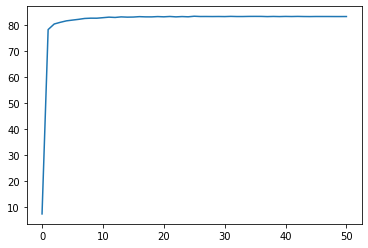

In [5]:
# Learning curve
plt.plot(train_data[10]["Train/val_accuracy"])

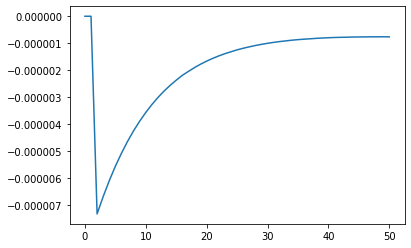

In [6]:
# Gradient statistics
plt.plot(train_data[10]["Train/layer_wise_gradient_mean_layer_0"])

In [7]:
device = utils_prep2.check_cuda()


In [8]:
class LSTM_Net(torch.nn.Module):
    
    def __init__(self, input_size, num_classes, hidden_size, seq_length, 
                 num_layers, config_size, bidirectional = False, drop_prob=0.5, relative_size = 0.2):
        super(LSTM_Net, self).__init__()

        self.input_size = input_size
        self.hidden_dim = hidden_size
        self.seq_length = seq_length
        self.num_layers = num_layers
        self.drop_prob = drop_prob
        self.num_classes = num_classes
        self.config_size = config_size
        self.bidirectional = bidirectional
        
        if bidirectional == True:
            self.factor = 2
        else:
            self.factor = 1
        
        
        # self.forecaster = torch.nn.Embedding(100, embedding_dim)

        self.dropout = torch.nn.Dropout(drop_prob)
        #self.lstm = torch.nn.LSTM(input_size = self.input_size, hidden_size = self.hidden_dim, 
        #                    num_layers = self.num_layers, dropout =drop_prob, bidirectional = bidirectional)
        
 
        self.rnn1 = torch.nn.RNN(input_size = self.input_size, hidden_size = self.hidden_dim, 
                            num_layers = self.num_layers, bidirectional = bidirectional)


        
        self.linear1 = torch.nn.Linear(self.config_size, int(self.hidden_dim*relative_size))
                                       
                                       
        self.linear2 = torch.nn.Linear(int(self.hidden_dim*relative_size),
                                       int(self.hidden_dim*relative_size))
                                       
                                       
        self.linear3 = torch.nn.Linear(self.hidden_dim + int(self.hidden_dim*relative_size),
                                      self.hidden_dim + int(self.hidden_dim*relative_size))

        
        self.linear4 = torch.nn.Linear(self.hidden_dim + int(self.hidden_dim*relative_size), self.hidden_dim//2)
        
        self.linear5 = torch.nn.Linear(self.hidden_dim//2, num_classes)
        
        
        self.dropout2 = torch.nn.Dropout(drop_prob)
        
        
        # self.linear_reduce1 = torch.nn.Linear(self.hidden_dim*10*self.factor, self.hidden_dim*5*self.factor)

        # self.linear_reduce2 = torch.nn.Linear(self.hidden_dim*10*self.factor, self.hidden_dim*self.factor)

        self.linear_reduce3 = torch.nn.Linear(self.hidden_dim*10*self.factor, self.hidden_dim)


    
    def forward(self, x, configs, hidden):
        
        
        batch_size = x.size(0)
        
        x = torch.t(x)

        x=x.unsqueeze(-1)
        
        x = x.float()
        
        #forecast = self.forecaster(x)

        lstm_x, hidden = self.rnn1(x, hidden)
        
        lstm_x = lstm_x.permute(1,0,2)

        lstm_x = lstm_x.contiguous().view(batch_size, -1)
        #print(lstm_x.size())

        # lstm_x = lstm_x.contiguous().view(-1, self.hidden_dim)
        
        x = self.dropout(lstm_x)
        # try 
        x = lstm_x
        
        #x = torch.nn.functional.relu(self.linear_reduce1(x))
        # x = torch.nn.functional.relu(self.linear_reduce2(x))
        x = torch.nn.functional.relu(self.linear_reduce3(x))


        x_config = torch.nn.functional.relu(self.linear1(configs))
        x_config = torch.nn.functional.relu(self.linear2(x_config))

        x_cat =  torch.cat([x, x_config], dim =1)

        
        x_cat = torch.nn.functional.relu(self.linear3(x_cat))
        
        #x_cat = self.dropout2(x_cat)
        
        x_cat = torch.nn.functional.relu(self.linear4(x_cat))
        x_cat = self.linear5(x_cat)

        
        x_cat = x_cat.view(batch_size, -1)
        x_cat = x_cat[:,-1]
        
        return x_cat, hidden
    
    def init_hidden(self, batch_size = 32):
        
        if self.bidirectional == False:
            return torch.randn(self.num_layers, batch_size, self.hidden_dim)
        else:
            return torch.randn(self.num_layers*2, batch_size, self.hidden_dim)

    

In [9]:
### alternative weighted MSE Loss


def weighted_mse_loss(prediction, target, weight):
    ### construct weight vector
        
    return torch.sum((prediction-target)**2)




In [10]:
#### calculate weights

weights = [1/(len([x for x in train_targets if x < 80.0])), 1/(len([x for x in train_targets if x >= 80.0]))]


In [11]:
def create_model(hidden_dim, num_layers, lr= 0.001, relative_size = 0.75, weight_decay = 0.001, bidirectional = False):
    
    
    def weights_init(m):
        for name, param in m.named_parameters():
            torch.nn.init.uniform_(param) 
    
    input_size = 1
    outcome_dim = 1
    seq_length = 10
    config_size = 7

    model = LSTM_Net(input_size, outcome_dim, hidden_dim, seq_length, num_layers, config_size,
                     relative_size = relative_size, bidirectional = bidirectional)
    model.to(device)
    
    model.apply(weights_init)


    criterion = torch.nn.MSELoss()
    criterion_val = torch.nn.MSELoss(reduction = "sum")
    optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay = weight_decay)
    
    return model, optimizer, criterion, criterion_val

In [20]:
def train_validate_model(model, optimizer, criterion, criterion_val):
    
    
    train_loss_list = []
    val_loss_list = []
    
    epochs = 3000
    counter = 0
    print_every = int(len(train_data_loader)/2)

    clip = 5
    valid_loss_min = np.Inf

    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, len(train_data_loader))

    model.train()

    for i in range(epochs):


        for batches, configs , labels in train_data_loader:
            counter += 1

            batch_size_calc = len(labels)
            hidden = model.init_hidden(batch_size=batch_size_calc)


            model.zero_grad()

            output, hidden = model(batches, configs, hidden)


            loss = abs(criterion(output.squeeze(), labels.float()))
            loss.backward()


            torch.nn.utils.clip_grad_norm_(model.parameters(), clip)
            optimizer.step()


            if counter%print_every == 0:

                val_losses = []
                val_losses_sum = []
                model.eval()

                for inp,configs, lab in val_data_loader:

                    batch_size_calc = len(lab)

                    val_h = model.init_hidden(batch_size = batch_size_calc)


                    inp, lab = inp.to(device), lab.to(device)
                    out, val_h = model(inp, configs,val_h)
                    val_loss = criterion(out.squeeze(), lab.float())
                    val_losses.append(val_loss.item())
                    
                    val_loss_sum = criterion_val(out.squeeze(), lab.float())/(batch_size_calc)
                    val_losses_sum.append(val_loss_sum.item())

                    print("Epoch: {}/{}...".format(i+1, epochs),
                      "Step: {}...".format(counter),
                      "Loss: {:.6f}...".format(loss.item()),
                      "Val Loss: {:.6f}".format(np.mean(val_losses_sum)))

                if np.mean(val_losses) <= valid_loss_min:
                    torch.save(model.state_dict(), '/home/sven/LCBench/state_dict' +str(itervalues) +'.pt')
                    print('Validation loss decreased ({:.6f} --> {:.6f}).  Saving model ...'.format(valid_loss_min,np.mean(val_losses_sum)))
                    valid_loss_min = np.mean(val_losses_sum)
                
                model.train()
                
            scheduler.step()


    train_loss_list.append(loss.item())
    val_loss_list.append(np.mean(val_losses))
            
    return train_loss_list, val_loss_list


In [13]:
def test_model(model, criterion, criterion_val):
    
    model.load_state_dict(torch.load('/home/sven/LCBench/state_dict' +str(itervalues) +'.pt'))

    test_losses = []
    val_losses_sum = []
    msqrt = 0
    counter = 0
    
    pred_list = []


    model.eval()
    for inputs,configs, labels in test_data_loader:
        counter = counter +1
        batch_size_calc = len(labels)
        h = model.init_hidden(batch_size_calc)
        inputs, labels = inputs.to(device), labels.to(device)
        output, h = model(inputs,configs, h)
        test_loss = criterion(output.squeeze(), labels.float())
        test_losses.append(test_loss.item())
        
                                    
        test_loss_sum = (criterion_val(output.squeeze(), labels.float()))/batch_size_calc
        val_losses_sum.append(test_loss_sum.item())
        
        pred = (output.squeeze())

        msqrt = msqrt + mean_squared_error(labels.detach().numpy(), pred.detach().numpy())
        
    
        print((labels.detach()))
        print((pred.detach()))
        pred_list.append([labels.detach(), pred.detach()])
    print(counter)
    total_test_acc = msqrt
    print("TOTAL Loss: {:.3f}".format(total_test_acc))
    test_acc2 = msqrt/counter
    
    print("Msqrt: {:.3f}".format(test_acc2))

    print("Test loss: {:.3f}".format(np.mean(val_losses_sum)))
    
    return pred_list, test_acc2, np.mean(val_losses_sum)


In [14]:
## normalization_factor_temporal_data = 100
train_data_loader = prep_data(train_data, train_targets, batch_size = 32,first_n_epochs = 10 )
test_data_loader = prep_data(test_data, test_targets, batch_size = 32,first_n_epochs = 10 )
val_data_loader = prep_data(val_data, val_targets, batch_size = 32, first_n_epochs=10)


model, optimizer, criterion, criterion_val = create_model(33, 3, bidirectional = True)

In [15]:
pyotrch_total_sum = sum(p.numel() for p in model.parameters())
print(pyotrch_total_sum)

42564


In [182]:
sum_all = []

for name, param in model.named_parameters():
    #if param.requires_grad:
    print(name, param.data.numel())
    sum_all.append(len(param.data))

print(np.sum(sum_all))

rnn1.weight_ih_l0 33
rnn1.weight_hh_l0 1089
rnn1.bias_ih_l0 33
rnn1.bias_hh_l0 33
rnn1.weight_ih_l0_reverse 33
rnn1.weight_hh_l0_reverse 1089
rnn1.bias_ih_l0_reverse 33
rnn1.bias_hh_l0_reverse 33
rnn1.weight_ih_l1 2178
rnn1.weight_hh_l1 1089
rnn1.bias_ih_l1 33
rnn1.bias_hh_l1 33
rnn1.weight_ih_l1_reverse 2178
rnn1.weight_hh_l1_reverse 1089
rnn1.bias_ih_l1_reverse 33
rnn1.bias_hh_l1_reverse 33
rnn1.weight_ih_l2 2178
rnn1.weight_hh_l2 1089
rnn1.bias_ih_l2 33
rnn1.bias_hh_l2 33
rnn1.weight_ih_l2_reverse 2178
rnn1.weight_hh_l2_reverse 1089
rnn1.bias_ih_l2_reverse 33
rnn1.bias_hh_l2_reverse 33
linear1.weight 168
linear1.bias 24
linear2.weight 576
linear2.bias 24
linear3.weight 3249
linear3.bias 57
linear4.weight 912
linear4.bias 16
linear5.weight 16
linear5.bias 1
linear_reduce3.weight 21780
linear_reduce3.bias 33
1102


In [175]:
from utils import prep_data



train_validate_model(model, optimizer, criterion, criterion_val)
    
    


Epoch: 4/3000... Step: 100... Loss: 916484194304.000000... Val Loss: 915071500288.000000
Epoch: 4/3000... Step: 100... Loss: 916484194304.000000... Val Loss: 915255558144.000000
Epoch: 4/3000... Step: 100... Loss: 916484194304.000000... Val Loss: 915254433109.333374
Epoch: 4/3000... Step: 100... Loss: 916484194304.000000... Val Loss: 915176488960.000000
Epoch: 4/3000... Step: 100... Loss: 916484194304.000000... Val Loss: 915471296102.400024
Epoch: 4/3000... Step: 100... Loss: 916484194304.000000... Val Loss: 915238879232.000000
Epoch: 4/3000... Step: 100... Loss: 916484194304.000000... Val Loss: 915256461604.571411
Epoch: 4/3000... Step: 100... Loss: 916484194304.000000... Val Loss: 914989293568.000000
Epoch: 4/3000... Step: 100... Loss: 916484194304.000000... Val Loss: 915093272803.555542
Epoch: 4/3000... Step: 100... Loss: 916484194304.000000... Val Loss: 915136951091.199951
Epoch: 4/3000... Step: 100... Loss: 916484194304.000000... Val Loss: 914976711400.727295
Epoch: 4/3000... Step

Epoch: 22/3000... Step: 700... Loss: 13325734.000000... Val Loss: 9365112.000000
Epoch: 22/3000... Step: 700... Loss: 13325734.000000... Val Loss: 9361853.000000
Epoch: 22/3000... Step: 700... Loss: 13325734.000000... Val Loss: 9361898.333333
Epoch: 22/3000... Step: 700... Loss: 13325734.000000... Val Loss: 9360618.750000
Epoch: 22/3000... Step: 700... Loss: 13325734.000000... Val Loss: 9365153.000000
Epoch: 22/3000... Step: 700... Loss: 13325734.000000... Val Loss: 9364362.000000
Epoch: 22/3000... Step: 700... Loss: 13325734.000000... Val Loss: 9363331.714286
Epoch: 22/3000... Step: 700... Loss: 13325734.000000... Val Loss: 9360582.875000
Epoch: 22/3000... Step: 700... Loss: 13325734.000000... Val Loss: 9360779.555556
Epoch: 22/3000... Step: 700... Loss: 13325734.000000... Val Loss: 9362255.300000
Epoch: 22/3000... Step: 700... Loss: 13325734.000000... Val Loss: 9361308.181818
Epoch: 22/3000... Step: 700... Loss: 13325734.000000... Val Loss: 9360147.583333
Epoch: 22/3000... Step: 700.

Epoch: 44/3000... Step: 1400... Loss: 580.664795... Val Loss: 616.800842
Epoch: 44/3000... Step: 1400... Loss: 580.664795... Val Loss: 564.058289
Epoch: 44/3000... Step: 1400... Loss: 580.664795... Val Loss: 570.831340
Epoch: 44/3000... Step: 1400... Loss: 580.664795... Val Loss: 566.706253
Epoch: 44/3000... Step: 1400... Loss: 580.664795... Val Loss: 588.794373
Epoch: 44/3000... Step: 1400... Loss: 580.664795... Val Loss: 617.975352
Epoch: 44/3000... Step: 1400... Loss: 580.664795... Val Loss: 604.206499
Epoch: 44/3000... Step: 1400... Loss: 580.664795... Val Loss: 597.315140
Epoch: 44/3000... Step: 1400... Loss: 580.664795... Val Loss: 588.333679
Epoch: 44/3000... Step: 1400... Loss: 580.664795... Val Loss: 598.267584
Epoch: 44/3000... Step: 1400... Loss: 580.664795... Val Loss: 604.419012
Epoch: 44/3000... Step: 1400... Loss: 580.664795... Val Loss: 603.788681
Epoch: 44/3000... Step: 1400... Loss: 580.664795... Val Loss: 598.301274
Epoch: 44/3000... Step: 1400... Loss: 580.664795...

Epoch: 66/3000... Step: 2100... Loss: 1610.972168... Val Loss: 1365.506348
Epoch: 66/3000... Step: 2100... Loss: 1610.972168... Val Loss: 1284.921753
Epoch: 66/3000... Step: 2100... Loss: 1610.972168... Val Loss: 1286.702352
Epoch: 66/3000... Step: 2100... Loss: 1610.972168... Val Loss: 1286.515717
Epoch: 66/3000... Step: 2100... Loss: 1610.972168... Val Loss: 1309.582617
Epoch: 66/3000... Step: 2100... Loss: 1610.972168... Val Loss: 1348.641825
Epoch: 66/3000... Step: 2100... Loss: 1610.972168... Val Loss: 1329.153268
Epoch: 66/3000... Step: 2100... Loss: 1610.972168... Val Loss: 1324.966492
Epoch: 66/3000... Step: 2100... Loss: 1610.972168... Val Loss: 1310.575005
Epoch: 66/3000... Step: 2100... Loss: 1610.972168... Val Loss: 1323.023401
Epoch: 66/3000... Step: 2100... Loss: 1610.972168... Val Loss: 1333.447532
Epoch: 66/3000... Step: 2100... Loss: 1610.972168... Val Loss: 1332.006551
Epoch: 66/3000... Step: 2100... Loss: 1610.972168... Val Loss: 1324.337534
Epoch: 66/3000... Step: 2

Epoch: 88/3000... Step: 2800... Loss: 38.056896... Val Loss: 12.364382
Epoch: 88/3000... Step: 2800... Loss: 38.056896... Val Loss: 9.385280
Epoch: 88/3000... Step: 2800... Loss: 38.056896... Val Loss: 11.271419
Epoch: 88/3000... Step: 2800... Loss: 38.056896... Val Loss: 10.182317
Epoch: 88/3000... Step: 2800... Loss: 38.056896... Val Loss: 10.722835
Epoch: 88/3000... Step: 2800... Loss: 38.056896... Val Loss: 11.998492
Epoch: 88/3000... Step: 2800... Loss: 38.056896... Val Loss: 11.316524
Epoch: 88/3000... Step: 2800... Loss: 38.056896... Val Loss: 10.821006
Epoch: 88/3000... Step: 2800... Loss: 38.056896... Val Loss: 10.493618
Epoch: 88/3000... Step: 2800... Loss: 38.056896... Val Loss: 10.248699
Epoch: 88/3000... Step: 2800... Loss: 38.056896... Val Loss: 10.263444
Epoch: 88/3000... Step: 2800... Loss: 38.056896... Val Loss: 10.726637
Epoch: 88/3000... Step: 2800... Loss: 38.056896... Val Loss: 10.532781
Epoch: 88/3000... Step: 2800... Loss: 38.056896... Val Loss: 11.200621
Epoch: 

Epoch: 110/3000... Step: 3500... Loss: 25.760895... Val Loss: 20.403517
Epoch: 110/3000... Step: 3500... Loss: 25.760895... Val Loss: 17.578914
Epoch: 110/3000... Step: 3500... Loss: 25.760895... Val Loss: 19.815360
Epoch: 110/3000... Step: 3500... Loss: 25.760895... Val Loss: 18.066120
Epoch: 110/3000... Step: 3500... Loss: 25.760895... Val Loss: 19.860191
Epoch: 110/3000... Step: 3500... Loss: 25.760895... Val Loss: 21.866136
Epoch: 110/3000... Step: 3500... Loss: 25.760895... Val Loss: 20.554976
Epoch: 110/3000... Step: 3500... Loss: 25.760895... Val Loss: 19.673630
Epoch: 110/3000... Step: 3500... Loss: 25.760895... Val Loss: 19.364532
Epoch: 110/3000... Step: 3500... Loss: 25.760895... Val Loss: 18.755899
Epoch: 110/3000... Step: 3500... Loss: 25.760895... Val Loss: 18.609317
Epoch: 110/3000... Step: 3500... Loss: 25.760895... Val Loss: 19.548149
Epoch: 110/3000... Step: 3500... Loss: 25.760895... Val Loss: 19.051825
Epoch: 110/3000... Step: 3500... Loss: 25.760895... Val Loss: 19

Epoch: 135/3000... Step: 4300... Loss: 8.003021... Val Loss: 10.438461
Epoch: 135/3000... Step: 4300... Loss: 8.003021... Val Loss: 8.850710
Epoch: 135/3000... Step: 4300... Loss: 8.003021... Val Loss: 11.094003
Epoch: 135/3000... Step: 4300... Loss: 8.003021... Val Loss: 9.556652
Epoch: 135/3000... Step: 4300... Loss: 8.003021... Val Loss: 11.324931
Epoch: 135/3000... Step: 4300... Loss: 8.003021... Val Loss: 12.627720
Epoch: 135/3000... Step: 4300... Loss: 8.003021... Val Loss: 11.337739
Epoch: 135/3000... Step: 4300... Loss: 8.003021... Val Loss: 10.578085
Epoch: 135/3000... Step: 4300... Loss: 8.003021... Val Loss: 10.199115
Epoch: 135/3000... Step: 4300... Loss: 8.003021... Val Loss: 9.876786
Epoch: 135/3000... Step: 4300... Loss: 8.003021... Val Loss: 9.609265
Epoch: 135/3000... Step: 4300... Loss: 8.003021... Val Loss: 10.594407
Epoch: 135/3000... Step: 4300... Loss: 8.003021... Val Loss: 10.328977
Epoch: 135/3000... Step: 4300... Loss: 8.003021... Val Loss: 11.016002
Epoch: 135

Epoch: 160/3000... Step: 5100... Loss: 4.205846... Val Loss: 10.303460
Epoch: 160/3000... Step: 5100... Loss: 4.205846... Val Loss: 9.276064
Epoch: 160/3000... Step: 5100... Loss: 4.205846... Val Loss: 10.949753
Epoch: 160/3000... Step: 5100... Loss: 4.205846... Val Loss: 9.989861
Epoch: 160/3000... Step: 5100... Loss: 4.205846... Val Loss: 10.623232
Epoch: 160/3000... Step: 5100... Loss: 4.205846... Val Loss: 11.329723
Epoch: 160/3000... Step: 5100... Loss: 4.205846... Val Loss: 10.946624
Epoch: 160/3000... Step: 5100... Loss: 4.205846... Val Loss: 10.600761
Epoch: 160/3000... Step: 5100... Loss: 4.205846... Val Loss: 10.490407
Epoch: 160/3000... Step: 5100... Loss: 4.205846... Val Loss: 10.178367
Epoch: 160/3000... Step: 5100... Loss: 4.205846... Val Loss: 10.244728
Epoch: 160/3000... Step: 5100... Loss: 4.205846... Val Loss: 10.949848
Epoch: 160/3000... Step: 5100... Loss: 4.205846... Val Loss: 10.871035
Epoch: 160/3000... Step: 5100... Loss: 4.205846... Val Loss: 11.510392
Epoch: 1

Epoch: 182/3000... Step: 5800... Loss: 4.872921... Val Loss: 8.507566
Epoch: 182/3000... Step: 5800... Loss: 4.872921... Val Loss: 9.212861
Epoch: 182/3000... Step: 5800... Loss: 4.872921... Val Loss: 9.696051
Epoch: 182/3000... Step: 5800... Loss: 4.872921... Val Loss: 9.550290
Epoch: 185/3000... Step: 5900... Loss: 4.566408... Val Loss: 8.397764
Epoch: 185/3000... Step: 5900... Loss: 4.566408... Val Loss: 7.127716
Epoch: 185/3000... Step: 5900... Loss: 4.566408... Val Loss: 8.706001
Epoch: 185/3000... Step: 5900... Loss: 4.566408... Val Loss: 7.600323
Epoch: 185/3000... Step: 5900... Loss: 4.566408... Val Loss: 8.979414
Epoch: 185/3000... Step: 5900... Loss: 4.566408... Val Loss: 10.200052
Epoch: 185/3000... Step: 5900... Loss: 4.566408... Val Loss: 9.332038
Epoch: 185/3000... Step: 5900... Loss: 4.566408... Val Loss: 8.672964
Epoch: 185/3000... Step: 5900... Loss: 4.566408... Val Loss: 8.334011
Epoch: 185/3000... Step: 5900... Loss: 4.566408... Val Loss: 7.924092
Epoch: 185/3000... 

Epoch: 210/3000... Step: 6700... Loss: 2.964057... Val Loss: 7.828591
Epoch: 210/3000... Step: 6700... Loss: 2.964057... Val Loss: 7.145442
Epoch: 210/3000... Step: 6700... Loss: 2.964057... Val Loss: 8.413931
Epoch: 210/3000... Step: 6700... Loss: 2.964057... Val Loss: 7.329756
Epoch: 210/3000... Step: 6700... Loss: 2.964057... Val Loss: 8.980225
Epoch: 210/3000... Step: 6700... Loss: 2.964057... Val Loss: 10.246514
Epoch: 210/3000... Step: 6700... Loss: 2.964057... Val Loss: 9.326922
Epoch: 210/3000... Step: 6700... Loss: 2.964057... Val Loss: 8.727355
Epoch: 210/3000... Step: 6700... Loss: 2.964057... Val Loss: 8.403550
Epoch: 210/3000... Step: 6700... Loss: 2.964057... Val Loss: 8.068428
Epoch: 210/3000... Step: 6700... Loss: 2.964057... Val Loss: 7.880848
Epoch: 210/3000... Step: 6700... Loss: 2.964057... Val Loss: 8.461889
Epoch: 210/3000... Step: 6700... Loss: 2.964057... Val Loss: 8.357768
Epoch: 210/3000... Step: 6700... Loss: 2.964057... Val Loss: 8.870730
Epoch: 210/3000... 

Epoch: 235/3000... Step: 7500... Loss: 3.643192... Val Loss: 6.829297
Epoch: 235/3000... Step: 7500... Loss: 3.643192... Val Loss: 6.841923
Epoch: 235/3000... Step: 7500... Loss: 3.643192... Val Loss: 8.958942
Epoch: 235/3000... Step: 7500... Loss: 3.643192... Val Loss: 7.909636
Epoch: 235/3000... Step: 7500... Loss: 3.643192... Val Loss: 9.493362
Epoch: 235/3000... Step: 7500... Loss: 3.643192... Val Loss: 10.390417
Epoch: 235/3000... Step: 7500... Loss: 3.643192... Val Loss: 9.703481
Epoch: 235/3000... Step: 7500... Loss: 3.643192... Val Loss: 9.153948
Epoch: 235/3000... Step: 7500... Loss: 3.643192... Val Loss: 8.899835
Epoch: 235/3000... Step: 7500... Loss: 3.643192... Val Loss: 8.507517
Epoch: 235/3000... Step: 7500... Loss: 3.643192... Val Loss: 8.334162
Epoch: 235/3000... Step: 7500... Loss: 3.643192... Val Loss: 8.955298
Epoch: 235/3000... Step: 7500... Loss: 3.643192... Val Loss: 8.905246
Epoch: 235/3000... Step: 7500... Loss: 3.643192... Val Loss: 9.439164
Epoch: 235/3000... 

Epoch: 260/3000... Step: 8300... Loss: 2.452249... Val Loss: 7.844038
Epoch: 260/3000... Step: 8300... Loss: 2.452249... Val Loss: 7.481530
Epoch: 260/3000... Step: 8300... Loss: 2.452249... Val Loss: 8.686745
Epoch: 260/3000... Step: 8300... Loss: 2.452249... Val Loss: 7.463900
Epoch: 260/3000... Step: 8300... Loss: 2.452249... Val Loss: 8.721518
Epoch: 260/3000... Step: 8300... Loss: 2.452249... Val Loss: 9.787983
Epoch: 260/3000... Step: 8300... Loss: 2.452249... Val Loss: 8.918151
Epoch: 260/3000... Step: 8300... Loss: 2.452249... Val Loss: 8.341852
Epoch: 260/3000... Step: 8300... Loss: 2.452249... Val Loss: 8.044251
Epoch: 260/3000... Step: 8300... Loss: 2.452249... Val Loss: 7.682374
Epoch: 260/3000... Step: 8300... Loss: 2.452249... Val Loss: 7.551705
Epoch: 260/3000... Step: 8300... Loss: 2.452249... Val Loss: 8.304074
Epoch: 260/3000... Step: 8300... Loss: 2.452249... Val Loss: 8.222253
Epoch: 260/3000... Step: 8300... Loss: 2.452249... Val Loss: 8.724278
Epoch: 260/3000... S

Epoch: 282/3000... Step: 9000... Loss: 5.215508... Val Loss: 11.744308
Epoch: 282/3000... Step: 9000... Loss: 5.215508... Val Loss: 11.493362
Epoch: 285/3000... Step: 9100... Loss: 2.662042... Val Loss: 10.432918
Epoch: 285/3000... Step: 9100... Loss: 2.662042... Val Loss: 8.727641
Epoch: 285/3000... Step: 9100... Loss: 2.662042... Val Loss: 10.032101
Epoch: 285/3000... Step: 9100... Loss: 2.662042... Val Loss: 8.782115
Epoch: 285/3000... Step: 9100... Loss: 2.662042... Val Loss: 10.359719
Epoch: 285/3000... Step: 9100... Loss: 2.662042... Val Loss: 11.287968
Epoch: 285/3000... Step: 9100... Loss: 2.662042... Val Loss: 10.566887
Epoch: 285/3000... Step: 9100... Loss: 2.662042... Val Loss: 9.929699
Epoch: 285/3000... Step: 9100... Loss: 2.662042... Val Loss: 9.560557
Epoch: 285/3000... Step: 9100... Loss: 2.662042... Val Loss: 9.064186
Epoch: 285/3000... Step: 9100... Loss: 2.662042... Val Loss: 8.977539
Epoch: 285/3000... Step: 9100... Loss: 2.662042... Val Loss: 9.697860
Epoch: 285/30

Epoch: 307/3000... Step: 9800... Loss: 11.455287... Val Loss: 8.578969
Epoch: 307/3000... Step: 9800... Loss: 11.455287... Val Loss: 9.252214
Epoch: 307/3000... Step: 9800... Loss: 11.455287... Val Loss: 9.099134
Epoch: 310/3000... Step: 9900... Loss: 1.574491... Val Loss: 6.733943
Epoch: 310/3000... Step: 9900... Loss: 1.574491... Val Loss: 7.650162
Epoch: 310/3000... Step: 9900... Loss: 1.574491... Val Loss: 9.448504
Epoch: 310/3000... Step: 9900... Loss: 1.574491... Val Loss: 8.083673
Epoch: 310/3000... Step: 9900... Loss: 1.574491... Val Loss: 10.165134
Epoch: 310/3000... Step: 9900... Loss: 1.574491... Val Loss: 10.630888
Epoch: 310/3000... Step: 9900... Loss: 1.574491... Val Loss: 9.619167
Epoch: 310/3000... Step: 9900... Loss: 1.574491... Val Loss: 9.122756
Epoch: 310/3000... Step: 9900... Loss: 1.574491... Val Loss: 8.673755
Epoch: 310/3000... Step: 9900... Loss: 1.574491... Val Loss: 8.181415
Epoch: 310/3000... Step: 9900... Loss: 1.574491... Val Loss: 7.940219
Epoch: 310/3000

Epoch: 332/3000... Step: 10600... Loss: 5.796848... Val Loss: 12.716130
Epoch: 332/3000... Step: 10600... Loss: 5.796848... Val Loss: 12.473041
Epoch: 332/3000... Step: 10600... Loss: 5.796848... Val Loss: 12.119972
Epoch: 332/3000... Step: 10600... Loss: 5.796848... Val Loss: 11.134492
Epoch: 332/3000... Step: 10600... Loss: 5.796848... Val Loss: 11.818328
Epoch: 332/3000... Step: 10600... Loss: 5.796848... Val Loss: 11.842222
Epoch: 332/3000... Step: 10600... Loss: 5.796848... Val Loss: 11.148863
Epoch: 332/3000... Step: 10600... Loss: 5.796848... Val Loss: 10.968938
Epoch: 332/3000... Step: 10600... Loss: 5.796848... Val Loss: 10.594672
Epoch: 332/3000... Step: 10600... Loss: 5.796848... Val Loss: 10.149450
Epoch: 332/3000... Step: 10600... Loss: 5.796848... Val Loss: 10.196622
Epoch: 332/3000... Step: 10600... Loss: 5.796848... Val Loss: 10.650915
Epoch: 332/3000... Step: 10600... Loss: 5.796848... Val Loss: 10.577316
Epoch: 332/3000... Step: 10600... Loss: 5.796848... Val Loss: 11

Epoch: 354/3000... Step: 11300... Loss: 5.224778... Val Loss: 7.494739
Epoch: 354/3000... Step: 11300... Loss: 5.224778... Val Loss: 8.327732
Epoch: 354/3000... Step: 11300... Loss: 5.224778... Val Loss: 8.119532
Epoch: 354/3000... Step: 11300... Loss: 5.224778... Val Loss: 8.617123
Epoch: 354/3000... Step: 11300... Loss: 5.224778... Val Loss: 9.414062
Epoch: 354/3000... Step: 11300... Loss: 5.224778... Val Loss: 9.235773
Epoch: 357/3000... Step: 11400... Loss: 4.554113... Val Loss: 8.687012
Epoch: 357/3000... Step: 11400... Loss: 4.554113... Val Loss: 9.069016
Epoch: 357/3000... Step: 11400... Loss: 4.554113... Val Loss: 9.825399
Epoch: 357/3000... Step: 11400... Loss: 4.554113... Val Loss: 8.541779
Epoch: 357/3000... Step: 11400... Loss: 4.554113... Val Loss: 11.023251
Epoch: 357/3000... Step: 11400... Loss: 4.554113... Val Loss: 11.125981
Epoch: 357/3000... Step: 11400... Loss: 4.554113... Val Loss: 10.082389
Epoch: 357/3000... Step: 11400... Loss: 4.554113... Val Loss: 9.514694
Epo

Epoch: 379/3000... Step: 12100... Loss: 3.227932... Val Loss: 7.692537
Epoch: 379/3000... Step: 12100... Loss: 3.227932... Val Loss: 8.889161
Epoch: 379/3000... Step: 12100... Loss: 3.227932... Val Loss: 9.078167
Epoch: 379/3000... Step: 12100... Loss: 3.227932... Val Loss: 8.068004
Epoch: 379/3000... Step: 12100... Loss: 3.227932... Val Loss: 9.972964
Epoch: 379/3000... Step: 12100... Loss: 3.227932... Val Loss: 10.359882
Epoch: 379/3000... Step: 12100... Loss: 3.227932... Val Loss: 9.413767
Epoch: 379/3000... Step: 12100... Loss: 3.227932... Val Loss: 8.874640
Epoch: 379/3000... Step: 12100... Loss: 3.227932... Val Loss: 8.468981
Epoch: 379/3000... Step: 12100... Loss: 3.227932... Val Loss: 7.992523
Epoch: 379/3000... Step: 12100... Loss: 3.227932... Val Loss: 7.829892
Epoch: 379/3000... Step: 12100... Loss: 3.227932... Val Loss: 8.485905
Epoch: 379/3000... Step: 12100... Loss: 3.227932... Val Loss: 8.160800
Epoch: 379/3000... Step: 12100... Loss: 3.227932... Val Loss: 8.462425
Epoch

Epoch: 404/3000... Step: 12900... Loss: 4.999533... Val Loss: 9.187709
Epoch: 404/3000... Step: 12900... Loss: 4.999533... Val Loss: 9.388947
Epoch: 404/3000... Step: 12900... Loss: 4.999533... Val Loss: 9.381617
Epoch: 404/3000... Step: 12900... Loss: 4.999533... Val Loss: 8.389853
Epoch: 404/3000... Step: 12900... Loss: 4.999533... Val Loss: 9.500161
Epoch: 404/3000... Step: 12900... Loss: 4.999533... Val Loss: 9.532160
Epoch: 404/3000... Step: 12900... Loss: 4.999533... Val Loss: 8.691364
Epoch: 404/3000... Step: 12900... Loss: 4.999533... Val Loss: 8.337012
Epoch: 404/3000... Step: 12900... Loss: 4.999533... Val Loss: 8.101981
Epoch: 404/3000... Step: 12900... Loss: 4.999533... Val Loss: 7.764341
Epoch: 404/3000... Step: 12900... Loss: 4.999533... Val Loss: 7.834719
Epoch: 404/3000... Step: 12900... Loss: 4.999533... Val Loss: 8.090852
Epoch: 404/3000... Step: 12900... Loss: 4.999533... Val Loss: 7.842042
Epoch: 404/3000... Step: 12900... Loss: 4.999533... Val Loss: 8.253143
Epoch:

Epoch: 429/3000... Step: 13700... Loss: 2.730555... Val Loss: 16.133640
Epoch: 429/3000... Step: 13700... Loss: 2.730555... Val Loss: 16.968865
Epoch: 429/3000... Step: 13700... Loss: 2.730555... Val Loss: 17.150558
Epoch: 429/3000... Step: 13700... Loss: 2.730555... Val Loss: 16.079666
Epoch: 429/3000... Step: 13700... Loss: 2.730555... Val Loss: 19.480383
Epoch: 429/3000... Step: 13700... Loss: 2.730555... Val Loss: 19.049327
Epoch: 429/3000... Step: 13700... Loss: 2.730555... Val Loss: 17.972500
Epoch: 429/3000... Step: 13700... Loss: 2.730555... Val Loss: 17.307034
Epoch: 429/3000... Step: 13700... Loss: 2.730555... Val Loss: 16.790734
Epoch: 429/3000... Step: 13700... Loss: 2.730555... Val Loss: 16.532157
Epoch: 429/3000... Step: 13700... Loss: 2.730555... Val Loss: 16.255015
Epoch: 429/3000... Step: 13700... Loss: 2.730555... Val Loss: 17.494635
Epoch: 429/3000... Step: 13700... Loss: 2.730555... Val Loss: 17.082389
Epoch: 429/3000... Step: 13700... Loss: 2.730555... Val Loss: 17

Epoch: 454/3000... Step: 14500... Loss: 4.804585... Val Loss: 6.694831
Epoch: 454/3000... Step: 14500... Loss: 4.804585... Val Loss: 8.577675
Epoch: 454/3000... Step: 14500... Loss: 4.804585... Val Loss: 9.052322
Epoch: 454/3000... Step: 14500... Loss: 4.804585... Val Loss: 7.801095
Epoch: 454/3000... Step: 14500... Loss: 4.804585... Val Loss: 9.859728
Epoch: 454/3000... Step: 14500... Loss: 4.804585... Val Loss: 8.902988
Epoch: 454/3000... Step: 14500... Loss: 4.804585... Val Loss: 8.065370
Epoch: 454/3000... Step: 14500... Loss: 4.804585... Val Loss: 7.652726
Epoch: 454/3000... Step: 14500... Loss: 4.804585... Val Loss: 7.229627
Epoch: 454/3000... Step: 14500... Loss: 4.804585... Val Loss: 6.825580
Epoch: 454/3000... Step: 14500... Loss: 4.804585... Val Loss: 6.569225
Epoch: 454/3000... Step: 14500... Loss: 4.804585... Val Loss: 7.263750
Epoch: 454/3000... Step: 14500... Loss: 4.804585... Val Loss: 7.012833
Epoch: 454/3000... Step: 14500... Loss: 4.804585... Val Loss: 7.388959
Epoch:

Epoch: 479/3000... Step: 15300... Loss: 6.629149... Val Loss: 6.837211
Epoch: 479/3000... Step: 15300... Loss: 6.629149... Val Loss: 10.407144
Epoch: 479/3000... Step: 15300... Loss: 6.629149... Val Loss: 9.847478
Epoch: 479/3000... Step: 15300... Loss: 6.629149... Val Loss: 8.549670
Epoch: 479/3000... Step: 15300... Loss: 6.629149... Val Loss: 9.933272
Epoch: 479/3000... Step: 15300... Loss: 6.629149... Val Loss: 9.180757
Epoch: 479/3000... Step: 15300... Loss: 6.629149... Val Loss: 8.399048
Epoch: 479/3000... Step: 15300... Loss: 6.629149... Val Loss: 8.071732
Epoch: 479/3000... Step: 15300... Loss: 6.629149... Val Loss: 7.657928
Epoch: 479/3000... Step: 15300... Loss: 6.629149... Val Loss: 7.153683
Epoch: 479/3000... Step: 15300... Loss: 6.629149... Val Loss: 6.902753
Epoch: 479/3000... Step: 15300... Loss: 6.629149... Val Loss: 7.436141
Epoch: 479/3000... Step: 15300... Loss: 6.629149... Val Loss: 7.172494
Epoch: 479/3000... Step: 15300... Loss: 6.629149... Val Loss: 7.458476
Epoch

Epoch: 504/3000... Step: 16100... Loss: 3.308129... Val Loss: 6.798450
Epoch: 504/3000... Step: 16100... Loss: 3.308129... Val Loss: 9.840479
Epoch: 504/3000... Step: 16100... Loss: 3.308129... Val Loss: 9.620997
Epoch: 504/3000... Step: 16100... Loss: 3.308129... Val Loss: 8.331293
Epoch: 504/3000... Step: 16100... Loss: 3.308129... Val Loss: 9.567182
Epoch: 504/3000... Step: 16100... Loss: 3.308129... Val Loss: 8.722306
Epoch: 504/3000... Step: 16100... Loss: 3.308129... Val Loss: 7.791874
Epoch: 504/3000... Step: 16100... Loss: 3.308129... Val Loss: 7.481459
Epoch: 504/3000... Step: 16100... Loss: 3.308129... Val Loss: 7.143056
Epoch: 504/3000... Step: 16100... Loss: 3.308129... Val Loss: 6.895398
Epoch: 504/3000... Step: 16100... Loss: 3.308129... Val Loss: 6.881534
Epoch: 504/3000... Step: 16100... Loss: 3.308129... Val Loss: 7.367951
Epoch: 504/3000... Step: 16100... Loss: 3.308129... Val Loss: 7.232345
Epoch: 504/3000... Step: 16100... Loss: 3.308129... Val Loss: 7.589872
Epoch:

Epoch: 529/3000... Step: 16900... Loss: 2.490454... Val Loss: 9.815644
Epoch: 529/3000... Step: 16900... Loss: 2.490454... Val Loss: 12.230519
Epoch: 529/3000... Step: 16900... Loss: 2.490454... Val Loss: 12.349155
Epoch: 529/3000... Step: 16900... Loss: 2.490454... Val Loss: 11.251776
Epoch: 529/3000... Step: 16900... Loss: 2.490454... Val Loss: 13.315630
Epoch: 529/3000... Step: 16900... Loss: 2.490454... Val Loss: 12.485763
Epoch: 529/3000... Step: 16900... Loss: 2.490454... Val Loss: 11.462700
Epoch: 529/3000... Step: 16900... Loss: 2.490454... Val Loss: 10.850879
Epoch: 529/3000... Step: 16900... Loss: 2.490454... Val Loss: 10.488772
Epoch: 529/3000... Step: 16900... Loss: 2.490454... Val Loss: 10.193416
Epoch: 529/3000... Step: 16900... Loss: 2.490454... Val Loss: 10.040075
Epoch: 529/3000... Step: 16900... Loss: 2.490454... Val Loss: 10.739667
Epoch: 529/3000... Step: 16900... Loss: 2.490454... Val Loss: 10.428152
Epoch: 529/3000... Step: 16900... Loss: 2.490454... Val Loss: 10.

Epoch: 550/3000... Step: 17600... Loss: 5.522786... Val Loss: 14.997449
Epoch: 550/3000... Step: 17600... Loss: 5.522786... Val Loss: 14.626059
Epoch: 550/3000... Step: 17600... Loss: 5.522786... Val Loss: 14.229334
Epoch: 550/3000... Step: 17600... Loss: 5.522786... Val Loss: 14.719769
Epoch: 550/3000... Step: 17600... Loss: 5.522786... Val Loss: 14.746623
Epoch: 550/3000... Step: 17600... Loss: 5.522786... Val Loss: 14.972346
Epoch: 550/3000... Step: 17600... Loss: 5.522786... Val Loss: 15.341771
Epoch: 550/3000... Step: 17600... Loss: 5.522786... Val Loss: 15.335563
Epoch: 554/3000... Step: 17700... Loss: 6.141130... Val Loss: 8.715951
Epoch: 554/3000... Step: 17700... Loss: 6.141130... Val Loss: 11.779614
Epoch: 554/3000... Step: 17700... Loss: 6.141130... Val Loss: 10.791506
Epoch: 554/3000... Step: 17700... Loss: 6.141130... Val Loss: 9.961187
Epoch: 554/3000... Step: 17700... Loss: 6.141130... Val Loss: 11.866417
Epoch: 554/3000... Step: 17700... Loss: 6.141130... Val Loss: 11.1

Epoch: 575/3000... Step: 18400... Loss: 4.704620... Val Loss: 5.677024
Epoch: 575/3000... Step: 18400... Loss: 4.704620... Val Loss: 10.324833
Epoch: 575/3000... Step: 18400... Loss: 4.704620... Val Loss: 9.888330
Epoch: 575/3000... Step: 18400... Loss: 4.704620... Val Loss: 8.514498
Epoch: 575/3000... Step: 18400... Loss: 4.704620... Val Loss: 9.904693
Epoch: 575/3000... Step: 18400... Loss: 4.704620... Val Loss: 8.756084
Epoch: 575/3000... Step: 18400... Loss: 4.704620... Val Loss: 7.798557
Epoch: 575/3000... Step: 18400... Loss: 4.704620... Val Loss: 7.463874
Epoch: 575/3000... Step: 18400... Loss: 4.704620... Val Loss: 6.989331
Epoch: 575/3000... Step: 18400... Loss: 4.704620... Val Loss: 6.617302
Epoch: 575/3000... Step: 18400... Loss: 4.704620... Val Loss: 6.330569
Epoch: 575/3000... Step: 18400... Loss: 4.704620... Val Loss: 6.688012
Epoch: 575/3000... Step: 18400... Loss: 4.704620... Val Loss: 6.475480
Epoch: 575/3000... Step: 18400... Loss: 4.704620... Val Loss: 6.762684
Epoch

Epoch: 600/3000... Step: 19200... Loss: 6.862175... Val Loss: 8.430576
Epoch: 600/3000... Step: 19200... Loss: 6.862175... Val Loss: 12.023358
Epoch: 600/3000... Step: 19200... Loss: 6.862175... Val Loss: 11.411267
Epoch: 600/3000... Step: 19200... Loss: 6.862175... Val Loss: 10.259918
Epoch: 600/3000... Step: 19200... Loss: 6.862175... Val Loss: 12.446110
Epoch: 600/3000... Step: 19200... Loss: 6.862175... Val Loss: 11.609208
Epoch: 600/3000... Step: 19200... Loss: 6.862175... Val Loss: 10.556594
Epoch: 600/3000... Step: 19200... Loss: 6.862175... Val Loss: 9.967899
Epoch: 600/3000... Step: 19200... Loss: 6.862175... Val Loss: 9.485371
Epoch: 600/3000... Step: 19200... Loss: 6.862175... Val Loss: 9.115847
Epoch: 600/3000... Step: 19200... Loss: 6.862175... Val Loss: 8.958298
Epoch: 600/3000... Step: 19200... Loss: 6.862175... Val Loss: 9.772129
Epoch: 600/3000... Step: 19200... Loss: 6.862175... Val Loss: 9.465957
Epoch: 600/3000... Step: 19200... Loss: 6.862175... Val Loss: 9.844046


Epoch: 625/3000... Step: 20000... Loss: 2.938420... Val Loss: 9.147593
Epoch: 625/3000... Step: 20000... Loss: 2.938420... Val Loss: 13.130066
Epoch: 625/3000... Step: 20000... Loss: 2.938420... Val Loss: 11.567556
Epoch: 625/3000... Step: 20000... Loss: 2.938420... Val Loss: 10.324641
Epoch: 625/3000... Step: 20000... Loss: 2.938420... Val Loss: 11.030642
Epoch: 625/3000... Step: 20000... Loss: 2.938420... Val Loss: 9.714017
Epoch: 625/3000... Step: 20000... Loss: 2.938420... Val Loss: 8.652703
Epoch: 625/3000... Step: 20000... Loss: 2.938420... Val Loss: 8.285518
Epoch: 625/3000... Step: 20000... Loss: 2.938420... Val Loss: 7.765667
Epoch: 625/3000... Step: 20000... Loss: 2.938420... Val Loss: 7.444038
Epoch: 625/3000... Step: 20000... Loss: 2.938420... Val Loss: 7.167625
Epoch: 625/3000... Step: 20000... Loss: 2.938420... Val Loss: 7.636228
Epoch: 625/3000... Step: 20000... Loss: 2.938420... Val Loss: 7.434525
Epoch: 625/3000... Step: 20000... Loss: 2.938420... Val Loss: 7.684734
Ep

Epoch: 647/3000... Step: 20700... Loss: 12.864817... Val Loss: 7.254465
Epoch: 647/3000... Step: 20700... Loss: 12.864817... Val Loss: 7.820619
Epoch: 647/3000... Step: 20700... Loss: 12.864817... Val Loss: 7.608931
Epoch: 650/3000... Step: 20800... Loss: 4.237207... Val Loss: 9.830950
Epoch: 650/3000... Step: 20800... Loss: 4.237207... Val Loss: 16.073410
Epoch: 650/3000... Step: 20800... Loss: 4.237207... Val Loss: 16.112992
Epoch: 650/3000... Step: 20800... Loss: 4.237207... Val Loss: 14.246857
Epoch: 650/3000... Step: 20800... Loss: 4.237207... Val Loss: 15.254578
Epoch: 650/3000... Step: 20800... Loss: 4.237207... Val Loss: 13.864195
Epoch: 650/3000... Step: 20800... Loss: 4.237207... Val Loss: 12.951586
Epoch: 650/3000... Step: 20800... Loss: 4.237207... Val Loss: 12.653106
Epoch: 650/3000... Step: 20800... Loss: 4.237207... Val Loss: 12.115259
Epoch: 650/3000... Step: 20800... Loss: 4.237207... Val Loss: 11.625809
Epoch: 650/3000... Step: 20800... Loss: 4.237207... Val Loss: 11.

Epoch: 672/3000... Step: 21500... Loss: 18.671577... Val Loss: 7.449871
Epoch: 672/3000... Step: 21500... Loss: 18.671577... Val Loss: 11.817800
Epoch: 672/3000... Step: 21500... Loss: 18.671577... Val Loss: 11.554239
Epoch: 672/3000... Step: 21500... Loss: 18.671577... Val Loss: 9.914412
Epoch: 672/3000... Step: 21500... Loss: 18.671577... Val Loss: 11.609708
Epoch: 672/3000... Step: 21500... Loss: 18.671577... Val Loss: 10.204679
Epoch: 672/3000... Step: 21500... Loss: 18.671577... Val Loss: 9.219112
Epoch: 672/3000... Step: 21500... Loss: 18.671577... Val Loss: 8.781454
Epoch: 672/3000... Step: 21500... Loss: 18.671577... Val Loss: 8.326086
Epoch: 672/3000... Step: 21500... Loss: 18.671577... Val Loss: 7.932839
Epoch: 672/3000... Step: 21500... Loss: 18.671577... Val Loss: 7.573945
Epoch: 672/3000... Step: 21500... Loss: 18.671577... Val Loss: 8.447741
Epoch: 672/3000... Step: 21500... Loss: 18.671577... Val Loss: 8.387604
Epoch: 672/3000... Step: 21500... Loss: 18.671577... Val Los

Epoch: 697/3000... Step: 22300... Loss: 14.880966... Val Loss: 6.062828
Epoch: 697/3000... Step: 22300... Loss: 14.880966... Val Loss: 8.877865
Epoch: 697/3000... Step: 22300... Loss: 14.880966... Val Loss: 9.253338
Epoch: 697/3000... Step: 22300... Loss: 14.880966... Val Loss: 7.757338
Epoch: 697/3000... Step: 22300... Loss: 14.880966... Val Loss: 9.548138
Epoch: 697/3000... Step: 22300... Loss: 14.880966... Val Loss: 8.667524
Epoch: 697/3000... Step: 22300... Loss: 14.880966... Val Loss: 7.607110
Epoch: 697/3000... Step: 22300... Loss: 14.880966... Val Loss: 7.076095
Epoch: 697/3000... Step: 22300... Loss: 14.880966... Val Loss: 6.657240
Epoch: 697/3000... Step: 22300... Loss: 14.880966... Val Loss: 6.253536
Epoch: 697/3000... Step: 22300... Loss: 14.880966... Val Loss: 5.989249
Epoch: 697/3000... Step: 22300... Loss: 14.880966... Val Loss: 6.909993
Epoch: 697/3000... Step: 22300... Loss: 14.880966... Val Loss: 6.712691
Epoch: 697/3000... Step: 22300... Loss: 14.880966... Val Loss: 7

Epoch: 719/3000... Step: 23000... Loss: 3.519045... Val Loss: 7.399771
Epoch: 719/3000... Step: 23000... Loss: 3.519045... Val Loss: 7.990242
Epoch: 719/3000... Step: 23000... Loss: 3.519045... Val Loss: 7.728482
Epoch: 722/3000... Step: 23100... Loss: 21.454063... Val Loss: 6.818297
Epoch: 722/3000... Step: 23100... Loss: 21.454063... Val Loss: 11.232265
Epoch: 722/3000... Step: 23100... Loss: 21.454063... Val Loss: 10.279446
Epoch: 722/3000... Step: 23100... Loss: 21.454063... Val Loss: 8.871607
Epoch: 722/3000... Step: 23100... Loss: 21.454063... Val Loss: 10.694405
Epoch: 722/3000... Step: 23100... Loss: 21.454063... Val Loss: 9.524330
Epoch: 722/3000... Step: 23100... Loss: 21.454063... Val Loss: 8.472980
Epoch: 722/3000... Step: 23100... Loss: 21.454063... Val Loss: 8.057251
Epoch: 722/3000... Step: 23100... Loss: 21.454063... Val Loss: 7.603501
Epoch: 722/3000... Step: 23100... Loss: 21.454063... Val Loss: 7.511916
Epoch: 722/3000... Step: 23100... Loss: 21.454063... Val Loss: 7

Epoch: 744/3000... Step: 23800... Loss: 5.427937... Val Loss: 6.591217
Epoch: 744/3000... Step: 23800... Loss: 5.427937... Val Loss: 10.717796
Epoch: 744/3000... Step: 23800... Loss: 5.427937... Val Loss: 9.653060
Epoch: 744/3000... Step: 23800... Loss: 5.427937... Val Loss: 8.422838
Epoch: 744/3000... Step: 23800... Loss: 5.427937... Val Loss: 9.598933
Epoch: 744/3000... Step: 23800... Loss: 5.427937... Val Loss: 8.463590
Epoch: 744/3000... Step: 23800... Loss: 5.427937... Val Loss: 7.634380
Epoch: 744/3000... Step: 23800... Loss: 5.427937... Val Loss: 7.452768
Epoch: 744/3000... Step: 23800... Loss: 5.427937... Val Loss: 7.145087
Epoch: 744/3000... Step: 23800... Loss: 5.427937... Val Loss: 6.858407
Epoch: 744/3000... Step: 23800... Loss: 5.427937... Val Loss: 6.541645
Epoch: 744/3000... Step: 23800... Loss: 5.427937... Val Loss: 6.944319
Epoch: 744/3000... Step: 23800... Loss: 5.427937... Val Loss: 6.685642
Epoch: 744/3000... Step: 23800... Loss: 5.427937... Val Loss: 6.882451
Epoch

Epoch: 769/3000... Step: 24600... Loss: 2.635462... Val Loss: 4.815726
Epoch: 769/3000... Step: 24600... Loss: 2.635462... Val Loss: 9.152692
Epoch: 769/3000... Step: 24600... Loss: 2.635462... Val Loss: 8.224986
Epoch: 769/3000... Step: 24600... Loss: 2.635462... Val Loss: 7.123542
Epoch: 769/3000... Step: 24600... Loss: 2.635462... Val Loss: 8.690666
Epoch: 769/3000... Step: 24600... Loss: 2.635462... Val Loss: 7.685631
Epoch: 769/3000... Step: 24600... Loss: 2.635462... Val Loss: 6.779700
Epoch: 769/3000... Step: 24600... Loss: 2.635462... Val Loss: 6.523238
Epoch: 769/3000... Step: 24600... Loss: 2.635462... Val Loss: 6.090944
Epoch: 769/3000... Step: 24600... Loss: 2.635462... Val Loss: 5.764850
Epoch: 769/3000... Step: 24600... Loss: 2.635462... Val Loss: 5.513826
Epoch: 769/3000... Step: 24600... Loss: 2.635462... Val Loss: 6.089470
Epoch: 769/3000... Step: 24600... Loss: 2.635462... Val Loss: 5.878015
Epoch: 769/3000... Step: 24600... Loss: 2.635462... Val Loss: 6.149713
Epoch:

Epoch: 794/3000... Step: 25400... Loss: 2.031601... Val Loss: 5.116919
Epoch: 794/3000... Step: 25400... Loss: 2.031601... Val Loss: 10.013026
Epoch: 794/3000... Step: 25400... Loss: 2.031601... Val Loss: 9.238366
Epoch: 794/3000... Step: 25400... Loss: 2.031601... Val Loss: 7.784310
Epoch: 794/3000... Step: 25400... Loss: 2.031601... Val Loss: 9.809102
Epoch: 794/3000... Step: 25400... Loss: 2.031601... Val Loss: 8.543312
Epoch: 794/3000... Step: 25400... Loss: 2.031601... Val Loss: 7.489723
Epoch: 794/3000... Step: 25400... Loss: 2.031601... Val Loss: 6.965433
Epoch: 794/3000... Step: 25400... Loss: 2.031601... Val Loss: 6.494425
Epoch: 794/3000... Step: 25400... Loss: 2.031601... Val Loss: 6.133244
Epoch: 794/3000... Step: 25400... Loss: 2.031601... Val Loss: 5.900263
Epoch: 794/3000... Step: 25400... Loss: 2.031601... Val Loss: 6.491667
Epoch: 794/3000... Step: 25400... Loss: 2.031601... Val Loss: 6.291185
Epoch: 794/3000... Step: 25400... Loss: 2.031601... Val Loss: 6.570112
Epoch

Epoch: 819/3000... Step: 26200... Loss: 3.288366... Val Loss: 6.287360
Epoch: 819/3000... Step: 26200... Loss: 3.288366... Val Loss: 12.037497
Epoch: 819/3000... Step: 26200... Loss: 3.288366... Val Loss: 10.860627
Epoch: 819/3000... Step: 26200... Loss: 3.288366... Val Loss: 9.628443
Epoch: 819/3000... Step: 26200... Loss: 3.288366... Val Loss: 10.341484
Epoch: 819/3000... Step: 26200... Loss: 3.288366... Val Loss: 9.101292
Epoch: 819/3000... Step: 26200... Loss: 3.288366... Val Loss: 8.067456
Epoch: 819/3000... Step: 26200... Loss: 3.288366... Val Loss: 7.777276
Epoch: 819/3000... Step: 26200... Loss: 3.288366... Val Loss: 7.246617
Epoch: 819/3000... Step: 26200... Loss: 3.288366... Val Loss: 6.822867
Epoch: 819/3000... Step: 26200... Loss: 3.288366... Val Loss: 6.541545
Epoch: 819/3000... Step: 26200... Loss: 3.288366... Val Loss: 6.988812
Epoch: 819/3000... Step: 26200... Loss: 3.288366... Val Loss: 6.747535
Epoch: 819/3000... Step: 26200... Loss: 3.288366... Val Loss: 6.973454
Epo

Epoch: 844/3000... Step: 27000... Loss: 3.613079... Val Loss: 6.240119
Epoch: 844/3000... Step: 27000... Loss: 3.613079... Val Loss: 11.411389
Epoch: 844/3000... Step: 27000... Loss: 3.613079... Val Loss: 10.536425
Epoch: 844/3000... Step: 27000... Loss: 3.613079... Val Loss: 9.099383
Epoch: 844/3000... Step: 27000... Loss: 3.613079... Val Loss: 10.616984
Epoch: 844/3000... Step: 27000... Loss: 3.613079... Val Loss: 9.357573
Epoch: 844/3000... Step: 27000... Loss: 3.613079... Val Loss: 8.453101
Epoch: 844/3000... Step: 27000... Loss: 3.613079... Val Loss: 8.294586
Epoch: 844/3000... Step: 27000... Loss: 3.613079... Val Loss: 7.812419
Epoch: 844/3000... Step: 27000... Loss: 3.613079... Val Loss: 7.356057
Epoch: 844/3000... Step: 27000... Loss: 3.613079... Val Loss: 7.058167
Epoch: 844/3000... Step: 27000... Loss: 3.613079... Val Loss: 7.658598
Epoch: 844/3000... Step: 27000... Loss: 3.613079... Val Loss: 7.328849
Epoch: 844/3000... Step: 27000... Loss: 3.613079... Val Loss: 7.488242
Epo

Epoch: 869/3000... Step: 27800... Loss: 2.568855... Val Loss: 5.539907
Epoch: 869/3000... Step: 27800... Loss: 2.568855... Val Loss: 9.678711
Epoch: 869/3000... Step: 27800... Loss: 2.568855... Val Loss: 9.009721
Epoch: 869/3000... Step: 27800... Loss: 2.568855... Val Loss: 7.542579
Epoch: 869/3000... Step: 27800... Loss: 2.568855... Val Loss: 9.157140
Epoch: 869/3000... Step: 27800... Loss: 2.568855... Val Loss: 8.048741
Epoch: 869/3000... Step: 27800... Loss: 2.568855... Val Loss: 7.066546
Epoch: 869/3000... Step: 27800... Loss: 2.568855... Val Loss: 6.790939
Epoch: 869/3000... Step: 27800... Loss: 2.568855... Val Loss: 6.318025
Epoch: 869/3000... Step: 27800... Loss: 2.568855... Val Loss: 5.963932
Epoch: 869/3000... Step: 27800... Loss: 2.568855... Val Loss: 5.628185
Epoch: 869/3000... Step: 27800... Loss: 2.568855... Val Loss: 6.404323
Epoch: 869/3000... Step: 27800... Loss: 2.568855... Val Loss: 6.217048
Epoch: 869/3000... Step: 27800... Loss: 2.568855... Val Loss: 6.528813
Epoch:

Epoch: 891/3000... Step: 28500... Loss: 4.974534... Val Loss: 7.453245
Epoch: 891/3000... Step: 28500... Loss: 4.974534... Val Loss: 7.257840
Epoch: 894/3000... Step: 28600... Loss: 5.186312... Val Loss: 6.342323
Epoch: 894/3000... Step: 28600... Loss: 5.186312... Val Loss: 9.753728
Epoch: 894/3000... Step: 28600... Loss: 5.186312... Val Loss: 9.613759
Epoch: 894/3000... Step: 28600... Loss: 5.186312... Val Loss: 8.117567
Epoch: 894/3000... Step: 28600... Loss: 5.186312... Val Loss: 10.715087
Epoch: 894/3000... Step: 28600... Loss: 5.186312... Val Loss: 9.287775
Epoch: 894/3000... Step: 28600... Loss: 5.186312... Val Loss: 8.228250
Epoch: 894/3000... Step: 28600... Loss: 5.186312... Val Loss: 7.986196
Epoch: 894/3000... Step: 28600... Loss: 5.186312... Val Loss: 7.418748
Epoch: 894/3000... Step: 28600... Loss: 5.186312... Val Loss: 7.086342
Epoch: 894/3000... Step: 28600... Loss: 5.186312... Val Loss: 6.764677
Epoch: 894/3000... Step: 28600... Loss: 5.186312... Val Loss: 7.830511
Epoch

Epoch: 916/3000... Step: 29300... Loss: 2.597111... Val Loss: 6.344306
Epoch: 916/3000... Step: 29300... Loss: 2.597111... Val Loss: 6.871914
Epoch: 916/3000... Step: 29300... Loss: 2.597111... Val Loss: 6.763892
Epoch: 919/3000... Step: 29400... Loss: 3.572680... Val Loss: 7.634002
Epoch: 919/3000... Step: 29400... Loss: 3.572680... Val Loss: 11.365310
Epoch: 919/3000... Step: 29400... Loss: 3.572680... Val Loss: 10.553699
Epoch: 919/3000... Step: 29400... Loss: 3.572680... Val Loss: 9.362367
Epoch: 919/3000... Step: 29400... Loss: 3.572680... Val Loss: 9.839774
Epoch: 919/3000... Step: 29400... Loss: 3.572680... Val Loss: 8.740665
Epoch: 919/3000... Step: 29400... Loss: 3.572680... Val Loss: 7.848272
Epoch: 919/3000... Step: 29400... Loss: 3.572680... Val Loss: 7.585340
Epoch: 919/3000... Step: 29400... Loss: 3.572680... Val Loss: 7.244536
Epoch: 919/3000... Step: 29400... Loss: 3.572680... Val Loss: 7.059646
Epoch: 919/3000... Step: 29400... Loss: 3.572680... Val Loss: 7.031408
Epoc

Epoch: 941/3000... Step: 30100... Loss: 3.269430... Val Loss: 6.893689
Epoch: 941/3000... Step: 30100... Loss: 3.269430... Val Loss: 12.037080
Epoch: 941/3000... Step: 30100... Loss: 3.269430... Val Loss: 11.079109
Epoch: 941/3000... Step: 30100... Loss: 3.269430... Val Loss: 9.466091
Epoch: 941/3000... Step: 30100... Loss: 3.269430... Val Loss: 10.053300
Epoch: 941/3000... Step: 30100... Loss: 3.269430... Val Loss: 8.896211
Epoch: 941/3000... Step: 30100... Loss: 3.269430... Val Loss: 7.924259
Epoch: 941/3000... Step: 30100... Loss: 3.269430... Val Loss: 7.627081
Epoch: 941/3000... Step: 30100... Loss: 3.269430... Val Loss: 7.223657
Epoch: 941/3000... Step: 30100... Loss: 3.269430... Val Loss: 6.860718
Epoch: 941/3000... Step: 30100... Loss: 3.269430... Val Loss: 6.568585
Epoch: 941/3000... Step: 30100... Loss: 3.269430... Val Loss: 7.170701
Epoch: 941/3000... Step: 30100... Loss: 3.269430... Val Loss: 7.036314
Epoch: 941/3000... Step: 30100... Loss: 3.269430... Val Loss: 7.130682
Epo

Epoch: 966/3000... Step: 30900... Loss: 3.156277... Val Loss: 6.042348
Epoch: 966/3000... Step: 30900... Loss: 3.156277... Val Loss: 10.129627
Epoch: 966/3000... Step: 30900... Loss: 3.156277... Val Loss: 9.416229
Epoch: 966/3000... Step: 30900... Loss: 3.156277... Val Loss: 7.960253
Epoch: 966/3000... Step: 30900... Loss: 3.156277... Val Loss: 9.189720
Epoch: 966/3000... Step: 30900... Loss: 3.156277... Val Loss: 8.017599
Epoch: 966/3000... Step: 30900... Loss: 3.156277... Val Loss: 7.069293
Epoch: 966/3000... Step: 30900... Loss: 3.156277... Val Loss: 6.723397
Epoch: 966/3000... Step: 30900... Loss: 3.156277... Val Loss: 6.294198
Epoch: 966/3000... Step: 30900... Loss: 3.156277... Val Loss: 5.974354
Epoch: 966/3000... Step: 30900... Loss: 3.156277... Val Loss: 5.702233
Epoch: 966/3000... Step: 30900... Loss: 3.156277... Val Loss: 6.348316
Epoch: 966/3000... Step: 30900... Loss: 3.156277... Val Loss: 6.133387
Epoch: 966/3000... Step: 30900... Loss: 3.156277... Val Loss: 6.462574
Epoch

Epoch: 988/3000... Step: 31600... Loss: 1.268998... Val Loss: 6.777300
Epoch: 988/3000... Step: 31600... Loss: 1.268998... Val Loss: 6.572969
Epoch: 991/3000... Step: 31700... Loss: 5.543800... Val Loss: 5.818726
Epoch: 991/3000... Step: 31700... Loss: 5.543800... Val Loss: 10.490017
Epoch: 991/3000... Step: 31700... Loss: 5.543800... Val Loss: 10.138266
Epoch: 991/3000... Step: 31700... Loss: 5.543800... Val Loss: 8.523413
Epoch: 991/3000... Step: 31700... Loss: 5.543800... Val Loss: 9.382261
Epoch: 991/3000... Step: 31700... Loss: 5.543800... Val Loss: 8.156523
Epoch: 991/3000... Step: 31700... Loss: 5.543800... Val Loss: 7.244241
Epoch: 991/3000... Step: 31700... Loss: 5.543800... Val Loss: 6.890203
Epoch: 991/3000... Step: 31700... Loss: 5.543800... Val Loss: 6.551352
Epoch: 991/3000... Step: 31700... Loss: 5.543800... Val Loss: 6.318770
Epoch: 991/3000... Step: 31700... Loss: 5.543800... Val Loss: 6.034316
Epoch: 991/3000... Step: 31700... Loss: 5.543800... Val Loss: 6.535357
Epoc

Epoch: 1013/3000... Step: 32400... Loss: 1.154009... Val Loss: 6.096845
Epoch: 1013/3000... Step: 32400... Loss: 1.154009... Val Loss: 10.522393
Epoch: 1013/3000... Step: 32400... Loss: 1.154009... Val Loss: 10.031638
Epoch: 1013/3000... Step: 32400... Loss: 1.154009... Val Loss: 8.933937
Epoch: 1013/3000... Step: 32400... Loss: 1.154009... Val Loss: 10.104632
Epoch: 1013/3000... Step: 32400... Loss: 1.154009... Val Loss: 9.165778
Epoch: 1013/3000... Step: 32400... Loss: 1.154009... Val Loss: 8.248676
Epoch: 1013/3000... Step: 32400... Loss: 1.154009... Val Loss: 7.765378
Epoch: 1013/3000... Step: 32400... Loss: 1.154009... Val Loss: 7.328532
Epoch: 1013/3000... Step: 32400... Loss: 1.154009... Val Loss: 6.985452
Epoch: 1013/3000... Step: 32400... Loss: 1.154009... Val Loss: 6.912384
Epoch: 1013/3000... Step: 32400... Loss: 1.154009... Val Loss: 7.591320
Epoch: 1013/3000... Step: 32400... Loss: 1.154009... Val Loss: 7.327345
Epoch: 1013/3000... Step: 32400... Loss: 1.154009... Val Loss

Epoch: 1038/3000... Step: 33200... Loss: 1.074939... Val Loss: 5.569300
Epoch: 1038/3000... Step: 33200... Loss: 1.074939... Val Loss: 9.494472
Epoch: 1038/3000... Step: 33200... Loss: 1.074939... Val Loss: 8.734122
Epoch: 1038/3000... Step: 33200... Loss: 1.074939... Val Loss: 7.382759
Epoch: 1038/3000... Step: 33200... Loss: 1.074939... Val Loss: 8.802713
Epoch: 1038/3000... Step: 33200... Loss: 1.074939... Val Loss: 7.649981
Epoch: 1038/3000... Step: 33200... Loss: 1.074939... Val Loss: 6.743534
Epoch: 1038/3000... Step: 33200... Loss: 1.074939... Val Loss: 6.509068
Epoch: 1038/3000... Step: 33200... Loss: 1.074939... Val Loss: 6.065960
Epoch: 1038/3000... Step: 33200... Loss: 1.074939... Val Loss: 5.717607
Epoch: 1038/3000... Step: 33200... Loss: 1.074939... Val Loss: 5.466315
Epoch: 1038/3000... Step: 33200... Loss: 1.074939... Val Loss: 5.984215
Epoch: 1038/3000... Step: 33200... Loss: 1.074939... Val Loss: 5.794402
Epoch: 1038/3000... Step: 33200... Loss: 1.074939... Val Loss: 6

Epoch: 1060/3000... Step: 33900... Loss: 3.407225... Val Loss: 5.562671
Epoch: 1060/3000... Step: 33900... Loss: 3.407225... Val Loss: 9.418781
Epoch: 1060/3000... Step: 33900... Loss: 3.407225... Val Loss: 8.738120
Epoch: 1060/3000... Step: 33900... Loss: 3.407225... Val Loss: 7.391373
Epoch: 1060/3000... Step: 33900... Loss: 3.407225... Val Loss: 8.333003
Epoch: 1060/3000... Step: 33900... Loss: 3.407225... Val Loss: 7.413907
Epoch: 1060/3000... Step: 33900... Loss: 3.407225... Val Loss: 6.560973
Epoch: 1060/3000... Step: 33900... Loss: 3.407225... Val Loss: 6.227145
Epoch: 1060/3000... Step: 33900... Loss: 3.407225... Val Loss: 5.846388
Epoch: 1060/3000... Step: 33900... Loss: 3.407225... Val Loss: 5.528065
Epoch: 1060/3000... Step: 33900... Loss: 3.407225... Val Loss: 5.305514
Epoch: 1060/3000... Step: 33900... Loss: 3.407225... Val Loss: 5.898636
Epoch: 1060/3000... Step: 33900... Loss: 3.407225... Val Loss: 5.736811
Epoch: 1060/3000... Step: 33900... Loss: 3.407225... Val Loss: 6

Epoch: 1082/3000... Step: 34600... Loss: 3.139724... Val Loss: 6.435807
Epoch: 1082/3000... Step: 34600... Loss: 3.139724... Val Loss: 6.977932
Epoch: 1082/3000... Step: 34600... Loss: 3.139724... Val Loss: 7.041228
Epoch: 1085/3000... Step: 34700... Loss: 19.609484... Val Loss: 11.943741
Epoch: 1085/3000... Step: 34700... Loss: 19.609484... Val Loss: 17.238666
Epoch: 1085/3000... Step: 34700... Loss: 19.609484... Val Loss: 16.828403
Epoch: 1085/3000... Step: 34700... Loss: 19.609484... Val Loss: 15.332272
Epoch: 1085/3000... Step: 34700... Loss: 19.609484... Val Loss: 15.388474
Epoch: 1085/3000... Step: 34700... Loss: 19.609484... Val Loss: 14.180850
Epoch: 1085/3000... Step: 34700... Loss: 19.609484... Val Loss: 13.369546
Epoch: 1085/3000... Step: 34700... Loss: 19.609484... Val Loss: 13.388377
Epoch: 1085/3000... Step: 34700... Loss: 19.609484... Val Loss: 12.807153
Epoch: 1085/3000... Step: 34700... Loss: 19.609484... Val Loss: 12.846615
Epoch: 1085/3000... Step: 34700... Loss: 19.

Epoch: 1107/3000... Step: 35400... Loss: 4.844333... Val Loss: 5.263502
Epoch: 1107/3000... Step: 35400... Loss: 4.844333... Val Loss: 10.378886
Epoch: 1107/3000... Step: 35400... Loss: 4.844333... Val Loss: 9.364843
Epoch: 1107/3000... Step: 35400... Loss: 4.844333... Val Loss: 7.976452
Epoch: 1107/3000... Step: 35400... Loss: 4.844333... Val Loss: 8.994971
Epoch: 1107/3000... Step: 35400... Loss: 4.844333... Val Loss: 7.847010
Epoch: 1107/3000... Step: 35400... Loss: 4.844333... Val Loss: 6.998948
Epoch: 1107/3000... Step: 35400... Loss: 4.844333... Val Loss: 6.740547
Epoch: 1107/3000... Step: 35400... Loss: 4.844333... Val Loss: 6.323528
Epoch: 1107/3000... Step: 35400... Loss: 4.844333... Val Loss: 5.975493
Epoch: 1107/3000... Step: 35400... Loss: 4.844333... Val Loss: 5.704113
Epoch: 1107/3000... Step: 35400... Loss: 4.844333... Val Loss: 6.140491
Epoch: 1107/3000... Step: 35400... Loss: 4.844333... Val Loss: 6.056912
Epoch: 1107/3000... Step: 35400... Loss: 4.844333... Val Loss: 

Epoch: 1132/3000... Step: 36200... Loss: 2.721093... Val Loss: 5.291059
Epoch: 1132/3000... Step: 36200... Loss: 2.721093... Val Loss: 9.380418
Epoch: 1132/3000... Step: 36200... Loss: 2.721093... Val Loss: 8.846832
Epoch: 1132/3000... Step: 36200... Loss: 2.721093... Val Loss: 7.591341
Epoch: 1132/3000... Step: 36200... Loss: 2.721093... Val Loss: 9.121486
Epoch: 1132/3000... Step: 36200... Loss: 2.721093... Val Loss: 8.192562
Epoch: 1132/3000... Step: 36200... Loss: 2.721093... Val Loss: 7.306681
Epoch: 1132/3000... Step: 36200... Loss: 2.721093... Val Loss: 6.877262
Epoch: 1132/3000... Step: 36200... Loss: 2.721093... Val Loss: 6.489425
Epoch: 1132/3000... Step: 36200... Loss: 2.721093... Val Loss: 6.216281
Epoch: 1132/3000... Step: 36200... Loss: 2.721093... Val Loss: 5.965392
Epoch: 1132/3000... Step: 36200... Loss: 2.721093... Val Loss: 6.569985
Epoch: 1132/3000... Step: 36200... Loss: 2.721093... Val Loss: 6.316880
Epoch: 1132/3000... Step: 36200... Loss: 2.721093... Val Loss: 6

Epoch: 1157/3000... Step: 37000... Loss: 3.097979... Val Loss: 7.745798
Epoch: 1157/3000... Step: 37000... Loss: 3.097979... Val Loss: 9.705991
Epoch: 1157/3000... Step: 37000... Loss: 3.097979... Val Loss: 9.161589
Epoch: 1157/3000... Step: 37000... Loss: 3.097979... Val Loss: 7.636975
Epoch: 1157/3000... Step: 37000... Loss: 3.097979... Val Loss: 9.213959
Epoch: 1157/3000... Step: 37000... Loss: 3.097979... Val Loss: 8.241810
Epoch: 1157/3000... Step: 37000... Loss: 3.097979... Val Loss: 7.296035
Epoch: 1157/3000... Step: 37000... Loss: 3.097979... Val Loss: 6.990409
Epoch: 1157/3000... Step: 37000... Loss: 3.097979... Val Loss: 6.560516
Epoch: 1157/3000... Step: 37000... Loss: 3.097979... Val Loss: 6.446499
Epoch: 1157/3000... Step: 37000... Loss: 3.097979... Val Loss: 6.180809
Epoch: 1157/3000... Step: 37000... Loss: 3.097979... Val Loss: 6.600298
Epoch: 1157/3000... Step: 37000... Loss: 3.097979... Val Loss: 6.454623
Epoch: 1157/3000... Step: 37000... Loss: 3.097979... Val Loss: 6

Epoch: 1179/3000... Step: 37700... Loss: 2.225380... Val Loss: 6.233887
Epoch: 1182/3000... Step: 37800... Loss: 2.095189... Val Loss: 5.519844
Epoch: 1182/3000... Step: 37800... Loss: 2.095189... Val Loss: 9.445641
Epoch: 1182/3000... Step: 37800... Loss: 2.095189... Val Loss: 7.986697
Epoch: 1182/3000... Step: 37800... Loss: 2.095189... Val Loss: 6.662882
Epoch: 1182/3000... Step: 37800... Loss: 2.095189... Val Loss: 7.373701
Epoch: 1182/3000... Step: 37800... Loss: 2.095189... Val Loss: 6.566129
Epoch: 1182/3000... Step: 37800... Loss: 2.095189... Val Loss: 5.807743
Epoch: 1182/3000... Step: 37800... Loss: 2.095189... Val Loss: 5.457531
Epoch: 1182/3000... Step: 37800... Loss: 2.095189... Val Loss: 5.179550
Epoch: 1182/3000... Step: 37800... Loss: 2.095189... Val Loss: 5.028541
Epoch: 1182/3000... Step: 37800... Loss: 2.095189... Val Loss: 4.881987
Epoch: 1182/3000... Step: 37800... Loss: 2.095189... Val Loss: 5.182795
Epoch: 1182/3000... Step: 37800... Loss: 2.095189... Val Loss: 5

Epoch: 1204/3000... Step: 38500... Loss: 1.252621... Val Loss: 5.383880
Epoch: 1204/3000... Step: 38500... Loss: 1.252621... Val Loss: 10.788903
Epoch: 1204/3000... Step: 38500... Loss: 1.252621... Val Loss: 9.544135
Epoch: 1204/3000... Step: 38500... Loss: 1.252621... Val Loss: 7.971910
Epoch: 1204/3000... Step: 38500... Loss: 1.252621... Val Loss: 8.578169
Epoch: 1204/3000... Step: 38500... Loss: 1.252621... Val Loss: 7.486709
Epoch: 1204/3000... Step: 38500... Loss: 1.252621... Val Loss: 6.594502
Epoch: 1204/3000... Step: 38500... Loss: 1.252621... Val Loss: 6.386299
Epoch: 1204/3000... Step: 38500... Loss: 1.252621... Val Loss: 5.942358
Epoch: 1204/3000... Step: 38500... Loss: 1.252621... Val Loss: 5.794792
Epoch: 1204/3000... Step: 38500... Loss: 1.252621... Val Loss: 5.481181
Epoch: 1204/3000... Step: 38500... Loss: 1.252621... Val Loss: 5.683865
Epoch: 1204/3000... Step: 38500... Loss: 1.252621... Val Loss: 5.527873
Epoch: 1204/3000... Step: 38500... Loss: 1.252621... Val Loss: 

Epoch: 1229/3000... Step: 39300... Loss: 5.245839... Val Loss: 5.865511
Epoch: 1229/3000... Step: 39300... Loss: 5.245839... Val Loss: 10.705349
Epoch: 1229/3000... Step: 39300... Loss: 5.245839... Val Loss: 9.452471
Epoch: 1229/3000... Step: 39300... Loss: 5.245839... Val Loss: 8.175925
Epoch: 1229/3000... Step: 39300... Loss: 5.245839... Val Loss: 8.954091
Epoch: 1229/3000... Step: 39300... Loss: 5.245839... Val Loss: 8.247910
Epoch: 1229/3000... Step: 39300... Loss: 5.245839... Val Loss: 7.394851
Epoch: 1229/3000... Step: 39300... Loss: 5.245839... Val Loss: 7.412595
Epoch: 1229/3000... Step: 39300... Loss: 5.245839... Val Loss: 6.865306
Epoch: 1229/3000... Step: 39300... Loss: 5.245839... Val Loss: 6.637868
Epoch: 1229/3000... Step: 39300... Loss: 5.245839... Val Loss: 6.399463
Epoch: 1229/3000... Step: 39300... Loss: 5.245839... Val Loss: 6.561005
Epoch: 1229/3000... Step: 39300... Loss: 5.245839... Val Loss: 6.322475
Epoch: 1229/3000... Step: 39300... Loss: 5.245839... Val Loss: 

Epoch: 1254/3000... Step: 40100... Loss: 3.101780... Val Loss: 4.856617
Epoch: 1254/3000... Step: 40100... Loss: 3.101780... Val Loss: 9.769880
Epoch: 1254/3000... Step: 40100... Loss: 3.101780... Val Loss: 8.559823
Epoch: 1254/3000... Step: 40100... Loss: 3.101780... Val Loss: 7.144397
Epoch: 1254/3000... Step: 40100... Loss: 3.101780... Val Loss: 7.631529
Epoch: 1254/3000... Step: 40100... Loss: 3.101780... Val Loss: 6.853177
Epoch: 1254/3000... Step: 40100... Loss: 3.101780... Val Loss: 6.032826
Epoch: 1254/3000... Step: 40100... Loss: 3.101780... Val Loss: 5.790815
Epoch: 1254/3000... Step: 40100... Loss: 3.101780... Val Loss: 5.421861
Epoch: 1254/3000... Step: 40100... Loss: 3.101780... Val Loss: 5.290172
Epoch: 1254/3000... Step: 40100... Loss: 3.101780... Val Loss: 5.123056
Epoch: 1254/3000... Step: 40100... Loss: 3.101780... Val Loss: 5.418349
Epoch: 1254/3000... Step: 40100... Loss: 3.101780... Val Loss: 5.286909
Epoch: 1254/3000... Step: 40100... Loss: 3.101780... Val Loss: 5

Epoch: 1279/3000... Step: 40900... Loss: 3.143080... Val Loss: 6.808269
Epoch: 1279/3000... Step: 40900... Loss: 3.143080... Val Loss: 11.117501
Epoch: 1279/3000... Step: 40900... Loss: 3.143080... Val Loss: 10.525451
Epoch: 1279/3000... Step: 40900... Loss: 3.143080... Val Loss: 8.828994
Epoch: 1279/3000... Step: 40900... Loss: 3.143080... Val Loss: 9.409035
Epoch: 1279/3000... Step: 40900... Loss: 3.143080... Val Loss: 8.865172
Epoch: 1279/3000... Step: 40900... Loss: 3.143080... Val Loss: 7.917308
Epoch: 1279/3000... Step: 40900... Loss: 3.143080... Val Loss: 7.464963
Epoch: 1279/3000... Step: 40900... Loss: 3.143080... Val Loss: 7.058627
Epoch: 1279/3000... Step: 40900... Loss: 3.143080... Val Loss: 6.898797
Epoch: 1279/3000... Step: 40900... Loss: 3.143080... Val Loss: 6.657616
Epoch: 1279/3000... Step: 40900... Loss: 3.143080... Val Loss: 6.894456
Epoch: 1279/3000... Step: 40900... Loss: 3.143080... Val Loss: 6.641077
Epoch: 1279/3000... Step: 40900... Loss: 3.143080... Val Loss:

Epoch: 1304/3000... Step: 41700... Loss: 2.868443... Val Loss: 4.782289
Epoch: 1304/3000... Step: 41700... Loss: 2.868443... Val Loss: 10.852262
Epoch: 1304/3000... Step: 41700... Loss: 2.868443... Val Loss: 9.698553
Epoch: 1304/3000... Step: 41700... Loss: 2.868443... Val Loss: 8.186088
Epoch: 1304/3000... Step: 41700... Loss: 2.868443... Val Loss: 8.578741
Epoch: 1304/3000... Step: 41700... Loss: 2.868443... Val Loss: 7.750234
Epoch: 1304/3000... Step: 41700... Loss: 2.868443... Val Loss: 6.820392
Epoch: 1304/3000... Step: 41700... Loss: 2.868443... Val Loss: 6.664105
Epoch: 1304/3000... Step: 41700... Loss: 2.868443... Val Loss: 6.213814
Epoch: 1304/3000... Step: 41700... Loss: 2.868443... Val Loss: 6.039630
Epoch: 1304/3000... Step: 41700... Loss: 2.868443... Val Loss: 5.746492
Epoch: 1304/3000... Step: 41700... Loss: 2.868443... Val Loss: 6.040347
Epoch: 1304/3000... Step: 41700... Loss: 2.868443... Val Loss: 5.819736
Epoch: 1304/3000... Step: 41700... Loss: 2.868443... Val Loss: 

Epoch: 1329/3000... Step: 42500... Loss: 4.327738... Val Loss: 7.746070
Epoch: 1329/3000... Step: 42500... Loss: 4.327738... Val Loss: 12.984715
Epoch: 1329/3000... Step: 42500... Loss: 4.327738... Val Loss: 12.351505
Epoch: 1329/3000... Step: 42500... Loss: 4.327738... Val Loss: 10.754815
Epoch: 1329/3000... Step: 42500... Loss: 4.327738... Val Loss: 11.349158
Epoch: 1329/3000... Step: 42500... Loss: 4.327738... Val Loss: 10.022231
Epoch: 1329/3000... Step: 42500... Loss: 4.327738... Val Loss: 9.118371
Epoch: 1329/3000... Step: 42500... Loss: 4.327738... Val Loss: 8.883389
Epoch: 1329/3000... Step: 42500... Loss: 4.327738... Val Loss: 8.403579
Epoch: 1329/3000... Step: 42500... Loss: 4.327738... Val Loss: 8.016581
Epoch: 1329/3000... Step: 42500... Loss: 4.327738... Val Loss: 7.686161
Epoch: 1329/3000... Step: 42500... Loss: 4.327738... Val Loss: 8.154886
Epoch: 1329/3000... Step: 42500... Loss: 4.327738... Val Loss: 8.063525
Epoch: 1329/3000... Step: 42500... Loss: 4.327738... Val Lo

Epoch: 1350/3000... Step: 43200... Loss: 5.366949... Val Loss: 7.672307
Epoch: 1354/3000... Step: 43300... Loss: 2.319074... Val Loss: 4.528769
Epoch: 1354/3000... Step: 43300... Loss: 2.319074... Val Loss: 9.835691
Epoch: 1354/3000... Step: 43300... Loss: 2.319074... Val Loss: 8.447288
Epoch: 1354/3000... Step: 43300... Loss: 2.319074... Val Loss: 7.045154
Epoch: 1354/3000... Step: 43300... Loss: 2.319074... Val Loss: 7.725335
Epoch: 1354/3000... Step: 43300... Loss: 2.319074... Val Loss: 7.060048
Epoch: 1354/3000... Step: 43300... Loss: 2.319074... Val Loss: 6.189097
Epoch: 1354/3000... Step: 43300... Loss: 2.319074... Val Loss: 5.849692
Epoch: 1354/3000... Step: 43300... Loss: 2.319074... Val Loss: 5.481035
Epoch: 1354/3000... Step: 43300... Loss: 2.319074... Val Loss: 5.352200
Epoch: 1354/3000... Step: 43300... Loss: 2.319074... Val Loss: 5.178346
Epoch: 1354/3000... Step: 43300... Loss: 2.319074... Val Loss: 5.494468
Epoch: 1354/3000... Step: 43300... Loss: 2.319074... Val Loss: 5

Epoch: 1379/3000... Step: 44100... Loss: 3.634642... Val Loss: 7.590180
Epoch: 1379/3000... Step: 44100... Loss: 3.634642... Val Loss: 11.689883
Epoch: 1379/3000... Step: 44100... Loss: 3.634642... Val Loss: 10.886809
Epoch: 1379/3000... Step: 44100... Loss: 3.634642... Val Loss: 9.511506
Epoch: 1379/3000... Step: 44100... Loss: 3.634642... Val Loss: 10.562337
Epoch: 1379/3000... Step: 44100... Loss: 3.634642... Val Loss: 9.953631
Epoch: 1379/3000... Step: 44100... Loss: 3.634642... Val Loss: 9.135547
Epoch: 1379/3000... Step: 44100... Loss: 3.634642... Val Loss: 8.710610
Epoch: 1379/3000... Step: 44100... Loss: 3.634642... Val Loss: 8.402189
Epoch: 1379/3000... Step: 44100... Loss: 3.634642... Val Loss: 8.241528
Epoch: 1379/3000... Step: 44100... Loss: 3.634642... Val Loss: 8.105749
Epoch: 1379/3000... Step: 44100... Loss: 3.634642... Val Loss: 8.466010
Epoch: 1379/3000... Step: 44100... Loss: 3.634642... Val Loss: 8.186182
Epoch: 1379/3000... Step: 44100... Loss: 3.634642... Val Loss

Epoch: 1400/3000... Step: 44800... Loss: 1.758231... Val Loss: 7.010580
Epoch: 1404/3000... Step: 44900... Loss: 3.608847... Val Loss: 5.602224
Epoch: 1404/3000... Step: 44900... Loss: 3.608847... Val Loss: 10.118251
Epoch: 1404/3000... Step: 44900... Loss: 3.608847... Val Loss: 8.666489
Epoch: 1404/3000... Step: 44900... Loss: 3.608847... Val Loss: 7.154108
Epoch: 1404/3000... Step: 44900... Loss: 3.608847... Val Loss: 7.778793
Epoch: 1404/3000... Step: 44900... Loss: 3.608847... Val Loss: 6.998304
Epoch: 1404/3000... Step: 44900... Loss: 3.608847... Val Loss: 6.112526
Epoch: 1404/3000... Step: 44900... Loss: 3.608847... Val Loss: 5.722614
Epoch: 1404/3000... Step: 44900... Loss: 3.608847... Val Loss: 5.348352
Epoch: 1404/3000... Step: 44900... Loss: 3.608847... Val Loss: 5.241242
Epoch: 1404/3000... Step: 44900... Loss: 3.608847... Val Loss: 5.093974
Epoch: 1404/3000... Step: 44900... Loss: 3.608847... Val Loss: 5.473530
Epoch: 1404/3000... Step: 44900... Loss: 3.608847... Val Loss: 

Epoch: 1429/3000... Step: 45700... Loss: 6.449765... Val Loss: 10.848022
Epoch: 1429/3000... Step: 45700... Loss: 6.449765... Val Loss: 15.599968
Epoch: 1429/3000... Step: 45700... Loss: 6.449765... Val Loss: 14.780720
Epoch: 1429/3000... Step: 45700... Loss: 6.449765... Val Loss: 13.067255
Epoch: 1429/3000... Step: 45700... Loss: 6.449765... Val Loss: 12.748907
Epoch: 1429/3000... Step: 45700... Loss: 6.449765... Val Loss: 11.646636
Epoch: 1429/3000... Step: 45700... Loss: 6.449765... Val Loss: 10.641137
Epoch: 1429/3000... Step: 45700... Loss: 6.449765... Val Loss: 10.864520
Epoch: 1429/3000... Step: 45700... Loss: 6.449765... Val Loss: 10.333049
Epoch: 1429/3000... Step: 45700... Loss: 6.449765... Val Loss: 10.301646
Epoch: 1429/3000... Step: 45700... Loss: 6.449765... Val Loss: 9.831453
Epoch: 1429/3000... Step: 45700... Loss: 6.449765... Val Loss: 9.754011
Epoch: 1429/3000... Step: 45700... Loss: 6.449765... Val Loss: 9.547229
Epoch: 1429/3000... Step: 45700... Loss: 6.449765... V

Epoch: 1454/3000... Step: 46500... Loss: 2.093554... Val Loss: 4.455336
Epoch: 1454/3000... Step: 46500... Loss: 2.093554... Val Loss: 10.559016
Epoch: 1454/3000... Step: 46500... Loss: 2.093554... Val Loss: 8.801240
Epoch: 1454/3000... Step: 46500... Loss: 2.093554... Val Loss: 7.418563
Epoch: 1454/3000... Step: 46500... Loss: 2.093554... Val Loss: 8.132793
Epoch: 1454/3000... Step: 46500... Loss: 2.093554... Val Loss: 7.170015
Epoch: 1454/3000... Step: 46500... Loss: 2.093554... Val Loss: 6.310030
Epoch: 1454/3000... Step: 46500... Loss: 2.093554... Val Loss: 6.050069
Epoch: 1454/3000... Step: 46500... Loss: 2.093554... Val Loss: 5.673067
Epoch: 1454/3000... Step: 46500... Loss: 2.093554... Val Loss: 5.457878
Epoch: 1454/3000... Step: 46500... Loss: 2.093554... Val Loss: 5.244894
Epoch: 1454/3000... Step: 46500... Loss: 2.093554... Val Loss: 5.685553
Epoch: 1454/3000... Step: 46500... Loss: 2.093554... Val Loss: 5.510445
Epoch: 1454/3000... Step: 46500... Loss: 2.093554... Val Loss: 

Epoch: 1479/3000... Step: 47300... Loss: 3.340172... Val Loss: 4.944698
Epoch: 1479/3000... Step: 47300... Loss: 3.340172... Val Loss: 10.293327
Epoch: 1479/3000... Step: 47300... Loss: 3.340172... Val Loss: 9.080385
Epoch: 1479/3000... Step: 47300... Loss: 3.340172... Val Loss: 7.600297
Epoch: 1479/3000... Step: 47300... Loss: 3.340172... Val Loss: 8.270987
Epoch: 1479/3000... Step: 47300... Loss: 3.340172... Val Loss: 7.303036
Epoch: 1479/3000... Step: 47300... Loss: 3.340172... Val Loss: 6.446445
Epoch: 1479/3000... Step: 47300... Loss: 3.340172... Val Loss: 6.172484
Epoch: 1479/3000... Step: 47300... Loss: 3.340172... Val Loss: 5.781964
Epoch: 1479/3000... Step: 47300... Loss: 3.340172... Val Loss: 5.486224
Epoch: 1479/3000... Step: 47300... Loss: 3.340172... Val Loss: 5.273822
Epoch: 1479/3000... Step: 47300... Loss: 3.340172... Val Loss: 5.663574
Epoch: 1479/3000... Step: 47300... Loss: 3.340172... Val Loss: 5.469274
Epoch: 1479/3000... Step: 47300... Loss: 3.340172... Val Loss: 

Epoch: 1504/3000... Step: 48100... Loss: 2.831279... Val Loss: 4.925504
Epoch: 1504/3000... Step: 48100... Loss: 2.831279... Val Loss: 9.289949
Epoch: 1504/3000... Step: 48100... Loss: 2.831279... Val Loss: 8.762736
Epoch: 1504/3000... Step: 48100... Loss: 2.831279... Val Loss: 7.227830
Epoch: 1504/3000... Step: 48100... Loss: 2.831279... Val Loss: 7.768134
Epoch: 1504/3000... Step: 48100... Loss: 2.831279... Val Loss: 6.824896
Epoch: 1504/3000... Step: 48100... Loss: 2.831279... Val Loss: 6.003932
Epoch: 1504/3000... Step: 48100... Loss: 2.831279... Val Loss: 5.597186
Epoch: 1504/3000... Step: 48100... Loss: 2.831279... Val Loss: 5.206379
Epoch: 1504/3000... Step: 48100... Loss: 2.831279... Val Loss: 5.037649
Epoch: 1504/3000... Step: 48100... Loss: 2.831279... Val Loss: 4.855801
Epoch: 1504/3000... Step: 48100... Loss: 2.831279... Val Loss: 5.225358
Epoch: 1504/3000... Step: 48100... Loss: 2.831279... Val Loss: 5.085861
Epoch: 1504/3000... Step: 48100... Loss: 2.831279... Val Loss: 5

Epoch: 1529/3000... Step: 48900... Loss: 3.702101... Val Loss: 5.995265
Epoch: 1529/3000... Step: 48900... Loss: 3.702101... Val Loss: 10.762736
Epoch: 1529/3000... Step: 48900... Loss: 3.702101... Val Loss: 9.195183
Epoch: 1529/3000... Step: 48900... Loss: 3.702101... Val Loss: 7.882678
Epoch: 1529/3000... Step: 48900... Loss: 3.702101... Val Loss: 8.094117
Epoch: 1529/3000... Step: 48900... Loss: 3.702101... Val Loss: 7.705358
Epoch: 1529/3000... Step: 48900... Loss: 3.702101... Val Loss: 6.906472
Epoch: 1529/3000... Step: 48900... Loss: 3.702101... Val Loss: 6.659417
Epoch: 1529/3000... Step: 48900... Loss: 3.702101... Val Loss: 6.258598
Epoch: 1529/3000... Step: 48900... Loss: 3.702101... Val Loss: 6.164291
Epoch: 1529/3000... Step: 48900... Loss: 3.702101... Val Loss: 6.030598
Epoch: 1529/3000... Step: 48900... Loss: 3.702101... Val Loss: 6.147454
Epoch: 1529/3000... Step: 48900... Loss: 3.702101... Val Loss: 5.936786
Epoch: 1529/3000... Step: 48900... Loss: 3.702101... Val Loss: 

Epoch: 1554/3000... Step: 49700... Loss: 3.931095... Val Loss: 4.379119
Epoch: 1554/3000... Step: 49700... Loss: 3.931095... Val Loss: 10.252305
Epoch: 1554/3000... Step: 49700... Loss: 3.931095... Val Loss: 8.841174
Epoch: 1554/3000... Step: 49700... Loss: 3.931095... Val Loss: 7.380681
Epoch: 1554/3000... Step: 49700... Loss: 3.931095... Val Loss: 7.715888
Epoch: 1554/3000... Step: 49700... Loss: 3.931095... Val Loss: 6.750431
Epoch: 1554/3000... Step: 49700... Loss: 3.931095... Val Loss: 6.057535
Epoch: 1554/3000... Step: 49700... Loss: 3.931095... Val Loss: 5.879460
Epoch: 1554/3000... Step: 49700... Loss: 3.931095... Val Loss: 5.487400
Epoch: 1554/3000... Step: 49700... Loss: 3.931095... Val Loss: 5.429767
Epoch: 1554/3000... Step: 49700... Loss: 3.931095... Val Loss: 5.260711
Epoch: 1554/3000... Step: 49700... Loss: 3.931095... Val Loss: 5.581007
Epoch: 1554/3000... Step: 49700... Loss: 3.931095... Val Loss: 5.417183
Epoch: 1554/3000... Step: 49700... Loss: 3.931095... Val Loss: 

Epoch: 1575/3000... Step: 50400... Loss: 1.522258... Val Loss: 5.868038
Epoch: 1575/3000... Step: 50400... Loss: 1.522258... Val Loss: 5.882215
Epoch: 1579/3000... Step: 50500... Loss: 4.540883... Val Loss: 5.269965
Epoch: 1579/3000... Step: 50500... Loss: 4.540883... Val Loss: 10.837276
Epoch: 1579/3000... Step: 50500... Loss: 4.540883... Val Loss: 9.565960
Epoch: 1579/3000... Step: 50500... Loss: 4.540883... Val Loss: 8.094756
Epoch: 1579/3000... Step: 50500... Loss: 4.540883... Val Loss: 8.477175
Epoch: 1579/3000... Step: 50500... Loss: 4.540883... Val Loss: 7.368272
Epoch: 1579/3000... Step: 50500... Loss: 4.540883... Val Loss: 6.545142
Epoch: 1579/3000... Step: 50500... Loss: 4.540883... Val Loss: 6.374563
Epoch: 1579/3000... Step: 50500... Loss: 4.540883... Val Loss: 5.914046
Epoch: 1579/3000... Step: 50500... Loss: 4.540883... Val Loss: 5.750985
Epoch: 1579/3000... Step: 50500... Loss: 4.540883... Val Loss: 5.463658
Epoch: 1579/3000... Step: 50500... Loss: 4.540883... Val Loss: 

Epoch: 1600/3000... Step: 51200... Loss: 3.124943... Val Loss: 4.446291
Epoch: 1600/3000... Step: 51200... Loss: 3.124943... Val Loss: 11.159074
Epoch: 1600/3000... Step: 51200... Loss: 3.124943... Val Loss: 9.873080
Epoch: 1600/3000... Step: 51200... Loss: 3.124943... Val Loss: 8.224323
Epoch: 1600/3000... Step: 51200... Loss: 3.124943... Val Loss: 9.074508
Epoch: 1600/3000... Step: 51200... Loss: 3.124943... Val Loss: 7.963618
Epoch: 1600/3000... Step: 51200... Loss: 3.124943... Val Loss: 7.014080
Epoch: 1600/3000... Step: 51200... Loss: 3.124943... Val Loss: 6.546416
Epoch: 1600/3000... Step: 51200... Loss: 3.124943... Val Loss: 6.154287
Epoch: 1600/3000... Step: 51200... Loss: 3.124943... Val Loss: 5.815025
Epoch: 1600/3000... Step: 51200... Loss: 3.124943... Val Loss: 5.559857
Epoch: 1600/3000... Step: 51200... Loss: 3.124943... Val Loss: 6.050598
Epoch: 1600/3000... Step: 51200... Loss: 3.124943... Val Loss: 5.981122
Epoch: 1600/3000... Step: 51200... Loss: 3.124943... Val Loss: 

Epoch: 1625/3000... Step: 52000... Loss: 1.561845... Val Loss: 4.471143
Epoch: 1625/3000... Step: 52000... Loss: 1.561845... Val Loss: 11.595071
Epoch: 1625/3000... Step: 52000... Loss: 1.561845... Val Loss: 9.556736
Epoch: 1625/3000... Step: 52000... Loss: 1.561845... Val Loss: 7.913522
Epoch: 1625/3000... Step: 52000... Loss: 1.561845... Val Loss: 8.273017
Epoch: 1625/3000... Step: 52000... Loss: 1.561845... Val Loss: 7.239265
Epoch: 1625/3000... Step: 52000... Loss: 1.561845... Val Loss: 6.332098
Epoch: 1625/3000... Step: 52000... Loss: 1.561845... Val Loss: 6.066752
Epoch: 1625/3000... Step: 52000... Loss: 1.561845... Val Loss: 5.675411
Epoch: 1625/3000... Step: 52000... Loss: 1.561845... Val Loss: 5.608192
Epoch: 1625/3000... Step: 52000... Loss: 1.561845... Val Loss: 5.434418
Epoch: 1625/3000... Step: 52000... Loss: 1.561845... Val Loss: 5.720441
Epoch: 1625/3000... Step: 52000... Loss: 1.561845... Val Loss: 5.548361
Epoch: 1625/3000... Step: 52000... Loss: 1.561845... Val Loss: 

Epoch: 1650/3000... Step: 52800... Loss: 3.278595... Val Loss: 4.835951
Epoch: 1650/3000... Step: 52800... Loss: 3.278595... Val Loss: 10.791434
Epoch: 1650/3000... Step: 52800... Loss: 3.278595... Val Loss: 9.291106
Epoch: 1650/3000... Step: 52800... Loss: 3.278595... Val Loss: 7.724260
Epoch: 1650/3000... Step: 52800... Loss: 3.278595... Val Loss: 8.110085
Epoch: 1650/3000... Step: 52800... Loss: 3.278595... Val Loss: 7.363871
Epoch: 1650/3000... Step: 52800... Loss: 3.278595... Val Loss: 6.464674
Epoch: 1650/3000... Step: 52800... Loss: 3.278595... Val Loss: 6.211292
Epoch: 1650/3000... Step: 52800... Loss: 3.278595... Val Loss: 5.774612
Epoch: 1650/3000... Step: 52800... Loss: 3.278595... Val Loss: 5.530445
Epoch: 1650/3000... Step: 52800... Loss: 3.278595... Val Loss: 5.283997
Epoch: 1650/3000... Step: 52800... Loss: 3.278595... Val Loss: 5.574147
Epoch: 1650/3000... Step: 52800... Loss: 3.278595... Val Loss: 5.370301
Epoch: 1650/3000... Step: 52800... Loss: 3.278595... Val Loss: 

Epoch: 1675/3000... Step: 53600... Loss: 2.840081... Val Loss: 4.638014
Epoch: 1675/3000... Step: 53600... Loss: 2.840081... Val Loss: 10.739625
Epoch: 1675/3000... Step: 53600... Loss: 2.840081... Val Loss: 8.657568
Epoch: 1675/3000... Step: 53600... Loss: 2.840081... Val Loss: 7.237081
Epoch: 1675/3000... Step: 53600... Loss: 2.840081... Val Loss: 7.965131
Epoch: 1675/3000... Step: 53600... Loss: 2.840081... Val Loss: 7.127797
Epoch: 1675/3000... Step: 53600... Loss: 2.840081... Val Loss: 6.257968
Epoch: 1675/3000... Step: 53600... Loss: 2.840081... Val Loss: 5.854948
Epoch: 1675/3000... Step: 53600... Loss: 2.840081... Val Loss: 5.446342
Epoch: 1675/3000... Step: 53600... Loss: 2.840081... Val Loss: 5.257828
Epoch: 1675/3000... Step: 53600... Loss: 2.840081... Val Loss: 5.020088
Epoch: 1675/3000... Step: 53600... Loss: 2.840081... Val Loss: 5.453214
Epoch: 1675/3000... Step: 53600... Loss: 2.840081... Val Loss: 5.287620
Epoch: 1675/3000... Step: 53600... Loss: 2.840081... Val Loss: 

Epoch: 1700/3000... Step: 54400... Loss: 3.164355... Val Loss: 6.623306
Epoch: 1700/3000... Step: 54400... Loss: 3.164355... Val Loss: 12.889332
Epoch: 1700/3000... Step: 54400... Loss: 3.164355... Val Loss: 11.081209
Epoch: 1700/3000... Step: 54400... Loss: 3.164355... Val Loss: 9.312212
Epoch: 1700/3000... Step: 54400... Loss: 3.164355... Val Loss: 9.272443
Epoch: 1700/3000... Step: 54400... Loss: 3.164355... Val Loss: 8.242025
Epoch: 1700/3000... Step: 54400... Loss: 3.164355... Val Loss: 7.244579
Epoch: 1700/3000... Step: 54400... Loss: 3.164355... Val Loss: 7.137491
Epoch: 1700/3000... Step: 54400... Loss: 3.164355... Val Loss: 6.591331
Epoch: 1700/3000... Step: 54400... Loss: 3.164355... Val Loss: 6.478098
Epoch: 1700/3000... Step: 54400... Loss: 3.164355... Val Loss: 6.195439
Epoch: 1700/3000... Step: 54400... Loss: 3.164355... Val Loss: 6.278914
Epoch: 1700/3000... Step: 54400... Loss: 3.164355... Val Loss: 6.024080
Epoch: 1700/3000... Step: 54400... Loss: 3.164355... Val Loss:

Epoch: 1722/3000... Step: 55100... Loss: 9.631869... Val Loss: 5.092865
Epoch: 1722/3000... Step: 55100... Loss: 9.631869... Val Loss: 4.970883
Epoch: 1722/3000... Step: 55100... Loss: 9.631869... Val Loss: 5.294166
Epoch: 1722/3000... Step: 55100... Loss: 9.631869... Val Loss: 5.504892
Epoch: 1722/3000... Step: 55100... Loss: 9.631869... Val Loss: 5.550112
Validation loss decreased (5.577926 --> 5.550112).  Saving model ...
Epoch: 1725/3000... Step: 55200... Loss: 2.274956... Val Loss: 4.795176
Epoch: 1725/3000... Step: 55200... Loss: 2.274956... Val Loss: 10.433767
Epoch: 1725/3000... Step: 55200... Loss: 2.274956... Val Loss: 8.487758
Epoch: 1725/3000... Step: 55200... Loss: 2.274956... Val Loss: 7.059177
Epoch: 1725/3000... Step: 55200... Loss: 2.274956... Val Loss: 7.301038
Epoch: 1725/3000... Step: 55200... Loss: 2.274956... Val Loss: 6.438681
Epoch: 1725/3000... Step: 55200... Loss: 2.274956... Val Loss: 5.667632
Epoch: 1725/3000... Step: 55200... Loss: 2.274956... Val Loss: 5.3

Epoch: 1747/3000... Step: 55900... Loss: 8.713386... Val Loss: 4.061724
Epoch: 1747/3000... Step: 55900... Loss: 8.713386... Val Loss: 10.619602
Epoch: 1747/3000... Step: 55900... Loss: 8.713386... Val Loss: 8.486122
Epoch: 1747/3000... Step: 55900... Loss: 8.713386... Val Loss: 7.118509
Epoch: 1747/3000... Step: 55900... Loss: 8.713386... Val Loss: 7.405951
Epoch: 1747/3000... Step: 55900... Loss: 8.713386... Val Loss: 6.571372
Epoch: 1747/3000... Step: 55900... Loss: 8.713386... Val Loss: 5.788579
Epoch: 1747/3000... Step: 55900... Loss: 8.713386... Val Loss: 5.554328
Epoch: 1747/3000... Step: 55900... Loss: 8.713386... Val Loss: 5.164615
Epoch: 1747/3000... Step: 55900... Loss: 8.713386... Val Loss: 5.008957
Epoch: 1747/3000... Step: 55900... Loss: 8.713386... Val Loss: 4.807410
Epoch: 1747/3000... Step: 55900... Loss: 8.713386... Val Loss: 5.134083
Epoch: 1747/3000... Step: 55900... Loss: 8.713386... Val Loss: 4.980951
Epoch: 1747/3000... Step: 55900... Loss: 8.713386... Val Loss: 

Epoch: 1772/3000... Step: 56700... Loss: 10.731110... Val Loss: 5.202540
Epoch: 1772/3000... Step: 56700... Loss: 10.731110... Val Loss: 11.310147
Epoch: 1772/3000... Step: 56700... Loss: 10.731110... Val Loss: 9.729387
Epoch: 1772/3000... Step: 56700... Loss: 10.731110... Val Loss: 8.168339
Epoch: 1772/3000... Step: 56700... Loss: 10.731110... Val Loss: 8.697746
Epoch: 1772/3000... Step: 56700... Loss: 10.731110... Val Loss: 7.710009
Epoch: 1772/3000... Step: 56700... Loss: 10.731110... Val Loss: 6.895440
Epoch: 1772/3000... Step: 56700... Loss: 10.731110... Val Loss: 6.472398
Epoch: 1772/3000... Step: 56700... Loss: 10.731110... Val Loss: 6.107859
Epoch: 1772/3000... Step: 56700... Loss: 10.731110... Val Loss: 6.027481
Epoch: 1772/3000... Step: 56700... Loss: 10.731110... Val Loss: 5.842263
Epoch: 1772/3000... Step: 56700... Loss: 10.731110... Val Loss: 6.355067
Epoch: 1772/3000... Step: 56700... Loss: 10.731110... Val Loss: 6.292934
Epoch: 1772/3000... Step: 56700... Loss: 10.731110

Epoch: 1797/3000... Step: 57500... Loss: 8.498934... Val Loss: 5.131447
Epoch: 1797/3000... Step: 57500... Loss: 8.498934... Val Loss: 12.827749
Epoch: 1797/3000... Step: 57500... Loss: 8.498934... Val Loss: 10.511975
Epoch: 1797/3000... Step: 57500... Loss: 8.498934... Val Loss: 8.716112
Epoch: 1797/3000... Step: 57500... Loss: 8.498934... Val Loss: 8.493651
Epoch: 1797/3000... Step: 57500... Loss: 8.498934... Val Loss: 7.519483
Epoch: 1797/3000... Step: 57500... Loss: 8.498934... Val Loss: 6.563758
Epoch: 1797/3000... Step: 57500... Loss: 8.498934... Val Loss: 6.243107
Epoch: 1797/3000... Step: 57500... Loss: 8.498934... Val Loss: 5.789491
Epoch: 1797/3000... Step: 57500... Loss: 8.498934... Val Loss: 5.906926
Epoch: 1797/3000... Step: 57500... Loss: 8.498934... Val Loss: 5.694790
Epoch: 1797/3000... Step: 57500... Loss: 8.498934... Val Loss: 5.828405
Epoch: 1797/3000... Step: 57500... Loss: 8.498934... Val Loss: 5.610756
Epoch: 1797/3000... Step: 57500... Loss: 8.498934... Val Loss:

Epoch: 1822/3000... Step: 58300... Loss: 9.177907... Val Loss: 5.471045
Epoch: 1822/3000... Step: 58300... Loss: 9.177907... Val Loss: 12.517713
Epoch: 1822/3000... Step: 58300... Loss: 9.177907... Val Loss: 10.775592
Epoch: 1822/3000... Step: 58300... Loss: 9.177907... Val Loss: 9.125173
Epoch: 1822/3000... Step: 58300... Loss: 9.177907... Val Loss: 9.455844
Epoch: 1822/3000... Step: 58300... Loss: 9.177907... Val Loss: 8.395208
Epoch: 1822/3000... Step: 58300... Loss: 9.177907... Val Loss: 7.506930
Epoch: 1822/3000... Step: 58300... Loss: 9.177907... Val Loss: 7.159854
Epoch: 1822/3000... Step: 58300... Loss: 9.177907... Val Loss: 6.759439
Epoch: 1822/3000... Step: 58300... Loss: 9.177907... Val Loss: 6.667522
Epoch: 1822/3000... Step: 58300... Loss: 9.177907... Val Loss: 6.297938
Epoch: 1822/3000... Step: 58300... Loss: 9.177907... Val Loss: 6.864463
Epoch: 1822/3000... Step: 58300... Loss: 9.177907... Val Loss: 6.766894
Epoch: 1822/3000... Step: 58300... Loss: 9.177907... Val Loss:

Epoch: 1844/3000... Step: 59000... Loss: 2.298230... Val Loss: 5.817964
Epoch: 1847/3000... Step: 59100... Loss: 7.545046... Val Loss: 3.609663
Epoch: 1847/3000... Step: 59100... Loss: 7.545046... Val Loss: 9.987890
Epoch: 1847/3000... Step: 59100... Loss: 7.545046... Val Loss: 7.694528
Epoch: 1847/3000... Step: 59100... Loss: 7.545046... Val Loss: 6.537555
Epoch: 1847/3000... Step: 59100... Loss: 7.545046... Val Loss: 6.842167
Epoch: 1847/3000... Step: 59100... Loss: 7.545046... Val Loss: 6.060701
Epoch: 1847/3000... Step: 59100... Loss: 7.545046... Val Loss: 5.319656
Epoch: 1847/3000... Step: 59100... Loss: 7.545046... Val Loss: 5.039716
Epoch: 1847/3000... Step: 59100... Loss: 7.545046... Val Loss: 4.690160
Epoch: 1847/3000... Step: 59100... Loss: 7.545046... Val Loss: 4.600464
Epoch: 1847/3000... Step: 59100... Loss: 7.545046... Val Loss: 4.554372
Epoch: 1847/3000... Step: 59100... Loss: 7.545046... Val Loss: 4.886391
Epoch: 1847/3000... Step: 59100... Loss: 7.545046... Val Loss: 4

Epoch: 1872/3000... Step: 59900... Loss: 9.980699... Val Loss: 4.964946
Epoch: 1872/3000... Step: 59900... Loss: 9.980699... Val Loss: 11.179698
Epoch: 1872/3000... Step: 59900... Loss: 9.980699... Val Loss: 9.592537
Epoch: 1872/3000... Step: 59900... Loss: 9.980699... Val Loss: 7.962974
Epoch: 1872/3000... Step: 59900... Loss: 9.980699... Val Loss: 8.086209
Epoch: 1872/3000... Step: 59900... Loss: 9.980699... Val Loss: 7.072285
Epoch: 1872/3000... Step: 59900... Loss: 9.980699... Val Loss: 6.284530
Epoch: 1872/3000... Step: 59900... Loss: 9.980699... Val Loss: 6.047499
Epoch: 1872/3000... Step: 59900... Loss: 9.980699... Val Loss: 5.660215
Epoch: 1872/3000... Step: 59900... Loss: 9.980699... Val Loss: 5.430572
Epoch: 1872/3000... Step: 59900... Loss: 9.980699... Val Loss: 5.135786
Epoch: 1872/3000... Step: 59900... Loss: 9.980699... Val Loss: 5.536692
Epoch: 1872/3000... Step: 59900... Loss: 9.980699... Val Loss: 5.460325
Epoch: 1872/3000... Step: 59900... Loss: 9.980699... Val Loss: 

Epoch: 1897/3000... Step: 60700... Loss: 8.647312... Val Loss: 4.260338
Epoch: 1897/3000... Step: 60700... Loss: 8.647312... Val Loss: 10.530997
Epoch: 1897/3000... Step: 60700... Loss: 8.647312... Val Loss: 8.594071
Epoch: 1897/3000... Step: 60700... Loss: 8.647312... Val Loss: 7.089891
Epoch: 1897/3000... Step: 60700... Loss: 8.647312... Val Loss: 7.408288
Epoch: 1897/3000... Step: 60700... Loss: 8.647312... Val Loss: 6.625669
Epoch: 1897/3000... Step: 60700... Loss: 8.647312... Val Loss: 5.796626
Epoch: 1897/3000... Step: 60700... Loss: 8.647312... Val Loss: 5.535349
Epoch: 1897/3000... Step: 60700... Loss: 8.647312... Val Loss: 5.126853
Epoch: 1897/3000... Step: 60700... Loss: 8.647312... Val Loss: 5.043792
Epoch: 1897/3000... Step: 60700... Loss: 8.647312... Val Loss: 4.792033
Epoch: 1897/3000... Step: 60700... Loss: 8.647312... Val Loss: 5.180211
Epoch: 1897/3000... Step: 60700... Loss: 8.647312... Val Loss: 5.032188
Epoch: 1897/3000... Step: 60700... Loss: 8.647312... Val Loss: 

Epoch: 1922/3000... Step: 61500... Loss: 8.405597... Val Loss: 3.950349
Epoch: 1922/3000... Step: 61500... Loss: 8.405597... Val Loss: 11.544348
Epoch: 1922/3000... Step: 61500... Loss: 8.405597... Val Loss: 9.361287
Epoch: 1922/3000... Step: 61500... Loss: 8.405597... Val Loss: 7.872120
Epoch: 1922/3000... Step: 61500... Loss: 8.405597... Val Loss: 8.067814
Epoch: 1922/3000... Step: 61500... Loss: 8.405597... Val Loss: 7.067563
Epoch: 1922/3000... Step: 61500... Loss: 8.405597... Val Loss: 6.287532
Epoch: 1922/3000... Step: 61500... Loss: 8.405597... Val Loss: 6.122360
Epoch: 1922/3000... Step: 61500... Loss: 8.405597... Val Loss: 5.666529
Epoch: 1922/3000... Step: 61500... Loss: 8.405597... Val Loss: 5.470392
Epoch: 1922/3000... Step: 61500... Loss: 8.405597... Val Loss: 5.193065
Epoch: 1922/3000... Step: 61500... Loss: 8.405597... Val Loss: 5.665977
Epoch: 1922/3000... Step: 61500... Loss: 8.405597... Val Loss: 5.489323
Epoch: 1922/3000... Step: 61500... Loss: 8.405597... Val Loss: 

Epoch: 1944/3000... Step: 62200... Loss: 4.108080... Val Loss: 7.615134
Epoch: 1944/3000... Step: 62200... Loss: 4.108080... Val Loss: 7.758423
Epoch: 1944/3000... Step: 62200... Loss: 4.108080... Val Loss: 7.680489
Epoch: 1947/3000... Step: 62300... Loss: 7.303152... Val Loss: 3.488650
Epoch: 1947/3000... Step: 62300... Loss: 7.303152... Val Loss: 8.927092
Epoch: 1947/3000... Step: 62300... Loss: 7.303152... Val Loss: 7.175090
Epoch: 1947/3000... Step: 62300... Loss: 7.303152... Val Loss: 6.129329
Epoch: 1947/3000... Step: 62300... Loss: 7.303152... Val Loss: 6.502387
Epoch: 1947/3000... Step: 62300... Loss: 7.303152... Val Loss: 5.797959
Epoch: 1947/3000... Step: 62300... Loss: 7.303152... Val Loss: 5.061016
Epoch: 1947/3000... Step: 62300... Loss: 7.303152... Val Loss: 4.692258
Epoch: 1947/3000... Step: 62300... Loss: 7.303152... Val Loss: 4.352656
Epoch: 1947/3000... Step: 62300... Loss: 7.303152... Val Loss: 4.321846
Epoch: 1947/3000... Step: 62300... Loss: 7.303152... Val Loss: 4

Epoch: 1969/3000... Step: 63000... Loss: 1.728826... Val Loss: 5.099477
Epoch: 1969/3000... Step: 63000... Loss: 1.728826... Val Loss: 12.077963
Epoch: 1969/3000... Step: 63000... Loss: 1.728826... Val Loss: 9.283875
Epoch: 1969/3000... Step: 63000... Loss: 1.728826... Val Loss: 7.830725
Epoch: 1969/3000... Step: 63000... Loss: 1.728826... Val Loss: 7.776281
Epoch: 1969/3000... Step: 63000... Loss: 1.728826... Val Loss: 7.082972
Epoch: 1969/3000... Step: 63000... Loss: 1.728826... Val Loss: 6.189387
Epoch: 1969/3000... Step: 63000... Loss: 1.728826... Val Loss: 5.816255
Epoch: 1969/3000... Step: 63000... Loss: 1.728826... Val Loss: 5.389243
Epoch: 1969/3000... Step: 63000... Loss: 1.728826... Val Loss: 5.399479
Epoch: 1969/3000... Step: 63000... Loss: 1.728826... Val Loss: 5.168163
Epoch: 1969/3000... Step: 63000... Loss: 1.728826... Val Loss: 5.432685
Epoch: 1969/3000... Step: 63000... Loss: 1.728826... Val Loss: 5.248807
Epoch: 1969/3000... Step: 63000... Loss: 1.728826... Val Loss: 

Epoch: 1994/3000... Step: 63800... Loss: 4.932950... Val Loss: 4.260757
Epoch: 1994/3000... Step: 63800... Loss: 4.932950... Val Loss: 9.988080
Epoch: 1994/3000... Step: 63800... Loss: 4.932950... Val Loss: 7.797407
Epoch: 1994/3000... Step: 63800... Loss: 4.932950... Val Loss: 6.613481
Epoch: 1994/3000... Step: 63800... Loss: 4.932950... Val Loss: 6.766904
Epoch: 1994/3000... Step: 63800... Loss: 4.932950... Val Loss: 6.615667
Epoch: 1994/3000... Step: 63800... Loss: 4.932950... Val Loss: 5.983664
Epoch: 1994/3000... Step: 63800... Loss: 4.932950... Val Loss: 5.649521
Epoch: 1994/3000... Step: 63800... Loss: 4.932950... Val Loss: 5.270964
Epoch: 1994/3000... Step: 63800... Loss: 4.932950... Val Loss: 5.479733
Epoch: 1994/3000... Step: 63800... Loss: 4.932950... Val Loss: 5.605141
Epoch: 1994/3000... Step: 63800... Loss: 4.932950... Val Loss: 5.802047
Epoch: 1994/3000... Step: 63800... Loss: 4.932950... Val Loss: 5.596896
Epoch: 1994/3000... Step: 63800... Loss: 4.932950... Val Loss: 5

Epoch: 2019/3000... Step: 64600... Loss: 2.151036... Val Loss: 3.693269
Epoch: 2019/3000... Step: 64600... Loss: 2.151036... Val Loss: 9.228758
Epoch: 2019/3000... Step: 64600... Loss: 2.151036... Val Loss: 7.566594
Epoch: 2019/3000... Step: 64600... Loss: 2.151036... Val Loss: 6.603155
Epoch: 2019/3000... Step: 64600... Loss: 2.151036... Val Loss: 6.846426
Epoch: 2019/3000... Step: 64600... Loss: 2.151036... Val Loss: 6.048818
Epoch: 2019/3000... Step: 64600... Loss: 2.151036... Val Loss: 5.413787
Epoch: 2019/3000... Step: 64600... Loss: 2.151036... Val Loss: 5.189037
Epoch: 2019/3000... Step: 64600... Loss: 2.151036... Val Loss: 4.865492
Epoch: 2019/3000... Step: 64600... Loss: 2.151036... Val Loss: 4.880732
Epoch: 2019/3000... Step: 64600... Loss: 2.151036... Val Loss: 4.780363
Epoch: 2019/3000... Step: 64600... Loss: 2.151036... Val Loss: 5.281222
Epoch: 2019/3000... Step: 64600... Loss: 2.151036... Val Loss: 5.214094
Epoch: 2019/3000... Step: 64600... Loss: 2.151036... Val Loss: 5

Epoch: 2044/3000... Step: 65400... Loss: 4.185169... Val Loss: 4.263192
Epoch: 2044/3000... Step: 65400... Loss: 4.185169... Val Loss: 10.210324
Epoch: 2044/3000... Step: 65400... Loss: 4.185169... Val Loss: 8.520352
Epoch: 2044/3000... Step: 65400... Loss: 4.185169... Val Loss: 7.006491
Epoch: 2044/3000... Step: 65400... Loss: 4.185169... Val Loss: 7.242493
Epoch: 2044/3000... Step: 65400... Loss: 4.185169... Val Loss: 6.347957
Epoch: 2044/3000... Step: 65400... Loss: 4.185169... Val Loss: 5.627637
Epoch: 2044/3000... Step: 65400... Loss: 4.185169... Val Loss: 5.260962
Epoch: 2044/3000... Step: 65400... Loss: 4.185169... Val Loss: 4.915295
Epoch: 2044/3000... Step: 65400... Loss: 4.185169... Val Loss: 4.878996
Epoch: 2044/3000... Step: 65400... Loss: 4.185169... Val Loss: 4.731611
Epoch: 2044/3000... Step: 65400... Loss: 4.185169... Val Loss: 5.044963
Epoch: 2044/3000... Step: 65400... Loss: 4.185169... Val Loss: 4.950640
Epoch: 2044/3000... Step: 65400... Loss: 4.185169... Val Loss: 

Epoch: 2069/3000... Step: 66200... Loss: 1.615920... Val Loss: 5.409476
Epoch: 2069/3000... Step: 66200... Loss: 1.615920... Val Loss: 11.441308
Epoch: 2069/3000... Step: 66200... Loss: 1.615920... Val Loss: 9.201632
Epoch: 2069/3000... Step: 66200... Loss: 1.615920... Val Loss: 7.509575
Epoch: 2069/3000... Step: 66200... Loss: 1.615920... Val Loss: 7.603850
Epoch: 2069/3000... Step: 66200... Loss: 1.615920... Val Loss: 6.667349
Epoch: 2069/3000... Step: 66200... Loss: 1.615920... Val Loss: 5.829647
Epoch: 2069/3000... Step: 66200... Loss: 1.615920... Val Loss: 5.515737
Epoch: 2069/3000... Step: 66200... Loss: 1.615920... Val Loss: 5.121535
Epoch: 2069/3000... Step: 66200... Loss: 1.615920... Val Loss: 4.965755
Epoch: 2069/3000... Step: 66200... Loss: 1.615920... Val Loss: 4.736255
Epoch: 2069/3000... Step: 66200... Loss: 1.615920... Val Loss: 5.250140
Epoch: 2069/3000... Step: 66200... Loss: 1.615920... Val Loss: 5.088619
Epoch: 2069/3000... Step: 66200... Loss: 1.615920... Val Loss: 

Epoch: 2094/3000... Step: 67000... Loss: 1.847815... Val Loss: 4.078516
Epoch: 2094/3000... Step: 67000... Loss: 1.847815... Val Loss: 9.708109
Epoch: 2094/3000... Step: 67000... Loss: 1.847815... Val Loss: 7.749307
Epoch: 2094/3000... Step: 67000... Loss: 1.847815... Val Loss: 6.463736
Epoch: 2094/3000... Step: 67000... Loss: 1.847815... Val Loss: 6.903241
Epoch: 2094/3000... Step: 67000... Loss: 1.847815... Val Loss: 6.081567
Epoch: 2094/3000... Step: 67000... Loss: 1.847815... Val Loss: 5.348084
Epoch: 2094/3000... Step: 67000... Loss: 1.847815... Val Loss: 4.962951
Epoch: 2094/3000... Step: 67000... Loss: 1.847815... Val Loss: 4.640697
Epoch: 2094/3000... Step: 67000... Loss: 1.847815... Val Loss: 4.605193
Epoch: 2094/3000... Step: 67000... Loss: 1.847815... Val Loss: 4.486967
Epoch: 2094/3000... Step: 67000... Loss: 1.847815... Val Loss: 4.726090
Epoch: 2094/3000... Step: 67000... Loss: 1.847815... Val Loss: 4.587806
Epoch: 2094/3000... Step: 67000... Loss: 1.847815... Val Loss: 4

Epoch: 2119/3000... Step: 67800... Loss: 3.060358... Val Loss: 5.324160
Epoch: 2119/3000... Step: 67800... Loss: 3.060358... Val Loss: 10.291136
Epoch: 2119/3000... Step: 67800... Loss: 3.060358... Val Loss: 8.105891
Epoch: 2119/3000... Step: 67800... Loss: 3.060358... Val Loss: 6.843020
Epoch: 2119/3000... Step: 67800... Loss: 3.060358... Val Loss: 6.810704
Epoch: 2119/3000... Step: 67800... Loss: 3.060358... Val Loss: 6.243758
Epoch: 2119/3000... Step: 67800... Loss: 3.060358... Val Loss: 5.626736
Epoch: 2119/3000... Step: 67800... Loss: 3.060358... Val Loss: 5.341339
Epoch: 2119/3000... Step: 67800... Loss: 3.060358... Val Loss: 5.068336
Epoch: 2119/3000... Step: 67800... Loss: 3.060358... Val Loss: 5.043518
Epoch: 2119/3000... Step: 67800... Loss: 3.060358... Val Loss: 5.001309
Epoch: 2119/3000... Step: 67800... Loss: 3.060358... Val Loss: 5.283064
Epoch: 2119/3000... Step: 67800... Loss: 3.060358... Val Loss: 5.116625
Epoch: 2119/3000... Step: 67800... Loss: 3.060358... Val Loss: 

Epoch: 2144/3000... Step: 68600... Loss: 1.858837... Val Loss: 4.717348
Epoch: 2144/3000... Step: 68600... Loss: 1.858837... Val Loss: 10.228455
Epoch: 2144/3000... Step: 68600... Loss: 1.858837... Val Loss: 8.230739
Epoch: 2144/3000... Step: 68600... Loss: 1.858837... Val Loss: 7.002568
Epoch: 2144/3000... Step: 68600... Loss: 1.858837... Val Loss: 6.981916
Epoch: 2144/3000... Step: 68600... Loss: 1.858837... Val Loss: 6.333038
Epoch: 2144/3000... Step: 68600... Loss: 1.858837... Val Loss: 5.635851
Epoch: 2144/3000... Step: 68600... Loss: 1.858837... Val Loss: 5.471250
Epoch: 2144/3000... Step: 68600... Loss: 1.858837... Val Loss: 5.165642
Epoch: 2144/3000... Step: 68600... Loss: 1.858837... Val Loss: 5.158708
Epoch: 2144/3000... Step: 68600... Loss: 1.858837... Val Loss: 4.968592
Epoch: 2144/3000... Step: 68600... Loss: 1.858837... Val Loss: 5.292715
Epoch: 2144/3000... Step: 68600... Loss: 1.858837... Val Loss: 5.127266
Epoch: 2144/3000... Step: 68600... Loss: 1.858837... Val Loss: 

Epoch: 2169/3000... Step: 69400... Loss: 2.922113... Val Loss: 4.440623
Epoch: 2169/3000... Step: 69400... Loss: 2.922113... Val Loss: 10.846211
Epoch: 2169/3000... Step: 69400... Loss: 2.922113... Val Loss: 8.310579
Epoch: 2169/3000... Step: 69400... Loss: 2.922113... Val Loss: 7.037390
Epoch: 2169/3000... Step: 69400... Loss: 2.922113... Val Loss: 6.923554
Epoch: 2169/3000... Step: 69400... Loss: 2.922113... Val Loss: 6.147677
Epoch: 2169/3000... Step: 69400... Loss: 2.922113... Val Loss: 5.442218
Epoch: 2169/3000... Step: 69400... Loss: 2.922113... Val Loss: 5.397393
Epoch: 2169/3000... Step: 69400... Loss: 2.922113... Val Loss: 5.005080
Epoch: 2169/3000... Step: 69400... Loss: 2.922113... Val Loss: 4.829121
Epoch: 2169/3000... Step: 69400... Loss: 2.922113... Val Loss: 4.622866
Epoch: 2169/3000... Step: 69400... Loss: 2.922113... Val Loss: 4.831637
Epoch: 2169/3000... Step: 69400... Loss: 2.922113... Val Loss: 4.730886
Epoch: 2169/3000... Step: 69400... Loss: 2.922113... Val Loss: 

Epoch: 2194/3000... Step: 70200... Loss: 1.869590... Val Loss: 3.983402
Epoch: 2194/3000... Step: 70200... Loss: 1.869590... Val Loss: 9.087821
Epoch: 2194/3000... Step: 70200... Loss: 1.869590... Val Loss: 7.252919
Epoch: 2194/3000... Step: 70200... Loss: 1.869590... Val Loss: 6.331761
Epoch: 2194/3000... Step: 70200... Loss: 1.869590... Val Loss: 6.137572
Epoch: 2194/3000... Step: 70200... Loss: 1.869590... Val Loss: 5.472643
Epoch: 2194/3000... Step: 70200... Loss: 1.869590... Val Loss: 4.836273
Epoch: 2194/3000... Step: 70200... Loss: 1.869590... Val Loss: 4.805182
Epoch: 2194/3000... Step: 70200... Loss: 1.869590... Val Loss: 4.481468
Epoch: 2194/3000... Step: 70200... Loss: 1.869590... Val Loss: 4.501688
Epoch: 2194/3000... Step: 70200... Loss: 1.869590... Val Loss: 4.357803
Epoch: 2194/3000... Step: 70200... Loss: 1.869590... Val Loss: 4.562370
Epoch: 2194/3000... Step: 70200... Loss: 1.869590... Val Loss: 4.455705
Epoch: 2194/3000... Step: 70200... Loss: 1.869590... Val Loss: 4

Epoch: 2219/3000... Step: 71000... Loss: 2.067870... Val Loss: 5.508759
Epoch: 2219/3000... Step: 71000... Loss: 2.067870... Val Loss: 10.494827
Epoch: 2219/3000... Step: 71000... Loss: 2.067870... Val Loss: 8.069173
Epoch: 2219/3000... Step: 71000... Loss: 2.067870... Val Loss: 6.805329
Epoch: 2219/3000... Step: 71000... Loss: 2.067870... Val Loss: 6.592221
Epoch: 2219/3000... Step: 71000... Loss: 2.067870... Val Loss: 6.078006
Epoch: 2219/3000... Step: 71000... Loss: 2.067870... Val Loss: 5.372954
Epoch: 2219/3000... Step: 71000... Loss: 2.067870... Val Loss: 5.316970
Epoch: 2219/3000... Step: 71000... Loss: 2.067870... Val Loss: 4.940884
Epoch: 2219/3000... Step: 71000... Loss: 2.067870... Val Loss: 4.994885
Epoch: 2219/3000... Step: 71000... Loss: 2.067870... Val Loss: 4.814035
Epoch: 2219/3000... Step: 71000... Loss: 2.067870... Val Loss: 4.976562
Epoch: 2219/3000... Step: 71000... Loss: 2.067870... Val Loss: 4.879358
Epoch: 2219/3000... Step: 71000... Loss: 2.067870... Val Loss: 

Epoch: 2244/3000... Step: 71800... Loss: 1.795283... Val Loss: 4.436609
Epoch: 2244/3000... Step: 71800... Loss: 1.795283... Val Loss: 9.454711
Epoch: 2244/3000... Step: 71800... Loss: 1.795283... Val Loss: 7.288520
Epoch: 2244/3000... Step: 71800... Loss: 1.795283... Val Loss: 6.289156
Epoch: 2244/3000... Step: 71800... Loss: 1.795283... Val Loss: 6.250468
Epoch: 2244/3000... Step: 71800... Loss: 1.795283... Val Loss: 5.535248
Epoch: 2244/3000... Step: 71800... Loss: 1.795283... Val Loss: 4.883550
Epoch: 2244/3000... Step: 71800... Loss: 1.795283... Val Loss: 4.836939
Epoch: 2244/3000... Step: 71800... Loss: 1.795283... Val Loss: 4.527766
Epoch: 2244/3000... Step: 71800... Loss: 1.795283... Val Loss: 4.473352
Epoch: 2244/3000... Step: 71800... Loss: 1.795283... Val Loss: 4.281504
Epoch: 2244/3000... Step: 71800... Loss: 1.795283... Val Loss: 4.699945
Epoch: 2244/3000... Step: 71800... Loss: 1.795283... Val Loss: 4.590368
Epoch: 2244/3000... Step: 71800... Loss: 1.795283... Val Loss: 4

Epoch: 2269/3000... Step: 72600... Loss: 1.500473... Val Loss: 4.195094
Epoch: 2269/3000... Step: 72600... Loss: 1.500473... Val Loss: 9.961241
Epoch: 2269/3000... Step: 72600... Loss: 1.500473... Val Loss: 7.729663
Epoch: 2269/3000... Step: 72600... Loss: 1.500473... Val Loss: 6.531624
Epoch: 2269/3000... Step: 72600... Loss: 1.500473... Val Loss: 6.361107
Epoch: 2269/3000... Step: 72600... Loss: 1.500473... Val Loss: 5.702556
Epoch: 2269/3000... Step: 72600... Loss: 1.500473... Val Loss: 5.006046
Epoch: 2269/3000... Step: 72600... Loss: 1.500473... Val Loss: 4.967309
Epoch: 2269/3000... Step: 72600... Loss: 1.500473... Val Loss: 4.619528
Epoch: 2269/3000... Step: 72600... Loss: 1.500473... Val Loss: 4.563310
Epoch: 2269/3000... Step: 72600... Loss: 1.500473... Val Loss: 4.367375
Epoch: 2269/3000... Step: 72600... Loss: 1.500473... Val Loss: 4.670825
Epoch: 2269/3000... Step: 72600... Loss: 1.500473... Val Loss: 4.574537
Epoch: 2269/3000... Step: 72600... Loss: 1.500473... Val Loss: 4

Epoch: 2294/3000... Step: 73400... Loss: 3.940629... Val Loss: 6.577545
Epoch: 2294/3000... Step: 73400... Loss: 3.940629... Val Loss: 12.933734
Epoch: 2294/3000... Step: 73400... Loss: 3.940629... Val Loss: 10.787346
Epoch: 2294/3000... Step: 73400... Loss: 3.940629... Val Loss: 9.301423
Epoch: 2294/3000... Step: 73400... Loss: 3.940629... Val Loss: 8.829292
Epoch: 2294/3000... Step: 73400... Loss: 3.940629... Val Loss: 8.790190
Epoch: 2294/3000... Step: 73400... Loss: 3.940629... Val Loss: 8.045297
Epoch: 2294/3000... Step: 73400... Loss: 3.940629... Val Loss: 8.005930
Epoch: 2294/3000... Step: 73400... Loss: 3.940629... Val Loss: 7.453310
Epoch: 2294/3000... Step: 73400... Loss: 3.940629... Val Loss: 7.489444
Epoch: 2294/3000... Step: 73400... Loss: 3.940629... Val Loss: 7.261160
Epoch: 2294/3000... Step: 73400... Loss: 3.940629... Val Loss: 7.652524
Epoch: 2294/3000... Step: 73400... Loss: 3.940629... Val Loss: 7.514745
Epoch: 2294/3000... Step: 73400... Loss: 3.940629... Val Loss:

Epoch: 2319/3000... Step: 74200... Loss: 2.169755... Val Loss: 4.227171
Epoch: 2319/3000... Step: 74200... Loss: 2.169755... Val Loss: 8.509926
Epoch: 2319/3000... Step: 74200... Loss: 2.169755... Val Loss: 7.050241
Epoch: 2319/3000... Step: 74200... Loss: 2.169755... Val Loss: 6.168169
Epoch: 2319/3000... Step: 74200... Loss: 2.169755... Val Loss: 6.069538
Epoch: 2319/3000... Step: 74200... Loss: 2.169755... Val Loss: 5.457615
Epoch: 2319/3000... Step: 74200... Loss: 2.169755... Val Loss: 4.880072
Epoch: 2319/3000... Step: 74200... Loss: 2.169755... Val Loss: 4.828871
Epoch: 2319/3000... Step: 74200... Loss: 2.169755... Val Loss: 4.512217
Epoch: 2319/3000... Step: 74200... Loss: 2.169755... Val Loss: 4.726497
Epoch: 2319/3000... Step: 74200... Loss: 2.169755... Val Loss: 4.667454
Epoch: 2319/3000... Step: 74200... Loss: 2.169755... Val Loss: 4.998377
Epoch: 2319/3000... Step: 74200... Loss: 2.169755... Val Loss: 4.969950
Epoch: 2319/3000... Step: 74200... Loss: 2.169755... Val Loss: 5

Epoch: 2344/3000... Step: 75000... Loss: 1.926987... Val Loss: 4.319343
Epoch: 2344/3000... Step: 75000... Loss: 1.926987... Val Loss: 8.323266
Epoch: 2344/3000... Step: 75000... Loss: 1.926987... Val Loss: 6.742774
Epoch: 2344/3000... Step: 75000... Loss: 1.926987... Val Loss: 6.154287
Epoch: 2344/3000... Step: 75000... Loss: 1.926987... Val Loss: 6.201251
Epoch: 2344/3000... Step: 75000... Loss: 1.926987... Val Loss: 5.627750
Epoch: 2344/3000... Step: 75000... Loss: 1.926987... Val Loss: 5.004234
Epoch: 2344/3000... Step: 75000... Loss: 1.926987... Val Loss: 4.774966
Epoch: 2344/3000... Step: 75000... Loss: 1.926987... Val Loss: 4.566581
Epoch: 2344/3000... Step: 75000... Loss: 1.926987... Val Loss: 4.675223
Epoch: 2344/3000... Step: 75000... Loss: 1.926987... Val Loss: 4.708581
Epoch: 2344/3000... Step: 75000... Loss: 1.926987... Val Loss: 4.921407
Epoch: 2344/3000... Step: 75000... Loss: 1.926987... Val Loss: 4.809568
Epoch: 2344/3000... Step: 75000... Loss: 1.926987... Val Loss: 5

Epoch: 2369/3000... Step: 75800... Loss: 1.546293... Val Loss: 4.215822
Epoch: 2369/3000... Step: 75800... Loss: 1.546293... Val Loss: 9.624173
Epoch: 2369/3000... Step: 75800... Loss: 1.546293... Val Loss: 7.739177
Epoch: 2369/3000... Step: 75800... Loss: 1.546293... Val Loss: 6.429608
Epoch: 2369/3000... Step: 75800... Loss: 1.546293... Val Loss: 6.328140
Epoch: 2369/3000... Step: 75800... Loss: 1.546293... Val Loss: 5.619795
Epoch: 2369/3000... Step: 75800... Loss: 1.546293... Val Loss: 4.989867
Epoch: 2369/3000... Step: 75800... Loss: 1.546293... Val Loss: 4.887798
Epoch: 2369/3000... Step: 75800... Loss: 1.546293... Val Loss: 4.569724
Epoch: 2369/3000... Step: 75800... Loss: 1.546293... Val Loss: 4.637323
Epoch: 2369/3000... Step: 75800... Loss: 1.546293... Val Loss: 4.415758
Epoch: 2369/3000... Step: 75800... Loss: 1.546293... Val Loss: 4.672536
Epoch: 2369/3000... Step: 75800... Loss: 1.546293... Val Loss: 4.632271
Epoch: 2369/3000... Step: 75800... Loss: 1.546293... Val Loss: 4

Epoch: 2394/3000... Step: 76600... Loss: 3.075315... Val Loss: 4.844913
Epoch: 2394/3000... Step: 76600... Loss: 3.075315... Val Loss: 9.439356
Epoch: 2394/3000... Step: 76600... Loss: 3.075315... Val Loss: 7.461395
Epoch: 2394/3000... Step: 76600... Loss: 3.075315... Val Loss: 6.445910
Epoch: 2394/3000... Step: 76600... Loss: 3.075315... Val Loss: 6.721329
Epoch: 2394/3000... Step: 76600... Loss: 3.075315... Val Loss: 6.076262
Epoch: 2394/3000... Step: 76600... Loss: 3.075315... Val Loss: 5.411984
Epoch: 2394/3000... Step: 76600... Loss: 3.075315... Val Loss: 5.286026
Epoch: 2394/3000... Step: 76600... Loss: 3.075315... Val Loss: 5.022500
Epoch: 2394/3000... Step: 76600... Loss: 3.075315... Val Loss: 4.945192
Epoch: 2394/3000... Step: 76600... Loss: 3.075315... Val Loss: 4.805517
Epoch: 2394/3000... Step: 76600... Loss: 3.075315... Val Loss: 5.080821
Epoch: 2394/3000... Step: 76600... Loss: 3.075315... Val Loss: 4.955688
Epoch: 2394/3000... Step: 76600... Loss: 3.075315... Val Loss: 5

Epoch: 2419/3000... Step: 77400... Loss: 3.001859... Val Loss: 4.250540
Epoch: 2419/3000... Step: 77400... Loss: 3.001859... Val Loss: 10.103196
Epoch: 2419/3000... Step: 77400... Loss: 3.001859... Val Loss: 8.533752
Epoch: 2419/3000... Step: 77400... Loss: 3.001859... Val Loss: 7.210443
Epoch: 2419/3000... Step: 77400... Loss: 3.001859... Val Loss: 7.195115
Epoch: 2419/3000... Step: 77400... Loss: 3.001859... Val Loss: 6.366734
Epoch: 2419/3000... Step: 77400... Loss: 3.001859... Val Loss: 5.711572
Epoch: 2419/3000... Step: 77400... Loss: 3.001859... Val Loss: 5.536663
Epoch: 2419/3000... Step: 77400... Loss: 3.001859... Val Loss: 5.211606
Epoch: 2419/3000... Step: 77400... Loss: 3.001859... Val Loss: 5.330418
Epoch: 2419/3000... Step: 77400... Loss: 3.001859... Val Loss: 5.088257
Epoch: 2419/3000... Step: 77400... Loss: 3.001859... Val Loss: 5.421248
Epoch: 2419/3000... Step: 77400... Loss: 3.001859... Val Loss: 5.372483
Epoch: 2419/3000... Step: 77400... Loss: 3.001859... Val Loss: 

Epoch: 2444/3000... Step: 78200... Loss: 1.813070... Val Loss: 4.045010
Epoch: 2444/3000... Step: 78200... Loss: 1.813070... Val Loss: 9.766349
Epoch: 2444/3000... Step: 78200... Loss: 1.813070... Val Loss: 7.659403
Epoch: 2444/3000... Step: 78200... Loss: 1.813070... Val Loss: 6.536208
Epoch: 2444/3000... Step: 78200... Loss: 1.813070... Val Loss: 6.418779
Epoch: 2444/3000... Step: 78200... Loss: 1.813070... Val Loss: 6.482788
Epoch: 2444/3000... Step: 78200... Loss: 1.813070... Val Loss: 5.698765
Epoch: 2444/3000... Step: 78200... Loss: 1.813070... Val Loss: 5.434991
Epoch: 2444/3000... Step: 78200... Loss: 1.813070... Val Loss: 5.035343
Epoch: 2444/3000... Step: 78200... Loss: 1.813070... Val Loss: 4.947339
Epoch: 2444/3000... Step: 78200... Loss: 1.813070... Val Loss: 4.776546
Epoch: 2444/3000... Step: 78200... Loss: 1.813070... Val Loss: 5.144812
Epoch: 2444/3000... Step: 78200... Loss: 1.813070... Val Loss: 5.015338
Epoch: 2444/3000... Step: 78200... Loss: 1.813070... Val Loss: 5

Epoch: 2469/3000... Step: 79000... Loss: 1.880788... Val Loss: 3.786187
Epoch: 2469/3000... Step: 79000... Loss: 1.880788... Val Loss: 9.038274
Epoch: 2469/3000... Step: 79000... Loss: 1.880788... Val Loss: 7.134537
Epoch: 2469/3000... Step: 79000... Loss: 1.880788... Val Loss: 6.370394
Epoch: 2469/3000... Step: 79000... Loss: 1.880788... Val Loss: 6.318151
Epoch: 2469/3000... Step: 79000... Loss: 1.880788... Val Loss: 5.666844
Epoch: 2469/3000... Step: 79000... Loss: 1.880788... Val Loss: 5.006444
Epoch: 2469/3000... Step: 79000... Loss: 1.880788... Val Loss: 4.935246
Epoch: 2469/3000... Step: 79000... Loss: 1.880788... Val Loss: 4.597883
Epoch: 2469/3000... Step: 79000... Loss: 1.880788... Val Loss: 4.819641
Epoch: 2469/3000... Step: 79000... Loss: 1.880788... Val Loss: 4.658866
Epoch: 2469/3000... Step: 79000... Loss: 1.880788... Val Loss: 4.926468
Epoch: 2469/3000... Step: 79000... Loss: 1.880788... Val Loss: 4.808100
Epoch: 2469/3000... Step: 79000... Loss: 1.880788... Val Loss: 4

Epoch: 2494/3000... Step: 79800... Loss: 2.509652... Val Loss: 4.174927
Epoch: 2494/3000... Step: 79800... Loss: 2.509652... Val Loss: 9.143493
Epoch: 2494/3000... Step: 79800... Loss: 2.509652... Val Loss: 7.283647
Epoch: 2494/3000... Step: 79800... Loss: 2.509652... Val Loss: 6.509978
Epoch: 2494/3000... Step: 79800... Loss: 2.509652... Val Loss: 6.265275
Epoch: 2494/3000... Step: 79800... Loss: 2.509652... Val Loss: 5.555588
Epoch: 2494/3000... Step: 79800... Loss: 2.509652... Val Loss: 4.885031
Epoch: 2494/3000... Step: 79800... Loss: 2.509652... Val Loss: 4.779646
Epoch: 2494/3000... Step: 79800... Loss: 2.509652... Val Loss: 4.547090
Epoch: 2494/3000... Step: 79800... Loss: 2.509652... Val Loss: 4.730218
Epoch: 2494/3000... Step: 79800... Loss: 2.509652... Val Loss: 4.620129
Epoch: 2494/3000... Step: 79800... Loss: 2.509652... Val Loss: 4.895037
Epoch: 2494/3000... Step: 79800... Loss: 2.509652... Val Loss: 4.737980
Epoch: 2494/3000... Step: 79800... Loss: 2.509652... Val Loss: 4

Epoch: 2519/3000... Step: 80600... Loss: 1.710641... Val Loss: 3.515346
Epoch: 2519/3000... Step: 80600... Loss: 1.710641... Val Loss: 8.898588
Epoch: 2519/3000... Step: 80600... Loss: 1.710641... Val Loss: 7.013532
Epoch: 2519/3000... Step: 80600... Loss: 1.710641... Val Loss: 6.016195
Epoch: 2519/3000... Step: 80600... Loss: 1.710641... Val Loss: 5.778042
Epoch: 2519/3000... Step: 80600... Loss: 1.710641... Val Loss: 5.123571
Epoch: 2519/3000... Step: 80600... Loss: 1.710641... Val Loss: 4.500802
Epoch: 2519/3000... Step: 80600... Loss: 1.710641... Val Loss: 4.432044
Epoch: 2519/3000... Step: 80600... Loss: 1.710641... Val Loss: 4.126493
Epoch: 2519/3000... Step: 80600... Loss: 1.710641... Val Loss: 4.135163
Epoch: 2519/3000... Step: 80600... Loss: 1.710641... Val Loss: 4.051084
Epoch: 2519/3000... Step: 80600... Loss: 1.710641... Val Loss: 4.351267
Epoch: 2519/3000... Step: 80600... Loss: 1.710641... Val Loss: 4.258271
Epoch: 2519/3000... Step: 80600... Loss: 1.710641... Val Loss: 4

Epoch: 2544/3000... Step: 81400... Loss: 2.562206... Val Loss: 3.212093
Epoch: 2544/3000... Step: 81400... Loss: 2.562206... Val Loss: 7.306462
Epoch: 2544/3000... Step: 81400... Loss: 2.562206... Val Loss: 5.552748
Epoch: 2544/3000... Step: 81400... Loss: 2.562206... Val Loss: 4.958213
Epoch: 2544/3000... Step: 81400... Loss: 2.562206... Val Loss: 5.136760
Epoch: 2544/3000... Step: 81400... Loss: 2.562206... Val Loss: 4.508902
Epoch: 2544/3000... Step: 81400... Loss: 2.562206... Val Loss: 3.947727
Epoch: 2544/3000... Step: 81400... Loss: 2.562206... Val Loss: 3.774224
Epoch: 2544/3000... Step: 81400... Loss: 2.562206... Val Loss: 3.581467
Epoch: 2544/3000... Step: 81400... Loss: 2.562206... Val Loss: 3.556798
Epoch: 2544/3000... Step: 81400... Loss: 2.562206... Val Loss: 3.621770
Epoch: 2544/3000... Step: 81400... Loss: 2.562206... Val Loss: 4.067951
Epoch: 2544/3000... Step: 81400... Loss: 2.562206... Val Loss: 4.001049
Epoch: 2544/3000... Step: 81400... Loss: 2.562206... Val Loss: 4

Epoch: 2569/3000... Step: 82200... Loss: 2.642486... Val Loss: 4.292379
Epoch: 2569/3000... Step: 82200... Loss: 2.642486... Val Loss: 7.763453
Epoch: 2569/3000... Step: 82200... Loss: 2.642486... Val Loss: 7.054166
Epoch: 2569/3000... Step: 82200... Loss: 2.642486... Val Loss: 6.437083
Epoch: 2569/3000... Step: 82200... Loss: 2.642486... Val Loss: 6.625784
Epoch: 2569/3000... Step: 82200... Loss: 2.642486... Val Loss: 6.318329
Epoch: 2569/3000... Step: 82200... Loss: 2.642486... Val Loss: 5.606758
Epoch: 2569/3000... Step: 82200... Loss: 2.642486... Val Loss: 5.204557
Epoch: 2569/3000... Step: 82200... Loss: 2.642486... Val Loss: 4.921274
Epoch: 2569/3000... Step: 82200... Loss: 2.642486... Val Loss: 5.061678
Epoch: 2569/3000... Step: 82200... Loss: 2.642486... Val Loss: 5.025321
Epoch: 2569/3000... Step: 82200... Loss: 2.642486... Val Loss: 5.310121
Epoch: 2569/3000... Step: 82200... Loss: 2.642486... Val Loss: 5.145428
Epoch: 2569/3000... Step: 82200... Loss: 2.642486... Val Loss: 5

Epoch: 2594/3000... Step: 83000... Loss: 1.665103... Val Loss: 3.643561
Epoch: 2594/3000... Step: 83000... Loss: 1.665103... Val Loss: 8.384055
Epoch: 2594/3000... Step: 83000... Loss: 1.665103... Val Loss: 6.394518
Epoch: 2594/3000... Step: 83000... Loss: 1.665103... Val Loss: 5.732414
Epoch: 2594/3000... Step: 83000... Loss: 1.665103... Val Loss: 5.513203
Epoch: 2594/3000... Step: 83000... Loss: 1.665103... Val Loss: 4.842588
Epoch: 2594/3000... Step: 83000... Loss: 1.665103... Val Loss: 4.239707
Epoch: 2594/3000... Step: 83000... Loss: 1.665103... Val Loss: 4.021078
Epoch: 2594/3000... Step: 83000... Loss: 1.665103... Val Loss: 3.802264
Epoch: 2594/3000... Step: 83000... Loss: 1.665103... Val Loss: 3.855016
Epoch: 2594/3000... Step: 83000... Loss: 1.665103... Val Loss: 3.762158
Epoch: 2594/3000... Step: 83000... Loss: 1.665103... Val Loss: 4.151217
Epoch: 2594/3000... Step: 83000... Loss: 1.665103... Val Loss: 4.078317
Epoch: 2594/3000... Step: 83000... Loss: 1.665103... Val Loss: 4

Epoch: 2619/3000... Step: 83800... Loss: 1.363986... Val Loss: 3.691976
Epoch: 2619/3000... Step: 83800... Loss: 1.363986... Val Loss: 8.566939
Epoch: 2619/3000... Step: 83800... Loss: 1.363986... Val Loss: 6.472326
Epoch: 2619/3000... Step: 83800... Loss: 1.363986... Val Loss: 5.523754
Epoch: 2619/3000... Step: 83800... Loss: 1.363986... Val Loss: 5.512430
Epoch: 2619/3000... Step: 83800... Loss: 1.363986... Val Loss: 4.868415
Epoch: 2619/3000... Step: 83800... Loss: 1.363986... Val Loss: 4.271834
Epoch: 2619/3000... Step: 83800... Loss: 1.363986... Val Loss: 4.138598
Epoch: 2619/3000... Step: 83800... Loss: 1.363986... Val Loss: 3.878282
Epoch: 2619/3000... Step: 83800... Loss: 1.363986... Val Loss: 4.143444
Epoch: 2619/3000... Step: 83800... Loss: 1.363986... Val Loss: 4.015394
Epoch: 2619/3000... Step: 83800... Loss: 1.363986... Val Loss: 4.216347
Epoch: 2619/3000... Step: 83800... Loss: 1.363986... Val Loss: 4.107792
Epoch: 2619/3000... Step: 83800... Loss: 1.363986... Val Loss: 4

Epoch: 2644/3000... Step: 84600... Loss: 1.795690... Val Loss: 4.911237
Epoch: 2644/3000... Step: 84600... Loss: 1.795690... Val Loss: 8.691168
Epoch: 2644/3000... Step: 84600... Loss: 1.795690... Val Loss: 6.696176
Epoch: 2644/3000... Step: 84600... Loss: 1.795690... Val Loss: 5.855365
Epoch: 2644/3000... Step: 84600... Loss: 1.795690... Val Loss: 5.730125
Epoch: 2644/3000... Step: 84600... Loss: 1.795690... Val Loss: 5.167545
Epoch: 2644/3000... Step: 84600... Loss: 1.795690... Val Loss: 4.547358
Epoch: 2644/3000... Step: 84600... Loss: 1.795690... Val Loss: 4.380874
Epoch: 2644/3000... Step: 84600... Loss: 1.795690... Val Loss: 4.153246
Epoch: 2644/3000... Step: 84600... Loss: 1.795690... Val Loss: 4.346370
Epoch: 2644/3000... Step: 84600... Loss: 1.795690... Val Loss: 4.217813
Epoch: 2644/3000... Step: 84600... Loss: 1.795690... Val Loss: 4.399919
Epoch: 2644/3000... Step: 84600... Loss: 1.795690... Val Loss: 4.321247
Epoch: 2644/3000... Step: 84600... Loss: 1.795690... Val Loss: 4

Epoch: 2669/3000... Step: 85400... Loss: 2.442218... Val Loss: 4.803662
Epoch: 2669/3000... Step: 85400... Loss: 2.442218... Val Loss: 9.129138
Epoch: 2669/3000... Step: 85400... Loss: 2.442218... Val Loss: 7.161451
Epoch: 2669/3000... Step: 85400... Loss: 2.442218... Val Loss: 6.694030
Epoch: 2669/3000... Step: 85400... Loss: 2.442218... Val Loss: 6.438604
Epoch: 2669/3000... Step: 85400... Loss: 2.442218... Val Loss: 5.792405
Epoch: 2669/3000... Step: 85400... Loss: 2.442218... Val Loss: 5.144673
Epoch: 2669/3000... Step: 85400... Loss: 2.442218... Val Loss: 5.026940
Epoch: 2669/3000... Step: 85400... Loss: 2.442218... Val Loss: 4.773532
Epoch: 2669/3000... Step: 85400... Loss: 2.442218... Val Loss: 4.660557
Epoch: 2669/3000... Step: 85400... Loss: 2.442218... Val Loss: 4.594413
Epoch: 2669/3000... Step: 85400... Loss: 2.442218... Val Loss: 4.957745
Epoch: 2669/3000... Step: 85400... Loss: 2.442218... Val Loss: 4.802980
Epoch: 2669/3000... Step: 85400... Loss: 2.442218... Val Loss: 5

Epoch: 2694/3000... Step: 86200... Loss: 1.611408... Val Loss: 4.328714
Epoch: 2694/3000... Step: 86200... Loss: 1.611408... Val Loss: 8.633021
Epoch: 2694/3000... Step: 86200... Loss: 1.611408... Val Loss: 6.828929
Epoch: 2694/3000... Step: 86200... Loss: 1.611408... Val Loss: 6.330558
Epoch: 2694/3000... Step: 86200... Loss: 1.611408... Val Loss: 6.440082
Epoch: 2694/3000... Step: 86200... Loss: 1.611408... Val Loss: 5.951095
Epoch: 2694/3000... Step: 86200... Loss: 1.611408... Val Loss: 5.361159
Epoch: 2694/3000... Step: 86200... Loss: 1.611408... Val Loss: 5.096257
Epoch: 2694/3000... Step: 86200... Loss: 1.611408... Val Loss: 4.864566
Epoch: 2694/3000... Step: 86200... Loss: 1.611408... Val Loss: 5.052627
Epoch: 2694/3000... Step: 86200... Loss: 1.611408... Val Loss: 5.034715
Epoch: 2694/3000... Step: 86200... Loss: 1.611408... Val Loss: 5.197545
Epoch: 2694/3000... Step: 86200... Loss: 1.611408... Val Loss: 5.035329
Epoch: 2694/3000... Step: 86200... Loss: 1.611408... Val Loss: 5

Epoch: 2719/3000... Step: 87000... Loss: 2.076349... Val Loss: 4.856310
Epoch: 2719/3000... Step: 87000... Loss: 2.076349... Val Loss: 9.160815
Epoch: 2719/3000... Step: 87000... Loss: 2.076349... Val Loss: 7.707864
Epoch: 2719/3000... Step: 87000... Loss: 2.076349... Val Loss: 6.568921
Epoch: 2719/3000... Step: 87000... Loss: 2.076349... Val Loss: 6.239830
Epoch: 2719/3000... Step: 87000... Loss: 2.076349... Val Loss: 5.857332
Epoch: 2719/3000... Step: 87000... Loss: 2.076349... Val Loss: 5.360335
Epoch: 2719/3000... Step: 87000... Loss: 2.076349... Val Loss: 5.353402
Epoch: 2719/3000... Step: 87000... Loss: 2.076349... Val Loss: 4.995950
Epoch: 2719/3000... Step: 87000... Loss: 2.076349... Val Loss: 4.978362
Epoch: 2719/3000... Step: 87000... Loss: 2.076349... Val Loss: 4.781574
Epoch: 2719/3000... Step: 87000... Loss: 2.076349... Val Loss: 5.068136
Epoch: 2719/3000... Step: 87000... Loss: 2.076349... Val Loss: 4.966652
Epoch: 2719/3000... Step: 87000... Loss: 2.076349... Val Loss: 5

Epoch: 2744/3000... Step: 87800... Loss: 1.363459... Val Loss: 3.677355
Epoch: 2744/3000... Step: 87800... Loss: 1.363459... Val Loss: 7.889698
Epoch: 2744/3000... Step: 87800... Loss: 1.363459... Val Loss: 6.251451
Epoch: 2744/3000... Step: 87800... Loss: 1.363459... Val Loss: 5.543994
Epoch: 2744/3000... Step: 87800... Loss: 1.363459... Val Loss: 5.365508
Epoch: 2744/3000... Step: 87800... Loss: 1.363459... Val Loss: 4.762335
Epoch: 2744/3000... Step: 87800... Loss: 1.363459... Val Loss: 4.207208
Epoch: 2744/3000... Step: 87800... Loss: 1.363459... Val Loss: 3.999081
Epoch: 2744/3000... Step: 87800... Loss: 1.363459... Val Loss: 3.798155
Epoch: 2744/3000... Step: 87800... Loss: 1.363459... Val Loss: 3.749095
Epoch: 2744/3000... Step: 87800... Loss: 1.363459... Val Loss: 3.704935
Epoch: 2744/3000... Step: 87800... Loss: 1.363459... Val Loss: 4.193494
Epoch: 2744/3000... Step: 87800... Loss: 1.363459... Val Loss: 4.096520
Epoch: 2744/3000... Step: 87800... Loss: 1.363459... Val Loss: 4

Epoch: 2769/3000... Step: 88600... Loss: 2.898389... Val Loss: 5.782942
Epoch: 2769/3000... Step: 88600... Loss: 2.898389... Val Loss: 10.628526
Epoch: 2769/3000... Step: 88600... Loss: 2.898389... Val Loss: 8.156576
Epoch: 2769/3000... Step: 88600... Loss: 2.898389... Val Loss: 7.205575
Epoch: 2769/3000... Step: 88600... Loss: 2.898389... Val Loss: 6.746558
Epoch: 2769/3000... Step: 88600... Loss: 2.898389... Val Loss: 6.343883
Epoch: 2769/3000... Step: 88600... Loss: 2.898389... Val Loss: 5.667713
Epoch: 2769/3000... Step: 88600... Loss: 2.898389... Val Loss: 5.854315
Epoch: 2769/3000... Step: 88600... Loss: 2.898389... Val Loss: 5.491200
Epoch: 2769/3000... Step: 88600... Loss: 2.898389... Val Loss: 5.459947
Epoch: 2769/3000... Step: 88600... Loss: 2.898389... Val Loss: 5.234037
Epoch: 2769/3000... Step: 88600... Loss: 2.898389... Val Loss: 5.512232
Epoch: 2769/3000... Step: 88600... Loss: 2.898389... Val Loss: 5.497197
Epoch: 2769/3000... Step: 88600... Loss: 2.898389... Val Loss: 

Epoch: 2794/3000... Step: 89400... Loss: 2.742261... Val Loss: 4.649239
Epoch: 2794/3000... Step: 89400... Loss: 2.742261... Val Loss: 8.811319
Epoch: 2794/3000... Step: 89400... Loss: 2.742261... Val Loss: 6.572620
Epoch: 2794/3000... Step: 89400... Loss: 2.742261... Val Loss: 5.863359
Epoch: 2794/3000... Step: 89400... Loss: 2.742261... Val Loss: 5.614474
Epoch: 2794/3000... Step: 89400... Loss: 2.742261... Val Loss: 4.955652
Epoch: 2794/3000... Step: 89400... Loss: 2.742261... Val Loss: 4.392374
Epoch: 2794/3000... Step: 89400... Loss: 2.742261... Val Loss: 4.334072
Epoch: 2794/3000... Step: 89400... Loss: 2.742261... Val Loss: 4.108513
Epoch: 2794/3000... Step: 89400... Loss: 2.742261... Val Loss: 4.166370
Epoch: 2794/3000... Step: 89400... Loss: 2.742261... Val Loss: 4.050954
Epoch: 2794/3000... Step: 89400... Loss: 2.742261... Val Loss: 4.367262
Epoch: 2794/3000... Step: 89400... Loss: 2.742261... Val Loss: 4.284171
Epoch: 2794/3000... Step: 89400... Loss: 2.742261... Val Loss: 4

Epoch: 2819/3000... Step: 90200... Loss: 1.216014... Val Loss: 4.002074
Epoch: 2819/3000... Step: 90200... Loss: 1.216014... Val Loss: 7.912619
Epoch: 2819/3000... Step: 90200... Loss: 1.216014... Val Loss: 6.010034
Epoch: 2819/3000... Step: 90200... Loss: 1.216014... Val Loss: 5.341989
Epoch: 2819/3000... Step: 90200... Loss: 1.216014... Val Loss: 5.361692
Epoch: 2819/3000... Step: 90200... Loss: 1.216014... Val Loss: 4.851007
Epoch: 2819/3000... Step: 90200... Loss: 1.216014... Val Loss: 4.262296
Epoch: 2819/3000... Step: 90200... Loss: 1.216014... Val Loss: 4.072554
Epoch: 2819/3000... Step: 90200... Loss: 1.216014... Val Loss: 3.812587
Epoch: 2819/3000... Step: 90200... Loss: 1.216014... Val Loss: 3.748550
Epoch: 2819/3000... Step: 90200... Loss: 1.216014... Val Loss: 3.653238
Epoch: 2819/3000... Step: 90200... Loss: 1.216014... Val Loss: 4.159247
Epoch: 2819/3000... Step: 90200... Loss: 1.216014... Val Loss: 4.105958
Epoch: 2819/3000... Step: 90200... Loss: 1.216014... Val Loss: 4

Epoch: 2844/3000... Step: 91000... Loss: 2.656461... Val Loss: 5.042900
Epoch: 2844/3000... Step: 91000... Loss: 2.656461... Val Loss: 9.548506
Epoch: 2844/3000... Step: 91000... Loss: 2.656461... Val Loss: 7.067810
Epoch: 2844/3000... Step: 91000... Loss: 2.656461... Val Loss: 6.192488
Epoch: 2844/3000... Step: 91000... Loss: 2.656461... Val Loss: 5.879316
Epoch: 2844/3000... Step: 91000... Loss: 2.656461... Val Loss: 5.407560
Epoch: 2844/3000... Step: 91000... Loss: 2.656461... Val Loss: 4.781332
Epoch: 2844/3000... Step: 91000... Loss: 2.656461... Val Loss: 4.917500
Epoch: 2844/3000... Step: 91000... Loss: 2.656461... Val Loss: 4.608850
Epoch: 2844/3000... Step: 91000... Loss: 2.656461... Val Loss: 4.808349
Epoch: 2844/3000... Step: 91000... Loss: 2.656461... Val Loss: 4.599269
Epoch: 2844/3000... Step: 91000... Loss: 2.656461... Val Loss: 4.865426
Epoch: 2844/3000... Step: 91000... Loss: 2.656461... Val Loss: 4.784493
Epoch: 2844/3000... Step: 91000... Loss: 2.656461... Val Loss: 5

Epoch: 2869/3000... Step: 91800... Loss: 1.508213... Val Loss: 4.286374
Epoch: 2869/3000... Step: 91800... Loss: 1.508213... Val Loss: 8.756709
Epoch: 2869/3000... Step: 91800... Loss: 1.508213... Val Loss: 6.613077
Epoch: 2869/3000... Step: 91800... Loss: 1.508213... Val Loss: 5.767301
Epoch: 2869/3000... Step: 91800... Loss: 1.508213... Val Loss: 5.597931
Epoch: 2869/3000... Step: 91800... Loss: 1.508213... Val Loss: 4.972285
Epoch: 2869/3000... Step: 91800... Loss: 1.508213... Val Loss: 4.428805
Epoch: 2869/3000... Step: 91800... Loss: 1.508213... Val Loss: 4.442448
Epoch: 2869/3000... Step: 91800... Loss: 1.508213... Val Loss: 4.191531
Epoch: 2869/3000... Step: 91800... Loss: 1.508213... Val Loss: 4.213239
Epoch: 2869/3000... Step: 91800... Loss: 1.508213... Val Loss: 4.173422
Epoch: 2869/3000... Step: 91800... Loss: 1.508213... Val Loss: 4.329383
Epoch: 2869/3000... Step: 91800... Loss: 1.508213... Val Loss: 4.227348
Epoch: 2869/3000... Step: 91800... Loss: 1.508213... Val Loss: 4

Epoch: 2894/3000... Step: 92600... Loss: 2.808817... Val Loss: 5.102508
Epoch: 2894/3000... Step: 92600... Loss: 2.808817... Val Loss: 9.144730
Epoch: 2894/3000... Step: 92600... Loss: 2.808817... Val Loss: 6.899304
Epoch: 2894/3000... Step: 92600... Loss: 2.808817... Val Loss: 6.315421
Epoch: 2894/3000... Step: 92600... Loss: 2.808817... Val Loss: 5.946084
Epoch: 2894/3000... Step: 92600... Loss: 2.808817... Val Loss: 5.352987
Epoch: 2894/3000... Step: 92600... Loss: 2.808817... Val Loss: 4.754312
Epoch: 2894/3000... Step: 92600... Loss: 2.808817... Val Loss: 4.806911
Epoch: 2894/3000... Step: 92600... Loss: 2.808817... Val Loss: 4.570835
Epoch: 2894/3000... Step: 92600... Loss: 2.808817... Val Loss: 4.488951
Epoch: 2894/3000... Step: 92600... Loss: 2.808817... Val Loss: 4.365185
Epoch: 2894/3000... Step: 92600... Loss: 2.808817... Val Loss: 4.645046
Epoch: 2894/3000... Step: 92600... Loss: 2.808817... Val Loss: 4.558086
Epoch: 2894/3000... Step: 92600... Loss: 2.808817... Val Loss: 4

Epoch: 2919/3000... Step: 93400... Loss: 2.366343... Val Loss: 4.524856
Epoch: 2919/3000... Step: 93400... Loss: 2.366343... Val Loss: 9.084089
Epoch: 2919/3000... Step: 93400... Loss: 2.366343... Val Loss: 7.037463
Epoch: 2919/3000... Step: 93400... Loss: 2.366343... Val Loss: 6.396340
Epoch: 2919/3000... Step: 93400... Loss: 2.366343... Val Loss: 5.982733
Epoch: 2919/3000... Step: 93400... Loss: 2.366343... Val Loss: 5.184900
Epoch: 2919/3000... Step: 93400... Loss: 2.366343... Val Loss: 4.670106
Epoch: 2919/3000... Step: 93400... Loss: 2.366343... Val Loss: 4.834566
Epoch: 2919/3000... Step: 93400... Loss: 2.366343... Val Loss: 4.531579
Epoch: 2919/3000... Step: 93400... Loss: 2.366343... Val Loss: 4.614517
Epoch: 2919/3000... Step: 93400... Loss: 2.366343... Val Loss: 4.477662
Epoch: 2919/3000... Step: 93400... Loss: 2.366343... Val Loss: 4.931941
Epoch: 2919/3000... Step: 93400... Loss: 2.366343... Val Loss: 4.869494
Epoch: 2919/3000... Step: 93400... Loss: 2.366343... Val Loss: 5

Epoch: 2944/3000... Step: 94200... Loss: 2.253535... Val Loss: 3.886999
Epoch: 2944/3000... Step: 94200... Loss: 2.253535... Val Loss: 7.818743
Epoch: 2944/3000... Step: 94200... Loss: 2.253535... Val Loss: 5.992525
Epoch: 2944/3000... Step: 94200... Loss: 2.253535... Val Loss: 5.473350
Epoch: 2944/3000... Step: 94200... Loss: 2.253535... Val Loss: 5.304640
Epoch: 2944/3000... Step: 94200... Loss: 2.253535... Val Loss: 4.754271
Epoch: 2944/3000... Step: 94200... Loss: 2.253535... Val Loss: 4.212413
Epoch: 2944/3000... Step: 94200... Loss: 2.253535... Val Loss: 4.057169
Epoch: 2944/3000... Step: 94200... Loss: 2.253535... Val Loss: 3.839647
Epoch: 2944/3000... Step: 94200... Loss: 2.253535... Val Loss: 3.942800
Epoch: 2944/3000... Step: 94200... Loss: 2.253535... Val Loss: 3.833916
Epoch: 2944/3000... Step: 94200... Loss: 2.253535... Val Loss: 4.058560
Epoch: 2944/3000... Step: 94200... Loss: 2.253535... Val Loss: 3.993870
Epoch: 2944/3000... Step: 94200... Loss: 2.253535... Val Loss: 4

Epoch: 2969/3000... Step: 95000... Loss: 1.512213... Val Loss: 3.686167
Epoch: 2969/3000... Step: 95000... Loss: 1.512213... Val Loss: 7.629598
Epoch: 2969/3000... Step: 95000... Loss: 1.512213... Val Loss: 5.883966
Epoch: 2969/3000... Step: 95000... Loss: 1.512213... Val Loss: 5.130495
Epoch: 2969/3000... Step: 95000... Loss: 1.512213... Val Loss: 5.092698
Epoch: 2969/3000... Step: 95000... Loss: 1.512213... Val Loss: 4.462404
Epoch: 2969/3000... Step: 95000... Loss: 1.512213... Val Loss: 3.928810
Epoch: 2969/3000... Step: 95000... Loss: 1.512213... Val Loss: 3.902896
Epoch: 2969/3000... Step: 95000... Loss: 1.512213... Val Loss: 3.650662
Epoch: 2969/3000... Step: 95000... Loss: 1.512213... Val Loss: 3.617395
Epoch: 2969/3000... Step: 95000... Loss: 1.512213... Val Loss: 3.569749
Epoch: 2969/3000... Step: 95000... Loss: 1.512213... Val Loss: 3.718328
Epoch: 2969/3000... Step: 95000... Loss: 1.512213... Val Loss: 3.647493
Epoch: 2969/3000... Step: 95000... Loss: 1.512213... Val Loss: 3

Epoch: 2994/3000... Step: 95800... Loss: 1.720135... Val Loss: 5.109625
Epoch: 2994/3000... Step: 95800... Loss: 1.720135... Val Loss: 8.603201
Epoch: 2994/3000... Step: 95800... Loss: 1.720135... Val Loss: 6.521514
Epoch: 2994/3000... Step: 95800... Loss: 1.720135... Val Loss: 5.693895
Epoch: 2994/3000... Step: 95800... Loss: 1.720135... Val Loss: 5.518037
Epoch: 2994/3000... Step: 95800... Loss: 1.720135... Val Loss: 4.781735
Epoch: 2994/3000... Step: 95800... Loss: 1.720135... Val Loss: 4.205609
Epoch: 2994/3000... Step: 95800... Loss: 1.720135... Val Loss: 4.240665
Epoch: 2994/3000... Step: 95800... Loss: 1.720135... Val Loss: 3.979781
Epoch: 2994/3000... Step: 95800... Loss: 1.720135... Val Loss: 4.016249
Epoch: 2994/3000... Step: 95800... Loss: 1.720135... Val Loss: 3.870077
Epoch: 2994/3000... Step: 95800... Loss: 1.720135... Val Loss: 4.091282
Epoch: 2994/3000... Step: 95800... Loss: 1.720135... Val Loss: 4.026004
Epoch: 2994/3000... Step: 95800... Loss: 1.720135... Val Loss: 4

In [176]:
pyotrch_total_sum = sum(p.numel() for p in model.parameters())
print(pyotrch_total_sum)

42564


In [179]:
for p in model.parameters():
    
    print(p)

Parameter containing:
tensor([[ 0.0576],
        [ 0.0384],
        [ 0.0394],
        [ 0.0632],
        [ 0.0347],
        [ 0.0479],
        [ 0.0384],
        [ 0.0404],
        [ 0.0392],
        [ 0.0445],
        [ 0.1499],
        [ 0.0508],
        [ 0.0357],
        [ 0.0376],
        [ 0.0361],
        [ 0.0341],
        [ 0.0406],
        [ 0.0343],
        [ 0.0399],
        [ 0.0354],
        [ 0.0383],
        [ 0.0436],
        [ 0.0589],
        [ 0.0400],
        [ 0.0348],
        [ 0.0599],
        [ 0.0397],
        [ 0.0359],
        [-0.1477],
        [ 0.0461],
        [ 0.0855],
        [ 0.0389],
        [ 0.0353]], requires_grad=True)
Parameter containing:
tensor([[-0.0327, -0.1120, -0.1703,  ..., -0.1171, -0.1581, -0.1342],
        [-0.0022, -0.0352, -0.0625,  ..., -0.0749, -0.0489, -0.0547],
        [ 0.0178,  0.0290,  0.0161,  ..., -0.0267,  0.0063, -0.0058],
        ...,
        [-0.0070, -0.0257, -0.0023,  ...,  0.0165, -0.0132, -0.0234],
        [ 0.000

In [180]:
pyotrch_total_sum = sum(len(p) for p in model.parameters())
print(pyotrch_total_sum)

1102


In [177]:
test_acc, msqrt = test_model(model, criterion, criterion_val)


tensor([83.5056, 81.3736, 80.0233, 81.2056, 83.1180, 81.3025, 84.1388, 80.9148,
        84.1646, 70.7779, 59.4650, 70.4419, 81.4640, 80.5401, 82.1489, 83.8610,
        81.8969, 59.4327, 79.8294, 83.2860, 83.6607, 78.5890, 71.3012, 75.5847,
        51.6346, 73.3687, 78.2272, 81.9421, 81.5157, 82.1166, 76.8510, 81.7095])
tensor([82.4437, 81.5982, 79.8153, 81.8975, 84.0311, 81.6657, 84.2635, 81.0652,
        82.9211, 72.8707, 57.3986, 71.1827, 81.8845, 78.9132, 81.7230, 82.6552,
        82.4615, 65.8660, 80.4260, 83.6371, 83.3207, 79.0038, 69.8638, 72.7874,
        45.9204, 71.8560, 79.5497, 82.7213, 81.5984, 82.7623, 79.6793, 82.7923])
tensor([82.3298, 83.9643, 59.0322, 83.9191, 84.3455, 84.1840, 80.6177, 84.4812,
        80.9665, 82.7756, 84.0871, 82.8983, 83.1890, 78.0204, 88.0346, 84.0806,
        83.8351, 82.6916, 89.1717, 80.6952, 68.0062, 77.3679, 72.8195, 84.2938,
        83.0727, 84.6233, 74.5768, 83.2472, 84.1194, 82.5688, 82.0390, 83.3247])
tensor([82.2867, 84.6357, 58.9911, 82

In [ ]:
# 2.143, 1.738, 2.191, 2.159 mean : 

In [22]:
run_iterations = 2


for itervalues in range(run_iterations):
    itervalues = itervalues + 3
    torch.manual_seed(itervalues)


    train_data_loader = prep_data(train_data, train_targets, batch_size = 32,first_n_epochs = 10 )
    test_data_loader = prep_data(test_data, test_targets, batch_size = 32,first_n_epochs = 10 )
    val_data_loader = prep_data(val_data, val_targets, batch_size = 32, first_n_epochs=10)


    model, optimizer, criterion, criterion_val = create_model(33, 3, bidirectional = True)

    
    train_loss, val_loss = train_validate_model(model, optimizer, criterion, criterion_val)
    
    
    predictions, test_acc, msqrt = test_model(model, criterion, criterion_val)
    
    test_list = [test_acc, msqrt, predictions]


    np.save('/home/sven/LCBench/train_loss_rnn' +str(itervalues) +'.npy',train_loss)
    np.save('/home/sven/LCBench/val_loss_rnn' +str(itervalues) + '.npy',val_loss)
    
 
    np.save('/home/sven/LCBench/prediction_list_rnn' +str(itervalues) +'.npy' ,test_list)
    

    



Epoch: 1/3000... Step: 16... Loss: 1471937773568.000000... Val Loss: 1457360338944.000000
Epoch: 1/3000... Step: 16... Loss: 1471937773568.000000... Val Loss: 1457471619072.000000
Epoch: 1/3000... Step: 16... Loss: 1471937773568.000000... Val Loss: 1457379912362.666748
Epoch: 1/3000... Step: 16... Loss: 1471937773568.000000... Val Loss: 1457355194368.000000
Epoch: 1/3000... Step: 16... Loss: 1471937773568.000000... Val Loss: 1457985106739.199951
Epoch: 1/3000... Step: 16... Loss: 1471937773568.000000... Val Loss: 1457559743146.666748
Epoch: 1/3000... Step: 16... Loss: 1471937773568.000000... Val Loss: 1457575615341.714355
Epoch: 1/3000... Step: 16... Loss: 1471937773568.000000... Val Loss: 1457023238144.000000
Epoch: 1/3000... Step: 16... Loss: 1471937773568.000000... Val Loss: 1457218693802.666748
Epoch: 1/3000... Step: 16... Loss: 1471937773568.000000... Val Loss: 1457281905459.199951
Epoch: 1/3000... Step: 16... Loss: 1471937773568.000000... Val Loss: 1456931721588.363525
Epoch: 1/3

Epoch: 4/3000... Step: 112... Loss: 772022861824.000000... Val Loss: 765174480896.000000
Epoch: 4/3000... Step: 112... Loss: 772022861824.000000... Val Loss: 765225992192.000000
Epoch: 4/3000... Step: 112... Loss: 772022861824.000000... Val Loss: 765181995690.666626
Epoch: 4/3000... Step: 112... Loss: 772022861824.000000... Val Loss: 765168861184.000000
Epoch: 4/3000... Step: 112... Loss: 772022861824.000000... Val Loss: 765477034393.599976
Epoch: 4/3000... Step: 112... Loss: 772022861824.000000... Val Loss: 765269180416.000000
Epoch: 4/3000... Step: 112... Loss: 772022861824.000000... Val Loss: 765276445549.714233
Epoch: 4/3000... Step: 112... Loss: 772022861824.000000... Val Loss: 765006340096.000000
Epoch: 4/3000... Step: 112... Loss: 772022861824.000000... Val Loss: 765102063616.000000
Epoch: 4/3000... Step: 112... Loss: 772022861824.000000... Val Loss: 765133383270.400024
Epoch: 4/3000... Step: 112... Loss: 772022861824.000000... Val Loss: 764962740037.818237
Epoch: 4/3000... Step

Epoch: 7/3000... Step: 208... Loss: 254754652160.000000... Val Loss: 251686404096.000000
Epoch: 7/3000... Step: 208... Loss: 254754652160.000000... Val Loss: 251700043776.000000
Epoch: 7/3000... Step: 208... Loss: 254754652160.000000... Val Loss: 251687376213.333344
Epoch: 7/3000... Step: 208... Loss: 254754652160.000000... Val Loss: 251682918400.000000
Epoch: 7/3000... Step: 208... Loss: 254754652160.000000... Val Loss: 251774638489.600006
Epoch: 7/3000... Step: 208... Loss: 254754652160.000000... Val Loss: 251712965290.666656
Epoch: 7/3000... Step: 208... Loss: 254754652160.000000... Val Loss: 251714825654.857147
Epoch: 7/3000... Step: 208... Loss: 254754652160.000000... Val Loss: 251634507776.000000
Epoch: 7/3000... Step: 208... Loss: 254754652160.000000... Val Loss: 251662980437.333344
Epoch: 7/3000... Step: 208... Loss: 254754652160.000000... Val Loss: 251672518656.000000
Epoch: 7/3000... Step: 208... Loss: 254754652160.000000... Val Loss: 251622101364.363647
Epoch: 7/3000... Step

Epoch: 10/3000... Step: 304... Loss: 112060661760.000000... Val Loss: 110828462080.000000
Epoch: 10/3000... Step: 304... Loss: 112060661760.000000... Val Loss: 110833549312.000000
Epoch: 10/3000... Step: 304... Loss: 112060661760.000000... Val Loss: 110828380160.000000
Epoch: 10/3000... Step: 304... Loss: 112060661760.000000... Val Loss: 110826387456.000000
Epoch: 10/3000... Step: 304... Loss: 112060661760.000000... Val Loss: 110864613376.000000
Epoch: 10/3000... Step: 304... Loss: 112060661760.000000... Val Loss: 110839022933.333328
Epoch: 10/3000... Step: 304... Loss: 112060661760.000000... Val Loss: 110839682779.428574
Epoch: 10/3000... Step: 304... Loss: 112060661760.000000... Val Loss: 110806251520.000000
Epoch: 10/3000... Step: 304... Loss: 112060661760.000000... Val Loss: 110818079175.111115
Epoch: 10/3000... Step: 304... Loss: 112060661760.000000... Val Loss: 110822128844.800003
Epoch: 10/3000... Step: 304... Loss: 112060661760.000000... Val Loss: 110801243787.636368
Epoch: 10/

Epoch: 13/3000... Step: 400... Loss: 25556961280.000000... Val Loss: 25137532928.000000
Epoch: 13/3000... Step: 400... Loss: 25556961280.000000... Val Loss: 25138434048.000000
Epoch: 13/3000... Step: 400... Loss: 25556961280.000000... Val Loss: 25137389568.000000
Epoch: 13/3000... Step: 400... Loss: 25556961280.000000... Val Loss: 25136879616.000000
Epoch: 13/3000... Step: 400... Loss: 25556961280.000000... Val Loss: 25145025740.799999
Epoch: 13/3000... Step: 400... Loss: 25556961280.000000... Val Loss: 25139647146.666668
Epoch: 13/3000... Step: 400... Loss: 25556961280.000000... Val Loss: 25139721947.428570
Epoch: 13/3000... Step: 400... Loss: 25556961280.000000... Val Loss: 25132614912.000000
Epoch: 13/3000... Step: 400... Loss: 25556961280.000000... Val Loss: 25135103544.888889
Epoch: 13/3000... Step: 400... Loss: 25556961280.000000... Val Loss: 25136014131.200001
Epoch: 13/3000... Step: 400... Loss: 25556961280.000000... Val Loss: 25131613463.272728
Epoch: 13/3000... Step: 400... L

Epoch: 16/3000... Step: 496... Loss: 7462226944.000000... Val Loss: 7332409344.000000
Epoch: 16/3000... Step: 496... Loss: 7462226944.000000... Val Loss: 7332573184.000000
Epoch: 16/3000... Step: 496... Loss: 7462226944.000000... Val Loss: 7332287146.666667
Epoch: 16/3000... Step: 496... Loss: 7462226944.000000... Val Loss: 7332135424.000000
Epoch: 16/3000... Step: 496... Loss: 7462226944.000000... Val Loss: 7334497280.000000
Epoch: 16/3000... Step: 496... Loss: 7462226944.000000... Val Loss: 7332990037.333333
Epoch: 16/3000... Step: 496... Loss: 7462226944.000000... Val Loss: 7332991634.285714
Epoch: 16/3000... Step: 496... Loss: 7462226944.000000... Val Loss: 7330957120.000000
Epoch: 16/3000... Step: 496... Loss: 7462226944.000000... Val Loss: 7331658240.000000
Epoch: 16/3000... Step: 496... Loss: 7462226944.000000... Val Loss: 7331930265.600000
Epoch: 16/3000... Step: 496... Loss: 7462226944.000000... Val Loss: 7330674967.272727
Epoch: 16/3000... Step: 496... Loss: 7462226944.000000

Epoch: 19/3000... Step: 592... Loss: 111775352.000000... Val Loss: 99494248.000000
Epoch: 19/3000... Step: 592... Loss: 111775352.000000... Val Loss: 99481584.000000
Epoch: 19/3000... Step: 592... Loss: 111775352.000000... Val Loss: 99474309.333333
Epoch: 19/3000... Step: 592... Loss: 111775352.000000... Val Loss: 99473214.000000
Epoch: 19/3000... Step: 592... Loss: 111775352.000000... Val Loss: 99524352.000000
Epoch: 19/3000... Step: 592... Loss: 111775352.000000... Val Loss: 99499698.666667
Epoch: 19/3000... Step: 592... Loss: 111775352.000000... Val Loss: 99496060.571429
Epoch: 19/3000... Step: 592... Loss: 111775352.000000... Val Loss: 99455780.000000
Epoch: 19/3000... Step: 592... Loss: 111775352.000000... Val Loss: 99466660.444444
Epoch: 19/3000... Step: 592... Loss: 111775352.000000... Val Loss: 99473988.000000
Epoch: 19/3000... Step: 592... Loss: 111775352.000000... Val Loss: 99450577.454545
Epoch: 19/3000... Step: 592... Loss: 111775352.000000... Val Loss: 99438765.333333
Epoc

Epoch: 22/3000... Step: 704... Loss: 239.806961... Val Loss: 1757.009766
Epoch: 22/3000... Step: 704... Loss: 239.806961... Val Loss: 1664.937134
Epoch: 22/3000... Step: 704... Loss: 239.806961... Val Loss: 1677.353882
Epoch: 22/3000... Step: 704... Loss: 239.806961... Val Loss: 1665.036621
Epoch: 22/3000... Step: 704... Loss: 239.806961... Val Loss: 1788.450000
Epoch: 22/3000... Step: 704... Loss: 239.806961... Val Loss: 1787.859497
Epoch: 22/3000... Step: 704... Loss: 239.806961... Val Loss: 1768.321603
Epoch: 22/3000... Step: 704... Loss: 239.806961... Val Loss: 1709.474899
Epoch: 22/3000... Step: 704... Loss: 239.806961... Val Loss: 1711.287801
Epoch: 22/3000... Step: 704... Loss: 239.806961... Val Loss: 1729.233899
Epoch: 22/3000... Step: 704... Loss: 239.806961... Val Loss: 1693.536166
Epoch: 22/3000... Step: 704... Loss: 239.806961... Val Loss: 1691.292135
Epoch: 22/3000... Step: 704... Loss: 239.806961... Val Loss: 1677.173274
Epoch: 22/3000... Step: 704... Loss: 239.806961... 

Epoch: 26/3000... Step: 816... Loss: 16643.244141... Val Loss: 21972.611328
Epoch: 26/3000... Step: 816... Loss: 16643.244141... Val Loss: 22197.300781
Epoch: 26/3000... Step: 816... Loss: 16643.244141... Val Loss: 22281.118490
Epoch: 26/3000... Step: 816... Loss: 16643.244141... Val Loss: 22256.867188
Epoch: 26/3000... Step: 816... Loss: 16643.244141... Val Loss: 21993.738281
Epoch: 26/3000... Step: 816... Loss: 16643.244141... Val Loss: 22074.225911
Epoch: 26/3000... Step: 816... Loss: 16643.244141... Val Loss: 22128.946150
Epoch: 26/3000... Step: 816... Loss: 16643.244141... Val Loss: 22325.145020
Epoch: 26/3000... Step: 816... Loss: 16643.244141... Val Loss: 22299.406901
Epoch: 26/3000... Step: 816... Loss: 16643.244141... Val Loss: 22241.388867
Epoch: 26/3000... Step: 816... Loss: 16643.244141... Val Loss: 22332.421697
Epoch: 26/3000... Step: 816... Loss: 16643.244141... Val Loss: 22410.023438
Epoch: 26/3000... Step: 816... Loss: 16643.244141... Val Loss: 22450.850661
Epoch: 26/30

Epoch: 29/3000... Step: 928... Loss: 4561.512207... Val Loss: 3804.443848
Epoch: 29/3000... Step: 928... Loss: 4561.512207... Val Loss: 3689.228516
Epoch: 29/3000... Step: 928... Loss: 4561.512207... Val Loss: 3690.270752
Epoch: 29/3000... Step: 928... Loss: 4561.512207... Val Loss: 3684.460999
Epoch: 29/3000... Step: 928... Loss: 4561.512207... Val Loss: 3818.212646
Epoch: 29/3000... Step: 928... Loss: 4561.512207... Val Loss: 3824.309855
Epoch: 29/3000... Step: 928... Loss: 4561.512207... Val Loss: 3795.791783
Epoch: 29/3000... Step: 928... Loss: 4561.512207... Val Loss: 3723.849457
Epoch: 29/3000... Step: 928... Loss: 4561.512207... Val Loss: 3723.761746
Epoch: 29/3000... Step: 928... Loss: 4561.512207... Val Loss: 3749.766357
Epoch: 29/3000... Step: 928... Loss: 4561.512207... Val Loss: 3716.063854
Epoch: 29/3000... Step: 928... Loss: 4561.512207... Val Loss: 3703.503174
Epoch: 29/3000... Step: 928... Loss: 4561.512207... Val Loss: 3685.210393
Epoch: 29/3000... Step: 928... Loss: 4

Epoch: 33/3000... Step: 1040... Loss: 7119.247070... Val Loss: 5144.862793
Epoch: 33/3000... Step: 1040... Loss: 7119.247070... Val Loss: 5251.873291
Epoch: 33/3000... Step: 1040... Loss: 7119.247070... Val Loss: 5297.791667
Epoch: 33/3000... Step: 1040... Loss: 7119.247070... Val Loss: 5281.123779
Epoch: 33/3000... Step: 1040... Loss: 7119.247070... Val Loss: 5189.798437
Epoch: 33/3000... Step: 1040... Loss: 7119.247070... Val Loss: 5221.234945
Epoch: 33/3000... Step: 1040... Loss: 7119.247070... Val Loss: 5244.738700
Epoch: 33/3000... Step: 1040... Loss: 7119.247070... Val Loss: 5311.365173
Epoch: 33/3000... Step: 1040... Loss: 7119.247070... Val Loss: 5305.575846
Epoch: 33/3000... Step: 1040... Loss: 7119.247070... Val Loss: 5282.120215
Epoch: 33/3000... Step: 1040... Loss: 7119.247070... Val Loss: 5311.123624
Epoch: 33/3000... Step: 1040... Loss: 7119.247070... Val Loss: 5343.950277
Epoch: 33/3000... Step: 1040... Loss: 7119.247070... Val Loss: 5359.462778
Epoch: 33/3000... Step: 1

Epoch: 36/3000... Step: 1152... Loss: 7294.745605... Val Loss: 1441.340454
Epoch: 36/3000... Step: 1152... Loss: 7294.745605... Val Loss: 1494.575195
Epoch: 36/3000... Step: 1152... Loss: 7294.745605... Val Loss: 1525.160726
Epoch: 36/3000... Step: 1152... Loss: 7294.745605... Val Loss: 1513.020508
Epoch: 36/3000... Step: 1152... Loss: 7294.745605... Val Loss: 1479.397144
Epoch: 36/3000... Step: 1152... Loss: 7294.745605... Val Loss: 1500.965190
Epoch: 36/3000... Step: 1152... Loss: 7294.745605... Val Loss: 1511.067522
Epoch: 36/3000... Step: 1152... Loss: 7294.745605... Val Loss: 1537.198273
Epoch: 36/3000... Step: 1152... Loss: 7294.745605... Val Loss: 1534.897814
Epoch: 36/3000... Step: 1152... Loss: 7294.745605... Val Loss: 1525.055029
Epoch: 36/3000... Step: 1152... Loss: 7294.745605... Val Loss: 1536.914950
Epoch: 36/3000... Step: 1152... Loss: 7294.745605... Val Loss: 1554.466695
Epoch: 36/3000... Step: 1152... Loss: 7294.745605... Val Loss: 1560.910419
Epoch: 36/3000... Step: 1

Epoch: 40/3000... Step: 1264... Loss: 2180.871094... Val Loss: 4007.250977
Epoch: 40/3000... Step: 1264... Loss: 2180.871094... Val Loss: 4108.367920
Epoch: 40/3000... Step: 1264... Loss: 2180.871094... Val Loss: 4144.329590
Epoch: 40/3000... Step: 1264... Loss: 2180.871094... Val Loss: 4130.119507
Epoch: 40/3000... Step: 1264... Loss: 2180.871094... Val Loss: 4068.157373
Epoch: 40/3000... Step: 1264... Loss: 2180.871094... Val Loss: 4081.477580
Epoch: 40/3000... Step: 1264... Loss: 2180.871094... Val Loss: 4102.636196
Epoch: 40/3000... Step: 1264... Loss: 2180.871094... Val Loss: 4140.178864
Epoch: 40/3000... Step: 1264... Loss: 2180.871094... Val Loss: 4142.865696
Epoch: 40/3000... Step: 1264... Loss: 2180.871094... Val Loss: 4124.837012
Epoch: 40/3000... Step: 1264... Loss: 2180.871094... Val Loss: 4139.222301
Epoch: 40/3000... Step: 1264... Loss: 2180.871094... Val Loss: 4160.628092
Epoch: 40/3000... Step: 1264... Loss: 2180.871094... Val Loss: 4172.241774
Epoch: 40/3000... Step: 1

Epoch: 43/3000... Step: 1376... Loss: 80.865723... Val Loss: 151.574936
Epoch: 43/3000... Step: 1376... Loss: 80.865723... Val Loss: 159.334938
Epoch: 43/3000... Step: 1376... Loss: 80.865723... Val Loss: 176.926763
Epoch: 43/3000... Step: 1376... Loss: 80.865723... Val Loss: 169.675682
Epoch: 43/3000... Step: 1376... Loss: 80.865723... Val Loss: 171.004913
Epoch: 43/3000... Step: 1376... Loss: 80.865723... Val Loss: 189.919764
Epoch: 43/3000... Step: 1376... Loss: 80.865723... Val Loss: 189.226022
Epoch: 43/3000... Step: 1376... Loss: 80.865723... Val Loss: 191.053972
Epoch: 43/3000... Step: 1376... Loss: 80.865723... Val Loss: 188.888343
Epoch: 43/3000... Step: 1376... Loss: 80.865723... Val Loss: 188.992599
Epoch: 43/3000... Step: 1376... Loss: 80.865723... Val Loss: 192.662767
Epoch: 43/3000... Step: 1376... Loss: 80.865723... Val Loss: 199.201162
Epoch: 43/3000... Step: 1376... Loss: 80.865723... Val Loss: 199.169574
Epoch: 43/3000... Step: 1376... Loss: 80.865723... Val Loss: 197

Epoch: 47/3000... Step: 1488... Loss: 13076.315430... Val Loss: 291.759460
Epoch: 47/3000... Step: 1488... Loss: 13076.315430... Val Loss: 310.987122
Epoch: 47/3000... Step: 1488... Loss: 13076.315430... Val Loss: 329.069356
Epoch: 47/3000... Step: 1488... Loss: 13076.315430... Val Loss: 321.586060
Epoch: 47/3000... Step: 1488... Loss: 13076.315430... Val Loss: 316.516656
Epoch: 47/3000... Step: 1488... Loss: 13076.315430... Val Loss: 332.174550
Epoch: 47/3000... Step: 1488... Loss: 13076.315430... Val Loss: 334.298357
Epoch: 47/3000... Step: 1488... Loss: 13076.315430... Val Loss: 337.945900
Epoch: 47/3000... Step: 1488... Loss: 13076.315430... Val Loss: 337.459605
Epoch: 47/3000... Step: 1488... Loss: 13076.315430... Val Loss: 335.649408
Epoch: 47/3000... Step: 1488... Loss: 13076.315430... Val Loss: 339.360479
Epoch: 47/3000... Step: 1488... Loss: 13076.315430... Val Loss: 346.199529
Epoch: 47/3000... Step: 1488... Loss: 13076.315430... Val Loss: 347.338862
Epoch: 47/3000... Step: 1

Epoch: 50/3000... Step: 1600... Loss: 2279.139893... Val Loss: 1182.987183
Epoch: 50/3000... Step: 1600... Loss: 2279.139893... Val Loss: 1114.126526
Epoch: 50/3000... Step: 1600... Loss: 2279.139893... Val Loss: 1118.274089
Epoch: 50/3000... Step: 1600... Loss: 2279.139893... Val Loss: 1116.899780
Epoch: 50/3000... Step: 1600... Loss: 2279.139893... Val Loss: 1151.460059
Epoch: 50/3000... Step: 1600... Loss: 2279.139893... Val Loss: 1184.286947
Epoch: 50/3000... Step: 1600... Loss: 2279.139893... Val Loss: 1166.163435
Epoch: 50/3000... Step: 1600... Loss: 2279.139893... Val Loss: 1153.413406
Epoch: 50/3000... Step: 1600... Loss: 2279.139893... Val Loss: 1142.808309
Epoch: 50/3000... Step: 1600... Loss: 2279.139893... Val Loss: 1155.531299
Epoch: 50/3000... Step: 1600... Loss: 2279.139893... Val Loss: 1159.497048
Epoch: 50/3000... Step: 1600... Loss: 2279.139893... Val Loss: 1157.602193
Epoch: 50/3000... Step: 1600... Loss: 2279.139893... Val Loss: 1149.734347
Epoch: 50/3000... Step: 1

Epoch: 54/3000... Step: 1712... Loss: 5546.307617... Val Loss: 3439.485107
Epoch: 54/3000... Step: 1712... Loss: 5546.307617... Val Loss: 3537.397949
Epoch: 54/3000... Step: 1712... Loss: 5546.307617... Val Loss: 3563.029622
Epoch: 54/3000... Step: 1712... Loss: 5546.307617... Val Loss: 3551.451172
Epoch: 54/3000... Step: 1712... Loss: 5546.307617... Val Loss: 3516.982715
Epoch: 54/3000... Step: 1712... Loss: 5546.307617... Val Loss: 3509.244141
Epoch: 54/3000... Step: 1712... Loss: 5546.307617... Val Loss: 3530.348005
Epoch: 54/3000... Step: 1712... Loss: 5546.307617... Val Loss: 3541.028015
Epoch: 54/3000... Step: 1712... Loss: 5546.307617... Val Loss: 3552.870497
Epoch: 54/3000... Step: 1712... Loss: 5546.307617... Val Loss: 3538.985571
Epoch: 54/3000... Step: 1712... Loss: 5546.307617... Val Loss: 3538.000333
Epoch: 54/3000... Step: 1712... Loss: 5546.307617... Val Loss: 3548.764791
Epoch: 54/3000... Step: 1712... Loss: 5546.307617... Val Loss: 3557.237361
Epoch: 54/3000... Step: 1

Epoch: 57/3000... Step: 1824... Loss: 111.580421... Val Loss: 83.609947
Epoch: 57/3000... Step: 1824... Loss: 111.580421... Val Loss: 63.102793
Epoch: 57/3000... Step: 1824... Loss: 111.580421... Val Loss: 72.706697
Epoch: 57/3000... Step: 1824... Loss: 111.580421... Val Loss: 68.695529
Epoch: 57/3000... Step: 1824... Loss: 111.580421... Val Loss: 78.736350
Epoch: 57/3000... Step: 1824... Loss: 111.580421... Val Loss: 100.172089
Epoch: 57/3000... Step: 1824... Loss: 111.580421... Val Loss: 93.805990
Epoch: 57/3000... Step: 1824... Loss: 111.580421... Val Loss: 90.322098
Epoch: 57/3000... Step: 1824... Loss: 111.580421... Val Loss: 85.860947
Epoch: 57/3000... Step: 1824... Loss: 111.580421... Val Loss: 90.274574
Epoch: 57/3000... Step: 1824... Loss: 111.580421... Val Loss: 94.311095
Epoch: 57/3000... Step: 1824... Loss: 111.580421... Val Loss: 96.197536
Epoch: 57/3000... Step: 1824... Loss: 111.580421... Val Loss: 93.444946
Epoch: 57/3000... Step: 1824... Loss: 111.580421... Val Loss: 9

Epoch: 61/3000... Step: 1936... Loss: 818.272339... Val Loss: 1819.374756
Epoch: 61/3000... Step: 1936... Loss: 818.272339... Val Loss: 1731.184937
Epoch: 61/3000... Step: 1936... Loss: 818.272339... Val Loss: 1731.976807
Epoch: 61/3000... Step: 1936... Loss: 818.272339... Val Loss: 1732.450775
Epoch: 61/3000... Step: 1936... Loss: 818.272339... Val Loss: 1763.803760
Epoch: 61/3000... Step: 1936... Loss: 818.272339... Val Loss: 1804.225810
Epoch: 61/3000... Step: 1936... Loss: 818.272339... Val Loss: 1782.142142
Epoch: 61/3000... Step: 1936... Loss: 818.272339... Val Loss: 1773.716049
Epoch: 61/3000... Step: 1936... Loss: 818.272339... Val Loss: 1758.936930
Epoch: 61/3000... Step: 1936... Loss: 818.272339... Val Loss: 1773.254834
Epoch: 61/3000... Step: 1936... Loss: 818.272339... Val Loss: 1782.023304
Epoch: 61/3000... Step: 1936... Loss: 818.272339... Val Loss: 1779.527791
Epoch: 61/3000... Step: 1936... Loss: 818.272339... Val Loss: 1770.692815
Epoch: 61/3000... Step: 1936... Loss: 

Epoch: 64/3000... Step: 2048... Loss: 209.763840... Val Loss: 2507.895264
Epoch: 64/3000... Step: 2048... Loss: 209.763840... Val Loss: 2590.646851
Epoch: 64/3000... Step: 2048... Loss: 209.763840... Val Loss: 2611.731852
Epoch: 64/3000... Step: 2048... Loss: 209.763840... Val Loss: 2601.263367
Epoch: 64/3000... Step: 2048... Loss: 209.763840... Val Loss: 2578.716406
Epoch: 64/3000... Step: 2048... Loss: 209.763840... Val Loss: 2569.151774
Epoch: 64/3000... Step: 2048... Loss: 209.763840... Val Loss: 2586.861433
Epoch: 64/3000... Step: 2048... Loss: 209.763840... Val Loss: 2589.749542
Epoch: 64/3000... Step: 2048... Loss: 209.763840... Val Loss: 2601.548747
Epoch: 64/3000... Step: 2048... Loss: 209.763840... Val Loss: 2590.695459
Epoch: 64/3000... Step: 2048... Loss: 209.763840... Val Loss: 2586.618208
Epoch: 64/3000... Step: 2048... Loss: 209.763840... Val Loss: 2593.952637
Epoch: 64/3000... Step: 2048... Loss: 209.763840... Val Loss: 2600.286565
Epoch: 64/3000... Step: 2048... Loss: 

Epoch: 68/3000... Step: 2160... Loss: 69.424774... Val Loss: 370.998688
Epoch: 68/3000... Step: 2160... Loss: 69.424774... Val Loss: 394.288559
Epoch: 68/3000... Step: 2160... Loss: 69.424774... Val Loss: 407.850138
Epoch: 68/3000... Step: 2160... Loss: 69.424774... Val Loss: 402.010254
Epoch: 68/3000... Step: 2160... Loss: 69.424774... Val Loss: 397.880292
Epoch: 68/3000... Step: 2160... Loss: 69.424774... Val Loss: 405.110743
Epoch: 68/3000... Step: 2160... Loss: 69.424774... Val Loss: 409.343379
Epoch: 68/3000... Step: 2160... Loss: 69.424774... Val Loss: 408.433548
Epoch: 68/3000... Step: 2160... Loss: 69.424774... Val Loss: 411.222151
Epoch: 68/3000... Step: 2160... Loss: 69.424774... Val Loss: 409.319830
Epoch: 68/3000... Step: 2160... Loss: 69.424774... Val Loss: 409.600239
Epoch: 68/3000... Step: 2160... Loss: 69.424774... Val Loss: 413.404780
Epoch: 68/3000... Step: 2160... Loss: 69.424774... Val Loss: 414.506545
Epoch: 68/3000... Step: 2160... Loss: 69.424774... Val Loss: 412

Epoch: 72/3000... Step: 2288... Loss: 77.269333... Val Loss: 48.842674
Epoch: 72/3000... Step: 2288... Loss: 77.269333... Val Loss: 38.518171
Epoch: 72/3000... Step: 2288... Loss: 77.269333... Val Loss: 47.835290
Epoch: 72/3000... Step: 2288... Loss: 77.269333... Val Loss: 43.504715
Epoch: 72/3000... Step: 2288... Loss: 77.269333... Val Loss: 48.559346
Epoch: 72/3000... Step: 2288... Loss: 77.269333... Val Loss: 64.711778
Epoch: 72/3000... Step: 2288... Loss: 77.269333... Val Loss: 61.452085
Epoch: 72/3000... Step: 2288... Loss: 77.269333... Val Loss: 59.229272
Epoch: 72/3000... Step: 2288... Loss: 77.269333... Val Loss: 56.841145
Epoch: 72/3000... Step: 2288... Loss: 77.269333... Val Loss: 59.477590
Epoch: 72/3000... Step: 2288... Loss: 77.269333... Val Loss: 62.800698
Epoch: 72/3000... Step: 2288... Loss: 77.269333... Val Loss: 64.682227
Epoch: 72/3000... Step: 2288... Loss: 77.269333... Val Loss: 63.002936
Epoch: 72/3000... Step: 2288... Loss: 77.269333... Val Loss: 62.782319
Epoch:

Epoch: 76/3000... Step: 2416... Loss: 156.798889... Val Loss: 141.337585
Epoch: 76/3000... Step: 2416... Loss: 156.798889... Val Loss: 149.298447
Epoch: 76/3000... Step: 2416... Loss: 156.798889... Val Loss: 157.677155
Epoch: 76/3000... Step: 2416... Loss: 156.798889... Val Loss: 154.020691
Epoch: 76/3000... Step: 2416... Loss: 156.798889... Val Loss: 155.029520
Epoch: 76/3000... Step: 2416... Loss: 156.798889... Val Loss: 167.388504
Epoch: 76/3000... Step: 2416... Loss: 156.798889... Val Loss: 167.528163
Epoch: 76/3000... Step: 2416... Loss: 156.798889... Val Loss: 165.243492
Epoch: 76/3000... Step: 2416... Loss: 156.798889... Val Loss: 165.821494
Epoch: 76/3000... Step: 2416... Loss: 156.798889... Val Loss: 165.818372
Epoch: 76/3000... Step: 2416... Loss: 156.798889... Val Loss: 167.260984
Epoch: 76/3000... Step: 2416... Loss: 156.798889... Val Loss: 169.584770
Epoch: 76/3000... Step: 2416... Loss: 156.798889... Val Loss: 169.837561
Epoch: 76/3000... Step: 2416... Loss: 156.798889...

Epoch: 80/3000... Step: 2544... Loss: 103.451767... Val Loss: 16.211462
Epoch: 80/3000... Step: 2544... Loss: 103.451767... Val Loss: 14.064156
Epoch: 80/3000... Step: 2544... Loss: 103.451767... Val Loss: 17.037917
Epoch: 80/3000... Step: 2544... Loss: 103.451767... Val Loss: 14.068375
Epoch: 80/3000... Step: 2544... Loss: 103.451767... Val Loss: 17.425127
Epoch: 80/3000... Step: 2544... Loss: 103.451767... Val Loss: 23.279642
Epoch: 80/3000... Step: 2544... Loss: 103.451767... Val Loss: 20.830507
Epoch: 80/3000... Step: 2544... Loss: 103.451767... Val Loss: 20.081581
Epoch: 80/3000... Step: 2544... Loss: 103.451767... Val Loss: 18.929976
Epoch: 80/3000... Step: 2544... Loss: 103.451767... Val Loss: 19.102516
Epoch: 80/3000... Step: 2544... Loss: 103.451767... Val Loss: 18.759270
Epoch: 80/3000... Step: 2544... Loss: 103.451767... Val Loss: 20.690544
Epoch: 80/3000... Step: 2544... Loss: 103.451767... Val Loss: 20.643263
Epoch: 80/3000... Step: 2544... Loss: 103.451767... Val Loss: 21

Epoch: 84/3000... Step: 2672... Loss: 60.939026... Val Loss: 19.994938
Epoch: 84/3000... Step: 2672... Loss: 60.939026... Val Loss: 13.379656
Epoch: 84/3000... Step: 2672... Loss: 60.939026... Val Loss: 14.438094
Epoch: 84/3000... Step: 2672... Loss: 60.939026... Val Loss: 14.662781
Epoch: 84/3000... Step: 2672... Loss: 60.939026... Val Loss: 13.944157
Epoch: 84/3000... Step: 2672... Loss: 60.939026... Val Loss: 14.332277
Epoch: 84/3000... Step: 2672... Loss: 60.939026... Val Loss: 13.643411
Epoch: 84/3000... Step: 2672... Loss: 60.939026... Val Loss: 13.308183
Epoch: 84/3000... Step: 2672... Loss: 60.939026... Val Loss: 13.567376
Epoch: 84/3000... Step: 2672... Loss: 60.939026... Val Loss: 13.426009
Epoch: 84/3000... Step: 2672... Loss: 60.939026... Val Loss: 14.335094
Epoch: 84/3000... Step: 2672... Loss: 60.939026... Val Loss: 14.281636
Epoch: 84/3000... Step: 2672... Loss: 60.939026... Val Loss: 13.939505
Epoch: 84/3000... Step: 2672... Loss: 60.939026... Val Loss: 15.095013
Epoch:

Epoch: 88/3000... Step: 2800... Loss: 78.184837... Val Loss: 122.376320
Epoch: 88/3000... Step: 2800... Loss: 78.184837... Val Loss: 118.580376
Epoch: 88/3000... Step: 2800... Loss: 78.184837... Val Loss: 118.492757
Epoch: 88/3000... Step: 2800... Loss: 78.184837... Val Loss: 117.095980
Epoch: 88/3000... Step: 2800... Loss: 78.184837... Val Loss: 122.014418
Epoch: 88/3000... Step: 2800... Loss: 78.184837... Val Loss: 123.433783
Epoch: 88/3000... Step: 2800... Loss: 78.184837... Val Loss: 120.244257
Epoch: 88/3000... Step: 2800... Loss: 78.184837... Val Loss: 118.946318
Epoch: 88/3000... Step: 2800... Loss: 78.184837... Val Loss: 118.132971
Epoch: 88/3000... Step: 2800... Loss: 78.184837... Val Loss: 116.943844
Epoch: 88/3000... Step: 2800... Loss: 78.184837... Val Loss: 116.259775
Epoch: 88/3000... Step: 2800... Loss: 78.184837... Val Loss: 117.959610
Epoch: 88/3000... Step: 2800... Loss: 78.184837... Val Loss: 117.294366
Epoch: 88/3000... Step: 2800... Loss: 78.184837... Val Loss: 118

Epoch: 92/3000... Step: 2928... Loss: 50.882420... Val Loss: 42.342827
Epoch: 92/3000... Step: 2928... Loss: 50.882420... Val Loss: 39.483505
Epoch: 92/3000... Step: 2928... Loss: 50.882420... Val Loss: 41.123318
Epoch: 92/3000... Step: 2928... Loss: 50.882420... Val Loss: 39.883340
Epoch: 92/3000... Step: 2928... Loss: 50.882420... Val Loss: 41.575443
Epoch: 92/3000... Step: 2928... Loss: 50.882420... Val Loss: 43.842586
Epoch: 92/3000... Step: 2928... Loss: 50.882420... Val Loss: 42.264758
Epoch: 92/3000... Step: 2928... Loss: 50.882420... Val Loss: 41.391651
Epoch: 92/3000... Step: 2928... Loss: 50.882420... Val Loss: 41.033107
Epoch: 92/3000... Step: 2928... Loss: 50.882420... Val Loss: 40.328392
Epoch: 92/3000... Step: 2928... Loss: 50.882420... Val Loss: 40.335471
Epoch: 92/3000... Step: 2928... Loss: 50.882420... Val Loss: 41.019492
Epoch: 92/3000... Step: 2928... Loss: 50.882420... Val Loss: 40.402254
Epoch: 92/3000... Step: 2928... Loss: 50.882420... Val Loss: 41.183080
Epoch:

Epoch: 96/3000... Step: 3056... Loss: 29.342386... Val Loss: 95.182121
Epoch: 96/3000... Step: 3056... Loss: 29.342386... Val Loss: 92.569965
Epoch: 96/3000... Step: 3056... Loss: 29.342386... Val Loss: 93.622264
Epoch: 96/3000... Step: 3056... Loss: 29.342386... Val Loss: 91.374224
Epoch: 96/3000... Step: 3056... Loss: 29.342386... Val Loss: 94.341164
Epoch: 96/3000... Step: 3056... Loss: 29.342386... Val Loss: 96.907146
Epoch: 96/3000... Step: 3056... Loss: 29.342386... Val Loss: 94.456807
Epoch: 96/3000... Step: 3056... Loss: 29.342386... Val Loss: 92.710030
Epoch: 96/3000... Step: 3056... Loss: 29.342386... Val Loss: 92.074972
Epoch: 96/3000... Step: 3056... Loss: 29.342386... Val Loss: 91.269893
Epoch: 96/3000... Step: 3056... Loss: 29.342386... Val Loss: 90.936690
Epoch: 96/3000... Step: 3056... Loss: 29.342386... Val Loss: 92.342141
Epoch: 96/3000... Step: 3056... Loss: 29.342386... Val Loss: 91.744951
Epoch: 96/3000... Step: 3056... Loss: 29.342386... Val Loss: 92.550685
Epoch:

Epoch: 100/3000... Step: 3184... Loss: 18.293476... Val Loss: 9.151209
Epoch: 100/3000... Step: 3184... Loss: 18.293476... Val Loss: 7.736234
Epoch: 100/3000... Step: 3184... Loss: 18.293476... Val Loss: 9.012118
Epoch: 100/3000... Step: 3184... Loss: 18.293476... Val Loss: 7.931363
Epoch: 100/3000... Step: 3184... Loss: 18.293476... Val Loss: 9.724123
Epoch: 100/3000... Step: 3184... Loss: 18.293476... Val Loss: 11.900050
Epoch: 100/3000... Step: 3184... Loss: 18.293476... Val Loss: 10.644571
Epoch: 100/3000... Step: 3184... Loss: 18.293476... Val Loss: 9.849898
Epoch: 100/3000... Step: 3184... Loss: 18.293476... Val Loss: 9.493610
Epoch: 100/3000... Step: 3184... Loss: 18.293476... Val Loss: 9.120044
Epoch: 100/3000... Step: 3184... Loss: 18.293476... Val Loss: 8.922514
Epoch: 100/3000... Step: 3184... Loss: 18.293476... Val Loss: 9.777885
Epoch: 100/3000... Step: 3184... Loss: 18.293476... Val Loss: 9.570598
Epoch: 100/3000... Step: 3184... Loss: 18.293476... Val Loss: 10.235388
Epo

Epoch: 104/3000... Step: 3312... Loss: 5.915019... Val Loss: 8.069583
Epoch: 104/3000... Step: 3312... Loss: 5.915019... Val Loss: 6.215014
Epoch: 104/3000... Step: 3312... Loss: 5.915019... Val Loss: 8.980774
Epoch: 104/3000... Step: 3312... Loss: 5.915019... Val Loss: 8.020602
Epoch: 104/3000... Step: 3312... Loss: 5.915019... Val Loss: 8.925490
Epoch: 104/3000... Step: 3312... Loss: 5.915019... Val Loss: 10.143029
Epoch: 104/3000... Step: 3312... Loss: 5.915019... Val Loss: 9.579434
Epoch: 104/3000... Step: 3312... Loss: 5.915019... Val Loss: 9.140723
Epoch: 104/3000... Step: 3312... Loss: 5.915019... Val Loss: 8.990787
Epoch: 104/3000... Step: 3312... Loss: 5.915019... Val Loss: 8.715595
Epoch: 104/3000... Step: 3312... Loss: 5.915019... Val Loss: 8.658068
Epoch: 104/3000... Step: 3312... Loss: 5.915019... Val Loss: 9.327308
Epoch: 104/3000... Step: 3312... Loss: 5.915019... Val Loss: 9.323371
Epoch: 104/3000... Step: 3312... Loss: 5.915019... Val Loss: 9.812201
Epoch: 104/3000... 

Epoch: 108/3000... Step: 3440... Loss: 5.298187... Val Loss: 8.638062
Epoch: 108/3000... Step: 3440... Loss: 5.298187... Val Loss: 7.211100
Epoch: 108/3000... Step: 3440... Loss: 5.298187... Val Loss: 9.047865
Epoch: 108/3000... Step: 3440... Loss: 5.298187... Val Loss: 7.736553
Epoch: 108/3000... Step: 3440... Loss: 5.298187... Val Loss: 8.878000
Epoch: 108/3000... Step: 3440... Loss: 5.298187... Val Loss: 10.166960
Epoch: 108/3000... Step: 3440... Loss: 5.298187... Val Loss: 9.294647
Epoch: 108/3000... Step: 3440... Loss: 5.298187... Val Loss: 8.668054
Epoch: 108/3000... Step: 3440... Loss: 5.298187... Val Loss: 8.469335
Epoch: 108/3000... Step: 3440... Loss: 5.298187... Val Loss: 8.155091
Epoch: 108/3000... Step: 3440... Loss: 5.298187... Val Loss: 8.084157
Epoch: 108/3000... Step: 3440... Loss: 5.298187... Val Loss: 8.605257
Epoch: 108/3000... Step: 3440... Loss: 5.298187... Val Loss: 8.418140
Epoch: 108/3000... Step: 3440... Loss: 5.298187... Val Loss: 9.127497
Epoch: 108/3000... 

Epoch: 112/3000... Step: 3568... Loss: 4.917571... Val Loss: 23.304716
Epoch: 112/3000... Step: 3568... Loss: 4.917571... Val Loss: 20.295510
Epoch: 112/3000... Step: 3568... Loss: 4.917571... Val Loss: 21.590731
Epoch: 112/3000... Step: 3568... Loss: 4.917571... Val Loss: 19.975034
Epoch: 112/3000... Step: 3568... Loss: 4.917571... Val Loss: 22.595522
Epoch: 112/3000... Step: 3568... Loss: 4.917571... Val Loss: 23.983464
Epoch: 112/3000... Step: 3568... Loss: 4.917571... Val Loss: 22.571303
Epoch: 112/3000... Step: 3568... Loss: 4.917571... Val Loss: 21.722217
Epoch: 112/3000... Step: 3568... Loss: 4.917571... Val Loss: 21.150781
Epoch: 112/3000... Step: 3568... Loss: 4.917571... Val Loss: 20.797316
Epoch: 112/3000... Step: 3568... Loss: 4.917571... Val Loss: 20.546492
Epoch: 112/3000... Step: 3568... Loss: 4.917571... Val Loss: 21.542717
Epoch: 112/3000... Step: 3568... Loss: 4.917571... Val Loss: 21.166379
Epoch: 112/3000... Step: 3568... Loss: 4.917571... Val Loss: 21.942112
Epoch:

Epoch: 116/3000... Step: 3696... Loss: 5.902746... Val Loss: 9.812496
Epoch: 116/3000... Step: 3696... Loss: 5.902746... Val Loss: 8.656843
Epoch: 116/3000... Step: 3696... Loss: 5.902746... Val Loss: 11.057887
Epoch: 116/3000... Step: 3696... Loss: 5.902746... Val Loss: 10.101613
Epoch: 116/3000... Step: 3696... Loss: 5.902746... Val Loss: 10.772387
Epoch: 116/3000... Step: 3696... Loss: 5.902746... Val Loss: 11.283388
Epoch: 116/3000... Step: 3696... Loss: 5.902746... Val Loss: 10.909399
Epoch: 116/3000... Step: 3696... Loss: 5.902746... Val Loss: 10.527495
Epoch: 116/3000... Step: 3696... Loss: 5.902746... Val Loss: 10.465157
Epoch: 116/3000... Step: 3696... Loss: 5.902746... Val Loss: 10.294251
Epoch: 116/3000... Step: 3696... Loss: 5.902746... Val Loss: 10.293487
Epoch: 116/3000... Step: 3696... Loss: 5.902746... Val Loss: 11.040160
Epoch: 116/3000... Step: 3696... Loss: 5.902746... Val Loss: 11.027577
Epoch: 116/3000... Step: 3696... Loss: 5.902746... Val Loss: 11.608415
Epoch: 1

Epoch: 120/3000... Step: 3824... Loss: 6.166206... Val Loss: 18.788618
Epoch: 120/3000... Step: 3824... Loss: 6.166206... Val Loss: 15.912078
Epoch: 120/3000... Step: 3824... Loss: 6.166206... Val Loss: 16.700533
Epoch: 120/3000... Step: 3824... Loss: 6.166206... Val Loss: 15.613053
Epoch: 120/3000... Step: 3824... Loss: 6.166206... Val Loss: 17.475747
Epoch: 120/3000... Step: 3824... Loss: 6.166206... Val Loss: 18.831563
Epoch: 120/3000... Step: 3824... Loss: 6.166206... Val Loss: 17.663680
Epoch: 120/3000... Step: 3824... Loss: 6.166206... Val Loss: 16.966633
Epoch: 120/3000... Step: 3824... Loss: 6.166206... Val Loss: 16.894922
Epoch: 120/3000... Step: 3824... Loss: 6.166206... Val Loss: 16.522588
Epoch: 120/3000... Step: 3824... Loss: 6.166206... Val Loss: 16.393220
Epoch: 120/3000... Step: 3824... Loss: 6.166206... Val Loss: 17.444524
Epoch: 120/3000... Step: 3824... Loss: 6.166206... Val Loss: 16.976377
Epoch: 120/3000... Step: 3824... Loss: 6.166206... Val Loss: 17.796419
Epoch:

Epoch: 124/3000... Step: 3952... Loss: 33.671768... Val Loss: 49.685181
Epoch: 124/3000... Step: 3952... Loss: 33.671768... Val Loss: 47.250214
Epoch: 124/3000... Step: 3952... Loss: 33.671768... Val Loss: 48.198847
Epoch: 124/3000... Step: 3952... Loss: 33.671768... Val Loss: 46.743731
Epoch: 124/3000... Step: 3952... Loss: 33.671768... Val Loss: 49.380742
Epoch: 124/3000... Step: 3952... Loss: 33.671768... Val Loss: 51.140519
Epoch: 124/3000... Step: 3952... Loss: 33.671768... Val Loss: 49.295303
Epoch: 124/3000... Step: 3952... Loss: 33.671768... Val Loss: 48.227292
Epoch: 124/3000... Step: 3952... Loss: 33.671768... Val Loss: 47.782205
Epoch: 124/3000... Step: 3952... Loss: 33.671768... Val Loss: 47.055872
Epoch: 124/3000... Step: 3952... Loss: 33.671768... Val Loss: 46.833761
Epoch: 124/3000... Step: 3952... Loss: 33.671768... Val Loss: 47.933794
Epoch: 124/3000... Step: 3952... Loss: 33.671768... Val Loss: 47.313790
Epoch: 124/3000... Step: 3952... Loss: 33.671768... Val Loss: 48

Epoch: 128/3000... Step: 4080... Loss: 3.428202... Val Loss: 7.271511
Epoch: 128/3000... Step: 4080... Loss: 3.428202... Val Loss: 6.260899
Epoch: 128/3000... Step: 4080... Loss: 3.428202... Val Loss: 7.873873
Epoch: 128/3000... Step: 4080... Loss: 3.428202... Val Loss: 6.610138
Epoch: 128/3000... Step: 4080... Loss: 3.428202... Val Loss: 8.276973
Epoch: 128/3000... Step: 4080... Loss: 3.428202... Val Loss: 9.464062
Epoch: 128/3000... Step: 4080... Loss: 3.428202... Val Loss: 8.559843
Epoch: 128/3000... Step: 4080... Loss: 3.428202... Val Loss: 7.932067
Epoch: 128/3000... Step: 4080... Loss: 3.428202... Val Loss: 7.628449
Epoch: 128/3000... Step: 4080... Loss: 3.428202... Val Loss: 7.290426
Epoch: 128/3000... Step: 4080... Loss: 3.428202... Val Loss: 7.153606
Epoch: 128/3000... Step: 4080... Loss: 3.428202... Val Loss: 8.210772
Epoch: 128/3000... Step: 4080... Loss: 3.428202... Val Loss: 8.113467
Epoch: 128/3000... Step: 4080... Loss: 3.428202... Val Loss: 8.730521
Epoch: 128/3000... S

Epoch: 132/3000... Step: 4208... Loss: 4.705330... Val Loss: 10.982951
Epoch: 132/3000... Step: 4208... Loss: 4.705330... Val Loss: 9.037322
Epoch: 132/3000... Step: 4208... Loss: 4.705330... Val Loss: 10.637774
Epoch: 132/3000... Step: 4208... Loss: 4.705330... Val Loss: 9.486695
Epoch: 132/3000... Step: 4208... Loss: 4.705330... Val Loss: 10.771178
Epoch: 132/3000... Step: 4208... Loss: 4.705330... Val Loss: 11.936491
Epoch: 132/3000... Step: 4208... Loss: 4.705330... Val Loss: 11.024481
Epoch: 132/3000... Step: 4208... Loss: 4.705330... Val Loss: 10.480130
Epoch: 132/3000... Step: 4208... Loss: 4.705330... Val Loss: 10.293626
Epoch: 132/3000... Step: 4208... Loss: 4.705330... Val Loss: 10.036882
Epoch: 132/3000... Step: 4208... Loss: 4.705330... Val Loss: 9.899794
Epoch: 132/3000... Step: 4208... Loss: 4.705330... Val Loss: 10.711994
Epoch: 132/3000... Step: 4208... Loss: 4.705330... Val Loss: 10.493560
Epoch: 132/3000... Step: 4208... Loss: 4.705330... Val Loss: 11.150395
Epoch: 13

Epoch: 136/3000... Step: 4336... Loss: 7.082016... Val Loss: 11.157619
Epoch: 136/3000... Step: 4336... Loss: 7.082016... Val Loss: 10.398427
Epoch: 136/3000... Step: 4336... Loss: 7.082016... Val Loss: 12.662084
Epoch: 136/3000... Step: 4336... Loss: 7.082016... Val Loss: 11.375685
Epoch: 136/3000... Step: 4336... Loss: 7.082016... Val Loss: 12.363200
Epoch: 136/3000... Step: 4336... Loss: 7.082016... Val Loss: 13.121244
Epoch: 136/3000... Step: 4336... Loss: 7.082016... Val Loss: 12.449520
Epoch: 136/3000... Step: 4336... Loss: 7.082016... Val Loss: 11.957943
Epoch: 136/3000... Step: 4336... Loss: 7.082016... Val Loss: 11.779933
Epoch: 136/3000... Step: 4336... Loss: 7.082016... Val Loss: 11.458587
Epoch: 136/3000... Step: 4336... Loss: 7.082016... Val Loss: 11.189777
Epoch: 136/3000... Step: 4336... Loss: 7.082016... Val Loss: 11.990060
Epoch: 136/3000... Step: 4336... Loss: 7.082016... Val Loss: 12.020339
Epoch: 136/3000... Step: 4336... Loss: 7.082016... Val Loss: 12.585279
Epoch:

Epoch: 140/3000... Step: 4464... Loss: 8.933134... Val Loss: 26.145102
Epoch: 140/3000... Step: 4464... Loss: 8.933134... Val Loss: 23.717343
Epoch: 140/3000... Step: 4464... Loss: 8.933134... Val Loss: 25.346215
Epoch: 140/3000... Step: 4464... Loss: 8.933134... Val Loss: 23.636767
Epoch: 140/3000... Step: 4464... Loss: 8.933134... Val Loss: 25.725249
Epoch: 140/3000... Step: 4464... Loss: 8.933134... Val Loss: 27.309371
Epoch: 140/3000... Step: 4464... Loss: 8.933134... Val Loss: 25.748278
Epoch: 140/3000... Step: 4464... Loss: 8.933134... Val Loss: 24.769303
Epoch: 140/3000... Step: 4464... Loss: 8.933134... Val Loss: 24.417199
Epoch: 140/3000... Step: 4464... Loss: 8.933134... Val Loss: 23.909254
Epoch: 140/3000... Step: 4464... Loss: 8.933134... Val Loss: 23.646625
Epoch: 140/3000... Step: 4464... Loss: 8.933134... Val Loss: 24.739588
Epoch: 140/3000... Step: 4464... Loss: 8.933134... Val Loss: 24.218405
Epoch: 140/3000... Step: 4464... Loss: 8.933134... Val Loss: 24.807513
Epoch:

Epoch: 144/3000... Step: 4592... Loss: 3.384113... Val Loss: 13.585340
Epoch: 144/3000... Step: 4592... Loss: 3.384113... Val Loss: 11.960362
Epoch: 144/3000... Step: 4592... Loss: 3.384113... Val Loss: 13.584913
Epoch: 144/3000... Step: 4592... Loss: 3.384113... Val Loss: 12.075760
Epoch: 144/3000... Step: 4592... Loss: 3.384113... Val Loss: 14.286699
Epoch: 144/3000... Step: 4592... Loss: 3.384113... Val Loss: 15.783525
Epoch: 144/3000... Step: 4592... Loss: 3.384113... Val Loss: 14.449105
Epoch: 144/3000... Step: 4592... Loss: 3.384113... Val Loss: 13.648253
Epoch: 144/3000... Step: 4592... Loss: 3.384113... Val Loss: 13.149906
Epoch: 144/3000... Step: 4592... Loss: 3.384113... Val Loss: 12.720600
Epoch: 144/3000... Step: 4592... Loss: 3.384113... Val Loss: 12.505930
Epoch: 144/3000... Step: 4592... Loss: 3.384113... Val Loss: 13.517537
Epoch: 144/3000... Step: 4592... Loss: 3.384113... Val Loss: 13.245056
Epoch: 144/3000... Step: 4592... Loss: 3.384113... Val Loss: 13.994347
Epoch:

Epoch: 148/3000... Step: 4720... Loss: 5.608361... Val Loss: 7.945285
Epoch: 148/3000... Step: 4720... Loss: 5.608361... Val Loss: 6.478194
Epoch: 148/3000... Step: 4720... Loss: 5.608361... Val Loss: 8.304275
Epoch: 148/3000... Step: 4720... Loss: 5.608361... Val Loss: 7.175178
Epoch: 148/3000... Step: 4720... Loss: 5.608361... Val Loss: 8.414287
Epoch: 148/3000... Step: 4720... Loss: 5.608361... Val Loss: 9.182126
Epoch: 148/3000... Step: 4720... Loss: 5.608361... Val Loss: 8.506735
Epoch: 148/3000... Step: 4720... Loss: 5.608361... Val Loss: 8.043462
Epoch: 148/3000... Step: 4720... Loss: 5.608361... Val Loss: 7.919258
Epoch: 148/3000... Step: 4720... Loss: 5.608361... Val Loss: 7.727939
Epoch: 148/3000... Step: 4720... Loss: 5.608361... Val Loss: 7.710069
Epoch: 148/3000... Step: 4720... Loss: 5.608361... Val Loss: 8.299776
Epoch: 148/3000... Step: 4720... Loss: 5.608361... Val Loss: 8.137440
Epoch: 148/3000... Step: 4720... Loss: 5.608361... Val Loss: 8.721624
Epoch: 148/3000... S

Epoch: 152/3000... Step: 4848... Loss: 5.692256... Val Loss: 7.366292
Epoch: 152/3000... Step: 4848... Loss: 5.692256... Val Loss: 6.094144
Epoch: 152/3000... Step: 4848... Loss: 5.692256... Val Loss: 7.947790
Epoch: 152/3000... Step: 4848... Loss: 5.692256... Val Loss: 6.687767
Epoch: 152/3000... Step: 4848... Loss: 5.692256... Val Loss: 8.288232
Epoch: 152/3000... Step: 4848... Loss: 5.692256... Val Loss: 9.286231
Epoch: 152/3000... Step: 4848... Loss: 5.692256... Val Loss: 8.440456
Epoch: 152/3000... Step: 4848... Loss: 5.692256... Val Loss: 7.829921
Epoch: 152/3000... Step: 4848... Loss: 5.692256... Val Loss: 7.506439
Epoch: 152/3000... Step: 4848... Loss: 5.692256... Val Loss: 7.241452
Epoch: 152/3000... Step: 4848... Loss: 5.692256... Val Loss: 7.062826
Epoch: 152/3000... Step: 4848... Loss: 5.692256... Val Loss: 8.011083
Epoch: 152/3000... Step: 4848... Loss: 5.692256... Val Loss: 7.897283
Epoch: 152/3000... Step: 4848... Loss: 5.692256... Val Loss: 8.504528
Epoch: 152/3000... S

Epoch: 156/3000... Step: 4976... Loss: 8.945774... Val Loss: 11.325965
Epoch: 156/3000... Step: 4976... Loss: 8.945774... Val Loss: 9.668725
Epoch: 156/3000... Step: 4976... Loss: 8.945774... Val Loss: 11.224425
Epoch: 156/3000... Step: 4976... Loss: 8.945774... Val Loss: 9.889589
Epoch: 156/3000... Step: 4976... Loss: 8.945774... Val Loss: 11.862001
Epoch: 156/3000... Step: 4976... Loss: 8.945774... Val Loss: 12.458747
Epoch: 156/3000... Step: 4976... Loss: 8.945774... Val Loss: 11.541955
Epoch: 156/3000... Step: 4976... Loss: 8.945774... Val Loss: 10.899731
Epoch: 156/3000... Step: 4976... Loss: 8.945774... Val Loss: 10.578567
Epoch: 156/3000... Step: 4976... Loss: 8.945774... Val Loss: 10.280951
Epoch: 156/3000... Step: 4976... Loss: 8.945774... Val Loss: 10.252886
Epoch: 156/3000... Step: 4976... Loss: 8.945774... Val Loss: 11.329721
Epoch: 156/3000... Step: 4976... Loss: 8.945774... Val Loss: 10.994286
Epoch: 156/3000... Step: 4976... Loss: 8.945774... Val Loss: 11.648549
Epoch: 1

Epoch: 160/3000... Step: 5104... Loss: 17.649389... Val Loss: 23.471104
Epoch: 160/3000... Step: 5104... Loss: 17.649389... Val Loss: 20.448657
Epoch: 160/3000... Step: 5104... Loss: 17.649389... Val Loss: 21.713804
Epoch: 160/3000... Step: 5104... Loss: 17.649389... Val Loss: 20.322874
Epoch: 160/3000... Step: 5104... Loss: 17.649389... Val Loss: 22.283245
Epoch: 160/3000... Step: 5104... Loss: 17.649389... Val Loss: 23.286029
Epoch: 160/3000... Step: 5104... Loss: 17.649389... Val Loss: 22.100647
Epoch: 160/3000... Step: 5104... Loss: 17.649389... Val Loss: 21.249830
Epoch: 160/3000... Step: 5104... Loss: 17.649389... Val Loss: 20.995191
Epoch: 160/3000... Step: 5104... Loss: 17.649389... Val Loss: 20.644548
Epoch: 160/3000... Step: 5104... Loss: 17.649389... Val Loss: 20.468241
Epoch: 160/3000... Step: 5104... Loss: 17.649389... Val Loss: 21.511496
Epoch: 160/3000... Step: 5104... Loss: 17.649389... Val Loss: 21.133756
Epoch: 160/3000... Step: 5104... Loss: 17.649389... Val Loss: 21

Epoch: 164/3000... Step: 5232... Loss: 5.613577... Val Loss: 8.686349
Epoch: 164/3000... Step: 5232... Loss: 5.613577... Val Loss: 7.217036
Epoch: 164/3000... Step: 5232... Loss: 5.613577... Val Loss: 8.930504
Epoch: 164/3000... Step: 5232... Loss: 5.613577... Val Loss: 7.607647
Epoch: 164/3000... Step: 5232... Loss: 5.613577... Val Loss: 9.060529
Epoch: 164/3000... Step: 5232... Loss: 5.613577... Val Loss: 9.889778
Epoch: 164/3000... Step: 5232... Loss: 5.613577... Val Loss: 9.097677
Epoch: 164/3000... Step: 5232... Loss: 5.613577... Val Loss: 8.564009
Epoch: 164/3000... Step: 5232... Loss: 5.613577... Val Loss: 8.300435
Epoch: 164/3000... Step: 5232... Loss: 5.613577... Val Loss: 7.926924
Epoch: 164/3000... Step: 5232... Loss: 5.613577... Val Loss: 7.685927
Epoch: 164/3000... Step: 5232... Loss: 5.613577... Val Loss: 8.581133
Epoch: 164/3000... Step: 5232... Loss: 5.613577... Val Loss: 8.395277
Epoch: 164/3000... Step: 5232... Loss: 5.613577... Val Loss: 9.040755
Epoch: 164/3000... S

Epoch: 168/3000... Step: 5360... Loss: 3.465390... Val Loss: 8.290543
Epoch: 168/3000... Step: 5360... Loss: 3.465390... Val Loss: 6.853225
Epoch: 168/3000... Step: 5360... Loss: 3.465390... Val Loss: 8.855124
Epoch: 168/3000... Step: 5360... Loss: 3.465390... Val Loss: 7.394080
Epoch: 168/3000... Step: 5360... Loss: 3.465390... Val Loss: 9.303364
Epoch: 168/3000... Step: 5360... Loss: 3.465390... Val Loss: 10.499797
Epoch: 168/3000... Step: 5360... Loss: 3.465390... Val Loss: 9.350735
Epoch: 168/3000... Step: 5360... Loss: 3.465390... Val Loss: 8.723503
Epoch: 168/3000... Step: 5360... Loss: 3.465390... Val Loss: 8.330412
Epoch: 168/3000... Step: 5360... Loss: 3.465390... Val Loss: 8.029917
Epoch: 168/3000... Step: 5360... Loss: 3.465390... Val Loss: 7.701598
Epoch: 168/3000... Step: 5360... Loss: 3.465390... Val Loss: 8.892742
Epoch: 168/3000... Step: 5360... Loss: 3.465390... Val Loss: 8.712936
Epoch: 168/3000... Step: 5360... Loss: 3.465390... Val Loss: 9.280884
Epoch: 168/3000... 

Epoch: 172/3000... Step: 5488... Loss: 10.556190... Val Loss: 17.090647
Epoch: 172/3000... Step: 5488... Loss: 10.556190... Val Loss: 14.189041
Epoch: 172/3000... Step: 5488... Loss: 10.556190... Val Loss: 15.457746
Epoch: 172/3000... Step: 5488... Loss: 10.556190... Val Loss: 14.077296
Epoch: 172/3000... Step: 5488... Loss: 10.556190... Val Loss: 15.822668
Epoch: 172/3000... Step: 5488... Loss: 10.556190... Val Loss: 16.401217
Epoch: 172/3000... Step: 5488... Loss: 10.556190... Val Loss: 15.445382
Epoch: 172/3000... Step: 5488... Loss: 10.556190... Val Loss: 14.908127
Epoch: 172/3000... Step: 5488... Loss: 10.556190... Val Loss: 14.670438
Epoch: 172/3000... Step: 5488... Loss: 10.556190... Val Loss: 14.341435
Epoch: 172/3000... Step: 5488... Loss: 10.556190... Val Loss: 14.200472
Epoch: 172/3000... Step: 5488... Loss: 10.556190... Val Loss: 15.127328
Epoch: 172/3000... Step: 5488... Loss: 10.556190... Val Loss: 14.766982
Epoch: 172/3000... Step: 5488... Loss: 10.556190... Val Loss: 15

Epoch: 176/3000... Step: 5616... Loss: 5.098948... Val Loss: 11.601570
Epoch: 176/3000... Step: 5616... Loss: 5.098948... Val Loss: 9.522962
Epoch: 176/3000... Step: 5616... Loss: 5.098948... Val Loss: 11.030443
Epoch: 176/3000... Step: 5616... Loss: 5.098948... Val Loss: 9.768426
Epoch: 176/3000... Step: 5616... Loss: 5.098948... Val Loss: 11.263348
Epoch: 176/3000... Step: 5616... Loss: 5.098948... Val Loss: 12.623398
Epoch: 176/3000... Step: 5616... Loss: 5.098948... Val Loss: 11.618492
Epoch: 176/3000... Step: 5616... Loss: 5.098948... Val Loss: 10.889729
Epoch: 176/3000... Step: 5616... Loss: 5.098948... Val Loss: 10.484304
Epoch: 176/3000... Step: 5616... Loss: 5.098948... Val Loss: 10.145233
Epoch: 176/3000... Step: 5616... Loss: 5.098948... Val Loss: 9.972571
Epoch: 176/3000... Step: 5616... Loss: 5.098948... Val Loss: 10.921884
Epoch: 176/3000... Step: 5616... Loss: 5.098948... Val Loss: 10.651088
Epoch: 176/3000... Step: 5616... Loss: 5.098948... Val Loss: 11.237115
Epoch: 17

Epoch: 180/3000... Step: 5744... Loss: 4.317200... Val Loss: 8.909383
Epoch: 180/3000... Step: 5744... Loss: 4.317200... Val Loss: 6.963196
Epoch: 180/3000... Step: 5744... Loss: 4.317200... Val Loss: 7.958973
Epoch: 180/3000... Step: 5744... Loss: 4.317200... Val Loss: 6.822944
Epoch: 180/3000... Step: 5744... Loss: 4.317200... Val Loss: 8.105203
Epoch: 180/3000... Step: 5744... Loss: 4.317200... Val Loss: 9.279546
Epoch: 180/3000... Step: 5744... Loss: 4.317200... Val Loss: 8.520158
Epoch: 180/3000... Step: 5744... Loss: 4.317200... Val Loss: 8.023742
Epoch: 180/3000... Step: 5744... Loss: 4.317200... Val Loss: 7.730998
Epoch: 180/3000... Step: 5744... Loss: 4.317200... Val Loss: 7.340303
Epoch: 180/3000... Step: 5744... Loss: 4.317200... Val Loss: 7.215640
Epoch: 180/3000... Step: 5744... Loss: 4.317200... Val Loss: 8.032737
Epoch: 180/3000... Step: 5744... Loss: 4.317200... Val Loss: 7.831864
Epoch: 180/3000... Step: 5744... Loss: 4.317200... Val Loss: 8.400317
Epoch: 180/3000... S

Epoch: 184/3000... Step: 5872... Loss: 3.853782... Val Loss: 8.373135
Epoch: 184/3000... Step: 5872... Loss: 3.853782... Val Loss: 6.726846
Epoch: 184/3000... Step: 5872... Loss: 3.853782... Val Loss: 8.086909
Epoch: 184/3000... Step: 5872... Loss: 3.853782... Val Loss: 6.813343
Epoch: 184/3000... Step: 5872... Loss: 3.853782... Val Loss: 8.349697
Epoch: 184/3000... Step: 5872... Loss: 3.853782... Val Loss: 9.663154
Epoch: 184/3000... Step: 5872... Loss: 3.853782... Val Loss: 8.759038
Epoch: 184/3000... Step: 5872... Loss: 3.853782... Val Loss: 8.089620
Epoch: 184/3000... Step: 5872... Loss: 3.853782... Val Loss: 7.760753
Epoch: 184/3000... Step: 5872... Loss: 3.853782... Val Loss: 7.344689
Epoch: 184/3000... Step: 5872... Loss: 3.853782... Val Loss: 7.129832
Epoch: 184/3000... Step: 5872... Loss: 3.853782... Val Loss: 7.923127
Epoch: 184/3000... Step: 5872... Loss: 3.853782... Val Loss: 7.722960
Epoch: 184/3000... Step: 5872... Loss: 3.853782... Val Loss: 8.266583
Epoch: 184/3000... S

Epoch: 188/3000... Step: 6000... Loss: 3.716797... Val Loss: 7.067986
Epoch: 188/3000... Step: 6000... Loss: 3.716797... Val Loss: 6.022770
Epoch: 188/3000... Step: 6000... Loss: 3.716797... Val Loss: 7.945860
Epoch: 188/3000... Step: 6000... Loss: 3.716797... Val Loss: 6.591091
Epoch: 188/3000... Step: 6000... Loss: 3.716797... Val Loss: 8.427144
Epoch: 188/3000... Step: 6000... Loss: 3.716797... Val Loss: 9.809191
Epoch: 188/3000... Step: 6000... Loss: 3.716797... Val Loss: 8.689798
Epoch: 188/3000... Step: 6000... Loss: 3.716797... Val Loss: 8.005795
Epoch: 188/3000... Step: 6000... Loss: 3.716797... Val Loss: 7.563618
Epoch: 188/3000... Step: 6000... Loss: 3.716797... Val Loss: 7.235112
Epoch: 188/3000... Step: 6000... Loss: 3.716797... Val Loss: 6.929478
Epoch: 188/3000... Step: 6000... Loss: 3.716797... Val Loss: 7.925618
Epoch: 188/3000... Step: 6000... Loss: 3.716797... Val Loss: 7.793971
Epoch: 188/3000... Step: 6000... Loss: 3.716797... Val Loss: 8.371115
Epoch: 188/3000... S

Epoch: 192/3000... Step: 6128... Loss: 5.038223... Val Loss: 9.072930
Epoch: 192/3000... Step: 6128... Loss: 5.038223... Val Loss: 7.647611
Epoch: 192/3000... Step: 6128... Loss: 5.038223... Val Loss: 9.136004
Epoch: 192/3000... Step: 6128... Loss: 5.038223... Val Loss: 7.846875
Epoch: 192/3000... Step: 6128... Loss: 5.038223... Val Loss: 9.877955
Epoch: 192/3000... Step: 6128... Loss: 5.038223... Val Loss: 11.606759
Epoch: 192/3000... Step: 6128... Loss: 5.038223... Val Loss: 10.508196
Epoch: 192/3000... Step: 6128... Loss: 5.038223... Val Loss: 9.788256
Epoch: 192/3000... Step: 6128... Loss: 5.038223... Val Loss: 9.409447
Epoch: 192/3000... Step: 6128... Loss: 5.038223... Val Loss: 8.949432
Epoch: 192/3000... Step: 6128... Loss: 5.038223... Val Loss: 8.592275
Epoch: 192/3000... Step: 6128... Loss: 5.038223... Val Loss: 9.681527
Epoch: 192/3000... Step: 6128... Loss: 5.038223... Val Loss: 9.435127
Epoch: 192/3000... Step: 6128... Loss: 5.038223... Val Loss: 9.922716
Epoch: 192/3000...

Epoch: 196/3000... Step: 6256... Loss: 8.731991... Val Loss: 14.732754
Epoch: 196/3000... Step: 6256... Loss: 8.731991... Val Loss: 13.315265
Epoch: 196/3000... Step: 6256... Loss: 8.731991... Val Loss: 14.642724
Epoch: 196/3000... Step: 6256... Loss: 8.731991... Val Loss: 13.279927
Epoch: 196/3000... Step: 6256... Loss: 8.731991... Val Loss: 15.135904
Epoch: 196/3000... Step: 6256... Loss: 8.731991... Val Loss: 16.876078
Epoch: 196/3000... Step: 6256... Loss: 8.731991... Val Loss: 15.648040
Epoch: 196/3000... Step: 6256... Loss: 8.731991... Val Loss: 14.873603
Epoch: 196/3000... Step: 6256... Loss: 8.731991... Val Loss: 14.383995
Epoch: 196/3000... Step: 6256... Loss: 8.731991... Val Loss: 14.015461
Epoch: 196/3000... Step: 6256... Loss: 8.731991... Val Loss: 13.764855
Epoch: 196/3000... Step: 6256... Loss: 8.731991... Val Loss: 14.760544
Epoch: 196/3000... Step: 6256... Loss: 8.731991... Val Loss: 14.444643
Epoch: 196/3000... Step: 6256... Loss: 8.731991... Val Loss: 15.045478
Epoch:

Epoch: 200/3000... Step: 6384... Loss: 6.670030... Val Loss: 13.375311
Epoch: 200/3000... Step: 6384... Loss: 6.670030... Val Loss: 12.216712
Epoch: 200/3000... Step: 6384... Loss: 6.670030... Val Loss: 13.208128
Epoch: 200/3000... Step: 6384... Loss: 6.670030... Val Loss: 11.676423
Epoch: 200/3000... Step: 6384... Loss: 6.670030... Val Loss: 13.976586
Epoch: 200/3000... Step: 6384... Loss: 6.670030... Val Loss: 15.547988
Epoch: 200/3000... Step: 6384... Loss: 6.670030... Val Loss: 14.163933
Epoch: 200/3000... Step: 6384... Loss: 6.670030... Val Loss: 13.452283
Epoch: 200/3000... Step: 6384... Loss: 6.670030... Val Loss: 12.979925
Epoch: 200/3000... Step: 6384... Loss: 6.670030... Val Loss: 12.673384
Epoch: 200/3000... Step: 6384... Loss: 6.670030... Val Loss: 12.377159
Epoch: 200/3000... Step: 6384... Loss: 6.670030... Val Loss: 13.549251
Epoch: 200/3000... Step: 6384... Loss: 6.670030... Val Loss: 13.263353
Epoch: 200/3000... Step: 6384... Loss: 6.670030... Val Loss: 13.892584
Epoch:

Epoch: 204/3000... Step: 6512... Loss: 7.401831... Val Loss: 8.304638
Epoch: 204/3000... Step: 6512... Loss: 7.401831... Val Loss: 8.019908
Epoch: 204/3000... Step: 6512... Loss: 7.401831... Val Loss: 9.635663
Epoch: 204/3000... Step: 6512... Loss: 7.401831... Val Loss: 8.548297
Epoch: 204/3000... Step: 6512... Loss: 7.401831... Val Loss: 9.656326
Epoch: 204/3000... Step: 6512... Loss: 7.401831... Val Loss: 10.505392
Epoch: 204/3000... Step: 6512... Loss: 7.401831... Val Loss: 9.971373
Epoch: 204/3000... Step: 6512... Loss: 7.401831... Val Loss: 9.436632
Epoch: 204/3000... Step: 6512... Loss: 7.401831... Val Loss: 9.220549
Epoch: 204/3000... Step: 6512... Loss: 7.401831... Val Loss: 8.869818
Epoch: 204/3000... Step: 6512... Loss: 7.401831... Val Loss: 8.541374
Epoch: 204/3000... Step: 6512... Loss: 7.401831... Val Loss: 9.168560
Epoch: 204/3000... Step: 6512... Loss: 7.401831... Val Loss: 9.177542
Epoch: 204/3000... Step: 6512... Loss: 7.401831... Val Loss: 9.678930
Epoch: 204/3000... 

Epoch: 208/3000... Step: 6640... Loss: 3.872964... Val Loss: 8.812833
Epoch: 208/3000... Step: 6640... Loss: 3.872964... Val Loss: 8.084054
Epoch: 208/3000... Step: 6640... Loss: 3.872964... Val Loss: 9.275449
Epoch: 208/3000... Step: 6640... Loss: 3.872964... Val Loss: 7.859213
Epoch: 208/3000... Step: 6640... Loss: 3.872964... Val Loss: 9.764855
Epoch: 208/3000... Step: 6640... Loss: 3.872964... Val Loss: 11.214335
Epoch: 208/3000... Step: 6640... Loss: 3.872964... Val Loss: 10.096813
Epoch: 208/3000... Step: 6640... Loss: 3.872964... Val Loss: 9.417286
Epoch: 208/3000... Step: 6640... Loss: 3.872964... Val Loss: 9.070130
Epoch: 208/3000... Step: 6640... Loss: 3.872964... Val Loss: 8.645955
Epoch: 208/3000... Step: 6640... Loss: 3.872964... Val Loss: 8.375449
Epoch: 208/3000... Step: 6640... Loss: 3.872964... Val Loss: 9.352007
Epoch: 208/3000... Step: 6640... Loss: 3.872964... Val Loss: 9.148220
Epoch: 208/3000... Step: 6640... Loss: 3.872964... Val Loss: 9.718247
Epoch: 208/3000...

Epoch: 212/3000... Step: 6768... Loss: 4.626884... Val Loss: 8.019685
Epoch: 212/3000... Step: 6768... Loss: 4.626884... Val Loss: 6.993677
Epoch: 212/3000... Step: 6768... Loss: 4.626884... Val Loss: 8.256282
Epoch: 212/3000... Step: 6768... Loss: 4.626884... Val Loss: 7.001372
Epoch: 212/3000... Step: 6768... Loss: 4.626884... Val Loss: 8.443309
Epoch: 212/3000... Step: 6768... Loss: 4.626884... Val Loss: 9.643269
Epoch: 212/3000... Step: 6768... Loss: 4.626884... Val Loss: 8.807496
Epoch: 212/3000... Step: 6768... Loss: 4.626884... Val Loss: 8.245946
Epoch: 212/3000... Step: 6768... Loss: 4.626884... Val Loss: 7.897790
Epoch: 212/3000... Step: 6768... Loss: 4.626884... Val Loss: 7.563310
Epoch: 212/3000... Step: 6768... Loss: 4.626884... Val Loss: 7.326083
Epoch: 212/3000... Step: 6768... Loss: 4.626884... Val Loss: 8.134219
Epoch: 212/3000... Step: 6768... Loss: 4.626884... Val Loss: 7.901582
Epoch: 212/3000... Step: 6768... Loss: 4.626884... Val Loss: 8.559187
Epoch: 212/3000... S

Epoch: 216/3000... Step: 6896... Loss: 3.446376... Val Loss: 6.991843
Epoch: 216/3000... Step: 6896... Loss: 3.446376... Val Loss: 6.611243
Epoch: 216/3000... Step: 6896... Loss: 3.446376... Val Loss: 8.304319
Epoch: 216/3000... Step: 6896... Loss: 3.446376... Val Loss: 7.250245
Epoch: 216/3000... Step: 6896... Loss: 3.446376... Val Loss: 8.559608
Epoch: 216/3000... Step: 6896... Loss: 3.446376... Val Loss: 9.079516
Epoch: 216/3000... Step: 6896... Loss: 3.446376... Val Loss: 8.444969
Epoch: 216/3000... Step: 6896... Loss: 3.446376... Val Loss: 7.967751
Epoch: 216/3000... Step: 6896... Loss: 3.446376... Val Loss: 7.721422
Epoch: 216/3000... Step: 6896... Loss: 3.446376... Val Loss: 7.388383
Epoch: 216/3000... Step: 6896... Loss: 3.446376... Val Loss: 7.034322
Epoch: 216/3000... Step: 6896... Loss: 3.446376... Val Loss: 7.811620
Epoch: 216/3000... Step: 6896... Loss: 3.446376... Val Loss: 7.762729
Epoch: 216/3000... Step: 6896... Loss: 3.446376... Val Loss: 8.307217
Epoch: 216/3000... S

Epoch: 220/3000... Step: 7024... Loss: 3.210150... Val Loss: 6.511778
Epoch: 220/3000... Step: 7024... Loss: 3.210150... Val Loss: 5.628106
Epoch: 220/3000... Step: 7024... Loss: 3.210150... Val Loss: 7.578788
Epoch: 220/3000... Step: 7024... Loss: 3.210150... Val Loss: 6.242172
Epoch: 220/3000... Step: 7024... Loss: 3.210150... Val Loss: 8.272786
Epoch: 220/3000... Step: 7024... Loss: 3.210150... Val Loss: 10.343874
Epoch: 220/3000... Step: 7024... Loss: 3.210150... Val Loss: 9.148053
Epoch: 220/3000... Step: 7024... Loss: 3.210150... Val Loss: 8.417647
Epoch: 220/3000... Step: 7024... Loss: 3.210150... Val Loss: 8.012020
Epoch: 220/3000... Step: 7024... Loss: 3.210150... Val Loss: 7.604053
Epoch: 220/3000... Step: 7024... Loss: 3.210150... Val Loss: 7.240166
Epoch: 220/3000... Step: 7024... Loss: 3.210150... Val Loss: 8.211332
Epoch: 220/3000... Step: 7024... Loss: 3.210150... Val Loss: 7.946600
Epoch: 220/3000... Step: 7024... Loss: 3.210150... Val Loss: 8.547741
Epoch: 220/3000... 

Epoch: 224/3000... Step: 7152... Loss: 6.057722... Val Loss: 11.553687
Epoch: 224/3000... Step: 7152... Loss: 6.057722... Val Loss: 10.869648
Epoch: 224/3000... Step: 7152... Loss: 6.057722... Val Loss: 11.682027
Epoch: 224/3000... Step: 7152... Loss: 6.057722... Val Loss: 10.462366
Epoch: 224/3000... Step: 7152... Loss: 6.057722... Val Loss: 12.215072
Epoch: 224/3000... Step: 7152... Loss: 6.057722... Val Loss: 12.881419
Epoch: 224/3000... Step: 7152... Loss: 6.057722... Val Loss: 12.036609
Epoch: 224/3000... Step: 7152... Loss: 6.057722... Val Loss: 11.467296
Epoch: 224/3000... Step: 7152... Loss: 6.057722... Val Loss: 11.125161
Epoch: 224/3000... Step: 7152... Loss: 6.057722... Val Loss: 10.730576
Epoch: 224/3000... Step: 7152... Loss: 6.057722... Val Loss: 10.505799
Epoch: 224/3000... Step: 7152... Loss: 6.057722... Val Loss: 11.413888
Epoch: 224/3000... Step: 7152... Loss: 6.057722... Val Loss: 11.165782
Epoch: 224/3000... Step: 7152... Loss: 6.057722... Val Loss: 11.859075
Epoch:

Epoch: 228/3000... Step: 7280... Loss: 3.994140... Val Loss: 5.336337
Epoch: 228/3000... Step: 7280... Loss: 3.994140... Val Loss: 5.338983
Epoch: 228/3000... Step: 7280... Loss: 3.994140... Val Loss: 6.088904
Epoch: 228/3000... Step: 7280... Loss: 3.994140... Val Loss: 5.018130
Epoch: 228/3000... Step: 7280... Loss: 3.994140... Val Loss: 6.554066
Epoch: 228/3000... Step: 7280... Loss: 3.994140... Val Loss: 7.630266
Epoch: 228/3000... Step: 7280... Loss: 3.994140... Val Loss: 6.951907
Epoch: 228/3000... Step: 7280... Loss: 3.994140... Val Loss: 6.425852
Epoch: 228/3000... Step: 7280... Loss: 3.994140... Val Loss: 6.159438
Epoch: 228/3000... Step: 7280... Loss: 3.994140... Val Loss: 5.843671
Epoch: 228/3000... Step: 7280... Loss: 3.994140... Val Loss: 5.620118
Epoch: 228/3000... Step: 7280... Loss: 3.994140... Val Loss: 6.324882
Epoch: 228/3000... Step: 7280... Loss: 3.994140... Val Loss: 6.123867
Epoch: 228/3000... Step: 7280... Loss: 3.994140... Val Loss: 6.921428
Epoch: 228/3000... S

Epoch: 232/3000... Step: 7408... Loss: 2.997254... Val Loss: 5.621599
Epoch: 232/3000... Step: 7408... Loss: 2.997254... Val Loss: 5.334785
Epoch: 232/3000... Step: 7408... Loss: 2.997254... Val Loss: 6.176550
Epoch: 232/3000... Step: 7408... Loss: 2.997254... Val Loss: 5.299280
Epoch: 232/3000... Step: 7408... Loss: 2.997254... Val Loss: 7.077069
Epoch: 232/3000... Step: 7408... Loss: 2.997254... Val Loss: 8.474207
Epoch: 232/3000... Step: 7408... Loss: 2.997254... Val Loss: 7.696774
Epoch: 232/3000... Step: 7408... Loss: 2.997254... Val Loss: 7.117934
Epoch: 232/3000... Step: 7408... Loss: 2.997254... Val Loss: 6.794609
Epoch: 232/3000... Step: 7408... Loss: 2.997254... Val Loss: 6.410971
Epoch: 232/3000... Step: 7408... Loss: 2.997254... Val Loss: 6.185334
Epoch: 232/3000... Step: 7408... Loss: 2.997254... Val Loss: 6.914508
Epoch: 232/3000... Step: 7408... Loss: 2.997254... Val Loss: 6.657453
Epoch: 232/3000... Step: 7408... Loss: 2.997254... Val Loss: 7.318826
Epoch: 232/3000... S

Epoch: 236/3000... Step: 7536... Loss: 8.021962... Val Loss: 11.111941
Epoch: 236/3000... Step: 7536... Loss: 8.021962... Val Loss: 11.973958
Epoch: 236/3000... Step: 7536... Loss: 8.021962... Val Loss: 12.185713
Epoch: 236/3000... Step: 7536... Loss: 8.021962... Val Loss: 11.040061
Epoch: 236/3000... Step: 7536... Loss: 8.021962... Val Loss: 13.219240
Epoch: 236/3000... Step: 7536... Loss: 8.021962... Val Loss: 14.143782
Epoch: 236/3000... Step: 7536... Loss: 8.021962... Val Loss: 13.297043
Epoch: 236/3000... Step: 7536... Loss: 8.021962... Val Loss: 12.685382
Epoch: 236/3000... Step: 7536... Loss: 8.021962... Val Loss: 12.413609
Epoch: 236/3000... Step: 7536... Loss: 8.021962... Val Loss: 12.015277
Epoch: 236/3000... Step: 7536... Loss: 8.021962... Val Loss: 11.733590
Epoch: 236/3000... Step: 7536... Loss: 8.021962... Val Loss: 12.791758
Epoch: 236/3000... Step: 7536... Loss: 8.021962... Val Loss: 12.602493
Epoch: 236/3000... Step: 7536... Loss: 8.021962... Val Loss: 13.428850
Epoch:

Epoch: 240/3000... Step: 7664... Loss: 5.083301... Val Loss: 8.952894
Epoch: 240/3000... Step: 7664... Loss: 5.083301... Val Loss: 9.039979
Epoch: 240/3000... Step: 7664... Loss: 5.083301... Val Loss: 9.410419
Epoch: 240/3000... Step: 7664... Loss: 5.083301... Val Loss: 8.474639
Epoch: 240/3000... Step: 7664... Loss: 5.083301... Val Loss: 10.349968
Epoch: 240/3000... Step: 7664... Loss: 5.083301... Val Loss: 10.591262
Epoch: 240/3000... Step: 7664... Loss: 5.083301... Val Loss: 9.893473
Epoch: 240/3000... Step: 7664... Loss: 5.083301... Val Loss: 9.378298
Epoch: 240/3000... Step: 7664... Loss: 5.083301... Val Loss: 9.118067
Epoch: 240/3000... Step: 7664... Loss: 5.083301... Val Loss: 8.828191
Epoch: 240/3000... Step: 7664... Loss: 5.083301... Val Loss: 8.583219
Epoch: 240/3000... Step: 7664... Loss: 5.083301... Val Loss: 9.741231
Epoch: 240/3000... Step: 7664... Loss: 5.083301... Val Loss: 9.537822
Epoch: 240/3000... Step: 7664... Loss: 5.083301... Val Loss: 10.313931
Epoch: 240/3000..

Epoch: 244/3000... Step: 7792... Loss: 4.116832... Val Loss: 5.375935
Epoch: 244/3000... Step: 7792... Loss: 4.116832... Val Loss: 5.344541
Epoch: 244/3000... Step: 7792... Loss: 4.116832... Val Loss: 5.258034
Epoch: 244/3000... Step: 7792... Loss: 4.116832... Val Loss: 4.551659
Epoch: 244/3000... Step: 7792... Loss: 4.116832... Val Loss: 6.121510
Epoch: 244/3000... Step: 7792... Loss: 4.116832... Val Loss: 6.941577
Epoch: 244/3000... Step: 7792... Loss: 4.116832... Val Loss: 6.254690
Epoch: 244/3000... Step: 7792... Loss: 4.116832... Val Loss: 5.810246
Epoch: 244/3000... Step: 7792... Loss: 4.116832... Val Loss: 5.536154
Epoch: 244/3000... Step: 7792... Loss: 4.116832... Val Loss: 5.218409
Epoch: 244/3000... Step: 7792... Loss: 4.116832... Val Loss: 4.983628
Epoch: 244/3000... Step: 7792... Loss: 4.116832... Val Loss: 5.684201
Epoch: 244/3000... Step: 7792... Loss: 4.116832... Val Loss: 5.509689
Epoch: 244/3000... Step: 7792... Loss: 4.116832... Val Loss: 6.390430
Epoch: 244/3000... S

Epoch: 248/3000... Step: 7920... Loss: 3.595730... Val Loss: 6.276475
Epoch: 248/3000... Step: 7920... Loss: 3.595730... Val Loss: 6.879691
Epoch: 248/3000... Step: 7920... Loss: 3.595730... Val Loss: 7.672823
Epoch: 248/3000... Step: 7920... Loss: 3.595730... Val Loss: 6.704124
Epoch: 248/3000... Step: 7920... Loss: 3.595730... Val Loss: 8.630031
Epoch: 248/3000... Step: 7920... Loss: 3.595730... Val Loss: 9.004438
Epoch: 248/3000... Step: 7920... Loss: 3.595730... Val Loss: 8.297541
Epoch: 248/3000... Step: 7920... Loss: 3.595730... Val Loss: 7.812790
Epoch: 248/3000... Step: 7920... Loss: 3.595730... Val Loss: 7.540711
Epoch: 248/3000... Step: 7920... Loss: 3.595730... Val Loss: 7.249172
Epoch: 248/3000... Step: 7920... Loss: 3.595730... Val Loss: 7.019844
Epoch: 248/3000... Step: 7920... Loss: 3.595730... Val Loss: 7.925488
Epoch: 248/3000... Step: 7920... Loss: 3.595730... Val Loss: 7.713624
Epoch: 248/3000... Step: 7920... Loss: 3.595730... Val Loss: 8.648243
Epoch: 248/3000... S

Epoch: 252/3000... Step: 8048... Loss: 7.596800... Val Loss: 10.141352
Epoch: 252/3000... Step: 8048... Loss: 7.596800... Val Loss: 9.274305
Epoch: 252/3000... Step: 8048... Loss: 7.596800... Val Loss: 10.228702
Epoch: 252/3000... Step: 8048... Loss: 7.596800... Val Loss: 10.044088
Epoch: 252/3000... Step: 8048... Loss: 7.596800... Val Loss: 11.277926
Epoch: 252/3000... Step: 8048... Loss: 7.596800... Val Loss: 11.880026
Epoch: 252/3000... Step: 8048... Loss: 7.596800... Val Loss: 11.429399
Epoch: 252/3000... Step: 8048... Loss: 7.596800... Val Loss: 11.137044
Epoch: 252/3000... Step: 8048... Loss: 7.596800... Val Loss: 10.925349
Epoch: 252/3000... Step: 8048... Loss: 7.596800... Val Loss: 10.655119
Epoch: 252/3000... Step: 8048... Loss: 7.596800... Val Loss: 10.525951
Epoch: 252/3000... Step: 8048... Loss: 7.596800... Val Loss: 11.153012
Epoch: 252/3000... Step: 8048... Loss: 7.596800... Val Loss: 11.015612
Epoch: 252/3000... Step: 8048... Loss: 7.596800... Val Loss: 11.822339
Epoch: 

Epoch: 256/3000... Step: 8176... Loss: 4.090371... Val Loss: 5.564195
Epoch: 256/3000... Step: 8176... Loss: 4.090371... Val Loss: 4.752453
Epoch: 256/3000... Step: 8176... Loss: 4.090371... Val Loss: 5.422000
Epoch: 256/3000... Step: 8176... Loss: 4.090371... Val Loss: 4.666297
Epoch: 256/3000... Step: 8176... Loss: 4.090371... Val Loss: 5.845453
Epoch: 256/3000... Step: 8176... Loss: 4.090371... Val Loss: 6.854600
Epoch: 256/3000... Step: 8176... Loss: 4.090371... Val Loss: 6.262632
Epoch: 256/3000... Step: 8176... Loss: 4.090371... Val Loss: 5.967315
Epoch: 256/3000... Step: 8176... Loss: 4.090371... Val Loss: 5.762202
Epoch: 256/3000... Step: 8176... Loss: 4.090371... Val Loss: 5.497839
Epoch: 256/3000... Step: 8176... Loss: 4.090371... Val Loss: 5.542069
Epoch: 256/3000... Step: 8176... Loss: 4.090371... Val Loss: 5.956325
Epoch: 256/3000... Step: 8176... Loss: 4.090371... Val Loss: 5.761572
Epoch: 256/3000... Step: 8176... Loss: 4.090371... Val Loss: 6.500958
Epoch: 256/3000... S

Epoch: 260/3000... Step: 8304... Loss: 2.980340... Val Loss: 4.625133
Epoch: 260/3000... Step: 8304... Loss: 2.980340... Val Loss: 5.435712
Epoch: 260/3000... Step: 8304... Loss: 2.980340... Val Loss: 6.396635
Epoch: 260/3000... Step: 8304... Loss: 2.980340... Val Loss: 5.471524
Epoch: 260/3000... Step: 8304... Loss: 2.980340... Val Loss: 7.308009
Epoch: 260/3000... Step: 8304... Loss: 2.980340... Val Loss: 7.636005
Epoch: 260/3000... Step: 8304... Loss: 2.980340... Val Loss: 6.893383
Epoch: 260/3000... Step: 8304... Loss: 2.980340... Val Loss: 6.498024
Epoch: 260/3000... Step: 8304... Loss: 2.980340... Val Loss: 6.208705
Epoch: 260/3000... Step: 8304... Loss: 2.980340... Val Loss: 6.040816
Epoch: 260/3000... Step: 8304... Loss: 2.980340... Val Loss: 5.830318
Epoch: 260/3000... Step: 8304... Loss: 2.980340... Val Loss: 6.619772
Epoch: 260/3000... Step: 8304... Loss: 2.980340... Val Loss: 6.429571
Epoch: 260/3000... Step: 8304... Loss: 2.980340... Val Loss: 7.392604
Epoch: 260/3000... S

Epoch: 264/3000... Step: 8432... Loss: 8.158855... Val Loss: 16.659668
Epoch: 264/3000... Step: 8432... Loss: 8.158855... Val Loss: 17.994952
Epoch: 264/3000... Step: 8432... Loss: 8.158855... Val Loss: 18.484476
Epoch: 264/3000... Step: 8432... Loss: 8.158855... Val Loss: 17.322523
Epoch: 264/3000... Step: 8432... Loss: 8.158855... Val Loss: 19.432314
Epoch: 264/3000... Step: 8432... Loss: 8.158855... Val Loss: 19.375430
Epoch: 264/3000... Step: 8432... Loss: 8.158855... Val Loss: 18.733458
Epoch: 264/3000... Step: 8432... Loss: 8.158855... Val Loss: 17.979089
Epoch: 264/3000... Step: 8432... Loss: 8.158855... Val Loss: 17.811325
Epoch: 264/3000... Step: 8432... Loss: 8.158855... Val Loss: 17.503200
Epoch: 264/3000... Step: 8432... Loss: 8.158855... Val Loss: 17.275138
Epoch: 264/3000... Step: 8432... Loss: 8.158855... Val Loss: 18.490619
Epoch: 264/3000... Step: 8432... Loss: 8.158855... Val Loss: 18.249800
Epoch: 264/3000... Step: 8432... Loss: 8.158855... Val Loss: 19.128982
Epoch:

Epoch: 268/3000... Step: 8560... Loss: 4.171130... Val Loss: 5.635115
Epoch: 268/3000... Step: 8560... Loss: 4.171130... Val Loss: 5.500920
Epoch: 268/3000... Step: 8560... Loss: 4.171130... Val Loss: 6.013702
Epoch: 268/3000... Step: 8560... Loss: 4.171130... Val Loss: 5.216843
Epoch: 268/3000... Step: 8560... Loss: 4.171130... Val Loss: 6.799317
Epoch: 268/3000... Step: 8560... Loss: 4.171130... Val Loss: 7.136940
Epoch: 268/3000... Step: 8560... Loss: 4.171130... Val Loss: 6.576899
Epoch: 268/3000... Step: 8560... Loss: 4.171130... Val Loss: 6.132705
Epoch: 268/3000... Step: 8560... Loss: 4.171130... Val Loss: 5.960291
Epoch: 268/3000... Step: 8560... Loss: 4.171130... Val Loss: 5.603278
Epoch: 268/3000... Step: 8560... Loss: 4.171130... Val Loss: 5.512553
Epoch: 268/3000... Step: 8560... Loss: 4.171130... Val Loss: 6.225050
Epoch: 268/3000... Step: 8560... Loss: 4.171130... Val Loss: 6.103227
Epoch: 268/3000... Step: 8560... Loss: 4.171130... Val Loss: 6.889090
Epoch: 268/3000... S

Epoch: 272/3000... Step: 8688... Loss: 4.497523... Val Loss: 4.990316
Epoch: 272/3000... Step: 8688... Loss: 4.497523... Val Loss: 5.008253
Epoch: 272/3000... Step: 8688... Loss: 4.497523... Val Loss: 5.691078
Epoch: 272/3000... Step: 8688... Loss: 4.497523... Val Loss: 4.845762
Epoch: 272/3000... Step: 8688... Loss: 4.497523... Val Loss: 6.441395
Epoch: 272/3000... Step: 8688... Loss: 4.497523... Val Loss: 7.017596
Epoch: 272/3000... Step: 8688... Loss: 4.497523... Val Loss: 6.422151
Epoch: 272/3000... Step: 8688... Loss: 4.497523... Val Loss: 6.009174
Epoch: 272/3000... Step: 8688... Loss: 4.497523... Val Loss: 5.799564
Epoch: 272/3000... Step: 8688... Loss: 4.497523... Val Loss: 5.499635
Epoch: 272/3000... Step: 8688... Loss: 4.497523... Val Loss: 5.344347
Epoch: 272/3000... Step: 8688... Loss: 4.497523... Val Loss: 6.151090
Epoch: 272/3000... Step: 8688... Loss: 4.497523... Val Loss: 6.000835
Epoch: 272/3000... Step: 8688... Loss: 4.497523... Val Loss: 6.778677
Epoch: 272/3000... S

Epoch: 276/3000... Step: 8816... Loss: 3.035553... Val Loss: 5.496178
Epoch: 276/3000... Step: 8816... Loss: 3.035553... Val Loss: 5.481773
Epoch: 276/3000... Step: 8816... Loss: 3.035553... Val Loss: 6.216272
Epoch: 276/3000... Step: 8816... Loss: 3.035553... Val Loss: 5.300762
Epoch: 276/3000... Step: 8816... Loss: 3.035553... Val Loss: 7.027813
Epoch: 276/3000... Step: 8816... Loss: 3.035553... Val Loss: 6.697177
Epoch: 276/3000... Step: 8816... Loss: 3.035553... Val Loss: 6.133341
Epoch: 276/3000... Step: 8816... Loss: 3.035553... Val Loss: 5.713412
Epoch: 276/3000... Step: 8816... Loss: 3.035553... Val Loss: 5.551301
Epoch: 276/3000... Step: 8816... Loss: 3.035553... Val Loss: 5.270438
Epoch: 276/3000... Step: 8816... Loss: 3.035553... Val Loss: 5.102508
Epoch: 276/3000... Step: 8816... Loss: 3.035553... Val Loss: 5.944303
Epoch: 276/3000... Step: 8816... Loss: 3.035553... Val Loss: 5.816848
Epoch: 276/3000... Step: 8816... Loss: 3.035553... Val Loss: 6.611675
Epoch: 276/3000... S

Epoch: 280/3000... Step: 8944... Loss: 3.030040... Val Loss: 5.532032
Epoch: 280/3000... Step: 8944... Loss: 3.030040... Val Loss: 5.771841
Epoch: 280/3000... Step: 8944... Loss: 3.030040... Val Loss: 6.340833
Epoch: 280/3000... Step: 8944... Loss: 3.030040... Val Loss: 5.386612
Epoch: 280/3000... Step: 8944... Loss: 3.030040... Val Loss: 7.015018
Epoch: 280/3000... Step: 8944... Loss: 3.030040... Val Loss: 6.974452
Epoch: 280/3000... Step: 8944... Loss: 3.030040... Val Loss: 6.356158
Epoch: 280/3000... Step: 8944... Loss: 3.030040... Val Loss: 5.919426
Epoch: 280/3000... Step: 8944... Loss: 3.030040... Val Loss: 5.708781
Epoch: 280/3000... Step: 8944... Loss: 3.030040... Val Loss: 5.430604
Epoch: 280/3000... Step: 8944... Loss: 3.030040... Val Loss: 5.246211
Epoch: 280/3000... Step: 8944... Loss: 3.030040... Val Loss: 5.920524
Epoch: 280/3000... Step: 8944... Loss: 3.030040... Val Loss: 5.808262
Epoch: 280/3000... Step: 8944... Loss: 3.030040... Val Loss: 6.711752
Epoch: 280/3000... S

Epoch: 284/3000... Step: 9072... Loss: 3.263979... Val Loss: 4.585458
Epoch: 284/3000... Step: 9072... Loss: 3.263979... Val Loss: 4.202385
Epoch: 284/3000... Step: 9072... Loss: 3.263979... Val Loss: 4.701249
Epoch: 284/3000... Step: 9072... Loss: 3.263979... Val Loss: 3.953392
Epoch: 284/3000... Step: 9072... Loss: 3.263979... Val Loss: 5.170733
Epoch: 284/3000... Step: 9072... Loss: 3.263979... Val Loss: 5.707719
Epoch: 284/3000... Step: 9072... Loss: 3.263979... Val Loss: 5.160214
Epoch: 284/3000... Step: 9072... Loss: 3.263979... Val Loss: 4.828112
Epoch: 284/3000... Step: 9072... Loss: 3.263979... Val Loss: 4.647058
Epoch: 284/3000... Step: 9072... Loss: 3.263979... Val Loss: 4.428620
Epoch: 284/3000... Step: 9072... Loss: 3.263979... Val Loss: 4.251805
Epoch: 284/3000... Step: 9072... Loss: 3.263979... Val Loss: 4.852479
Epoch: 284/3000... Step: 9072... Loss: 3.263979... Val Loss: 4.724212
Epoch: 284/3000... Step: 9072... Loss: 3.263979... Val Loss: 5.523927
Epoch: 284/3000... S

Epoch: 288/3000... Step: 9200... Loss: 4.128469... Val Loss: 4.056159
Epoch: 288/3000... Step: 9200... Loss: 4.128469... Val Loss: 4.000170
Epoch: 288/3000... Step: 9200... Loss: 4.128469... Val Loss: 4.658732
Epoch: 288/3000... Step: 9200... Loss: 4.128469... Val Loss: 4.057862
Epoch: 288/3000... Step: 9200... Loss: 4.128469... Val Loss: 5.444233
Epoch: 288/3000... Step: 9200... Loss: 4.128469... Val Loss: 5.078207
Epoch: 288/3000... Step: 9200... Loss: 4.128469... Val Loss: 4.623985
Epoch: 288/3000... Step: 9200... Loss: 4.128469... Val Loss: 4.428356
Epoch: 288/3000... Step: 9200... Loss: 4.128469... Val Loss: 4.270082
Epoch: 288/3000... Step: 9200... Loss: 4.128469... Val Loss: 4.077463
Epoch: 288/3000... Step: 9200... Loss: 4.128469... Val Loss: 3.929241
Epoch: 288/3000... Step: 9200... Loss: 4.128469... Val Loss: 4.522032
Epoch: 288/3000... Step: 9200... Loss: 4.128469... Val Loss: 4.427843
Epoch: 288/3000... Step: 9200... Loss: 4.128469... Val Loss: 5.152838
Epoch: 288/3000... S

Epoch: 292/3000... Step: 9328... Loss: 1.584504... Val Loss: 5.094502
Epoch: 292/3000... Step: 9328... Loss: 1.584504... Val Loss: 5.480995
Epoch: 292/3000... Step: 9328... Loss: 1.584504... Val Loss: 6.058017
Epoch: 292/3000... Step: 9328... Loss: 1.584504... Val Loss: 5.184054
Epoch: 292/3000... Step: 9328... Loss: 1.584504... Val Loss: 6.891115
Epoch: 292/3000... Step: 9328... Loss: 1.584504... Val Loss: 6.886153
Epoch: 292/3000... Step: 9328... Loss: 1.584504... Val Loss: 6.297565
Epoch: 292/3000... Step: 9328... Loss: 1.584504... Val Loss: 5.907693
Epoch: 292/3000... Step: 9328... Loss: 1.584504... Val Loss: 5.691932
Epoch: 292/3000... Step: 9328... Loss: 1.584504... Val Loss: 5.462184
Epoch: 292/3000... Step: 9328... Loss: 1.584504... Val Loss: 5.235232
Epoch: 292/3000... Step: 9328... Loss: 1.584504... Val Loss: 6.175308
Epoch: 292/3000... Step: 9328... Loss: 1.584504... Val Loss: 6.038748
Epoch: 292/3000... Step: 9328... Loss: 1.584504... Val Loss: 6.857299
Epoch: 292/3000... S

Epoch: 296/3000... Step: 9456... Loss: 4.929150... Val Loss: 9.174792
Epoch: 296/3000... Step: 9456... Loss: 4.929150... Val Loss: 9.444478
Epoch: 296/3000... Step: 9456... Loss: 4.929150... Val Loss: 10.236528
Epoch: 296/3000... Step: 9456... Loss: 4.929150... Val Loss: 8.947913
Epoch: 296/3000... Step: 9456... Loss: 4.929150... Val Loss: 10.729082
Epoch: 296/3000... Step: 9456... Loss: 4.929150... Val Loss: 10.298983
Epoch: 296/3000... Step: 9456... Loss: 4.929150... Val Loss: 9.656216
Epoch: 296/3000... Step: 9456... Loss: 4.929150... Val Loss: 9.272204
Epoch: 296/3000... Step: 9456... Loss: 4.929150... Val Loss: 8.980787
Epoch: 296/3000... Step: 9456... Loss: 4.929150... Val Loss: 8.750458
Epoch: 296/3000... Step: 9456... Loss: 4.929150... Val Loss: 8.553023
Epoch: 296/3000... Step: 9456... Loss: 4.929150... Val Loss: 9.372105
Epoch: 296/3000... Step: 9456... Loss: 4.929150... Val Loss: 9.202709
Epoch: 296/3000... Step: 9456... Loss: 4.929150... Val Loss: 10.163071
Epoch: 296/3000.

Epoch: 300/3000... Step: 9584... Loss: 6.127108... Val Loss: 10.529360
Epoch: 300/3000... Step: 9584... Loss: 6.127108... Val Loss: 11.216117
Epoch: 300/3000... Step: 9584... Loss: 6.127108... Val Loss: 11.550910
Epoch: 300/3000... Step: 9584... Loss: 6.127108... Val Loss: 10.567762
Epoch: 300/3000... Step: 9584... Loss: 6.127108... Val Loss: 12.136682
Epoch: 300/3000... Step: 9584... Loss: 6.127108... Val Loss: 12.170832
Epoch: 300/3000... Step: 9584... Loss: 6.127108... Val Loss: 11.611664
Epoch: 300/3000... Step: 9584... Loss: 6.127108... Val Loss: 11.127083
Epoch: 300/3000... Step: 9584... Loss: 6.127108... Val Loss: 11.039554
Epoch: 300/3000... Step: 9584... Loss: 6.127108... Val Loss: 10.633142
Epoch: 300/3000... Step: 9584... Loss: 6.127108... Val Loss: 10.492078
Epoch: 300/3000... Step: 9584... Loss: 6.127108... Val Loss: 11.253378
Epoch: 300/3000... Step: 9584... Loss: 6.127108... Val Loss: 11.102240
Epoch: 300/3000... Step: 9584... Loss: 6.127108... Val Loss: 11.865082
Epoch:

Epoch: 304/3000... Step: 9712... Loss: 2.968980... Val Loss: 4.082458
Epoch: 304/3000... Step: 9712... Loss: 2.968980... Val Loss: 4.552388
Epoch: 304/3000... Step: 9712... Loss: 2.968980... Val Loss: 5.152579
Epoch: 304/3000... Step: 9712... Loss: 2.968980... Val Loss: 4.418446
Epoch: 304/3000... Step: 9712... Loss: 2.968980... Val Loss: 6.087489
Epoch: 304/3000... Step: 9712... Loss: 2.968980... Val Loss: 5.721517
Epoch: 304/3000... Step: 9712... Loss: 2.968980... Val Loss: 5.213241
Epoch: 304/3000... Step: 9712... Loss: 2.968980... Val Loss: 4.877232
Epoch: 304/3000... Step: 9712... Loss: 2.968980... Val Loss: 4.675947
Epoch: 304/3000... Step: 9712... Loss: 2.968980... Val Loss: 4.506657
Epoch: 304/3000... Step: 9712... Loss: 2.968980... Val Loss: 4.360763
Epoch: 304/3000... Step: 9712... Loss: 2.968980... Val Loss: 5.274201
Epoch: 304/3000... Step: 9712... Loss: 2.968980... Val Loss: 5.142460
Epoch: 304/3000... Step: 9712... Loss: 2.968980... Val Loss: 5.959323
Epoch: 304/3000... S

Epoch: 308/3000... Step: 9840... Loss: 2.118000... Val Loss: 4.494449
Epoch: 308/3000... Step: 9840... Loss: 2.118000... Val Loss: 4.749160
Epoch: 308/3000... Step: 9840... Loss: 2.118000... Val Loss: 5.259884
Epoch: 308/3000... Step: 9840... Loss: 2.118000... Val Loss: 4.444379
Epoch: 308/3000... Step: 9840... Loss: 2.118000... Val Loss: 5.989489
Epoch: 308/3000... Step: 9840... Loss: 2.118000... Val Loss: 5.553291
Epoch: 308/3000... Step: 9840... Loss: 2.118000... Val Loss: 5.104568
Epoch: 308/3000... Step: 9840... Loss: 2.118000... Val Loss: 4.760180
Epoch: 308/3000... Step: 9840... Loss: 2.118000... Val Loss: 4.620044
Epoch: 308/3000... Step: 9840... Loss: 2.118000... Val Loss: 4.381837
Epoch: 308/3000... Step: 9840... Loss: 2.118000... Val Loss: 4.276677
Epoch: 308/3000... Step: 9840... Loss: 2.118000... Val Loss: 5.092852
Epoch: 308/3000... Step: 9840... Loss: 2.118000... Val Loss: 4.991579
Epoch: 308/3000... Step: 9840... Loss: 2.118000... Val Loss: 5.744661
Epoch: 308/3000... S

Epoch: 312/3000... Step: 9968... Loss: 4.974570... Val Loss: 7.468664
Epoch: 312/3000... Step: 9968... Loss: 4.974570... Val Loss: 7.863463
Epoch: 312/3000... Step: 9968... Loss: 4.974570... Val Loss: 8.034978
Epoch: 312/3000... Step: 9968... Loss: 4.974570... Val Loss: 7.226776
Epoch: 312/3000... Step: 9968... Loss: 4.974570... Val Loss: 8.756029
Epoch: 312/3000... Step: 9968... Loss: 4.974570... Val Loss: 8.441822
Epoch: 312/3000... Step: 9968... Loss: 4.974570... Val Loss: 7.899156
Epoch: 312/3000... Step: 9968... Loss: 4.974570... Val Loss: 7.663600
Epoch: 312/3000... Step: 9968... Loss: 4.974570... Val Loss: 7.493820
Epoch: 312/3000... Step: 9968... Loss: 4.974570... Val Loss: 7.273581
Epoch: 312/3000... Step: 9968... Loss: 4.974570... Val Loss: 7.131785
Epoch: 312/3000... Step: 9968... Loss: 4.974570... Val Loss: 7.819544
Epoch: 312/3000... Step: 9968... Loss: 4.974570... Val Loss: 7.718893
Epoch: 312/3000... Step: 9968... Loss: 4.974570... Val Loss: 8.658718
Epoch: 312/3000... S

Epoch: 316/3000... Step: 10096... Loss: 3.586288... Val Loss: 4.579671
Epoch: 316/3000... Step: 10096... Loss: 3.586288... Val Loss: 4.352461
Epoch: 316/3000... Step: 10096... Loss: 3.586288... Val Loss: 4.964679
Epoch: 316/3000... Step: 10096... Loss: 3.586288... Val Loss: 4.386999
Epoch: 316/3000... Step: 10096... Loss: 3.586288... Val Loss: 5.573889
Epoch: 316/3000... Step: 10096... Loss: 3.586288... Val Loss: 5.130564
Epoch: 316/3000... Step: 10096... Loss: 3.586288... Val Loss: 4.725231
Epoch: 316/3000... Step: 10096... Loss: 3.586288... Val Loss: 4.481977
Epoch: 316/3000... Step: 10096... Loss: 3.586288... Val Loss: 4.327316
Epoch: 316/3000... Step: 10096... Loss: 3.586288... Val Loss: 4.145459
Epoch: 316/3000... Step: 10096... Loss: 3.586288... Val Loss: 4.020406
Epoch: 316/3000... Step: 10096... Loss: 3.586288... Val Loss: 4.701918
Epoch: 316/3000... Step: 10096... Loss: 3.586288... Val Loss: 4.620436
Epoch: 316/3000... Step: 10096... Loss: 3.586288... Val Loss: 5.410782
Epoch:

Epoch: 320/3000... Step: 10224... Loss: 3.519029... Val Loss: 3.831655
Epoch: 320/3000... Step: 10224... Loss: 3.519029... Val Loss: 3.835181
Epoch: 320/3000... Step: 10224... Loss: 3.519029... Val Loss: 4.795322
Epoch: 320/3000... Step: 10224... Loss: 3.519029... Val Loss: 4.119133
Epoch: 320/3000... Step: 10224... Loss: 3.519029... Val Loss: 5.594598
Epoch: 320/3000... Step: 10224... Loss: 3.519029... Val Loss: 5.051199
Epoch: 320/3000... Step: 10224... Loss: 3.519029... Val Loss: 4.613969
Epoch: 320/3000... Step: 10224... Loss: 3.519029... Val Loss: 4.332577
Epoch: 320/3000... Step: 10224... Loss: 3.519029... Val Loss: 4.178151
Epoch: 320/3000... Step: 10224... Loss: 3.519029... Val Loss: 3.959866
Epoch: 320/3000... Step: 10224... Loss: 3.519029... Val Loss: 3.843844
Epoch: 320/3000... Step: 10224... Loss: 3.519029... Val Loss: 4.562488
Epoch: 320/3000... Step: 10224... Loss: 3.519029... Val Loss: 4.501316
Epoch: 320/3000... Step: 10224... Loss: 3.519029... Val Loss: 5.202003
Epoch:

Epoch: 324/3000... Step: 10352... Loss: 3.282605... Val Loss: 6.013517
Epoch: 324/3000... Step: 10352... Loss: 3.282605... Val Loss: 6.538713
Epoch: 324/3000... Step: 10352... Loss: 3.282605... Val Loss: 6.606080
Epoch: 324/3000... Step: 10352... Loss: 3.282605... Val Loss: 5.945337
Epoch: 324/3000... Step: 10352... Loss: 3.282605... Val Loss: 7.479552
Epoch: 324/3000... Step: 10352... Loss: 3.282605... Val Loss: 7.098959
Epoch: 324/3000... Step: 10352... Loss: 3.282605... Val Loss: 6.696250
Epoch: 324/3000... Step: 10352... Loss: 3.282605... Val Loss: 6.332678
Epoch: 324/3000... Step: 10352... Loss: 3.282605... Val Loss: 6.184573
Epoch: 324/3000... Step: 10352... Loss: 3.282605... Val Loss: 5.953000
Epoch: 324/3000... Step: 10352... Loss: 3.282605... Val Loss: 5.866910
Epoch: 324/3000... Step: 10352... Loss: 3.282605... Val Loss: 6.809678
Epoch: 324/3000... Step: 10352... Loss: 3.282605... Val Loss: 6.667808
Epoch: 324/3000... Step: 10352... Loss: 3.282605... Val Loss: 7.427568
Epoch:

Epoch: 328/3000... Step: 10480... Loss: 3.016367... Val Loss: 5.270512
Epoch: 328/3000... Step: 10480... Loss: 3.016367... Val Loss: 4.918046
Epoch: 328/3000... Step: 10480... Loss: 3.016367... Val Loss: 5.659344
Epoch: 328/3000... Step: 10480... Loss: 3.016367... Val Loss: 5.195573
Epoch: 328/3000... Step: 10480... Loss: 3.016367... Val Loss: 6.365871
Epoch: 328/3000... Step: 10480... Loss: 3.016367... Val Loss: 5.954158
Epoch: 328/3000... Step: 10480... Loss: 3.016367... Val Loss: 5.622637
Epoch: 328/3000... Step: 10480... Loss: 3.016367... Val Loss: 5.427682
Epoch: 328/3000... Step: 10480... Loss: 3.016367... Val Loss: 5.305551
Epoch: 328/3000... Step: 10480... Loss: 3.016367... Val Loss: 5.164005
Epoch: 328/3000... Step: 10480... Loss: 3.016367... Val Loss: 5.074384
Epoch: 328/3000... Step: 10480... Loss: 3.016367... Val Loss: 5.627368
Epoch: 328/3000... Step: 10480... Loss: 3.016367... Val Loss: 5.602926
Epoch: 328/3000... Step: 10480... Loss: 3.016367... Val Loss: 6.320029
Epoch:

Epoch: 332/3000... Step: 10608... Loss: 2.974819... Val Loss: 5.405283
Epoch: 332/3000... Step: 10608... Loss: 2.974819... Val Loss: 4.686170
Epoch: 332/3000... Step: 10608... Loss: 2.974819... Val Loss: 5.437922
Epoch: 332/3000... Step: 10608... Loss: 2.974819... Val Loss: 4.750628
Epoch: 332/3000... Step: 10608... Loss: 2.974819... Val Loss: 5.822292
Epoch: 332/3000... Step: 10608... Loss: 2.974819... Val Loss: 5.271927
Epoch: 332/3000... Step: 10608... Loss: 2.974819... Val Loss: 4.892180
Epoch: 332/3000... Step: 10608... Loss: 2.974819... Val Loss: 4.755474
Epoch: 332/3000... Step: 10608... Loss: 2.974819... Val Loss: 4.572431
Epoch: 332/3000... Step: 10608... Loss: 2.974819... Val Loss: 4.425449
Epoch: 332/3000... Step: 10608... Loss: 2.974819... Val Loss: 4.344001
Epoch: 332/3000... Step: 10608... Loss: 2.974819... Val Loss: 5.097894
Epoch: 332/3000... Step: 10608... Loss: 2.974819... Val Loss: 4.986992
Epoch: 332/3000... Step: 10608... Loss: 2.974819... Val Loss: 5.654844
Epoch:

Epoch: 336/3000... Step: 10736... Loss: 3.547822... Val Loss: 5.378825
Epoch: 336/3000... Step: 10736... Loss: 3.547822... Val Loss: 5.142102
Epoch: 336/3000... Step: 10736... Loss: 3.547822... Val Loss: 5.775795
Epoch: 336/3000... Step: 10736... Loss: 3.547822... Val Loss: 4.884940
Epoch: 336/3000... Step: 10736... Loss: 3.547822... Val Loss: 6.151505
Epoch: 336/3000... Step: 10736... Loss: 3.547822... Val Loss: 5.807725
Epoch: 336/3000... Step: 10736... Loss: 3.547822... Val Loss: 5.291996
Epoch: 336/3000... Step: 10736... Loss: 3.547822... Val Loss: 4.980700
Epoch: 336/3000... Step: 10736... Loss: 3.547822... Val Loss: 4.801501
Epoch: 336/3000... Step: 10736... Loss: 3.547822... Val Loss: 4.551258
Epoch: 336/3000... Step: 10736... Loss: 3.547822... Val Loss: 4.528120
Epoch: 336/3000... Step: 10736... Loss: 3.547822... Val Loss: 5.252182
Epoch: 336/3000... Step: 10736... Loss: 3.547822... Val Loss: 5.119516
Epoch: 336/3000... Step: 10736... Loss: 3.547822... Val Loss: 5.904733
Epoch:

Epoch: 340/3000... Step: 10864... Loss: 5.004338... Val Loss: 8.876404
Epoch: 340/3000... Step: 10864... Loss: 5.004338... Val Loss: 8.689105
Epoch: 340/3000... Step: 10864... Loss: 5.004338... Val Loss: 9.357185
Epoch: 340/3000... Step: 10864... Loss: 5.004338... Val Loss: 8.969452
Epoch: 340/3000... Step: 10864... Loss: 5.004338... Val Loss: 10.144322
Epoch: 340/3000... Step: 10864... Loss: 5.004338... Val Loss: 9.627367
Epoch: 340/3000... Step: 10864... Loss: 5.004338... Val Loss: 9.279308
Epoch: 340/3000... Step: 10864... Loss: 5.004338... Val Loss: 9.189958
Epoch: 340/3000... Step: 10864... Loss: 5.004338... Val Loss: 8.994682
Epoch: 340/3000... Step: 10864... Loss: 5.004338... Val Loss: 8.831575
Epoch: 340/3000... Step: 10864... Loss: 5.004338... Val Loss: 8.531240
Epoch: 340/3000... Step: 10864... Loss: 5.004338... Val Loss: 9.232955
Epoch: 340/3000... Step: 10864... Loss: 5.004338... Val Loss: 9.146689
Epoch: 340/3000... Step: 10864... Loss: 5.004338... Val Loss: 9.751461
Epoch

Epoch: 344/3000... Step: 10992... Loss: 2.879813... Val Loss: 5.801739
Epoch: 344/3000... Step: 10992... Loss: 2.879813... Val Loss: 6.046127
Epoch: 344/3000... Step: 10992... Loss: 2.879813... Val Loss: 6.520433
Epoch: 344/3000... Step: 10992... Loss: 2.879813... Val Loss: 5.727176
Epoch: 344/3000... Step: 10992... Loss: 2.879813... Val Loss: 7.298481
Epoch: 344/3000... Step: 10992... Loss: 2.879813... Val Loss: 6.733269
Epoch: 344/3000... Step: 10992... Loss: 2.879813... Val Loss: 6.300457
Epoch: 344/3000... Step: 10992... Loss: 2.879813... Val Loss: 5.983923
Epoch: 344/3000... Step: 10992... Loss: 2.879813... Val Loss: 5.832493
Epoch: 344/3000... Step: 10992... Loss: 2.879813... Val Loss: 5.553344
Epoch: 344/3000... Step: 10992... Loss: 2.879813... Val Loss: 5.383785
Epoch: 344/3000... Step: 10992... Loss: 2.879813... Val Loss: 6.186165
Epoch: 344/3000... Step: 10992... Loss: 2.879813... Val Loss: 6.069889
Epoch: 344/3000... Step: 10992... Loss: 2.879813... Val Loss: 6.821788
Epoch:

Epoch: 348/3000... Step: 11120... Loss: 7.190208... Val Loss: 8.499151
Epoch: 348/3000... Step: 11120... Loss: 7.190208... Val Loss: 9.964912
Epoch: 348/3000... Step: 11120... Loss: 7.190208... Val Loss: 10.147001
Epoch: 348/3000... Step: 11120... Loss: 7.190208... Val Loss: 9.420410
Epoch: 348/3000... Step: 11120... Loss: 7.190208... Val Loss: 11.228467
Epoch: 348/3000... Step: 11120... Loss: 7.190208... Val Loss: 10.989204
Epoch: 348/3000... Step: 11120... Loss: 7.190208... Val Loss: 10.512196
Epoch: 348/3000... Step: 11120... Loss: 7.190208... Val Loss: 10.106305
Epoch: 348/3000... Step: 11120... Loss: 7.190208... Val Loss: 10.005803
Epoch: 348/3000... Step: 11120... Loss: 7.190208... Val Loss: 9.673353
Epoch: 348/3000... Step: 11120... Loss: 7.190208... Val Loss: 9.504737
Epoch: 348/3000... Step: 11120... Loss: 7.190208... Val Loss: 10.409773
Epoch: 348/3000... Step: 11120... Loss: 7.190208... Val Loss: 10.202212
Epoch: 348/3000... Step: 11120... Loss: 7.190208... Val Loss: 10.9900

Epoch: 352/3000... Step: 11248... Loss: 4.591786... Val Loss: 9.633939
Epoch: 352/3000... Step: 11248... Loss: 4.591786... Val Loss: 10.799470
Epoch: 352/3000... Step: 11248... Loss: 4.591786... Val Loss: 10.930589
Epoch: 352/3000... Step: 11248... Loss: 4.591786... Val Loss: 10.175629
Epoch: 352/3000... Step: 11248... Loss: 4.591786... Val Loss: 12.119159
Epoch: 352/3000... Step: 11248... Loss: 4.591786... Val Loss: 11.807753
Epoch: 352/3000... Step: 11248... Loss: 4.591786... Val Loss: 11.270826
Epoch: 352/3000... Step: 11248... Loss: 4.591786... Val Loss: 10.900126
Epoch: 352/3000... Step: 11248... Loss: 4.591786... Val Loss: 10.753283
Epoch: 352/3000... Step: 11248... Loss: 4.591786... Val Loss: 10.447712
Epoch: 352/3000... Step: 11248... Loss: 4.591786... Val Loss: 10.254613
Epoch: 352/3000... Step: 11248... Loss: 4.591786... Val Loss: 11.181721
Epoch: 352/3000... Step: 11248... Loss: 4.591786... Val Loss: 11.020415
Epoch: 352/3000... Step: 11248... Loss: 4.591786... Val Loss: 11.

Epoch: 356/3000... Step: 11376... Loss: 2.650298... Val Loss: 4.918046
Epoch: 356/3000... Step: 11376... Loss: 2.650298... Val Loss: 5.414294
Epoch: 356/3000... Step: 11376... Loss: 2.650298... Val Loss: 5.911257
Epoch: 356/3000... Step: 11376... Loss: 2.650298... Val Loss: 5.239547
Epoch: 356/3000... Step: 11376... Loss: 2.650298... Val Loss: 6.581180
Epoch: 356/3000... Step: 11376... Loss: 2.650298... Val Loss: 6.215527
Epoch: 356/3000... Step: 11376... Loss: 2.650298... Val Loss: 5.834107
Epoch: 356/3000... Step: 11376... Loss: 2.650298... Val Loss: 5.536453
Epoch: 356/3000... Step: 11376... Loss: 2.650298... Val Loss: 5.366983
Epoch: 356/3000... Step: 11376... Loss: 2.650298... Val Loss: 5.087345
Epoch: 356/3000... Step: 11376... Loss: 2.650298... Val Loss: 4.975861
Epoch: 356/3000... Step: 11376... Loss: 2.650298... Val Loss: 5.755810
Epoch: 356/3000... Step: 11376... Loss: 2.650298... Val Loss: 5.617503
Epoch: 356/3000... Step: 11376... Loss: 2.650298... Val Loss: 6.370706
Epoch:

Epoch: 360/3000... Step: 11504... Loss: 4.391208... Val Loss: 7.684336
Epoch: 360/3000... Step: 11504... Loss: 4.391208... Val Loss: 8.515360
Epoch: 360/3000... Step: 11504... Loss: 4.391208... Val Loss: 9.260982
Epoch: 360/3000... Step: 11504... Loss: 4.391208... Val Loss: 8.350039
Epoch: 360/3000... Step: 11504... Loss: 4.391208... Val Loss: 10.091982
Epoch: 360/3000... Step: 11504... Loss: 4.391208... Val Loss: 9.601535
Epoch: 360/3000... Step: 11504... Loss: 4.391208... Val Loss: 9.107148
Epoch: 360/3000... Step: 11504... Loss: 4.391208... Val Loss: 8.721912
Epoch: 360/3000... Step: 11504... Loss: 4.391208... Val Loss: 8.534422
Epoch: 360/3000... Step: 11504... Loss: 4.391208... Val Loss: 8.241726
Epoch: 360/3000... Step: 11504... Loss: 4.391208... Val Loss: 8.115912
Epoch: 360/3000... Step: 11504... Loss: 4.391208... Val Loss: 8.890050
Epoch: 360/3000... Step: 11504... Loss: 4.391208... Val Loss: 8.781182
Epoch: 360/3000... Step: 11504... Loss: 4.391208... Val Loss: 9.687247
Epoch

Epoch: 364/3000... Step: 11632... Loss: 5.510478... Val Loss: 7.092083
Epoch: 364/3000... Step: 11632... Loss: 5.510478... Val Loss: 8.063521
Epoch: 364/3000... Step: 11632... Loss: 5.510478... Val Loss: 8.485734
Epoch: 364/3000... Step: 11632... Loss: 5.510478... Val Loss: 7.729520
Epoch: 364/3000... Step: 11632... Loss: 5.510478... Val Loss: 9.588610
Epoch: 364/3000... Step: 11632... Loss: 5.510478... Val Loss: 9.140907
Epoch: 364/3000... Step: 11632... Loss: 5.510478... Val Loss: 8.666319
Epoch: 364/3000... Step: 11632... Loss: 5.510478... Val Loss: 8.253791
Epoch: 364/3000... Step: 11632... Loss: 5.510478... Val Loss: 8.122382
Epoch: 364/3000... Step: 11632... Loss: 5.510478... Val Loss: 7.857079
Epoch: 364/3000... Step: 11632... Loss: 5.510478... Val Loss: 7.663358
Epoch: 364/3000... Step: 11632... Loss: 5.510478... Val Loss: 8.552674
Epoch: 364/3000... Step: 11632... Loss: 5.510478... Val Loss: 8.421189
Epoch: 364/3000... Step: 11632... Loss: 5.510478... Val Loss: 9.214960
Epoch:

Epoch: 368/3000... Step: 11760... Loss: 3.030008... Val Loss: 6.004255
Epoch: 368/3000... Step: 11760... Loss: 3.030008... Val Loss: 6.489587
Epoch: 368/3000... Step: 11760... Loss: 3.030008... Val Loss: 7.086707
Epoch: 368/3000... Step: 11760... Loss: 3.030008... Val Loss: 6.244887
Epoch: 368/3000... Step: 11760... Loss: 3.030008... Val Loss: 7.652081
Epoch: 368/3000... Step: 11760... Loss: 3.030008... Val Loss: 7.346328
Epoch: 368/3000... Step: 11760... Loss: 3.030008... Val Loss: 6.821066
Epoch: 368/3000... Step: 11760... Loss: 3.030008... Val Loss: 6.459774
Epoch: 368/3000... Step: 11760... Loss: 3.030008... Val Loss: 6.282467
Epoch: 368/3000... Step: 11760... Loss: 3.030008... Val Loss: 6.009720
Epoch: 368/3000... Step: 11760... Loss: 3.030008... Val Loss: 5.843545
Epoch: 368/3000... Step: 11760... Loss: 3.030008... Val Loss: 6.604343
Epoch: 368/3000... Step: 11760... Loss: 3.030008... Val Loss: 6.487413
Epoch: 368/3000... Step: 11760... Loss: 3.030008... Val Loss: 7.311951
Epoch:

Epoch: 372/3000... Step: 11888... Loss: 2.445660... Val Loss: 6.196875
Epoch: 372/3000... Step: 11888... Loss: 2.445660... Val Loss: 6.861958
Epoch: 372/3000... Step: 11888... Loss: 2.445660... Val Loss: 7.062382
Epoch: 372/3000... Step: 11888... Loss: 2.445660... Val Loss: 6.237045
Epoch: 372/3000... Step: 11888... Loss: 2.445660... Val Loss: 7.746282
Epoch: 372/3000... Step: 11888... Loss: 2.445660... Val Loss: 7.219952
Epoch: 372/3000... Step: 11888... Loss: 2.445660... Val Loss: 6.754935
Epoch: 372/3000... Step: 11888... Loss: 2.445660... Val Loss: 6.429379
Epoch: 372/3000... Step: 11888... Loss: 2.445660... Val Loss: 6.337125
Epoch: 372/3000... Step: 11888... Loss: 2.445660... Val Loss: 6.064959
Epoch: 372/3000... Step: 11888... Loss: 2.445660... Val Loss: 5.923860
Epoch: 372/3000... Step: 11888... Loss: 2.445660... Val Loss: 6.978782
Epoch: 372/3000... Step: 11888... Loss: 2.445660... Val Loss: 6.850549
Epoch: 372/3000... Step: 11888... Loss: 2.445660... Val Loss: 7.584504
Epoch:

Epoch: 376/3000... Step: 12016... Loss: 5.389555... Val Loss: 10.988134
Epoch: 376/3000... Step: 12016... Loss: 5.389555... Val Loss: 12.384569
Epoch: 376/3000... Step: 12016... Loss: 5.389555... Val Loss: 12.882327
Epoch: 376/3000... Step: 12016... Loss: 5.389555... Val Loss: 11.879235
Epoch: 376/3000... Step: 12016... Loss: 5.389555... Val Loss: 13.558971
Epoch: 376/3000... Step: 12016... Loss: 5.389555... Val Loss: 13.196192
Epoch: 376/3000... Step: 12016... Loss: 5.389555... Val Loss: 12.671124
Epoch: 376/3000... Step: 12016... Loss: 5.389555... Val Loss: 12.202415
Epoch: 376/3000... Step: 12016... Loss: 5.389555... Val Loss: 12.087544
Epoch: 376/3000... Step: 12016... Loss: 5.389555... Val Loss: 11.775487
Epoch: 376/3000... Step: 12016... Loss: 5.389555... Val Loss: 11.655051
Epoch: 376/3000... Step: 12016... Loss: 5.389555... Val Loss: 12.686556
Epoch: 376/3000... Step: 12016... Loss: 5.389555... Val Loss: 12.489888
Epoch: 376/3000... Step: 12016... Loss: 5.389555... Val Loss: 13

Epoch: 380/3000... Step: 12144... Loss: 2.967730... Val Loss: 5.582301
Epoch: 380/3000... Step: 12144... Loss: 2.967730... Val Loss: 5.556498
Epoch: 380/3000... Step: 12144... Loss: 2.967730... Val Loss: 5.750695
Epoch: 380/3000... Step: 12144... Loss: 2.967730... Val Loss: 4.997995
Epoch: 380/3000... Step: 12144... Loss: 2.967730... Val Loss: 6.125742
Epoch: 380/3000... Step: 12144... Loss: 2.967730... Val Loss: 5.666986
Epoch: 380/3000... Step: 12144... Loss: 2.967730... Val Loss: 5.282592
Epoch: 380/3000... Step: 12144... Loss: 2.967730... Val Loss: 5.023372
Epoch: 380/3000... Step: 12144... Loss: 2.967730... Val Loss: 4.914669
Epoch: 380/3000... Step: 12144... Loss: 2.967730... Val Loss: 4.781659
Epoch: 380/3000... Step: 12144... Loss: 2.967730... Val Loss: 4.707348
Epoch: 380/3000... Step: 12144... Loss: 2.967730... Val Loss: 5.395824
Epoch: 380/3000... Step: 12144... Loss: 2.967730... Val Loss: 5.265176
Epoch: 380/3000... Step: 12144... Loss: 2.967730... Val Loss: 5.989470
Epoch:

Epoch: 384/3000... Step: 12272... Loss: 3.878192... Val Loss: 7.507048
Epoch: 384/3000... Step: 12272... Loss: 3.878192... Val Loss: 8.369142
Epoch: 384/3000... Step: 12272... Loss: 3.878192... Val Loss: 8.593900
Epoch: 384/3000... Step: 12272... Loss: 3.878192... Val Loss: 7.641034
Epoch: 384/3000... Step: 12272... Loss: 3.878192... Val Loss: 9.511288
Epoch: 384/3000... Step: 12272... Loss: 3.878192... Val Loss: 9.125008
Epoch: 384/3000... Step: 12272... Loss: 3.878192... Val Loss: 8.548972
Epoch: 384/3000... Step: 12272... Loss: 3.878192... Val Loss: 8.131917
Epoch: 384/3000... Step: 12272... Loss: 3.878192... Val Loss: 7.909874
Epoch: 384/3000... Step: 12272... Loss: 3.878192... Val Loss: 7.686266
Epoch: 384/3000... Step: 12272... Loss: 3.878192... Val Loss: 7.517275
Epoch: 384/3000... Step: 12272... Loss: 3.878192... Val Loss: 8.423937
Epoch: 384/3000... Step: 12272... Loss: 3.878192... Val Loss: 8.256733
Epoch: 384/3000... Step: 12272... Loss: 3.878192... Val Loss: 9.149648
Epoch:

Epoch: 388/3000... Step: 12400... Loss: 4.499998... Val Loss: 6.986383
Epoch: 388/3000... Step: 12400... Loss: 4.499998... Val Loss: 7.583329
Epoch: 388/3000... Step: 12400... Loss: 4.499998... Val Loss: 7.944823
Epoch: 388/3000... Step: 12400... Loss: 4.499998... Val Loss: 7.108007
Epoch: 388/3000... Step: 12400... Loss: 4.499998... Val Loss: 8.658367
Epoch: 388/3000... Step: 12400... Loss: 4.499998... Val Loss: 8.096400
Epoch: 388/3000... Step: 12400... Loss: 4.499998... Val Loss: 7.677245
Epoch: 388/3000... Step: 12400... Loss: 4.499998... Val Loss: 7.286098
Epoch: 388/3000... Step: 12400... Loss: 4.499998... Val Loss: 7.132152
Epoch: 388/3000... Step: 12400... Loss: 4.499998... Val Loss: 6.962246
Epoch: 388/3000... Step: 12400... Loss: 4.499998... Val Loss: 6.784101
Epoch: 388/3000... Step: 12400... Loss: 4.499998... Val Loss: 7.692548
Epoch: 388/3000... Step: 12400... Loss: 4.499998... Val Loss: 7.575341
Epoch: 388/3000... Step: 12400... Loss: 4.499998... Val Loss: 8.353140
Epoch:

Epoch: 392/3000... Step: 12528... Loss: 1.676713... Val Loss: 4.160535
Epoch: 392/3000... Step: 12528... Loss: 1.676713... Val Loss: 4.467937
Epoch: 392/3000... Step: 12528... Loss: 1.676713... Val Loss: 4.962698
Epoch: 392/3000... Step: 12528... Loss: 1.676713... Val Loss: 4.248853
Epoch: 392/3000... Step: 12528... Loss: 1.676713... Val Loss: 5.452617
Epoch: 392/3000... Step: 12528... Loss: 1.676713... Val Loss: 4.919718
Epoch: 392/3000... Step: 12528... Loss: 1.676713... Val Loss: 4.468580
Epoch: 392/3000... Step: 12528... Loss: 1.676713... Val Loss: 4.179520
Epoch: 392/3000... Step: 12528... Loss: 1.676713... Val Loss: 4.064499
Epoch: 392/3000... Step: 12528... Loss: 1.676713... Val Loss: 3.861227
Epoch: 392/3000... Step: 12528... Loss: 1.676713... Val Loss: 3.735988
Epoch: 392/3000... Step: 12528... Loss: 1.676713... Val Loss: 4.425605
Epoch: 392/3000... Step: 12528... Loss: 1.676713... Val Loss: 4.349310
Epoch: 392/3000... Step: 12528... Loss: 1.676713... Val Loss: 5.059382
Epoch:

Epoch: 396/3000... Step: 12656... Loss: 2.534486... Val Loss: 3.619107
Epoch: 396/3000... Step: 12656... Loss: 2.534486... Val Loss: 4.069002
Epoch: 396/3000... Step: 12656... Loss: 2.534486... Val Loss: 4.757942
Epoch: 396/3000... Step: 12656... Loss: 2.534486... Val Loss: 4.163740
Epoch: 396/3000... Step: 12656... Loss: 2.534486... Val Loss: 5.524057
Epoch: 396/3000... Step: 12656... Loss: 2.534486... Val Loss: 5.008979
Epoch: 396/3000... Step: 12656... Loss: 2.534486... Val Loss: 4.541484
Epoch: 396/3000... Step: 12656... Loss: 2.534486... Val Loss: 4.334054
Epoch: 396/3000... Step: 12656... Loss: 2.534486... Val Loss: 4.171617
Epoch: 396/3000... Step: 12656... Loss: 2.534486... Val Loss: 3.948453
Epoch: 396/3000... Step: 12656... Loss: 2.534486... Val Loss: 3.791857
Epoch: 396/3000... Step: 12656... Loss: 2.534486... Val Loss: 4.500925
Epoch: 396/3000... Step: 12656... Loss: 2.534486... Val Loss: 4.385433
Epoch: 396/3000... Step: 12656... Loss: 2.534486... Val Loss: 5.116066
Epoch:

Epoch: 400/3000... Step: 12784... Loss: 2.153869... Val Loss: 4.139077
Epoch: 400/3000... Step: 12784... Loss: 2.153869... Val Loss: 4.347885
Epoch: 400/3000... Step: 12784... Loss: 2.153869... Val Loss: 5.143665
Epoch: 400/3000... Step: 12784... Loss: 2.153869... Val Loss: 4.306793
Epoch: 400/3000... Step: 12784... Loss: 2.153869... Val Loss: 5.498341
Epoch: 400/3000... Step: 12784... Loss: 2.153869... Val Loss: 4.915638
Epoch: 400/3000... Step: 12784... Loss: 2.153869... Val Loss: 4.463734
Epoch: 400/3000... Step: 12784... Loss: 2.153869... Val Loss: 4.198218
Epoch: 400/3000... Step: 12784... Loss: 2.153869... Val Loss: 4.048675
Epoch: 400/3000... Step: 12784... Loss: 2.153869... Val Loss: 3.861116
Epoch: 400/3000... Step: 12784... Loss: 2.153869... Val Loss: 3.698846
Epoch: 400/3000... Step: 12784... Loss: 2.153869... Val Loss: 4.396842
Epoch: 400/3000... Step: 12784... Loss: 2.153869... Val Loss: 4.316198
Epoch: 400/3000... Step: 12784... Loss: 2.153869... Val Loss: 5.051973
Epoch:

Epoch: 404/3000... Step: 12912... Loss: 2.648673... Val Loss: 5.095644
Epoch: 404/3000... Step: 12912... Loss: 2.648673... Val Loss: 5.084228
Epoch: 404/3000... Step: 12912... Loss: 2.648673... Val Loss: 5.503454
Epoch: 404/3000... Step: 12912... Loss: 2.648673... Val Loss: 4.869149
Epoch: 404/3000... Step: 12912... Loss: 2.648673... Val Loss: 5.981207
Epoch: 404/3000... Step: 12912... Loss: 2.648673... Val Loss: 5.364939
Epoch: 404/3000... Step: 12912... Loss: 2.648673... Val Loss: 4.975501
Epoch: 404/3000... Step: 12912... Loss: 2.648673... Val Loss: 4.776350
Epoch: 404/3000... Step: 12912... Loss: 2.648673... Val Loss: 4.592283
Epoch: 404/3000... Step: 12912... Loss: 2.648673... Val Loss: 4.346488
Epoch: 404/3000... Step: 12912... Loss: 2.648673... Val Loss: 4.185214
Epoch: 404/3000... Step: 12912... Loss: 2.648673... Val Loss: 4.823783
Epoch: 404/3000... Step: 12912... Loss: 2.648673... Val Loss: 4.702364
Epoch: 404/3000... Step: 12912... Loss: 2.648673... Val Loss: 5.498932
Epoch:

Epoch: 408/3000... Step: 13040... Loss: 2.468135... Val Loss: 4.291451
Epoch: 408/3000... Step: 13040... Loss: 2.468135... Val Loss: 4.397298
Epoch: 408/3000... Step: 13040... Loss: 2.468135... Val Loss: 4.678645
Epoch: 408/3000... Step: 13040... Loss: 2.468135... Val Loss: 4.072352
Epoch: 408/3000... Step: 13040... Loss: 2.468135... Val Loss: 5.243665
Epoch: 408/3000... Step: 13040... Loss: 2.468135... Val Loss: 4.899415
Epoch: 408/3000... Step: 13040... Loss: 2.468135... Val Loss: 4.492110
Epoch: 408/3000... Step: 13040... Loss: 2.468135... Val Loss: 4.296774
Epoch: 408/3000... Step: 13040... Loss: 2.468135... Val Loss: 4.118495
Epoch: 408/3000... Step: 13040... Loss: 2.468135... Val Loss: 3.914644
Epoch: 408/3000... Step: 13040... Loss: 2.468135... Val Loss: 3.784289
Epoch: 408/3000... Step: 13040... Loss: 2.468135... Val Loss: 4.555661
Epoch: 408/3000... Step: 13040... Loss: 2.468135... Val Loss: 4.430925
Epoch: 408/3000... Step: 13040... Loss: 2.468135... Val Loss: 5.082405
Epoch:

Epoch: 412/3000... Step: 13168... Loss: 2.672126... Val Loss: 4.603702
Epoch: 412/3000... Step: 13168... Loss: 2.672126... Val Loss: 4.645669
Epoch: 412/3000... Step: 13168... Loss: 2.672126... Val Loss: 5.017850
Epoch: 412/3000... Step: 13168... Loss: 2.672126... Val Loss: 4.397304
Epoch: 412/3000... Step: 13168... Loss: 2.672126... Val Loss: 5.562293
Epoch: 412/3000... Step: 13168... Loss: 2.672126... Val Loss: 5.021117
Epoch: 412/3000... Step: 13168... Loss: 2.672126... Val Loss: 4.656281
Epoch: 412/3000... Step: 13168... Loss: 2.672126... Val Loss: 4.399240
Epoch: 412/3000... Step: 13168... Loss: 2.672126... Val Loss: 4.280379
Epoch: 412/3000... Step: 13168... Loss: 2.672126... Val Loss: 4.096003
Epoch: 412/3000... Step: 13168... Loss: 2.672126... Val Loss: 3.952818
Epoch: 412/3000... Step: 13168... Loss: 2.672126... Val Loss: 4.612101
Epoch: 412/3000... Step: 13168... Loss: 2.672126... Val Loss: 4.493295
Epoch: 412/3000... Step: 13168... Loss: 2.672126... Val Loss: 5.216848
Epoch:

Epoch: 416/3000... Step: 13296... Loss: 2.710266... Val Loss: 5.311709
Epoch: 416/3000... Step: 13296... Loss: 2.710266... Val Loss: 5.219525
Epoch: 416/3000... Step: 13296... Loss: 2.710266... Val Loss: 5.785979
Epoch: 416/3000... Step: 13296... Loss: 2.710266... Val Loss: 5.092103
Epoch: 416/3000... Step: 13296... Loss: 2.710266... Val Loss: 6.225210
Epoch: 416/3000... Step: 13296... Loss: 2.710266... Val Loss: 5.524713
Epoch: 416/3000... Step: 13296... Loss: 2.710266... Val Loss: 5.078625
Epoch: 416/3000... Step: 13296... Loss: 2.710266... Val Loss: 4.907727
Epoch: 416/3000... Step: 13296... Loss: 2.710266... Val Loss: 4.726280
Epoch: 416/3000... Step: 13296... Loss: 2.710266... Val Loss: 4.559563
Epoch: 416/3000... Step: 13296... Loss: 2.710266... Val Loss: 4.404508
Epoch: 416/3000... Step: 13296... Loss: 2.710266... Val Loss: 5.138614
Epoch: 416/3000... Step: 13296... Loss: 2.710266... Val Loss: 5.030431
Epoch: 416/3000... Step: 13296... Loss: 2.710266... Val Loss: 5.672517
Epoch:

Epoch: 420/3000... Step: 13424... Loss: 1.372005... Val Loss: 4.633589
Epoch: 420/3000... Step: 13424... Loss: 1.372005... Val Loss: 4.993719
Epoch: 420/3000... Step: 13424... Loss: 1.372005... Val Loss: 5.675657
Epoch: 420/3000... Step: 13424... Loss: 1.372005... Val Loss: 5.230912
Epoch: 420/3000... Step: 13424... Loss: 1.372005... Val Loss: 6.449407
Epoch: 420/3000... Step: 13424... Loss: 1.372005... Val Loss: 5.791878
Epoch: 420/3000... Step: 13424... Loss: 1.372005... Val Loss: 5.309524
Epoch: 420/3000... Step: 13424... Loss: 1.372005... Val Loss: 5.068481
Epoch: 420/3000... Step: 13424... Loss: 1.372005... Val Loss: 4.861558
Epoch: 420/3000... Step: 13424... Loss: 1.372005... Val Loss: 4.556002
Epoch: 420/3000... Step: 13424... Loss: 1.372005... Val Loss: 4.389868
Epoch: 420/3000... Step: 13424... Loss: 1.372005... Val Loss: 5.338628
Epoch: 420/3000... Step: 13424... Loss: 1.372005... Val Loss: 5.278675
Epoch: 420/3000... Step: 13424... Loss: 1.372005... Val Loss: 5.950489
Epoch:

Epoch: 424/3000... Step: 13552... Loss: 3.436522... Val Loss: 5.094179
Epoch: 424/3000... Step: 13552... Loss: 3.436522... Val Loss: 6.200941
Epoch: 424/3000... Step: 13552... Loss: 3.436522... Val Loss: 6.790047
Epoch: 424/3000... Step: 13552... Loss: 3.436522... Val Loss: 5.946314
Epoch: 424/3000... Step: 13552... Loss: 3.436522... Val Loss: 7.834622
Epoch: 424/3000... Step: 13552... Loss: 3.436522... Val Loss: 7.596940
Epoch: 424/3000... Step: 13552... Loss: 3.436522... Val Loss: 7.042669
Epoch: 424/3000... Step: 13552... Loss: 3.436522... Val Loss: 6.634130
Epoch: 424/3000... Step: 13552... Loss: 3.436522... Val Loss: 6.403288
Epoch: 424/3000... Step: 13552... Loss: 3.436522... Val Loss: 6.166779
Epoch: 424/3000... Step: 13552... Loss: 3.436522... Val Loss: 5.984577
Epoch: 424/3000... Step: 13552... Loss: 3.436522... Val Loss: 6.765502
Epoch: 424/3000... Step: 13552... Loss: 3.436522... Val Loss: 6.609002
Epoch: 424/3000... Step: 13552... Loss: 3.436522... Val Loss: 7.376574
Epoch:

Epoch: 428/3000... Step: 13680... Loss: 5.641321... Val Loss: 7.855368
Epoch: 428/3000... Step: 13680... Loss: 5.641321... Val Loss: 8.290123
Epoch: 428/3000... Step: 13680... Loss: 5.641321... Val Loss: 8.530244
Epoch: 428/3000... Step: 13680... Loss: 5.641321... Val Loss: 7.631298
Epoch: 428/3000... Step: 13680... Loss: 5.641321... Val Loss: 8.896698
Epoch: 428/3000... Step: 13680... Loss: 5.641321... Val Loss: 8.898906
Epoch: 428/3000... Step: 13680... Loss: 5.641321... Val Loss: 8.365903
Epoch: 428/3000... Step: 13680... Loss: 5.641321... Val Loss: 8.001445
Epoch: 428/3000... Step: 13680... Loss: 5.641321... Val Loss: 7.807282
Epoch: 428/3000... Step: 13680... Loss: 5.641321... Val Loss: 7.496802
Epoch: 428/3000... Step: 13680... Loss: 5.641321... Val Loss: 7.313969
Epoch: 428/3000... Step: 13680... Loss: 5.641321... Val Loss: 8.067837
Epoch: 428/3000... Step: 13680... Loss: 5.641321... Val Loss: 7.917655
Epoch: 428/3000... Step: 13680... Loss: 5.641321... Val Loss: 8.726612
Epoch:

Epoch: 432/3000... Step: 13808... Loss: 2.864367... Val Loss: 5.047775
Epoch: 432/3000... Step: 13808... Loss: 2.864367... Val Loss: 5.786568
Epoch: 432/3000... Step: 13808... Loss: 2.864367... Val Loss: 5.921463
Epoch: 432/3000... Step: 13808... Loss: 2.864367... Val Loss: 5.219928
Epoch: 432/3000... Step: 13808... Loss: 2.864367... Val Loss: 6.531398
Epoch: 432/3000... Step: 13808... Loss: 2.864367... Val Loss: 6.078694
Epoch: 432/3000... Step: 13808... Loss: 2.864367... Val Loss: 5.635079
Epoch: 432/3000... Step: 13808... Loss: 2.864367... Val Loss: 5.403036
Epoch: 432/3000... Step: 13808... Loss: 2.864367... Val Loss: 5.260137
Epoch: 432/3000... Step: 13808... Loss: 2.864367... Val Loss: 4.983639
Epoch: 432/3000... Step: 13808... Loss: 2.864367... Val Loss: 4.841060
Epoch: 432/3000... Step: 13808... Loss: 2.864367... Val Loss: 5.572611
Epoch: 432/3000... Step: 13808... Loss: 2.864367... Val Loss: 5.472027
Epoch: 432/3000... Step: 13808... Loss: 2.864367... Val Loss: 6.227192
Epoch:

Epoch: 436/3000... Step: 13936... Loss: 1.868021... Val Loss: 4.540159
Epoch: 436/3000... Step: 13936... Loss: 1.868021... Val Loss: 4.726779
Epoch: 436/3000... Step: 13936... Loss: 1.868021... Val Loss: 5.294514
Epoch: 436/3000... Step: 13936... Loss: 1.868021... Val Loss: 4.474287
Epoch: 436/3000... Step: 13936... Loss: 1.868021... Val Loss: 5.748872
Epoch: 436/3000... Step: 13936... Loss: 1.868021... Val Loss: 5.274026
Epoch: 436/3000... Step: 13936... Loss: 1.868021... Val Loss: 4.827735
Epoch: 436/3000... Step: 13936... Loss: 1.868021... Val Loss: 4.608278
Epoch: 436/3000... Step: 13936... Loss: 1.868021... Val Loss: 4.403161
Epoch: 436/3000... Step: 13936... Loss: 1.868021... Val Loss: 4.171080
Epoch: 436/3000... Step: 13936... Loss: 1.868021... Val Loss: 3.999027
Epoch: 436/3000... Step: 13936... Loss: 1.868021... Val Loss: 4.765802
Epoch: 436/3000... Step: 13936... Loss: 1.868021... Val Loss: 4.607860
Epoch: 436/3000... Step: 13936... Loss: 1.868021... Val Loss: 5.217674
Epoch:

Epoch: 440/3000... Step: 14064... Loss: 3.632388... Val Loss: 6.701789
Epoch: 440/3000... Step: 14064... Loss: 3.632388... Val Loss: 7.479128
Epoch: 440/3000... Step: 14064... Loss: 3.632388... Val Loss: 7.546117
Epoch: 440/3000... Step: 14064... Loss: 3.632388... Val Loss: 6.635141
Epoch: 440/3000... Step: 14064... Loss: 3.632388... Val Loss: 8.209865
Epoch: 440/3000... Step: 14064... Loss: 3.632388... Val Loss: 7.941402
Epoch: 440/3000... Step: 14064... Loss: 3.632388... Val Loss: 7.407027
Epoch: 440/3000... Step: 14064... Loss: 3.632388... Val Loss: 6.985526
Epoch: 440/3000... Step: 14064... Loss: 3.632388... Val Loss: 6.813077
Epoch: 440/3000... Step: 14064... Loss: 3.632388... Val Loss: 6.520536
Epoch: 440/3000... Step: 14064... Loss: 3.632388... Val Loss: 6.356310
Epoch: 440/3000... Step: 14064... Loss: 3.632388... Val Loss: 7.095454
Epoch: 440/3000... Step: 14064... Loss: 3.632388... Val Loss: 6.916142
Epoch: 440/3000... Step: 14064... Loss: 3.632388... Val Loss: 7.755823
Epoch:

Epoch: 444/3000... Step: 14192... Loss: 4.834485... Val Loss: 7.632188
Epoch: 444/3000... Step: 14192... Loss: 4.834485... Val Loss: 8.025865
Epoch: 444/3000... Step: 14192... Loss: 4.834485... Val Loss: 8.277453
Epoch: 444/3000... Step: 14192... Loss: 4.834485... Val Loss: 7.309317
Epoch: 444/3000... Step: 14192... Loss: 4.834485... Val Loss: 8.678749
Epoch: 444/3000... Step: 14192... Loss: 4.834485... Val Loss: 8.117590
Epoch: 444/3000... Step: 14192... Loss: 4.834485... Val Loss: 7.674105
Epoch: 444/3000... Step: 14192... Loss: 4.834485... Val Loss: 7.358656
Epoch: 444/3000... Step: 14192... Loss: 4.834485... Val Loss: 7.246017
Epoch: 444/3000... Step: 14192... Loss: 4.834485... Val Loss: 6.991381
Epoch: 444/3000... Step: 14192... Loss: 4.834485... Val Loss: 6.808703
Epoch: 444/3000... Step: 14192... Loss: 4.834485... Val Loss: 7.540928
Epoch: 444/3000... Step: 14192... Loss: 4.834485... Val Loss: 7.432004
Epoch: 444/3000... Step: 14192... Loss: 4.834485... Val Loss: 8.204005
Epoch:

Epoch: 448/3000... Step: 14320... Loss: 1.603790... Val Loss: 3.267295
Epoch: 448/3000... Step: 14320... Loss: 1.603790... Val Loss: 4.016343
Epoch: 448/3000... Step: 14320... Loss: 1.603790... Val Loss: 4.538334
Epoch: 448/3000... Step: 14320... Loss: 1.603790... Val Loss: 3.932210
Epoch: 448/3000... Step: 14320... Loss: 1.603790... Val Loss: 5.152475
Epoch: 448/3000... Step: 14320... Loss: 1.603790... Val Loss: 4.709266
Epoch: 448/3000... Step: 14320... Loss: 1.603790... Val Loss: 4.286820
Epoch: 448/3000... Step: 14320... Loss: 1.603790... Val Loss: 4.085706
Epoch: 448/3000... Step: 14320... Loss: 1.603790... Val Loss: 3.929719
Epoch: 448/3000... Step: 14320... Loss: 1.603790... Val Loss: 3.716928
Epoch: 448/3000... Step: 14320... Loss: 1.603790... Val Loss: 3.574192
Epoch: 448/3000... Step: 14320... Loss: 1.603790... Val Loss: 4.283488
Epoch: 448/3000... Step: 14320... Loss: 1.603790... Val Loss: 4.187094
Epoch: 448/3000... Step: 14320... Loss: 1.603790... Val Loss: 4.868983
Epoch:

Epoch: 452/3000... Step: 14448... Loss: 2.863159... Val Loss: 4.683081
Epoch: 452/3000... Step: 14448... Loss: 2.863159... Val Loss: 5.270697
Epoch: 452/3000... Step: 14448... Loss: 2.863159... Val Loss: 5.391502
Epoch: 452/3000... Step: 14448... Loss: 2.863159... Val Loss: 4.672858
Epoch: 452/3000... Step: 14448... Loss: 2.863159... Val Loss: 5.921236
Epoch: 452/3000... Step: 14448... Loss: 2.863159... Val Loss: 5.336178
Epoch: 452/3000... Step: 14448... Loss: 2.863159... Val Loss: 4.931045
Epoch: 452/3000... Step: 14448... Loss: 2.863159... Val Loss: 4.651608
Epoch: 452/3000... Step: 14448... Loss: 2.863159... Val Loss: 4.493131
Epoch: 452/3000... Step: 14448... Loss: 2.863159... Val Loss: 4.260922
Epoch: 452/3000... Step: 14448... Loss: 2.863159... Val Loss: 4.162005
Epoch: 452/3000... Step: 14448... Loss: 2.863159... Val Loss: 4.833252
Epoch: 452/3000... Step: 14448... Loss: 2.863159... Val Loss: 4.717379
Epoch: 452/3000... Step: 14448... Loss: 2.863159... Val Loss: 5.479709
Epoch:

Epoch: 456/3000... Step: 14576... Loss: 1.819812... Val Loss: 3.669977
Epoch: 456/3000... Step: 14576... Loss: 1.819812... Val Loss: 4.433977
Epoch: 456/3000... Step: 14576... Loss: 1.819812... Val Loss: 4.969991
Epoch: 456/3000... Step: 14576... Loss: 1.819812... Val Loss: 4.384518
Epoch: 456/3000... Step: 14576... Loss: 1.819812... Val Loss: 5.672066
Epoch: 456/3000... Step: 14576... Loss: 1.819812... Val Loss: 5.501335
Epoch: 456/3000... Step: 14576... Loss: 1.819812... Val Loss: 5.013308
Epoch: 456/3000... Step: 14576... Loss: 1.819812... Val Loss: 4.655791
Epoch: 456/3000... Step: 14576... Loss: 1.819812... Val Loss: 4.480067
Epoch: 456/3000... Step: 14576... Loss: 1.819812... Val Loss: 4.197114
Epoch: 456/3000... Step: 14576... Loss: 1.819812... Val Loss: 4.079286
Epoch: 456/3000... Step: 14576... Loss: 1.819812... Val Loss: 4.756550
Epoch: 456/3000... Step: 14576... Loss: 1.819812... Val Loss: 4.637550
Epoch: 456/3000... Step: 14576... Loss: 1.819812... Val Loss: 5.314707
Epoch:

Epoch: 460/3000... Step: 14704... Loss: 4.497627... Val Loss: 7.463400
Epoch: 460/3000... Step: 14704... Loss: 4.497627... Val Loss: 7.439660
Epoch: 460/3000... Step: 14704... Loss: 4.497627... Val Loss: 7.613615
Epoch: 460/3000... Step: 14704... Loss: 4.497627... Val Loss: 7.087909
Epoch: 460/3000... Step: 14704... Loss: 4.497627... Val Loss: 7.874677
Epoch: 460/3000... Step: 14704... Loss: 4.497627... Val Loss: 7.461455
Epoch: 460/3000... Step: 14704... Loss: 4.497627... Val Loss: 7.110204
Epoch: 460/3000... Step: 14704... Loss: 4.497627... Val Loss: 6.960085
Epoch: 460/3000... Step: 14704... Loss: 4.497627... Val Loss: 6.788842
Epoch: 460/3000... Step: 14704... Loss: 4.497627... Val Loss: 6.608095
Epoch: 460/3000... Step: 14704... Loss: 4.497627... Val Loss: 6.463653
Epoch: 460/3000... Step: 14704... Loss: 4.497627... Val Loss: 7.078586
Epoch: 460/3000... Step: 14704... Loss: 4.497627... Val Loss: 6.991923
Epoch: 460/3000... Step: 14704... Loss: 4.497627... Val Loss: 7.636887
Epoch:

Epoch: 464/3000... Step: 14832... Loss: 4.437312... Val Loss: 5.220646
Epoch: 464/3000... Step: 14832... Loss: 4.437312... Val Loss: 5.671552
Epoch: 464/3000... Step: 14832... Loss: 4.437312... Val Loss: 5.701771
Epoch: 464/3000... Step: 14832... Loss: 4.437312... Val Loss: 5.038942
Epoch: 464/3000... Step: 14832... Loss: 4.437312... Val Loss: 5.918543
Epoch: 464/3000... Step: 14832... Loss: 4.437312... Val Loss: 5.454031
Epoch: 464/3000... Step: 14832... Loss: 4.437312... Val Loss: 5.085165
Epoch: 464/3000... Step: 14832... Loss: 4.437312... Val Loss: 4.820438
Epoch: 464/3000... Step: 14832... Loss: 4.437312... Val Loss: 4.678235
Epoch: 464/3000... Step: 14832... Loss: 4.437312... Val Loss: 4.489609
Epoch: 464/3000... Step: 14832... Loss: 4.437312... Val Loss: 4.366644
Epoch: 464/3000... Step: 14832... Loss: 4.437312... Val Loss: 4.866284
Epoch: 464/3000... Step: 14832... Loss: 4.437312... Val Loss: 4.745853
Epoch: 464/3000... Step: 14832... Loss: 4.437312... Val Loss: 5.538775
Epoch:

Epoch: 468/3000... Step: 14960... Loss: 2.064867... Val Loss: 3.864619
Epoch: 468/3000... Step: 14960... Loss: 2.064867... Val Loss: 4.515770
Epoch: 468/3000... Step: 14960... Loss: 2.064867... Val Loss: 5.178646
Epoch: 468/3000... Step: 14960... Loss: 2.064867... Val Loss: 4.403945
Epoch: 468/3000... Step: 14960... Loss: 2.064867... Val Loss: 5.678813
Epoch: 468/3000... Step: 14960... Loss: 2.064867... Val Loss: 5.277882
Epoch: 468/3000... Step: 14960... Loss: 2.064867... Val Loss: 4.745908
Epoch: 468/3000... Step: 14960... Loss: 2.064867... Val Loss: 4.445833
Epoch: 468/3000... Step: 14960... Loss: 2.064867... Val Loss: 4.245658
Epoch: 468/3000... Step: 14960... Loss: 2.064867... Val Loss: 4.013745
Epoch: 468/3000... Step: 14960... Loss: 2.064867... Val Loss: 3.862196
Epoch: 468/3000... Step: 14960... Loss: 2.064867... Val Loss: 4.542367
Epoch: 468/3000... Step: 14960... Loss: 2.064867... Val Loss: 4.415439
Epoch: 468/3000... Step: 14960... Loss: 2.064867... Val Loss: 5.046813
Epoch:

Epoch: 472/3000... Step: 15088... Loss: 1.596002... Val Loss: 4.278989
Epoch: 472/3000... Step: 15088... Loss: 1.596002... Val Loss: 4.886436
Epoch: 472/3000... Step: 15088... Loss: 1.596002... Val Loss: 5.351345
Epoch: 472/3000... Step: 15088... Loss: 1.596002... Val Loss: 4.554494
Epoch: 472/3000... Step: 15088... Loss: 1.596002... Val Loss: 5.680705
Epoch: 472/3000... Step: 15088... Loss: 1.596002... Val Loss: 5.090478
Epoch: 472/3000... Step: 15088... Loss: 1.596002... Val Loss: 4.604786
Epoch: 472/3000... Step: 15088... Loss: 1.596002... Val Loss: 4.377037
Epoch: 472/3000... Step: 15088... Loss: 1.596002... Val Loss: 4.172283
Epoch: 472/3000... Step: 15088... Loss: 1.596002... Val Loss: 3.946460
Epoch: 472/3000... Step: 15088... Loss: 1.596002... Val Loss: 3.770880
Epoch: 472/3000... Step: 15088... Loss: 1.596002... Val Loss: 4.365547
Epoch: 472/3000... Step: 15088... Loss: 1.596002... Val Loss: 4.252289
Epoch: 472/3000... Step: 15088... Loss: 1.596002... Val Loss: 4.975165
Epoch:

Epoch: 476/3000... Step: 15216... Loss: 2.576725... Val Loss: 5.963682
Epoch: 476/3000... Step: 15216... Loss: 2.576725... Val Loss: 6.667585
Epoch: 476/3000... Step: 15216... Loss: 2.576725... Val Loss: 7.072059
Epoch: 476/3000... Step: 15216... Loss: 2.576725... Val Loss: 6.131006
Epoch: 476/3000... Step: 15216... Loss: 2.576725... Val Loss: 7.684221
Epoch: 476/3000... Step: 15216... Loss: 2.576725... Val Loss: 7.161939
Epoch: 476/3000... Step: 15216... Loss: 2.576725... Val Loss: 6.666199
Epoch: 476/3000... Step: 15216... Loss: 2.576725... Val Loss: 6.330991
Epoch: 476/3000... Step: 15216... Loss: 2.576725... Val Loss: 6.113307
Epoch: 476/3000... Step: 15216... Loss: 2.576725... Val Loss: 5.935183
Epoch: 476/3000... Step: 15216... Loss: 2.576725... Val Loss: 5.749391
Epoch: 476/3000... Step: 15216... Loss: 2.576725... Val Loss: 6.768733
Epoch: 476/3000... Step: 15216... Loss: 2.576725... Val Loss: 6.601328
Epoch: 476/3000... Step: 15216... Loss: 2.576725... Val Loss: 7.263077
Epoch:

Epoch: 480/3000... Step: 15344... Loss: 4.628498... Val Loss: 6.478456
Epoch: 480/3000... Step: 15344... Loss: 4.628498... Val Loss: 6.965477
Epoch: 480/3000... Step: 15344... Loss: 4.628498... Val Loss: 7.298691
Epoch: 480/3000... Step: 15344... Loss: 4.628498... Val Loss: 6.487492
Epoch: 480/3000... Step: 15344... Loss: 4.628498... Val Loss: 7.826996
Epoch: 480/3000... Step: 15344... Loss: 4.628498... Val Loss: 7.488588
Epoch: 480/3000... Step: 15344... Loss: 4.628498... Val Loss: 7.026159
Epoch: 480/3000... Step: 15344... Loss: 4.628498... Val Loss: 6.724678
Epoch: 480/3000... Step: 15344... Loss: 4.628498... Val Loss: 6.568786
Epoch: 480/3000... Step: 15344... Loss: 4.628498... Val Loss: 6.318326
Epoch: 480/3000... Step: 15344... Loss: 4.628498... Val Loss: 6.282739
Epoch: 480/3000... Step: 15344... Loss: 4.628498... Val Loss: 6.823813
Epoch: 480/3000... Step: 15344... Loss: 4.628498... Val Loss: 6.667189
Epoch: 480/3000... Step: 15344... Loss: 4.628498... Val Loss: 7.471612
Epoch:

Epoch: 484/3000... Step: 15472... Loss: 3.965960... Val Loss: 7.455673
Epoch: 484/3000... Step: 15472... Loss: 3.965960... Val Loss: 8.260413
Epoch: 484/3000... Step: 15472... Loss: 3.965960... Val Loss: 8.597887
Epoch: 484/3000... Step: 15472... Loss: 3.965960... Val Loss: 7.763476
Epoch: 484/3000... Step: 15472... Loss: 3.965960... Val Loss: 9.416454
Epoch: 484/3000... Step: 15472... Loss: 3.965960... Val Loss: 8.826313
Epoch: 484/3000... Step: 15472... Loss: 3.965960... Val Loss: 8.328071
Epoch: 484/3000... Step: 15472... Loss: 3.965960... Val Loss: 7.968773
Epoch: 484/3000... Step: 15472... Loss: 3.965960... Val Loss: 7.786234
Epoch: 484/3000... Step: 15472... Loss: 3.965960... Val Loss: 7.521002
Epoch: 484/3000... Step: 15472... Loss: 3.965960... Val Loss: 7.348256
Epoch: 484/3000... Step: 15472... Loss: 3.965960... Val Loss: 8.195345
Epoch: 484/3000... Step: 15472... Loss: 3.965960... Val Loss: 8.067330
Epoch: 484/3000... Step: 15472... Loss: 3.965960... Val Loss: 8.845193
Epoch:

Epoch: 488/3000... Step: 15600... Loss: 3.071088... Val Loss: 6.157510
Epoch: 488/3000... Step: 15600... Loss: 3.071088... Val Loss: 6.894634
Epoch: 488/3000... Step: 15600... Loss: 3.071088... Val Loss: 6.957290
Epoch: 488/3000... Step: 15600... Loss: 3.071088... Val Loss: 6.279753
Epoch: 488/3000... Step: 15600... Loss: 3.071088... Val Loss: 7.696412
Epoch: 488/3000... Step: 15600... Loss: 3.071088... Val Loss: 7.067656
Epoch: 488/3000... Step: 15600... Loss: 3.071088... Val Loss: 6.701600
Epoch: 488/3000... Step: 15600... Loss: 3.071088... Val Loss: 6.420409
Epoch: 488/3000... Step: 15600... Loss: 3.071088... Val Loss: 6.297158
Epoch: 488/3000... Step: 15600... Loss: 3.071088... Val Loss: 6.063866
Epoch: 488/3000... Step: 15600... Loss: 3.071088... Val Loss: 6.005350
Epoch: 488/3000... Step: 15600... Loss: 3.071088... Val Loss: 6.692275
Epoch: 488/3000... Step: 15600... Loss: 3.071088... Val Loss: 6.561828
Epoch: 488/3000... Step: 15600... Loss: 3.071088... Val Loss: 7.329331
Epoch:

Epoch: 492/3000... Step: 15728... Loss: 4.786838... Val Loss: 9.672550
Epoch: 492/3000... Step: 15728... Loss: 4.786838... Val Loss: 11.013983
Epoch: 492/3000... Step: 15728... Loss: 4.786838... Val Loss: 11.142082
Epoch: 492/3000... Step: 15728... Loss: 4.786838... Val Loss: 10.358891
Epoch: 492/3000... Step: 15728... Loss: 4.786838... Val Loss: 12.302711
Epoch: 492/3000... Step: 15728... Loss: 4.786838... Val Loss: 11.697641
Epoch: 492/3000... Step: 15728... Loss: 4.786838... Val Loss: 11.281228
Epoch: 492/3000... Step: 15728... Loss: 4.786838... Val Loss: 10.827169
Epoch: 492/3000... Step: 15728... Loss: 4.786838... Val Loss: 10.655192
Epoch: 492/3000... Step: 15728... Loss: 4.786838... Val Loss: 10.391537
Epoch: 492/3000... Step: 15728... Loss: 4.786838... Val Loss: 10.230039
Epoch: 492/3000... Step: 15728... Loss: 4.786838... Val Loss: 11.191255
Epoch: 492/3000... Step: 15728... Loss: 4.786838... Val Loss: 11.057761
Epoch: 492/3000... Step: 15728... Loss: 4.786838... Val Loss: 11.

Epoch: 496/3000... Step: 15856... Loss: 1.966989... Val Loss: 3.560971
Epoch: 496/3000... Step: 15856... Loss: 1.966989... Val Loss: 4.386397
Epoch: 496/3000... Step: 15856... Loss: 1.966989... Val Loss: 4.826003
Epoch: 496/3000... Step: 15856... Loss: 1.966989... Val Loss: 4.253835
Epoch: 496/3000... Step: 15856... Loss: 1.966989... Val Loss: 5.711759
Epoch: 496/3000... Step: 15856... Loss: 1.966989... Val Loss: 5.139813
Epoch: 496/3000... Step: 15856... Loss: 1.966989... Val Loss: 4.668593
Epoch: 496/3000... Step: 15856... Loss: 1.966989... Val Loss: 4.341967
Epoch: 496/3000... Step: 15856... Loss: 1.966989... Val Loss: 4.167597
Epoch: 496/3000... Step: 15856... Loss: 1.966989... Val Loss: 3.927643
Epoch: 496/3000... Step: 15856... Loss: 1.966989... Val Loss: 3.811737
Epoch: 496/3000... Step: 15856... Loss: 1.966989... Val Loss: 4.495244
Epoch: 496/3000... Step: 15856... Loss: 1.966989... Val Loss: 4.371932
Epoch: 496/3000... Step: 15856... Loss: 1.966989... Val Loss: 5.062599
Epoch:

Epoch: 500/3000... Step: 15984... Loss: 2.502313... Val Loss: 4.778255
Epoch: 500/3000... Step: 15984... Loss: 2.502313... Val Loss: 5.806624
Epoch: 500/3000... Step: 15984... Loss: 2.502313... Val Loss: 6.369144
Epoch: 500/3000... Step: 15984... Loss: 2.502313... Val Loss: 5.669189
Epoch: 500/3000... Step: 15984... Loss: 2.502313... Val Loss: 7.153172
Epoch: 500/3000... Step: 15984... Loss: 2.502313... Val Loss: 6.494760
Epoch: 500/3000... Step: 15984... Loss: 2.502313... Val Loss: 6.049635
Epoch: 500/3000... Step: 15984... Loss: 2.502313... Val Loss: 5.748785
Epoch: 500/3000... Step: 15984... Loss: 2.502313... Val Loss: 5.569619
Epoch: 500/3000... Step: 15984... Loss: 2.502313... Val Loss: 5.289272
Epoch: 500/3000... Step: 15984... Loss: 2.502313... Val Loss: 5.160114
Epoch: 500/3000... Step: 15984... Loss: 2.502313... Val Loss: 5.948846
Epoch: 500/3000... Step: 15984... Loss: 2.502313... Val Loss: 5.825603
Epoch: 500/3000... Step: 15984... Loss: 2.502313... Val Loss: 6.540766
Epoch:

Epoch: 504/3000... Step: 16112... Loss: 5.022001... Val Loss: 9.994776
Epoch: 504/3000... Step: 16112... Loss: 5.022001... Val Loss: 10.208426
Epoch: 504/3000... Step: 16112... Loss: 5.022001... Val Loss: 10.353227
Epoch: 504/3000... Step: 16112... Loss: 5.022001... Val Loss: 9.435691
Epoch: 504/3000... Step: 16112... Loss: 5.022001... Val Loss: 10.794911
Epoch: 504/3000... Step: 16112... Loss: 5.022001... Val Loss: 10.375053
Epoch: 504/3000... Step: 16112... Loss: 5.022001... Val Loss: 9.916963
Epoch: 504/3000... Step: 16112... Loss: 5.022001... Val Loss: 9.580475
Epoch: 504/3000... Step: 16112... Loss: 5.022001... Val Loss: 9.431706
Epoch: 504/3000... Step: 16112... Loss: 5.022001... Val Loss: 9.148417
Epoch: 504/3000... Step: 16112... Loss: 5.022001... Val Loss: 9.089784
Epoch: 504/3000... Step: 16112... Loss: 5.022001... Val Loss: 9.797084
Epoch: 504/3000... Step: 16112... Loss: 5.022001... Val Loss: 9.612412
Epoch: 504/3000... Step: 16112... Loss: 5.022001... Val Loss: 10.429271
E

Epoch: 508/3000... Step: 16240... Loss: 2.263586... Val Loss: 4.095240
Epoch: 508/3000... Step: 16240... Loss: 2.263586... Val Loss: 4.814349
Epoch: 508/3000... Step: 16240... Loss: 2.263586... Val Loss: 4.739223
Epoch: 508/3000... Step: 16240... Loss: 2.263586... Val Loss: 4.250383
Epoch: 508/3000... Step: 16240... Loss: 2.263586... Val Loss: 5.567490
Epoch: 508/3000... Step: 16240... Loss: 2.263586... Val Loss: 4.918425
Epoch: 508/3000... Step: 16240... Loss: 2.263586... Val Loss: 4.479823
Epoch: 508/3000... Step: 16240... Loss: 2.263586... Val Loss: 4.323726
Epoch: 508/3000... Step: 16240... Loss: 2.263586... Val Loss: 4.124321
Epoch: 508/3000... Step: 16240... Loss: 2.263586... Val Loss: 3.872136
Epoch: 508/3000... Step: 16240... Loss: 2.263586... Val Loss: 3.732281
Epoch: 508/3000... Step: 16240... Loss: 2.263586... Val Loss: 4.332917
Epoch: 508/3000... Step: 16240... Loss: 2.263586... Val Loss: 4.197849
Epoch: 508/3000... Step: 16240... Loss: 2.263586... Val Loss: 4.926343
Epoch:

Epoch: 512/3000... Step: 16368... Loss: 4.749904... Val Loss: 9.237582
Epoch: 512/3000... Step: 16368... Loss: 4.749904... Val Loss: 10.419340
Epoch: 512/3000... Step: 16368... Loss: 4.749904... Val Loss: 10.648554
Epoch: 512/3000... Step: 16368... Loss: 4.749904... Val Loss: 9.817163
Epoch: 512/3000... Step: 16368... Loss: 4.749904... Val Loss: 11.570659
Epoch: 512/3000... Step: 16368... Loss: 4.749904... Val Loss: 11.139805
Epoch: 512/3000... Step: 16368... Loss: 4.749904... Val Loss: 10.624018
Epoch: 512/3000... Step: 16368... Loss: 4.749904... Val Loss: 10.214809
Epoch: 512/3000... Step: 16368... Loss: 4.749904... Val Loss: 10.028525
Epoch: 512/3000... Step: 16368... Loss: 4.749904... Val Loss: 9.792626
Epoch: 512/3000... Step: 16368... Loss: 4.749904... Val Loss: 9.628993
Epoch: 512/3000... Step: 16368... Loss: 4.749904... Val Loss: 10.416021
Epoch: 512/3000... Step: 16368... Loss: 4.749904... Val Loss: 10.301681
Epoch: 512/3000... Step: 16368... Loss: 4.749904... Val Loss: 11.100

Epoch: 516/3000... Step: 16496... Loss: 4.752641... Val Loss: 10.119408
Epoch: 516/3000... Step: 16496... Loss: 4.752641... Val Loss: 11.316902
Epoch: 516/3000... Step: 16496... Loss: 4.752641... Val Loss: 11.265367
Epoch: 516/3000... Step: 16496... Loss: 4.752641... Val Loss: 10.395950
Epoch: 516/3000... Step: 16496... Loss: 4.752641... Val Loss: 12.299544
Epoch: 516/3000... Step: 16496... Loss: 4.752641... Val Loss: 11.657246
Epoch: 516/3000... Step: 16496... Loss: 4.752641... Val Loss: 11.237830
Epoch: 516/3000... Step: 16496... Loss: 4.752641... Val Loss: 10.861690
Epoch: 516/3000... Step: 16496... Loss: 4.752641... Val Loss: 10.752831
Epoch: 516/3000... Step: 16496... Loss: 4.752641... Val Loss: 10.454730
Epoch: 516/3000... Step: 16496... Loss: 4.752641... Val Loss: 10.292749
Epoch: 516/3000... Step: 16496... Loss: 4.752641... Val Loss: 11.223257
Epoch: 516/3000... Step: 16496... Loss: 4.752641... Val Loss: 11.026552
Epoch: 516/3000... Step: 16496... Loss: 4.752641... Val Loss: 11

Epoch: 520/3000... Step: 16624... Loss: 5.222331... Val Loss: 8.095730
Epoch: 520/3000... Step: 16624... Loss: 5.222331... Val Loss: 8.906407
Epoch: 520/3000... Step: 16624... Loss: 5.222331... Val Loss: 8.575941
Epoch: 520/3000... Step: 16624... Loss: 5.222331... Val Loss: 7.806289
Epoch: 520/3000... Step: 16624... Loss: 5.222331... Val Loss: 9.114616
Epoch: 520/3000... Step: 16624... Loss: 5.222331... Val Loss: 8.618047
Epoch: 520/3000... Step: 16624... Loss: 5.222331... Val Loss: 8.146399
Epoch: 520/3000... Step: 16624... Loss: 5.222331... Val Loss: 7.867364
Epoch: 520/3000... Step: 16624... Loss: 5.222331... Val Loss: 7.763049
Epoch: 520/3000... Step: 16624... Loss: 5.222331... Val Loss: 7.469900
Epoch: 520/3000... Step: 16624... Loss: 5.222331... Val Loss: 7.346200
Epoch: 520/3000... Step: 16624... Loss: 5.222331... Val Loss: 7.987205
Epoch: 520/3000... Step: 16624... Loss: 5.222331... Val Loss: 7.823281
Epoch: 520/3000... Step: 16624... Loss: 5.222331... Val Loss: 8.446580
Epoch:

Epoch: 524/3000... Step: 16752... Loss: 2.169696... Val Loss: 3.980748
Epoch: 524/3000... Step: 16752... Loss: 2.169696... Val Loss: 5.044634
Epoch: 524/3000... Step: 16752... Loss: 2.169696... Val Loss: 5.044405
Epoch: 524/3000... Step: 16752... Loss: 2.169696... Val Loss: 4.601126
Epoch: 524/3000... Step: 16752... Loss: 2.169696... Val Loss: 6.137529
Epoch: 524/3000... Step: 16752... Loss: 2.169696... Val Loss: 5.445490
Epoch: 524/3000... Step: 16752... Loss: 2.169696... Val Loss: 5.091015
Epoch: 524/3000... Step: 16752... Loss: 2.169696... Val Loss: 4.837954
Epoch: 524/3000... Step: 16752... Loss: 2.169696... Val Loss: 4.656135
Epoch: 524/3000... Step: 16752... Loss: 2.169696... Val Loss: 4.363988
Epoch: 524/3000... Step: 16752... Loss: 2.169696... Val Loss: 4.283085
Epoch: 524/3000... Step: 16752... Loss: 2.169696... Val Loss: 4.926113
Epoch: 524/3000... Step: 16752... Loss: 2.169696... Val Loss: 4.779521
Epoch: 524/3000... Step: 16752... Loss: 2.169696... Val Loss: 5.473618
Epoch:

Epoch: 528/3000... Step: 16880... Loss: 2.053646... Val Loss: 4.959471
Epoch: 528/3000... Step: 16880... Loss: 2.053646... Val Loss: 6.111728
Epoch: 528/3000... Step: 16880... Loss: 2.053646... Val Loss: 5.985782
Epoch: 528/3000... Step: 16880... Loss: 2.053646... Val Loss: 5.245441
Epoch: 528/3000... Step: 16880... Loss: 2.053646... Val Loss: 6.490300
Epoch: 528/3000... Step: 16880... Loss: 2.053646... Val Loss: 5.861778
Epoch: 528/3000... Step: 16880... Loss: 2.053646... Val Loss: 5.440766
Epoch: 528/3000... Step: 16880... Loss: 2.053646... Val Loss: 5.165395
Epoch: 528/3000... Step: 16880... Loss: 2.053646... Val Loss: 5.002070
Epoch: 528/3000... Step: 16880... Loss: 2.053646... Val Loss: 4.741017
Epoch: 528/3000... Step: 16880... Loss: 2.053646... Val Loss: 4.618356
Epoch: 528/3000... Step: 16880... Loss: 2.053646... Val Loss: 5.383714
Epoch: 528/3000... Step: 16880... Loss: 2.053646... Val Loss: 5.248030
Epoch: 528/3000... Step: 16880... Loss: 2.053646... Val Loss: 5.928217
Epoch:

Epoch: 532/3000... Step: 17008... Loss: 5.400127... Val Loss: 11.495192
Epoch: 532/3000... Step: 17008... Loss: 5.400127... Val Loss: 12.986551
Epoch: 532/3000... Step: 17008... Loss: 5.400127... Val Loss: 12.653186
Epoch: 532/3000... Step: 17008... Loss: 5.400127... Val Loss: 11.829594
Epoch: 532/3000... Step: 17008... Loss: 5.400127... Val Loss: 13.468578
Epoch: 532/3000... Step: 17008... Loss: 5.400127... Val Loss: 13.148032
Epoch: 532/3000... Step: 17008... Loss: 5.400127... Val Loss: 12.654779
Epoch: 532/3000... Step: 17008... Loss: 5.400127... Val Loss: 12.306547
Epoch: 532/3000... Step: 17008... Loss: 5.400127... Val Loss: 12.125744
Epoch: 532/3000... Step: 17008... Loss: 5.400127... Val Loss: 11.803453
Epoch: 532/3000... Step: 17008... Loss: 5.400127... Val Loss: 11.664243
Epoch: 532/3000... Step: 17008... Loss: 5.400127... Val Loss: 12.429564
Epoch: 532/3000... Step: 17008... Loss: 5.400127... Val Loss: 12.281437
Epoch: 532/3000... Step: 17008... Loss: 5.400127... Val Loss: 13

Epoch: 536/3000... Step: 17136... Loss: 2.187844... Val Loss: 3.641494
Epoch: 536/3000... Step: 17136... Loss: 2.187844... Val Loss: 4.819498
Epoch: 536/3000... Step: 17136... Loss: 2.187844... Val Loss: 5.100213
Epoch: 536/3000... Step: 17136... Loss: 2.187844... Val Loss: 4.508543
Epoch: 536/3000... Step: 17136... Loss: 2.187844... Val Loss: 5.559984
Epoch: 536/3000... Step: 17136... Loss: 2.187844... Val Loss: 4.971807
Epoch: 536/3000... Step: 17136... Loss: 2.187844... Val Loss: 4.521067
Epoch: 536/3000... Step: 17136... Loss: 2.187844... Val Loss: 4.206043
Epoch: 536/3000... Step: 17136... Loss: 2.187844... Val Loss: 4.056753
Epoch: 536/3000... Step: 17136... Loss: 2.187844... Val Loss: 3.843093
Epoch: 536/3000... Step: 17136... Loss: 2.187844... Val Loss: 3.699228
Epoch: 536/3000... Step: 17136... Loss: 2.187844... Val Loss: 4.361713
Epoch: 536/3000... Step: 17136... Loss: 2.187844... Val Loss: 4.245258
Epoch: 536/3000... Step: 17136... Loss: 2.187844... Val Loss: 4.898090
Epoch:

Epoch: 540/3000... Step: 17264... Loss: 4.210261... Val Loss: 10.072243
Epoch: 540/3000... Step: 17264... Loss: 4.210261... Val Loss: 11.566035
Epoch: 540/3000... Step: 17264... Loss: 4.210261... Val Loss: 11.451367
Epoch: 540/3000... Step: 17264... Loss: 4.210261... Val Loss: 10.503653
Epoch: 540/3000... Step: 17264... Loss: 4.210261... Val Loss: 12.062777
Epoch: 540/3000... Step: 17264... Loss: 4.210261... Val Loss: 11.386067
Epoch: 540/3000... Step: 17264... Loss: 4.210261... Val Loss: 10.965301
Epoch: 540/3000... Step: 17264... Loss: 4.210261... Val Loss: 10.519516
Epoch: 540/3000... Step: 17264... Loss: 4.210261... Val Loss: 10.346800
Epoch: 540/3000... Step: 17264... Loss: 4.210261... Val Loss: 10.088599
Epoch: 540/3000... Step: 17264... Loss: 4.210261... Val Loss: 9.965163
Epoch: 540/3000... Step: 17264... Loss: 4.210261... Val Loss: 10.818413
Epoch: 540/3000... Step: 17264... Loss: 4.210261... Val Loss: 10.668049
Epoch: 540/3000... Step: 17264... Loss: 4.210261... Val Loss: 11.

Epoch: 544/3000... Step: 17392... Loss: 1.994786... Val Loss: 4.613986
Epoch: 544/3000... Step: 17392... Loss: 1.994786... Val Loss: 5.351595
Epoch: 544/3000... Step: 17392... Loss: 1.994786... Val Loss: 5.657414
Epoch: 544/3000... Step: 17392... Loss: 1.994786... Val Loss: 4.870896
Epoch: 544/3000... Step: 17392... Loss: 1.994786... Val Loss: 6.008702
Epoch: 544/3000... Step: 17392... Loss: 1.994786... Val Loss: 5.420559
Epoch: 544/3000... Step: 17392... Loss: 1.994786... Val Loss: 4.908902
Epoch: 544/3000... Step: 17392... Loss: 1.994786... Val Loss: 4.651950
Epoch: 544/3000... Step: 17392... Loss: 1.994786... Val Loss: 4.414308
Epoch: 544/3000... Step: 17392... Loss: 1.994786... Val Loss: 4.234594
Epoch: 544/3000... Step: 17392... Loss: 1.994786... Val Loss: 4.070059
Epoch: 544/3000... Step: 17392... Loss: 1.994786... Val Loss: 4.597591
Epoch: 544/3000... Step: 17392... Loss: 1.994786... Val Loss: 4.467804
Epoch: 544/3000... Step: 17392... Loss: 1.994786... Val Loss: 5.084580
Epoch:

Epoch: 548/3000... Step: 17520... Loss: 1.626871... Val Loss: 3.384154
Epoch: 548/3000... Step: 17520... Loss: 1.626871... Val Loss: 4.531864
Epoch: 548/3000... Step: 17520... Loss: 1.626871... Val Loss: 4.538940
Epoch: 548/3000... Step: 17520... Loss: 1.626871... Val Loss: 4.152160
Epoch: 548/3000... Step: 17520... Loss: 1.626871... Val Loss: 5.460393
Epoch: 548/3000... Step: 17520... Loss: 1.626871... Val Loss: 4.952220
Epoch: 548/3000... Step: 17520... Loss: 1.626871... Val Loss: 4.557657
Epoch: 548/3000... Step: 17520... Loss: 1.626871... Val Loss: 4.256015
Epoch: 548/3000... Step: 17520... Loss: 1.626871... Val Loss: 4.045612
Epoch: 548/3000... Step: 17520... Loss: 1.626871... Val Loss: 3.817890
Epoch: 548/3000... Step: 17520... Loss: 1.626871... Val Loss: 3.766076
Epoch: 548/3000... Step: 17520... Loss: 1.626871... Val Loss: 4.619530
Epoch: 548/3000... Step: 17520... Loss: 1.626871... Val Loss: 4.513189
Epoch: 548/3000... Step: 17520... Loss: 1.626871... Val Loss: 5.070214
Epoch:

Epoch: 552/3000... Step: 17648... Loss: 1.737792... Val Loss: 3.556333
Epoch: 552/3000... Step: 17648... Loss: 1.737792... Val Loss: 4.589619
Epoch: 552/3000... Step: 17648... Loss: 1.737792... Val Loss: 4.628121
Epoch: 552/3000... Step: 17648... Loss: 1.737792... Val Loss: 3.946092
Epoch: 552/3000... Step: 17648... Loss: 1.737792... Val Loss: 5.034578
Epoch: 552/3000... Step: 17648... Loss: 1.737792... Val Loss: 4.623599
Epoch: 552/3000... Step: 17648... Loss: 1.737792... Val Loss: 4.157433
Epoch: 552/3000... Step: 17648... Loss: 1.737792... Val Loss: 3.933651
Epoch: 552/3000... Step: 17648... Loss: 1.737792... Val Loss: 3.747777
Epoch: 552/3000... Step: 17648... Loss: 1.737792... Val Loss: 3.526787
Epoch: 552/3000... Step: 17648... Loss: 1.737792... Val Loss: 3.419141
Epoch: 552/3000... Step: 17648... Loss: 1.737792... Val Loss: 4.108797
Epoch: 552/3000... Step: 17648... Loss: 1.737792... Val Loss: 3.983777
Epoch: 552/3000... Step: 17648... Loss: 1.737792... Val Loss: 4.668289
Epoch:

Epoch: 556/3000... Step: 17776... Loss: 1.709417... Val Loss: 3.744278
Epoch: 556/3000... Step: 17776... Loss: 1.709417... Val Loss: 4.704953
Epoch: 556/3000... Step: 17776... Loss: 1.709417... Val Loss: 4.990730
Epoch: 556/3000... Step: 17776... Loss: 1.709417... Val Loss: 4.293971
Epoch: 556/3000... Step: 17776... Loss: 1.709417... Val Loss: 5.505578
Epoch: 556/3000... Step: 17776... Loss: 1.709417... Val Loss: 4.847976
Epoch: 556/3000... Step: 17776... Loss: 1.709417... Val Loss: 4.451364
Epoch: 556/3000... Step: 17776... Loss: 1.709417... Val Loss: 4.190429
Epoch: 556/3000... Step: 17776... Loss: 1.709417... Val Loss: 4.043304
Epoch: 556/3000... Step: 17776... Loss: 1.709417... Val Loss: 3.811392
Epoch: 556/3000... Step: 17776... Loss: 1.709417... Val Loss: 3.695473
Epoch: 556/3000... Step: 17776... Loss: 1.709417... Val Loss: 4.392945
Epoch: 556/3000... Step: 17776... Loss: 1.709417... Val Loss: 4.287610
Epoch: 556/3000... Step: 17776... Loss: 1.709417... Val Loss: 4.885547
Epoch:

Epoch: 560/3000... Step: 17904... Loss: 2.684238... Val Loss: 4.908491
Epoch: 560/3000... Step: 17904... Loss: 2.684238... Val Loss: 5.565717
Epoch: 560/3000... Step: 17904... Loss: 2.684238... Val Loss: 5.518569
Epoch: 560/3000... Step: 17904... Loss: 2.684238... Val Loss: 4.806137
Epoch: 560/3000... Step: 17904... Loss: 2.684238... Val Loss: 5.776065
Epoch: 560/3000... Step: 17904... Loss: 2.684238... Val Loss: 5.129636
Epoch: 560/3000... Step: 17904... Loss: 2.684238... Val Loss: 4.710466
Epoch: 560/3000... Step: 17904... Loss: 2.684238... Val Loss: 4.536438
Epoch: 560/3000... Step: 17904... Loss: 2.684238... Val Loss: 4.352561
Epoch: 560/3000... Step: 17904... Loss: 2.684238... Val Loss: 4.255711
Epoch: 560/3000... Step: 17904... Loss: 2.684238... Val Loss: 4.155880
Epoch: 560/3000... Step: 17904... Loss: 2.684238... Val Loss: 4.685344
Epoch: 560/3000... Step: 17904... Loss: 2.684238... Val Loss: 4.556136
Epoch: 560/3000... Step: 17904... Loss: 2.684238... Val Loss: 5.127037
Epoch:

Epoch: 564/3000... Step: 18032... Loss: 4.609123... Val Loss: 8.862123
Epoch: 564/3000... Step: 18032... Loss: 4.609123... Val Loss: 10.413381
Epoch: 564/3000... Step: 18032... Loss: 4.609123... Val Loss: 10.473920
Epoch: 564/3000... Step: 18032... Loss: 4.609123... Val Loss: 9.639747
Epoch: 564/3000... Step: 18032... Loss: 4.609123... Val Loss: 11.035341
Epoch: 564/3000... Step: 18032... Loss: 4.609123... Val Loss: 10.491698
Epoch: 564/3000... Step: 18032... Loss: 4.609123... Val Loss: 10.106510
Epoch: 564/3000... Step: 18032... Loss: 4.609123... Val Loss: 9.750399
Epoch: 564/3000... Step: 18032... Loss: 4.609123... Val Loss: 9.559558
Epoch: 564/3000... Step: 18032... Loss: 4.609123... Val Loss: 9.310757
Epoch: 564/3000... Step: 18032... Loss: 4.609123... Val Loss: 9.196213
Epoch: 564/3000... Step: 18032... Loss: 4.609123... Val Loss: 9.846241
Epoch: 564/3000... Step: 18032... Loss: 4.609123... Val Loss: 9.737041
Epoch: 564/3000... Step: 18032... Loss: 4.609123... Val Loss: 10.337527


Epoch: 568/3000... Step: 18160... Loss: 2.126552... Val Loss: 3.995159
Epoch: 568/3000... Step: 18160... Loss: 2.126552... Val Loss: 5.529446
Epoch: 568/3000... Step: 18160... Loss: 2.126552... Val Loss: 5.591135
Epoch: 568/3000... Step: 18160... Loss: 2.126552... Val Loss: 4.961947
Epoch: 568/3000... Step: 18160... Loss: 2.126552... Val Loss: 6.315489
Epoch: 568/3000... Step: 18160... Loss: 2.126552... Val Loss: 5.683536
Epoch: 568/3000... Step: 18160... Loss: 2.126552... Val Loss: 5.192423
Epoch: 568/3000... Step: 18160... Loss: 2.126552... Val Loss: 4.915193
Epoch: 568/3000... Step: 18160... Loss: 2.126552... Val Loss: 4.683803
Epoch: 568/3000... Step: 18160... Loss: 2.126552... Val Loss: 4.407303
Epoch: 568/3000... Step: 18160... Loss: 2.126552... Val Loss: 4.251149
Epoch: 568/3000... Step: 18160... Loss: 2.126552... Val Loss: 5.124310
Epoch: 568/3000... Step: 18160... Loss: 2.126552... Val Loss: 4.956572
Epoch: 568/3000... Step: 18160... Loss: 2.126552... Val Loss: 5.545434
Epoch:

Epoch: 572/3000... Step: 18288... Loss: 1.779378... Val Loss: 4.055909
Epoch: 572/3000... Step: 18288... Loss: 1.779378... Val Loss: 5.502397
Epoch: 572/3000... Step: 18288... Loss: 1.779378... Val Loss: 5.639905
Epoch: 572/3000... Step: 18288... Loss: 1.779378... Val Loss: 4.963510
Epoch: 572/3000... Step: 18288... Loss: 1.779378... Val Loss: 6.123506
Epoch: 572/3000... Step: 18288... Loss: 1.779378... Val Loss: 5.512493
Epoch: 572/3000... Step: 18288... Loss: 1.779378... Val Loss: 5.094648
Epoch: 572/3000... Step: 18288... Loss: 1.779378... Val Loss: 4.786360
Epoch: 572/3000... Step: 18288... Loss: 1.779378... Val Loss: 4.598929
Epoch: 572/3000... Step: 18288... Loss: 1.779378... Val Loss: 4.383664
Epoch: 572/3000... Step: 18288... Loss: 1.779378... Val Loss: 4.278752
Epoch: 572/3000... Step: 18288... Loss: 1.779378... Val Loss: 4.988193
Epoch: 572/3000... Step: 18288... Loss: 1.779378... Val Loss: 4.873563
Epoch: 572/3000... Step: 18288... Loss: 1.779378... Val Loss: 5.455025
Epoch:

Epoch: 576/3000... Step: 18416... Loss: 2.145356... Val Loss: 5.129508
Epoch: 576/3000... Step: 18416... Loss: 2.145356... Val Loss: 6.107317
Epoch: 576/3000... Step: 18416... Loss: 2.145356... Val Loss: 6.099206
Epoch: 576/3000... Step: 18416... Loss: 2.145356... Val Loss: 5.446709
Epoch: 576/3000... Step: 18416... Loss: 2.145356... Val Loss: 6.350342
Epoch: 576/3000... Step: 18416... Loss: 2.145356... Val Loss: 5.796357
Epoch: 576/3000... Step: 18416... Loss: 2.145356... Val Loss: 5.241634
Epoch: 576/3000... Step: 18416... Loss: 2.145356... Val Loss: 5.264129
Epoch: 576/3000... Step: 18416... Loss: 2.145356... Val Loss: 4.952455
Epoch: 576/3000... Step: 18416... Loss: 2.145356... Val Loss: 4.691218
Epoch: 576/3000... Step: 18416... Loss: 2.145356... Val Loss: 4.463895
Epoch: 576/3000... Step: 18416... Loss: 2.145356... Val Loss: 4.988758
Epoch: 576/3000... Step: 18416... Loss: 2.145356... Val Loss: 4.887241
Epoch: 576/3000... Step: 18416... Loss: 2.145356... Val Loss: 5.484960
Epoch:

Epoch: 580/3000... Step: 18544... Loss: 2.786649... Val Loss: 6.971535
Epoch: 580/3000... Step: 18544... Loss: 2.786649... Val Loss: 8.207857
Epoch: 580/3000... Step: 18544... Loss: 2.786649... Val Loss: 8.181225
Epoch: 580/3000... Step: 18544... Loss: 2.786649... Val Loss: 7.461186
Epoch: 580/3000... Step: 18544... Loss: 2.786649... Val Loss: 8.677195
Epoch: 580/3000... Step: 18544... Loss: 2.786649... Val Loss: 8.083999
Epoch: 580/3000... Step: 18544... Loss: 2.786649... Val Loss: 7.668038
Epoch: 580/3000... Step: 18544... Loss: 2.786649... Val Loss: 7.344779
Epoch: 580/3000... Step: 18544... Loss: 2.786649... Val Loss: 7.219791
Epoch: 580/3000... Step: 18544... Loss: 2.786649... Val Loss: 6.973257
Epoch: 580/3000... Step: 18544... Loss: 2.786649... Val Loss: 6.888883
Epoch: 580/3000... Step: 18544... Loss: 2.786649... Val Loss: 7.702201
Epoch: 580/3000... Step: 18544... Loss: 2.786649... Val Loss: 7.553060
Epoch: 580/3000... Step: 18544... Loss: 2.786649... Val Loss: 8.167627
Epoch:

Epoch: 584/3000... Step: 18672... Loss: 3.767726... Val Loss: 5.631128
Epoch: 584/3000... Step: 18672... Loss: 3.767726... Val Loss: 7.172720
Epoch: 584/3000... Step: 18672... Loss: 3.767726... Val Loss: 6.907527
Epoch: 584/3000... Step: 18672... Loss: 3.767726... Val Loss: 6.265993
Epoch: 584/3000... Step: 18672... Loss: 3.767726... Val Loss: 7.417445
Epoch: 584/3000... Step: 18672... Loss: 3.767726... Val Loss: 6.816405
Epoch: 584/3000... Step: 18672... Loss: 3.767726... Val Loss: 6.452858
Epoch: 584/3000... Step: 18672... Loss: 3.767726... Val Loss: 6.196173
Epoch: 584/3000... Step: 18672... Loss: 3.767726... Val Loss: 6.016248
Epoch: 584/3000... Step: 18672... Loss: 3.767726... Val Loss: 5.808781
Epoch: 584/3000... Step: 18672... Loss: 3.767726... Val Loss: 5.697829
Epoch: 584/3000... Step: 18672... Loss: 3.767726... Val Loss: 6.434057
Epoch: 584/3000... Step: 18672... Loss: 3.767726... Val Loss: 6.301059
Epoch: 584/3000... Step: 18672... Loss: 3.767726... Val Loss: 6.978142
Epoch:

Epoch: 588/3000... Step: 18800... Loss: 2.307202... Val Loss: 4.966825
Epoch: 588/3000... Step: 18800... Loss: 2.307202... Val Loss: 6.514036
Epoch: 588/3000... Step: 18800... Loss: 2.307202... Val Loss: 6.517844
Epoch: 588/3000... Step: 18800... Loss: 2.307202... Val Loss: 5.927889
Epoch: 588/3000... Step: 18800... Loss: 2.307202... Val Loss: 7.092449
Epoch: 588/3000... Step: 18800... Loss: 2.307202... Val Loss: 6.426275
Epoch: 588/3000... Step: 18800... Loss: 2.307202... Val Loss: 5.949541
Epoch: 588/3000... Step: 18800... Loss: 2.307202... Val Loss: 5.686659
Epoch: 588/3000... Step: 18800... Loss: 2.307202... Val Loss: 5.505656
Epoch: 588/3000... Step: 18800... Loss: 2.307202... Val Loss: 5.280548
Epoch: 588/3000... Step: 18800... Loss: 2.307202... Val Loss: 5.156757
Epoch: 588/3000... Step: 18800... Loss: 2.307202... Val Loss: 5.832467
Epoch: 588/3000... Step: 18800... Loss: 2.307202... Val Loss: 5.705563
Epoch: 588/3000... Step: 18800... Loss: 2.307202... Val Loss: 6.337466
Epoch:

Epoch: 592/3000... Step: 18928... Loss: 2.210284... Val Loss: 4.153844
Epoch: 592/3000... Step: 18928... Loss: 2.210284... Val Loss: 5.495796
Epoch: 592/3000... Step: 18928... Loss: 2.210284... Val Loss: 5.214149
Epoch: 592/3000... Step: 18928... Loss: 2.210284... Val Loss: 4.499643
Epoch: 592/3000... Step: 18928... Loss: 2.210284... Val Loss: 5.452949
Epoch: 592/3000... Step: 18928... Loss: 2.210284... Val Loss: 4.800651
Epoch: 592/3000... Step: 18928... Loss: 2.210284... Val Loss: 4.408494
Epoch: 592/3000... Step: 18928... Loss: 2.210284... Val Loss: 4.236795
Epoch: 592/3000... Step: 18928... Loss: 2.210284... Val Loss: 4.081472
Epoch: 592/3000... Step: 18928... Loss: 2.210284... Val Loss: 3.917690
Epoch: 592/3000... Step: 18928... Loss: 2.210284... Val Loss: 3.814023
Epoch: 592/3000... Step: 18928... Loss: 2.210284... Val Loss: 4.352828
Epoch: 592/3000... Step: 18928... Loss: 2.210284... Val Loss: 4.214754
Epoch: 592/3000... Step: 18928... Loss: 2.210284... Val Loss: 4.783498
Epoch:

Epoch: 596/3000... Step: 19056... Loss: 1.681787... Val Loss: 3.735471
Epoch: 596/3000... Step: 19056... Loss: 1.681787... Val Loss: 5.116680
Epoch: 596/3000... Step: 19056... Loss: 1.681787... Val Loss: 5.264058
Epoch: 596/3000... Step: 19056... Loss: 1.681787... Val Loss: 4.523173
Epoch: 596/3000... Step: 19056... Loss: 1.681787... Val Loss: 5.653154
Epoch: 596/3000... Step: 19056... Loss: 1.681787... Val Loss: 5.052197
Epoch: 596/3000... Step: 19056... Loss: 1.681787... Val Loss: 4.512784
Epoch: 596/3000... Step: 19056... Loss: 1.681787... Val Loss: 4.301651
Epoch: 596/3000... Step: 19056... Loss: 1.681787... Val Loss: 4.075518
Epoch: 596/3000... Step: 19056... Loss: 1.681787... Val Loss: 3.858270
Epoch: 596/3000... Step: 19056... Loss: 1.681787... Val Loss: 3.703339
Epoch: 596/3000... Step: 19056... Loss: 1.681787... Val Loss: 4.321727
Epoch: 596/3000... Step: 19056... Loss: 1.681787... Val Loss: 4.183060
Epoch: 596/3000... Step: 19056... Loss: 1.681787... Val Loss: 4.758753
Epoch:

Epoch: 600/3000... Step: 19184... Loss: 2.489024... Val Loss: 5.176759
Epoch: 600/3000... Step: 19184... Loss: 2.489024... Val Loss: 6.337407
Epoch: 600/3000... Step: 19184... Loss: 2.489024... Val Loss: 6.096395
Epoch: 600/3000... Step: 19184... Loss: 2.489024... Val Loss: 5.461105
Epoch: 600/3000... Step: 19184... Loss: 2.489024... Val Loss: 6.228798
Epoch: 600/3000... Step: 19184... Loss: 2.489024... Val Loss: 5.546163
Epoch: 600/3000... Step: 19184... Loss: 2.489024... Val Loss: 5.102083
Epoch: 600/3000... Step: 19184... Loss: 2.489024... Val Loss: 4.937661
Epoch: 600/3000... Step: 19184... Loss: 2.489024... Val Loss: 4.718754
Epoch: 600/3000... Step: 19184... Loss: 2.489024... Val Loss: 4.538629
Epoch: 600/3000... Step: 19184... Loss: 2.489024... Val Loss: 4.451804
Epoch: 600/3000... Step: 19184... Loss: 2.489024... Val Loss: 4.968836
Epoch: 600/3000... Step: 19184... Loss: 2.489024... Val Loss: 4.858322
Epoch: 600/3000... Step: 19184... Loss: 2.489024... Val Loss: 5.389755
Epoch:

Epoch: 604/3000... Step: 19312... Loss: 2.364111... Val Loss: 4.836218
Epoch: 604/3000... Step: 19312... Loss: 2.364111... Val Loss: 6.028334
Epoch: 604/3000... Step: 19312... Loss: 2.364111... Val Loss: 5.463790
Epoch: 604/3000... Step: 19312... Loss: 2.364111... Val Loss: 4.935184
Epoch: 604/3000... Step: 19312... Loss: 2.364111... Val Loss: 5.815150
Epoch: 604/3000... Step: 19312... Loss: 2.364111... Val Loss: 5.199344
Epoch: 604/3000... Step: 19312... Loss: 2.364111... Val Loss: 4.733768
Epoch: 604/3000... Step: 19312... Loss: 2.364111... Val Loss: 4.610065
Epoch: 604/3000... Step: 19312... Loss: 2.364111... Val Loss: 4.333508
Epoch: 604/3000... Step: 19312... Loss: 2.364111... Val Loss: 4.135476
Epoch: 604/3000... Step: 19312... Loss: 2.364111... Val Loss: 3.934188
Epoch: 604/3000... Step: 19312... Loss: 2.364111... Val Loss: 4.515925
Epoch: 604/3000... Step: 19312... Loss: 2.364111... Val Loss: 4.392421
Epoch: 604/3000... Step: 19312... Loss: 2.364111... Val Loss: 4.878343
Epoch:

Epoch: 608/3000... Step: 19440... Loss: 3.074659... Val Loss: 6.255916
Epoch: 608/3000... Step: 19440... Loss: 3.074659... Val Loss: 7.616587
Epoch: 608/3000... Step: 19440... Loss: 3.074659... Val Loss: 7.088763
Epoch: 608/3000... Step: 19440... Loss: 3.074659... Val Loss: 6.632774
Epoch: 608/3000... Step: 19440... Loss: 3.074659... Val Loss: 7.449309
Epoch: 608/3000... Step: 19440... Loss: 3.074659... Val Loss: 6.806605
Epoch: 608/3000... Step: 19440... Loss: 3.074659... Val Loss: 6.329606
Epoch: 608/3000... Step: 19440... Loss: 3.074659... Val Loss: 6.205191
Epoch: 608/3000... Step: 19440... Loss: 3.074659... Val Loss: 5.941975
Epoch: 608/3000... Step: 19440... Loss: 3.074659... Val Loss: 5.860127
Epoch: 608/3000... Step: 19440... Loss: 3.074659... Val Loss: 5.701434
Epoch: 608/3000... Step: 19440... Loss: 3.074659... Val Loss: 6.195330
Epoch: 608/3000... Step: 19440... Loss: 3.074659... Val Loss: 6.064902
Epoch: 608/3000... Step: 19440... Loss: 3.074659... Val Loss: 6.554675
Epoch:

Epoch: 612/3000... Step: 19568... Loss: 1.441051... Val Loss: 3.887693
Epoch: 612/3000... Step: 19568... Loss: 1.441051... Val Loss: 5.511739
Epoch: 612/3000... Step: 19568... Loss: 1.441051... Val Loss: 5.147679
Epoch: 612/3000... Step: 19568... Loss: 1.441051... Val Loss: 4.580444
Epoch: 612/3000... Step: 19568... Loss: 1.441051... Val Loss: 5.872004
Epoch: 612/3000... Step: 19568... Loss: 1.441051... Val Loss: 5.136804
Epoch: 612/3000... Step: 19568... Loss: 1.441051... Val Loss: 4.625680
Epoch: 612/3000... Step: 19568... Loss: 1.441051... Val Loss: 4.449862
Epoch: 612/3000... Step: 19568... Loss: 1.441051... Val Loss: 4.175207
Epoch: 612/3000... Step: 19568... Loss: 1.441051... Val Loss: 3.940064
Epoch: 612/3000... Step: 19568... Loss: 1.441051... Val Loss: 3.773466
Epoch: 612/3000... Step: 19568... Loss: 1.441051... Val Loss: 4.458729
Epoch: 612/3000... Step: 19568... Loss: 1.441051... Val Loss: 4.306126
Epoch: 612/3000... Step: 19568... Loss: 1.441051... Val Loss: 4.840502
Epoch:

Epoch: 616/3000... Step: 19696... Loss: 2.293307... Val Loss: 4.449505
Epoch: 616/3000... Step: 19696... Loss: 2.293307... Val Loss: 6.210261
Epoch: 616/3000... Step: 19696... Loss: 2.293307... Val Loss: 6.049728
Epoch: 616/3000... Step: 19696... Loss: 2.293307... Val Loss: 5.248252
Epoch: 616/3000... Step: 19696... Loss: 2.293307... Val Loss: 6.752741
Epoch: 616/3000... Step: 19696... Loss: 2.293307... Val Loss: 6.079847
Epoch: 616/3000... Step: 19696... Loss: 2.293307... Val Loss: 5.504229
Epoch: 616/3000... Step: 19696... Loss: 2.293307... Val Loss: 5.215506
Epoch: 616/3000... Step: 19696... Loss: 2.293307... Val Loss: 4.960323
Epoch: 616/3000... Step: 19696... Loss: 2.293307... Val Loss: 4.742357
Epoch: 616/3000... Step: 19696... Loss: 2.293307... Val Loss: 4.541381
Epoch: 616/3000... Step: 19696... Loss: 2.293307... Val Loss: 5.439907
Epoch: 616/3000... Step: 19696... Loss: 2.293307... Val Loss: 5.259648
Epoch: 616/3000... Step: 19696... Loss: 2.293307... Val Loss: 5.752371
Epoch:

Epoch: 620/3000... Step: 19824... Loss: 2.188393... Val Loss: 4.181052
Epoch: 620/3000... Step: 19824... Loss: 2.188393... Val Loss: 6.164492
Epoch: 620/3000... Step: 19824... Loss: 2.188393... Val Loss: 5.896406
Epoch: 620/3000... Step: 19824... Loss: 2.188393... Val Loss: 5.086051
Epoch: 620/3000... Step: 19824... Loss: 2.188393... Val Loss: 6.315303
Epoch: 620/3000... Step: 19824... Loss: 2.188393... Val Loss: 5.693307
Epoch: 620/3000... Step: 19824... Loss: 2.188393... Val Loss: 5.123436
Epoch: 620/3000... Step: 19824... Loss: 2.188393... Val Loss: 4.918176
Epoch: 620/3000... Step: 19824... Loss: 2.188393... Val Loss: 4.633558
Epoch: 620/3000... Step: 19824... Loss: 2.188393... Val Loss: 4.363155
Epoch: 620/3000... Step: 19824... Loss: 2.188393... Val Loss: 4.170752
Epoch: 620/3000... Step: 19824... Loss: 2.188393... Val Loss: 4.842600
Epoch: 620/3000... Step: 19824... Loss: 2.188393... Val Loss: 4.674614
Epoch: 620/3000... Step: 19824... Loss: 2.188393... Val Loss: 5.186620
Epoch:

Epoch: 624/3000... Step: 19952... Loss: 1.454491... Val Loss: 4.302306
Epoch: 624/3000... Step: 19952... Loss: 1.454491... Val Loss: 6.273312
Epoch: 624/3000... Step: 19952... Loss: 1.454491... Val Loss: 5.788139
Epoch: 624/3000... Step: 19952... Loss: 1.454491... Val Loss: 5.022524
Epoch: 624/3000... Step: 19952... Loss: 1.454491... Val Loss: 6.114151
Epoch: 624/3000... Step: 19952... Loss: 1.454491... Val Loss: 5.461165
Epoch: 624/3000... Step: 19952... Loss: 1.454491... Val Loss: 4.994581
Epoch: 624/3000... Step: 19952... Loss: 1.454491... Val Loss: 4.753174
Epoch: 624/3000... Step: 19952... Loss: 1.454491... Val Loss: 4.507527
Epoch: 624/3000... Step: 19952... Loss: 1.454491... Val Loss: 4.296603
Epoch: 624/3000... Step: 19952... Loss: 1.454491... Val Loss: 4.177014
Epoch: 624/3000... Step: 19952... Loss: 1.454491... Val Loss: 4.890912
Epoch: 624/3000... Step: 19952... Loss: 1.454491... Val Loss: 4.720217
Epoch: 624/3000... Step: 19952... Loss: 1.454491... Val Loss: 5.270139
Epoch:

Epoch: 628/3000... Step: 20080... Loss: 2.553543... Val Loss: 4.575317
Epoch: 628/3000... Step: 20080... Loss: 2.553543... Val Loss: 6.067735
Epoch: 628/3000... Step: 20080... Loss: 2.553543... Val Loss: 6.296896
Epoch: 628/3000... Step: 20080... Loss: 2.553543... Val Loss: 5.299015
Epoch: 628/3000... Step: 20080... Loss: 2.553543... Val Loss: 6.624205
Epoch: 628/3000... Step: 20080... Loss: 2.553543... Val Loss: 6.362511
Epoch: 628/3000... Step: 20080... Loss: 2.553543... Val Loss: 5.660059
Epoch: 628/3000... Step: 20080... Loss: 2.553543... Val Loss: 5.294718
Epoch: 628/3000... Step: 20080... Loss: 2.553543... Val Loss: 4.983532
Epoch: 628/3000... Step: 20080... Loss: 2.553543... Val Loss: 4.785594
Epoch: 628/3000... Step: 20080... Loss: 2.553543... Val Loss: 4.654598
Epoch: 628/3000... Step: 20080... Loss: 2.553543... Val Loss: 5.319646
Epoch: 628/3000... Step: 20080... Loss: 2.553543... Val Loss: 5.141600
Epoch: 628/3000... Step: 20080... Loss: 2.553543... Val Loss: 5.714431
Epoch:

Epoch: 632/3000... Step: 20208... Loss: 2.511258... Val Loss: 6.402437
Epoch: 632/3000... Step: 20208... Loss: 2.511258... Val Loss: 8.688590
Epoch: 632/3000... Step: 20208... Loss: 2.511258... Val Loss: 8.197173
Epoch: 632/3000... Step: 20208... Loss: 2.511258... Val Loss: 7.364813
Epoch: 632/3000... Step: 20208... Loss: 2.511258... Val Loss: 8.727573
Epoch: 632/3000... Step: 20208... Loss: 2.511258... Val Loss: 8.048144
Epoch: 632/3000... Step: 20208... Loss: 2.511258... Val Loss: 7.542311
Epoch: 632/3000... Step: 20208... Loss: 2.511258... Val Loss: 7.240127
Epoch: 632/3000... Step: 20208... Loss: 2.511258... Val Loss: 7.052708
Epoch: 632/3000... Step: 20208... Loss: 2.511258... Val Loss: 6.831266
Epoch: 632/3000... Step: 20208... Loss: 2.511258... Val Loss: 6.674226
Epoch: 632/3000... Step: 20208... Loss: 2.511258... Val Loss: 7.578825
Epoch: 632/3000... Step: 20208... Loss: 2.511258... Val Loss: 7.391536
Epoch: 632/3000... Step: 20208... Loss: 2.511258... Val Loss: 7.903881
Epoch:

Epoch: 636/3000... Step: 20336... Loss: 4.602072... Val Loss: 8.746269
Epoch: 636/3000... Step: 20336... Loss: 4.602072... Val Loss: 10.875957
Epoch: 636/3000... Step: 20336... Loss: 4.602072... Val Loss: 10.653767
Epoch: 636/3000... Step: 20336... Loss: 4.602072... Val Loss: 9.618016
Epoch: 636/3000... Step: 20336... Loss: 4.602072... Val Loss: 10.942472
Epoch: 636/3000... Step: 20336... Loss: 4.602072... Val Loss: 10.324840
Epoch: 636/3000... Step: 20336... Loss: 4.602072... Val Loss: 9.752074
Epoch: 636/3000... Step: 20336... Loss: 4.602072... Val Loss: 9.382181
Epoch: 636/3000... Step: 20336... Loss: 4.602072... Val Loss: 9.161394
Epoch: 636/3000... Step: 20336... Loss: 4.602072... Val Loss: 8.937172
Epoch: 636/3000... Step: 20336... Loss: 4.602072... Val Loss: 8.775059
Epoch: 636/3000... Step: 20336... Loss: 4.602072... Val Loss: 9.508330
Epoch: 636/3000... Step: 20336... Loss: 4.602072... Val Loss: 9.341364
Epoch: 636/3000... Step: 20336... Loss: 4.602072... Val Loss: 9.990142
Ep

Epoch: 640/3000... Step: 20464... Loss: 1.382437... Val Loss: 3.648507
Epoch: 640/3000... Step: 20464... Loss: 1.382437... Val Loss: 5.637493
Epoch: 640/3000... Step: 20464... Loss: 1.382437... Val Loss: 5.631195
Epoch: 640/3000... Step: 20464... Loss: 1.382437... Val Loss: 4.850845
Epoch: 640/3000... Step: 20464... Loss: 1.382437... Val Loss: 5.873771
Epoch: 640/3000... Step: 20464... Loss: 1.382437... Val Loss: 5.184739
Epoch: 640/3000... Step: 20464... Loss: 1.382437... Val Loss: 4.627951
Epoch: 640/3000... Step: 20464... Loss: 1.382437... Val Loss: 4.333161
Epoch: 640/3000... Step: 20464... Loss: 1.382437... Val Loss: 4.092664
Epoch: 640/3000... Step: 20464... Loss: 1.382437... Val Loss: 3.890387
Epoch: 640/3000... Step: 20464... Loss: 1.382437... Val Loss: 3.761795
Epoch: 640/3000... Step: 20464... Loss: 1.382437... Val Loss: 4.398119
Epoch: 640/3000... Step: 20464... Loss: 1.382437... Val Loss: 4.262771
Epoch: 640/3000... Step: 20464... Loss: 1.382437... Val Loss: 4.764436
Epoch:

Epoch: 644/3000... Step: 20592... Loss: 4.335505... Val Loss: 7.890075
Epoch: 644/3000... Step: 20592... Loss: 4.335505... Val Loss: 10.383423
Epoch: 644/3000... Step: 20592... Loss: 4.335505... Val Loss: 9.821870
Epoch: 644/3000... Step: 20592... Loss: 4.335505... Val Loss: 9.174346
Epoch: 644/3000... Step: 20592... Loss: 4.335505... Val Loss: 9.954055
Epoch: 644/3000... Step: 20592... Loss: 4.335505... Val Loss: 9.097541
Epoch: 644/3000... Step: 20592... Loss: 4.335505... Val Loss: 8.500814
Epoch: 644/3000... Step: 20592... Loss: 4.335505... Val Loss: 8.448364
Epoch: 644/3000... Step: 20592... Loss: 4.335505... Val Loss: 8.117159
Epoch: 644/3000... Step: 20592... Loss: 4.335505... Val Loss: 7.853910
Epoch: 644/3000... Step: 20592... Loss: 4.335505... Val Loss: 7.601745
Epoch: 644/3000... Step: 20592... Loss: 4.335505... Val Loss: 8.137681
Epoch: 644/3000... Step: 20592... Loss: 4.335505... Val Loss: 8.015502
Epoch: 644/3000... Step: 20592... Loss: 4.335505... Val Loss: 8.425414
Epoch

Epoch: 648/3000... Step: 20720... Loss: 1.860902... Val Loss: 4.444983
Epoch: 648/3000... Step: 20720... Loss: 1.860902... Val Loss: 6.607924
Epoch: 648/3000... Step: 20720... Loss: 1.860902... Val Loss: 6.272684
Epoch: 648/3000... Step: 20720... Loss: 1.860902... Val Loss: 5.409891
Epoch: 648/3000... Step: 20720... Loss: 1.860902... Val Loss: 6.475392
Epoch: 648/3000... Step: 20720... Loss: 1.860902... Val Loss: 5.853165
Epoch: 648/3000... Step: 20720... Loss: 1.860902... Val Loss: 5.261474
Epoch: 648/3000... Step: 20720... Loss: 1.860902... Val Loss: 5.122159
Epoch: 648/3000... Step: 20720... Loss: 1.860902... Val Loss: 4.826335
Epoch: 648/3000... Step: 20720... Loss: 1.860902... Val Loss: 4.537477
Epoch: 648/3000... Step: 20720... Loss: 1.860902... Val Loss: 4.337543
Epoch: 648/3000... Step: 20720... Loss: 1.860902... Val Loss: 5.003528
Epoch: 648/3000... Step: 20720... Loss: 1.860902... Val Loss: 4.789833
Epoch: 648/3000... Step: 20720... Loss: 1.860902... Val Loss: 5.260508
Epoch:

Epoch: 652/3000... Step: 20848... Loss: 1.404036... Val Loss: 3.882843
Epoch: 652/3000... Step: 20848... Loss: 1.404036... Val Loss: 6.537468
Epoch: 652/3000... Step: 20848... Loss: 1.404036... Val Loss: 5.937183
Epoch: 652/3000... Step: 20848... Loss: 1.404036... Val Loss: 5.318158
Epoch: 652/3000... Step: 20848... Loss: 1.404036... Val Loss: 6.390554
Epoch: 652/3000... Step: 20848... Loss: 1.404036... Val Loss: 5.751911
Epoch: 652/3000... Step: 20848... Loss: 1.404036... Val Loss: 5.224350
Epoch: 652/3000... Step: 20848... Loss: 1.404036... Val Loss: 5.005488
Epoch: 652/3000... Step: 20848... Loss: 1.404036... Val Loss: 4.790414
Epoch: 652/3000... Step: 20848... Loss: 1.404036... Val Loss: 4.546432
Epoch: 652/3000... Step: 20848... Loss: 1.404036... Val Loss: 4.444117
Epoch: 652/3000... Step: 20848... Loss: 1.404036... Val Loss: 5.056836
Epoch: 652/3000... Step: 20848... Loss: 1.404036... Val Loss: 4.910190
Epoch: 652/3000... Step: 20848... Loss: 1.404036... Val Loss: 5.387707
Epoch:

Epoch: 656/3000... Step: 20976... Loss: 2.187997... Val Loss: 4.471907
Epoch: 656/3000... Step: 20976... Loss: 2.187997... Val Loss: 6.353374
Epoch: 656/3000... Step: 20976... Loss: 2.187997... Val Loss: 6.233092
Epoch: 656/3000... Step: 20976... Loss: 2.187997... Val Loss: 5.468102
Epoch: 656/3000... Step: 20976... Loss: 2.187997... Val Loss: 6.580022
Epoch: 656/3000... Step: 20976... Loss: 2.187997... Val Loss: 5.968265
Epoch: 656/3000... Step: 20976... Loss: 2.187997... Val Loss: 5.436207
Epoch: 656/3000... Step: 20976... Loss: 2.187997... Val Loss: 5.134234
Epoch: 656/3000... Step: 20976... Loss: 2.187997... Val Loss: 4.901395
Epoch: 656/3000... Step: 20976... Loss: 2.187997... Val Loss: 4.671732
Epoch: 656/3000... Step: 20976... Loss: 2.187997... Val Loss: 4.624181
Epoch: 656/3000... Step: 20976... Loss: 2.187997... Val Loss: 5.232819
Epoch: 656/3000... Step: 20976... Loss: 2.187997... Val Loss: 5.096759
Epoch: 656/3000... Step: 20976... Loss: 2.187997... Val Loss: 5.725993
Epoch:

Epoch: 660/3000... Step: 21104... Loss: 1.508816... Val Loss: 3.721982
Epoch: 660/3000... Step: 21104... Loss: 1.508816... Val Loss: 6.354542
Epoch: 660/3000... Step: 21104... Loss: 1.508816... Val Loss: 5.747510
Epoch: 660/3000... Step: 21104... Loss: 1.508816... Val Loss: 5.024582
Epoch: 660/3000... Step: 21104... Loss: 1.508816... Val Loss: 6.113372
Epoch: 660/3000... Step: 21104... Loss: 1.508816... Val Loss: 5.387561
Epoch: 660/3000... Step: 21104... Loss: 1.508816... Val Loss: 4.852051
Epoch: 660/3000... Step: 21104... Loss: 1.508816... Val Loss: 4.601573
Epoch: 660/3000... Step: 21104... Loss: 1.508816... Val Loss: 4.358736
Epoch: 660/3000... Step: 21104... Loss: 1.508816... Val Loss: 4.137703
Epoch: 660/3000... Step: 21104... Loss: 1.508816... Val Loss: 4.006405
Epoch: 660/3000... Step: 21104... Loss: 1.508816... Val Loss: 4.500044
Epoch: 660/3000... Step: 21104... Loss: 1.508816... Val Loss: 4.359011
Epoch: 660/3000... Step: 21104... Loss: 1.508816... Val Loss: 4.825792
Epoch:

Epoch: 664/3000... Step: 21232... Loss: 2.136740... Val Loss: 4.155804
Epoch: 664/3000... Step: 21232... Loss: 2.136740... Val Loss: 6.605596
Epoch: 664/3000... Step: 21232... Loss: 2.136740... Val Loss: 5.900415
Epoch: 664/3000... Step: 21232... Loss: 2.136740... Val Loss: 5.116824
Epoch: 664/3000... Step: 21232... Loss: 2.136740... Val Loss: 6.414620
Epoch: 664/3000... Step: 21232... Loss: 2.136740... Val Loss: 5.777737
Epoch: 664/3000... Step: 21232... Loss: 2.136740... Val Loss: 5.166374
Epoch: 664/3000... Step: 21232... Loss: 2.136740... Val Loss: 4.946269
Epoch: 664/3000... Step: 21232... Loss: 2.136740... Val Loss: 4.657308
Epoch: 664/3000... Step: 21232... Loss: 2.136740... Val Loss: 4.372130
Epoch: 664/3000... Step: 21232... Loss: 2.136740... Val Loss: 4.209816
Epoch: 664/3000... Step: 21232... Loss: 2.136740... Val Loss: 4.899093
Epoch: 664/3000... Step: 21232... Loss: 2.136740... Val Loss: 4.746200
Epoch: 664/3000... Step: 21232... Loss: 2.136740... Val Loss: 5.209992
Epoch:

Epoch: 668/3000... Step: 21360... Loss: 2.632751... Val Loss: 5.842476
Epoch: 668/3000... Step: 21360... Loss: 2.632751... Val Loss: 8.540861
Epoch: 668/3000... Step: 21360... Loss: 2.632751... Val Loss: 7.624796
Epoch: 668/3000... Step: 21360... Loss: 2.632751... Val Loss: 6.834739
Epoch: 668/3000... Step: 21360... Loss: 2.632751... Val Loss: 8.227647
Epoch: 668/3000... Step: 21360... Loss: 2.632751... Val Loss: 7.443693
Epoch: 668/3000... Step: 21360... Loss: 2.632751... Val Loss: 6.869730
Epoch: 668/3000... Step: 21360... Loss: 2.632751... Val Loss: 6.583584
Epoch: 668/3000... Step: 21360... Loss: 2.632751... Val Loss: 6.382940
Epoch: 668/3000... Step: 21360... Loss: 2.632751... Val Loss: 6.092614
Epoch: 668/3000... Step: 21360... Loss: 2.632751... Val Loss: 6.039123
Epoch: 668/3000... Step: 21360... Loss: 2.632751... Val Loss: 6.643525
Epoch: 668/3000... Step: 21360... Loss: 2.632751... Val Loss: 6.436707
Epoch: 668/3000... Step: 21360... Loss: 2.632751... Val Loss: 6.973368
Epoch:

Epoch: 672/3000... Step: 21488... Loss: 1.927464... Val Loss: 4.082857
Epoch: 672/3000... Step: 21488... Loss: 1.927464... Val Loss: 7.241490
Epoch: 672/3000... Step: 21488... Loss: 1.927464... Val Loss: 6.217462
Epoch: 672/3000... Step: 21488... Loss: 1.927464... Val Loss: 5.473483
Epoch: 672/3000... Step: 21488... Loss: 1.927464... Val Loss: 6.711140
Epoch: 672/3000... Step: 21488... Loss: 1.927464... Val Loss: 6.004561
Epoch: 672/3000... Step: 21488... Loss: 1.927464... Val Loss: 5.470298
Epoch: 672/3000... Step: 21488... Loss: 1.927464... Val Loss: 5.129770
Epoch: 672/3000... Step: 21488... Loss: 1.927464... Val Loss: 4.869096
Epoch: 672/3000... Step: 21488... Loss: 1.927464... Val Loss: 4.601814
Epoch: 672/3000... Step: 21488... Loss: 1.927464... Val Loss: 4.468795
Epoch: 672/3000... Step: 21488... Loss: 1.927464... Val Loss: 5.430495
Epoch: 672/3000... Step: 21488... Loss: 1.927464... Val Loss: 5.265886
Epoch: 672/3000... Step: 21488... Loss: 1.927464... Val Loss: 5.765375
Epoch:

Epoch: 676/3000... Step: 21616... Loss: 1.431305... Val Loss: 3.875332
Epoch: 676/3000... Step: 21616... Loss: 1.431305... Val Loss: 7.177778
Epoch: 676/3000... Step: 21616... Loss: 1.431305... Val Loss: 6.185943
Epoch: 676/3000... Step: 21616... Loss: 1.431305... Val Loss: 5.494167
Epoch: 676/3000... Step: 21616... Loss: 1.431305... Val Loss: 6.860752
Epoch: 676/3000... Step: 21616... Loss: 1.431305... Val Loss: 6.214784
Epoch: 676/3000... Step: 21616... Loss: 1.431305... Val Loss: 5.586077
Epoch: 676/3000... Step: 21616... Loss: 1.431305... Val Loss: 5.444078
Epoch: 676/3000... Step: 21616... Loss: 1.431305... Val Loss: 5.093305
Epoch: 676/3000... Step: 21616... Loss: 1.431305... Val Loss: 4.772916
Epoch: 676/3000... Step: 21616... Loss: 1.431305... Val Loss: 4.560823
Epoch: 676/3000... Step: 21616... Loss: 1.431305... Val Loss: 5.120846
Epoch: 676/3000... Step: 21616... Loss: 1.431305... Val Loss: 4.903026
Epoch: 676/3000... Step: 21616... Loss: 1.431305... Val Loss: 5.255791
Epoch:

Epoch: 680/3000... Step: 21744... Loss: 3.891034... Val Loss: 7.491558
Epoch: 680/3000... Step: 21744... Loss: 3.891034... Val Loss: 10.033955
Epoch: 680/3000... Step: 21744... Loss: 3.891034... Val Loss: 9.292093
Epoch: 680/3000... Step: 21744... Loss: 3.891034... Val Loss: 8.438141
Epoch: 680/3000... Step: 21744... Loss: 3.891034... Val Loss: 9.375050
Epoch: 680/3000... Step: 21744... Loss: 3.891034... Val Loss: 8.816901
Epoch: 680/3000... Step: 21744... Loss: 3.891034... Val Loss: 8.320516
Epoch: 680/3000... Step: 21744... Loss: 3.891034... Val Loss: 8.047915
Epoch: 680/3000... Step: 21744... Loss: 3.891034... Val Loss: 7.895943
Epoch: 680/3000... Step: 21744... Loss: 3.891034... Val Loss: 7.600419
Epoch: 680/3000... Step: 21744... Loss: 3.891034... Val Loss: 7.497304
Epoch: 680/3000... Step: 21744... Loss: 3.891034... Val Loss: 8.124218
Epoch: 680/3000... Step: 21744... Loss: 3.891034... Val Loss: 7.911004
Epoch: 680/3000... Step: 21744... Loss: 3.891034... Val Loss: 8.417758
Epoch

Epoch: 684/3000... Step: 21872... Loss: 1.381534... Val Loss: 4.498807
Epoch: 684/3000... Step: 21872... Loss: 1.381534... Val Loss: 7.720631
Epoch: 684/3000... Step: 21872... Loss: 1.381534... Val Loss: 6.507543
Epoch: 684/3000... Step: 21872... Loss: 1.381534... Val Loss: 5.566010
Epoch: 684/3000... Step: 21872... Loss: 1.381534... Val Loss: 6.845240
Epoch: 684/3000... Step: 21872... Loss: 1.381534... Val Loss: 6.063203
Epoch: 684/3000... Step: 21872... Loss: 1.381534... Val Loss: 5.422040
Epoch: 684/3000... Step: 21872... Loss: 1.381534... Val Loss: 5.146142
Epoch: 684/3000... Step: 21872... Loss: 1.381534... Val Loss: 4.814894
Epoch: 684/3000... Step: 21872... Loss: 1.381534... Val Loss: 4.579322
Epoch: 684/3000... Step: 21872... Loss: 1.381534... Val Loss: 4.395753
Epoch: 684/3000... Step: 21872... Loss: 1.381534... Val Loss: 5.109685
Epoch: 684/3000... Step: 21872... Loss: 1.381534... Val Loss: 4.914959
Epoch: 684/3000... Step: 21872... Loss: 1.381534... Val Loss: 5.406127
Epoch:

Epoch: 688/3000... Step: 22000... Loss: 3.021997... Val Loss: 4.496608
Epoch: 688/3000... Step: 22000... Loss: 3.021997... Val Loss: 8.118018
Epoch: 688/3000... Step: 22000... Loss: 3.021997... Val Loss: 7.068750
Epoch: 688/3000... Step: 22000... Loss: 3.021997... Val Loss: 6.126605
Epoch: 688/3000... Step: 22000... Loss: 3.021997... Val Loss: 7.385568
Epoch: 688/3000... Step: 22000... Loss: 3.021997... Val Loss: 6.529720
Epoch: 688/3000... Step: 22000... Loss: 3.021997... Val Loss: 5.915978
Epoch: 688/3000... Step: 22000... Loss: 3.021997... Val Loss: 5.862182
Epoch: 688/3000... Step: 22000... Loss: 3.021997... Val Loss: 5.479634
Epoch: 688/3000... Step: 22000... Loss: 3.021997... Val Loss: 5.240447
Epoch: 688/3000... Step: 22000... Loss: 3.021997... Val Loss: 5.126310
Epoch: 688/3000... Step: 22000... Loss: 3.021997... Val Loss: 5.769932
Epoch: 688/3000... Step: 22000... Loss: 3.021997... Val Loss: 5.553875
Epoch: 688/3000... Step: 22000... Loss: 3.021997... Val Loss: 5.939283
Epoch:

Epoch: 692/3000... Step: 22128... Loss: 1.392064... Val Loss: 3.833581
Epoch: 692/3000... Step: 22128... Loss: 1.392064... Val Loss: 7.245453
Epoch: 692/3000... Step: 22128... Loss: 1.392064... Val Loss: 6.216644
Epoch: 692/3000... Step: 22128... Loss: 1.392064... Val Loss: 5.677287
Epoch: 692/3000... Step: 22128... Loss: 1.392064... Val Loss: 6.661661
Epoch: 692/3000... Step: 22128... Loss: 1.392064... Val Loss: 5.972074
Epoch: 692/3000... Step: 22128... Loss: 1.392064... Val Loss: 5.444277
Epoch: 692/3000... Step: 22128... Loss: 1.392064... Val Loss: 5.112088
Epoch: 692/3000... Step: 22128... Loss: 1.392064... Val Loss: 4.889967
Epoch: 692/3000... Step: 22128... Loss: 1.392064... Val Loss: 4.666317
Epoch: 692/3000... Step: 22128... Loss: 1.392064... Val Loss: 4.633175
Epoch: 692/3000... Step: 22128... Loss: 1.392064... Val Loss: 5.241279
Epoch: 692/3000... Step: 22128... Loss: 1.392064... Val Loss: 5.076372
Epoch: 692/3000... Step: 22128... Loss: 1.392064... Val Loss: 5.563392
Epoch:

Epoch: 696/3000... Step: 22256... Loss: 3.506941... Val Loss: 6.584787
Epoch: 696/3000... Step: 22256... Loss: 3.506941... Val Loss: 10.302032
Epoch: 696/3000... Step: 22256... Loss: 3.506941... Val Loss: 9.214756
Epoch: 696/3000... Step: 22256... Loss: 3.506941... Val Loss: 8.413513
Epoch: 696/3000... Step: 22256... Loss: 3.506941... Val Loss: 9.354609
Epoch: 696/3000... Step: 22256... Loss: 3.506941... Val Loss: 8.658944
Epoch: 696/3000... Step: 22256... Loss: 3.506941... Val Loss: 8.159531
Epoch: 696/3000... Step: 22256... Loss: 3.506941... Val Loss: 7.830316
Epoch: 696/3000... Step: 22256... Loss: 3.506941... Val Loss: 7.608781
Epoch: 696/3000... Step: 22256... Loss: 3.506941... Val Loss: 7.375146
Epoch: 696/3000... Step: 22256... Loss: 3.506941... Val Loss: 7.296671
Epoch: 696/3000... Step: 22256... Loss: 3.506941... Val Loss: 8.078588
Epoch: 696/3000... Step: 22256... Loss: 3.506941... Val Loss: 7.899471
Epoch: 696/3000... Step: 22256... Loss: 3.506941... Val Loss: 8.407718
Epoch

Epoch: 700/3000... Step: 22384... Loss: 2.555924... Val Loss: 6.016424
Epoch: 700/3000... Step: 22384... Loss: 2.555924... Val Loss: 9.187162
Epoch: 700/3000... Step: 22384... Loss: 2.555924... Val Loss: 8.354674
Epoch: 700/3000... Step: 22384... Loss: 2.555924... Val Loss: 7.209742
Epoch: 700/3000... Step: 22384... Loss: 2.555924... Val Loss: 8.507225
Epoch: 700/3000... Step: 22384... Loss: 2.555924... Val Loss: 8.258968
Epoch: 700/3000... Step: 22384... Loss: 2.555924... Val Loss: 7.450854
Epoch: 700/3000... Step: 22384... Loss: 2.555924... Val Loss: 7.238956
Epoch: 700/3000... Step: 22384... Loss: 2.555924... Val Loss: 7.004208
Epoch: 700/3000... Step: 22384... Loss: 2.555924... Val Loss: 6.760997
Epoch: 700/3000... Step: 22384... Loss: 2.555924... Val Loss: 6.465379
Epoch: 700/3000... Step: 22384... Loss: 2.555924... Val Loss: 6.945758
Epoch: 700/3000... Step: 22384... Loss: 2.555924... Val Loss: 6.722195
Epoch: 700/3000... Step: 22384... Loss: 2.555924... Val Loss: 7.138696
Epoch:

Epoch: 704/3000... Step: 22512... Loss: 2.940342... Val Loss: 5.869525
Epoch: 704/3000... Step: 22512... Loss: 2.940342... Val Loss: 9.031859
Epoch: 704/3000... Step: 22512... Loss: 2.940342... Val Loss: 8.157635
Epoch: 704/3000... Step: 22512... Loss: 2.940342... Val Loss: 7.426580
Epoch: 704/3000... Step: 22512... Loss: 2.940342... Val Loss: 8.396391
Epoch: 704/3000... Step: 22512... Loss: 2.940342... Val Loss: 7.858864
Epoch: 704/3000... Step: 22512... Loss: 2.940342... Val Loss: 7.281799
Epoch: 704/3000... Step: 22512... Loss: 2.940342... Val Loss: 6.957638
Epoch: 704/3000... Step: 22512... Loss: 2.940342... Val Loss: 6.718607
Epoch: 704/3000... Step: 22512... Loss: 2.940342... Val Loss: 6.468819
Epoch: 704/3000... Step: 22512... Loss: 2.940342... Val Loss: 6.364164
Epoch: 704/3000... Step: 22512... Loss: 2.940342... Val Loss: 7.062424
Epoch: 704/3000... Step: 22512... Loss: 2.940342... Val Loss: 6.871170
Epoch: 704/3000... Step: 22512... Loss: 2.940342... Val Loss: 7.428660
Epoch:

Epoch: 708/3000... Step: 22640... Loss: 3.731772... Val Loss: 5.391097
Epoch: 708/3000... Step: 22640... Loss: 3.731772... Val Loss: 8.092088
Epoch: 708/3000... Step: 22640... Loss: 3.731772... Val Loss: 7.540144
Epoch: 708/3000... Step: 22640... Loss: 3.731772... Val Loss: 6.475463
Epoch: 708/3000... Step: 22640... Loss: 3.731772... Val Loss: 7.370174
Epoch: 708/3000... Step: 22640... Loss: 3.731772... Val Loss: 6.654483
Epoch: 708/3000... Step: 22640... Loss: 3.731772... Val Loss: 5.992930
Epoch: 708/3000... Step: 22640... Loss: 3.731772... Val Loss: 5.855015
Epoch: 708/3000... Step: 22640... Loss: 3.731772... Val Loss: 5.540819
Epoch: 708/3000... Step: 22640... Loss: 3.731772... Val Loss: 5.299336
Epoch: 708/3000... Step: 22640... Loss: 3.731772... Val Loss: 5.168635
Epoch: 708/3000... Step: 22640... Loss: 3.731772... Val Loss: 5.647782
Epoch: 708/3000... Step: 22640... Loss: 3.731772... Val Loss: 5.439380
Epoch: 708/3000... Step: 22640... Loss: 3.731772... Val Loss: 5.952464
Epoch:

Epoch: 712/3000... Step: 22768... Loss: 2.066227... Val Loss: 4.983562
Epoch: 712/3000... Step: 22768... Loss: 2.066227... Val Loss: 8.094547
Epoch: 712/3000... Step: 22768... Loss: 2.066227... Val Loss: 7.285776
Epoch: 712/3000... Step: 22768... Loss: 2.066227... Val Loss: 6.255837
Epoch: 712/3000... Step: 22768... Loss: 2.066227... Val Loss: 7.661864
Epoch: 712/3000... Step: 22768... Loss: 2.066227... Val Loss: 6.887014
Epoch: 712/3000... Step: 22768... Loss: 2.066227... Val Loss: 6.232846
Epoch: 712/3000... Step: 22768... Loss: 2.066227... Val Loss: 5.970737
Epoch: 712/3000... Step: 22768... Loss: 2.066227... Val Loss: 5.640479
Epoch: 712/3000... Step: 22768... Loss: 2.066227... Val Loss: 5.405680
Epoch: 712/3000... Step: 22768... Loss: 2.066227... Val Loss: 5.219527
Epoch: 712/3000... Step: 22768... Loss: 2.066227... Val Loss: 5.987249
Epoch: 712/3000... Step: 22768... Loss: 2.066227... Val Loss: 5.762022
Epoch: 712/3000... Step: 22768... Loss: 2.066227... Val Loss: 6.234999
Epoch:

Epoch: 716/3000... Step: 22896... Loss: 2.261725... Val Loss: 4.940870
Epoch: 716/3000... Step: 22896... Loss: 2.261725... Val Loss: 7.992052
Epoch: 716/3000... Step: 22896... Loss: 2.261725... Val Loss: 7.128283
Epoch: 716/3000... Step: 22896... Loss: 2.261725... Val Loss: 6.231525
Epoch: 716/3000... Step: 22896... Loss: 2.261725... Val Loss: 7.459109
Epoch: 716/3000... Step: 22896... Loss: 2.261725... Val Loss: 6.737791
Epoch: 716/3000... Step: 22896... Loss: 2.261725... Val Loss: 6.188101
Epoch: 716/3000... Step: 22896... Loss: 2.261725... Val Loss: 5.904661
Epoch: 716/3000... Step: 22896... Loss: 2.261725... Val Loss: 5.639877
Epoch: 716/3000... Step: 22896... Loss: 2.261725... Val Loss: 5.396119
Epoch: 716/3000... Step: 22896... Loss: 2.261725... Val Loss: 5.265193
Epoch: 716/3000... Step: 22896... Loss: 2.261725... Val Loss: 5.823105
Epoch: 716/3000... Step: 22896... Loss: 2.261725... Val Loss: 5.659509
Epoch: 716/3000... Step: 22896... Loss: 2.261725... Val Loss: 6.125604
Epoch:

Epoch: 720/3000... Step: 23024... Loss: 2.689856... Val Loss: 3.376925
Epoch: 720/3000... Step: 23024... Loss: 2.689856... Val Loss: 6.447572
Epoch: 720/3000... Step: 23024... Loss: 2.689856... Val Loss: 5.613819
Epoch: 720/3000... Step: 23024... Loss: 2.689856... Val Loss: 4.901828
Epoch: 720/3000... Step: 23024... Loss: 2.689856... Val Loss: 5.944772
Epoch: 720/3000... Step: 23024... Loss: 2.689856... Val Loss: 5.306794
Epoch: 720/3000... Step: 23024... Loss: 2.689856... Val Loss: 4.731517
Epoch: 720/3000... Step: 23024... Loss: 2.689856... Val Loss: 4.507024
Epoch: 720/3000... Step: 23024... Loss: 2.689856... Val Loss: 4.210543
Epoch: 720/3000... Step: 23024... Loss: 2.689856... Val Loss: 3.987965
Epoch: 720/3000... Step: 23024... Loss: 2.689856... Val Loss: 3.850136
Epoch: 720/3000... Step: 23024... Loss: 2.689856... Val Loss: 4.501722
Epoch: 720/3000... Step: 23024... Loss: 2.689856... Val Loss: 4.349257
Epoch: 720/3000... Step: 23024... Loss: 2.689856... Val Loss: 4.745641
Epoch:

Epoch: 724/3000... Step: 23152... Loss: 1.151993... Val Loss: 3.899908
Epoch: 724/3000... Step: 23152... Loss: 1.151993... Val Loss: 7.091136
Epoch: 724/3000... Step: 23152... Loss: 1.151993... Val Loss: 6.293935
Epoch: 724/3000... Step: 23152... Loss: 1.151993... Val Loss: 5.424489
Epoch: 724/3000... Step: 23152... Loss: 1.151993... Val Loss: 6.717189
Epoch: 724/3000... Step: 23152... Loss: 1.151993... Val Loss: 5.937572
Epoch: 724/3000... Step: 23152... Loss: 1.151993... Val Loss: 5.269962
Epoch: 724/3000... Step: 23152... Loss: 1.151993... Val Loss: 4.941022
Epoch: 724/3000... Step: 23152... Loss: 1.151993... Val Loss: 4.670069
Epoch: 724/3000... Step: 23152... Loss: 1.151993... Val Loss: 4.355256
Epoch: 724/3000... Step: 23152... Loss: 1.151993... Val Loss: 4.203605
Epoch: 724/3000... Step: 23152... Loss: 1.151993... Val Loss: 4.918377
Epoch: 724/3000... Step: 23152... Loss: 1.151993... Val Loss: 4.764149
Epoch: 724/3000... Step: 23152... Loss: 1.151993... Val Loss: 5.209624
Epoch:

Epoch: 728/3000... Step: 23280... Loss: 3.229301... Val Loss: 6.256338
Epoch: 728/3000... Step: 23280... Loss: 3.229301... Val Loss: 8.873019
Epoch: 728/3000... Step: 23280... Loss: 3.229301... Val Loss: 8.014612
Epoch: 728/3000... Step: 23280... Loss: 3.229301... Val Loss: 6.987041
Epoch: 728/3000... Step: 23280... Loss: 3.229301... Val Loss: 8.196301
Epoch: 728/3000... Step: 23280... Loss: 3.229301... Val Loss: 7.782188
Epoch: 728/3000... Step: 23280... Loss: 3.229301... Val Loss: 7.100566
Epoch: 728/3000... Step: 23280... Loss: 3.229301... Val Loss: 6.768649
Epoch: 728/3000... Step: 23280... Loss: 3.229301... Val Loss: 6.516063
Epoch: 728/3000... Step: 23280... Loss: 3.229301... Val Loss: 6.284936
Epoch: 728/3000... Step: 23280... Loss: 3.229301... Val Loss: 6.093394
Epoch: 728/3000... Step: 23280... Loss: 3.229301... Val Loss: 6.636710
Epoch: 728/3000... Step: 23280... Loss: 3.229301... Val Loss: 6.415567
Epoch: 728/3000... Step: 23280... Loss: 3.229301... Val Loss: 6.911075
Epoch:

Epoch: 732/3000... Step: 23408... Loss: 1.256818... Val Loss: 3.721979
Epoch: 732/3000... Step: 23408... Loss: 1.256818... Val Loss: 7.358191
Epoch: 732/3000... Step: 23408... Loss: 1.256818... Val Loss: 6.238771
Epoch: 732/3000... Step: 23408... Loss: 1.256818... Val Loss: 5.462148
Epoch: 732/3000... Step: 23408... Loss: 1.256818... Val Loss: 6.489879
Epoch: 732/3000... Step: 23408... Loss: 1.256818... Val Loss: 5.797332
Epoch: 732/3000... Step: 23408... Loss: 1.256818... Val Loss: 5.311679
Epoch: 732/3000... Step: 23408... Loss: 1.256818... Val Loss: 5.008281
Epoch: 732/3000... Step: 23408... Loss: 1.256818... Val Loss: 4.751555
Epoch: 732/3000... Step: 23408... Loss: 1.256818... Val Loss: 4.487068
Epoch: 732/3000... Step: 23408... Loss: 1.256818... Val Loss: 4.412457
Epoch: 732/3000... Step: 23408... Loss: 1.256818... Val Loss: 5.073387
Epoch: 732/3000... Step: 23408... Loss: 1.256818... Val Loss: 4.930163
Epoch: 732/3000... Step: 23408... Loss: 1.256818... Val Loss: 5.410869
Epoch:

Epoch: 736/3000... Step: 23536... Loss: 1.895419... Val Loss: 4.498424
Epoch: 736/3000... Step: 23536... Loss: 1.895419... Val Loss: 8.161583
Epoch: 736/3000... Step: 23536... Loss: 1.895419... Val Loss: 7.181893
Epoch: 736/3000... Step: 23536... Loss: 1.895419... Val Loss: 6.244848
Epoch: 736/3000... Step: 23536... Loss: 1.895419... Val Loss: 7.294686
Epoch: 736/3000... Step: 23536... Loss: 1.895419... Val Loss: 6.483044
Epoch: 736/3000... Step: 23536... Loss: 1.895419... Val Loss: 5.795332
Epoch: 736/3000... Step: 23536... Loss: 1.895419... Val Loss: 5.725314
Epoch: 736/3000... Step: 23536... Loss: 1.895419... Val Loss: 5.417716
Epoch: 736/3000... Step: 23536... Loss: 1.895419... Val Loss: 5.106353
Epoch: 736/3000... Step: 23536... Loss: 1.895419... Val Loss: 4.842256
Epoch: 736/3000... Step: 23536... Loss: 1.895419... Val Loss: 5.510350
Epoch: 736/3000... Step: 23536... Loss: 1.895419... Val Loss: 5.327023
Epoch: 736/3000... Step: 23536... Loss: 1.895419... Val Loss: 5.730515
Epoch:

Epoch: 740/3000... Step: 23664... Loss: 2.217374... Val Loss: 5.370127
Epoch: 740/3000... Step: 23664... Loss: 2.217374... Val Loss: 8.201269
Epoch: 740/3000... Step: 23664... Loss: 2.217374... Val Loss: 7.093742
Epoch: 740/3000... Step: 23664... Loss: 2.217374... Val Loss: 6.104592
Epoch: 740/3000... Step: 23664... Loss: 2.217374... Val Loss: 7.187668
Epoch: 740/3000... Step: 23664... Loss: 2.217374... Val Loss: 6.415834
Epoch: 740/3000... Step: 23664... Loss: 2.217374... Val Loss: 5.743572
Epoch: 740/3000... Step: 23664... Loss: 2.217374... Val Loss: 5.648486
Epoch: 740/3000... Step: 23664... Loss: 2.217374... Val Loss: 5.341010
Epoch: 740/3000... Step: 23664... Loss: 2.217374... Val Loss: 5.061910
Epoch: 740/3000... Step: 23664... Loss: 2.217374... Val Loss: 4.807973
Epoch: 740/3000... Step: 23664... Loss: 2.217374... Val Loss: 5.183601
Epoch: 740/3000... Step: 23664... Loss: 2.217374... Val Loss: 4.977714
Epoch: 740/3000... Step: 23664... Loss: 2.217374... Val Loss: 5.374363
Epoch:

Epoch: 744/3000... Step: 23792... Loss: 3.947731... Val Loss: 7.577379
Epoch: 744/3000... Step: 23792... Loss: 3.947731... Val Loss: 11.092578
Epoch: 744/3000... Step: 23792... Loss: 3.947731... Val Loss: 9.781057
Epoch: 744/3000... Step: 23792... Loss: 3.947731... Val Loss: 9.078901
Epoch: 744/3000... Step: 23792... Loss: 3.947731... Val Loss: 10.014774
Epoch: 744/3000... Step: 23792... Loss: 3.947731... Val Loss: 9.593852
Epoch: 744/3000... Step: 23792... Loss: 3.947731... Val Loss: 9.208574
Epoch: 744/3000... Step: 23792... Loss: 3.947731... Val Loss: 8.997568
Epoch: 744/3000... Step: 23792... Loss: 3.947731... Val Loss: 8.839283
Epoch: 744/3000... Step: 23792... Loss: 3.947731... Val Loss: 8.551384
Epoch: 744/3000... Step: 23792... Loss: 3.947731... Val Loss: 8.514584
Epoch: 744/3000... Step: 23792... Loss: 3.947731... Val Loss: 9.039963
Epoch: 744/3000... Step: 23792... Loss: 3.947731... Val Loss: 8.835813
Epoch: 744/3000... Step: 23792... Loss: 3.947731... Val Loss: 9.333142
Epoc

Epoch: 748/3000... Step: 23920... Loss: 1.229955... Val Loss: 3.488988
Epoch: 748/3000... Step: 23920... Loss: 1.229955... Val Loss: 6.822676
Epoch: 748/3000... Step: 23920... Loss: 1.229955... Val Loss: 5.808236
Epoch: 748/3000... Step: 23920... Loss: 1.229955... Val Loss: 5.191873
Epoch: 748/3000... Step: 23920... Loss: 1.229955... Val Loss: 6.377254
Epoch: 748/3000... Step: 23920... Loss: 1.229955... Val Loss: 5.605973
Epoch: 748/3000... Step: 23920... Loss: 1.229955... Val Loss: 5.036769
Epoch: 748/3000... Step: 23920... Loss: 1.229955... Val Loss: 4.823812
Epoch: 748/3000... Step: 23920... Loss: 1.229955... Val Loss: 4.567084
Epoch: 748/3000... Step: 23920... Loss: 1.229955... Val Loss: 4.288904
Epoch: 748/3000... Step: 23920... Loss: 1.229955... Val Loss: 4.172510
Epoch: 748/3000... Step: 23920... Loss: 1.229955... Val Loss: 4.971830
Epoch: 748/3000... Step: 23920... Loss: 1.229955... Val Loss: 4.794847
Epoch: 748/3000... Step: 23920... Loss: 1.229955... Val Loss: 5.219178
Epoch:

Epoch: 752/3000... Step: 24048... Loss: 2.264105... Val Loss: 4.062439
Epoch: 752/3000... Step: 24048... Loss: 2.264105... Val Loss: 7.577032
Epoch: 752/3000... Step: 24048... Loss: 2.264105... Val Loss: 6.288835
Epoch: 752/3000... Step: 24048... Loss: 2.264105... Val Loss: 5.441643
Epoch: 752/3000... Step: 24048... Loss: 2.264105... Val Loss: 6.588109
Epoch: 752/3000... Step: 24048... Loss: 2.264105... Val Loss: 5.901137
Epoch: 752/3000... Step: 24048... Loss: 2.264105... Val Loss: 5.347790
Epoch: 752/3000... Step: 24048... Loss: 2.264105... Val Loss: 5.220366
Epoch: 752/3000... Step: 24048... Loss: 2.264105... Val Loss: 4.911981
Epoch: 752/3000... Step: 24048... Loss: 2.264105... Val Loss: 4.732488
Epoch: 752/3000... Step: 24048... Loss: 2.264105... Val Loss: 4.638394
Epoch: 752/3000... Step: 24048... Loss: 2.264105... Val Loss: 5.317581
Epoch: 752/3000... Step: 24048... Loss: 2.264105... Val Loss: 5.096502
Epoch: 752/3000... Step: 24048... Loss: 2.264105... Val Loss: 5.507083
Epoch:

Epoch: 756/3000... Step: 24176... Loss: 1.993141... Val Loss: 4.806365
Epoch: 756/3000... Step: 24176... Loss: 1.993141... Val Loss: 9.498395
Epoch: 756/3000... Step: 24176... Loss: 1.993141... Val Loss: 8.102076
Epoch: 756/3000... Step: 24176... Loss: 1.993141... Val Loss: 7.207383
Epoch: 756/3000... Step: 24176... Loss: 1.993141... Val Loss: 8.238588
Epoch: 756/3000... Step: 24176... Loss: 1.993141... Val Loss: 7.308286
Epoch: 756/3000... Step: 24176... Loss: 1.993141... Val Loss: 6.561614
Epoch: 756/3000... Step: 24176... Loss: 1.993141... Val Loss: 6.462026
Epoch: 756/3000... Step: 24176... Loss: 1.993141... Val Loss: 6.104127
Epoch: 756/3000... Step: 24176... Loss: 1.993141... Val Loss: 5.849131
Epoch: 756/3000... Step: 24176... Loss: 1.993141... Val Loss: 5.676919
Epoch: 756/3000... Step: 24176... Loss: 1.993141... Val Loss: 6.255405
Epoch: 756/3000... Step: 24176... Loss: 1.993141... Val Loss: 6.067248
Epoch: 756/3000... Step: 24176... Loss: 1.993141... Val Loss: 6.402804
Epoch:

Epoch: 760/3000... Step: 24304... Loss: 2.737691... Val Loss: 4.189106
Epoch: 760/3000... Step: 24304... Loss: 2.737691... Val Loss: 7.811278
Epoch: 760/3000... Step: 24304... Loss: 2.737691... Val Loss: 7.070033
Epoch: 760/3000... Step: 24304... Loss: 2.737691... Val Loss: 6.145573
Epoch: 760/3000... Step: 24304... Loss: 2.737691... Val Loss: 7.243061
Epoch: 760/3000... Step: 24304... Loss: 2.737691... Val Loss: 6.784603
Epoch: 760/3000... Step: 24304... Loss: 2.737691... Val Loss: 6.093112
Epoch: 760/3000... Step: 24304... Loss: 2.737691... Val Loss: 5.744937
Epoch: 760/3000... Step: 24304... Loss: 2.737691... Val Loss: 5.434503
Epoch: 760/3000... Step: 24304... Loss: 2.737691... Val Loss: 5.240578
Epoch: 760/3000... Step: 24304... Loss: 2.737691... Val Loss: 5.045789
Epoch: 760/3000... Step: 24304... Loss: 2.737691... Val Loss: 5.624182
Epoch: 760/3000... Step: 24304... Loss: 2.737691... Val Loss: 5.422451
Epoch: 760/3000... Step: 24304... Loss: 2.737691... Val Loss: 5.906474
Epoch:

Epoch: 764/3000... Step: 24432... Loss: 2.261010... Val Loss: 3.934415
Epoch: 764/3000... Step: 24432... Loss: 2.261010... Val Loss: 7.192841
Epoch: 764/3000... Step: 24432... Loss: 2.261010... Val Loss: 6.178103
Epoch: 764/3000... Step: 24432... Loss: 2.261010... Val Loss: 5.375584
Epoch: 764/3000... Step: 24432... Loss: 2.261010... Val Loss: 6.527651
Epoch: 764/3000... Step: 24432... Loss: 2.261010... Val Loss: 5.761044
Epoch: 764/3000... Step: 24432... Loss: 2.261010... Val Loss: 5.094589
Epoch: 764/3000... Step: 24432... Loss: 2.261010... Val Loss: 4.885230
Epoch: 764/3000... Step: 24432... Loss: 2.261010... Val Loss: 4.556305
Epoch: 764/3000... Step: 24432... Loss: 2.261010... Val Loss: 4.350200
Epoch: 764/3000... Step: 24432... Loss: 2.261010... Val Loss: 4.160664
Epoch: 764/3000... Step: 24432... Loss: 2.261010... Val Loss: 4.892804
Epoch: 764/3000... Step: 24432... Loss: 2.261010... Val Loss: 4.707618
Epoch: 764/3000... Step: 24432... Loss: 2.261010... Val Loss: 5.190219
Epoch:

Epoch: 768/3000... Step: 24560... Loss: 1.444339... Val Loss: 3.695134
Epoch: 768/3000... Step: 24560... Loss: 1.444339... Val Loss: 7.096905
Epoch: 768/3000... Step: 24560... Loss: 1.444339... Val Loss: 6.371086
Epoch: 768/3000... Step: 24560... Loss: 1.444339... Val Loss: 5.407327
Epoch: 768/3000... Step: 24560... Loss: 1.444339... Val Loss: 6.531450
Epoch: 768/3000... Step: 24560... Loss: 1.444339... Val Loss: 5.743211
Epoch: 768/3000... Step: 24560... Loss: 1.444339... Val Loss: 5.066365
Epoch: 768/3000... Step: 24560... Loss: 1.444339... Val Loss: 4.850689
Epoch: 768/3000... Step: 24560... Loss: 1.444339... Val Loss: 4.532006
Epoch: 768/3000... Step: 24560... Loss: 1.444339... Val Loss: 4.280141
Epoch: 768/3000... Step: 24560... Loss: 1.444339... Val Loss: 4.063729
Epoch: 768/3000... Step: 24560... Loss: 1.444339... Val Loss: 4.689764
Epoch: 768/3000... Step: 24560... Loss: 1.444339... Val Loss: 4.521141
Epoch: 768/3000... Step: 24560... Loss: 1.444339... Val Loss: 4.986687
Epoch:

Epoch: 772/3000... Step: 24688... Loss: 4.053214... Val Loss: 8.737275
Epoch: 772/3000... Step: 24688... Loss: 4.053214... Val Loss: 11.862732
Epoch: 772/3000... Step: 24688... Loss: 4.053214... Val Loss: 10.616057
Epoch: 772/3000... Step: 24688... Loss: 4.053214... Val Loss: 9.859519
Epoch: 772/3000... Step: 24688... Loss: 4.053214... Val Loss: 11.070138
Epoch: 772/3000... Step: 24688... Loss: 4.053214... Val Loss: 10.380998
Epoch: 772/3000... Step: 24688... Loss: 4.053214... Val Loss: 9.879875
Epoch: 772/3000... Step: 24688... Loss: 4.053214... Val Loss: 9.575236
Epoch: 772/3000... Step: 24688... Loss: 4.053214... Val Loss: 9.368816
Epoch: 772/3000... Step: 24688... Loss: 4.053214... Val Loss: 9.166020
Epoch: 772/3000... Step: 24688... Loss: 4.053214... Val Loss: 9.035067
Epoch: 772/3000... Step: 24688... Loss: 4.053214... Val Loss: 9.694872
Epoch: 772/3000... Step: 24688... Loss: 4.053214... Val Loss: 9.502432
Epoch: 772/3000... Step: 24688... Loss: 4.053214... Val Loss: 9.990467
Ep

Epoch: 776/3000... Step: 24816... Loss: 2.991220... Val Loss: 5.970418
Epoch: 776/3000... Step: 24816... Loss: 2.991220... Val Loss: 9.376836
Epoch: 776/3000... Step: 24816... Loss: 2.991220... Val Loss: 8.306045
Epoch: 776/3000... Step: 24816... Loss: 2.991220... Val Loss: 7.523382
Epoch: 776/3000... Step: 24816... Loss: 2.991220... Val Loss: 8.470068
Epoch: 776/3000... Step: 24816... Loss: 2.991220... Val Loss: 7.849013
Epoch: 776/3000... Step: 24816... Loss: 2.991220... Val Loss: 7.318058
Epoch: 776/3000... Step: 24816... Loss: 2.991220... Val Loss: 7.183406
Epoch: 776/3000... Step: 24816... Loss: 2.991220... Val Loss: 6.905203
Epoch: 776/3000... Step: 24816... Loss: 2.991220... Val Loss: 6.697711
Epoch: 776/3000... Step: 24816... Loss: 2.991220... Val Loss: 6.513915
Epoch: 776/3000... Step: 24816... Loss: 2.991220... Val Loss: 7.065821
Epoch: 776/3000... Step: 24816... Loss: 2.991220... Val Loss: 6.858394
Epoch: 776/3000... Step: 24816... Loss: 2.991220... Val Loss: 7.327289
Epoch:

Epoch: 780/3000... Step: 24944... Loss: 2.164016... Val Loss: 4.565449
Epoch: 780/3000... Step: 24944... Loss: 2.164016... Val Loss: 7.938075
Epoch: 780/3000... Step: 24944... Loss: 2.164016... Val Loss: 6.856487
Epoch: 780/3000... Step: 24944... Loss: 2.164016... Val Loss: 5.962271
Epoch: 780/3000... Step: 24944... Loss: 2.164016... Val Loss: 7.011076
Epoch: 780/3000... Step: 24944... Loss: 2.164016... Val Loss: 6.256432
Epoch: 780/3000... Step: 24944... Loss: 2.164016... Val Loss: 5.688856
Epoch: 780/3000... Step: 24944... Loss: 2.164016... Val Loss: 5.386685
Epoch: 780/3000... Step: 24944... Loss: 2.164016... Val Loss: 5.134692
Epoch: 780/3000... Step: 24944... Loss: 2.164016... Val Loss: 4.930118
Epoch: 780/3000... Step: 24944... Loss: 2.164016... Val Loss: 4.778916
Epoch: 780/3000... Step: 24944... Loss: 2.164016... Val Loss: 5.600997
Epoch: 780/3000... Step: 24944... Loss: 2.164016... Val Loss: 5.413458
Epoch: 780/3000... Step: 24944... Loss: 2.164016... Val Loss: 5.905725
Epoch:

Epoch: 784/3000... Step: 25072... Loss: 2.444322... Val Loss: 4.459673
Epoch: 784/3000... Step: 25072... Loss: 2.444322... Val Loss: 8.023116
Epoch: 784/3000... Step: 25072... Loss: 2.444322... Val Loss: 6.842824
Epoch: 784/3000... Step: 25072... Loss: 2.444322... Val Loss: 6.025681
Epoch: 784/3000... Step: 25072... Loss: 2.444322... Val Loss: 6.973228
Epoch: 784/3000... Step: 25072... Loss: 2.444322... Val Loss: 6.326673
Epoch: 784/3000... Step: 25072... Loss: 2.444322... Val Loss: 5.777790
Epoch: 784/3000... Step: 25072... Loss: 2.444322... Val Loss: 5.542865
Epoch: 784/3000... Step: 25072... Loss: 2.444322... Val Loss: 5.283207
Epoch: 784/3000... Step: 25072... Loss: 2.444322... Val Loss: 5.073837
Epoch: 784/3000... Step: 25072... Loss: 2.444322... Val Loss: 4.907942
Epoch: 784/3000... Step: 25072... Loss: 2.444322... Val Loss: 5.472674
Epoch: 784/3000... Step: 25072... Loss: 2.444322... Val Loss: 5.312471
Epoch: 784/3000... Step: 25072... Loss: 2.444322... Val Loss: 5.807127
Epoch:

Epoch: 788/3000... Step: 25200... Loss: 2.107109... Val Loss: 3.943203
Epoch: 788/3000... Step: 25200... Loss: 2.107109... Val Loss: 7.561372
Epoch: 788/3000... Step: 25200... Loss: 2.107109... Val Loss: 6.693372
Epoch: 788/3000... Step: 25200... Loss: 2.107109... Val Loss: 5.808992
Epoch: 788/3000... Step: 25200... Loss: 2.107109... Val Loss: 6.724308
Epoch: 788/3000... Step: 25200... Loss: 2.107109... Val Loss: 5.917676
Epoch: 788/3000... Step: 25200... Loss: 2.107109... Val Loss: 5.274495
Epoch: 788/3000... Step: 25200... Loss: 2.107109... Val Loss: 5.179671
Epoch: 788/3000... Step: 25200... Loss: 2.107109... Val Loss: 4.840706
Epoch: 788/3000... Step: 25200... Loss: 2.107109... Val Loss: 4.602044
Epoch: 788/3000... Step: 25200... Loss: 2.107109... Val Loss: 4.364484
Epoch: 788/3000... Step: 25200... Loss: 2.107109... Val Loss: 4.783953
Epoch: 788/3000... Step: 25200... Loss: 2.107109... Val Loss: 4.611437
Epoch: 788/3000... Step: 25200... Loss: 2.107109... Val Loss: 5.014780
Epoch:

Epoch: 792/3000... Step: 25328... Loss: 2.584631... Val Loss: 5.534281
Epoch: 792/3000... Step: 25328... Loss: 2.584631... Val Loss: 8.957031
Epoch: 792/3000... Step: 25328... Loss: 2.584631... Val Loss: 7.831634
Epoch: 792/3000... Step: 25328... Loss: 2.584631... Val Loss: 6.880319
Epoch: 792/3000... Step: 25328... Loss: 2.584631... Val Loss: 7.778213
Epoch: 792/3000... Step: 25328... Loss: 2.584631... Val Loss: 7.090429
Epoch: 792/3000... Step: 25328... Loss: 2.584631... Val Loss: 6.592925
Epoch: 792/3000... Step: 25328... Loss: 2.584631... Val Loss: 6.405814
Epoch: 792/3000... Step: 25328... Loss: 2.584631... Val Loss: 6.183691
Epoch: 792/3000... Step: 25328... Loss: 2.584631... Val Loss: 5.972895
Epoch: 792/3000... Step: 25328... Loss: 2.584631... Val Loss: 5.816389
Epoch: 792/3000... Step: 25328... Loss: 2.584631... Val Loss: 6.546927
Epoch: 792/3000... Step: 25328... Loss: 2.584631... Val Loss: 6.354675
Epoch: 792/3000... Step: 25328... Loss: 2.584631... Val Loss: 6.848403
Epoch:

Epoch: 796/3000... Step: 25456... Loss: 3.058122... Val Loss: 5.330246
Epoch: 796/3000... Step: 25456... Loss: 3.058122... Val Loss: 8.971267
Epoch: 796/3000... Step: 25456... Loss: 3.058122... Val Loss: 7.814906
Epoch: 796/3000... Step: 25456... Loss: 3.058122... Val Loss: 6.925205
Epoch: 796/3000... Step: 25456... Loss: 3.058122... Val Loss: 8.019989
Epoch: 796/3000... Step: 25456... Loss: 3.058122... Val Loss: 7.345465
Epoch: 796/3000... Step: 25456... Loss: 3.058122... Val Loss: 6.747636
Epoch: 796/3000... Step: 25456... Loss: 3.058122... Val Loss: 6.495117
Epoch: 796/3000... Step: 25456... Loss: 3.058122... Val Loss: 6.209849
Epoch: 796/3000... Step: 25456... Loss: 3.058122... Val Loss: 6.040597
Epoch: 796/3000... Step: 25456... Loss: 3.058122... Val Loss: 5.891323
Epoch: 796/3000... Step: 25456... Loss: 3.058122... Val Loss: 6.582248
Epoch: 796/3000... Step: 25456... Loss: 3.058122... Val Loss: 6.386437
Epoch: 796/3000... Step: 25456... Loss: 3.058122... Val Loss: 6.864870
Epoch:

Epoch: 800/3000... Step: 25584... Loss: 1.252429... Val Loss: 3.307727
Epoch: 800/3000... Step: 25584... Loss: 1.252429... Val Loss: 7.082276
Epoch: 800/3000... Step: 25584... Loss: 1.252429... Val Loss: 5.954557
Epoch: 800/3000... Step: 25584... Loss: 1.252429... Val Loss: 5.119732
Epoch: 800/3000... Step: 25584... Loss: 1.252429... Val Loss: 6.132296
Epoch: 800/3000... Step: 25584... Loss: 1.252429... Val Loss: 5.391898
Epoch: 800/3000... Step: 25584... Loss: 1.252429... Val Loss: 4.797260
Epoch: 800/3000... Step: 25584... Loss: 1.252429... Val Loss: 4.600930
Epoch: 800/3000... Step: 25584... Loss: 1.252429... Val Loss: 4.291426
Epoch: 800/3000... Step: 25584... Loss: 1.252429... Val Loss: 4.042431
Epoch: 800/3000... Step: 25584... Loss: 1.252429... Val Loss: 3.912050
Epoch: 800/3000... Step: 25584... Loss: 1.252429... Val Loss: 4.475394
Epoch: 800/3000... Step: 25584... Loss: 1.252429... Val Loss: 4.318368
Epoch: 800/3000... Step: 25584... Loss: 1.252429... Val Loss: 4.760701
Epoch:

Epoch: 804/3000... Step: 25712... Loss: 2.321991... Val Loss: 4.387744
Epoch: 804/3000... Step: 25712... Loss: 2.321991... Val Loss: 7.925873
Epoch: 804/3000... Step: 25712... Loss: 2.321991... Val Loss: 6.870380
Epoch: 804/3000... Step: 25712... Loss: 2.321991... Val Loss: 5.920503
Epoch: 804/3000... Step: 25712... Loss: 2.321991... Val Loss: 6.973234
Epoch: 804/3000... Step: 25712... Loss: 2.321991... Val Loss: 6.207003
Epoch: 804/3000... Step: 25712... Loss: 2.321991... Val Loss: 5.574444
Epoch: 804/3000... Step: 25712... Loss: 2.321991... Val Loss: 5.292927
Epoch: 804/3000... Step: 25712... Loss: 2.321991... Val Loss: 5.034421
Epoch: 804/3000... Step: 25712... Loss: 2.321991... Val Loss: 4.846676
Epoch: 804/3000... Step: 25712... Loss: 2.321991... Val Loss: 4.669747
Epoch: 804/3000... Step: 25712... Loss: 2.321991... Val Loss: 5.300937
Epoch: 804/3000... Step: 25712... Loss: 2.321991... Val Loss: 5.129973
Epoch: 804/3000... Step: 25712... Loss: 2.321991... Val Loss: 5.617401
Epoch:

Epoch: 808/3000... Step: 25840... Loss: 1.706244... Val Loss: 3.369101
Epoch: 808/3000... Step: 25840... Loss: 1.706244... Val Loss: 7.591224
Epoch: 808/3000... Step: 25840... Loss: 1.706244... Val Loss: 6.426802
Epoch: 808/3000... Step: 25840... Loss: 1.706244... Val Loss: 5.690607
Epoch: 808/3000... Step: 25840... Loss: 1.706244... Val Loss: 6.626329
Epoch: 808/3000... Step: 25840... Loss: 1.706244... Val Loss: 5.772453
Epoch: 808/3000... Step: 25840... Loss: 1.706244... Val Loss: 5.170339
Epoch: 808/3000... Step: 25840... Loss: 1.706244... Val Loss: 4.963854
Epoch: 808/3000... Step: 25840... Loss: 1.706244... Val Loss: 4.616185
Epoch: 808/3000... Step: 25840... Loss: 1.706244... Val Loss: 4.326945
Epoch: 808/3000... Step: 25840... Loss: 1.706244... Val Loss: 4.186045
Epoch: 808/3000... Step: 25840... Loss: 1.706244... Val Loss: 4.876636
Epoch: 808/3000... Step: 25840... Loss: 1.706244... Val Loss: 4.696328
Epoch: 808/3000... Step: 25840... Loss: 1.706244... Val Loss: 5.077068
Epoch:

Epoch: 812/3000... Step: 25968... Loss: 2.111266... Val Loss: 4.088094
Epoch: 812/3000... Step: 25968... Loss: 2.111266... Val Loss: 7.924441
Epoch: 812/3000... Step: 25968... Loss: 2.111266... Val Loss: 6.866658
Epoch: 812/3000... Step: 25968... Loss: 2.111266... Val Loss: 5.970601
Epoch: 812/3000... Step: 25968... Loss: 2.111266... Val Loss: 6.724749
Epoch: 812/3000... Step: 25968... Loss: 2.111266... Val Loss: 5.938826
Epoch: 812/3000... Step: 25968... Loss: 2.111266... Val Loss: 5.267198
Epoch: 812/3000... Step: 25968... Loss: 2.111266... Val Loss: 5.185069
Epoch: 812/3000... Step: 25968... Loss: 2.111266... Val Loss: 4.853463
Epoch: 812/3000... Step: 25968... Loss: 2.111266... Val Loss: 4.626463
Epoch: 812/3000... Step: 25968... Loss: 2.111266... Val Loss: 4.413886
Epoch: 812/3000... Step: 25968... Loss: 2.111266... Val Loss: 4.926295
Epoch: 812/3000... Step: 25968... Loss: 2.111266... Val Loss: 4.764318
Epoch: 812/3000... Step: 25968... Loss: 2.111266... Val Loss: 5.116800
Epoch:

Epoch: 816/3000... Step: 26096... Loss: 1.620076... Val Loss: 3.953472
Epoch: 816/3000... Step: 26096... Loss: 1.620076... Val Loss: 7.707378
Epoch: 816/3000... Step: 26096... Loss: 1.620076... Val Loss: 6.602968
Epoch: 816/3000... Step: 26096... Loss: 1.620076... Val Loss: 5.903604
Epoch: 816/3000... Step: 26096... Loss: 1.620076... Val Loss: 6.812708
Epoch: 816/3000... Step: 26096... Loss: 1.620076... Val Loss: 6.078073
Epoch: 816/3000... Step: 26096... Loss: 1.620076... Val Loss: 5.512282
Epoch: 816/3000... Step: 26096... Loss: 1.620076... Val Loss: 5.267918
Epoch: 816/3000... Step: 26096... Loss: 1.620076... Val Loss: 5.019292
Epoch: 816/3000... Step: 26096... Loss: 1.620076... Val Loss: 4.781907
Epoch: 816/3000... Step: 26096... Loss: 1.620076... Val Loss: 4.667447
Epoch: 816/3000... Step: 26096... Loss: 1.620076... Val Loss: 5.357495
Epoch: 816/3000... Step: 26096... Loss: 1.620076... Val Loss: 5.174892
Epoch: 816/3000... Step: 26096... Loss: 1.620076... Val Loss: 5.634285
Epoch:

Epoch: 820/3000... Step: 26224... Loss: 1.785810... Val Loss: 3.559014
Epoch: 820/3000... Step: 26224... Loss: 1.785810... Val Loss: 7.531110
Epoch: 820/3000... Step: 26224... Loss: 1.785810... Val Loss: 6.261512
Epoch: 820/3000... Step: 26224... Loss: 1.785810... Val Loss: 5.443207
Epoch: 820/3000... Step: 26224... Loss: 1.785810... Val Loss: 6.394908
Epoch: 820/3000... Step: 26224... Loss: 1.785810... Val Loss: 5.606625
Epoch: 820/3000... Step: 26224... Loss: 1.785810... Val Loss: 4.924352
Epoch: 820/3000... Step: 26224... Loss: 1.785810... Val Loss: 4.736911
Epoch: 820/3000... Step: 26224... Loss: 1.785810... Val Loss: 4.441264
Epoch: 820/3000... Step: 26224... Loss: 1.785810... Val Loss: 4.237325
Epoch: 820/3000... Step: 26224... Loss: 1.785810... Val Loss: 4.062813
Epoch: 820/3000... Step: 26224... Loss: 1.785810... Val Loss: 4.801940
Epoch: 820/3000... Step: 26224... Loss: 1.785810... Val Loss: 4.620661
Epoch: 820/3000... Step: 26224... Loss: 1.785810... Val Loss: 5.021094
Epoch:

Epoch: 824/3000... Step: 26352... Loss: 0.925721... Val Loss: 3.355442
Epoch: 824/3000... Step: 26352... Loss: 0.925721... Val Loss: 7.183005
Epoch: 824/3000... Step: 26352... Loss: 0.925721... Val Loss: 5.965312
Epoch: 824/3000... Step: 26352... Loss: 0.925721... Val Loss: 5.170922
Epoch: 824/3000... Step: 26352... Loss: 0.925721... Val Loss: 6.392673
Epoch: 824/3000... Step: 26352... Loss: 0.925721... Val Loss: 5.621036
Epoch: 824/3000... Step: 26352... Loss: 0.925721... Val Loss: 4.974326
Epoch: 824/3000... Step: 26352... Loss: 0.925721... Val Loss: 4.845386
Epoch: 824/3000... Step: 26352... Loss: 0.925721... Val Loss: 4.548141
Epoch: 824/3000... Step: 26352... Loss: 0.925721... Val Loss: 4.352715
Epoch: 824/3000... Step: 26352... Loss: 0.925721... Val Loss: 4.191041
Epoch: 824/3000... Step: 26352... Loss: 0.925721... Val Loss: 4.659074
Epoch: 824/3000... Step: 26352... Loss: 0.925721... Val Loss: 4.485772
Epoch: 824/3000... Step: 26352... Loss: 0.925721... Val Loss: 4.960391
Epoch:

Epoch: 828/3000... Step: 26480... Loss: 1.211861... Val Loss: 3.845813
Epoch: 828/3000... Step: 26480... Loss: 1.211861... Val Loss: 7.642454
Epoch: 828/3000... Step: 26480... Loss: 1.211861... Val Loss: 6.275932
Epoch: 828/3000... Step: 26480... Loss: 1.211861... Val Loss: 5.477538
Epoch: 828/3000... Step: 26480... Loss: 1.211861... Val Loss: 6.690596
Epoch: 828/3000... Step: 26480... Loss: 1.211861... Val Loss: 5.953042
Epoch: 828/3000... Step: 26480... Loss: 1.211861... Val Loss: 5.303627
Epoch: 828/3000... Step: 26480... Loss: 1.211861... Val Loss: 5.097635
Epoch: 828/3000... Step: 26480... Loss: 1.211861... Val Loss: 4.783504
Epoch: 828/3000... Step: 26480... Loss: 1.211861... Val Loss: 4.515606
Epoch: 828/3000... Step: 26480... Loss: 1.211861... Val Loss: 4.379815
Epoch: 828/3000... Step: 26480... Loss: 1.211861... Val Loss: 4.960593
Epoch: 828/3000... Step: 26480... Loss: 1.211861... Val Loss: 4.780811
Epoch: 828/3000... Step: 26480... Loss: 1.211861... Val Loss: 5.124378
Epoch:

Epoch: 832/3000... Step: 26608... Loss: 1.836380... Val Loss: 5.302021
Epoch: 832/3000... Step: 26608... Loss: 1.836380... Val Loss: 9.727261
Epoch: 832/3000... Step: 26608... Loss: 1.836380... Val Loss: 8.532201
Epoch: 832/3000... Step: 26608... Loss: 1.836380... Val Loss: 7.862820
Epoch: 832/3000... Step: 26608... Loss: 1.836380... Val Loss: 8.701540
Epoch: 832/3000... Step: 26608... Loss: 1.836380... Val Loss: 7.765027
Epoch: 832/3000... Step: 26608... Loss: 1.836380... Val Loss: 7.025866
Epoch: 832/3000... Step: 26608... Loss: 1.836380... Val Loss: 6.966755
Epoch: 832/3000... Step: 26608... Loss: 1.836380... Val Loss: 6.533854
Epoch: 832/3000... Step: 26608... Loss: 1.836380... Val Loss: 6.365687
Epoch: 832/3000... Step: 26608... Loss: 1.836380... Val Loss: 6.204983
Epoch: 832/3000... Step: 26608... Loss: 1.836380... Val Loss: 6.817543
Epoch: 832/3000... Step: 26608... Loss: 1.836380... Val Loss: 6.660899
Epoch: 832/3000... Step: 26608... Loss: 1.836380... Val Loss: 7.002811
Epoch:

Epoch: 836/3000... Step: 26736... Loss: 3.766865... Val Loss: 7.731775
Epoch: 836/3000... Step: 26736... Loss: 3.766865... Val Loss: 10.978870
Epoch: 836/3000... Step: 26736... Loss: 3.766865... Val Loss: 9.880769
Epoch: 836/3000... Step: 26736... Loss: 3.766865... Val Loss: 8.972163
Epoch: 836/3000... Step: 26736... Loss: 3.766865... Val Loss: 9.844796
Epoch: 836/3000... Step: 26736... Loss: 3.766865... Val Loss: 9.182528
Epoch: 836/3000... Step: 26736... Loss: 3.766865... Val Loss: 8.622972
Epoch: 836/3000... Step: 26736... Loss: 3.766865... Val Loss: 8.381829
Epoch: 836/3000... Step: 26736... Loss: 3.766865... Val Loss: 8.173929
Epoch: 836/3000... Step: 26736... Loss: 3.766865... Val Loss: 7.985992
Epoch: 836/3000... Step: 26736... Loss: 3.766865... Val Loss: 7.857834
Epoch: 836/3000... Step: 26736... Loss: 3.766865... Val Loss: 8.392197
Epoch: 836/3000... Step: 26736... Loss: 3.766865... Val Loss: 8.208584
Epoch: 836/3000... Step: 26736... Loss: 3.766865... Val Loss: 8.737287
Epoch

Epoch: 840/3000... Step: 26864... Loss: 1.242785... Val Loss: 3.752418
Epoch: 840/3000... Step: 26864... Loss: 1.242785... Val Loss: 8.065486
Epoch: 840/3000... Step: 26864... Loss: 1.242785... Val Loss: 6.843510
Epoch: 840/3000... Step: 26864... Loss: 1.242785... Val Loss: 5.903700
Epoch: 840/3000... Step: 26864... Loss: 1.242785... Val Loss: 6.912443
Epoch: 840/3000... Step: 26864... Loss: 1.242785... Val Loss: 6.114818
Epoch: 840/3000... Step: 26864... Loss: 1.242785... Val Loss: 5.394496
Epoch: 840/3000... Step: 26864... Loss: 1.242785... Val Loss: 5.168474
Epoch: 840/3000... Step: 26864... Loss: 1.242785... Val Loss: 4.828385
Epoch: 840/3000... Step: 26864... Loss: 1.242785... Val Loss: 4.582136
Epoch: 840/3000... Step: 26864... Loss: 1.242785... Val Loss: 4.359130
Epoch: 840/3000... Step: 26864... Loss: 1.242785... Val Loss: 4.939011
Epoch: 840/3000... Step: 26864... Loss: 1.242785... Val Loss: 4.757159
Epoch: 840/3000... Step: 26864... Loss: 1.242785... Val Loss: 5.095261
Epoch:

Epoch: 844/3000... Step: 26992... Loss: 2.074920... Val Loss: 3.687820
Epoch: 844/3000... Step: 26992... Loss: 2.074920... Val Loss: 7.513534
Epoch: 844/3000... Step: 26992... Loss: 2.074920... Val Loss: 6.125604
Epoch: 844/3000... Step: 26992... Loss: 2.074920... Val Loss: 5.419538
Epoch: 844/3000... Step: 26992... Loss: 2.074920... Val Loss: 6.331516
Epoch: 844/3000... Step: 26992... Loss: 2.074920... Val Loss: 5.770799
Epoch: 844/3000... Step: 26992... Loss: 2.074920... Val Loss: 5.164260
Epoch: 844/3000... Step: 26992... Loss: 2.074920... Val Loss: 4.982141
Epoch: 844/3000... Step: 26992... Loss: 2.074920... Val Loss: 4.721415
Epoch: 844/3000... Step: 26992... Loss: 2.074920... Val Loss: 4.501206
Epoch: 844/3000... Step: 26992... Loss: 2.074920... Val Loss: 4.371933
Epoch: 844/3000... Step: 26992... Loss: 2.074920... Val Loss: 5.031601
Epoch: 844/3000... Step: 26992... Loss: 2.074920... Val Loss: 4.849547
Epoch: 844/3000... Step: 26992... Loss: 2.074920... Val Loss: 5.246711
Epoch:

Epoch: 848/3000... Step: 27120... Loss: 4.199700... Val Loss: 5.212479
Epoch: 848/3000... Step: 27120... Loss: 4.199700... Val Loss: 7.851828
Epoch: 848/3000... Step: 27120... Loss: 4.199700... Val Loss: 7.090745
Epoch: 848/3000... Step: 27120... Loss: 4.199700... Val Loss: 6.178847
Epoch: 848/3000... Step: 27120... Loss: 4.199700... Val Loss: 7.741293
Epoch: 848/3000... Step: 27120... Loss: 4.199700... Val Loss: 7.213421
Epoch: 848/3000... Step: 27120... Loss: 4.199700... Val Loss: 6.639828
Epoch: 848/3000... Step: 27120... Loss: 4.199700... Val Loss: 6.214010
Epoch: 848/3000... Step: 27120... Loss: 4.199700... Val Loss: 5.944626
Epoch: 848/3000... Step: 27120... Loss: 4.199700... Val Loss: 5.775674
Epoch: 848/3000... Step: 27120... Loss: 4.199700... Val Loss: 5.776773
Epoch: 848/3000... Step: 27120... Loss: 4.199700... Val Loss: 6.537870
Epoch: 848/3000... Step: 27120... Loss: 4.199700... Val Loss: 6.317307
Epoch: 848/3000... Step: 27120... Loss: 4.199700... Val Loss: 6.869457
Epoch:

Epoch: 852/3000... Step: 27248... Loss: 4.690042... Val Loss: 10.454413
Epoch: 852/3000... Step: 27248... Loss: 4.690042... Val Loss: 13.044700
Epoch: 852/3000... Step: 27248... Loss: 4.690042... Val Loss: 12.326157
Epoch: 852/3000... Step: 27248... Loss: 4.690042... Val Loss: 11.203323
Epoch: 852/3000... Step: 27248... Loss: 4.690042... Val Loss: 12.198130
Epoch: 852/3000... Step: 27248... Loss: 4.690042... Val Loss: 11.588548
Epoch: 852/3000... Step: 27248... Loss: 4.690042... Val Loss: 11.056585
Epoch: 852/3000... Step: 27248... Loss: 4.690042... Val Loss: 10.708561
Epoch: 852/3000... Step: 27248... Loss: 4.690042... Val Loss: 10.574935
Epoch: 852/3000... Step: 27248... Loss: 4.690042... Val Loss: 10.368630
Epoch: 852/3000... Step: 27248... Loss: 4.690042... Val Loss: 10.240459
Epoch: 852/3000... Step: 27248... Loss: 4.690042... Val Loss: 10.726462
Epoch: 852/3000... Step: 27248... Loss: 4.690042... Val Loss: 10.558173
Epoch: 852/3000... Step: 27248... Loss: 4.690042... Val Loss: 11

Epoch: 856/3000... Step: 27376... Loss: 1.814337... Val Loss: 4.604709
Epoch: 856/3000... Step: 27376... Loss: 1.814337... Val Loss: 7.354321
Epoch: 856/3000... Step: 27376... Loss: 1.814337... Val Loss: 6.606419
Epoch: 856/3000... Step: 27376... Loss: 1.814337... Val Loss: 5.763799
Epoch: 856/3000... Step: 27376... Loss: 1.814337... Val Loss: 6.884493
Epoch: 856/3000... Step: 27376... Loss: 1.814337... Val Loss: 6.139077
Epoch: 856/3000... Step: 27376... Loss: 1.814337... Val Loss: 5.578603
Epoch: 856/3000... Step: 27376... Loss: 1.814337... Val Loss: 5.381797
Epoch: 856/3000... Step: 27376... Loss: 1.814337... Val Loss: 5.117146
Epoch: 856/3000... Step: 27376... Loss: 1.814337... Val Loss: 4.879303
Epoch: 856/3000... Step: 27376... Loss: 1.814337... Val Loss: 4.737428
Epoch: 856/3000... Step: 27376... Loss: 1.814337... Val Loss: 5.334644
Epoch: 856/3000... Step: 27376... Loss: 1.814337... Val Loss: 5.160014
Epoch: 856/3000... Step: 27376... Loss: 1.814337... Val Loss: 5.638389
Epoch:

Epoch: 860/3000... Step: 27504... Loss: 1.560264... Val Loss: 4.149487
Epoch: 860/3000... Step: 27504... Loss: 1.560264... Val Loss: 7.112316
Epoch: 860/3000... Step: 27504... Loss: 1.560264... Val Loss: 6.279392
Epoch: 860/3000... Step: 27504... Loss: 1.560264... Val Loss: 5.468917
Epoch: 860/3000... Step: 27504... Loss: 1.560264... Val Loss: 6.241782
Epoch: 860/3000... Step: 27504... Loss: 1.560264... Val Loss: 5.613997
Epoch: 860/3000... Step: 27504... Loss: 1.560264... Val Loss: 5.113356
Epoch: 860/3000... Step: 27504... Loss: 1.560264... Val Loss: 4.976304
Epoch: 860/3000... Step: 27504... Loss: 1.560264... Val Loss: 4.745735
Epoch: 860/3000... Step: 27504... Loss: 1.560264... Val Loss: 4.586467
Epoch: 860/3000... Step: 27504... Loss: 1.560264... Val Loss: 4.461053
Epoch: 860/3000... Step: 27504... Loss: 1.560264... Val Loss: 5.172310
Epoch: 860/3000... Step: 27504... Loss: 1.560264... Val Loss: 5.006532
Epoch: 860/3000... Step: 27504... Loss: 1.560264... Val Loss: 5.544828
Epoch:

Epoch: 864/3000... Step: 27632... Loss: 1.166860... Val Loss: 3.351234
Epoch: 864/3000... Step: 27632... Loss: 1.166860... Val Loss: 6.050852
Epoch: 864/3000... Step: 27632... Loss: 1.166860... Val Loss: 5.007552
Epoch: 864/3000... Step: 27632... Loss: 1.166860... Val Loss: 4.374180
Epoch: 864/3000... Step: 27632... Loss: 1.166860... Val Loss: 5.388414
Epoch: 864/3000... Step: 27632... Loss: 1.166860... Val Loss: 4.782893
Epoch: 864/3000... Step: 27632... Loss: 1.166860... Val Loss: 4.297657
Epoch: 864/3000... Step: 27632... Loss: 1.166860... Val Loss: 4.096571
Epoch: 864/3000... Step: 27632... Loss: 1.166860... Val Loss: 3.904515
Epoch: 864/3000... Step: 27632... Loss: 1.166860... Val Loss: 3.728069
Epoch: 864/3000... Step: 27632... Loss: 1.166860... Val Loss: 3.646260
Epoch: 864/3000... Step: 27632... Loss: 1.166860... Val Loss: 4.323362
Epoch: 864/3000... Step: 27632... Loss: 1.166860... Val Loss: 4.175427
Epoch: 864/3000... Step: 27632... Loss: 1.166860... Val Loss: 4.707186
Epoch:

Epoch: 868/3000... Step: 27760... Loss: 1.290706... Val Loss: 3.521968
Epoch: 868/3000... Step: 27760... Loss: 1.290706... Val Loss: 7.250621
Epoch: 868/3000... Step: 27760... Loss: 1.290706... Val Loss: 6.138918
Epoch: 868/3000... Step: 27760... Loss: 1.290706... Val Loss: 5.279910
Epoch: 868/3000... Step: 27760... Loss: 1.290706... Val Loss: 6.222304
Epoch: 868/3000... Step: 27760... Loss: 1.290706... Val Loss: 5.496012
Epoch: 868/3000... Step: 27760... Loss: 1.290706... Val Loss: 4.913683
Epoch: 868/3000... Step: 27760... Loss: 1.290706... Val Loss: 4.800201
Epoch: 868/3000... Step: 27760... Loss: 1.290706... Val Loss: 4.481728
Epoch: 868/3000... Step: 27760... Loss: 1.290706... Val Loss: 4.308388
Epoch: 868/3000... Step: 27760... Loss: 1.290706... Val Loss: 4.149680
Epoch: 868/3000... Step: 27760... Loss: 1.290706... Val Loss: 4.693466
Epoch: 868/3000... Step: 27760... Loss: 1.290706... Val Loss: 4.515675
Epoch: 868/3000... Step: 27760... Loss: 1.290706... Val Loss: 4.956432
Epoch:

Epoch: 872/3000... Step: 27888... Loss: 3.467094... Val Loss: 4.354178
Epoch: 872/3000... Step: 27888... Loss: 3.467094... Val Loss: 7.605963
Epoch: 872/3000... Step: 27888... Loss: 3.467094... Val Loss: 6.684772
Epoch: 872/3000... Step: 27888... Loss: 3.467094... Val Loss: 6.031695
Epoch: 872/3000... Step: 27888... Loss: 3.467094... Val Loss: 6.966363
Epoch: 872/3000... Step: 27888... Loss: 3.467094... Val Loss: 6.375243
Epoch: 872/3000... Step: 27888... Loss: 3.467094... Val Loss: 5.699094
Epoch: 872/3000... Step: 27888... Loss: 3.467094... Val Loss: 5.723467
Epoch: 872/3000... Step: 27888... Loss: 3.467094... Val Loss: 5.334092
Epoch: 872/3000... Step: 27888... Loss: 3.467094... Val Loss: 5.034166
Epoch: 872/3000... Step: 27888... Loss: 3.467094... Val Loss: 4.772502
Epoch: 872/3000... Step: 27888... Loss: 3.467094... Val Loss: 5.250439
Epoch: 872/3000... Step: 27888... Loss: 3.467094... Val Loss: 5.092767
Epoch: 872/3000... Step: 27888... Loss: 3.467094... Val Loss: 5.424848
Epoch:

Epoch: 876/3000... Step: 28016... Loss: 2.536572... Val Loss: 4.790751
Epoch: 876/3000... Step: 28016... Loss: 2.536572... Val Loss: 7.833551
Epoch: 876/3000... Step: 28016... Loss: 2.536572... Val Loss: 6.541606
Epoch: 876/3000... Step: 28016... Loss: 2.536572... Val Loss: 5.699649
Epoch: 876/3000... Step: 28016... Loss: 2.536572... Val Loss: 6.751914
Epoch: 876/3000... Step: 28016... Loss: 2.536572... Val Loss: 6.211173
Epoch: 876/3000... Step: 28016... Loss: 2.536572... Val Loss: 5.619790
Epoch: 876/3000... Step: 28016... Loss: 2.536572... Val Loss: 5.302242
Epoch: 876/3000... Step: 28016... Loss: 2.536572... Val Loss: 5.057307
Epoch: 876/3000... Step: 28016... Loss: 2.536572... Val Loss: 4.892285
Epoch: 876/3000... Step: 28016... Loss: 2.536572... Val Loss: 4.757073
Epoch: 876/3000... Step: 28016... Loss: 2.536572... Val Loss: 5.292255
Epoch: 876/3000... Step: 28016... Loss: 2.536572... Val Loss: 5.151633
Epoch: 876/3000... Step: 28016... Loss: 2.536572... Val Loss: 5.662977
Epoch:

Epoch: 880/3000... Step: 28144... Loss: 1.319302... Val Loss: 3.892603
Epoch: 880/3000... Step: 28144... Loss: 1.319302... Val Loss: 6.993048
Epoch: 880/3000... Step: 28144... Loss: 1.319302... Val Loss: 5.686228
Epoch: 880/3000... Step: 28144... Loss: 1.319302... Val Loss: 4.988270
Epoch: 880/3000... Step: 28144... Loss: 1.319302... Val Loss: 6.033874
Epoch: 880/3000... Step: 28144... Loss: 1.319302... Val Loss: 5.371044
Epoch: 880/3000... Step: 28144... Loss: 1.319302... Val Loss: 4.804165
Epoch: 880/3000... Step: 28144... Loss: 1.319302... Val Loss: 4.677375
Epoch: 880/3000... Step: 28144... Loss: 1.319302... Val Loss: 4.450914
Epoch: 880/3000... Step: 28144... Loss: 1.319302... Val Loss: 4.227354
Epoch: 880/3000... Step: 28144... Loss: 1.319302... Val Loss: 4.085406
Epoch: 880/3000... Step: 28144... Loss: 1.319302... Val Loss: 4.645931
Epoch: 880/3000... Step: 28144... Loss: 1.319302... Val Loss: 4.508599
Epoch: 880/3000... Step: 28144... Loss: 1.319302... Val Loss: 4.896166
Epoch:

Epoch: 884/3000... Step: 28272... Loss: 2.208218... Val Loss: 5.447301
Epoch: 884/3000... Step: 28272... Loss: 2.208218... Val Loss: 9.362948
Epoch: 884/3000... Step: 28272... Loss: 2.208218... Val Loss: 8.304693
Epoch: 884/3000... Step: 28272... Loss: 2.208218... Val Loss: 7.503124
Epoch: 884/3000... Step: 28272... Loss: 2.208218... Val Loss: 8.554149
Epoch: 884/3000... Step: 28272... Loss: 2.208218... Val Loss: 7.909413
Epoch: 884/3000... Step: 28272... Loss: 2.208218... Val Loss: 7.167803
Epoch: 884/3000... Step: 28272... Loss: 2.208218... Val Loss: 7.024557
Epoch: 884/3000... Step: 28272... Loss: 2.208218... Val Loss: 6.666045
Epoch: 884/3000... Step: 28272... Loss: 2.208218... Val Loss: 6.365917
Epoch: 884/3000... Step: 28272... Loss: 2.208218... Val Loss: 6.052704
Epoch: 884/3000... Step: 28272... Loss: 2.208218... Val Loss: 6.453232
Epoch: 884/3000... Step: 28272... Loss: 2.208218... Val Loss: 6.335667
Epoch: 884/3000... Step: 28272... Loss: 2.208218... Val Loss: 6.618668
Epoch:

Epoch: 888/3000... Step: 28400... Loss: 1.499817... Val Loss: 3.798489
Epoch: 888/3000... Step: 28400... Loss: 1.499817... Val Loss: 7.136860
Epoch: 888/3000... Step: 28400... Loss: 1.499817... Val Loss: 5.982990
Epoch: 888/3000... Step: 28400... Loss: 1.499817... Val Loss: 5.315426
Epoch: 888/3000... Step: 28400... Loss: 1.499817... Val Loss: 6.111030
Epoch: 888/3000... Step: 28400... Loss: 1.499817... Val Loss: 5.557517
Epoch: 888/3000... Step: 28400... Loss: 1.499817... Val Loss: 4.992378
Epoch: 888/3000... Step: 28400... Loss: 1.499817... Val Loss: 4.850226
Epoch: 888/3000... Step: 28400... Loss: 1.499817... Val Loss: 4.614421
Epoch: 888/3000... Step: 28400... Loss: 1.499817... Val Loss: 4.381461
Epoch: 888/3000... Step: 28400... Loss: 1.499817... Val Loss: 4.273017
Epoch: 888/3000... Step: 28400... Loss: 1.499817... Val Loss: 5.095227
Epoch: 888/3000... Step: 28400... Loss: 1.499817... Val Loss: 4.905584
Epoch: 888/3000... Step: 28400... Loss: 1.499817... Val Loss: 5.326959
Epoch:

Epoch: 892/3000... Step: 28528... Loss: 1.427975... Val Loss: 4.016176
Epoch: 892/3000... Step: 28528... Loss: 1.427975... Val Loss: 7.480690
Epoch: 892/3000... Step: 28528... Loss: 1.427975... Val Loss: 6.545675
Epoch: 892/3000... Step: 28528... Loss: 1.427975... Val Loss: 5.881846
Epoch: 892/3000... Step: 28528... Loss: 1.427975... Val Loss: 6.464445
Epoch: 892/3000... Step: 28528... Loss: 1.427975... Val Loss: 5.702534
Epoch: 892/3000... Step: 28528... Loss: 1.427975... Val Loss: 5.163495
Epoch: 892/3000... Step: 28528... Loss: 1.427975... Val Loss: 5.144106
Epoch: 892/3000... Step: 28528... Loss: 1.427975... Val Loss: 4.810623
Epoch: 892/3000... Step: 28528... Loss: 1.427975... Val Loss: 4.654905
Epoch: 892/3000... Step: 28528... Loss: 1.427975... Val Loss: 4.469843
Epoch: 892/3000... Step: 28528... Loss: 1.427975... Val Loss: 4.765410
Epoch: 892/3000... Step: 28528... Loss: 1.427975... Val Loss: 4.634814
Epoch: 892/3000... Step: 28528... Loss: 1.427975... Val Loss: 5.063853
Epoch:

Epoch: 896/3000... Step: 28656... Loss: 1.692713... Val Loss: 3.708372
Epoch: 896/3000... Step: 28656... Loss: 1.692713... Val Loss: 6.761940
Epoch: 896/3000... Step: 28656... Loss: 1.692713... Val Loss: 5.915242
Epoch: 896/3000... Step: 28656... Loss: 1.692713... Val Loss: 5.102623
Epoch: 896/3000... Step: 28656... Loss: 1.692713... Val Loss: 6.171424
Epoch: 896/3000... Step: 28656... Loss: 1.692713... Val Loss: 5.434970
Epoch: 896/3000... Step: 28656... Loss: 1.692713... Val Loss: 4.808286
Epoch: 896/3000... Step: 28656... Loss: 1.692713... Val Loss: 4.650314
Epoch: 896/3000... Step: 28656... Loss: 1.692713... Val Loss: 4.354847
Epoch: 896/3000... Step: 28656... Loss: 1.692713... Val Loss: 4.138305
Epoch: 896/3000... Step: 28656... Loss: 1.692713... Val Loss: 3.996305
Epoch: 896/3000... Step: 28656... Loss: 1.692713... Val Loss: 4.485749
Epoch: 896/3000... Step: 28656... Loss: 1.692713... Val Loss: 4.346120
Epoch: 896/3000... Step: 28656... Loss: 1.692713... Val Loss: 4.790117
Epoch:

Epoch: 900/3000... Step: 28784... Loss: 3.031664... Val Loss: 5.929970
Epoch: 900/3000... Step: 28784... Loss: 3.031664... Val Loss: 9.002435
Epoch: 900/3000... Step: 28784... Loss: 3.031664... Val Loss: 8.113817
Epoch: 900/3000... Step: 28784... Loss: 3.031664... Val Loss: 7.095829
Epoch: 900/3000... Step: 28784... Loss: 3.031664... Val Loss: 8.010581
Epoch: 900/3000... Step: 28784... Loss: 3.031664... Val Loss: 7.312696
Epoch: 900/3000... Step: 28784... Loss: 3.031664... Val Loss: 6.737797
Epoch: 900/3000... Step: 28784... Loss: 3.031664... Val Loss: 6.551054
Epoch: 900/3000... Step: 28784... Loss: 3.031664... Val Loss: 6.299890
Epoch: 900/3000... Step: 28784... Loss: 3.031664... Val Loss: 6.178824
Epoch: 900/3000... Step: 28784... Loss: 3.031664... Val Loss: 5.996106
Epoch: 900/3000... Step: 28784... Loss: 3.031664... Val Loss: 6.668787
Epoch: 900/3000... Step: 28784... Loss: 3.031664... Val Loss: 6.485960
Epoch: 900/3000... Step: 28784... Loss: 3.031664... Val Loss: 6.966282
Epoch:

Epoch: 904/3000... Step: 28912... Loss: 2.224736... Val Loss: 5.026521
Epoch: 904/3000... Step: 28912... Loss: 2.224736... Val Loss: 8.377957
Epoch: 904/3000... Step: 28912... Loss: 2.224736... Val Loss: 7.016580
Epoch: 904/3000... Step: 28912... Loss: 2.224736... Val Loss: 6.383988
Epoch: 904/3000... Step: 28912... Loss: 2.224736... Val Loss: 7.400276
Epoch: 904/3000... Step: 28912... Loss: 2.224736... Val Loss: 6.752190
Epoch: 904/3000... Step: 28912... Loss: 2.224736... Val Loss: 6.261774
Epoch: 904/3000... Step: 28912... Loss: 2.224736... Val Loss: 6.012585
Epoch: 904/3000... Step: 28912... Loss: 2.224736... Val Loss: 5.840882
Epoch: 904/3000... Step: 28912... Loss: 2.224736... Val Loss: 5.614750
Epoch: 904/3000... Step: 28912... Loss: 2.224736... Val Loss: 5.525405
Epoch: 904/3000... Step: 28912... Loss: 2.224736... Val Loss: 6.129063
Epoch: 904/3000... Step: 28912... Loss: 2.224736... Val Loss: 5.957227
Epoch: 904/3000... Step: 28912... Loss: 2.224736... Val Loss: 6.417725
Epoch:

Epoch: 908/3000... Step: 29040... Loss: 3.452747... Val Loss: 6.204399
Epoch: 908/3000... Step: 29040... Loss: 3.452747... Val Loss: 9.242312
Epoch: 908/3000... Step: 29040... Loss: 3.452747... Val Loss: 8.284590
Epoch: 908/3000... Step: 29040... Loss: 3.452747... Val Loss: 7.351842
Epoch: 908/3000... Step: 29040... Loss: 3.452747... Val Loss: 8.153201
Epoch: 908/3000... Step: 29040... Loss: 3.452747... Val Loss: 7.700599
Epoch: 908/3000... Step: 29040... Loss: 3.452747... Val Loss: 7.208126
Epoch: 908/3000... Step: 29040... Loss: 3.452747... Val Loss: 6.912622
Epoch: 908/3000... Step: 29040... Loss: 3.452747... Val Loss: 6.713042
Epoch: 908/3000... Step: 29040... Loss: 3.452747... Val Loss: 6.541064
Epoch: 908/3000... Step: 29040... Loss: 3.452747... Val Loss: 6.498220
Epoch: 908/3000... Step: 29040... Loss: 3.452747... Val Loss: 7.082908
Epoch: 908/3000... Step: 29040... Loss: 3.452747... Val Loss: 6.943380
Epoch: 908/3000... Step: 29040... Loss: 3.452747... Val Loss: 7.584650
Epoch:

Epoch: 912/3000... Step: 29168... Loss: 1.048489... Val Loss: 3.480515
Epoch: 912/3000... Step: 29168... Loss: 1.048489... Val Loss: 6.950056
Epoch: 912/3000... Step: 29168... Loss: 1.048489... Val Loss: 5.684180
Epoch: 912/3000... Step: 29168... Loss: 1.048489... Val Loss: 4.942372
Epoch: 912/3000... Step: 29168... Loss: 1.048489... Val Loss: 5.950720
Epoch: 912/3000... Step: 29168... Loss: 1.048489... Val Loss: 5.233647
Epoch: 912/3000... Step: 29168... Loss: 1.048489... Val Loss: 4.675217
Epoch: 912/3000... Step: 29168... Loss: 1.048489... Val Loss: 4.439992
Epoch: 912/3000... Step: 29168... Loss: 1.048489... Val Loss: 4.213659
Epoch: 912/3000... Step: 29168... Loss: 1.048489... Val Loss: 4.003140
Epoch: 912/3000... Step: 29168... Loss: 1.048489... Val Loss: 3.893537
Epoch: 912/3000... Step: 29168... Loss: 1.048489... Val Loss: 4.565959
Epoch: 912/3000... Step: 29168... Loss: 1.048489... Val Loss: 4.403881
Epoch: 912/3000... Step: 29168... Loss: 1.048489... Val Loss: 4.894204
Epoch:

Epoch: 916/3000... Step: 29296... Loss: 2.482775... Val Loss: 4.729670
Epoch: 916/3000... Step: 29296... Loss: 2.482775... Val Loss: 8.442284
Epoch: 916/3000... Step: 29296... Loss: 2.482775... Val Loss: 7.010280
Epoch: 916/3000... Step: 29296... Loss: 2.482775... Val Loss: 6.324755
Epoch: 916/3000... Step: 29296... Loss: 2.482775... Val Loss: 7.093793
Epoch: 916/3000... Step: 29296... Loss: 2.482775... Val Loss: 6.517661
Epoch: 916/3000... Step: 29296... Loss: 2.482775... Val Loss: 6.036069
Epoch: 916/3000... Step: 29296... Loss: 2.482775... Val Loss: 5.859786
Epoch: 916/3000... Step: 29296... Loss: 2.482775... Val Loss: 5.641120
Epoch: 916/3000... Step: 29296... Loss: 2.482775... Val Loss: 5.439829
Epoch: 916/3000... Step: 29296... Loss: 2.482775... Val Loss: 5.314137
Epoch: 916/3000... Step: 29296... Loss: 2.482775... Val Loss: 5.911749
Epoch: 916/3000... Step: 29296... Loss: 2.482775... Val Loss: 5.737308
Epoch: 916/3000... Step: 29296... Loss: 2.482775... Val Loss: 6.184380
Epoch:

Epoch: 920/3000... Step: 29424... Loss: 1.297838... Val Loss: 3.217493
Epoch: 920/3000... Step: 29424... Loss: 1.297838... Val Loss: 6.515207
Epoch: 920/3000... Step: 29424... Loss: 1.297838... Val Loss: 5.227872
Epoch: 920/3000... Step: 29424... Loss: 1.297838... Val Loss: 4.620472
Epoch: 920/3000... Step: 29424... Loss: 1.297838... Val Loss: 5.545074
Epoch: 920/3000... Step: 29424... Loss: 1.297838... Val Loss: 4.941687
Epoch: 920/3000... Step: 29424... Loss: 1.297838... Val Loss: 4.441348
Epoch: 920/3000... Step: 29424... Loss: 1.297838... Val Loss: 4.282617
Epoch: 920/3000... Step: 29424... Loss: 1.297838... Val Loss: 4.075943
Epoch: 920/3000... Step: 29424... Loss: 1.297838... Val Loss: 3.868085
Epoch: 920/3000... Step: 29424... Loss: 1.297838... Val Loss: 3.784727
Epoch: 920/3000... Step: 29424... Loss: 1.297838... Val Loss: 4.292868
Epoch: 920/3000... Step: 29424... Loss: 1.297838... Val Loss: 4.170625
Epoch: 920/3000... Step: 29424... Loss: 1.297838... Val Loss: 4.645161
Epoch:

Epoch: 924/3000... Step: 29552... Loss: 1.240605... Val Loss: 3.556567
Epoch: 924/3000... Step: 29552... Loss: 1.240605... Val Loss: 7.109629
Epoch: 924/3000... Step: 29552... Loss: 1.240605... Val Loss: 5.862430
Epoch: 924/3000... Step: 29552... Loss: 1.240605... Val Loss: 5.104357
Epoch: 924/3000... Step: 29552... Loss: 1.240605... Val Loss: 6.037450
Epoch: 924/3000... Step: 29552... Loss: 1.240605... Val Loss: 5.364813
Epoch: 924/3000... Step: 29552... Loss: 1.240605... Val Loss: 4.768195
Epoch: 924/3000... Step: 29552... Loss: 1.240605... Val Loss: 4.604700
Epoch: 924/3000... Step: 29552... Loss: 1.240605... Val Loss: 4.313416
Epoch: 924/3000... Step: 29552... Loss: 1.240605... Val Loss: 4.093036
Epoch: 924/3000... Step: 29552... Loss: 1.240605... Val Loss: 3.940861
Epoch: 924/3000... Step: 29552... Loss: 1.240605... Val Loss: 4.538608
Epoch: 924/3000... Step: 29552... Loss: 1.240605... Val Loss: 4.359460
Epoch: 924/3000... Step: 29552... Loss: 1.240605... Val Loss: 4.787642
Epoch:

Epoch: 928/3000... Step: 29680... Loss: 1.075342... Val Loss: 3.462042
Epoch: 928/3000... Step: 29680... Loss: 1.075342... Val Loss: 7.284391
Epoch: 928/3000... Step: 29680... Loss: 1.075342... Val Loss: 6.016298
Epoch: 928/3000... Step: 29680... Loss: 1.075342... Val Loss: 5.303191
Epoch: 928/3000... Step: 29680... Loss: 1.075342... Val Loss: 6.275595
Epoch: 928/3000... Step: 29680... Loss: 1.075342... Val Loss: 5.536964
Epoch: 928/3000... Step: 29680... Loss: 1.075342... Val Loss: 4.869754
Epoch: 928/3000... Step: 29680... Loss: 1.075342... Val Loss: 4.656392
Epoch: 928/3000... Step: 29680... Loss: 1.075342... Val Loss: 4.371468
Epoch: 928/3000... Step: 29680... Loss: 1.075342... Val Loss: 4.121837
Epoch: 928/3000... Step: 29680... Loss: 1.075342... Val Loss: 3.955519
Epoch: 928/3000... Step: 29680... Loss: 1.075342... Val Loss: 4.554613
Epoch: 928/3000... Step: 29680... Loss: 1.075342... Val Loss: 4.388305
Epoch: 928/3000... Step: 29680... Loss: 1.075342... Val Loss: 4.762297
Epoch:

Epoch: 932/3000... Step: 29808... Loss: 1.603011... Val Loss: 4.172203
Epoch: 932/3000... Step: 29808... Loss: 1.603011... Val Loss: 8.115338
Epoch: 932/3000... Step: 29808... Loss: 1.603011... Val Loss: 6.863447
Epoch: 932/3000... Step: 29808... Loss: 1.603011... Val Loss: 5.962587
Epoch: 932/3000... Step: 29808... Loss: 1.603011... Val Loss: 6.970172
Epoch: 932/3000... Step: 29808... Loss: 1.603011... Val Loss: 6.235703
Epoch: 932/3000... Step: 29808... Loss: 1.603011... Val Loss: 5.603433
Epoch: 932/3000... Step: 29808... Loss: 1.603011... Val Loss: 5.333888
Epoch: 932/3000... Step: 29808... Loss: 1.603011... Val Loss: 5.063097
Epoch: 932/3000... Step: 29808... Loss: 1.603011... Val Loss: 4.821340
Epoch: 932/3000... Step: 29808... Loss: 1.603011... Val Loss: 4.696875
Epoch: 932/3000... Step: 29808... Loss: 1.603011... Val Loss: 5.416834
Epoch: 932/3000... Step: 29808... Loss: 1.603011... Val Loss: 5.232781
Epoch: 932/3000... Step: 29808... Loss: 1.603011... Val Loss: 5.686774
Epoch:

Epoch: 936/3000... Step: 29936... Loss: 2.556986... Val Loss: 5.858904
Epoch: 936/3000... Step: 29936... Loss: 2.556986... Val Loss: 10.016233
Epoch: 936/3000... Step: 29936... Loss: 2.556986... Val Loss: 8.827527
Epoch: 936/3000... Step: 29936... Loss: 2.556986... Val Loss: 8.016349
Epoch: 936/3000... Step: 29936... Loss: 2.556986... Val Loss: 8.836200
Epoch: 936/3000... Step: 29936... Loss: 2.556986... Val Loss: 7.985808
Epoch: 936/3000... Step: 29936... Loss: 2.556986... Val Loss: 7.247256
Epoch: 936/3000... Step: 29936... Loss: 2.556986... Val Loss: 7.293676
Epoch: 936/3000... Step: 29936... Loss: 2.556986... Val Loss: 6.913239
Epoch: 936/3000... Step: 29936... Loss: 2.556986... Val Loss: 6.610051
Epoch: 936/3000... Step: 29936... Loss: 2.556986... Val Loss: 6.321812
Epoch: 936/3000... Step: 29936... Loss: 2.556986... Val Loss: 6.681233
Epoch: 936/3000... Step: 29936... Loss: 2.556986... Val Loss: 6.534289
Epoch: 936/3000... Step: 29936... Loss: 2.556986... Val Loss: 6.826460
Epoch

Epoch: 940/3000... Step: 30064... Loss: 1.145468... Val Loss: 3.534251
Epoch: 940/3000... Step: 30064... Loss: 1.145468... Val Loss: 6.924240
Epoch: 940/3000... Step: 30064... Loss: 1.145468... Val Loss: 5.581363
Epoch: 940/3000... Step: 30064... Loss: 1.145468... Val Loss: 4.902583
Epoch: 940/3000... Step: 30064... Loss: 1.145468... Val Loss: 5.639113
Epoch: 940/3000... Step: 30064... Loss: 1.145468... Val Loss: 4.969542
Epoch: 940/3000... Step: 30064... Loss: 1.145468... Val Loss: 4.413315
Epoch: 940/3000... Step: 30064... Loss: 1.145468... Val Loss: 4.196138
Epoch: 940/3000... Step: 30064... Loss: 1.145468... Val Loss: 3.940183
Epoch: 940/3000... Step: 30064... Loss: 1.145468... Val Loss: 3.782273
Epoch: 940/3000... Step: 30064... Loss: 1.145468... Val Loss: 3.676457
Epoch: 940/3000... Step: 30064... Loss: 1.145468... Val Loss: 4.074121
Epoch: 940/3000... Step: 30064... Loss: 1.145468... Val Loss: 3.939075
Epoch: 940/3000... Step: 30064... Loss: 1.145468... Val Loss: 4.444067
Epoch:

Epoch: 944/3000... Step: 30192... Loss: 1.766755... Val Loss: 4.357813
Epoch: 944/3000... Step: 30192... Loss: 1.766755... Val Loss: 7.354945
Epoch: 944/3000... Step: 30192... Loss: 1.766755... Val Loss: 5.750912
Epoch: 944/3000... Step: 30192... Loss: 1.766755... Val Loss: 5.031998
Epoch: 944/3000... Step: 30192... Loss: 1.766755... Val Loss: 6.370458
Epoch: 944/3000... Step: 30192... Loss: 1.766755... Val Loss: 5.757473
Epoch: 944/3000... Step: 30192... Loss: 1.766755... Val Loss: 5.239738
Epoch: 944/3000... Step: 30192... Loss: 1.766755... Val Loss: 4.958591
Epoch: 944/3000... Step: 30192... Loss: 1.766755... Val Loss: 4.732688
Epoch: 944/3000... Step: 30192... Loss: 1.766755... Val Loss: 4.524589
Epoch: 944/3000... Step: 30192... Loss: 1.766755... Val Loss: 4.407081
Epoch: 944/3000... Step: 30192... Loss: 1.766755... Val Loss: 4.916182
Epoch: 944/3000... Step: 30192... Loss: 1.766755... Val Loss: 4.780933
Epoch: 944/3000... Step: 30192... Loss: 1.766755... Val Loss: 5.292292
Epoch:

Epoch: 948/3000... Step: 30320... Loss: 1.889415... Val Loss: 3.830787
Epoch: 948/3000... Step: 30320... Loss: 1.889415... Val Loss: 6.613897
Epoch: 948/3000... Step: 30320... Loss: 1.889415... Val Loss: 5.194605
Epoch: 948/3000... Step: 30320... Loss: 1.889415... Val Loss: 4.528050
Epoch: 948/3000... Step: 30320... Loss: 1.889415... Val Loss: 5.805474
Epoch: 948/3000... Step: 30320... Loss: 1.889415... Val Loss: 5.166190
Epoch: 948/3000... Step: 30320... Loss: 1.889415... Val Loss: 4.642125
Epoch: 948/3000... Step: 30320... Loss: 1.889415... Val Loss: 4.459251
Epoch: 948/3000... Step: 30320... Loss: 1.889415... Val Loss: 4.200249
Epoch: 948/3000... Step: 30320... Loss: 1.889415... Val Loss: 4.074544
Epoch: 948/3000... Step: 30320... Loss: 1.889415... Val Loss: 3.952381
Epoch: 948/3000... Step: 30320... Loss: 1.889415... Val Loss: 4.497714
Epoch: 948/3000... Step: 30320... Loss: 1.889415... Val Loss: 4.358587
Epoch: 948/3000... Step: 30320... Loss: 1.889415... Val Loss: 4.871631
Epoch:

Epoch: 952/3000... Step: 30448... Loss: 2.052334... Val Loss: 5.350325
Epoch: 952/3000... Step: 30448... Loss: 2.052334... Val Loss: 8.996070
Epoch: 952/3000... Step: 30448... Loss: 2.052334... Val Loss: 7.589067
Epoch: 952/3000... Step: 30448... Loss: 2.052334... Val Loss: 6.686752
Epoch: 952/3000... Step: 30448... Loss: 2.052334... Val Loss: 7.453418
Epoch: 952/3000... Step: 30448... Loss: 2.052334... Val Loss: 6.770114
Epoch: 952/3000... Step: 30448... Loss: 2.052334... Val Loss: 6.180666
Epoch: 952/3000... Step: 30448... Loss: 2.052334... Val Loss: 5.996887
Epoch: 952/3000... Step: 30448... Loss: 2.052334... Val Loss: 5.756150
Epoch: 952/3000... Step: 30448... Loss: 2.052334... Val Loss: 5.599182
Epoch: 952/3000... Step: 30448... Loss: 2.052334... Val Loss: 5.429638
Epoch: 952/3000... Step: 30448... Loss: 2.052334... Val Loss: 6.072171
Epoch: 952/3000... Step: 30448... Loss: 2.052334... Val Loss: 5.889377
Epoch: 952/3000... Step: 30448... Loss: 2.052334... Val Loss: 6.327932
Epoch:

Epoch: 956/3000... Step: 30576... Loss: 0.922549... Val Loss: 3.536459
Epoch: 956/3000... Step: 30576... Loss: 0.922549... Val Loss: 6.735224
Epoch: 956/3000... Step: 30576... Loss: 0.922549... Val Loss: 5.553281
Epoch: 956/3000... Step: 30576... Loss: 0.922549... Val Loss: 4.820151
Epoch: 956/3000... Step: 30576... Loss: 0.922549... Val Loss: 5.837530
Epoch: 956/3000... Step: 30576... Loss: 0.922549... Val Loss: 5.202285
Epoch: 956/3000... Step: 30576... Loss: 0.922549... Val Loss: 4.625718
Epoch: 956/3000... Step: 30576... Loss: 0.922549... Val Loss: 4.521271
Epoch: 956/3000... Step: 30576... Loss: 0.922549... Val Loss: 4.212072
Epoch: 956/3000... Step: 30576... Loss: 0.922549... Val Loss: 3.982069
Epoch: 956/3000... Step: 30576... Loss: 0.922549... Val Loss: 3.822134
Epoch: 956/3000... Step: 30576... Loss: 0.922549... Val Loss: 4.216336
Epoch: 956/3000... Step: 30576... Loss: 0.922549... Val Loss: 4.100009
Epoch: 956/3000... Step: 30576... Loss: 0.922549... Val Loss: 4.511673
Epoch:

Epoch: 960/3000... Step: 30704... Loss: 2.874067... Val Loss: 5.992651
Epoch: 960/3000... Step: 30704... Loss: 2.874067... Val Loss: 9.463208
Epoch: 960/3000... Step: 30704... Loss: 2.874067... Val Loss: 8.429325
Epoch: 960/3000... Step: 30704... Loss: 2.874067... Val Loss: 7.789227
Epoch: 960/3000... Step: 30704... Loss: 2.874067... Val Loss: 8.716345
Epoch: 960/3000... Step: 30704... Loss: 2.874067... Val Loss: 8.017491
Epoch: 960/3000... Step: 30704... Loss: 2.874067... Val Loss: 7.385707
Epoch: 960/3000... Step: 30704... Loss: 2.874067... Val Loss: 7.438352
Epoch: 960/3000... Step: 30704... Loss: 2.874067... Val Loss: 7.087062
Epoch: 960/3000... Step: 30704... Loss: 2.874067... Val Loss: 6.857263
Epoch: 960/3000... Step: 30704... Loss: 2.874067... Val Loss: 6.656722
Epoch: 960/3000... Step: 30704... Loss: 2.874067... Val Loss: 7.387938
Epoch: 960/3000... Step: 30704... Loss: 2.874067... Val Loss: 7.240078
Epoch: 960/3000... Step: 30704... Loss: 2.874067... Val Loss: 7.608487
Epoch:

Epoch: 964/3000... Step: 30832... Loss: 1.036679... Val Loss: 3.393129
Epoch: 964/3000... Step: 30832... Loss: 1.036679... Val Loss: 6.343242
Epoch: 964/3000... Step: 30832... Loss: 1.036679... Val Loss: 5.160612
Epoch: 964/3000... Step: 30832... Loss: 1.036679... Val Loss: 4.463106
Epoch: 964/3000... Step: 30832... Loss: 1.036679... Val Loss: 5.385126
Epoch: 964/3000... Step: 30832... Loss: 1.036679... Val Loss: 4.783070
Epoch: 964/3000... Step: 30832... Loss: 1.036679... Val Loss: 4.232433
Epoch: 964/3000... Step: 30832... Loss: 1.036679... Val Loss: 4.165206
Epoch: 964/3000... Step: 30832... Loss: 1.036679... Val Loss: 3.917420
Epoch: 964/3000... Step: 30832... Loss: 1.036679... Val Loss: 3.727569
Epoch: 964/3000... Step: 30832... Loss: 1.036679... Val Loss: 3.631312
Epoch: 964/3000... Step: 30832... Loss: 1.036679... Val Loss: 4.153606
Epoch: 964/3000... Step: 30832... Loss: 1.036679... Val Loss: 4.031459
Epoch: 964/3000... Step: 30832... Loss: 1.036679... Val Loss: 4.504232
Epoch:

Epoch: 968/3000... Step: 30960... Loss: 2.156020... Val Loss: 5.493763
Epoch: 968/3000... Step: 30960... Loss: 2.156020... Val Loss: 8.476566
Epoch: 968/3000... Step: 30960... Loss: 2.156020... Val Loss: 7.263588
Epoch: 968/3000... Step: 30960... Loss: 2.156020... Val Loss: 6.603102
Epoch: 968/3000... Step: 30960... Loss: 2.156020... Val Loss: 7.294966
Epoch: 968/3000... Step: 30960... Loss: 2.156020... Val Loss: 6.767793
Epoch: 968/3000... Step: 30960... Loss: 2.156020... Val Loss: 6.309849
Epoch: 968/3000... Step: 30960... Loss: 2.156020... Val Loss: 6.064702
Epoch: 968/3000... Step: 30960... Loss: 2.156020... Val Loss: 5.910728
Epoch: 968/3000... Step: 30960... Loss: 2.156020... Val Loss: 5.763031
Epoch: 968/3000... Step: 30960... Loss: 2.156020... Val Loss: 5.726055
Epoch: 968/3000... Step: 30960... Loss: 2.156020... Val Loss: 6.146306
Epoch: 968/3000... Step: 30960... Loss: 2.156020... Val Loss: 6.002956
Epoch: 968/3000... Step: 30960... Loss: 2.156020... Val Loss: 6.553167
Epoch:

Epoch: 972/3000... Step: 31088... Loss: 1.594950... Val Loss: 5.316270
Epoch: 972/3000... Step: 31088... Loss: 1.594950... Val Loss: 8.331355
Epoch: 972/3000... Step: 31088... Loss: 1.594950... Val Loss: 7.359572
Epoch: 972/3000... Step: 31088... Loss: 1.594950... Val Loss: 6.593622
Epoch: 972/3000... Step: 31088... Loss: 1.594950... Val Loss: 7.271007
Epoch: 972/3000... Step: 31088... Loss: 1.594950... Val Loss: 6.733580
Epoch: 972/3000... Step: 31088... Loss: 1.594950... Val Loss: 6.109675
Epoch: 972/3000... Step: 31088... Loss: 1.594950... Val Loss: 6.137713
Epoch: 972/3000... Step: 31088... Loss: 1.594950... Val Loss: 5.786043
Epoch: 972/3000... Step: 31088... Loss: 1.594950... Val Loss: 5.471262
Epoch: 972/3000... Step: 31088... Loss: 1.594950... Val Loss: 5.207462
Epoch: 972/3000... Step: 31088... Loss: 1.594950... Val Loss: 5.734998
Epoch: 972/3000... Step: 31088... Loss: 1.594950... Val Loss: 5.565529
Epoch: 972/3000... Step: 31088... Loss: 1.594950... Val Loss: 5.928526
Epoch:

Epoch: 976/3000... Step: 31216... Loss: 1.363707... Val Loss: 3.503694
Epoch: 976/3000... Step: 31216... Loss: 1.363707... Val Loss: 7.144078
Epoch: 976/3000... Step: 31216... Loss: 1.363707... Val Loss: 5.707837
Epoch: 976/3000... Step: 31216... Loss: 1.363707... Val Loss: 5.002063
Epoch: 976/3000... Step: 31216... Loss: 1.363707... Val Loss: 5.868193
Epoch: 976/3000... Step: 31216... Loss: 1.363707... Val Loss: 5.176433
Epoch: 976/3000... Step: 31216... Loss: 1.363707... Val Loss: 4.568104
Epoch: 976/3000... Step: 31216... Loss: 1.363707... Val Loss: 4.475655
Epoch: 976/3000... Step: 31216... Loss: 1.363707... Val Loss: 4.190743
Epoch: 976/3000... Step: 31216... Loss: 1.363707... Val Loss: 3.951521
Epoch: 976/3000... Step: 31216... Loss: 1.363707... Val Loss: 3.785059
Epoch: 976/3000... Step: 31216... Loss: 1.363707... Val Loss: 4.488169
Epoch: 976/3000... Step: 31216... Loss: 1.363707... Val Loss: 4.317053
Epoch: 976/3000... Step: 31216... Loss: 1.363707... Val Loss: 4.730465
Epoch:

Epoch: 980/3000... Step: 31344... Loss: 1.366198... Val Loss: 4.095119
Epoch: 980/3000... Step: 31344... Loss: 1.366198... Val Loss: 6.900307
Epoch: 980/3000... Step: 31344... Loss: 1.366198... Val Loss: 5.718926
Epoch: 980/3000... Step: 31344... Loss: 1.366198... Val Loss: 5.020050
Epoch: 980/3000... Step: 31344... Loss: 1.366198... Val Loss: 5.986340
Epoch: 980/3000... Step: 31344... Loss: 1.366198... Val Loss: 5.301788
Epoch: 980/3000... Step: 31344... Loss: 1.366198... Val Loss: 4.721048
Epoch: 980/3000... Step: 31344... Loss: 1.366198... Val Loss: 4.571238
Epoch: 980/3000... Step: 31344... Loss: 1.366198... Val Loss: 4.279799
Epoch: 980/3000... Step: 31344... Loss: 1.366198... Val Loss: 4.106525
Epoch: 980/3000... Step: 31344... Loss: 1.366198... Val Loss: 3.908240
Epoch: 980/3000... Step: 31344... Loss: 1.366198... Val Loss: 4.440784
Epoch: 980/3000... Step: 31344... Loss: 1.366198... Val Loss: 4.294414
Epoch: 980/3000... Step: 31344... Loss: 1.366198... Val Loss: 4.709461
Epoch:

Epoch: 984/3000... Step: 31472... Loss: 1.533306... Val Loss: 3.819628
Epoch: 984/3000... Step: 31472... Loss: 1.533306... Val Loss: 8.080412
Epoch: 984/3000... Step: 31472... Loss: 1.533306... Val Loss: 6.839223
Epoch: 984/3000... Step: 31472... Loss: 1.533306... Val Loss: 6.025810
Epoch: 984/3000... Step: 31472... Loss: 1.533306... Val Loss: 6.624922
Epoch: 984/3000... Step: 31472... Loss: 1.533306... Val Loss: 5.946588
Epoch: 984/3000... Step: 31472... Loss: 1.533306... Val Loss: 5.329485
Epoch: 984/3000... Step: 31472... Loss: 1.533306... Val Loss: 5.154931
Epoch: 984/3000... Step: 31472... Loss: 1.533306... Val Loss: 4.859020
Epoch: 984/3000... Step: 31472... Loss: 1.533306... Val Loss: 4.619600
Epoch: 984/3000... Step: 31472... Loss: 1.533306... Val Loss: 4.441677
Epoch: 984/3000... Step: 31472... Loss: 1.533306... Val Loss: 4.933208
Epoch: 984/3000... Step: 31472... Loss: 1.533306... Val Loss: 4.749751
Epoch: 984/3000... Step: 31472... Loss: 1.533306... Val Loss: 5.090012
Epoch:

Epoch: 988/3000... Step: 31600... Loss: 1.691852... Val Loss: 4.085090
Epoch: 988/3000... Step: 31600... Loss: 1.691852... Val Loss: 6.924103
Epoch: 988/3000... Step: 31600... Loss: 1.691852... Val Loss: 6.115392
Epoch: 988/3000... Step: 31600... Loss: 1.691852... Val Loss: 5.348004
Epoch: 988/3000... Step: 31600... Loss: 1.691852... Val Loss: 6.106475
Epoch: 988/3000... Step: 31600... Loss: 1.691852... Val Loss: 5.430441
Epoch: 988/3000... Step: 31600... Loss: 1.691852... Val Loss: 4.828999
Epoch: 988/3000... Step: 31600... Loss: 1.691852... Val Loss: 4.797599
Epoch: 988/3000... Step: 31600... Loss: 1.691852... Val Loss: 4.505049
Epoch: 988/3000... Step: 31600... Loss: 1.691852... Val Loss: 4.267935
Epoch: 988/3000... Step: 31600... Loss: 1.691852... Val Loss: 4.076476
Epoch: 988/3000... Step: 31600... Loss: 1.691852... Val Loss: 4.595926
Epoch: 988/3000... Step: 31600... Loss: 1.691852... Val Loss: 4.468902
Epoch: 988/3000... Step: 31600... Loss: 1.691852... Val Loss: 4.846828
Epoch:

Epoch: 992/3000... Step: 31728... Loss: 1.903282... Val Loss: 4.280646
Epoch: 992/3000... Step: 31728... Loss: 1.903282... Val Loss: 7.421028
Epoch: 992/3000... Step: 31728... Loss: 1.903282... Val Loss: 5.954790
Epoch: 992/3000... Step: 31728... Loss: 1.903282... Val Loss: 5.342029
Epoch: 992/3000... Step: 31728... Loss: 1.903282... Val Loss: 6.090720
Epoch: 992/3000... Step: 31728... Loss: 1.903282... Val Loss: 5.488073
Epoch: 992/3000... Step: 31728... Loss: 1.903282... Val Loss: 4.954290
Epoch: 992/3000... Step: 31728... Loss: 1.903282... Val Loss: 4.734595
Epoch: 992/3000... Step: 31728... Loss: 1.903282... Val Loss: 4.469366
Epoch: 992/3000... Step: 31728... Loss: 1.903282... Val Loss: 4.300979
Epoch: 992/3000... Step: 31728... Loss: 1.903282... Val Loss: 4.161449
Epoch: 992/3000... Step: 31728... Loss: 1.903282... Val Loss: 4.733900
Epoch: 992/3000... Step: 31728... Loss: 1.903282... Val Loss: 4.579146
Epoch: 992/3000... Step: 31728... Loss: 1.903282... Val Loss: 5.043627
Epoch:

Epoch: 996/3000... Step: 31856... Loss: 1.415296... Val Loss: 3.778218
Epoch: 996/3000... Step: 31856... Loss: 1.415296... Val Loss: 7.142692
Epoch: 996/3000... Step: 31856... Loss: 1.415296... Val Loss: 5.978683
Epoch: 996/3000... Step: 31856... Loss: 1.415296... Val Loss: 5.266075
Epoch: 996/3000... Step: 31856... Loss: 1.415296... Val Loss: 6.211315
Epoch: 996/3000... Step: 31856... Loss: 1.415296... Val Loss: 5.526083
Epoch: 996/3000... Step: 31856... Loss: 1.415296... Val Loss: 4.892736
Epoch: 996/3000... Step: 31856... Loss: 1.415296... Val Loss: 4.794923
Epoch: 996/3000... Step: 31856... Loss: 1.415296... Val Loss: 4.493949
Epoch: 996/3000... Step: 31856... Loss: 1.415296... Val Loss: 4.237686
Epoch: 996/3000... Step: 31856... Loss: 1.415296... Val Loss: 4.054850
Epoch: 996/3000... Step: 31856... Loss: 1.415296... Val Loss: 4.624269
Epoch: 996/3000... Step: 31856... Loss: 1.415296... Val Loss: 4.441458
Epoch: 996/3000... Step: 31856... Loss: 1.415296... Val Loss: 4.834150
Epoch:

Epoch: 1000/3000... Step: 31984... Loss: 1.266503... Val Loss: 3.533728
Epoch: 1000/3000... Step: 31984... Loss: 1.266503... Val Loss: 6.432970
Epoch: 1000/3000... Step: 31984... Loss: 1.266503... Val Loss: 5.276023
Epoch: 1000/3000... Step: 31984... Loss: 1.266503... Val Loss: 4.633707
Epoch: 1000/3000... Step: 31984... Loss: 1.266503... Val Loss: 5.740158
Epoch: 1000/3000... Step: 31984... Loss: 1.266503... Val Loss: 5.075734
Epoch: 1000/3000... Step: 31984... Loss: 1.266503... Val Loss: 4.533327
Epoch: 1000/3000... Step: 31984... Loss: 1.266503... Val Loss: 4.397172
Epoch: 1000/3000... Step: 31984... Loss: 1.266503... Val Loss: 4.135078
Epoch: 1000/3000... Step: 31984... Loss: 1.266503... Val Loss: 3.877535
Epoch: 1000/3000... Step: 31984... Loss: 1.266503... Val Loss: 3.738897
Epoch: 1000/3000... Step: 31984... Loss: 1.266503... Val Loss: 4.534013
Epoch: 1000/3000... Step: 31984... Loss: 1.266503... Val Loss: 4.367013
Epoch: 1000/3000... Step: 31984... Loss: 1.266503... Val Loss: 4

Epoch: 1004/3000... Step: 32112... Loss: 1.450848... Val Loss: 3.432930
Epoch: 1004/3000... Step: 32112... Loss: 1.450848... Val Loss: 6.185569
Epoch: 1004/3000... Step: 32112... Loss: 1.450848... Val Loss: 4.926676
Epoch: 1004/3000... Step: 32112... Loss: 1.450848... Val Loss: 4.330391
Epoch: 1004/3000... Step: 32112... Loss: 1.450848... Val Loss: 5.159815
Epoch: 1004/3000... Step: 32112... Loss: 1.450848... Val Loss: 4.590225
Epoch: 1004/3000... Step: 32112... Loss: 1.450848... Val Loss: 4.070936
Epoch: 1004/3000... Step: 32112... Loss: 1.450848... Val Loss: 3.930790
Epoch: 1004/3000... Step: 32112... Loss: 1.450848... Val Loss: 3.711366
Epoch: 1004/3000... Step: 32112... Loss: 1.450848... Val Loss: 3.551320
Epoch: 1004/3000... Step: 32112... Loss: 1.450848... Val Loss: 3.412609
Epoch: 1004/3000... Step: 32112... Loss: 1.450848... Val Loss: 4.053929
Epoch: 1004/3000... Step: 32112... Loss: 1.450848... Val Loss: 3.938312
Epoch: 1004/3000... Step: 32112... Loss: 1.450848... Val Loss: 4

Epoch: 1008/3000... Step: 32240... Loss: 2.758235... Val Loss: 5.353463
Epoch: 1008/3000... Step: 32240... Loss: 2.758235... Val Loss: 8.230343
Epoch: 1008/3000... Step: 32240... Loss: 2.758235... Val Loss: 7.381802
Epoch: 1008/3000... Step: 32240... Loss: 2.758235... Val Loss: 6.593398
Epoch: 1008/3000... Step: 32240... Loss: 2.758235... Val Loss: 7.278176
Epoch: 1008/3000... Step: 32240... Loss: 2.758235... Val Loss: 6.631191
Epoch: 1008/3000... Step: 32240... Loss: 2.758235... Val Loss: 6.094724
Epoch: 1008/3000... Step: 32240... Loss: 2.758235... Val Loss: 5.920275
Epoch: 1008/3000... Step: 32240... Loss: 2.758235... Val Loss: 5.729540
Epoch: 1008/3000... Step: 32240... Loss: 2.758235... Val Loss: 5.593985
Epoch: 1008/3000... Step: 32240... Loss: 2.758235... Val Loss: 5.445766
Epoch: 1008/3000... Step: 32240... Loss: 2.758235... Val Loss: 5.838632
Epoch: 1008/3000... Step: 32240... Loss: 2.758235... Val Loss: 5.685219
Epoch: 1008/3000... Step: 32240... Loss: 2.758235... Val Loss: 6

Epoch: 1012/3000... Step: 32368... Loss: 1.605948... Val Loss: 3.652816
Epoch: 1012/3000... Step: 32368... Loss: 1.605948... Val Loss: 6.808376
Epoch: 1012/3000... Step: 32368... Loss: 1.605948... Val Loss: 5.822903
Epoch: 1012/3000... Step: 32368... Loss: 1.605948... Val Loss: 4.958587
Epoch: 1012/3000... Step: 32368... Loss: 1.605948... Val Loss: 5.599199
Epoch: 1012/3000... Step: 32368... Loss: 1.605948... Val Loss: 5.005810
Epoch: 1012/3000... Step: 32368... Loss: 1.605948... Val Loss: 4.473719
Epoch: 1012/3000... Step: 32368... Loss: 1.605948... Val Loss: 4.434562
Epoch: 1012/3000... Step: 32368... Loss: 1.605948... Val Loss: 4.133393
Epoch: 1012/3000... Step: 32368... Loss: 1.605948... Val Loss: 3.968384
Epoch: 1012/3000... Step: 32368... Loss: 1.605948... Val Loss: 3.856296
Epoch: 1012/3000... Step: 32368... Loss: 1.605948... Val Loss: 4.300579
Epoch: 1012/3000... Step: 32368... Loss: 1.605948... Val Loss: 4.153903
Epoch: 1012/3000... Step: 32368... Loss: 1.605948... Val Loss: 4

Epoch: 1016/3000... Step: 32496... Loss: 1.226396... Val Loss: 3.765560
Epoch: 1016/3000... Step: 32496... Loss: 1.226396... Val Loss: 7.550167
Epoch: 1016/3000... Step: 32496... Loss: 1.226396... Val Loss: 5.830900
Epoch: 1016/3000... Step: 32496... Loss: 1.226396... Val Loss: 5.115562
Epoch: 1016/3000... Step: 32496... Loss: 1.226396... Val Loss: 6.022641
Epoch: 1016/3000... Step: 32496... Loss: 1.226396... Val Loss: 5.376471
Epoch: 1016/3000... Step: 32496... Loss: 1.226396... Val Loss: 4.774607
Epoch: 1016/3000... Step: 32496... Loss: 1.226396... Val Loss: 4.695315
Epoch: 1016/3000... Step: 32496... Loss: 1.226396... Val Loss: 4.402375
Epoch: 1016/3000... Step: 32496... Loss: 1.226396... Val Loss: 4.170048
Epoch: 1016/3000... Step: 32496... Loss: 1.226396... Val Loss: 3.992027
Epoch: 1016/3000... Step: 32496... Loss: 1.226396... Val Loss: 4.435584
Epoch: 1016/3000... Step: 32496... Loss: 1.226396... Val Loss: 4.260788
Epoch: 1016/3000... Step: 32496... Loss: 1.226396... Val Loss: 4

Epoch: 1020/3000... Step: 32624... Loss: 1.563789... Val Loss: 4.364645
Epoch: 1020/3000... Step: 32624... Loss: 1.563789... Val Loss: 8.366539
Epoch: 1020/3000... Step: 32624... Loss: 1.563789... Val Loss: 6.629628
Epoch: 1020/3000... Step: 32624... Loss: 1.563789... Val Loss: 5.826525
Epoch: 1020/3000... Step: 32624... Loss: 1.563789... Val Loss: 6.361225
Epoch: 1020/3000... Step: 32624... Loss: 1.563789... Val Loss: 5.775110
Epoch: 1020/3000... Step: 32624... Loss: 1.563789... Val Loss: 5.107335
Epoch: 1020/3000... Step: 32624... Loss: 1.563789... Val Loss: 5.025531
Epoch: 1020/3000... Step: 32624... Loss: 1.563789... Val Loss: 4.693942
Epoch: 1020/3000... Step: 32624... Loss: 1.563789... Val Loss: 4.453101
Epoch: 1020/3000... Step: 32624... Loss: 1.563789... Val Loss: 4.307585
Epoch: 1020/3000... Step: 32624... Loss: 1.563789... Val Loss: 4.752807
Epoch: 1020/3000... Step: 32624... Loss: 1.563789... Val Loss: 4.599593
Epoch: 1020/3000... Step: 32624... Loss: 1.563789... Val Loss: 4

Epoch: 1024/3000... Step: 32752... Loss: 0.765554... Val Loss: 4.708249
Epoch: 1024/3000... Step: 32752... Loss: 0.765554... Val Loss: 7.628831
Epoch: 1024/3000... Step: 32752... Loss: 0.765554... Val Loss: 6.131811
Epoch: 1024/3000... Step: 32752... Loss: 0.765554... Val Loss: 5.495601
Epoch: 1024/3000... Step: 32752... Loss: 0.765554... Val Loss: 6.289904
Epoch: 1024/3000... Step: 32752... Loss: 0.765554... Val Loss: 5.689403
Epoch: 1024/3000... Step: 32752... Loss: 0.765554... Val Loss: 5.149639
Epoch: 1024/3000... Step: 32752... Loss: 0.765554... Val Loss: 4.996492
Epoch: 1024/3000... Step: 32752... Loss: 0.765554... Val Loss: 4.730443
Epoch: 1024/3000... Step: 32752... Loss: 0.765554... Val Loss: 4.537271
Epoch: 1024/3000... Step: 32752... Loss: 0.765554... Val Loss: 4.377918
Epoch: 1024/3000... Step: 32752... Loss: 0.765554... Val Loss: 5.009350
Epoch: 1024/3000... Step: 32752... Loss: 0.765554... Val Loss: 4.830464
Epoch: 1024/3000... Step: 32752... Loss: 0.765554... Val Loss: 5

Epoch: 1028/3000... Step: 32880... Loss: 1.875113... Val Loss: 4.210948
Epoch: 1028/3000... Step: 32880... Loss: 1.875113... Val Loss: 7.381385
Epoch: 1028/3000... Step: 32880... Loss: 1.875113... Val Loss: 6.203050
Epoch: 1028/3000... Step: 32880... Loss: 1.875113... Val Loss: 5.298759
Epoch: 1028/3000... Step: 32880... Loss: 1.875113... Val Loss: 5.960900
Epoch: 1028/3000... Step: 32880... Loss: 1.875113... Val Loss: 5.253434
Epoch: 1028/3000... Step: 32880... Loss: 1.875113... Val Loss: 4.682469
Epoch: 1028/3000... Step: 32880... Loss: 1.875113... Val Loss: 4.602982
Epoch: 1028/3000... Step: 32880... Loss: 1.875113... Val Loss: 4.325632
Epoch: 1028/3000... Step: 32880... Loss: 1.875113... Val Loss: 4.153605
Epoch: 1028/3000... Step: 32880... Loss: 1.875113... Val Loss: 3.959333
Epoch: 1028/3000... Step: 32880... Loss: 1.875113... Val Loss: 4.514831
Epoch: 1028/3000... Step: 32880... Loss: 1.875113... Val Loss: 4.375298
Epoch: 1028/3000... Step: 32880... Loss: 1.875113... Val Loss: 4

Epoch: 1032/3000... Step: 33008... Loss: 1.985055... Val Loss: 4.778547
Epoch: 1032/3000... Step: 33008... Loss: 1.985055... Val Loss: 8.292753
Epoch: 1032/3000... Step: 33008... Loss: 1.985055... Val Loss: 6.832897
Epoch: 1032/3000... Step: 33008... Loss: 1.985055... Val Loss: 5.908027
Epoch: 1032/3000... Step: 33008... Loss: 1.985055... Val Loss: 6.761178
Epoch: 1032/3000... Step: 33008... Loss: 1.985055... Val Loss: 6.084911
Epoch: 1032/3000... Step: 33008... Loss: 1.985055... Val Loss: 5.471468
Epoch: 1032/3000... Step: 33008... Loss: 1.985055... Val Loss: 5.181243
Epoch: 1032/3000... Step: 33008... Loss: 1.985055... Val Loss: 4.947877
Epoch: 1032/3000... Step: 33008... Loss: 1.985055... Val Loss: 4.740192
Epoch: 1032/3000... Step: 33008... Loss: 1.985055... Val Loss: 4.659879
Epoch: 1032/3000... Step: 33008... Loss: 1.985055... Val Loss: 5.354946
Epoch: 1032/3000... Step: 33008... Loss: 1.985055... Val Loss: 5.184852
Epoch: 1032/3000... Step: 33008... Loss: 1.985055... Val Loss: 5

Epoch: 1036/3000... Step: 33136... Loss: 1.129545... Val Loss: 4.038174
Epoch: 1036/3000... Step: 33136... Loss: 1.129545... Val Loss: 7.106706
Epoch: 1036/3000... Step: 33136... Loss: 1.129545... Val Loss: 5.740991
Epoch: 1036/3000... Step: 33136... Loss: 1.129545... Val Loss: 5.066032
Epoch: 1036/3000... Step: 33136... Loss: 1.129545... Val Loss: 5.980738
Epoch: 1036/3000... Step: 33136... Loss: 1.129545... Val Loss: 5.346420
Epoch: 1036/3000... Step: 33136... Loss: 1.129545... Val Loss: 4.797838
Epoch: 1036/3000... Step: 33136... Loss: 1.129545... Val Loss: 4.858536
Epoch: 1036/3000... Step: 33136... Loss: 1.129545... Val Loss: 4.583274
Epoch: 1036/3000... Step: 33136... Loss: 1.129545... Val Loss: 4.360953
Epoch: 1036/3000... Step: 33136... Loss: 1.129545... Val Loss: 4.214173
Epoch: 1036/3000... Step: 33136... Loss: 1.129545... Val Loss: 4.591630
Epoch: 1036/3000... Step: 33136... Loss: 1.129545... Val Loss: 4.440523
Epoch: 1036/3000... Step: 33136... Loss: 1.129545... Val Loss: 4

Epoch: 1040/3000... Step: 33264... Loss: 0.890185... Val Loss: 4.344375
Epoch: 1040/3000... Step: 33264... Loss: 0.890185... Val Loss: 7.737053
Epoch: 1040/3000... Step: 33264... Loss: 0.890185... Val Loss: 6.152318
Epoch: 1040/3000... Step: 33264... Loss: 0.890185... Val Loss: 5.529134
Epoch: 1040/3000... Step: 33264... Loss: 0.890185... Val Loss: 6.261362
Epoch: 1040/3000... Step: 33264... Loss: 0.890185... Val Loss: 5.645074
Epoch: 1040/3000... Step: 33264... Loss: 0.890185... Val Loss: 5.099148
Epoch: 1040/3000... Step: 33264... Loss: 0.890185... Val Loss: 5.022751
Epoch: 1040/3000... Step: 33264... Loss: 0.890185... Val Loss: 4.764972
Epoch: 1040/3000... Step: 33264... Loss: 0.890185... Val Loss: 4.543807
Epoch: 1040/3000... Step: 33264... Loss: 0.890185... Val Loss: 4.408863
Epoch: 1040/3000... Step: 33264... Loss: 0.890185... Val Loss: 4.999679
Epoch: 1040/3000... Step: 33264... Loss: 0.890185... Val Loss: 4.831647
Epoch: 1040/3000... Step: 33264... Loss: 0.890185... Val Loss: 5

Epoch: 1044/3000... Step: 33392... Loss: 2.339790... Val Loss: 4.216260
Epoch: 1044/3000... Step: 33392... Loss: 2.339790... Val Loss: 6.967052
Epoch: 1044/3000... Step: 33392... Loss: 2.339790... Val Loss: 5.816154
Epoch: 1044/3000... Step: 33392... Loss: 2.339790... Val Loss: 5.315937
Epoch: 1044/3000... Step: 33392... Loss: 2.339790... Val Loss: 6.019014
Epoch: 1044/3000... Step: 33392... Loss: 2.339790... Val Loss: 5.442595
Epoch: 1044/3000... Step: 33392... Loss: 2.339790... Val Loss: 4.884787
Epoch: 1044/3000... Step: 33392... Loss: 2.339790... Val Loss: 4.792979
Epoch: 1044/3000... Step: 33392... Loss: 2.339790... Val Loss: 4.542807
Epoch: 1044/3000... Step: 33392... Loss: 2.339790... Val Loss: 4.367731
Epoch: 1044/3000... Step: 33392... Loss: 2.339790... Val Loss: 4.235809
Epoch: 1044/3000... Step: 33392... Loss: 2.339790... Val Loss: 4.749548
Epoch: 1044/3000... Step: 33392... Loss: 2.339790... Val Loss: 4.569393
Epoch: 1044/3000... Step: 33392... Loss: 2.339790... Val Loss: 5

Epoch: 1048/3000... Step: 33520... Loss: 2.886181... Val Loss: 6.378657
Epoch: 1048/3000... Step: 33520... Loss: 2.886181... Val Loss: 9.227859
Epoch: 1048/3000... Step: 33520... Loss: 2.886181... Val Loss: 7.691486
Epoch: 1048/3000... Step: 33520... Loss: 2.886181... Val Loss: 7.080777
Epoch: 1048/3000... Step: 33520... Loss: 2.886181... Val Loss: 8.102199
Epoch: 1048/3000... Step: 33520... Loss: 2.886181... Val Loss: 7.512694
Epoch: 1048/3000... Step: 33520... Loss: 2.886181... Val Loss: 6.987856
Epoch: 1048/3000... Step: 33520... Loss: 2.886181... Val Loss: 6.771889
Epoch: 1048/3000... Step: 33520... Loss: 2.886181... Val Loss: 6.606921
Epoch: 1048/3000... Step: 33520... Loss: 2.886181... Val Loss: 6.450733
Epoch: 1048/3000... Step: 33520... Loss: 2.886181... Val Loss: 6.343601
Epoch: 1048/3000... Step: 33520... Loss: 2.886181... Val Loss: 7.170720
Epoch: 1048/3000... Step: 33520... Loss: 2.886181... Val Loss: 6.988206
Epoch: 1048/3000... Step: 33520... Loss: 2.886181... Val Loss: 7

Epoch: 1052/3000... Step: 33648... Loss: 1.311609... Val Loss: 3.820231
Epoch: 1052/3000... Step: 33648... Loss: 1.311609... Val Loss: 6.604528
Epoch: 1052/3000... Step: 33648... Loss: 1.311609... Val Loss: 5.422185
Epoch: 1052/3000... Step: 33648... Loss: 1.311609... Val Loss: 4.807034
Epoch: 1052/3000... Step: 33648... Loss: 1.311609... Val Loss: 5.632448
Epoch: 1052/3000... Step: 33648... Loss: 1.311609... Val Loss: 4.973459
Epoch: 1052/3000... Step: 33648... Loss: 1.311609... Val Loss: 4.436284
Epoch: 1052/3000... Step: 33648... Loss: 1.311609... Val Loss: 4.358610
Epoch: 1052/3000... Step: 33648... Loss: 1.311609... Val Loss: 4.118785
Epoch: 1052/3000... Step: 33648... Loss: 1.311609... Val Loss: 3.885398
Epoch: 1052/3000... Step: 33648... Loss: 1.311609... Val Loss: 3.801090
Epoch: 1052/3000... Step: 33648... Loss: 1.311609... Val Loss: 4.304857
Epoch: 1052/3000... Step: 33648... Loss: 1.311609... Val Loss: 4.155681
Epoch: 1052/3000... Step: 33648... Loss: 1.311609... Val Loss: 4

Epoch: 1056/3000... Step: 33776... Loss: 2.747622... Val Loss: 6.205629
Epoch: 1056/3000... Step: 33776... Loss: 2.747622... Val Loss: 8.647306
Epoch: 1056/3000... Step: 33776... Loss: 2.747622... Val Loss: 7.558195
Epoch: 1056/3000... Step: 33776... Loss: 2.747622... Val Loss: 6.974869
Epoch: 1056/3000... Step: 33776... Loss: 2.747622... Val Loss: 7.872747
Epoch: 1056/3000... Step: 33776... Loss: 2.747622... Val Loss: 7.503498
Epoch: 1056/3000... Step: 33776... Loss: 2.747622... Val Loss: 7.071735
Epoch: 1056/3000... Step: 33776... Loss: 2.747622... Val Loss: 6.842941
Epoch: 1056/3000... Step: 33776... Loss: 2.747622... Val Loss: 6.675888
Epoch: 1056/3000... Step: 33776... Loss: 2.747622... Val Loss: 6.541541
Epoch: 1056/3000... Step: 33776... Loss: 2.747622... Val Loss: 6.423217
Epoch: 1056/3000... Step: 33776... Loss: 2.747622... Val Loss: 6.966971
Epoch: 1056/3000... Step: 33776... Loss: 2.747622... Val Loss: 6.793841
Epoch: 1056/3000... Step: 33776... Loss: 2.747622... Val Loss: 7

Epoch: 1060/3000... Step: 33904... Loss: 0.887460... Val Loss: 3.742535
Epoch: 1060/3000... Step: 33904... Loss: 0.887460... Val Loss: 6.786244
Epoch: 1060/3000... Step: 33904... Loss: 0.887460... Val Loss: 5.359882
Epoch: 1060/3000... Step: 33904... Loss: 0.887460... Val Loss: 4.783711
Epoch: 1060/3000... Step: 33904... Loss: 0.887460... Val Loss: 5.815927
Epoch: 1060/3000... Step: 33904... Loss: 0.887460... Val Loss: 5.124063
Epoch: 1060/3000... Step: 33904... Loss: 0.887460... Val Loss: 4.566397
Epoch: 1060/3000... Step: 33904... Loss: 0.887460... Val Loss: 4.479089
Epoch: 1060/3000... Step: 33904... Loss: 0.887460... Val Loss: 4.188528
Epoch: 1060/3000... Step: 33904... Loss: 0.887460... Val Loss: 3.988903
Epoch: 1060/3000... Step: 33904... Loss: 0.887460... Val Loss: 3.819362
Epoch: 1060/3000... Step: 33904... Loss: 0.887460... Val Loss: 4.405975
Epoch: 1060/3000... Step: 33904... Loss: 0.887460... Val Loss: 4.266254
Epoch: 1060/3000... Step: 33904... Loss: 0.887460... Val Loss: 4

Epoch: 1064/3000... Step: 34032... Loss: 1.252476... Val Loss: 3.376203
Epoch: 1064/3000... Step: 34032... Loss: 1.252476... Val Loss: 6.889921
Epoch: 1064/3000... Step: 34032... Loss: 1.252476... Val Loss: 5.387886
Epoch: 1064/3000... Step: 34032... Loss: 1.252476... Val Loss: 4.796419
Epoch: 1064/3000... Step: 34032... Loss: 1.252476... Val Loss: 5.528173
Epoch: 1064/3000... Step: 34032... Loss: 1.252476... Val Loss: 4.892558
Epoch: 1064/3000... Step: 34032... Loss: 1.252476... Val Loss: 4.338265
Epoch: 1064/3000... Step: 34032... Loss: 1.252476... Val Loss: 4.296383
Epoch: 1064/3000... Step: 34032... Loss: 1.252476... Val Loss: 4.026334
Epoch: 1064/3000... Step: 34032... Loss: 1.252476... Val Loss: 3.842805
Epoch: 1064/3000... Step: 34032... Loss: 1.252476... Val Loss: 3.734749
Epoch: 1064/3000... Step: 34032... Loss: 1.252476... Val Loss: 4.356045
Epoch: 1064/3000... Step: 34032... Loss: 1.252476... Val Loss: 4.190257
Epoch: 1064/3000... Step: 34032... Loss: 1.252476... Val Loss: 4

Epoch: 1068/3000... Step: 34160... Loss: 0.825329... Val Loss: 4.424486
Epoch: 1068/3000... Step: 34160... Loss: 0.825329... Val Loss: 7.386095
Epoch: 1068/3000... Step: 34160... Loss: 0.825329... Val Loss: 5.938411
Epoch: 1068/3000... Step: 34160... Loss: 0.825329... Val Loss: 5.208604
Epoch: 1068/3000... Step: 34160... Loss: 0.825329... Val Loss: 5.777927
Epoch: 1068/3000... Step: 34160... Loss: 0.825329... Val Loss: 5.094758
Epoch: 1068/3000... Step: 34160... Loss: 0.825329... Val Loss: 4.514301
Epoch: 1068/3000... Step: 34160... Loss: 0.825329... Val Loss: 4.461920
Epoch: 1068/3000... Step: 34160... Loss: 0.825329... Val Loss: 4.185405
Epoch: 1068/3000... Step: 34160... Loss: 0.825329... Val Loss: 4.065174
Epoch: 1068/3000... Step: 34160... Loss: 0.825329... Val Loss: 3.918790
Epoch: 1068/3000... Step: 34160... Loss: 0.825329... Val Loss: 4.330682
Epoch: 1068/3000... Step: 34160... Loss: 0.825329... Val Loss: 4.224053
Epoch: 1068/3000... Step: 34160... Loss: 0.825329... Val Loss: 4

Epoch: 1072/3000... Step: 34288... Loss: 0.992156... Val Loss: 4.016733
Epoch: 1072/3000... Step: 34288... Loss: 0.992156... Val Loss: 6.825615
Epoch: 1072/3000... Step: 34288... Loss: 0.992156... Val Loss: 5.439972
Epoch: 1072/3000... Step: 34288... Loss: 0.992156... Val Loss: 4.796612
Epoch: 1072/3000... Step: 34288... Loss: 0.992156... Val Loss: 5.490966
Epoch: 1072/3000... Step: 34288... Loss: 0.992156... Val Loss: 4.822499
Epoch: 1072/3000... Step: 34288... Loss: 0.992156... Val Loss: 4.281501
Epoch: 1072/3000... Step: 34288... Loss: 0.992156... Val Loss: 4.210502
Epoch: 1072/3000... Step: 34288... Loss: 0.992156... Val Loss: 3.959519
Epoch: 1072/3000... Step: 34288... Loss: 0.992156... Val Loss: 3.761499
Epoch: 1072/3000... Step: 34288... Loss: 0.992156... Val Loss: 3.611953
Epoch: 1072/3000... Step: 34288... Loss: 0.992156... Val Loss: 4.230119
Epoch: 1072/3000... Step: 34288... Loss: 0.992156... Val Loss: 4.109634
Epoch: 1072/3000... Step: 34288... Loss: 0.992156... Val Loss: 4

Epoch: 1076/3000... Step: 34416... Loss: 1.749934... Val Loss: 3.890372
Epoch: 1076/3000... Step: 34416... Loss: 1.749934... Val Loss: 6.566582
Epoch: 1076/3000... Step: 34416... Loss: 1.749934... Val Loss: 5.284435
Epoch: 1076/3000... Step: 34416... Loss: 1.749934... Val Loss: 4.622650
Epoch: 1076/3000... Step: 34416... Loss: 1.749934... Val Loss: 5.418506
Epoch: 1076/3000... Step: 34416... Loss: 1.749934... Val Loss: 4.886547
Epoch: 1076/3000... Step: 34416... Loss: 1.749934... Val Loss: 4.366993
Epoch: 1076/3000... Step: 34416... Loss: 1.749934... Val Loss: 4.351584
Epoch: 1076/3000... Step: 34416... Loss: 1.749934... Val Loss: 4.129748
Epoch: 1076/3000... Step: 34416... Loss: 1.749934... Val Loss: 4.026803
Epoch: 1076/3000... Step: 34416... Loss: 1.749934... Val Loss: 3.899776
Epoch: 1076/3000... Step: 34416... Loss: 1.749934... Val Loss: 4.311272
Epoch: 1076/3000... Step: 34416... Loss: 1.749934... Val Loss: 4.172851
Epoch: 1076/3000... Step: 34416... Loss: 1.749934... Val Loss: 4

Epoch: 1080/3000... Step: 34544... Loss: 0.998333... Val Loss: 3.418940
Epoch: 1080/3000... Step: 34544... Loss: 0.998333... Val Loss: 6.573389
Epoch: 1080/3000... Step: 34544... Loss: 0.998333... Val Loss: 5.263655
Epoch: 1080/3000... Step: 34544... Loss: 0.998333... Val Loss: 4.633907
Epoch: 1080/3000... Step: 34544... Loss: 0.998333... Val Loss: 5.628790
Epoch: 1080/3000... Step: 34544... Loss: 0.998333... Val Loss: 4.951118
Epoch: 1080/3000... Step: 34544... Loss: 0.998333... Val Loss: 4.411998
Epoch: 1080/3000... Step: 34544... Loss: 0.998333... Val Loss: 4.397954
Epoch: 1080/3000... Step: 34544... Loss: 0.998333... Val Loss: 4.144219
Epoch: 1080/3000... Step: 34544... Loss: 0.998333... Val Loss: 3.975666
Epoch: 1080/3000... Step: 34544... Loss: 0.998333... Val Loss: 3.870534
Epoch: 1080/3000... Step: 34544... Loss: 0.998333... Val Loss: 4.476838
Epoch: 1080/3000... Step: 34544... Loss: 0.998333... Val Loss: 4.335944
Epoch: 1080/3000... Step: 34544... Loss: 0.998333... Val Loss: 4

Epoch: 1084/3000... Step: 34672... Loss: 2.238208... Val Loss: 5.678952
Epoch: 1084/3000... Step: 34672... Loss: 2.238208... Val Loss: 8.323763
Epoch: 1084/3000... Step: 34672... Loss: 2.238208... Val Loss: 6.506386
Epoch: 1084/3000... Step: 34672... Loss: 2.238208... Val Loss: 5.984447
Epoch: 1084/3000... Step: 34672... Loss: 2.238208... Val Loss: 6.605002
Epoch: 1084/3000... Step: 34672... Loss: 2.238208... Val Loss: 6.170925
Epoch: 1084/3000... Step: 34672... Loss: 2.238208... Val Loss: 5.706010
Epoch: 1084/3000... Step: 34672... Loss: 2.238208... Val Loss: 5.595157
Epoch: 1084/3000... Step: 34672... Loss: 2.238208... Val Loss: 5.408462
Epoch: 1084/3000... Step: 34672... Loss: 2.238208... Val Loss: 5.291555
Epoch: 1084/3000... Step: 34672... Loss: 2.238208... Val Loss: 5.206061
Epoch: 1084/3000... Step: 34672... Loss: 2.238208... Val Loss: 5.686785
Epoch: 1084/3000... Step: 34672... Loss: 2.238208... Val Loss: 5.529588
Epoch: 1084/3000... Step: 34672... Loss: 2.238208... Val Loss: 6

Epoch: 1088/3000... Step: 34800... Loss: 1.234113... Val Loss: 3.616345
Epoch: 1088/3000... Step: 34800... Loss: 1.234113... Val Loss: 6.875120
Epoch: 1088/3000... Step: 34800... Loss: 1.234113... Val Loss: 5.358628
Epoch: 1088/3000... Step: 34800... Loss: 1.234113... Val Loss: 4.832113
Epoch: 1088/3000... Step: 34800... Loss: 1.234113... Val Loss: 5.450880
Epoch: 1088/3000... Step: 34800... Loss: 1.234113... Val Loss: 4.912680
Epoch: 1088/3000... Step: 34800... Loss: 1.234113... Val Loss: 4.386312
Epoch: 1088/3000... Step: 34800... Loss: 1.234113... Val Loss: 4.309803
Epoch: 1088/3000... Step: 34800... Loss: 1.234113... Val Loss: 4.069682
Epoch: 1088/3000... Step: 34800... Loss: 1.234113... Val Loss: 3.917190
Epoch: 1088/3000... Step: 34800... Loss: 1.234113... Val Loss: 3.792032
Epoch: 1088/3000... Step: 34800... Loss: 1.234113... Val Loss: 4.434843
Epoch: 1088/3000... Step: 34800... Loss: 1.234113... Val Loss: 4.292530
Epoch: 1088/3000... Step: 34800... Loss: 1.234113... Val Loss: 4

Epoch: 1092/3000... Step: 34928... Loss: 1.228093... Val Loss: 5.013685
Epoch: 1092/3000... Step: 34928... Loss: 1.228093... Val Loss: 7.837192
Epoch: 1092/3000... Step: 34928... Loss: 1.228093... Val Loss: 6.399564
Epoch: 1092/3000... Step: 34928... Loss: 1.228093... Val Loss: 5.539030
Epoch: 1092/3000... Step: 34928... Loss: 1.228093... Val Loss: 6.395337
Epoch: 1092/3000... Step: 34928... Loss: 1.228093... Val Loss: 5.779585
Epoch: 1092/3000... Step: 34928... Loss: 1.228093... Val Loss: 5.266409
Epoch: 1092/3000... Step: 34928... Loss: 1.228093... Val Loss: 5.119459
Epoch: 1092/3000... Step: 34928... Loss: 1.228093... Val Loss: 4.879480
Epoch: 1092/3000... Step: 34928... Loss: 1.228093... Val Loss: 4.714730
Epoch: 1092/3000... Step: 34928... Loss: 1.228093... Val Loss: 4.582422
Epoch: 1092/3000... Step: 34928... Loss: 1.228093... Val Loss: 5.097491
Epoch: 1092/3000... Step: 34928... Loss: 1.228093... Val Loss: 4.962171
Epoch: 1092/3000... Step: 34928... Loss: 1.228093... Val Loss: 5

Epoch: 1096/3000... Step: 35056... Loss: 0.930583... Val Loss: 3.665017
Epoch: 1096/3000... Step: 35056... Loss: 0.930583... Val Loss: 6.323327
Epoch: 1096/3000... Step: 35056... Loss: 0.930583... Val Loss: 5.109167
Epoch: 1096/3000... Step: 35056... Loss: 0.930583... Val Loss: 4.564223
Epoch: 1096/3000... Step: 35056... Loss: 0.930583... Val Loss: 5.403948
Epoch: 1096/3000... Step: 35056... Loss: 0.930583... Val Loss: 4.763782
Epoch: 1096/3000... Step: 35056... Loss: 0.930583... Val Loss: 4.234198
Epoch: 1096/3000... Step: 35056... Loss: 0.930583... Val Loss: 4.142969
Epoch: 1096/3000... Step: 35056... Loss: 0.930583... Val Loss: 3.909224
Epoch: 1096/3000... Step: 35056... Loss: 0.930583... Val Loss: 3.714872
Epoch: 1096/3000... Step: 35056... Loss: 0.930583... Val Loss: 3.612051
Epoch: 1096/3000... Step: 35056... Loss: 0.930583... Val Loss: 4.228569
Epoch: 1096/3000... Step: 35056... Loss: 0.930583... Val Loss: 4.075599
Epoch: 1096/3000... Step: 35056... Loss: 0.930583... Val Loss: 4

Epoch: 1100/3000... Step: 35184... Loss: 1.577407... Val Loss: 4.840880
Epoch: 1100/3000... Step: 35184... Loss: 1.577407... Val Loss: 7.812016
Epoch: 1100/3000... Step: 35184... Loss: 1.577407... Val Loss: 6.581296
Epoch: 1100/3000... Step: 35184... Loss: 1.577407... Val Loss: 5.908305
Epoch: 1100/3000... Step: 35184... Loss: 1.577407... Val Loss: 6.507860
Epoch: 1100/3000... Step: 35184... Loss: 1.577407... Val Loss: 5.841109
Epoch: 1100/3000... Step: 35184... Loss: 1.577407... Val Loss: 5.293107
Epoch: 1100/3000... Step: 35184... Loss: 1.577407... Val Loss: 5.332271
Epoch: 1100/3000... Step: 35184... Loss: 1.577407... Val Loss: 5.030499
Epoch: 1100/3000... Step: 35184... Loss: 1.577407... Val Loss: 4.829046
Epoch: 1100/3000... Step: 35184... Loss: 1.577407... Val Loss: 4.673033
Epoch: 1100/3000... Step: 35184... Loss: 1.577407... Val Loss: 5.303840
Epoch: 1100/3000... Step: 35184... Loss: 1.577407... Val Loss: 5.180716
Epoch: 1100/3000... Step: 35184... Loss: 1.577407... Val Loss: 5

Epoch: 1104/3000... Step: 35312... Loss: 2.182126... Val Loss: 5.279313
Epoch: 1104/3000... Step: 35312... Loss: 2.182126... Val Loss: 8.366007
Epoch: 1104/3000... Step: 35312... Loss: 2.182126... Val Loss: 6.809726
Epoch: 1104/3000... Step: 35312... Loss: 2.182126... Val Loss: 6.275596
Epoch: 1104/3000... Step: 35312... Loss: 2.182126... Val Loss: 6.618194
Epoch: 1104/3000... Step: 35312... Loss: 2.182126... Val Loss: 6.455599
Epoch: 1104/3000... Step: 35312... Loss: 2.182126... Val Loss: 5.902444
Epoch: 1104/3000... Step: 35312... Loss: 2.182126... Val Loss: 5.855678
Epoch: 1104/3000... Step: 35312... Loss: 2.182126... Val Loss: 5.578807
Epoch: 1104/3000... Step: 35312... Loss: 2.182126... Val Loss: 5.327390
Epoch: 1104/3000... Step: 35312... Loss: 2.182126... Val Loss: 5.169799
Epoch: 1104/3000... Step: 35312... Loss: 2.182126... Val Loss: 5.674395
Epoch: 1104/3000... Step: 35312... Loss: 2.182126... Val Loss: 5.473041
Epoch: 1104/3000... Step: 35312... Loss: 2.182126... Val Loss: 5

Epoch: 1108/3000... Step: 35440... Loss: 1.817871... Val Loss: 4.878613
Epoch: 1108/3000... Step: 35440... Loss: 1.817871... Val Loss: 8.184699
Epoch: 1108/3000... Step: 35440... Loss: 1.817871... Val Loss: 6.780601
Epoch: 1108/3000... Step: 35440... Loss: 1.817871... Val Loss: 5.836621
Epoch: 1108/3000... Step: 35440... Loss: 1.817871... Val Loss: 6.552822
Epoch: 1108/3000... Step: 35440... Loss: 1.817871... Val Loss: 5.804350
Epoch: 1108/3000... Step: 35440... Loss: 1.817871... Val Loss: 5.136553
Epoch: 1108/3000... Step: 35440... Loss: 1.817871... Val Loss: 4.854298
Epoch: 1108/3000... Step: 35440... Loss: 1.817871... Val Loss: 4.563209
Epoch: 1108/3000... Step: 35440... Loss: 1.817871... Val Loss: 4.468357
Epoch: 1108/3000... Step: 35440... Loss: 1.817871... Val Loss: 4.283909
Epoch: 1108/3000... Step: 35440... Loss: 1.817871... Val Loss: 4.787083
Epoch: 1108/3000... Step: 35440... Loss: 1.817871... Val Loss: 4.662776
Epoch: 1108/3000... Step: 35440... Loss: 1.817871... Val Loss: 5

Epoch: 1112/3000... Step: 35568... Loss: 2.659139... Val Loss: 3.979114
Epoch: 1112/3000... Step: 35568... Loss: 2.659139... Val Loss: 6.859604
Epoch: 1112/3000... Step: 35568... Loss: 2.659139... Val Loss: 5.293947
Epoch: 1112/3000... Step: 35568... Loss: 2.659139... Val Loss: 4.655264
Epoch: 1112/3000... Step: 35568... Loss: 2.659139... Val Loss: 5.291033
Epoch: 1112/3000... Step: 35568... Loss: 2.659139... Val Loss: 4.750170
Epoch: 1112/3000... Step: 35568... Loss: 2.659139... Val Loss: 4.242381
Epoch: 1112/3000... Step: 35568... Loss: 2.659139... Val Loss: 4.235719
Epoch: 1112/3000... Step: 35568... Loss: 2.659139... Val Loss: 3.984917
Epoch: 1112/3000... Step: 35568... Loss: 2.659139... Val Loss: 3.858935
Epoch: 1112/3000... Step: 35568... Loss: 2.659139... Val Loss: 3.719718
Epoch: 1112/3000... Step: 35568... Loss: 2.659139... Val Loss: 4.344008
Epoch: 1112/3000... Step: 35568... Loss: 2.659139... Val Loss: 4.194040
Epoch: 1112/3000... Step: 35568... Loss: 2.659139... Val Loss: 4

Epoch: 1116/3000... Step: 35696... Loss: 1.259898... Val Loss: 3.759306
Epoch: 1116/3000... Step: 35696... Loss: 1.259898... Val Loss: 6.818720
Epoch: 1116/3000... Step: 35696... Loss: 1.259898... Val Loss: 5.516151
Epoch: 1116/3000... Step: 35696... Loss: 1.259898... Val Loss: 4.826111
Epoch: 1116/3000... Step: 35696... Loss: 1.259898... Val Loss: 5.574732
Epoch: 1116/3000... Step: 35696... Loss: 1.259898... Val Loss: 4.935958
Epoch: 1116/3000... Step: 35696... Loss: 1.259898... Val Loss: 4.387373
Epoch: 1116/3000... Step: 35696... Loss: 1.259898... Val Loss: 4.360755
Epoch: 1116/3000... Step: 35696... Loss: 1.259898... Val Loss: 4.084927
Epoch: 1116/3000... Step: 35696... Loss: 1.259898... Val Loss: 3.926282
Epoch: 1116/3000... Step: 35696... Loss: 1.259898... Val Loss: 3.814464
Epoch: 1116/3000... Step: 35696... Loss: 1.259898... Val Loss: 4.329300
Epoch: 1116/3000... Step: 35696... Loss: 1.259898... Val Loss: 4.185438
Epoch: 1116/3000... Step: 35696... Loss: 1.259898... Val Loss: 4

Epoch: 1120/3000... Step: 35824... Loss: 2.841040... Val Loss: 6.701063
Epoch: 1120/3000... Step: 35824... Loss: 2.841040... Val Loss: 9.147731
Epoch: 1120/3000... Step: 35824... Loss: 2.841040... Val Loss: 7.402435
Epoch: 1120/3000... Step: 35824... Loss: 2.841040... Val Loss: 6.735511
Epoch: 1120/3000... Step: 35824... Loss: 2.841040... Val Loss: 7.343923
Epoch: 1120/3000... Step: 35824... Loss: 2.841040... Val Loss: 6.762861
Epoch: 1120/3000... Step: 35824... Loss: 2.841040... Val Loss: 6.266276
Epoch: 1120/3000... Step: 35824... Loss: 2.841040... Val Loss: 6.082446
Epoch: 1120/3000... Step: 35824... Loss: 2.841040... Val Loss: 5.932611
Epoch: 1120/3000... Step: 35824... Loss: 2.841040... Val Loss: 5.823830
Epoch: 1120/3000... Step: 35824... Loss: 2.841040... Val Loss: 5.738402
Epoch: 1120/3000... Step: 35824... Loss: 2.841040... Val Loss: 6.373493
Epoch: 1120/3000... Step: 35824... Loss: 2.841040... Val Loss: 6.213623
Epoch: 1120/3000... Step: 35824... Loss: 2.841040... Val Loss: 6

Epoch: 1124/3000... Step: 35952... Loss: 1.617720... Val Loss: 3.256499
Epoch: 1124/3000... Step: 35952... Loss: 1.617720... Val Loss: 7.045774
Epoch: 1124/3000... Step: 35952... Loss: 1.617720... Val Loss: 5.622558
Epoch: 1124/3000... Step: 35952... Loss: 1.617720... Val Loss: 5.194907
Epoch: 1124/3000... Step: 35952... Loss: 1.617720... Val Loss: 5.705943
Epoch: 1124/3000... Step: 35952... Loss: 1.617720... Val Loss: 5.121660
Epoch: 1124/3000... Step: 35952... Loss: 1.617720... Val Loss: 4.539365
Epoch: 1124/3000... Step: 35952... Loss: 1.617720... Val Loss: 4.495459
Epoch: 1124/3000... Step: 35952... Loss: 1.617720... Val Loss: 4.204540
Epoch: 1124/3000... Step: 35952... Loss: 1.617720... Val Loss: 4.019363
Epoch: 1124/3000... Step: 35952... Loss: 1.617720... Val Loss: 3.846531
Epoch: 1124/3000... Step: 35952... Loss: 1.617720... Val Loss: 4.454940
Epoch: 1124/3000... Step: 35952... Loss: 1.617720... Val Loss: 4.285846
Epoch: 1124/3000... Step: 35952... Loss: 1.617720... Val Loss: 4

Epoch: 1128/3000... Step: 36080... Loss: 1.692298... Val Loss: 4.243309
Epoch: 1128/3000... Step: 36080... Loss: 1.692298... Val Loss: 7.468271
Epoch: 1128/3000... Step: 36080... Loss: 1.692298... Val Loss: 6.092882
Epoch: 1128/3000... Step: 36080... Loss: 1.692298... Val Loss: 5.574503
Epoch: 1128/3000... Step: 36080... Loss: 1.692298... Val Loss: 6.001719
Epoch: 1128/3000... Step: 36080... Loss: 1.692298... Val Loss: 5.426716
Epoch: 1128/3000... Step: 36080... Loss: 1.692298... Val Loss: 4.869150
Epoch: 1128/3000... Step: 36080... Loss: 1.692298... Val Loss: 4.896521
Epoch: 1128/3000... Step: 36080... Loss: 1.692298... Val Loss: 4.594292
Epoch: 1128/3000... Step: 36080... Loss: 1.692298... Val Loss: 4.360116
Epoch: 1128/3000... Step: 36080... Loss: 1.692298... Val Loss: 4.238138
Epoch: 1128/3000... Step: 36080... Loss: 1.692298... Val Loss: 4.838742
Epoch: 1128/3000... Step: 36080... Loss: 1.692298... Val Loss: 4.645225
Epoch: 1128/3000... Step: 36080... Loss: 1.692298... Val Loss: 5

Epoch: 1132/3000... Step: 36208... Loss: 1.142257... Val Loss: 3.493820
Epoch: 1132/3000... Step: 36208... Loss: 1.142257... Val Loss: 7.059028
Epoch: 1132/3000... Step: 36208... Loss: 1.142257... Val Loss: 5.562545
Epoch: 1132/3000... Step: 36208... Loss: 1.142257... Val Loss: 4.950310
Epoch: 1132/3000... Step: 36208... Loss: 1.142257... Val Loss: 5.669682
Epoch: 1132/3000... Step: 36208... Loss: 1.142257... Val Loss: 5.038450
Epoch: 1132/3000... Step: 36208... Loss: 1.142257... Val Loss: 4.488757
Epoch: 1132/3000... Step: 36208... Loss: 1.142257... Val Loss: 4.445281
Epoch: 1132/3000... Step: 36208... Loss: 1.142257... Val Loss: 4.181652
Epoch: 1132/3000... Step: 36208... Loss: 1.142257... Val Loss: 3.946599
Epoch: 1132/3000... Step: 36208... Loss: 1.142257... Val Loss: 3.793040
Epoch: 1132/3000... Step: 36208... Loss: 1.142257... Val Loss: 4.380574
Epoch: 1132/3000... Step: 36208... Loss: 1.142257... Val Loss: 4.229800
Epoch: 1132/3000... Step: 36208... Loss: 1.142257... Val Loss: 4

Epoch: 1136/3000... Step: 36336... Loss: 1.456248... Val Loss: 3.664823
Epoch: 1136/3000... Step: 36336... Loss: 1.456248... Val Loss: 7.094667
Epoch: 1136/3000... Step: 36336... Loss: 1.456248... Val Loss: 5.461676
Epoch: 1136/3000... Step: 36336... Loss: 1.456248... Val Loss: 4.813753
Epoch: 1136/3000... Step: 36336... Loss: 1.456248... Val Loss: 5.498756
Epoch: 1136/3000... Step: 36336... Loss: 1.456248... Val Loss: 4.977391
Epoch: 1136/3000... Step: 36336... Loss: 1.456248... Val Loss: 4.463792
Epoch: 1136/3000... Step: 36336... Loss: 1.456248... Val Loss: 4.315301
Epoch: 1136/3000... Step: 36336... Loss: 1.456248... Val Loss: 4.061999
Epoch: 1136/3000... Step: 36336... Loss: 1.456248... Val Loss: 3.855881
Epoch: 1136/3000... Step: 36336... Loss: 1.456248... Val Loss: 3.769509
Epoch: 1136/3000... Step: 36336... Loss: 1.456248... Val Loss: 4.511273
Epoch: 1136/3000... Step: 36336... Loss: 1.456248... Val Loss: 4.379653
Epoch: 1136/3000... Step: 36336... Loss: 1.456248... Val Loss: 4

Epoch: 1140/3000... Step: 36464... Loss: 1.908361... Val Loss: 3.535162
Epoch: 1140/3000... Step: 36464... Loss: 1.908361... Val Loss: 6.524873
Epoch: 1140/3000... Step: 36464... Loss: 1.908361... Val Loss: 5.178481
Epoch: 1140/3000... Step: 36464... Loss: 1.908361... Val Loss: 4.620269
Epoch: 1140/3000... Step: 36464... Loss: 1.908361... Val Loss: 5.411863
Epoch: 1140/3000... Step: 36464... Loss: 1.908361... Val Loss: 4.935543
Epoch: 1140/3000... Step: 36464... Loss: 1.908361... Val Loss: 4.388672
Epoch: 1140/3000... Step: 36464... Loss: 1.908361... Val Loss: 4.282962
Epoch: 1140/3000... Step: 36464... Loss: 1.908361... Val Loss: 4.004206
Epoch: 1140/3000... Step: 36464... Loss: 1.908361... Val Loss: 3.791251
Epoch: 1140/3000... Step: 36464... Loss: 1.908361... Val Loss: 3.648126
Epoch: 1140/3000... Step: 36464... Loss: 1.908361... Val Loss: 4.264608
Epoch: 1140/3000... Step: 36464... Loss: 1.908361... Val Loss: 4.109179
Epoch: 1140/3000... Step: 36464... Loss: 1.908361... Val Loss: 4

Epoch: 1144/3000... Step: 36592... Loss: 1.843231... Val Loss: 4.436248
Epoch: 1144/3000... Step: 36592... Loss: 1.843231... Val Loss: 7.990405
Epoch: 1144/3000... Step: 36592... Loss: 1.843231... Val Loss: 6.240867
Epoch: 1144/3000... Step: 36592... Loss: 1.843231... Val Loss: 5.528029
Epoch: 1144/3000... Step: 36592... Loss: 1.843231... Val Loss: 5.999153
Epoch: 1144/3000... Step: 36592... Loss: 1.843231... Val Loss: 5.325118
Epoch: 1144/3000... Step: 36592... Loss: 1.843231... Val Loss: 4.722585
Epoch: 1144/3000... Step: 36592... Loss: 1.843231... Val Loss: 4.507459
Epoch: 1144/3000... Step: 36592... Loss: 1.843231... Val Loss: 4.295303
Epoch: 1144/3000... Step: 36592... Loss: 1.843231... Val Loss: 4.101839
Epoch: 1144/3000... Step: 36592... Loss: 1.843231... Val Loss: 4.013181
Epoch: 1144/3000... Step: 36592... Loss: 1.843231... Val Loss: 4.565644
Epoch: 1144/3000... Step: 36592... Loss: 1.843231... Val Loss: 4.416440
Epoch: 1144/3000... Step: 36592... Loss: 1.843231... Val Loss: 4

Epoch: 1148/3000... Step: 36720... Loss: 1.330128... Val Loss: 3.599627
Epoch: 1148/3000... Step: 36720... Loss: 1.330128... Val Loss: 6.624533
Epoch: 1148/3000... Step: 36720... Loss: 1.330128... Val Loss: 5.211424
Epoch: 1148/3000... Step: 36720... Loss: 1.330128... Val Loss: 4.649913
Epoch: 1148/3000... Step: 36720... Loss: 1.330128... Val Loss: 5.557646
Epoch: 1148/3000... Step: 36720... Loss: 1.330128... Val Loss: 4.977920
Epoch: 1148/3000... Step: 36720... Loss: 1.330128... Val Loss: 4.465361
Epoch: 1148/3000... Step: 36720... Loss: 1.330128... Val Loss: 4.277765
Epoch: 1148/3000... Step: 36720... Loss: 1.330128... Val Loss: 4.076661
Epoch: 1148/3000... Step: 36720... Loss: 1.330128... Val Loss: 3.907035
Epoch: 1148/3000... Step: 36720... Loss: 1.330128... Val Loss: 3.848544
Epoch: 1148/3000... Step: 36720... Loss: 1.330128... Val Loss: 4.398571
Epoch: 1148/3000... Step: 36720... Loss: 1.330128... Val Loss: 4.271225
Epoch: 1148/3000... Step: 36720... Loss: 1.330128... Val Loss: 4

Epoch: 1152/3000... Step: 36848... Loss: 3.374650... Val Loss: 6.965971
Epoch: 1152/3000... Step: 36848... Loss: 3.374650... Val Loss: 9.639606
Epoch: 1152/3000... Step: 36848... Loss: 3.374650... Val Loss: 8.018972
Epoch: 1152/3000... Step: 36848... Loss: 3.374650... Val Loss: 7.471468
Epoch: 1152/3000... Step: 36848... Loss: 3.374650... Val Loss: 8.107361
Epoch: 1152/3000... Step: 36848... Loss: 3.374650... Val Loss: 7.626136
Epoch: 1152/3000... Step: 36848... Loss: 3.374650... Val Loss: 7.273005
Epoch: 1152/3000... Step: 36848... Loss: 3.374650... Val Loss: 7.110323
Epoch: 1152/3000... Step: 36848... Loss: 3.374650... Val Loss: 6.986254
Epoch: 1152/3000... Step: 36848... Loss: 3.374650... Val Loss: 6.861247
Epoch: 1152/3000... Step: 36848... Loss: 3.374650... Val Loss: 6.780399
Epoch: 1152/3000... Step: 36848... Loss: 3.374650... Val Loss: 7.330737
Epoch: 1152/3000... Step: 36848... Loss: 3.374650... Val Loss: 7.180974
Epoch: 1152/3000... Step: 36848... Loss: 3.374650... Val Loss: 7

Epoch: 1156/3000... Step: 36976... Loss: 1.758669... Val Loss: 5.032612
Epoch: 1156/3000... Step: 36976... Loss: 1.758669... Val Loss: 6.935377
Epoch: 1156/3000... Step: 36976... Loss: 1.758669... Val Loss: 5.742572
Epoch: 1156/3000... Step: 36976... Loss: 1.758669... Val Loss: 4.959508
Epoch: 1156/3000... Step: 36976... Loss: 1.758669... Val Loss: 5.539985
Epoch: 1156/3000... Step: 36976... Loss: 1.758669... Val Loss: 4.937754
Epoch: 1156/3000... Step: 36976... Loss: 1.758669... Val Loss: 4.483248
Epoch: 1156/3000... Step: 36976... Loss: 1.758669... Val Loss: 4.430117
Epoch: 1156/3000... Step: 36976... Loss: 1.758669... Val Loss: 4.156743
Epoch: 1156/3000... Step: 36976... Loss: 1.758669... Val Loss: 4.162428
Epoch: 1156/3000... Step: 36976... Loss: 1.758669... Val Loss: 3.959944
Epoch: 1156/3000... Step: 36976... Loss: 1.758669... Val Loss: 4.353340
Epoch: 1156/3000... Step: 36976... Loss: 1.758669... Val Loss: 4.208698
Epoch: 1156/3000... Step: 36976... Loss: 1.758669... Val Loss: 4

Epoch: 1160/3000... Step: 37104... Loss: 1.588098... Val Loss: 4.271654
Epoch: 1160/3000... Step: 37104... Loss: 1.588098... Val Loss: 8.098491
Epoch: 1160/3000... Step: 37104... Loss: 1.588098... Val Loss: 6.399949
Epoch: 1160/3000... Step: 37104... Loss: 1.588098... Val Loss: 5.556006
Epoch: 1160/3000... Step: 37104... Loss: 1.588098... Val Loss: 6.415621
Epoch: 1160/3000... Step: 37104... Loss: 1.588098... Val Loss: 5.659509
Epoch: 1160/3000... Step: 37104... Loss: 1.588098... Val Loss: 5.019890
Epoch: 1160/3000... Step: 37104... Loss: 1.588098... Val Loss: 4.826630
Epoch: 1160/3000... Step: 37104... Loss: 1.588098... Val Loss: 4.555407
Epoch: 1160/3000... Step: 37104... Loss: 1.588098... Val Loss: 4.350629
Epoch: 1160/3000... Step: 37104... Loss: 1.588098... Val Loss: 4.194466
Epoch: 1160/3000... Step: 37104... Loss: 1.588098... Val Loss: 4.712942
Epoch: 1160/3000... Step: 37104... Loss: 1.588098... Val Loss: 4.594004
Epoch: 1160/3000... Step: 37104... Loss: 1.588098... Val Loss: 4

Epoch: 1164/3000... Step: 37232... Loss: 2.101640... Val Loss: 5.771729
Epoch: 1164/3000... Step: 37232... Loss: 2.101640... Val Loss: 8.328353
Epoch: 1164/3000... Step: 37232... Loss: 2.101640... Val Loss: 6.849101
Epoch: 1164/3000... Step: 37232... Loss: 2.101640... Val Loss: 6.219836
Epoch: 1164/3000... Step: 37232... Loss: 2.101640... Val Loss: 6.640549
Epoch: 1164/3000... Step: 37232... Loss: 2.101640... Val Loss: 6.148515
Epoch: 1164/3000... Step: 37232... Loss: 2.101640... Val Loss: 5.658765
Epoch: 1164/3000... Step: 37232... Loss: 2.101640... Val Loss: 5.496476
Epoch: 1164/3000... Step: 37232... Loss: 2.101640... Val Loss: 5.335360
Epoch: 1164/3000... Step: 37232... Loss: 2.101640... Val Loss: 5.259299
Epoch: 1164/3000... Step: 37232... Loss: 2.101640... Val Loss: 5.138713
Epoch: 1164/3000... Step: 37232... Loss: 2.101640... Val Loss: 5.596857
Epoch: 1164/3000... Step: 37232... Loss: 2.101640... Val Loss: 5.485150
Epoch: 1164/3000... Step: 37232... Loss: 2.101640... Val Loss: 6

Epoch: 1168/3000... Step: 37360... Loss: 1.827634... Val Loss: 3.663192
Epoch: 1168/3000... Step: 37360... Loss: 1.827634... Val Loss: 6.627053
Epoch: 1168/3000... Step: 37360... Loss: 1.827634... Val Loss: 5.168377
Epoch: 1168/3000... Step: 37360... Loss: 1.827634... Val Loss: 4.556805
Epoch: 1168/3000... Step: 37360... Loss: 1.827634... Val Loss: 5.323938
Epoch: 1168/3000... Step: 37360... Loss: 1.827634... Val Loss: 4.730461
Epoch: 1168/3000... Step: 37360... Loss: 1.827634... Val Loss: 4.255664
Epoch: 1168/3000... Step: 37360... Loss: 1.827634... Val Loss: 4.145293
Epoch: 1168/3000... Step: 37360... Loss: 1.827634... Val Loss: 3.887299
Epoch: 1168/3000... Step: 37360... Loss: 1.827634... Val Loss: 3.722108
Epoch: 1168/3000... Step: 37360... Loss: 1.827634... Val Loss: 3.632816
Epoch: 1168/3000... Step: 37360... Loss: 1.827634... Val Loss: 4.144822
Epoch: 1168/3000... Step: 37360... Loss: 1.827634... Val Loss: 4.008483
Epoch: 1168/3000... Step: 37360... Loss: 1.827634... Val Loss: 4

Epoch: 1172/3000... Step: 37488... Loss: 1.844285... Val Loss: 4.295537
Epoch: 1172/3000... Step: 37488... Loss: 1.844285... Val Loss: 7.354153
Epoch: 1172/3000... Step: 37488... Loss: 1.844285... Val Loss: 5.906828
Epoch: 1172/3000... Step: 37488... Loss: 1.844285... Val Loss: 5.280843
Epoch: 1172/3000... Step: 37488... Loss: 1.844285... Val Loss: 6.098114
Epoch: 1172/3000... Step: 37488... Loss: 1.844285... Val Loss: 5.572084
Epoch: 1172/3000... Step: 37488... Loss: 1.844285... Val Loss: 4.983987
Epoch: 1172/3000... Step: 37488... Loss: 1.844285... Val Loss: 4.949429
Epoch: 1172/3000... Step: 37488... Loss: 1.844285... Val Loss: 4.723915
Epoch: 1172/3000... Step: 37488... Loss: 1.844285... Val Loss: 4.512012
Epoch: 1172/3000... Step: 37488... Loss: 1.844285... Val Loss: 4.315627
Epoch: 1172/3000... Step: 37488... Loss: 1.844285... Val Loss: 4.695337
Epoch: 1172/3000... Step: 37488... Loss: 1.844285... Val Loss: 4.584332
Epoch: 1172/3000... Step: 37488... Loss: 1.844285... Val Loss: 4

Epoch: 1176/3000... Step: 37616... Loss: 1.266108... Val Loss: 3.453183
Epoch: 1176/3000... Step: 37616... Loss: 1.266108... Val Loss: 6.431966
Epoch: 1176/3000... Step: 37616... Loss: 1.266108... Val Loss: 5.149858
Epoch: 1176/3000... Step: 37616... Loss: 1.266108... Val Loss: 4.555435
Epoch: 1176/3000... Step: 37616... Loss: 1.266108... Val Loss: 5.397611
Epoch: 1176/3000... Step: 37616... Loss: 1.266108... Val Loss: 4.851701
Epoch: 1176/3000... Step: 37616... Loss: 1.266108... Val Loss: 4.327257
Epoch: 1176/3000... Step: 37616... Loss: 1.266108... Val Loss: 4.300649
Epoch: 1176/3000... Step: 37616... Loss: 1.266108... Val Loss: 4.032023
Epoch: 1176/3000... Step: 37616... Loss: 1.266108... Val Loss: 3.850428
Epoch: 1176/3000... Step: 37616... Loss: 1.266108... Val Loss: 3.699089
Epoch: 1176/3000... Step: 37616... Loss: 1.266108... Val Loss: 4.173567
Epoch: 1176/3000... Step: 37616... Loss: 1.266108... Val Loss: 4.048186
Epoch: 1176/3000... Step: 37616... Loss: 1.266108... Val Loss: 4

Epoch: 1180/3000... Step: 37744... Loss: 1.073094... Val Loss: 5.150289
Epoch: 1180/3000... Step: 37744... Loss: 1.073094... Val Loss: 7.938655
Epoch: 1180/3000... Step: 37744... Loss: 1.073094... Val Loss: 6.324951
Epoch: 1180/3000... Step: 37744... Loss: 1.073094... Val Loss: 5.982937
Epoch: 1180/3000... Step: 37744... Loss: 1.073094... Val Loss: 6.927812
Epoch: 1180/3000... Step: 37744... Loss: 1.073094... Val Loss: 6.314384
Epoch: 1180/3000... Step: 37744... Loss: 1.073094... Val Loss: 5.772448
Epoch: 1180/3000... Step: 37744... Loss: 1.073094... Val Loss: 5.682683
Epoch: 1180/3000... Step: 37744... Loss: 1.073094... Val Loss: 5.449593
Epoch: 1180/3000... Step: 37744... Loss: 1.073094... Val Loss: 5.224605
Epoch: 1180/3000... Step: 37744... Loss: 1.073094... Val Loss: 5.118331
Epoch: 1180/3000... Step: 37744... Loss: 1.073094... Val Loss: 5.887102
Epoch: 1180/3000... Step: 37744... Loss: 1.073094... Val Loss: 5.695628
Epoch: 1180/3000... Step: 37744... Loss: 1.073094... Val Loss: 6

Epoch: 1184/3000... Step: 37872... Loss: 1.177750... Val Loss: 3.895154
Epoch: 1184/3000... Step: 37872... Loss: 1.177750... Val Loss: 6.608353
Epoch: 1184/3000... Step: 37872... Loss: 1.177750... Val Loss: 5.258476
Epoch: 1184/3000... Step: 37872... Loss: 1.177750... Val Loss: 4.621634
Epoch: 1184/3000... Step: 37872... Loss: 1.177750... Val Loss: 5.322917
Epoch: 1184/3000... Step: 37872... Loss: 1.177750... Val Loss: 4.796067
Epoch: 1184/3000... Step: 37872... Loss: 1.177750... Val Loss: 4.314326
Epoch: 1184/3000... Step: 37872... Loss: 1.177750... Val Loss: 4.331562
Epoch: 1184/3000... Step: 37872... Loss: 1.177750... Val Loss: 4.093146
Epoch: 1184/3000... Step: 37872... Loss: 1.177750... Val Loss: 3.913674
Epoch: 1184/3000... Step: 37872... Loss: 1.177750... Val Loss: 3.790807
Epoch: 1184/3000... Step: 37872... Loss: 1.177750... Val Loss: 4.352536
Epoch: 1184/3000... Step: 37872... Loss: 1.177750... Val Loss: 4.224248
Epoch: 1184/3000... Step: 37872... Loss: 1.177750... Val Loss: 4

Epoch: 1188/3000... Step: 38000... Loss: 1.278806... Val Loss: 4.045785
Epoch: 1188/3000... Step: 38000... Loss: 1.278806... Val Loss: 6.915804
Epoch: 1188/3000... Step: 38000... Loss: 1.278806... Val Loss: 5.292672
Epoch: 1188/3000... Step: 38000... Loss: 1.278806... Val Loss: 4.666667
Epoch: 1188/3000... Step: 38000... Loss: 1.278806... Val Loss: 5.528207
Epoch: 1188/3000... Step: 38000... Loss: 1.278806... Val Loss: 4.922921
Epoch: 1188/3000... Step: 38000... Loss: 1.278806... Val Loss: 4.400167
Epoch: 1188/3000... Step: 38000... Loss: 1.278806... Val Loss: 4.342657
Epoch: 1188/3000... Step: 38000... Loss: 1.278806... Val Loss: 4.086696
Epoch: 1188/3000... Step: 38000... Loss: 1.278806... Val Loss: 3.892590
Epoch: 1188/3000... Step: 38000... Loss: 1.278806... Val Loss: 3.752200
Epoch: 1188/3000... Step: 38000... Loss: 1.278806... Val Loss: 4.372494
Epoch: 1188/3000... Step: 38000... Loss: 1.278806... Val Loss: 4.237228
Epoch: 1188/3000... Step: 38000... Loss: 1.278806... Val Loss: 4

Epoch: 1192/3000... Step: 38128... Loss: 1.530961... Val Loss: 5.644503
Epoch: 1192/3000... Step: 38128... Loss: 1.530961... Val Loss: 8.474066
Epoch: 1192/3000... Step: 38128... Loss: 1.530961... Val Loss: 6.999195
Epoch: 1192/3000... Step: 38128... Loss: 1.530961... Val Loss: 6.385970
Epoch: 1192/3000... Step: 38128... Loss: 1.530961... Val Loss: 7.094954
Epoch: 1192/3000... Step: 38128... Loss: 1.530961... Val Loss: 6.546048
Epoch: 1192/3000... Step: 38128... Loss: 1.530961... Val Loss: 6.013269
Epoch: 1192/3000... Step: 38128... Loss: 1.530961... Val Loss: 5.964892
Epoch: 1192/3000... Step: 38128... Loss: 1.530961... Val Loss: 5.698071
Epoch: 1192/3000... Step: 38128... Loss: 1.530961... Val Loss: 5.572380
Epoch: 1192/3000... Step: 38128... Loss: 1.530961... Val Loss: 5.407409
Epoch: 1192/3000... Step: 38128... Loss: 1.530961... Val Loss: 5.878853
Epoch: 1192/3000... Step: 38128... Loss: 1.530961... Val Loss: 5.715265
Epoch: 1192/3000... Step: 38128... Loss: 1.530961... Val Loss: 6

Epoch: 1196/3000... Step: 38256... Loss: 1.597364... Val Loss: 4.006082
Epoch: 1196/3000... Step: 38256... Loss: 1.597364... Val Loss: 6.757288
Epoch: 1196/3000... Step: 38256... Loss: 1.597364... Val Loss: 5.194837
Epoch: 1196/3000... Step: 38256... Loss: 1.597364... Val Loss: 4.687176
Epoch: 1196/3000... Step: 38256... Loss: 1.597364... Val Loss: 5.450056
Epoch: 1196/3000... Step: 38256... Loss: 1.597364... Val Loss: 4.874952
Epoch: 1196/3000... Step: 38256... Loss: 1.597364... Val Loss: 4.433236
Epoch: 1196/3000... Step: 38256... Loss: 1.597364... Val Loss: 4.406014
Epoch: 1196/3000... Step: 38256... Loss: 1.597364... Val Loss: 4.234604
Epoch: 1196/3000... Step: 38256... Loss: 1.597364... Val Loss: 4.057264
Epoch: 1196/3000... Step: 38256... Loss: 1.597364... Val Loss: 4.039461
Epoch: 1196/3000... Step: 38256... Loss: 1.597364... Val Loss: 4.641673
Epoch: 1196/3000... Step: 38256... Loss: 1.597364... Val Loss: 4.509789
Epoch: 1196/3000... Step: 38256... Loss: 1.597364... Val Loss: 4

Epoch: 1200/3000... Step: 38384... Loss: 0.988028... Val Loss: 3.613631
Epoch: 1200/3000... Step: 38384... Loss: 0.988028... Val Loss: 6.694420
Epoch: 1200/3000... Step: 38384... Loss: 0.988028... Val Loss: 5.543569
Epoch: 1200/3000... Step: 38384... Loss: 0.988028... Val Loss: 4.978943
Epoch: 1200/3000... Step: 38384... Loss: 0.988028... Val Loss: 5.642253
Epoch: 1200/3000... Step: 38384... Loss: 0.988028... Val Loss: 5.086198
Epoch: 1200/3000... Step: 38384... Loss: 0.988028... Val Loss: 4.526411
Epoch: 1200/3000... Step: 38384... Loss: 0.988028... Val Loss: 4.533511
Epoch: 1200/3000... Step: 38384... Loss: 0.988028... Val Loss: 4.261468
Epoch: 1200/3000... Step: 38384... Loss: 0.988028... Val Loss: 4.057608
Epoch: 1200/3000... Step: 38384... Loss: 0.988028... Val Loss: 3.912627
Epoch: 1200/3000... Step: 38384... Loss: 0.988028... Val Loss: 4.615138
Epoch: 1200/3000... Step: 38384... Loss: 0.988028... Val Loss: 4.462328
Epoch: 1200/3000... Step: 38384... Loss: 0.988028... Val Loss: 4

Epoch: 1204/3000... Step: 38512... Loss: 0.821845... Val Loss: 3.648912
Epoch: 1204/3000... Step: 38512... Loss: 0.821845... Val Loss: 6.385521
Epoch: 1204/3000... Step: 38512... Loss: 0.821845... Val Loss: 4.845095
Epoch: 1204/3000... Step: 38512... Loss: 0.821845... Val Loss: 4.358528
Epoch: 1204/3000... Step: 38512... Loss: 0.821845... Val Loss: 4.891613
Epoch: 1204/3000... Step: 38512... Loss: 0.821845... Val Loss: 4.395168
Epoch: 1204/3000... Step: 38512... Loss: 0.821845... Val Loss: 3.937207
Epoch: 1204/3000... Step: 38512... Loss: 0.821845... Val Loss: 3.885722
Epoch: 1204/3000... Step: 38512... Loss: 0.821845... Val Loss: 3.668592
Epoch: 1204/3000... Step: 38512... Loss: 0.821845... Val Loss: 3.542908
Epoch: 1204/3000... Step: 38512... Loss: 0.821845... Val Loss: 3.469639
Epoch: 1204/3000... Step: 38512... Loss: 0.821845... Val Loss: 4.103713
Epoch: 1204/3000... Step: 38512... Loss: 0.821845... Val Loss: 3.972163
Epoch: 1204/3000... Step: 38512... Loss: 0.821845... Val Loss: 4

Epoch: 1208/3000... Step: 38640... Loss: 1.459309... Val Loss: 4.404343
Epoch: 1208/3000... Step: 38640... Loss: 1.459309... Val Loss: 6.833643
Epoch: 1208/3000... Step: 38640... Loss: 1.459309... Val Loss: 5.556191
Epoch: 1208/3000... Step: 38640... Loss: 1.459309... Val Loss: 5.003745
Epoch: 1208/3000... Step: 38640... Loss: 1.459309... Val Loss: 5.598390
Epoch: 1208/3000... Step: 38640... Loss: 1.459309... Val Loss: 4.992509
Epoch: 1208/3000... Step: 38640... Loss: 1.459309... Val Loss: 4.520451
Epoch: 1208/3000... Step: 38640... Loss: 1.459309... Val Loss: 4.610907
Epoch: 1208/3000... Step: 38640... Loss: 1.459309... Val Loss: 4.365851
Epoch: 1208/3000... Step: 38640... Loss: 1.459309... Val Loss: 4.163032
Epoch: 1208/3000... Step: 38640... Loss: 1.459309... Val Loss: 4.044365
Epoch: 1208/3000... Step: 38640... Loss: 1.459309... Val Loss: 4.674638
Epoch: 1208/3000... Step: 38640... Loss: 1.459309... Val Loss: 4.515107
Epoch: 1208/3000... Step: 38640... Loss: 1.459309... Val Loss: 4

Epoch: 1212/3000... Step: 38768... Loss: 1.823045... Val Loss: 4.219688
Epoch: 1212/3000... Step: 38768... Loss: 1.823045... Val Loss: 7.066915
Epoch: 1212/3000... Step: 38768... Loss: 1.823045... Val Loss: 5.700083
Epoch: 1212/3000... Step: 38768... Loss: 1.823045... Val Loss: 5.133478
Epoch: 1212/3000... Step: 38768... Loss: 1.823045... Val Loss: 5.789053
Epoch: 1212/3000... Step: 38768... Loss: 1.823045... Val Loss: 5.260934
Epoch: 1212/3000... Step: 38768... Loss: 1.823045... Val Loss: 4.845452
Epoch: 1212/3000... Step: 38768... Loss: 1.823045... Val Loss: 4.714899
Epoch: 1212/3000... Step: 38768... Loss: 1.823045... Val Loss: 4.520026
Epoch: 1212/3000... Step: 38768... Loss: 1.823045... Val Loss: 4.336197
Epoch: 1212/3000... Step: 38768... Loss: 1.823045... Val Loss: 4.271451
Epoch: 1212/3000... Step: 38768... Loss: 1.823045... Val Loss: 4.940132
Epoch: 1212/3000... Step: 38768... Loss: 1.823045... Val Loss: 4.793752
Epoch: 1212/3000... Step: 38768... Loss: 1.823045... Val Loss: 5

Epoch: 1216/3000... Step: 38896... Loss: 1.342734... Val Loss: 4.495184
Epoch: 1216/3000... Step: 38896... Loss: 1.342734... Val Loss: 7.014107
Epoch: 1216/3000... Step: 38896... Loss: 1.342734... Val Loss: 5.404945
Epoch: 1216/3000... Step: 38896... Loss: 1.342734... Val Loss: 4.665837
Epoch: 1216/3000... Step: 38896... Loss: 1.342734... Val Loss: 5.364097
Epoch: 1216/3000... Step: 38896... Loss: 1.342734... Val Loss: 4.826071
Epoch: 1216/3000... Step: 38896... Loss: 1.342734... Val Loss: 4.328631
Epoch: 1216/3000... Step: 38896... Loss: 1.342734... Val Loss: 4.257129
Epoch: 1216/3000... Step: 38896... Loss: 1.342734... Val Loss: 4.017091
Epoch: 1216/3000... Step: 38896... Loss: 1.342734... Val Loss: 3.881584
Epoch: 1216/3000... Step: 38896... Loss: 1.342734... Val Loss: 3.703067
Epoch: 1216/3000... Step: 38896... Loss: 1.342734... Val Loss: 4.024620
Epoch: 1216/3000... Step: 38896... Loss: 1.342734... Val Loss: 3.942253
Epoch: 1216/3000... Step: 38896... Loss: 1.342734... Val Loss: 4

Epoch: 1220/3000... Step: 39024... Loss: 2.035358... Val Loss: 5.163735
Epoch: 1220/3000... Step: 39024... Loss: 2.035358... Val Loss: 8.157184
Epoch: 1220/3000... Step: 39024... Loss: 2.035358... Val Loss: 6.300355
Epoch: 1220/3000... Step: 39024... Loss: 2.035358... Val Loss: 5.855431
Epoch: 1220/3000... Step: 39024... Loss: 2.035358... Val Loss: 6.464651
Epoch: 1220/3000... Step: 39024... Loss: 2.035358... Val Loss: 5.895305
Epoch: 1220/3000... Step: 39024... Loss: 2.035358... Val Loss: 5.396136
Epoch: 1220/3000... Step: 39024... Loss: 2.035358... Val Loss: 5.267393
Epoch: 1220/3000... Step: 39024... Loss: 2.035358... Val Loss: 5.084026
Epoch: 1220/3000... Step: 39024... Loss: 2.035358... Val Loss: 4.961665
Epoch: 1220/3000... Step: 39024... Loss: 2.035358... Val Loss: 4.881303
Epoch: 1220/3000... Step: 39024... Loss: 2.035358... Val Loss: 5.654161
Epoch: 1220/3000... Step: 39024... Loss: 2.035358... Val Loss: 5.490285
Epoch: 1220/3000... Step: 39024... Loss: 2.035358... Val Loss: 5

Epoch: 1224/3000... Step: 39152... Loss: 0.796855... Val Loss: 3.824468
Epoch: 1224/3000... Step: 39152... Loss: 0.796855... Val Loss: 7.408544
Epoch: 1224/3000... Step: 39152... Loss: 0.796855... Val Loss: 5.621942
Epoch: 1224/3000... Step: 39152... Loss: 0.796855... Val Loss: 5.159400
Epoch: 1224/3000... Step: 39152... Loss: 0.796855... Val Loss: 6.294535
Epoch: 1224/3000... Step: 39152... Loss: 0.796855... Val Loss: 5.644610
Epoch: 1224/3000... Step: 39152... Loss: 0.796855... Val Loss: 5.040628
Epoch: 1224/3000... Step: 39152... Loss: 0.796855... Val Loss: 4.811489
Epoch: 1224/3000... Step: 39152... Loss: 0.796855... Val Loss: 4.598170
Epoch: 1224/3000... Step: 39152... Loss: 0.796855... Val Loss: 4.367897
Epoch: 1224/3000... Step: 39152... Loss: 0.796855... Val Loss: 4.257223
Epoch: 1224/3000... Step: 39152... Loss: 0.796855... Val Loss: 4.894505
Epoch: 1224/3000... Step: 39152... Loss: 0.796855... Val Loss: 4.723218
Epoch: 1224/3000... Step: 39152... Loss: 0.796855... Val Loss: 5

Epoch: 1228/3000... Step: 39280... Loss: 2.358210... Val Loss: 5.120273
Epoch: 1228/3000... Step: 39280... Loss: 2.358210... Val Loss: 7.851302
Epoch: 1228/3000... Step: 39280... Loss: 2.358210... Val Loss: 6.179773
Epoch: 1228/3000... Step: 39280... Loss: 2.358210... Val Loss: 5.498266
Epoch: 1228/3000... Step: 39280... Loss: 2.358210... Val Loss: 6.230945
Epoch: 1228/3000... Step: 39280... Loss: 2.358210... Val Loss: 5.792015
Epoch: 1228/3000... Step: 39280... Loss: 2.358210... Val Loss: 5.338094
Epoch: 1228/3000... Step: 39280... Loss: 2.358210... Val Loss: 5.136767
Epoch: 1228/3000... Step: 39280... Loss: 2.358210... Val Loss: 4.977383
Epoch: 1228/3000... Step: 39280... Loss: 2.358210... Val Loss: 4.848522
Epoch: 1228/3000... Step: 39280... Loss: 2.358210... Val Loss: 4.746579
Epoch: 1228/3000... Step: 39280... Loss: 2.358210... Val Loss: 5.388221
Epoch: 1228/3000... Step: 39280... Loss: 2.358210... Val Loss: 5.280085
Epoch: 1228/3000... Step: 39280... Loss: 2.358210... Val Loss: 5

Epoch: 1232/3000... Step: 39408... Loss: 1.437316... Val Loss: 3.582788
Epoch: 1232/3000... Step: 39408... Loss: 1.437316... Val Loss: 6.850184
Epoch: 1232/3000... Step: 39408... Loss: 1.437316... Val Loss: 5.474281
Epoch: 1232/3000... Step: 39408... Loss: 1.437316... Val Loss: 4.797771
Epoch: 1232/3000... Step: 39408... Loss: 1.437316... Val Loss: 5.428534
Epoch: 1232/3000... Step: 39408... Loss: 1.437316... Val Loss: 4.888930
Epoch: 1232/3000... Step: 39408... Loss: 1.437316... Val Loss: 4.344536
Epoch: 1232/3000... Step: 39408... Loss: 1.437316... Val Loss: 4.279157
Epoch: 1232/3000... Step: 39408... Loss: 1.437316... Val Loss: 4.033701
Epoch: 1232/3000... Step: 39408... Loss: 1.437316... Val Loss: 3.906031
Epoch: 1232/3000... Step: 39408... Loss: 1.437316... Val Loss: 3.803278
Epoch: 1232/3000... Step: 39408... Loss: 1.437316... Val Loss: 4.133573
Epoch: 1232/3000... Step: 39408... Loss: 1.437316... Val Loss: 3.993768
Epoch: 1232/3000... Step: 39408... Loss: 1.437316... Val Loss: 4

Epoch: 1236/3000... Step: 39536... Loss: 1.985590... Val Loss: 4.398696
Epoch: 1236/3000... Step: 39536... Loss: 1.985590... Val Loss: 7.638802
Epoch: 1236/3000... Step: 39536... Loss: 1.985590... Val Loss: 6.343526
Epoch: 1236/3000... Step: 39536... Loss: 1.985590... Val Loss: 5.656681
Epoch: 1236/3000... Step: 39536... Loss: 1.985590... Val Loss: 6.195211
Epoch: 1236/3000... Step: 39536... Loss: 1.985590... Val Loss: 5.579415
Epoch: 1236/3000... Step: 39536... Loss: 1.985590... Val Loss: 4.964739
Epoch: 1236/3000... Step: 39536... Loss: 1.985590... Val Loss: 5.013214
Epoch: 1236/3000... Step: 39536... Loss: 1.985590... Val Loss: 4.692533
Epoch: 1236/3000... Step: 39536... Loss: 1.985590... Val Loss: 4.474703
Epoch: 1236/3000... Step: 39536... Loss: 1.985590... Val Loss: 4.344526
Epoch: 1236/3000... Step: 39536... Loss: 1.985590... Val Loss: 4.768521
Epoch: 1236/3000... Step: 39536... Loss: 1.985590... Val Loss: 4.599893
Epoch: 1236/3000... Step: 39536... Loss: 1.985590... Val Loss: 5

Epoch: 1240/3000... Step: 39664... Loss: 3.023378... Val Loss: 5.439396
Epoch: 1240/3000... Step: 39664... Loss: 3.023378... Val Loss: 8.685233
Epoch: 1240/3000... Step: 39664... Loss: 3.023378... Val Loss: 7.061134
Epoch: 1240/3000... Step: 39664... Loss: 3.023378... Val Loss: 6.348291
Epoch: 1240/3000... Step: 39664... Loss: 3.023378... Val Loss: 6.904367
Epoch: 1240/3000... Step: 39664... Loss: 3.023378... Val Loss: 6.355571
Epoch: 1240/3000... Step: 39664... Loss: 3.023378... Val Loss: 5.775460
Epoch: 1240/3000... Step: 39664... Loss: 3.023378... Val Loss: 5.661521
Epoch: 1240/3000... Step: 39664... Loss: 3.023378... Val Loss: 5.415036
Epoch: 1240/3000... Step: 39664... Loss: 3.023378... Val Loss: 5.241588
Epoch: 1240/3000... Step: 39664... Loss: 3.023378... Val Loss: 5.117568
Epoch: 1240/3000... Step: 39664... Loss: 3.023378... Val Loss: 5.504126
Epoch: 1240/3000... Step: 39664... Loss: 3.023378... Val Loss: 5.355607
Epoch: 1240/3000... Step: 39664... Loss: 3.023378... Val Loss: 5

Epoch: 1244/3000... Step: 39792... Loss: 1.286943... Val Loss: 3.720091
Epoch: 1244/3000... Step: 39792... Loss: 1.286943... Val Loss: 7.299389
Epoch: 1244/3000... Step: 39792... Loss: 1.286943... Val Loss: 5.759483
Epoch: 1244/3000... Step: 39792... Loss: 1.286943... Val Loss: 5.058764
Epoch: 1244/3000... Step: 39792... Loss: 1.286943... Val Loss: 5.885794
Epoch: 1244/3000... Step: 39792... Loss: 1.286943... Val Loss: 5.219365
Epoch: 1244/3000... Step: 39792... Loss: 1.286943... Val Loss: 4.627908
Epoch: 1244/3000... Step: 39792... Loss: 1.286943... Val Loss: 4.539631
Epoch: 1244/3000... Step: 39792... Loss: 1.286943... Val Loss: 4.264016
Epoch: 1244/3000... Step: 39792... Loss: 1.286943... Val Loss: 4.048738
Epoch: 1244/3000... Step: 39792... Loss: 1.286943... Val Loss: 3.914419
Epoch: 1244/3000... Step: 39792... Loss: 1.286943... Val Loss: 4.442382
Epoch: 1244/3000... Step: 39792... Loss: 1.286943... Val Loss: 4.338450
Epoch: 1244/3000... Step: 39792... Loss: 1.286943... Val Loss: 4

Epoch: 1248/3000... Step: 39920... Loss: 1.718518... Val Loss: 4.895122
Epoch: 1248/3000... Step: 39920... Loss: 1.718518... Val Loss: 7.678854
Epoch: 1248/3000... Step: 39920... Loss: 1.718518... Val Loss: 6.099182
Epoch: 1248/3000... Step: 39920... Loss: 1.718518... Val Loss: 5.494194
Epoch: 1248/3000... Step: 39920... Loss: 1.718518... Val Loss: 6.342441
Epoch: 1248/3000... Step: 39920... Loss: 1.718518... Val Loss: 5.842002
Epoch: 1248/3000... Step: 39920... Loss: 1.718518... Val Loss: 5.398391
Epoch: 1248/3000... Step: 39920... Loss: 1.718518... Val Loss: 5.188800
Epoch: 1248/3000... Step: 39920... Loss: 1.718518... Val Loss: 5.018504
Epoch: 1248/3000... Step: 39920... Loss: 1.718518... Val Loss: 4.877357
Epoch: 1248/3000... Step: 39920... Loss: 1.718518... Val Loss: 4.858243
Epoch: 1248/3000... Step: 39920... Loss: 1.718518... Val Loss: 5.504253
Epoch: 1248/3000... Step: 39920... Loss: 1.718518... Val Loss: 5.377818
Epoch: 1248/3000... Step: 39920... Loss: 1.718518... Val Loss: 5

Epoch: 1252/3000... Step: 40048... Loss: 2.235515... Val Loss: 4.571578
Epoch: 1252/3000... Step: 40048... Loss: 2.235515... Val Loss: 7.106261
Epoch: 1252/3000... Step: 40048... Loss: 2.235515... Val Loss: 5.717156
Epoch: 1252/3000... Step: 40048... Loss: 2.235515... Val Loss: 5.154663
Epoch: 1252/3000... Step: 40048... Loss: 2.235515... Val Loss: 6.062795
Epoch: 1252/3000... Step: 40048... Loss: 2.235515... Val Loss: 5.535571
Epoch: 1252/3000... Step: 40048... Loss: 2.235515... Val Loss: 5.100991
Epoch: 1252/3000... Step: 40048... Loss: 2.235515... Val Loss: 4.832840
Epoch: 1252/3000... Step: 40048... Loss: 2.235515... Val Loss: 4.696667
Epoch: 1252/3000... Step: 40048... Loss: 2.235515... Val Loss: 4.614063
Epoch: 1252/3000... Step: 40048... Loss: 2.235515... Val Loss: 4.549645
Epoch: 1252/3000... Step: 40048... Loss: 2.235515... Val Loss: 5.243034
Epoch: 1252/3000... Step: 40048... Loss: 2.235515... Val Loss: 5.104924
Epoch: 1252/3000... Step: 40048... Loss: 2.235515... Val Loss: 5

Epoch: 1256/3000... Step: 40176... Loss: 1.306637... Val Loss: 4.312325
Epoch: 1256/3000... Step: 40176... Loss: 1.306637... Val Loss: 7.921430
Epoch: 1256/3000... Step: 40176... Loss: 1.306637... Val Loss: 6.767242
Epoch: 1256/3000... Step: 40176... Loss: 1.306637... Val Loss: 6.073948
Epoch: 1256/3000... Step: 40176... Loss: 1.306637... Val Loss: 6.803331
Epoch: 1256/3000... Step: 40176... Loss: 1.306637... Val Loss: 6.108255
Epoch: 1256/3000... Step: 40176... Loss: 1.306637... Val Loss: 5.507015
Epoch: 1256/3000... Step: 40176... Loss: 1.306637... Val Loss: 5.521251
Epoch: 1256/3000... Step: 40176... Loss: 1.306637... Val Loss: 5.215445
Epoch: 1256/3000... Step: 40176... Loss: 1.306637... Val Loss: 4.940676
Epoch: 1256/3000... Step: 40176... Loss: 1.306637... Val Loss: 4.749109
Epoch: 1256/3000... Step: 40176... Loss: 1.306637... Val Loss: 5.331834
Epoch: 1256/3000... Step: 40176... Loss: 1.306637... Val Loss: 5.231323
Epoch: 1256/3000... Step: 40176... Loss: 1.306637... Val Loss: 5

Epoch: 1260/3000... Step: 40304... Loss: 2.513996... Val Loss: 6.870313
Epoch: 1260/3000... Step: 40304... Loss: 2.513996... Val Loss: 8.708337
Epoch: 1260/3000... Step: 40304... Loss: 2.513996... Val Loss: 7.295360
Epoch: 1260/3000... Step: 40304... Loss: 2.513996... Val Loss: 6.729474
Epoch: 1260/3000... Step: 40304... Loss: 2.513996... Val Loss: 7.481197
Epoch: 1260/3000... Step: 40304... Loss: 2.513996... Val Loss: 6.913580
Epoch: 1260/3000... Step: 40304... Loss: 2.513996... Val Loss: 6.452433
Epoch: 1260/3000... Step: 40304... Loss: 2.513996... Val Loss: 6.228135
Epoch: 1260/3000... Step: 40304... Loss: 2.513996... Val Loss: 6.038594
Epoch: 1260/3000... Step: 40304... Loss: 2.513996... Val Loss: 5.962606
Epoch: 1260/3000... Step: 40304... Loss: 2.513996... Val Loss: 5.910785
Epoch: 1260/3000... Step: 40304... Loss: 2.513996... Val Loss: 6.552827
Epoch: 1260/3000... Step: 40304... Loss: 2.513996... Val Loss: 6.417408
Epoch: 1260/3000... Step: 40304... Loss: 2.513996... Val Loss: 6

Epoch: 1264/3000... Step: 40432... Loss: 1.428734... Val Loss: 4.885797
Epoch: 1264/3000... Step: 40432... Loss: 1.428734... Val Loss: 8.376344
Epoch: 1264/3000... Step: 40432... Loss: 1.428734... Val Loss: 7.029098
Epoch: 1264/3000... Step: 40432... Loss: 1.428734... Val Loss: 6.479426
Epoch: 1264/3000... Step: 40432... Loss: 1.428734... Val Loss: 7.034914
Epoch: 1264/3000... Step: 40432... Loss: 1.428734... Val Loss: 6.329931
Epoch: 1264/3000... Step: 40432... Loss: 1.428734... Val Loss: 5.739702
Epoch: 1264/3000... Step: 40432... Loss: 1.428734... Val Loss: 5.844244
Epoch: 1264/3000... Step: 40432... Loss: 1.428734... Val Loss: 5.492076
Epoch: 1264/3000... Step: 40432... Loss: 1.428734... Val Loss: 5.347843
Epoch: 1264/3000... Step: 40432... Loss: 1.428734... Val Loss: 5.209700
Epoch: 1264/3000... Step: 40432... Loss: 1.428734... Val Loss: 5.692322
Epoch: 1264/3000... Step: 40432... Loss: 1.428734... Val Loss: 5.588488
Epoch: 1264/3000... Step: 40432... Loss: 1.428734... Val Loss: 5

Epoch: 1268/3000... Step: 40560... Loss: 1.227652... Val Loss: 4.279739
Epoch: 1268/3000... Step: 40560... Loss: 1.227652... Val Loss: 6.694070
Epoch: 1268/3000... Step: 40560... Loss: 1.227652... Val Loss: 5.667766
Epoch: 1268/3000... Step: 40560... Loss: 1.227652... Val Loss: 5.005394
Epoch: 1268/3000... Step: 40560... Loss: 1.227652... Val Loss: 5.520170
Epoch: 1268/3000... Step: 40560... Loss: 1.227652... Val Loss: 4.984260
Epoch: 1268/3000... Step: 40560... Loss: 1.227652... Val Loss: 4.437379
Epoch: 1268/3000... Step: 40560... Loss: 1.227652... Val Loss: 4.458188
Epoch: 1268/3000... Step: 40560... Loss: 1.227652... Val Loss: 4.170408
Epoch: 1268/3000... Step: 40560... Loss: 1.227652... Val Loss: 4.034290
Epoch: 1268/3000... Step: 40560... Loss: 1.227652... Val Loss: 3.906153
Epoch: 1268/3000... Step: 40560... Loss: 1.227652... Val Loss: 4.307563
Epoch: 1268/3000... Step: 40560... Loss: 1.227652... Val Loss: 4.171286
Epoch: 1268/3000... Step: 40560... Loss: 1.227652... Val Loss: 4

Epoch: 1272/3000... Step: 40688... Loss: 0.969314... Val Loss: 3.903759
Epoch: 1272/3000... Step: 40688... Loss: 0.969314... Val Loss: 6.817382
Epoch: 1272/3000... Step: 40688... Loss: 0.969314... Val Loss: 5.623984
Epoch: 1272/3000... Step: 40688... Loss: 0.969314... Val Loss: 4.900078
Epoch: 1272/3000... Step: 40688... Loss: 0.969314... Val Loss: 5.441904
Epoch: 1272/3000... Step: 40688... Loss: 0.969314... Val Loss: 4.872325
Epoch: 1272/3000... Step: 40688... Loss: 0.969314... Val Loss: 4.347927
Epoch: 1272/3000... Step: 40688... Loss: 0.969314... Val Loss: 4.326348
Epoch: 1272/3000... Step: 40688... Loss: 0.969314... Val Loss: 4.066859
Epoch: 1272/3000... Step: 40688... Loss: 0.969314... Val Loss: 3.839171
Epoch: 1272/3000... Step: 40688... Loss: 0.969314... Val Loss: 3.686636
Epoch: 1272/3000... Step: 40688... Loss: 0.969314... Val Loss: 4.181648
Epoch: 1272/3000... Step: 40688... Loss: 0.969314... Val Loss: 4.063689
Epoch: 1272/3000... Step: 40688... Loss: 0.969314... Val Loss: 4

Epoch: 1276/3000... Step: 40816... Loss: 1.324167... Val Loss: 3.818166
Epoch: 1276/3000... Step: 40816... Loss: 1.324167... Val Loss: 6.431401
Epoch: 1276/3000... Step: 40816... Loss: 1.324167... Val Loss: 5.077564
Epoch: 1276/3000... Step: 40816... Loss: 1.324167... Val Loss: 4.556794
Epoch: 1276/3000... Step: 40816... Loss: 1.324167... Val Loss: 5.447706
Epoch: 1276/3000... Step: 40816... Loss: 1.324167... Val Loss: 4.877657
Epoch: 1276/3000... Step: 40816... Loss: 1.324167... Val Loss: 4.392949
Epoch: 1276/3000... Step: 40816... Loss: 1.324167... Val Loss: 4.405040
Epoch: 1276/3000... Step: 40816... Loss: 1.324167... Val Loss: 4.170800
Epoch: 1276/3000... Step: 40816... Loss: 1.324167... Val Loss: 3.973893
Epoch: 1276/3000... Step: 40816... Loss: 1.324167... Val Loss: 3.859747
Epoch: 1276/3000... Step: 40816... Loss: 1.324167... Val Loss: 4.521099
Epoch: 1276/3000... Step: 40816... Loss: 1.324167... Val Loss: 4.352959
Epoch: 1276/3000... Step: 40816... Loss: 1.324167... Val Loss: 4

Epoch: 1280/3000... Step: 40944... Loss: 1.607177... Val Loss: 5.096150
Epoch: 1280/3000... Step: 40944... Loss: 1.607177... Val Loss: 8.629606
Epoch: 1280/3000... Step: 40944... Loss: 1.607177... Val Loss: 6.695461
Epoch: 1280/3000... Step: 40944... Loss: 1.607177... Val Loss: 6.140856
Epoch: 1280/3000... Step: 40944... Loss: 1.607177... Val Loss: 6.551055
Epoch: 1280/3000... Step: 40944... Loss: 1.607177... Val Loss: 5.966147
Epoch: 1280/3000... Step: 40944... Loss: 1.607177... Val Loss: 5.490619
Epoch: 1280/3000... Step: 40944... Loss: 1.607177... Val Loss: 5.422149
Epoch: 1280/3000... Step: 40944... Loss: 1.607177... Val Loss: 5.209819
Epoch: 1280/3000... Step: 40944... Loss: 1.607177... Val Loss: 5.126209
Epoch: 1280/3000... Step: 40944... Loss: 1.607177... Val Loss: 5.005825
Epoch: 1280/3000... Step: 40944... Loss: 1.607177... Val Loss: 5.468228
Epoch: 1280/3000... Step: 40944... Loss: 1.607177... Val Loss: 5.323742
Epoch: 1280/3000... Step: 40944... Loss: 1.607177... Val Loss: 5

Epoch: 1284/3000... Step: 41072... Loss: 1.245173... Val Loss: 3.922349
Epoch: 1284/3000... Step: 41072... Loss: 1.245173... Val Loss: 7.319108
Epoch: 1284/3000... Step: 41072... Loss: 1.245173... Val Loss: 5.688626
Epoch: 1284/3000... Step: 41072... Loss: 1.245173... Val Loss: 5.029944
Epoch: 1284/3000... Step: 41072... Loss: 1.245173... Val Loss: 5.654005
Epoch: 1284/3000... Step: 41072... Loss: 1.245173... Val Loss: 4.985193
Epoch: 1284/3000... Step: 41072... Loss: 1.245173... Val Loss: 4.434644
Epoch: 1284/3000... Step: 41072... Loss: 1.245173... Val Loss: 4.395739
Epoch: 1284/3000... Step: 41072... Loss: 1.245173... Val Loss: 4.130874
Epoch: 1284/3000... Step: 41072... Loss: 1.245173... Val Loss: 3.913664
Epoch: 1284/3000... Step: 41072... Loss: 1.245173... Val Loss: 3.772812
Epoch: 1284/3000... Step: 41072... Loss: 1.245173... Val Loss: 4.350983
Epoch: 1284/3000... Step: 41072... Loss: 1.245173... Val Loss: 4.206111
Epoch: 1284/3000... Step: 41072... Loss: 1.245173... Val Loss: 4

Epoch: 1288/3000... Step: 41200... Loss: 2.179027... Val Loss: 5.236357
Epoch: 1288/3000... Step: 41200... Loss: 2.179027... Val Loss: 8.577391
Epoch: 1288/3000... Step: 41200... Loss: 2.179027... Val Loss: 6.948041
Epoch: 1288/3000... Step: 41200... Loss: 2.179027... Val Loss: 6.299322
Epoch: 1288/3000... Step: 41200... Loss: 2.179027... Val Loss: 7.093746
Epoch: 1288/3000... Step: 41200... Loss: 2.179027... Val Loss: 6.491720
Epoch: 1288/3000... Step: 41200... Loss: 2.179027... Val Loss: 5.991514
Epoch: 1288/3000... Step: 41200... Loss: 2.179027... Val Loss: 5.798408
Epoch: 1288/3000... Step: 41200... Loss: 2.179027... Val Loss: 5.604013
Epoch: 1288/3000... Step: 41200... Loss: 2.179027... Val Loss: 5.445515
Epoch: 1288/3000... Step: 41200... Loss: 2.179027... Val Loss: 5.381181
Epoch: 1288/3000... Step: 41200... Loss: 2.179027... Val Loss: 5.934463
Epoch: 1288/3000... Step: 41200... Loss: 2.179027... Val Loss: 5.783854
Epoch: 1288/3000... Step: 41200... Loss: 2.179027... Val Loss: 6

Epoch: 1292/3000... Step: 41328... Loss: 1.308004... Val Loss: 4.053547
Epoch: 1292/3000... Step: 41328... Loss: 1.308004... Val Loss: 6.547110
Epoch: 1292/3000... Step: 41328... Loss: 1.308004... Val Loss: 5.028533
Epoch: 1292/3000... Step: 41328... Loss: 1.308004... Val Loss: 4.382807
Epoch: 1292/3000... Step: 41328... Loss: 1.308004... Val Loss: 5.369023
Epoch: 1292/3000... Step: 41328... Loss: 1.308004... Val Loss: 4.808347
Epoch: 1292/3000... Step: 41328... Loss: 1.308004... Val Loss: 4.296477
Epoch: 1292/3000... Step: 41328... Loss: 1.308004... Val Loss: 4.159137
Epoch: 1292/3000... Step: 41328... Loss: 1.308004... Val Loss: 3.934776
Epoch: 1292/3000... Step: 41328... Loss: 1.308004... Val Loss: 3.744537
Epoch: 1292/3000... Step: 41328... Loss: 1.308004... Val Loss: 3.641472
Epoch: 1292/3000... Step: 41328... Loss: 1.308004... Val Loss: 4.229891
Epoch: 1292/3000... Step: 41328... Loss: 1.308004... Val Loss: 4.100952
Epoch: 1292/3000... Step: 41328... Loss: 1.308004... Val Loss: 4

Epoch: 1296/3000... Step: 41456... Loss: 2.024004... Val Loss: 4.224561
Epoch: 1296/3000... Step: 41456... Loss: 2.024004... Val Loss: 7.037725
Epoch: 1296/3000... Step: 41456... Loss: 2.024004... Val Loss: 5.600082
Epoch: 1296/3000... Step: 41456... Loss: 2.024004... Val Loss: 5.037661
Epoch: 1296/3000... Step: 41456... Loss: 2.024004... Val Loss: 5.692610
Epoch: 1296/3000... Step: 41456... Loss: 2.024004... Val Loss: 5.171224
Epoch: 1296/3000... Step: 41456... Loss: 2.024004... Val Loss: 4.695763
Epoch: 1296/3000... Step: 41456... Loss: 2.024004... Val Loss: 4.550285
Epoch: 1296/3000... Step: 41456... Loss: 2.024004... Val Loss: 4.334782
Epoch: 1296/3000... Step: 41456... Loss: 2.024004... Val Loss: 4.202277
Epoch: 1296/3000... Step: 41456... Loss: 2.024004... Val Loss: 4.116951
Epoch: 1296/3000... Step: 41456... Loss: 2.024004... Val Loss: 4.684628
Epoch: 1296/3000... Step: 41456... Loss: 2.024004... Val Loss: 4.551528
Epoch: 1296/3000... Step: 41456... Loss: 2.024004... Val Loss: 5

Epoch: 1300/3000... Step: 41584... Loss: 2.254564... Val Loss: 3.933618
Epoch: 1300/3000... Step: 41584... Loss: 2.254564... Val Loss: 7.026402
Epoch: 1300/3000... Step: 41584... Loss: 2.254564... Val Loss: 5.456997
Epoch: 1300/3000... Step: 41584... Loss: 2.254564... Val Loss: 4.901965
Epoch: 1300/3000... Step: 41584... Loss: 2.254564... Val Loss: 5.742502
Epoch: 1300/3000... Step: 41584... Loss: 2.254564... Val Loss: 5.176734
Epoch: 1300/3000... Step: 41584... Loss: 2.254564... Val Loss: 4.769813
Epoch: 1300/3000... Step: 41584... Loss: 2.254564... Val Loss: 4.651917
Epoch: 1300/3000... Step: 41584... Loss: 2.254564... Val Loss: 4.490491
Epoch: 1300/3000... Step: 41584... Loss: 2.254564... Val Loss: 4.290583
Epoch: 1300/3000... Step: 41584... Loss: 2.254564... Val Loss: 4.254463
Epoch: 1300/3000... Step: 41584... Loss: 2.254564... Val Loss: 5.029226
Epoch: 1300/3000... Step: 41584... Loss: 2.254564... Val Loss: 4.875169
Epoch: 1300/3000... Step: 41584... Loss: 2.254564... Val Loss: 5

Epoch: 1304/3000... Step: 41712... Loss: 0.856029... Val Loss: 4.005574
Epoch: 1304/3000... Step: 41712... Loss: 0.856029... Val Loss: 6.347864
Epoch: 1304/3000... Step: 41712... Loss: 0.856029... Val Loss: 5.115503
Epoch: 1304/3000... Step: 41712... Loss: 0.856029... Val Loss: 4.607744
Epoch: 1304/3000... Step: 41712... Loss: 0.856029... Val Loss: 5.439530
Epoch: 1304/3000... Step: 41712... Loss: 0.856029... Val Loss: 4.935215
Epoch: 1304/3000... Step: 41712... Loss: 0.856029... Val Loss: 4.393754
Epoch: 1304/3000... Step: 41712... Loss: 0.856029... Val Loss: 4.368743
Epoch: 1304/3000... Step: 41712... Loss: 0.856029... Val Loss: 4.098219
Epoch: 1304/3000... Step: 41712... Loss: 0.856029... Val Loss: 3.877494
Epoch: 1304/3000... Step: 41712... Loss: 0.856029... Val Loss: 3.728159
Epoch: 1304/3000... Step: 41712... Loss: 0.856029... Val Loss: 4.415439
Epoch: 1304/3000... Step: 41712... Loss: 0.856029... Val Loss: 4.254858
Epoch: 1304/3000... Step: 41712... Loss: 0.856029... Val Loss: 4

Epoch: 1308/3000... Step: 41840... Loss: 1.138637... Val Loss: 4.083030
Epoch: 1308/3000... Step: 41840... Loss: 1.138637... Val Loss: 7.121447
Epoch: 1308/3000... Step: 41840... Loss: 1.138637... Val Loss: 5.668879
Epoch: 1308/3000... Step: 41840... Loss: 1.138637... Val Loss: 5.101177
Epoch: 1308/3000... Step: 41840... Loss: 1.138637... Val Loss: 5.758260
Epoch: 1308/3000... Step: 41840... Loss: 1.138637... Val Loss: 5.055962
Epoch: 1308/3000... Step: 41840... Loss: 1.138637... Val Loss: 4.500239
Epoch: 1308/3000... Step: 41840... Loss: 1.138637... Val Loss: 4.549565
Epoch: 1308/3000... Step: 41840... Loss: 1.138637... Val Loss: 4.288653
Epoch: 1308/3000... Step: 41840... Loss: 1.138637... Val Loss: 4.061299
Epoch: 1308/3000... Step: 41840... Loss: 1.138637... Val Loss: 3.870442
Epoch: 1308/3000... Step: 41840... Loss: 1.138637... Val Loss: 4.348034
Epoch: 1308/3000... Step: 41840... Loss: 1.138637... Val Loss: 4.210002
Epoch: 1308/3000... Step: 41840... Loss: 1.138637... Val Loss: 4

Epoch: 1312/3000... Step: 41968... Loss: 1.043782... Val Loss: 4.071868
Epoch: 1312/3000... Step: 41968... Loss: 1.043782... Val Loss: 6.930236
Epoch: 1312/3000... Step: 41968... Loss: 1.043782... Val Loss: 5.632903
Epoch: 1312/3000... Step: 41968... Loss: 1.043782... Val Loss: 5.012274
Epoch: 1312/3000... Step: 41968... Loss: 1.043782... Val Loss: 5.622856
Epoch: 1312/3000... Step: 41968... Loss: 1.043782... Val Loss: 5.032116
Epoch: 1312/3000... Step: 41968... Loss: 1.043782... Val Loss: 4.495891
Epoch: 1312/3000... Step: 41968... Loss: 1.043782... Val Loss: 4.516993
Epoch: 1312/3000... Step: 41968... Loss: 1.043782... Val Loss: 4.250729
Epoch: 1312/3000... Step: 41968... Loss: 1.043782... Val Loss: 4.077792
Epoch: 1312/3000... Step: 41968... Loss: 1.043782... Val Loss: 3.950344
Epoch: 1312/3000... Step: 41968... Loss: 1.043782... Val Loss: 4.553052
Epoch: 1312/3000... Step: 41968... Loss: 1.043782... Val Loss: 4.421284
Epoch: 1312/3000... Step: 41968... Loss: 1.043782... Val Loss: 4

Epoch: 1316/3000... Step: 42096... Loss: 1.146799... Val Loss: 3.814544
Epoch: 1316/3000... Step: 42096... Loss: 1.146799... Val Loss: 7.231510
Epoch: 1316/3000... Step: 42096... Loss: 1.146799... Val Loss: 5.589186
Epoch: 1316/3000... Step: 42096... Loss: 1.146799... Val Loss: 4.932576
Epoch: 1316/3000... Step: 42096... Loss: 1.146799... Val Loss: 5.552788
Epoch: 1316/3000... Step: 42096... Loss: 1.146799... Val Loss: 4.947694
Epoch: 1316/3000... Step: 42096... Loss: 1.146799... Val Loss: 4.400347
Epoch: 1316/3000... Step: 42096... Loss: 1.146799... Val Loss: 4.278734
Epoch: 1316/3000... Step: 42096... Loss: 1.146799... Val Loss: 4.036344
Epoch: 1316/3000... Step: 42096... Loss: 1.146799... Val Loss: 3.872306
Epoch: 1316/3000... Step: 42096... Loss: 1.146799... Val Loss: 3.737624
Epoch: 1316/3000... Step: 42096... Loss: 1.146799... Val Loss: 4.462844
Epoch: 1316/3000... Step: 42096... Loss: 1.146799... Val Loss: 4.317135
Epoch: 1316/3000... Step: 42096... Loss: 1.146799... Val Loss: 4

Epoch: 1320/3000... Step: 42224... Loss: 1.437482... Val Loss: 4.048006
Epoch: 1320/3000... Step: 42224... Loss: 1.437482... Val Loss: 7.519396
Epoch: 1320/3000... Step: 42224... Loss: 1.437482... Val Loss: 5.861388
Epoch: 1320/3000... Step: 42224... Loss: 1.437482... Val Loss: 5.416539
Epoch: 1320/3000... Step: 42224... Loss: 1.437482... Val Loss: 5.937197
Epoch: 1320/3000... Step: 42224... Loss: 1.437482... Val Loss: 5.285503
Epoch: 1320/3000... Step: 42224... Loss: 1.437482... Val Loss: 4.713206
Epoch: 1320/3000... Step: 42224... Loss: 1.437482... Val Loss: 4.759541
Epoch: 1320/3000... Step: 42224... Loss: 1.437482... Val Loss: 4.496524
Epoch: 1320/3000... Step: 42224... Loss: 1.437482... Val Loss: 4.287162
Epoch: 1320/3000... Step: 42224... Loss: 1.437482... Val Loss: 4.145951
Epoch: 1320/3000... Step: 42224... Loss: 1.437482... Val Loss: 4.686183
Epoch: 1320/3000... Step: 42224... Loss: 1.437482... Val Loss: 4.530664
Epoch: 1320/3000... Step: 42224... Loss: 1.437482... Val Loss: 4

Epoch: 1324/3000... Step: 42352... Loss: 2.083354... Val Loss: 4.836092
Epoch: 1324/3000... Step: 42352... Loss: 2.083354... Val Loss: 7.389943
Epoch: 1324/3000... Step: 42352... Loss: 2.083354... Val Loss: 6.183423
Epoch: 1324/3000... Step: 42352... Loss: 2.083354... Val Loss: 5.692536
Epoch: 1324/3000... Step: 42352... Loss: 2.083354... Val Loss: 6.350121
Epoch: 1324/3000... Step: 42352... Loss: 2.083354... Val Loss: 6.052242
Epoch: 1324/3000... Step: 42352... Loss: 2.083354... Val Loss: 5.635641
Epoch: 1324/3000... Step: 42352... Loss: 2.083354... Val Loss: 5.527051
Epoch: 1324/3000... Step: 42352... Loss: 2.083354... Val Loss: 5.343299
Epoch: 1324/3000... Step: 42352... Loss: 2.083354... Val Loss: 5.246325
Epoch: 1324/3000... Step: 42352... Loss: 2.083354... Val Loss: 5.145415
Epoch: 1324/3000... Step: 42352... Loss: 2.083354... Val Loss: 5.584334
Epoch: 1324/3000... Step: 42352... Loss: 2.083354... Val Loss: 5.450548
Epoch: 1324/3000... Step: 42352... Loss: 2.083354... Val Loss: 5

Epoch: 1328/3000... Step: 42480... Loss: 1.166201... Val Loss: 4.140636
Epoch: 1328/3000... Step: 42480... Loss: 1.166201... Val Loss: 6.370089
Epoch: 1328/3000... Step: 42480... Loss: 1.166201... Val Loss: 5.225221
Epoch: 1328/3000... Step: 42480... Loss: 1.166201... Val Loss: 4.662836
Epoch: 1328/3000... Step: 42480... Loss: 1.166201... Val Loss: 5.348552
Epoch: 1328/3000... Step: 42480... Loss: 1.166201... Val Loss: 4.819641
Epoch: 1328/3000... Step: 42480... Loss: 1.166201... Val Loss: 4.367268
Epoch: 1328/3000... Step: 42480... Loss: 1.166201... Val Loss: 4.260728
Epoch: 1328/3000... Step: 42480... Loss: 1.166201... Val Loss: 4.049124
Epoch: 1328/3000... Step: 42480... Loss: 1.166201... Val Loss: 3.846602
Epoch: 1328/3000... Step: 42480... Loss: 1.166201... Val Loss: 3.737874
Epoch: 1328/3000... Step: 42480... Loss: 1.166201... Val Loss: 4.342203
Epoch: 1328/3000... Step: 42480... Loss: 1.166201... Val Loss: 4.208445
Epoch: 1328/3000... Step: 42480... Loss: 1.166201... Val Loss: 4

Epoch: 1332/3000... Step: 42608... Loss: 2.286889... Val Loss: 5.443569
Epoch: 1332/3000... Step: 42608... Loss: 2.286889... Val Loss: 8.350514
Epoch: 1332/3000... Step: 42608... Loss: 2.286889... Val Loss: 6.821343
Epoch: 1332/3000... Step: 42608... Loss: 2.286889... Val Loss: 6.238333
Epoch: 1332/3000... Step: 42608... Loss: 2.286889... Val Loss: 6.591420
Epoch: 1332/3000... Step: 42608... Loss: 2.286889... Val Loss: 6.322127
Epoch: 1332/3000... Step: 42608... Loss: 2.286889... Val Loss: 5.934683
Epoch: 1332/3000... Step: 42608... Loss: 2.286889... Val Loss: 5.774788
Epoch: 1332/3000... Step: 42608... Loss: 2.286889... Val Loss: 5.549143
Epoch: 1332/3000... Step: 42608... Loss: 2.286889... Val Loss: 5.416171
Epoch: 1332/3000... Step: 42608... Loss: 2.286889... Val Loss: 5.361323
Epoch: 1332/3000... Step: 42608... Loss: 2.286889... Val Loss: 5.729958
Epoch: 1332/3000... Step: 42608... Loss: 2.286889... Val Loss: 5.599453
Epoch: 1332/3000... Step: 42608... Loss: 2.286889... Val Loss: 6

Epoch: 1336/3000... Step: 42736... Loss: 0.778184... Val Loss: 3.806696
Epoch: 1336/3000... Step: 42736... Loss: 0.778184... Val Loss: 6.933417
Epoch: 1336/3000... Step: 42736... Loss: 0.778184... Val Loss: 5.539375
Epoch: 1336/3000... Step: 42736... Loss: 0.778184... Val Loss: 4.881632
Epoch: 1336/3000... Step: 42736... Loss: 0.778184... Val Loss: 5.670418
Epoch: 1336/3000... Step: 42736... Loss: 0.778184... Val Loss: 5.041724
Epoch: 1336/3000... Step: 42736... Loss: 0.778184... Val Loss: 4.465414
Epoch: 1336/3000... Step: 42736... Loss: 0.778184... Val Loss: 4.396611
Epoch: 1336/3000... Step: 42736... Loss: 0.778184... Val Loss: 4.120693
Epoch: 1336/3000... Step: 42736... Loss: 0.778184... Val Loss: 3.942391
Epoch: 1336/3000... Step: 42736... Loss: 0.778184... Val Loss: 3.798445
Epoch: 1336/3000... Step: 42736... Loss: 0.778184... Val Loss: 4.183538
Epoch: 1336/3000... Step: 42736... Loss: 0.778184... Val Loss: 4.060969
Epoch: 1336/3000... Step: 42736... Loss: 0.778184... Val Loss: 4

Epoch: 1340/3000... Step: 42864... Loss: 1.153478... Val Loss: 3.596290
Epoch: 1340/3000... Step: 42864... Loss: 1.153478... Val Loss: 6.325187
Epoch: 1340/3000... Step: 42864... Loss: 1.153478... Val Loss: 5.064625
Epoch: 1340/3000... Step: 42864... Loss: 1.153478... Val Loss: 4.435261
Epoch: 1340/3000... Step: 42864... Loss: 1.153478... Val Loss: 5.091043
Epoch: 1340/3000... Step: 42864... Loss: 1.153478... Val Loss: 4.585982
Epoch: 1340/3000... Step: 42864... Loss: 1.153478... Val Loss: 4.096385
Epoch: 1340/3000... Step: 42864... Loss: 1.153478... Val Loss: 3.927255
Epoch: 1340/3000... Step: 42864... Loss: 1.153478... Val Loss: 3.723651
Epoch: 1340/3000... Step: 42864... Loss: 1.153478... Val Loss: 3.550795
Epoch: 1340/3000... Step: 42864... Loss: 1.153478... Val Loss: 3.437395
Epoch: 1340/3000... Step: 42864... Loss: 1.153478... Val Loss: 4.147543
Epoch: 1340/3000... Step: 42864... Loss: 1.153478... Val Loss: 4.010353
Epoch: 1340/3000... Step: 42864... Loss: 1.153478... Val Loss: 4

Epoch: 1344/3000... Step: 42992... Loss: 1.024832... Val Loss: 4.722213
Epoch: 1344/3000... Step: 42992... Loss: 1.024832... Val Loss: 7.261618
Epoch: 1344/3000... Step: 42992... Loss: 1.024832... Val Loss: 5.902058
Epoch: 1344/3000... Step: 42992... Loss: 1.024832... Val Loss: 5.377705
Epoch: 1344/3000... Step: 42992... Loss: 1.024832... Val Loss: 5.896487
Epoch: 1344/3000... Step: 42992... Loss: 1.024832... Val Loss: 5.265395
Epoch: 1344/3000... Step: 42992... Loss: 1.024832... Val Loss: 4.732419
Epoch: 1344/3000... Step: 42992... Loss: 1.024832... Val Loss: 4.732168
Epoch: 1344/3000... Step: 42992... Loss: 1.024832... Val Loss: 4.448890
Epoch: 1344/3000... Step: 42992... Loss: 1.024832... Val Loss: 4.257907
Epoch: 1344/3000... Step: 42992... Loss: 1.024832... Val Loss: 4.083235
Epoch: 1344/3000... Step: 42992... Loss: 1.024832... Val Loss: 4.861458
Epoch: 1344/3000... Step: 42992... Loss: 1.024832... Val Loss: 4.722806
Epoch: 1344/3000... Step: 42992... Loss: 1.024832... Val Loss: 5

Epoch: 1348/3000... Step: 43120... Loss: 1.796518... Val Loss: 5.066723
Epoch: 1348/3000... Step: 43120... Loss: 1.796518... Val Loss: 7.849695
Epoch: 1348/3000... Step: 43120... Loss: 1.796518... Val Loss: 6.458947
Epoch: 1348/3000... Step: 43120... Loss: 1.796518... Val Loss: 6.150742
Epoch: 1348/3000... Step: 43120... Loss: 1.796518... Val Loss: 6.572675
Epoch: 1348/3000... Step: 43120... Loss: 1.796518... Val Loss: 6.075766
Epoch: 1348/3000... Step: 43120... Loss: 1.796518... Val Loss: 5.665685
Epoch: 1348/3000... Step: 43120... Loss: 1.796518... Val Loss: 5.647261
Epoch: 1348/3000... Step: 43120... Loss: 1.796518... Val Loss: 5.457681
Epoch: 1348/3000... Step: 43120... Loss: 1.796518... Val Loss: 5.334499
Epoch: 1348/3000... Step: 43120... Loss: 1.796518... Val Loss: 5.274288
Epoch: 1348/3000... Step: 43120... Loss: 1.796518... Val Loss: 5.746017
Epoch: 1348/3000... Step: 43120... Loss: 1.796518... Val Loss: 5.611860
Epoch: 1348/3000... Step: 43120... Loss: 1.796518... Val Loss: 6

Epoch: 1352/3000... Step: 43248... Loss: 1.375331... Val Loss: 4.220311
Epoch: 1352/3000... Step: 43248... Loss: 1.375331... Val Loss: 7.007151
Epoch: 1352/3000... Step: 43248... Loss: 1.375331... Val Loss: 5.286410
Epoch: 1352/3000... Step: 43248... Loss: 1.375331... Val Loss: 4.790266
Epoch: 1352/3000... Step: 43248... Loss: 1.375331... Val Loss: 5.222934
Epoch: 1352/3000... Step: 43248... Loss: 1.375331... Val Loss: 4.664534
Epoch: 1352/3000... Step: 43248... Loss: 1.375331... Val Loss: 4.160721
Epoch: 1352/3000... Step: 43248... Loss: 1.375331... Val Loss: 4.102884
Epoch: 1352/3000... Step: 43248... Loss: 1.375331... Val Loss: 3.860326
Epoch: 1352/3000... Step: 43248... Loss: 1.375331... Val Loss: 3.739344
Epoch: 1352/3000... Step: 43248... Loss: 1.375331... Val Loss: 3.626219
Epoch: 1352/3000... Step: 43248... Loss: 1.375331... Val Loss: 4.148819
Epoch: 1352/3000... Step: 43248... Loss: 1.375331... Val Loss: 4.012348
Epoch: 1352/3000... Step: 43248... Loss: 1.375331... Val Loss: 4

Epoch: 1356/3000... Step: 43376... Loss: 1.873075... Val Loss: 4.013911
Epoch: 1356/3000... Step: 43376... Loss: 1.873075... Val Loss: 6.571489
Epoch: 1356/3000... Step: 43376... Loss: 1.873075... Val Loss: 5.010329
Epoch: 1356/3000... Step: 43376... Loss: 1.873075... Val Loss: 4.506661
Epoch: 1356/3000... Step: 43376... Loss: 1.873075... Val Loss: 5.095818
Epoch: 1356/3000... Step: 43376... Loss: 1.873075... Val Loss: 4.671374
Epoch: 1356/3000... Step: 43376... Loss: 1.873075... Val Loss: 4.288540
Epoch: 1356/3000... Step: 43376... Loss: 1.873075... Val Loss: 4.290294
Epoch: 1356/3000... Step: 43376... Loss: 1.873075... Val Loss: 4.114809
Epoch: 1356/3000... Step: 43376... Loss: 1.873075... Val Loss: 3.989251
Epoch: 1356/3000... Step: 43376... Loss: 1.873075... Val Loss: 3.994608
Epoch: 1356/3000... Step: 43376... Loss: 1.873075... Val Loss: 4.558288
Epoch: 1356/3000... Step: 43376... Loss: 1.873075... Val Loss: 4.417015
Epoch: 1356/3000... Step: 43376... Loss: 1.873075... Val Loss: 4

Epoch: 1360/3000... Step: 43504... Loss: 1.511487... Val Loss: 4.058315
Epoch: 1360/3000... Step: 43504... Loss: 1.511487... Val Loss: 7.101161
Epoch: 1360/3000... Step: 43504... Loss: 1.511487... Val Loss: 5.691025
Epoch: 1360/3000... Step: 43504... Loss: 1.511487... Val Loss: 4.974960
Epoch: 1360/3000... Step: 43504... Loss: 1.511487... Val Loss: 5.358234
Epoch: 1360/3000... Step: 43504... Loss: 1.511487... Val Loss: 4.786388
Epoch: 1360/3000... Step: 43504... Loss: 1.511487... Val Loss: 4.273459
Epoch: 1360/3000... Step: 43504... Loss: 1.511487... Val Loss: 4.404282
Epoch: 1360/3000... Step: 43504... Loss: 1.511487... Val Loss: 4.161835
Epoch: 1360/3000... Step: 43504... Loss: 1.511487... Val Loss: 3.970153
Epoch: 1360/3000... Step: 43504... Loss: 1.511487... Val Loss: 3.833917
Epoch: 1360/3000... Step: 43504... Loss: 1.511487... Val Loss: 4.366303
Epoch: 1360/3000... Step: 43504... Loss: 1.511487... Val Loss: 4.241904
Epoch: 1360/3000... Step: 43504... Loss: 1.511487... Val Loss: 4

Epoch: 1364/3000... Step: 43632... Loss: 1.336327... Val Loss: 3.570695
Epoch: 1364/3000... Step: 43632... Loss: 1.336327... Val Loss: 6.178699
Epoch: 1364/3000... Step: 43632... Loss: 1.336327... Val Loss: 4.926904
Epoch: 1364/3000... Step: 43632... Loss: 1.336327... Val Loss: 4.440277
Epoch: 1364/3000... Step: 43632... Loss: 1.336327... Val Loss: 4.998139
Epoch: 1364/3000... Step: 43632... Loss: 1.336327... Val Loss: 4.548361
Epoch: 1364/3000... Step: 43632... Loss: 1.336327... Val Loss: 4.077631
Epoch: 1364/3000... Step: 43632... Loss: 1.336327... Val Loss: 4.027329
Epoch: 1364/3000... Step: 43632... Loss: 1.336327... Val Loss: 3.798040
Epoch: 1364/3000... Step: 43632... Loss: 1.336327... Val Loss: 3.652570
Epoch: 1364/3000... Step: 43632... Loss: 1.336327... Val Loss: 3.600377
Epoch: 1364/3000... Step: 43632... Loss: 1.336327... Val Loss: 4.120702
Epoch: 1364/3000... Step: 43632... Loss: 1.336327... Val Loss: 3.987046
Epoch: 1364/3000... Step: 43632... Loss: 1.336327... Val Loss: 4

Epoch: 1368/3000... Step: 43760... Loss: 1.015464... Val Loss: 4.374019
Epoch: 1368/3000... Step: 43760... Loss: 1.015464... Val Loss: 7.490659
Epoch: 1368/3000... Step: 43760... Loss: 1.015464... Val Loss: 6.266749
Epoch: 1368/3000... Step: 43760... Loss: 1.015464... Val Loss: 5.682739
Epoch: 1368/3000... Step: 43760... Loss: 1.015464... Val Loss: 6.070105
Epoch: 1368/3000... Step: 43760... Loss: 1.015464... Val Loss: 5.593873
Epoch: 1368/3000... Step: 43760... Loss: 1.015464... Val Loss: 4.969719
Epoch: 1368/3000... Step: 43760... Loss: 1.015464... Val Loss: 5.083501
Epoch: 1368/3000... Step: 43760... Loss: 1.015464... Val Loss: 4.757781
Epoch: 1368/3000... Step: 43760... Loss: 1.015464... Val Loss: 4.507317
Epoch: 1368/3000... Step: 43760... Loss: 1.015464... Val Loss: 4.295551
Epoch: 1368/3000... Step: 43760... Loss: 1.015464... Val Loss: 4.826464
Epoch: 1368/3000... Step: 43760... Loss: 1.015464... Val Loss: 4.671447
Epoch: 1368/3000... Step: 43760... Loss: 1.015464... Val Loss: 4

Epoch: 1372/3000... Step: 43888... Loss: 1.063033... Val Loss: 4.086764
Epoch: 1372/3000... Step: 43888... Loss: 1.063033... Val Loss: 7.022684
Epoch: 1372/3000... Step: 43888... Loss: 1.063033... Val Loss: 5.473562
Epoch: 1372/3000... Step: 43888... Loss: 1.063033... Val Loss: 4.883535
Epoch: 1372/3000... Step: 43888... Loss: 1.063033... Val Loss: 5.478994
Epoch: 1372/3000... Step: 43888... Loss: 1.063033... Val Loss: 4.885699
Epoch: 1372/3000... Step: 43888... Loss: 1.063033... Val Loss: 4.369082
Epoch: 1372/3000... Step: 43888... Loss: 1.063033... Val Loss: 4.302958
Epoch: 1372/3000... Step: 43888... Loss: 1.063033... Val Loss: 4.037358
Epoch: 1372/3000... Step: 43888... Loss: 1.063033... Val Loss: 3.862757
Epoch: 1372/3000... Step: 43888... Loss: 1.063033... Val Loss: 3.743355
Epoch: 1372/3000... Step: 43888... Loss: 1.063033... Val Loss: 4.425313
Epoch: 1372/3000... Step: 43888... Loss: 1.063033... Val Loss: 4.280549
Epoch: 1372/3000... Step: 43888... Loss: 1.063033... Val Loss: 4

Epoch: 1376/3000... Step: 44016... Loss: 0.895256... Val Loss: 4.935964
Epoch: 1376/3000... Step: 44016... Loss: 0.895256... Val Loss: 7.468148
Epoch: 1376/3000... Step: 44016... Loss: 0.895256... Val Loss: 5.977926
Epoch: 1376/3000... Step: 44016... Loss: 0.895256... Val Loss: 5.434655
Epoch: 1376/3000... Step: 44016... Loss: 0.895256... Val Loss: 6.095885
Epoch: 1376/3000... Step: 44016... Loss: 0.895256... Val Loss: 5.518623
Epoch: 1376/3000... Step: 44016... Loss: 0.895256... Val Loss: 4.994221
Epoch: 1376/3000... Step: 44016... Loss: 0.895256... Val Loss: 5.065655
Epoch: 1376/3000... Step: 44016... Loss: 0.895256... Val Loss: 4.782005
Epoch: 1376/3000... Step: 44016... Loss: 0.895256... Val Loss: 4.534916
Epoch: 1376/3000... Step: 44016... Loss: 0.895256... Val Loss: 4.319343
Epoch: 1376/3000... Step: 44016... Loss: 0.895256... Val Loss: 4.745854
Epoch: 1376/3000... Step: 44016... Loss: 0.895256... Val Loss: 4.635318
Epoch: 1376/3000... Step: 44016... Loss: 0.895256... Val Loss: 4

Epoch: 1380/3000... Step: 44144... Loss: 1.104051... Val Loss: 4.238071
Epoch: 1380/3000... Step: 44144... Loss: 1.104051... Val Loss: 6.891313
Epoch: 1380/3000... Step: 44144... Loss: 1.104051... Val Loss: 5.474669
Epoch: 1380/3000... Step: 44144... Loss: 1.104051... Val Loss: 4.827529
Epoch: 1380/3000... Step: 44144... Loss: 1.104051... Val Loss: 5.521352
Epoch: 1380/3000... Step: 44144... Loss: 1.104051... Val Loss: 5.035845
Epoch: 1380/3000... Step: 44144... Loss: 1.104051... Val Loss: 4.493516
Epoch: 1380/3000... Step: 44144... Loss: 1.104051... Val Loss: 4.537423
Epoch: 1380/3000... Step: 44144... Loss: 1.104051... Val Loss: 4.268393
Epoch: 1380/3000... Step: 44144... Loss: 1.104051... Val Loss: 4.142842
Epoch: 1380/3000... Step: 44144... Loss: 1.104051... Val Loss: 4.032148
Epoch: 1380/3000... Step: 44144... Loss: 1.104051... Val Loss: 4.485277
Epoch: 1380/3000... Step: 44144... Loss: 1.104051... Val Loss: 4.388772
Epoch: 1380/3000... Step: 44144... Loss: 1.104051... Val Loss: 4

Epoch: 1384/3000... Step: 44272... Loss: 0.881677... Val Loss: 3.912749
Epoch: 1384/3000... Step: 44272... Loss: 0.881677... Val Loss: 6.014729
Epoch: 1384/3000... Step: 44272... Loss: 0.881677... Val Loss: 4.909243
Epoch: 1384/3000... Step: 44272... Loss: 0.881677... Val Loss: 4.409251
Epoch: 1384/3000... Step: 44272... Loss: 0.881677... Val Loss: 5.305961
Epoch: 1384/3000... Step: 44272... Loss: 0.881677... Val Loss: 4.675369
Epoch: 1384/3000... Step: 44272... Loss: 0.881677... Val Loss: 4.200450
Epoch: 1384/3000... Step: 44272... Loss: 0.881677... Val Loss: 4.123435
Epoch: 1384/3000... Step: 44272... Loss: 0.881677... Val Loss: 3.885658
Epoch: 1384/3000... Step: 44272... Loss: 0.881677... Val Loss: 3.733313
Epoch: 1384/3000... Step: 44272... Loss: 0.881677... Val Loss: 3.627799
Epoch: 1384/3000... Step: 44272... Loss: 0.881677... Val Loss: 4.229412
Epoch: 1384/3000... Step: 44272... Loss: 0.881677... Val Loss: 4.128639
Epoch: 1384/3000... Step: 44272... Loss: 0.881677... Val Loss: 4

Epoch: 1388/3000... Step: 44400... Loss: 1.475473... Val Loss: 4.520134
Epoch: 1388/3000... Step: 44400... Loss: 1.475473... Val Loss: 7.634057
Epoch: 1388/3000... Step: 44400... Loss: 1.475473... Val Loss: 5.865870
Epoch: 1388/3000... Step: 44400... Loss: 1.475473... Val Loss: 5.409880
Epoch: 1388/3000... Step: 44400... Loss: 1.475473... Val Loss: 6.099385
Epoch: 1388/3000... Step: 44400... Loss: 1.475473... Val Loss: 5.431845
Epoch: 1388/3000... Step: 44400... Loss: 1.475473... Val Loss: 4.837828
Epoch: 1388/3000... Step: 44400... Loss: 1.475473... Val Loss: 4.663349
Epoch: 1388/3000... Step: 44400... Loss: 1.475473... Val Loss: 4.453538
Epoch: 1388/3000... Step: 44400... Loss: 1.475473... Val Loss: 4.272385
Epoch: 1388/3000... Step: 44400... Loss: 1.475473... Val Loss: 4.218377
Epoch: 1388/3000... Step: 44400... Loss: 1.475473... Val Loss: 4.848459
Epoch: 1388/3000... Step: 44400... Loss: 1.475473... Val Loss: 4.701986
Epoch: 1388/3000... Step: 44400... Loss: 1.475473... Val Loss: 5

Epoch: 1392/3000... Step: 44528... Loss: 1.633391... Val Loss: 5.276324
Epoch: 1392/3000... Step: 44528... Loss: 1.633391... Val Loss: 8.305586
Epoch: 1392/3000... Step: 44528... Loss: 1.633391... Val Loss: 6.564426
Epoch: 1392/3000... Step: 44528... Loss: 1.633391... Val Loss: 6.176484
Epoch: 1392/3000... Step: 44528... Loss: 1.633391... Val Loss: 6.354337
Epoch: 1392/3000... Step: 44528... Loss: 1.633391... Val Loss: 5.831096
Epoch: 1392/3000... Step: 44528... Loss: 1.633391... Val Loss: 5.334595
Epoch: 1392/3000... Step: 44528... Loss: 1.633391... Val Loss: 5.209058
Epoch: 1392/3000... Step: 44528... Loss: 1.633391... Val Loss: 4.989767
Epoch: 1392/3000... Step: 44528... Loss: 1.633391... Val Loss: 4.910375
Epoch: 1392/3000... Step: 44528... Loss: 1.633391... Val Loss: 4.827226
Epoch: 1392/3000... Step: 44528... Loss: 1.633391... Val Loss: 5.312213
Epoch: 1392/3000... Step: 44528... Loss: 1.633391... Val Loss: 5.166471
Epoch: 1392/3000... Step: 44528... Loss: 1.633391... Val Loss: 5

Epoch: 1396/3000... Step: 44656... Loss: 1.187358... Val Loss: 4.106969
Epoch: 1396/3000... Step: 44656... Loss: 1.187358... Val Loss: 7.028358
Epoch: 1396/3000... Step: 44656... Loss: 1.187358... Val Loss: 5.346201
Epoch: 1396/3000... Step: 44656... Loss: 1.187358... Val Loss: 4.751945
Epoch: 1396/3000... Step: 44656... Loss: 1.187358... Val Loss: 5.263716
Epoch: 1396/3000... Step: 44656... Loss: 1.187358... Val Loss: 4.705415
Epoch: 1396/3000... Step: 44656... Loss: 1.187358... Val Loss: 4.208201
Epoch: 1396/3000... Step: 44656... Loss: 1.187358... Val Loss: 4.143929
Epoch: 1396/3000... Step: 44656... Loss: 1.187358... Val Loss: 3.953355
Epoch: 1396/3000... Step: 44656... Loss: 1.187358... Val Loss: 3.826007
Epoch: 1396/3000... Step: 44656... Loss: 1.187358... Val Loss: 3.679707
Epoch: 1396/3000... Step: 44656... Loss: 1.187358... Val Loss: 4.200189
Epoch: 1396/3000... Step: 44656... Loss: 1.187358... Val Loss: 4.083119
Epoch: 1396/3000... Step: 44656... Loss: 1.187358... Val Loss: 4

Epoch: 1400/3000... Step: 44784... Loss: 1.075900... Val Loss: 4.002444
Epoch: 1400/3000... Step: 44784... Loss: 1.075900... Val Loss: 7.223060
Epoch: 1400/3000... Step: 44784... Loss: 1.075900... Val Loss: 5.804536
Epoch: 1400/3000... Step: 44784... Loss: 1.075900... Val Loss: 5.230400
Epoch: 1400/3000... Step: 44784... Loss: 1.075900... Val Loss: 5.792532
Epoch: 1400/3000... Step: 44784... Loss: 1.075900... Val Loss: 5.123253
Epoch: 1400/3000... Step: 44784... Loss: 1.075900... Val Loss: 4.565298
Epoch: 1400/3000... Step: 44784... Loss: 1.075900... Val Loss: 4.722433
Epoch: 1400/3000... Step: 44784... Loss: 1.075900... Val Loss: 4.425039
Epoch: 1400/3000... Step: 44784... Loss: 1.075900... Val Loss: 4.184812
Epoch: 1400/3000... Step: 44784... Loss: 1.075900... Val Loss: 4.022483
Epoch: 1400/3000... Step: 44784... Loss: 1.075900... Val Loss: 4.490861
Epoch: 1400/3000... Step: 44784... Loss: 1.075900... Val Loss: 4.356119
Epoch: 1400/3000... Step: 44784... Loss: 1.075900... Val Loss: 4

Epoch: 1404/3000... Step: 44912... Loss: 1.468398... Val Loss: 4.032766
Epoch: 1404/3000... Step: 44912... Loss: 1.468398... Val Loss: 6.637813
Epoch: 1404/3000... Step: 44912... Loss: 1.468398... Val Loss: 5.089902
Epoch: 1404/3000... Step: 44912... Loss: 1.468398... Val Loss: 4.604868
Epoch: 1404/3000... Step: 44912... Loss: 1.468398... Val Loss: 5.232629
Epoch: 1404/3000... Step: 44912... Loss: 1.468398... Val Loss: 4.724973
Epoch: 1404/3000... Step: 44912... Loss: 1.468398... Val Loss: 4.174457
Epoch: 1404/3000... Step: 44912... Loss: 1.468398... Val Loss: 4.070780
Epoch: 1404/3000... Step: 44912... Loss: 1.468398... Val Loss: 3.830904
Epoch: 1404/3000... Step: 44912... Loss: 1.468398... Val Loss: 3.759608
Epoch: 1404/3000... Step: 44912... Loss: 1.468398... Val Loss: 3.606250
Epoch: 1404/3000... Step: 44912... Loss: 1.468398... Val Loss: 4.134678
Epoch: 1404/3000... Step: 44912... Loss: 1.468398... Val Loss: 4.039122
Epoch: 1404/3000... Step: 44912... Loss: 1.468398... Val Loss: 4

Epoch: 1408/3000... Step: 45040... Loss: 0.890326... Val Loss: 4.341070
Epoch: 1408/3000... Step: 45040... Loss: 0.890326... Val Loss: 7.121834
Epoch: 1408/3000... Step: 45040... Loss: 0.890326... Val Loss: 5.777477
Epoch: 1408/3000... Step: 45040... Loss: 0.890326... Val Loss: 5.213140
Epoch: 1408/3000... Step: 45040... Loss: 0.890326... Val Loss: 5.453477
Epoch: 1408/3000... Step: 45040... Loss: 0.890326... Val Loss: 4.859757
Epoch: 1408/3000... Step: 45040... Loss: 0.890326... Val Loss: 4.366919
Epoch: 1408/3000... Step: 45040... Loss: 0.890326... Val Loss: 4.343948
Epoch: 1408/3000... Step: 45040... Loss: 0.890326... Val Loss: 4.125969
Epoch: 1408/3000... Step: 45040... Loss: 0.890326... Val Loss: 3.972576
Epoch: 1408/3000... Step: 45040... Loss: 0.890326... Val Loss: 3.879084
Epoch: 1408/3000... Step: 45040... Loss: 0.890326... Val Loss: 4.202855
Epoch: 1408/3000... Step: 45040... Loss: 0.890326... Val Loss: 4.078255
Epoch: 1408/3000... Step: 45040... Loss: 0.890326... Val Loss: 4

Epoch: 1412/3000... Step: 45168... Loss: 1.178171... Val Loss: 4.784258
Epoch: 1412/3000... Step: 45168... Loss: 1.178171... Val Loss: 6.995600
Epoch: 1412/3000... Step: 45168... Loss: 1.178171... Val Loss: 5.597370
Epoch: 1412/3000... Step: 45168... Loss: 1.178171... Val Loss: 5.048404
Epoch: 1412/3000... Step: 45168... Loss: 1.178171... Val Loss: 5.381629
Epoch: 1412/3000... Step: 45168... Loss: 1.178171... Val Loss: 4.768971
Epoch: 1412/3000... Step: 45168... Loss: 1.178171... Val Loss: 4.285578
Epoch: 1412/3000... Step: 45168... Loss: 1.178171... Val Loss: 4.293626
Epoch: 1412/3000... Step: 45168... Loss: 1.178171... Val Loss: 4.024086
Epoch: 1412/3000... Step: 45168... Loss: 1.178171... Val Loss: 3.807814
Epoch: 1412/3000... Step: 45168... Loss: 1.178171... Val Loss: 3.641386
Epoch: 1412/3000... Step: 45168... Loss: 1.178171... Val Loss: 4.109922
Epoch: 1412/3000... Step: 45168... Loss: 1.178171... Val Loss: 4.024533
Epoch: 1412/3000... Step: 45168... Loss: 1.178171... Val Loss: 4

Epoch: 1416/3000... Step: 45296... Loss: 1.967010... Val Loss: 4.947327
Epoch: 1416/3000... Step: 45296... Loss: 1.967010... Val Loss: 6.709889
Epoch: 1416/3000... Step: 45296... Loss: 1.967010... Val Loss: 5.472991
Epoch: 1416/3000... Step: 45296... Loss: 1.967010... Val Loss: 5.012833
Epoch: 1416/3000... Step: 45296... Loss: 1.967010... Val Loss: 6.016319
Epoch: 1416/3000... Step: 45296... Loss: 1.967010... Val Loss: 5.516057
Epoch: 1416/3000... Step: 45296... Loss: 1.967010... Val Loss: 5.130895
Epoch: 1416/3000... Step: 45296... Loss: 1.967010... Val Loss: 5.034682
Epoch: 1416/3000... Step: 45296... Loss: 1.967010... Val Loss: 4.895781
Epoch: 1416/3000... Step: 45296... Loss: 1.967010... Val Loss: 4.686836
Epoch: 1416/3000... Step: 45296... Loss: 1.967010... Val Loss: 4.670264
Epoch: 1416/3000... Step: 45296... Loss: 1.967010... Val Loss: 5.224892
Epoch: 1416/3000... Step: 45296... Loss: 1.967010... Val Loss: 5.108455
Epoch: 1416/3000... Step: 45296... Loss: 1.967010... Val Loss: 5

Epoch: 1420/3000... Step: 45424... Loss: 1.456074... Val Loss: 4.951741
Epoch: 1420/3000... Step: 45424... Loss: 1.456074... Val Loss: 7.080707
Epoch: 1420/3000... Step: 45424... Loss: 1.456074... Val Loss: 5.597277
Epoch: 1420/3000... Step: 45424... Loss: 1.456074... Val Loss: 5.257589
Epoch: 1420/3000... Step: 45424... Loss: 1.456074... Val Loss: 6.016846
Epoch: 1420/3000... Step: 45424... Loss: 1.456074... Val Loss: 5.547776
Epoch: 1420/3000... Step: 45424... Loss: 1.456074... Val Loss: 5.044784
Epoch: 1420/3000... Step: 45424... Loss: 1.456074... Val Loss: 4.857549
Epoch: 1420/3000... Step: 45424... Loss: 1.456074... Val Loss: 4.694240
Epoch: 1420/3000... Step: 45424... Loss: 1.456074... Val Loss: 4.561901
Epoch: 1420/3000... Step: 45424... Loss: 1.456074... Val Loss: 4.490246
Epoch: 1420/3000... Step: 45424... Loss: 1.456074... Val Loss: 4.996719
Epoch: 1420/3000... Step: 45424... Loss: 1.456074... Val Loss: 4.854723
Epoch: 1420/3000... Step: 45424... Loss: 1.456074... Val Loss: 5

Epoch: 1424/3000... Step: 45552... Loss: 2.610015... Val Loss: 5.961563
Epoch: 1424/3000... Step: 45552... Loss: 2.610015... Val Loss: 8.793490
Epoch: 1424/3000... Step: 45552... Loss: 2.610015... Val Loss: 7.706311
Epoch: 1424/3000... Step: 45552... Loss: 2.610015... Val Loss: 6.926790
Epoch: 1424/3000... Step: 45552... Loss: 2.610015... Val Loss: 7.861173
Epoch: 1424/3000... Step: 45552... Loss: 2.610015... Val Loss: 7.173351
Epoch: 1424/3000... Step: 45552... Loss: 2.610015... Val Loss: 6.561679
Epoch: 1424/3000... Step: 45552... Loss: 2.610015... Val Loss: 6.681794
Epoch: 1424/3000... Step: 45552... Loss: 2.610015... Val Loss: 6.321156
Epoch: 1424/3000... Step: 45552... Loss: 2.610015... Val Loss: 6.074736
Epoch: 1424/3000... Step: 45552... Loss: 2.610015... Val Loss: 5.842543
Epoch: 1424/3000... Step: 45552... Loss: 2.610015... Val Loss: 6.385287
Epoch: 1424/3000... Step: 45552... Loss: 2.610015... Val Loss: 6.298439
Epoch: 1424/3000... Step: 45552... Loss: 2.610015... Val Loss: 6

Epoch: 1428/3000... Step: 45680... Loss: 1.138650... Val Loss: 3.611063
Epoch: 1428/3000... Step: 45680... Loss: 1.138650... Val Loss: 5.615553
Epoch: 1428/3000... Step: 45680... Loss: 1.138650... Val Loss: 4.355114
Epoch: 1428/3000... Step: 45680... Loss: 1.138650... Val Loss: 3.904449
Epoch: 1428/3000... Step: 45680... Loss: 1.138650... Val Loss: 4.631957
Epoch: 1428/3000... Step: 45680... Loss: 1.138650... Val Loss: 4.109453
Epoch: 1428/3000... Step: 45680... Loss: 1.138650... Val Loss: 3.681134
Epoch: 1428/3000... Step: 45680... Loss: 1.138650... Val Loss: 3.673150
Epoch: 1428/3000... Step: 45680... Loss: 1.138650... Val Loss: 3.451269
Epoch: 1428/3000... Step: 45680... Loss: 1.138650... Val Loss: 3.315600
Epoch: 1428/3000... Step: 45680... Loss: 1.138650... Val Loss: 3.229192
Epoch: 1428/3000... Step: 45680... Loss: 1.138650... Val Loss: 3.747041
Epoch: 1428/3000... Step: 45680... Loss: 1.138650... Val Loss: 3.639933
Epoch: 1428/3000... Step: 45680... Loss: 1.138650... Val Loss: 4

Epoch: 1432/3000... Step: 45808... Loss: 1.825293... Val Loss: 4.121486
Epoch: 1432/3000... Step: 45808... Loss: 1.825293... Val Loss: 6.330308
Epoch: 1432/3000... Step: 45808... Loss: 1.825293... Val Loss: 5.142467
Epoch: 1432/3000... Step: 45808... Loss: 1.825293... Val Loss: 4.605952
Epoch: 1432/3000... Step: 45808... Loss: 1.825293... Val Loss: 5.647601
Epoch: 1432/3000... Step: 45808... Loss: 1.825293... Val Loss: 5.096322
Epoch: 1432/3000... Step: 45808... Loss: 1.825293... Val Loss: 4.633955
Epoch: 1432/3000... Step: 45808... Loss: 1.825293... Val Loss: 4.486538
Epoch: 1432/3000... Step: 45808... Loss: 1.825293... Val Loss: 4.291561
Epoch: 1432/3000... Step: 45808... Loss: 1.825293... Val Loss: 4.113814
Epoch: 1432/3000... Step: 45808... Loss: 1.825293... Val Loss: 4.040672
Epoch: 1432/3000... Step: 45808... Loss: 1.825293... Val Loss: 4.690492
Epoch: 1432/3000... Step: 45808... Loss: 1.825293... Val Loss: 4.563297
Epoch: 1432/3000... Step: 45808... Loss: 1.825293... Val Loss: 5

Epoch: 1436/3000... Step: 45936... Loss: 1.700503... Val Loss: 4.011459
Epoch: 1436/3000... Step: 45936... Loss: 1.700503... Val Loss: 6.045745
Epoch: 1436/3000... Step: 45936... Loss: 1.700503... Val Loss: 4.789626
Epoch: 1436/3000... Step: 45936... Loss: 1.700503... Val Loss: 4.270799
Epoch: 1436/3000... Step: 45936... Loss: 1.700503... Val Loss: 4.930867
Epoch: 1436/3000... Step: 45936... Loss: 1.700503... Val Loss: 4.689433
Epoch: 1436/3000... Step: 45936... Loss: 1.700503... Val Loss: 4.265721
Epoch: 1436/3000... Step: 45936... Loss: 1.700503... Val Loss: 4.263310
Epoch: 1436/3000... Step: 45936... Loss: 1.700503... Val Loss: 4.006547
Epoch: 1436/3000... Step: 45936... Loss: 1.700503... Val Loss: 3.877195
Epoch: 1436/3000... Step: 45936... Loss: 1.700503... Val Loss: 3.733926
Epoch: 1436/3000... Step: 45936... Loss: 1.700503... Val Loss: 4.272480
Epoch: 1436/3000... Step: 45936... Loss: 1.700503... Val Loss: 4.133752
Epoch: 1436/3000... Step: 45936... Loss: 1.700503... Val Loss: 4

Epoch: 1440/3000... Step: 46064... Loss: 1.663675... Val Loss: 5.066110
Epoch: 1440/3000... Step: 46064... Loss: 1.663675... Val Loss: 7.615661
Epoch: 1440/3000... Step: 46064... Loss: 1.663675... Val Loss: 6.096693
Epoch: 1440/3000... Step: 46064... Loss: 1.663675... Val Loss: 5.604074
Epoch: 1440/3000... Step: 46064... Loss: 1.663675... Val Loss: 5.995306
Epoch: 1440/3000... Step: 46064... Loss: 1.663675... Val Loss: 5.627682
Epoch: 1440/3000... Step: 46064... Loss: 1.663675... Val Loss: 5.168440
Epoch: 1440/3000... Step: 46064... Loss: 1.663675... Val Loss: 5.020364
Epoch: 1440/3000... Step: 46064... Loss: 1.663675... Val Loss: 4.832693
Epoch: 1440/3000... Step: 46064... Loss: 1.663675... Val Loss: 4.768357
Epoch: 1440/3000... Step: 46064... Loss: 1.663675... Val Loss: 4.668571
Epoch: 1440/3000... Step: 46064... Loss: 1.663675... Val Loss: 5.080402
Epoch: 1440/3000... Step: 46064... Loss: 1.663675... Val Loss: 4.974519
Epoch: 1440/3000... Step: 46064... Loss: 1.663675... Val Loss: 5

Epoch: 1444/3000... Step: 46192... Loss: 1.387822... Val Loss: 4.563236
Epoch: 1444/3000... Step: 46192... Loss: 1.387822... Val Loss: 7.066441
Epoch: 1444/3000... Step: 46192... Loss: 1.387822... Val Loss: 5.663846
Epoch: 1444/3000... Step: 46192... Loss: 1.387822... Val Loss: 5.150868
Epoch: 1444/3000... Step: 46192... Loss: 1.387822... Val Loss: 5.534743
Epoch: 1444/3000... Step: 46192... Loss: 1.387822... Val Loss: 4.967964
Epoch: 1444/3000... Step: 46192... Loss: 1.387822... Val Loss: 4.486598
Epoch: 1444/3000... Step: 46192... Loss: 1.387822... Val Loss: 4.471170
Epoch: 1444/3000... Step: 46192... Loss: 1.387822... Val Loss: 4.242780
Epoch: 1444/3000... Step: 46192... Loss: 1.387822... Val Loss: 4.091070
Epoch: 1444/3000... Step: 46192... Loss: 1.387822... Val Loss: 3.959406
Epoch: 1444/3000... Step: 46192... Loss: 1.387822... Val Loss: 4.367196
Epoch: 1444/3000... Step: 46192... Loss: 1.387822... Val Loss: 4.231043
Epoch: 1444/3000... Step: 46192... Loss: 1.387822... Val Loss: 4

Epoch: 1448/3000... Step: 46320... Loss: 1.138859... Val Loss: 3.919967
Epoch: 1448/3000... Step: 46320... Loss: 1.138859... Val Loss: 7.108145
Epoch: 1448/3000... Step: 46320... Loss: 1.138859... Val Loss: 5.512404
Epoch: 1448/3000... Step: 46320... Loss: 1.138859... Val Loss: 4.936594
Epoch: 1448/3000... Step: 46320... Loss: 1.138859... Val Loss: 5.492903
Epoch: 1448/3000... Step: 46320... Loss: 1.138859... Val Loss: 4.984567
Epoch: 1448/3000... Step: 46320... Loss: 1.138859... Val Loss: 4.465515
Epoch: 1448/3000... Step: 46320... Loss: 1.138859... Val Loss: 4.463240
Epoch: 1448/3000... Step: 46320... Loss: 1.138859... Val Loss: 4.232948
Epoch: 1448/3000... Step: 46320... Loss: 1.138859... Val Loss: 4.108499
Epoch: 1448/3000... Step: 46320... Loss: 1.138859... Val Loss: 4.038591
Epoch: 1448/3000... Step: 46320... Loss: 1.138859... Val Loss: 4.445336
Epoch: 1448/3000... Step: 46320... Loss: 1.138859... Val Loss: 4.298743
Epoch: 1448/3000... Step: 46320... Loss: 1.138859... Val Loss: 4

Epoch: 1451/3000... Step: 46432... Loss: 1.284132... Val Loss: 4.624277
Epoch: 1452/3000... Step: 46448... Loss: 1.493725... Val Loss: 4.082955
Epoch: 1452/3000... Step: 46448... Loss: 1.493725... Val Loss: 6.513090
Epoch: 1452/3000... Step: 46448... Loss: 1.493725... Val Loss: 5.072815
Epoch: 1452/3000... Step: 46448... Loss: 1.493725... Val Loss: 4.582657
Epoch: 1452/3000... Step: 46448... Loss: 1.493725... Val Loss: 5.139980
Epoch: 1452/3000... Step: 46448... Loss: 1.493725... Val Loss: 4.630501
Epoch: 1452/3000... Step: 46448... Loss: 1.493725... Val Loss: 4.140693
Epoch: 1452/3000... Step: 46448... Loss: 1.493725... Val Loss: 4.233990
Epoch: 1452/3000... Step: 46448... Loss: 1.493725... Val Loss: 3.995970
Epoch: 1452/3000... Step: 46448... Loss: 1.493725... Val Loss: 3.845097
Epoch: 1452/3000... Step: 46448... Loss: 1.493725... Val Loss: 3.763854
Epoch: 1452/3000... Step: 46448... Loss: 1.493725... Val Loss: 4.242897
Epoch: 1452/3000... Step: 46448... Loss: 1.493725... Val Loss: 4

Epoch: 1456/3000... Step: 46576... Loss: 0.937866... Val Loss: 4.063116
Epoch: 1456/3000... Step: 46576... Loss: 0.937866... Val Loss: 6.837888
Epoch: 1456/3000... Step: 46576... Loss: 0.937866... Val Loss: 5.095071
Epoch: 1456/3000... Step: 46576... Loss: 0.937866... Val Loss: 4.493476
Epoch: 1456/3000... Step: 46576... Loss: 0.937866... Val Loss: 5.218677
Epoch: 1456/3000... Step: 46576... Loss: 0.937866... Val Loss: 4.640563
Epoch: 1456/3000... Step: 46576... Loss: 0.937866... Val Loss: 4.124462
Epoch: 1456/3000... Step: 46576... Loss: 0.937866... Val Loss: 4.066254
Epoch: 1456/3000... Step: 46576... Loss: 0.937866... Val Loss: 3.855157
Epoch: 1456/3000... Step: 46576... Loss: 0.937866... Val Loss: 3.667687
Epoch: 1456/3000... Step: 46576... Loss: 0.937866... Val Loss: 3.546389
Epoch: 1456/3000... Step: 46576... Loss: 0.937866... Val Loss: 4.264768
Epoch: 1456/3000... Step: 46576... Loss: 0.937866... Val Loss: 4.167411
Epoch: 1456/3000... Step: 46576... Loss: 0.937866... Val Loss: 4

Epoch: 1460/3000... Step: 46704... Loss: 0.965381... Val Loss: 3.638461
Epoch: 1460/3000... Step: 46704... Loss: 0.965381... Val Loss: 7.013240
Epoch: 1460/3000... Step: 46704... Loss: 0.965381... Val Loss: 5.510250
Epoch: 1460/3000... Step: 46704... Loss: 0.965381... Val Loss: 5.018267
Epoch: 1460/3000... Step: 46704... Loss: 0.965381... Val Loss: 5.800835
Epoch: 1460/3000... Step: 46704... Loss: 0.965381... Val Loss: 5.365304
Epoch: 1460/3000... Step: 46704... Loss: 0.965381... Val Loss: 4.797087
Epoch: 1460/3000... Step: 46704... Loss: 0.965381... Val Loss: 4.756574
Epoch: 1460/3000... Step: 46704... Loss: 0.965381... Val Loss: 4.468850
Epoch: 1460/3000... Step: 46704... Loss: 0.965381... Val Loss: 4.293789
Epoch: 1460/3000... Step: 46704... Loss: 0.965381... Val Loss: 4.169924
Epoch: 1460/3000... Step: 46704... Loss: 0.965381... Val Loss: 4.695915
Epoch: 1460/3000... Step: 46704... Loss: 0.965381... Val Loss: 4.570490
Epoch: 1460/3000... Step: 46704... Loss: 0.965381... Val Loss: 4

Epoch: 1464/3000... Step: 46832... Loss: 1.549367... Val Loss: 4.808662
Epoch: 1464/3000... Step: 46832... Loss: 1.549367... Val Loss: 7.307509
Epoch: 1464/3000... Step: 46832... Loss: 1.549367... Val Loss: 5.534617
Epoch: 1464/3000... Step: 46832... Loss: 1.549367... Val Loss: 5.278439
Epoch: 1464/3000... Step: 46832... Loss: 1.549367... Val Loss: 5.984841
Epoch: 1464/3000... Step: 46832... Loss: 1.549367... Val Loss: 5.830771
Epoch: 1464/3000... Step: 46832... Loss: 1.549367... Val Loss: 5.267879
Epoch: 1464/3000... Step: 46832... Loss: 1.549367... Val Loss: 5.119003
Epoch: 1464/3000... Step: 46832... Loss: 1.549367... Val Loss: 4.817533
Epoch: 1464/3000... Step: 46832... Loss: 1.549367... Val Loss: 4.696203
Epoch: 1464/3000... Step: 46832... Loss: 1.549367... Val Loss: 4.553674
Epoch: 1464/3000... Step: 46832... Loss: 1.549367... Val Loss: 5.185227
Epoch: 1464/3000... Step: 46832... Loss: 1.549367... Val Loss: 5.027227
Epoch: 1464/3000... Step: 46832... Loss: 1.549367... Val Loss: 5

Epoch: 1468/3000... Step: 46960... Loss: 2.227121... Val Loss: 4.656972
Epoch: 1468/3000... Step: 46960... Loss: 2.227121... Val Loss: 7.454673
Epoch: 1468/3000... Step: 46960... Loss: 2.227121... Val Loss: 5.713856
Epoch: 1468/3000... Step: 46960... Loss: 2.227121... Val Loss: 5.132263
Epoch: 1468/3000... Step: 46960... Loss: 2.227121... Val Loss: 6.344102
Epoch: 1468/3000... Step: 46960... Loss: 2.227121... Val Loss: 5.767934
Epoch: 1468/3000... Step: 46960... Loss: 2.227121... Val Loss: 5.327770
Epoch: 1468/3000... Step: 46960... Loss: 2.227121... Val Loss: 5.079188
Epoch: 1468/3000... Step: 46960... Loss: 2.227121... Val Loss: 4.908585
Epoch: 1468/3000... Step: 46960... Loss: 2.227121... Val Loss: 4.738868
Epoch: 1468/3000... Step: 46960... Loss: 2.227121... Val Loss: 4.687214
Epoch: 1468/3000... Step: 46960... Loss: 2.227121... Val Loss: 5.452409
Epoch: 1468/3000... Step: 46960... Loss: 2.227121... Val Loss: 5.297621
Epoch: 1468/3000... Step: 46960... Loss: 2.227121... Val Loss: 5

Epoch: 1472/3000... Step: 47088... Loss: 1.477592... Val Loss: 3.731302
Epoch: 1472/3000... Step: 47088... Loss: 1.477592... Val Loss: 7.024271
Epoch: 1472/3000... Step: 47088... Loss: 1.477592... Val Loss: 5.313788
Epoch: 1472/3000... Step: 47088... Loss: 1.477592... Val Loss: 4.710787
Epoch: 1472/3000... Step: 47088... Loss: 1.477592... Val Loss: 5.512257
Epoch: 1472/3000... Step: 47088... Loss: 1.477592... Val Loss: 4.963003
Epoch: 1472/3000... Step: 47088... Loss: 1.477592... Val Loss: 4.430862
Epoch: 1472/3000... Step: 47088... Loss: 1.477592... Val Loss: 4.325604
Epoch: 1472/3000... Step: 47088... Loss: 1.477592... Val Loss: 4.052973
Epoch: 1472/3000... Step: 47088... Loss: 1.477592... Val Loss: 3.866701
Epoch: 1472/3000... Step: 47088... Loss: 1.477592... Val Loss: 3.805880
Epoch: 1472/3000... Step: 47088... Loss: 1.477592... Val Loss: 4.424237
Epoch: 1472/3000... Step: 47088... Loss: 1.477592... Val Loss: 4.288562
Epoch: 1472/3000... Step: 47088... Loss: 1.477592... Val Loss: 4

Epoch: 1476/3000... Step: 47216... Loss: 1.385562... Val Loss: 4.582495
Epoch: 1476/3000... Step: 47216... Loss: 1.385562... Val Loss: 7.578779
Epoch: 1476/3000... Step: 47216... Loss: 1.385562... Val Loss: 5.666314
Epoch: 1476/3000... Step: 47216... Loss: 1.385562... Val Loss: 5.284736
Epoch: 1476/3000... Step: 47216... Loss: 1.385562... Val Loss: 6.118959
Epoch: 1476/3000... Step: 47216... Loss: 1.385562... Val Loss: 5.455020
Epoch: 1476/3000... Step: 47216... Loss: 1.385562... Val Loss: 4.860287
Epoch: 1476/3000... Step: 47216... Loss: 1.385562... Val Loss: 4.684302
Epoch: 1476/3000... Step: 47216... Loss: 1.385562... Val Loss: 4.441694
Epoch: 1476/3000... Step: 47216... Loss: 1.385562... Val Loss: 4.350763
Epoch: 1476/3000... Step: 47216... Loss: 1.385562... Val Loss: 4.239889
Epoch: 1476/3000... Step: 47216... Loss: 1.385562... Val Loss: 4.742482
Epoch: 1476/3000... Step: 47216... Loss: 1.385562... Val Loss: 4.580589
Epoch: 1476/3000... Step: 47216... Loss: 1.385562... Val Loss: 4

Epoch: 1480/3000... Step: 47344... Loss: 2.907815... Val Loss: 5.139390
Epoch: 1480/3000... Step: 47344... Loss: 2.907815... Val Loss: 8.296874
Epoch: 1480/3000... Step: 47344... Loss: 2.907815... Val Loss: 6.662494
Epoch: 1480/3000... Step: 47344... Loss: 2.907815... Val Loss: 5.933210
Epoch: 1480/3000... Step: 47344... Loss: 2.907815... Val Loss: 6.362893
Epoch: 1480/3000... Step: 47344... Loss: 2.907815... Val Loss: 5.687128
Epoch: 1480/3000... Step: 47344... Loss: 2.907815... Val Loss: 5.074388
Epoch: 1480/3000... Step: 47344... Loss: 2.907815... Val Loss: 5.122964
Epoch: 1480/3000... Step: 47344... Loss: 2.907815... Val Loss: 4.806486
Epoch: 1480/3000... Step: 47344... Loss: 2.907815... Val Loss: 4.670497
Epoch: 1480/3000... Step: 47344... Loss: 2.907815... Val Loss: 4.441468
Epoch: 1480/3000... Step: 47344... Loss: 2.907815... Val Loss: 4.869357
Epoch: 1480/3000... Step: 47344... Loss: 2.907815... Val Loss: 4.756981
Epoch: 1480/3000... Step: 47344... Loss: 2.907815... Val Loss: 5

Epoch: 1484/3000... Step: 47472... Loss: 0.870687... Val Loss: 3.882647
Epoch: 1484/3000... Step: 47472... Loss: 0.870687... Val Loss: 7.525226
Epoch: 1484/3000... Step: 47472... Loss: 0.870687... Val Loss: 5.725737
Epoch: 1484/3000... Step: 47472... Loss: 0.870687... Val Loss: 5.103099
Epoch: 1484/3000... Step: 47472... Loss: 0.870687... Val Loss: 5.909868
Epoch: 1484/3000... Step: 47472... Loss: 0.870687... Val Loss: 5.249830
Epoch: 1484/3000... Step: 47472... Loss: 0.870687... Val Loss: 4.665616
Epoch: 1484/3000... Step: 47472... Loss: 0.870687... Val Loss: 4.588391
Epoch: 1484/3000... Step: 47472... Loss: 0.870687... Val Loss: 4.304130
Epoch: 1484/3000... Step: 47472... Loss: 0.870687... Val Loss: 4.128309
Epoch: 1484/3000... Step: 47472... Loss: 0.870687... Val Loss: 3.997581
Epoch: 1484/3000... Step: 47472... Loss: 0.870687... Val Loss: 4.488891
Epoch: 1484/3000... Step: 47472... Loss: 0.870687... Val Loss: 4.364425
Epoch: 1484/3000... Step: 47472... Loss: 0.870687... Val Loss: 4

Epoch: 1488/3000... Step: 47600... Loss: 2.428879... Val Loss: 6.182209
Epoch: 1488/3000... Step: 47600... Loss: 2.428879... Val Loss: 8.880424
Epoch: 1488/3000... Step: 47600... Loss: 2.428879... Val Loss: 6.969452
Epoch: 1488/3000... Step: 47600... Loss: 2.428879... Val Loss: 6.414215
Epoch: 1488/3000... Step: 47600... Loss: 2.428879... Val Loss: 7.112272
Epoch: 1488/3000... Step: 47600... Loss: 2.428879... Val Loss: 6.469602
Epoch: 1488/3000... Step: 47600... Loss: 2.428879... Val Loss: 5.939848
Epoch: 1488/3000... Step: 47600... Loss: 2.428879... Val Loss: 5.692726
Epoch: 1488/3000... Step: 47600... Loss: 2.428879... Val Loss: 5.533272
Epoch: 1488/3000... Step: 47600... Loss: 2.428879... Val Loss: 5.405643
Epoch: 1488/3000... Step: 47600... Loss: 2.428879... Val Loss: 5.354909
Epoch: 1488/3000... Step: 47600... Loss: 2.428879... Val Loss: 5.930563
Epoch: 1488/3000... Step: 47600... Loss: 2.428879... Val Loss: 5.769973
Epoch: 1488/3000... Step: 47600... Loss: 2.428879... Val Loss: 6

Epoch: 1492/3000... Step: 47728... Loss: 0.784339... Val Loss: 3.670639
Epoch: 1492/3000... Step: 47728... Loss: 0.784339... Val Loss: 6.455496
Epoch: 1492/3000... Step: 47728... Loss: 0.784339... Val Loss: 4.965284
Epoch: 1492/3000... Step: 47728... Loss: 0.784339... Val Loss: 4.299577
Epoch: 1492/3000... Step: 47728... Loss: 0.784339... Val Loss: 5.054848
Epoch: 1492/3000... Step: 47728... Loss: 0.784339... Val Loss: 4.495680
Epoch: 1492/3000... Step: 47728... Loss: 0.784339... Val Loss: 3.970643
Epoch: 1492/3000... Step: 47728... Loss: 0.784339... Val Loss: 3.842751
Epoch: 1492/3000... Step: 47728... Loss: 0.784339... Val Loss: 3.624985
Epoch: 1492/3000... Step: 47728... Loss: 0.784339... Val Loss: 3.483828
Epoch: 1492/3000... Step: 47728... Loss: 0.784339... Val Loss: 3.375289
Epoch: 1492/3000... Step: 47728... Loss: 0.784339... Val Loss: 3.920547
Epoch: 1492/3000... Step: 47728... Loss: 0.784339... Val Loss: 3.809024
Epoch: 1492/3000... Step: 47728... Loss: 0.784339... Val Loss: 4

Epoch: 1496/3000... Step: 47856... Loss: 1.320589... Val Loss: 3.703606
Epoch: 1496/3000... Step: 47856... Loss: 1.320589... Val Loss: 7.862446
Epoch: 1496/3000... Step: 47856... Loss: 1.320589... Val Loss: 5.961649
Epoch: 1496/3000... Step: 47856... Loss: 1.320589... Val Loss: 5.439489
Epoch: 1496/3000... Step: 47856... Loss: 1.320589... Val Loss: 5.903422
Epoch: 1496/3000... Step: 47856... Loss: 1.320589... Val Loss: 5.258781
Epoch: 1496/3000... Step: 47856... Loss: 1.320589... Val Loss: 4.671071
Epoch: 1496/3000... Step: 47856... Loss: 1.320589... Val Loss: 4.596449
Epoch: 1496/3000... Step: 47856... Loss: 1.320589... Val Loss: 4.317997
Epoch: 1496/3000... Step: 47856... Loss: 1.320589... Val Loss: 4.141815
Epoch: 1496/3000... Step: 47856... Loss: 1.320589... Val Loss: 4.033692
Epoch: 1496/3000... Step: 47856... Loss: 1.320589... Val Loss: 4.621836
Epoch: 1496/3000... Step: 47856... Loss: 1.320589... Val Loss: 4.465243
Epoch: 1496/3000... Step: 47856... Loss: 1.320589... Val Loss: 4

Epoch: 1500/3000... Step: 47984... Loss: 0.918794... Val Loss: 3.773315
Epoch: 1500/3000... Step: 47984... Loss: 0.918794... Val Loss: 6.341934
Epoch: 1500/3000... Step: 47984... Loss: 0.918794... Val Loss: 4.942430
Epoch: 1500/3000... Step: 47984... Loss: 0.918794... Val Loss: 4.383925
Epoch: 1500/3000... Step: 47984... Loss: 0.918794... Val Loss: 5.504522
Epoch: 1500/3000... Step: 47984... Loss: 0.918794... Val Loss: 4.953268
Epoch: 1500/3000... Step: 47984... Loss: 0.918794... Val Loss: 4.408292
Epoch: 1500/3000... Step: 47984... Loss: 0.918794... Val Loss: 4.322453
Epoch: 1500/3000... Step: 47984... Loss: 0.918794... Val Loss: 4.066987
Epoch: 1500/3000... Step: 47984... Loss: 0.918794... Val Loss: 3.846087
Epoch: 1500/3000... Step: 47984... Loss: 0.918794... Val Loss: 3.689437
Epoch: 1500/3000... Step: 47984... Loss: 0.918794... Val Loss: 4.230055
Epoch: 1500/3000... Step: 47984... Loss: 0.918794... Val Loss: 4.108789
Epoch: 1500/3000... Step: 47984... Loss: 0.918794... Val Loss: 4

Epoch: 1504/3000... Step: 48112... Loss: 1.393314... Val Loss: 3.655380
Epoch: 1504/3000... Step: 48112... Loss: 1.393314... Val Loss: 7.386319
Epoch: 1504/3000... Step: 48112... Loss: 1.393314... Val Loss: 5.868685
Epoch: 1504/3000... Step: 48112... Loss: 1.393314... Val Loss: 5.261877
Epoch: 1504/3000... Step: 48112... Loss: 1.393314... Val Loss: 6.311391
Epoch: 1504/3000... Step: 48112... Loss: 1.393314... Val Loss: 5.565122
Epoch: 1504/3000... Step: 48112... Loss: 1.393314... Val Loss: 4.886824
Epoch: 1504/3000... Step: 48112... Loss: 1.393314... Val Loss: 4.746415
Epoch: 1504/3000... Step: 48112... Loss: 1.393314... Val Loss: 4.498519
Epoch: 1504/3000... Step: 48112... Loss: 1.393314... Val Loss: 4.274590
Epoch: 1504/3000... Step: 48112... Loss: 1.393314... Val Loss: 4.094814
Epoch: 1504/3000... Step: 48112... Loss: 1.393314... Val Loss: 4.741317
Epoch: 1504/3000... Step: 48112... Loss: 1.393314... Val Loss: 4.603258
Epoch: 1504/3000... Step: 48112... Loss: 1.393314... Val Loss: 4

Epoch: 1508/3000... Step: 48240... Loss: 2.888439... Val Loss: 5.787370
Epoch: 1508/3000... Step: 48240... Loss: 2.888439... Val Loss: 8.462127
Epoch: 1508/3000... Step: 48240... Loss: 2.888439... Val Loss: 6.763211
Epoch: 1508/3000... Step: 48240... Loss: 2.888439... Val Loss: 6.279006
Epoch: 1508/3000... Step: 48240... Loss: 2.888439... Val Loss: 6.898742
Epoch: 1508/3000... Step: 48240... Loss: 2.888439... Val Loss: 6.488213
Epoch: 1508/3000... Step: 48240... Loss: 2.888439... Val Loss: 6.141728
Epoch: 1508/3000... Step: 48240... Loss: 2.888439... Val Loss: 6.020059
Epoch: 1508/3000... Step: 48240... Loss: 2.888439... Val Loss: 5.870894
Epoch: 1508/3000... Step: 48240... Loss: 2.888439... Val Loss: 5.747904
Epoch: 1508/3000... Step: 48240... Loss: 2.888439... Val Loss: 5.694755
Epoch: 1508/3000... Step: 48240... Loss: 2.888439... Val Loss: 6.203388
Epoch: 1508/3000... Step: 48240... Loss: 2.888439... Val Loss: 6.067979
Epoch: 1508/3000... Step: 48240... Loss: 2.888439... Val Loss: 6

Epoch: 1512/3000... Step: 48368... Loss: 1.045640... Val Loss: 3.686657
Epoch: 1512/3000... Step: 48368... Loss: 1.045640... Val Loss: 6.722477
Epoch: 1512/3000... Step: 48368... Loss: 1.045640... Val Loss: 4.983816
Epoch: 1512/3000... Step: 48368... Loss: 1.045640... Val Loss: 4.415361
Epoch: 1512/3000... Step: 48368... Loss: 1.045640... Val Loss: 5.158360
Epoch: 1512/3000... Step: 48368... Loss: 1.045640... Val Loss: 4.615812
Epoch: 1512/3000... Step: 48368... Loss: 1.045640... Val Loss: 4.141596
Epoch: 1512/3000... Step: 48368... Loss: 1.045640... Val Loss: 4.134108
Epoch: 1512/3000... Step: 48368... Loss: 1.045640... Val Loss: 3.888573
Epoch: 1512/3000... Step: 48368... Loss: 1.045640... Val Loss: 3.717186
Epoch: 1512/3000... Step: 48368... Loss: 1.045640... Val Loss: 3.626688
Epoch: 1512/3000... Step: 48368... Loss: 1.045640... Val Loss: 4.260674
Epoch: 1512/3000... Step: 48368... Loss: 1.045640... Val Loss: 4.140110
Epoch: 1512/3000... Step: 48368... Loss: 1.045640... Val Loss: 4

Epoch: 1516/3000... Step: 48496... Loss: 1.535855... Val Loss: 4.531791
Epoch: 1516/3000... Step: 48496... Loss: 1.535855... Val Loss: 7.585385
Epoch: 1516/3000... Step: 48496... Loss: 1.535855... Val Loss: 5.837807
Epoch: 1516/3000... Step: 48496... Loss: 1.535855... Val Loss: 5.300805
Epoch: 1516/3000... Step: 48496... Loss: 1.535855... Val Loss: 5.942358
Epoch: 1516/3000... Step: 48496... Loss: 1.535855... Val Loss: 5.476393
Epoch: 1516/3000... Step: 48496... Loss: 1.535855... Val Loss: 4.999295
Epoch: 1516/3000... Step: 48496... Loss: 1.535855... Val Loss: 4.915807
Epoch: 1516/3000... Step: 48496... Loss: 1.535855... Val Loss: 4.705218
Epoch: 1516/3000... Step: 48496... Loss: 1.535855... Val Loss: 4.540740
Epoch: 1516/3000... Step: 48496... Loss: 1.535855... Val Loss: 4.423144
Epoch: 1516/3000... Step: 48496... Loss: 1.535855... Val Loss: 5.011205
Epoch: 1516/3000... Step: 48496... Loss: 1.535855... Val Loss: 4.860722
Epoch: 1516/3000... Step: 48496... Loss: 1.535855... Val Loss: 5

Epoch: 1520/3000... Step: 48624... Loss: 1.582648... Val Loss: 4.125037
Epoch: 1520/3000... Step: 48624... Loss: 1.582648... Val Loss: 7.383641
Epoch: 1520/3000... Step: 48624... Loss: 1.582648... Val Loss: 5.835328
Epoch: 1520/3000... Step: 48624... Loss: 1.582648... Val Loss: 5.386090
Epoch: 1520/3000... Step: 48624... Loss: 1.582648... Val Loss: 5.878123
Epoch: 1520/3000... Step: 48624... Loss: 1.582648... Val Loss: 5.412902
Epoch: 1520/3000... Step: 48624... Loss: 1.582648... Val Loss: 4.826462
Epoch: 1520/3000... Step: 48624... Loss: 1.582648... Val Loss: 4.712592
Epoch: 1520/3000... Step: 48624... Loss: 1.582648... Val Loss: 4.455866
Epoch: 1520/3000... Step: 48624... Loss: 1.582648... Val Loss: 4.347340
Epoch: 1520/3000... Step: 48624... Loss: 1.582648... Val Loss: 4.217996
Epoch: 1520/3000... Step: 48624... Loss: 1.582648... Val Loss: 4.656894
Epoch: 1520/3000... Step: 48624... Loss: 1.582648... Val Loss: 4.527244
Epoch: 1520/3000... Step: 48624... Loss: 1.582648... Val Loss: 4

Epoch: 1524/3000... Step: 48752... Loss: 1.743016... Val Loss: 4.904999
Epoch: 1524/3000... Step: 48752... Loss: 1.743016... Val Loss: 7.468009
Epoch: 1524/3000... Step: 48752... Loss: 1.743016... Val Loss: 5.921640
Epoch: 1524/3000... Step: 48752... Loss: 1.743016... Val Loss: 5.431839
Epoch: 1524/3000... Step: 48752... Loss: 1.743016... Val Loss: 6.238082
Epoch: 1524/3000... Step: 48752... Loss: 1.743016... Val Loss: 5.656748
Epoch: 1524/3000... Step: 48752... Loss: 1.743016... Val Loss: 5.120751
Epoch: 1524/3000... Step: 48752... Loss: 1.743016... Val Loss: 4.954078
Epoch: 1524/3000... Step: 48752... Loss: 1.743016... Val Loss: 4.718890
Epoch: 1524/3000... Step: 48752... Loss: 1.743016... Val Loss: 4.565432
Epoch: 1524/3000... Step: 48752... Loss: 1.743016... Val Loss: 4.432454
Epoch: 1524/3000... Step: 48752... Loss: 1.743016... Val Loss: 5.051730
Epoch: 1524/3000... Step: 48752... Loss: 1.743016... Val Loss: 4.902779
Epoch: 1524/3000... Step: 48752... Loss: 1.743016... Val Loss: 5

Epoch: 1528/3000... Step: 48880... Loss: 0.899560... Val Loss: 3.962205
Epoch: 1528/3000... Step: 48880... Loss: 0.899560... Val Loss: 6.772458
Epoch: 1528/3000... Step: 48880... Loss: 0.899560... Val Loss: 5.288955
Epoch: 1528/3000... Step: 48880... Loss: 0.899560... Val Loss: 4.895059
Epoch: 1528/3000... Step: 48880... Loss: 0.899560... Val Loss: 5.300902
Epoch: 1528/3000... Step: 48880... Loss: 0.899560... Val Loss: 4.720810
Epoch: 1528/3000... Step: 48880... Loss: 0.899560... Val Loss: 4.196359
Epoch: 1528/3000... Step: 48880... Loss: 0.899560... Val Loss: 4.186663
Epoch: 1528/3000... Step: 48880... Loss: 0.899560... Val Loss: 3.927229
Epoch: 1528/3000... Step: 48880... Loss: 0.899560... Val Loss: 3.732500
Epoch: 1528/3000... Step: 48880... Loss: 0.899560... Val Loss: 3.577938
Epoch: 1528/3000... Step: 48880... Loss: 0.899560... Val Loss: 4.199374
Epoch: 1528/3000... Step: 48880... Loss: 0.899560... Val Loss: 4.061563
Epoch: 1528/3000... Step: 48880... Loss: 0.899560... Val Loss: 4

Epoch: 1532/3000... Step: 49008... Loss: 1.107570... Val Loss: 4.367232
Epoch: 1532/3000... Step: 49008... Loss: 1.107570... Val Loss: 6.647352
Epoch: 1532/3000... Step: 49008... Loss: 1.107570... Val Loss: 5.198001
Epoch: 1532/3000... Step: 49008... Loss: 1.107570... Val Loss: 4.570608
Epoch: 1532/3000... Step: 49008... Loss: 1.107570... Val Loss: 5.187620
Epoch: 1532/3000... Step: 49008... Loss: 1.107570... Val Loss: 4.706318
Epoch: 1532/3000... Step: 49008... Loss: 1.107570... Val Loss: 4.227025
Epoch: 1532/3000... Step: 49008... Loss: 1.107570... Val Loss: 4.187960
Epoch: 1532/3000... Step: 49008... Loss: 1.107570... Val Loss: 3.976537
Epoch: 1532/3000... Step: 49008... Loss: 1.107570... Val Loss: 3.799784
Epoch: 1532/3000... Step: 49008... Loss: 1.107570... Val Loss: 3.682408
Epoch: 1532/3000... Step: 49008... Loss: 1.107570... Val Loss: 4.345123
Epoch: 1532/3000... Step: 49008... Loss: 1.107570... Val Loss: 4.206296
Epoch: 1532/3000... Step: 49008... Loss: 1.107570... Val Loss: 4

Epoch: 1536/3000... Step: 49136... Loss: 1.206210... Val Loss: 3.615798
Epoch: 1536/3000... Step: 49136... Loss: 1.206210... Val Loss: 6.577527
Epoch: 1536/3000... Step: 49136... Loss: 1.206210... Val Loss: 5.082029
Epoch: 1536/3000... Step: 49136... Loss: 1.206210... Val Loss: 4.577326
Epoch: 1536/3000... Step: 49136... Loss: 1.206210... Val Loss: 5.170088
Epoch: 1536/3000... Step: 49136... Loss: 1.206210... Val Loss: 4.603505
Epoch: 1536/3000... Step: 49136... Loss: 1.206210... Val Loss: 4.130377
Epoch: 1536/3000... Step: 49136... Loss: 1.206210... Val Loss: 4.078084
Epoch: 1536/3000... Step: 49136... Loss: 1.206210... Val Loss: 3.847530
Epoch: 1536/3000... Step: 49136... Loss: 1.206210... Val Loss: 3.687358
Epoch: 1536/3000... Step: 49136... Loss: 1.206210... Val Loss: 3.615960
Epoch: 1536/3000... Step: 49136... Loss: 1.206210... Val Loss: 4.215232
Epoch: 1536/3000... Step: 49136... Loss: 1.206210... Val Loss: 4.095903
Epoch: 1536/3000... Step: 49136... Loss: 1.206210... Val Loss: 4

Epoch: 1540/3000... Step: 49264... Loss: 1.388131... Val Loss: 4.069888
Epoch: 1540/3000... Step: 49264... Loss: 1.388131... Val Loss: 6.883970
Epoch: 1540/3000... Step: 49264... Loss: 1.388131... Val Loss: 5.242611
Epoch: 1540/3000... Step: 49264... Loss: 1.388131... Val Loss: 4.576196
Epoch: 1540/3000... Step: 49264... Loss: 1.388131... Val Loss: 5.292798
Epoch: 1540/3000... Step: 49264... Loss: 1.388131... Val Loss: 4.791091
Epoch: 1540/3000... Step: 49264... Loss: 1.388131... Val Loss: 4.284032
Epoch: 1540/3000... Step: 49264... Loss: 1.388131... Val Loss: 4.111438
Epoch: 1540/3000... Step: 49264... Loss: 1.388131... Val Loss: 3.897261
Epoch: 1540/3000... Step: 49264... Loss: 1.388131... Val Loss: 3.747085
Epoch: 1540/3000... Step: 49264... Loss: 1.388131... Val Loss: 3.652094
Epoch: 1540/3000... Step: 49264... Loss: 1.388131... Val Loss: 4.215414
Epoch: 1540/3000... Step: 49264... Loss: 1.388131... Val Loss: 4.076840
Epoch: 1540/3000... Step: 49264... Loss: 1.388131... Val Loss: 4

Epoch: 1544/3000... Step: 49392... Loss: 1.991405... Val Loss: 5.289478
Epoch: 1544/3000... Step: 49392... Loss: 1.991405... Val Loss: 8.425730
Epoch: 1544/3000... Step: 49392... Loss: 1.991405... Val Loss: 6.424220
Epoch: 1544/3000... Step: 49392... Loss: 1.991405... Val Loss: 6.089023
Epoch: 1544/3000... Step: 49392... Loss: 1.991405... Val Loss: 6.525875
Epoch: 1544/3000... Step: 49392... Loss: 1.991405... Val Loss: 5.868642
Epoch: 1544/3000... Step: 49392... Loss: 1.991405... Val Loss: 5.362313
Epoch: 1544/3000... Step: 49392... Loss: 1.991405... Val Loss: 5.159691
Epoch: 1544/3000... Step: 49392... Loss: 1.991405... Val Loss: 4.951579
Epoch: 1544/3000... Step: 49392... Loss: 1.991405... Val Loss: 4.830445
Epoch: 1544/3000... Step: 49392... Loss: 1.991405... Val Loss: 4.763538
Epoch: 1544/3000... Step: 49392... Loss: 1.991405... Val Loss: 5.387413
Epoch: 1544/3000... Step: 49392... Loss: 1.991405... Val Loss: 5.246953
Epoch: 1544/3000... Step: 49392... Loss: 1.991405... Val Loss: 5

Epoch: 1548/3000... Step: 49520... Loss: 1.201061... Val Loss: 3.669696
Epoch: 1548/3000... Step: 49520... Loss: 1.201061... Val Loss: 6.928008
Epoch: 1548/3000... Step: 49520... Loss: 1.201061... Val Loss: 5.301549
Epoch: 1548/3000... Step: 49520... Loss: 1.201061... Val Loss: 4.873936
Epoch: 1548/3000... Step: 49520... Loss: 1.201061... Val Loss: 5.417638
Epoch: 1548/3000... Step: 49520... Loss: 1.201061... Val Loss: 4.855486
Epoch: 1548/3000... Step: 49520... Loss: 1.201061... Val Loss: 4.349678
Epoch: 1548/3000... Step: 49520... Loss: 1.201061... Val Loss: 4.314359
Epoch: 1548/3000... Step: 49520... Loss: 1.201061... Val Loss: 4.071194
Epoch: 1548/3000... Step: 49520... Loss: 1.201061... Val Loss: 3.915124
Epoch: 1548/3000... Step: 49520... Loss: 1.201061... Val Loss: 3.810922
Epoch: 1548/3000... Step: 49520... Loss: 1.201061... Val Loss: 4.219166
Epoch: 1548/3000... Step: 49520... Loss: 1.201061... Val Loss: 4.083044
Epoch: 1548/3000... Step: 49520... Loss: 1.201061... Val Loss: 4

Epoch: 1552/3000... Step: 49648... Loss: 1.554984... Val Loss: 4.792957
Epoch: 1552/3000... Step: 49648... Loss: 1.554984... Val Loss: 7.490418
Epoch: 1552/3000... Step: 49648... Loss: 1.554984... Val Loss: 5.618144
Epoch: 1552/3000... Step: 49648... Loss: 1.554984... Val Loss: 5.200517
Epoch: 1552/3000... Step: 49648... Loss: 1.554984... Val Loss: 6.032143
Epoch: 1552/3000... Step: 49648... Loss: 1.554984... Val Loss: 5.420814
Epoch: 1552/3000... Step: 49648... Loss: 1.554984... Val Loss: 4.887506
Epoch: 1552/3000... Step: 49648... Loss: 1.554984... Val Loss: 4.705026
Epoch: 1552/3000... Step: 49648... Loss: 1.554984... Val Loss: 4.484936
Epoch: 1552/3000... Step: 49648... Loss: 1.554984... Val Loss: 4.356635
Epoch: 1552/3000... Step: 49648... Loss: 1.554984... Val Loss: 4.316817
Epoch: 1552/3000... Step: 49648... Loss: 1.554984... Val Loss: 4.817309
Epoch: 1552/3000... Step: 49648... Loss: 1.554984... Val Loss: 4.679418
Epoch: 1552/3000... Step: 49648... Loss: 1.554984... Val Loss: 5

Epoch: 1556/3000... Step: 49776... Loss: 1.794838... Val Loss: 5.010186
Epoch: 1556/3000... Step: 49776... Loss: 1.794838... Val Loss: 7.695716
Epoch: 1556/3000... Step: 49776... Loss: 1.794838... Val Loss: 5.967005
Epoch: 1556/3000... Step: 49776... Loss: 1.794838... Val Loss: 5.574146
Epoch: 1556/3000... Step: 49776... Loss: 1.794838... Val Loss: 5.881586
Epoch: 1556/3000... Step: 49776... Loss: 1.794838... Val Loss: 5.529069
Epoch: 1556/3000... Step: 49776... Loss: 1.794838... Val Loss: 5.081213
Epoch: 1556/3000... Step: 49776... Loss: 1.794838... Val Loss: 5.032209
Epoch: 1556/3000... Step: 49776... Loss: 1.794838... Val Loss: 4.840130
Epoch: 1556/3000... Step: 49776... Loss: 1.794838... Val Loss: 4.747227
Epoch: 1556/3000... Step: 49776... Loss: 1.794838... Val Loss: 4.629133
Epoch: 1556/3000... Step: 49776... Loss: 1.794838... Val Loss: 5.050688
Epoch: 1556/3000... Step: 49776... Loss: 1.794838... Val Loss: 4.940960
Epoch: 1556/3000... Step: 49776... Loss: 1.794838... Val Loss: 5

Epoch: 1560/3000... Step: 49904... Loss: 1.168253... Val Loss: 3.472768
Epoch: 1560/3000... Step: 49904... Loss: 1.168253... Val Loss: 5.747108
Epoch: 1560/3000... Step: 49904... Loss: 1.168253... Val Loss: 4.755117
Epoch: 1560/3000... Step: 49904... Loss: 1.168253... Val Loss: 4.296660
Epoch: 1560/3000... Step: 49904... Loss: 1.168253... Val Loss: 5.007202
Epoch: 1560/3000... Step: 49904... Loss: 1.168253... Val Loss: 4.511179
Epoch: 1560/3000... Step: 49904... Loss: 1.168253... Val Loss: 4.025444
Epoch: 1560/3000... Step: 49904... Loss: 1.168253... Val Loss: 3.984240
Epoch: 1560/3000... Step: 49904... Loss: 1.168253... Val Loss: 3.736703
Epoch: 1560/3000... Step: 49904... Loss: 1.168253... Val Loss: 3.568481
Epoch: 1560/3000... Step: 49904... Loss: 1.168253... Val Loss: 3.490481
Epoch: 1560/3000... Step: 49904... Loss: 1.168253... Val Loss: 3.952980
Epoch: 1560/3000... Step: 49904... Loss: 1.168253... Val Loss: 3.843928
Epoch: 1560/3000... Step: 49904... Loss: 1.168253... Val Loss: 4

Epoch: 1564/3000... Step: 50032... Loss: 0.963056... Val Loss: 4.410961
Epoch: 1564/3000... Step: 50032... Loss: 0.963056... Val Loss: 7.118062
Epoch: 1564/3000... Step: 50032... Loss: 0.963056... Val Loss: 5.488945
Epoch: 1564/3000... Step: 50032... Loss: 0.963056... Val Loss: 4.907835
Epoch: 1564/3000... Step: 50032... Loss: 0.963056... Val Loss: 5.515518
Epoch: 1564/3000... Step: 50032... Loss: 0.963056... Val Loss: 4.966153
Epoch: 1564/3000... Step: 50032... Loss: 0.963056... Val Loss: 4.408322
Epoch: 1564/3000... Step: 50032... Loss: 0.963056... Val Loss: 4.417608
Epoch: 1564/3000... Step: 50032... Loss: 0.963056... Val Loss: 4.156868
Epoch: 1564/3000... Step: 50032... Loss: 0.963056... Val Loss: 3.994710
Epoch: 1564/3000... Step: 50032... Loss: 0.963056... Val Loss: 3.828260
Epoch: 1564/3000... Step: 50032... Loss: 0.963056... Val Loss: 4.301384
Epoch: 1564/3000... Step: 50032... Loss: 0.963056... Val Loss: 4.166496
Epoch: 1564/3000... Step: 50032... Loss: 0.963056... Val Loss: 4

Epoch: 1568/3000... Step: 50160... Loss: 2.123534... Val Loss: 5.359016
Epoch: 1568/3000... Step: 50160... Loss: 2.123534... Val Loss: 7.921208
Epoch: 1568/3000... Step: 50160... Loss: 2.123534... Val Loss: 6.193312
Epoch: 1568/3000... Step: 50160... Loss: 2.123534... Val Loss: 5.569248
Epoch: 1568/3000... Step: 50160... Loss: 2.123534... Val Loss: 5.869451
Epoch: 1568/3000... Step: 50160... Loss: 2.123534... Val Loss: 5.373527
Epoch: 1568/3000... Step: 50160... Loss: 2.123534... Val Loss: 4.948677
Epoch: 1568/3000... Step: 50160... Loss: 2.123534... Val Loss: 4.790716
Epoch: 1568/3000... Step: 50160... Loss: 2.123534... Val Loss: 4.622355
Epoch: 1568/3000... Step: 50160... Loss: 2.123534... Val Loss: 4.543923
Epoch: 1568/3000... Step: 50160... Loss: 2.123534... Val Loss: 4.456715
Epoch: 1568/3000... Step: 50160... Loss: 2.123534... Val Loss: 4.974547
Epoch: 1568/3000... Step: 50160... Loss: 2.123534... Val Loss: 4.864569
Epoch: 1568/3000... Step: 50160... Loss: 2.123534... Val Loss: 5

Epoch: 1571/3000... Step: 50272... Loss: 0.939887... Val Loss: 4.116961
Epoch: 1571/3000... Step: 50272... Loss: 0.939887... Val Loss: 3.990271
Epoch: 1571/3000... Step: 50272... Loss: 0.939887... Val Loss: 4.404120
Epoch: 1571/3000... Step: 50272... Loss: 0.939887... Val Loss: 4.519135
Epoch: 1571/3000... Step: 50272... Loss: 0.939887... Val Loss: 4.582153
Epoch: 1572/3000... Step: 50288... Loss: 0.830003... Val Loss: 4.042497
Epoch: 1572/3000... Step: 50288... Loss: 0.830003... Val Loss: 6.563735
Epoch: 1572/3000... Step: 50288... Loss: 0.830003... Val Loss: 5.323064
Epoch: 1572/3000... Step: 50288... Loss: 0.830003... Val Loss: 4.802514
Epoch: 1572/3000... Step: 50288... Loss: 0.830003... Val Loss: 5.167311
Epoch: 1572/3000... Step: 50288... Loss: 0.830003... Val Loss: 4.675258
Epoch: 1572/3000... Step: 50288... Loss: 0.830003... Val Loss: 4.165054
Epoch: 1572/3000... Step: 50288... Loss: 0.830003... Val Loss: 4.161399
Epoch: 1572/3000... Step: 50288... Loss: 0.830003... Val Loss: 3

Epoch: 1575/3000... Step: 50400... Loss: 0.784825... Val Loss: 4.199541
Epoch: 1575/3000... Step: 50400... Loss: 0.784825... Val Loss: 6.324917
Epoch: 1575/3000... Step: 50400... Loss: 0.784825... Val Loss: 5.075578
Epoch: 1575/3000... Step: 50400... Loss: 0.784825... Val Loss: 4.609423
Epoch: 1575/3000... Step: 50400... Loss: 0.784825... Val Loss: 5.232646
Epoch: 1575/3000... Step: 50400... Loss: 0.784825... Val Loss: 4.628228
Epoch: 1575/3000... Step: 50400... Loss: 0.784825... Val Loss: 4.138964
Epoch: 1575/3000... Step: 50400... Loss: 0.784825... Val Loss: 4.034193
Epoch: 1575/3000... Step: 50400... Loss: 0.784825... Val Loss: 3.777314
Epoch: 1575/3000... Step: 50400... Loss: 0.784825... Val Loss: 3.636967
Epoch: 1575/3000... Step: 50400... Loss: 0.784825... Val Loss: 3.516761
Epoch: 1575/3000... Step: 50400... Loss: 0.784825... Val Loss: 4.199148
Epoch: 1575/3000... Step: 50400... Loss: 0.784825... Val Loss: 4.067196
Epoch: 1575/3000... Step: 50400... Loss: 0.784825... Val Loss: 4

Epoch: 1579/3000... Step: 50528... Loss: 1.042675... Val Loss: 3.754633
Epoch: 1579/3000... Step: 50528... Loss: 1.042675... Val Loss: 6.505838
Epoch: 1579/3000... Step: 50528... Loss: 1.042675... Val Loss: 5.028458
Epoch: 1579/3000... Step: 50528... Loss: 1.042675... Val Loss: 4.568144
Epoch: 1579/3000... Step: 50528... Loss: 1.042675... Val Loss: 5.280594
Epoch: 1579/3000... Step: 50528... Loss: 1.042675... Val Loss: 4.972000
Epoch: 1579/3000... Step: 50528... Loss: 1.042675... Val Loss: 4.518138
Epoch: 1579/3000... Step: 50528... Loss: 1.042675... Val Loss: 4.546228
Epoch: 1579/3000... Step: 50528... Loss: 1.042675... Val Loss: 4.292165
Epoch: 1579/3000... Step: 50528... Loss: 1.042675... Val Loss: 4.118191
Epoch: 1579/3000... Step: 50528... Loss: 1.042675... Val Loss: 4.032565
Epoch: 1579/3000... Step: 50528... Loss: 1.042675... Val Loss: 4.479584
Epoch: 1579/3000... Step: 50528... Loss: 1.042675... Val Loss: 4.334830
Epoch: 1579/3000... Step: 50528... Loss: 1.042675... Val Loss: 4

Epoch: 1583/3000... Step: 50656... Loss: 1.076452... Val Loss: 5.013775
Epoch: 1583/3000... Step: 50656... Loss: 1.076452... Val Loss: 7.320990
Epoch: 1583/3000... Step: 50656... Loss: 1.076452... Val Loss: 5.804090
Epoch: 1583/3000... Step: 50656... Loss: 1.076452... Val Loss: 5.096441
Epoch: 1583/3000... Step: 50656... Loss: 1.076452... Val Loss: 5.436726
Epoch: 1583/3000... Step: 50656... Loss: 1.076452... Val Loss: 4.939599
Epoch: 1583/3000... Step: 50656... Loss: 1.076452... Val Loss: 4.389783
Epoch: 1583/3000... Step: 50656... Loss: 1.076452... Val Loss: 4.406808
Epoch: 1583/3000... Step: 50656... Loss: 1.076452... Val Loss: 4.153413
Epoch: 1583/3000... Step: 50656... Loss: 1.076452... Val Loss: 3.999228
Epoch: 1583/3000... Step: 50656... Loss: 1.076452... Val Loss: 3.820668
Epoch: 1583/3000... Step: 50656... Loss: 1.076452... Val Loss: 4.179461
Epoch: 1583/3000... Step: 50656... Loss: 1.076452... Val Loss: 4.085330
Epoch: 1583/3000... Step: 50656... Loss: 1.076452... Val Loss: 4

Epoch: 1587/3000... Step: 50784... Loss: 1.304816... Val Loss: 4.549012
Epoch: 1587/3000... Step: 50784... Loss: 1.304816... Val Loss: 7.320522
Epoch: 1587/3000... Step: 50784... Loss: 1.304816... Val Loss: 5.666031
Epoch: 1587/3000... Step: 50784... Loss: 1.304816... Val Loss: 5.110039
Epoch: 1587/3000... Step: 50784... Loss: 1.304816... Val Loss: 5.820386
Epoch: 1587/3000... Step: 50784... Loss: 1.304816... Val Loss: 5.214742
Epoch: 1587/3000... Step: 50784... Loss: 1.304816... Val Loss: 4.612572
Epoch: 1587/3000... Step: 50784... Loss: 1.304816... Val Loss: 4.503258
Epoch: 1587/3000... Step: 50784... Loss: 1.304816... Val Loss: 4.209616
Epoch: 1587/3000... Step: 50784... Loss: 1.304816... Val Loss: 4.061960
Epoch: 1587/3000... Step: 50784... Loss: 1.304816... Val Loss: 3.883060
Epoch: 1587/3000... Step: 50784... Loss: 1.304816... Val Loss: 4.487545
Epoch: 1587/3000... Step: 50784... Loss: 1.304816... Val Loss: 4.351619
Epoch: 1587/3000... Step: 50784... Loss: 1.304816... Val Loss: 4

Epoch: 1591/3000... Step: 50912... Loss: 0.928135... Val Loss: 4.192343
Epoch: 1591/3000... Step: 50912... Loss: 0.928135... Val Loss: 7.469198
Epoch: 1591/3000... Step: 50912... Loss: 0.928135... Val Loss: 5.830398
Epoch: 1591/3000... Step: 50912... Loss: 0.928135... Val Loss: 5.230728
Epoch: 1591/3000... Step: 50912... Loss: 0.928135... Val Loss: 5.998959
Epoch: 1591/3000... Step: 50912... Loss: 0.928135... Val Loss: 5.311817
Epoch: 1591/3000... Step: 50912... Loss: 0.928135... Val Loss: 4.757507
Epoch: 1591/3000... Step: 50912... Loss: 0.928135... Val Loss: 4.787224
Epoch: 1591/3000... Step: 50912... Loss: 0.928135... Val Loss: 4.519594
Epoch: 1591/3000... Step: 50912... Loss: 0.928135... Val Loss: 4.351585
Epoch: 1591/3000... Step: 50912... Loss: 0.928135... Val Loss: 4.235950
Epoch: 1591/3000... Step: 50912... Loss: 0.928135... Val Loss: 4.718568
Epoch: 1591/3000... Step: 50912... Loss: 0.928135... Val Loss: 4.612256
Epoch: 1591/3000... Step: 50912... Loss: 0.928135... Val Loss: 4

Epoch: 1595/3000... Step: 51040... Loss: 1.861770... Val Loss: 4.954361
Epoch: 1595/3000... Step: 51040... Loss: 1.861770... Val Loss: 6.984846
Epoch: 1595/3000... Step: 51040... Loss: 1.861770... Val Loss: 5.387965
Epoch: 1595/3000... Step: 51040... Loss: 1.861770... Val Loss: 4.729225
Epoch: 1595/3000... Step: 51040... Loss: 1.861770... Val Loss: 5.193129
Epoch: 1595/3000... Step: 51040... Loss: 1.861770... Val Loss: 4.924778
Epoch: 1595/3000... Step: 51040... Loss: 1.861770... Val Loss: 4.424868
Epoch: 1595/3000... Step: 51040... Loss: 1.861770... Val Loss: 4.370381
Epoch: 1595/3000... Step: 51040... Loss: 1.861770... Val Loss: 4.103048
Epoch: 1595/3000... Step: 51040... Loss: 1.861770... Val Loss: 4.100209
Epoch: 1595/3000... Step: 51040... Loss: 1.861770... Val Loss: 3.938634
Epoch: 1595/3000... Step: 51040... Loss: 1.861770... Val Loss: 4.425768
Epoch: 1595/3000... Step: 51040... Loss: 1.861770... Val Loss: 4.324777
Epoch: 1595/3000... Step: 51040... Loss: 1.861770... Val Loss: 4

Epoch: 1599/3000... Step: 51168... Loss: 0.983518... Val Loss: 3.826030
Epoch: 1599/3000... Step: 51168... Loss: 0.983518... Val Loss: 6.691160
Epoch: 1599/3000... Step: 51168... Loss: 0.983518... Val Loss: 5.142213
Epoch: 1599/3000... Step: 51168... Loss: 0.983518... Val Loss: 4.587242
Epoch: 1599/3000... Step: 51168... Loss: 0.983518... Val Loss: 5.086336
Epoch: 1599/3000... Step: 51168... Loss: 0.983518... Val Loss: 4.517118
Epoch: 1599/3000... Step: 51168... Loss: 0.983518... Val Loss: 4.070491
Epoch: 1599/3000... Step: 51168... Loss: 0.983518... Val Loss: 4.029182
Epoch: 1599/3000... Step: 51168... Loss: 0.983518... Val Loss: 3.795920
Epoch: 1599/3000... Step: 51168... Loss: 0.983518... Val Loss: 3.698581
Epoch: 1599/3000... Step: 51168... Loss: 0.983518... Val Loss: 3.626774
Epoch: 1599/3000... Step: 51168... Loss: 0.983518... Val Loss: 4.061609
Epoch: 1599/3000... Step: 51168... Loss: 0.983518... Val Loss: 3.940365
Epoch: 1599/3000... Step: 51168... Loss: 0.983518... Val Loss: 4

Epoch: 1603/3000... Step: 51296... Loss: 1.262773... Val Loss: 4.781943
Epoch: 1603/3000... Step: 51296... Loss: 1.262773... Val Loss: 7.298134
Epoch: 1603/3000... Step: 51296... Loss: 1.262773... Val Loss: 5.510847
Epoch: 1603/3000... Step: 51296... Loss: 1.262773... Val Loss: 5.318573
Epoch: 1603/3000... Step: 51296... Loss: 1.262773... Val Loss: 5.566507
Epoch: 1603/3000... Step: 51296... Loss: 1.262773... Val Loss: 4.894983
Epoch: 1603/3000... Step: 51296... Loss: 1.262773... Val Loss: 4.355058
Epoch: 1603/3000... Step: 51296... Loss: 1.262773... Val Loss: 4.277061
Epoch: 1603/3000... Step: 51296... Loss: 1.262773... Val Loss: 4.023985
Epoch: 1603/3000... Step: 51296... Loss: 1.262773... Val Loss: 3.929928
Epoch: 1603/3000... Step: 51296... Loss: 1.262773... Val Loss: 3.839242
Epoch: 1603/3000... Step: 51296... Loss: 1.262773... Val Loss: 4.345725
Epoch: 1603/3000... Step: 51296... Loss: 1.262773... Val Loss: 4.210545
Epoch: 1603/3000... Step: 51296... Loss: 1.262773... Val Loss: 4

Epoch: 1607/3000... Step: 51424... Loss: 0.637832... Val Loss: 5.367450
Epoch: 1607/3000... Step: 51424... Loss: 0.637832... Val Loss: 7.528812
Epoch: 1607/3000... Step: 51424... Loss: 0.637832... Val Loss: 6.184281
Epoch: 1607/3000... Step: 51424... Loss: 0.637832... Val Loss: 5.477826
Epoch: 1607/3000... Step: 51424... Loss: 0.637832... Val Loss: 6.234768
Epoch: 1607/3000... Step: 51424... Loss: 0.637832... Val Loss: 5.485480
Epoch: 1607/3000... Step: 51424... Loss: 0.637832... Val Loss: 4.870607
Epoch: 1607/3000... Step: 51424... Loss: 0.637832... Val Loss: 4.912021
Epoch: 1607/3000... Step: 51424... Loss: 0.637832... Val Loss: 4.644499
Epoch: 1607/3000... Step: 51424... Loss: 0.637832... Val Loss: 4.636640
Epoch: 1607/3000... Step: 51424... Loss: 0.637832... Val Loss: 4.463722
Epoch: 1607/3000... Step: 51424... Loss: 0.637832... Val Loss: 5.030226
Epoch: 1607/3000... Step: 51424... Loss: 0.637832... Val Loss: 4.977919
Epoch: 1607/3000... Step: 51424... Loss: 0.637832... Val Loss: 5

Epoch: 1611/3000... Step: 51552... Loss: 1.171997... Val Loss: 3.837610
Epoch: 1611/3000... Step: 51552... Loss: 1.171997... Val Loss: 7.307463
Epoch: 1611/3000... Step: 51552... Loss: 1.171997... Val Loss: 5.745435
Epoch: 1611/3000... Step: 51552... Loss: 1.171997... Val Loss: 5.317736
Epoch: 1611/3000... Step: 51552... Loss: 1.171997... Val Loss: 5.945531
Epoch: 1611/3000... Step: 51552... Loss: 1.171997... Val Loss: 5.402162
Epoch: 1611/3000... Step: 51552... Loss: 1.171997... Val Loss: 4.843649
Epoch: 1611/3000... Step: 51552... Loss: 1.171997... Val Loss: 4.888948
Epoch: 1611/3000... Step: 51552... Loss: 1.171997... Val Loss: 4.605608
Epoch: 1611/3000... Step: 51552... Loss: 1.171997... Val Loss: 4.369099
Epoch: 1611/3000... Step: 51552... Loss: 1.171997... Val Loss: 4.205699
Epoch: 1611/3000... Step: 51552... Loss: 1.171997... Val Loss: 4.725277
Epoch: 1611/3000... Step: 51552... Loss: 1.171997... Val Loss: 4.564524
Epoch: 1611/3000... Step: 51552... Loss: 1.171997... Val Loss: 4

Epoch: 1615/3000... Step: 51680... Loss: 1.399984... Val Loss: 3.460096
Epoch: 1615/3000... Step: 51680... Loss: 1.399984... Val Loss: 5.574641
Epoch: 1615/3000... Step: 51680... Loss: 1.399984... Val Loss: 4.317704
Epoch: 1615/3000... Step: 51680... Loss: 1.399984... Val Loss: 3.718557
Epoch: 1615/3000... Step: 51680... Loss: 1.399984... Val Loss: 4.596596
Epoch: 1615/3000... Step: 51680... Loss: 1.399984... Val Loss: 4.130413
Epoch: 1615/3000... Step: 51680... Loss: 1.399984... Val Loss: 3.688286
Epoch: 1615/3000... Step: 51680... Loss: 1.399984... Val Loss: 3.579642
Epoch: 1615/3000... Step: 51680... Loss: 1.399984... Val Loss: 3.365857
Epoch: 1615/3000... Step: 51680... Loss: 1.399984... Val Loss: 3.264008
Epoch: 1615/3000... Step: 51680... Loss: 1.399984... Val Loss: 3.205836
Epoch: 1615/3000... Step: 51680... Loss: 1.399984... Val Loss: 3.688940
Epoch: 1615/3000... Step: 51680... Loss: 1.399984... Val Loss: 3.585525
Epoch: 1615/3000... Step: 51680... Loss: 1.399984... Val Loss: 4

Epoch: 1619/3000... Step: 51808... Loss: 1.531038... Val Loss: 3.338082
Epoch: 1619/3000... Step: 51808... Loss: 1.531038... Val Loss: 5.264165
Epoch: 1619/3000... Step: 51808... Loss: 1.531038... Val Loss: 4.219298
Epoch: 1619/3000... Step: 51808... Loss: 1.531038... Val Loss: 3.652813
Epoch: 1619/3000... Step: 51808... Loss: 1.531038... Val Loss: 4.713844
Epoch: 1619/3000... Step: 51808... Loss: 1.531038... Val Loss: 4.204050
Epoch: 1619/3000... Step: 51808... Loss: 1.531038... Val Loss: 3.772502
Epoch: 1619/3000... Step: 51808... Loss: 1.531038... Val Loss: 3.602603
Epoch: 1619/3000... Step: 51808... Loss: 1.531038... Val Loss: 3.404423
Epoch: 1619/3000... Step: 51808... Loss: 1.531038... Val Loss: 3.243774
Epoch: 1619/3000... Step: 51808... Loss: 1.531038... Val Loss: 3.214398
Epoch: 1619/3000... Step: 51808... Loss: 1.531038... Val Loss: 3.753909
Epoch: 1619/3000... Step: 51808... Loss: 1.531038... Val Loss: 3.673658
Epoch: 1619/3000... Step: 51808... Loss: 1.531038... Val Loss: 4

Epoch: 1623/3000... Step: 51936... Loss: 0.647033... Val Loss: 3.974228
Epoch: 1623/3000... Step: 51936... Loss: 0.647033... Val Loss: 6.676474
Epoch: 1623/3000... Step: 51936... Loss: 0.647033... Val Loss: 5.449035
Epoch: 1623/3000... Step: 51936... Loss: 0.647033... Val Loss: 5.050127
Epoch: 1623/3000... Step: 51936... Loss: 0.647033... Val Loss: 5.469956
Epoch: 1623/3000... Step: 51936... Loss: 0.647033... Val Loss: 4.844319
Epoch: 1623/3000... Step: 51936... Loss: 0.647033... Val Loss: 4.296676
Epoch: 1623/3000... Step: 51936... Loss: 0.647033... Val Loss: 4.403948
Epoch: 1623/3000... Step: 51936... Loss: 0.647033... Val Loss: 4.136648
Epoch: 1623/3000... Step: 51936... Loss: 0.647033... Val Loss: 3.891034
Epoch: 1623/3000... Step: 51936... Loss: 0.647033... Val Loss: 3.740612
Epoch: 1623/3000... Step: 51936... Loss: 0.647033... Val Loss: 4.274858
Epoch: 1623/3000... Step: 51936... Loss: 0.647033... Val Loss: 4.147044
Epoch: 1623/3000... Step: 51936... Loss: 0.647033... Val Loss: 4

Epoch: 1627/3000... Step: 52064... Loss: 1.424466... Val Loss: 4.794418
Epoch: 1627/3000... Step: 52064... Loss: 1.424466... Val Loss: 8.188878
Epoch: 1627/3000... Step: 52064... Loss: 1.424466... Val Loss: 6.439709
Epoch: 1627/3000... Step: 52064... Loss: 1.424466... Val Loss: 5.913837
Epoch: 1627/3000... Step: 52064... Loss: 1.424466... Val Loss: 6.077199
Epoch: 1627/3000... Step: 52064... Loss: 1.424466... Val Loss: 5.316404
Epoch: 1627/3000... Step: 52064... Loss: 1.424466... Val Loss: 4.681046
Epoch: 1627/3000... Step: 52064... Loss: 1.424466... Val Loss: 4.688976
Epoch: 1627/3000... Step: 52064... Loss: 1.424466... Val Loss: 4.372439
Epoch: 1627/3000... Step: 52064... Loss: 1.424466... Val Loss: 4.334594
Epoch: 1627/3000... Step: 52064... Loss: 1.424466... Val Loss: 4.122771
Epoch: 1627/3000... Step: 52064... Loss: 1.424466... Val Loss: 4.593103
Epoch: 1627/3000... Step: 52064... Loss: 1.424466... Val Loss: 4.489657
Epoch: 1627/3000... Step: 52064... Loss: 1.424466... Val Loss: 4

Epoch: 1631/3000... Step: 52192... Loss: 0.510941... Val Loss: 3.683278
Epoch: 1631/3000... Step: 52192... Loss: 0.510941... Val Loss: 6.027445
Epoch: 1631/3000... Step: 52192... Loss: 0.510941... Val Loss: 4.616202
Epoch: 1631/3000... Step: 52192... Loss: 0.510941... Val Loss: 4.080704
Epoch: 1631/3000... Step: 52192... Loss: 0.510941... Val Loss: 4.696803
Epoch: 1631/3000... Step: 52192... Loss: 0.510941... Val Loss: 4.280011
Epoch: 1631/3000... Step: 52192... Loss: 0.510941... Val Loss: 3.880080
Epoch: 1631/3000... Step: 52192... Loss: 0.510941... Val Loss: 3.858039
Epoch: 1631/3000... Step: 52192... Loss: 0.510941... Val Loss: 3.645420
Epoch: 1631/3000... Step: 52192... Loss: 0.510941... Val Loss: 3.495978
Epoch: 1631/3000... Step: 52192... Loss: 0.510941... Val Loss: 3.395660
Epoch: 1631/3000... Step: 52192... Loss: 0.510941... Val Loss: 3.952753
Epoch: 1631/3000... Step: 52192... Loss: 0.510941... Val Loss: 3.876979
Epoch: 1631/3000... Step: 52192... Loss: 0.510941... Val Loss: 4

Epoch: 1635/3000... Step: 52320... Loss: 1.213955... Val Loss: 3.870685
Epoch: 1635/3000... Step: 52320... Loss: 1.213955... Val Loss: 7.243489
Epoch: 1635/3000... Step: 52320... Loss: 1.213955... Val Loss: 5.405685
Epoch: 1635/3000... Step: 52320... Loss: 1.213955... Val Loss: 4.800997
Epoch: 1635/3000... Step: 52320... Loss: 1.213955... Val Loss: 5.769357
Epoch: 1635/3000... Step: 52320... Loss: 1.213955... Val Loss: 5.028588
Epoch: 1635/3000... Step: 52320... Loss: 1.213955... Val Loss: 4.467018
Epoch: 1635/3000... Step: 52320... Loss: 1.213955... Val Loss: 4.398552
Epoch: 1635/3000... Step: 52320... Loss: 1.213955... Val Loss: 4.104261
Epoch: 1635/3000... Step: 52320... Loss: 1.213955... Val Loss: 3.933214
Epoch: 1635/3000... Step: 52320... Loss: 1.213955... Val Loss: 3.835140
Epoch: 1635/3000... Step: 52320... Loss: 1.213955... Val Loss: 4.417159
Epoch: 1635/3000... Step: 52320... Loss: 1.213955... Val Loss: 4.299058
Epoch: 1635/3000... Step: 52320... Loss: 1.213955... Val Loss: 4

Epoch: 1639/3000... Step: 52448... Loss: 2.653582... Val Loss: 3.911508
Epoch: 1639/3000... Step: 52448... Loss: 2.653582... Val Loss: 6.449429
Epoch: 1639/3000... Step: 52448... Loss: 2.653582... Val Loss: 5.250182
Epoch: 1639/3000... Step: 52448... Loss: 2.653582... Val Loss: 4.511019
Epoch: 1639/3000... Step: 52448... Loss: 2.653582... Val Loss: 5.232079
Epoch: 1639/3000... Step: 52448... Loss: 2.653582... Val Loss: 4.951713
Epoch: 1639/3000... Step: 52448... Loss: 2.653582... Val Loss: 4.448862
Epoch: 1639/3000... Step: 52448... Loss: 2.653582... Val Loss: 4.250184
Epoch: 1639/3000... Step: 52448... Loss: 2.653582... Val Loss: 4.047896
Epoch: 1639/3000... Step: 52448... Loss: 2.653582... Val Loss: 3.977857
Epoch: 1639/3000... Step: 52448... Loss: 2.653582... Val Loss: 3.890388
Epoch: 1639/3000... Step: 52448... Loss: 2.653582... Val Loss: 4.357111
Epoch: 1639/3000... Step: 52448... Loss: 2.653582... Val Loss: 4.311029
Epoch: 1639/3000... Step: 52448... Loss: 2.653582... Val Loss: 4

Epoch: 1643/3000... Step: 52576... Loss: 0.716159... Val Loss: 5.556872
Epoch: 1643/3000... Step: 52576... Loss: 0.716159... Val Loss: 7.844446
Epoch: 1643/3000... Step: 52576... Loss: 0.716159... Val Loss: 5.999992
Epoch: 1643/3000... Step: 52576... Loss: 0.716159... Val Loss: 5.471148
Epoch: 1643/3000... Step: 52576... Loss: 0.716159... Val Loss: 5.724754
Epoch: 1643/3000... Step: 52576... Loss: 0.716159... Val Loss: 5.123864
Epoch: 1643/3000... Step: 52576... Loss: 0.716159... Val Loss: 4.563424
Epoch: 1643/3000... Step: 52576... Loss: 0.716159... Val Loss: 4.586321
Epoch: 1643/3000... Step: 52576... Loss: 0.716159... Val Loss: 4.306380
Epoch: 1643/3000... Step: 52576... Loss: 0.716159... Val Loss: 4.205349
Epoch: 1643/3000... Step: 52576... Loss: 0.716159... Val Loss: 4.051310
Epoch: 1643/3000... Step: 52576... Loss: 0.716159... Val Loss: 4.441720
Epoch: 1643/3000... Step: 52576... Loss: 0.716159... Val Loss: 4.384905
Epoch: 1643/3000... Step: 52576... Loss: 0.716159... Val Loss: 4

Epoch: 1647/3000... Step: 52704... Loss: 1.152589... Val Loss: 4.239890
Epoch: 1647/3000... Step: 52704... Loss: 1.152589... Val Loss: 6.076432
Epoch: 1647/3000... Step: 52704... Loss: 1.152589... Val Loss: 4.678820
Epoch: 1647/3000... Step: 52704... Loss: 1.152589... Val Loss: 4.379175
Epoch: 1647/3000... Step: 52704... Loss: 1.152589... Val Loss: 4.913022
Epoch: 1647/3000... Step: 52704... Loss: 1.152589... Val Loss: 4.392633
Epoch: 1647/3000... Step: 52704... Loss: 1.152589... Val Loss: 3.906987
Epoch: 1647/3000... Step: 52704... Loss: 1.152589... Val Loss: 3.946450
Epoch: 1647/3000... Step: 52704... Loss: 1.152589... Val Loss: 3.735280
Epoch: 1647/3000... Step: 52704... Loss: 1.152589... Val Loss: 3.571392
Epoch: 1647/3000... Step: 52704... Loss: 1.152589... Val Loss: 3.485147
Epoch: 1647/3000... Step: 52704... Loss: 1.152589... Val Loss: 3.830669
Epoch: 1647/3000... Step: 52704... Loss: 1.152589... Val Loss: 3.757077
Epoch: 1647/3000... Step: 52704... Loss: 1.152589... Val Loss: 4

Epoch: 1651/3000... Step: 52832... Loss: 0.518160... Val Loss: 3.564466
Epoch: 1651/3000... Step: 52832... Loss: 0.518160... Val Loss: 6.932478
Epoch: 1651/3000... Step: 52832... Loss: 0.518160... Val Loss: 5.275210
Epoch: 1651/3000... Step: 52832... Loss: 0.518160... Val Loss: 4.680476
Epoch: 1651/3000... Step: 52832... Loss: 0.518160... Val Loss: 5.516001
Epoch: 1651/3000... Step: 52832... Loss: 0.518160... Val Loss: 4.900704
Epoch: 1651/3000... Step: 52832... Loss: 0.518160... Val Loss: 4.371941
Epoch: 1651/3000... Step: 52832... Loss: 0.518160... Val Loss: 4.466912
Epoch: 1651/3000... Step: 52832... Loss: 0.518160... Val Loss: 4.175585
Epoch: 1651/3000... Step: 52832... Loss: 0.518160... Val Loss: 4.004740
Epoch: 1651/3000... Step: 52832... Loss: 0.518160... Val Loss: 3.904283
Epoch: 1651/3000... Step: 52832... Loss: 0.518160... Val Loss: 4.449690
Epoch: 1651/3000... Step: 52832... Loss: 0.518160... Val Loss: 4.317399
Epoch: 1651/3000... Step: 52832... Loss: 0.518160... Val Loss: 4

Epoch: 1655/3000... Step: 52944... Loss: 2.548007... Val Loss: 6.683865
Epoch: 1655/3000... Step: 52944... Loss: 2.548007... Val Loss: 6.682337
Epoch: 1655/3000... Step: 52960... Loss: 0.999861... Val Loss: 3.752708
Epoch: 1655/3000... Step: 52960... Loss: 0.999861... Val Loss: 6.530768
Epoch: 1655/3000... Step: 52960... Loss: 0.999861... Val Loss: 4.930930
Epoch: 1655/3000... Step: 52960... Loss: 0.999861... Val Loss: 4.628733
Epoch: 1655/3000... Step: 52960... Loss: 0.999861... Val Loss: 5.448309
Epoch: 1655/3000... Step: 52960... Loss: 0.999861... Val Loss: 4.851414
Epoch: 1655/3000... Step: 52960... Loss: 0.999861... Val Loss: 4.350538
Epoch: 1655/3000... Step: 52960... Loss: 0.999861... Val Loss: 4.380649
Epoch: 1655/3000... Step: 52960... Loss: 0.999861... Val Loss: 4.117195
Epoch: 1655/3000... Step: 52960... Loss: 0.999861... Val Loss: 3.919224
Epoch: 1655/3000... Step: 52960... Loss: 0.999861... Val Loss: 3.784040
Epoch: 1655/3000... Step: 52960... Loss: 0.999861... Val Loss: 4

Epoch: 1659/3000... Step: 53072... Loss: 3.902094... Val Loss: 6.104775
Epoch: 1659/3000... Step: 53072... Loss: 3.902094... Val Loss: 8.446946
Epoch: 1659/3000... Step: 53072... Loss: 3.902094... Val Loss: 7.130977
Epoch: 1659/3000... Step: 53072... Loss: 3.902094... Val Loss: 6.724303
Epoch: 1659/3000... Step: 53072... Loss: 3.902094... Val Loss: 7.406035
Epoch: 1659/3000... Step: 53072... Loss: 3.902094... Val Loss: 7.030416
Epoch: 1659/3000... Step: 53072... Loss: 3.902094... Val Loss: 6.492335
Epoch: 1659/3000... Step: 53072... Loss: 3.902094... Val Loss: 6.522644
Epoch: 1659/3000... Step: 53072... Loss: 3.902094... Val Loss: 6.179005
Epoch: 1659/3000... Step: 53072... Loss: 3.902094... Val Loss: 6.099456
Epoch: 1659/3000... Step: 53072... Loss: 3.902094... Val Loss: 6.095061
Epoch: 1659/3000... Step: 53072... Loss: 3.902094... Val Loss: 6.626837
Epoch: 1659/3000... Step: 53072... Loss: 3.902094... Val Loss: 6.437031
Epoch: 1659/3000... Step: 53072... Loss: 3.902094... Val Loss: 6

Epoch: 1663/3000... Step: 53200... Loss: 2.279698... Val Loss: 3.880316
Epoch: 1663/3000... Step: 53200... Loss: 2.279698... Val Loss: 6.100157
Epoch: 1663/3000... Step: 53200... Loss: 2.279698... Val Loss: 4.600943
Epoch: 1663/3000... Step: 53200... Loss: 2.279698... Val Loss: 4.279015
Epoch: 1663/3000... Step: 53200... Loss: 2.279698... Val Loss: 5.088181
Epoch: 1663/3000... Step: 53200... Loss: 2.279698... Val Loss: 4.728056
Epoch: 1663/3000... Step: 53200... Loss: 2.279698... Val Loss: 4.292634
Epoch: 1663/3000... Step: 53200... Loss: 2.279698... Val Loss: 4.235404
Epoch: 1663/3000... Step: 53200... Loss: 2.279698... Val Loss: 4.024591
Epoch: 1663/3000... Step: 53200... Loss: 2.279698... Val Loss: 3.892497
Epoch: 1663/3000... Step: 53200... Loss: 2.279698... Val Loss: 3.837985
Epoch: 1663/3000... Step: 53200... Loss: 2.279698... Val Loss: 4.420590
Epoch: 1663/3000... Step: 53200... Loss: 2.279698... Val Loss: 4.269271
Epoch: 1663/3000... Step: 53200... Loss: 2.279698... Val Loss: 4

Epoch: 1667/3000... Step: 53328... Loss: 1.762192... Val Loss: 5.794813
Epoch: 1667/3000... Step: 53328... Loss: 1.762192... Val Loss: 7.664088
Epoch: 1667/3000... Step: 53328... Loss: 1.762192... Val Loss: 6.938493
Epoch: 1667/3000... Step: 53328... Loss: 1.762192... Val Loss: 6.249234
Epoch: 1667/3000... Step: 53328... Loss: 1.762192... Val Loss: 6.758049
Epoch: 1667/3000... Step: 53328... Loss: 1.762192... Val Loss: 6.121769
Epoch: 1667/3000... Step: 53328... Loss: 1.762192... Val Loss: 5.548364
Epoch: 1667/3000... Step: 53328... Loss: 1.762192... Val Loss: 5.832944
Epoch: 1667/3000... Step: 53328... Loss: 1.762192... Val Loss: 5.519697
Epoch: 1667/3000... Step: 53328... Loss: 1.762192... Val Loss: 5.210416
Epoch: 1667/3000... Step: 53328... Loss: 1.762192... Val Loss: 4.968464
Epoch: 1667/3000... Step: 53328... Loss: 1.762192... Val Loss: 5.193767
Epoch: 1667/3000... Step: 53328... Loss: 1.762192... Val Loss: 5.080986
Epoch: 1667/3000... Step: 53328... Loss: 1.762192... Val Loss: 5

Epoch: 1670/3000... Step: 53440... Loss: 1.590311... Val Loss: 5.167144
Epoch: 1671/3000... Step: 53456... Loss: 1.072376... Val Loss: 3.942748
Epoch: 1671/3000... Step: 53456... Loss: 1.072376... Val Loss: 6.650764
Epoch: 1671/3000... Step: 53456... Loss: 1.072376... Val Loss: 5.207292
Epoch: 1671/3000... Step: 53456... Loss: 1.072376... Val Loss: 4.696813
Epoch: 1671/3000... Step: 53456... Loss: 1.072376... Val Loss: 5.340526
Epoch: 1671/3000... Step: 53456... Loss: 1.072376... Val Loss: 4.804063
Epoch: 1671/3000... Step: 53456... Loss: 1.072376... Val Loss: 4.284209
Epoch: 1671/3000... Step: 53456... Loss: 1.072376... Val Loss: 4.204302
Epoch: 1671/3000... Step: 53456... Loss: 1.072376... Val Loss: 3.954554
Epoch: 1671/3000... Step: 53456... Loss: 1.072376... Val Loss: 3.790983
Epoch: 1671/3000... Step: 53456... Loss: 1.072376... Val Loss: 3.644476
Epoch: 1671/3000... Step: 53456... Loss: 1.072376... Val Loss: 4.150663
Epoch: 1671/3000... Step: 53456... Loss: 1.072376... Val Loss: 4

Epoch: 1674/3000... Step: 53568... Loss: 1.104961... Val Loss: 5.129829
Epoch: 1675/3000... Step: 53584... Loss: 3.233318... Val Loss: 7.157847
Epoch: 1675/3000... Step: 53584... Loss: 3.233318... Val Loss: 9.912313
Epoch: 1675/3000... Step: 53584... Loss: 3.233318... Val Loss: 8.018017
Epoch: 1675/3000... Step: 53584... Loss: 3.233318... Val Loss: 7.313971
Epoch: 1675/3000... Step: 53584... Loss: 3.233318... Val Loss: 7.858082
Epoch: 1675/3000... Step: 53584... Loss: 3.233318... Val Loss: 7.482839
Epoch: 1675/3000... Step: 53584... Loss: 3.233318... Val Loss: 7.111851
Epoch: 1675/3000... Step: 53584... Loss: 3.233318... Val Loss: 6.952093
Epoch: 1675/3000... Step: 53584... Loss: 3.233318... Val Loss: 6.749949
Epoch: 1675/3000... Step: 53584... Loss: 3.233318... Val Loss: 6.681085
Epoch: 1675/3000... Step: 53584... Loss: 3.233318... Val Loss: 6.578747
Epoch: 1675/3000... Step: 53584... Loss: 3.233318... Val Loss: 7.093587
Epoch: 1675/3000... Step: 53584... Loss: 3.233318... Val Loss: 6

Epoch: 1679/3000... Step: 53712... Loss: 1.361733... Val Loss: 3.503355
Epoch: 1679/3000... Step: 53712... Loss: 1.361733... Val Loss: 6.790747
Epoch: 1679/3000... Step: 53712... Loss: 1.361733... Val Loss: 5.710363
Epoch: 1679/3000... Step: 53712... Loss: 1.361733... Val Loss: 5.266187
Epoch: 1679/3000... Step: 53712... Loss: 1.361733... Val Loss: 6.396550
Epoch: 1679/3000... Step: 53712... Loss: 1.361733... Val Loss: 5.821492
Epoch: 1679/3000... Step: 53712... Loss: 1.361733... Val Loss: 5.230019
Epoch: 1679/3000... Step: 53712... Loss: 1.361733... Val Loss: 5.269308
Epoch: 1679/3000... Step: 53712... Loss: 1.361733... Val Loss: 4.904902
Epoch: 1679/3000... Step: 53712... Loss: 1.361733... Val Loss: 4.737521
Epoch: 1679/3000... Step: 53712... Loss: 1.361733... Val Loss: 4.770008
Epoch: 1679/3000... Step: 53712... Loss: 1.361733... Val Loss: 5.428892
Epoch: 1679/3000... Step: 53712... Loss: 1.361733... Val Loss: 5.328730
Epoch: 1679/3000... Step: 53712... Loss: 1.361733... Val Loss: 5

Epoch: 1683/3000... Step: 53840... Loss: 1.457489... Val Loss: 4.111629
Epoch: 1683/3000... Step: 53840... Loss: 1.457489... Val Loss: 6.444296
Epoch: 1683/3000... Step: 53840... Loss: 1.457489... Val Loss: 5.457654
Epoch: 1683/3000... Step: 53840... Loss: 1.457489... Val Loss: 4.683543
Epoch: 1683/3000... Step: 53840... Loss: 1.457489... Val Loss: 5.069333
Epoch: 1683/3000... Step: 53840... Loss: 1.457489... Val Loss: 4.513422
Epoch: 1683/3000... Step: 53840... Loss: 1.457489... Val Loss: 4.007247
Epoch: 1683/3000... Step: 53840... Loss: 1.457489... Val Loss: 4.010630
Epoch: 1683/3000... Step: 53840... Loss: 1.457489... Val Loss: 3.795940
Epoch: 1683/3000... Step: 53840... Loss: 1.457489... Val Loss: 3.656400
Epoch: 1683/3000... Step: 53840... Loss: 1.457489... Val Loss: 3.500153
Epoch: 1683/3000... Step: 53840... Loss: 1.457489... Val Loss: 3.887267
Epoch: 1683/3000... Step: 53840... Loss: 1.457489... Val Loss: 3.797369
Epoch: 1683/3000... Step: 53840... Loss: 1.457489... Val Loss: 4

Epoch: 1687/3000... Step: 53968... Loss: 1.291590... Val Loss: 5.246587
Epoch: 1687/3000... Step: 53968... Loss: 1.291590... Val Loss: 8.136939
Epoch: 1687/3000... Step: 53968... Loss: 1.291590... Val Loss: 6.549070
Epoch: 1687/3000... Step: 53968... Loss: 1.291590... Val Loss: 5.805797
Epoch: 1687/3000... Step: 53968... Loss: 1.291590... Val Loss: 6.526271
Epoch: 1687/3000... Step: 53968... Loss: 1.291590... Val Loss: 6.056168
Epoch: 1687/3000... Step: 53968... Loss: 1.291590... Val Loss: 5.459771
Epoch: 1687/3000... Step: 53968... Loss: 1.291590... Val Loss: 5.684791
Epoch: 1687/3000... Step: 53968... Loss: 1.291590... Val Loss: 5.334467
Epoch: 1687/3000... Step: 53968... Loss: 1.291590... Val Loss: 5.033265
Epoch: 1687/3000... Step: 53968... Loss: 1.291590... Val Loss: 4.757800
Epoch: 1687/3000... Step: 53968... Loss: 1.291590... Val Loss: 5.174037
Epoch: 1687/3000... Step: 53968... Loss: 1.291590... Val Loss: 5.041865
Epoch: 1687/3000... Step: 53968... Loss: 1.291590... Val Loss: 5

Epoch: 1691/3000... Step: 54096... Loss: 2.940131... Val Loss: 4.136741
Epoch: 1691/3000... Step: 54096... Loss: 2.940131... Val Loss: 7.028506
Epoch: 1691/3000... Step: 54096... Loss: 2.940131... Val Loss: 5.917207
Epoch: 1691/3000... Step: 54096... Loss: 2.940131... Val Loss: 5.390710
Epoch: 1691/3000... Step: 54096... Loss: 2.940131... Val Loss: 6.083101
Epoch: 1691/3000... Step: 54096... Loss: 2.940131... Val Loss: 5.501075
Epoch: 1691/3000... Step: 54096... Loss: 2.940131... Val Loss: 4.996904
Epoch: 1691/3000... Step: 54096... Loss: 2.940131... Val Loss: 5.179568
Epoch: 1691/3000... Step: 54096... Loss: 2.940131... Val Loss: 4.875287
Epoch: 1691/3000... Step: 54096... Loss: 2.940131... Val Loss: 4.712647
Epoch: 1691/3000... Step: 54096... Loss: 2.940131... Val Loss: 4.604509
Epoch: 1691/3000... Step: 54096... Loss: 2.940131... Val Loss: 4.908235
Epoch: 1691/3000... Step: 54096... Loss: 2.940131... Val Loss: 4.780503
Epoch: 1691/3000... Step: 54096... Loss: 2.940131... Val Loss: 5

Epoch: 1695/3000... Step: 54224... Loss: 1.072794... Val Loss: 3.496466
Epoch: 1695/3000... Step: 54224... Loss: 1.072794... Val Loss: 6.476268
Epoch: 1695/3000... Step: 54224... Loss: 1.072794... Val Loss: 5.238300
Epoch: 1695/3000... Step: 54224... Loss: 1.072794... Val Loss: 4.823227
Epoch: 1695/3000... Step: 54224... Loss: 1.072794... Val Loss: 5.503270
Epoch: 1695/3000... Step: 54224... Loss: 1.072794... Val Loss: 5.010400
Epoch: 1695/3000... Step: 54224... Loss: 1.072794... Val Loss: 4.504046
Epoch: 1695/3000... Step: 54224... Loss: 1.072794... Val Loss: 4.444932
Epoch: 1695/3000... Step: 54224... Loss: 1.072794... Val Loss: 4.166078
Epoch: 1695/3000... Step: 54224... Loss: 1.072794... Val Loss: 4.040318
Epoch: 1695/3000... Step: 54224... Loss: 1.072794... Val Loss: 3.970632
Epoch: 1695/3000... Step: 54224... Loss: 1.072794... Val Loss: 4.400355
Epoch: 1695/3000... Step: 54224... Loss: 1.072794... Val Loss: 4.276238
Epoch: 1695/3000... Step: 54224... Loss: 1.072794... Val Loss: 4

Epoch: 1699/3000... Step: 54352... Loss: 1.644954... Val Loss: 4.369186
Epoch: 1699/3000... Step: 54352... Loss: 1.644954... Val Loss: 6.693071
Epoch: 1699/3000... Step: 54352... Loss: 1.644954... Val Loss: 5.742390
Epoch: 1699/3000... Step: 54352... Loss: 1.644954... Val Loss: 5.166502
Epoch: 1699/3000... Step: 54352... Loss: 1.644954... Val Loss: 5.631835
Epoch: 1699/3000... Step: 54352... Loss: 1.644954... Val Loss: 5.077162
Epoch: 1699/3000... Step: 54352... Loss: 1.644954... Val Loss: 4.500694
Epoch: 1699/3000... Step: 54352... Loss: 1.644954... Val Loss: 4.354816
Epoch: 1699/3000... Step: 54352... Loss: 1.644954... Val Loss: 4.089414
Epoch: 1699/3000... Step: 54352... Loss: 1.644954... Val Loss: 4.105792
Epoch: 1699/3000... Step: 54352... Loss: 1.644954... Val Loss: 3.948019
Epoch: 1699/3000... Step: 54352... Loss: 1.644954... Val Loss: 4.486085
Epoch: 1699/3000... Step: 54352... Loss: 1.644954... Val Loss: 4.416285
Epoch: 1699/3000... Step: 54352... Loss: 1.644954... Val Loss: 4

Epoch: 1703/3000... Step: 54480... Loss: 4.597325... Val Loss: 7.125199
Epoch: 1703/3000... Step: 54480... Loss: 4.597325... Val Loss: 9.538182
Epoch: 1703/3000... Step: 54480... Loss: 4.597325... Val Loss: 7.727826
Epoch: 1703/3000... Step: 54480... Loss: 4.597325... Val Loss: 7.197783
Epoch: 1703/3000... Step: 54480... Loss: 4.597325... Val Loss: 7.530588
Epoch: 1703/3000... Step: 54480... Loss: 4.597325... Val Loss: 7.596715
Epoch: 1703/3000... Step: 54480... Loss: 4.597325... Val Loss: 7.206766
Epoch: 1703/3000... Step: 54480... Loss: 4.597325... Val Loss: 7.013179
Epoch: 1703/3000... Step: 54480... Loss: 4.597325... Val Loss: 6.894300
Epoch: 1703/3000... Step: 54480... Loss: 4.597325... Val Loss: 6.894849
Epoch: 1703/3000... Step: 54480... Loss: 4.597325... Val Loss: 7.074465
Epoch: 1703/3000... Step: 54480... Loss: 4.597325... Val Loss: 7.409796
Epoch: 1703/3000... Step: 54480... Loss: 4.597325... Val Loss: 7.199266
Epoch: 1703/3000... Step: 54480... Loss: 4.597325... Val Loss: 7

Epoch: 1707/3000... Step: 54608... Loss: 4.005291... Val Loss: 6.086685
Epoch: 1707/3000... Step: 54608... Loss: 4.005291... Val Loss: 8.150053
Epoch: 1707/3000... Step: 54608... Loss: 4.005291... Val Loss: 7.219426
Epoch: 1707/3000... Step: 54608... Loss: 4.005291... Val Loss: 6.564078
Epoch: 1707/3000... Step: 54608... Loss: 4.005291... Val Loss: 6.882320
Epoch: 1707/3000... Step: 54608... Loss: 4.005291... Val Loss: 6.290209
Epoch: 1707/3000... Step: 54608... Loss: 4.005291... Val Loss: 5.736059
Epoch: 1707/3000... Step: 54608... Loss: 4.005291... Val Loss: 5.947787
Epoch: 1707/3000... Step: 54608... Loss: 4.005291... Val Loss: 5.633713
Epoch: 1707/3000... Step: 54608... Loss: 4.005291... Val Loss: 5.523783
Epoch: 1707/3000... Step: 54608... Loss: 4.005291... Val Loss: 5.336283
Epoch: 1707/3000... Step: 54608... Loss: 4.005291... Val Loss: 5.661710
Epoch: 1707/3000... Step: 54608... Loss: 4.005291... Val Loss: 5.525067
Epoch: 1707/3000... Step: 54608... Loss: 4.005291... Val Loss: 5

Epoch: 1711/3000... Step: 54736... Loss: 4.735685... Val Loss: 6.813284
Epoch: 1711/3000... Step: 54736... Loss: 4.735685... Val Loss: 8.763372
Epoch: 1711/3000... Step: 54736... Loss: 4.735685... Val Loss: 7.650356
Epoch: 1711/3000... Step: 54736... Loss: 4.735685... Val Loss: 6.852540
Epoch: 1711/3000... Step: 54736... Loss: 4.735685... Val Loss: 7.631958
Epoch: 1711/3000... Step: 54736... Loss: 4.735685... Val Loss: 6.945307
Epoch: 1711/3000... Step: 54736... Loss: 4.735685... Val Loss: 6.429710
Epoch: 1711/3000... Step: 54736... Loss: 4.735685... Val Loss: 6.391994
Epoch: 1711/3000... Step: 54736... Loss: 4.735685... Val Loss: 6.083582
Epoch: 1711/3000... Step: 54736... Loss: 4.735685... Val Loss: 5.883414
Epoch: 1711/3000... Step: 54736... Loss: 4.735685... Val Loss: 5.770105
Epoch: 1711/3000... Step: 54736... Loss: 4.735685... Val Loss: 6.036888
Epoch: 1711/3000... Step: 54736... Loss: 4.735685... Val Loss: 5.936048
Epoch: 1711/3000... Step: 54736... Loss: 4.735685... Val Loss: 6

Epoch: 1715/3000... Step: 54864... Loss: 2.393138... Val Loss: 4.485232
Epoch: 1715/3000... Step: 54864... Loss: 2.393138... Val Loss: 6.477433
Epoch: 1715/3000... Step: 54864... Loss: 2.393138... Val Loss: 5.322315
Epoch: 1715/3000... Step: 54864... Loss: 2.393138... Val Loss: 4.542610
Epoch: 1715/3000... Step: 54864... Loss: 2.393138... Val Loss: 5.465846
Epoch: 1715/3000... Step: 54864... Loss: 2.393138... Val Loss: 4.861784
Epoch: 1715/3000... Step: 54864... Loss: 2.393138... Val Loss: 4.341283
Epoch: 1715/3000... Step: 54864... Loss: 2.393138... Val Loss: 4.318431
Epoch: 1715/3000... Step: 54864... Loss: 2.393138... Val Loss: 4.084414
Epoch: 1715/3000... Step: 54864... Loss: 2.393138... Val Loss: 3.914982
Epoch: 1715/3000... Step: 54864... Loss: 2.393138... Val Loss: 3.767567
Epoch: 1715/3000... Step: 54864... Loss: 2.393138... Val Loss: 4.262259
Epoch: 1715/3000... Step: 54864... Loss: 2.393138... Val Loss: 4.190817
Epoch: 1715/3000... Step: 54864... Loss: 2.393138... Val Loss: 4

Epoch: 1719/3000... Step: 54992... Loss: 1.320814... Val Loss: 3.452192
Epoch: 1719/3000... Step: 54992... Loss: 1.320814... Val Loss: 6.475578
Epoch: 1719/3000... Step: 54992... Loss: 1.320814... Val Loss: 4.934816
Epoch: 1719/3000... Step: 54992... Loss: 1.320814... Val Loss: 4.498558
Epoch: 1719/3000... Step: 54992... Loss: 1.320814... Val Loss: 5.220117
Epoch: 1719/3000... Step: 54992... Loss: 1.320814... Val Loss: 4.730490
Epoch: 1719/3000... Step: 54992... Loss: 1.320814... Val Loss: 4.243344
Epoch: 1719/3000... Step: 54992... Loss: 1.320814... Val Loss: 4.172517
Epoch: 1719/3000... Step: 54992... Loss: 1.320814... Val Loss: 3.960648
Epoch: 1719/3000... Step: 54992... Loss: 1.320814... Val Loss: 3.828770
Epoch: 1719/3000... Step: 54992... Loss: 1.320814... Val Loss: 3.815301
Epoch: 1719/3000... Step: 54992... Loss: 1.320814... Val Loss: 4.382366
Epoch: 1719/3000... Step: 54992... Loss: 1.320814... Val Loss: 4.260060
Epoch: 1719/3000... Step: 54992... Loss: 1.320814... Val Loss: 4

Epoch: 1723/3000... Step: 55120... Loss: 0.797675... Val Loss: 3.596132
Epoch: 1723/3000... Step: 55120... Loss: 0.797675... Val Loss: 6.893979
Epoch: 1723/3000... Step: 55120... Loss: 0.797675... Val Loss: 5.089543
Epoch: 1723/3000... Step: 55120... Loss: 0.797675... Val Loss: 4.492847
Epoch: 1723/3000... Step: 55120... Loss: 0.797675... Val Loss: 5.379183
Epoch: 1723/3000... Step: 55120... Loss: 0.797675... Val Loss: 4.746090
Epoch: 1723/3000... Step: 55120... Loss: 0.797675... Val Loss: 4.223193
Epoch: 1723/3000... Step: 55120... Loss: 0.797675... Val Loss: 4.142153
Epoch: 1723/3000... Step: 55120... Loss: 0.797675... Val Loss: 3.904698
Epoch: 1723/3000... Step: 55120... Loss: 0.797675... Val Loss: 3.737086
Epoch: 1723/3000... Step: 55120... Loss: 0.797675... Val Loss: 3.664577
Epoch: 1723/3000... Step: 55120... Loss: 0.797675... Val Loss: 4.338889
Epoch: 1723/3000... Step: 55120... Loss: 0.797675... Val Loss: 4.226997
Epoch: 1723/3000... Step: 55120... Loss: 0.797675... Val Loss: 4

Epoch: 1727/3000... Step: 55248... Loss: 1.161006... Val Loss: 3.363761
Epoch: 1727/3000... Step: 55248... Loss: 1.161006... Val Loss: 6.510361
Epoch: 1727/3000... Step: 55248... Loss: 1.161006... Val Loss: 5.070415
Epoch: 1727/3000... Step: 55248... Loss: 1.161006... Val Loss: 4.571561
Epoch: 1727/3000... Step: 55248... Loss: 1.161006... Val Loss: 5.481172
Epoch: 1727/3000... Step: 55248... Loss: 1.161006... Val Loss: 4.840765
Epoch: 1727/3000... Step: 55248... Loss: 1.161006... Val Loss: 4.333479
Epoch: 1727/3000... Step: 55248... Loss: 1.161006... Val Loss: 4.407590
Epoch: 1727/3000... Step: 55248... Loss: 1.161006... Val Loss: 4.117677
Epoch: 1727/3000... Step: 55248... Loss: 1.161006... Val Loss: 4.017920
Epoch: 1727/3000... Step: 55248... Loss: 1.161006... Val Loss: 3.939357
Epoch: 1727/3000... Step: 55248... Loss: 1.161006... Val Loss: 4.396339
Epoch: 1727/3000... Step: 55248... Loss: 1.161006... Val Loss: 4.284885
Epoch: 1727/3000... Step: 55248... Loss: 1.161006... Val Loss: 4

Epoch: 1731/3000... Step: 55376... Loss: 0.834103... Val Loss: 4.226442
Epoch: 1731/3000... Step: 55376... Loss: 0.834103... Val Loss: 6.383538
Epoch: 1731/3000... Step: 55376... Loss: 0.834103... Val Loss: 5.373160
Epoch: 1731/3000... Step: 55376... Loss: 0.834103... Val Loss: 4.831699
Epoch: 1731/3000... Step: 55376... Loss: 0.834103... Val Loss: 5.103968
Epoch: 1731/3000... Step: 55376... Loss: 0.834103... Val Loss: 4.537254
Epoch: 1731/3000... Step: 55376... Loss: 0.834103... Val Loss: 4.066968
Epoch: 1731/3000... Step: 55376... Loss: 0.834103... Val Loss: 4.137931
Epoch: 1731/3000... Step: 55376... Loss: 0.834103... Val Loss: 3.872198
Epoch: 1731/3000... Step: 55376... Loss: 0.834103... Val Loss: 3.786398
Epoch: 1731/3000... Step: 55376... Loss: 0.834103... Val Loss: 3.634216
Epoch: 1731/3000... Step: 55376... Loss: 0.834103... Val Loss: 3.888559
Epoch: 1731/3000... Step: 55376... Loss: 0.834103... Val Loss: 3.780420
Epoch: 1731/3000... Step: 55376... Loss: 0.834103... Val Loss: 4

Epoch: 1735/3000... Step: 55504... Loss: 1.831633... Val Loss: 5.491085
Epoch: 1735/3000... Step: 55504... Loss: 1.831633... Val Loss: 7.018759
Epoch: 1735/3000... Step: 55504... Loss: 1.831633... Val Loss: 6.132435
Epoch: 1735/3000... Step: 55504... Loss: 1.831633... Val Loss: 5.374063
Epoch: 1735/3000... Step: 55504... Loss: 1.831633... Val Loss: 5.695915
Epoch: 1735/3000... Step: 55504... Loss: 1.831633... Val Loss: 5.073270
Epoch: 1735/3000... Step: 55504... Loss: 1.831633... Val Loss: 4.535187
Epoch: 1735/3000... Step: 55504... Loss: 1.831633... Val Loss: 4.452406
Epoch: 1735/3000... Step: 55504... Loss: 1.831633... Val Loss: 4.223709
Epoch: 1735/3000... Step: 55504... Loss: 1.831633... Val Loss: 4.229144
Epoch: 1735/3000... Step: 55504... Loss: 1.831633... Val Loss: 4.071201
Epoch: 1735/3000... Step: 55504... Loss: 1.831633... Val Loss: 4.494666
Epoch: 1735/3000... Step: 55504... Loss: 1.831633... Val Loss: 4.452485
Epoch: 1735/3000... Step: 55504... Loss: 1.831633... Val Loss: 4

Epoch: 1739/3000... Step: 55632... Loss: 3.276640... Val Loss: 5.405157
Epoch: 1739/3000... Step: 55632... Loss: 3.276640... Val Loss: 6.535625
Epoch: 1739/3000... Step: 55632... Loss: 3.276640... Val Loss: 6.027264
Epoch: 1739/3000... Step: 55632... Loss: 3.276640... Val Loss: 5.444883
Epoch: 1739/3000... Step: 55632... Loss: 3.276640... Val Loss: 6.066216
Epoch: 1739/3000... Step: 55632... Loss: 3.276640... Val Loss: 5.673830
Epoch: 1739/3000... Step: 55632... Loss: 3.276640... Val Loss: 5.191854
Epoch: 1739/3000... Step: 55632... Loss: 3.276640... Val Loss: 5.230553
Epoch: 1739/3000... Step: 55632... Loss: 3.276640... Val Loss: 4.997536
Epoch: 1739/3000... Step: 55632... Loss: 3.276640... Val Loss: 5.075988
Epoch: 1739/3000... Step: 55632... Loss: 3.276640... Val Loss: 5.006248
Epoch: 1739/3000... Step: 55632... Loss: 3.276640... Val Loss: 5.247996
Epoch: 1739/3000... Step: 55632... Loss: 3.276640... Val Loss: 5.145796
Epoch: 1739/3000... Step: 55632... Loss: 3.276640... Val Loss: 5

Epoch: 1743/3000... Step: 55760... Loss: 1.443207... Val Loss: 4.674732
Epoch: 1743/3000... Step: 55760... Loss: 1.443207... Val Loss: 6.975035
Epoch: 1743/3000... Step: 55760... Loss: 1.443207... Val Loss: 5.822684
Epoch: 1743/3000... Step: 55760... Loss: 1.443207... Val Loss: 5.565808
Epoch: 1743/3000... Step: 55760... Loss: 1.443207... Val Loss: 6.023042
Epoch: 1743/3000... Step: 55760... Loss: 1.443207... Val Loss: 5.433868
Epoch: 1743/3000... Step: 55760... Loss: 1.443207... Val Loss: 5.001458
Epoch: 1743/3000... Step: 55760... Loss: 1.443207... Val Loss: 4.963674
Epoch: 1743/3000... Step: 55760... Loss: 1.443207... Val Loss: 4.752913
Epoch: 1743/3000... Step: 55760... Loss: 1.443207... Val Loss: 4.604184
Epoch: 1743/3000... Step: 55760... Loss: 1.443207... Val Loss: 4.548988
Epoch: 1743/3000... Step: 55760... Loss: 1.443207... Val Loss: 5.112081
Epoch: 1743/3000... Step: 55760... Loss: 1.443207... Val Loss: 4.957638
Epoch: 1743/3000... Step: 55760... Loss: 1.443207... Val Loss: 5

Epoch: 1747/3000... Step: 55888... Loss: 2.222591... Val Loss: 4.939638
Epoch: 1747/3000... Step: 55888... Loss: 2.222591... Val Loss: 7.228546
Epoch: 1747/3000... Step: 55888... Loss: 2.222591... Val Loss: 5.893477
Epoch: 1747/3000... Step: 55888... Loss: 2.222591... Val Loss: 5.542044
Epoch: 1747/3000... Step: 55888... Loss: 2.222591... Val Loss: 6.173979
Epoch: 1747/3000... Step: 55888... Loss: 2.222591... Val Loss: 5.738635
Epoch: 1747/3000... Step: 55888... Loss: 2.222591... Val Loss: 5.216658
Epoch: 1747/3000... Step: 55888... Loss: 2.222591... Val Loss: 5.286423
Epoch: 1747/3000... Step: 55888... Loss: 2.222591... Val Loss: 4.965715
Epoch: 1747/3000... Step: 55888... Loss: 2.222591... Val Loss: 4.668409
Epoch: 1747/3000... Step: 55888... Loss: 2.222591... Val Loss: 4.462398
Epoch: 1747/3000... Step: 55888... Loss: 2.222591... Val Loss: 4.971325
Epoch: 1747/3000... Step: 55888... Loss: 2.222591... Val Loss: 4.820271
Epoch: 1747/3000... Step: 55888... Loss: 2.222591... Val Loss: 5

Epoch: 1751/3000... Step: 56016... Loss: 2.175004... Val Loss: 4.568701
Epoch: 1751/3000... Step: 56016... Loss: 2.175004... Val Loss: 6.130945
Epoch: 1751/3000... Step: 56016... Loss: 2.175004... Val Loss: 5.248359
Epoch: 1751/3000... Step: 56016... Loss: 2.175004... Val Loss: 4.772573
Epoch: 1751/3000... Step: 56016... Loss: 2.175004... Val Loss: 5.903711
Epoch: 1751/3000... Step: 56016... Loss: 2.175004... Val Loss: 5.479931
Epoch: 1751/3000... Step: 56016... Loss: 2.175004... Val Loss: 5.017990
Epoch: 1751/3000... Step: 56016... Loss: 2.175004... Val Loss: 4.997601
Epoch: 1751/3000... Step: 56016... Loss: 2.175004... Val Loss: 4.701750
Epoch: 1751/3000... Step: 56016... Loss: 2.175004... Val Loss: 4.702057
Epoch: 1751/3000... Step: 56016... Loss: 2.175004... Val Loss: 4.746178
Epoch: 1751/3000... Step: 56016... Loss: 2.175004... Val Loss: 5.061593
Epoch: 1751/3000... Step: 56016... Loss: 2.175004... Val Loss: 4.966890
Epoch: 1751/3000... Step: 56016... Loss: 2.175004... Val Loss: 5

Epoch: 1755/3000... Step: 56144... Loss: 0.698822... Val Loss: 3.382078
Epoch: 1755/3000... Step: 56144... Loss: 0.698822... Val Loss: 5.597625
Epoch: 1755/3000... Step: 56144... Loss: 0.698822... Val Loss: 4.502676
Epoch: 1755/3000... Step: 56144... Loss: 0.698822... Val Loss: 4.140376
Epoch: 1755/3000... Step: 56144... Loss: 0.698822... Val Loss: 5.088443
Epoch: 1755/3000... Step: 56144... Loss: 0.698822... Val Loss: 4.577394
Epoch: 1755/3000... Step: 56144... Loss: 0.698822... Val Loss: 4.092164
Epoch: 1755/3000... Step: 56144... Loss: 0.698822... Val Loss: 4.155526
Epoch: 1755/3000... Step: 56144... Loss: 0.698822... Val Loss: 3.888660
Epoch: 1755/3000... Step: 56144... Loss: 0.698822... Val Loss: 3.757605
Epoch: 1755/3000... Step: 56144... Loss: 0.698822... Val Loss: 3.730952
Epoch: 1755/3000... Step: 56144... Loss: 0.698822... Val Loss: 4.293403
Epoch: 1755/3000... Step: 56144... Loss: 0.698822... Val Loss: 4.188191
Epoch: 1755/3000... Step: 56144... Loss: 0.698822... Val Loss: 4

Epoch: 1759/3000... Step: 56272... Loss: 1.684257... Val Loss: 5.002793
Epoch: 1759/3000... Step: 56272... Loss: 1.684257... Val Loss: 6.431176
Epoch: 1759/3000... Step: 56272... Loss: 1.684257... Val Loss: 5.713641
Epoch: 1759/3000... Step: 56272... Loss: 1.684257... Val Loss: 4.985384
Epoch: 1759/3000... Step: 56272... Loss: 1.684257... Val Loss: 5.879668
Epoch: 1759/3000... Step: 56272... Loss: 1.684257... Val Loss: 5.333862
Epoch: 1759/3000... Step: 56272... Loss: 1.684257... Val Loss: 4.790365
Epoch: 1759/3000... Step: 56272... Loss: 1.684257... Val Loss: 4.790969
Epoch: 1759/3000... Step: 56272... Loss: 1.684257... Val Loss: 4.480096
Epoch: 1759/3000... Step: 56272... Loss: 1.684257... Val Loss: 4.339513
Epoch: 1759/3000... Step: 56272... Loss: 1.684257... Val Loss: 4.204692
Epoch: 1759/3000... Step: 56272... Loss: 1.684257... Val Loss: 4.552555
Epoch: 1759/3000... Step: 56272... Loss: 1.684257... Val Loss: 4.437916
Epoch: 1759/3000... Step: 56272... Loss: 1.684257... Val Loss: 4

Epoch: 1763/3000... Step: 56400... Loss: 1.783679... Val Loss: 4.107719
Epoch: 1763/3000... Step: 56400... Loss: 1.783679... Val Loss: 7.200137
Epoch: 1763/3000... Step: 56400... Loss: 1.783679... Val Loss: 6.050120
Epoch: 1763/3000... Step: 56400... Loss: 1.783679... Val Loss: 5.762698
Epoch: 1763/3000... Step: 56400... Loss: 1.783679... Val Loss: 6.924380
Epoch: 1763/3000... Step: 56400... Loss: 1.783679... Val Loss: 6.234948
Epoch: 1763/3000... Step: 56400... Loss: 1.783679... Val Loss: 5.641583
Epoch: 1763/3000... Step: 56400... Loss: 1.783679... Val Loss: 5.691156
Epoch: 1763/3000... Step: 56400... Loss: 1.783679... Val Loss: 5.376778
Epoch: 1763/3000... Step: 56400... Loss: 1.783679... Val Loss: 5.180673
Epoch: 1763/3000... Step: 56400... Loss: 1.783679... Val Loss: 5.158280
Epoch: 1763/3000... Step: 56400... Loss: 1.783679... Val Loss: 5.698788
Epoch: 1763/3000... Step: 56400... Loss: 1.783679... Val Loss: 5.521450
Epoch: 1763/3000... Step: 56400... Loss: 1.783679... Val Loss: 5

Epoch: 1767/3000... Step: 56528... Loss: 1.904814... Val Loss: 5.513227
Epoch: 1767/3000... Step: 56528... Loss: 1.904814... Val Loss: 8.097977
Epoch: 1767/3000... Step: 56528... Loss: 1.904814... Val Loss: 6.387766
Epoch: 1767/3000... Step: 56528... Loss: 1.904814... Val Loss: 6.421327
Epoch: 1767/3000... Step: 56528... Loss: 1.904814... Val Loss: 6.869793
Epoch: 1767/3000... Step: 56528... Loss: 1.904814... Val Loss: 6.296737
Epoch: 1767/3000... Step: 56528... Loss: 1.904814... Val Loss: 5.697920
Epoch: 1767/3000... Step: 56528... Loss: 1.904814... Val Loss: 5.409584
Epoch: 1767/3000... Step: 56528... Loss: 1.904814... Val Loss: 5.193289
Epoch: 1767/3000... Step: 56528... Loss: 1.904814... Val Loss: 5.153335
Epoch: 1767/3000... Step: 56528... Loss: 1.904814... Val Loss: 5.017216
Epoch: 1767/3000... Step: 56528... Loss: 1.904814... Val Loss: 5.614829
Epoch: 1767/3000... Step: 56528... Loss: 1.904814... Val Loss: 5.499551
Epoch: 1767/3000... Step: 56528... Loss: 1.904814... Val Loss: 5

Epoch: 1771/3000... Step: 56656... Loss: 1.523611... Val Loss: 4.641391
Epoch: 1771/3000... Step: 56656... Loss: 1.523611... Val Loss: 7.283275
Epoch: 1771/3000... Step: 56656... Loss: 1.523611... Val Loss: 5.927522
Epoch: 1771/3000... Step: 56656... Loss: 1.523611... Val Loss: 5.525902
Epoch: 1771/3000... Step: 56656... Loss: 1.523611... Val Loss: 5.982015
Epoch: 1771/3000... Step: 56656... Loss: 1.523611... Val Loss: 5.326727
Epoch: 1771/3000... Step: 56656... Loss: 1.523611... Val Loss: 4.818244
Epoch: 1771/3000... Step: 56656... Loss: 1.523611... Val Loss: 5.061055
Epoch: 1771/3000... Step: 56656... Loss: 1.523611... Val Loss: 4.732033
Epoch: 1771/3000... Step: 56656... Loss: 1.523611... Val Loss: 4.584011
Epoch: 1771/3000... Step: 56656... Loss: 1.523611... Val Loss: 4.406520
Epoch: 1771/3000... Step: 56656... Loss: 1.523611... Val Loss: 4.800041
Epoch: 1771/3000... Step: 56656... Loss: 1.523611... Val Loss: 4.644402
Epoch: 1771/3000... Step: 56656... Loss: 1.523611... Val Loss: 4

Epoch: 1775/3000... Step: 56784... Loss: 1.455047... Val Loss: 3.975457
Epoch: 1775/3000... Step: 56784... Loss: 1.455047... Val Loss: 6.018207
Epoch: 1775/3000... Step: 56784... Loss: 1.455047... Val Loss: 5.020720
Epoch: 1775/3000... Step: 56784... Loss: 1.455047... Val Loss: 4.530544
Epoch: 1775/3000... Step: 56784... Loss: 1.455047... Val Loss: 4.803089
Epoch: 1775/3000... Step: 56784... Loss: 1.455047... Val Loss: 4.320257
Epoch: 1775/3000... Step: 56784... Loss: 1.455047... Val Loss: 3.923376
Epoch: 1775/3000... Step: 56784... Loss: 1.455047... Val Loss: 4.111413
Epoch: 1775/3000... Step: 56784... Loss: 1.455047... Val Loss: 3.909029
Epoch: 1775/3000... Step: 56784... Loss: 1.455047... Val Loss: 3.803199
Epoch: 1775/3000... Step: 56784... Loss: 1.455047... Val Loss: 3.686831
Epoch: 1775/3000... Step: 56784... Loss: 1.455047... Val Loss: 3.929422
Epoch: 1775/3000... Step: 56784... Loss: 1.455047... Val Loss: 3.817310
Epoch: 1775/3000... Step: 56784... Loss: 1.455047... Val Loss: 4

Epoch: 1779/3000... Step: 56912... Loss: 2.656741... Val Loss: 3.751789
Epoch: 1779/3000... Step: 56912... Loss: 2.656741... Val Loss: 6.565264
Epoch: 1779/3000... Step: 56912... Loss: 2.656741... Val Loss: 5.579143
Epoch: 1779/3000... Step: 56912... Loss: 2.656741... Val Loss: 5.238187
Epoch: 1779/3000... Step: 56912... Loss: 2.656741... Val Loss: 5.702669
Epoch: 1779/3000... Step: 56912... Loss: 2.656741... Val Loss: 5.331307
Epoch: 1779/3000... Step: 56912... Loss: 2.656741... Val Loss: 4.813958
Epoch: 1779/3000... Step: 56912... Loss: 2.656741... Val Loss: 5.037981
Epoch: 1779/3000... Step: 56912... Loss: 2.656741... Val Loss: 4.737533
Epoch: 1779/3000... Step: 56912... Loss: 2.656741... Val Loss: 4.546428
Epoch: 1779/3000... Step: 56912... Loss: 2.656741... Val Loss: 4.434767
Epoch: 1779/3000... Step: 56912... Loss: 2.656741... Val Loss: 5.016082
Epoch: 1779/3000... Step: 56912... Loss: 2.656741... Val Loss: 4.883597
Epoch: 1779/3000... Step: 56912... Loss: 2.656741... Val Loss: 5

Epoch: 1783/3000... Step: 57040... Loss: 2.722525... Val Loss: 6.169038
Epoch: 1783/3000... Step: 57040... Loss: 2.722525... Val Loss: 8.706923
Epoch: 1783/3000... Step: 57040... Loss: 2.722525... Val Loss: 7.616274
Epoch: 1783/3000... Step: 57040... Loss: 2.722525... Val Loss: 7.186655
Epoch: 1783/3000... Step: 57040... Loss: 2.722525... Val Loss: 7.906106
Epoch: 1783/3000... Step: 57040... Loss: 2.722525... Val Loss: 7.271192
Epoch: 1783/3000... Step: 57040... Loss: 2.722525... Val Loss: 6.757145
Epoch: 1783/3000... Step: 57040... Loss: 2.722525... Val Loss: 6.867835
Epoch: 1783/3000... Step: 57040... Loss: 2.722525... Val Loss: 6.523536
Epoch: 1783/3000... Step: 57040... Loss: 2.722525... Val Loss: 6.278526
Epoch: 1783/3000... Step: 57040... Loss: 2.722525... Val Loss: 6.083292
Epoch: 1783/3000... Step: 57040... Loss: 2.722525... Val Loss: 6.694791
Epoch: 1783/3000... Step: 57040... Loss: 2.722525... Val Loss: 6.584058
Epoch: 1783/3000... Step: 57040... Loss: 2.722525... Val Loss: 6

Epoch: 1787/3000... Step: 57168... Loss: 1.018453... Val Loss: 6.091473
Epoch: 1787/3000... Step: 57168... Loss: 1.018453... Val Loss: 7.327209
Epoch: 1787/3000... Step: 57168... Loss: 1.018453... Val Loss: 6.228214
Epoch: 1787/3000... Step: 57168... Loss: 1.018453... Val Loss: 5.392872
Epoch: 1787/3000... Step: 57168... Loss: 1.018453... Val Loss: 5.589355
Epoch: 1787/3000... Step: 57168... Loss: 1.018453... Val Loss: 5.003566
Epoch: 1787/3000... Step: 57168... Loss: 1.018453... Val Loss: 4.538418
Epoch: 1787/3000... Step: 57168... Loss: 1.018453... Val Loss: 4.813371
Epoch: 1787/3000... Step: 57168... Loss: 1.018453... Val Loss: 4.496948
Epoch: 1787/3000... Step: 57168... Loss: 1.018453... Val Loss: 4.428321
Epoch: 1787/3000... Step: 57168... Loss: 1.018453... Val Loss: 4.156977
Epoch: 1787/3000... Step: 57168... Loss: 1.018453... Val Loss: 4.414434
Epoch: 1787/3000... Step: 57168... Loss: 1.018453... Val Loss: 4.271815
Epoch: 1787/3000... Step: 57168... Loss: 1.018453... Val Loss: 4

Epoch: 1791/3000... Step: 57296... Loss: 2.968954... Val Loss: 5.817566
Epoch: 1791/3000... Step: 57296... Loss: 2.968954... Val Loss: 7.654537
Epoch: 1791/3000... Step: 57296... Loss: 2.968954... Val Loss: 5.995135
Epoch: 1791/3000... Step: 57296... Loss: 2.968954... Val Loss: 5.259311
Epoch: 1791/3000... Step: 57296... Loss: 2.968954... Val Loss: 5.955362
Epoch: 1791/3000... Step: 57296... Loss: 2.968954... Val Loss: 5.451048
Epoch: 1791/3000... Step: 57296... Loss: 2.968954... Val Loss: 5.016142
Epoch: 1791/3000... Step: 57296... Loss: 2.968954... Val Loss: 4.767934
Epoch: 1791/3000... Step: 57296... Loss: 2.968954... Val Loss: 4.694470
Epoch: 1791/3000... Step: 57296... Loss: 2.968954... Val Loss: 4.613099
Epoch: 1791/3000... Step: 57296... Loss: 2.968954... Val Loss: 4.561912
Epoch: 1791/3000... Step: 57296... Loss: 2.968954... Val Loss: 5.329488
Epoch: 1791/3000... Step: 57296... Loss: 2.968954... Val Loss: 5.209038
Epoch: 1791/3000... Step: 57296... Loss: 2.968954... Val Loss: 5

Epoch: 1795/3000... Step: 57424... Loss: 2.081676... Val Loss: 3.433586
Epoch: 1795/3000... Step: 57424... Loss: 2.081676... Val Loss: 6.106519
Epoch: 1795/3000... Step: 57424... Loss: 2.081676... Val Loss: 4.802505
Epoch: 1795/3000... Step: 57424... Loss: 2.081676... Val Loss: 4.297129
Epoch: 1795/3000... Step: 57424... Loss: 2.081676... Val Loss: 5.192542
Epoch: 1795/3000... Step: 57424... Loss: 2.081676... Val Loss: 4.821401
Epoch: 1795/3000... Step: 57424... Loss: 2.081676... Val Loss: 4.324090
Epoch: 1795/3000... Step: 57424... Loss: 2.081676... Val Loss: 4.248272
Epoch: 1795/3000... Step: 57424... Loss: 2.081676... Val Loss: 3.969374
Epoch: 1795/3000... Step: 57424... Loss: 2.081676... Val Loss: 3.880232
Epoch: 1795/3000... Step: 57424... Loss: 2.081676... Val Loss: 3.851976
Epoch: 1795/3000... Step: 57424... Loss: 2.081676... Val Loss: 4.329269
Epoch: 1795/3000... Step: 57424... Loss: 2.081676... Val Loss: 4.212612
Epoch: 1795/3000... Step: 57424... Loss: 2.081676... Val Loss: 4

Epoch: 1799/3000... Step: 57552... Loss: 1.344442... Val Loss: 4.657185
Epoch: 1799/3000... Step: 57552... Loss: 1.344442... Val Loss: 6.847534
Epoch: 1799/3000... Step: 57552... Loss: 1.344442... Val Loss: 5.226387
Epoch: 1799/3000... Step: 57552... Loss: 1.344442... Val Loss: 4.820632
Epoch: 1799/3000... Step: 57552... Loss: 1.344442... Val Loss: 5.187638
Epoch: 1799/3000... Step: 57552... Loss: 1.344442... Val Loss: 4.708506
Epoch: 1799/3000... Step: 57552... Loss: 1.344442... Val Loss: 4.252757
Epoch: 1799/3000... Step: 57552... Loss: 1.344442... Val Loss: 4.193595
Epoch: 1799/3000... Step: 57552... Loss: 1.344442... Val Loss: 3.969770
Epoch: 1799/3000... Step: 57552... Loss: 1.344442... Val Loss: 4.002700
Epoch: 1799/3000... Step: 57552... Loss: 1.344442... Val Loss: 3.882006
Epoch: 1799/3000... Step: 57552... Loss: 1.344442... Val Loss: 4.434845
Epoch: 1799/3000... Step: 57552... Loss: 1.344442... Val Loss: 4.322540
Epoch: 1799/3000... Step: 57552... Loss: 1.344442... Val Loss: 4

Epoch: 1803/3000... Step: 57680... Loss: 3.142279... Val Loss: 4.122202
Epoch: 1803/3000... Step: 57680... Loss: 3.142279... Val Loss: 8.103110
Epoch: 1803/3000... Step: 57680... Loss: 3.142279... Val Loss: 6.898880
Epoch: 1803/3000... Step: 57680... Loss: 3.142279... Val Loss: 6.321854
Epoch: 1803/3000... Step: 57680... Loss: 3.142279... Val Loss: 7.302915
Epoch: 1803/3000... Step: 57680... Loss: 3.142279... Val Loss: 6.518609
Epoch: 1803/3000... Step: 57680... Loss: 3.142279... Val Loss: 5.888591
Epoch: 1803/3000... Step: 57680... Loss: 3.142279... Val Loss: 6.143282
Epoch: 1803/3000... Step: 57680... Loss: 3.142279... Val Loss: 5.732388
Epoch: 1803/3000... Step: 57680... Loss: 3.142279... Val Loss: 5.515444
Epoch: 1803/3000... Step: 57680... Loss: 3.142279... Val Loss: 5.462197
Epoch: 1803/3000... Step: 57680... Loss: 3.142279... Val Loss: 5.912538
Epoch: 1803/3000... Step: 57680... Loss: 3.142279... Val Loss: 5.827408
Epoch: 1803/3000... Step: 57680... Loss: 3.142279... Val Loss: 6

Epoch: 1807/3000... Step: 57808... Loss: 2.753441... Val Loss: 3.483826
Epoch: 1807/3000... Step: 57808... Loss: 2.753441... Val Loss: 6.775774
Epoch: 1807/3000... Step: 57808... Loss: 2.753441... Val Loss: 5.553509
Epoch: 1807/3000... Step: 57808... Loss: 2.753441... Val Loss: 5.156803
Epoch: 1807/3000... Step: 57808... Loss: 2.753441... Val Loss: 5.880696
Epoch: 1807/3000... Step: 57808... Loss: 2.753441... Val Loss: 5.345594
Epoch: 1807/3000... Step: 57808... Loss: 2.753441... Val Loss: 4.869061
Epoch: 1807/3000... Step: 57808... Loss: 2.753441... Val Loss: 4.883741
Epoch: 1807/3000... Step: 57808... Loss: 2.753441... Val Loss: 4.581436
Epoch: 1807/3000... Step: 57808... Loss: 2.753441... Val Loss: 4.427221
Epoch: 1807/3000... Step: 57808... Loss: 2.753441... Val Loss: 4.403282
Epoch: 1807/3000... Step: 57808... Loss: 2.753441... Val Loss: 4.714321
Epoch: 1807/3000... Step: 57808... Loss: 2.753441... Val Loss: 4.581360
Epoch: 1807/3000... Step: 57808... Loss: 2.753441... Val Loss: 4

Epoch: 1811/3000... Step: 57936... Loss: 2.118596... Val Loss: 4.171025
Epoch: 1811/3000... Step: 57936... Loss: 2.118596... Val Loss: 7.164375
Epoch: 1811/3000... Step: 57936... Loss: 2.118596... Val Loss: 5.886778
Epoch: 1811/3000... Step: 57936... Loss: 2.118596... Val Loss: 5.409262
Epoch: 1811/3000... Step: 57936... Loss: 2.118596... Val Loss: 6.106001
Epoch: 1811/3000... Step: 57936... Loss: 2.118596... Val Loss: 5.540426
Epoch: 1811/3000... Step: 57936... Loss: 2.118596... Val Loss: 5.021878
Epoch: 1811/3000... Step: 57936... Loss: 2.118596... Val Loss: 5.146682
Epoch: 1811/3000... Step: 57936... Loss: 2.118596... Val Loss: 4.799556
Epoch: 1811/3000... Step: 57936... Loss: 2.118596... Val Loss: 4.785426
Epoch: 1811/3000... Step: 57936... Loss: 2.118596... Val Loss: 4.734905
Epoch: 1811/3000... Step: 57936... Loss: 2.118596... Val Loss: 5.012575
Epoch: 1811/3000... Step: 57936... Loss: 2.118596... Val Loss: 4.887464
Epoch: 1811/3000... Step: 57936... Loss: 2.118596... Val Loss: 5

Epoch: 1815/3000... Step: 58064... Loss: 2.106394... Val Loss: 5.964251
Epoch: 1815/3000... Step: 58064... Loss: 2.106394... Val Loss: 7.772834
Epoch: 1815/3000... Step: 58064... Loss: 2.106394... Val Loss: 6.014402
Epoch: 1815/3000... Step: 58064... Loss: 2.106394... Val Loss: 5.573935
Epoch: 1815/3000... Step: 58064... Loss: 2.106394... Val Loss: 6.344870
Epoch: 1815/3000... Step: 58064... Loss: 2.106394... Val Loss: 5.895980
Epoch: 1815/3000... Step: 58064... Loss: 2.106394... Val Loss: 5.553252
Epoch: 1815/3000... Step: 58064... Loss: 2.106394... Val Loss: 5.325391
Epoch: 1815/3000... Step: 58064... Loss: 2.106394... Val Loss: 5.256480
Epoch: 1815/3000... Step: 58064... Loss: 2.106394... Val Loss: 5.156905
Epoch: 1815/3000... Step: 58064... Loss: 2.106394... Val Loss: 5.178690
Epoch: 1815/3000... Step: 58064... Loss: 2.106394... Val Loss: 5.924136
Epoch: 1815/3000... Step: 58064... Loss: 2.106394... Val Loss: 5.793255
Epoch: 1815/3000... Step: 58064... Loss: 2.106394... Val Loss: 6

Epoch: 1819/3000... Step: 58192... Loss: 0.964220... Val Loss: 4.193343
Epoch: 1819/3000... Step: 58192... Loss: 0.964220... Val Loss: 7.258149
Epoch: 1819/3000... Step: 58192... Loss: 0.964220... Val Loss: 5.860427
Epoch: 1819/3000... Step: 58192... Loss: 0.964220... Val Loss: 5.414526
Epoch: 1819/3000... Step: 58192... Loss: 0.964220... Val Loss: 6.526311
Epoch: 1819/3000... Step: 58192... Loss: 0.964220... Val Loss: 5.818397
Epoch: 1819/3000... Step: 58192... Loss: 0.964220... Val Loss: 5.221498
Epoch: 1819/3000... Step: 58192... Loss: 0.964220... Val Loss: 5.160289
Epoch: 1819/3000... Step: 58192... Loss: 0.964220... Val Loss: 4.854228
Epoch: 1819/3000... Step: 58192... Loss: 0.964220... Val Loss: 4.620388
Epoch: 1819/3000... Step: 58192... Loss: 0.964220... Val Loss: 4.500100
Epoch: 1819/3000... Step: 58192... Loss: 0.964220... Val Loss: 5.122092
Epoch: 1819/3000... Step: 58192... Loss: 0.964220... Val Loss: 5.013114
Epoch: 1819/3000... Step: 58192... Loss: 0.964220... Val Loss: 5

Epoch: 1823/3000... Step: 58320... Loss: 2.335884... Val Loss: 5.757746
Epoch: 1823/3000... Step: 58320... Loss: 2.335884... Val Loss: 8.015984
Epoch: 1823/3000... Step: 58320... Loss: 2.335884... Val Loss: 6.596034
Epoch: 1823/3000... Step: 58320... Loss: 2.335884... Val Loss: 6.024970
Epoch: 1823/3000... Step: 58320... Loss: 2.335884... Val Loss: 6.561682
Epoch: 1823/3000... Step: 58320... Loss: 2.335884... Val Loss: 6.105581
Epoch: 1823/3000... Step: 58320... Loss: 2.335884... Val Loss: 5.699741
Epoch: 1823/3000... Step: 58320... Loss: 2.335884... Val Loss: 5.572173
Epoch: 1823/3000... Step: 58320... Loss: 2.335884... Val Loss: 5.479115
Epoch: 1823/3000... Step: 58320... Loss: 2.335884... Val Loss: 5.407988
Epoch: 1823/3000... Step: 58320... Loss: 2.335884... Val Loss: 5.382040
Epoch: 1823/3000... Step: 58320... Loss: 2.335884... Val Loss: 5.999522
Epoch: 1823/3000... Step: 58320... Loss: 2.335884... Val Loss: 5.884466
Epoch: 1823/3000... Step: 58320... Loss: 2.335884... Val Loss: 6

Epoch: 1827/3000... Step: 58448... Loss: 2.100146... Val Loss: 4.940906
Epoch: 1827/3000... Step: 58448... Loss: 2.100146... Val Loss: 6.894863
Epoch: 1827/3000... Step: 58448... Loss: 2.100146... Val Loss: 5.419125
Epoch: 1827/3000... Step: 58448... Loss: 2.100146... Val Loss: 5.364092
Epoch: 1827/3000... Step: 58448... Loss: 2.100146... Val Loss: 5.637396
Epoch: 1827/3000... Step: 58448... Loss: 2.100146... Val Loss: 5.217360
Epoch: 1827/3000... Step: 58448... Loss: 2.100146... Val Loss: 4.662557
Epoch: 1827/3000... Step: 58448... Loss: 2.100146... Val Loss: 4.662819
Epoch: 1827/3000... Step: 58448... Loss: 2.100146... Val Loss: 4.372244
Epoch: 1827/3000... Step: 58448... Loss: 2.100146... Val Loss: 4.324015
Epoch: 1827/3000... Step: 58448... Loss: 2.100146... Val Loss: 4.218218
Epoch: 1827/3000... Step: 58448... Loss: 2.100146... Val Loss: 4.775286
Epoch: 1827/3000... Step: 58448... Loss: 2.100146... Val Loss: 4.645331
Epoch: 1827/3000... Step: 58448... Loss: 2.100146... Val Loss: 5

Epoch: 1831/3000... Step: 58576... Loss: 3.565140... Val Loss: 4.620892
Epoch: 1831/3000... Step: 58576... Loss: 3.565140... Val Loss: 8.149284
Epoch: 1831/3000... Step: 58576... Loss: 3.565140... Val Loss: 6.364076
Epoch: 1831/3000... Step: 58576... Loss: 3.565140... Val Loss: 6.194542
Epoch: 1831/3000... Step: 58576... Loss: 3.565140... Val Loss: 6.347333
Epoch: 1831/3000... Step: 58576... Loss: 3.565140... Val Loss: 5.757499
Epoch: 1831/3000... Step: 58576... Loss: 3.565140... Val Loss: 5.230331
Epoch: 1831/3000... Step: 58576... Loss: 3.565140... Val Loss: 5.179863
Epoch: 1831/3000... Step: 58576... Loss: 3.565140... Val Loss: 4.955631
Epoch: 1831/3000... Step: 58576... Loss: 3.565140... Val Loss: 4.792577
Epoch: 1831/3000... Step: 58576... Loss: 3.565140... Val Loss: 4.705946
Epoch: 1831/3000... Step: 58576... Loss: 3.565140... Val Loss: 5.309389
Epoch: 1831/3000... Step: 58576... Loss: 3.565140... Val Loss: 5.140689
Epoch: 1831/3000... Step: 58576... Loss: 3.565140... Val Loss: 5

Epoch: 1835/3000... Step: 58704... Loss: 1.662500... Val Loss: 4.488399
Epoch: 1835/3000... Step: 58704... Loss: 1.662500... Val Loss: 7.197073
Epoch: 1835/3000... Step: 58704... Loss: 1.662500... Val Loss: 5.643721
Epoch: 1835/3000... Step: 58704... Loss: 1.662500... Val Loss: 5.349950
Epoch: 1835/3000... Step: 58704... Loss: 1.662500... Val Loss: 5.589258
Epoch: 1835/3000... Step: 58704... Loss: 1.662500... Val Loss: 5.064348
Epoch: 1835/3000... Step: 58704... Loss: 1.662500... Val Loss: 4.498719
Epoch: 1835/3000... Step: 58704... Loss: 1.662500... Val Loss: 4.522034
Epoch: 1835/3000... Step: 58704... Loss: 1.662500... Val Loss: 4.266447
Epoch: 1835/3000... Step: 58704... Loss: 1.662500... Val Loss: 4.251576
Epoch: 1835/3000... Step: 58704... Loss: 1.662500... Val Loss: 4.114788
Epoch: 1835/3000... Step: 58704... Loss: 1.662500... Val Loss: 4.515571
Epoch: 1835/3000... Step: 58704... Loss: 1.662500... Val Loss: 4.397378
Epoch: 1835/3000... Step: 58704... Loss: 1.662500... Val Loss: 4

Epoch: 1839/3000... Step: 58832... Loss: 1.341048... Val Loss: 4.179543
Epoch: 1839/3000... Step: 58832... Loss: 1.341048... Val Loss: 6.507875
Epoch: 1839/3000... Step: 58832... Loss: 1.341048... Val Loss: 4.849835
Epoch: 1839/3000... Step: 58832... Loss: 1.341048... Val Loss: 4.499338
Epoch: 1839/3000... Step: 58832... Loss: 1.341048... Val Loss: 5.313815
Epoch: 1839/3000... Step: 58832... Loss: 1.341048... Val Loss: 4.731682
Epoch: 1839/3000... Step: 58832... Loss: 1.341048... Val Loss: 4.219898
Epoch: 1839/3000... Step: 58832... Loss: 1.341048... Val Loss: 4.048560
Epoch: 1839/3000... Step: 58832... Loss: 1.341048... Val Loss: 3.869030
Epoch: 1839/3000... Step: 58832... Loss: 1.341048... Val Loss: 3.702683
Epoch: 1839/3000... Step: 58832... Loss: 1.341048... Val Loss: 3.656570
Epoch: 1839/3000... Step: 58832... Loss: 1.341048... Val Loss: 4.361343
Epoch: 1839/3000... Step: 58832... Loss: 1.341048... Val Loss: 4.241675
Epoch: 1839/3000... Step: 58832... Loss: 1.341048... Val Loss: 4

Epoch: 1843/3000... Step: 58960... Loss: 2.328018... Val Loss: 5.398951
Epoch: 1843/3000... Step: 58960... Loss: 2.328018... Val Loss: 7.611623
Epoch: 1843/3000... Step: 58960... Loss: 2.328018... Val Loss: 5.847316
Epoch: 1843/3000... Step: 58960... Loss: 2.328018... Val Loss: 5.269842
Epoch: 1843/3000... Step: 58960... Loss: 2.328018... Val Loss: 5.569865
Epoch: 1843/3000... Step: 58960... Loss: 2.328018... Val Loss: 5.230537
Epoch: 1843/3000... Step: 58960... Loss: 2.328018... Val Loss: 4.817737
Epoch: 1843/3000... Step: 58960... Loss: 2.328018... Val Loss: 4.622966
Epoch: 1843/3000... Step: 58960... Loss: 2.328018... Val Loss: 4.539350
Epoch: 1843/3000... Step: 58960... Loss: 2.328018... Val Loss: 4.577943
Epoch: 1843/3000... Step: 58960... Loss: 2.328018... Val Loss: 4.515191
Epoch: 1843/3000... Step: 58960... Loss: 2.328018... Val Loss: 5.006615
Epoch: 1843/3000... Step: 58960... Loss: 2.328018... Val Loss: 4.943182
Epoch: 1843/3000... Step: 58960... Loss: 2.328018... Val Loss: 5

Epoch: 1847/3000... Step: 59088... Loss: 2.725378... Val Loss: 6.956291
Epoch: 1847/3000... Step: 59088... Loss: 2.725378... Val Loss: 8.755344
Epoch: 1847/3000... Step: 59088... Loss: 2.725378... Val Loss: 8.070535
Epoch: 1847/3000... Step: 59088... Loss: 2.725378... Val Loss: 7.262939
Epoch: 1847/3000... Step: 59088... Loss: 2.725378... Val Loss: 7.400933
Epoch: 1847/3000... Step: 59088... Loss: 2.725378... Val Loss: 6.879921
Epoch: 1847/3000... Step: 59088... Loss: 2.725378... Val Loss: 6.177941
Epoch: 1847/3000... Step: 59088... Loss: 2.725378... Val Loss: 6.774424
Epoch: 1847/3000... Step: 59088... Loss: 2.725378... Val Loss: 6.438858
Epoch: 1847/3000... Step: 59088... Loss: 2.725378... Val Loss: 6.165615
Epoch: 1847/3000... Step: 59088... Loss: 2.725378... Val Loss: 5.927472
Epoch: 1847/3000... Step: 59088... Loss: 2.725378... Val Loss: 6.180173
Epoch: 1847/3000... Step: 59088... Loss: 2.725378... Val Loss: 5.998592
Epoch: 1847/3000... Step: 59088... Loss: 2.725378... Val Loss: 6

Epoch: 1851/3000... Step: 59216... Loss: 3.534985... Val Loss: 6.177421
Epoch: 1851/3000... Step: 59216... Loss: 3.534985... Val Loss: 8.857440
Epoch: 1851/3000... Step: 59216... Loss: 3.534985... Val Loss: 6.932611
Epoch: 1851/3000... Step: 59216... Loss: 3.534985... Val Loss: 6.542146
Epoch: 1851/3000... Step: 59216... Loss: 3.534985... Val Loss: 7.065172
Epoch: 1851/3000... Step: 59216... Loss: 3.534985... Val Loss: 6.646029
Epoch: 1851/3000... Step: 59216... Loss: 3.534985... Val Loss: 6.244807
Epoch: 1851/3000... Step: 59216... Loss: 3.534985... Val Loss: 6.055014
Epoch: 1851/3000... Step: 59216... Loss: 3.534985... Val Loss: 5.890915
Epoch: 1851/3000... Step: 59216... Loss: 3.534985... Val Loss: 5.798358
Epoch: 1851/3000... Step: 59216... Loss: 3.534985... Val Loss: 5.746475
Epoch: 1851/3000... Step: 59216... Loss: 3.534985... Val Loss: 6.239566
Epoch: 1851/3000... Step: 59216... Loss: 3.534985... Val Loss: 6.100799
Epoch: 1851/3000... Step: 59216... Loss: 3.534985... Val Loss: 6

Epoch: 1855/3000... Step: 59344... Loss: 1.541741... Val Loss: 3.687953
Epoch: 1855/3000... Step: 59344... Loss: 1.541741... Val Loss: 6.905051
Epoch: 1855/3000... Step: 59344... Loss: 1.541741... Val Loss: 5.224452
Epoch: 1855/3000... Step: 59344... Loss: 1.541741... Val Loss: 4.830952
Epoch: 1855/3000... Step: 59344... Loss: 1.541741... Val Loss: 5.545942
Epoch: 1855/3000... Step: 59344... Loss: 1.541741... Val Loss: 4.864121
Epoch: 1855/3000... Step: 59344... Loss: 1.541741... Val Loss: 4.303089
Epoch: 1855/3000... Step: 59344... Loss: 1.541741... Val Loss: 4.231819
Epoch: 1855/3000... Step: 59344... Loss: 1.541741... Val Loss: 3.962981
Epoch: 1855/3000... Step: 59344... Loss: 1.541741... Val Loss: 3.784229
Epoch: 1855/3000... Step: 59344... Loss: 1.541741... Val Loss: 3.687039
Epoch: 1855/3000... Step: 59344... Loss: 1.541741... Val Loss: 4.276472
Epoch: 1855/3000... Step: 59344... Loss: 1.541741... Val Loss: 4.146424
Epoch: 1855/3000... Step: 59344... Loss: 1.541741... Val Loss: 4

Epoch: 1859/3000... Step: 59472... Loss: 1.403655... Val Loss: 4.360729
Epoch: 1859/3000... Step: 59472... Loss: 1.403655... Val Loss: 6.791204
Epoch: 1859/3000... Step: 59472... Loss: 1.403655... Val Loss: 5.185844
Epoch: 1859/3000... Step: 59472... Loss: 1.403655... Val Loss: 4.709307
Epoch: 1859/3000... Step: 59472... Loss: 1.403655... Val Loss: 5.441282
Epoch: 1859/3000... Step: 59472... Loss: 1.403655... Val Loss: 4.864984
Epoch: 1859/3000... Step: 59472... Loss: 1.403655... Val Loss: 4.365003
Epoch: 1859/3000... Step: 59472... Loss: 1.403655... Val Loss: 4.448763
Epoch: 1859/3000... Step: 59472... Loss: 1.403655... Val Loss: 4.155171
Epoch: 1859/3000... Step: 59472... Loss: 1.403655... Val Loss: 3.992094
Epoch: 1859/3000... Step: 59472... Loss: 1.403655... Val Loss: 3.928055
Epoch: 1859/3000... Step: 59472... Loss: 1.403655... Val Loss: 4.335518
Epoch: 1859/3000... Step: 59472... Loss: 1.403655... Val Loss: 4.209141
Epoch: 1859/3000... Step: 59472... Loss: 1.403655... Val Loss: 4

Epoch: 1863/3000... Step: 59600... Loss: 1.546827... Val Loss: 4.559650
Epoch: 1863/3000... Step: 59600... Loss: 1.546827... Val Loss: 6.932169
Epoch: 1863/3000... Step: 59600... Loss: 1.546827... Val Loss: 5.870621
Epoch: 1863/3000... Step: 59600... Loss: 1.546827... Val Loss: 5.367206
Epoch: 1863/3000... Step: 59600... Loss: 1.546827... Val Loss: 5.664818
Epoch: 1863/3000... Step: 59600... Loss: 1.546827... Val Loss: 5.039922
Epoch: 1863/3000... Step: 59600... Loss: 1.546827... Val Loss: 4.523243
Epoch: 1863/3000... Step: 59600... Loss: 1.546827... Val Loss: 4.726600
Epoch: 1863/3000... Step: 59600... Loss: 1.546827... Val Loss: 4.452952
Epoch: 1863/3000... Step: 59600... Loss: 1.546827... Val Loss: 4.279015
Epoch: 1863/3000... Step: 59600... Loss: 1.546827... Val Loss: 4.091842
Epoch: 1863/3000... Step: 59600... Loss: 1.546827... Val Loss: 4.526546
Epoch: 1863/3000... Step: 59600... Loss: 1.546827... Val Loss: 4.378990
Epoch: 1863/3000... Step: 59600... Loss: 1.546827... Val Loss: 4

Epoch: 1867/3000... Step: 59728... Loss: 0.686855... Val Loss: 3.846327
Epoch: 1867/3000... Step: 59728... Loss: 0.686855... Val Loss: 5.456319
Epoch: 1867/3000... Step: 59728... Loss: 0.686855... Val Loss: 4.351759
Epoch: 1867/3000... Step: 59728... Loss: 0.686855... Val Loss: 3.790956
Epoch: 1867/3000... Step: 59728... Loss: 0.686855... Val Loss: 4.713112
Epoch: 1867/3000... Step: 59728... Loss: 0.686855... Val Loss: 4.326236
Epoch: 1867/3000... Step: 59728... Loss: 0.686855... Val Loss: 3.883296
Epoch: 1867/3000... Step: 59728... Loss: 0.686855... Val Loss: 3.755065
Epoch: 1867/3000... Step: 59728... Loss: 0.686855... Val Loss: 3.531087
Epoch: 1867/3000... Step: 59728... Loss: 0.686855... Val Loss: 3.518987
Epoch: 1867/3000... Step: 59728... Loss: 0.686855... Val Loss: 3.457843
Epoch: 1867/3000... Step: 59728... Loss: 0.686855... Val Loss: 3.632170
Epoch: 1867/3000... Step: 59728... Loss: 0.686855... Val Loss: 3.514137
Epoch: 1867/3000... Step: 59728... Loss: 0.686855... Val Loss: 4

Epoch: 1871/3000... Step: 59856... Loss: 2.205884... Val Loss: 4.028095
Epoch: 1871/3000... Step: 59856... Loss: 2.205884... Val Loss: 6.555423
Epoch: 1871/3000... Step: 59856... Loss: 2.205884... Val Loss: 5.340668
Epoch: 1871/3000... Step: 59856... Loss: 2.205884... Val Loss: 4.906637
Epoch: 1871/3000... Step: 59856... Loss: 2.205884... Val Loss: 5.498231
Epoch: 1871/3000... Step: 59856... Loss: 2.205884... Val Loss: 5.213733
Epoch: 1871/3000... Step: 59856... Loss: 2.205884... Val Loss: 4.738337
Epoch: 1871/3000... Step: 59856... Loss: 2.205884... Val Loss: 4.749997
Epoch: 1871/3000... Step: 59856... Loss: 2.205884... Val Loss: 4.446835
Epoch: 1871/3000... Step: 59856... Loss: 2.205884... Val Loss: 4.425086
Epoch: 1871/3000... Step: 59856... Loss: 2.205884... Val Loss: 4.457129
Epoch: 1871/3000... Step: 59856... Loss: 2.205884... Val Loss: 4.695660
Epoch: 1871/3000... Step: 59856... Loss: 2.205884... Val Loss: 4.521062
Epoch: 1871/3000... Step: 59856... Loss: 2.205884... Val Loss: 4

Epoch: 1875/3000... Step: 59984... Loss: 1.440078... Val Loss: 4.289247
Epoch: 1875/3000... Step: 59984... Loss: 1.440078... Val Loss: 6.684241
Epoch: 1875/3000... Step: 59984... Loss: 1.440078... Val Loss: 5.452838
Epoch: 1875/3000... Step: 59984... Loss: 1.440078... Val Loss: 5.110365
Epoch: 1875/3000... Step: 59984... Loss: 1.440078... Val Loss: 5.923029
Epoch: 1875/3000... Step: 59984... Loss: 1.440078... Val Loss: 5.334908
Epoch: 1875/3000... Step: 59984... Loss: 1.440078... Val Loss: 4.783360
Epoch: 1875/3000... Step: 59984... Loss: 1.440078... Val Loss: 4.909925
Epoch: 1875/3000... Step: 59984... Loss: 1.440078... Val Loss: 4.597619
Epoch: 1875/3000... Step: 59984... Loss: 1.440078... Val Loss: 4.343731
Epoch: 1875/3000... Step: 59984... Loss: 1.440078... Val Loss: 4.251183
Epoch: 1875/3000... Step: 59984... Loss: 1.440078... Val Loss: 4.924271
Epoch: 1875/3000... Step: 59984... Loss: 1.440078... Val Loss: 4.752161
Epoch: 1875/3000... Step: 59984... Loss: 1.440078... Val Loss: 5

Epoch: 1879/3000... Step: 60112... Loss: 2.503411... Val Loss: 6.285240
Epoch: 1879/3000... Step: 60112... Loss: 2.503411... Val Loss: 8.316094
Epoch: 1879/3000... Step: 60112... Loss: 2.503411... Val Loss: 6.806061
Epoch: 1879/3000... Step: 60112... Loss: 2.503411... Val Loss: 6.113581
Epoch: 1879/3000... Step: 60112... Loss: 2.503411... Val Loss: 6.553946
Epoch: 1879/3000... Step: 60112... Loss: 2.503411... Val Loss: 6.095906
Epoch: 1879/3000... Step: 60112... Loss: 2.503411... Val Loss: 5.624764
Epoch: 1879/3000... Step: 60112... Loss: 2.503411... Val Loss: 5.572917
Epoch: 1879/3000... Step: 60112... Loss: 2.503411... Val Loss: 5.427408
Epoch: 1879/3000... Step: 60112... Loss: 2.503411... Val Loss: 5.377147
Epoch: 1879/3000... Step: 60112... Loss: 2.503411... Val Loss: 5.260768
Epoch: 1879/3000... Step: 60112... Loss: 2.503411... Val Loss: 5.755795
Epoch: 1879/3000... Step: 60112... Loss: 2.503411... Val Loss: 5.669636
Epoch: 1879/3000... Step: 60112... Loss: 2.503411... Val Loss: 6

Epoch: 1883/3000... Step: 60240... Loss: 3.386160... Val Loss: 7.085046
Epoch: 1883/3000... Step: 60240... Loss: 3.386160... Val Loss: 8.704570
Epoch: 1883/3000... Step: 60240... Loss: 3.386160... Val Loss: 8.357714
Epoch: 1883/3000... Step: 60240... Loss: 3.386160... Val Loss: 7.573069
Epoch: 1883/3000... Step: 60240... Loss: 3.386160... Val Loss: 8.187704
Epoch: 1883/3000... Step: 60240... Loss: 3.386160... Val Loss: 7.410061
Epoch: 1883/3000... Step: 60240... Loss: 3.386160... Val Loss: 6.790281
Epoch: 1883/3000... Step: 60240... Loss: 3.386160... Val Loss: 7.031612
Epoch: 1883/3000... Step: 60240... Loss: 3.386160... Val Loss: 6.718126
Epoch: 1883/3000... Step: 60240... Loss: 3.386160... Val Loss: 6.246300
Epoch: 1883/3000... Step: 60240... Loss: 3.386160... Val Loss: 6.013538
Epoch: 1883/3000... Step: 60240... Loss: 3.386160... Val Loss: 6.331521
Epoch: 1883/3000... Step: 60240... Loss: 3.386160... Val Loss: 6.196666
Epoch: 1883/3000... Step: 60240... Loss: 3.386160... Val Loss: 6

Epoch: 1887/3000... Step: 60368... Loss: 2.011181... Val Loss: 4.663374
Epoch: 1887/3000... Step: 60368... Loss: 2.011181... Val Loss: 6.688280
Epoch: 1887/3000... Step: 60368... Loss: 2.011181... Val Loss: 5.141140
Epoch: 1887/3000... Step: 60368... Loss: 2.011181... Val Loss: 4.747515
Epoch: 1887/3000... Step: 60368... Loss: 2.011181... Val Loss: 5.339854
Epoch: 1887/3000... Step: 60368... Loss: 2.011181... Val Loss: 4.827530
Epoch: 1887/3000... Step: 60368... Loss: 2.011181... Val Loss: 4.365422
Epoch: 1887/3000... Step: 60368... Loss: 2.011181... Val Loss: 4.213345
Epoch: 1887/3000... Step: 60368... Loss: 2.011181... Val Loss: 4.051993
Epoch: 1887/3000... Step: 60368... Loss: 2.011181... Val Loss: 3.990925
Epoch: 1887/3000... Step: 60368... Loss: 2.011181... Val Loss: 3.879581
Epoch: 1887/3000... Step: 60368... Loss: 2.011181... Val Loss: 4.493007
Epoch: 1887/3000... Step: 60368... Loss: 2.011181... Val Loss: 4.389188
Epoch: 1887/3000... Step: 60368... Loss: 2.011181... Val Loss: 4

Epoch: 1891/3000... Step: 60496... Loss: 1.243328... Val Loss: 5.063249
Epoch: 1891/3000... Step: 60496... Loss: 1.243328... Val Loss: 7.449493
Epoch: 1891/3000... Step: 60496... Loss: 1.243328... Val Loss: 5.732993
Epoch: 1891/3000... Step: 60496... Loss: 1.243328... Val Loss: 5.380428
Epoch: 1891/3000... Step: 60496... Loss: 1.243328... Val Loss: 5.879905
Epoch: 1891/3000... Step: 60496... Loss: 1.243328... Val Loss: 5.349561
Epoch: 1891/3000... Step: 60496... Loss: 1.243328... Val Loss: 4.924112
Epoch: 1891/3000... Step: 60496... Loss: 1.243328... Val Loss: 4.921821
Epoch: 1891/3000... Step: 60496... Loss: 1.243328... Val Loss: 4.690261
Epoch: 1891/3000... Step: 60496... Loss: 1.243328... Val Loss: 4.529588
Epoch: 1891/3000... Step: 60496... Loss: 1.243328... Val Loss: 4.393988
Epoch: 1891/3000... Step: 60496... Loss: 1.243328... Val Loss: 4.783781
Epoch: 1891/3000... Step: 60496... Loss: 1.243328... Val Loss: 4.643470
Epoch: 1891/3000... Step: 60496... Loss: 1.243328... Val Loss: 5

Epoch: 1895/3000... Step: 60624... Loss: 2.345013... Val Loss: 5.105596
Epoch: 1895/3000... Step: 60624... Loss: 2.345013... Val Loss: 7.536251
Epoch: 1895/3000... Step: 60624... Loss: 2.345013... Val Loss: 5.894609
Epoch: 1895/3000... Step: 60624... Loss: 2.345013... Val Loss: 5.450954
Epoch: 1895/3000... Step: 60624... Loss: 2.345013... Val Loss: 6.119010
Epoch: 1895/3000... Step: 60624... Loss: 2.345013... Val Loss: 5.668811
Epoch: 1895/3000... Step: 60624... Loss: 2.345013... Val Loss: 5.322736
Epoch: 1895/3000... Step: 60624... Loss: 2.345013... Val Loss: 5.181503
Epoch: 1895/3000... Step: 60624... Loss: 2.345013... Val Loss: 5.061820
Epoch: 1895/3000... Step: 60624... Loss: 2.345013... Val Loss: 4.984694
Epoch: 1895/3000... Step: 60624... Loss: 2.345013... Val Loss: 5.084028
Epoch: 1895/3000... Step: 60624... Loss: 2.345013... Val Loss: 5.459948
Epoch: 1895/3000... Step: 60624... Loss: 2.345013... Val Loss: 5.338503
Epoch: 1895/3000... Step: 60624... Loss: 2.345013... Val Loss: 5

Epoch: 1899/3000... Step: 60752... Loss: 2.781326... Val Loss: 5.998015
Epoch: 1899/3000... Step: 60752... Loss: 2.781326... Val Loss: 8.358621
Epoch: 1899/3000... Step: 60752... Loss: 2.781326... Val Loss: 6.578794
Epoch: 1899/3000... Step: 60752... Loss: 2.781326... Val Loss: 6.178563
Epoch: 1899/3000... Step: 60752... Loss: 2.781326... Val Loss: 6.574521
Epoch: 1899/3000... Step: 60752... Loss: 2.781326... Val Loss: 6.103443
Epoch: 1899/3000... Step: 60752... Loss: 2.781326... Val Loss: 5.793170
Epoch: 1899/3000... Step: 60752... Loss: 2.781326... Val Loss: 5.600178
Epoch: 1899/3000... Step: 60752... Loss: 2.781326... Val Loss: 5.488514
Epoch: 1899/3000... Step: 60752... Loss: 2.781326... Val Loss: 5.444503
Epoch: 1899/3000... Step: 60752... Loss: 2.781326... Val Loss: 5.438072
Epoch: 1899/3000... Step: 60752... Loss: 2.781326... Val Loss: 6.001903
Epoch: 1899/3000... Step: 60752... Loss: 2.781326... Val Loss: 5.868064
Epoch: 1899/3000... Step: 60752... Loss: 2.781326... Val Loss: 6

Epoch: 1903/3000... Step: 60880... Loss: 2.961174... Val Loss: 4.657359
Epoch: 1903/3000... Step: 60880... Loss: 2.961174... Val Loss: 7.360220
Epoch: 1903/3000... Step: 60880... Loss: 2.961174... Val Loss: 5.666944
Epoch: 1903/3000... Step: 60880... Loss: 2.961174... Val Loss: 5.395452
Epoch: 1903/3000... Step: 60880... Loss: 2.961174... Val Loss: 5.808941
Epoch: 1903/3000... Step: 60880... Loss: 2.961174... Val Loss: 5.380929
Epoch: 1903/3000... Step: 60880... Loss: 2.961174... Val Loss: 4.963023
Epoch: 1903/3000... Step: 60880... Loss: 2.961174... Val Loss: 4.853707
Epoch: 1903/3000... Step: 60880... Loss: 2.961174... Val Loss: 4.693925
Epoch: 1903/3000... Step: 60880... Loss: 2.961174... Val Loss: 4.588729
Epoch: 1903/3000... Step: 60880... Loss: 2.961174... Val Loss: 4.499238
Epoch: 1903/3000... Step: 60880... Loss: 2.961174... Val Loss: 5.180360
Epoch: 1903/3000... Step: 60880... Loss: 2.961174... Val Loss: 5.050746
Epoch: 1903/3000... Step: 60880... Loss: 2.961174... Val Loss: 5

Epoch: 1907/3000... Step: 61008... Loss: 2.409056... Val Loss: 5.431620
Epoch: 1907/3000... Step: 61008... Loss: 2.409056... Val Loss: 8.535465
Epoch: 1907/3000... Step: 61008... Loss: 2.409056... Val Loss: 6.804784
Epoch: 1907/3000... Step: 61008... Loss: 2.409056... Val Loss: 6.570176
Epoch: 1907/3000... Step: 61008... Loss: 2.409056... Val Loss: 7.047785
Epoch: 1907/3000... Step: 61008... Loss: 2.409056... Val Loss: 6.509985
Epoch: 1907/3000... Step: 61008... Loss: 2.409056... Val Loss: 6.101501
Epoch: 1907/3000... Step: 61008... Loss: 2.409056... Val Loss: 5.947604
Epoch: 1907/3000... Step: 61008... Loss: 2.409056... Val Loss: 5.777543
Epoch: 1907/3000... Step: 61008... Loss: 2.409056... Val Loss: 5.632386
Epoch: 1907/3000... Step: 61008... Loss: 2.409056... Val Loss: 5.593302
Epoch: 1907/3000... Step: 61008... Loss: 2.409056... Val Loss: 6.087201
Epoch: 1907/3000... Step: 61008... Loss: 2.409056... Val Loss: 5.942837
Epoch: 1907/3000... Step: 61008... Loss: 2.409056... Val Loss: 6

Epoch: 1911/3000... Step: 61136... Loss: 2.781755... Val Loss: 3.375505
Epoch: 1911/3000... Step: 61136... Loss: 2.781755... Val Loss: 6.205633
Epoch: 1911/3000... Step: 61136... Loss: 2.781755... Val Loss: 4.936372
Epoch: 1911/3000... Step: 61136... Loss: 2.781755... Val Loss: 4.576350
Epoch: 1911/3000... Step: 61136... Loss: 2.781755... Val Loss: 5.278892
Epoch: 1911/3000... Step: 61136... Loss: 2.781755... Val Loss: 4.894647
Epoch: 1911/3000... Step: 61136... Loss: 2.781755... Val Loss: 4.424310
Epoch: 1911/3000... Step: 61136... Loss: 2.781755... Val Loss: 4.364634
Epoch: 1911/3000... Step: 61136... Loss: 2.781755... Val Loss: 4.141242
Epoch: 1911/3000... Step: 61136... Loss: 2.781755... Val Loss: 4.015599
Epoch: 1911/3000... Step: 61136... Loss: 2.781755... Val Loss: 3.947102
Epoch: 1911/3000... Step: 61136... Loss: 2.781755... Val Loss: 4.420070
Epoch: 1911/3000... Step: 61136... Loss: 2.781755... Val Loss: 4.295025
Epoch: 1911/3000... Step: 61136... Loss: 2.781755... Val Loss: 4

Epoch: 1915/3000... Step: 61264... Loss: 3.835755... Val Loss: 7.081032
Epoch: 1915/3000... Step: 61264... Loss: 3.835755... Val Loss: 9.828501
Epoch: 1915/3000... Step: 61264... Loss: 3.835755... Val Loss: 8.300570
Epoch: 1915/3000... Step: 61264... Loss: 3.835755... Val Loss: 7.998348
Epoch: 1915/3000... Step: 61264... Loss: 3.835755... Val Loss: 8.101338
Epoch: 1915/3000... Step: 61264... Loss: 3.835755... Val Loss: 7.840712
Epoch: 1915/3000... Step: 61264... Loss: 3.835755... Val Loss: 7.514609
Epoch: 1915/3000... Step: 61264... Loss: 3.835755... Val Loss: 7.550988
Epoch: 1915/3000... Step: 61264... Loss: 3.835755... Val Loss: 7.388924
Epoch: 1915/3000... Step: 61264... Loss: 3.835755... Val Loss: 7.274491
Epoch: 1915/3000... Step: 61264... Loss: 3.835755... Val Loss: 7.221434
Epoch: 1915/3000... Step: 61264... Loss: 3.835755... Val Loss: 7.633860
Epoch: 1915/3000... Step: 61264... Loss: 3.835755... Val Loss: 7.443660
Epoch: 1915/3000... Step: 61264... Loss: 3.835755... Val Loss: 7

Epoch: 1919/3000... Step: 61392... Loss: 1.625088... Val Loss: 4.111089
Epoch: 1919/3000... Step: 61392... Loss: 1.625088... Val Loss: 5.820947
Epoch: 1919/3000... Step: 61392... Loss: 1.625088... Val Loss: 4.616205
Epoch: 1919/3000... Step: 61392... Loss: 1.625088... Val Loss: 3.982924
Epoch: 1919/3000... Step: 61392... Loss: 1.625088... Val Loss: 4.776609
Epoch: 1919/3000... Step: 61392... Loss: 1.625088... Val Loss: 4.274533
Epoch: 1919/3000... Step: 61392... Loss: 1.625088... Val Loss: 3.808226
Epoch: 1919/3000... Step: 61392... Loss: 1.625088... Val Loss: 3.607038
Epoch: 1919/3000... Step: 61392... Loss: 1.625088... Val Loss: 3.411124
Epoch: 1919/3000... Step: 61392... Loss: 1.625088... Val Loss: 3.379157
Epoch: 1919/3000... Step: 61392... Loss: 1.625088... Val Loss: 3.254698
Epoch: 1919/3000... Step: 61392... Loss: 1.625088... Val Loss: 3.604760
Epoch: 1919/3000... Step: 61392... Loss: 1.625088... Val Loss: 3.541352
Epoch: 1919/3000... Step: 61392... Loss: 1.625088... Val Loss: 4

Epoch: 1923/3000... Step: 61520... Loss: 1.538546... Val Loss: 4.224473
Epoch: 1923/3000... Step: 61520... Loss: 1.538546... Val Loss: 6.825619
Epoch: 1923/3000... Step: 61520... Loss: 1.538546... Val Loss: 5.362203
Epoch: 1923/3000... Step: 61520... Loss: 1.538546... Val Loss: 4.839808
Epoch: 1923/3000... Step: 61520... Loss: 1.538546... Val Loss: 5.007623
Epoch: 1923/3000... Step: 61520... Loss: 1.538546... Val Loss: 4.748265
Epoch: 1923/3000... Step: 61520... Loss: 1.538546... Val Loss: 4.225738
Epoch: 1923/3000... Step: 61520... Loss: 1.538546... Val Loss: 4.286445
Epoch: 1923/3000... Step: 61520... Loss: 1.538546... Val Loss: 4.005851
Epoch: 1923/3000... Step: 61520... Loss: 1.538546... Val Loss: 3.986028
Epoch: 1923/3000... Step: 61520... Loss: 1.538546... Val Loss: 3.813639
Epoch: 1923/3000... Step: 61520... Loss: 1.538546... Val Loss: 4.135856
Epoch: 1923/3000... Step: 61520... Loss: 1.538546... Val Loss: 4.057482
Epoch: 1923/3000... Step: 61520... Loss: 1.538546... Val Loss: 4

Epoch: 1927/3000... Step: 61648... Loss: 1.542914... Val Loss: 4.536876
Epoch: 1927/3000... Step: 61648... Loss: 1.542914... Val Loss: 6.651327
Epoch: 1927/3000... Step: 61648... Loss: 1.542914... Val Loss: 5.181476
Epoch: 1927/3000... Step: 61648... Loss: 1.542914... Val Loss: 4.637387
Epoch: 1927/3000... Step: 61648... Loss: 1.542914... Val Loss: 5.066522
Epoch: 1927/3000... Step: 61648... Loss: 1.542914... Val Loss: 4.619243
Epoch: 1927/3000... Step: 61648... Loss: 1.542914... Val Loss: 4.194475
Epoch: 1927/3000... Step: 61648... Loss: 1.542914... Val Loss: 4.093170
Epoch: 1927/3000... Step: 61648... Loss: 1.542914... Val Loss: 3.901152
Epoch: 1927/3000... Step: 61648... Loss: 1.542914... Val Loss: 3.869413
Epoch: 1927/3000... Step: 61648... Loss: 1.542914... Val Loss: 3.780602
Epoch: 1927/3000... Step: 61648... Loss: 1.542914... Val Loss: 4.190708
Epoch: 1927/3000... Step: 61648... Loss: 1.542914... Val Loss: 4.081278
Epoch: 1927/3000... Step: 61648... Loss: 1.542914... Val Loss: 4

Epoch: 1930/3000... Step: 61760... Loss: 1.283423... Val Loss: 5.247526
Epoch: 1930/3000... Step: 61760... Loss: 1.283423... Val Loss: 5.282823
Epoch: 1930/3000... Step: 61760... Loss: 1.283423... Val Loss: 5.314287
Epoch: 1931/3000... Step: 61776... Loss: 3.376820... Val Loss: 5.425523
Epoch: 1931/3000... Step: 61776... Loss: 3.376820... Val Loss: 7.897472
Epoch: 1931/3000... Step: 61776... Loss: 3.376820... Val Loss: 6.183306
Epoch: 1931/3000... Step: 61776... Loss: 3.376820... Val Loss: 5.657295
Epoch: 1931/3000... Step: 61776... Loss: 3.376820... Val Loss: 5.884480
Epoch: 1931/3000... Step: 61776... Loss: 3.376820... Val Loss: 5.560230
Epoch: 1931/3000... Step: 61776... Loss: 3.376820... Val Loss: 5.133168
Epoch: 1931/3000... Step: 61776... Loss: 3.376820... Val Loss: 5.166529
Epoch: 1931/3000... Step: 61776... Loss: 3.376820... Val Loss: 4.957391
Epoch: 1931/3000... Step: 61776... Loss: 3.376820... Val Loss: 5.004257
Epoch: 1931/3000... Step: 61776... Loss: 3.376820... Val Loss: 4

Epoch: 1934/3000... Step: 61888... Loss: 1.572558... Val Loss: 3.628918
Epoch: 1934/3000... Step: 61888... Loss: 1.572558... Val Loss: 6.396929
Epoch: 1934/3000... Step: 61888... Loss: 1.572558... Val Loss: 4.892224
Epoch: 1934/3000... Step: 61888... Loss: 1.572558... Val Loss: 4.615278
Epoch: 1934/3000... Step: 61888... Loss: 1.572558... Val Loss: 5.052325
Epoch: 1934/3000... Step: 61888... Loss: 1.572558... Val Loss: 4.642203
Epoch: 1934/3000... Step: 61888... Loss: 1.572558... Val Loss: 4.162231
Epoch: 1934/3000... Step: 61888... Loss: 1.572558... Val Loss: 4.132547
Epoch: 1934/3000... Step: 61888... Loss: 1.572558... Val Loss: 3.852463
Epoch: 1934/3000... Step: 61888... Loss: 1.572558... Val Loss: 3.792401
Epoch: 1934/3000... Step: 61888... Loss: 1.572558... Val Loss: 3.643508
Epoch: 1934/3000... Step: 61888... Loss: 1.572558... Val Loss: 4.160335
Epoch: 1934/3000... Step: 61888... Loss: 1.572558... Val Loss: 4.051125
Epoch: 1934/3000... Step: 61888... Loss: 1.572558... Val Loss: 4

Epoch: 1938/3000... Step: 62016... Loss: 0.544822... Val Loss: 3.725490
Epoch: 1938/3000... Step: 62016... Loss: 0.544822... Val Loss: 6.167566
Epoch: 1938/3000... Step: 62016... Loss: 0.544822... Val Loss: 4.860483
Epoch: 1938/3000... Step: 62016... Loss: 0.544822... Val Loss: 4.414634
Epoch: 1938/3000... Step: 62016... Loss: 0.544822... Val Loss: 4.692429
Epoch: 1938/3000... Step: 62016... Loss: 0.544822... Val Loss: 4.173741
Epoch: 1938/3000... Step: 62016... Loss: 0.544822... Val Loss: 3.711857
Epoch: 1938/3000... Step: 62016... Loss: 0.544822... Val Loss: 3.736601
Epoch: 1938/3000... Step: 62016... Loss: 0.544822... Val Loss: 3.514665
Epoch: 1938/3000... Step: 62016... Loss: 0.544822... Val Loss: 3.393353
Epoch: 1938/3000... Step: 62016... Loss: 0.544822... Val Loss: 3.274012
Epoch: 1938/3000... Step: 62016... Loss: 0.544822... Val Loss: 3.597002
Epoch: 1938/3000... Step: 62016... Loss: 0.544822... Val Loss: 3.514862
Epoch: 1938/3000... Step: 62016... Loss: 0.544822... Val Loss: 3

Epoch: 1942/3000... Step: 62144... Loss: 0.890983... Val Loss: 4.003726
Epoch: 1942/3000... Step: 62144... Loss: 0.890983... Val Loss: 6.522212
Epoch: 1942/3000... Step: 62144... Loss: 0.890983... Val Loss: 5.274260
Epoch: 1942/3000... Step: 62144... Loss: 0.890983... Val Loss: 4.901444
Epoch: 1942/3000... Step: 62144... Loss: 0.890983... Val Loss: 5.152846
Epoch: 1942/3000... Step: 62144... Loss: 0.890983... Val Loss: 4.803114
Epoch: 1942/3000... Step: 62144... Loss: 0.890983... Val Loss: 4.328230
Epoch: 1942/3000... Step: 62144... Loss: 0.890983... Val Loss: 4.351521
Epoch: 1942/3000... Step: 62144... Loss: 0.890983... Val Loss: 4.068703
Epoch: 1942/3000... Step: 62144... Loss: 0.890983... Val Loss: 3.929896
Epoch: 1942/3000... Step: 62144... Loss: 0.890983... Val Loss: 3.985107
Epoch: 1942/3000... Step: 62144... Loss: 0.890983... Val Loss: 4.316578
Epoch: 1942/3000... Step: 62144... Loss: 0.890983... Val Loss: 4.199438
Epoch: 1942/3000... Step: 62144... Loss: 0.890983... Val Loss: 4

Epoch: 1946/3000... Step: 62272... Loss: 2.001783... Val Loss: 3.742869
Epoch: 1946/3000... Step: 62272... Loss: 2.001783... Val Loss: 6.499951
Epoch: 1946/3000... Step: 62272... Loss: 2.001783... Val Loss: 4.893151
Epoch: 1946/3000... Step: 62272... Loss: 2.001783... Val Loss: 4.662847
Epoch: 1946/3000... Step: 62272... Loss: 2.001783... Val Loss: 5.091641
Epoch: 1946/3000... Step: 62272... Loss: 2.001783... Val Loss: 4.507307
Epoch: 1946/3000... Step: 62272... Loss: 2.001783... Val Loss: 3.994878
Epoch: 1946/3000... Step: 62272... Loss: 2.001783... Val Loss: 3.996745
Epoch: 1946/3000... Step: 62272... Loss: 2.001783... Val Loss: 3.749650
Epoch: 1946/3000... Step: 62272... Loss: 2.001783... Val Loss: 3.684422
Epoch: 1946/3000... Step: 62272... Loss: 2.001783... Val Loss: 3.569049
Epoch: 1946/3000... Step: 62272... Loss: 2.001783... Val Loss: 4.154177
Epoch: 1946/3000... Step: 62272... Loss: 2.001783... Val Loss: 4.037579
Epoch: 1946/3000... Step: 62272... Loss: 2.001783... Val Loss: 4

Epoch: 1950/3000... Step: 62400... Loss: 1.653236... Val Loss: 4.002450
Epoch: 1950/3000... Step: 62400... Loss: 1.653236... Val Loss: 6.266211
Epoch: 1950/3000... Step: 62400... Loss: 1.653236... Val Loss: 4.959597
Epoch: 1950/3000... Step: 62400... Loss: 1.653236... Val Loss: 4.542112
Epoch: 1950/3000... Step: 62400... Loss: 1.653236... Val Loss: 4.908540
Epoch: 1950/3000... Step: 62400... Loss: 1.653236... Val Loss: 4.455632
Epoch: 1950/3000... Step: 62400... Loss: 1.653236... Val Loss: 3.971478
Epoch: 1950/3000... Step: 62400... Loss: 1.653236... Val Loss: 3.977689
Epoch: 1950/3000... Step: 62400... Loss: 1.653236... Val Loss: 3.723968
Epoch: 1950/3000... Step: 62400... Loss: 1.653236... Val Loss: 3.614580
Epoch: 1950/3000... Step: 62400... Loss: 1.653236... Val Loss: 3.442777
Epoch: 1950/3000... Step: 62400... Loss: 1.653236... Val Loss: 3.848451
Epoch: 1950/3000... Step: 62400... Loss: 1.653236... Val Loss: 3.741521
Epoch: 1950/3000... Step: 62400... Loss: 1.653236... Val Loss: 4

Epoch: 1954/3000... Step: 62528... Loss: 1.043841... Val Loss: 3.489072
Epoch: 1954/3000... Step: 62528... Loss: 1.043841... Val Loss: 6.024066
Epoch: 1954/3000... Step: 62528... Loss: 1.043841... Val Loss: 5.024293
Epoch: 1954/3000... Step: 62528... Loss: 1.043841... Val Loss: 4.699041
Epoch: 1954/3000... Step: 62528... Loss: 1.043841... Val Loss: 5.308165
Epoch: 1954/3000... Step: 62528... Loss: 1.043841... Val Loss: 4.903110
Epoch: 1954/3000... Step: 62528... Loss: 1.043841... Val Loss: 4.402505
Epoch: 1954/3000... Step: 62528... Loss: 1.043841... Val Loss: 4.434971
Epoch: 1954/3000... Step: 62528... Loss: 1.043841... Val Loss: 4.135414
Epoch: 1954/3000... Step: 62528... Loss: 1.043841... Val Loss: 4.058505
Epoch: 1954/3000... Step: 62528... Loss: 1.043841... Val Loss: 3.942566
Epoch: 1954/3000... Step: 62528... Loss: 1.043841... Val Loss: 4.292518
Epoch: 1954/3000... Step: 62528... Loss: 1.043841... Val Loss: 4.181843
Epoch: 1954/3000... Step: 62528... Loss: 1.043841... Val Loss: 4

Epoch: 1958/3000... Step: 62656... Loss: 0.615701... Val Loss: 4.629385
Epoch: 1958/3000... Step: 62656... Loss: 0.615701... Val Loss: 6.996831
Epoch: 1958/3000... Step: 62656... Loss: 0.615701... Val Loss: 5.641322
Epoch: 1958/3000... Step: 62656... Loss: 0.615701... Val Loss: 5.229699
Epoch: 1958/3000... Step: 62656... Loss: 0.615701... Val Loss: 5.680997
Epoch: 1958/3000... Step: 62656... Loss: 0.615701... Val Loss: 5.129621
Epoch: 1958/3000... Step: 62656... Loss: 0.615701... Val Loss: 4.641349
Epoch: 1958/3000... Step: 62656... Loss: 0.615701... Val Loss: 4.715895
Epoch: 1958/3000... Step: 62656... Loss: 0.615701... Val Loss: 4.432571
Epoch: 1958/3000... Step: 62656... Loss: 0.615701... Val Loss: 4.242758
Epoch: 1958/3000... Step: 62656... Loss: 0.615701... Val Loss: 4.067946
Epoch: 1958/3000... Step: 62656... Loss: 0.615701... Val Loss: 4.423716
Epoch: 1958/3000... Step: 62656... Loss: 0.615701... Val Loss: 4.345020
Epoch: 1958/3000... Step: 62656... Loss: 0.615701... Val Loss: 4

Epoch: 1962/3000... Step: 62784... Loss: 1.043605... Val Loss: 3.339291
Epoch: 1962/3000... Step: 62784... Loss: 1.043605... Val Loss: 5.607670
Epoch: 1962/3000... Step: 62784... Loss: 1.043605... Val Loss: 4.234785
Epoch: 1962/3000... Step: 62784... Loss: 1.043605... Val Loss: 3.729965
Epoch: 1962/3000... Step: 62784... Loss: 1.043605... Val Loss: 4.307940
Epoch: 1962/3000... Step: 62784... Loss: 1.043605... Val Loss: 3.903958
Epoch: 1962/3000... Step: 62784... Loss: 1.043605... Val Loss: 3.504863
Epoch: 1962/3000... Step: 62784... Loss: 1.043605... Val Loss: 3.338214
Epoch: 1962/3000... Step: 62784... Loss: 1.043605... Val Loss: 3.169381
Epoch: 1962/3000... Step: 62784... Loss: 1.043605... Val Loss: 3.155622
Epoch: 1962/3000... Step: 62784... Loss: 1.043605... Val Loss: 3.132296
Epoch: 1962/3000... Step: 62784... Loss: 1.043605... Val Loss: 3.508094
Epoch: 1962/3000... Step: 62784... Loss: 1.043605... Val Loss: 3.429541
Epoch: 1962/3000... Step: 62784... Loss: 1.043605... Val Loss: 3

Epoch: 1966/3000... Step: 62912... Loss: 1.954092... Val Loss: 3.904267
Epoch: 1966/3000... Step: 62912... Loss: 1.954092... Val Loss: 6.049247
Epoch: 1966/3000... Step: 62912... Loss: 1.954092... Val Loss: 4.841179
Epoch: 1966/3000... Step: 62912... Loss: 1.954092... Val Loss: 4.475570
Epoch: 1966/3000... Step: 62912... Loss: 1.954092... Val Loss: 4.936569
Epoch: 1966/3000... Step: 62912... Loss: 1.954092... Val Loss: 4.457748
Epoch: 1966/3000... Step: 62912... Loss: 1.954092... Val Loss: 3.994920
Epoch: 1966/3000... Step: 62912... Loss: 1.954092... Val Loss: 3.961592
Epoch: 1966/3000... Step: 62912... Loss: 1.954092... Val Loss: 3.704886
Epoch: 1966/3000... Step: 62912... Loss: 1.954092... Val Loss: 3.649596
Epoch: 1966/3000... Step: 62912... Loss: 1.954092... Val Loss: 3.581253
Epoch: 1966/3000... Step: 62912... Loss: 1.954092... Val Loss: 4.038418
Epoch: 1966/3000... Step: 62912... Loss: 1.954092... Val Loss: 3.927049
Epoch: 1966/3000... Step: 62912... Loss: 1.954092... Val Loss: 4

Epoch: 1970/3000... Step: 63040... Loss: 0.956929... Val Loss: 5.055745
Epoch: 1970/3000... Step: 63040... Loss: 0.956929... Val Loss: 7.546319
Epoch: 1970/3000... Step: 63040... Loss: 0.956929... Val Loss: 5.755616
Epoch: 1970/3000... Step: 63040... Loss: 0.956929... Val Loss: 5.529641
Epoch: 1970/3000... Step: 63040... Loss: 0.956929... Val Loss: 5.782868
Epoch: 1970/3000... Step: 63040... Loss: 0.956929... Val Loss: 5.137196
Epoch: 1970/3000... Step: 63040... Loss: 0.956929... Val Loss: 4.575121
Epoch: 1970/3000... Step: 63040... Loss: 0.956929... Val Loss: 4.686388
Epoch: 1970/3000... Step: 63040... Loss: 0.956929... Val Loss: 4.474620
Epoch: 1970/3000... Step: 63040... Loss: 0.956929... Val Loss: 4.306415
Epoch: 1970/3000... Step: 63040... Loss: 0.956929... Val Loss: 4.132335
Epoch: 1970/3000... Step: 63040... Loss: 0.956929... Val Loss: 4.604999
Epoch: 1970/3000... Step: 63040... Loss: 0.956929... Val Loss: 4.433815
Epoch: 1970/3000... Step: 63040... Loss: 0.956929... Val Loss: 4

Epoch: 1974/3000... Step: 63168... Loss: 1.708019... Val Loss: 3.407876
Epoch: 1974/3000... Step: 63168... Loss: 1.708019... Val Loss: 5.567375
Epoch: 1974/3000... Step: 63168... Loss: 1.708019... Val Loss: 4.602249
Epoch: 1974/3000... Step: 63168... Loss: 1.708019... Val Loss: 4.053212
Epoch: 1974/3000... Step: 63168... Loss: 1.708019... Val Loss: 4.458765
Epoch: 1974/3000... Step: 63168... Loss: 1.708019... Val Loss: 4.006078
Epoch: 1974/3000... Step: 63168... Loss: 1.708019... Val Loss: 3.562371
Epoch: 1974/3000... Step: 63168... Loss: 1.708019... Val Loss: 3.536950
Epoch: 1974/3000... Step: 63168... Loss: 1.708019... Val Loss: 3.337225
Epoch: 1974/3000... Step: 63168... Loss: 1.708019... Val Loss: 3.324642
Epoch: 1974/3000... Step: 63168... Loss: 1.708019... Val Loss: 3.273452
Epoch: 1974/3000... Step: 63168... Loss: 1.708019... Val Loss: 3.543027
Epoch: 1974/3000... Step: 63168... Loss: 1.708019... Val Loss: 3.480852
Epoch: 1974/3000... Step: 63168... Loss: 1.708019... Val Loss: 4

Epoch: 1978/3000... Step: 63296... Loss: 2.330050... Val Loss: 4.931084
Epoch: 1978/3000... Step: 63296... Loss: 2.330050... Val Loss: 7.345215
Epoch: 1978/3000... Step: 63296... Loss: 2.330050... Val Loss: 6.219106
Epoch: 1978/3000... Step: 63296... Loss: 2.330050... Val Loss: 5.787534
Epoch: 1978/3000... Step: 63296... Loss: 2.330050... Val Loss: 6.046087
Epoch: 1978/3000... Step: 63296... Loss: 2.330050... Val Loss: 5.356903
Epoch: 1978/3000... Step: 63296... Loss: 2.330050... Val Loss: 4.844900
Epoch: 1978/3000... Step: 63296... Loss: 2.330050... Val Loss: 5.149840
Epoch: 1978/3000... Step: 63296... Loss: 2.330050... Val Loss: 4.803272
Epoch: 1978/3000... Step: 63296... Loss: 2.330050... Val Loss: 4.528166
Epoch: 1978/3000... Step: 63296... Loss: 2.330050... Val Loss: 4.290281
Epoch: 1978/3000... Step: 63296... Loss: 2.330050... Val Loss: 4.723809
Epoch: 1978/3000... Step: 63296... Loss: 2.330050... Val Loss: 4.560779
Epoch: 1978/3000... Step: 63296... Loss: 2.330050... Val Loss: 4

Epoch: 1982/3000... Step: 63424... Loss: 1.394332... Val Loss: 4.673289
Epoch: 1982/3000... Step: 63424... Loss: 1.394332... Val Loss: 6.676179
Epoch: 1982/3000... Step: 63424... Loss: 1.394332... Val Loss: 5.194889
Epoch: 1982/3000... Step: 63424... Loss: 1.394332... Val Loss: 4.824296
Epoch: 1982/3000... Step: 63424... Loss: 1.394332... Val Loss: 4.997846
Epoch: 1982/3000... Step: 63424... Loss: 1.394332... Val Loss: 4.451615
Epoch: 1982/3000... Step: 63424... Loss: 1.394332... Val Loss: 4.096282
Epoch: 1982/3000... Step: 63424... Loss: 1.394332... Val Loss: 4.122006
Epoch: 1982/3000... Step: 63424... Loss: 1.394332... Val Loss: 3.902863
Epoch: 1982/3000... Step: 63424... Loss: 1.394332... Val Loss: 3.836604
Epoch: 1982/3000... Step: 63424... Loss: 1.394332... Val Loss: 3.811495
Epoch: 1982/3000... Step: 63424... Loss: 1.394332... Val Loss: 4.174400
Epoch: 1982/3000... Step: 63424... Loss: 1.394332... Val Loss: 4.068829
Epoch: 1982/3000... Step: 63424... Loss: 1.394332... Val Loss: 4

Epoch: 1986/3000... Step: 63552... Loss: 1.259750... Val Loss: 3.226983
Epoch: 1986/3000... Step: 63552... Loss: 1.259750... Val Loss: 6.031403
Epoch: 1986/3000... Step: 63552... Loss: 1.259750... Val Loss: 4.697849
Epoch: 1986/3000... Step: 63552... Loss: 1.259750... Val Loss: 4.323190
Epoch: 1986/3000... Step: 63552... Loss: 1.259750... Val Loss: 4.969423
Epoch: 1986/3000... Step: 63552... Loss: 1.259750... Val Loss: 4.423210
Epoch: 1986/3000... Step: 63552... Loss: 1.259750... Val Loss: 3.917713
Epoch: 1986/3000... Step: 63552... Loss: 1.259750... Val Loss: 3.911745
Epoch: 1986/3000... Step: 63552... Loss: 1.259750... Val Loss: 3.659645
Epoch: 1986/3000... Step: 63552... Loss: 1.259750... Val Loss: 3.483983
Epoch: 1986/3000... Step: 63552... Loss: 1.259750... Val Loss: 3.380506
Epoch: 1986/3000... Step: 63552... Loss: 1.259750... Val Loss: 3.738881
Epoch: 1986/3000... Step: 63552... Loss: 1.259750... Val Loss: 3.632849
Epoch: 1986/3000... Step: 63552... Loss: 1.259750... Val Loss: 4

Epoch: 1990/3000... Step: 63680... Loss: 2.172318... Val Loss: 3.833329
Epoch: 1990/3000... Step: 63680... Loss: 2.172318... Val Loss: 6.650749
Epoch: 1990/3000... Step: 63680... Loss: 2.172318... Val Loss: 5.301741
Epoch: 1990/3000... Step: 63680... Loss: 2.172318... Val Loss: 5.058202
Epoch: 1990/3000... Step: 63680... Loss: 2.172318... Val Loss: 5.710902
Epoch: 1990/3000... Step: 63680... Loss: 2.172318... Val Loss: 5.041522
Epoch: 1990/3000... Step: 63680... Loss: 2.172318... Val Loss: 4.473651
Epoch: 1990/3000... Step: 63680... Loss: 2.172318... Val Loss: 4.596018
Epoch: 1990/3000... Step: 63680... Loss: 2.172318... Val Loss: 4.248536
Epoch: 1990/3000... Step: 63680... Loss: 2.172318... Val Loss: 4.045286
Epoch: 1990/3000... Step: 63680... Loss: 2.172318... Val Loss: 3.890676
Epoch: 1990/3000... Step: 63680... Loss: 2.172318... Val Loss: 4.290680
Epoch: 1990/3000... Step: 63680... Loss: 2.172318... Val Loss: 4.153132
Epoch: 1990/3000... Step: 63680... Loss: 2.172318... Val Loss: 4

Epoch: 1994/3000... Step: 63808... Loss: 1.284188... Val Loss: 5.757098
Epoch: 1994/3000... Step: 63808... Loss: 1.284188... Val Loss: 7.810441
Epoch: 1994/3000... Step: 63808... Loss: 1.284188... Val Loss: 6.602355
Epoch: 1994/3000... Step: 63808... Loss: 1.284188... Val Loss: 6.119444
Epoch: 1994/3000... Step: 63808... Loss: 1.284188... Val Loss: 6.401486
Epoch: 1994/3000... Step: 63808... Loss: 1.284188... Val Loss: 6.050469
Epoch: 1994/3000... Step: 63808... Loss: 1.284188... Val Loss: 5.629492
Epoch: 1994/3000... Step: 63808... Loss: 1.284188... Val Loss: 5.651054
Epoch: 1994/3000... Step: 63808... Loss: 1.284188... Val Loss: 5.477441
Epoch: 1994/3000... Step: 63808... Loss: 1.284188... Val Loss: 5.521430
Epoch: 1994/3000... Step: 63808... Loss: 1.284188... Val Loss: 5.425496
Epoch: 1994/3000... Step: 63808... Loss: 1.284188... Val Loss: 5.731302
Epoch: 1994/3000... Step: 63808... Loss: 1.284188... Val Loss: 5.595431
Epoch: 1994/3000... Step: 63808... Loss: 1.284188... Val Loss: 6

Epoch: 1998/3000... Step: 63936... Loss: 4.565812... Val Loss: 5.808177
Epoch: 1998/3000... Step: 63936... Loss: 4.565812... Val Loss: 7.529114
Epoch: 1998/3000... Step: 63936... Loss: 4.565812... Val Loss: 5.815341
Epoch: 1998/3000... Step: 63936... Loss: 4.565812... Val Loss: 5.615297
Epoch: 1998/3000... Step: 63936... Loss: 4.565812... Val Loss: 5.739473
Epoch: 1998/3000... Step: 63936... Loss: 4.565812... Val Loss: 5.409845
Epoch: 1998/3000... Step: 63936... Loss: 4.565812... Val Loss: 5.032246
Epoch: 1998/3000... Step: 63936... Loss: 4.565812... Val Loss: 4.949926
Epoch: 1998/3000... Step: 63936... Loss: 4.565812... Val Loss: 4.812654
Epoch: 1998/3000... Step: 63936... Loss: 4.565812... Val Loss: 4.864170
Epoch: 1998/3000... Step: 63936... Loss: 4.565812... Val Loss: 4.890423
Epoch: 1998/3000... Step: 63936... Loss: 4.565812... Val Loss: 5.356845
Epoch: 1998/3000... Step: 63936... Loss: 4.565812... Val Loss: 5.244347
Epoch: 1998/3000... Step: 63936... Loss: 4.565812... Val Loss: 5

Epoch: 2002/3000... Step: 64064... Loss: 1.245586... Val Loss: 5.209781
Epoch: 2002/3000... Step: 64064... Loss: 1.245586... Val Loss: 7.251221
Epoch: 2002/3000... Step: 64064... Loss: 1.245586... Val Loss: 6.386743
Epoch: 2002/3000... Step: 64064... Loss: 1.245586... Val Loss: 5.816003
Epoch: 2002/3000... Step: 64064... Loss: 1.245586... Val Loss: 6.237705
Epoch: 2002/3000... Step: 64064... Loss: 1.245586... Val Loss: 5.656967
Epoch: 2002/3000... Step: 64064... Loss: 1.245586... Val Loss: 5.149153
Epoch: 2002/3000... Step: 64064... Loss: 1.245586... Val Loss: 5.150571
Epoch: 2002/3000... Step: 64064... Loss: 1.245586... Val Loss: 4.882375
Epoch: 2002/3000... Step: 64064... Loss: 1.245586... Val Loss: 4.788137
Epoch: 2002/3000... Step: 64064... Loss: 1.245586... Val Loss: 4.693723
Epoch: 2002/3000... Step: 64064... Loss: 1.245586... Val Loss: 4.931362
Epoch: 2002/3000... Step: 64064... Loss: 1.245586... Val Loss: 4.821583
Epoch: 2002/3000... Step: 64064... Loss: 1.245586... Val Loss: 5

Epoch: 2006/3000... Step: 64192... Loss: 2.565246... Val Loss: 4.538894
Epoch: 2006/3000... Step: 64192... Loss: 2.565246... Val Loss: 8.180549
Epoch: 2006/3000... Step: 64192... Loss: 2.565246... Val Loss: 6.442135
Epoch: 2006/3000... Step: 64192... Loss: 2.565246... Val Loss: 6.025679
Epoch: 2006/3000... Step: 64192... Loss: 2.565246... Val Loss: 6.205797
Epoch: 2006/3000... Step: 64192... Loss: 2.565246... Val Loss: 5.658132
Epoch: 2006/3000... Step: 64192... Loss: 2.565246... Val Loss: 5.134737
Epoch: 2006/3000... Step: 64192... Loss: 2.565246... Val Loss: 5.373462
Epoch: 2006/3000... Step: 64192... Loss: 2.565246... Val Loss: 4.968791
Epoch: 2006/3000... Step: 64192... Loss: 2.565246... Val Loss: 4.810169
Epoch: 2006/3000... Step: 64192... Loss: 2.565246... Val Loss: 4.760713
Epoch: 2006/3000... Step: 64192... Loss: 2.565246... Val Loss: 5.446623
Epoch: 2006/3000... Step: 64192... Loss: 2.565246... Val Loss: 5.266798
Epoch: 2006/3000... Step: 64192... Loss: 2.565246... Val Loss: 5

Epoch: 2010/3000... Step: 64320... Loss: 0.890916... Val Loss: 3.626317
Epoch: 2010/3000... Step: 64320... Loss: 0.890916... Val Loss: 6.888495
Epoch: 2010/3000... Step: 64320... Loss: 0.890916... Val Loss: 5.657818
Epoch: 2010/3000... Step: 64320... Loss: 0.890916... Val Loss: 5.112845
Epoch: 2010/3000... Step: 64320... Loss: 0.890916... Val Loss: 5.537156
Epoch: 2010/3000... Step: 64320... Loss: 0.890916... Val Loss: 5.273977
Epoch: 2010/3000... Step: 64320... Loss: 0.890916... Val Loss: 4.709864
Epoch: 2010/3000... Step: 64320... Loss: 0.890916... Val Loss: 4.793449
Epoch: 2010/3000... Step: 64320... Loss: 0.890916... Val Loss: 4.472872
Epoch: 2010/3000... Step: 64320... Loss: 0.890916... Val Loss: 4.261931
Epoch: 2010/3000... Step: 64320... Loss: 0.890916... Val Loss: 4.060387
Epoch: 2010/3000... Step: 64320... Loss: 0.890916... Val Loss: 4.524901
Epoch: 2010/3000... Step: 64320... Loss: 0.890916... Val Loss: 4.375920
Epoch: 2010/3000... Step: 64320... Loss: 0.890916... Val Loss: 4

Epoch: 2014/3000... Step: 64448... Loss: 4.268039... Val Loss: 4.601462
Epoch: 2014/3000... Step: 64448... Loss: 4.268039... Val Loss: 7.587419
Epoch: 2014/3000... Step: 64448... Loss: 4.268039... Val Loss: 5.733603
Epoch: 2014/3000... Step: 64448... Loss: 4.268039... Val Loss: 5.300621
Epoch: 2014/3000... Step: 64448... Loss: 4.268039... Val Loss: 5.706971
Epoch: 2014/3000... Step: 64448... Loss: 4.268039... Val Loss: 5.277712
Epoch: 2014/3000... Step: 64448... Loss: 4.268039... Val Loss: 4.800346
Epoch: 2014/3000... Step: 64448... Loss: 4.268039... Val Loss: 4.635793
Epoch: 2014/3000... Step: 64448... Loss: 4.268039... Val Loss: 4.453761
Epoch: 2014/3000... Step: 64448... Loss: 4.268039... Val Loss: 4.507977
Epoch: 2014/3000... Step: 64448... Loss: 4.268039... Val Loss: 4.415666
Epoch: 2014/3000... Step: 64448... Loss: 4.268039... Val Loss: 5.006262
Epoch: 2014/3000... Step: 64448... Loss: 4.268039... Val Loss: 4.894676
Epoch: 2014/3000... Step: 64448... Loss: 4.268039... Val Loss: 5

Epoch: 2018/3000... Step: 64576... Loss: 2.543732... Val Loss: 6.602499
Epoch: 2018/3000... Step: 64576... Loss: 2.543732... Val Loss: 9.573182
Epoch: 2018/3000... Step: 64576... Loss: 2.543732... Val Loss: 7.632485
Epoch: 2018/3000... Step: 64576... Loss: 2.543732... Val Loss: 7.323567
Epoch: 2018/3000... Step: 64576... Loss: 2.543732... Val Loss: 7.493973
Epoch: 2018/3000... Step: 64576... Loss: 2.543732... Val Loss: 7.035328
Epoch: 2018/3000... Step: 64576... Loss: 2.543732... Val Loss: 6.572094
Epoch: 2018/3000... Step: 64576... Loss: 2.543732... Val Loss: 6.515092
Epoch: 2018/3000... Step: 64576... Loss: 2.543732... Val Loss: 6.326959
Epoch: 2018/3000... Step: 64576... Loss: 2.543732... Val Loss: 6.325982
Epoch: 2018/3000... Step: 64576... Loss: 2.543732... Val Loss: 6.212629
Epoch: 2018/3000... Step: 64576... Loss: 2.543732... Val Loss: 6.683026
Epoch: 2018/3000... Step: 64576... Loss: 2.543732... Val Loss: 6.573397
Epoch: 2018/3000... Step: 64576... Loss: 2.543732... Val Loss: 7

Epoch: 2022/3000... Step: 64704... Loss: 1.508618... Val Loss: 3.463481
Epoch: 2022/3000... Step: 64704... Loss: 1.508618... Val Loss: 5.698030
Epoch: 2022/3000... Step: 64704... Loss: 1.508618... Val Loss: 4.424584
Epoch: 2022/3000... Step: 64704... Loss: 1.508618... Val Loss: 4.156007
Epoch: 2022/3000... Step: 64704... Loss: 1.508618... Val Loss: 4.637512
Epoch: 2022/3000... Step: 64704... Loss: 1.508618... Val Loss: 4.324552
Epoch: 2022/3000... Step: 64704... Loss: 1.508618... Val Loss: 3.866736
Epoch: 2022/3000... Step: 64704... Loss: 1.508618... Val Loss: 3.803109
Epoch: 2022/3000... Step: 64704... Loss: 1.508618... Val Loss: 3.588463
Epoch: 2022/3000... Step: 64704... Loss: 1.508618... Val Loss: 3.447799
Epoch: 2022/3000... Step: 64704... Loss: 1.508618... Val Loss: 3.356041
Epoch: 2022/3000... Step: 64704... Loss: 1.508618... Val Loss: 3.786277
Epoch: 2022/3000... Step: 64704... Loss: 1.508618... Val Loss: 3.661599
Epoch: 2022/3000... Step: 64704... Loss: 1.508618... Val Loss: 4

Epoch: 2026/3000... Step: 64832... Loss: 3.530278... Val Loss: 6.907197
Epoch: 2026/3000... Step: 64832... Loss: 3.530278... Val Loss: 9.417162
Epoch: 2026/3000... Step: 64832... Loss: 3.530278... Val Loss: 7.454846
Epoch: 2026/3000... Step: 64832... Loss: 3.530278... Val Loss: 7.428067
Epoch: 2026/3000... Step: 64832... Loss: 3.530278... Val Loss: 7.650287
Epoch: 2026/3000... Step: 64832... Loss: 3.530278... Val Loss: 7.319576
Epoch: 2026/3000... Step: 64832... Loss: 3.530278... Val Loss: 6.856228
Epoch: 2026/3000... Step: 64832... Loss: 3.530278... Val Loss: 6.744979
Epoch: 2026/3000... Step: 64832... Loss: 3.530278... Val Loss: 6.571514
Epoch: 2026/3000... Step: 64832... Loss: 3.530278... Val Loss: 6.546660
Epoch: 2026/3000... Step: 64832... Loss: 3.530278... Val Loss: 6.404563
Epoch: 2026/3000... Step: 64832... Loss: 3.530278... Val Loss: 7.050422
Epoch: 2026/3000... Step: 64832... Loss: 3.530278... Val Loss: 6.932747
Epoch: 2026/3000... Step: 64832... Loss: 3.530278... Val Loss: 7

Epoch: 2030/3000... Step: 64960... Loss: 1.242924... Val Loss: 4.485894
Epoch: 2030/3000... Step: 64960... Loss: 1.242924... Val Loss: 8.174417
Epoch: 2030/3000... Step: 64960... Loss: 1.242924... Val Loss: 6.767687
Epoch: 2030/3000... Step: 64960... Loss: 1.242924... Val Loss: 6.365957
Epoch: 2030/3000... Step: 64960... Loss: 1.242924... Val Loss: 6.874327
Epoch: 2030/3000... Step: 64960... Loss: 1.242924... Val Loss: 6.186731
Epoch: 2030/3000... Step: 64960... Loss: 1.242924... Val Loss: 5.572497
Epoch: 2030/3000... Step: 64960... Loss: 1.242924... Val Loss: 5.738174
Epoch: 2030/3000... Step: 64960... Loss: 1.242924... Val Loss: 5.366555
Epoch: 2030/3000... Step: 64960... Loss: 1.242924... Val Loss: 5.075895
Epoch: 2030/3000... Step: 64960... Loss: 1.242924... Val Loss: 4.846244
Epoch: 2030/3000... Step: 64960... Loss: 1.242924... Val Loss: 5.353775
Epoch: 2030/3000... Step: 64960... Loss: 1.242924... Val Loss: 5.226712
Epoch: 2030/3000... Step: 64960... Loss: 1.242924... Val Loss: 5

Epoch: 2034/3000... Step: 65088... Loss: 2.130100... Val Loss: 5.412985
Epoch: 2034/3000... Step: 65088... Loss: 2.130100... Val Loss: 7.772530
Epoch: 2034/3000... Step: 65088... Loss: 2.130100... Val Loss: 6.377964
Epoch: 2034/3000... Step: 65088... Loss: 2.130100... Val Loss: 5.876429
Epoch: 2034/3000... Step: 65088... Loss: 2.130100... Val Loss: 5.923397
Epoch: 2034/3000... Step: 65088... Loss: 2.130100... Val Loss: 5.375217
Epoch: 2034/3000... Step: 65088... Loss: 2.130100... Val Loss: 5.140370
Epoch: 2034/3000... Step: 65088... Loss: 2.130100... Val Loss: 5.526249
Epoch: 2034/3000... Step: 65088... Loss: 2.130100... Val Loss: 5.132977
Epoch: 2034/3000... Step: 65088... Loss: 2.130100... Val Loss: 4.960633
Epoch: 2034/3000... Step: 65088... Loss: 2.130100... Val Loss: 4.819840
Epoch: 2034/3000... Step: 65088... Loss: 2.130100... Val Loss: 5.172988
Epoch: 2034/3000... Step: 65088... Loss: 2.130100... Val Loss: 5.005063
Epoch: 2034/3000... Step: 65088... Loss: 2.130100... Val Loss: 5

Epoch: 2038/3000... Step: 65216... Loss: 0.928315... Val Loss: 4.594481
Epoch: 2038/3000... Step: 65216... Loss: 0.928315... Val Loss: 6.685546
Epoch: 2038/3000... Step: 65216... Loss: 0.928315... Val Loss: 5.722057
Epoch: 2038/3000... Step: 65216... Loss: 0.928315... Val Loss: 5.250867
Epoch: 2038/3000... Step: 65216... Loss: 0.928315... Val Loss: 5.762617
Epoch: 2038/3000... Step: 65216... Loss: 0.928315... Val Loss: 5.365360
Epoch: 2038/3000... Step: 65216... Loss: 0.928315... Val Loss: 4.870479
Epoch: 2038/3000... Step: 65216... Loss: 0.928315... Val Loss: 4.877663
Epoch: 2038/3000... Step: 65216... Loss: 0.928315... Val Loss: 4.647451
Epoch: 2038/3000... Step: 65216... Loss: 0.928315... Val Loss: 4.503271
Epoch: 2038/3000... Step: 65216... Loss: 0.928315... Val Loss: 4.320441
Epoch: 2038/3000... Step: 65216... Loss: 0.928315... Val Loss: 4.598787
Epoch: 2038/3000... Step: 65216... Loss: 0.928315... Val Loss: 4.524323
Epoch: 2038/3000... Step: 65216... Loss: 0.928315... Val Loss: 4

Epoch: 2042/3000... Step: 65344... Loss: 0.936927... Val Loss: 5.353835
Epoch: 2042/3000... Step: 65344... Loss: 0.936927... Val Loss: 6.718346
Epoch: 2042/3000... Step: 65344... Loss: 0.936927... Val Loss: 6.238600
Epoch: 2042/3000... Step: 65344... Loss: 0.936927... Val Loss: 5.565734
Epoch: 2042/3000... Step: 65344... Loss: 0.936927... Val Loss: 5.671800
Epoch: 2042/3000... Step: 65344... Loss: 0.936927... Val Loss: 5.052892
Epoch: 2042/3000... Step: 65344... Loss: 0.936927... Val Loss: 4.525992
Epoch: 2042/3000... Step: 65344... Loss: 0.936927... Val Loss: 4.727488
Epoch: 2042/3000... Step: 65344... Loss: 0.936927... Val Loss: 4.417779
Epoch: 2042/3000... Step: 65344... Loss: 0.936927... Val Loss: 4.181464
Epoch: 2042/3000... Step: 65344... Loss: 0.936927... Val Loss: 3.992674
Epoch: 2042/3000... Step: 65344... Loss: 0.936927... Val Loss: 4.279186
Epoch: 2042/3000... Step: 65344... Loss: 0.936927... Val Loss: 4.140684
Epoch: 2042/3000... Step: 65344... Loss: 0.936927... Val Loss: 4

Epoch: 2046/3000... Step: 65472... Loss: 2.134459... Val Loss: 3.482352
Epoch: 2046/3000... Step: 65472... Loss: 2.134459... Val Loss: 5.260748
Epoch: 2046/3000... Step: 65472... Loss: 2.134459... Val Loss: 4.819676
Epoch: 2046/3000... Step: 65472... Loss: 2.134459... Val Loss: 4.297371
Epoch: 2046/3000... Step: 65472... Loss: 2.134459... Val Loss: 4.890927
Epoch: 2046/3000... Step: 65472... Loss: 2.134459... Val Loss: 4.458316
Epoch: 2046/3000... Step: 65472... Loss: 2.134459... Val Loss: 4.011344
Epoch: 2046/3000... Step: 65472... Loss: 2.134459... Val Loss: 4.013844
Epoch: 2046/3000... Step: 65472... Loss: 2.134459... Val Loss: 3.749521
Epoch: 2046/3000... Step: 65472... Loss: 2.134459... Val Loss: 3.955697
Epoch: 2046/3000... Step: 65472... Loss: 2.134459... Val Loss: 3.938662
Epoch: 2046/3000... Step: 65472... Loss: 2.134459... Val Loss: 4.026030
Epoch: 2046/3000... Step: 65472... Loss: 2.134459... Val Loss: 3.917204
Epoch: 2046/3000... Step: 65472... Loss: 2.134459... Val Loss: 4

Epoch: 2050/3000... Step: 65600... Loss: 1.807261... Val Loss: 5.097047
Epoch: 2050/3000... Step: 65600... Loss: 1.807261... Val Loss: 7.944153
Epoch: 2050/3000... Step: 65600... Loss: 1.807261... Val Loss: 6.814946
Epoch: 2050/3000... Step: 65600... Loss: 1.807261... Val Loss: 6.289423
Epoch: 2050/3000... Step: 65600... Loss: 1.807261... Val Loss: 6.566984
Epoch: 2050/3000... Step: 65600... Loss: 1.807261... Val Loss: 5.878124
Epoch: 2050/3000... Step: 65600... Loss: 1.807261... Val Loss: 5.338399
Epoch: 2050/3000... Step: 65600... Loss: 1.807261... Val Loss: 5.539915
Epoch: 2050/3000... Step: 65600... Loss: 1.807261... Val Loss: 5.183109
Epoch: 2050/3000... Step: 65600... Loss: 1.807261... Val Loss: 4.947476
Epoch: 2050/3000... Step: 65600... Loss: 1.807261... Val Loss: 4.728531
Epoch: 2050/3000... Step: 65600... Loss: 1.807261... Val Loss: 5.005466
Epoch: 2050/3000... Step: 65600... Loss: 1.807261... Val Loss: 4.899554
Epoch: 2050/3000... Step: 65600... Loss: 1.807261... Val Loss: 5

Epoch: 2054/3000... Step: 65728... Loss: 1.554723... Val Loss: 5.474141
Epoch: 2054/3000... Step: 65728... Loss: 1.554723... Val Loss: 7.422771
Epoch: 2054/3000... Step: 65728... Loss: 1.554723... Val Loss: 6.975207
Epoch: 2054/3000... Step: 65728... Loss: 1.554723... Val Loss: 6.328341
Epoch: 2054/3000... Step: 65728... Loss: 1.554723... Val Loss: 6.506324
Epoch: 2054/3000... Step: 65728... Loss: 1.554723... Val Loss: 6.214261
Epoch: 2054/3000... Step: 65728... Loss: 1.554723... Val Loss: 5.559248
Epoch: 2054/3000... Step: 65728... Loss: 1.554723... Val Loss: 5.642406
Epoch: 2054/3000... Step: 65728... Loss: 1.554723... Val Loss: 5.202060
Epoch: 2054/3000... Step: 65728... Loss: 1.554723... Val Loss: 5.197767
Epoch: 2054/3000... Step: 65728... Loss: 1.554723... Val Loss: 5.134094
Epoch: 2054/3000... Step: 65728... Loss: 1.554723... Val Loss: 5.341029
Epoch: 2054/3000... Step: 65728... Loss: 1.554723... Val Loss: 5.152563
Epoch: 2054/3000... Step: 65728... Loss: 1.554723... Val Loss: 5

Epoch: 2058/3000... Step: 65856... Loss: 1.603619... Val Loss: 4.177694
Epoch: 2058/3000... Step: 65856... Loss: 1.603619... Val Loss: 8.005248
Epoch: 2058/3000... Step: 65856... Loss: 1.603619... Val Loss: 6.342390
Epoch: 2058/3000... Step: 65856... Loss: 1.603619... Val Loss: 6.128863
Epoch: 2058/3000... Step: 65856... Loss: 1.603619... Val Loss: 6.692720
Epoch: 2058/3000... Step: 65856... Loss: 1.603619... Val Loss: 5.982724
Epoch: 2058/3000... Step: 65856... Loss: 1.603619... Val Loss: 5.334975
Epoch: 2058/3000... Step: 65856... Loss: 1.603619... Val Loss: 5.475860
Epoch: 2058/3000... Step: 65856... Loss: 1.603619... Val Loss: 5.091508
Epoch: 2058/3000... Step: 65856... Loss: 1.603619... Val Loss: 4.846485
Epoch: 2058/3000... Step: 65856... Loss: 1.603619... Val Loss: 4.626464
Epoch: 2058/3000... Step: 65856... Loss: 1.603619... Val Loss: 5.160451
Epoch: 2058/3000... Step: 65856... Loss: 1.603619... Val Loss: 4.975973
Epoch: 2058/3000... Step: 65856... Loss: 1.603619... Val Loss: 5

Epoch: 2062/3000... Step: 65984... Loss: 0.942462... Val Loss: 4.809026
Epoch: 2062/3000... Step: 65984... Loss: 0.942462... Val Loss: 8.024508
Epoch: 2062/3000... Step: 65984... Loss: 0.942462... Val Loss: 6.585868
Epoch: 2062/3000... Step: 65984... Loss: 0.942462... Val Loss: 6.015332
Epoch: 2062/3000... Step: 65984... Loss: 0.942462... Val Loss: 6.296945
Epoch: 2062/3000... Step: 65984... Loss: 0.942462... Val Loss: 5.652486
Epoch: 2062/3000... Step: 65984... Loss: 0.942462... Val Loss: 5.075393
Epoch: 2062/3000... Step: 65984... Loss: 0.942462... Val Loss: 5.351555
Epoch: 2062/3000... Step: 65984... Loss: 0.942462... Val Loss: 4.999931
Epoch: 2062/3000... Step: 65984... Loss: 0.942462... Val Loss: 4.745802
Epoch: 2062/3000... Step: 65984... Loss: 0.942462... Val Loss: 4.500382
Epoch: 2062/3000... Step: 65984... Loss: 0.942462... Val Loss: 4.919545
Epoch: 2062/3000... Step: 65984... Loss: 0.942462... Val Loss: 4.796878
Epoch: 2062/3000... Step: 65984... Loss: 0.942462... Val Loss: 5

Epoch: 2066/3000... Step: 66112... Loss: 2.482423... Val Loss: 4.561251
Epoch: 2066/3000... Step: 66112... Loss: 2.482423... Val Loss: 6.729336
Epoch: 2066/3000... Step: 66112... Loss: 2.482423... Val Loss: 5.509434
Epoch: 2066/3000... Step: 66112... Loss: 2.482423... Val Loss: 5.181138
Epoch: 2066/3000... Step: 66112... Loss: 2.482423... Val Loss: 5.352336
Epoch: 2066/3000... Step: 66112... Loss: 2.482423... Val Loss: 5.032881
Epoch: 2066/3000... Step: 66112... Loss: 2.482423... Val Loss: 4.702451
Epoch: 2066/3000... Step: 66112... Loss: 2.482423... Val Loss: 4.682225
Epoch: 2066/3000... Step: 66112... Loss: 2.482423... Val Loss: 4.498292
Epoch: 2066/3000... Step: 66112... Loss: 2.482423... Val Loss: 4.602510
Epoch: 2066/3000... Step: 66112... Loss: 2.482423... Val Loss: 4.557964
Epoch: 2066/3000... Step: 66112... Loss: 2.482423... Val Loss: 4.683102
Epoch: 2066/3000... Step: 66112... Loss: 2.482423... Val Loss: 4.587485
Epoch: 2066/3000... Step: 66112... Loss: 2.482423... Val Loss: 5

Epoch: 2070/3000... Step: 66240... Loss: 1.280451... Val Loss: 4.308881
Epoch: 2070/3000... Step: 66240... Loss: 1.280451... Val Loss: 7.884898
Epoch: 2070/3000... Step: 66240... Loss: 1.280451... Val Loss: 6.263901
Epoch: 2070/3000... Step: 66240... Loss: 1.280451... Val Loss: 5.961045
Epoch: 2070/3000... Step: 66240... Loss: 1.280451... Val Loss: 6.645018
Epoch: 2070/3000... Step: 66240... Loss: 1.280451... Val Loss: 5.921487
Epoch: 2070/3000... Step: 66240... Loss: 1.280451... Val Loss: 5.259297
Epoch: 2070/3000... Step: 66240... Loss: 1.280451... Val Loss: 5.328889
Epoch: 2070/3000... Step: 66240... Loss: 1.280451... Val Loss: 4.947100
Epoch: 2070/3000... Step: 66240... Loss: 1.280451... Val Loss: 4.804309
Epoch: 2070/3000... Step: 66240... Loss: 1.280451... Val Loss: 4.564504
Epoch: 2070/3000... Step: 66240... Loss: 1.280451... Val Loss: 5.172824
Epoch: 2070/3000... Step: 66240... Loss: 1.280451... Val Loss: 5.074462
Epoch: 2070/3000... Step: 66240... Loss: 1.280451... Val Loss: 5

Epoch: 2074/3000... Step: 66368... Loss: 1.362917... Val Loss: 4.306101
Epoch: 2074/3000... Step: 66368... Loss: 1.362917... Val Loss: 6.771581
Epoch: 2074/3000... Step: 66368... Loss: 1.362917... Val Loss: 5.408760
Epoch: 2074/3000... Step: 66368... Loss: 1.362917... Val Loss: 5.108805
Epoch: 2074/3000... Step: 66368... Loss: 1.362917... Val Loss: 5.391287
Epoch: 2074/3000... Step: 66368... Loss: 1.362917... Val Loss: 4.905238
Epoch: 2074/3000... Step: 66368... Loss: 1.362917... Val Loss: 4.421234
Epoch: 2074/3000... Step: 66368... Loss: 1.362917... Val Loss: 4.676552
Epoch: 2074/3000... Step: 66368... Loss: 1.362917... Val Loss: 4.356282
Epoch: 2074/3000... Step: 66368... Loss: 1.362917... Val Loss: 4.132302
Epoch: 2074/3000... Step: 66368... Loss: 1.362917... Val Loss: 3.958284
Epoch: 2074/3000... Step: 66368... Loss: 1.362917... Val Loss: 4.319059
Epoch: 2074/3000... Step: 66368... Loss: 1.362917... Val Loss: 4.172180
Epoch: 2074/3000... Step: 66368... Loss: 1.362917... Val Loss: 4

Epoch: 2078/3000... Step: 66496... Loss: 1.674914... Val Loss: 4.552764
Epoch: 2078/3000... Step: 66496... Loss: 1.674914... Val Loss: 7.363679
Epoch: 2078/3000... Step: 66496... Loss: 1.674914... Val Loss: 5.552890
Epoch: 2078/3000... Step: 66496... Loss: 1.674914... Val Loss: 4.968708
Epoch: 2078/3000... Step: 66496... Loss: 1.674914... Val Loss: 5.614801
Epoch: 2078/3000... Step: 66496... Loss: 1.674914... Val Loss: 4.970992
Epoch: 2078/3000... Step: 66496... Loss: 1.674914... Val Loss: 4.387604
Epoch: 2078/3000... Step: 66496... Loss: 1.674914... Val Loss: 4.211389
Epoch: 2078/3000... Step: 66496... Loss: 1.674914... Val Loss: 3.970839
Epoch: 2078/3000... Step: 66496... Loss: 1.674914... Val Loss: 3.862850
Epoch: 2078/3000... Step: 66496... Loss: 1.674914... Val Loss: 3.779347
Epoch: 2078/3000... Step: 66496... Loss: 1.674914... Val Loss: 4.466697
Epoch: 2078/3000... Step: 66496... Loss: 1.674914... Val Loss: 4.334823
Epoch: 2078/3000... Step: 66496... Loss: 1.674914... Val Loss: 4

Epoch: 2082/3000... Step: 66624... Loss: 1.160143... Val Loss: 3.857274
Epoch: 2082/3000... Step: 66624... Loss: 1.160143... Val Loss: 7.697925
Epoch: 2082/3000... Step: 66624... Loss: 1.160143... Val Loss: 5.939625
Epoch: 2082/3000... Step: 66624... Loss: 1.160143... Val Loss: 5.461398
Epoch: 2082/3000... Step: 66624... Loss: 1.160143... Val Loss: 5.956708
Epoch: 2082/3000... Step: 66624... Loss: 1.160143... Val Loss: 5.338407
Epoch: 2082/3000... Step: 66624... Loss: 1.160143... Val Loss: 4.754664
Epoch: 2082/3000... Step: 66624... Loss: 1.160143... Val Loss: 4.748422
Epoch: 2082/3000... Step: 66624... Loss: 1.160143... Val Loss: 4.451859
Epoch: 2082/3000... Step: 66624... Loss: 1.160143... Val Loss: 4.269985
Epoch: 2082/3000... Step: 66624... Loss: 1.160143... Val Loss: 4.057191
Epoch: 2082/3000... Step: 66624... Loss: 1.160143... Val Loss: 4.775830
Epoch: 2082/3000... Step: 66624... Loss: 1.160143... Val Loss: 4.623438
Epoch: 2082/3000... Step: 66624... Loss: 1.160143... Val Loss: 4

Epoch: 2086/3000... Step: 66752... Loss: 0.832421... Val Loss: 4.005945
Epoch: 2086/3000... Step: 66752... Loss: 0.832421... Val Loss: 6.746476
Epoch: 2086/3000... Step: 66752... Loss: 0.832421... Val Loss: 5.425363
Epoch: 2086/3000... Step: 66752... Loss: 0.832421... Val Loss: 5.078114
Epoch: 2086/3000... Step: 66752... Loss: 0.832421... Val Loss: 5.361215
Epoch: 2086/3000... Step: 66752... Loss: 0.832421... Val Loss: 4.957646
Epoch: 2086/3000... Step: 66752... Loss: 0.832421... Val Loss: 4.438804
Epoch: 2086/3000... Step: 66752... Loss: 0.832421... Val Loss: 4.523539
Epoch: 2086/3000... Step: 66752... Loss: 0.832421... Val Loss: 4.230797
Epoch: 2086/3000... Step: 66752... Loss: 0.832421... Val Loss: 4.053957
Epoch: 2086/3000... Step: 66752... Loss: 0.832421... Val Loss: 3.913026
Epoch: 2086/3000... Step: 66752... Loss: 0.832421... Val Loss: 4.342289
Epoch: 2086/3000... Step: 66752... Loss: 0.832421... Val Loss: 4.184575
Epoch: 2086/3000... Step: 66752... Loss: 0.832421... Val Loss: 4

Epoch: 2090/3000... Step: 66880... Loss: 0.648491... Val Loss: 4.454506
Epoch: 2090/3000... Step: 66880... Loss: 0.648491... Val Loss: 7.040779
Epoch: 2090/3000... Step: 66880... Loss: 0.648491... Val Loss: 5.930811
Epoch: 2090/3000... Step: 66880... Loss: 0.648491... Val Loss: 5.256147
Epoch: 2090/3000... Step: 66880... Loss: 0.648491... Val Loss: 5.379130
Epoch: 2090/3000... Step: 66880... Loss: 0.648491... Val Loss: 5.029287
Epoch: 2090/3000... Step: 66880... Loss: 0.648491... Val Loss: 4.522400
Epoch: 2090/3000... Step: 66880... Loss: 0.648491... Val Loss: 4.818878
Epoch: 2090/3000... Step: 66880... Loss: 0.648491... Val Loss: 4.487832
Epoch: 2090/3000... Step: 66880... Loss: 0.648491... Val Loss: 4.309106
Epoch: 2090/3000... Step: 66880... Loss: 0.648491... Val Loss: 4.082805
Epoch: 2090/3000... Step: 66880... Loss: 0.648491... Val Loss: 4.221684
Epoch: 2090/3000... Step: 66880... Loss: 0.648491... Val Loss: 4.071246
Epoch: 2090/3000... Step: 66880... Loss: 0.648491... Val Loss: 4

Epoch: 2094/3000... Step: 67008... Loss: 1.462440... Val Loss: 4.036173
Epoch: 2094/3000... Step: 67008... Loss: 1.462440... Val Loss: 7.021367
Epoch: 2094/3000... Step: 67008... Loss: 1.462440... Val Loss: 5.141021
Epoch: 2094/3000... Step: 67008... Loss: 1.462440... Val Loss: 4.646906
Epoch: 2094/3000... Step: 67008... Loss: 1.462440... Val Loss: 5.151303
Epoch: 2094/3000... Step: 67008... Loss: 1.462440... Val Loss: 4.577719
Epoch: 2094/3000... Step: 67008... Loss: 1.462440... Val Loss: 4.033465
Epoch: 2094/3000... Step: 67008... Loss: 1.462440... Val Loss: 3.876607
Epoch: 2094/3000... Step: 67008... Loss: 1.462440... Val Loss: 3.663422
Epoch: 2094/3000... Step: 67008... Loss: 1.462440... Val Loss: 3.623442
Epoch: 2094/3000... Step: 67008... Loss: 1.462440... Val Loss: 3.494876
Epoch: 2094/3000... Step: 67008... Loss: 1.462440... Val Loss: 4.058497
Epoch: 2094/3000... Step: 67008... Loss: 1.462440... Val Loss: 4.007609
Epoch: 2094/3000... Step: 67008... Loss: 1.462440... Val Loss: 4

Epoch: 2098/3000... Step: 67136... Loss: 0.973161... Val Loss: 6.708571
Epoch: 2098/3000... Step: 67136... Loss: 0.973161... Val Loss: 10.068777
Epoch: 2098/3000... Step: 67136... Loss: 0.973161... Val Loss: 8.151564
Epoch: 2098/3000... Step: 67136... Loss: 0.973161... Val Loss: 7.951948
Epoch: 2098/3000... Step: 67136... Loss: 0.973161... Val Loss: 8.825125
Epoch: 2098/3000... Step: 67136... Loss: 0.973161... Val Loss: 7.939455
Epoch: 2098/3000... Step: 67136... Loss: 0.973161... Val Loss: 7.158266
Epoch: 2098/3000... Step: 67136... Loss: 0.973161... Val Loss: 7.240582
Epoch: 2098/3000... Step: 67136... Loss: 0.973161... Val Loss: 6.842301
Epoch: 2098/3000... Step: 67136... Loss: 0.973161... Val Loss: 6.544520
Epoch: 2098/3000... Step: 67136... Loss: 0.973161... Val Loss: 6.259916
Epoch: 2098/3000... Step: 67136... Loss: 0.973161... Val Loss: 6.897918
Epoch: 2098/3000... Step: 67136... Loss: 0.973161... Val Loss: 6.707759
Epoch: 2098/3000... Step: 67136... Loss: 0.973161... Val Loss: 

Epoch: 2102/3000... Step: 67264... Loss: 1.880542... Val Loss: 4.101412
Epoch: 2102/3000... Step: 67264... Loss: 1.880542... Val Loss: 6.232404
Epoch: 2102/3000... Step: 67264... Loss: 1.880542... Val Loss: 4.845479
Epoch: 2102/3000... Step: 67264... Loss: 1.880542... Val Loss: 4.484560
Epoch: 2102/3000... Step: 67264... Loss: 1.880542... Val Loss: 5.010617
Epoch: 2102/3000... Step: 67264... Loss: 1.880542... Val Loss: 4.716706
Epoch: 2102/3000... Step: 67264... Loss: 1.880542... Val Loss: 4.211946
Epoch: 2102/3000... Step: 67264... Loss: 1.880542... Val Loss: 4.251542
Epoch: 2102/3000... Step: 67264... Loss: 1.880542... Val Loss: 3.953994
Epoch: 2102/3000... Step: 67264... Loss: 1.880542... Val Loss: 3.803287
Epoch: 2102/3000... Step: 67264... Loss: 1.880542... Val Loss: 3.672045
Epoch: 2102/3000... Step: 67264... Loss: 1.880542... Val Loss: 4.143816
Epoch: 2102/3000... Step: 67264... Loss: 1.880542... Val Loss: 4.007493
Epoch: 2102/3000... Step: 67264... Loss: 1.880542... Val Loss: 4

Epoch: 2106/3000... Step: 67392... Loss: 0.535016... Val Loss: 4.423379
Epoch: 2106/3000... Step: 67392... Loss: 0.535016... Val Loss: 6.787377
Epoch: 2106/3000... Step: 67392... Loss: 0.535016... Val Loss: 5.345495
Epoch: 2106/3000... Step: 67392... Loss: 0.535016... Val Loss: 4.767507
Epoch: 2106/3000... Step: 67392... Loss: 0.535016... Val Loss: 4.955390
Epoch: 2106/3000... Step: 67392... Loss: 0.535016... Val Loss: 4.474657
Epoch: 2106/3000... Step: 67392... Loss: 0.535016... Val Loss: 4.008889
Epoch: 2106/3000... Step: 67392... Loss: 0.535016... Val Loss: 4.077202
Epoch: 2106/3000... Step: 67392... Loss: 0.535016... Val Loss: 3.810984
Epoch: 2106/3000... Step: 67392... Loss: 0.535016... Val Loss: 3.709595
Epoch: 2106/3000... Step: 67392... Loss: 0.535016... Val Loss: 3.537750
Epoch: 2106/3000... Step: 67392... Loss: 0.535016... Val Loss: 3.844199
Epoch: 2106/3000... Step: 67392... Loss: 0.535016... Val Loss: 3.739097
Epoch: 2106/3000... Step: 67392... Loss: 0.535016... Val Loss: 4

Epoch: 2110/3000... Step: 67520... Loss: 2.791412... Val Loss: 7.554679
Epoch: 2110/3000... Step: 67520... Loss: 2.791412... Val Loss: 10.133933
Epoch: 2110/3000... Step: 67520... Loss: 2.791412... Val Loss: 8.290061
Epoch: 2110/3000... Step: 67520... Loss: 2.791412... Val Loss: 7.951956
Epoch: 2110/3000... Step: 67520... Loss: 2.791412... Val Loss: 8.224220
Epoch: 2110/3000... Step: 67520... Loss: 2.791412... Val Loss: 8.055948
Epoch: 2110/3000... Step: 67520... Loss: 2.791412... Val Loss: 7.549260
Epoch: 2110/3000... Step: 67520... Loss: 2.791412... Val Loss: 7.391181
Epoch: 2110/3000... Step: 67520... Loss: 2.791412... Val Loss: 7.226589
Epoch: 2110/3000... Step: 67520... Loss: 2.791412... Val Loss: 7.246386
Epoch: 2110/3000... Step: 67520... Loss: 2.791412... Val Loss: 7.178540
Epoch: 2110/3000... Step: 67520... Loss: 2.791412... Val Loss: 7.488984
Epoch: 2110/3000... Step: 67520... Loss: 2.791412... Val Loss: 7.393517
Epoch: 2110/3000... Step: 67520... Loss: 2.791412... Val Loss: 

Epoch: 2114/3000... Step: 67648... Loss: 1.348733... Val Loss: 5.216330
Epoch: 2114/3000... Step: 67648... Loss: 1.348733... Val Loss: 7.519845
Epoch: 2114/3000... Step: 67648... Loss: 1.348733... Val Loss: 5.943698
Epoch: 2114/3000... Step: 67648... Loss: 1.348733... Val Loss: 5.602811
Epoch: 2114/3000... Step: 67648... Loss: 1.348733... Val Loss: 5.880648
Epoch: 2114/3000... Step: 67648... Loss: 1.348733... Val Loss: 5.418632
Epoch: 2114/3000... Step: 67648... Loss: 1.348733... Val Loss: 5.008156
Epoch: 2114/3000... Step: 67648... Loss: 1.348733... Val Loss: 5.013359
Epoch: 2114/3000... Step: 67648... Loss: 1.348733... Val Loss: 4.853480
Epoch: 2114/3000... Step: 67648... Loss: 1.348733... Val Loss: 4.824409
Epoch: 2114/3000... Step: 67648... Loss: 1.348733... Val Loss: 4.759659
Epoch: 2114/3000... Step: 67648... Loss: 1.348733... Val Loss: 5.184049
Epoch: 2114/3000... Step: 67648... Loss: 1.348733... Val Loss: 5.057484
Epoch: 2114/3000... Step: 67648... Loss: 1.348733... Val Loss: 5

Epoch: 2118/3000... Step: 67776... Loss: 2.982764... Val Loss: 5.813753
Epoch: 2118/3000... Step: 67776... Loss: 2.982764... Val Loss: 8.225741
Epoch: 2118/3000... Step: 67776... Loss: 2.982764... Val Loss: 6.800338
Epoch: 2118/3000... Step: 67776... Loss: 2.982764... Val Loss: 6.332929
Epoch: 2118/3000... Step: 67776... Loss: 2.982764... Val Loss: 6.357548
Epoch: 2118/3000... Step: 67776... Loss: 2.982764... Val Loss: 5.688848
Epoch: 2118/3000... Step: 67776... Loss: 2.982764... Val Loss: 5.130050
Epoch: 2118/3000... Step: 67776... Loss: 2.982764... Val Loss: 5.485212
Epoch: 2118/3000... Step: 67776... Loss: 2.982764... Val Loss: 5.175998
Epoch: 2118/3000... Step: 67776... Loss: 2.982764... Val Loss: 5.170205
Epoch: 2118/3000... Step: 67776... Loss: 2.982764... Val Loss: 4.910807
Epoch: 2118/3000... Step: 67776... Loss: 2.982764... Val Loss: 5.285394
Epoch: 2118/3000... Step: 67776... Loss: 2.982764... Val Loss: 5.139588
Epoch: 2118/3000... Step: 67776... Loss: 2.982764... Val Loss: 5

Epoch: 2122/3000... Step: 67904... Loss: 2.116035... Val Loss: 4.436219
Epoch: 2122/3000... Step: 67904... Loss: 2.116035... Val Loss: 6.927977
Epoch: 2122/3000... Step: 67904... Loss: 2.116035... Val Loss: 5.818661
Epoch: 2122/3000... Step: 67904... Loss: 2.116035... Val Loss: 5.439597
Epoch: 2122/3000... Step: 67904... Loss: 2.116035... Val Loss: 5.798643
Epoch: 2122/3000... Step: 67904... Loss: 2.116035... Val Loss: 5.211409
Epoch: 2122/3000... Step: 67904... Loss: 2.116035... Val Loss: 4.758938
Epoch: 2122/3000... Step: 67904... Loss: 2.116035... Val Loss: 4.813641
Epoch: 2122/3000... Step: 67904... Loss: 2.116035... Val Loss: 4.472638
Epoch: 2122/3000... Step: 67904... Loss: 2.116035... Val Loss: 4.312845
Epoch: 2122/3000... Step: 67904... Loss: 2.116035... Val Loss: 4.263072
Epoch: 2122/3000... Step: 67904... Loss: 2.116035... Val Loss: 4.475131
Epoch: 2122/3000... Step: 67904... Loss: 2.116035... Val Loss: 4.305505
Epoch: 2122/3000... Step: 67904... Loss: 2.116035... Val Loss: 4

Epoch: 2126/3000... Step: 68032... Loss: 1.935360... Val Loss: 4.375075
Epoch: 2126/3000... Step: 68032... Loss: 1.935360... Val Loss: 7.657274
Epoch: 2126/3000... Step: 68032... Loss: 1.935360... Val Loss: 5.920018
Epoch: 2126/3000... Step: 68032... Loss: 1.935360... Val Loss: 5.739641
Epoch: 2126/3000... Step: 68032... Loss: 1.935360... Val Loss: 6.086785
Epoch: 2126/3000... Step: 68032... Loss: 1.935360... Val Loss: 5.382996
Epoch: 2126/3000... Step: 68032... Loss: 1.935360... Val Loss: 4.833862
Epoch: 2126/3000... Step: 68032... Loss: 1.935360... Val Loss: 5.041205
Epoch: 2126/3000... Step: 68032... Loss: 1.935360... Val Loss: 4.687415
Epoch: 2126/3000... Step: 68032... Loss: 1.935360... Val Loss: 4.479643
Epoch: 2126/3000... Step: 68032... Loss: 1.935360... Val Loss: 4.256332
Epoch: 2126/3000... Step: 68032... Loss: 1.935360... Val Loss: 4.859488
Epoch: 2126/3000... Step: 68032... Loss: 1.935360... Val Loss: 4.676925
Epoch: 2126/3000... Step: 68032... Loss: 1.935360... Val Loss: 4

Epoch: 2130/3000... Step: 68160... Loss: 2.224728... Val Loss: 4.319212
Epoch: 2130/3000... Step: 68160... Loss: 2.224728... Val Loss: 7.466542
Epoch: 2130/3000... Step: 68160... Loss: 2.224728... Val Loss: 6.198944
Epoch: 2130/3000... Step: 68160... Loss: 2.224728... Val Loss: 5.852665
Epoch: 2130/3000... Step: 68160... Loss: 2.224728... Val Loss: 6.006734
Epoch: 2130/3000... Step: 68160... Loss: 2.224728... Val Loss: 5.373418
Epoch: 2130/3000... Step: 68160... Loss: 2.224728... Val Loss: 4.810127
Epoch: 2130/3000... Step: 68160... Loss: 2.224728... Val Loss: 5.230599
Epoch: 2130/3000... Step: 68160... Loss: 2.224728... Val Loss: 4.852537
Epoch: 2130/3000... Step: 68160... Loss: 2.224728... Val Loss: 4.598152
Epoch: 2130/3000... Step: 68160... Loss: 2.224728... Val Loss: 4.399554
Epoch: 2130/3000... Step: 68160... Loss: 2.224728... Val Loss: 4.751105
Epoch: 2130/3000... Step: 68160... Loss: 2.224728... Val Loss: 4.570690
Epoch: 2130/3000... Step: 68160... Loss: 2.224728... Val Loss: 4

Epoch: 2134/3000... Step: 68288... Loss: 1.826671... Val Loss: 3.561501
Epoch: 2134/3000... Step: 68288... Loss: 1.826671... Val Loss: 6.104983
Epoch: 2134/3000... Step: 68288... Loss: 1.826671... Val Loss: 4.873383
Epoch: 2134/3000... Step: 68288... Loss: 1.826671... Val Loss: 4.535870
Epoch: 2134/3000... Step: 68288... Loss: 1.826671... Val Loss: 4.957400
Epoch: 2134/3000... Step: 68288... Loss: 1.826671... Val Loss: 4.477086
Epoch: 2134/3000... Step: 68288... Loss: 1.826671... Val Loss: 3.990102
Epoch: 2134/3000... Step: 68288... Loss: 1.826671... Val Loss: 4.051989
Epoch: 2134/3000... Step: 68288... Loss: 1.826671... Val Loss: 3.779759
Epoch: 2134/3000... Step: 68288... Loss: 1.826671... Val Loss: 3.758683
Epoch: 2134/3000... Step: 68288... Loss: 1.826671... Val Loss: 3.679397
Epoch: 2134/3000... Step: 68288... Loss: 1.826671... Val Loss: 4.197496
Epoch: 2134/3000... Step: 68288... Loss: 1.826671... Val Loss: 4.054468
Epoch: 2134/3000... Step: 68288... Loss: 1.826671... Val Loss: 4

Epoch: 2138/3000... Step: 68416... Loss: 1.596501... Val Loss: 3.762435
Epoch: 2138/3000... Step: 68416... Loss: 1.596501... Val Loss: 6.240589
Epoch: 2138/3000... Step: 68416... Loss: 1.596501... Val Loss: 4.645760
Epoch: 2138/3000... Step: 68416... Loss: 1.596501... Val Loss: 4.404401
Epoch: 2138/3000... Step: 68416... Loss: 1.596501... Val Loss: 5.451731
Epoch: 2138/3000... Step: 68416... Loss: 1.596501... Val Loss: 5.250432
Epoch: 2138/3000... Step: 68416... Loss: 1.596501... Val Loss: 4.628261
Epoch: 2138/3000... Step: 68416... Loss: 1.596501... Val Loss: 4.427636
Epoch: 2138/3000... Step: 68416... Loss: 1.596501... Val Loss: 4.115318
Epoch: 2138/3000... Step: 68416... Loss: 1.596501... Val Loss: 4.022047
Epoch: 2138/3000... Step: 68416... Loss: 1.596501... Val Loss: 3.853184
Epoch: 2138/3000... Step: 68416... Loss: 1.596501... Val Loss: 4.332716
Epoch: 2138/3000... Step: 68416... Loss: 1.596501... Val Loss: 4.189686
Epoch: 2138/3000... Step: 68416... Loss: 1.596501... Val Loss: 4

Epoch: 2142/3000... Step: 68544... Loss: 1.478871... Val Loss: 8.126057
Epoch: 2142/3000... Step: 68544... Loss: 1.478871... Val Loss: 10.432436
Epoch: 2142/3000... Step: 68544... Loss: 1.478871... Val Loss: 9.611031
Epoch: 2142/3000... Step: 68544... Loss: 1.478871... Val Loss: 9.073750
Epoch: 2142/3000... Step: 68544... Loss: 1.478871... Val Loss: 9.541107
Epoch: 2142/3000... Step: 68544... Loss: 1.478871... Val Loss: 9.036042
Epoch: 2142/3000... Step: 68544... Loss: 1.478871... Val Loss: 8.532058
Epoch: 2142/3000... Step: 68544... Loss: 1.478871... Val Loss: 8.470063
Epoch: 2142/3000... Step: 68544... Loss: 1.478871... Val Loss: 8.165788
Epoch: 2142/3000... Step: 68544... Loss: 1.478871... Val Loss: 7.917293
Epoch: 2142/3000... Step: 68544... Loss: 1.478871... Val Loss: 7.739911
Epoch: 2142/3000... Step: 68544... Loss: 1.478871... Val Loss: 8.333857
Epoch: 2142/3000... Step: 68544... Loss: 1.478871... Val Loss: 8.219697
Epoch: 2142/3000... Step: 68544... Loss: 1.478871... Val Loss: 

Epoch: 2146/3000... Step: 68672... Loss: 4.274987... Val Loss: 6.964945
Epoch: 2146/3000... Step: 68672... Loss: 4.274987... Val Loss: 10.763056
Epoch: 2146/3000... Step: 68672... Loss: 4.274987... Val Loss: 9.726719
Epoch: 2146/3000... Step: 68672... Loss: 4.274987... Val Loss: 9.097960
Epoch: 2146/3000... Step: 68672... Loss: 4.274987... Val Loss: 9.656825
Epoch: 2146/3000... Step: 68672... Loss: 4.274987... Val Loss: 8.798843
Epoch: 2146/3000... Step: 68672... Loss: 4.274987... Val Loss: 8.151842
Epoch: 2146/3000... Step: 68672... Loss: 4.274987... Val Loss: 8.478707
Epoch: 2146/3000... Step: 68672... Loss: 4.274987... Val Loss: 7.929207
Epoch: 2146/3000... Step: 68672... Loss: 4.274987... Val Loss: 7.666213
Epoch: 2146/3000... Step: 68672... Loss: 4.274987... Val Loss: 7.387521
Epoch: 2146/3000... Step: 68672... Loss: 4.274987... Val Loss: 7.650477
Epoch: 2146/3000... Step: 68672... Loss: 4.274987... Val Loss: 7.477528
Epoch: 2146/3000... Step: 68672... Loss: 4.274987... Val Loss: 

Epoch: 2150/3000... Step: 68800... Loss: 0.668360... Val Loss: 3.878400
Epoch: 2150/3000... Step: 68800... Loss: 0.668360... Val Loss: 6.857345
Epoch: 2150/3000... Step: 68800... Loss: 0.668360... Val Loss: 5.422093
Epoch: 2150/3000... Step: 68800... Loss: 0.668360... Val Loss: 5.101348
Epoch: 2150/3000... Step: 68800... Loss: 0.668360... Val Loss: 5.383112
Epoch: 2150/3000... Step: 68800... Loss: 0.668360... Val Loss: 4.772366
Epoch: 2150/3000... Step: 68800... Loss: 0.668360... Val Loss: 4.239101
Epoch: 2150/3000... Step: 68800... Loss: 0.668360... Val Loss: 4.209369
Epoch: 2150/3000... Step: 68800... Loss: 0.668360... Val Loss: 3.971117
Epoch: 2150/3000... Step: 68800... Loss: 0.668360... Val Loss: 3.845578
Epoch: 2150/3000... Step: 68800... Loss: 0.668360... Val Loss: 3.711883
Epoch: 2150/3000... Step: 68800... Loss: 0.668360... Val Loss: 4.152171
Epoch: 2150/3000... Step: 68800... Loss: 0.668360... Val Loss: 4.057972
Epoch: 2150/3000... Step: 68800... Loss: 0.668360... Val Loss: 4

Epoch: 2154/3000... Step: 68928... Loss: 2.364465... Val Loss: 5.143463
Epoch: 2154/3000... Step: 68928... Loss: 2.364465... Val Loss: 8.564164
Epoch: 2154/3000... Step: 68928... Loss: 2.364465... Val Loss: 7.409136
Epoch: 2154/3000... Step: 68928... Loss: 2.364465... Val Loss: 7.002841
Epoch: 2154/3000... Step: 68928... Loss: 2.364465... Val Loss: 7.603443
Epoch: 2154/3000... Step: 68928... Loss: 2.364465... Val Loss: 6.885736
Epoch: 2154/3000... Step: 68928... Loss: 2.364465... Val Loss: 6.235144
Epoch: 2154/3000... Step: 68928... Loss: 2.364465... Val Loss: 6.498748
Epoch: 2154/3000... Step: 68928... Loss: 2.364465... Val Loss: 6.047733
Epoch: 2154/3000... Step: 68928... Loss: 2.364465... Val Loss: 5.806749
Epoch: 2154/3000... Step: 68928... Loss: 2.364465... Val Loss: 5.648707
Epoch: 2154/3000... Step: 68928... Loss: 2.364465... Val Loss: 6.063816
Epoch: 2154/3000... Step: 68928... Loss: 2.364465... Val Loss: 5.878985
Epoch: 2154/3000... Step: 68928... Loss: 2.364465... Val Loss: 6

Epoch: 2158/3000... Step: 69056... Loss: 0.996855... Val Loss: 6.112872
Epoch: 2158/3000... Step: 69056... Loss: 0.996855... Val Loss: 8.328802
Epoch: 2158/3000... Step: 69056... Loss: 0.996855... Val Loss: 7.054157
Epoch: 2158/3000... Step: 69056... Loss: 0.996855... Val Loss: 6.747530
Epoch: 2158/3000... Step: 69056... Loss: 0.996855... Val Loss: 7.170871
Epoch: 2158/3000... Step: 69056... Loss: 0.996855... Val Loss: 6.612668
Epoch: 2158/3000... Step: 69056... Loss: 0.996855... Val Loss: 6.114287
Epoch: 2158/3000... Step: 69056... Loss: 0.996855... Val Loss: 6.115421
Epoch: 2158/3000... Step: 69056... Loss: 0.996855... Val Loss: 5.817542
Epoch: 2158/3000... Step: 69056... Loss: 0.996855... Val Loss: 5.608297
Epoch: 2158/3000... Step: 69056... Loss: 0.996855... Val Loss: 5.471447
Epoch: 2158/3000... Step: 69056... Loss: 0.996855... Val Loss: 5.983514
Epoch: 2158/3000... Step: 69056... Loss: 0.996855... Val Loss: 5.878633
Epoch: 2158/3000... Step: 69056... Loss: 0.996855... Val Loss: 6

Epoch: 2162/3000... Step: 69184... Loss: 1.669632... Val Loss: 3.212113
Epoch: 2162/3000... Step: 69184... Loss: 1.669632... Val Loss: 6.596497
Epoch: 2162/3000... Step: 69184... Loss: 1.669632... Val Loss: 5.007350
Epoch: 2162/3000... Step: 69184... Loss: 1.669632... Val Loss: 4.795936
Epoch: 2162/3000... Step: 69184... Loss: 1.669632... Val Loss: 5.401475
Epoch: 2162/3000... Step: 69184... Loss: 1.669632... Val Loss: 4.765082
Epoch: 2162/3000... Step: 69184... Loss: 1.669632... Val Loss: 4.203931
Epoch: 2162/3000... Step: 69184... Loss: 1.669632... Val Loss: 4.050944
Epoch: 2162/3000... Step: 69184... Loss: 1.669632... Val Loss: 3.786968
Epoch: 2162/3000... Step: 69184... Loss: 1.669632... Val Loss: 3.667150
Epoch: 2162/3000... Step: 69184... Loss: 1.669632... Val Loss: 3.564581
Epoch: 2162/3000... Step: 69184... Loss: 1.669632... Val Loss: 4.145913
Epoch: 2162/3000... Step: 69184... Loss: 1.669632... Val Loss: 4.003709
Epoch: 2162/3000... Step: 69184... Loss: 1.669632... Val Loss: 4

Epoch: 2166/3000... Step: 69312... Loss: 0.882606... Val Loss: 4.926075
Epoch: 2166/3000... Step: 69312... Loss: 0.882606... Val Loss: 7.633444
Epoch: 2166/3000... Step: 69312... Loss: 0.882606... Val Loss: 6.380727
Epoch: 2166/3000... Step: 69312... Loss: 0.882606... Val Loss: 5.884308
Epoch: 2166/3000... Step: 69312... Loss: 0.882606... Val Loss: 6.712575
Epoch: 2166/3000... Step: 69312... Loss: 0.882606... Val Loss: 6.745735
Epoch: 2166/3000... Step: 69312... Loss: 0.882606... Val Loss: 6.280407
Epoch: 2166/3000... Step: 69312... Loss: 0.882606... Val Loss: 6.112060
Epoch: 2166/3000... Step: 69312... Loss: 0.882606... Val Loss: 5.779905
Epoch: 2166/3000... Step: 69312... Loss: 0.882606... Val Loss: 5.651278
Epoch: 2166/3000... Step: 69312... Loss: 0.882606... Val Loss: 5.528508
Epoch: 2166/3000... Step: 69312... Loss: 0.882606... Val Loss: 6.133404
Epoch: 2166/3000... Step: 69312... Loss: 0.882606... Val Loss: 6.020131
Epoch: 2166/3000... Step: 69312... Loss: 0.882606... Val Loss: 6

Epoch: 2170/3000... Step: 69440... Loss: 0.512518... Val Loss: 4.383893
Epoch: 2170/3000... Step: 69440... Loss: 0.512518... Val Loss: 6.776812
Epoch: 2170/3000... Step: 69440... Loss: 0.512518... Val Loss: 5.360210
Epoch: 2170/3000... Step: 69440... Loss: 0.512518... Val Loss: 4.792298
Epoch: 2170/3000... Step: 69440... Loss: 0.512518... Val Loss: 5.117792
Epoch: 2170/3000... Step: 69440... Loss: 0.512518... Val Loss: 4.588535
Epoch: 2170/3000... Step: 69440... Loss: 0.512518... Val Loss: 4.073951
Epoch: 2170/3000... Step: 69440... Loss: 0.512518... Val Loss: 4.017395
Epoch: 2170/3000... Step: 69440... Loss: 0.512518... Val Loss: 3.771748
Epoch: 2170/3000... Step: 69440... Loss: 0.512518... Val Loss: 3.701691
Epoch: 2170/3000... Step: 69440... Loss: 0.512518... Val Loss: 3.552570
Epoch: 2170/3000... Step: 69440... Loss: 0.512518... Val Loss: 4.007615
Epoch: 2170/3000... Step: 69440... Loss: 0.512518... Val Loss: 3.908354
Epoch: 2170/3000... Step: 69440... Loss: 0.512518... Val Loss: 4

Epoch: 2174/3000... Step: 69568... Loss: 0.887438... Val Loss: 4.424806
Epoch: 2174/3000... Step: 69568... Loss: 0.887438... Val Loss: 7.372503
Epoch: 2174/3000... Step: 69568... Loss: 0.887438... Val Loss: 5.901508
Epoch: 2174/3000... Step: 69568... Loss: 0.887438... Val Loss: 5.592105
Epoch: 2174/3000... Step: 69568... Loss: 0.887438... Val Loss: 5.929136
Epoch: 2174/3000... Step: 69568... Loss: 0.887438... Val Loss: 5.406476
Epoch: 2174/3000... Step: 69568... Loss: 0.887438... Val Loss: 4.829076
Epoch: 2174/3000... Step: 69568... Loss: 0.887438... Val Loss: 4.873478
Epoch: 2174/3000... Step: 69568... Loss: 0.887438... Val Loss: 4.589028
Epoch: 2174/3000... Step: 69568... Loss: 0.887438... Val Loss: 4.473863
Epoch: 2174/3000... Step: 69568... Loss: 0.887438... Val Loss: 4.335870
Epoch: 2174/3000... Step: 69568... Loss: 0.887438... Val Loss: 4.789021
Epoch: 2174/3000... Step: 69568... Loss: 0.887438... Val Loss: 4.684913
Epoch: 2174/3000... Step: 69568... Loss: 0.887438... Val Loss: 5

Epoch: 2178/3000... Step: 69696... Loss: 0.506930... Val Loss: 4.620957
Epoch: 2178/3000... Step: 69696... Loss: 0.506930... Val Loss: 7.774154
Epoch: 2178/3000... Step: 69696... Loss: 0.506930... Val Loss: 6.036234
Epoch: 2178/3000... Step: 69696... Loss: 0.506930... Val Loss: 5.701135
Epoch: 2178/3000... Step: 69696... Loss: 0.506930... Val Loss: 6.254837
Epoch: 2178/3000... Step: 69696... Loss: 0.506930... Val Loss: 5.603479
Epoch: 2178/3000... Step: 69696... Loss: 0.506930... Val Loss: 5.031006
Epoch: 2178/3000... Step: 69696... Loss: 0.506930... Val Loss: 5.021447
Epoch: 2178/3000... Step: 69696... Loss: 0.506930... Val Loss: 4.708593
Epoch: 2178/3000... Step: 69696... Loss: 0.506930... Val Loss: 4.480464
Epoch: 2178/3000... Step: 69696... Loss: 0.506930... Val Loss: 4.280346
Epoch: 2178/3000... Step: 69696... Loss: 0.506930... Val Loss: 4.874778
Epoch: 2178/3000... Step: 69696... Loss: 0.506930... Val Loss: 4.749958
Epoch: 2178/3000... Step: 69696... Loss: 0.506930... Val Loss: 5

Epoch: 2182/3000... Step: 69824... Loss: 1.721324... Val Loss: 3.248605
Epoch: 2182/3000... Step: 69824... Loss: 1.721324... Val Loss: 5.441775
Epoch: 2182/3000... Step: 69824... Loss: 1.721324... Val Loss: 4.387707
Epoch: 2182/3000... Step: 69824... Loss: 1.721324... Val Loss: 4.127304
Epoch: 2182/3000... Step: 69824... Loss: 1.721324... Val Loss: 4.609939
Epoch: 2182/3000... Step: 69824... Loss: 1.721324... Val Loss: 4.094731
Epoch: 2182/3000... Step: 69824... Loss: 1.721324... Val Loss: 3.642489
Epoch: 2182/3000... Step: 69824... Loss: 1.721324... Val Loss: 3.620051
Epoch: 2182/3000... Step: 69824... Loss: 1.721324... Val Loss: 3.385948
Epoch: 2182/3000... Step: 69824... Loss: 1.721324... Val Loss: 3.241210
Epoch: 2182/3000... Step: 69824... Loss: 1.721324... Val Loss: 3.153981
Epoch: 2182/3000... Step: 69824... Loss: 1.721324... Val Loss: 3.596249
Epoch: 2182/3000... Step: 69824... Loss: 1.721324... Val Loss: 3.509253
Epoch: 2182/3000... Step: 69824... Loss: 1.721324... Val Loss: 4

Epoch: 2186/3000... Step: 69952... Loss: 1.452757... Val Loss: 4.923947
Epoch: 2186/3000... Step: 69952... Loss: 1.452757... Val Loss: 8.348547
Epoch: 2186/3000... Step: 69952... Loss: 1.452757... Val Loss: 7.014801
Epoch: 2186/3000... Step: 69952... Loss: 1.452757... Val Loss: 6.471051
Epoch: 2186/3000... Step: 69952... Loss: 1.452757... Val Loss: 6.951222
Epoch: 2186/3000... Step: 69952... Loss: 1.452757... Val Loss: 6.268312
Epoch: 2186/3000... Step: 69952... Loss: 1.452757... Val Loss: 5.675834
Epoch: 2186/3000... Step: 69952... Loss: 1.452757... Val Loss: 5.731302
Epoch: 2186/3000... Step: 69952... Loss: 1.452757... Val Loss: 5.400051
Epoch: 2186/3000... Step: 69952... Loss: 1.452757... Val Loss: 5.251304
Epoch: 2186/3000... Step: 69952... Loss: 1.452757... Val Loss: 5.014249
Epoch: 2186/3000... Step: 69952... Loss: 1.452757... Val Loss: 5.509471
Epoch: 2186/3000... Step: 69952... Loss: 1.452757... Val Loss: 5.443254
Epoch: 2186/3000... Step: 69952... Loss: 1.452757... Val Loss: 5

Epoch: 2190/3000... Step: 70080... Loss: 2.668594... Val Loss: 4.558554
Epoch: 2190/3000... Step: 70080... Loss: 2.668594... Val Loss: 7.529763
Epoch: 2190/3000... Step: 70080... Loss: 2.668594... Val Loss: 5.799820
Epoch: 2190/3000... Step: 70080... Loss: 2.668594... Val Loss: 5.312631
Epoch: 2190/3000... Step: 70080... Loss: 2.668594... Val Loss: 5.622246
Epoch: 2190/3000... Step: 70080... Loss: 2.668594... Val Loss: 5.304561
Epoch: 2190/3000... Step: 70080... Loss: 2.668594... Val Loss: 4.880396
Epoch: 2190/3000... Step: 70080... Loss: 2.668594... Val Loss: 5.021521
Epoch: 2190/3000... Step: 70080... Loss: 2.668594... Val Loss: 4.727980
Epoch: 2190/3000... Step: 70080... Loss: 2.668594... Val Loss: 4.642303
Epoch: 2190/3000... Step: 70080... Loss: 2.668594... Val Loss: 4.510109
Epoch: 2190/3000... Step: 70080... Loss: 2.668594... Val Loss: 5.069955
Epoch: 2190/3000... Step: 70080... Loss: 2.668594... Val Loss: 4.934108
Epoch: 2190/3000... Step: 70080... Loss: 2.668594... Val Loss: 5

Epoch: 2194/3000... Step: 70208... Loss: 0.330030... Val Loss: 4.676874
Epoch: 2194/3000... Step: 70208... Loss: 0.330030... Val Loss: 6.920745
Epoch: 2194/3000... Step: 70208... Loss: 0.330030... Val Loss: 5.541444
Epoch: 2194/3000... Step: 70208... Loss: 0.330030... Val Loss: 5.075575
Epoch: 2194/3000... Step: 70208... Loss: 0.330030... Val Loss: 5.378181
Epoch: 2194/3000... Step: 70208... Loss: 0.330030... Val Loss: 5.038976
Epoch: 2194/3000... Step: 70208... Loss: 0.330030... Val Loss: 4.585986
Epoch: 2194/3000... Step: 70208... Loss: 0.330030... Val Loss: 4.564805
Epoch: 2194/3000... Step: 70208... Loss: 0.330030... Val Loss: 4.281113
Epoch: 2194/3000... Step: 70208... Loss: 0.330030... Val Loss: 4.230904
Epoch: 2194/3000... Step: 70208... Loss: 0.330030... Val Loss: 4.371655
Epoch: 2194/3000... Step: 70208... Loss: 0.330030... Val Loss: 4.877078
Epoch: 2194/3000... Step: 70208... Loss: 0.330030... Val Loss: 4.734387
Epoch: 2194/3000... Step: 70208... Loss: 0.330030... Val Loss: 5

Epoch: 2198/3000... Step: 70336... Loss: 0.886769... Val Loss: 3.616056
Epoch: 2198/3000... Step: 70336... Loss: 0.886769... Val Loss: 6.547758
Epoch: 2198/3000... Step: 70336... Loss: 0.886769... Val Loss: 5.285044
Epoch: 2198/3000... Step: 70336... Loss: 0.886769... Val Loss: 4.786393
Epoch: 2198/3000... Step: 70336... Loss: 0.886769... Val Loss: 5.391475
Epoch: 2198/3000... Step: 70336... Loss: 0.886769... Val Loss: 4.922567
Epoch: 2198/3000... Step: 70336... Loss: 0.886769... Val Loss: 4.381994
Epoch: 2198/3000... Step: 70336... Loss: 0.886769... Val Loss: 4.430735
Epoch: 2198/3000... Step: 70336... Loss: 0.886769... Val Loss: 4.128264
Epoch: 2198/3000... Step: 70336... Loss: 0.886769... Val Loss: 4.017053
Epoch: 2198/3000... Step: 70336... Loss: 0.886769... Val Loss: 3.902334
Epoch: 2198/3000... Step: 70336... Loss: 0.886769... Val Loss: 4.157551
Epoch: 2198/3000... Step: 70336... Loss: 0.886769... Val Loss: 4.036198
Epoch: 2198/3000... Step: 70336... Loss: 0.886769... Val Loss: 4

Epoch: 2202/3000... Step: 70464... Loss: 1.277755... Val Loss: 4.336874
Epoch: 2202/3000... Step: 70464... Loss: 1.277755... Val Loss: 7.658103
Epoch: 2202/3000... Step: 70464... Loss: 1.277755... Val Loss: 6.159036
Epoch: 2202/3000... Step: 70464... Loss: 1.277755... Val Loss: 5.784112
Epoch: 2202/3000... Step: 70464... Loss: 1.277755... Val Loss: 6.365253
Epoch: 2202/3000... Step: 70464... Loss: 1.277755... Val Loss: 5.631395
Epoch: 2202/3000... Step: 70464... Loss: 1.277755... Val Loss: 5.034655
Epoch: 2202/3000... Step: 70464... Loss: 1.277755... Val Loss: 5.083276
Epoch: 2202/3000... Step: 70464... Loss: 1.277755... Val Loss: 4.726390
Epoch: 2202/3000... Step: 70464... Loss: 1.277755... Val Loss: 4.523592
Epoch: 2202/3000... Step: 70464... Loss: 1.277755... Val Loss: 4.327278
Epoch: 2202/3000... Step: 70464... Loss: 1.277755... Val Loss: 4.840111
Epoch: 2202/3000... Step: 70464... Loss: 1.277755... Val Loss: 4.711807
Epoch: 2202/3000... Step: 70464... Loss: 1.277755... Val Loss: 5

Epoch: 2206/3000... Step: 70592... Loss: 4.960110... Val Loss: 8.260152
Epoch: 2206/3000... Step: 70592... Loss: 4.960110... Val Loss: 11.219934
Epoch: 2206/3000... Step: 70592... Loss: 4.960110... Val Loss: 10.484066
Epoch: 2206/3000... Step: 70592... Loss: 4.960110... Val Loss: 9.826477
Epoch: 2206/3000... Step: 70592... Loss: 4.960110... Val Loss: 10.168467
Epoch: 2206/3000... Step: 70592... Loss: 4.960110... Val Loss: 9.854226
Epoch: 2206/3000... Step: 70592... Loss: 4.960110... Val Loss: 9.222378
Epoch: 2206/3000... Step: 70592... Loss: 4.960110... Val Loss: 9.419711
Epoch: 2206/3000... Step: 70592... Loss: 4.960110... Val Loss: 8.975132
Epoch: 2206/3000... Step: 70592... Loss: 4.960110... Val Loss: 8.683450
Epoch: 2206/3000... Step: 70592... Loss: 4.960110... Val Loss: 8.536938
Epoch: 2206/3000... Step: 70592... Loss: 4.960110... Val Loss: 8.797828
Epoch: 2206/3000... Step: 70592... Loss: 4.960110... Val Loss: 8.664449
Epoch: 2206/3000... Step: 70592... Loss: 4.960110... Val Loss

Epoch: 2210/3000... Step: 70720... Loss: 0.935057... Val Loss: 4.012153
Epoch: 2210/3000... Step: 70720... Loss: 0.935057... Val Loss: 6.759766
Epoch: 2210/3000... Step: 70720... Loss: 0.935057... Val Loss: 5.473328
Epoch: 2210/3000... Step: 70720... Loss: 0.935057... Val Loss: 5.185930
Epoch: 2210/3000... Step: 70720... Loss: 0.935057... Val Loss: 5.388340
Epoch: 2210/3000... Step: 70720... Loss: 0.935057... Val Loss: 4.823025
Epoch: 2210/3000... Step: 70720... Loss: 0.935057... Val Loss: 4.307645
Epoch: 2210/3000... Step: 70720... Loss: 0.935057... Val Loss: 4.322546
Epoch: 2210/3000... Step: 70720... Loss: 0.935057... Val Loss: 4.052871
Epoch: 2210/3000... Step: 70720... Loss: 0.935057... Val Loss: 4.005068
Epoch: 2210/3000... Step: 70720... Loss: 0.935057... Val Loss: 3.805349
Epoch: 2210/3000... Step: 70720... Loss: 0.935057... Val Loss: 4.418821
Epoch: 2210/3000... Step: 70720... Loss: 0.935057... Val Loss: 4.293810
Epoch: 2210/3000... Step: 70720... Loss: 0.935057... Val Loss: 4

Epoch: 2214/3000... Step: 70848... Loss: 3.362188... Val Loss: 3.917112
Epoch: 2214/3000... Step: 70848... Loss: 3.362188... Val Loss: 7.487402
Epoch: 2214/3000... Step: 70848... Loss: 3.362188... Val Loss: 5.809788
Epoch: 2214/3000... Step: 70848... Loss: 3.362188... Val Loss: 5.619411
Epoch: 2214/3000... Step: 70848... Loss: 3.362188... Val Loss: 6.003963
Epoch: 2214/3000... Step: 70848... Loss: 3.362188... Val Loss: 5.488884
Epoch: 2214/3000... Step: 70848... Loss: 3.362188... Val Loss: 4.924039
Epoch: 2214/3000... Step: 70848... Loss: 3.362188... Val Loss: 5.087252
Epoch: 2214/3000... Step: 70848... Loss: 3.362188... Val Loss: 4.761422
Epoch: 2214/3000... Step: 70848... Loss: 3.362188... Val Loss: 4.525075
Epoch: 2214/3000... Step: 70848... Loss: 3.362188... Val Loss: 4.287774
Epoch: 2214/3000... Step: 70848... Loss: 3.362188... Val Loss: 4.895669
Epoch: 2214/3000... Step: 70848... Loss: 3.362188... Val Loss: 4.755869
Epoch: 2214/3000... Step: 70848... Loss: 3.362188... Val Loss: 5

Epoch: 2218/3000... Step: 70976... Loss: 5.532540... Val Loss: 7.449505
Epoch: 2218/3000... Step: 70976... Loss: 5.532540... Val Loss: 10.083508
Epoch: 2218/3000... Step: 70976... Loss: 5.532540... Val Loss: 8.483207
Epoch: 2218/3000... Step: 70976... Loss: 5.532540... Val Loss: 8.322684
Epoch: 2218/3000... Step: 70976... Loss: 5.532540... Val Loss: 8.410370
Epoch: 2218/3000... Step: 70976... Loss: 5.532540... Val Loss: 8.034984
Epoch: 2218/3000... Step: 70976... Loss: 5.532540... Val Loss: 7.730014
Epoch: 2218/3000... Step: 70976... Loss: 5.532540... Val Loss: 7.899491
Epoch: 2218/3000... Step: 70976... Loss: 5.532540... Val Loss: 7.730661
Epoch: 2218/3000... Step: 70976... Loss: 5.532540... Val Loss: 7.678715
Epoch: 2218/3000... Step: 70976... Loss: 5.532540... Val Loss: 7.562261
Epoch: 2218/3000... Step: 70976... Loss: 5.532540... Val Loss: 7.833371
Epoch: 2218/3000... Step: 70976... Loss: 5.532540... Val Loss: 7.667572
Epoch: 2218/3000... Step: 70976... Loss: 5.532540... Val Loss: 

Epoch: 2222/3000... Step: 71104... Loss: 1.382241... Val Loss: 3.361967
Epoch: 2222/3000... Step: 71104... Loss: 1.382241... Val Loss: 5.804654
Epoch: 2222/3000... Step: 71104... Loss: 1.382241... Val Loss: 5.004338
Epoch: 2222/3000... Step: 71104... Loss: 1.382241... Val Loss: 4.507412
Epoch: 2222/3000... Step: 71104... Loss: 1.382241... Val Loss: 5.060289
Epoch: 2222/3000... Step: 71104... Loss: 1.382241... Val Loss: 4.603819
Epoch: 2222/3000... Step: 71104... Loss: 1.382241... Val Loss: 4.104209
Epoch: 2222/3000... Step: 71104... Loss: 1.382241... Val Loss: 4.077718
Epoch: 2222/3000... Step: 71104... Loss: 1.382241... Val Loss: 3.805149
Epoch: 2222/3000... Step: 71104... Loss: 1.382241... Val Loss: 3.821146
Epoch: 2222/3000... Step: 71104... Loss: 1.382241... Val Loss: 3.735815
Epoch: 2222/3000... Step: 71104... Loss: 1.382241... Val Loss: 3.978736
Epoch: 2222/3000... Step: 71104... Loss: 1.382241... Val Loss: 3.896252
Epoch: 2222/3000... Step: 71104... Loss: 1.382241... Val Loss: 4

Epoch: 2226/3000... Step: 71232... Loss: 1.916001... Val Loss: 4.551365
Epoch: 2226/3000... Step: 71232... Loss: 1.916001... Val Loss: 7.403843
Epoch: 2226/3000... Step: 71232... Loss: 1.916001... Val Loss: 5.755811
Epoch: 2226/3000... Step: 71232... Loss: 1.916001... Val Loss: 5.305990
Epoch: 2226/3000... Step: 71232... Loss: 1.916001... Val Loss: 5.521120
Epoch: 2226/3000... Step: 71232... Loss: 1.916001... Val Loss: 5.081260
Epoch: 2226/3000... Step: 71232... Loss: 1.916001... Val Loss: 4.687536
Epoch: 2226/3000... Step: 71232... Loss: 1.916001... Val Loss: 4.668157
Epoch: 2226/3000... Step: 71232... Loss: 1.916001... Val Loss: 4.452508
Epoch: 2226/3000... Step: 71232... Loss: 1.916001... Val Loss: 4.389773
Epoch: 2226/3000... Step: 71232... Loss: 1.916001... Val Loss: 4.277203
Epoch: 2226/3000... Step: 71232... Loss: 1.916001... Val Loss: 4.703725
Epoch: 2226/3000... Step: 71232... Loss: 1.916001... Val Loss: 4.580577
Epoch: 2226/3000... Step: 71232... Loss: 1.916001... Val Loss: 5

Epoch: 2230/3000... Step: 71360... Loss: 3.014791... Val Loss: 3.651538
Epoch: 2230/3000... Step: 71360... Loss: 3.014791... Val Loss: 6.104986
Epoch: 2230/3000... Step: 71360... Loss: 3.014791... Val Loss: 4.714990
Epoch: 2230/3000... Step: 71360... Loss: 3.014791... Val Loss: 4.509159
Epoch: 2230/3000... Step: 71360... Loss: 3.014791... Val Loss: 4.750721
Epoch: 2230/3000... Step: 71360... Loss: 3.014791... Val Loss: 4.423578
Epoch: 2230/3000... Step: 71360... Loss: 3.014791... Val Loss: 4.058996
Epoch: 2230/3000... Step: 71360... Loss: 3.014791... Val Loss: 4.032396
Epoch: 2230/3000... Step: 71360... Loss: 3.014791... Val Loss: 3.858614
Epoch: 2230/3000... Step: 71360... Loss: 3.014791... Val Loss: 3.831097
Epoch: 2230/3000... Step: 71360... Loss: 3.014791... Val Loss: 3.832609
Epoch: 2230/3000... Step: 71360... Loss: 3.014791... Val Loss: 4.115789
Epoch: 2230/3000... Step: 71360... Loss: 3.014791... Val Loss: 4.039640
Epoch: 2230/3000... Step: 71360... Loss: 3.014791... Val Loss: 4

Epoch: 2234/3000... Step: 71488... Loss: 0.772720... Val Loss: 4.313859
Epoch: 2234/3000... Step: 71488... Loss: 0.772720... Val Loss: 7.466084
Epoch: 2234/3000... Step: 71488... Loss: 0.772720... Val Loss: 6.044439
Epoch: 2234/3000... Step: 71488... Loss: 0.772720... Val Loss: 5.543996
Epoch: 2234/3000... Step: 71488... Loss: 0.772720... Val Loss: 6.159795
Epoch: 2234/3000... Step: 71488... Loss: 0.772720... Val Loss: 5.530317
Epoch: 2234/3000... Step: 71488... Loss: 0.772720... Val Loss: 4.994857
Epoch: 2234/3000... Step: 71488... Loss: 0.772720... Val Loss: 5.022345
Epoch: 2234/3000... Step: 71488... Loss: 0.772720... Val Loss: 4.739718
Epoch: 2234/3000... Step: 71488... Loss: 0.772720... Val Loss: 4.547231
Epoch: 2234/3000... Step: 71488... Loss: 0.772720... Val Loss: 4.398600
Epoch: 2234/3000... Step: 71488... Loss: 0.772720... Val Loss: 4.868821
Epoch: 2234/3000... Step: 71488... Loss: 0.772720... Val Loss: 4.788672
Epoch: 2234/3000... Step: 71488... Loss: 0.772720... Val Loss: 5

Epoch: 2238/3000... Step: 71616... Loss: 0.616754... Val Loss: 3.846243
Epoch: 2238/3000... Step: 71616... Loss: 0.616754... Val Loss: 6.569562
Epoch: 2238/3000... Step: 71616... Loss: 0.616754... Val Loss: 4.871223
Epoch: 2238/3000... Step: 71616... Loss: 0.616754... Val Loss: 4.406172
Epoch: 2238/3000... Step: 71616... Loss: 0.616754... Val Loss: 4.890081
Epoch: 2238/3000... Step: 71616... Loss: 0.616754... Val Loss: 4.562426
Epoch: 2238/3000... Step: 71616... Loss: 0.616754... Val Loss: 4.070012
Epoch: 2238/3000... Step: 71616... Loss: 0.616754... Val Loss: 3.992257
Epoch: 2238/3000... Step: 71616... Loss: 0.616754... Val Loss: 3.739332
Epoch: 2238/3000... Step: 71616... Loss: 0.616754... Val Loss: 3.690776
Epoch: 2238/3000... Step: 71616... Loss: 0.616754... Val Loss: 3.592332
Epoch: 2238/3000... Step: 71616... Loss: 0.616754... Val Loss: 4.100805
Epoch: 2238/3000... Step: 71616... Loss: 0.616754... Val Loss: 3.974060
Epoch: 2238/3000... Step: 71616... Loss: 0.616754... Val Loss: 4

Epoch: 2242/3000... Step: 71744... Loss: 2.707508... Val Loss: 3.534840
Epoch: 2242/3000... Step: 71744... Loss: 2.707508... Val Loss: 7.574382
Epoch: 2242/3000... Step: 71744... Loss: 2.707508... Val Loss: 5.877756
Epoch: 2242/3000... Step: 71744... Loss: 2.707508... Val Loss: 5.528984
Epoch: 2242/3000... Step: 71744... Loss: 2.707508... Val Loss: 6.184799
Epoch: 2242/3000... Step: 71744... Loss: 2.707508... Val Loss: 5.560945
Epoch: 2242/3000... Step: 71744... Loss: 2.707508... Val Loss: 5.044521
Epoch: 2242/3000... Step: 71744... Loss: 2.707508... Val Loss: 4.864197
Epoch: 2242/3000... Step: 71744... Loss: 2.707508... Val Loss: 4.642467
Epoch: 2242/3000... Step: 71744... Loss: 2.707508... Val Loss: 4.564185
Epoch: 2242/3000... Step: 71744... Loss: 2.707508... Val Loss: 4.531971
Epoch: 2242/3000... Step: 71744... Loss: 2.707508... Val Loss: 5.205241
Epoch: 2242/3000... Step: 71744... Loss: 2.707508... Val Loss: 5.037921
Epoch: 2242/3000... Step: 71744... Loss: 2.707508... Val Loss: 5

Epoch: 2246/3000... Step: 71872... Loss: 1.616311... Val Loss: 4.682585
Epoch: 2246/3000... Step: 71872... Loss: 1.616311... Val Loss: 6.471072
Epoch: 2246/3000... Step: 71872... Loss: 1.616311... Val Loss: 5.075523
Epoch: 2246/3000... Step: 71872... Loss: 1.616311... Val Loss: 4.523559
Epoch: 2246/3000... Step: 71872... Loss: 1.616311... Val Loss: 4.911108
Epoch: 2246/3000... Step: 71872... Loss: 1.616311... Val Loss: 4.387615
Epoch: 2246/3000... Step: 71872... Loss: 1.616311... Val Loss: 3.927883
Epoch: 2246/3000... Step: 71872... Loss: 1.616311... Val Loss: 3.826910
Epoch: 2246/3000... Step: 71872... Loss: 1.616311... Val Loss: 3.618084
Epoch: 2246/3000... Step: 71872... Loss: 1.616311... Val Loss: 3.551111
Epoch: 2246/3000... Step: 71872... Loss: 1.616311... Val Loss: 3.497709
Epoch: 2246/3000... Step: 71872... Loss: 1.616311... Val Loss: 3.908351
Epoch: 2246/3000... Step: 71872... Loss: 1.616311... Val Loss: 3.797501
Epoch: 2246/3000... Step: 71872... Loss: 1.616311... Val Loss: 4

Epoch: 2250/3000... Step: 72000... Loss: 0.493522... Val Loss: 7.372582
Epoch: 2250/3000... Step: 72000... Loss: 0.493522... Val Loss: 10.703927
Epoch: 2250/3000... Step: 72000... Loss: 0.493522... Val Loss: 9.101244
Epoch: 2250/3000... Step: 72000... Loss: 0.493522... Val Loss: 8.745301
Epoch: 2250/3000... Step: 72000... Loss: 0.493522... Val Loss: 9.273084
Epoch: 2250/3000... Step: 72000... Loss: 0.493522... Val Loss: 8.628798
Epoch: 2250/3000... Step: 72000... Loss: 0.493522... Val Loss: 8.018085
Epoch: 2250/3000... Step: 72000... Loss: 0.493522... Val Loss: 8.103737
Epoch: 2250/3000... Step: 72000... Loss: 0.493522... Val Loss: 7.736702
Epoch: 2250/3000... Step: 72000... Loss: 0.493522... Val Loss: 7.474688
Epoch: 2250/3000... Step: 72000... Loss: 0.493522... Val Loss: 7.146513
Epoch: 2250/3000... Step: 72000... Loss: 0.493522... Val Loss: 7.707739
Epoch: 2250/3000... Step: 72000... Loss: 0.493522... Val Loss: 7.585890
Epoch: 2250/3000... Step: 72000... Loss: 0.493522... Val Loss: 

Epoch: 2254/3000... Step: 72128... Loss: 2.136619... Val Loss: 5.057108
Epoch: 2254/3000... Step: 72128... Loss: 2.136619... Val Loss: 6.940955
Epoch: 2254/3000... Step: 72128... Loss: 2.136619... Val Loss: 5.895649
Epoch: 2254/3000... Step: 72128... Loss: 2.136619... Val Loss: 5.372637
Epoch: 2254/3000... Step: 72128... Loss: 2.136619... Val Loss: 5.729210
Epoch: 2254/3000... Step: 72128... Loss: 2.136619... Val Loss: 5.585845
Epoch: 2254/3000... Step: 72128... Loss: 2.136619... Val Loss: 5.093025
Epoch: 2254/3000... Step: 72128... Loss: 2.136619... Val Loss: 5.094395
Epoch: 2254/3000... Step: 72128... Loss: 2.136619... Val Loss: 4.796603
Epoch: 2254/3000... Step: 72128... Loss: 2.136619... Val Loss: 4.793626
Epoch: 2254/3000... Step: 72128... Loss: 2.136619... Val Loss: 4.703815
Epoch: 2254/3000... Step: 72128... Loss: 2.136619... Val Loss: 4.898809
Epoch: 2254/3000... Step: 72128... Loss: 2.136619... Val Loss: 4.820390
Epoch: 2254/3000... Step: 72128... Loss: 2.136619... Val Loss: 5

Epoch: 2258/3000... Step: 72256... Loss: 1.433641... Val Loss: 6.189202
Epoch: 2258/3000... Step: 72256... Loss: 1.433641... Val Loss: 9.037062
Epoch: 2258/3000... Step: 72256... Loss: 1.433641... Val Loss: 8.131917
Epoch: 2258/3000... Step: 72256... Loss: 1.433641... Val Loss: 7.624417
Epoch: 2258/3000... Step: 72256... Loss: 1.433641... Val Loss: 8.010808
Epoch: 2258/3000... Step: 72256... Loss: 1.433641... Val Loss: 7.455347
Epoch: 2258/3000... Step: 72256... Loss: 1.433641... Val Loss: 6.936004
Epoch: 2258/3000... Step: 72256... Loss: 1.433641... Val Loss: 6.985575
Epoch: 2258/3000... Step: 72256... Loss: 1.433641... Val Loss: 6.660695
Epoch: 2258/3000... Step: 72256... Loss: 1.433641... Val Loss: 6.558728
Epoch: 2258/3000... Step: 72256... Loss: 1.433641... Val Loss: 6.402889
Epoch: 2258/3000... Step: 72256... Loss: 1.433641... Val Loss: 6.775051
Epoch: 2258/3000... Step: 72256... Loss: 1.433641... Val Loss: 6.686427
Epoch: 2258/3000... Step: 72256... Loss: 1.433641... Val Loss: 7

Epoch: 2262/3000... Step: 72384... Loss: 0.687444... Val Loss: 3.896456
Epoch: 2262/3000... Step: 72384... Loss: 0.687444... Val Loss: 6.646421
Epoch: 2262/3000... Step: 72384... Loss: 0.687444... Val Loss: 5.043571
Epoch: 2262/3000... Step: 72384... Loss: 0.687444... Val Loss: 4.554684
Epoch: 2262/3000... Step: 72384... Loss: 0.687444... Val Loss: 4.930755
Epoch: 2262/3000... Step: 72384... Loss: 0.687444... Val Loss: 4.373245
Epoch: 2262/3000... Step: 72384... Loss: 0.687444... Val Loss: 3.886157
Epoch: 2262/3000... Step: 72384... Loss: 0.687444... Val Loss: 3.949009
Epoch: 2262/3000... Step: 72384... Loss: 0.687444... Val Loss: 3.681023
Epoch: 2262/3000... Step: 72384... Loss: 0.687444... Val Loss: 3.526736
Epoch: 2262/3000... Step: 72384... Loss: 0.687444... Val Loss: 3.419058
Epoch: 2262/3000... Step: 72384... Loss: 0.687444... Val Loss: 3.774917
Epoch: 2262/3000... Step: 72384... Loss: 0.687444... Val Loss: 3.664101
Epoch: 2262/3000... Step: 72384... Loss: 0.687444... Val Loss: 4

Epoch: 2266/3000... Step: 72512... Loss: 1.201404... Val Loss: 4.090620
Epoch: 2266/3000... Step: 72512... Loss: 1.201404... Val Loss: 7.240331
Epoch: 2266/3000... Step: 72512... Loss: 1.201404... Val Loss: 5.751678
Epoch: 2266/3000... Step: 72512... Loss: 1.201404... Val Loss: 5.428573
Epoch: 2266/3000... Step: 72512... Loss: 1.201404... Val Loss: 6.264103
Epoch: 2266/3000... Step: 72512... Loss: 1.201404... Val Loss: 5.941391
Epoch: 2266/3000... Step: 72512... Loss: 1.201404... Val Loss: 5.285830
Epoch: 2266/3000... Step: 72512... Loss: 1.201404... Val Loss: 5.149226
Epoch: 2266/3000... Step: 72512... Loss: 1.201404... Val Loss: 4.860333
Epoch: 2266/3000... Step: 72512... Loss: 1.201404... Val Loss: 4.674836
Epoch: 2266/3000... Step: 72512... Loss: 1.201404... Val Loss: 4.524735
Epoch: 2266/3000... Step: 72512... Loss: 1.201404... Val Loss: 4.935187
Epoch: 2266/3000... Step: 72512... Loss: 1.201404... Val Loss: 4.857739
Epoch: 2266/3000... Step: 72512... Loss: 1.201404... Val Loss: 5

Epoch: 2270/3000... Step: 72640... Loss: 2.469192... Val Loss: 3.249868
Epoch: 2270/3000... Step: 72640... Loss: 2.469192... Val Loss: 7.094483
Epoch: 2270/3000... Step: 72640... Loss: 2.469192... Val Loss: 5.648975
Epoch: 2270/3000... Step: 72640... Loss: 2.469192... Val Loss: 5.279705
Epoch: 2270/3000... Step: 72640... Loss: 2.469192... Val Loss: 5.790921
Epoch: 2270/3000... Step: 72640... Loss: 2.469192... Val Loss: 5.119435
Epoch: 2270/3000... Step: 72640... Loss: 2.469192... Val Loss: 4.574314
Epoch: 2270/3000... Step: 72640... Loss: 2.469192... Val Loss: 4.652137
Epoch: 2270/3000... Step: 72640... Loss: 2.469192... Val Loss: 4.311013
Epoch: 2270/3000... Step: 72640... Loss: 2.469192... Val Loss: 4.135761
Epoch: 2270/3000... Step: 72640... Loss: 2.469192... Val Loss: 3.953996
Epoch: 2270/3000... Step: 72640... Loss: 2.469192... Val Loss: 4.435684
Epoch: 2270/3000... Step: 72640... Loss: 2.469192... Val Loss: 4.294599
Epoch: 2270/3000... Step: 72640... Loss: 2.469192... Val Loss: 4

Epoch: 2274/3000... Step: 72768... Loss: 0.983945... Val Loss: 4.299953
Epoch: 2274/3000... Step: 72768... Loss: 0.983945... Val Loss: 6.947515
Epoch: 2274/3000... Step: 72768... Loss: 0.983945... Val Loss: 5.479272
Epoch: 2274/3000... Step: 72768... Loss: 0.983945... Val Loss: 5.055075
Epoch: 2274/3000... Step: 72768... Loss: 0.983945... Val Loss: 5.415104
Epoch: 2274/3000... Step: 72768... Loss: 0.983945... Val Loss: 4.860507
Epoch: 2274/3000... Step: 72768... Loss: 0.983945... Val Loss: 4.334767
Epoch: 2274/3000... Step: 72768... Loss: 0.983945... Val Loss: 4.384155
Epoch: 2274/3000... Step: 72768... Loss: 0.983945... Val Loss: 4.090293
Epoch: 2274/3000... Step: 72768... Loss: 0.983945... Val Loss: 3.946449
Epoch: 2274/3000... Step: 72768... Loss: 0.983945... Val Loss: 3.797985
Epoch: 2274/3000... Step: 72768... Loss: 0.983945... Val Loss: 4.172050
Epoch: 2274/3000... Step: 72768... Loss: 0.983945... Val Loss: 4.076409
Epoch: 2274/3000... Step: 72768... Loss: 0.983945... Val Loss: 4

Epoch: 2278/3000... Step: 72896... Loss: 2.631591... Val Loss: 4.295348
Epoch: 2278/3000... Step: 72896... Loss: 2.631591... Val Loss: 7.541017
Epoch: 2278/3000... Step: 72896... Loss: 2.631591... Val Loss: 5.951494
Epoch: 2278/3000... Step: 72896... Loss: 2.631591... Val Loss: 5.623474
Epoch: 2278/3000... Step: 72896... Loss: 2.631591... Val Loss: 5.903290
Epoch: 2278/3000... Step: 72896... Loss: 2.631591... Val Loss: 5.368094
Epoch: 2278/3000... Step: 72896... Loss: 2.631591... Val Loss: 4.844251
Epoch: 2278/3000... Step: 72896... Loss: 2.631591... Val Loss: 5.167181
Epoch: 2278/3000... Step: 72896... Loss: 2.631591... Val Loss: 4.796463
Epoch: 2278/3000... Step: 72896... Loss: 2.631591... Val Loss: 4.500144
Epoch: 2278/3000... Step: 72896... Loss: 2.631591... Val Loss: 4.259336
Epoch: 2278/3000... Step: 72896... Loss: 2.631591... Val Loss: 4.550893
Epoch: 2278/3000... Step: 72896... Loss: 2.631591... Val Loss: 4.394638
Epoch: 2278/3000... Step: 72896... Loss: 2.631591... Val Loss: 4

Epoch: 2282/3000... Step: 73024... Loss: 6.415138... Val Loss: 6.985847
Epoch: 2282/3000... Step: 73024... Loss: 6.415138... Val Loss: 10.302013
Epoch: 2282/3000... Step: 73024... Loss: 6.415138... Val Loss: 8.472808
Epoch: 2282/3000... Step: 73024... Loss: 6.415138... Val Loss: 8.301419
Epoch: 2282/3000... Step: 73024... Loss: 6.415138... Val Loss: 8.737657
Epoch: 2282/3000... Step: 73024... Loss: 6.415138... Val Loss: 7.967747
Epoch: 2282/3000... Step: 73024... Loss: 6.415138... Val Loss: 7.304820
Epoch: 2282/3000... Step: 73024... Loss: 6.415138... Val Loss: 7.338847
Epoch: 2282/3000... Step: 73024... Loss: 6.415138... Val Loss: 7.028786
Epoch: 2282/3000... Step: 73024... Loss: 6.415138... Val Loss: 6.848903
Epoch: 2282/3000... Step: 73024... Loss: 6.415138... Val Loss: 6.630722
Epoch: 2282/3000... Step: 73024... Loss: 6.415138... Val Loss: 7.107398
Epoch: 2282/3000... Step: 73024... Loss: 6.415138... Val Loss: 7.010567
Epoch: 2282/3000... Step: 73024... Loss: 6.415138... Val Loss: 

Epoch: 2286/3000... Step: 73152... Loss: 2.129571... Val Loss: 4.340038
Epoch: 2286/3000... Step: 73152... Loss: 2.129571... Val Loss: 7.570440
Epoch: 2286/3000... Step: 73152... Loss: 2.129571... Val Loss: 6.345208
Epoch: 2286/3000... Step: 73152... Loss: 2.129571... Val Loss: 5.917560
Epoch: 2286/3000... Step: 73152... Loss: 2.129571... Val Loss: 6.389269
Epoch: 2286/3000... Step: 73152... Loss: 2.129571... Val Loss: 5.905753
Epoch: 2286/3000... Step: 73152... Loss: 2.129571... Val Loss: 5.329803
Epoch: 2286/3000... Step: 73152... Loss: 2.129571... Val Loss: 5.474506
Epoch: 2286/3000... Step: 73152... Loss: 2.129571... Val Loss: 5.080543
Epoch: 2286/3000... Step: 73152... Loss: 2.129571... Val Loss: 4.959504
Epoch: 2286/3000... Step: 73152... Loss: 2.129571... Val Loss: 4.761205
Epoch: 2286/3000... Step: 73152... Loss: 2.129571... Val Loss: 5.069070
Epoch: 2286/3000... Step: 73152... Loss: 2.129571... Val Loss: 4.917127
Epoch: 2286/3000... Step: 73152... Loss: 2.129571... Val Loss: 5

Epoch: 2290/3000... Step: 73280... Loss: 2.920489... Val Loss: 3.855070
Epoch: 2290/3000... Step: 73280... Loss: 2.920489... Val Loss: 6.673500
Epoch: 2290/3000... Step: 73280... Loss: 2.920489... Val Loss: 5.211517
Epoch: 2290/3000... Step: 73280... Loss: 2.920489... Val Loss: 5.062471
Epoch: 2290/3000... Step: 73280... Loss: 2.920489... Val Loss: 5.315346
Epoch: 2290/3000... Step: 73280... Loss: 2.920489... Val Loss: 4.716590
Epoch: 2290/3000... Step: 73280... Loss: 2.920489... Val Loss: 4.238341
Epoch: 2290/3000... Step: 73280... Loss: 2.920489... Val Loss: 4.468628
Epoch: 2290/3000... Step: 73280... Loss: 2.920489... Val Loss: 4.172449
Epoch: 2290/3000... Step: 73280... Loss: 2.920489... Val Loss: 4.028097
Epoch: 2290/3000... Step: 73280... Loss: 2.920489... Val Loss: 3.886915
Epoch: 2290/3000... Step: 73280... Loss: 2.920489... Val Loss: 4.362998
Epoch: 2290/3000... Step: 73280... Loss: 2.920489... Val Loss: 4.207267
Epoch: 2290/3000... Step: 73280... Loss: 2.920489... Val Loss: 4

Epoch: 2294/3000... Step: 73408... Loss: 4.817007... Val Loss: 6.220304
Epoch: 2294/3000... Step: 73408... Loss: 4.817007... Val Loss: 8.479738
Epoch: 2294/3000... Step: 73408... Loss: 4.817007... Val Loss: 7.236945
Epoch: 2294/3000... Step: 73408... Loss: 4.817007... Val Loss: 7.057625
Epoch: 2294/3000... Step: 73408... Loss: 4.817007... Val Loss: 7.381448
Epoch: 2294/3000... Step: 73408... Loss: 4.817007... Val Loss: 6.995718
Epoch: 2294/3000... Step: 73408... Loss: 4.817007... Val Loss: 6.594395
Epoch: 2294/3000... Step: 73408... Loss: 4.817007... Val Loss: 6.809272
Epoch: 2294/3000... Step: 73408... Loss: 4.817007... Val Loss: 6.578359
Epoch: 2294/3000... Step: 73408... Loss: 4.817007... Val Loss: 6.490826
Epoch: 2294/3000... Step: 73408... Loss: 4.817007... Val Loss: 6.347867
Epoch: 2294/3000... Step: 73408... Loss: 4.817007... Val Loss: 6.874314
Epoch: 2294/3000... Step: 73408... Loss: 4.817007... Val Loss: 6.734301
Epoch: 2294/3000... Step: 73408... Loss: 4.817007... Val Loss: 7

Epoch: 2298/3000... Step: 73536... Loss: 0.993013... Val Loss: 4.734808
Epoch: 2298/3000... Step: 73536... Loss: 0.993013... Val Loss: 6.835295
Epoch: 2298/3000... Step: 73536... Loss: 0.993013... Val Loss: 5.290607
Epoch: 2298/3000... Step: 73536... Loss: 0.993013... Val Loss: 4.857489
Epoch: 2298/3000... Step: 73536... Loss: 0.993013... Val Loss: 5.237528
Epoch: 2298/3000... Step: 73536... Loss: 0.993013... Val Loss: 4.841765
Epoch: 2298/3000... Step: 73536... Loss: 0.993013... Val Loss: 4.495880
Epoch: 2298/3000... Step: 73536... Loss: 0.993013... Val Loss: 4.376361
Epoch: 2298/3000... Step: 73536... Loss: 0.993013... Val Loss: 4.249634
Epoch: 2298/3000... Step: 73536... Loss: 0.993013... Val Loss: 4.202927
Epoch: 2298/3000... Step: 73536... Loss: 0.993013... Val Loss: 4.187587
Epoch: 2298/3000... Step: 73536... Loss: 0.993013... Val Loss: 4.627472
Epoch: 2298/3000... Step: 73536... Loss: 0.993013... Val Loss: 4.543847
Epoch: 2298/3000... Step: 73536... Loss: 0.993013... Val Loss: 5

Epoch: 2302/3000... Step: 73664... Loss: 3.439912... Val Loss: 5.610909
Epoch: 2302/3000... Step: 73664... Loss: 3.439912... Val Loss: 7.793257
Epoch: 2302/3000... Step: 73664... Loss: 3.439912... Val Loss: 6.418398
Epoch: 2302/3000... Step: 73664... Loss: 3.439912... Val Loss: 5.899601
Epoch: 2302/3000... Step: 73664... Loss: 3.439912... Val Loss: 6.172959
Epoch: 2302/3000... Step: 73664... Loss: 3.439912... Val Loss: 5.651778
Epoch: 2302/3000... Step: 73664... Loss: 3.439912... Val Loss: 5.237023
Epoch: 2302/3000... Step: 73664... Loss: 3.439912... Val Loss: 5.388631
Epoch: 2302/3000... Step: 73664... Loss: 3.439912... Val Loss: 5.153471
Epoch: 2302/3000... Step: 73664... Loss: 3.439912... Val Loss: 5.009199
Epoch: 2302/3000... Step: 73664... Loss: 3.439912... Val Loss: 4.908989
Epoch: 2302/3000... Step: 73664... Loss: 3.439912... Val Loss: 5.180178
Epoch: 2302/3000... Step: 73664... Loss: 3.439912... Val Loss: 5.019728
Epoch: 2302/3000... Step: 73664... Loss: 3.439912... Val Loss: 5

Epoch: 2306/3000... Step: 73792... Loss: 3.522065... Val Loss: 3.413425
Epoch: 2306/3000... Step: 73792... Loss: 3.522065... Val Loss: 6.916021
Epoch: 2306/3000... Step: 73792... Loss: 3.522065... Val Loss: 5.069766
Epoch: 2306/3000... Step: 73792... Loss: 3.522065... Val Loss: 4.664190
Epoch: 2306/3000... Step: 73792... Loss: 3.522065... Val Loss: 5.332427
Epoch: 2306/3000... Step: 73792... Loss: 3.522065... Val Loss: 4.964318
Epoch: 2306/3000... Step: 73792... Loss: 3.522065... Val Loss: 4.425309
Epoch: 2306/3000... Step: 73792... Loss: 3.522065... Val Loss: 4.205476
Epoch: 2306/3000... Step: 73792... Loss: 3.522065... Val Loss: 3.928026
Epoch: 2306/3000... Step: 73792... Loss: 3.522065... Val Loss: 3.972862
Epoch: 2306/3000... Step: 73792... Loss: 3.522065... Val Loss: 3.904974
Epoch: 2306/3000... Step: 73792... Loss: 3.522065... Val Loss: 4.594281
Epoch: 2306/3000... Step: 73792... Loss: 3.522065... Val Loss: 4.428466
Epoch: 2306/3000... Step: 73792... Loss: 3.522065... Val Loss: 4

Epoch: 2310/3000... Step: 73920... Loss: 2.364199... Val Loss: 3.653945
Epoch: 2310/3000... Step: 73920... Loss: 2.364199... Val Loss: 7.811994
Epoch: 2310/3000... Step: 73920... Loss: 2.364199... Val Loss: 6.114980
Epoch: 2310/3000... Step: 73920... Loss: 2.364199... Val Loss: 5.585257
Epoch: 2310/3000... Step: 73920... Loss: 2.364199... Val Loss: 6.067068
Epoch: 2310/3000... Step: 73920... Loss: 2.364199... Val Loss: 5.464087
Epoch: 2310/3000... Step: 73920... Loss: 2.364199... Val Loss: 4.904947
Epoch: 2310/3000... Step: 73920... Loss: 2.364199... Val Loss: 4.979387
Epoch: 2310/3000... Step: 73920... Loss: 2.364199... Val Loss: 4.611903
Epoch: 2310/3000... Step: 73920... Loss: 2.364199... Val Loss: 4.464231
Epoch: 2310/3000... Step: 73920... Loss: 2.364199... Val Loss: 4.311572
Epoch: 2310/3000... Step: 73920... Loss: 2.364199... Val Loss: 4.784278
Epoch: 2310/3000... Step: 73920... Loss: 2.364199... Val Loss: 4.628884
Epoch: 2310/3000... Step: 73920... Loss: 2.364199... Val Loss: 4

Epoch: 2314/3000... Step: 74048... Loss: 0.577824... Val Loss: 3.915030
Epoch: 2314/3000... Step: 74048... Loss: 0.577824... Val Loss: 6.784093
Epoch: 2314/3000... Step: 74048... Loss: 0.577824... Val Loss: 5.014599
Epoch: 2314/3000... Step: 74048... Loss: 0.577824... Val Loss: 4.542118
Epoch: 2314/3000... Step: 74048... Loss: 0.577824... Val Loss: 4.987077
Epoch: 2314/3000... Step: 74048... Loss: 0.577824... Val Loss: 4.448230
Epoch: 2314/3000... Step: 74048... Loss: 0.577824... Val Loss: 3.948205
Epoch: 2314/3000... Step: 74048... Loss: 0.577824... Val Loss: 3.931482
Epoch: 2314/3000... Step: 74048... Loss: 0.577824... Val Loss: 3.668470
Epoch: 2314/3000... Step: 74048... Loss: 0.577824... Val Loss: 3.543624
Epoch: 2314/3000... Step: 74048... Loss: 0.577824... Val Loss: 3.425595
Epoch: 2314/3000... Step: 74048... Loss: 0.577824... Val Loss: 3.867927
Epoch: 2314/3000... Step: 74048... Loss: 0.577824... Val Loss: 3.749602
Epoch: 2314/3000... Step: 74048... Loss: 0.577824... Val Loss: 4

Epoch: 2318/3000... Step: 74176... Loss: 1.302619... Val Loss: 3.225281
Epoch: 2318/3000... Step: 74176... Loss: 1.302619... Val Loss: 6.152461
Epoch: 2318/3000... Step: 74176... Loss: 1.302619... Val Loss: 4.995410
Epoch: 2318/3000... Step: 74176... Loss: 1.302619... Val Loss: 4.617277
Epoch: 2318/3000... Step: 74176... Loss: 1.302619... Val Loss: 4.954392
Epoch: 2318/3000... Step: 74176... Loss: 1.302619... Val Loss: 4.516472
Epoch: 2318/3000... Step: 74176... Loss: 1.302619... Val Loss: 4.057703
Epoch: 2318/3000... Step: 74176... Loss: 1.302619... Val Loss: 4.189811
Epoch: 2318/3000... Step: 74176... Loss: 1.302619... Val Loss: 3.965206
Epoch: 2318/3000... Step: 74176... Loss: 1.302619... Val Loss: 3.833215
Epoch: 2318/3000... Step: 74176... Loss: 1.302619... Val Loss: 3.699025
Epoch: 2318/3000... Step: 74176... Loss: 1.302619... Val Loss: 3.980619
Epoch: 2318/3000... Step: 74176... Loss: 1.302619... Val Loss: 3.861443
Epoch: 2318/3000... Step: 74176... Loss: 1.302619... Val Loss: 4

Epoch: 2322/3000... Step: 74304... Loss: 1.448418... Val Loss: 3.793949
Epoch: 2322/3000... Step: 74304... Loss: 1.448418... Val Loss: 6.671947
Epoch: 2322/3000... Step: 74304... Loss: 1.448418... Val Loss: 4.953105
Epoch: 2322/3000... Step: 74304... Loss: 1.448418... Val Loss: 4.619223
Epoch: 2322/3000... Step: 74304... Loss: 1.448418... Val Loss: 4.983341
Epoch: 2322/3000... Step: 74304... Loss: 1.448418... Val Loss: 4.486079
Epoch: 2322/3000... Step: 74304... Loss: 1.448418... Val Loss: 4.011514
Epoch: 2322/3000... Step: 74304... Loss: 1.448418... Val Loss: 3.933955
Epoch: 2322/3000... Step: 74304... Loss: 1.448418... Val Loss: 3.717756
Epoch: 2322/3000... Step: 74304... Loss: 1.448418... Val Loss: 3.712185
Epoch: 2322/3000... Step: 74304... Loss: 1.448418... Val Loss: 3.602366
Epoch: 2322/3000... Step: 74304... Loss: 1.448418... Val Loss: 4.035227
Epoch: 2322/3000... Step: 74304... Loss: 1.448418... Val Loss: 3.936919
Epoch: 2322/3000... Step: 74304... Loss: 1.448418... Val Loss: 4

Epoch: 2326/3000... Step: 74432... Loss: 1.314293... Val Loss: 3.417323
Epoch: 2326/3000... Step: 74432... Loss: 1.314293... Val Loss: 6.135768
Epoch: 2326/3000... Step: 74432... Loss: 1.314293... Val Loss: 4.991334
Epoch: 2326/3000... Step: 74432... Loss: 1.314293... Val Loss: 4.698736
Epoch: 2326/3000... Step: 74432... Loss: 1.314293... Val Loss: 5.278867
Epoch: 2326/3000... Step: 74432... Loss: 1.314293... Val Loss: 5.147769
Epoch: 2326/3000... Step: 74432... Loss: 1.314293... Val Loss: 4.638446
Epoch: 2326/3000... Step: 74432... Loss: 1.314293... Val Loss: 4.715705
Epoch: 2326/3000... Step: 74432... Loss: 1.314293... Val Loss: 4.399045
Epoch: 2326/3000... Step: 74432... Loss: 1.314293... Val Loss: 4.290151
Epoch: 2326/3000... Step: 74432... Loss: 1.314293... Val Loss: 4.170301
Epoch: 2326/3000... Step: 74432... Loss: 1.314293... Val Loss: 4.628278
Epoch: 2326/3000... Step: 74432... Loss: 1.314293... Val Loss: 4.526325
Epoch: 2326/3000... Step: 74432... Loss: 1.314293... Val Loss: 4

Epoch: 2330/3000... Step: 74544... Loss: 1.888572... Val Loss: 4.578499
Epoch: 2330/3000... Step: 74544... Loss: 1.888572... Val Loss: 5.089786
Epoch: 2330/3000... Step: 74544... Loss: 1.888572... Val Loss: 5.148577
Epoch: 2330/3000... Step: 74544... Loss: 1.888572... Val Loss: 5.159567
Epoch: 2330/3000... Step: 74560... Loss: 1.972613... Val Loss: 3.997333
Epoch: 2330/3000... Step: 74560... Loss: 1.972613... Val Loss: 7.110181
Epoch: 2330/3000... Step: 74560... Loss: 1.972613... Val Loss: 5.508259
Epoch: 2330/3000... Step: 74560... Loss: 1.972613... Val Loss: 5.257406
Epoch: 2330/3000... Step: 74560... Loss: 1.972613... Val Loss: 5.676648
Epoch: 2330/3000... Step: 74560... Loss: 1.972613... Val Loss: 5.074407
Epoch: 2330/3000... Step: 74560... Loss: 1.972613... Val Loss: 4.513227
Epoch: 2330/3000... Step: 74560... Loss: 1.972613... Val Loss: 4.543997
Epoch: 2330/3000... Step: 74560... Loss: 1.972613... Val Loss: 4.230682
Epoch: 2330/3000... Step: 74560... Loss: 1.972613... Val Loss: 4

Epoch: 2334/3000... Step: 74672... Loss: 1.141359... Val Loss: 3.754629
Epoch: 2334/3000... Step: 74672... Loss: 1.141359... Val Loss: 6.546237
Epoch: 2334/3000... Step: 74672... Loss: 1.141359... Val Loss: 4.915400
Epoch: 2334/3000... Step: 74672... Loss: 1.141359... Val Loss: 4.500935
Epoch: 2334/3000... Step: 74672... Loss: 1.141359... Val Loss: 4.980601
Epoch: 2334/3000... Step: 74672... Loss: 1.141359... Val Loss: 4.511563
Epoch: 2334/3000... Step: 74672... Loss: 1.141359... Val Loss: 3.988175
Epoch: 2334/3000... Step: 74672... Loss: 1.141359... Val Loss: 3.873185
Epoch: 2334/3000... Step: 74672... Loss: 1.141359... Val Loss: 3.624097
Epoch: 2334/3000... Step: 74672... Loss: 1.141359... Val Loss: 3.561414
Epoch: 2334/3000... Step: 74672... Loss: 1.141359... Val Loss: 3.429533
Epoch: 2334/3000... Step: 74672... Loss: 1.141359... Val Loss: 3.676143
Epoch: 2334/3000... Step: 74672... Loss: 1.141359... Val Loss: 3.557535
Epoch: 2334/3000... Step: 74672... Loss: 1.141359... Val Loss: 4

Epoch: 2338/3000... Step: 74800... Loss: 1.010574... Val Loss: 2.994312
Epoch: 2338/3000... Step: 74800... Loss: 1.010574... Val Loss: 6.052908
Epoch: 2338/3000... Step: 74800... Loss: 1.010574... Val Loss: 4.561406
Epoch: 2338/3000... Step: 74800... Loss: 1.010574... Val Loss: 4.256029
Epoch: 2338/3000... Step: 74800... Loss: 1.010574... Val Loss: 4.923886
Epoch: 2338/3000... Step: 74800... Loss: 1.010574... Val Loss: 4.393093
Epoch: 2338/3000... Step: 74800... Loss: 1.010574... Val Loss: 3.908428
Epoch: 2338/3000... Step: 74800... Loss: 1.010574... Val Loss: 3.775764
Epoch: 2338/3000... Step: 74800... Loss: 1.010574... Val Loss: 3.533678
Epoch: 2338/3000... Step: 74800... Loss: 1.010574... Val Loss: 3.441459
Epoch: 2338/3000... Step: 74800... Loss: 1.010574... Val Loss: 3.384530
Epoch: 2338/3000... Step: 74800... Loss: 1.010574... Val Loss: 3.811380
Epoch: 2338/3000... Step: 74800... Loss: 1.010574... Val Loss: 3.693833
Epoch: 2338/3000... Step: 74800... Loss: 1.010574... Val Loss: 4

Epoch: 2342/3000... Step: 74928... Loss: 0.715606... Val Loss: 3.681918
Epoch: 2342/3000... Step: 74928... Loss: 0.715606... Val Loss: 6.567054
Epoch: 2342/3000... Step: 74928... Loss: 0.715606... Val Loss: 5.092603
Epoch: 2342/3000... Step: 74928... Loss: 0.715606... Val Loss: 4.717518
Epoch: 2342/3000... Step: 74928... Loss: 0.715606... Val Loss: 5.106832
Epoch: 2342/3000... Step: 74928... Loss: 0.715606... Val Loss: 4.581826
Epoch: 2342/3000... Step: 74928... Loss: 0.715606... Val Loss: 4.041454
Epoch: 2342/3000... Step: 74928... Loss: 0.715606... Val Loss: 3.930774
Epoch: 2342/3000... Step: 74928... Loss: 0.715606... Val Loss: 3.708880
Epoch: 2342/3000... Step: 74928... Loss: 0.715606... Val Loss: 3.642693
Epoch: 2342/3000... Step: 74928... Loss: 0.715606... Val Loss: 3.467518
Epoch: 2342/3000... Step: 74928... Loss: 0.715606... Val Loss: 3.807482
Epoch: 2342/3000... Step: 74928... Loss: 0.715606... Val Loss: 3.717051
Epoch: 2342/3000... Step: 74928... Loss: 0.715606... Val Loss: 4

Epoch: 2346/3000... Step: 75056... Loss: 1.261030... Val Loss: 3.860367
Epoch: 2346/3000... Step: 75056... Loss: 1.261030... Val Loss: 6.675518
Epoch: 2346/3000... Step: 75056... Loss: 1.261030... Val Loss: 5.113860
Epoch: 2346/3000... Step: 75056... Loss: 1.261030... Val Loss: 4.596333
Epoch: 2346/3000... Step: 75056... Loss: 1.261030... Val Loss: 5.041101
Epoch: 2346/3000... Step: 75056... Loss: 1.261030... Val Loss: 4.680942
Epoch: 2346/3000... Step: 75056... Loss: 1.261030... Val Loss: 4.230866
Epoch: 2346/3000... Step: 75056... Loss: 1.261030... Val Loss: 4.120619
Epoch: 2346/3000... Step: 75056... Loss: 1.261030... Val Loss: 3.918347
Epoch: 2346/3000... Step: 75056... Loss: 1.261030... Val Loss: 3.897839
Epoch: 2346/3000... Step: 75056... Loss: 1.261030... Val Loss: 3.810735
Epoch: 2346/3000... Step: 75056... Loss: 1.261030... Val Loss: 4.177896
Epoch: 2346/3000... Step: 75056... Loss: 1.261030... Val Loss: 4.067406
Epoch: 2346/3000... Step: 75056... Loss: 1.261030... Val Loss: 4

Epoch: 2350/3000... Step: 75184... Loss: 0.765085... Val Loss: 3.268300
Epoch: 2350/3000... Step: 75184... Loss: 0.765085... Val Loss: 5.269051
Epoch: 2350/3000... Step: 75184... Loss: 0.765085... Val Loss: 4.001791
Epoch: 2350/3000... Step: 75184... Loss: 0.765085... Val Loss: 3.471292
Epoch: 2350/3000... Step: 75184... Loss: 0.765085... Val Loss: 4.027925
Epoch: 2350/3000... Step: 75184... Loss: 0.765085... Val Loss: 3.760956
Epoch: 2350/3000... Step: 75184... Loss: 0.765085... Val Loss: 3.321089
Epoch: 2350/3000... Step: 75184... Loss: 0.765085... Val Loss: 3.133364
Epoch: 2350/3000... Step: 75184... Loss: 0.765085... Val Loss: 2.968354
Epoch: 2350/3000... Step: 75184... Loss: 0.765085... Val Loss: 2.965206
Epoch: 2350/3000... Step: 75184... Loss: 0.765085... Val Loss: 2.978819
Epoch: 2350/3000... Step: 75184... Loss: 0.765085... Val Loss: 3.396653
Epoch: 2350/3000... Step: 75184... Loss: 0.765085... Val Loss: 3.307604
Epoch: 2350/3000... Step: 75184... Loss: 0.765085... Val Loss: 3

Epoch: 2354/3000... Step: 75312... Loss: 1.033793... Val Loss: 3.884908
Epoch: 2354/3000... Step: 75312... Loss: 1.033793... Val Loss: 6.817091
Epoch: 2354/3000... Step: 75312... Loss: 1.033793... Val Loss: 4.953075
Epoch: 2354/3000... Step: 75312... Loss: 1.033793... Val Loss: 4.638309
Epoch: 2354/3000... Step: 75312... Loss: 1.033793... Val Loss: 5.074224
Epoch: 2354/3000... Step: 75312... Loss: 1.033793... Val Loss: 4.530935
Epoch: 2354/3000... Step: 75312... Loss: 1.033793... Val Loss: 3.994628
Epoch: 2354/3000... Step: 75312... Loss: 1.033793... Val Loss: 3.835675
Epoch: 2354/3000... Step: 75312... Loss: 1.033793... Val Loss: 3.640283
Epoch: 2354/3000... Step: 75312... Loss: 1.033793... Val Loss: 3.613872
Epoch: 2354/3000... Step: 75312... Loss: 1.033793... Val Loss: 3.561157
Epoch: 2354/3000... Step: 75312... Loss: 1.033793... Val Loss: 3.985760
Epoch: 2354/3000... Step: 75312... Loss: 1.033793... Val Loss: 3.923673
Epoch: 2354/3000... Step: 75312... Loss: 1.033793... Val Loss: 4

Epoch: 2358/3000... Step: 75440... Loss: 0.893243... Val Loss: 3.886224
Epoch: 2358/3000... Step: 75440... Loss: 0.893243... Val Loss: 6.553866
Epoch: 2358/3000... Step: 75440... Loss: 0.893243... Val Loss: 5.089358
Epoch: 2358/3000... Step: 75440... Loss: 0.893243... Val Loss: 4.504028
Epoch: 2358/3000... Step: 75440... Loss: 0.893243... Val Loss: 4.723430
Epoch: 2358/3000... Step: 75440... Loss: 0.893243... Val Loss: 4.238107
Epoch: 2358/3000... Step: 75440... Loss: 0.893243... Val Loss: 3.777487
Epoch: 2358/3000... Step: 75440... Loss: 0.893243... Val Loss: 3.754712
Epoch: 2358/3000... Step: 75440... Loss: 0.893243... Val Loss: 3.551187
Epoch: 2358/3000... Step: 75440... Loss: 0.893243... Val Loss: 3.551543
Epoch: 2358/3000... Step: 75440... Loss: 0.893243... Val Loss: 3.496014
Epoch: 2358/3000... Step: 75440... Loss: 0.893243... Val Loss: 3.839057
Epoch: 2358/3000... Step: 75440... Loss: 0.893243... Val Loss: 3.730412
Epoch: 2358/3000... Step: 75440... Loss: 0.893243... Val Loss: 4

Epoch: 2362/3000... Step: 75568... Loss: 0.729321... Val Loss: 3.243619
Epoch: 2362/3000... Step: 75568... Loss: 0.729321... Val Loss: 6.041558
Epoch: 2362/3000... Step: 75568... Loss: 0.729321... Val Loss: 4.746865
Epoch: 2362/3000... Step: 75568... Loss: 0.729321... Val Loss: 4.456099
Epoch: 2362/3000... Step: 75568... Loss: 0.729321... Val Loss: 5.019067
Epoch: 2362/3000... Step: 75568... Loss: 0.729321... Val Loss: 4.507315
Epoch: 2362/3000... Step: 75568... Loss: 0.729321... Val Loss: 4.012920
Epoch: 2362/3000... Step: 75568... Loss: 0.729321... Val Loss: 4.033257
Epoch: 2362/3000... Step: 75568... Loss: 0.729321... Val Loss: 3.753023
Epoch: 2362/3000... Step: 75568... Loss: 0.729321... Val Loss: 3.608031
Epoch: 2362/3000... Step: 75568... Loss: 0.729321... Val Loss: 3.532648
Epoch: 2362/3000... Step: 75568... Loss: 0.729321... Val Loss: 3.954580
Epoch: 2362/3000... Step: 75568... Loss: 0.729321... Val Loss: 3.835493
Epoch: 2362/3000... Step: 75568... Loss: 0.729321... Val Loss: 4

Epoch: 2366/3000... Step: 75696... Loss: 1.023129... Val Loss: 3.437496
Epoch: 2366/3000... Step: 75696... Loss: 1.023129... Val Loss: 6.458802
Epoch: 2366/3000... Step: 75696... Loss: 1.023129... Val Loss: 4.814316
Epoch: 2366/3000... Step: 75696... Loss: 1.023129... Val Loss: 4.370710
Epoch: 2366/3000... Step: 75696... Loss: 1.023129... Val Loss: 4.929674
Epoch: 2366/3000... Step: 75696... Loss: 1.023129... Val Loss: 4.409270
Epoch: 2366/3000... Step: 75696... Loss: 1.023129... Val Loss: 3.945996
Epoch: 2366/3000... Step: 75696... Loss: 1.023129... Val Loss: 3.903408
Epoch: 2366/3000... Step: 75696... Loss: 1.023129... Val Loss: 3.722151
Epoch: 2366/3000... Step: 75696... Loss: 1.023129... Val Loss: 3.631543
Epoch: 2366/3000... Step: 75696... Loss: 1.023129... Val Loss: 3.559082
Epoch: 2366/3000... Step: 75696... Loss: 1.023129... Val Loss: 4.051426
Epoch: 2366/3000... Step: 75696... Loss: 1.023129... Val Loss: 3.922333
Epoch: 2366/3000... Step: 75696... Loss: 1.023129... Val Loss: 4

Epoch: 2370/3000... Step: 75824... Loss: 0.921041... Val Loss: 3.277400
Epoch: 2370/3000... Step: 75824... Loss: 0.921041... Val Loss: 5.892120
Epoch: 2370/3000... Step: 75824... Loss: 0.921041... Val Loss: 4.637954
Epoch: 2370/3000... Step: 75824... Loss: 0.921041... Val Loss: 4.130072
Epoch: 2370/3000... Step: 75824... Loss: 0.921041... Val Loss: 4.390304
Epoch: 2370/3000... Step: 75824... Loss: 0.921041... Val Loss: 3.914143
Epoch: 2370/3000... Step: 75824... Loss: 0.921041... Val Loss: 3.478144
Epoch: 2370/3000... Step: 75824... Loss: 0.921041... Val Loss: 3.510824
Epoch: 2370/3000... Step: 75824... Loss: 0.921041... Val Loss: 3.297906
Epoch: 2370/3000... Step: 75824... Loss: 0.921041... Val Loss: 3.197844
Epoch: 2370/3000... Step: 75824... Loss: 0.921041... Val Loss: 3.083126
Epoch: 2370/3000... Step: 75824... Loss: 0.921041... Val Loss: 3.415790
Epoch: 2370/3000... Step: 75824... Loss: 0.921041... Val Loss: 3.353161
Epoch: 2370/3000... Step: 75824... Loss: 0.921041... Val Loss: 3

Epoch: 2373/3000... Step: 75936... Loss: 0.848658... Val Loss: 4.038233
Epoch: 2373/3000... Step: 75936... Loss: 0.848658... Val Loss: 4.056237
Epoch: 2374/3000... Step: 75952... Loss: 1.169139... Val Loss: 3.819366
Epoch: 2374/3000... Step: 75952... Loss: 1.169139... Val Loss: 7.014189
Epoch: 2374/3000... Step: 75952... Loss: 1.169139... Val Loss: 5.278009
Epoch: 2374/3000... Step: 75952... Loss: 1.169139... Val Loss: 4.843791
Epoch: 2374/3000... Step: 75952... Loss: 1.169139... Val Loss: 5.279847
Epoch: 2374/3000... Step: 75952... Loss: 1.169139... Val Loss: 4.784892
Epoch: 2374/3000... Step: 75952... Loss: 1.169139... Val Loss: 4.323224
Epoch: 2374/3000... Step: 75952... Loss: 1.169139... Val Loss: 4.229265
Epoch: 2374/3000... Step: 75952... Loss: 1.169139... Val Loss: 4.037756
Epoch: 2374/3000... Step: 75952... Loss: 1.169139... Val Loss: 4.025591
Epoch: 2374/3000... Step: 75952... Loss: 1.169139... Val Loss: 3.919274
Epoch: 2374/3000... Step: 75952... Loss: 1.169139... Val Loss: 4

Epoch: 2377/3000... Step: 76064... Loss: 1.244935... Val Loss: 3.006256
Epoch: 2377/3000... Step: 76064... Loss: 1.244935... Val Loss: 6.177052
Epoch: 2377/3000... Step: 76064... Loss: 1.244935... Val Loss: 4.602092
Epoch: 2377/3000... Step: 76064... Loss: 1.244935... Val Loss: 4.192284
Epoch: 2377/3000... Step: 76064... Loss: 1.244935... Val Loss: 4.909044
Epoch: 2377/3000... Step: 76064... Loss: 1.244935... Val Loss: 4.374486
Epoch: 2377/3000... Step: 76064... Loss: 1.244935... Val Loss: 3.850844
Epoch: 2377/3000... Step: 76064... Loss: 1.244935... Val Loss: 3.727278
Epoch: 2377/3000... Step: 76064... Loss: 1.244935... Val Loss: 3.503719
Epoch: 2377/3000... Step: 76064... Loss: 1.244935... Val Loss: 3.416520
Epoch: 2377/3000... Step: 76064... Loss: 1.244935... Val Loss: 3.321512
Epoch: 2377/3000... Step: 76064... Loss: 1.244935... Val Loss: 3.839358
Epoch: 2377/3000... Step: 76064... Loss: 1.244935... Val Loss: 3.716248
Epoch: 2377/3000... Step: 76064... Loss: 1.244935... Val Loss: 4

Epoch: 2381/3000... Step: 76192... Loss: 0.864838... Val Loss: 3.269211
Epoch: 2381/3000... Step: 76192... Loss: 0.864838... Val Loss: 6.378530
Epoch: 2381/3000... Step: 76192... Loss: 0.864838... Val Loss: 4.837192
Epoch: 2381/3000... Step: 76192... Loss: 0.864838... Val Loss: 4.407460
Epoch: 2381/3000... Step: 76192... Loss: 0.864838... Val Loss: 4.803461
Epoch: 2381/3000... Step: 76192... Loss: 0.864838... Val Loss: 4.377427
Epoch: 2381/3000... Step: 76192... Loss: 0.864838... Val Loss: 3.870920
Epoch: 2381/3000... Step: 76192... Loss: 0.864838... Val Loss: 3.849567
Epoch: 2381/3000... Step: 76192... Loss: 0.864838... Val Loss: 3.584168
Epoch: 2381/3000... Step: 76192... Loss: 0.864838... Val Loss: 3.471252
Epoch: 2381/3000... Step: 76192... Loss: 0.864838... Val Loss: 3.376969
Epoch: 2381/3000... Step: 76192... Loss: 0.864838... Val Loss: 3.740559
Epoch: 2381/3000... Step: 76192... Loss: 0.864838... Val Loss: 3.645189
Epoch: 2381/3000... Step: 76192... Loss: 0.864838... Val Loss: 4

Epoch: 2385/3000... Step: 76320... Loss: 1.003518... Val Loss: 3.453559
Epoch: 2385/3000... Step: 76320... Loss: 1.003518... Val Loss: 6.427850
Epoch: 2385/3000... Step: 76320... Loss: 1.003518... Val Loss: 5.027122
Epoch: 2385/3000... Step: 76320... Loss: 1.003518... Val Loss: 4.546019
Epoch: 2385/3000... Step: 76320... Loss: 1.003518... Val Loss: 4.828220
Epoch: 2385/3000... Step: 76320... Loss: 1.003518... Val Loss: 4.301898
Epoch: 2385/3000... Step: 76320... Loss: 1.003518... Val Loss: 3.787319
Epoch: 2385/3000... Step: 76320... Loss: 1.003518... Val Loss: 3.744957
Epoch: 2385/3000... Step: 76320... Loss: 1.003518... Val Loss: 3.522204
Epoch: 2385/3000... Step: 76320... Loss: 1.003518... Val Loss: 3.484345
Epoch: 2385/3000... Step: 76320... Loss: 1.003518... Val Loss: 3.318890
Epoch: 2385/3000... Step: 76320... Loss: 1.003518... Val Loss: 3.788119
Epoch: 2385/3000... Step: 76320... Loss: 1.003518... Val Loss: 3.716718
Epoch: 2385/3000... Step: 76320... Loss: 1.003518... Val Loss: 4

Epoch: 2389/3000... Step: 76448... Loss: 0.804472... Val Loss: 4.310551
Epoch: 2389/3000... Step: 76448... Loss: 0.804472... Val Loss: 6.568319
Epoch: 2389/3000... Step: 76448... Loss: 0.804472... Val Loss: 4.975857
Epoch: 2389/3000... Step: 76448... Loss: 0.804472... Val Loss: 4.546286
Epoch: 2389/3000... Step: 76448... Loss: 0.804472... Val Loss: 4.810960
Epoch: 2389/3000... Step: 76448... Loss: 0.804472... Val Loss: 4.520929
Epoch: 2389/3000... Step: 76448... Loss: 0.804472... Val Loss: 4.013282
Epoch: 2389/3000... Step: 76448... Loss: 0.804472... Val Loss: 4.064356
Epoch: 2389/3000... Step: 76448... Loss: 0.804472... Val Loss: 3.784125
Epoch: 2389/3000... Step: 76448... Loss: 0.804472... Val Loss: 3.662143
Epoch: 2389/3000... Step: 76448... Loss: 0.804472... Val Loss: 3.521374
Epoch: 2389/3000... Step: 76448... Loss: 0.804472... Val Loss: 3.892947
Epoch: 2389/3000... Step: 76448... Loss: 0.804472... Val Loss: 3.779903
Epoch: 2389/3000... Step: 76448... Loss: 0.804472... Val Loss: 4

Epoch: 2393/3000... Step: 76576... Loss: 0.657179... Val Loss: 2.979784
Epoch: 2393/3000... Step: 76576... Loss: 0.657179... Val Loss: 6.007481
Epoch: 2393/3000... Step: 76576... Loss: 0.657179... Val Loss: 4.728648
Epoch: 2393/3000... Step: 76576... Loss: 0.657179... Val Loss: 4.545932
Epoch: 2393/3000... Step: 76576... Loss: 0.657179... Val Loss: 4.743550
Epoch: 2393/3000... Step: 76576... Loss: 0.657179... Val Loss: 4.329346
Epoch: 2393/3000... Step: 76576... Loss: 0.657179... Val Loss: 3.841787
Epoch: 2393/3000... Step: 76576... Loss: 0.657179... Val Loss: 3.907944
Epoch: 2393/3000... Step: 76576... Loss: 0.657179... Val Loss: 3.645205
Epoch: 2393/3000... Step: 76576... Loss: 0.657179... Val Loss: 3.541585
Epoch: 2393/3000... Step: 76576... Loss: 0.657179... Val Loss: 3.409442
Epoch: 2393/3000... Step: 76576... Loss: 0.657179... Val Loss: 3.885475
Epoch: 2393/3000... Step: 76576... Loss: 0.657179... Val Loss: 3.833926
Epoch: 2393/3000... Step: 76576... Loss: 0.657179... Val Loss: 4

Epoch: 2397/3000... Step: 76704... Loss: 0.745434... Val Loss: 3.513274
Epoch: 2397/3000... Step: 76704... Loss: 0.745434... Val Loss: 6.197333
Epoch: 2397/3000... Step: 76704... Loss: 0.745434... Val Loss: 4.648670
Epoch: 2397/3000... Step: 76704... Loss: 0.745434... Val Loss: 4.260974
Epoch: 2397/3000... Step: 76704... Loss: 0.745434... Val Loss: 4.657477
Epoch: 2397/3000... Step: 76704... Loss: 0.745434... Val Loss: 4.520589
Epoch: 2397/3000... Step: 76704... Loss: 0.745434... Val Loss: 4.021847
Epoch: 2397/3000... Step: 76704... Loss: 0.745434... Val Loss: 3.957971
Epoch: 2397/3000... Step: 76704... Loss: 0.745434... Val Loss: 3.688670
Epoch: 2397/3000... Step: 76704... Loss: 0.745434... Val Loss: 3.708141
Epoch: 2397/3000... Step: 76704... Loss: 0.745434... Val Loss: 3.589804
Epoch: 2397/3000... Step: 76704... Loss: 0.745434... Val Loss: 3.909134
Epoch: 2397/3000... Step: 76704... Loss: 0.745434... Val Loss: 3.789530
Epoch: 2397/3000... Step: 76704... Loss: 0.745434... Val Loss: 4

Epoch: 2401/3000... Step: 76832... Loss: 0.604317... Val Loss: 3.776328
Epoch: 2401/3000... Step: 76832... Loss: 0.604317... Val Loss: 6.785226
Epoch: 2401/3000... Step: 76832... Loss: 0.604317... Val Loss: 5.047590
Epoch: 2401/3000... Step: 76832... Loss: 0.604317... Val Loss: 4.625557
Epoch: 2401/3000... Step: 76832... Loss: 0.604317... Val Loss: 5.098443
Epoch: 2401/3000... Step: 76832... Loss: 0.604317... Val Loss: 4.514157
Epoch: 2401/3000... Step: 76832... Loss: 0.604317... Val Loss: 4.060805
Epoch: 2401/3000... Step: 76832... Loss: 0.604317... Val Loss: 3.933779
Epoch: 2401/3000... Step: 76832... Loss: 0.604317... Val Loss: 3.692770
Epoch: 2401/3000... Step: 76832... Loss: 0.604317... Val Loss: 3.691816
Epoch: 2401/3000... Step: 76832... Loss: 0.604317... Val Loss: 3.594832
Epoch: 2401/3000... Step: 76832... Loss: 0.604317... Val Loss: 4.081345
Epoch: 2401/3000... Step: 76832... Loss: 0.604317... Val Loss: 4.014646
Epoch: 2401/3000... Step: 76832... Loss: 0.604317... Val Loss: 4

Epoch: 2405/3000... Step: 76960... Loss: 0.637384... Val Loss: 3.951040
Epoch: 2405/3000... Step: 76960... Loss: 0.637384... Val Loss: 6.063083
Epoch: 2405/3000... Step: 76960... Loss: 0.637384... Val Loss: 4.762211
Epoch: 2405/3000... Step: 76960... Loss: 0.637384... Val Loss: 4.490033
Epoch: 2405/3000... Step: 76960... Loss: 0.637384... Val Loss: 4.558763
Epoch: 2405/3000... Step: 76960... Loss: 0.637384... Val Loss: 4.089300
Epoch: 2405/3000... Step: 76960... Loss: 0.637384... Val Loss: 3.641172
Epoch: 2405/3000... Step: 76960... Loss: 0.637384... Val Loss: 3.646881
Epoch: 2405/3000... Step: 76960... Loss: 0.637384... Val Loss: 3.429930
Epoch: 2405/3000... Step: 76960... Loss: 0.637384... Val Loss: 3.466240
Epoch: 2405/3000... Step: 76960... Loss: 0.637384... Val Loss: 3.365693
Epoch: 2405/3000... Step: 76960... Loss: 0.637384... Val Loss: 3.712367
Epoch: 2405/3000... Step: 76960... Loss: 0.637384... Val Loss: 3.624592
Epoch: 2405/3000... Step: 76960... Loss: 0.637384... Val Loss: 4

Epoch: 2409/3000... Step: 77088... Loss: 0.680338... Val Loss: 3.655286
Epoch: 2409/3000... Step: 77088... Loss: 0.680338... Val Loss: 5.848471
Epoch: 2409/3000... Step: 77088... Loss: 0.680338... Val Loss: 4.545261
Epoch: 2409/3000... Step: 77088... Loss: 0.680338... Val Loss: 4.163497
Epoch: 2409/3000... Step: 77088... Loss: 0.680338... Val Loss: 4.498524
Epoch: 2409/3000... Step: 77088... Loss: 0.680338... Val Loss: 3.989676
Epoch: 2409/3000... Step: 77088... Loss: 0.680338... Val Loss: 3.589459
Epoch: 2409/3000... Step: 77088... Loss: 0.680338... Val Loss: 3.658493
Epoch: 2409/3000... Step: 77088... Loss: 0.680338... Val Loss: 3.463051
Epoch: 2409/3000... Step: 77088... Loss: 0.680338... Val Loss: 3.356984
Epoch: 2409/3000... Step: 77088... Loss: 0.680338... Val Loss: 3.217210
Epoch: 2409/3000... Step: 77088... Loss: 0.680338... Val Loss: 3.665475
Epoch: 2409/3000... Step: 77088... Loss: 0.680338... Val Loss: 3.593676
Epoch: 2409/3000... Step: 77088... Loss: 0.680338... Val Loss: 4

Epoch: 2413/3000... Step: 77216... Loss: 0.756715... Val Loss: 4.182510
Epoch: 2413/3000... Step: 77216... Loss: 0.756715... Val Loss: 6.109532
Epoch: 2413/3000... Step: 77216... Loss: 0.756715... Val Loss: 4.859070
Epoch: 2413/3000... Step: 77216... Loss: 0.756715... Val Loss: 4.420772
Epoch: 2413/3000... Step: 77216... Loss: 0.756715... Val Loss: 4.706196
Epoch: 2413/3000... Step: 77216... Loss: 0.756715... Val Loss: 4.189542
Epoch: 2413/3000... Step: 77216... Loss: 0.756715... Val Loss: 3.730111
Epoch: 2413/3000... Step: 77216... Loss: 0.756715... Val Loss: 3.742215
Epoch: 2413/3000... Step: 77216... Loss: 0.756715... Val Loss: 3.497172
Epoch: 2413/3000... Step: 77216... Loss: 0.756715... Val Loss: 3.459847
Epoch: 2413/3000... Step: 77216... Loss: 0.756715... Val Loss: 3.394189
Epoch: 2413/3000... Step: 77216... Loss: 0.756715... Val Loss: 3.656021
Epoch: 2413/3000... Step: 77216... Loss: 0.756715... Val Loss: 3.558613
Epoch: 2413/3000... Step: 77216... Loss: 0.756715... Val Loss: 3

Epoch: 2417/3000... Step: 77344... Loss: 0.419783... Val Loss: 3.936215
Epoch: 2417/3000... Step: 77344... Loss: 0.419783... Val Loss: 6.028197
Epoch: 2417/3000... Step: 77344... Loss: 0.419783... Val Loss: 5.000417
Epoch: 2417/3000... Step: 77344... Loss: 0.419783... Val Loss: 4.453922
Epoch: 2417/3000... Step: 77344... Loss: 0.419783... Val Loss: 4.712386
Epoch: 2417/3000... Step: 77344... Loss: 0.419783... Val Loss: 4.327383
Epoch: 2417/3000... Step: 77344... Loss: 0.419783... Val Loss: 3.829904
Epoch: 2417/3000... Step: 77344... Loss: 0.419783... Val Loss: 3.809545
Epoch: 2417/3000... Step: 77344... Loss: 0.419783... Val Loss: 3.567332
Epoch: 2417/3000... Step: 77344... Loss: 0.419783... Val Loss: 3.490186
Epoch: 2417/3000... Step: 77344... Loss: 0.419783... Val Loss: 3.340581
Epoch: 2417/3000... Step: 77344... Loss: 0.419783... Val Loss: 3.645968
Epoch: 2417/3000... Step: 77344... Loss: 0.419783... Val Loss: 3.565172
Epoch: 2417/3000... Step: 77344... Loss: 0.419783... Val Loss: 4

Epoch: 2421/3000... Step: 77472... Loss: 0.677859... Val Loss: 3.215446
Epoch: 2421/3000... Step: 77472... Loss: 0.677859... Val Loss: 5.598799
Epoch: 2421/3000... Step: 77472... Loss: 0.677859... Val Loss: 4.221590
Epoch: 2421/3000... Step: 77472... Loss: 0.677859... Val Loss: 3.905075
Epoch: 2421/3000... Step: 77472... Loss: 0.677859... Val Loss: 4.482514
Epoch: 2421/3000... Step: 77472... Loss: 0.677859... Val Loss: 3.975072
Epoch: 2421/3000... Step: 77472... Loss: 0.677859... Val Loss: 3.518674
Epoch: 2421/3000... Step: 77472... Loss: 0.677859... Val Loss: 3.451580
Epoch: 2421/3000... Step: 77472... Loss: 0.677859... Val Loss: 3.239273
Epoch: 2421/3000... Step: 77472... Loss: 0.677859... Val Loss: 3.192428
Epoch: 2421/3000... Step: 77472... Loss: 0.677859... Val Loss: 3.156385
Epoch: 2421/3000... Step: 77472... Loss: 0.677859... Val Loss: 3.647438
Epoch: 2421/3000... Step: 77472... Loss: 0.677859... Val Loss: 3.549006
Epoch: 2421/3000... Step: 77472... Loss: 0.677859... Val Loss: 3

Epoch: 2425/3000... Step: 77600... Loss: 0.472883... Val Loss: 3.225047
Epoch: 2425/3000... Step: 77600... Loss: 0.472883... Val Loss: 5.888275
Epoch: 2425/3000... Step: 77600... Loss: 0.472883... Val Loss: 4.541236
Epoch: 2425/3000... Step: 77600... Loss: 0.472883... Val Loss: 4.187196
Epoch: 2425/3000... Step: 77600... Loss: 0.472883... Val Loss: 4.706442
Epoch: 2425/3000... Step: 77600... Loss: 0.472883... Val Loss: 4.316272
Epoch: 2425/3000... Step: 77600... Loss: 0.472883... Val Loss: 3.791507
Epoch: 2425/3000... Step: 77600... Loss: 0.472883... Val Loss: 3.692483
Epoch: 2425/3000... Step: 77600... Loss: 0.472883... Val Loss: 3.472949
Epoch: 2425/3000... Step: 77600... Loss: 0.472883... Val Loss: 3.351067
Epoch: 2425/3000... Step: 77600... Loss: 0.472883... Val Loss: 3.237985
Epoch: 2425/3000... Step: 77600... Loss: 0.472883... Val Loss: 3.640882
Epoch: 2425/3000... Step: 77600... Loss: 0.472883... Val Loss: 3.568586
Epoch: 2425/3000... Step: 77600... Loss: 0.472883... Val Loss: 3

Epoch: 2429/3000... Step: 77728... Loss: 0.238448... Val Loss: 3.363930
Epoch: 2429/3000... Step: 77728... Loss: 0.238448... Val Loss: 6.201512
Epoch: 2429/3000... Step: 77728... Loss: 0.238448... Val Loss: 4.646385
Epoch: 2429/3000... Step: 77728... Loss: 0.238448... Val Loss: 4.353450
Epoch: 2429/3000... Step: 77728... Loss: 0.238448... Val Loss: 4.740366
Epoch: 2429/3000... Step: 77728... Loss: 0.238448... Val Loss: 4.186414
Epoch: 2429/3000... Step: 77728... Loss: 0.238448... Val Loss: 3.697439
Epoch: 2429/3000... Step: 77728... Loss: 0.238448... Val Loss: 3.729019
Epoch: 2429/3000... Step: 77728... Loss: 0.238448... Val Loss: 3.502246
Epoch: 2429/3000... Step: 77728... Loss: 0.238448... Val Loss: 3.369060
Epoch: 2429/3000... Step: 77728... Loss: 0.238448... Val Loss: 3.297002
Epoch: 2429/3000... Step: 77728... Loss: 0.238448... Val Loss: 3.741633
Epoch: 2429/3000... Step: 77728... Loss: 0.238448... Val Loss: 3.621589
Epoch: 2429/3000... Step: 77728... Loss: 0.238448... Val Loss: 4

Epoch: 2433/3000... Step: 77856... Loss: 0.714103... Val Loss: 3.305807
Epoch: 2433/3000... Step: 77856... Loss: 0.714103... Val Loss: 5.945692
Epoch: 2433/3000... Step: 77856... Loss: 0.714103... Val Loss: 4.405000
Epoch: 2433/3000... Step: 77856... Loss: 0.714103... Val Loss: 4.109896
Epoch: 2433/3000... Step: 77856... Loss: 0.714103... Val Loss: 4.670272
Epoch: 2433/3000... Step: 77856... Loss: 0.714103... Val Loss: 4.264798
Epoch: 2433/3000... Step: 77856... Loss: 0.714103... Val Loss: 3.755938
Epoch: 2433/3000... Step: 77856... Loss: 0.714103... Val Loss: 3.661418
Epoch: 2433/3000... Step: 77856... Loss: 0.714103... Val Loss: 3.444877
Epoch: 2433/3000... Step: 77856... Loss: 0.714103... Val Loss: 3.383088
Epoch: 2433/3000... Step: 77856... Loss: 0.714103... Val Loss: 3.283003
Epoch: 2433/3000... Step: 77856... Loss: 0.714103... Val Loss: 3.750106
Epoch: 2433/3000... Step: 77856... Loss: 0.714103... Val Loss: 3.641254
Epoch: 2433/3000... Step: 77856... Loss: 0.714103... Val Loss: 4

Epoch: 2437/3000... Step: 77968... Loss: 1.079170... Val Loss: 3.944377
Epoch: 2437/3000... Step: 77968... Loss: 1.079170... Val Loss: 4.460919
Epoch: 2437/3000... Step: 77968... Loss: 1.079170... Val Loss: 4.348970
Epoch: 2437/3000... Step: 77968... Loss: 1.079170... Val Loss: 4.774543
Epoch: 2437/3000... Step: 77968... Loss: 1.079170... Val Loss: 4.835784
Epoch: 2437/3000... Step: 77968... Loss: 1.079170... Val Loss: 4.930686
Epoch: 2437/3000... Step: 77984... Loss: 1.076809... Val Loss: 3.047509
Epoch: 2437/3000... Step: 77984... Loss: 1.076809... Val Loss: 5.624928
Epoch: 2437/3000... Step: 77984... Loss: 1.076809... Val Loss: 4.111190
Epoch: 2437/3000... Step: 77984... Loss: 1.076809... Val Loss: 3.815432
Epoch: 2437/3000... Step: 77984... Loss: 1.076809... Val Loss: 4.360235
Epoch: 2437/3000... Step: 77984... Loss: 1.076809... Val Loss: 3.911710
Epoch: 2437/3000... Step: 77984... Loss: 1.076809... Val Loss: 3.501377
Epoch: 2437/3000... Step: 77984... Loss: 1.076809... Val Loss: 3

Epoch: 2440/3000... Step: 78080... Loss: 1.433388... Val Loss: 4.495203
Epoch: 2441/3000... Step: 78096... Loss: 1.832419... Val Loss: 4.600681
Epoch: 2441/3000... Step: 78096... Loss: 1.832419... Val Loss: 6.736156
Epoch: 2441/3000... Step: 78096... Loss: 1.832419... Val Loss: 5.240530
Epoch: 2441/3000... Step: 78096... Loss: 1.832419... Val Loss: 4.685068
Epoch: 2441/3000... Step: 78096... Loss: 1.832419... Val Loss: 4.901446
Epoch: 2441/3000... Step: 78096... Loss: 1.832419... Val Loss: 4.431309
Epoch: 2441/3000... Step: 78096... Loss: 1.832419... Val Loss: 4.003959
Epoch: 2441/3000... Step: 78096... Loss: 1.832419... Val Loss: 3.910952
Epoch: 2441/3000... Step: 78096... Loss: 1.832419... Val Loss: 3.746459
Epoch: 2441/3000... Step: 78096... Loss: 1.832419... Val Loss: 3.838138
Epoch: 2441/3000... Step: 78096... Loss: 1.832419... Val Loss: 3.729955
Epoch: 2441/3000... Step: 78096... Loss: 1.832419... Val Loss: 4.168510
Epoch: 2441/3000... Step: 78096... Loss: 1.832419... Val Loss: 4

Epoch: 2445/3000... Step: 78224... Loss: 1.612306... Val Loss: 4.260507
Epoch: 2445/3000... Step: 78224... Loss: 1.612306... Val Loss: 7.055806
Epoch: 2445/3000... Step: 78224... Loss: 1.612306... Val Loss: 6.047211
Epoch: 2445/3000... Step: 78224... Loss: 1.612306... Val Loss: 5.288510
Epoch: 2445/3000... Step: 78224... Loss: 1.612306... Val Loss: 5.589112
Epoch: 2445/3000... Step: 78224... Loss: 1.612306... Val Loss: 5.040811
Epoch: 2445/3000... Step: 78224... Loss: 1.612306... Val Loss: 4.478441
Epoch: 2445/3000... Step: 78224... Loss: 1.612306... Val Loss: 4.376017
Epoch: 2445/3000... Step: 78224... Loss: 1.612306... Val Loss: 4.056826
Epoch: 2445/3000... Step: 78224... Loss: 1.612306... Val Loss: 3.929719
Epoch: 2445/3000... Step: 78224... Loss: 1.612306... Val Loss: 3.818268
Epoch: 2445/3000... Step: 78224... Loss: 1.612306... Val Loss: 4.181147
Epoch: 2445/3000... Step: 78224... Loss: 1.612306... Val Loss: 4.048542
Epoch: 2445/3000... Step: 78224... Loss: 1.612306... Val Loss: 4

Epoch: 2449/3000... Step: 78352... Loss: 2.889086... Val Loss: 5.287454
Epoch: 2449/3000... Step: 78352... Loss: 2.889086... Val Loss: 8.615378
Epoch: 2449/3000... Step: 78352... Loss: 2.889086... Val Loss: 6.711738
Epoch: 2449/3000... Step: 78352... Loss: 2.889086... Val Loss: 6.502766
Epoch: 2449/3000... Step: 78352... Loss: 2.889086... Val Loss: 7.020479
Epoch: 2449/3000... Step: 78352... Loss: 2.889086... Val Loss: 6.568753
Epoch: 2449/3000... Step: 78352... Loss: 2.889086... Val Loss: 6.100433
Epoch: 2449/3000... Step: 78352... Loss: 2.889086... Val Loss: 6.000617
Epoch: 2449/3000... Step: 78352... Loss: 2.889086... Val Loss: 5.813974
Epoch: 2449/3000... Step: 78352... Loss: 2.889086... Val Loss: 5.769980
Epoch: 2449/3000... Step: 78352... Loss: 2.889086... Val Loss: 5.733366
Epoch: 2449/3000... Step: 78352... Loss: 2.889086... Val Loss: 6.237731
Epoch: 2449/3000... Step: 78352... Loss: 2.889086... Val Loss: 6.073248
Epoch: 2449/3000... Step: 78352... Loss: 2.889086... Val Loss: 6

Epoch: 2453/3000... Step: 78480... Loss: 1.897347... Val Loss: 3.678323
Epoch: 2453/3000... Step: 78480... Loss: 1.897347... Val Loss: 6.436993
Epoch: 2453/3000... Step: 78480... Loss: 1.897347... Val Loss: 4.749329
Epoch: 2453/3000... Step: 78480... Loss: 1.897347... Val Loss: 4.650882
Epoch: 2453/3000... Step: 78480... Loss: 1.897347... Val Loss: 4.953277
Epoch: 2453/3000... Step: 78480... Loss: 1.897347... Val Loss: 4.471715
Epoch: 2453/3000... Step: 78480... Loss: 1.897347... Val Loss: 3.977963
Epoch: 2453/3000... Step: 78480... Loss: 1.897347... Val Loss: 3.959672
Epoch: 2453/3000... Step: 78480... Loss: 1.897347... Val Loss: 3.678652
Epoch: 2453/3000... Step: 78480... Loss: 1.897347... Val Loss: 3.640684
Epoch: 2453/3000... Step: 78480... Loss: 1.897347... Val Loss: 3.504836
Epoch: 2453/3000... Step: 78480... Loss: 1.897347... Val Loss: 3.988373
Epoch: 2453/3000... Step: 78480... Loss: 1.897347... Val Loss: 3.878163
Epoch: 2453/3000... Step: 78480... Loss: 1.897347... Val Loss: 4

Epoch: 2457/3000... Step: 78608... Loss: 1.710389... Val Loss: 3.917589
Epoch: 2457/3000... Step: 78608... Loss: 1.710389... Val Loss: 6.921543
Epoch: 2457/3000... Step: 78608... Loss: 1.710389... Val Loss: 5.443345
Epoch: 2457/3000... Step: 78608... Loss: 1.710389... Val Loss: 4.899040
Epoch: 2457/3000... Step: 78608... Loss: 1.710389... Val Loss: 5.254745
Epoch: 2457/3000... Step: 78608... Loss: 1.710389... Val Loss: 4.793890
Epoch: 2457/3000... Step: 78608... Loss: 1.710389... Val Loss: 4.286034
Epoch: 2457/3000... Step: 78608... Loss: 1.710389... Val Loss: 4.146687
Epoch: 2457/3000... Step: 78608... Loss: 1.710389... Val Loss: 3.925471
Epoch: 2457/3000... Step: 78608... Loss: 1.710389... Val Loss: 3.778630
Epoch: 2457/3000... Step: 78608... Loss: 1.710389... Val Loss: 3.576590
Epoch: 2457/3000... Step: 78608... Loss: 1.710389... Val Loss: 4.138225
Epoch: 2457/3000... Step: 78608... Loss: 1.710389... Val Loss: 4.082257
Epoch: 2457/3000... Step: 78608... Loss: 1.710389... Val Loss: 4

Epoch: 2461/3000... Step: 78736... Loss: 0.904182... Val Loss: 2.819964
Epoch: 2461/3000... Step: 78736... Loss: 0.904182... Val Loss: 6.587175
Epoch: 2461/3000... Step: 78736... Loss: 0.904182... Val Loss: 4.884304
Epoch: 2461/3000... Step: 78736... Loss: 0.904182... Val Loss: 4.439000
Epoch: 2461/3000... Step: 78736... Loss: 0.904182... Val Loss: 5.204270
Epoch: 2461/3000... Step: 78736... Loss: 0.904182... Val Loss: 4.660110
Epoch: 2461/3000... Step: 78736... Loss: 0.904182... Val Loss: 4.147046
Epoch: 2461/3000... Step: 78736... Loss: 0.904182... Val Loss: 3.998735
Epoch: 2461/3000... Step: 78736... Loss: 0.904182... Val Loss: 3.758816
Epoch: 2461/3000... Step: 78736... Loss: 0.904182... Val Loss: 3.658665
Epoch: 2461/3000... Step: 78736... Loss: 0.904182... Val Loss: 3.650945
Epoch: 2461/3000... Step: 78736... Loss: 0.904182... Val Loss: 4.086770
Epoch: 2461/3000... Step: 78736... Loss: 0.904182... Val Loss: 3.969902
Epoch: 2461/3000... Step: 78736... Loss: 0.904182... Val Loss: 4

Epoch: 2465/3000... Step: 78864... Loss: 2.000228... Val Loss: 3.762673
Epoch: 2465/3000... Step: 78864... Loss: 2.000228... Val Loss: 5.848793
Epoch: 2465/3000... Step: 78864... Loss: 2.000228... Val Loss: 4.465132
Epoch: 2465/3000... Step: 78864... Loss: 2.000228... Val Loss: 4.074581
Epoch: 2465/3000... Step: 78864... Loss: 2.000228... Val Loss: 4.993728
Epoch: 2465/3000... Step: 78864... Loss: 2.000228... Val Loss: 4.765322
Epoch: 2465/3000... Step: 78864... Loss: 2.000228... Val Loss: 4.399922
Epoch: 2465/3000... Step: 78864... Loss: 2.000228... Val Loss: 4.138608
Epoch: 2465/3000... Step: 78864... Loss: 2.000228... Val Loss: 3.974294
Epoch: 2465/3000... Step: 78864... Loss: 2.000228... Val Loss: 3.965425
Epoch: 2465/3000... Step: 78864... Loss: 2.000228... Val Loss: 4.078476
Epoch: 2465/3000... Step: 78864... Loss: 2.000228... Val Loss: 4.415344
Epoch: 2465/3000... Step: 78864... Loss: 2.000228... Val Loss: 4.298472
Epoch: 2465/3000... Step: 78864... Loss: 2.000228... Val Loss: 4

Epoch: 2469/3000... Step: 78992... Loss: 1.078655... Val Loss: 3.521369
Epoch: 2469/3000... Step: 78992... Loss: 1.078655... Val Loss: 6.474655
Epoch: 2469/3000... Step: 78992... Loss: 1.078655... Val Loss: 4.805943
Epoch: 2469/3000... Step: 78992... Loss: 1.078655... Val Loss: 4.162707
Epoch: 2469/3000... Step: 78992... Loss: 1.078655... Val Loss: 4.761621
Epoch: 2469/3000... Step: 78992... Loss: 1.078655... Val Loss: 4.231666
Epoch: 2469/3000... Step: 78992... Loss: 1.078655... Val Loss: 3.754417
Epoch: 2469/3000... Step: 78992... Loss: 1.078655... Val Loss: 3.578356
Epoch: 2469/3000... Step: 78992... Loss: 1.078655... Val Loss: 3.383802
Epoch: 2469/3000... Step: 78992... Loss: 1.078655... Val Loss: 3.343537
Epoch: 2469/3000... Step: 78992... Loss: 1.078655... Val Loss: 3.278648
Epoch: 2469/3000... Step: 78992... Loss: 1.078655... Val Loss: 3.563941
Epoch: 2469/3000... Step: 78992... Loss: 1.078655... Val Loss: 3.476975
Epoch: 2469/3000... Step: 78992... Loss: 1.078655... Val Loss: 3

Epoch: 2473/3000... Step: 79120... Loss: 1.044414... Val Loss: 3.662938
Epoch: 2473/3000... Step: 79120... Loss: 1.044414... Val Loss: 5.439793
Epoch: 2473/3000... Step: 79120... Loss: 1.044414... Val Loss: 4.442168
Epoch: 2473/3000... Step: 79120... Loss: 1.044414... Val Loss: 4.287382
Epoch: 2473/3000... Step: 79120... Loss: 1.044414... Val Loss: 4.798043
Epoch: 2473/3000... Step: 79120... Loss: 1.044414... Val Loss: 4.415090
Epoch: 2473/3000... Step: 79120... Loss: 1.044414... Val Loss: 4.001838
Epoch: 2473/3000... Step: 79120... Loss: 1.044414... Val Loss: 4.078392
Epoch: 2473/3000... Step: 79120... Loss: 1.044414... Val Loss: 3.786483
Epoch: 2473/3000... Step: 79120... Loss: 1.044414... Val Loss: 3.634645
Epoch: 2473/3000... Step: 79120... Loss: 1.044414... Val Loss: 3.543912
Epoch: 2473/3000... Step: 79120... Loss: 1.044414... Val Loss: 4.040344
Epoch: 2473/3000... Step: 79120... Loss: 1.044414... Val Loss: 3.948977
Epoch: 2473/3000... Step: 79120... Loss: 1.044414... Val Loss: 4

Epoch: 2477/3000... Step: 79248... Loss: 2.762441... Val Loss: 5.247319
Epoch: 2477/3000... Step: 79248... Loss: 2.762441... Val Loss: 8.490902
Epoch: 2477/3000... Step: 79248... Loss: 2.762441... Val Loss: 6.955678
Epoch: 2477/3000... Step: 79248... Loss: 2.762441... Val Loss: 6.606670
Epoch: 2477/3000... Step: 79248... Loss: 2.762441... Val Loss: 6.888198
Epoch: 2477/3000... Step: 79248... Loss: 2.762441... Val Loss: 6.474531
Epoch: 2477/3000... Step: 79248... Loss: 2.762441... Val Loss: 6.148603
Epoch: 2477/3000... Step: 79248... Loss: 2.762441... Val Loss: 5.997715
Epoch: 2477/3000... Step: 79248... Loss: 2.762441... Val Loss: 5.900839
Epoch: 2477/3000... Step: 79248... Loss: 2.762441... Val Loss: 5.839566
Epoch: 2477/3000... Step: 79248... Loss: 2.762441... Val Loss: 5.883877
Epoch: 2477/3000... Step: 79248... Loss: 2.762441... Val Loss: 6.234796
Epoch: 2477/3000... Step: 79248... Loss: 2.762441... Val Loss: 6.098920
Epoch: 2477/3000... Step: 79248... Loss: 2.762441... Val Loss: 6

Epoch: 2481/3000... Step: 79376... Loss: 1.265957... Val Loss: 3.166789
Epoch: 2481/3000... Step: 79376... Loss: 1.265957... Val Loss: 6.066449
Epoch: 2481/3000... Step: 79376... Loss: 1.265957... Val Loss: 4.769227
Epoch: 2481/3000... Step: 79376... Loss: 1.265957... Val Loss: 4.323793
Epoch: 2481/3000... Step: 79376... Loss: 1.265957... Val Loss: 4.771114
Epoch: 2481/3000... Step: 79376... Loss: 1.265957... Val Loss: 4.904191
Epoch: 2481/3000... Step: 79376... Loss: 1.265957... Val Loss: 4.373725
Epoch: 2481/3000... Step: 79376... Loss: 1.265957... Val Loss: 4.255844
Epoch: 2481/3000... Step: 79376... Loss: 1.265957... Val Loss: 3.972631
Epoch: 2481/3000... Step: 79376... Loss: 1.265957... Val Loss: 3.790342
Epoch: 2481/3000... Step: 79376... Loss: 1.265957... Val Loss: 3.679086
Epoch: 2481/3000... Step: 79376... Loss: 1.265957... Val Loss: 4.031731
Epoch: 2481/3000... Step: 79376... Loss: 1.265957... Val Loss: 3.949673
Epoch: 2481/3000... Step: 79376... Loss: 1.265957... Val Loss: 4

Epoch: 2485/3000... Step: 79504... Loss: 2.381267... Val Loss: 4.081958
Epoch: 2485/3000... Step: 79504... Loss: 2.381267... Val Loss: 6.736167
Epoch: 2485/3000... Step: 79504... Loss: 2.381267... Val Loss: 5.543752
Epoch: 2485/3000... Step: 79504... Loss: 2.381267... Val Loss: 5.169375
Epoch: 2485/3000... Step: 79504... Loss: 2.381267... Val Loss: 5.357224
Epoch: 2485/3000... Step: 79504... Loss: 2.381267... Val Loss: 4.868658
Epoch: 2485/3000... Step: 79504... Loss: 2.381267... Val Loss: 4.397635
Epoch: 2485/3000... Step: 79504... Loss: 2.381267... Val Loss: 4.582968
Epoch: 2485/3000... Step: 79504... Loss: 2.381267... Val Loss: 4.273741
Epoch: 2485/3000... Step: 79504... Loss: 2.381267... Val Loss: 4.251264
Epoch: 2485/3000... Step: 79504... Loss: 2.381267... Val Loss: 4.110020
Epoch: 2485/3000... Step: 79504... Loss: 2.381267... Val Loss: 4.280329
Epoch: 2485/3000... Step: 79504... Loss: 2.381267... Val Loss: 4.161963
Epoch: 2485/3000... Step: 79504... Loss: 2.381267... Val Loss: 4

Epoch: 2489/3000... Step: 79632... Loss: 1.306872... Val Loss: 4.388306
Epoch: 2489/3000... Step: 79632... Loss: 1.306872... Val Loss: 6.933420
Epoch: 2489/3000... Step: 79632... Loss: 1.306872... Val Loss: 5.962743
Epoch: 2489/3000... Step: 79632... Loss: 1.306872... Val Loss: 5.475802
Epoch: 2489/3000... Step: 79632... Loss: 1.306872... Val Loss: 5.802856
Epoch: 2489/3000... Step: 79632... Loss: 1.306872... Val Loss: 5.167816
Epoch: 2489/3000... Step: 79632... Loss: 1.306872... Val Loss: 4.580480
Epoch: 2489/3000... Step: 79632... Loss: 1.306872... Val Loss: 4.656887
Epoch: 2489/3000... Step: 79632... Loss: 1.306872... Val Loss: 4.342754
Epoch: 2489/3000... Step: 79632... Loss: 1.306872... Val Loss: 4.224202
Epoch: 2489/3000... Step: 79632... Loss: 1.306872... Val Loss: 4.015698
Epoch: 2489/3000... Step: 79632... Loss: 1.306872... Val Loss: 4.398709
Epoch: 2489/3000... Step: 79632... Loss: 1.306872... Val Loss: 4.312699
Epoch: 2489/3000... Step: 79632... Loss: 1.306872... Val Loss: 4

Epoch: 2493/3000... Step: 79760... Loss: 1.576073... Val Loss: 3.584204
Epoch: 2493/3000... Step: 79760... Loss: 1.576073... Val Loss: 6.203879
Epoch: 2493/3000... Step: 79760... Loss: 1.576073... Val Loss: 4.661714
Epoch: 2493/3000... Step: 79760... Loss: 1.576073... Val Loss: 4.338282
Epoch: 2493/3000... Step: 79760... Loss: 1.576073... Val Loss: 4.694696
Epoch: 2493/3000... Step: 79760... Loss: 1.576073... Val Loss: 4.278303
Epoch: 2493/3000... Step: 79760... Loss: 1.576073... Val Loss: 3.842100
Epoch: 2493/3000... Step: 79760... Loss: 1.576073... Val Loss: 3.731998
Epoch: 2493/3000... Step: 79760... Loss: 1.576073... Val Loss: 3.550370
Epoch: 2493/3000... Step: 79760... Loss: 1.576073... Val Loss: 3.584198
Epoch: 2493/3000... Step: 79760... Loss: 1.576073... Val Loss: 3.647844
Epoch: 2493/3000... Step: 79760... Loss: 1.576073... Val Loss: 4.102956
Epoch: 2493/3000... Step: 79760... Loss: 1.576073... Val Loss: 4.012122
Epoch: 2493/3000... Step: 79760... Loss: 1.576073... Val Loss: 4

Epoch: 2497/3000... Step: 79888... Loss: 3.078975... Val Loss: 5.477794
Epoch: 2497/3000... Step: 79888... Loss: 3.078975... Val Loss: 8.304181
Epoch: 2497/3000... Step: 79888... Loss: 3.078975... Val Loss: 6.429346
Epoch: 2497/3000... Step: 79888... Loss: 3.078975... Val Loss: 6.138822
Epoch: 2497/3000... Step: 79888... Loss: 3.078975... Val Loss: 6.315914
Epoch: 2497/3000... Step: 79888... Loss: 3.078975... Val Loss: 6.009505
Epoch: 2497/3000... Step: 79888... Loss: 3.078975... Val Loss: 5.625174
Epoch: 2497/3000... Step: 79888... Loss: 3.078975... Val Loss: 5.476196
Epoch: 2497/3000... Step: 79888... Loss: 3.078975... Val Loss: 5.356018
Epoch: 2497/3000... Step: 79888... Loss: 3.078975... Val Loss: 5.442887
Epoch: 2497/3000... Step: 79888... Loss: 3.078975... Val Loss: 5.348969
Epoch: 2497/3000... Step: 79888... Loss: 3.078975... Val Loss: 5.732886
Epoch: 2497/3000... Step: 79888... Loss: 3.078975... Val Loss: 5.626546
Epoch: 2497/3000... Step: 79888... Loss: 3.078975... Val Loss: 6

Epoch: 2501/3000... Step: 80016... Loss: 1.996561... Val Loss: 4.214759
Epoch: 2501/3000... Step: 80016... Loss: 1.996561... Val Loss: 7.509149
Epoch: 2501/3000... Step: 80016... Loss: 1.996561... Val Loss: 5.855853
Epoch: 2501/3000... Step: 80016... Loss: 1.996561... Val Loss: 5.556184
Epoch: 2501/3000... Step: 80016... Loss: 1.996561... Val Loss: 6.299356
Epoch: 2501/3000... Step: 80016... Loss: 1.996561... Val Loss: 5.767792
Epoch: 2501/3000... Step: 80016... Loss: 1.996561... Val Loss: 5.280347
Epoch: 2501/3000... Step: 80016... Loss: 1.996561... Val Loss: 5.160926
Epoch: 2501/3000... Step: 80016... Loss: 1.996561... Val Loss: 4.966765
Epoch: 2501/3000... Step: 80016... Loss: 1.996561... Val Loss: 4.922174
Epoch: 2501/3000... Step: 80016... Loss: 1.996561... Val Loss: 4.876463
Epoch: 2501/3000... Step: 80016... Loss: 1.996561... Val Loss: 5.481556
Epoch: 2501/3000... Step: 80016... Loss: 1.996561... Val Loss: 5.320615
Epoch: 2501/3000... Step: 80016... Loss: 1.996561... Val Loss: 5

Epoch: 2505/3000... Step: 80144... Loss: 2.095107... Val Loss: 4.244818
Epoch: 2505/3000... Step: 80144... Loss: 2.095107... Val Loss: 7.821805
Epoch: 2505/3000... Step: 80144... Loss: 2.095107... Val Loss: 6.217618
Epoch: 2505/3000... Step: 80144... Loss: 2.095107... Val Loss: 5.873972
Epoch: 2505/3000... Step: 80144... Loss: 2.095107... Val Loss: 6.192608
Epoch: 2505/3000... Step: 80144... Loss: 2.095107... Val Loss: 5.705180
Epoch: 2505/3000... Step: 80144... Loss: 2.095107... Val Loss: 5.286268
Epoch: 2505/3000... Step: 80144... Loss: 2.095107... Val Loss: 5.319889
Epoch: 2505/3000... Step: 80144... Loss: 2.095107... Val Loss: 5.134400
Epoch: 2505/3000... Step: 80144... Loss: 2.095107... Val Loss: 5.047617
Epoch: 2505/3000... Step: 80144... Loss: 2.095107... Val Loss: 4.945450
Epoch: 2505/3000... Step: 80144... Loss: 2.095107... Val Loss: 5.345515
Epoch: 2505/3000... Step: 80144... Loss: 2.095107... Val Loss: 5.209954
Epoch: 2505/3000... Step: 80144... Loss: 2.095107... Val Loss: 5

Epoch: 2509/3000... Step: 80272... Loss: 3.756765... Val Loss: 8.778486
Epoch: 2509/3000... Step: 80272... Loss: 3.756765... Val Loss: 11.431337
Epoch: 2509/3000... Step: 80272... Loss: 3.756765... Val Loss: 10.726737
Epoch: 2509/3000... Step: 80272... Loss: 3.756765... Val Loss: 10.073230
Epoch: 2509/3000... Step: 80272... Loss: 3.756765... Val Loss: 11.086581
Epoch: 2509/3000... Step: 80272... Loss: 3.756765... Val Loss: 10.255300
Epoch: 2509/3000... Step: 80272... Loss: 3.756765... Val Loss: 9.566880
Epoch: 2509/3000... Step: 80272... Loss: 3.756765... Val Loss: 9.796771
Epoch: 2509/3000... Step: 80272... Loss: 3.756765... Val Loss: 9.395309
Epoch: 2509/3000... Step: 80272... Loss: 3.756765... Val Loss: 9.377659
Epoch: 2509/3000... Step: 80272... Loss: 3.756765... Val Loss: 9.211436
Epoch: 2509/3000... Step: 80272... Loss: 3.756765... Val Loss: 9.636822
Epoch: 2509/3000... Step: 80272... Loss: 3.756765... Val Loss: 9.545546
Epoch: 2509/3000... Step: 80272... Loss: 3.756765... Val Lo

Epoch: 2513/3000... Step: 80400... Loss: 1.816542... Val Loss: 3.191368
Epoch: 2513/3000... Step: 80400... Loss: 1.816542... Val Loss: 5.543812
Epoch: 2513/3000... Step: 80400... Loss: 1.816542... Val Loss: 4.282259
Epoch: 2513/3000... Step: 80400... Loss: 1.816542... Val Loss: 4.021265
Epoch: 2513/3000... Step: 80400... Loss: 1.816542... Val Loss: 4.614229
Epoch: 2513/3000... Step: 80400... Loss: 1.816542... Val Loss: 4.360351
Epoch: 2513/3000... Step: 80400... Loss: 1.816542... Val Loss: 3.922718
Epoch: 2513/3000... Step: 80400... Loss: 1.816542... Val Loss: 3.870400
Epoch: 2513/3000... Step: 80400... Loss: 1.816542... Val Loss: 3.617626
Epoch: 2513/3000... Step: 80400... Loss: 1.816542... Val Loss: 3.497090
Epoch: 2513/3000... Step: 80400... Loss: 1.816542... Val Loss: 3.678862
Epoch: 2513/3000... Step: 80400... Loss: 1.816542... Val Loss: 3.990389
Epoch: 2513/3000... Step: 80400... Loss: 1.816542... Val Loss: 3.866611
Epoch: 2513/3000... Step: 80400... Loss: 1.816542... Val Loss: 4

Epoch: 2517/3000... Step: 80528... Loss: 1.224259... Val Loss: 3.154935
Epoch: 2517/3000... Step: 80528... Loss: 1.224259... Val Loss: 5.484627
Epoch: 2517/3000... Step: 80528... Loss: 1.224259... Val Loss: 4.295753
Epoch: 2517/3000... Step: 80528... Loss: 1.224259... Val Loss: 3.842633
Epoch: 2517/3000... Step: 80528... Loss: 1.224259... Val Loss: 4.534905
Epoch: 2517/3000... Step: 80528... Loss: 1.224259... Val Loss: 4.091263
Epoch: 2517/3000... Step: 80528... Loss: 1.224259... Val Loss: 3.652463
Epoch: 2517/3000... Step: 80528... Loss: 1.224259... Val Loss: 3.594571
Epoch: 2517/3000... Step: 80528... Loss: 1.224259... Val Loss: 3.348020
Epoch: 2517/3000... Step: 80528... Loss: 1.224259... Val Loss: 3.391037
Epoch: 2517/3000... Step: 80528... Loss: 1.224259... Val Loss: 3.409399
Epoch: 2517/3000... Step: 80528... Loss: 1.224259... Val Loss: 3.640358
Epoch: 2517/3000... Step: 80528... Loss: 1.224259... Val Loss: 3.522647
Epoch: 2517/3000... Step: 80528... Loss: 1.224259... Val Loss: 3

Epoch: 2521/3000... Step: 80656... Loss: 1.640614... Val Loss: 4.061272
Epoch: 2521/3000... Step: 80656... Loss: 1.640614... Val Loss: 6.875190
Epoch: 2521/3000... Step: 80656... Loss: 1.640614... Val Loss: 5.370909
Epoch: 2521/3000... Step: 80656... Loss: 1.640614... Val Loss: 4.823623
Epoch: 2521/3000... Step: 80656... Loss: 1.640614... Val Loss: 5.041445
Epoch: 2521/3000... Step: 80656... Loss: 1.640614... Val Loss: 4.639056
Epoch: 2521/3000... Step: 80656... Loss: 1.640614... Val Loss: 4.208681
Epoch: 2521/3000... Step: 80656... Loss: 1.640614... Val Loss: 4.180152
Epoch: 2521/3000... Step: 80656... Loss: 1.640614... Val Loss: 3.984886
Epoch: 2521/3000... Step: 80656... Loss: 1.640614... Val Loss: 3.862860
Epoch: 2521/3000... Step: 80656... Loss: 1.640614... Val Loss: 3.842879
Epoch: 2521/3000... Step: 80656... Loss: 1.640614... Val Loss: 4.326350
Epoch: 2521/3000... Step: 80656... Loss: 1.640614... Val Loss: 4.217594
Epoch: 2521/3000... Step: 80656... Loss: 1.640614... Val Loss: 4

Epoch: 2525/3000... Step: 80784... Loss: 1.572016... Val Loss: 4.294299
Epoch: 2525/3000... Step: 80784... Loss: 1.572016... Val Loss: 7.046036
Epoch: 2525/3000... Step: 80784... Loss: 1.572016... Val Loss: 5.388077
Epoch: 2525/3000... Step: 80784... Loss: 1.572016... Val Loss: 5.009712
Epoch: 2525/3000... Step: 80784... Loss: 1.572016... Val Loss: 5.504099
Epoch: 2525/3000... Step: 80784... Loss: 1.572016... Val Loss: 5.334885
Epoch: 2525/3000... Step: 80784... Loss: 1.572016... Val Loss: 4.843486
Epoch: 2525/3000... Step: 80784... Loss: 1.572016... Val Loss: 4.572771
Epoch: 2525/3000... Step: 80784... Loss: 1.572016... Val Loss: 4.381395
Epoch: 2525/3000... Step: 80784... Loss: 1.572016... Val Loss: 4.350785
Epoch: 2525/3000... Step: 80784... Loss: 1.572016... Val Loss: 4.293571
Epoch: 2525/3000... Step: 80784... Loss: 1.572016... Val Loss: 4.617853
Epoch: 2525/3000... Step: 80784... Loss: 1.572016... Val Loss: 4.487604
Epoch: 2525/3000... Step: 80784... Loss: 1.572016... Val Loss: 5

Epoch: 2529/3000... Step: 80912... Loss: 3.432382... Val Loss: 4.731733
Epoch: 2529/3000... Step: 80912... Loss: 3.432382... Val Loss: 6.968505
Epoch: 2529/3000... Step: 80912... Loss: 3.432382... Val Loss: 5.706408
Epoch: 2529/3000... Step: 80912... Loss: 3.432382... Val Loss: 5.266788
Epoch: 2529/3000... Step: 80912... Loss: 3.432382... Val Loss: 5.607303
Epoch: 2529/3000... Step: 80912... Loss: 3.432382... Val Loss: 5.048630
Epoch: 2529/3000... Step: 80912... Loss: 3.432382... Val Loss: 4.522184
Epoch: 2529/3000... Step: 80912... Loss: 3.432382... Val Loss: 4.589410
Epoch: 2529/3000... Step: 80912... Loss: 3.432382... Val Loss: 4.324899
Epoch: 2529/3000... Step: 80912... Loss: 3.432382... Val Loss: 4.203271
Epoch: 2529/3000... Step: 80912... Loss: 3.432382... Val Loss: 3.985672
Epoch: 2529/3000... Step: 80912... Loss: 3.432382... Val Loss: 4.176776
Epoch: 2529/3000... Step: 80912... Loss: 3.432382... Val Loss: 4.108070
Epoch: 2529/3000... Step: 80912... Loss: 3.432382... Val Loss: 4

Epoch: 2533/3000... Step: 81040... Loss: 2.296989... Val Loss: 3.652316
Epoch: 2533/3000... Step: 81040... Loss: 2.296989... Val Loss: 6.307258
Epoch: 2533/3000... Step: 81040... Loss: 2.296989... Val Loss: 5.076184
Epoch: 2533/3000... Step: 81040... Loss: 2.296989... Val Loss: 4.826499
Epoch: 2533/3000... Step: 81040... Loss: 2.296989... Val Loss: 5.142423
Epoch: 2533/3000... Step: 81040... Loss: 2.296989... Val Loss: 4.898553
Epoch: 2533/3000... Step: 81040... Loss: 2.296989... Val Loss: 4.436029
Epoch: 2533/3000... Step: 81040... Loss: 2.296989... Val Loss: 4.391982
Epoch: 2533/3000... Step: 81040... Loss: 2.296989... Val Loss: 4.089150
Epoch: 2533/3000... Step: 81040... Loss: 2.296989... Val Loss: 4.110549
Epoch: 2533/3000... Step: 81040... Loss: 2.296989... Val Loss: 4.120209
Epoch: 2533/3000... Step: 81040... Loss: 2.296989... Val Loss: 4.199200
Epoch: 2533/3000... Step: 81040... Loss: 2.296989... Val Loss: 4.049697
Epoch: 2533/3000... Step: 81040... Loss: 2.296989... Val Loss: 4

Epoch: 2537/3000... Step: 81168... Loss: 1.246558... Val Loss: 3.585560
Epoch: 2537/3000... Step: 81168... Loss: 1.246558... Val Loss: 6.009597
Epoch: 2537/3000... Step: 81168... Loss: 1.246558... Val Loss: 4.721047
Epoch: 2537/3000... Step: 81168... Loss: 1.246558... Val Loss: 4.150651
Epoch: 2537/3000... Step: 81168... Loss: 1.246558... Val Loss: 4.636687
Epoch: 2537/3000... Step: 81168... Loss: 1.246558... Val Loss: 4.120627
Epoch: 2537/3000... Step: 81168... Loss: 1.246558... Val Loss: 3.671458
Epoch: 2537/3000... Step: 81168... Loss: 1.246558... Val Loss: 3.514572
Epoch: 2537/3000... Step: 81168... Loss: 1.246558... Val Loss: 3.292990
Epoch: 2537/3000... Step: 81168... Loss: 1.246558... Val Loss: 3.183349
Epoch: 2537/3000... Step: 81168... Loss: 1.246558... Val Loss: 3.041911
Epoch: 2537/3000... Step: 81168... Loss: 1.246558... Val Loss: 3.427098
Epoch: 2537/3000... Step: 81168... Loss: 1.246558... Val Loss: 3.357520
Epoch: 2537/3000... Step: 81168... Loss: 1.246558... Val Loss: 3

Epoch: 2541/3000... Step: 81296... Loss: 1.126936... Val Loss: 3.402324
Epoch: 2541/3000... Step: 81296... Loss: 1.126936... Val Loss: 5.953608
Epoch: 2541/3000... Step: 81296... Loss: 1.126936... Val Loss: 4.634497
Epoch: 2541/3000... Step: 81296... Loss: 1.126936... Val Loss: 4.318372
Epoch: 2541/3000... Step: 81296... Loss: 1.126936... Val Loss: 5.154392
Epoch: 2541/3000... Step: 81296... Loss: 1.126936... Val Loss: 4.717949
Epoch: 2541/3000... Step: 81296... Loss: 1.126936... Val Loss: 4.206876
Epoch: 2541/3000... Step: 81296... Loss: 1.126936... Val Loss: 4.180028
Epoch: 2541/3000... Step: 81296... Loss: 1.126936... Val Loss: 3.889828
Epoch: 2541/3000... Step: 81296... Loss: 1.126936... Val Loss: 3.746832
Epoch: 2541/3000... Step: 81296... Loss: 1.126936... Val Loss: 3.687060
Epoch: 2541/3000... Step: 81296... Loss: 1.126936... Val Loss: 4.075546
Epoch: 2541/3000... Step: 81296... Loss: 1.126936... Val Loss: 3.960136
Epoch: 2541/3000... Step: 81296... Loss: 1.126936... Val Loss: 4

Epoch: 2545/3000... Step: 81424... Loss: 2.630450... Val Loss: 5.166973
Epoch: 2545/3000... Step: 81424... Loss: 2.630450... Val Loss: 8.317637
Epoch: 2545/3000... Step: 81424... Loss: 2.630450... Val Loss: 6.495888
Epoch: 2545/3000... Step: 81424... Loss: 2.630450... Val Loss: 6.080694
Epoch: 2545/3000... Step: 81424... Loss: 2.630450... Val Loss: 6.449647
Epoch: 2545/3000... Step: 81424... Loss: 2.630450... Val Loss: 6.040101
Epoch: 2545/3000... Step: 81424... Loss: 2.630450... Val Loss: 5.595491
Epoch: 2545/3000... Step: 81424... Loss: 2.630450... Val Loss: 5.506197
Epoch: 2545/3000... Step: 81424... Loss: 2.630450... Val Loss: 5.382172
Epoch: 2545/3000... Step: 81424... Loss: 2.630450... Val Loss: 5.369765
Epoch: 2545/3000... Step: 81424... Loss: 2.630450... Val Loss: 5.307541
Epoch: 2545/3000... Step: 81424... Loss: 2.630450... Val Loss: 5.694793
Epoch: 2545/3000... Step: 81424... Loss: 2.630450... Val Loss: 5.573609
Epoch: 2545/3000... Step: 81424... Loss: 2.630450... Val Loss: 6

Epoch: 2549/3000... Step: 81552... Loss: 0.954336... Val Loss: 3.597283
Epoch: 2549/3000... Step: 81552... Loss: 0.954336... Val Loss: 5.816218
Epoch: 2549/3000... Step: 81552... Loss: 0.954336... Val Loss: 4.569102
Epoch: 2549/3000... Step: 81552... Loss: 0.954336... Val Loss: 4.125654
Epoch: 2549/3000... Step: 81552... Loss: 0.954336... Val Loss: 4.333365
Epoch: 2549/3000... Step: 81552... Loss: 0.954336... Val Loss: 3.936685
Epoch: 2549/3000... Step: 81552... Loss: 0.954336... Val Loss: 3.496731
Epoch: 2549/3000... Step: 81552... Loss: 0.954336... Val Loss: 3.394814
Epoch: 2549/3000... Step: 81552... Loss: 0.954336... Val Loss: 3.202988
Epoch: 2549/3000... Step: 81552... Loss: 0.954336... Val Loss: 3.206309
Epoch: 2549/3000... Step: 81552... Loss: 0.954336... Val Loss: 3.127182
Epoch: 2549/3000... Step: 81552... Loss: 0.954336... Val Loss: 3.441203
Epoch: 2549/3000... Step: 81552... Loss: 0.954336... Val Loss: 3.361995
Epoch: 2549/3000... Step: 81552... Loss: 0.954336... Val Loss: 3

Epoch: 2553/3000... Step: 81680... Loss: 1.240655... Val Loss: 3.167010
Epoch: 2553/3000... Step: 81680... Loss: 1.240655... Val Loss: 6.065596
Epoch: 2553/3000... Step: 81680... Loss: 1.240655... Val Loss: 4.646859
Epoch: 2553/3000... Step: 81680... Loss: 1.240655... Val Loss: 4.340534
Epoch: 2553/3000... Step: 81680... Loss: 1.240655... Val Loss: 4.606367
Epoch: 2553/3000... Step: 81680... Loss: 1.240655... Val Loss: 5.145693
Epoch: 2553/3000... Step: 81680... Loss: 1.240655... Val Loss: 4.568013
Epoch: 2553/3000... Step: 81680... Loss: 1.240655... Val Loss: 4.463458
Epoch: 2553/3000... Step: 81680... Loss: 1.240655... Val Loss: 4.169992
Epoch: 2553/3000... Step: 81680... Loss: 1.240655... Val Loss: 4.062845
Epoch: 2553/3000... Step: 81680... Loss: 1.240655... Val Loss: 3.903579
Epoch: 2553/3000... Step: 81680... Loss: 1.240655... Val Loss: 4.198063
Epoch: 2553/3000... Step: 81680... Loss: 1.240655... Val Loss: 4.053084
Epoch: 2553/3000... Step: 81680... Loss: 1.240655... Val Loss: 4

Epoch: 2557/3000... Step: 81808... Loss: 1.327605... Val Loss: 3.269724
Epoch: 2557/3000... Step: 81808... Loss: 1.327605... Val Loss: 6.438253
Epoch: 2557/3000... Step: 81808... Loss: 1.327605... Val Loss: 4.988757
Epoch: 2557/3000... Step: 81808... Loss: 1.327605... Val Loss: 4.661227
Epoch: 2557/3000... Step: 81808... Loss: 1.327605... Val Loss: 5.055321
Epoch: 2557/3000... Step: 81808... Loss: 1.327605... Val Loss: 4.514345
Epoch: 2557/3000... Step: 81808... Loss: 1.327605... Val Loss: 4.039401
Epoch: 2557/3000... Step: 81808... Loss: 1.327605... Val Loss: 3.965984
Epoch: 2557/3000... Step: 81808... Loss: 1.327605... Val Loss: 3.767440
Epoch: 2557/3000... Step: 81808... Loss: 1.327605... Val Loss: 3.705844
Epoch: 2557/3000... Step: 81808... Loss: 1.327605... Val Loss: 3.667610
Epoch: 2557/3000... Step: 81808... Loss: 1.327605... Val Loss: 4.088625
Epoch: 2557/3000... Step: 81808... Loss: 1.327605... Val Loss: 3.965906
Epoch: 2557/3000... Step: 81808... Loss: 1.327605... Val Loss: 4

Epoch: 2561/3000... Step: 81936... Loss: 1.553511... Val Loss: 4.173534
Epoch: 2561/3000... Step: 81936... Loss: 1.553511... Val Loss: 6.818053
Epoch: 2561/3000... Step: 81936... Loss: 1.553511... Val Loss: 5.198820
Epoch: 2561/3000... Step: 81936... Loss: 1.553511... Val Loss: 4.904479
Epoch: 2561/3000... Step: 81936... Loss: 1.553511... Val Loss: 5.292590
Epoch: 2561/3000... Step: 81936... Loss: 1.553511... Val Loss: 4.825970
Epoch: 2561/3000... Step: 81936... Loss: 1.553511... Val Loss: 4.378690
Epoch: 2561/3000... Step: 81936... Loss: 1.553511... Val Loss: 4.373995
Epoch: 2561/3000... Step: 81936... Loss: 1.553511... Val Loss: 4.161273
Epoch: 2561/3000... Step: 81936... Loss: 1.553511... Val Loss: 4.150328
Epoch: 2561/3000... Step: 81936... Loss: 1.553511... Val Loss: 4.081725
Epoch: 2561/3000... Step: 81936... Loss: 1.553511... Val Loss: 4.363613
Epoch: 2561/3000... Step: 81936... Loss: 1.553511... Val Loss: 4.299083
Epoch: 2561/3000... Step: 81936... Loss: 1.553511... Val Loss: 4

Epoch: 2565/3000... Step: 82064... Loss: 1.621676... Val Loss: 3.052575
Epoch: 2565/3000... Step: 82064... Loss: 1.621676... Val Loss: 5.891720
Epoch: 2565/3000... Step: 82064... Loss: 1.621676... Val Loss: 4.427706
Epoch: 2565/3000... Step: 82064... Loss: 1.621676... Val Loss: 4.108355
Epoch: 2565/3000... Step: 82064... Loss: 1.621676... Val Loss: 4.489077
Epoch: 2565/3000... Step: 82064... Loss: 1.621676... Val Loss: 4.010593
Epoch: 2565/3000... Step: 82064... Loss: 1.621676... Val Loss: 3.563485
Epoch: 2565/3000... Step: 82064... Loss: 1.621676... Val Loss: 3.514994
Epoch: 2565/3000... Step: 82064... Loss: 1.621676... Val Loss: 3.324382
Epoch: 2565/3000... Step: 82064... Loss: 1.621676... Val Loss: 3.227112
Epoch: 2565/3000... Step: 82064... Loss: 1.621676... Val Loss: 3.149055
Epoch: 2565/3000... Step: 82064... Loss: 1.621676... Val Loss: 3.568217
Epoch: 2565/3000... Step: 82064... Loss: 1.621676... Val Loss: 3.483663
Epoch: 2565/3000... Step: 82064... Loss: 1.621676... Val Loss: 3

Epoch: 2569/3000... Step: 82192... Loss: 1.981195... Val Loss: 3.683906
Epoch: 2569/3000... Step: 82192... Loss: 1.981195... Val Loss: 6.979416
Epoch: 2569/3000... Step: 82192... Loss: 1.981195... Val Loss: 5.434406
Epoch: 2569/3000... Step: 82192... Loss: 1.981195... Val Loss: 5.160923
Epoch: 2569/3000... Step: 82192... Loss: 1.981195... Val Loss: 5.588024
Epoch: 2569/3000... Step: 82192... Loss: 1.981195... Val Loss: 5.053691
Epoch: 2569/3000... Step: 82192... Loss: 1.981195... Val Loss: 4.620943
Epoch: 2569/3000... Step: 82192... Loss: 1.981195... Val Loss: 4.648677
Epoch: 2569/3000... Step: 82192... Loss: 1.981195... Val Loss: 4.442133
Epoch: 2569/3000... Step: 82192... Loss: 1.981195... Val Loss: 4.322828
Epoch: 2569/3000... Step: 82192... Loss: 1.981195... Val Loss: 4.253852
Epoch: 2569/3000... Step: 82192... Loss: 1.981195... Val Loss: 4.664849
Epoch: 2569/3000... Step: 82192... Loss: 1.981195... Val Loss: 4.534145
Epoch: 2569/3000... Step: 82192... Loss: 1.981195... Val Loss: 4

Epoch: 2573/3000... Step: 82320... Loss: 2.171922... Val Loss: 4.278720
Epoch: 2573/3000... Step: 82320... Loss: 2.171922... Val Loss: 6.801418
Epoch: 2573/3000... Step: 82320... Loss: 2.171922... Val Loss: 5.188987
Epoch: 2573/3000... Step: 82320... Loss: 2.171922... Val Loss: 5.089296
Epoch: 2573/3000... Step: 82320... Loss: 2.171922... Val Loss: 5.331341
Epoch: 2573/3000... Step: 82320... Loss: 2.171922... Val Loss: 4.795522
Epoch: 2573/3000... Step: 82320... Loss: 2.171922... Val Loss: 4.307448
Epoch: 2573/3000... Step: 82320... Loss: 2.171922... Val Loss: 4.140127
Epoch: 2573/3000... Step: 82320... Loss: 2.171922... Val Loss: 3.984650
Epoch: 2573/3000... Step: 82320... Loss: 2.171922... Val Loss: 4.081082
Epoch: 2573/3000... Step: 82320... Loss: 2.171922... Val Loss: 3.992670
Epoch: 2573/3000... Step: 82320... Loss: 2.171922... Val Loss: 4.451246
Epoch: 2573/3000... Step: 82320... Loss: 2.171922... Val Loss: 4.334909
Epoch: 2573/3000... Step: 82320... Loss: 2.171922... Val Loss: 4

Epoch: 2577/3000... Step: 82448... Loss: 1.293463... Val Loss: 3.540093
Epoch: 2577/3000... Step: 82448... Loss: 1.293463... Val Loss: 6.541693
Epoch: 2577/3000... Step: 82448... Loss: 1.293463... Val Loss: 5.291067
Epoch: 2577/3000... Step: 82448... Loss: 1.293463... Val Loss: 5.334199
Epoch: 2577/3000... Step: 82448... Loss: 1.293463... Val Loss: 5.614926
Epoch: 2577/3000... Step: 82448... Loss: 1.293463... Val Loss: 5.382890
Epoch: 2577/3000... Step: 82448... Loss: 1.293463... Val Loss: 4.800167
Epoch: 2577/3000... Step: 82448... Loss: 1.293463... Val Loss: 4.871418
Epoch: 2577/3000... Step: 82448... Loss: 1.293463... Val Loss: 4.514534
Epoch: 2577/3000... Step: 82448... Loss: 1.293463... Val Loss: 4.381470
Epoch: 2577/3000... Step: 82448... Loss: 1.293463... Val Loss: 4.208403
Epoch: 2577/3000... Step: 82448... Loss: 1.293463... Val Loss: 4.676880
Epoch: 2577/3000... Step: 82448... Loss: 1.293463... Val Loss: 4.515657
Epoch: 2577/3000... Step: 82448... Loss: 1.293463... Val Loss: 4

Epoch: 2581/3000... Step: 82576... Loss: 2.055328... Val Loss: 3.883983
Epoch: 2581/3000... Step: 82576... Loss: 2.055328... Val Loss: 6.227862
Epoch: 2581/3000... Step: 82576... Loss: 2.055328... Val Loss: 5.226771
Epoch: 2581/3000... Step: 82576... Loss: 2.055328... Val Loss: 5.004930
Epoch: 2581/3000... Step: 82576... Loss: 2.055328... Val Loss: 5.739229
Epoch: 2581/3000... Step: 82576... Loss: 2.055328... Val Loss: 5.217291
Epoch: 2581/3000... Step: 82576... Loss: 2.055328... Val Loss: 4.693912
Epoch: 2581/3000... Step: 82576... Loss: 2.055328... Val Loss: 4.814070
Epoch: 2581/3000... Step: 82576... Loss: 2.055328... Val Loss: 4.504382
Epoch: 2581/3000... Step: 82576... Loss: 2.055328... Val Loss: 4.453834
Epoch: 2581/3000... Step: 82576... Loss: 2.055328... Val Loss: 4.415571
Epoch: 2581/3000... Step: 82576... Loss: 2.055328... Val Loss: 4.865583
Epoch: 2581/3000... Step: 82576... Loss: 2.055328... Val Loss: 4.798290
Epoch: 2581/3000... Step: 82576... Loss: 2.055328... Val Loss: 5

Epoch: 2585/3000... Step: 82704... Loss: 1.478210... Val Loss: 3.486250
Epoch: 2585/3000... Step: 82704... Loss: 1.478210... Val Loss: 6.522462
Epoch: 2585/3000... Step: 82704... Loss: 1.478210... Val Loss: 5.110857
Epoch: 2585/3000... Step: 82704... Loss: 1.478210... Val Loss: 4.632597
Epoch: 2585/3000... Step: 82704... Loss: 1.478210... Val Loss: 4.953785
Epoch: 2585/3000... Step: 82704... Loss: 1.478210... Val Loss: 4.638283
Epoch: 2585/3000... Step: 82704... Loss: 1.478210... Val Loss: 4.210271
Epoch: 2585/3000... Step: 82704... Loss: 1.478210... Val Loss: 4.322137
Epoch: 2585/3000... Step: 82704... Loss: 1.478210... Val Loss: 4.095863
Epoch: 2585/3000... Step: 82704... Loss: 1.478210... Val Loss: 3.992029
Epoch: 2585/3000... Step: 82704... Loss: 1.478210... Val Loss: 3.835939
Epoch: 2585/3000... Step: 82704... Loss: 1.478210... Val Loss: 4.175238
Epoch: 2585/3000... Step: 82704... Loss: 1.478210... Val Loss: 4.081449
Epoch: 2585/3000... Step: 82704... Loss: 1.478210... Val Loss: 4

Epoch: 2589/3000... Step: 82832... Loss: 0.753508... Val Loss: 3.098022
Epoch: 2589/3000... Step: 82832... Loss: 0.753508... Val Loss: 5.113578
Epoch: 2589/3000... Step: 82832... Loss: 0.753508... Val Loss: 3.858071
Epoch: 2589/3000... Step: 82832... Loss: 0.753508... Val Loss: 3.716967
Epoch: 2589/3000... Step: 82832... Loss: 0.753508... Val Loss: 4.258006
Epoch: 2589/3000... Step: 82832... Loss: 0.753508... Val Loss: 3.842475
Epoch: 2589/3000... Step: 82832... Loss: 0.753508... Val Loss: 3.445831
Epoch: 2589/3000... Step: 82832... Loss: 0.753508... Val Loss: 3.328500
Epoch: 2589/3000... Step: 82832... Loss: 0.753508... Val Loss: 3.162061
Epoch: 2589/3000... Step: 82832... Loss: 0.753508... Val Loss: 3.136728
Epoch: 2589/3000... Step: 82832... Loss: 0.753508... Val Loss: 3.121444
Epoch: 2589/3000... Step: 82832... Loss: 0.753508... Val Loss: 3.581553
Epoch: 2589/3000... Step: 82832... Loss: 0.753508... Val Loss: 3.503014
Epoch: 2589/3000... Step: 82832... Loss: 0.753508... Val Loss: 4

Epoch: 2593/3000... Step: 82960... Loss: 2.633357... Val Loss: 4.633231
Epoch: 2593/3000... Step: 82960... Loss: 2.633357... Val Loss: 7.032577
Epoch: 2593/3000... Step: 82960... Loss: 2.633357... Val Loss: 5.471489
Epoch: 2593/3000... Step: 82960... Loss: 2.633357... Val Loss: 5.379748
Epoch: 2593/3000... Step: 82960... Loss: 2.633357... Val Loss: 5.469805
Epoch: 2593/3000... Step: 82960... Loss: 2.633357... Val Loss: 5.185711
Epoch: 2593/3000... Step: 82960... Loss: 2.633357... Val Loss: 4.784798
Epoch: 2593/3000... Step: 82960... Loss: 2.633357... Val Loss: 4.631821
Epoch: 2593/3000... Step: 82960... Loss: 2.633357... Val Loss: 4.437558
Epoch: 2593/3000... Step: 82960... Loss: 2.633357... Val Loss: 4.488207
Epoch: 2593/3000... Step: 82960... Loss: 2.633357... Val Loss: 4.446776
Epoch: 2593/3000... Step: 82960... Loss: 2.633357... Val Loss: 4.725941
Epoch: 2593/3000... Step: 82960... Loss: 2.633357... Val Loss: 4.604825
Epoch: 2593/3000... Step: 82960... Loss: 2.633357... Val Loss: 5

Epoch: 2597/3000... Step: 83088... Loss: 1.494508... Val Loss: 3.664703
Epoch: 2597/3000... Step: 83088... Loss: 1.494508... Val Loss: 6.245962
Epoch: 2597/3000... Step: 83088... Loss: 1.494508... Val Loss: 4.997813
Epoch: 2597/3000... Step: 83088... Loss: 1.494508... Val Loss: 4.807930
Epoch: 2597/3000... Step: 83088... Loss: 1.494508... Val Loss: 5.234418
Epoch: 2597/3000... Step: 83088... Loss: 1.494508... Val Loss: 4.708833
Epoch: 2597/3000... Step: 83088... Loss: 1.494508... Val Loss: 4.322192
Epoch: 2597/3000... Step: 83088... Loss: 1.494508... Val Loss: 4.251808
Epoch: 2597/3000... Step: 83088... Loss: 1.494508... Val Loss: 4.110235
Epoch: 2597/3000... Step: 83088... Loss: 1.494508... Val Loss: 4.061486
Epoch: 2597/3000... Step: 83088... Loss: 1.494508... Val Loss: 4.060023
Epoch: 2597/3000... Step: 83088... Loss: 1.494508... Val Loss: 4.392525
Epoch: 2597/3000... Step: 83088... Loss: 1.494508... Val Loss: 4.283083
Epoch: 2597/3000... Step: 83088... Loss: 1.494508... Val Loss: 4

Epoch: 2601/3000... Step: 83216... Loss: 3.330201... Val Loss: 4.780352
Epoch: 2601/3000... Step: 83216... Loss: 3.330201... Val Loss: 7.153678
Epoch: 2601/3000... Step: 83216... Loss: 3.330201... Val Loss: 5.881420
Epoch: 2601/3000... Step: 83216... Loss: 3.330201... Val Loss: 5.468835
Epoch: 2601/3000... Step: 83216... Loss: 3.330201... Val Loss: 5.546632
Epoch: 2601/3000... Step: 83216... Loss: 3.330201... Val Loss: 5.131800
Epoch: 2601/3000... Step: 83216... Loss: 3.330201... Val Loss: 4.789090
Epoch: 2601/3000... Step: 83216... Loss: 3.330201... Val Loss: 4.807541
Epoch: 2601/3000... Step: 83216... Loss: 3.330201... Val Loss: 4.652441
Epoch: 2601/3000... Step: 83216... Loss: 3.330201... Val Loss: 4.618430
Epoch: 2601/3000... Step: 83216... Loss: 3.330201... Val Loss: 4.700618
Epoch: 2601/3000... Step: 83216... Loss: 3.330201... Val Loss: 5.004743
Epoch: 2601/3000... Step: 83216... Loss: 3.330201... Val Loss: 4.885550
Epoch: 2601/3000... Step: 83216... Loss: 3.330201... Val Loss: 5

Epoch: 2605/3000... Step: 83344... Loss: 0.869638... Val Loss: 3.208152
Epoch: 2605/3000... Step: 83344... Loss: 0.869638... Val Loss: 5.688046
Epoch: 2605/3000... Step: 83344... Loss: 0.869638... Val Loss: 4.344115
Epoch: 2605/3000... Step: 83344... Loss: 0.869638... Val Loss: 4.210398
Epoch: 2605/3000... Step: 83344... Loss: 0.869638... Val Loss: 4.625219
Epoch: 2605/3000... Step: 83344... Loss: 0.869638... Val Loss: 4.133678
Epoch: 2605/3000... Step: 83344... Loss: 0.869638... Val Loss: 3.649256
Epoch: 2605/3000... Step: 83344... Loss: 0.869638... Val Loss: 3.699235
Epoch: 2605/3000... Step: 83344... Loss: 0.869638... Val Loss: 3.486661
Epoch: 2605/3000... Step: 83344... Loss: 0.869638... Val Loss: 3.429399
Epoch: 2605/3000... Step: 83344... Loss: 0.869638... Val Loss: 3.292992
Epoch: 2605/3000... Step: 83344... Loss: 0.869638... Val Loss: 3.573462
Epoch: 2605/3000... Step: 83344... Loss: 0.869638... Val Loss: 3.476515
Epoch: 2605/3000... Step: 83344... Loss: 0.869638... Val Loss: 3

Epoch: 2609/3000... Step: 83472... Loss: 1.022747... Val Loss: 4.122676
Epoch: 2609/3000... Step: 83472... Loss: 1.022747... Val Loss: 5.813243
Epoch: 2609/3000... Step: 83472... Loss: 1.022747... Val Loss: 4.739876
Epoch: 2609/3000... Step: 83472... Loss: 1.022747... Val Loss: 4.496876
Epoch: 2609/3000... Step: 83472... Loss: 1.022747... Val Loss: 4.767388
Epoch: 2609/3000... Step: 83472... Loss: 1.022747... Val Loss: 4.236372
Epoch: 2609/3000... Step: 83472... Loss: 1.022747... Val Loss: 3.803475
Epoch: 2609/3000... Step: 83472... Loss: 1.022747... Val Loss: 3.990732
Epoch: 2609/3000... Step: 83472... Loss: 1.022747... Val Loss: 3.730272
Epoch: 2609/3000... Step: 83472... Loss: 1.022747... Val Loss: 3.557998
Epoch: 2609/3000... Step: 83472... Loss: 1.022747... Val Loss: 3.436534
Epoch: 2609/3000... Step: 83472... Loss: 1.022747... Val Loss: 3.951828
Epoch: 2609/3000... Step: 83472... Loss: 1.022747... Val Loss: 3.864826
Epoch: 2609/3000... Step: 83472... Loss: 1.022747... Val Loss: 4

Epoch: 2613/3000... Step: 83600... Loss: 2.709393... Val Loss: 5.297053
Epoch: 2613/3000... Step: 83600... Loss: 2.709393... Val Loss: 7.716321
Epoch: 2613/3000... Step: 83600... Loss: 2.709393... Val Loss: 6.876686
Epoch: 2613/3000... Step: 83600... Loss: 2.709393... Val Loss: 6.655864
Epoch: 2613/3000... Step: 83600... Loss: 2.709393... Val Loss: 6.851614
Epoch: 2613/3000... Step: 83600... Loss: 2.709393... Val Loss: 6.275771
Epoch: 2613/3000... Step: 83600... Loss: 2.709393... Val Loss: 5.766219
Epoch: 2613/3000... Step: 83600... Loss: 2.709393... Val Loss: 6.045341
Epoch: 2613/3000... Step: 83600... Loss: 2.709393... Val Loss: 5.692788
Epoch: 2613/3000... Step: 83600... Loss: 2.709393... Val Loss: 5.607315
Epoch: 2613/3000... Step: 83600... Loss: 2.709393... Val Loss: 5.418646
Epoch: 2613/3000... Step: 83600... Loss: 2.709393... Val Loss: 5.607127
Epoch: 2613/3000... Step: 83600... Loss: 2.709393... Val Loss: 5.458391
Epoch: 2613/3000... Step: 83600... Loss: 2.709393... Val Loss: 5

Epoch: 2617/3000... Step: 83728... Loss: 2.609892... Val Loss: 4.903594
Epoch: 2617/3000... Step: 83728... Loss: 2.609892... Val Loss: 7.031651
Epoch: 2617/3000... Step: 83728... Loss: 2.609892... Val Loss: 5.507779
Epoch: 2617/3000... Step: 83728... Loss: 2.609892... Val Loss: 5.170755
Epoch: 2617/3000... Step: 83728... Loss: 2.609892... Val Loss: 5.321076
Epoch: 2617/3000... Step: 83728... Loss: 2.609892... Val Loss: 4.924137
Epoch: 2617/3000... Step: 83728... Loss: 2.609892... Val Loss: 4.531492
Epoch: 2617/3000... Step: 83728... Loss: 2.609892... Val Loss: 4.468871
Epoch: 2617/3000... Step: 83728... Loss: 2.609892... Val Loss: 4.350343
Epoch: 2617/3000... Step: 83728... Loss: 2.609892... Val Loss: 4.429397
Epoch: 2617/3000... Step: 83728... Loss: 2.609892... Val Loss: 4.353491
Epoch: 2617/3000... Step: 83728... Loss: 2.609892... Val Loss: 4.684574
Epoch: 2617/3000... Step: 83728... Loss: 2.609892... Val Loss: 4.610084
Epoch: 2617/3000... Step: 83728... Loss: 2.609892... Val Loss: 5

Epoch: 2621/3000... Step: 83856... Loss: 2.249683... Val Loss: 5.228349
Epoch: 2621/3000... Step: 83856... Loss: 2.249683... Val Loss: 7.838379
Epoch: 2621/3000... Step: 83856... Loss: 2.249683... Val Loss: 6.212903
Epoch: 2621/3000... Step: 83856... Loss: 2.249683... Val Loss: 5.935919
Epoch: 2621/3000... Step: 83856... Loss: 2.249683... Val Loss: 6.215460
Epoch: 2621/3000... Step: 83856... Loss: 2.249683... Val Loss: 5.836697
Epoch: 2621/3000... Step: 83856... Loss: 2.249683... Val Loss: 5.497550
Epoch: 2621/3000... Step: 83856... Loss: 2.249683... Val Loss: 5.317202
Epoch: 2621/3000... Step: 83856... Loss: 2.249683... Val Loss: 5.202050
Epoch: 2621/3000... Step: 83856... Loss: 2.249683... Val Loss: 5.258458
Epoch: 2621/3000... Step: 83856... Loss: 2.249683... Val Loss: 5.189324
Epoch: 2621/3000... Step: 83856... Loss: 2.249683... Val Loss: 5.584663
Epoch: 2621/3000... Step: 83856... Loss: 2.249683... Val Loss: 5.476637
Epoch: 2621/3000... Step: 83856... Loss: 2.249683... Val Loss: 6

Epoch: 2625/3000... Step: 83984... Loss: 2.023708... Val Loss: 3.341324
Epoch: 2625/3000... Step: 83984... Loss: 2.023708... Val Loss: 5.268598
Epoch: 2625/3000... Step: 83984... Loss: 2.023708... Val Loss: 4.513528
Epoch: 2625/3000... Step: 83984... Loss: 2.023708... Val Loss: 4.095099
Epoch: 2625/3000... Step: 83984... Loss: 2.023708... Val Loss: 5.191484
Epoch: 2625/3000... Step: 83984... Loss: 2.023708... Val Loss: 4.662374
Epoch: 2625/3000... Step: 83984... Loss: 2.023708... Val Loss: 4.182562
Epoch: 2625/3000... Step: 83984... Loss: 2.023708... Val Loss: 4.249170
Epoch: 2625/3000... Step: 83984... Loss: 2.023708... Val Loss: 3.932119
Epoch: 2625/3000... Step: 83984... Loss: 2.023708... Val Loss: 4.164095
Epoch: 2625/3000... Step: 83984... Loss: 2.023708... Val Loss: 4.350716
Epoch: 2625/3000... Step: 83984... Loss: 2.023708... Val Loss: 4.545355
Epoch: 2625/3000... Step: 83984... Loss: 2.023708... Val Loss: 4.420107
Epoch: 2625/3000... Step: 83984... Loss: 2.023708... Val Loss: 4

Epoch: 2629/3000... Step: 84112... Loss: 0.922618... Val Loss: 2.847110
Epoch: 2629/3000... Step: 84112... Loss: 0.922618... Val Loss: 5.524153
Epoch: 2629/3000... Step: 84112... Loss: 0.922618... Val Loss: 4.210585
Epoch: 2629/3000... Step: 84112... Loss: 0.922618... Val Loss: 3.904538
Epoch: 2629/3000... Step: 84112... Loss: 0.922618... Val Loss: 4.446825
Epoch: 2629/3000... Step: 84112... Loss: 0.922618... Val Loss: 4.057208
Epoch: 2629/3000... Step: 84112... Loss: 0.922618... Val Loss: 3.634416
Epoch: 2629/3000... Step: 84112... Loss: 0.922618... Val Loss: 3.544445
Epoch: 2629/3000... Step: 84112... Loss: 0.922618... Val Loss: 3.328234
Epoch: 2629/3000... Step: 84112... Loss: 0.922618... Val Loss: 3.355299
Epoch: 2629/3000... Step: 84112... Loss: 0.922618... Val Loss: 3.322609
Epoch: 2629/3000... Step: 84112... Loss: 0.922618... Val Loss: 3.678183
Epoch: 2629/3000... Step: 84112... Loss: 0.922618... Val Loss: 3.563216
Epoch: 2629/3000... Step: 84112... Loss: 0.922618... Val Loss: 4

Epoch: 2633/3000... Step: 84240... Loss: 1.527989... Val Loss: 3.866576
Epoch: 2633/3000... Step: 84240... Loss: 1.527989... Val Loss: 5.864637
Epoch: 2633/3000... Step: 84240... Loss: 1.527989... Val Loss: 4.777415
Epoch: 2633/3000... Step: 84240... Loss: 1.527989... Val Loss: 4.348323
Epoch: 2633/3000... Step: 84240... Loss: 1.527989... Val Loss: 4.683196
Epoch: 2633/3000... Step: 84240... Loss: 1.527989... Val Loss: 4.183379
Epoch: 2633/3000... Step: 84240... Loss: 1.527989... Val Loss: 3.775161
Epoch: 2633/3000... Step: 84240... Loss: 1.527989... Val Loss: 3.873904
Epoch: 2633/3000... Step: 84240... Loss: 1.527989... Val Loss: 3.640512
Epoch: 2633/3000... Step: 84240... Loss: 1.527989... Val Loss: 3.611264
Epoch: 2633/3000... Step: 84240... Loss: 1.527989... Val Loss: 3.452698
Epoch: 2633/3000... Step: 84240... Loss: 1.527989... Val Loss: 3.706828
Epoch: 2633/3000... Step: 84240... Loss: 1.527989... Val Loss: 3.638422
Epoch: 2633/3000... Step: 84240... Loss: 1.527989... Val Loss: 4

Epoch: 2637/3000... Step: 84368... Loss: 1.397595... Val Loss: 4.928192
Epoch: 2637/3000... Step: 84368... Loss: 1.397595... Val Loss: 7.159771
Epoch: 2637/3000... Step: 84368... Loss: 1.397595... Val Loss: 5.499587
Epoch: 2637/3000... Step: 84368... Loss: 1.397595... Val Loss: 5.328486
Epoch: 2637/3000... Step: 84368... Loss: 1.397595... Val Loss: 5.490172
Epoch: 2637/3000... Step: 84368... Loss: 1.397595... Val Loss: 4.989359
Epoch: 2637/3000... Step: 84368... Loss: 1.397595... Val Loss: 4.603768
Epoch: 2637/3000... Step: 84368... Loss: 1.397595... Val Loss: 4.568766
Epoch: 2637/3000... Step: 84368... Loss: 1.397595... Val Loss: 4.397076
Epoch: 2637/3000... Step: 84368... Loss: 1.397595... Val Loss: 4.464145
Epoch: 2637/3000... Step: 84368... Loss: 1.397595... Val Loss: 4.359971
Epoch: 2637/3000... Step: 84368... Loss: 1.397595... Val Loss: 4.617191
Epoch: 2637/3000... Step: 84368... Loss: 1.397595... Val Loss: 4.536595
Epoch: 2637/3000... Step: 84368... Loss: 1.397595... Val Loss: 4

Epoch: 2641/3000... Step: 84496... Loss: 2.471576... Val Loss: 3.892899
Epoch: 2641/3000... Step: 84496... Loss: 2.471576... Val Loss: 6.070188
Epoch: 2641/3000... Step: 84496... Loss: 2.471576... Val Loss: 4.720354
Epoch: 2641/3000... Step: 84496... Loss: 2.471576... Val Loss: 4.440705
Epoch: 2641/3000... Step: 84496... Loss: 2.471576... Val Loss: 4.685599
Epoch: 2641/3000... Step: 84496... Loss: 2.471576... Val Loss: 4.323683
Epoch: 2641/3000... Step: 84496... Loss: 2.471576... Val Loss: 3.936803
Epoch: 2641/3000... Step: 84496... Loss: 2.471576... Val Loss: 3.855808
Epoch: 2641/3000... Step: 84496... Loss: 2.471576... Val Loss: 3.646040
Epoch: 2641/3000... Step: 84496... Loss: 2.471576... Val Loss: 3.737966
Epoch: 2641/3000... Step: 84496... Loss: 2.471576... Val Loss: 3.700755
Epoch: 2641/3000... Step: 84496... Loss: 2.471576... Val Loss: 3.968338
Epoch: 2641/3000... Step: 84496... Loss: 2.471576... Val Loss: 3.855043
Epoch: 2641/3000... Step: 84496... Loss: 2.471576... Val Loss: 4

Epoch: 2645/3000... Step: 84624... Loss: 0.608482... Val Loss: 3.447864
Epoch: 2645/3000... Step: 84624... Loss: 0.608482... Val Loss: 6.430608
Epoch: 2645/3000... Step: 84624... Loss: 0.608482... Val Loss: 4.832670
Epoch: 2645/3000... Step: 84624... Loss: 0.608482... Val Loss: 4.751293
Epoch: 2645/3000... Step: 84624... Loss: 0.608482... Val Loss: 5.303057
Epoch: 2645/3000... Step: 84624... Loss: 0.608482... Val Loss: 4.731597
Epoch: 2645/3000... Step: 84624... Loss: 0.608482... Val Loss: 4.223345
Epoch: 2645/3000... Step: 84624... Loss: 0.608482... Val Loss: 4.068684
Epoch: 2645/3000... Step: 84624... Loss: 0.608482... Val Loss: 3.838430
Epoch: 2645/3000... Step: 84624... Loss: 0.608482... Val Loss: 3.760791
Epoch: 2645/3000... Step: 84624... Loss: 0.608482... Val Loss: 3.712671
Epoch: 2645/3000... Step: 84624... Loss: 0.608482... Val Loss: 4.051028
Epoch: 2645/3000... Step: 84624... Loss: 0.608482... Val Loss: 3.915705
Epoch: 2645/3000... Step: 84624... Loss: 0.608482... Val Loss: 4

Epoch: 2649/3000... Step: 84752... Loss: 2.675408... Val Loss: 6.739031
Epoch: 2649/3000... Step: 84752... Loss: 2.675408... Val Loss: 8.661413
Epoch: 2649/3000... Step: 84752... Loss: 2.675408... Val Loss: 7.130258
Epoch: 2649/3000... Step: 84752... Loss: 2.675408... Val Loss: 6.741349
Epoch: 2649/3000... Step: 84752... Loss: 2.675408... Val Loss: 6.807305
Epoch: 2649/3000... Step: 84752... Loss: 2.675408... Val Loss: 6.448307
Epoch: 2649/3000... Step: 84752... Loss: 2.675408... Val Loss: 5.939578
Epoch: 2649/3000... Step: 84752... Loss: 2.675408... Val Loss: 5.962962
Epoch: 2649/3000... Step: 84752... Loss: 2.675408... Val Loss: 5.738139
Epoch: 2649/3000... Step: 84752... Loss: 2.675408... Val Loss: 6.017241
Epoch: 2649/3000... Step: 84752... Loss: 2.675408... Val Loss: 5.865695
Epoch: 2649/3000... Step: 84752... Loss: 2.675408... Val Loss: 6.209313
Epoch: 2649/3000... Step: 84752... Loss: 2.675408... Val Loss: 6.151068
Epoch: 2649/3000... Step: 84752... Loss: 2.675408... Val Loss: 6

Epoch: 2653/3000... Step: 84880... Loss: 1.836259... Val Loss: 3.078474
Epoch: 2653/3000... Step: 84880... Loss: 1.836259... Val Loss: 5.568029
Epoch: 2653/3000... Step: 84880... Loss: 1.836259... Val Loss: 4.220733
Epoch: 2653/3000... Step: 84880... Loss: 1.836259... Val Loss: 3.825049
Epoch: 2653/3000... Step: 84880... Loss: 1.836259... Val Loss: 4.202272
Epoch: 2653/3000... Step: 84880... Loss: 1.836259... Val Loss: 3.944829
Epoch: 2653/3000... Step: 84880... Loss: 1.836259... Val Loss: 3.565390
Epoch: 2653/3000... Step: 84880... Loss: 1.836259... Val Loss: 3.442006
Epoch: 2653/3000... Step: 84880... Loss: 1.836259... Val Loss: 3.274565
Epoch: 2653/3000... Step: 84880... Loss: 1.836259... Val Loss: 3.252222
Epoch: 2653/3000... Step: 84880... Loss: 1.836259... Val Loss: 3.429586
Epoch: 2653/3000... Step: 84880... Loss: 1.836259... Val Loss: 3.772847
Epoch: 2653/3000... Step: 84880... Loss: 1.836259... Val Loss: 3.665203
Epoch: 2653/3000... Step: 84880... Loss: 1.836259... Val Loss: 4

Epoch: 2657/3000... Step: 85008... Loss: 1.395127... Val Loss: 3.219169
Epoch: 2657/3000... Step: 85008... Loss: 1.395127... Val Loss: 6.066758
Epoch: 2657/3000... Step: 85008... Loss: 1.395127... Val Loss: 4.896130
Epoch: 2657/3000... Step: 85008... Loss: 1.395127... Val Loss: 4.736884
Epoch: 2657/3000... Step: 85008... Loss: 1.395127... Val Loss: 5.277668
Epoch: 2657/3000... Step: 85008... Loss: 1.395127... Val Loss: 4.927954
Epoch: 2657/3000... Step: 85008... Loss: 1.395127... Val Loss: 4.412909
Epoch: 2657/3000... Step: 85008... Loss: 1.395127... Val Loss: 4.494345
Epoch: 2657/3000... Step: 85008... Loss: 1.395127... Val Loss: 4.147455
Epoch: 2657/3000... Step: 85008... Loss: 1.395127... Val Loss: 4.020308
Epoch: 2657/3000... Step: 85008... Loss: 1.395127... Val Loss: 3.915009
Epoch: 2657/3000... Step: 85008... Loss: 1.395127... Val Loss: 4.320309
Epoch: 2657/3000... Step: 85008... Loss: 1.395127... Val Loss: 4.212553
Epoch: 2657/3000... Step: 85008... Loss: 1.395127... Val Loss: 4

Epoch: 2661/3000... Step: 85136... Loss: 2.234046... Val Loss: 4.494265
Epoch: 2661/3000... Step: 85136... Loss: 2.234046... Val Loss: 6.729134
Epoch: 2661/3000... Step: 85136... Loss: 2.234046... Val Loss: 5.167805
Epoch: 2661/3000... Step: 85136... Loss: 2.234046... Val Loss: 4.868984
Epoch: 2661/3000... Step: 85136... Loss: 2.234046... Val Loss: 5.045830
Epoch: 2661/3000... Step: 85136... Loss: 2.234046... Val Loss: 4.620733
Epoch: 2661/3000... Step: 85136... Loss: 2.234046... Val Loss: 4.200674
Epoch: 2661/3000... Step: 85136... Loss: 2.234046... Val Loss: 4.098201
Epoch: 2661/3000... Step: 85136... Loss: 2.234046... Val Loss: 3.959434
Epoch: 2661/3000... Step: 85136... Loss: 2.234046... Val Loss: 3.955475
Epoch: 2661/3000... Step: 85136... Loss: 2.234046... Val Loss: 3.867074
Epoch: 2661/3000... Step: 85136... Loss: 2.234046... Val Loss: 4.259283
Epoch: 2661/3000... Step: 85136... Loss: 2.234046... Val Loss: 4.158671
Epoch: 2661/3000... Step: 85136... Loss: 2.234046... Val Loss: 4

Epoch: 2665/3000... Step: 85264... Loss: 1.321277... Val Loss: 3.428199
Epoch: 2665/3000... Step: 85264... Loss: 1.321277... Val Loss: 5.729599
Epoch: 2665/3000... Step: 85264... Loss: 1.321277... Val Loss: 4.631470
Epoch: 2665/3000... Step: 85264... Loss: 1.321277... Val Loss: 4.258815
Epoch: 2665/3000... Step: 85264... Loss: 1.321277... Val Loss: 4.666677
Epoch: 2665/3000... Step: 85264... Loss: 1.321277... Val Loss: 4.242333
Epoch: 2665/3000... Step: 85264... Loss: 1.321277... Val Loss: 3.791359
Epoch: 2665/3000... Step: 85264... Loss: 1.321277... Val Loss: 3.822148
Epoch: 2665/3000... Step: 85264... Loss: 1.321277... Val Loss: 3.562652
Epoch: 2665/3000... Step: 85264... Loss: 1.321277... Val Loss: 3.524847
Epoch: 2665/3000... Step: 85264... Loss: 1.321277... Val Loss: 3.456798
Epoch: 2665/3000... Step: 85264... Loss: 1.321277... Val Loss: 3.698889
Epoch: 2665/3000... Step: 85264... Loss: 1.321277... Val Loss: 3.621893
Epoch: 2665/3000... Step: 85264... Loss: 1.321277... Val Loss: 4

Epoch: 2669/3000... Step: 85392... Loss: 1.212271... Val Loss: 3.989743
Epoch: 2669/3000... Step: 85392... Loss: 1.212271... Val Loss: 6.439555
Epoch: 2669/3000... Step: 85392... Loss: 1.212271... Val Loss: 5.690271
Epoch: 2669/3000... Step: 85392... Loss: 1.212271... Val Loss: 5.345484
Epoch: 2669/3000... Step: 85392... Loss: 1.212271... Val Loss: 6.381810
Epoch: 2669/3000... Step: 85392... Loss: 1.212271... Val Loss: 5.692925
Epoch: 2669/3000... Step: 85392... Loss: 1.212271... Val Loss: 5.160843
Epoch: 2669/3000... Step: 85392... Loss: 1.212271... Val Loss: 5.368780
Epoch: 2669/3000... Step: 85392... Loss: 1.212271... Val Loss: 4.991292
Epoch: 2669/3000... Step: 85392... Loss: 1.212271... Val Loss: 4.936517
Epoch: 2669/3000... Step: 85392... Loss: 1.212271... Val Loss: 4.943528
Epoch: 2669/3000... Step: 85392... Loss: 1.212271... Val Loss: 5.428379
Epoch: 2669/3000... Step: 85392... Loss: 1.212271... Val Loss: 5.378594
Epoch: 2669/3000... Step: 85392... Loss: 1.212271... Val Loss: 5

Epoch: 2673/3000... Step: 85520... Loss: 1.654484... Val Loss: 3.113365
Epoch: 2673/3000... Step: 85520... Loss: 1.654484... Val Loss: 5.500743
Epoch: 2673/3000... Step: 85520... Loss: 1.654484... Val Loss: 4.281710
Epoch: 2673/3000... Step: 85520... Loss: 1.654484... Val Loss: 3.986970
Epoch: 2673/3000... Step: 85520... Loss: 1.654484... Val Loss: 4.580126
Epoch: 2673/3000... Step: 85520... Loss: 1.654484... Val Loss: 4.311937
Epoch: 2673/3000... Step: 85520... Loss: 1.654484... Val Loss: 3.857213
Epoch: 2673/3000... Step: 85520... Loss: 1.654484... Val Loss: 3.758522
Epoch: 2673/3000... Step: 85520... Loss: 1.654484... Val Loss: 3.562730
Epoch: 2673/3000... Step: 85520... Loss: 1.654484... Val Loss: 3.512938
Epoch: 2673/3000... Step: 85520... Loss: 1.654484... Val Loss: 3.486207
Epoch: 2673/3000... Step: 85520... Loss: 1.654484... Val Loss: 4.080071
Epoch: 2673/3000... Step: 85520... Loss: 1.654484... Val Loss: 4.041168
Epoch: 2673/3000... Step: 85520... Loss: 1.654484... Val Loss: 4

Epoch: 2677/3000... Step: 85648... Loss: 1.823522... Val Loss: 4.294974
Epoch: 2677/3000... Step: 85648... Loss: 1.823522... Val Loss: 6.903398
Epoch: 2677/3000... Step: 85648... Loss: 1.823522... Val Loss: 5.405414
Epoch: 2677/3000... Step: 85648... Loss: 1.823522... Val Loss: 5.084744
Epoch: 2677/3000... Step: 85648... Loss: 1.823522... Val Loss: 5.344062
Epoch: 2677/3000... Step: 85648... Loss: 1.823522... Val Loss: 5.109647
Epoch: 2677/3000... Step: 85648... Loss: 1.823522... Val Loss: 4.641565
Epoch: 2677/3000... Step: 85648... Loss: 1.823522... Val Loss: 4.491984
Epoch: 2677/3000... Step: 85648... Loss: 1.823522... Val Loss: 4.305561
Epoch: 2677/3000... Step: 85648... Loss: 1.823522... Val Loss: 4.289887
Epoch: 2677/3000... Step: 85648... Loss: 1.823522... Val Loss: 4.247282
Epoch: 2677/3000... Step: 85648... Loss: 1.823522... Val Loss: 4.726160
Epoch: 2677/3000... Step: 85648... Loss: 1.823522... Val Loss: 4.599569
Epoch: 2677/3000... Step: 85648... Loss: 1.823522... Val Loss: 5

Epoch: 2681/3000... Step: 85776... Loss: 1.951813... Val Loss: 3.380393
Epoch: 2681/3000... Step: 85776... Loss: 1.951813... Val Loss: 6.151296
Epoch: 2681/3000... Step: 85776... Loss: 1.951813... Val Loss: 4.713156
Epoch: 2681/3000... Step: 85776... Loss: 1.951813... Val Loss: 4.338322
Epoch: 2681/3000... Step: 85776... Loss: 1.951813... Val Loss: 4.609042
Epoch: 2681/3000... Step: 85776... Loss: 1.951813... Val Loss: 4.394970
Epoch: 2681/3000... Step: 85776... Loss: 1.951813... Val Loss: 3.892456
Epoch: 2681/3000... Step: 85776... Loss: 1.951813... Val Loss: 3.815645
Epoch: 2681/3000... Step: 85776... Loss: 1.951813... Val Loss: 3.565685
Epoch: 2681/3000... Step: 85776... Loss: 1.951813... Val Loss: 3.539651
Epoch: 2681/3000... Step: 85776... Loss: 1.951813... Val Loss: 3.419279
Epoch: 2681/3000... Step: 85776... Loss: 1.951813... Val Loss: 3.712116
Epoch: 2681/3000... Step: 85776... Loss: 1.951813... Val Loss: 3.617056
Epoch: 2681/3000... Step: 85776... Loss: 1.951813... Val Loss: 4

Epoch: 2685/3000... Step: 85904... Loss: 1.756073... Val Loss: 4.466120
Epoch: 2685/3000... Step: 85904... Loss: 1.756073... Val Loss: 6.272789
Epoch: 2685/3000... Step: 85904... Loss: 1.756073... Val Loss: 5.281784
Epoch: 2685/3000... Step: 85904... Loss: 1.756073... Val Loss: 4.776804
Epoch: 2685/3000... Step: 85904... Loss: 1.756073... Val Loss: 5.202996
Epoch: 2685/3000... Step: 85904... Loss: 1.756073... Val Loss: 4.687829
Epoch: 2685/3000... Step: 85904... Loss: 1.756073... Val Loss: 4.211004
Epoch: 2685/3000... Step: 85904... Loss: 1.756073... Val Loss: 4.281942
Epoch: 2685/3000... Step: 85904... Loss: 1.756073... Val Loss: 3.983415
Epoch: 2685/3000... Step: 85904... Loss: 1.756073... Val Loss: 3.938784
Epoch: 2685/3000... Step: 85904... Loss: 1.756073... Val Loss: 3.909296
Epoch: 2685/3000... Step: 85904... Loss: 1.756073... Val Loss: 4.227254
Epoch: 2685/3000... Step: 85904... Loss: 1.756073... Val Loss: 4.108454
Epoch: 2685/3000... Step: 85904... Loss: 1.756073... Val Loss: 4

Epoch: 2689/3000... Step: 86032... Loss: 2.836094... Val Loss: 4.205510
Epoch: 2689/3000... Step: 86032... Loss: 2.836094... Val Loss: 7.077517
Epoch: 2689/3000... Step: 86032... Loss: 2.836094... Val Loss: 6.145272
Epoch: 2689/3000... Step: 86032... Loss: 2.836094... Val Loss: 5.697095
Epoch: 2689/3000... Step: 86032... Loss: 2.836094... Val Loss: 6.223180
Epoch: 2689/3000... Step: 86032... Loss: 2.836094... Val Loss: 5.666018
Epoch: 2689/3000... Step: 86032... Loss: 2.836094... Val Loss: 5.134126
Epoch: 2689/3000... Step: 86032... Loss: 2.836094... Val Loss: 5.166150
Epoch: 2689/3000... Step: 86032... Loss: 2.836094... Val Loss: 4.857579
Epoch: 2689/3000... Step: 86032... Loss: 2.836094... Val Loss: 4.856603
Epoch: 2689/3000... Step: 86032... Loss: 2.836094... Val Loss: 4.774008
Epoch: 2689/3000... Step: 86032... Loss: 2.836094... Val Loss: 4.993195
Epoch: 2689/3000... Step: 86032... Loss: 2.836094... Val Loss: 4.947000
Epoch: 2689/3000... Step: 86032... Loss: 2.836094... Val Loss: 5

Epoch: 2693/3000... Step: 86160... Loss: 1.205748... Val Loss: 3.833088
Epoch: 2693/3000... Step: 86160... Loss: 1.205748... Val Loss: 6.107738
Epoch: 2693/3000... Step: 86160... Loss: 1.205748... Val Loss: 4.844580
Epoch: 2693/3000... Step: 86160... Loss: 1.205748... Val Loss: 4.519581
Epoch: 2693/3000... Step: 86160... Loss: 1.205748... Val Loss: 4.800211
Epoch: 2693/3000... Step: 86160... Loss: 1.205748... Val Loss: 4.407897
Epoch: 2693/3000... Step: 86160... Loss: 1.205748... Val Loss: 4.049259
Epoch: 2693/3000... Step: 86160... Loss: 1.205748... Val Loss: 4.048936
Epoch: 2693/3000... Step: 86160... Loss: 1.205748... Val Loss: 3.822318
Epoch: 2693/3000... Step: 86160... Loss: 1.205748... Val Loss: 3.676448
Epoch: 2693/3000... Step: 86160... Loss: 1.205748... Val Loss: 3.517714
Epoch: 2693/3000... Step: 86160... Loss: 1.205748... Val Loss: 3.990321
Epoch: 2693/3000... Step: 86160... Loss: 1.205748... Val Loss: 3.885772
Epoch: 2693/3000... Step: 86160... Loss: 1.205748... Val Loss: 4

Epoch: 2697/3000... Step: 86288... Loss: 1.438169... Val Loss: 4.224909
Epoch: 2697/3000... Step: 86288... Loss: 1.438169... Val Loss: 6.093055
Epoch: 2697/3000... Step: 86288... Loss: 1.438169... Val Loss: 4.692636
Epoch: 2697/3000... Step: 86288... Loss: 1.438169... Val Loss: 4.592638
Epoch: 2697/3000... Step: 86288... Loss: 1.438169... Val Loss: 4.873104
Epoch: 2697/3000... Step: 86288... Loss: 1.438169... Val Loss: 4.463772
Epoch: 2697/3000... Step: 86288... Loss: 1.438169... Val Loss: 4.032970
Epoch: 2697/3000... Step: 86288... Loss: 1.438169... Val Loss: 3.959408
Epoch: 2697/3000... Step: 86288... Loss: 1.438169... Val Loss: 3.774237
Epoch: 2697/3000... Step: 86288... Loss: 1.438169... Val Loss: 3.875265
Epoch: 2697/3000... Step: 86288... Loss: 1.438169... Val Loss: 3.782152
Epoch: 2697/3000... Step: 86288... Loss: 1.438169... Val Loss: 4.148542
Epoch: 2697/3000... Step: 86288... Loss: 1.438169... Val Loss: 4.056709
Epoch: 2697/3000... Step: 86288... Loss: 1.438169... Val Loss: 4

Epoch: 2701/3000... Step: 86416... Loss: 1.483009... Val Loss: 3.725650
Epoch: 2701/3000... Step: 86416... Loss: 1.483009... Val Loss: 5.938327
Epoch: 2701/3000... Step: 86416... Loss: 1.483009... Val Loss: 4.444547
Epoch: 2701/3000... Step: 86416... Loss: 1.483009... Val Loss: 4.336279
Epoch: 2701/3000... Step: 86416... Loss: 1.483009... Val Loss: 4.510678
Epoch: 2701/3000... Step: 86416... Loss: 1.483009... Val Loss: 4.010984
Epoch: 2701/3000... Step: 86416... Loss: 1.483009... Val Loss: 3.555426
Epoch: 2701/3000... Step: 86416... Loss: 1.483009... Val Loss: 3.595191
Epoch: 2701/3000... Step: 86416... Loss: 1.483009... Val Loss: 3.371776
Epoch: 2701/3000... Step: 86416... Loss: 1.483009... Val Loss: 3.370320
Epoch: 2701/3000... Step: 86416... Loss: 1.483009... Val Loss: 3.270399
Epoch: 2701/3000... Step: 86416... Loss: 1.483009... Val Loss: 3.550687
Epoch: 2701/3000... Step: 86416... Loss: 1.483009... Val Loss: 3.490130
Epoch: 2701/3000... Step: 86416... Loss: 1.483009... Val Loss: 3

Epoch: 2705/3000... Step: 86544... Loss: 1.435673... Val Loss: 3.594509
Epoch: 2705/3000... Step: 86544... Loss: 1.435673... Val Loss: 5.692154
Epoch: 2705/3000... Step: 86544... Loss: 1.435673... Val Loss: 4.458984
Epoch: 2705/3000... Step: 86544... Loss: 1.435673... Val Loss: 4.165416
Epoch: 2705/3000... Step: 86544... Loss: 1.435673... Val Loss: 4.330937
Epoch: 2705/3000... Step: 86544... Loss: 1.435673... Val Loss: 3.841951
Epoch: 2705/3000... Step: 86544... Loss: 1.435673... Val Loss: 3.444717
Epoch: 2705/3000... Step: 86544... Loss: 1.435673... Val Loss: 3.579529
Epoch: 2705/3000... Step: 86544... Loss: 1.435673... Val Loss: 3.361798
Epoch: 2705/3000... Step: 86544... Loss: 1.435673... Val Loss: 3.436739
Epoch: 2705/3000... Step: 86544... Loss: 1.435673... Val Loss: 3.291808
Epoch: 2705/3000... Step: 86544... Loss: 1.435673... Val Loss: 3.664059
Epoch: 2705/3000... Step: 86544... Loss: 1.435673... Val Loss: 3.551166
Epoch: 2705/3000... Step: 86544... Loss: 1.435673... Val Loss: 4

Epoch: 2709/3000... Step: 86672... Loss: 0.576874... Val Loss: 2.823058
Epoch: 2709/3000... Step: 86672... Loss: 0.576874... Val Loss: 5.550406
Epoch: 2709/3000... Step: 86672... Loss: 0.576874... Val Loss: 4.456084
Epoch: 2709/3000... Step: 86672... Loss: 0.576874... Val Loss: 4.355748
Epoch: 2709/3000... Step: 86672... Loss: 0.576874... Val Loss: 5.153108
Epoch: 2709/3000... Step: 86672... Loss: 0.576874... Val Loss: 4.964499
Epoch: 2709/3000... Step: 86672... Loss: 0.576874... Val Loss: 4.418082
Epoch: 2709/3000... Step: 86672... Loss: 0.576874... Val Loss: 4.352633
Epoch: 2709/3000... Step: 86672... Loss: 0.576874... Val Loss: 4.044232
Epoch: 2709/3000... Step: 86672... Loss: 0.576874... Val Loss: 3.873955
Epoch: 2709/3000... Step: 86672... Loss: 0.576874... Val Loss: 3.950694
Epoch: 2709/3000... Step: 86672... Loss: 0.576874... Val Loss: 4.392833
Epoch: 2709/3000... Step: 86672... Loss: 0.576874... Val Loss: 4.290072
Epoch: 2709/3000... Step: 86672... Loss: 0.576874... Val Loss: 4

Epoch: 2713/3000... Step: 86800... Loss: 1.399616... Val Loss: 3.562764
Epoch: 2713/3000... Step: 86800... Loss: 1.399616... Val Loss: 6.209160
Epoch: 2713/3000... Step: 86800... Loss: 1.399616... Val Loss: 5.603888
Epoch: 2713/3000... Step: 86800... Loss: 1.399616... Val Loss: 5.151409
Epoch: 2713/3000... Step: 86800... Loss: 1.399616... Val Loss: 6.160257
Epoch: 2713/3000... Step: 86800... Loss: 1.399616... Val Loss: 5.893900
Epoch: 2713/3000... Step: 86800... Loss: 1.399616... Val Loss: 5.247785
Epoch: 2713/3000... Step: 86800... Loss: 1.399616... Val Loss: 5.250664
Epoch: 2713/3000... Step: 86800... Loss: 1.399616... Val Loss: 4.873413
Epoch: 2713/3000... Step: 86800... Loss: 1.399616... Val Loss: 4.770233
Epoch: 2713/3000... Step: 86800... Loss: 1.399616... Val Loss: 4.751651
Epoch: 2713/3000... Step: 86800... Loss: 1.399616... Val Loss: 5.146729
Epoch: 2713/3000... Step: 86800... Loss: 1.399616... Val Loss: 5.066998
Epoch: 2713/3000... Step: 86800... Loss: 1.399616... Val Loss: 5

Epoch: 2717/3000... Step: 86928... Loss: 1.323594... Val Loss: 2.870617
Epoch: 2717/3000... Step: 86928... Loss: 1.323594... Val Loss: 5.526491
Epoch: 2717/3000... Step: 86928... Loss: 1.323594... Val Loss: 4.560398
Epoch: 2717/3000... Step: 86928... Loss: 1.323594... Val Loss: 4.138912
Epoch: 2717/3000... Step: 86928... Loss: 1.323594... Val Loss: 4.886605
Epoch: 2717/3000... Step: 86928... Loss: 1.323594... Val Loss: 4.424256
Epoch: 2717/3000... Step: 86928... Loss: 1.323594... Val Loss: 3.973378
Epoch: 2717/3000... Step: 86928... Loss: 1.323594... Val Loss: 3.905873
Epoch: 2717/3000... Step: 86928... Loss: 1.323594... Val Loss: 3.654598
Epoch: 2717/3000... Step: 86928... Loss: 1.323594... Val Loss: 3.664568
Epoch: 2717/3000... Step: 86928... Loss: 1.323594... Val Loss: 3.726997
Epoch: 2717/3000... Step: 86928... Loss: 1.323594... Val Loss: 4.178440
Epoch: 2717/3000... Step: 86928... Loss: 1.323594... Val Loss: 4.109377
Epoch: 2717/3000... Step: 86928... Loss: 1.323594... Val Loss: 4

Epoch: 2721/3000... Step: 87056... Loss: 1.586005... Val Loss: 3.781940
Epoch: 2721/3000... Step: 87056... Loss: 1.586005... Val Loss: 6.332595
Epoch: 2721/3000... Step: 87056... Loss: 1.586005... Val Loss: 4.733407
Epoch: 2721/3000... Step: 87056... Loss: 1.586005... Val Loss: 4.316319
Epoch: 2721/3000... Step: 87056... Loss: 1.586005... Val Loss: 4.753677
Epoch: 2721/3000... Step: 87056... Loss: 1.586005... Val Loss: 4.265357
Epoch: 2721/3000... Step: 87056... Loss: 1.586005... Val Loss: 3.809000
Epoch: 2721/3000... Step: 87056... Loss: 1.586005... Val Loss: 3.869244
Epoch: 2721/3000... Step: 87056... Loss: 1.586005... Val Loss: 3.615736
Epoch: 2721/3000... Step: 87056... Loss: 1.586005... Val Loss: 3.519883
Epoch: 2721/3000... Step: 87056... Loss: 1.586005... Val Loss: 3.420739
Epoch: 2721/3000... Step: 87056... Loss: 1.586005... Val Loss: 3.841816
Epoch: 2721/3000... Step: 87056... Loss: 1.586005... Val Loss: 3.734733
Epoch: 2721/3000... Step: 87056... Loss: 1.586005... Val Loss: 4

Epoch: 2725/3000... Step: 87184... Loss: 1.599876... Val Loss: 4.236144
Epoch: 2725/3000... Step: 87184... Loss: 1.599876... Val Loss: 6.913177
Epoch: 2725/3000... Step: 87184... Loss: 1.599876... Val Loss: 5.182124
Epoch: 2725/3000... Step: 87184... Loss: 1.599876... Val Loss: 4.761795
Epoch: 2725/3000... Step: 87184... Loss: 1.599876... Val Loss: 5.139228
Epoch: 2725/3000... Step: 87184... Loss: 1.599876... Val Loss: 4.719155
Epoch: 2725/3000... Step: 87184... Loss: 1.599876... Val Loss: 4.300637
Epoch: 2725/3000... Step: 87184... Loss: 1.599876... Val Loss: 4.218242
Epoch: 2725/3000... Step: 87184... Loss: 1.599876... Val Loss: 4.080730
Epoch: 2725/3000... Step: 87184... Loss: 1.599876... Val Loss: 4.064977
Epoch: 2725/3000... Step: 87184... Loss: 1.599876... Val Loss: 4.005823
Epoch: 2725/3000... Step: 87184... Loss: 1.599876... Val Loss: 4.535562
Epoch: 2725/3000... Step: 87184... Loss: 1.599876... Val Loss: 4.407381
Epoch: 2725/3000... Step: 87184... Loss: 1.599876... Val Loss: 4

Epoch: 2729/3000... Step: 87312... Loss: 2.658419... Val Loss: 5.420061
Epoch: 2729/3000... Step: 87312... Loss: 2.658419... Val Loss: 7.904672
Epoch: 2729/3000... Step: 87312... Loss: 2.658419... Val Loss: 6.772514
Epoch: 2729/3000... Step: 87312... Loss: 2.658419... Val Loss: 6.339641
Epoch: 2729/3000... Step: 87312... Loss: 2.658419... Val Loss: 7.070059
Epoch: 2729/3000... Step: 87312... Loss: 2.658419... Val Loss: 6.674478
Epoch: 2729/3000... Step: 87312... Loss: 2.658419... Val Loss: 6.100508
Epoch: 2729/3000... Step: 87312... Loss: 2.658419... Val Loss: 6.195873
Epoch: 2729/3000... Step: 87312... Loss: 2.658419... Val Loss: 5.807821
Epoch: 2729/3000... Step: 87312... Loss: 2.658419... Val Loss: 5.713059
Epoch: 2729/3000... Step: 87312... Loss: 2.658419... Val Loss: 5.581045
Epoch: 2729/3000... Step: 87312... Loss: 2.658419... Val Loss: 5.842881
Epoch: 2729/3000... Step: 87312... Loss: 2.658419... Val Loss: 5.703922
Epoch: 2729/3000... Step: 87312... Loss: 2.658419... Val Loss: 6

Epoch: 2733/3000... Step: 87440... Loss: 0.816533... Val Loss: 2.836004
Epoch: 2733/3000... Step: 87440... Loss: 0.816533... Val Loss: 5.820348
Epoch: 2733/3000... Step: 87440... Loss: 0.816533... Val Loss: 4.631783
Epoch: 2733/3000... Step: 87440... Loss: 0.816533... Val Loss: 4.234871
Epoch: 2733/3000... Step: 87440... Loss: 0.816533... Val Loss: 4.698377
Epoch: 2733/3000... Step: 87440... Loss: 0.816533... Val Loss: 4.225492
Epoch: 2733/3000... Step: 87440... Loss: 0.816533... Val Loss: 3.759532
Epoch: 2733/3000... Step: 87440... Loss: 0.816533... Val Loss: 3.671538
Epoch: 2733/3000... Step: 87440... Loss: 0.816533... Val Loss: 3.444808
Epoch: 2733/3000... Step: 87440... Loss: 0.816533... Val Loss: 3.352595
Epoch: 2733/3000... Step: 87440... Loss: 0.816533... Val Loss: 3.345911
Epoch: 2733/3000... Step: 87440... Loss: 0.816533... Val Loss: 3.694662
Epoch: 2733/3000... Step: 87440... Loss: 0.816533... Val Loss: 3.611486
Epoch: 2733/3000... Step: 87440... Loss: 0.816533... Val Loss: 4

Epoch: 2737/3000... Step: 87568... Loss: 1.422531... Val Loss: 3.067147
Epoch: 2737/3000... Step: 87568... Loss: 1.422531... Val Loss: 6.221121
Epoch: 2737/3000... Step: 87568... Loss: 1.422531... Val Loss: 5.117234
Epoch: 2737/3000... Step: 87568... Loss: 1.422531... Val Loss: 4.755825
Epoch: 2737/3000... Step: 87568... Loss: 1.422531... Val Loss: 5.310116
Epoch: 2737/3000... Step: 87568... Loss: 1.422531... Val Loss: 4.677018
Epoch: 2737/3000... Step: 87568... Loss: 1.422531... Val Loss: 4.143831
Epoch: 2737/3000... Step: 87568... Loss: 1.422531... Val Loss: 4.247313
Epoch: 2737/3000... Step: 87568... Loss: 1.422531... Val Loss: 3.940611
Epoch: 2737/3000... Step: 87568... Loss: 1.422531... Val Loss: 3.822928
Epoch: 2737/3000... Step: 87568... Loss: 1.422531... Val Loss: 3.710807
Epoch: 2737/3000... Step: 87568... Loss: 1.422531... Val Loss: 4.142627
Epoch: 2737/3000... Step: 87568... Loss: 1.422531... Val Loss: 4.076715
Epoch: 2737/3000... Step: 87568... Loss: 1.422531... Val Loss: 4

Epoch: 2741/3000... Step: 87696... Loss: 1.450277... Val Loss: 2.913564
Epoch: 2741/3000... Step: 87696... Loss: 1.450277... Val Loss: 6.330585
Epoch: 2741/3000... Step: 87696... Loss: 1.450277... Val Loss: 5.088253
Epoch: 2741/3000... Step: 87696... Loss: 1.450277... Val Loss: 4.819567
Epoch: 2741/3000... Step: 87696... Loss: 1.450277... Val Loss: 5.411237
Epoch: 2741/3000... Step: 87696... Loss: 1.450277... Val Loss: 4.902592
Epoch: 2741/3000... Step: 87696... Loss: 1.450277... Val Loss: 4.422669
Epoch: 2741/3000... Step: 87696... Loss: 1.450277... Val Loss: 4.383604
Epoch: 2741/3000... Step: 87696... Loss: 1.450277... Val Loss: 4.144473
Epoch: 2741/3000... Step: 87696... Loss: 1.450277... Val Loss: 4.083792
Epoch: 2741/3000... Step: 87696... Loss: 1.450277... Val Loss: 4.104516
Epoch: 2741/3000... Step: 87696... Loss: 1.450277... Val Loss: 4.574328
Epoch: 2741/3000... Step: 87696... Loss: 1.450277... Val Loss: 4.460120
Epoch: 2741/3000... Step: 87696... Loss: 1.450277... Val Loss: 4

Epoch: 2744/3000... Step: 87808... Loss: 0.916138... Val Loss: 4.136997
Epoch: 2745/3000... Step: 87824... Loss: 1.885605... Val Loss: 3.357690
Epoch: 2745/3000... Step: 87824... Loss: 1.885605... Val Loss: 6.347430
Epoch: 2745/3000... Step: 87824... Loss: 1.885605... Val Loss: 5.074212
Epoch: 2745/3000... Step: 87824... Loss: 1.885605... Val Loss: 4.697893
Epoch: 2745/3000... Step: 87824... Loss: 1.885605... Val Loss: 5.264388
Epoch: 2745/3000... Step: 87824... Loss: 1.885605... Val Loss: 5.041654
Epoch: 2745/3000... Step: 87824... Loss: 1.885605... Val Loss: 4.543453
Epoch: 2745/3000... Step: 87824... Loss: 1.885605... Val Loss: 4.605857
Epoch: 2745/3000... Step: 87824... Loss: 1.885605... Val Loss: 4.315510
Epoch: 2745/3000... Step: 87824... Loss: 1.885605... Val Loss: 4.280558
Epoch: 2745/3000... Step: 87824... Loss: 1.885605... Val Loss: 4.336365
Epoch: 2745/3000... Step: 87824... Loss: 1.885605... Val Loss: 4.689198
Epoch: 2745/3000... Step: 87824... Loss: 1.885605... Val Loss: 4

Epoch: 2748/3000... Step: 87936... Loss: 1.634906... Val Loss: 3.853739
Epoch: 2748/3000... Step: 87936... Loss: 1.634906... Val Loss: 6.341382
Epoch: 2748/3000... Step: 87936... Loss: 1.634906... Val Loss: 5.115837
Epoch: 2748/3000... Step: 87936... Loss: 1.634906... Val Loss: 5.005121
Epoch: 2748/3000... Step: 87936... Loss: 1.634906... Val Loss: 5.099015
Epoch: 2748/3000... Step: 87936... Loss: 1.634906... Val Loss: 4.778495
Epoch: 2748/3000... Step: 87936... Loss: 1.634906... Val Loss: 4.351787
Epoch: 2748/3000... Step: 87936... Loss: 1.634906... Val Loss: 4.299696
Epoch: 2748/3000... Step: 87936... Loss: 1.634906... Val Loss: 4.076892
Epoch: 2748/3000... Step: 87936... Loss: 1.634906... Val Loss: 4.094843
Epoch: 2748/3000... Step: 87936... Loss: 1.634906... Val Loss: 4.007386
Epoch: 2748/3000... Step: 87936... Loss: 1.634906... Val Loss: 4.281074
Epoch: 2748/3000... Step: 87936... Loss: 1.634906... Val Loss: 4.170039
Epoch: 2748/3000... Step: 87936... Loss: 1.634906... Val Loss: 4

Epoch: 2752/3000... Step: 88064... Loss: 1.118822... Val Loss: 5.627845
Epoch: 2752/3000... Step: 88064... Loss: 1.118822... Val Loss: 8.114978
Epoch: 2752/3000... Step: 88064... Loss: 1.118822... Val Loss: 6.695547
Epoch: 2752/3000... Step: 88064... Loss: 1.118822... Val Loss: 6.240255
Epoch: 2752/3000... Step: 88064... Loss: 1.118822... Val Loss: 6.517922
Epoch: 2752/3000... Step: 88064... Loss: 1.118822... Val Loss: 5.889296
Epoch: 2752/3000... Step: 88064... Loss: 1.118822... Val Loss: 5.324594
Epoch: 2752/3000... Step: 88064... Loss: 1.118822... Val Loss: 5.384254
Epoch: 2752/3000... Step: 88064... Loss: 1.118822... Val Loss: 5.088112
Epoch: 2752/3000... Step: 88064... Loss: 1.118822... Val Loss: 4.915200
Epoch: 2752/3000... Step: 88064... Loss: 1.118822... Val Loss: 4.670016
Epoch: 2752/3000... Step: 88064... Loss: 1.118822... Val Loss: 5.082420
Epoch: 2752/3000... Step: 88064... Loss: 1.118822... Val Loss: 4.986573
Epoch: 2752/3000... Step: 88064... Loss: 1.118822... Val Loss: 5

Epoch: 2756/3000... Step: 88192... Loss: 3.419772... Val Loss: 4.702981
Epoch: 2756/3000... Step: 88192... Loss: 3.419772... Val Loss: 7.328190
Epoch: 2756/3000... Step: 88192... Loss: 3.419772... Val Loss: 6.014163
Epoch: 2756/3000... Step: 88192... Loss: 3.419772... Val Loss: 5.731590
Epoch: 2756/3000... Step: 88192... Loss: 3.419772... Val Loss: 6.321192
Epoch: 2756/3000... Step: 88192... Loss: 3.419772... Val Loss: 5.936100
Epoch: 2756/3000... Step: 88192... Loss: 3.419772... Val Loss: 5.404164
Epoch: 2756/3000... Step: 88192... Loss: 3.419772... Val Loss: 5.600700
Epoch: 2756/3000... Step: 88192... Loss: 3.419772... Val Loss: 5.222495
Epoch: 2756/3000... Step: 88192... Loss: 3.419772... Val Loss: 4.981481
Epoch: 2756/3000... Step: 88192... Loss: 3.419772... Val Loss: 4.815591
Epoch: 2756/3000... Step: 88192... Loss: 3.419772... Val Loss: 5.223950
Epoch: 2756/3000... Step: 88192... Loss: 3.419772... Val Loss: 5.107876
Epoch: 2756/3000... Step: 88192... Loss: 3.419772... Val Loss: 5

Epoch: 2760/3000... Step: 88320... Loss: 1.368921... Val Loss: 3.554078
Epoch: 2760/3000... Step: 88320... Loss: 1.368921... Val Loss: 6.523197
Epoch: 2760/3000... Step: 88320... Loss: 1.368921... Val Loss: 5.082126
Epoch: 2760/3000... Step: 88320... Loss: 1.368921... Val Loss: 4.753726
Epoch: 2760/3000... Step: 88320... Loss: 1.368921... Val Loss: 4.989330
Epoch: 2760/3000... Step: 88320... Loss: 1.368921... Val Loss: 4.430441
Epoch: 2760/3000... Step: 88320... Loss: 1.368921... Val Loss: 3.939303
Epoch: 2760/3000... Step: 88320... Loss: 1.368921... Val Loss: 3.828377
Epoch: 2760/3000... Step: 88320... Loss: 1.368921... Val Loss: 3.630639
Epoch: 2760/3000... Step: 88320... Loss: 1.368921... Val Loss: 3.609124
Epoch: 2760/3000... Step: 88320... Loss: 1.368921... Val Loss: 3.561369
Epoch: 2760/3000... Step: 88320... Loss: 1.368921... Val Loss: 3.952078
Epoch: 2760/3000... Step: 88320... Loss: 1.368921... Val Loss: 3.832359
Epoch: 2760/3000... Step: 88320... Loss: 1.368921... Val Loss: 4

Epoch: 2764/3000... Step: 88448... Loss: 0.826128... Val Loss: 3.427633
Epoch: 2764/3000... Step: 88448... Loss: 0.826128... Val Loss: 6.421444
Epoch: 2764/3000... Step: 88448... Loss: 0.826128... Val Loss: 4.982019
Epoch: 2764/3000... Step: 88448... Loss: 0.826128... Val Loss: 4.598175
Epoch: 2764/3000... Step: 88448... Loss: 0.826128... Val Loss: 4.799057
Epoch: 2764/3000... Step: 88448... Loss: 0.826128... Val Loss: 4.680354
Epoch: 2764/3000... Step: 88448... Loss: 0.826128... Val Loss: 4.225509
Epoch: 2764/3000... Step: 88448... Loss: 0.826128... Val Loss: 4.255059
Epoch: 2764/3000... Step: 88448... Loss: 0.826128... Val Loss: 4.003130
Epoch: 2764/3000... Step: 88448... Loss: 0.826128... Val Loss: 3.866446
Epoch: 2764/3000... Step: 88448... Loss: 0.826128... Val Loss: 3.757818
Epoch: 2764/3000... Step: 88448... Loss: 0.826128... Val Loss: 4.065095
Epoch: 2764/3000... Step: 88448... Loss: 0.826128... Val Loss: 3.975278
Epoch: 2764/3000... Step: 88448... Loss: 0.826128... Val Loss: 4

Epoch: 2768/3000... Step: 88576... Loss: 1.953286... Val Loss: 5.881934
Epoch: 2768/3000... Step: 88576... Loss: 1.953286... Val Loss: 7.627133
Epoch: 2768/3000... Step: 88576... Loss: 1.953286... Val Loss: 6.062677
Epoch: 2768/3000... Step: 88576... Loss: 1.953286... Val Loss: 5.809538
Epoch: 2768/3000... Step: 88576... Loss: 1.953286... Val Loss: 5.866624
Epoch: 2768/3000... Step: 88576... Loss: 1.953286... Val Loss: 5.577015
Epoch: 2768/3000... Step: 88576... Loss: 1.953286... Val Loss: 5.313160
Epoch: 2768/3000... Step: 88576... Loss: 1.953286... Val Loss: 5.430015
Epoch: 2768/3000... Step: 88576... Loss: 1.953286... Val Loss: 5.290494
Epoch: 2768/3000... Step: 88576... Loss: 1.953286... Val Loss: 5.366870
Epoch: 2768/3000... Step: 88576... Loss: 1.953286... Val Loss: 5.375652
Epoch: 2768/3000... Step: 88576... Loss: 1.953286... Val Loss: 5.853536
Epoch: 2768/3000... Step: 88576... Loss: 1.953286... Val Loss: 5.707024
Epoch: 2768/3000... Step: 88576... Loss: 1.953286... Val Loss: 6

Epoch: 2772/3000... Step: 88704... Loss: 0.889302... Val Loss: 4.464219
Epoch: 2772/3000... Step: 88704... Loss: 0.889302... Val Loss: 6.593878
Epoch: 2772/3000... Step: 88704... Loss: 0.889302... Val Loss: 5.155454
Epoch: 2772/3000... Step: 88704... Loss: 0.889302... Val Loss: 4.864050
Epoch: 2772/3000... Step: 88704... Loss: 0.889302... Val Loss: 4.835004
Epoch: 2772/3000... Step: 88704... Loss: 0.889302... Val Loss: 4.226307
Epoch: 2772/3000... Step: 88704... Loss: 0.889302... Val Loss: 3.745950
Epoch: 2772/3000... Step: 88704... Loss: 0.889302... Val Loss: 3.886127
Epoch: 2772/3000... Step: 88704... Loss: 0.889302... Val Loss: 3.629360
Epoch: 2772/3000... Step: 88704... Loss: 0.889302... Val Loss: 3.691247
Epoch: 2772/3000... Step: 88704... Loss: 0.889302... Val Loss: 3.508329
Epoch: 2772/3000... Step: 88704... Loss: 0.889302... Val Loss: 3.704103
Epoch: 2772/3000... Step: 88704... Loss: 0.889302... Val Loss: 3.602086
Epoch: 2772/3000... Step: 88704... Loss: 0.889302... Val Loss: 3

Epoch: 2776/3000... Step: 88832... Loss: 1.954902... Val Loss: 6.120597
Epoch: 2776/3000... Step: 88832... Loss: 1.954902... Val Loss: 7.859833
Epoch: 2776/3000... Step: 88832... Loss: 1.954902... Val Loss: 6.216926
Epoch: 2776/3000... Step: 88832... Loss: 1.954902... Val Loss: 6.046589
Epoch: 2776/3000... Step: 88832... Loss: 1.954902... Val Loss: 6.119824
Epoch: 2776/3000... Step: 88832... Loss: 1.954902... Val Loss: 5.853272
Epoch: 2776/3000... Step: 88832... Loss: 1.954902... Val Loss: 5.432085
Epoch: 2776/3000... Step: 88832... Loss: 1.954902... Val Loss: 5.492988
Epoch: 2776/3000... Step: 88832... Loss: 1.954902... Val Loss: 5.341525
Epoch: 2776/3000... Step: 88832... Loss: 1.954902... Val Loss: 5.439382
Epoch: 2776/3000... Step: 88832... Loss: 1.954902... Val Loss: 5.344548
Epoch: 2776/3000... Step: 88832... Loss: 1.954902... Val Loss: 5.498382
Epoch: 2776/3000... Step: 88832... Loss: 1.954902... Val Loss: 5.405564
Epoch: 2776/3000... Step: 88832... Loss: 1.954902... Val Loss: 5

Epoch: 2780/3000... Step: 88944... Loss: 1.625583... Val Loss: 4.335120
Epoch: 2780/3000... Step: 88944... Loss: 1.625583... Val Loss: 4.832782
Epoch: 2780/3000... Step: 88944... Loss: 1.625583... Val Loss: 4.949389
Epoch: 2780/3000... Step: 88944... Loss: 1.625583... Val Loss: 4.859406
Epoch: 2780/3000... Step: 88960... Loss: 0.964050... Val Loss: 3.581542
Epoch: 2780/3000... Step: 88960... Loss: 0.964050... Val Loss: 5.917238
Epoch: 2780/3000... Step: 88960... Loss: 0.964050... Val Loss: 4.388575
Epoch: 2780/3000... Step: 88960... Loss: 0.964050... Val Loss: 4.336580
Epoch: 2780/3000... Step: 88960... Loss: 0.964050... Val Loss: 4.560790
Epoch: 2780/3000... Step: 88960... Loss: 0.964050... Val Loss: 4.016250
Epoch: 2780/3000... Step: 88960... Loss: 0.964050... Val Loss: 3.537276
Epoch: 2780/3000... Step: 88960... Loss: 0.964050... Val Loss: 3.494427
Epoch: 2780/3000... Step: 88960... Loss: 0.964050... Val Loss: 3.289486
Epoch: 2780/3000... Step: 88960... Loss: 0.964050... Val Loss: 3

Epoch: 2784/3000... Step: 89072... Loss: 1.668666... Val Loss: 3.520491
Epoch: 2784/3000... Step: 89072... Loss: 1.668666... Val Loss: 6.060596
Epoch: 2784/3000... Step: 89072... Loss: 1.668666... Val Loss: 4.585021
Epoch: 2784/3000... Step: 89072... Loss: 1.668666... Val Loss: 4.287513
Epoch: 2784/3000... Step: 89072... Loss: 1.668666... Val Loss: 4.610813
Epoch: 2784/3000... Step: 89072... Loss: 1.668666... Val Loss: 4.249051
Epoch: 2784/3000... Step: 89072... Loss: 1.668666... Val Loss: 3.849153
Epoch: 2784/3000... Step: 89072... Loss: 1.668666... Val Loss: 3.791862
Epoch: 2784/3000... Step: 89072... Loss: 1.668666... Val Loss: 3.629516
Epoch: 2784/3000... Step: 89072... Loss: 1.668666... Val Loss: 3.654824
Epoch: 2784/3000... Step: 89072... Loss: 1.668666... Val Loss: 3.605458
Epoch: 2784/3000... Step: 89072... Loss: 1.668666... Val Loss: 4.122147
Epoch: 2784/3000... Step: 89072... Loss: 1.668666... Val Loss: 3.999682
Epoch: 2784/3000... Step: 89072... Loss: 1.668666... Val Loss: 4

Epoch: 2788/3000... Step: 89200... Loss: 1.437275... Val Loss: 3.015315
Epoch: 2788/3000... Step: 89200... Loss: 1.437275... Val Loss: 5.574929
Epoch: 2788/3000... Step: 89200... Loss: 1.437275... Val Loss: 4.132139
Epoch: 2788/3000... Step: 89200... Loss: 1.437275... Val Loss: 3.941070
Epoch: 2788/3000... Step: 89200... Loss: 1.437275... Val Loss: 4.296554
Epoch: 2788/3000... Step: 89200... Loss: 1.437275... Val Loss: 3.988281
Epoch: 2788/3000... Step: 89200... Loss: 1.437275... Val Loss: 3.567943
Epoch: 2788/3000... Step: 89200... Loss: 1.437275... Val Loss: 3.511884
Epoch: 2788/3000... Step: 89200... Loss: 1.437275... Val Loss: 3.287290
Epoch: 2788/3000... Step: 89200... Loss: 1.437275... Val Loss: 3.304204
Epoch: 2788/3000... Step: 89200... Loss: 1.437275... Val Loss: 3.209863
Epoch: 2788/3000... Step: 89200... Loss: 1.437275... Val Loss: 3.579023
Epoch: 2788/3000... Step: 89200... Loss: 1.437275... Val Loss: 3.484871
Epoch: 2788/3000... Step: 89200... Loss: 1.437275... Val Loss: 3

Epoch: 2792/3000... Step: 89328... Loss: 0.779784... Val Loss: 3.510021
Epoch: 2792/3000... Step: 89328... Loss: 0.779784... Val Loss: 6.304210
Epoch: 2792/3000... Step: 89328... Loss: 0.779784... Val Loss: 4.958362
Epoch: 2792/3000... Step: 89328... Loss: 0.779784... Val Loss: 4.571406
Epoch: 2792/3000... Step: 89328... Loss: 0.779784... Val Loss: 4.941830
Epoch: 2792/3000... Step: 89328... Loss: 0.779784... Val Loss: 4.355399
Epoch: 2792/3000... Step: 89328... Loss: 0.779784... Val Loss: 3.865159
Epoch: 2792/3000... Step: 89328... Loss: 0.779784... Val Loss: 3.919906
Epoch: 2792/3000... Step: 89328... Loss: 0.779784... Val Loss: 3.653283
Epoch: 2792/3000... Step: 89328... Loss: 0.779784... Val Loss: 3.612006
Epoch: 2792/3000... Step: 89328... Loss: 0.779784... Val Loss: 3.481882
Epoch: 2792/3000... Step: 89328... Loss: 0.779784... Val Loss: 3.855963
Epoch: 2792/3000... Step: 89328... Loss: 0.779784... Val Loss: 3.761957
Epoch: 2792/3000... Step: 89328... Loss: 0.779784... Val Loss: 4

Epoch: 2796/3000... Step: 89456... Loss: 1.355480... Val Loss: 3.376728
Epoch: 2796/3000... Step: 89456... Loss: 1.355480... Val Loss: 5.848718
Epoch: 2796/3000... Step: 89456... Loss: 1.355480... Val Loss: 4.480623
Epoch: 2796/3000... Step: 89456... Loss: 1.355480... Val Loss: 4.162441
Epoch: 2796/3000... Step: 89456... Loss: 1.355480... Val Loss: 4.659629
Epoch: 2796/3000... Step: 89456... Loss: 1.355480... Val Loss: 4.179388
Epoch: 2796/3000... Step: 89456... Loss: 1.355480... Val Loss: 3.696484
Epoch: 2796/3000... Step: 89456... Loss: 1.355480... Val Loss: 3.650890
Epoch: 2796/3000... Step: 89456... Loss: 1.355480... Val Loss: 3.440181
Epoch: 2796/3000... Step: 89456... Loss: 1.355480... Val Loss: 3.377918
Epoch: 2796/3000... Step: 89456... Loss: 1.355480... Val Loss: 3.274851
Epoch: 2796/3000... Step: 89456... Loss: 1.355480... Val Loss: 3.668063
Epoch: 2796/3000... Step: 89456... Loss: 1.355480... Val Loss: 3.594544
Epoch: 2796/3000... Step: 89456... Loss: 1.355480... Val Loss: 4

Epoch: 2800/3000... Step: 89584... Loss: 1.179358... Val Loss: 3.652096
Epoch: 2800/3000... Step: 89584... Loss: 1.179358... Val Loss: 5.976150
Epoch: 2800/3000... Step: 89584... Loss: 1.179358... Val Loss: 4.558120
Epoch: 2800/3000... Step: 89584... Loss: 1.179358... Val Loss: 4.315956
Epoch: 2800/3000... Step: 89584... Loss: 1.179358... Val Loss: 4.556741
Epoch: 2800/3000... Step: 89584... Loss: 1.179358... Val Loss: 4.130522
Epoch: 2800/3000... Step: 89584... Loss: 1.179358... Val Loss: 3.746457
Epoch: 2800/3000... Step: 89584... Loss: 1.179358... Val Loss: 3.708542
Epoch: 2800/3000... Step: 89584... Loss: 1.179358... Val Loss: 3.548837
Epoch: 2800/3000... Step: 89584... Loss: 1.179358... Val Loss: 3.605115
Epoch: 2800/3000... Step: 89584... Loss: 1.179358... Val Loss: 3.555086
Epoch: 2800/3000... Step: 89584... Loss: 1.179358... Val Loss: 3.806592
Epoch: 2800/3000... Step: 89584... Loss: 1.179358... Val Loss: 3.734047
Epoch: 2800/3000... Step: 89584... Loss: 1.179358... Val Loss: 4

Epoch: 2804/3000... Step: 89712... Loss: 0.678885... Val Loss: 3.282495
Epoch: 2804/3000... Step: 89712... Loss: 0.678885... Val Loss: 5.677457
Epoch: 2804/3000... Step: 89712... Loss: 0.678885... Val Loss: 4.306161
Epoch: 2804/3000... Step: 89712... Loss: 0.678885... Val Loss: 4.124244
Epoch: 2804/3000... Step: 89712... Loss: 0.678885... Val Loss: 4.326915
Epoch: 2804/3000... Step: 89712... Loss: 0.678885... Val Loss: 4.066390
Epoch: 2804/3000... Step: 89712... Loss: 0.678885... Val Loss: 3.586252
Epoch: 2804/3000... Step: 89712... Loss: 0.678885... Val Loss: 3.479489
Epoch: 2804/3000... Step: 89712... Loss: 0.678885... Val Loss: 3.270238
Epoch: 2804/3000... Step: 89712... Loss: 0.678885... Val Loss: 3.291895
Epoch: 2804/3000... Step: 89712... Loss: 0.678885... Val Loss: 3.201648
Epoch: 2804/3000... Step: 89712... Loss: 0.678885... Val Loss: 3.563286
Epoch: 2804/3000... Step: 89712... Loss: 0.678885... Val Loss: 3.488688
Epoch: 2804/3000... Step: 89712... Loss: 0.678885... Val Loss: 3

Epoch: 2807/3000... Step: 89824... Loss: 0.542839... Val Loss: 3.379650
Epoch: 2807/3000... Step: 89824... Loss: 0.542839... Val Loss: 3.840546
Epoch: 2807/3000... Step: 89824... Loss: 0.542839... Val Loss: 3.920564
Epoch: 2807/3000... Step: 89824... Loss: 0.542839... Val Loss: 3.868131
Epoch: 2808/3000... Step: 89840... Loss: 1.546440... Val Loss: 4.345338
Epoch: 2808/3000... Step: 89840... Loss: 1.546440... Val Loss: 6.442403
Epoch: 2808/3000... Step: 89840... Loss: 1.546440... Val Loss: 4.953860
Epoch: 2808/3000... Step: 89840... Loss: 1.546440... Val Loss: 4.780368
Epoch: 2808/3000... Step: 89840... Loss: 1.546440... Val Loss: 4.966970
Epoch: 2808/3000... Step: 89840... Loss: 1.546440... Val Loss: 4.710839
Epoch: 2808/3000... Step: 89840... Loss: 1.546440... Val Loss: 4.295119
Epoch: 2808/3000... Step: 89840... Loss: 1.546440... Val Loss: 4.254874
Epoch: 2808/3000... Step: 89840... Loss: 1.546440... Val Loss: 4.090277
Epoch: 2808/3000... Step: 89840... Loss: 1.546440... Val Loss: 4

Epoch: 2811/3000... Step: 89952... Loss: 0.665432... Val Loss: 3.978091
Epoch: 2811/3000... Step: 89952... Loss: 0.665432... Val Loss: 5.496199
Epoch: 2811/3000... Step: 89952... Loss: 0.665432... Val Loss: 4.486275
Epoch: 2811/3000... Step: 89952... Loss: 0.665432... Val Loss: 4.076503
Epoch: 2811/3000... Step: 89952... Loss: 0.665432... Val Loss: 4.580859
Epoch: 2811/3000... Step: 89952... Loss: 0.665432... Val Loss: 4.067365
Epoch: 2811/3000... Step: 89952... Loss: 0.665432... Val Loss: 3.656832
Epoch: 2811/3000... Step: 89952... Loss: 0.665432... Val Loss: 3.597610
Epoch: 2811/3000... Step: 89952... Loss: 0.665432... Val Loss: 3.428419
Epoch: 2811/3000... Step: 89952... Loss: 0.665432... Val Loss: 3.305975
Epoch: 2811/3000... Step: 89952... Loss: 0.665432... Val Loss: 3.273962
Epoch: 2811/3000... Step: 89952... Loss: 0.665432... Val Loss: 3.598449
Epoch: 2811/3000... Step: 89952... Loss: 0.665432... Val Loss: 3.556437
Epoch: 2811/3000... Step: 89952... Loss: 0.665432... Val Loss: 3

Epoch: 2815/3000... Step: 90080... Loss: 0.748649... Val Loss: 3.701857
Epoch: 2815/3000... Step: 90080... Loss: 0.748649... Val Loss: 6.054011
Epoch: 2815/3000... Step: 90080... Loss: 0.748649... Val Loss: 4.462979
Epoch: 2815/3000... Step: 90080... Loss: 0.748649... Val Loss: 4.159181
Epoch: 2815/3000... Step: 90080... Loss: 0.748649... Val Loss: 4.498390
Epoch: 2815/3000... Step: 90080... Loss: 0.748649... Val Loss: 3.987257
Epoch: 2815/3000... Step: 90080... Loss: 0.748649... Val Loss: 3.500635
Epoch: 2815/3000... Step: 90080... Loss: 0.748649... Val Loss: 3.400624
Epoch: 2815/3000... Step: 90080... Loss: 0.748649... Val Loss: 3.197440
Epoch: 2815/3000... Step: 90080... Loss: 0.748649... Val Loss: 3.173084
Epoch: 2815/3000... Step: 90080... Loss: 0.748649... Val Loss: 3.081941
Epoch: 2815/3000... Step: 90080... Loss: 0.748649... Val Loss: 3.683745
Epoch: 2815/3000... Step: 90080... Loss: 0.748649... Val Loss: 3.575969
Epoch: 2815/3000... Step: 90080... Loss: 0.748649... Val Loss: 4

Epoch: 2819/3000... Step: 90208... Loss: 0.610040... Val Loss: 3.184676
Epoch: 2819/3000... Step: 90208... Loss: 0.610040... Val Loss: 5.517221
Epoch: 2819/3000... Step: 90208... Loss: 0.610040... Val Loss: 4.313538
Epoch: 2819/3000... Step: 90208... Loss: 0.610040... Val Loss: 3.869318
Epoch: 2819/3000... Step: 90208... Loss: 0.610040... Val Loss: 4.160455
Epoch: 2819/3000... Step: 90208... Loss: 0.610040... Val Loss: 3.682579
Epoch: 2819/3000... Step: 90208... Loss: 0.610040... Val Loss: 3.268318
Epoch: 2819/3000... Step: 90208... Loss: 0.610040... Val Loss: 3.233072
Epoch: 2819/3000... Step: 90208... Loss: 0.610040... Val Loss: 3.035498
Epoch: 2819/3000... Step: 90208... Loss: 0.610040... Val Loss: 2.994124
Epoch: 2819/3000... Step: 90208... Loss: 0.610040... Val Loss: 2.961457
Epoch: 2819/3000... Step: 90208... Loss: 0.610040... Val Loss: 3.363987
Epoch: 2819/3000... Step: 90208... Loss: 0.610040... Val Loss: 3.268906
Epoch: 2819/3000... Step: 90208... Loss: 0.610040... Val Loss: 3

Epoch: 2823/3000... Step: 90336... Loss: 0.809296... Val Loss: 3.496716
Epoch: 2823/3000... Step: 90336... Loss: 0.809296... Val Loss: 6.247583
Epoch: 2823/3000... Step: 90336... Loss: 0.809296... Val Loss: 4.808300
Epoch: 2823/3000... Step: 90336... Loss: 0.809296... Val Loss: 4.602736
Epoch: 2823/3000... Step: 90336... Loss: 0.809296... Val Loss: 4.985430
Epoch: 2823/3000... Step: 90336... Loss: 0.809296... Val Loss: 4.384625
Epoch: 2823/3000... Step: 90336... Loss: 0.809296... Val Loss: 3.878498
Epoch: 2823/3000... Step: 90336... Loss: 0.809296... Val Loss: 3.784211
Epoch: 2823/3000... Step: 90336... Loss: 0.809296... Val Loss: 3.578527
Epoch: 2823/3000... Step: 90336... Loss: 0.809296... Val Loss: 3.569520
Epoch: 2823/3000... Step: 90336... Loss: 0.809296... Val Loss: 3.455567
Epoch: 2823/3000... Step: 90336... Loss: 0.809296... Val Loss: 3.878736
Epoch: 2823/3000... Step: 90336... Loss: 0.809296... Val Loss: 3.764656
Epoch: 2823/3000... Step: 90336... Loss: 0.809296... Val Loss: 4

Epoch: 2827/3000... Step: 90464... Loss: 1.725415... Val Loss: 2.995466
Epoch: 2827/3000... Step: 90464... Loss: 1.725415... Val Loss: 5.387055
Epoch: 2827/3000... Step: 90464... Loss: 1.725415... Val Loss: 4.180582
Epoch: 2827/3000... Step: 90464... Loss: 1.725415... Val Loss: 3.865099
Epoch: 2827/3000... Step: 90464... Loss: 1.725415... Val Loss: 4.444701
Epoch: 2827/3000... Step: 90464... Loss: 1.725415... Val Loss: 3.902140
Epoch: 2827/3000... Step: 90464... Loss: 1.725415... Val Loss: 3.417914
Epoch: 2827/3000... Step: 90464... Loss: 1.725415... Val Loss: 3.278010
Epoch: 2827/3000... Step: 90464... Loss: 1.725415... Val Loss: 3.071410
Epoch: 2827/3000... Step: 90464... Loss: 1.725415... Val Loss: 3.023263
Epoch: 2827/3000... Step: 90464... Loss: 1.725415... Val Loss: 2.973077
Epoch: 2827/3000... Step: 90464... Loss: 1.725415... Val Loss: 3.421679
Epoch: 2827/3000... Step: 90464... Loss: 1.725415... Val Loss: 3.334941
Epoch: 2827/3000... Step: 90464... Loss: 1.725415... Val Loss: 3

Epoch: 2831/3000... Step: 90592... Loss: 0.759487... Val Loss: 3.032399
Epoch: 2831/3000... Step: 90592... Loss: 0.759487... Val Loss: 5.888181
Epoch: 2831/3000... Step: 90592... Loss: 0.759487... Val Loss: 4.759870
Epoch: 2831/3000... Step: 90592... Loss: 0.759487... Val Loss: 4.350612
Epoch: 2831/3000... Step: 90592... Loss: 0.759487... Val Loss: 4.773195
Epoch: 2831/3000... Step: 90592... Loss: 0.759487... Val Loss: 4.290746
Epoch: 2831/3000... Step: 90592... Loss: 0.759487... Val Loss: 3.836720
Epoch: 2831/3000... Step: 90592... Loss: 0.759487... Val Loss: 3.896302
Epoch: 2831/3000... Step: 90592... Loss: 0.759487... Val Loss: 3.621304
Epoch: 2831/3000... Step: 90592... Loss: 0.759487... Val Loss: 3.625617
Epoch: 2831/3000... Step: 90592... Loss: 0.759487... Val Loss: 3.576353
Epoch: 2831/3000... Step: 90592... Loss: 0.759487... Val Loss: 3.865182
Epoch: 2831/3000... Step: 90592... Loss: 0.759487... Val Loss: 3.779914
Epoch: 2831/3000... Step: 90592... Loss: 0.759487... Val Loss: 4

Epoch: 2835/3000... Step: 90720... Loss: 0.779283... Val Loss: 3.909718
Epoch: 2835/3000... Step: 90720... Loss: 0.779283... Val Loss: 5.545986
Epoch: 2835/3000... Step: 90720... Loss: 0.779283... Val Loss: 4.324587
Epoch: 2835/3000... Step: 90720... Loss: 0.779283... Val Loss: 3.778711
Epoch: 2835/3000... Step: 90720... Loss: 0.779283... Val Loss: 4.135624
Epoch: 2835/3000... Step: 90720... Loss: 0.779283... Val Loss: 3.807438
Epoch: 2835/3000... Step: 90720... Loss: 0.779283... Val Loss: 3.363201
Epoch: 2835/3000... Step: 90720... Loss: 0.779283... Val Loss: 3.209223
Epoch: 2835/3000... Step: 90720... Loss: 0.779283... Val Loss: 3.018423
Epoch: 2835/3000... Step: 90720... Loss: 0.779283... Val Loss: 3.014927
Epoch: 2835/3000... Step: 90720... Loss: 0.779283... Val Loss: 2.938011
Epoch: 2835/3000... Step: 90720... Loss: 0.779283... Val Loss: 3.163968
Epoch: 2835/3000... Step: 90720... Loss: 0.779283... Val Loss: 3.104375
Epoch: 2835/3000... Step: 90720... Loss: 0.779283... Val Loss: 3

Epoch: 2839/3000... Step: 90848... Loss: 0.863024... Val Loss: 2.969641
Epoch: 2839/3000... Step: 90848... Loss: 0.863024... Val Loss: 5.587878
Epoch: 2839/3000... Step: 90848... Loss: 0.863024... Val Loss: 4.465962
Epoch: 2839/3000... Step: 90848... Loss: 0.863024... Val Loss: 4.333395
Epoch: 2839/3000... Step: 90848... Loss: 0.863024... Val Loss: 4.791817
Epoch: 2839/3000... Step: 90848... Loss: 0.863024... Val Loss: 4.201551
Epoch: 2839/3000... Step: 90848... Loss: 0.863024... Val Loss: 3.712938
Epoch: 2839/3000... Step: 90848... Loss: 0.863024... Val Loss: 3.713992
Epoch: 2839/3000... Step: 90848... Loss: 0.863024... Val Loss: 3.476302
Epoch: 2839/3000... Step: 90848... Loss: 0.863024... Val Loss: 3.357409
Epoch: 2839/3000... Step: 90848... Loss: 0.863024... Val Loss: 3.328399
Epoch: 2839/3000... Step: 90848... Loss: 0.863024... Val Loss: 3.809338
Epoch: 2839/3000... Step: 90848... Loss: 0.863024... Val Loss: 3.726546
Epoch: 2839/3000... Step: 90848... Loss: 0.863024... Val Loss: 4

Epoch: 2843/3000... Step: 90976... Loss: 0.811058... Val Loss: 3.707641
Epoch: 2843/3000... Step: 90976... Loss: 0.811058... Val Loss: 5.658042
Epoch: 2843/3000... Step: 90976... Loss: 0.811058... Val Loss: 4.394711
Epoch: 2843/3000... Step: 90976... Loss: 0.811058... Val Loss: 4.052493
Epoch: 2843/3000... Step: 90976... Loss: 0.811058... Val Loss: 4.419571
Epoch: 2843/3000... Step: 90976... Loss: 0.811058... Val Loss: 4.181304
Epoch: 2843/3000... Step: 90976... Loss: 0.811058... Val Loss: 3.688638
Epoch: 2843/3000... Step: 90976... Loss: 0.811058... Val Loss: 3.672358
Epoch: 2843/3000... Step: 90976... Loss: 0.811058... Val Loss: 3.453119
Epoch: 2843/3000... Step: 90976... Loss: 0.811058... Val Loss: 3.363191
Epoch: 2843/3000... Step: 90976... Loss: 0.811058... Val Loss: 3.290571
Epoch: 2843/3000... Step: 90976... Loss: 0.811058... Val Loss: 3.621362
Epoch: 2843/3000... Step: 90976... Loss: 0.811058... Val Loss: 3.516583
Epoch: 2843/3000... Step: 90976... Loss: 0.811058... Val Loss: 3

Epoch: 2847/3000... Step: 91104... Loss: 0.570300... Val Loss: 4.249739
Epoch: 2847/3000... Step: 91104... Loss: 0.570300... Val Loss: 5.892361
Epoch: 2847/3000... Step: 91104... Loss: 0.570300... Val Loss: 4.402944
Epoch: 2847/3000... Step: 91104... Loss: 0.570300... Val Loss: 4.060815
Epoch: 2847/3000... Step: 91104... Loss: 0.570300... Val Loss: 4.308429
Epoch: 2847/3000... Step: 91104... Loss: 0.570300... Val Loss: 4.014039
Epoch: 2847/3000... Step: 91104... Loss: 0.570300... Val Loss: 3.540322
Epoch: 2847/3000... Step: 91104... Loss: 0.570300... Val Loss: 3.415516
Epoch: 2847/3000... Step: 91104... Loss: 0.570300... Val Loss: 3.202985
Epoch: 2847/3000... Step: 91104... Loss: 0.570300... Val Loss: 3.210478
Epoch: 2847/3000... Step: 91104... Loss: 0.570300... Val Loss: 3.144089
Epoch: 2847/3000... Step: 91104... Loss: 0.570300... Val Loss: 3.375148
Epoch: 2847/3000... Step: 91104... Loss: 0.570300... Val Loss: 3.285538
Epoch: 2847/3000... Step: 91104... Loss: 0.570300... Val Loss: 3

Epoch: 2851/3000... Step: 91232... Loss: 1.955554... Val Loss: 3.794791
Epoch: 2851/3000... Step: 91232... Loss: 1.955554... Val Loss: 6.167822
Epoch: 2851/3000... Step: 91232... Loss: 1.955554... Val Loss: 4.743941
Epoch: 2851/3000... Step: 91232... Loss: 1.955554... Val Loss: 4.211483
Epoch: 2851/3000... Step: 91232... Loss: 1.955554... Val Loss: 4.584063
Epoch: 2851/3000... Step: 91232... Loss: 1.955554... Val Loss: 4.023373
Epoch: 2851/3000... Step: 91232... Loss: 1.955554... Val Loss: 3.541975
Epoch: 2851/3000... Step: 91232... Loss: 1.955554... Val Loss: 3.460800
Epoch: 2851/3000... Step: 91232... Loss: 1.955554... Val Loss: 3.252473
Epoch: 2851/3000... Step: 91232... Loss: 1.955554... Val Loss: 3.200250
Epoch: 2851/3000... Step: 91232... Loss: 1.955554... Val Loss: 3.108723
Epoch: 2851/3000... Step: 91232... Loss: 1.955554... Val Loss: 3.475310
Epoch: 2851/3000... Step: 91232... Loss: 1.955554... Val Loss: 3.377788
Epoch: 2851/3000... Step: 91232... Loss: 1.955554... Val Loss: 3

Epoch: 2855/3000... Step: 91360... Loss: 0.851231... Val Loss: 3.820921
Epoch: 2855/3000... Step: 91360... Loss: 0.851231... Val Loss: 5.994475
Epoch: 2855/3000... Step: 91360... Loss: 0.851231... Val Loss: 4.825242
Epoch: 2855/3000... Step: 91360... Loss: 0.851231... Val Loss: 4.310355
Epoch: 2855/3000... Step: 91360... Loss: 0.851231... Val Loss: 4.570793
Epoch: 2855/3000... Step: 91360... Loss: 0.851231... Val Loss: 4.268827
Epoch: 2855/3000... Step: 91360... Loss: 0.851231... Val Loss: 3.828527
Epoch: 2855/3000... Step: 91360... Loss: 0.851231... Val Loss: 3.866598
Epoch: 2855/3000... Step: 91360... Loss: 0.851231... Val Loss: 3.618778
Epoch: 2855/3000... Step: 91360... Loss: 0.851231... Val Loss: 3.680042
Epoch: 2855/3000... Step: 91360... Loss: 0.851231... Val Loss: 3.557336
Epoch: 2855/3000... Step: 91360... Loss: 0.851231... Val Loss: 3.693216
Epoch: 2855/3000... Step: 91360... Loss: 0.851231... Val Loss: 3.631767
Epoch: 2855/3000... Step: 91360... Loss: 0.851231... Val Loss: 4

Epoch: 2859/3000... Step: 91488... Loss: 0.504676... Val Loss: 3.464056
Epoch: 2859/3000... Step: 91488... Loss: 0.504676... Val Loss: 5.811760
Epoch: 2859/3000... Step: 91488... Loss: 0.504676... Val Loss: 4.484376
Epoch: 2859/3000... Step: 91488... Loss: 0.504676... Val Loss: 3.943119
Epoch: 2859/3000... Step: 91488... Loss: 0.504676... Val Loss: 4.425161
Epoch: 2859/3000... Step: 91488... Loss: 0.504676... Val Loss: 3.901182
Epoch: 2859/3000... Step: 91488... Loss: 0.504676... Val Loss: 3.459121
Epoch: 2859/3000... Step: 91488... Loss: 0.504676... Val Loss: 3.377863
Epoch: 2859/3000... Step: 91488... Loss: 0.504676... Val Loss: 3.200078
Epoch: 2859/3000... Step: 91488... Loss: 0.504676... Val Loss: 3.168582
Epoch: 2859/3000... Step: 91488... Loss: 0.504676... Val Loss: 3.138086
Epoch: 2859/3000... Step: 91488... Loss: 0.504676... Val Loss: 3.414550
Epoch: 2859/3000... Step: 91488... Loss: 0.504676... Val Loss: 3.367016
Epoch: 2859/3000... Step: 91488... Loss: 0.504676... Val Loss: 3

Epoch: 2863/3000... Step: 91616... Loss: 0.721777... Val Loss: 3.234139
Epoch: 2863/3000... Step: 91616... Loss: 0.721777... Val Loss: 5.503082
Epoch: 2863/3000... Step: 91616... Loss: 0.721777... Val Loss: 4.485610
Epoch: 2863/3000... Step: 91616... Loss: 0.721777... Val Loss: 4.020997
Epoch: 2863/3000... Step: 91616... Loss: 0.721777... Val Loss: 4.386736
Epoch: 2863/3000... Step: 91616... Loss: 0.721777... Val Loss: 3.854103
Epoch: 2863/3000... Step: 91616... Loss: 0.721777... Val Loss: 3.421186
Epoch: 2863/3000... Step: 91616... Loss: 0.721777... Val Loss: 3.408523
Epoch: 2863/3000... Step: 91616... Loss: 0.721777... Val Loss: 3.200159
Epoch: 2863/3000... Step: 91616... Loss: 0.721777... Val Loss: 3.139803
Epoch: 2863/3000... Step: 91616... Loss: 0.721777... Val Loss: 3.069653
Epoch: 2863/3000... Step: 91616... Loss: 0.721777... Val Loss: 3.325238
Epoch: 2863/3000... Step: 91616... Loss: 0.721777... Val Loss: 3.259131
Epoch: 2863/3000... Step: 91616... Loss: 0.721777... Val Loss: 3

Epoch: 2867/3000... Step: 91744... Loss: 0.538564... Val Loss: 3.882653
Epoch: 2867/3000... Step: 91744... Loss: 0.538564... Val Loss: 6.632352
Epoch: 2867/3000... Step: 91744... Loss: 0.538564... Val Loss: 5.045698
Epoch: 2867/3000... Step: 91744... Loss: 0.538564... Val Loss: 4.788171
Epoch: 2867/3000... Step: 91744... Loss: 0.538564... Val Loss: 5.464918
Epoch: 2867/3000... Step: 91744... Loss: 0.538564... Val Loss: 4.796495
Epoch: 2867/3000... Step: 91744... Loss: 0.538564... Val Loss: 4.257901
Epoch: 2867/3000... Step: 91744... Loss: 0.538564... Val Loss: 4.194059
Epoch: 2867/3000... Step: 91744... Loss: 0.538564... Val Loss: 3.967083
Epoch: 2867/3000... Step: 91744... Loss: 0.538564... Val Loss: 3.838221
Epoch: 2867/3000... Step: 91744... Loss: 0.538564... Val Loss: 3.770334
Epoch: 2867/3000... Step: 91744... Loss: 0.538564... Val Loss: 4.233982
Epoch: 2867/3000... Step: 91744... Loss: 0.538564... Val Loss: 4.124072
Epoch: 2867/3000... Step: 91744... Loss: 0.538564... Val Loss: 4

Epoch: 2871/3000... Step: 91872... Loss: 1.447018... Val Loss: 2.651483
Epoch: 2871/3000... Step: 91872... Loss: 1.447018... Val Loss: 4.569458
Epoch: 2871/3000... Step: 91872... Loss: 1.447018... Val Loss: 3.413963
Epoch: 2871/3000... Step: 91872... Loss: 1.447018... Val Loss: 3.065776
Epoch: 2871/3000... Step: 91872... Loss: 1.447018... Val Loss: 3.854436
Epoch: 2871/3000... Step: 91872... Loss: 1.447018... Val Loss: 3.391600
Epoch: 2871/3000... Step: 91872... Loss: 1.447018... Val Loss: 2.998543
Epoch: 2871/3000... Step: 91872... Loss: 1.447018... Val Loss: 2.794994
Epoch: 2871/3000... Step: 91872... Loss: 1.447018... Val Loss: 2.636257
Epoch: 2871/3000... Step: 91872... Loss: 1.447018... Val Loss: 2.736841
Epoch: 2871/3000... Step: 91872... Loss: 1.447018... Val Loss: 2.858115
Epoch: 2871/3000... Step: 91872... Loss: 1.447018... Val Loss: 3.180535
Epoch: 2871/3000... Step: 91872... Loss: 1.447018... Val Loss: 3.135481
Epoch: 2871/3000... Step: 91872... Loss: 1.447018... Val Loss: 3

Epoch: 2875/3000... Step: 92000... Loss: 1.930770... Val Loss: 3.571689
Epoch: 2875/3000... Step: 92000... Loss: 1.930770... Val Loss: 5.507452
Epoch: 2875/3000... Step: 92000... Loss: 1.930770... Val Loss: 4.403315
Epoch: 2875/3000... Step: 92000... Loss: 1.930770... Val Loss: 3.904141
Epoch: 2875/3000... Step: 92000... Loss: 1.930770... Val Loss: 4.564688
Epoch: 2875/3000... Step: 92000... Loss: 1.930770... Val Loss: 4.058044
Epoch: 2875/3000... Step: 92000... Loss: 1.930770... Val Loss: 3.591061
Epoch: 2875/3000... Step: 92000... Loss: 1.930770... Val Loss: 3.404730
Epoch: 2875/3000... Step: 92000... Loss: 1.930770... Val Loss: 3.241200
Epoch: 2875/3000... Step: 92000... Loss: 1.930770... Val Loss: 3.257311
Epoch: 2875/3000... Step: 92000... Loss: 1.930770... Val Loss: 3.317110
Epoch: 2875/3000... Step: 92000... Loss: 1.930770... Val Loss: 3.764341
Epoch: 2875/3000... Step: 92000... Loss: 1.930770... Val Loss: 3.752914
Epoch: 2875/3000... Step: 92000... Loss: 1.930770... Val Loss: 4

Epoch: 2879/3000... Step: 92128... Loss: 0.732916... Val Loss: 2.839653
Epoch: 2879/3000... Step: 92128... Loss: 0.732916... Val Loss: 5.698085
Epoch: 2879/3000... Step: 92128... Loss: 0.732916... Val Loss: 4.393173
Epoch: 2879/3000... Step: 92128... Loss: 0.732916... Val Loss: 4.204076
Epoch: 2879/3000... Step: 92128... Loss: 0.732916... Val Loss: 4.795014
Epoch: 2879/3000... Step: 92128... Loss: 0.732916... Val Loss: 4.257120
Epoch: 2879/3000... Step: 92128... Loss: 0.732916... Val Loss: 3.769475
Epoch: 2879/3000... Step: 92128... Loss: 0.732916... Val Loss: 3.706912
Epoch: 2879/3000... Step: 92128... Loss: 0.732916... Val Loss: 3.478940
Epoch: 2879/3000... Step: 92128... Loss: 0.732916... Val Loss: 3.406289
Epoch: 2879/3000... Step: 92128... Loss: 0.732916... Val Loss: 3.312383
Epoch: 2879/3000... Step: 92128... Loss: 0.732916... Val Loss: 3.743223
Epoch: 2879/3000... Step: 92128... Loss: 0.732916... Val Loss: 3.642215
Epoch: 2879/3000... Step: 92128... Loss: 0.732916... Val Loss: 4

Epoch: 2883/3000... Step: 92256... Loss: 0.969758... Val Loss: 3.507782
Epoch: 2883/3000... Step: 92256... Loss: 0.969758... Val Loss: 6.156806
Epoch: 2883/3000... Step: 92256... Loss: 0.969758... Val Loss: 4.548123
Epoch: 2883/3000... Step: 92256... Loss: 0.969758... Val Loss: 4.345067
Epoch: 2883/3000... Step: 92256... Loss: 0.969758... Val Loss: 4.689340
Epoch: 2883/3000... Step: 92256... Loss: 0.969758... Val Loss: 4.133244
Epoch: 2883/3000... Step: 92256... Loss: 0.969758... Val Loss: 3.633585
Epoch: 2883/3000... Step: 92256... Loss: 0.969758... Val Loss: 3.565382
Epoch: 2883/3000... Step: 92256... Loss: 0.969758... Val Loss: 3.338726
Epoch: 2883/3000... Step: 92256... Loss: 0.969758... Val Loss: 3.324322
Epoch: 2883/3000... Step: 92256... Loss: 0.969758... Val Loss: 3.244828
Epoch: 2883/3000... Step: 92256... Loss: 0.969758... Val Loss: 3.677402
Epoch: 2883/3000... Step: 92256... Loss: 0.969758... Val Loss: 3.548895
Epoch: 2883/3000... Step: 92256... Loss: 0.969758... Val Loss: 3

Epoch: 2887/3000... Step: 92384... Loss: 0.338149... Val Loss: 4.073805
Epoch: 2887/3000... Step: 92384... Loss: 0.338149... Val Loss: 5.867157
Epoch: 2887/3000... Step: 92384... Loss: 0.338149... Val Loss: 4.507142
Epoch: 2887/3000... Step: 92384... Loss: 0.338149... Val Loss: 4.035969
Epoch: 2887/3000... Step: 92384... Loss: 0.338149... Val Loss: 4.335601
Epoch: 2887/3000... Step: 92384... Loss: 0.338149... Val Loss: 3.833483
Epoch: 2887/3000... Step: 92384... Loss: 0.338149... Val Loss: 3.397707
Epoch: 2887/3000... Step: 92384... Loss: 0.338149... Val Loss: 3.331843
Epoch: 2887/3000... Step: 92384... Loss: 0.338149... Val Loss: 3.137498
Epoch: 2887/3000... Step: 92384... Loss: 0.338149... Val Loss: 3.074438
Epoch: 2887/3000... Step: 92384... Loss: 0.338149... Val Loss: 3.042295
Epoch: 2887/3000... Step: 92384... Loss: 0.338149... Val Loss: 3.320771
Epoch: 2887/3000... Step: 92384... Loss: 0.338149... Val Loss: 3.223869
Epoch: 2887/3000... Step: 92384... Loss: 0.338149... Val Loss: 3

Epoch: 2891/3000... Step: 92512... Loss: 1.023890... Val Loss: 2.950017
Epoch: 2891/3000... Step: 92512... Loss: 1.023890... Val Loss: 5.556004
Epoch: 2891/3000... Step: 92512... Loss: 1.023890... Val Loss: 4.325926
Epoch: 2891/3000... Step: 92512... Loss: 1.023890... Val Loss: 3.854621
Epoch: 2891/3000... Step: 92512... Loss: 1.023890... Val Loss: 4.356334
Epoch: 2891/3000... Step: 92512... Loss: 1.023890... Val Loss: 3.892271
Epoch: 2891/3000... Step: 92512... Loss: 1.023890... Val Loss: 3.453918
Epoch: 2891/3000... Step: 92512... Loss: 1.023890... Val Loss: 3.427507
Epoch: 2891/3000... Step: 92512... Loss: 1.023890... Val Loss: 3.209183
Epoch: 2891/3000... Step: 92512... Loss: 1.023890... Val Loss: 3.174827
Epoch: 2891/3000... Step: 92512... Loss: 1.023890... Val Loss: 3.129701
Epoch: 2891/3000... Step: 92512... Loss: 1.023890... Val Loss: 3.550197
Epoch: 2891/3000... Step: 92512... Loss: 1.023890... Val Loss: 3.472194
Epoch: 2891/3000... Step: 92512... Loss: 1.023890... Val Loss: 3

Epoch: 2895/3000... Step: 92624... Loss: 2.921562... Val Loss: 4.445537
Epoch: 2895/3000... Step: 92640... Loss: 0.494720... Val Loss: 3.438110
Epoch: 2895/3000... Step: 92640... Loss: 0.494720... Val Loss: 6.065178
Epoch: 2895/3000... Step: 92640... Loss: 0.494720... Val Loss: 4.745483
Epoch: 2895/3000... Step: 92640... Loss: 0.494720... Val Loss: 4.539273
Epoch: 2895/3000... Step: 92640... Loss: 0.494720... Val Loss: 4.628326
Epoch: 2895/3000... Step: 92640... Loss: 0.494720... Val Loss: 4.671764
Epoch: 2895/3000... Step: 92640... Loss: 0.494720... Val Loss: 4.141473
Epoch: 2895/3000... Step: 92640... Loss: 0.494720... Val Loss: 4.110895
Epoch: 2895/3000... Step: 92640... Loss: 0.494720... Val Loss: 3.821549
Epoch: 2895/3000... Step: 92640... Loss: 0.494720... Val Loss: 3.869242
Epoch: 2895/3000... Step: 92640... Loss: 0.494720... Val Loss: 3.704136
Epoch: 2895/3000... Step: 92640... Loss: 0.494720... Val Loss: 3.970830
Epoch: 2895/3000... Step: 92640... Loss: 0.494720... Val Loss: 3

Epoch: 2899/3000... Step: 92768... Loss: 1.449836... Val Loss: 3.686198
Epoch: 2899/3000... Step: 92768... Loss: 1.449836... Val Loss: 5.628485
Epoch: 2899/3000... Step: 92768... Loss: 1.449836... Val Loss: 4.431750
Epoch: 2899/3000... Step: 92768... Loss: 1.449836... Val Loss: 4.084571
Epoch: 2899/3000... Step: 92768... Loss: 1.449836... Val Loss: 4.276484
Epoch: 2899/3000... Step: 92768... Loss: 1.449836... Val Loss: 3.977047
Epoch: 2899/3000... Step: 92768... Loss: 1.449836... Val Loss: 3.565273
Epoch: 2899/3000... Step: 92768... Loss: 1.449836... Val Loss: 3.686074
Epoch: 2899/3000... Step: 92768... Loss: 1.449836... Val Loss: 3.467920
Epoch: 2899/3000... Step: 92768... Loss: 1.449836... Val Loss: 3.453510
Epoch: 2899/3000... Step: 92768... Loss: 1.449836... Val Loss: 3.331611
Epoch: 2899/3000... Step: 92768... Loss: 1.449836... Val Loss: 3.604737
Epoch: 2899/3000... Step: 92768... Loss: 1.449836... Val Loss: 3.538409
Epoch: 2899/3000... Step: 92768... Loss: 1.449836... Val Loss: 3

Epoch: 2903/3000... Step: 92896... Loss: 1.557689... Val Loss: 4.505718
Epoch: 2903/3000... Step: 92896... Loss: 1.557689... Val Loss: 6.556249
Epoch: 2903/3000... Step: 92896... Loss: 1.557689... Val Loss: 5.154409
Epoch: 2903/3000... Step: 92896... Loss: 1.557689... Val Loss: 4.844427
Epoch: 2903/3000... Step: 92896... Loss: 1.557689... Val Loss: 4.979545
Epoch: 2903/3000... Step: 92896... Loss: 1.557689... Val Loss: 4.510383
Epoch: 2903/3000... Step: 92896... Loss: 1.557689... Val Loss: 4.022460
Epoch: 2903/3000... Step: 92896... Loss: 1.557689... Val Loss: 4.175591
Epoch: 2903/3000... Step: 92896... Loss: 1.557689... Val Loss: 3.926357
Epoch: 2903/3000... Step: 92896... Loss: 1.557689... Val Loss: 4.069339
Epoch: 2903/3000... Step: 92896... Loss: 1.557689... Val Loss: 3.844463
Epoch: 2903/3000... Step: 92896... Loss: 1.557689... Val Loss: 4.065253
Epoch: 2903/3000... Step: 92896... Loss: 1.557689... Val Loss: 4.022745
Epoch: 2903/3000... Step: 92896... Loss: 1.557689... Val Loss: 4

Epoch: 2907/3000... Step: 93008... Loss: 2.742955... Val Loss: 5.434378
Epoch: 2907/3000... Step: 93008... Loss: 2.742955... Val Loss: 5.297531
Epoch: 2907/3000... Step: 93008... Loss: 2.742955... Val Loss: 5.726154
Epoch: 2907/3000... Step: 93008... Loss: 2.742955... Val Loss: 5.854439
Epoch: 2907/3000... Step: 93008... Loss: 2.742955... Val Loss: 5.744716
Epoch: 2907/3000... Step: 93024... Loss: 1.314766... Val Loss: 3.198572
Epoch: 2907/3000... Step: 93024... Loss: 1.314766... Val Loss: 5.848527
Epoch: 2907/3000... Step: 93024... Loss: 1.314766... Val Loss: 4.872195
Epoch: 2907/3000... Step: 93024... Loss: 1.314766... Val Loss: 4.672157
Epoch: 2907/3000... Step: 93024... Loss: 1.314766... Val Loss: 5.202151
Epoch: 2907/3000... Step: 93024... Loss: 1.314766... Val Loss: 4.555960
Epoch: 2907/3000... Step: 93024... Loss: 1.314766... Val Loss: 4.011757
Epoch: 2907/3000... Step: 93024... Loss: 1.314766... Val Loss: 3.987253
Epoch: 2907/3000... Step: 93024... Loss: 1.314766... Val Loss: 3

Epoch: 2911/3000... Step: 93136... Loss: 0.596661... Val Loss: 3.275362
Epoch: 2911/3000... Step: 93136... Loss: 0.596661... Val Loss: 5.880249
Epoch: 2911/3000... Step: 93136... Loss: 0.596661... Val Loss: 4.815929
Epoch: 2911/3000... Step: 93136... Loss: 0.596661... Val Loss: 4.535846
Epoch: 2911/3000... Step: 93136... Loss: 0.596661... Val Loss: 4.985749
Epoch: 2911/3000... Step: 93136... Loss: 0.596661... Val Loss: 4.554163
Epoch: 2911/3000... Step: 93136... Loss: 0.596661... Val Loss: 4.035690
Epoch: 2911/3000... Step: 93136... Loss: 0.596661... Val Loss: 4.018964
Epoch: 2911/3000... Step: 93136... Loss: 0.596661... Val Loss: 3.746819
Epoch: 2911/3000... Step: 93136... Loss: 0.596661... Val Loss: 3.724734
Epoch: 2911/3000... Step: 93136... Loss: 0.596661... Val Loss: 3.630232
Epoch: 2911/3000... Step: 93136... Loss: 0.596661... Val Loss: 3.905889
Epoch: 2911/3000... Step: 93136... Loss: 0.596661... Val Loss: 3.810259
Epoch: 2911/3000... Step: 93136... Loss: 0.596661... Val Loss: 4

Epoch: 2915/3000... Step: 93264... Loss: 1.209218... Val Loss: 3.333939
Epoch: 2915/3000... Step: 93264... Loss: 1.209218... Val Loss: 5.588504
Epoch: 2915/3000... Step: 93264... Loss: 1.209218... Val Loss: 4.345945
Epoch: 2915/3000... Step: 93264... Loss: 1.209218... Val Loss: 4.114485
Epoch: 2915/3000... Step: 93264... Loss: 1.209218... Val Loss: 4.438041
Epoch: 2915/3000... Step: 93264... Loss: 1.209218... Val Loss: 4.086144
Epoch: 2915/3000... Step: 93264... Loss: 1.209218... Val Loss: 3.618431
Epoch: 2915/3000... Step: 93264... Loss: 1.209218... Val Loss: 3.642103
Epoch: 2915/3000... Step: 93264... Loss: 1.209218... Val Loss: 3.388581
Epoch: 2915/3000... Step: 93264... Loss: 1.209218... Val Loss: 3.336031
Epoch: 2915/3000... Step: 93264... Loss: 1.209218... Val Loss: 3.231866
Epoch: 2915/3000... Step: 93264... Loss: 1.209218... Val Loss: 3.492928
Epoch: 2915/3000... Step: 93264... Loss: 1.209218... Val Loss: 3.400949
Epoch: 2915/3000... Step: 93264... Loss: 1.209218... Val Loss: 3

Epoch: 2919/3000... Step: 93392... Loss: 3.315504... Val Loss: 4.014250
Epoch: 2919/3000... Step: 93392... Loss: 3.315504... Val Loss: 5.886421
Epoch: 2919/3000... Step: 93392... Loss: 3.315504... Val Loss: 4.775398
Epoch: 2919/3000... Step: 93392... Loss: 3.315504... Val Loss: 4.473018
Epoch: 2919/3000... Step: 93392... Loss: 3.315504... Val Loss: 4.824226
Epoch: 2919/3000... Step: 93392... Loss: 3.315504... Val Loss: 4.420146
Epoch: 2919/3000... Step: 93392... Loss: 3.315504... Val Loss: 3.955049
Epoch: 2919/3000... Step: 93392... Loss: 3.315504... Val Loss: 3.894222
Epoch: 2919/3000... Step: 93392... Loss: 3.315504... Val Loss: 3.672106
Epoch: 2919/3000... Step: 93392... Loss: 3.315504... Val Loss: 3.701582
Epoch: 2919/3000... Step: 93392... Loss: 3.315504... Val Loss: 3.768550
Epoch: 2919/3000... Step: 93392... Loss: 3.315504... Val Loss: 3.994003
Epoch: 2919/3000... Step: 93392... Loss: 3.315504... Val Loss: 3.877205
Epoch: 2919/3000... Step: 93392... Loss: 3.315504... Val Loss: 4

Epoch: 2923/3000... Step: 93520... Loss: 0.834048... Val Loss: 3.360071
Epoch: 2923/3000... Step: 93520... Loss: 0.834048... Val Loss: 5.735566
Epoch: 2923/3000... Step: 93520... Loss: 0.834048... Val Loss: 4.264592
Epoch: 2923/3000... Step: 93520... Loss: 0.834048... Val Loss: 3.880378
Epoch: 2923/3000... Step: 93520... Loss: 0.834048... Val Loss: 4.525033
Epoch: 2923/3000... Step: 93520... Loss: 0.834048... Val Loss: 3.987716
Epoch: 2923/3000... Step: 93520... Loss: 0.834048... Val Loss: 3.513062
Epoch: 2923/3000... Step: 93520... Loss: 0.834048... Val Loss: 3.313517
Epoch: 2923/3000... Step: 93520... Loss: 0.834048... Val Loss: 3.166577
Epoch: 2923/3000... Step: 93520... Loss: 0.834048... Val Loss: 3.159460
Epoch: 2923/3000... Step: 93520... Loss: 0.834048... Val Loss: 3.104765
Epoch: 2923/3000... Step: 93520... Loss: 0.834048... Val Loss: 3.728012
Epoch: 2923/3000... Step: 93520... Loss: 0.834048... Val Loss: 3.609708
Epoch: 2923/3000... Step: 93520... Loss: 0.834048... Val Loss: 4

Epoch: 2927/3000... Step: 93648... Loss: 1.846718... Val Loss: 4.696661
Epoch: 2927/3000... Step: 93648... Loss: 1.846718... Val Loss: 6.912656
Epoch: 2927/3000... Step: 93648... Loss: 1.846718... Val Loss: 5.305197
Epoch: 2927/3000... Step: 93648... Loss: 1.846718... Val Loss: 5.225089
Epoch: 2927/3000... Step: 93648... Loss: 1.846718... Val Loss: 5.235212
Epoch: 2927/3000... Step: 93648... Loss: 1.846718... Val Loss: 4.645636
Epoch: 2927/3000... Step: 93648... Loss: 1.846718... Val Loss: 4.107724
Epoch: 2927/3000... Step: 93648... Loss: 1.846718... Val Loss: 3.984019
Epoch: 2927/3000... Step: 93648... Loss: 1.846718... Val Loss: 3.772401
Epoch: 2927/3000... Step: 93648... Loss: 1.846718... Val Loss: 3.887818
Epoch: 2927/3000... Step: 93648... Loss: 1.846718... Val Loss: 3.783230
Epoch: 2927/3000... Step: 93648... Loss: 1.846718... Val Loss: 4.128486
Epoch: 2927/3000... Step: 93648... Loss: 1.846718... Val Loss: 4.058228
Epoch: 2927/3000... Step: 93648... Loss: 1.846718... Val Loss: 4

Epoch: 2930/3000... Step: 93760... Loss: 0.933270... Val Loss: 4.773687
Epoch: 2931/3000... Step: 93776... Loss: 1.980083... Val Loss: 3.678095
Epoch: 2931/3000... Step: 93776... Loss: 1.980083... Val Loss: 6.002949
Epoch: 2931/3000... Step: 93776... Loss: 1.980083... Val Loss: 5.339175
Epoch: 2931/3000... Step: 93776... Loss: 1.980083... Val Loss: 4.891250
Epoch: 2931/3000... Step: 93776... Loss: 1.980083... Val Loss: 5.962110
Epoch: 2931/3000... Step: 93776... Loss: 1.980083... Val Loss: 5.632230
Epoch: 2931/3000... Step: 93776... Loss: 1.980083... Val Loss: 5.040475
Epoch: 2931/3000... Step: 93776... Loss: 1.980083... Val Loss: 5.069753
Epoch: 2931/3000... Step: 93776... Loss: 1.980083... Val Loss: 4.726047
Epoch: 2931/3000... Step: 93776... Loss: 1.980083... Val Loss: 4.795230
Epoch: 2931/3000... Step: 93776... Loss: 1.980083... Val Loss: 4.841002
Epoch: 2931/3000... Step: 93776... Loss: 1.980083... Val Loss: 5.209543
Epoch: 2931/3000... Step: 93776... Loss: 1.980083... Val Loss: 5

Epoch: 2935/3000... Step: 93904... Loss: 0.878394... Val Loss: 2.825143
Epoch: 2935/3000... Step: 93904... Loss: 0.878394... Val Loss: 5.379063
Epoch: 2935/3000... Step: 93904... Loss: 0.878394... Val Loss: 4.583890
Epoch: 2935/3000... Step: 93904... Loss: 0.878394... Val Loss: 4.348904
Epoch: 2935/3000... Step: 93904... Loss: 0.878394... Val Loss: 5.200131
Epoch: 2935/3000... Step: 93904... Loss: 0.878394... Val Loss: 4.727834
Epoch: 2935/3000... Step: 93904... Loss: 0.878394... Val Loss: 4.202617
Epoch: 2935/3000... Step: 93904... Loss: 0.878394... Val Loss: 4.174106
Epoch: 2935/3000... Step: 93904... Loss: 0.878394... Val Loss: 3.900419
Epoch: 2935/3000... Step: 93904... Loss: 0.878394... Val Loss: 3.866671
Epoch: 2935/3000... Step: 93904... Loss: 0.878394... Val Loss: 3.870942
Epoch: 2935/3000... Step: 93904... Loss: 0.878394... Val Loss: 4.335770
Epoch: 2935/3000... Step: 93904... Loss: 0.878394... Val Loss: 4.264773
Epoch: 2935/3000... Step: 93904... Loss: 0.878394... Val Loss: 4

Epoch: 2939/3000... Step: 94032... Loss: 1.409589... Val Loss: 3.118646
Epoch: 2939/3000... Step: 94032... Loss: 1.409589... Val Loss: 5.346685
Epoch: 2939/3000... Step: 94032... Loss: 1.409589... Val Loss: 4.786082
Epoch: 2939/3000... Step: 94032... Loss: 1.409589... Val Loss: 4.475488
Epoch: 2939/3000... Step: 94032... Loss: 1.409589... Val Loss: 5.790259
Epoch: 2939/3000... Step: 94032... Loss: 1.409589... Val Loss: 5.168084
Epoch: 2939/3000... Step: 94032... Loss: 1.409589... Val Loss: 4.576476
Epoch: 2939/3000... Step: 94032... Loss: 1.409589... Val Loss: 4.577917
Epoch: 2939/3000... Step: 94032... Loss: 1.409589... Val Loss: 4.233915
Epoch: 2939/3000... Step: 94032... Loss: 1.409589... Val Loss: 4.285306
Epoch: 2939/3000... Step: 94032... Loss: 1.409589... Val Loss: 4.310331
Epoch: 2939/3000... Step: 94032... Loss: 1.409589... Val Loss: 4.789480
Epoch: 2939/3000... Step: 94032... Loss: 1.409589... Val Loss: 4.726635
Epoch: 2939/3000... Step: 94032... Loss: 1.409589... Val Loss: 5

Epoch: 2942/3000... Step: 94144... Loss: 0.591687... Val Loss: 4.116129
Epoch: 2942/3000... Step: 94144... Loss: 0.591687... Val Loss: 4.065150
Epoch: 2943/3000... Step: 94160... Loss: 1.949244... Val Loss: 4.069201
Epoch: 2943/3000... Step: 94160... Loss: 1.949244... Val Loss: 6.741241
Epoch: 2943/3000... Step: 94160... Loss: 1.949244... Val Loss: 5.191359
Epoch: 2943/3000... Step: 94160... Loss: 1.949244... Val Loss: 5.088289
Epoch: 2943/3000... Step: 94160... Loss: 1.949244... Val Loss: 5.385874
Epoch: 2943/3000... Step: 94160... Loss: 1.949244... Val Loss: 4.964109
Epoch: 2943/3000... Step: 94160... Loss: 1.949244... Val Loss: 4.571081
Epoch: 2943/3000... Step: 94160... Loss: 1.949244... Val Loss: 4.520479
Epoch: 2943/3000... Step: 94160... Loss: 1.949244... Val Loss: 4.353634
Epoch: 2943/3000... Step: 94160... Loss: 1.949244... Val Loss: 4.327359
Epoch: 2943/3000... Step: 94160... Loss: 1.949244... Val Loss: 4.287952
Epoch: 2943/3000... Step: 94160... Loss: 1.949244... Val Loss: 4

Epoch: 2946/3000... Step: 94272... Loss: 1.546439... Val Loss: 3.598621
Epoch: 2946/3000... Step: 94272... Loss: 1.546439... Val Loss: 5.748390
Epoch: 2946/3000... Step: 94272... Loss: 1.546439... Val Loss: 4.217472
Epoch: 2946/3000... Step: 94272... Loss: 1.546439... Val Loss: 3.859415
Epoch: 2946/3000... Step: 94272... Loss: 1.546439... Val Loss: 4.168296
Epoch: 2946/3000... Step: 94272... Loss: 1.546439... Val Loss: 3.674627
Epoch: 2946/3000... Step: 94272... Loss: 1.546439... Val Loss: 3.296368
Epoch: 2946/3000... Step: 94272... Loss: 1.546439... Val Loss: 3.289877
Epoch: 2946/3000... Step: 94272... Loss: 1.546439... Val Loss: 3.135754
Epoch: 2946/3000... Step: 94272... Loss: 1.546439... Val Loss: 3.117938
Epoch: 2946/3000... Step: 94272... Loss: 1.546439... Val Loss: 3.106935
Epoch: 2946/3000... Step: 94272... Loss: 1.546439... Val Loss: 3.517436
Epoch: 2946/3000... Step: 94272... Loss: 1.546439... Val Loss: 3.446762
Epoch: 2946/3000... Step: 94272... Loss: 1.546439... Val Loss: 3

Epoch: 2950/3000... Step: 94400... Loss: 2.561248... Val Loss: 5.077038
Epoch: 2950/3000... Step: 94400... Loss: 2.561248... Val Loss: 7.600826
Epoch: 2950/3000... Step: 94400... Loss: 2.561248... Val Loss: 6.299921
Epoch: 2950/3000... Step: 94400... Loss: 2.561248... Val Loss: 6.025157
Epoch: 2950/3000... Step: 94400... Loss: 2.561248... Val Loss: 6.272785
Epoch: 2950/3000... Step: 94400... Loss: 2.561248... Val Loss: 6.038344
Epoch: 2950/3000... Step: 94400... Loss: 2.561248... Val Loss: 5.469445
Epoch: 2950/3000... Step: 94400... Loss: 2.561248... Val Loss: 5.659969
Epoch: 2950/3000... Step: 94400... Loss: 2.561248... Val Loss: 5.316302
Epoch: 2950/3000... Step: 94400... Loss: 2.561248... Val Loss: 5.108783
Epoch: 2950/3000... Step: 94400... Loss: 2.561248... Val Loss: 4.882963
Epoch: 2950/3000... Step: 94400... Loss: 2.561248... Val Loss: 5.149048
Epoch: 2950/3000... Step: 94400... Loss: 2.561248... Val Loss: 5.046427
Epoch: 2950/3000... Step: 94400... Loss: 2.561248... Val Loss: 5

Epoch: 2954/3000... Step: 94528... Loss: 2.958031... Val Loss: 4.527678
Epoch: 2954/3000... Step: 94528... Loss: 2.958031... Val Loss: 6.649645
Epoch: 2954/3000... Step: 94528... Loss: 2.958031... Val Loss: 4.919392
Epoch: 2954/3000... Step: 94528... Loss: 2.958031... Val Loss: 4.564858
Epoch: 2954/3000... Step: 94528... Loss: 2.958031... Val Loss: 4.714890
Epoch: 2954/3000... Step: 94528... Loss: 2.958031... Val Loss: 4.305266
Epoch: 2954/3000... Step: 94528... Loss: 2.958031... Val Loss: 3.921807
Epoch: 2954/3000... Step: 94528... Loss: 2.958031... Val Loss: 3.925657
Epoch: 2954/3000... Step: 94528... Loss: 2.958031... Val Loss: 3.806711
Epoch: 2954/3000... Step: 94528... Loss: 2.958031... Val Loss: 3.791506
Epoch: 2954/3000... Step: 94528... Loss: 2.958031... Val Loss: 3.774439
Epoch: 2954/3000... Step: 94528... Loss: 2.958031... Val Loss: 4.036694
Epoch: 2954/3000... Step: 94528... Loss: 2.958031... Val Loss: 3.946424
Epoch: 2954/3000... Step: 94528... Loss: 2.958031... Val Loss: 4

Epoch: 2958/3000... Step: 94656... Loss: 1.144410... Val Loss: 3.804082
Epoch: 2958/3000... Step: 94656... Loss: 1.144410... Val Loss: 5.952748
Epoch: 2958/3000... Step: 94656... Loss: 1.144410... Val Loss: 4.533560
Epoch: 2958/3000... Step: 94656... Loss: 1.144410... Val Loss: 4.416174
Epoch: 2958/3000... Step: 94656... Loss: 1.144410... Val Loss: 4.743620
Epoch: 2958/3000... Step: 94656... Loss: 1.144410... Val Loss: 4.414756
Epoch: 2958/3000... Step: 94656... Loss: 1.144410... Val Loss: 3.985267
Epoch: 2958/3000... Step: 94656... Loss: 1.144410... Val Loss: 3.984083
Epoch: 2958/3000... Step: 94656... Loss: 1.144410... Val Loss: 3.783760
Epoch: 2958/3000... Step: 94656... Loss: 1.144410... Val Loss: 3.755612
Epoch: 2958/3000... Step: 94656... Loss: 1.144410... Val Loss: 3.641497
Epoch: 2958/3000... Step: 94656... Loss: 1.144410... Val Loss: 3.966512
Epoch: 2958/3000... Step: 94656... Loss: 1.144410... Val Loss: 3.832864
Epoch: 2958/3000... Step: 94656... Loss: 1.144410... Val Loss: 4

Epoch: 2962/3000... Step: 94784... Loss: 0.995725... Val Loss: 3.787956
Epoch: 2962/3000... Step: 94784... Loss: 0.995725... Val Loss: 7.329407
Epoch: 2962/3000... Step: 94784... Loss: 0.995725... Val Loss: 5.694925
Epoch: 2962/3000... Step: 94784... Loss: 0.995725... Val Loss: 5.415403
Epoch: 2962/3000... Step: 94784... Loss: 0.995725... Val Loss: 5.830157
Epoch: 2962/3000... Step: 94784... Loss: 0.995725... Val Loss: 5.217749
Epoch: 2962/3000... Step: 94784... Loss: 0.995725... Val Loss: 4.649632
Epoch: 2962/3000... Step: 94784... Loss: 0.995725... Val Loss: 4.682464
Epoch: 2962/3000... Step: 94784... Loss: 0.995725... Val Loss: 4.364110
Epoch: 2962/3000... Step: 94784... Loss: 0.995725... Val Loss: 4.271382
Epoch: 2962/3000... Step: 94784... Loss: 0.995725... Val Loss: 4.089218
Epoch: 2962/3000... Step: 94784... Loss: 0.995725... Val Loss: 4.513132
Epoch: 2962/3000... Step: 94784... Loss: 0.995725... Val Loss: 4.392092
Epoch: 2962/3000... Step: 94784... Loss: 0.995725... Val Loss: 4

Epoch: 2966/3000... Step: 94912... Loss: 2.202939... Val Loss: 6.615580
Epoch: 2966/3000... Step: 94912... Loss: 2.202939... Val Loss: 9.502150
Epoch: 2966/3000... Step: 94912... Loss: 2.202939... Val Loss: 7.858112
Epoch: 2966/3000... Step: 94912... Loss: 2.202939... Val Loss: 7.479960
Epoch: 2966/3000... Step: 94912... Loss: 2.202939... Val Loss: 7.731057
Epoch: 2966/3000... Step: 94912... Loss: 2.202939... Val Loss: 7.170377
Epoch: 2966/3000... Step: 94912... Loss: 2.202939... Val Loss: 6.720704
Epoch: 2966/3000... Step: 94912... Loss: 2.202939... Val Loss: 6.573391
Epoch: 2966/3000... Step: 94912... Loss: 2.202939... Val Loss: 6.430533
Epoch: 2966/3000... Step: 94912... Loss: 2.202939... Val Loss: 6.548990
Epoch: 2966/3000... Step: 94912... Loss: 2.202939... Val Loss: 6.447131
Epoch: 2966/3000... Step: 94912... Loss: 2.202939... Val Loss: 6.891639
Epoch: 2966/3000... Step: 94912... Loss: 2.202939... Val Loss: 6.761168
Epoch: 2966/3000... Step: 94912... Loss: 2.202939... Val Loss: 7

Epoch: 2970/3000... Step: 95040... Loss: 3.883438... Val Loss: 3.821541
Epoch: 2970/3000... Step: 95040... Loss: 3.883438... Val Loss: 6.801139
Epoch: 2970/3000... Step: 95040... Loss: 3.883438... Val Loss: 5.629591
Epoch: 2970/3000... Step: 95040... Loss: 3.883438... Val Loss: 5.285820
Epoch: 2970/3000... Step: 95040... Loss: 3.883438... Val Loss: 5.703009
Epoch: 2970/3000... Step: 95040... Loss: 3.883438... Val Loss: 5.684119
Epoch: 2970/3000... Step: 95040... Loss: 3.883438... Val Loss: 5.107724
Epoch: 2970/3000... Step: 95040... Loss: 3.883438... Val Loss: 5.339714
Epoch: 2970/3000... Step: 95040... Loss: 3.883438... Val Loss: 4.955067
Epoch: 2970/3000... Step: 95040... Loss: 3.883438... Val Loss: 4.654383
Epoch: 2970/3000... Step: 95040... Loss: 3.883438... Val Loss: 4.472299
Epoch: 2970/3000... Step: 95040... Loss: 3.883438... Val Loss: 4.709228
Epoch: 2970/3000... Step: 95040... Loss: 3.883438... Val Loss: 4.636258
Epoch: 2970/3000... Step: 95040... Loss: 3.883438... Val Loss: 4

Epoch: 2974/3000... Step: 95168... Loss: 1.228543... Val Loss: 4.947972
Epoch: 2974/3000... Step: 95168... Loss: 1.228543... Val Loss: 7.314219
Epoch: 2974/3000... Step: 95168... Loss: 1.228543... Val Loss: 5.828426
Epoch: 2974/3000... Step: 95168... Loss: 1.228543... Val Loss: 5.582719
Epoch: 2974/3000... Step: 95168... Loss: 1.228543... Val Loss: 5.730667
Epoch: 2974/3000... Step: 95168... Loss: 1.228543... Val Loss: 5.268862
Epoch: 2974/3000... Step: 95168... Loss: 1.228543... Val Loss: 4.847252
Epoch: 2974/3000... Step: 95168... Loss: 1.228543... Val Loss: 4.929287
Epoch: 2974/3000... Step: 95168... Loss: 1.228543... Val Loss: 4.727929
Epoch: 2974/3000... Step: 95168... Loss: 1.228543... Val Loss: 4.864917
Epoch: 2974/3000... Step: 95168... Loss: 1.228543... Val Loss: 4.820400
Epoch: 2974/3000... Step: 95168... Loss: 1.228543... Val Loss: 5.095208
Epoch: 2974/3000... Step: 95168... Loss: 1.228543... Val Loss: 4.956864
Epoch: 2974/3000... Step: 95168... Loss: 1.228543... Val Loss: 5

Epoch: 2978/3000... Step: 95296... Loss: 1.015875... Val Loss: 5.467114
Epoch: 2978/3000... Step: 95296... Loss: 1.015875... Val Loss: 7.554884
Epoch: 2978/3000... Step: 95296... Loss: 1.015875... Val Loss: 5.837246
Epoch: 2978/3000... Step: 95296... Loss: 1.015875... Val Loss: 5.523424
Epoch: 2978/3000... Step: 95296... Loss: 1.015875... Val Loss: 5.389773
Epoch: 2978/3000... Step: 95296... Loss: 1.015875... Val Loss: 4.849083
Epoch: 2978/3000... Step: 95296... Loss: 1.015875... Val Loss: 4.360508
Epoch: 2978/3000... Step: 95296... Loss: 1.015875... Val Loss: 4.492208
Epoch: 2978/3000... Step: 95296... Loss: 1.015875... Val Loss: 4.244745
Epoch: 2978/3000... Step: 95296... Loss: 1.015875... Val Loss: 4.379898
Epoch: 2978/3000... Step: 95296... Loss: 1.015875... Val Loss: 4.222934
Epoch: 2978/3000... Step: 95296... Loss: 1.015875... Val Loss: 4.311654
Epoch: 2978/3000... Step: 95296... Loss: 1.015875... Val Loss: 4.225243
Epoch: 2978/3000... Step: 95296... Loss: 1.015875... Val Loss: 4

Epoch: 2982/3000... Step: 95424... Loss: 1.240758... Val Loss: 3.358684
Epoch: 2982/3000... Step: 95424... Loss: 1.240758... Val Loss: 6.544848
Epoch: 2982/3000... Step: 95424... Loss: 1.240758... Val Loss: 4.975740
Epoch: 2982/3000... Step: 95424... Loss: 1.240758... Val Loss: 4.703963
Epoch: 2982/3000... Step: 95424... Loss: 1.240758... Val Loss: 4.978422
Epoch: 2982/3000... Step: 95424... Loss: 1.240758... Val Loss: 4.585232
Epoch: 2982/3000... Step: 95424... Loss: 1.240758... Val Loss: 4.081089
Epoch: 2982/3000... Step: 95424... Loss: 1.240758... Val Loss: 4.182058
Epoch: 2982/3000... Step: 95424... Loss: 1.240758... Val Loss: 3.911886
Epoch: 2982/3000... Step: 95424... Loss: 1.240758... Val Loss: 3.782721
Epoch: 2982/3000... Step: 95424... Loss: 1.240758... Val Loss: 3.636734
Epoch: 2982/3000... Step: 95424... Loss: 1.240758... Val Loss: 3.975470
Epoch: 2982/3000... Step: 95424... Loss: 1.240758... Val Loss: 3.841889
Epoch: 2982/3000... Step: 95424... Loss: 1.240758... Val Loss: 4

Epoch: 2986/3000... Step: 95552... Loss: 0.632274... Val Loss: 3.953580
Epoch: 2986/3000... Step: 95552... Loss: 0.632274... Val Loss: 5.615953
Epoch: 2986/3000... Step: 95552... Loss: 0.632274... Val Loss: 4.487017
Epoch: 2986/3000... Step: 95552... Loss: 0.632274... Val Loss: 4.133357
Epoch: 2986/3000... Step: 95552... Loss: 0.632274... Val Loss: 4.391332
Epoch: 2986/3000... Step: 95552... Loss: 0.632274... Val Loss: 3.959589
Epoch: 2986/3000... Step: 95552... Loss: 0.632274... Val Loss: 3.565169
Epoch: 2986/3000... Step: 95552... Loss: 0.632274... Val Loss: 3.633980
Epoch: 2986/3000... Step: 95552... Loss: 0.632274... Val Loss: 3.404971
Epoch: 2986/3000... Step: 95552... Loss: 0.632274... Val Loss: 3.358766
Epoch: 2986/3000... Step: 95552... Loss: 0.632274... Val Loss: 3.224368
Epoch: 2986/3000... Step: 95552... Loss: 0.632274... Val Loss: 3.539771
Epoch: 2986/3000... Step: 95552... Loss: 0.632274... Val Loss: 3.474407
Epoch: 2986/3000... Step: 95552... Loss: 0.632274... Val Loss: 3

Epoch: 2990/3000... Step: 95680... Loss: 0.866661... Val Loss: 5.203506
Epoch: 2990/3000... Step: 95680... Loss: 0.866661... Val Loss: 7.140384
Epoch: 2990/3000... Step: 95680... Loss: 0.866661... Val Loss: 5.594391
Epoch: 2990/3000... Step: 95680... Loss: 0.866661... Val Loss: 5.200275
Epoch: 2990/3000... Step: 95680... Loss: 0.866661... Val Loss: 5.256221
Epoch: 2990/3000... Step: 95680... Loss: 0.866661... Val Loss: 4.726884
Epoch: 2990/3000... Step: 95680... Loss: 0.866661... Val Loss: 4.317948
Epoch: 2990/3000... Step: 95680... Loss: 0.866661... Val Loss: 4.361511
Epoch: 2990/3000... Step: 95680... Loss: 0.866661... Val Loss: 4.232313
Epoch: 2990/3000... Step: 95680... Loss: 0.866661... Val Loss: 4.350188
Epoch: 2990/3000... Step: 95680... Loss: 0.866661... Val Loss: 4.347606
Epoch: 2990/3000... Step: 95680... Loss: 0.866661... Val Loss: 4.642896
Epoch: 2990/3000... Step: 95680... Loss: 0.866661... Val Loss: 4.545988
Epoch: 2990/3000... Step: 95680... Loss: 0.866661... Val Loss: 4

Epoch: 2994/3000... Step: 95808... Loss: 2.409683... Val Loss: 5.140050
Epoch: 2994/3000... Step: 95808... Loss: 2.409683... Val Loss: 8.170801
Epoch: 2994/3000... Step: 95808... Loss: 2.409683... Val Loss: 6.381652
Epoch: 2994/3000... Step: 95808... Loss: 2.409683... Val Loss: 6.311895
Epoch: 2994/3000... Step: 95808... Loss: 2.409683... Val Loss: 6.836726
Epoch: 2994/3000... Step: 95808... Loss: 2.409683... Val Loss: 6.452694
Epoch: 2994/3000... Step: 95808... Loss: 2.409683... Val Loss: 5.970436
Epoch: 2994/3000... Step: 95808... Loss: 2.409683... Val Loss: 5.779054
Epoch: 2994/3000... Step: 95808... Loss: 2.409683... Val Loss: 5.618246
Epoch: 2994/3000... Step: 95808... Loss: 2.409683... Val Loss: 5.612288
Epoch: 2994/3000... Step: 95808... Loss: 2.409683... Val Loss: 5.525497
Epoch: 2994/3000... Step: 95808... Loss: 2.409683... Val Loss: 6.040668
Epoch: 2994/3000... Step: 95808... Loss: 2.409683... Val Loss: 5.907472
Epoch: 2994/3000... Step: 95808... Loss: 2.409683... Val Loss: 6

Epoch: 2998/3000... Step: 95936... Loss: 2.690693... Val Loss: 5.273531
Epoch: 2998/3000... Step: 95936... Loss: 2.690693... Val Loss: 7.503219
Epoch: 2998/3000... Step: 95936... Loss: 2.690693... Val Loss: 6.187410
Epoch: 2998/3000... Step: 95936... Loss: 2.690693... Val Loss: 6.273541
Epoch: 2998/3000... Step: 95936... Loss: 2.690693... Val Loss: 6.331783
Epoch: 2998/3000... Step: 95936... Loss: 2.690693... Val Loss: 6.155424
Epoch: 2998/3000... Step: 95936... Loss: 2.690693... Val Loss: 5.698213
Epoch: 2998/3000... Step: 95936... Loss: 2.690693... Val Loss: 5.740608
Epoch: 2998/3000... Step: 95936... Loss: 2.690693... Val Loss: 5.498675
Epoch: 2998/3000... Step: 95936... Loss: 2.690693... Val Loss: 5.447870
Epoch: 2998/3000... Step: 95936... Loss: 2.690693... Val Loss: 5.317814
Epoch: 2998/3000... Step: 95936... Loss: 2.690693... Val Loss: 5.712682
Epoch: 2998/3000... Step: 95936... Loss: 2.690693... Val Loss: 5.554567
Epoch: 2998/3000... Step: 95936... Loss: 2.690693... Val Loss: 5

tensor([83.6801, 83.3080, 80.9836, 80.0739, 84.4814, 75.8492, 85.0702, 78.2630,
        85.9306, 81.1559, 72.9842, 80.2234, 78.8463, 81.5024, 82.1493, 80.3930,
        69.0855, 80.1170, 80.8864, 80.4274, 81.8153, 75.4720, 81.7879, 81.9296,
        83.2724, 84.5252, 75.6015, 77.7942, 77.7649, 71.1087, 64.6740, 81.0857])
tensor([82.6205, 84.3326, 81.6061, 69.6925, 84.0871, 75.9207, 82.0196, 84.4037,
        85.1854, 83.2536, 70.0478, 82.9371, 83.4087, 69.6343, 85.1854, 75.6105,
        74.0276, 85.8444, 75.5976, 81.5092])
tensor([82.9611, 85.2555, 81.6061, 67.0902, 83.9633, 76.7351, 81.8281, 83.8003,
        85.1030, 83.3560, 66.9774, 82.3254, 83.4731, 72.4176, 85.5087, 75.2875,
        72.2066, 85.8951, 76.1458, 82.9996])
16
TOTAL Loss: 56.108
Msqrt: 3.507
Test loss: 3.507
Epoch: 1/3000... Step: 16... Loss: 1881862307840.000000... Val Loss: 1864344272896.000000
Epoch: 1/3000... Step: 16... Loss: 1881862307840.000000... Val Loss: 1864262942720.000000
Epoch: 1/3000... Step: 16... Loss: 18

Epoch: 3/3000... Step: 96... Loss: 1053118431232.000000... Val Loss: 1048626528256.000000
Epoch: 3/3000... Step: 96... Loss: 1053118431232.000000... Val Loss: 1048569085952.000000
Epoch: 3/3000... Step: 96... Loss: 1053118431232.000000... Val Loss: 1048406851584.000000
Epoch: 3/3000... Step: 96... Loss: 1053118431232.000000... Val Loss: 1048530518016.000000
Epoch: 3/3000... Step: 96... Loss: 1053118431232.000000... Val Loss: 1048992206028.800049
Epoch: 3/3000... Step: 96... Loss: 1053118431232.000000... Val Loss: 1048735973376.000000
Epoch: 3/3000... Step: 96... Loss: 1053118431232.000000... Val Loss: 1048741543936.000000
Epoch: 3/3000... Step: 96... Loss: 1053118431232.000000... Val Loss: 1048348557312.000000
Epoch: 3/3000... Step: 96... Loss: 1053118431232.000000... Val Loss: 1048465491740.444458
Epoch: 3/3000... Step: 96... Loss: 1053118431232.000000... Val Loss: 1048479524454.400024
Epoch: 3/3000... Step: 96... Loss: 1053118431232.000000... Val Loss: 1048201128122.181763
Epoch: 3/3

Epoch: 6/3000... Step: 192... Loss: 458051846144.000000... Val Loss: 447712821248.000000
Epoch: 6/3000... Step: 192... Loss: 458051846144.000000... Val Loss: 447682068480.000000
Epoch: 6/3000... Step: 192... Loss: 458051846144.000000... Val Loss: 447613556053.333313
Epoch: 6/3000... Step: 192... Loss: 458051846144.000000... Val Loss: 447668346880.000000
Epoch: 6/3000... Step: 192... Loss: 458051846144.000000... Val Loss: 447851357798.400024
Epoch: 6/3000... Step: 192... Loss: 458051846144.000000... Val Loss: 447752246613.333313
Epoch: 6/3000... Step: 192... Loss: 458051846144.000000... Val Loss: 447753696987.428589
Epoch: 6/3000... Step: 192... Loss: 458051846144.000000... Val Loss: 447598342144.000000
Epoch: 6/3000... Step: 192... Loss: 458051846144.000000... Val Loss: 447643498723.555542
Epoch: 6/3000... Step: 192... Loss: 458051846144.000000... Val Loss: 447647858688.000000
Epoch: 6/3000... Step: 192... Loss: 458051846144.000000... Val Loss: 447536898792.727295
Epoch: 6/3000... Step

Epoch: 9/3000... Step: 288... Loss: 169123610624.000000... Val Loss: 168488501248.000000
Epoch: 9/3000... Step: 288... Loss: 169123610624.000000... Val Loss: 168474345472.000000
Epoch: 9/3000... Step: 288... Loss: 169123610624.000000... Val Loss: 168447983616.000000
Epoch: 9/3000... Step: 288... Loss: 169123610624.000000... Val Loss: 168470257664.000000
Epoch: 9/3000... Step: 288... Loss: 169123610624.000000... Val Loss: 168534792601.600006
Epoch: 9/3000... Step: 288... Loss: 169123610624.000000... Val Loss: 168500573525.333344
Epoch: 9/3000... Step: 288... Loss: 169123610624.000000... Val Loss: 168500936704.000000
Epoch: 9/3000... Step: 288... Loss: 169123610624.000000... Val Loss: 168446304256.000000
Epoch: 9/3000... Step: 288... Loss: 169123610624.000000... Val Loss: 168461591438.222229
Epoch: 9/3000... Step: 288... Loss: 169123610624.000000... Val Loss: 168462539161.600006
Epoch: 9/3000... Step: 288... Loss: 169123610624.000000... Val Loss: 168423105256.727264
Epoch: 9/3000... Step

Epoch: 12/3000... Step: 384... Loss: 58258329600.000000... Val Loss: 56645451776.000000
Epoch: 12/3000... Step: 384... Loss: 58258329600.000000... Val Loss: 56639983616.000000
Epoch: 12/3000... Step: 384... Loss: 58258329600.000000... Val Loss: 56631002453.333336
Epoch: 12/3000... Step: 384... Loss: 58258329600.000000... Val Loss: 56638930944.000000
Epoch: 12/3000... Step: 384... Loss: 58258329600.000000... Val Loss: 56659696844.800003
Epoch: 12/3000... Step: 384... Loss: 58258329600.000000... Val Loss: 56648763392.000000
Epoch: 12/3000... Step: 384... Loss: 58258329600.000000... Val Loss: 56648930450.285713
Epoch: 12/3000... Step: 384... Loss: 58258329600.000000... Val Loss: 56631490048.000000
Epoch: 12/3000... Step: 384... Loss: 58258329600.000000... Val Loss: 56636258986.666664
Epoch: 12/3000... Step: 384... Loss: 58258329600.000000... Val Loss: 56636540518.400002
Epoch: 12/3000... Step: 384... Loss: 58258329600.000000... Val Loss: 56623706484.363640
Epoch: 12/3000... Step: 384... L

Epoch: 15/3000... Step: 480... Loss: 15548139520.000000... Val Loss: 15494661120.000000
Epoch: 15/3000... Step: 480... Loss: 15548139520.000000... Val Loss: 15492498944.000000
Epoch: 15/3000... Step: 480... Loss: 15548139520.000000... Val Loss: 15489925120.000000
Epoch: 15/3000... Step: 480... Loss: 15548139520.000000... Val Loss: 15492308992.000000
Epoch: 15/3000... Step: 480... Loss: 15548139520.000000... Val Loss: 15497912115.200001
Epoch: 15/3000... Step: 480... Loss: 15548139520.000000... Val Loss: 15494975658.666666
Epoch: 15/3000... Step: 480... Loss: 15548139520.000000... Val Loss: 15495040438.857143
Epoch: 15/3000... Step: 480... Loss: 15548139520.000000... Val Loss: 15490410752.000000
Epoch: 15/3000... Step: 480... Loss: 15548139520.000000... Val Loss: 15491632241.777779
Epoch: 15/3000... Step: 480... Loss: 15548139520.000000... Val Loss: 15491705548.799999
Epoch: 15/3000... Step: 480... Loss: 15548139520.000000... Val Loss: 15488235426.909090
Epoch: 15/3000... Step: 480... L

Epoch: 18/3000... Step: 576... Loss: 3414523648.000000... Val Loss: 3278329344.000000
Epoch: 18/3000... Step: 576... Loss: 3414523648.000000... Val Loss: 3277626624.000000
Epoch: 18/3000... Step: 576... Loss: 3414523648.000000... Val Loss: 3277049002.666667
Epoch: 18/3000... Step: 576... Loss: 3414523648.000000... Val Loss: 3277623552.000000
Epoch: 18/3000... Step: 576... Loss: 3414523648.000000... Val Loss: 3278841651.200000
Epoch: 18/3000... Step: 576... Loss: 3414523648.000000... Val Loss: 3278222378.666667
Epoch: 18/3000... Step: 576... Loss: 3414523648.000000... Val Loss: 3278226614.857143
Epoch: 18/3000... Step: 576... Loss: 3414523648.000000... Val Loss: 3277245088.000000
Epoch: 18/3000... Step: 576... Loss: 3414523648.000000... Val Loss: 3277487587.555555
Epoch: 18/3000... Step: 576... Loss: 3414523648.000000... Val Loss: 3277506790.400000
Epoch: 18/3000... Step: 576... Loss: 3414523648.000000... Val Loss: 3276758970.181818
Epoch: 18/3000... Step: 576... Loss: 3414523648.000000

Epoch: 21/3000... Step: 672... Loss: 281443072.000000... Val Loss: 280310016.000000
Epoch: 21/3000... Step: 672... Loss: 281443072.000000... Val Loss: 280204784.000000
Epoch: 21/3000... Step: 672... Loss: 281443072.000000... Val Loss: 280142026.666667
Epoch: 21/3000... Step: 672... Loss: 281443072.000000... Val Loss: 280207224.000000
Epoch: 21/3000... Step: 672... Loss: 281443072.000000... Val Loss: 280334432.000000
Epoch: 21/3000... Step: 672... Loss: 281443072.000000... Val Loss: 280279706.666667
Epoch: 21/3000... Step: 672... Loss: 281443072.000000... Val Loss: 280275163.428571
Epoch: 21/3000... Step: 672... Loss: 281443072.000000... Val Loss: 280177248.000000
Epoch: 21/3000... Step: 672... Loss: 281443072.000000... Val Loss: 280196540.444444
Epoch: 21/3000... Step: 672... Loss: 281443072.000000... Val Loss: 280200614.400000
Epoch: 21/3000... Step: 672... Loss: 281443072.000000... Val Loss: 280127013.818182
Epoch: 21/3000... Step: 672... Loss: 281443072.000000... Val Loss: 280106293

Epoch: 25/3000... Step: 784... Loss: 2845.072510... Val Loss: 1372.278564
Epoch: 25/3000... Step: 784... Loss: 2845.072510... Val Loss: 1457.015442
Epoch: 25/3000... Step: 784... Loss: 2845.072510... Val Loss: 1522.280558
Epoch: 25/3000... Step: 784... Loss: 2845.072510... Val Loss: 1477.939087
Epoch: 25/3000... Step: 784... Loss: 2845.072510... Val Loss: 1438.110010
Epoch: 25/3000... Step: 784... Loss: 2845.072510... Val Loss: 1478.560140
Epoch: 25/3000... Step: 784... Loss: 2845.072510... Val Loss: 1487.988386
Epoch: 25/3000... Step: 784... Loss: 2845.072510... Val Loss: 1528.679504
Epoch: 25/3000... Step: 784... Loss: 2845.072510... Val Loss: 1520.067641
Epoch: 25/3000... Step: 784... Loss: 2845.072510... Val Loss: 1509.652161
Epoch: 25/3000... Step: 784... Loss: 2845.072510... Val Loss: 1532.313521
Epoch: 25/3000... Step: 784... Loss: 2845.072510... Val Loss: 1556.268097
Epoch: 25/3000... Step: 784... Loss: 2845.072510... Val Loss: 1565.944308
Epoch: 25/3000... Step: 784... Loss: 2

Epoch: 28/3000... Step: 896... Loss: 2333.771240... Val Loss: 6496.252930
Epoch: 28/3000... Step: 896... Loss: 2333.771240... Val Loss: 6720.179688
Epoch: 28/3000... Step: 896... Loss: 2333.771240... Val Loss: 6814.205729
Epoch: 28/3000... Step: 896... Loss: 2333.771240... Val Loss: 6736.270508
Epoch: 28/3000... Step: 896... Loss: 2333.771240... Val Loss: 6621.196484
Epoch: 28/3000... Step: 896... Loss: 2333.771240... Val Loss: 6649.233724
Epoch: 28/3000... Step: 896... Loss: 2333.771240... Val Loss: 6678.383022
Epoch: 28/3000... Step: 896... Loss: 2333.771240... Val Loss: 6754.110657
Epoch: 28/3000... Step: 896... Loss: 2333.771240... Val Loss: 6757.713433
Epoch: 28/3000... Step: 896... Loss: 2333.771240... Val Loss: 6738.918994
Epoch: 28/3000... Step: 896... Loss: 2333.771240... Val Loss: 6784.176314
Epoch: 28/3000... Step: 896... Loss: 2333.771240... Val Loss: 6813.501953
Epoch: 28/3000... Step: 896... Loss: 2333.771240... Val Loss: 6840.719614
Epoch: 28/3000... Step: 896... Loss: 2

Epoch: 32/3000... Step: 1008... Loss: 288.223816... Val Loss: 268.710083
Epoch: 32/3000... Step: 1008... Loss: 288.223816... Val Loss: 296.548996
Epoch: 32/3000... Step: 1008... Loss: 288.223816... Val Loss: 327.305237
Epoch: 32/3000... Step: 1008... Loss: 288.223816... Val Loss: 312.519974
Epoch: 32/3000... Step: 1008... Loss: 288.223816... Val Loss: 312.724878
Epoch: 32/3000... Step: 1008... Loss: 288.223816... Val Loss: 338.647873
Epoch: 32/3000... Step: 1008... Loss: 288.223816... Val Loss: 338.902684
Epoch: 32/3000... Step: 1008... Loss: 288.223816... Val Loss: 344.130390
Epoch: 32/3000... Step: 1008... Loss: 288.223816... Val Loss: 340.533081
Epoch: 32/3000... Step: 1008... Loss: 288.223816... Val Loss: 338.468317
Epoch: 32/3000... Step: 1008... Loss: 288.223816... Val Loss: 342.619077
Epoch: 32/3000... Step: 1008... Loss: 288.223816... Val Loss: 352.519956
Epoch: 32/3000... Step: 1008... Loss: 288.223816... Val Loss: 353.096370
Epoch: 32/3000... Step: 1008... Loss: 288.223816...

Epoch: 35/3000... Step: 1120... Loss: 343.333588... Val Loss: 252.266876
Epoch: 35/3000... Step: 1120... Loss: 343.333588... Val Loss: 225.472092
Epoch: 35/3000... Step: 1120... Loss: 343.333588... Val Loss: 238.708913
Epoch: 35/3000... Step: 1120... Loss: 343.333588... Val Loss: 240.715282
Epoch: 35/3000... Step: 1120... Loss: 343.333588... Val Loss: 270.388327
Epoch: 35/3000... Step: 1120... Loss: 343.333588... Val Loss: 297.322762
Epoch: 35/3000... Step: 1120... Loss: 343.333588... Val Loss: 289.103319
Epoch: 35/3000... Step: 1120... Loss: 343.333588... Val Loss: 276.683100
Epoch: 35/3000... Step: 1120... Loss: 343.333588... Val Loss: 270.440269
Epoch: 35/3000... Step: 1120... Loss: 343.333588... Val Loss: 273.556252
Epoch: 35/3000... Step: 1120... Loss: 343.333588... Val Loss: 268.332804
Epoch: 35/3000... Step: 1120... Loss: 343.333588... Val Loss: 272.682720
Epoch: 35/3000... Step: 1120... Loss: 343.333588... Val Loss: 266.179447
Epoch: 35/3000... Step: 1120... Loss: 343.333588...

Epoch: 39/3000... Step: 1232... Loss: 480.759338... Val Loss: 1010.442993
Epoch: 39/3000... Step: 1232... Loss: 480.759338... Val Loss: 1089.573425
Epoch: 39/3000... Step: 1232... Loss: 480.759338... Val Loss: 1132.471761
Epoch: 39/3000... Step: 1232... Loss: 480.759338... Val Loss: 1104.003540
Epoch: 39/3000... Step: 1232... Loss: 480.759338... Val Loss: 1076.067639
Epoch: 39/3000... Step: 1232... Loss: 480.759338... Val Loss: 1096.835032
Epoch: 39/3000... Step: 1232... Loss: 480.759338... Val Loss: 1105.062334
Epoch: 39/3000... Step: 1232... Loss: 480.759338... Val Loss: 1124.035469
Epoch: 39/3000... Step: 1232... Loss: 480.759338... Val Loss: 1124.548808
Epoch: 39/3000... Step: 1232... Loss: 480.759338... Val Loss: 1118.584283
Epoch: 39/3000... Step: 1232... Loss: 480.759338... Val Loss: 1130.629067
Epoch: 39/3000... Step: 1232... Loss: 480.759338... Val Loss: 1143.118108
Epoch: 39/3000... Step: 1232... Loss: 480.759338... Val Loss: 1150.059810
Epoch: 39/3000... Step: 1232... Loss: 

Epoch: 42/3000... Step: 1344... Loss: 5601.630859... Val Loss: 14496.791016
Epoch: 42/3000... Step: 1344... Loss: 5601.630859... Val Loss: 14803.819824
Epoch: 42/3000... Step: 1344... Loss: 5601.630859... Val Loss: 14908.377279
Epoch: 42/3000... Step: 1344... Loss: 5601.630859... Val Loss: 14818.071533
Epoch: 42/3000... Step: 1344... Loss: 5601.630859... Val Loss: 14674.735937
Epoch: 42/3000... Step: 1344... Loss: 5601.630859... Val Loss: 14675.453776
Epoch: 42/3000... Step: 1344... Loss: 5601.630859... Val Loss: 14720.627372
Epoch: 42/3000... Step: 1344... Loss: 5601.630859... Val Loss: 14799.757202
Epoch: 42/3000... Step: 1344... Loss: 5601.630859... Val Loss: 14817.450195
Epoch: 42/3000... Step: 1344... Loss: 5601.630859... Val Loss: 14790.642871
Epoch: 42/3000... Step: 1344... Loss: 5601.630859... Val Loss: 14832.722567
Epoch: 42/3000... Step: 1344... Loss: 5601.630859... Val Loss: 14862.198893
Epoch: 42/3000... Step: 1344... Loss: 5601.630859... Val Loss: 14896.856220
Epoch: 42/30

Epoch: 46/3000... Step: 1456... Loss: 157.256104... Val Loss: 349.955841
Epoch: 46/3000... Step: 1456... Loss: 157.256104... Val Loss: 311.746674
Epoch: 46/3000... Step: 1456... Loss: 157.256104... Val Loss: 320.068817
Epoch: 46/3000... Step: 1456... Loss: 157.256104... Val Loss: 324.841919
Epoch: 46/3000... Step: 1456... Loss: 157.256104... Val Loss: 356.006677
Epoch: 46/3000... Step: 1456... Loss: 157.256104... Val Loss: 383.916555
Epoch: 46/3000... Step: 1456... Loss: 157.256104... Val Loss: 373.460968
Epoch: 46/3000... Step: 1456... Loss: 157.256104... Val Loss: 359.749931
Epoch: 46/3000... Step: 1456... Loss: 157.256104... Val Loss: 352.642365
Epoch: 46/3000... Step: 1456... Loss: 157.256104... Val Loss: 357.797000
Epoch: 46/3000... Step: 1456... Loss: 157.256104... Val Loss: 353.589153
Epoch: 46/3000... Step: 1456... Loss: 157.256104... Val Loss: 355.841016
Epoch: 46/3000... Step: 1456... Loss: 157.256104... Val Loss: 348.447496
Epoch: 46/3000... Step: 1456... Loss: 157.256104...

Epoch: 49/3000... Step: 1568... Loss: 1044.081909... Val Loss: 1259.430298
Epoch: 49/3000... Step: 1568... Loss: 1044.081909... Val Loss: 1343.106018
Epoch: 49/3000... Step: 1568... Loss: 1044.081909... Val Loss: 1381.577799
Epoch: 49/3000... Step: 1568... Loss: 1044.081909... Val Loss: 1355.397797
Epoch: 49/3000... Step: 1568... Loss: 1044.081909... Val Loss: 1327.125366
Epoch: 49/3000... Step: 1568... Loss: 1044.081909... Val Loss: 1340.005107
Epoch: 49/3000... Step: 1568... Loss: 1044.081909... Val Loss: 1350.148647
Epoch: 49/3000... Step: 1568... Loss: 1044.081909... Val Loss: 1365.432693
Epoch: 49/3000... Step: 1568... Loss: 1044.081909... Val Loss: 1369.183539
Epoch: 49/3000... Step: 1568... Loss: 1044.081909... Val Loss: 1362.953308
Epoch: 49/3000... Step: 1568... Loss: 1044.081909... Val Loss: 1372.163641
Epoch: 49/3000... Step: 1568... Loss: 1044.081909... Val Loss: 1382.470835
Epoch: 49/3000... Step: 1568... Loss: 1044.081909... Val Loss: 1389.620493
Epoch: 49/3000... Step: 1

Epoch: 53/3000... Step: 1680... Loss: 8824.676758... Val Loss: 4208.374023
Epoch: 53/3000... Step: 1680... Loss: 8824.676758... Val Loss: 4055.244019
Epoch: 53/3000... Step: 1680... Loss: 8824.676758... Val Loss: 4033.971598
Epoch: 53/3000... Step: 1680... Loss: 8824.676758... Val Loss: 4065.594299
Epoch: 53/3000... Step: 1680... Loss: 8824.676758... Val Loss: 4144.260303
Epoch: 53/3000... Step: 1680... Loss: 8824.676758... Val Loss: 4187.862508
Epoch: 53/3000... Step: 1680... Loss: 8824.676758... Val Loss: 4157.372733
Epoch: 53/3000... Step: 1680... Loss: 8824.676758... Val Loss: 4121.383698
Epoch: 53/3000... Step: 1680... Loss: 8824.676758... Val Loss: 4103.273790
Epoch: 53/3000... Step: 1680... Loss: 8824.676758... Val Loss: 4120.243384
Epoch: 53/3000... Step: 1680... Loss: 8824.676758... Val Loss: 4108.675448
Epoch: 53/3000... Step: 1680... Loss: 8824.676758... Val Loss: 4102.532837
Epoch: 53/3000... Step: 1680... Loss: 8824.676758... Val Loss: 4082.679556
Epoch: 53/3000... Step: 1

Epoch: 56/3000... Step: 1792... Loss: 371.725861... Val Loss: 216.514923
Epoch: 56/3000... Step: 1792... Loss: 371.725861... Val Loss: 187.708389
Epoch: 56/3000... Step: 1792... Loss: 371.725861... Val Loss: 196.980235
Epoch: 56/3000... Step: 1792... Loss: 371.725861... Val Loss: 198.131287
Epoch: 56/3000... Step: 1792... Loss: 371.725861... Val Loss: 219.380573
Epoch: 56/3000... Step: 1792... Loss: 371.725861... Val Loss: 246.165476
Epoch: 56/3000... Step: 1792... Loss: 371.725861... Val Loss: 237.119487
Epoch: 56/3000... Step: 1792... Loss: 371.725861... Val Loss: 228.478443
Epoch: 56/3000... Step: 1792... Loss: 371.725861... Val Loss: 222.091456
Epoch: 56/3000... Step: 1792... Loss: 371.725861... Val Loss: 227.037541
Epoch: 56/3000... Step: 1792... Loss: 371.725861... Val Loss: 226.915720
Epoch: 56/3000... Step: 1792... Loss: 371.725861... Val Loss: 229.028358
Epoch: 56/3000... Step: 1792... Loss: 371.725861... Val Loss: 223.557304
Epoch: 56/3000... Step: 1792... Loss: 371.725861...

Epoch: 60/3000... Step: 1904... Loss: 373.448883... Val Loss: 609.068420
Epoch: 60/3000... Step: 1904... Loss: 373.448883... Val Loss: 553.706955
Epoch: 60/3000... Step: 1904... Loss: 373.448883... Val Loss: 557.123484
Epoch: 60/3000... Step: 1904... Loss: 373.448883... Val Loss: 562.498619
Epoch: 60/3000... Step: 1904... Loss: 373.448883... Val Loss: 591.259662
Epoch: 60/3000... Step: 1904... Loss: 373.448883... Val Loss: 622.377813
Epoch: 60/3000... Step: 1904... Loss: 373.448883... Val Loss: 608.578792
Epoch: 60/3000... Step: 1904... Loss: 373.448883... Val Loss: 597.112896
Epoch: 60/3000... Step: 1904... Loss: 373.448883... Val Loss: 587.733171
Epoch: 60/3000... Step: 1904... Loss: 373.448883... Val Loss: 595.610672
Epoch: 60/3000... Step: 1904... Loss: 373.448883... Val Loss: 595.961778
Epoch: 60/3000... Step: 1904... Loss: 373.448883... Val Loss: 596.204760
Epoch: 60/3000... Step: 1904... Loss: 373.448883... Val Loss: 588.439120
Epoch: 60/3000... Step: 1904... Loss: 373.448883...

Epoch: 63/3000... Step: 2016... Loss: 108.777145... Val Loss: 128.499374
Epoch: 63/3000... Step: 2016... Loss: 108.777145... Val Loss: 144.377411
Epoch: 63/3000... Step: 2016... Loss: 108.777145... Val Loss: 161.998851
Epoch: 63/3000... Step: 2016... Loss: 108.777145... Val Loss: 153.404976
Epoch: 63/3000... Step: 2016... Loss: 108.777145... Val Loss: 153.470016
Epoch: 63/3000... Step: 2016... Loss: 108.777145... Val Loss: 169.777639
Epoch: 63/3000... Step: 2016... Loss: 108.777145... Val Loss: 169.492942
Epoch: 63/3000... Step: 2016... Loss: 108.777145... Val Loss: 169.273010
Epoch: 63/3000... Step: 2016... Loss: 108.777145... Val Loss: 168.632911
Epoch: 63/3000... Step: 2016... Loss: 108.777145... Val Loss: 168.993340
Epoch: 63/3000... Step: 2016... Loss: 108.777145... Val Loss: 171.807843
Epoch: 63/3000... Step: 2016... Loss: 108.777145... Val Loss: 175.949912
Epoch: 63/3000... Step: 2016... Loss: 108.777145... Val Loss: 175.845629
Epoch: 63/3000... Step: 2016... Loss: 108.777145...

Epoch: 67/3000... Step: 2128... Loss: 110.950706... Val Loss: 171.988342
Epoch: 67/3000... Step: 2128... Loss: 110.950706... Val Loss: 143.612499
Epoch: 67/3000... Step: 2128... Loss: 110.950706... Val Loss: 152.467186
Epoch: 67/3000... Step: 2128... Loss: 110.950706... Val Loss: 151.945650
Epoch: 67/3000... Step: 2128... Loss: 110.950706... Val Loss: 167.288847
Epoch: 67/3000... Step: 2128... Loss: 110.950706... Val Loss: 192.659957
Epoch: 67/3000... Step: 2128... Loss: 110.950706... Val Loss: 184.004875
Epoch: 67/3000... Step: 2128... Loss: 110.950706... Val Loss: 178.387204
Epoch: 67/3000... Step: 2128... Loss: 110.950706... Val Loss: 172.202491
Epoch: 67/3000... Step: 2128... Loss: 110.950706... Val Loss: 177.224547
Epoch: 67/3000... Step: 2128... Loss: 110.950706... Val Loss: 179.897881
Epoch: 67/3000... Step: 2128... Loss: 110.950706... Val Loss: 181.475727
Epoch: 67/3000... Step: 2128... Loss: 110.950706... Val Loss: 177.016064
Epoch: 67/3000... Step: 2128... Loss: 110.950706...

Epoch: 70/3000... Step: 2240... Loss: 232.848495... Val Loss: 48.486069
Epoch: 70/3000... Step: 2240... Loss: 232.848495... Val Loss: 39.283646
Epoch: 70/3000... Step: 2240... Loss: 232.848495... Val Loss: 50.995786
Epoch: 70/3000... Step: 2240... Loss: 232.848495... Val Loss: 46.849680
Epoch: 70/3000... Step: 2240... Loss: 232.848495... Val Loss: 54.332515
Epoch: 70/3000... Step: 2240... Loss: 232.848495... Val Loss: 73.680762
Epoch: 70/3000... Step: 2240... Loss: 232.848495... Val Loss: 68.937401
Epoch: 70/3000... Step: 2240... Loss: 232.848495... Val Loss: 66.221116
Epoch: 70/3000... Step: 2240... Loss: 232.848495... Val Loss: 62.882733
Epoch: 70/3000... Step: 2240... Loss: 232.848495... Val Loss: 65.937279
Epoch: 70/3000... Step: 2240... Loss: 232.848495... Val Loss: 68.766665
Epoch: 70/3000... Step: 2240... Loss: 232.848495... Val Loss: 71.234257
Epoch: 70/3000... Step: 2240... Loss: 232.848495... Val Loss: 68.902270
Epoch: 70/3000... Step: 2240... Loss: 232.848495... Val Loss: 68

Epoch: 74/3000... Step: 2368... Loss: 3176.109375... Val Loss: 1058.896118
Epoch: 74/3000... Step: 2368... Loss: 3176.109375... Val Loss: 982.636505
Epoch: 74/3000... Step: 2368... Loss: 3176.109375... Val Loss: 984.838155
Epoch: 74/3000... Step: 2368... Loss: 3176.109375... Val Loss: 988.340866
Epoch: 74/3000... Step: 2368... Loss: 3176.109375... Val Loss: 1014.924695
Epoch: 74/3000... Step: 2368... Loss: 3176.109375... Val Loss: 1050.270091
Epoch: 74/3000... Step: 2368... Loss: 3176.109375... Val Loss: 1033.063808
Epoch: 74/3000... Step: 2368... Loss: 3176.109375... Val Loss: 1025.227386
Epoch: 74/3000... Step: 2368... Loss: 3176.109375... Val Loss: 1012.918457
Epoch: 74/3000... Step: 2368... Loss: 3176.109375... Val Loss: 1023.343811
Epoch: 74/3000... Step: 2368... Loss: 3176.109375... Val Loss: 1029.419045
Epoch: 74/3000... Step: 2368... Loss: 3176.109375... Val Loss: 1028.601349
Epoch: 74/3000... Step: 2368... Loss: 3176.109375... Val Loss: 1020.306359
Epoch: 74/3000... Step: 2368

Epoch: 78/3000... Step: 2480... Loss: 1144.949951... Val Loss: 1518.005859
Epoch: 78/3000... Step: 2480... Loss: 1144.949951... Val Loss: 1426.589905
Epoch: 78/3000... Step: 2480... Loss: 1144.949951... Val Loss: 1424.408203
Epoch: 78/3000... Step: 2480... Loss: 1144.949951... Val Loss: 1427.829590
Epoch: 78/3000... Step: 2480... Loss: 1144.949951... Val Loss: 1459.025635
Epoch: 78/3000... Step: 2480... Loss: 1144.949951... Val Loss: 1496.401591
Epoch: 78/3000... Step: 2480... Loss: 1144.949951... Val Loss: 1473.915649
Epoch: 78/3000... Step: 2480... Loss: 1144.949951... Val Loss: 1465.923782
Epoch: 78/3000... Step: 2480... Loss: 1144.949951... Val Loss: 1451.115790
Epoch: 78/3000... Step: 2480... Loss: 1144.949951... Val Loss: 1460.608069
Epoch: 78/3000... Step: 2480... Loss: 1144.949951... Val Loss: 1467.949430
Epoch: 78/3000... Step: 2480... Loss: 1144.949951... Val Loss: 1467.013234
Epoch: 78/3000... Step: 2480... Loss: 1144.949951... Val Loss: 1458.284349
Epoch: 78/3000... Step: 2

Epoch: 81/3000... Step: 2592... Loss: 32.188087... Val Loss: 30.309336
Epoch: 81/3000... Step: 2592... Loss: 32.188087... Val Loss: 25.236419
Epoch: 81/3000... Step: 2592... Loss: 32.188087... Val Loss: 30.972390
Epoch: 81/3000... Step: 2592... Loss: 32.188087... Val Loss: 27.831235
Epoch: 81/3000... Step: 2592... Loss: 32.188087... Val Loss: 32.905340
Epoch: 81/3000... Step: 2592... Loss: 32.188087... Val Loss: 39.735208
Epoch: 81/3000... Step: 2592... Loss: 32.188087... Val Loss: 35.976754
Epoch: 81/3000... Step: 2592... Loss: 32.188087... Val Loss: 34.288919
Epoch: 81/3000... Step: 2592... Loss: 32.188087... Val Loss: 32.624247
Epoch: 81/3000... Step: 2592... Loss: 32.188087... Val Loss: 33.279825
Epoch: 81/3000... Step: 2592... Loss: 32.188087... Val Loss: 33.482146
Epoch: 81/3000... Step: 2592... Loss: 32.188087... Val Loss: 35.532871
Epoch: 81/3000... Step: 2592... Loss: 32.188087... Val Loss: 34.747457
Epoch: 81/3000... Step: 2592... Loss: 32.188087... Val Loss: 35.216614
Epoch:

Epoch: 85/3000... Step: 2704... Loss: 21.237619... Val Loss: 128.732391
Epoch: 85/3000... Step: 2704... Loss: 21.237619... Val Loss: 137.819305
Epoch: 85/3000... Step: 2704... Loss: 21.237619... Val Loss: 148.301463
Epoch: 85/3000... Step: 2704... Loss: 21.237619... Val Loss: 142.648657
Epoch: 85/3000... Step: 2704... Loss: 21.237619... Val Loss: 141.941438
Epoch: 85/3000... Step: 2704... Loss: 21.237619... Val Loss: 141.591478
Epoch: 85/3000... Step: 2704... Loss: 21.237619... Val Loss: 142.773249
Epoch: 85/3000... Step: 2704... Loss: 21.237619... Val Loss: 142.868388
Epoch: 85/3000... Step: 2704... Loss: 21.237619... Val Loss: 144.893074
Epoch: 85/3000... Step: 2704... Loss: 21.237619... Val Loss: 144.322724
Epoch: 85/3000... Step: 2704... Loss: 21.237619... Val Loss: 144.444550
Epoch: 85/3000... Step: 2704... Loss: 21.237619... Val Loss: 146.385275
Epoch: 85/3000... Step: 2704... Loss: 21.237619... Val Loss: 146.928223
Epoch: 85/3000... Step: 2704... Loss: 21.237619... Val Loss: 146

Epoch: 89/3000... Step: 2832... Loss: 20.410898... Val Loss: 8.138261
Epoch: 89/3000... Step: 2832... Loss: 20.410898... Val Loss: 6.963801
Epoch: 89/3000... Step: 2832... Loss: 20.410898... Val Loss: 9.983131
Epoch: 89/3000... Step: 2832... Loss: 20.410898... Val Loss: 8.662917
Epoch: 89/3000... Step: 2832... Loss: 20.410898... Val Loss: 10.270048
Epoch: 89/3000... Step: 2832... Loss: 20.410898... Val Loss: 11.436919
Epoch: 89/3000... Step: 2832... Loss: 20.410898... Val Loss: 10.439301
Epoch: 89/3000... Step: 2832... Loss: 20.410898... Val Loss: 9.779403
Epoch: 89/3000... Step: 2832... Loss: 20.410898... Val Loss: 9.712177
Epoch: 89/3000... Step: 2832... Loss: 20.410898... Val Loss: 9.498015
Epoch: 89/3000... Step: 2832... Loss: 20.410898... Val Loss: 9.359561
Epoch: 89/3000... Step: 2832... Loss: 20.410898... Val Loss: 10.443460
Epoch: 89/3000... Step: 2832... Loss: 20.410898... Val Loss: 10.440790
Epoch: 89/3000... Step: 2832... Loss: 20.410898... Val Loss: 11.157923
Epoch: 89/3000

Epoch: 93/3000... Step: 2960... Loss: 24.885944... Val Loss: 11.353796
Epoch: 93/3000... Step: 2960... Loss: 24.885944... Val Loss: 9.521337
Epoch: 93/3000... Step: 2960... Loss: 24.885944... Val Loss: 11.677986
Epoch: 93/3000... Step: 2960... Loss: 24.885944... Val Loss: 11.481603
Epoch: 93/3000... Step: 2960... Loss: 24.885944... Val Loss: 12.439441
Epoch: 93/3000... Step: 2960... Loss: 24.885944... Val Loss: 13.952763
Epoch: 93/3000... Step: 2960... Loss: 24.885944... Val Loss: 13.137065
Epoch: 93/3000... Step: 2960... Loss: 24.885944... Val Loss: 12.626774
Epoch: 93/3000... Step: 2960... Loss: 24.885944... Val Loss: 12.698430
Epoch: 93/3000... Step: 2960... Loss: 24.885944... Val Loss: 12.147205
Epoch: 93/3000... Step: 2960... Loss: 24.885944... Val Loss: 12.201362
Epoch: 93/3000... Step: 2960... Loss: 24.885944... Val Loss: 12.771504
Epoch: 93/3000... Step: 2960... Loss: 24.885944... Val Loss: 13.008906
Epoch: 93/3000... Step: 2960... Loss: 24.885944... Val Loss: 13.375820
Epoch: 

Epoch: 97/3000... Step: 3088... Loss: 15.656970... Val Loss: 14.905991
Epoch: 97/3000... Step: 3088... Loss: 15.656970... Val Loss: 10.911216
Epoch: 97/3000... Step: 3088... Loss: 15.656970... Val Loss: 12.408539
Epoch: 97/3000... Step: 3088... Loss: 15.656970... Val Loss: 11.683026
Epoch: 97/3000... Step: 3088... Loss: 15.656970... Val Loss: 12.375880
Epoch: 97/3000... Step: 3088... Loss: 15.656970... Val Loss: 13.402040
Epoch: 97/3000... Step: 3088... Loss: 15.656970... Val Loss: 13.035335
Epoch: 97/3000... Step: 3088... Loss: 15.656970... Val Loss: 12.451656
Epoch: 97/3000... Step: 3088... Loss: 15.656970... Val Loss: 12.284603
Epoch: 97/3000... Step: 3088... Loss: 15.656970... Val Loss: 12.028416
Epoch: 97/3000... Step: 3088... Loss: 15.656970... Val Loss: 12.339417
Epoch: 97/3000... Step: 3088... Loss: 15.656970... Val Loss: 12.743748
Epoch: 97/3000... Step: 3088... Loss: 15.656970... Val Loss: 12.363548
Epoch: 97/3000... Step: 3088... Loss: 15.656970... Val Loss: 13.101935
Epoch:

Epoch: 101/3000... Step: 3216... Loss: 10.941991... Val Loss: 9.849659
Epoch: 101/3000... Step: 3216... Loss: 10.941991... Val Loss: 8.024604
Epoch: 101/3000... Step: 3216... Loss: 10.941991... Val Loss: 9.544961
Epoch: 101/3000... Step: 3216... Loss: 10.941991... Val Loss: 7.717577
Epoch: 101/3000... Step: 3216... Loss: 10.941991... Val Loss: 10.390555
Epoch: 101/3000... Step: 3216... Loss: 10.941991... Val Loss: 12.884955
Epoch: 101/3000... Step: 3216... Loss: 10.941991... Val Loss: 11.456340
Epoch: 101/3000... Step: 3216... Loss: 10.941991... Val Loss: 10.659345
Epoch: 101/3000... Step: 3216... Loss: 10.941991... Val Loss: 9.932531
Epoch: 101/3000... Step: 3216... Loss: 10.941991... Val Loss: 9.601597
Epoch: 101/3000... Step: 3216... Loss: 10.941991... Val Loss: 9.162053
Epoch: 101/3000... Step: 3216... Loss: 10.941991... Val Loss: 10.578541
Epoch: 101/3000... Step: 3216... Loss: 10.941991... Val Loss: 10.409804
Epoch: 101/3000... Step: 3216... Loss: 10.941991... Val Loss: 11.148770

Epoch: 105/3000... Step: 3344... Loss: 40.288380... Val Loss: 16.241158
Epoch: 105/3000... Step: 3344... Loss: 40.288380... Val Loss: 16.648331
Epoch: 105/3000... Step: 3344... Loss: 40.288380... Val Loss: 19.059406
Epoch: 105/3000... Step: 3344... Loss: 40.288380... Val Loss: 17.937759
Epoch: 105/3000... Step: 3344... Loss: 40.288380... Val Loss: 18.787555
Epoch: 105/3000... Step: 3344... Loss: 40.288380... Val Loss: 19.525353
Epoch: 105/3000... Step: 3344... Loss: 40.288380... Val Loss: 19.359869
Epoch: 105/3000... Step: 3344... Loss: 40.288380... Val Loss: 18.963954
Epoch: 105/3000... Step: 3344... Loss: 40.288380... Val Loss: 18.911774
Epoch: 105/3000... Step: 3344... Loss: 40.288380... Val Loss: 18.571322
Epoch: 105/3000... Step: 3344... Loss: 40.288380... Val Loss: 18.178030
Epoch: 105/3000... Step: 3344... Loss: 40.288380... Val Loss: 19.063357
Epoch: 105/3000... Step: 3344... Loss: 40.288380... Val Loss: 19.230117
Epoch: 105/3000... Step: 3344... Loss: 40.288380... Val Loss: 19

Epoch: 109/3000... Step: 3472... Loss: 60.875603... Val Loss: 29.129942
Epoch: 109/3000... Step: 3472... Loss: 60.875603... Val Loss: 24.838563
Epoch: 109/3000... Step: 3472... Loss: 60.875603... Val Loss: 25.787415
Epoch: 109/3000... Step: 3472... Loss: 60.875603... Val Loss: 24.165674
Epoch: 109/3000... Step: 3472... Loss: 60.875603... Val Loss: 26.081703
Epoch: 109/3000... Step: 3472... Loss: 60.875603... Val Loss: 27.393038
Epoch: 109/3000... Step: 3472... Loss: 60.875603... Val Loss: 25.937855
Epoch: 109/3000... Step: 3472... Loss: 60.875603... Val Loss: 25.171614
Epoch: 109/3000... Step: 3472... Loss: 60.875603... Val Loss: 24.840068
Epoch: 109/3000... Step: 3472... Loss: 60.875603... Val Loss: 24.457081
Epoch: 109/3000... Step: 3472... Loss: 60.875603... Val Loss: 24.385058
Epoch: 109/3000... Step: 3472... Loss: 60.875603... Val Loss: 25.178256
Epoch: 109/3000... Step: 3472... Loss: 60.875603... Val Loss: 24.697863
Epoch: 109/3000... Step: 3472... Loss: 60.875603... Val Loss: 25

Epoch: 113/3000... Step: 3600... Loss: 25.262529... Val Loss: 31.266125
Epoch: 113/3000... Step: 3600... Loss: 25.262529... Val Loss: 29.426345
Epoch: 113/3000... Step: 3600... Loss: 25.262529... Val Loss: 30.108922
Epoch: 113/3000... Step: 3600... Loss: 25.262529... Val Loss: 30.451705
Epoch: 113/3000... Step: 3600... Loss: 25.262529... Val Loss: 29.844757
Epoch: 113/3000... Step: 3600... Loss: 25.262529... Val Loss: 29.909509
Epoch: 113/3000... Step: 3600... Loss: 25.262529... Val Loss: 30.315075
Epoch: 113/3000... Step: 3600... Loss: 25.262529... Val Loss: 30.206087
Epoch: 113/3000... Step: 3600... Loss: 25.262529... Val Loss: 30.345645
Epoch: 113/3000... Step: 3600... Loss: 25.262529... Val Loss: 30.398164
Epoch: 113/3000... Step: 3600... Loss: 25.262529... Val Loss: 31.115769
Epoch: 113/3000... Step: 3600... Loss: 25.262529... Val Loss: 30.643192
Epoch: 113/3000... Step: 3600... Loss: 25.262529... Val Loss: 30.592508
Epoch: 113/3000... Step: 3600... Loss: 25.262529... Val Loss: 31

Epoch: 117/3000... Step: 3728... Loss: 29.474365... Val Loss: 16.254631
Epoch: 117/3000... Step: 3728... Loss: 29.474365... Val Loss: 14.649369
Epoch: 117/3000... Step: 3728... Loss: 29.474365... Val Loss: 17.470146
Epoch: 117/3000... Step: 3728... Loss: 29.474365... Val Loss: 16.961697
Epoch: 117/3000... Step: 3728... Loss: 29.474365... Val Loss: 17.402071
Epoch: 117/3000... Step: 3728... Loss: 29.474365... Val Loss: 17.926458
Epoch: 117/3000... Step: 3728... Loss: 29.474365... Val Loss: 17.636996
Epoch: 117/3000... Step: 3728... Loss: 29.474365... Val Loss: 17.121122
Epoch: 117/3000... Step: 3728... Loss: 29.474365... Val Loss: 17.289283
Epoch: 117/3000... Step: 3728... Loss: 29.474365... Val Loss: 17.176745
Epoch: 117/3000... Step: 3728... Loss: 29.474365... Val Loss: 17.073021
Epoch: 117/3000... Step: 3728... Loss: 29.474365... Val Loss: 17.393442
Epoch: 117/3000... Step: 3728... Loss: 29.474365... Val Loss: 17.533671
Epoch: 117/3000... Step: 3728... Loss: 29.474365... Val Loss: 18

Epoch: 121/3000... Step: 3856... Loss: 18.945038... Val Loss: 16.746031
Epoch: 121/3000... Step: 3856... Loss: 18.945038... Val Loss: 14.162949
Epoch: 121/3000... Step: 3856... Loss: 18.945038... Val Loss: 15.331728
Epoch: 121/3000... Step: 3856... Loss: 18.945038... Val Loss: 13.953969
Epoch: 121/3000... Step: 3856... Loss: 18.945038... Val Loss: 16.024234
Epoch: 121/3000... Step: 3856... Loss: 18.945038... Val Loss: 17.725993
Epoch: 121/3000... Step: 3856... Loss: 18.945038... Val Loss: 16.537131
Epoch: 121/3000... Step: 3856... Loss: 18.945038... Val Loss: 15.664503
Epoch: 121/3000... Step: 3856... Loss: 18.945038... Val Loss: 15.276656
Epoch: 121/3000... Step: 3856... Loss: 18.945038... Val Loss: 14.832956
Epoch: 121/3000... Step: 3856... Loss: 18.945038... Val Loss: 14.712337
Epoch: 121/3000... Step: 3856... Loss: 18.945038... Val Loss: 15.739968
Epoch: 121/3000... Step: 3856... Loss: 18.945038... Val Loss: 15.440069
Epoch: 121/3000... Step: 3856... Loss: 18.945038... Val Loss: 16

Epoch: 125/3000... Step: 3984... Loss: 5.636929... Val Loss: 11.463660
Epoch: 125/3000... Step: 3984... Loss: 5.636929... Val Loss: 8.784149
Epoch: 125/3000... Step: 3984... Loss: 5.636929... Val Loss: 10.871439
Epoch: 125/3000... Step: 3984... Loss: 5.636929... Val Loss: 9.513029
Epoch: 125/3000... Step: 3984... Loss: 5.636929... Val Loss: 11.021038
Epoch: 125/3000... Step: 3984... Loss: 5.636929... Val Loss: 12.016631
Epoch: 125/3000... Step: 3984... Loss: 5.636929... Val Loss: 11.081752
Epoch: 125/3000... Step: 3984... Loss: 5.636929... Val Loss: 10.429607
Epoch: 125/3000... Step: 3984... Loss: 5.636929... Val Loss: 9.993893
Epoch: 125/3000... Step: 3984... Loss: 5.636929... Val Loss: 9.733877
Epoch: 125/3000... Step: 3984... Loss: 5.636929... Val Loss: 9.763220
Epoch: 125/3000... Step: 3984... Loss: 5.636929... Val Loss: 10.650591
Epoch: 125/3000... Step: 3984... Loss: 5.636929... Val Loss: 10.294690
Epoch: 125/3000... Step: 3984... Loss: 5.636929... Val Loss: 10.749046
Epoch: 125/

Epoch: 129/3000... Step: 4112... Loss: 3.094875... Val Loss: 14.106714
Epoch: 129/3000... Step: 4112... Loss: 3.094875... Val Loss: 12.555743
Epoch: 129/3000... Step: 4112... Loss: 3.094875... Val Loss: 14.914816
Epoch: 129/3000... Step: 4112... Loss: 3.094875... Val Loss: 12.943947
Epoch: 129/3000... Step: 4112... Loss: 3.094875... Val Loss: 16.126708
Epoch: 129/3000... Step: 4112... Loss: 3.094875... Val Loss: 17.267449
Epoch: 129/3000... Step: 4112... Loss: 3.094875... Val Loss: 15.487694
Epoch: 129/3000... Step: 4112... Loss: 3.094875... Val Loss: 14.705782
Epoch: 129/3000... Step: 4112... Loss: 3.094875... Val Loss: 14.013387
Epoch: 129/3000... Step: 4112... Loss: 3.094875... Val Loss: 13.851612
Epoch: 129/3000... Step: 4112... Loss: 3.094875... Val Loss: 13.503362
Epoch: 129/3000... Step: 4112... Loss: 3.094875... Val Loss: 14.880612
Epoch: 129/3000... Step: 4112... Loss: 3.094875... Val Loss: 14.763786
Epoch: 129/3000... Step: 4112... Loss: 3.094875... Val Loss: 15.340211
Epoch:

Epoch: 133/3000... Step: 4240... Loss: 3.328758... Val Loss: 13.025263
Epoch: 133/3000... Step: 4240... Loss: 3.328758... Val Loss: 11.127612
Epoch: 133/3000... Step: 4240... Loss: 3.328758... Val Loss: 13.518737
Epoch: 133/3000... Step: 4240... Loss: 3.328758... Val Loss: 11.534205
Epoch: 133/3000... Step: 4240... Loss: 3.328758... Val Loss: 14.451618
Epoch: 133/3000... Step: 4240... Loss: 3.328758... Val Loss: 16.873213
Epoch: 133/3000... Step: 4240... Loss: 3.328758... Val Loss: 14.968958
Epoch: 133/3000... Step: 4240... Loss: 3.328758... Val Loss: 14.073771
Epoch: 133/3000... Step: 4240... Loss: 3.328758... Val Loss: 13.247407
Epoch: 133/3000... Step: 4240... Loss: 3.328758... Val Loss: 13.069930
Epoch: 133/3000... Step: 4240... Loss: 3.328758... Val Loss: 12.645881
Epoch: 133/3000... Step: 4240... Loss: 3.328758... Val Loss: 14.041717
Epoch: 133/3000... Step: 4240... Loss: 3.328758... Val Loss: 13.626887
Epoch: 133/3000... Step: 4240... Loss: 3.328758... Val Loss: 14.177743
Epoch:

Epoch: 137/3000... Step: 4368... Loss: 31.192099... Val Loss: 18.974884
Epoch: 137/3000... Step: 4368... Loss: 31.192099... Val Loss: 16.701067
Epoch: 137/3000... Step: 4368... Loss: 31.192099... Val Loss: 17.777418
Epoch: 137/3000... Step: 4368... Loss: 31.192099... Val Loss: 16.637366
Epoch: 137/3000... Step: 4368... Loss: 31.192099... Val Loss: 18.326343
Epoch: 137/3000... Step: 4368... Loss: 31.192099... Val Loss: 19.384898
Epoch: 137/3000... Step: 4368... Loss: 31.192099... Val Loss: 18.307104
Epoch: 137/3000... Step: 4368... Loss: 31.192099... Val Loss: 17.545710
Epoch: 137/3000... Step: 4368... Loss: 31.192099... Val Loss: 17.067127
Epoch: 137/3000... Step: 4368... Loss: 31.192099... Val Loss: 16.737074
Epoch: 137/3000... Step: 4368... Loss: 31.192099... Val Loss: 16.741724
Epoch: 137/3000... Step: 4368... Loss: 31.192099... Val Loss: 17.594256
Epoch: 137/3000... Step: 4368... Loss: 31.192099... Val Loss: 17.188828
Epoch: 137/3000... Step: 4368... Loss: 31.192099... Val Loss: 17

Epoch: 141/3000... Step: 4496... Loss: 11.942200... Val Loss: 16.000027
Epoch: 141/3000... Step: 4496... Loss: 11.942200... Val Loss: 13.720149
Epoch: 141/3000... Step: 4496... Loss: 11.942200... Val Loss: 14.908380
Epoch: 141/3000... Step: 4496... Loss: 11.942200... Val Loss: 13.609599
Epoch: 141/3000... Step: 4496... Loss: 11.942200... Val Loss: 14.781006
Epoch: 141/3000... Step: 4496... Loss: 11.942200... Val Loss: 15.553161
Epoch: 141/3000... Step: 4496... Loss: 11.942200... Val Loss: 14.713224
Epoch: 141/3000... Step: 4496... Loss: 11.942200... Val Loss: 13.949508
Epoch: 141/3000... Step: 4496... Loss: 11.942200... Val Loss: 13.769019
Epoch: 141/3000... Step: 4496... Loss: 11.942200... Val Loss: 13.475496
Epoch: 141/3000... Step: 4496... Loss: 11.942200... Val Loss: 13.616711
Epoch: 141/3000... Step: 4496... Loss: 11.942200... Val Loss: 14.221479
Epoch: 141/3000... Step: 4496... Loss: 11.942200... Val Loss: 13.800443
Epoch: 141/3000... Step: 4496... Loss: 11.942200... Val Loss: 14

Epoch: 145/3000... Step: 4624... Loss: 11.448058... Val Loss: 7.667191
Epoch: 145/3000... Step: 4624... Loss: 11.448058... Val Loss: 6.907255
Epoch: 145/3000... Step: 4624... Loss: 11.448058... Val Loss: 9.166735
Epoch: 145/3000... Step: 4624... Loss: 11.448058... Val Loss: 7.824269
Epoch: 145/3000... Step: 4624... Loss: 11.448058... Val Loss: 9.585356
Epoch: 145/3000... Step: 4624... Loss: 11.448058... Val Loss: 11.123953
Epoch: 145/3000... Step: 4624... Loss: 11.448058... Val Loss: 10.136676
Epoch: 145/3000... Step: 4624... Loss: 11.448058... Val Loss: 9.394870
Epoch: 145/3000... Step: 4624... Loss: 11.448058... Val Loss: 9.025505
Epoch: 145/3000... Step: 4624... Loss: 11.448058... Val Loss: 8.629138
Epoch: 145/3000... Step: 4624... Loss: 11.448058... Val Loss: 8.292685
Epoch: 145/3000... Step: 4624... Loss: 11.448058... Val Loss: 9.277883
Epoch: 145/3000... Step: 4624... Loss: 11.448058... Val Loss: 9.146119
Epoch: 145/3000... Step: 4624... Loss: 11.448058... Val Loss: 9.713373
Epoc

Epoch: 149/3000... Step: 4752... Loss: 10.443747... Val Loss: 9.520855
Epoch: 149/3000... Step: 4752... Loss: 10.443747... Val Loss: 7.305950
Epoch: 149/3000... Step: 4752... Loss: 10.443747... Val Loss: 8.673461
Epoch: 149/3000... Step: 4752... Loss: 10.443747... Val Loss: 7.676622
Epoch: 149/3000... Step: 4752... Loss: 10.443747... Val Loss: 9.016583
Epoch: 149/3000... Step: 4752... Loss: 10.443747... Val Loss: 10.294032
Epoch: 149/3000... Step: 4752... Loss: 10.443747... Val Loss: 9.541431
Epoch: 149/3000... Step: 4752... Loss: 10.443747... Val Loss: 9.015522
Epoch: 149/3000... Step: 4752... Loss: 10.443747... Val Loss: 8.700190
Epoch: 149/3000... Step: 4752... Loss: 10.443747... Val Loss: 8.319986
Epoch: 149/3000... Step: 4752... Loss: 10.443747... Val Loss: 8.120218
Epoch: 149/3000... Step: 4752... Loss: 10.443747... Val Loss: 8.896748
Epoch: 149/3000... Step: 4752... Loss: 10.443747... Val Loss: 8.613190
Epoch: 149/3000... Step: 4752... Loss: 10.443747... Val Loss: 9.162646
Epoch

Epoch: 153/3000... Step: 4880... Loss: 24.335876... Val Loss: 11.769238
Epoch: 153/3000... Step: 4880... Loss: 24.335876... Val Loss: 9.715701
Epoch: 153/3000... Step: 4880... Loss: 24.335876... Val Loss: 10.710238
Epoch: 153/3000... Step: 4880... Loss: 24.335876... Val Loss: 10.307612
Epoch: 153/3000... Step: 4880... Loss: 24.335876... Val Loss: 10.826657
Epoch: 153/3000... Step: 4880... Loss: 24.335876... Val Loss: 11.222608
Epoch: 153/3000... Step: 4880... Loss: 24.335876... Val Loss: 11.268052
Epoch: 153/3000... Step: 4880... Loss: 24.335876... Val Loss: 10.821385
Epoch: 153/3000... Step: 4880... Loss: 24.335876... Val Loss: 10.639243
Epoch: 153/3000... Step: 4880... Loss: 24.335876... Val Loss: 10.284266
Epoch: 153/3000... Step: 4880... Loss: 24.335876... Val Loss: 10.376459
Epoch: 153/3000... Step: 4880... Loss: 24.335876... Val Loss: 10.764807
Epoch: 153/3000... Step: 4880... Loss: 24.335876... Val Loss: 10.599824
Epoch: 153/3000... Step: 4880... Loss: 24.335876... Val Loss: 11.

Epoch: 157/3000... Step: 5008... Loss: 19.327763... Val Loss: 22.614117
Epoch: 157/3000... Step: 5008... Loss: 19.327763... Val Loss: 20.124340
Epoch: 157/3000... Step: 5008... Loss: 19.327763... Val Loss: 21.346429
Epoch: 157/3000... Step: 5008... Loss: 19.327763... Val Loss: 20.036095
Epoch: 157/3000... Step: 5008... Loss: 19.327763... Val Loss: 22.024060
Epoch: 157/3000... Step: 5008... Loss: 19.327763... Val Loss: 23.712814
Epoch: 157/3000... Step: 5008... Loss: 19.327763... Val Loss: 22.259166
Epoch: 157/3000... Step: 5008... Loss: 19.327763... Val Loss: 21.384588
Epoch: 157/3000... Step: 5008... Loss: 19.327763... Val Loss: 20.833443
Epoch: 157/3000... Step: 5008... Loss: 19.327763... Val Loss: 20.507666
Epoch: 157/3000... Step: 5008... Loss: 19.327763... Val Loss: 20.207674
Epoch: 157/3000... Step: 5008... Loss: 19.327763... Val Loss: 21.184747
Epoch: 157/3000... Step: 5008... Loss: 19.327763... Val Loss: 20.841276
Epoch: 157/3000... Step: 5008... Loss: 19.327763... Val Loss: 21

Epoch: 161/3000... Step: 5136... Loss: 13.936381... Val Loss: 19.997410
Epoch: 161/3000... Step: 5136... Loss: 13.936381... Val Loss: 17.751081
Epoch: 161/3000... Step: 5136... Loss: 13.936381... Val Loss: 19.191792
Epoch: 161/3000... Step: 5136... Loss: 13.936381... Val Loss: 17.772569
Epoch: 161/3000... Step: 5136... Loss: 13.936381... Val Loss: 20.359599
Epoch: 161/3000... Step: 5136... Loss: 13.936381... Val Loss: 22.117518
Epoch: 161/3000... Step: 5136... Loss: 13.936381... Val Loss: 20.659213
Epoch: 161/3000... Step: 5136... Loss: 13.936381... Val Loss: 19.828094
Epoch: 161/3000... Step: 5136... Loss: 13.936381... Val Loss: 19.327724
Epoch: 161/3000... Step: 5136... Loss: 13.936381... Val Loss: 18.841516
Epoch: 161/3000... Step: 5136... Loss: 13.936381... Val Loss: 18.642393
Epoch: 161/3000... Step: 5136... Loss: 13.936381... Val Loss: 19.689541
Epoch: 161/3000... Step: 5136... Loss: 13.936381... Val Loss: 19.202750
Epoch: 161/3000... Step: 5136... Loss: 13.936381... Val Loss: 19

Epoch: 165/3000... Step: 5264... Loss: 4.347846... Val Loss: 8.504175
Epoch: 165/3000... Step: 5264... Loss: 4.347846... Val Loss: 8.630651
Epoch: 165/3000... Step: 5264... Loss: 4.347846... Val Loss: 10.258650
Epoch: 165/3000... Step: 5264... Loss: 4.347846... Val Loss: 9.355751
Epoch: 165/3000... Step: 5264... Loss: 4.347846... Val Loss: 10.891835
Epoch: 165/3000... Step: 5264... Loss: 4.347846... Val Loss: 11.921661
Epoch: 165/3000... Step: 5264... Loss: 4.347846... Val Loss: 11.271443
Epoch: 165/3000... Step: 5264... Loss: 4.347846... Val Loss: 10.796044
Epoch: 165/3000... Step: 5264... Loss: 4.347846... Val Loss: 10.473853
Epoch: 165/3000... Step: 5264... Loss: 4.347846... Val Loss: 10.034071
Epoch: 165/3000... Step: 5264... Loss: 4.347846... Val Loss: 9.689920
Epoch: 165/3000... Step: 5264... Loss: 4.347846... Val Loss: 10.404112
Epoch: 165/3000... Step: 5264... Loss: 4.347846... Val Loss: 10.306021
Epoch: 165/3000... Step: 5264... Loss: 4.347846... Val Loss: 10.780112
Epoch: 165

Epoch: 169/3000... Step: 5392... Loss: 11.873461... Val Loss: 13.102835
Epoch: 169/3000... Step: 5392... Loss: 11.873461... Val Loss: 11.506397
Epoch: 169/3000... Step: 5392... Loss: 11.873461... Val Loss: 12.856267
Epoch: 169/3000... Step: 5392... Loss: 11.873461... Val Loss: 11.355501
Epoch: 169/3000... Step: 5392... Loss: 11.873461... Val Loss: 13.946580
Epoch: 169/3000... Step: 5392... Loss: 11.873461... Val Loss: 15.599361
Epoch: 169/3000... Step: 5392... Loss: 11.873461... Val Loss: 14.318297
Epoch: 169/3000... Step: 5392... Loss: 11.873461... Val Loss: 13.528666
Epoch: 169/3000... Step: 5392... Loss: 11.873461... Val Loss: 12.969343
Epoch: 169/3000... Step: 5392... Loss: 11.873461... Val Loss: 12.674866
Epoch: 169/3000... Step: 5392... Loss: 11.873461... Val Loss: 12.363589
Epoch: 169/3000... Step: 5392... Loss: 11.873461... Val Loss: 13.427410
Epoch: 169/3000... Step: 5392... Loss: 11.873461... Val Loss: 13.088755
Epoch: 169/3000... Step: 5392... Loss: 11.873461... Val Loss: 13

Epoch: 173/3000... Step: 5520... Loss: 7.485574... Val Loss: 13.168151
Epoch: 173/3000... Step: 5520... Loss: 7.485574... Val Loss: 11.336397
Epoch: 173/3000... Step: 5520... Loss: 7.485574... Val Loss: 13.194746
Epoch: 173/3000... Step: 5520... Loss: 7.485574... Val Loss: 12.070546
Epoch: 173/3000... Step: 5520... Loss: 7.485574... Val Loss: 13.975938
Epoch: 173/3000... Step: 5520... Loss: 7.485574... Val Loss: 15.673789
Epoch: 173/3000... Step: 5520... Loss: 7.485574... Val Loss: 14.590498
Epoch: 173/3000... Step: 5520... Loss: 7.485574... Val Loss: 13.822454
Epoch: 173/3000... Step: 5520... Loss: 7.485574... Val Loss: 13.335567
Epoch: 173/3000... Step: 5520... Loss: 7.485574... Val Loss: 12.894945
Epoch: 173/3000... Step: 5520... Loss: 7.485574... Val Loss: 12.743925
Epoch: 173/3000... Step: 5520... Loss: 7.485574... Val Loss: 13.622534
Epoch: 173/3000... Step: 5520... Loss: 7.485574... Val Loss: 13.273959
Epoch: 173/3000... Step: 5520... Loss: 7.485574... Val Loss: 13.940567
Epoch:

Epoch: 177/3000... Step: 5648... Loss: 20.258768... Val Loss: 14.885965
Epoch: 177/3000... Step: 5648... Loss: 20.258768... Val Loss: 12.751581
Epoch: 177/3000... Step: 5648... Loss: 20.258768... Val Loss: 13.438930
Epoch: 177/3000... Step: 5648... Loss: 20.258768... Val Loss: 12.276521
Epoch: 177/3000... Step: 5648... Loss: 20.258768... Val Loss: 14.213488
Epoch: 177/3000... Step: 5648... Loss: 20.258768... Val Loss: 15.808994
Epoch: 177/3000... Step: 5648... Loss: 20.258768... Val Loss: 14.482849
Epoch: 177/3000... Step: 5648... Loss: 20.258768... Val Loss: 13.750036
Epoch: 177/3000... Step: 5648... Loss: 20.258768... Val Loss: 13.332730
Epoch: 177/3000... Step: 5648... Loss: 20.258768... Val Loss: 12.961742
Epoch: 177/3000... Step: 5648... Loss: 20.258768... Val Loss: 12.775338
Epoch: 177/3000... Step: 5648... Loss: 20.258768... Val Loss: 13.955984
Epoch: 177/3000... Step: 5648... Loss: 20.258768... Val Loss: 13.523120
Epoch: 177/3000... Step: 5648... Loss: 20.258768... Val Loss: 14

Epoch: 181/3000... Step: 5776... Loss: 9.185984... Val Loss: 8.020193
Epoch: 181/3000... Step: 5776... Loss: 9.185984... Val Loss: 6.703103
Epoch: 181/3000... Step: 5776... Loss: 9.185984... Val Loss: 8.205943
Epoch: 181/3000... Step: 5776... Loss: 9.185984... Val Loss: 6.945655
Epoch: 181/3000... Step: 5776... Loss: 9.185984... Val Loss: 8.557582
Epoch: 181/3000... Step: 5776... Loss: 9.185984... Val Loss: 9.394643
Epoch: 181/3000... Step: 5776... Loss: 9.185984... Val Loss: 8.625782
Epoch: 181/3000... Step: 5776... Loss: 9.185984... Val Loss: 8.013356
Epoch: 181/3000... Step: 5776... Loss: 9.185984... Val Loss: 7.697257
Epoch: 181/3000... Step: 5776... Loss: 9.185984... Val Loss: 7.375301
Epoch: 181/3000... Step: 5776... Loss: 9.185984... Val Loss: 7.309967
Epoch: 181/3000... Step: 5776... Loss: 9.185984... Val Loss: 8.159742
Epoch: 181/3000... Step: 5776... Loss: 9.185984... Val Loss: 7.987545
Epoch: 181/3000... Step: 5776... Loss: 9.185984... Val Loss: 8.502548
Epoch: 181/3000... S

Epoch: 185/3000... Step: 5904... Loss: 3.928807... Val Loss: 9.018357
Epoch: 185/3000... Step: 5904... Loss: 3.928807... Val Loss: 7.780357
Epoch: 185/3000... Step: 5904... Loss: 3.928807... Val Loss: 9.444266
Epoch: 185/3000... Step: 5904... Loss: 3.928807... Val Loss: 8.171763
Epoch: 185/3000... Step: 5904... Loss: 3.928807... Val Loss: 9.850964
Epoch: 185/3000... Step: 5904... Loss: 3.928807... Val Loss: 11.312943
Epoch: 185/3000... Step: 5904... Loss: 3.928807... Val Loss: 10.272559
Epoch: 185/3000... Step: 5904... Loss: 3.928807... Val Loss: 9.606193
Epoch: 185/3000... Step: 5904... Loss: 3.928807... Val Loss: 9.116038
Epoch: 185/3000... Step: 5904... Loss: 3.928807... Val Loss: 8.775342
Epoch: 185/3000... Step: 5904... Loss: 3.928807... Val Loss: 8.503836
Epoch: 185/3000... Step: 5904... Loss: 3.928807... Val Loss: 9.593440
Epoch: 185/3000... Step: 5904... Loss: 3.928807... Val Loss: 9.357411
Epoch: 185/3000... Step: 5904... Loss: 3.928807... Val Loss: 9.872278
Epoch: 185/3000...

Epoch: 189/3000... Step: 6032... Loss: 8.738873... Val Loss: 13.334966
Epoch: 189/3000... Step: 6032... Loss: 8.738873... Val Loss: 10.028706
Epoch: 189/3000... Step: 6032... Loss: 8.738873... Val Loss: 11.197855
Epoch: 189/3000... Step: 6032... Loss: 8.738873... Val Loss: 9.930483
Epoch: 189/3000... Step: 6032... Loss: 8.738873... Val Loss: 11.190066
Epoch: 189/3000... Step: 6032... Loss: 8.738873... Val Loss: 11.990547
Epoch: 189/3000... Step: 6032... Loss: 8.738873... Val Loss: 11.260361
Epoch: 189/3000... Step: 6032... Loss: 8.738873... Val Loss: 10.693676
Epoch: 189/3000... Step: 6032... Loss: 8.738873... Val Loss: 10.374440
Epoch: 189/3000... Step: 6032... Loss: 8.738873... Val Loss: 10.125747
Epoch: 189/3000... Step: 6032... Loss: 8.738873... Val Loss: 10.173555
Epoch: 189/3000... Step: 6032... Loss: 8.738873... Val Loss: 10.838095
Epoch: 189/3000... Step: 6032... Loss: 8.738873... Val Loss: 10.487349
Epoch: 189/3000... Step: 6032... Loss: 8.738873... Val Loss: 11.160714
Epoch: 

Epoch: 193/3000... Step: 6160... Loss: 25.014883... Val Loss: 22.039669
Epoch: 193/3000... Step: 6160... Loss: 25.014883... Val Loss: 22.457108
Epoch: 193/3000... Step: 6160... Loss: 25.014883... Val Loss: 24.751273
Epoch: 193/3000... Step: 6160... Loss: 25.014883... Val Loss: 23.709142
Epoch: 193/3000... Step: 6160... Loss: 25.014883... Val Loss: 24.273249
Epoch: 193/3000... Step: 6160... Loss: 25.014883... Val Loss: 24.230990
Epoch: 193/3000... Step: 6160... Loss: 25.014883... Val Loss: 24.068964
Epoch: 193/3000... Step: 6160... Loss: 25.014883... Val Loss: 23.548472
Epoch: 193/3000... Step: 6160... Loss: 25.014883... Val Loss: 23.407809
Epoch: 193/3000... Step: 6160... Loss: 25.014883... Val Loss: 22.937268
Epoch: 193/3000... Step: 6160... Loss: 25.014883... Val Loss: 22.492357
Epoch: 193/3000... Step: 6160... Loss: 25.014883... Val Loss: 23.188109
Epoch: 193/3000... Step: 6160... Loss: 25.014883... Val Loss: 23.240340
Epoch: 193/3000... Step: 6160... Loss: 25.014883... Val Loss: 23

Epoch: 197/3000... Step: 6288... Loss: 3.322961... Val Loss: 6.804989
Epoch: 197/3000... Step: 6288... Loss: 3.322961... Val Loss: 6.352068
Epoch: 197/3000... Step: 6288... Loss: 3.322961... Val Loss: 8.338431
Epoch: 197/3000... Step: 6288... Loss: 3.322961... Val Loss: 6.931141
Epoch: 197/3000... Step: 6288... Loss: 3.322961... Val Loss: 8.833991
Epoch: 197/3000... Step: 6288... Loss: 3.322961... Val Loss: 10.173540
Epoch: 197/3000... Step: 6288... Loss: 3.322961... Val Loss: 9.122866
Epoch: 197/3000... Step: 6288... Loss: 3.322961... Val Loss: 8.480377
Epoch: 197/3000... Step: 6288... Loss: 3.322961... Val Loss: 8.054465
Epoch: 197/3000... Step: 6288... Loss: 3.322961... Val Loss: 7.797067
Epoch: 197/3000... Step: 6288... Loss: 3.322961... Val Loss: 7.446689
Epoch: 197/3000... Step: 6288... Loss: 3.322961... Val Loss: 8.318859
Epoch: 197/3000... Step: 6288... Loss: 3.322961... Val Loss: 8.224114
Epoch: 197/3000... Step: 6288... Loss: 3.322961... Val Loss: 8.671649
Epoch: 197/3000... 

Epoch: 201/3000... Step: 6416... Loss: 5.152864... Val Loss: 9.477253
Epoch: 201/3000... Step: 6416... Loss: 5.152864... Val Loss: 8.401919
Epoch: 201/3000... Step: 6416... Loss: 5.152864... Val Loss: 9.821690
Epoch: 201/3000... Step: 6416... Loss: 5.152864... Val Loss: 8.706046
Epoch: 201/3000... Step: 6416... Loss: 5.152864... Val Loss: 9.725496
Epoch: 201/3000... Step: 6416... Loss: 5.152864... Val Loss: 10.474497
Epoch: 201/3000... Step: 6416... Loss: 5.152864... Val Loss: 10.021964
Epoch: 201/3000... Step: 6416... Loss: 5.152864... Val Loss: 9.497280
Epoch: 201/3000... Step: 6416... Loss: 5.152864... Val Loss: 9.204559
Epoch: 201/3000... Step: 6416... Loss: 5.152864... Val Loss: 8.896882
Epoch: 201/3000... Step: 6416... Loss: 5.152864... Val Loss: 8.792326
Epoch: 201/3000... Step: 6416... Loss: 5.152864... Val Loss: 9.536257
Epoch: 201/3000... Step: 6416... Loss: 5.152864... Val Loss: 9.414759
Epoch: 201/3000... Step: 6416... Loss: 5.152864... Val Loss: 9.942806
Epoch: 201/3000...

Epoch: 205/3000... Step: 6544... Loss: 17.105377... Val Loss: 10.491486
Epoch: 205/3000... Step: 6544... Loss: 17.105377... Val Loss: 9.335563
Epoch: 205/3000... Step: 6544... Loss: 17.105377... Val Loss: 10.723055
Epoch: 205/3000... Step: 6544... Loss: 17.105377... Val Loss: 9.604467
Epoch: 205/3000... Step: 6544... Loss: 17.105377... Val Loss: 10.806600
Epoch: 205/3000... Step: 6544... Loss: 17.105377... Val Loss: 11.765287
Epoch: 205/3000... Step: 6544... Loss: 17.105377... Val Loss: 10.948638
Epoch: 205/3000... Step: 6544... Loss: 17.105377... Val Loss: 10.572466
Epoch: 205/3000... Step: 6544... Loss: 17.105377... Val Loss: 10.363335
Epoch: 205/3000... Step: 6544... Loss: 17.105377... Val Loss: 9.941323
Epoch: 205/3000... Step: 6544... Loss: 17.105377... Val Loss: 9.781388
Epoch: 205/3000... Step: 6544... Loss: 17.105377... Val Loss: 10.626055
Epoch: 205/3000... Step: 6544... Loss: 17.105377... Val Loss: 10.551824
Epoch: 205/3000... Step: 6544... Loss: 17.105377... Val Loss: 10.977

Epoch: 209/3000... Step: 6672... Loss: 6.696141... Val Loss: 11.578077
Epoch: 209/3000... Step: 6672... Loss: 6.696141... Val Loss: 8.646454
Epoch: 209/3000... Step: 6672... Loss: 6.696141... Val Loss: 9.367103
Epoch: 209/3000... Step: 6672... Loss: 6.696141... Val Loss: 8.751988
Epoch: 209/3000... Step: 6672... Loss: 6.696141... Val Loss: 9.553075
Epoch: 209/3000... Step: 6672... Loss: 6.696141... Val Loss: 9.762875
Epoch: 209/3000... Step: 6672... Loss: 6.696141... Val Loss: 9.164190
Epoch: 209/3000... Step: 6672... Loss: 6.696141... Val Loss: 8.652983
Epoch: 209/3000... Step: 6672... Loss: 6.696141... Val Loss: 8.532526
Epoch: 209/3000... Step: 6672... Loss: 6.696141... Val Loss: 8.187799
Epoch: 209/3000... Step: 6672... Loss: 6.696141... Val Loss: 8.377515
Epoch: 209/3000... Step: 6672... Loss: 6.696141... Val Loss: 8.887947
Epoch: 209/3000... Step: 6672... Loss: 6.696141... Val Loss: 8.661469
Epoch: 209/3000... Step: 6672... Loss: 6.696141... Val Loss: 9.143516
Epoch: 209/3000... 

Epoch: 213/3000... Step: 6800... Loss: 3.956894... Val Loss: 7.313591
Epoch: 213/3000... Step: 6800... Loss: 3.956894... Val Loss: 6.535156
Epoch: 213/3000... Step: 6800... Loss: 3.956894... Val Loss: 7.977201
Epoch: 213/3000... Step: 6800... Loss: 3.956894... Val Loss: 6.825116
Epoch: 213/3000... Step: 6800... Loss: 3.956894... Val Loss: 8.598685
Epoch: 213/3000... Step: 6800... Loss: 3.956894... Val Loss: 9.507782
Epoch: 213/3000... Step: 6800... Loss: 3.956894... Val Loss: 8.847804
Epoch: 213/3000... Step: 6800... Loss: 3.956894... Val Loss: 8.182219
Epoch: 213/3000... Step: 6800... Loss: 3.956894... Val Loss: 7.851707
Epoch: 213/3000... Step: 6800... Loss: 3.956894... Val Loss: 7.504729
Epoch: 213/3000... Step: 6800... Loss: 3.956894... Val Loss: 7.305501
Epoch: 213/3000... Step: 6800... Loss: 3.956894... Val Loss: 8.103893
Epoch: 213/3000... Step: 6800... Loss: 3.956894... Val Loss: 7.956950
Epoch: 213/3000... Step: 6800... Loss: 3.956894... Val Loss: 8.424359
Epoch: 213/3000... S

Epoch: 217/3000... Step: 6928... Loss: 5.990156... Val Loss: 7.346224
Epoch: 217/3000... Step: 6928... Loss: 5.990156... Val Loss: 6.228560
Epoch: 217/3000... Step: 6928... Loss: 5.990156... Val Loss: 7.639582
Epoch: 217/3000... Step: 6928... Loss: 5.990156... Val Loss: 6.817583
Epoch: 217/3000... Step: 6928... Loss: 5.990156... Val Loss: 8.009575
Epoch: 217/3000... Step: 6928... Loss: 5.990156... Val Loss: 8.706363
Epoch: 217/3000... Step: 6928... Loss: 5.990156... Val Loss: 8.286936
Epoch: 217/3000... Step: 6928... Loss: 5.990156... Val Loss: 7.708618
Epoch: 217/3000... Step: 6928... Loss: 5.990156... Val Loss: 7.430713
Epoch: 217/3000... Step: 6928... Loss: 5.990156... Val Loss: 7.094359
Epoch: 217/3000... Step: 6928... Loss: 5.990156... Val Loss: 6.989377
Epoch: 217/3000... Step: 6928... Loss: 5.990156... Val Loss: 7.783992
Epoch: 217/3000... Step: 6928... Loss: 5.990156... Val Loss: 7.533467
Epoch: 217/3000... Step: 6928... Loss: 5.990156... Val Loss: 7.988584
Epoch: 217/3000... S

Epoch: 221/3000... Step: 7056... Loss: 5.331200... Val Loss: 8.904447
Epoch: 221/3000... Step: 7056... Loss: 5.331200... Val Loss: 7.125639
Epoch: 221/3000... Step: 7056... Loss: 5.331200... Val Loss: 7.795875
Epoch: 221/3000... Step: 7056... Loss: 5.331200... Val Loss: 7.049129
Epoch: 221/3000... Step: 7056... Loss: 5.331200... Val Loss: 8.587279
Epoch: 221/3000... Step: 7056... Loss: 5.331200... Val Loss: 9.461071
Epoch: 221/3000... Step: 7056... Loss: 5.331200... Val Loss: 8.783276
Epoch: 221/3000... Step: 7056... Loss: 5.331200... Val Loss: 8.196266
Epoch: 221/3000... Step: 7056... Loss: 5.331200... Val Loss: 7.880903
Epoch: 221/3000... Step: 7056... Loss: 5.331200... Val Loss: 7.571583
Epoch: 221/3000... Step: 7056... Loss: 5.331200... Val Loss: 7.472641
Epoch: 221/3000... Step: 7056... Loss: 5.331200... Val Loss: 8.235859
Epoch: 221/3000... Step: 7056... Loss: 5.331200... Val Loss: 7.978193
Epoch: 221/3000... Step: 7056... Loss: 5.331200... Val Loss: 8.495266
Epoch: 221/3000... S

Epoch: 225/3000... Step: 7184... Loss: 9.850669... Val Loss: 10.355478
Epoch: 225/3000... Step: 7184... Loss: 9.850669... Val Loss: 8.461254
Epoch: 225/3000... Step: 7184... Loss: 9.850669... Val Loss: 9.045889
Epoch: 225/3000... Step: 7184... Loss: 9.850669... Val Loss: 8.027996
Epoch: 225/3000... Step: 7184... Loss: 9.850669... Val Loss: 9.077495
Epoch: 225/3000... Step: 7184... Loss: 9.850669... Val Loss: 9.782058
Epoch: 225/3000... Step: 7184... Loss: 9.850669... Val Loss: 9.269844
Epoch: 225/3000... Step: 7184... Loss: 9.850669... Val Loss: 8.795055
Epoch: 225/3000... Step: 7184... Loss: 9.850669... Val Loss: 8.491410
Epoch: 225/3000... Step: 7184... Loss: 9.850669... Val Loss: 8.161896
Epoch: 225/3000... Step: 7184... Loss: 9.850669... Val Loss: 8.276625
Epoch: 225/3000... Step: 7184... Loss: 9.850669... Val Loss: 8.943580
Epoch: 225/3000... Step: 7184... Loss: 9.850669... Val Loss: 8.657308
Epoch: 225/3000... Step: 7184... Loss: 9.850669... Val Loss: 9.245292
Epoch: 225/3000... 

Epoch: 229/3000... Step: 7312... Loss: 8.771808... Val Loss: 10.497078
Epoch: 229/3000... Step: 7312... Loss: 8.771808... Val Loss: 8.995716
Epoch: 229/3000... Step: 7312... Loss: 8.771808... Val Loss: 9.310836
Epoch: 229/3000... Step: 7312... Loss: 8.771808... Val Loss: 8.767027
Epoch: 229/3000... Step: 7312... Loss: 8.771808... Val Loss: 10.755177
Epoch: 229/3000... Step: 7312... Loss: 8.771808... Val Loss: 11.697182
Epoch: 229/3000... Step: 7312... Loss: 8.771808... Val Loss: 10.836133
Epoch: 229/3000... Step: 7312... Loss: 8.771808... Val Loss: 10.181979
Epoch: 229/3000... Step: 7312... Loss: 8.771808... Val Loss: 9.997147
Epoch: 229/3000... Step: 7312... Loss: 8.771808... Val Loss: 9.749753
Epoch: 229/3000... Step: 7312... Loss: 8.771808... Val Loss: 9.682781
Epoch: 229/3000... Step: 7312... Loss: 8.771808... Val Loss: 10.330555
Epoch: 229/3000... Step: 7312... Loss: 8.771808... Val Loss: 10.077931
Epoch: 229/3000... Step: 7312... Loss: 8.771808... Val Loss: 10.644309
Epoch: 229/3

Epoch: 233/3000... Step: 7440... Loss: 5.111881... Val Loss: 7.532237
Epoch: 233/3000... Step: 7440... Loss: 5.111881... Val Loss: 6.318941
Epoch: 233/3000... Step: 7440... Loss: 5.111881... Val Loss: 7.501086
Epoch: 233/3000... Step: 7440... Loss: 5.111881... Val Loss: 6.352370
Epoch: 233/3000... Step: 7440... Loss: 5.111881... Val Loss: 7.989951
Epoch: 233/3000... Step: 7440... Loss: 5.111881... Val Loss: 9.206521
Epoch: 233/3000... Step: 7440... Loss: 5.111881... Val Loss: 8.413773
Epoch: 233/3000... Step: 7440... Loss: 5.111881... Val Loss: 7.906886
Epoch: 233/3000... Step: 7440... Loss: 5.111881... Val Loss: 7.476627
Epoch: 233/3000... Step: 7440... Loss: 5.111881... Val Loss: 7.099685
Epoch: 233/3000... Step: 7440... Loss: 5.111881... Val Loss: 7.019755
Epoch: 233/3000... Step: 7440... Loss: 5.111881... Val Loss: 7.867319
Epoch: 233/3000... Step: 7440... Loss: 5.111881... Val Loss: 7.675736
Epoch: 233/3000... Step: 7440... Loss: 5.111881... Val Loss: 8.261912
Epoch: 233/3000... S

Epoch: 237/3000... Step: 7568... Loss: 14.026831... Val Loss: 20.381104
Epoch: 237/3000... Step: 7568... Loss: 14.026831... Val Loss: 21.881771
Epoch: 237/3000... Step: 7568... Loss: 14.026831... Val Loss: 23.706186
Epoch: 237/3000... Step: 7568... Loss: 14.026831... Val Loss: 22.477371
Epoch: 237/3000... Step: 7568... Loss: 14.026831... Val Loss: 23.537413
Epoch: 237/3000... Step: 7568... Loss: 14.026831... Val Loss: 23.932742
Epoch: 237/3000... Step: 7568... Loss: 14.026831... Val Loss: 23.750769
Epoch: 237/3000... Step: 7568... Loss: 14.026831... Val Loss: 23.291540
Epoch: 237/3000... Step: 7568... Loss: 14.026831... Val Loss: 23.178411
Epoch: 237/3000... Step: 7568... Loss: 14.026831... Val Loss: 22.658684
Epoch: 237/3000... Step: 7568... Loss: 14.026831... Val Loss: 22.281546
Epoch: 237/3000... Step: 7568... Loss: 14.026831... Val Loss: 22.831889
Epoch: 237/3000... Step: 7568... Loss: 14.026831... Val Loss: 23.017986
Epoch: 237/3000... Step: 7568... Loss: 14.026831... Val Loss: 23

Epoch: 241/3000... Step: 7696... Loss: 4.892435... Val Loss: 10.076447
Epoch: 241/3000... Step: 7696... Loss: 4.892435... Val Loss: 8.580440
Epoch: 241/3000... Step: 7696... Loss: 4.892435... Val Loss: 10.773814
Epoch: 241/3000... Step: 7696... Loss: 4.892435... Val Loss: 9.067583
Epoch: 241/3000... Step: 7696... Loss: 4.892435... Val Loss: 11.183988
Epoch: 241/3000... Step: 7696... Loss: 4.892435... Val Loss: 12.647731
Epoch: 241/3000... Step: 7696... Loss: 4.892435... Val Loss: 11.468160
Epoch: 241/3000... Step: 7696... Loss: 4.892435... Val Loss: 10.712384
Epoch: 241/3000... Step: 7696... Loss: 4.892435... Val Loss: 10.220926
Epoch: 241/3000... Step: 7696... Loss: 4.892435... Val Loss: 9.857853
Epoch: 241/3000... Step: 7696... Loss: 4.892435... Val Loss: 9.559232
Epoch: 241/3000... Step: 7696... Loss: 4.892435... Val Loss: 10.600486
Epoch: 241/3000... Step: 7696... Loss: 4.892435... Val Loss: 10.317795
Epoch: 241/3000... Step: 7696... Loss: 4.892435... Val Loss: 10.991007
Epoch: 241

Epoch: 245/3000... Step: 7824... Loss: 4.933153... Val Loss: 8.915677
Epoch: 245/3000... Step: 7824... Loss: 4.933153... Val Loss: 8.013707
Epoch: 245/3000... Step: 7824... Loss: 4.933153... Val Loss: 8.268501
Epoch: 245/3000... Step: 7824... Loss: 4.933153... Val Loss: 7.472926
Epoch: 245/3000... Step: 7824... Loss: 4.933153... Val Loss: 8.819383
Epoch: 245/3000... Step: 7824... Loss: 4.933153... Val Loss: 9.272469
Epoch: 245/3000... Step: 7824... Loss: 4.933153... Val Loss: 8.939747
Epoch: 245/3000... Step: 7824... Loss: 4.933153... Val Loss: 8.523972
Epoch: 245/3000... Step: 7824... Loss: 4.933153... Val Loss: 8.263185
Epoch: 245/3000... Step: 7824... Loss: 4.933153... Val Loss: 8.164743
Epoch: 245/3000... Step: 7824... Loss: 4.933153... Val Loss: 8.093133
Epoch: 245/3000... Step: 7824... Loss: 4.933153... Val Loss: 8.704698
Epoch: 245/3000... Step: 7824... Loss: 4.933153... Val Loss: 8.488372
Epoch: 245/3000... Step: 7824... Loss: 4.933153... Val Loss: 9.026987
Epoch: 245/3000... S

Epoch: 249/3000... Step: 7952... Loss: 5.816538... Val Loss: 8.423293
Epoch: 249/3000... Step: 7952... Loss: 5.816538... Val Loss: 6.940610
Epoch: 249/3000... Step: 7952... Loss: 5.816538... Val Loss: 7.404230
Epoch: 249/3000... Step: 7952... Loss: 5.816538... Val Loss: 6.558847
Epoch: 249/3000... Step: 7952... Loss: 5.816538... Val Loss: 7.842092
Epoch: 249/3000... Step: 7952... Loss: 5.816538... Val Loss: 8.319674
Epoch: 249/3000... Step: 7952... Loss: 5.816538... Val Loss: 7.939712
Epoch: 249/3000... Step: 7952... Loss: 5.816538... Val Loss: 7.611455
Epoch: 249/3000... Step: 7952... Loss: 5.816538... Val Loss: 7.420590
Epoch: 249/3000... Step: 7952... Loss: 5.816538... Val Loss: 7.205979
Epoch: 249/3000... Step: 7952... Loss: 5.816538... Val Loss: 7.245575
Epoch: 249/3000... Step: 7952... Loss: 5.816538... Val Loss: 7.793001
Epoch: 249/3000... Step: 7952... Loss: 5.816538... Val Loss: 7.532458
Epoch: 249/3000... Step: 7952... Loss: 5.816538... Val Loss: 8.133173
Epoch: 249/3000... S

Epoch: 253/3000... Step: 8080... Loss: 4.098803... Val Loss: 6.870162
Epoch: 253/3000... Step: 8080... Loss: 4.098803... Val Loss: 6.080142
Epoch: 253/3000... Step: 8080... Loss: 4.098803... Val Loss: 7.828822
Epoch: 253/3000... Step: 8080... Loss: 4.098803... Val Loss: 6.633986
Epoch: 253/3000... Step: 8080... Loss: 4.098803... Val Loss: 8.600742
Epoch: 253/3000... Step: 8080... Loss: 4.098803... Val Loss: 9.417621
Epoch: 253/3000... Step: 8080... Loss: 4.098803... Val Loss: 8.616819
Epoch: 253/3000... Step: 8080... Loss: 4.098803... Val Loss: 7.989593
Epoch: 253/3000... Step: 8080... Loss: 4.098803... Val Loss: 7.692491
Epoch: 253/3000... Step: 8080... Loss: 4.098803... Val Loss: 7.302440
Epoch: 253/3000... Step: 8080... Loss: 4.098803... Val Loss: 7.145620
Epoch: 253/3000... Step: 8080... Loss: 4.098803... Val Loss: 8.004921
Epoch: 253/3000... Step: 8080... Loss: 4.098803... Val Loss: 7.738968
Epoch: 253/3000... Step: 8080... Loss: 4.098803... Val Loss: 8.334887
Epoch: 253/3000... S

Epoch: 257/3000... Step: 8208... Loss: 7.988218... Val Loss: 9.868801
Epoch: 257/3000... Step: 8208... Loss: 7.988218... Val Loss: 8.052385
Epoch: 257/3000... Step: 8208... Loss: 7.988218... Val Loss: 8.948782
Epoch: 257/3000... Step: 8208... Loss: 7.988218... Val Loss: 7.826568
Epoch: 257/3000... Step: 8208... Loss: 7.988218... Val Loss: 8.318381
Epoch: 257/3000... Step: 8208... Loss: 7.988218... Val Loss: 8.865401
Epoch: 257/3000... Step: 8208... Loss: 7.988218... Val Loss: 8.457574
Epoch: 257/3000... Step: 8208... Loss: 7.988218... Val Loss: 8.041738
Epoch: 257/3000... Step: 8208... Loss: 7.988218... Val Loss: 7.894319
Epoch: 257/3000... Step: 8208... Loss: 7.988218... Val Loss: 7.785631
Epoch: 257/3000... Step: 8208... Loss: 7.988218... Val Loss: 8.093408
Epoch: 257/3000... Step: 8208... Loss: 7.988218... Val Loss: 8.372253
Epoch: 257/3000... Step: 8208... Loss: 7.988218... Val Loss: 8.078801
Epoch: 257/3000... Step: 8208... Loss: 7.988218... Val Loss: 8.634971
Epoch: 257/3000... S

Epoch: 261/3000... Step: 8336... Loss: 6.457839... Val Loss: 6.350061
Epoch: 261/3000... Step: 8336... Loss: 6.457839... Val Loss: 5.742464
Epoch: 261/3000... Step: 8336... Loss: 6.457839... Val Loss: 6.024280
Epoch: 261/3000... Step: 8336... Loss: 6.457839... Val Loss: 5.281193
Epoch: 261/3000... Step: 8336... Loss: 6.457839... Val Loss: 6.644595
Epoch: 261/3000... Step: 8336... Loss: 6.457839... Val Loss: 7.509171
Epoch: 261/3000... Step: 8336... Loss: 6.457839... Val Loss: 7.073160
Epoch: 261/3000... Step: 8336... Loss: 6.457839... Val Loss: 6.703955
Epoch: 261/3000... Step: 8336... Loss: 6.457839... Val Loss: 6.455273
Epoch: 261/3000... Step: 8336... Loss: 6.457839... Val Loss: 6.269684
Epoch: 261/3000... Step: 8336... Loss: 6.457839... Val Loss: 6.216430
Epoch: 261/3000... Step: 8336... Loss: 6.457839... Val Loss: 6.792198
Epoch: 261/3000... Step: 8336... Loss: 6.457839... Val Loss: 6.628612
Epoch: 261/3000... Step: 8336... Loss: 6.457839... Val Loss: 7.332407
Epoch: 261/3000... S

Epoch: 265/3000... Step: 8464... Loss: 3.384118... Val Loss: 9.196142
Epoch: 265/3000... Step: 8464... Loss: 3.384118... Val Loss: 8.662167
Epoch: 265/3000... Step: 8464... Loss: 3.384118... Val Loss: 9.595960
Epoch: 265/3000... Step: 8464... Loss: 3.384118... Val Loss: 8.529947
Epoch: 265/3000... Step: 8464... Loss: 3.384118... Val Loss: 9.452021
Epoch: 265/3000... Step: 8464... Loss: 3.384118... Val Loss: 10.649803
Epoch: 265/3000... Step: 8464... Loss: 3.384118... Val Loss: 10.012078
Epoch: 265/3000... Step: 8464... Loss: 3.384118... Val Loss: 9.682108
Epoch: 265/3000... Step: 8464... Loss: 3.384118... Val Loss: 9.319000
Epoch: 265/3000... Step: 8464... Loss: 3.384118... Val Loss: 8.941603
Epoch: 265/3000... Step: 8464... Loss: 3.384118... Val Loss: 8.715558
Epoch: 265/3000... Step: 8464... Loss: 3.384118... Val Loss: 9.286169
Epoch: 265/3000... Step: 8464... Loss: 3.384118... Val Loss: 9.101973
Epoch: 265/3000... Step: 8464... Loss: 3.384118... Val Loss: 9.825318
Epoch: 265/3000...

Epoch: 269/3000... Step: 8592... Loss: 9.279504... Val Loss: 7.635997
Epoch: 269/3000... Step: 8592... Loss: 9.279504... Val Loss: 6.740575
Epoch: 269/3000... Step: 8592... Loss: 9.279504... Val Loss: 7.954665
Epoch: 269/3000... Step: 8592... Loss: 9.279504... Val Loss: 6.771114
Epoch: 269/3000... Step: 8592... Loss: 9.279504... Val Loss: 8.698070
Epoch: 269/3000... Step: 8592... Loss: 9.279504... Val Loss: 9.421752
Epoch: 269/3000... Step: 8592... Loss: 9.279504... Val Loss: 8.548842
Epoch: 269/3000... Step: 8592... Loss: 9.279504... Val Loss: 8.020326
Epoch: 269/3000... Step: 8592... Loss: 9.279504... Val Loss: 7.650298
Epoch: 269/3000... Step: 8592... Loss: 9.279504... Val Loss: 7.309879
Epoch: 269/3000... Step: 8592... Loss: 9.279504... Val Loss: 7.063649
Epoch: 269/3000... Step: 8592... Loss: 9.279504... Val Loss: 7.883148
Epoch: 269/3000... Step: 8592... Loss: 9.279504... Val Loss: 7.602680
Epoch: 269/3000... Step: 8592... Loss: 9.279504... Val Loss: 8.201473
Epoch: 269/3000... S

Epoch: 273/3000... Step: 8720... Loss: 7.762962... Val Loss: 10.285701
Epoch: 273/3000... Step: 8720... Loss: 7.762962... Val Loss: 10.621204
Epoch: 273/3000... Step: 8720... Loss: 7.762962... Val Loss: 12.206030
Epoch: 273/3000... Step: 8720... Loss: 7.762962... Val Loss: 11.423959
Epoch: 273/3000... Step: 8720... Loss: 7.762962... Val Loss: 12.557454
Epoch: 273/3000... Step: 8720... Loss: 7.762962... Val Loss: 13.733481
Epoch: 273/3000... Step: 8720... Loss: 7.762962... Val Loss: 12.926951
Epoch: 273/3000... Step: 8720... Loss: 7.762962... Val Loss: 12.649143
Epoch: 273/3000... Step: 8720... Loss: 7.762962... Val Loss: 12.146845
Epoch: 273/3000... Step: 8720... Loss: 7.762962... Val Loss: 11.971062
Epoch: 273/3000... Step: 8720... Loss: 7.762962... Val Loss: 11.684762
Epoch: 273/3000... Step: 8720... Loss: 7.762962... Val Loss: 12.232109
Epoch: 273/3000... Step: 8720... Loss: 7.762962... Val Loss: 12.017628
Epoch: 273/3000... Step: 8720... Loss: 7.762962... Val Loss: 12.545653
Epoch:

Epoch: 277/3000... Step: 8848... Loss: 18.365692... Val Loss: 28.035545
Epoch: 277/3000... Step: 8848... Loss: 18.365692... Val Loss: 28.157852
Epoch: 277/3000... Step: 8848... Loss: 18.365692... Val Loss: 29.944333
Epoch: 277/3000... Step: 8848... Loss: 18.365692... Val Loss: 29.210721
Epoch: 277/3000... Step: 8848... Loss: 18.365692... Val Loss: 30.161341
Epoch: 277/3000... Step: 8848... Loss: 18.365692... Val Loss: 31.287214
Epoch: 277/3000... Step: 8848... Loss: 18.365692... Val Loss: 30.615522
Epoch: 277/3000... Step: 8848... Loss: 18.365692... Val Loss: 30.179374
Epoch: 277/3000... Step: 8848... Loss: 18.365692... Val Loss: 29.781582
Epoch: 277/3000... Step: 8848... Loss: 18.365692... Val Loss: 29.189413
Epoch: 277/3000... Step: 8848... Loss: 18.365692... Val Loss: 28.697641
Epoch: 277/3000... Step: 8848... Loss: 18.365692... Val Loss: 29.115081
Epoch: 277/3000... Step: 8848... Loss: 18.365692... Val Loss: 28.924202
Epoch: 277/3000... Step: 8848... Loss: 18.365692... Val Loss: 29

Epoch: 281/3000... Step: 8976... Loss: 3.367757... Val Loss: 6.004148
Epoch: 281/3000... Step: 8976... Loss: 3.367757... Val Loss: 5.269094
Epoch: 281/3000... Step: 8976... Loss: 3.367757... Val Loss: 6.593844
Epoch: 281/3000... Step: 8976... Loss: 3.367757... Val Loss: 5.578112
Epoch: 281/3000... Step: 8976... Loss: 3.367757... Val Loss: 7.218700
Epoch: 281/3000... Step: 8976... Loss: 3.367757... Val Loss: 8.099002
Epoch: 281/3000... Step: 8976... Loss: 3.367757... Val Loss: 7.323339
Epoch: 281/3000... Step: 8976... Loss: 3.367757... Val Loss: 6.891279
Epoch: 281/3000... Step: 8976... Loss: 3.367757... Val Loss: 6.497862
Epoch: 281/3000... Step: 8976... Loss: 3.367757... Val Loss: 6.098373
Epoch: 281/3000... Step: 8976... Loss: 3.367757... Val Loss: 5.806174
Epoch: 281/3000... Step: 8976... Loss: 3.367757... Val Loss: 6.559421
Epoch: 281/3000... Step: 8976... Loss: 3.367757... Val Loss: 6.333821
Epoch: 281/3000... Step: 8976... Loss: 3.367757... Val Loss: 6.930956
Epoch: 281/3000... S

Epoch: 285/3000... Step: 9104... Loss: 7.243930... Val Loss: 9.122133
Epoch: 285/3000... Step: 9104... Loss: 7.243930... Val Loss: 8.747377
Epoch: 285/3000... Step: 9104... Loss: 7.243930... Val Loss: 10.201619
Epoch: 285/3000... Step: 9104... Loss: 7.243930... Val Loss: 9.318093
Epoch: 285/3000... Step: 9104... Loss: 7.243930... Val Loss: 10.127833
Epoch: 285/3000... Step: 9104... Loss: 7.243930... Val Loss: 11.176843
Epoch: 285/3000... Step: 9104... Loss: 7.243930... Val Loss: 10.528454
Epoch: 285/3000... Step: 9104... Loss: 7.243930... Val Loss: 10.168294
Epoch: 285/3000... Step: 9104... Loss: 7.243930... Val Loss: 9.851141
Epoch: 285/3000... Step: 9104... Loss: 7.243930... Val Loss: 9.489119
Epoch: 285/3000... Step: 9104... Loss: 7.243930... Val Loss: 9.312205
Epoch: 285/3000... Step: 9104... Loss: 7.243930... Val Loss: 9.923244
Epoch: 285/3000... Step: 9104... Loss: 7.243930... Val Loss: 9.808183
Epoch: 285/3000... Step: 9104... Loss: 7.243930... Val Loss: 10.406185
Epoch: 285/300

Epoch: 289/3000... Step: 9232... Loss: 3.858371... Val Loss: 4.828268
Epoch: 289/3000... Step: 9232... Loss: 3.858371... Val Loss: 4.982692
Epoch: 289/3000... Step: 9232... Loss: 3.858371... Val Loss: 6.955343
Epoch: 289/3000... Step: 9232... Loss: 3.858371... Val Loss: 5.861064
Epoch: 289/3000... Step: 9232... Loss: 3.858371... Val Loss: 8.081675
Epoch: 289/3000... Step: 9232... Loss: 3.858371... Val Loss: 9.601941
Epoch: 289/3000... Step: 9232... Loss: 3.858371... Val Loss: 8.533317
Epoch: 289/3000... Step: 9232... Loss: 3.858371... Val Loss: 7.971748
Epoch: 289/3000... Step: 9232... Loss: 3.858371... Val Loss: 7.455740
Epoch: 289/3000... Step: 9232... Loss: 3.858371... Val Loss: 7.085385
Epoch: 289/3000... Step: 9232... Loss: 3.858371... Val Loss: 6.634599
Epoch: 289/3000... Step: 9232... Loss: 3.858371... Val Loss: 7.534650
Epoch: 289/3000... Step: 9232... Loss: 3.858371... Val Loss: 7.234522
Epoch: 289/3000... Step: 9232... Loss: 3.858371... Val Loss: 7.824363
Epoch: 289/3000... S

Epoch: 293/3000... Step: 9360... Loss: 4.856287... Val Loss: 7.251128
Epoch: 293/3000... Step: 9360... Loss: 4.856287... Val Loss: 6.929395
Epoch: 293/3000... Step: 9360... Loss: 4.856287... Val Loss: 7.566898
Epoch: 293/3000... Step: 9360... Loss: 4.856287... Val Loss: 6.651737
Epoch: 293/3000... Step: 9360... Loss: 4.856287... Val Loss: 8.223427
Epoch: 293/3000... Step: 9360... Loss: 4.856287... Val Loss: 9.204605
Epoch: 293/3000... Step: 9360... Loss: 4.856287... Val Loss: 8.543923
Epoch: 293/3000... Step: 9360... Loss: 4.856287... Val Loss: 8.110786
Epoch: 293/3000... Step: 9360... Loss: 4.856287... Val Loss: 7.777045
Epoch: 293/3000... Step: 9360... Loss: 4.856287... Val Loss: 7.616334
Epoch: 293/3000... Step: 9360... Loss: 4.856287... Val Loss: 7.470941
Epoch: 293/3000... Step: 9360... Loss: 4.856287... Val Loss: 8.252318
Epoch: 293/3000... Step: 9360... Loss: 4.856287... Val Loss: 7.967252
Epoch: 293/3000... Step: 9360... Loss: 4.856287... Val Loss: 8.648320
Epoch: 293/3000... S

Epoch: 297/3000... Step: 9488... Loss: 2.895704... Val Loss: 6.552227
Epoch: 297/3000... Step: 9488... Loss: 2.895704... Val Loss: 6.378423
Epoch: 297/3000... Step: 9488... Loss: 2.895704... Val Loss: 7.736589
Epoch: 297/3000... Step: 9488... Loss: 2.895704... Val Loss: 6.584212
Epoch: 297/3000... Step: 9488... Loss: 2.895704... Val Loss: 8.734159
Epoch: 297/3000... Step: 9488... Loss: 2.895704... Val Loss: 9.698447
Epoch: 297/3000... Step: 9488... Loss: 2.895704... Val Loss: 8.757142
Epoch: 297/3000... Step: 9488... Loss: 2.895704... Val Loss: 8.188099
Epoch: 297/3000... Step: 9488... Loss: 2.895704... Val Loss: 7.726398
Epoch: 297/3000... Step: 9488... Loss: 2.895704... Val Loss: 7.560904
Epoch: 297/3000... Step: 9488... Loss: 2.895704... Val Loss: 7.239419
Epoch: 297/3000... Step: 9488... Loss: 2.895704... Val Loss: 8.157106
Epoch: 297/3000... Step: 9488... Loss: 2.895704... Val Loss: 7.874718
Epoch: 297/3000... Step: 9488... Loss: 2.895704... Val Loss: 8.493373
Epoch: 297/3000... S

Epoch: 300/3000... Step: 9600... Loss: 2.917866... Val Loss: 8.320535
Epoch: 300/3000... Step: 9600... Loss: 2.917866... Val Loss: 8.271075
Epoch: 301/3000... Step: 9616... Loss: 4.337161... Val Loss: 5.950147
Epoch: 301/3000... Step: 9616... Loss: 4.337161... Val Loss: 5.332802
Epoch: 301/3000... Step: 9616... Loss: 4.337161... Val Loss: 6.253515
Epoch: 301/3000... Step: 9616... Loss: 4.337161... Val Loss: 5.440398
Epoch: 301/3000... Step: 9616... Loss: 4.337161... Val Loss: 6.985224
Epoch: 301/3000... Step: 9616... Loss: 4.337161... Val Loss: 7.456497
Epoch: 301/3000... Step: 9616... Loss: 4.337161... Val Loss: 6.876280
Epoch: 301/3000... Step: 9616... Loss: 4.337161... Val Loss: 6.578478
Epoch: 301/3000... Step: 9616... Loss: 4.337161... Val Loss: 6.257302
Epoch: 301/3000... Step: 9616... Loss: 4.337161... Val Loss: 6.022590
Epoch: 301/3000... Step: 9616... Loss: 4.337161... Val Loss: 5.962371
Epoch: 301/3000... Step: 9616... Loss: 4.337161... Val Loss: 6.611875
Epoch: 301/3000... S

Epoch: 305/3000... Step: 9744... Loss: 3.705750... Val Loss: 6.980464
Epoch: 305/3000... Step: 9744... Loss: 3.705750... Val Loss: 6.321596
Epoch: 305/3000... Step: 9744... Loss: 3.705750... Val Loss: 6.494857
Epoch: 305/3000... Step: 9744... Loss: 3.705750... Val Loss: 5.781509
Epoch: 305/3000... Step: 9744... Loss: 3.705750... Val Loss: 7.729754
Epoch: 305/3000... Step: 9744... Loss: 3.705750... Val Loss: 8.890223
Epoch: 305/3000... Step: 9744... Loss: 3.705750... Val Loss: 8.307573
Epoch: 305/3000... Step: 9744... Loss: 3.705750... Val Loss: 7.945707
Epoch: 305/3000... Step: 9744... Loss: 3.705750... Val Loss: 7.607017
Epoch: 305/3000... Step: 9744... Loss: 3.705750... Val Loss: 7.297005
Epoch: 305/3000... Step: 9744... Loss: 3.705750... Val Loss: 7.173764
Epoch: 305/3000... Step: 9744... Loss: 3.705750... Val Loss: 8.009802
Epoch: 305/3000... Step: 9744... Loss: 3.705750... Val Loss: 7.733203
Epoch: 305/3000... Step: 9744... Loss: 3.705750... Val Loss: 8.379952
Epoch: 305/3000... S

Epoch: 309/3000... Step: 9872... Loss: 7.533752... Val Loss: 6.612144
Epoch: 309/3000... Step: 9872... Loss: 7.533752... Val Loss: 5.813635
Epoch: 309/3000... Step: 9872... Loss: 7.533752... Val Loss: 6.134663
Epoch: 309/3000... Step: 9872... Loss: 7.533752... Val Loss: 5.425035
Epoch: 309/3000... Step: 9872... Loss: 7.533752... Val Loss: 7.084566
Epoch: 309/3000... Step: 9872... Loss: 7.533752... Val Loss: 7.690001
Epoch: 309/3000... Step: 9872... Loss: 7.533752... Val Loss: 7.312914
Epoch: 309/3000... Step: 9872... Loss: 7.533752... Val Loss: 7.025920
Epoch: 309/3000... Step: 9872... Loss: 7.533752... Val Loss: 6.695008
Epoch: 309/3000... Step: 9872... Loss: 7.533752... Val Loss: 6.345685
Epoch: 309/3000... Step: 9872... Loss: 7.533752... Val Loss: 6.394906
Epoch: 309/3000... Step: 9872... Loss: 7.533752... Val Loss: 7.016971
Epoch: 309/3000... Step: 9872... Loss: 7.533752... Val Loss: 6.726505
Epoch: 309/3000... Step: 9872... Loss: 7.533752... Val Loss: 7.412081
Epoch: 309/3000... S

Epoch: 313/3000... Step: 10000... Loss: 6.200699... Val Loss: 10.443650
Epoch: 313/3000... Step: 10000... Loss: 6.200699... Val Loss: 10.926319
Epoch: 313/3000... Step: 10000... Loss: 6.200699... Val Loss: 12.015666
Epoch: 313/3000... Step: 10000... Loss: 6.200699... Val Loss: 10.819755
Epoch: 313/3000... Step: 10000... Loss: 6.200699... Val Loss: 13.320878
Epoch: 313/3000... Step: 10000... Loss: 6.200699... Val Loss: 14.529132
Epoch: 313/3000... Step: 10000... Loss: 6.200699... Val Loss: 13.495867
Epoch: 313/3000... Step: 10000... Loss: 6.200699... Val Loss: 12.891622
Epoch: 313/3000... Step: 10000... Loss: 6.200699... Val Loss: 12.480534
Epoch: 313/3000... Step: 10000... Loss: 6.200699... Val Loss: 12.190470
Epoch: 313/3000... Step: 10000... Loss: 6.200699... Val Loss: 11.778091
Epoch: 313/3000... Step: 10000... Loss: 6.200699... Val Loss: 12.869328
Epoch: 313/3000... Step: 10000... Loss: 6.200699... Val Loss: 12.566282
Epoch: 313/3000... Step: 10000... Loss: 6.200699... Val Loss: 13

Epoch: 317/3000... Step: 10128... Loss: 4.982908... Val Loss: 6.975147
Epoch: 317/3000... Step: 10128... Loss: 4.982908... Val Loss: 6.182510
Epoch: 317/3000... Step: 10128... Loss: 4.982908... Val Loss: 6.521839
Epoch: 317/3000... Step: 10128... Loss: 4.982908... Val Loss: 5.824967
Epoch: 317/3000... Step: 10128... Loss: 4.982908... Val Loss: 7.222501
Epoch: 317/3000... Step: 10128... Loss: 4.982908... Val Loss: 8.103873
Epoch: 317/3000... Step: 10128... Loss: 4.982908... Val Loss: 7.564266
Epoch: 317/3000... Step: 10128... Loss: 4.982908... Val Loss: 7.326768
Epoch: 317/3000... Step: 10128... Loss: 4.982908... Val Loss: 6.967899
Epoch: 317/3000... Step: 10128... Loss: 4.982908... Val Loss: 6.529046
Epoch: 317/3000... Step: 10128... Loss: 4.982908... Val Loss: 6.361531
Epoch: 317/3000... Step: 10128... Loss: 4.982908... Val Loss: 6.744731
Epoch: 317/3000... Step: 10128... Loss: 4.982908... Val Loss: 6.489552
Epoch: 317/3000... Step: 10128... Loss: 4.982908... Val Loss: 6.955408
Epoch:

Epoch: 321/3000... Step: 10256... Loss: 16.551067... Val Loss: 9.134466
Epoch: 321/3000... Step: 10256... Loss: 16.551067... Val Loss: 8.067228
Epoch: 321/3000... Step: 10256... Loss: 16.551067... Val Loss: 8.621900
Epoch: 321/3000... Step: 10256... Loss: 16.551067... Val Loss: 8.300375
Epoch: 321/3000... Step: 10256... Loss: 16.551067... Val Loss: 9.281180
Epoch: 321/3000... Step: 10256... Loss: 16.551067... Val Loss: 10.392254
Epoch: 321/3000... Step: 10256... Loss: 16.551067... Val Loss: 9.518910
Epoch: 321/3000... Step: 10256... Loss: 16.551067... Val Loss: 9.133653
Epoch: 321/3000... Step: 10256... Loss: 16.551067... Val Loss: 8.822391
Epoch: 321/3000... Step: 10256... Loss: 16.551067... Val Loss: 8.660896
Epoch: 321/3000... Step: 10256... Loss: 16.551067... Val Loss: 8.538072
Epoch: 321/3000... Step: 10256... Loss: 16.551067... Val Loss: 9.063349
Epoch: 321/3000... Step: 10256... Loss: 16.551067... Val Loss: 8.865849
Epoch: 321/3000... Step: 10256... Loss: 16.551067... Val Loss: 

Epoch: 325/3000... Step: 10384... Loss: 4.654088... Val Loss: 6.034968
Epoch: 325/3000... Step: 10384... Loss: 4.654088... Val Loss: 5.552789
Epoch: 325/3000... Step: 10384... Loss: 4.654088... Val Loss: 5.878388
Epoch: 325/3000... Step: 10384... Loss: 4.654088... Val Loss: 5.045218
Epoch: 325/3000... Step: 10384... Loss: 4.654088... Val Loss: 6.825830
Epoch: 325/3000... Step: 10384... Loss: 4.654088... Val Loss: 7.915887
Epoch: 325/3000... Step: 10384... Loss: 4.654088... Val Loss: 7.290590
Epoch: 325/3000... Step: 10384... Loss: 4.654088... Val Loss: 6.975008
Epoch: 325/3000... Step: 10384... Loss: 4.654088... Val Loss: 6.605018
Epoch: 325/3000... Step: 10384... Loss: 4.654088... Val Loss: 6.346772
Epoch: 325/3000... Step: 10384... Loss: 4.654088... Val Loss: 6.302525
Epoch: 325/3000... Step: 10384... Loss: 4.654088... Val Loss: 7.032375
Epoch: 325/3000... Step: 10384... Loss: 4.654088... Val Loss: 6.715256
Epoch: 325/3000... Step: 10384... Loss: 4.654088... Val Loss: 7.283871
Epoch:

Epoch: 329/3000... Step: 10512... Loss: 9.643439... Val Loss: 7.177605
Epoch: 329/3000... Step: 10512... Loss: 9.643439... Val Loss: 6.755440
Epoch: 329/3000... Step: 10512... Loss: 9.643439... Val Loss: 6.945022
Epoch: 329/3000... Step: 10512... Loss: 9.643439... Val Loss: 6.084052
Epoch: 329/3000... Step: 10512... Loss: 9.643439... Val Loss: 8.206673
Epoch: 329/3000... Step: 10512... Loss: 9.643439... Val Loss: 9.545286
Epoch: 329/3000... Step: 10512... Loss: 9.643439... Val Loss: 8.614966
Epoch: 329/3000... Step: 10512... Loss: 9.643439... Val Loss: 8.182901
Epoch: 329/3000... Step: 10512... Loss: 9.643439... Val Loss: 7.821300
Epoch: 329/3000... Step: 10512... Loss: 9.643439... Val Loss: 7.505450
Epoch: 329/3000... Step: 10512... Loss: 9.643439... Val Loss: 7.209005
Epoch: 329/3000... Step: 10512... Loss: 9.643439... Val Loss: 8.039455
Epoch: 329/3000... Step: 10512... Loss: 9.643439... Val Loss: 7.723089
Epoch: 329/3000... Step: 10512... Loss: 9.643439... Val Loss: 8.378064
Epoch:

Epoch: 333/3000... Step: 10640... Loss: 6.364833... Val Loss: 5.960452
Epoch: 333/3000... Step: 10640... Loss: 6.364833... Val Loss: 6.146133
Epoch: 333/3000... Step: 10640... Loss: 6.364833... Val Loss: 7.143730
Epoch: 333/3000... Step: 10640... Loss: 6.364833... Val Loss: 6.156402
Epoch: 333/3000... Step: 10640... Loss: 6.364833... Val Loss: 8.082610
Epoch: 333/3000... Step: 10640... Loss: 6.364833... Val Loss: 9.086468
Epoch: 333/3000... Step: 10640... Loss: 6.364833... Val Loss: 8.323787
Epoch: 333/3000... Step: 10640... Loss: 6.364833... Val Loss: 7.874523
Epoch: 333/3000... Step: 10640... Loss: 6.364833... Val Loss: 7.457460
Epoch: 333/3000... Step: 10640... Loss: 6.364833... Val Loss: 7.144312
Epoch: 333/3000... Step: 10640... Loss: 6.364833... Val Loss: 7.003683
Epoch: 333/3000... Step: 10640... Loss: 6.364833... Val Loss: 7.849456
Epoch: 333/3000... Step: 10640... Loss: 6.364833... Val Loss: 7.594932
Epoch: 333/3000... Step: 10640... Loss: 6.364833... Val Loss: 8.292698
Epoch:

Epoch: 337/3000... Step: 10768... Loss: 3.019772... Val Loss: 6.759600
Epoch: 337/3000... Step: 10768... Loss: 3.019772... Val Loss: 5.494872
Epoch: 337/3000... Step: 10768... Loss: 3.019772... Val Loss: 6.484521
Epoch: 337/3000... Step: 10768... Loss: 3.019772... Val Loss: 5.341074
Epoch: 337/3000... Step: 10768... Loss: 3.019772... Val Loss: 6.772422
Epoch: 337/3000... Step: 10768... Loss: 3.019772... Val Loss: 7.907841
Epoch: 337/3000... Step: 10768... Loss: 3.019772... Val Loss: 7.166608
Epoch: 337/3000... Step: 10768... Loss: 3.019772... Val Loss: 6.721648
Epoch: 337/3000... Step: 10768... Loss: 3.019772... Val Loss: 6.308749
Epoch: 337/3000... Step: 10768... Loss: 3.019772... Val Loss: 5.985260
Epoch: 337/3000... Step: 10768... Loss: 3.019772... Val Loss: 5.817888
Epoch: 337/3000... Step: 10768... Loss: 3.019772... Val Loss: 6.479916
Epoch: 337/3000... Step: 10768... Loss: 3.019772... Val Loss: 6.206386
Epoch: 337/3000... Step: 10768... Loss: 3.019772... Val Loss: 6.942909
Epoch:

Epoch: 341/3000... Step: 10896... Loss: 4.184778... Val Loss: 6.429123
Epoch: 341/3000... Step: 10896... Loss: 4.184778... Val Loss: 5.685054
Epoch: 341/3000... Step: 10896... Loss: 4.184778... Val Loss: 6.649813
Epoch: 341/3000... Step: 10896... Loss: 4.184778... Val Loss: 5.825017
Epoch: 341/3000... Step: 10896... Loss: 4.184778... Val Loss: 7.411026
Epoch: 341/3000... Step: 10896... Loss: 4.184778... Val Loss: 8.780523
Epoch: 341/3000... Step: 10896... Loss: 4.184778... Val Loss: 8.017559
Epoch: 341/3000... Step: 10896... Loss: 4.184778... Val Loss: 7.670392
Epoch: 341/3000... Step: 10896... Loss: 4.184778... Val Loss: 7.315267
Epoch: 341/3000... Step: 10896... Loss: 4.184778... Val Loss: 6.903327
Epoch: 341/3000... Step: 10896... Loss: 4.184778... Val Loss: 6.753009
Epoch: 341/3000... Step: 10896... Loss: 4.184778... Val Loss: 7.441049
Epoch: 341/3000... Step: 10896... Loss: 4.184778... Val Loss: 7.096810
Epoch: 341/3000... Step: 10896... Loss: 4.184778... Val Loss: 7.728494
Epoch:

Epoch: 345/3000... Step: 11024... Loss: 12.584372... Val Loss: 8.479470
Epoch: 345/3000... Step: 11024... Loss: 12.584372... Val Loss: 8.438458
Epoch: 345/3000... Step: 11024... Loss: 12.584372... Val Loss: 8.911311
Epoch: 345/3000... Step: 11024... Loss: 12.584372... Val Loss: 8.220588
Epoch: 345/3000... Step: 11024... Loss: 12.584372... Val Loss: 10.475014
Epoch: 345/3000... Step: 11024... Loss: 12.584372... Val Loss: 11.439556
Epoch: 345/3000... Step: 11024... Loss: 12.584372... Val Loss: 10.729360
Epoch: 345/3000... Step: 11024... Loss: 12.584372... Val Loss: 10.125756
Epoch: 345/3000... Step: 11024... Loss: 12.584372... Val Loss: 9.830393
Epoch: 345/3000... Step: 11024... Loss: 12.584372... Val Loss: 9.447214
Epoch: 345/3000... Step: 11024... Loss: 12.584372... Val Loss: 9.209344
Epoch: 345/3000... Step: 11024... Loss: 12.584372... Val Loss: 10.030765
Epoch: 345/3000... Step: 11024... Loss: 12.584372... Val Loss: 9.763515
Epoch: 345/3000... Step: 11024... Loss: 12.584372... Val Lo

Epoch: 349/3000... Step: 11152... Loss: 2.306460... Val Loss: 6.712932
Epoch: 349/3000... Step: 11152... Loss: 2.306460... Val Loss: 7.553777
Epoch: 349/3000... Step: 11152... Loss: 2.306460... Val Loss: 8.839449
Epoch: 349/3000... Step: 11152... Loss: 2.306460... Val Loss: 7.628516
Epoch: 349/3000... Step: 11152... Loss: 2.306460... Val Loss: 9.670024
Epoch: 349/3000... Step: 11152... Loss: 2.306460... Val Loss: 11.177845
Epoch: 349/3000... Step: 11152... Loss: 2.306460... Val Loss: 10.140844
Epoch: 349/3000... Step: 11152... Loss: 2.306460... Val Loss: 9.604817
Epoch: 349/3000... Step: 11152... Loss: 2.306460... Val Loss: 9.094226
Epoch: 349/3000... Step: 11152... Loss: 2.306460... Val Loss: 8.802069
Epoch: 349/3000... Step: 11152... Loss: 2.306460... Val Loss: 8.406064
Epoch: 349/3000... Step: 11152... Loss: 2.306460... Val Loss: 9.166768
Epoch: 349/3000... Step: 11152... Loss: 2.306460... Val Loss: 8.878469
Epoch: 349/3000... Step: 11152... Loss: 2.306460... Val Loss: 9.494827
Epoc

Epoch: 353/3000... Step: 11280... Loss: 4.493749... Val Loss: 6.301213
Epoch: 353/3000... Step: 11280... Loss: 4.493749... Val Loss: 5.776047
Epoch: 353/3000... Step: 11280... Loss: 4.493749... Val Loss: 6.899391
Epoch: 353/3000... Step: 11280... Loss: 4.493749... Val Loss: 5.773047
Epoch: 353/3000... Step: 11280... Loss: 4.493749... Val Loss: 7.312240
Epoch: 353/3000... Step: 11280... Loss: 4.493749... Val Loss: 8.631069
Epoch: 353/3000... Step: 11280... Loss: 4.493749... Val Loss: 7.714537
Epoch: 353/3000... Step: 11280... Loss: 4.493749... Val Loss: 7.245034
Epoch: 353/3000... Step: 11280... Loss: 4.493749... Val Loss: 6.803553
Epoch: 353/3000... Step: 11280... Loss: 4.493749... Val Loss: 6.523968
Epoch: 353/3000... Step: 11280... Loss: 4.493749... Val Loss: 6.324410
Epoch: 353/3000... Step: 11280... Loss: 4.493749... Val Loss: 6.886007
Epoch: 353/3000... Step: 11280... Loss: 4.493749... Val Loss: 6.610131
Epoch: 353/3000... Step: 11280... Loss: 4.493749... Val Loss: 7.200806
Epoch:

Epoch: 356/3000... Step: 11392... Loss: 16.272179... Val Loss: 40.039699
Epoch: 356/3000... Step: 11392... Loss: 16.272179... Val Loss: 40.796896
Epoch: 356/3000... Step: 11392... Loss: 16.272179... Val Loss: 40.182794
Epoch: 357/3000... Step: 11408... Loss: 6.011797... Val Loss: 7.196214
Epoch: 357/3000... Step: 11408... Loss: 6.011797... Val Loss: 6.155756
Epoch: 357/3000... Step: 11408... Loss: 6.011797... Val Loss: 6.851153
Epoch: 357/3000... Step: 11408... Loss: 6.011797... Val Loss: 5.970953
Epoch: 357/3000... Step: 11408... Loss: 6.011797... Val Loss: 7.554785
Epoch: 357/3000... Step: 11408... Loss: 6.011797... Val Loss: 8.354010
Epoch: 357/3000... Step: 11408... Loss: 6.011797... Val Loss: 7.614910
Epoch: 357/3000... Step: 11408... Loss: 6.011797... Val Loss: 7.215435
Epoch: 357/3000... Step: 11408... Loss: 6.011797... Val Loss: 6.838693
Epoch: 357/3000... Step: 11408... Loss: 6.011797... Val Loss: 6.473827
Epoch: 357/3000... Step: 11408... Loss: 6.011797... Val Loss: 6.460864


Epoch: 361/3000... Step: 11536... Loss: 2.860911... Val Loss: 6.728612
Epoch: 361/3000... Step: 11536... Loss: 2.860911... Val Loss: 6.818028
Epoch: 361/3000... Step: 11536... Loss: 2.860911... Val Loss: 7.837001
Epoch: 361/3000... Step: 11536... Loss: 2.860911... Val Loss: 6.756674
Epoch: 361/3000... Step: 11536... Loss: 2.860911... Val Loss: 8.408403
Epoch: 361/3000... Step: 11536... Loss: 2.860911... Val Loss: 9.617625
Epoch: 361/3000... Step: 11536... Loss: 2.860911... Val Loss: 8.825303
Epoch: 361/3000... Step: 11536... Loss: 2.860911... Val Loss: 8.378987
Epoch: 361/3000... Step: 11536... Loss: 2.860911... Val Loss: 7.965570
Epoch: 361/3000... Step: 11536... Loss: 2.860911... Val Loss: 7.553296
Epoch: 361/3000... Step: 11536... Loss: 2.860911... Val Loss: 7.324133
Epoch: 361/3000... Step: 11536... Loss: 2.860911... Val Loss: 8.285673
Epoch: 361/3000... Step: 11536... Loss: 2.860911... Val Loss: 7.962078
Epoch: 361/3000... Step: 11536... Loss: 2.860911... Val Loss: 8.612040
Epoch:

Epoch: 365/3000... Step: 11664... Loss: 5.120610... Val Loss: 7.388178
Epoch: 365/3000... Step: 11664... Loss: 5.120610... Val Loss: 7.992484
Epoch: 365/3000... Step: 11664... Loss: 5.120610... Val Loss: 9.487781
Epoch: 365/3000... Step: 11664... Loss: 5.120610... Val Loss: 8.132659
Epoch: 365/3000... Step: 11664... Loss: 5.120610... Val Loss: 11.222711
Epoch: 365/3000... Step: 11664... Loss: 5.120610... Val Loss: 12.047207
Epoch: 365/3000... Step: 11664... Loss: 5.120610... Val Loss: 10.925624
Epoch: 365/3000... Step: 11664... Loss: 5.120610... Val Loss: 10.318169
Epoch: 365/3000... Step: 11664... Loss: 5.120610... Val Loss: 9.763877
Epoch: 365/3000... Step: 11664... Loss: 5.120610... Val Loss: 9.583255
Epoch: 365/3000... Step: 11664... Loss: 5.120610... Val Loss: 9.146499
Epoch: 365/3000... Step: 11664... Loss: 5.120610... Val Loss: 10.162304
Epoch: 365/3000... Step: 11664... Loss: 5.120610... Val Loss: 9.903867
Epoch: 365/3000... Step: 11664... Loss: 5.120610... Val Loss: 10.473559


Epoch: 369/3000... Step: 11792... Loss: 4.767783... Val Loss: 6.974545
Epoch: 369/3000... Step: 11792... Loss: 4.767783... Val Loss: 6.554872
Epoch: 369/3000... Step: 11792... Loss: 4.767783... Val Loss: 6.770724
Epoch: 369/3000... Step: 11792... Loss: 4.767783... Val Loss: 6.379029
Epoch: 369/3000... Step: 11792... Loss: 4.767783... Val Loss: 7.827910
Epoch: 369/3000... Step: 11792... Loss: 4.767783... Val Loss: 8.838129
Epoch: 369/3000... Step: 11792... Loss: 4.767783... Val Loss: 8.158198
Epoch: 369/3000... Step: 11792... Loss: 4.767783... Val Loss: 7.984150
Epoch: 369/3000... Step: 11792... Loss: 4.767783... Val Loss: 7.557707
Epoch: 369/3000... Step: 11792... Loss: 4.767783... Val Loss: 7.192692
Epoch: 369/3000... Step: 11792... Loss: 4.767783... Val Loss: 7.108915
Epoch: 369/3000... Step: 11792... Loss: 4.767783... Val Loss: 7.624175
Epoch: 369/3000... Step: 11792... Loss: 4.767783... Val Loss: 7.388020
Epoch: 369/3000... Step: 11792... Loss: 4.767783... Val Loss: 7.932319
Epoch:

Epoch: 373/3000... Step: 11920... Loss: 7.797414... Val Loss: 12.524126
Epoch: 373/3000... Step: 11920... Loss: 7.797414... Val Loss: 13.219009
Epoch: 373/3000... Step: 11920... Loss: 7.797414... Val Loss: 13.654509
Epoch: 373/3000... Step: 11920... Loss: 7.797414... Val Loss: 12.565087
Epoch: 373/3000... Step: 11920... Loss: 7.797414... Val Loss: 14.372010
Epoch: 373/3000... Step: 11920... Loss: 7.797414... Val Loss: 15.441003
Epoch: 373/3000... Step: 11920... Loss: 7.797414... Val Loss: 14.695070
Epoch: 373/3000... Step: 11920... Loss: 7.797414... Val Loss: 14.147898
Epoch: 373/3000... Step: 11920... Loss: 7.797414... Val Loss: 13.874663
Epoch: 373/3000... Step: 11920... Loss: 7.797414... Val Loss: 13.574747
Epoch: 373/3000... Step: 11920... Loss: 7.797414... Val Loss: 13.343877
Epoch: 373/3000... Step: 11920... Loss: 7.797414... Val Loss: 14.280777
Epoch: 373/3000... Step: 11920... Loss: 7.797414... Val Loss: 14.012871
Epoch: 373/3000... Step: 11920... Loss: 7.797414... Val Loss: 14

Epoch: 377/3000... Step: 12048... Loss: 2.334255... Val Loss: 4.546077
Epoch: 377/3000... Step: 12048... Loss: 2.334255... Val Loss: 5.311760
Epoch: 377/3000... Step: 12048... Loss: 2.334255... Val Loss: 7.030360
Epoch: 377/3000... Step: 12048... Loss: 2.334255... Val Loss: 5.829762
Epoch: 377/3000... Step: 12048... Loss: 2.334255... Val Loss: 8.372919
Epoch: 377/3000... Step: 12048... Loss: 2.334255... Val Loss: 8.942062
Epoch: 377/3000... Step: 12048... Loss: 2.334255... Val Loss: 7.927592
Epoch: 377/3000... Step: 12048... Loss: 2.334255... Val Loss: 7.358214
Epoch: 377/3000... Step: 12048... Loss: 2.334255... Val Loss: 6.884620
Epoch: 377/3000... Step: 12048... Loss: 2.334255... Val Loss: 6.664657
Epoch: 377/3000... Step: 12048... Loss: 2.334255... Val Loss: 6.239599
Epoch: 377/3000... Step: 12048... Loss: 2.334255... Val Loss: 7.457179
Epoch: 377/3000... Step: 12048... Loss: 2.334255... Val Loss: 7.152424
Epoch: 377/3000... Step: 12048... Loss: 2.334255... Val Loss: 7.773045
Epoch:

Epoch: 381/3000... Step: 12176... Loss: 2.040338... Val Loss: 4.838866
Epoch: 381/3000... Step: 12176... Loss: 2.040338... Val Loss: 4.886580
Epoch: 381/3000... Step: 12176... Loss: 2.040338... Val Loss: 5.628389
Epoch: 381/3000... Step: 12176... Loss: 2.040338... Val Loss: 4.872030
Epoch: 381/3000... Step: 12176... Loss: 2.040338... Val Loss: 6.604151
Epoch: 381/3000... Step: 12176... Loss: 2.040338... Val Loss: 7.513915
Epoch: 381/3000... Step: 12176... Loss: 2.040338... Val Loss: 6.702917
Epoch: 381/3000... Step: 12176... Loss: 2.040338... Val Loss: 6.350342
Epoch: 381/3000... Step: 12176... Loss: 2.040338... Val Loss: 6.019899
Epoch: 381/3000... Step: 12176... Loss: 2.040338... Val Loss: 5.575015
Epoch: 381/3000... Step: 12176... Loss: 2.040338... Val Loss: 5.275003
Epoch: 381/3000... Step: 12176... Loss: 2.040338... Val Loss: 5.950938
Epoch: 381/3000... Step: 12176... Loss: 2.040338... Val Loss: 5.722066
Epoch: 381/3000... Step: 12176... Loss: 2.040338... Val Loss: 6.257428
Epoch:

Epoch: 385/3000... Step: 12304... Loss: 4.774475... Val Loss: 5.085574
Epoch: 385/3000... Step: 12304... Loss: 4.774475... Val Loss: 5.432778
Epoch: 385/3000... Step: 12304... Loss: 4.774475... Val Loss: 5.226511
Epoch: 385/3000... Step: 12304... Loss: 4.774475... Val Loss: 4.866283
Epoch: 385/3000... Step: 12304... Loss: 4.774475... Val Loss: 6.395037
Epoch: 385/3000... Step: 12304... Loss: 4.774475... Val Loss: 7.219796
Epoch: 385/3000... Step: 12304... Loss: 4.774475... Val Loss: 6.681879
Epoch: 385/3000... Step: 12304... Loss: 4.774475... Val Loss: 6.409707
Epoch: 385/3000... Step: 12304... Loss: 4.774475... Val Loss: 6.172272
Epoch: 385/3000... Step: 12304... Loss: 4.774475... Val Loss: 5.666429
Epoch: 385/3000... Step: 12304... Loss: 4.774475... Val Loss: 5.618992
Epoch: 385/3000... Step: 12304... Loss: 4.774475... Val Loss: 6.185019
Epoch: 385/3000... Step: 12304... Loss: 4.774475... Val Loss: 6.008280
Epoch: 385/3000... Step: 12304... Loss: 4.774475... Val Loss: 6.577881
Epoch:

Epoch: 389/3000... Step: 12432... Loss: 3.313684... Val Loss: 3.688964
Epoch: 389/3000... Step: 12432... Loss: 3.313684... Val Loss: 4.525281
Epoch: 389/3000... Step: 12432... Loss: 3.313684... Val Loss: 5.201447
Epoch: 389/3000... Step: 12432... Loss: 3.313684... Val Loss: 4.592527
Epoch: 389/3000... Step: 12432... Loss: 3.313684... Val Loss: 6.845896
Epoch: 389/3000... Step: 12432... Loss: 3.313684... Val Loss: 9.516821
Epoch: 389/3000... Step: 12432... Loss: 3.313684... Val Loss: 8.418890
Epoch: 389/3000... Step: 12432... Loss: 3.313684... Val Loss: 7.685166
Epoch: 389/3000... Step: 12432... Loss: 3.313684... Val Loss: 7.150363
Epoch: 389/3000... Step: 12432... Loss: 3.313684... Val Loss: 6.948619
Epoch: 389/3000... Step: 12432... Loss: 3.313684... Val Loss: 6.544821
Epoch: 389/3000... Step: 12432... Loss: 3.313684... Val Loss: 7.436846
Epoch: 389/3000... Step: 12432... Loss: 3.313684... Val Loss: 7.139524
Epoch: 389/3000... Step: 12432... Loss: 3.313684... Val Loss: 7.675247
Epoch:

Epoch: 393/3000... Step: 12560... Loss: 3.652862... Val Loss: 5.232859
Epoch: 393/3000... Step: 12560... Loss: 3.652862... Val Loss: 5.624670
Epoch: 393/3000... Step: 12560... Loss: 3.652862... Val Loss: 6.076089
Epoch: 393/3000... Step: 12560... Loss: 3.652862... Val Loss: 5.322856
Epoch: 393/3000... Step: 12560... Loss: 3.652862... Val Loss: 7.456205
Epoch: 393/3000... Step: 12560... Loss: 3.652862... Val Loss: 8.452099
Epoch: 393/3000... Step: 12560... Loss: 3.652862... Val Loss: 7.644676
Epoch: 393/3000... Step: 12560... Loss: 3.652862... Val Loss: 7.178805
Epoch: 393/3000... Step: 12560... Loss: 3.652862... Val Loss: 6.828803
Epoch: 393/3000... Step: 12560... Loss: 3.652862... Val Loss: 6.501638
Epoch: 393/3000... Step: 12560... Loss: 3.652862... Val Loss: 6.217393
Epoch: 393/3000... Step: 12560... Loss: 3.652862... Val Loss: 7.092947
Epoch: 393/3000... Step: 12560... Loss: 3.652862... Val Loss: 6.834329
Epoch: 393/3000... Step: 12560... Loss: 3.652862... Val Loss: 7.469348
Epoch:

Epoch: 397/3000... Step: 12688... Loss: 3.927608... Val Loss: 6.189807
Epoch: 397/3000... Step: 12688... Loss: 3.927608... Val Loss: 6.876925
Epoch: 397/3000... Step: 12688... Loss: 3.927608... Val Loss: 7.577770
Epoch: 397/3000... Step: 12688... Loss: 3.927608... Val Loss: 6.689083
Epoch: 397/3000... Step: 12688... Loss: 3.927608... Val Loss: 8.481414
Epoch: 397/3000... Step: 12688... Loss: 3.927608... Val Loss: 8.995597
Epoch: 397/3000... Step: 12688... Loss: 3.927608... Val Loss: 8.272392
Epoch: 397/3000... Step: 12688... Loss: 3.927608... Val Loss: 7.846699
Epoch: 397/3000... Step: 12688... Loss: 3.927608... Val Loss: 7.557071
Epoch: 397/3000... Step: 12688... Loss: 3.927608... Val Loss: 7.206075
Epoch: 397/3000... Step: 12688... Loss: 3.927608... Val Loss: 7.010163
Epoch: 397/3000... Step: 12688... Loss: 3.927608... Val Loss: 7.922835
Epoch: 397/3000... Step: 12688... Loss: 3.927608... Val Loss: 7.711508
Epoch: 397/3000... Step: 12688... Loss: 3.927608... Val Loss: 8.234657
Epoch:

Epoch: 401/3000... Step: 12816... Loss: 5.313121... Val Loss: 6.584245
Epoch: 401/3000... Step: 12816... Loss: 5.313121... Val Loss: 7.058245
Epoch: 401/3000... Step: 12816... Loss: 5.313121... Val Loss: 8.426648
Epoch: 401/3000... Step: 12816... Loss: 5.313121... Val Loss: 7.426715
Epoch: 401/3000... Step: 12816... Loss: 5.313121... Val Loss: 9.993668
Epoch: 401/3000... Step: 12816... Loss: 5.313121... Val Loss: 10.155059
Epoch: 401/3000... Step: 12816... Loss: 5.313121... Val Loss: 9.181143
Epoch: 401/3000... Step: 12816... Loss: 5.313121... Val Loss: 8.706702
Epoch: 401/3000... Step: 12816... Loss: 5.313121... Val Loss: 8.265541
Epoch: 401/3000... Step: 12816... Loss: 5.313121... Val Loss: 8.076079
Epoch: 401/3000... Step: 12816... Loss: 5.313121... Val Loss: 7.754164
Epoch: 401/3000... Step: 12816... Loss: 5.313121... Val Loss: 8.874147
Epoch: 401/3000... Step: 12816... Loss: 5.313121... Val Loss: 8.635527
Epoch: 401/3000... Step: 12816... Loss: 5.313121... Val Loss: 9.233193
Epoch

Epoch: 405/3000... Step: 12944... Loss: 4.799403... Val Loss: 6.476602
Epoch: 405/3000... Step: 12944... Loss: 4.799403... Val Loss: 5.858964
Epoch: 405/3000... Step: 12944... Loss: 4.799403... Val Loss: 5.986498
Epoch: 405/3000... Step: 12944... Loss: 4.799403... Val Loss: 5.236730
Epoch: 405/3000... Step: 12944... Loss: 4.799403... Val Loss: 6.369851
Epoch: 405/3000... Step: 12944... Loss: 4.799403... Val Loss: 6.627184
Epoch: 405/3000... Step: 12944... Loss: 4.799403... Val Loss: 6.159313
Epoch: 405/3000... Step: 12944... Loss: 4.799403... Val Loss: 5.856533
Epoch: 405/3000... Step: 12944... Loss: 4.799403... Val Loss: 5.586774
Epoch: 405/3000... Step: 12944... Loss: 4.799403... Val Loss: 5.298184
Epoch: 405/3000... Step: 12944... Loss: 4.799403... Val Loss: 5.338158
Epoch: 405/3000... Step: 12944... Loss: 4.799403... Val Loss: 6.060283
Epoch: 405/3000... Step: 12944... Loss: 4.799403... Val Loss: 5.803995
Epoch: 405/3000... Step: 12944... Loss: 4.799403... Val Loss: 6.424016
Epoch:

Epoch: 409/3000... Step: 13072... Loss: 7.581996... Val Loss: 8.933433
Epoch: 409/3000... Step: 13072... Loss: 7.581996... Val Loss: 9.827470
Epoch: 409/3000... Step: 13072... Loss: 7.581996... Val Loss: 10.506431
Epoch: 409/3000... Step: 13072... Loss: 7.581996... Val Loss: 9.722478
Epoch: 409/3000... Step: 13072... Loss: 7.581996... Val Loss: 11.569022
Epoch: 409/3000... Step: 13072... Loss: 7.581996... Val Loss: 11.553476
Epoch: 409/3000... Step: 13072... Loss: 7.581996... Val Loss: 11.088555
Epoch: 409/3000... Step: 13072... Loss: 7.581996... Val Loss: 10.700893
Epoch: 409/3000... Step: 13072... Loss: 7.581996... Val Loss: 10.438415
Epoch: 409/3000... Step: 13072... Loss: 7.581996... Val Loss: 10.172720
Epoch: 409/3000... Step: 13072... Loss: 7.581996... Val Loss: 10.093039
Epoch: 409/3000... Step: 13072... Loss: 7.581996... Val Loss: 10.960586
Epoch: 409/3000... Step: 13072... Loss: 7.581996... Val Loss: 10.759918
Epoch: 409/3000... Step: 13072... Loss: 7.581996... Val Loss: 11.43

Epoch: 413/3000... Step: 13200... Loss: 4.596573... Val Loss: 5.933842
Epoch: 413/3000... Step: 13200... Loss: 4.596573... Val Loss: 6.319679
Epoch: 413/3000... Step: 13200... Loss: 4.596573... Val Loss: 6.421185
Epoch: 413/3000... Step: 13200... Loss: 4.596573... Val Loss: 5.839292
Epoch: 413/3000... Step: 13200... Loss: 4.596573... Val Loss: 7.473057
Epoch: 413/3000... Step: 13200... Loss: 4.596573... Val Loss: 7.531559
Epoch: 413/3000... Step: 13200... Loss: 4.596573... Val Loss: 7.008198
Epoch: 413/3000... Step: 13200... Loss: 4.596573... Val Loss: 6.674047
Epoch: 413/3000... Step: 13200... Loss: 4.596573... Val Loss: 6.463998
Epoch: 413/3000... Step: 13200... Loss: 4.596573... Val Loss: 6.090536
Epoch: 413/3000... Step: 13200... Loss: 4.596573... Val Loss: 5.982586
Epoch: 413/3000... Step: 13200... Loss: 4.596573... Val Loss: 6.620074
Epoch: 413/3000... Step: 13200... Loss: 4.596573... Val Loss: 6.495697
Epoch: 413/3000... Step: 13200... Loss: 4.596573... Val Loss: 7.216963
Epoch:

Epoch: 417/3000... Step: 13328... Loss: 15.786392... Val Loss: 22.505205
Epoch: 417/3000... Step: 13328... Loss: 15.786392... Val Loss: 22.153086
Epoch: 417/3000... Step: 13328... Loss: 15.786392... Val Loss: 22.744108
Epoch: 417/3000... Step: 13328... Loss: 15.786392... Val Loss: 22.847017
Epoch: 417/3000... Step: 13328... Loss: 15.786392... Val Loss: 23.725253
Epoch: 417/3000... Step: 13328... Loss: 15.786392... Val Loss: 23.131629
Epoch: 417/3000... Step: 13328... Loss: 15.786392... Val Loss: 22.916286
Epoch: 417/3000... Step: 13328... Loss: 15.786392... Val Loss: 22.926936
Epoch: 417/3000... Step: 13328... Loss: 15.786392... Val Loss: 22.710530
Epoch: 417/3000... Step: 13328... Loss: 15.786392... Val Loss: 22.423538
Epoch: 417/3000... Step: 13328... Loss: 15.786392... Val Loss: 22.224302
Epoch: 417/3000... Step: 13328... Loss: 15.786392... Val Loss: 22.545653
Epoch: 417/3000... Step: 13328... Loss: 15.786392... Val Loss: 22.490439
Epoch: 417/3000... Step: 13328... Loss: 15.786392..

Epoch: 421/3000... Step: 13456... Loss: 5.685123... Val Loss: 9.960593
Epoch: 421/3000... Step: 13456... Loss: 5.685123... Val Loss: 10.449217
Epoch: 421/3000... Step: 13456... Loss: 5.685123... Val Loss: 10.393563
Epoch: 421/3000... Step: 13456... Loss: 5.685123... Val Loss: 9.438317
Epoch: 421/3000... Step: 13456... Loss: 5.685123... Val Loss: 11.013532
Epoch: 421/3000... Step: 13456... Loss: 5.685123... Val Loss: 10.971577
Epoch: 421/3000... Step: 13456... Loss: 5.685123... Val Loss: 10.480422
Epoch: 421/3000... Step: 13456... Loss: 5.685123... Val Loss: 10.177451
Epoch: 421/3000... Step: 13456... Loss: 5.685123... Val Loss: 10.027674
Epoch: 421/3000... Step: 13456... Loss: 5.685123... Val Loss: 9.624353
Epoch: 421/3000... Step: 13456... Loss: 5.685123... Val Loss: 9.560282
Epoch: 421/3000... Step: 13456... Loss: 5.685123... Val Loss: 10.174208
Epoch: 421/3000... Step: 13456... Loss: 5.685123... Val Loss: 10.027063
Epoch: 421/3000... Step: 13456... Loss: 5.685123... Val Loss: 10.719

Epoch: 425/3000... Step: 13584... Loss: 3.852081... Val Loss: 7.230474
Epoch: 425/3000... Step: 13584... Loss: 3.852081... Val Loss: 7.026928
Epoch: 425/3000... Step: 13584... Loss: 3.852081... Val Loss: 7.375505
Epoch: 425/3000... Step: 13584... Loss: 3.852081... Val Loss: 6.797784
Epoch: 425/3000... Step: 13584... Loss: 3.852081... Val Loss: 8.117816
Epoch: 425/3000... Step: 13584... Loss: 3.852081... Val Loss: 7.899401
Epoch: 425/3000... Step: 13584... Loss: 3.852081... Val Loss: 7.457835
Epoch: 425/3000... Step: 13584... Loss: 3.852081... Val Loss: 7.570262
Epoch: 425/3000... Step: 13584... Loss: 3.852081... Val Loss: 7.232268
Epoch: 425/3000... Step: 13584... Loss: 3.852081... Val Loss: 6.911063
Epoch: 425/3000... Step: 13584... Loss: 3.852081... Val Loss: 6.714166
Epoch: 425/3000... Step: 13584... Loss: 3.852081... Val Loss: 7.237308
Epoch: 425/3000... Step: 13584... Loss: 3.852081... Val Loss: 7.109458
Epoch: 425/3000... Step: 13584... Loss: 3.852081... Val Loss: 7.721556
Epoch:

Epoch: 429/3000... Step: 13712... Loss: 7.080540... Val Loss: 9.726135
Epoch: 429/3000... Step: 13712... Loss: 7.080540... Val Loss: 9.253425
Epoch: 429/3000... Step: 13712... Loss: 7.080540... Val Loss: 9.332358
Epoch: 429/3000... Step: 13712... Loss: 7.080540... Val Loss: 9.179422
Epoch: 429/3000... Step: 13712... Loss: 7.080540... Val Loss: 10.119326
Epoch: 429/3000... Step: 13712... Loss: 7.080540... Val Loss: 9.838917
Epoch: 429/3000... Step: 13712... Loss: 7.080540... Val Loss: 9.263747
Epoch: 429/3000... Step: 13712... Loss: 7.080540... Val Loss: 9.165634
Epoch: 429/3000... Step: 13712... Loss: 7.080540... Val Loss: 8.963884
Epoch: 429/3000... Step: 13712... Loss: 7.080540... Val Loss: 8.649101
Epoch: 429/3000... Step: 13712... Loss: 7.080540... Val Loss: 8.569421
Epoch: 429/3000... Step: 13712... Loss: 7.080540... Val Loss: 8.848454
Epoch: 429/3000... Step: 13712... Loss: 7.080540... Val Loss: 8.717925
Epoch: 429/3000... Step: 13712... Loss: 7.080540... Val Loss: 9.211877
Epoch

Epoch: 433/3000... Step: 13840... Loss: 4.074140... Val Loss: 6.106002
Epoch: 433/3000... Step: 13840... Loss: 4.074140... Val Loss: 6.963202
Epoch: 433/3000... Step: 13840... Loss: 4.074140... Val Loss: 7.846838
Epoch: 433/3000... Step: 13840... Loss: 4.074140... Val Loss: 6.745848
Epoch: 433/3000... Step: 13840... Loss: 4.074140... Val Loss: 9.089968
Epoch: 433/3000... Step: 13840... Loss: 4.074140... Val Loss: 8.604827
Epoch: 433/3000... Step: 13840... Loss: 4.074140... Val Loss: 7.870413
Epoch: 433/3000... Step: 13840... Loss: 4.074140... Val Loss: 7.509304
Epoch: 433/3000... Step: 13840... Loss: 4.074140... Val Loss: 7.205400
Epoch: 433/3000... Step: 13840... Loss: 4.074140... Val Loss: 6.967036
Epoch: 433/3000... Step: 13840... Loss: 4.074140... Val Loss: 6.738131
Epoch: 433/3000... Step: 13840... Loss: 4.074140... Val Loss: 7.646063
Epoch: 433/3000... Step: 13840... Loss: 4.074140... Val Loss: 7.466512
Epoch: 433/3000... Step: 13840... Loss: 4.074140... Val Loss: 8.232544
Epoch:

Epoch: 437/3000... Step: 13968... Loss: 2.607009... Val Loss: 3.849632
Epoch: 437/3000... Step: 13968... Loss: 2.607009... Val Loss: 4.991174
Epoch: 437/3000... Step: 13968... Loss: 2.607009... Val Loss: 5.209768
Epoch: 437/3000... Step: 13968... Loss: 2.607009... Val Loss: 4.527099
Epoch: 437/3000... Step: 13968... Loss: 2.607009... Val Loss: 6.226959
Epoch: 437/3000... Step: 13968... Loss: 2.607009... Val Loss: 5.897587
Epoch: 437/3000... Step: 13968... Loss: 2.607009... Val Loss: 5.317411
Epoch: 437/3000... Step: 13968... Loss: 2.607009... Val Loss: 5.040224
Epoch: 437/3000... Step: 13968... Loss: 2.607009... Val Loss: 4.803036
Epoch: 437/3000... Step: 13968... Loss: 2.607009... Val Loss: 4.489718
Epoch: 437/3000... Step: 13968... Loss: 2.607009... Val Loss: 4.361079
Epoch: 437/3000... Step: 13968... Loss: 2.607009... Val Loss: 5.204720
Epoch: 437/3000... Step: 13968... Loss: 2.607009... Val Loss: 5.045327
Epoch: 437/3000... Step: 13968... Loss: 2.607009... Val Loss: 5.654535
Epoch:

Epoch: 441/3000... Step: 14096... Loss: 23.481234... Val Loss: 22.886368
Epoch: 441/3000... Step: 14096... Loss: 23.481234... Val Loss: 24.143221
Epoch: 441/3000... Step: 14096... Loss: 23.481234... Val Loss: 24.409917
Epoch: 441/3000... Step: 14096... Loss: 23.481234... Val Loss: 23.298269
Epoch: 441/3000... Step: 14096... Loss: 23.481234... Val Loss: 25.620985
Epoch: 441/3000... Step: 14096... Loss: 23.481234... Val Loss: 25.148504
Epoch: 441/3000... Step: 14096... Loss: 23.481234... Val Loss: 24.467284
Epoch: 441/3000... Step: 14096... Loss: 23.481234... Val Loss: 24.016946
Epoch: 441/3000... Step: 14096... Loss: 23.481234... Val Loss: 23.835875
Epoch: 441/3000... Step: 14096... Loss: 23.481234... Val Loss: 23.484882
Epoch: 441/3000... Step: 14096... Loss: 23.481234... Val Loss: 23.262538
Epoch: 441/3000... Step: 14096... Loss: 23.481234... Val Loss: 24.328457
Epoch: 441/3000... Step: 14096... Loss: 23.481234... Val Loss: 24.164160
Epoch: 441/3000... Step: 14096... Loss: 23.481234..

Epoch: 445/3000... Step: 14224... Loss: 2.394328... Val Loss: 4.046643
Epoch: 445/3000... Step: 14224... Loss: 2.394328... Val Loss: 4.280294
Epoch: 445/3000... Step: 14224... Loss: 2.394328... Val Loss: 5.492713
Epoch: 445/3000... Step: 14224... Loss: 2.394328... Val Loss: 4.587937
Epoch: 445/3000... Step: 14224... Loss: 2.394328... Val Loss: 6.371478
Epoch: 445/3000... Step: 14224... Loss: 2.394328... Val Loss: 5.600307
Epoch: 445/3000... Step: 14224... Loss: 2.394328... Val Loss: 5.177652
Epoch: 445/3000... Step: 14224... Loss: 2.394328... Val Loss: 4.835571
Epoch: 445/3000... Step: 14224... Loss: 2.394328... Val Loss: 4.600390
Epoch: 445/3000... Step: 14224... Loss: 2.394328... Val Loss: 4.429780
Epoch: 445/3000... Step: 14224... Loss: 2.394328... Val Loss: 4.375957
Epoch: 445/3000... Step: 14224... Loss: 2.394328... Val Loss: 5.089343
Epoch: 445/3000... Step: 14224... Loss: 2.394328... Val Loss: 4.952853
Epoch: 445/3000... Step: 14224... Loss: 2.394328... Val Loss: 5.644636
Epoch:

Epoch: 449/3000... Step: 14352... Loss: 3.406780... Val Loss: 5.773357
Epoch: 449/3000... Step: 14352... Loss: 3.406780... Val Loss: 7.134523
Epoch: 449/3000... Step: 14352... Loss: 3.406780... Val Loss: 8.392817
Epoch: 449/3000... Step: 14352... Loss: 3.406780... Val Loss: 7.513578
Epoch: 449/3000... Step: 14352... Loss: 3.406780... Val Loss: 9.258152
Epoch: 449/3000... Step: 14352... Loss: 3.406780... Val Loss: 8.589042
Epoch: 449/3000... Step: 14352... Loss: 3.406780... Val Loss: 7.893984
Epoch: 449/3000... Step: 14352... Loss: 3.406780... Val Loss: 7.426050
Epoch: 449/3000... Step: 14352... Loss: 3.406780... Val Loss: 7.064027
Epoch: 449/3000... Step: 14352... Loss: 3.406780... Val Loss: 6.853599
Epoch: 449/3000... Step: 14352... Loss: 3.406780... Val Loss: 6.449909
Epoch: 449/3000... Step: 14352... Loss: 3.406780... Val Loss: 7.158471
Epoch: 449/3000... Step: 14352... Loss: 3.406780... Val Loss: 6.939239
Epoch: 449/3000... Step: 14352... Loss: 3.406780... Val Loss: 7.573287
Epoch:

Epoch: 453/3000... Step: 14480... Loss: 4.796430... Val Loss: 7.097054
Epoch: 453/3000... Step: 14480... Loss: 4.796430... Val Loss: 8.351854
Epoch: 453/3000... Step: 14480... Loss: 4.796430... Val Loss: 8.152448
Epoch: 453/3000... Step: 14480... Loss: 4.796430... Val Loss: 7.467191
Epoch: 453/3000... Step: 14480... Loss: 4.796430... Val Loss: 8.991330
Epoch: 453/3000... Step: 14480... Loss: 4.796430... Val Loss: 9.227203
Epoch: 453/3000... Step: 14480... Loss: 4.796430... Val Loss: 8.799394
Epoch: 453/3000... Step: 14480... Loss: 4.796430... Val Loss: 8.487193
Epoch: 453/3000... Step: 14480... Loss: 4.796430... Val Loss: 8.287034
Epoch: 453/3000... Step: 14480... Loss: 4.796430... Val Loss: 7.900539
Epoch: 453/3000... Step: 14480... Loss: 4.796430... Val Loss: 7.808888
Epoch: 453/3000... Step: 14480... Loss: 4.796430... Val Loss: 8.510190
Epoch: 453/3000... Step: 14480... Loss: 4.796430... Val Loss: 8.331807
Epoch: 453/3000... Step: 14480... Loss: 4.796430... Val Loss: 8.932519
Epoch:

Epoch: 457/3000... Step: 14608... Loss: 2.191854... Val Loss: 3.603885
Epoch: 457/3000... Step: 14608... Loss: 2.191854... Val Loss: 4.815280
Epoch: 457/3000... Step: 14608... Loss: 2.191854... Val Loss: 5.314705
Epoch: 457/3000... Step: 14608... Loss: 2.191854... Val Loss: 4.535382
Epoch: 457/3000... Step: 14608... Loss: 2.191854... Val Loss: 6.333204
Epoch: 457/3000... Step: 14608... Loss: 2.191854... Val Loss: 5.724133
Epoch: 457/3000... Step: 14608... Loss: 2.191854... Val Loss: 5.104190
Epoch: 457/3000... Step: 14608... Loss: 2.191854... Val Loss: 4.776829
Epoch: 457/3000... Step: 14608... Loss: 2.191854... Val Loss: 4.515168
Epoch: 457/3000... Step: 14608... Loss: 2.191854... Val Loss: 4.226050
Epoch: 457/3000... Step: 14608... Loss: 2.191854... Val Loss: 4.010426
Epoch: 457/3000... Step: 14608... Loss: 2.191854... Val Loss: 4.799774
Epoch: 457/3000... Step: 14608... Loss: 2.191854... Val Loss: 4.649077
Epoch: 457/3000... Step: 14608... Loss: 2.191854... Val Loss: 5.100353
Epoch:

Epoch: 460/3000... Step: 14720... Loss: 1.778010... Val Loss: 6.840358
Epoch: 460/3000... Step: 14720... Loss: 1.778010... Val Loss: 6.776041
Epoch: 461/3000... Step: 14736... Loss: 3.711092... Val Loss: 5.272967
Epoch: 461/3000... Step: 14736... Loss: 3.711092... Val Loss: 6.420448
Epoch: 461/3000... Step: 14736... Loss: 3.711092... Val Loss: 6.628180
Epoch: 461/3000... Step: 14736... Loss: 3.711092... Val Loss: 5.733598
Epoch: 461/3000... Step: 14736... Loss: 3.711092... Val Loss: 7.362994
Epoch: 461/3000... Step: 14736... Loss: 3.711092... Val Loss: 7.321044
Epoch: 461/3000... Step: 14736... Loss: 3.711092... Val Loss: 6.653798
Epoch: 461/3000... Step: 14736... Loss: 3.711092... Val Loss: 6.269644
Epoch: 461/3000... Step: 14736... Loss: 3.711092... Val Loss: 6.053161
Epoch: 461/3000... Step: 14736... Loss: 3.711092... Val Loss: 5.752007
Epoch: 461/3000... Step: 14736... Loss: 3.711092... Val Loss: 5.527678
Epoch: 461/3000... Step: 14736... Loss: 3.711092... Val Loss: 6.227129
Epoch:

Epoch: 465/3000... Step: 14864... Loss: 10.345903... Val Loss: 6.964210
Epoch: 465/3000... Step: 14864... Loss: 10.345903... Val Loss: 7.583333
Epoch: 465/3000... Step: 14864... Loss: 10.345903... Val Loss: 7.857136
Epoch: 465/3000... Step: 14864... Loss: 10.345903... Val Loss: 7.031797
Epoch: 465/3000... Step: 14864... Loss: 10.345903... Val Loss: 8.445555
Epoch: 465/3000... Step: 14864... Loss: 10.345903... Val Loss: 7.998451
Epoch: 465/3000... Step: 14864... Loss: 10.345903... Val Loss: 7.381403
Epoch: 465/3000... Step: 14864... Loss: 10.345903... Val Loss: 7.226225
Epoch: 465/3000... Step: 14864... Loss: 10.345903... Val Loss: 6.904907
Epoch: 465/3000... Step: 14864... Loss: 10.345903... Val Loss: 6.613770
Epoch: 465/3000... Step: 14864... Loss: 10.345903... Val Loss: 6.381219
Epoch: 465/3000... Step: 14864... Loss: 10.345903... Val Loss: 6.950538
Epoch: 465/3000... Step: 14864... Loss: 10.345903... Val Loss: 6.858445
Epoch: 465/3000... Step: 14864... Loss: 10.345903... Val Loss: 7

Epoch: 469/3000... Step: 14992... Loss: 10.018848... Val Loss: 16.266037
Epoch: 469/3000... Step: 14992... Loss: 10.018848... Val Loss: 17.727915
Epoch: 469/3000... Step: 14992... Loss: 10.018848... Val Loss: 18.418773
Epoch: 469/3000... Step: 14992... Loss: 10.018848... Val Loss: 17.581884
Epoch: 469/3000... Step: 14992... Loss: 10.018848... Val Loss: 18.631576
Epoch: 469/3000... Step: 14992... Loss: 10.018848... Val Loss: 17.906133
Epoch: 469/3000... Step: 14992... Loss: 10.018848... Val Loss: 17.530781
Epoch: 469/3000... Step: 14992... Loss: 10.018848... Val Loss: 17.408497
Epoch: 469/3000... Step: 14992... Loss: 10.018848... Val Loss: 17.164911
Epoch: 469/3000... Step: 14992... Loss: 10.018848... Val Loss: 16.904802
Epoch: 469/3000... Step: 14992... Loss: 10.018848... Val Loss: 16.556181
Epoch: 469/3000... Step: 14992... Loss: 10.018848... Val Loss: 17.205517
Epoch: 469/3000... Step: 14992... Loss: 10.018848... Val Loss: 17.186844
Epoch: 469/3000... Step: 14992... Loss: 10.018848..

Epoch: 473/3000... Step: 15120... Loss: 3.002381... Val Loss: 5.300590
Epoch: 473/3000... Step: 15120... Loss: 3.002381... Val Loss: 6.441203
Epoch: 473/3000... Step: 15120... Loss: 3.002381... Val Loss: 6.999797
Epoch: 473/3000... Step: 15120... Loss: 3.002381... Val Loss: 6.436759
Epoch: 473/3000... Step: 15120... Loss: 3.002381... Val Loss: 7.770664
Epoch: 473/3000... Step: 15120... Loss: 3.002381... Val Loss: 7.015181
Epoch: 473/3000... Step: 15120... Loss: 3.002381... Val Loss: 6.518587
Epoch: 473/3000... Step: 15120... Loss: 3.002381... Val Loss: 6.412199
Epoch: 473/3000... Step: 15120... Loss: 3.002381... Val Loss: 6.093236
Epoch: 473/3000... Step: 15120... Loss: 3.002381... Val Loss: 5.758559
Epoch: 473/3000... Step: 15120... Loss: 3.002381... Val Loss: 5.649937
Epoch: 473/3000... Step: 15120... Loss: 3.002381... Val Loss: 6.386205
Epoch: 473/3000... Step: 15120... Loss: 3.002381... Val Loss: 6.232458
Epoch: 473/3000... Step: 15120... Loss: 3.002381... Val Loss: 6.598324
Epoch:

Epoch: 477/3000... Step: 15248... Loss: 6.826879... Val Loss: 7.853670
Epoch: 477/3000... Step: 15248... Loss: 6.826879... Val Loss: 8.528756
Epoch: 477/3000... Step: 15248... Loss: 6.826879... Val Loss: 8.381547
Epoch: 477/3000... Step: 15248... Loss: 6.826879... Val Loss: 7.539681
Epoch: 477/3000... Step: 15248... Loss: 6.826879... Val Loss: 9.004660
Epoch: 477/3000... Step: 15248... Loss: 6.826879... Val Loss: 8.430236
Epoch: 477/3000... Step: 15248... Loss: 6.826879... Val Loss: 8.026250
Epoch: 477/3000... Step: 15248... Loss: 6.826879... Val Loss: 7.689641
Epoch: 477/3000... Step: 15248... Loss: 6.826879... Val Loss: 7.509160
Epoch: 477/3000... Step: 15248... Loss: 6.826879... Val Loss: 7.167585
Epoch: 477/3000... Step: 15248... Loss: 6.826879... Val Loss: 7.104416
Epoch: 477/3000... Step: 15248... Loss: 6.826879... Val Loss: 7.585546
Epoch: 477/3000... Step: 15248... Loss: 6.826879... Val Loss: 7.448064
Epoch: 477/3000... Step: 15248... Loss: 6.826879... Val Loss: 8.150980
Epoch:

Epoch: 481/3000... Step: 15376... Loss: 3.327725... Val Loss: 4.214194
Epoch: 481/3000... Step: 15376... Loss: 3.327725... Val Loss: 5.330562
Epoch: 481/3000... Step: 15376... Loss: 3.327725... Val Loss: 5.351856
Epoch: 481/3000... Step: 15376... Loss: 3.327725... Val Loss: 4.667170
Epoch: 481/3000... Step: 15376... Loss: 3.327725... Val Loss: 6.149668
Epoch: 481/3000... Step: 15376... Loss: 3.327725... Val Loss: 5.638439
Epoch: 481/3000... Step: 15376... Loss: 3.327725... Val Loss: 5.062202
Epoch: 481/3000... Step: 15376... Loss: 3.327725... Val Loss: 4.742835
Epoch: 481/3000... Step: 15376... Loss: 3.327725... Val Loss: 4.460865
Epoch: 481/3000... Step: 15376... Loss: 3.327725... Val Loss: 4.112807
Epoch: 481/3000... Step: 15376... Loss: 3.327725... Val Loss: 3.986782
Epoch: 481/3000... Step: 15376... Loss: 3.327725... Val Loss: 4.658775
Epoch: 481/3000... Step: 15376... Loss: 3.327725... Val Loss: 4.561591
Epoch: 481/3000... Step: 15376... Loss: 3.327725... Val Loss: 5.045275
Epoch:

Epoch: 484/3000... Step: 15488... Loss: 2.569366... Val Loss: 6.994455
Epoch: 484/3000... Step: 15488... Loss: 2.569366... Val Loss: 7.075450
Epoch: 485/3000... Step: 15504... Loss: 1.838721... Val Loss: 4.540864
Epoch: 485/3000... Step: 15504... Loss: 1.838721... Val Loss: 5.430443
Epoch: 485/3000... Step: 15504... Loss: 1.838721... Val Loss: 5.815370
Epoch: 485/3000... Step: 15504... Loss: 1.838721... Val Loss: 4.996260
Epoch: 485/3000... Step: 15504... Loss: 1.838721... Val Loss: 6.441298
Epoch: 485/3000... Step: 15504... Loss: 1.838721... Val Loss: 5.890625
Epoch: 485/3000... Step: 15504... Loss: 1.838721... Val Loss: 5.341995
Epoch: 485/3000... Step: 15504... Loss: 1.838721... Val Loss: 5.064745
Epoch: 485/3000... Step: 15504... Loss: 1.838721... Val Loss: 4.791687
Epoch: 485/3000... Step: 15504... Loss: 1.838721... Val Loss: 4.511811
Epoch: 485/3000... Step: 15504... Loss: 1.838721... Val Loss: 4.384336
Epoch: 485/3000... Step: 15504... Loss: 1.838721... Val Loss: 5.054402
Epoch:

Epoch: 489/3000... Step: 15632... Loss: 3.488913... Val Loss: 5.075128
Epoch: 489/3000... Step: 15632... Loss: 3.488913... Val Loss: 6.779744
Epoch: 489/3000... Step: 15632... Loss: 3.488913... Val Loss: 6.766067
Epoch: 489/3000... Step: 15632... Loss: 3.488913... Val Loss: 6.223612
Epoch: 489/3000... Step: 15632... Loss: 3.488913... Val Loss: 7.730650
Epoch: 489/3000... Step: 15632... Loss: 3.488913... Val Loss: 6.975944
Epoch: 489/3000... Step: 15632... Loss: 3.488913... Val Loss: 6.496638
Epoch: 489/3000... Step: 15632... Loss: 3.488913... Val Loss: 6.192479
Epoch: 489/3000... Step: 15632... Loss: 3.488913... Val Loss: 5.994746
Epoch: 489/3000... Step: 15632... Loss: 3.488913... Val Loss: 5.666492
Epoch: 489/3000... Step: 15632... Loss: 3.488913... Val Loss: 5.614181
Epoch: 489/3000... Step: 15632... Loss: 3.488913... Val Loss: 6.443058
Epoch: 489/3000... Step: 15632... Loss: 3.488913... Val Loss: 6.267370
Epoch: 489/3000... Step: 15632... Loss: 3.488913... Val Loss: 6.800121
Epoch:

Epoch: 493/3000... Step: 15760... Loss: 1.909788... Val Loss: 4.500062
Epoch: 493/3000... Step: 15760... Loss: 1.909788... Val Loss: 5.804736
Epoch: 493/3000... Step: 15760... Loss: 1.909788... Val Loss: 5.941360
Epoch: 493/3000... Step: 15760... Loss: 1.909788... Val Loss: 5.024570
Epoch: 493/3000... Step: 15760... Loss: 1.909788... Val Loss: 6.496915
Epoch: 493/3000... Step: 15760... Loss: 1.909788... Val Loss: 5.948913
Epoch: 493/3000... Step: 15760... Loss: 1.909788... Val Loss: 5.374782
Epoch: 493/3000... Step: 15760... Loss: 1.909788... Val Loss: 5.103073
Epoch: 493/3000... Step: 15760... Loss: 1.909788... Val Loss: 4.905333
Epoch: 493/3000... Step: 15760... Loss: 1.909788... Val Loss: 4.586886
Epoch: 493/3000... Step: 15760... Loss: 1.909788... Val Loss: 4.404421
Epoch: 493/3000... Step: 15760... Loss: 1.909788... Val Loss: 5.039857
Epoch: 493/3000... Step: 15760... Loss: 1.909788... Val Loss: 4.897041
Epoch: 493/3000... Step: 15760... Loss: 1.909788... Val Loss: 5.484615
Epoch:

Epoch: 497/3000... Step: 15888... Loss: 1.455290... Val Loss: 4.409807
Epoch: 497/3000... Step: 15888... Loss: 1.455290... Val Loss: 6.208894
Epoch: 497/3000... Step: 15888... Loss: 1.455290... Val Loss: 6.223078
Epoch: 497/3000... Step: 15888... Loss: 1.455290... Val Loss: 5.470806
Epoch: 497/3000... Step: 15888... Loss: 1.455290... Val Loss: 7.065475
Epoch: 497/3000... Step: 15888... Loss: 1.455290... Val Loss: 6.711286
Epoch: 497/3000... Step: 15888... Loss: 1.455290... Val Loss: 6.094867
Epoch: 497/3000... Step: 15888... Loss: 1.455290... Val Loss: 5.789416
Epoch: 497/3000... Step: 15888... Loss: 1.455290... Val Loss: 5.547068
Epoch: 497/3000... Step: 15888... Loss: 1.455290... Val Loss: 5.233162
Epoch: 497/3000... Step: 15888... Loss: 1.455290... Val Loss: 5.064683
Epoch: 497/3000... Step: 15888... Loss: 1.455290... Val Loss: 5.803586
Epoch: 497/3000... Step: 15888... Loss: 1.455290... Val Loss: 5.641372
Epoch: 497/3000... Step: 15888... Loss: 1.455290... Val Loss: 6.184603
Epoch:

Epoch: 501/3000... Step: 16016... Loss: 3.918525... Val Loss: 5.419245
Epoch: 501/3000... Step: 16016... Loss: 3.918525... Val Loss: 7.115429
Epoch: 501/3000... Step: 16016... Loss: 3.918525... Val Loss: 6.905357
Epoch: 501/3000... Step: 16016... Loss: 3.918525... Val Loss: 6.351784
Epoch: 501/3000... Step: 16016... Loss: 3.918525... Val Loss: 7.561272
Epoch: 501/3000... Step: 16016... Loss: 3.918525... Val Loss: 7.519003
Epoch: 501/3000... Step: 16016... Loss: 3.918525... Val Loss: 7.208334
Epoch: 501/3000... Step: 16016... Loss: 3.918525... Val Loss: 7.011898
Epoch: 501/3000... Step: 16016... Loss: 3.918525... Val Loss: 6.787976
Epoch: 501/3000... Step: 16016... Loss: 3.918525... Val Loss: 6.458878
Epoch: 501/3000... Step: 16016... Loss: 3.918525... Val Loss: 6.335100
Epoch: 501/3000... Step: 16016... Loss: 3.918525... Val Loss: 7.011680
Epoch: 501/3000... Step: 16016... Loss: 3.918525... Val Loss: 6.830052
Epoch: 501/3000... Step: 16016... Loss: 3.918525... Val Loss: 7.243975
Epoch:

Epoch: 505/3000... Step: 16144... Loss: 1.993292... Val Loss: 4.261497
Epoch: 505/3000... Step: 16144... Loss: 1.993292... Val Loss: 5.756864
Epoch: 505/3000... Step: 16144... Loss: 1.993292... Val Loss: 5.691429
Epoch: 505/3000... Step: 16144... Loss: 1.993292... Val Loss: 5.055808
Epoch: 505/3000... Step: 16144... Loss: 1.993292... Val Loss: 6.493019
Epoch: 505/3000... Step: 16144... Loss: 1.993292... Val Loss: 5.768557
Epoch: 505/3000... Step: 16144... Loss: 1.993292... Val Loss: 5.244833
Epoch: 505/3000... Step: 16144... Loss: 1.993292... Val Loss: 5.087881
Epoch: 505/3000... Step: 16144... Loss: 1.993292... Val Loss: 4.774034
Epoch: 505/3000... Step: 16144... Loss: 1.993292... Val Loss: 4.535896
Epoch: 505/3000... Step: 16144... Loss: 1.993292... Val Loss: 4.357711
Epoch: 505/3000... Step: 16144... Loss: 1.993292... Val Loss: 4.980523
Epoch: 505/3000... Step: 16144... Loss: 1.993292... Val Loss: 4.852743
Epoch: 505/3000... Step: 16144... Loss: 1.993292... Val Loss: 5.358268
Epoch:

Epoch: 509/3000... Step: 16272... Loss: 13.812175... Val Loss: 23.858498
Epoch: 509/3000... Step: 16272... Loss: 13.812175... Val Loss: 25.921472
Epoch: 509/3000... Step: 16272... Loss: 13.812175... Val Loss: 25.894335
Epoch: 509/3000... Step: 16272... Loss: 13.812175... Val Loss: 25.364882
Epoch: 509/3000... Step: 16272... Loss: 13.812175... Val Loss: 26.760264
Epoch: 509/3000... Step: 16272... Loss: 13.812175... Val Loss: 26.568597
Epoch: 509/3000... Step: 16272... Loss: 13.812175... Val Loss: 26.387735
Epoch: 509/3000... Step: 16272... Loss: 13.812175... Val Loss: 25.797032
Epoch: 509/3000... Step: 16272... Loss: 13.812175... Val Loss: 25.744008
Epoch: 509/3000... Step: 16272... Loss: 13.812175... Val Loss: 25.366067
Epoch: 509/3000... Step: 16272... Loss: 13.812175... Val Loss: 25.261042
Epoch: 509/3000... Step: 16272... Loss: 13.812175... Val Loss: 26.006078
Epoch: 509/3000... Step: 16272... Loss: 13.812175... Val Loss: 25.700791
Epoch: 509/3000... Step: 16272... Loss: 13.812175..

Epoch: 513/3000... Step: 16400... Loss: 2.335916... Val Loss: 5.179860
Epoch: 513/3000... Step: 16400... Loss: 2.335916... Val Loss: 6.500007
Epoch: 513/3000... Step: 16400... Loss: 2.335916... Val Loss: 6.301191
Epoch: 513/3000... Step: 16400... Loss: 2.335916... Val Loss: 5.575250
Epoch: 513/3000... Step: 16400... Loss: 2.335916... Val Loss: 6.851990
Epoch: 513/3000... Step: 16400... Loss: 2.335916... Val Loss: 6.297181
Epoch: 513/3000... Step: 16400... Loss: 2.335916... Val Loss: 5.797770
Epoch: 513/3000... Step: 16400... Loss: 2.335916... Val Loss: 5.632829
Epoch: 513/3000... Step: 16400... Loss: 2.335916... Val Loss: 5.463497
Epoch: 513/3000... Step: 16400... Loss: 2.335916... Val Loss: 5.147377
Epoch: 513/3000... Step: 16400... Loss: 2.335916... Val Loss: 5.094522
Epoch: 513/3000... Step: 16400... Loss: 2.335916... Val Loss: 5.518120
Epoch: 513/3000... Step: 16400... Loss: 2.335916... Val Loss: 5.411936
Epoch: 513/3000... Step: 16400... Loss: 2.335916... Val Loss: 5.910996
Epoch:

Epoch: 517/3000... Step: 16528... Loss: 10.914738... Val Loss: 14.104518
Epoch: 517/3000... Step: 16528... Loss: 10.914738... Val Loss: 15.602725
Epoch: 517/3000... Step: 16528... Loss: 10.914738... Val Loss: 15.665712
Epoch: 517/3000... Step: 16528... Loss: 10.914738... Val Loss: 14.943869
Epoch: 517/3000... Step: 16528... Loss: 10.914738... Val Loss: 16.917407
Epoch: 517/3000... Step: 16528... Loss: 10.914738... Val Loss: 16.875776
Epoch: 517/3000... Step: 16528... Loss: 10.914738... Val Loss: 16.202515
Epoch: 517/3000... Step: 16528... Loss: 10.914738... Val Loss: 15.696002
Epoch: 517/3000... Step: 16528... Loss: 10.914738... Val Loss: 15.440256
Epoch: 517/3000... Step: 16528... Loss: 10.914738... Val Loss: 15.161682
Epoch: 517/3000... Step: 16528... Loss: 10.914738... Val Loss: 15.009909
Epoch: 517/3000... Step: 16528... Loss: 10.914738... Val Loss: 15.795624
Epoch: 517/3000... Step: 16528... Loss: 10.914738... Val Loss: 15.533091
Epoch: 517/3000... Step: 16528... Loss: 10.914738..

Epoch: 521/3000... Step: 16656... Loss: 4.573852... Val Loss: 5.898270
Epoch: 521/3000... Step: 16656... Loss: 4.573852... Val Loss: 7.265111
Epoch: 521/3000... Step: 16656... Loss: 4.573852... Val Loss: 7.242554
Epoch: 521/3000... Step: 16656... Loss: 4.573852... Val Loss: 6.516937
Epoch: 521/3000... Step: 16656... Loss: 4.573852... Val Loss: 7.760013
Epoch: 521/3000... Step: 16656... Loss: 4.573852... Val Loss: 7.091853
Epoch: 521/3000... Step: 16656... Loss: 4.573852... Val Loss: 6.600724
Epoch: 521/3000... Step: 16656... Loss: 4.573852... Val Loss: 6.506198
Epoch: 521/3000... Step: 16656... Loss: 4.573852... Val Loss: 6.229182
Epoch: 521/3000... Step: 16656... Loss: 4.573852... Val Loss: 5.972990
Epoch: 521/3000... Step: 16656... Loss: 4.573852... Val Loss: 5.848723
Epoch: 521/3000... Step: 16656... Loss: 4.573852... Val Loss: 6.522210
Epoch: 521/3000... Step: 16656... Loss: 4.573852... Val Loss: 6.377747
Epoch: 521/3000... Step: 16656... Loss: 4.573852... Val Loss: 6.851721
Epoch:

Epoch: 525/3000... Step: 16784... Loss: 2.193577... Val Loss: 5.025411
Epoch: 525/3000... Step: 16784... Loss: 2.193577... Val Loss: 7.002099
Epoch: 525/3000... Step: 16784... Loss: 2.193577... Val Loss: 6.758302
Epoch: 525/3000... Step: 16784... Loss: 2.193577... Val Loss: 6.079284
Epoch: 525/3000... Step: 16784... Loss: 2.193577... Val Loss: 6.917431
Epoch: 525/3000... Step: 16784... Loss: 2.193577... Val Loss: 6.321583
Epoch: 525/3000... Step: 16784... Loss: 2.193577... Val Loss: 5.753710
Epoch: 525/3000... Step: 16784... Loss: 2.193577... Val Loss: 5.573276
Epoch: 525/3000... Step: 16784... Loss: 2.193577... Val Loss: 5.375314
Epoch: 525/3000... Step: 16784... Loss: 2.193577... Val Loss: 5.207231
Epoch: 525/3000... Step: 16784... Loss: 2.193577... Val Loss: 5.057668
Epoch: 525/3000... Step: 16784... Loss: 2.193577... Val Loss: 5.297085
Epoch: 525/3000... Step: 16784... Loss: 2.193577... Val Loss: 5.234609
Epoch: 525/3000... Step: 16784... Loss: 2.193577... Val Loss: 5.795316
Epoch:

Epoch: 529/3000... Step: 16912... Loss: 4.051482... Val Loss: 7.728352
Epoch: 529/3000... Step: 16912... Loss: 4.051482... Val Loss: 7.991114
Epoch: 529/3000... Step: 16912... Loss: 4.051482... Val Loss: 7.352477
Epoch: 529/3000... Step: 16912... Loss: 4.051482... Val Loss: 6.634140
Epoch: 529/3000... Step: 16912... Loss: 4.051482... Val Loss: 7.371461
Epoch: 529/3000... Step: 16912... Loss: 4.051482... Val Loss: 6.989000
Epoch: 529/3000... Step: 16912... Loss: 4.051482... Val Loss: 6.610186
Epoch: 529/3000... Step: 16912... Loss: 4.051482... Val Loss: 6.545862
Epoch: 529/3000... Step: 16912... Loss: 4.051482... Val Loss: 6.311373
Epoch: 529/3000... Step: 16912... Loss: 4.051482... Val Loss: 5.952974
Epoch: 529/3000... Step: 16912... Loss: 4.051482... Val Loss: 5.944218
Epoch: 529/3000... Step: 16912... Loss: 4.051482... Val Loss: 6.092167
Epoch: 529/3000... Step: 16912... Loss: 4.051482... Val Loss: 5.873173
Epoch: 529/3000... Step: 16912... Loss: 4.051482... Val Loss: 6.473113
Epoch:

Epoch: 533/3000... Step: 17040... Loss: 5.173064... Val Loss: 6.380284
Epoch: 533/3000... Step: 17040... Loss: 5.173064... Val Loss: 9.136846
Epoch: 533/3000... Step: 17040... Loss: 5.173064... Val Loss: 9.538917
Epoch: 533/3000... Step: 17040... Loss: 5.173064... Val Loss: 8.588804
Epoch: 533/3000... Step: 17040... Loss: 5.173064... Val Loss: 9.906644
Epoch: 533/3000... Step: 17040... Loss: 5.173064... Val Loss: 9.212562
Epoch: 533/3000... Step: 17040... Loss: 5.173064... Val Loss: 8.435013
Epoch: 533/3000... Step: 17040... Loss: 5.173064... Val Loss: 8.360804
Epoch: 533/3000... Step: 17040... Loss: 5.173064... Val Loss: 7.989677
Epoch: 533/3000... Step: 17040... Loss: 5.173064... Val Loss: 7.626054
Epoch: 533/3000... Step: 17040... Loss: 5.173064... Val Loss: 7.330792
Epoch: 533/3000... Step: 17040... Loss: 5.173064... Val Loss: 7.810058
Epoch: 533/3000... Step: 17040... Loss: 5.173064... Val Loss: 7.779135
Epoch: 533/3000... Step: 17040... Loss: 5.173064... Val Loss: 8.263004
Epoch:

Epoch: 537/3000... Step: 17168... Loss: 3.915925... Val Loss: 8.491642
Epoch: 537/3000... Step: 17168... Loss: 3.915925... Val Loss: 10.810262
Epoch: 537/3000... Step: 17168... Loss: 3.915925... Val Loss: 10.249658
Epoch: 537/3000... Step: 17168... Loss: 3.915925... Val Loss: 9.382501
Epoch: 537/3000... Step: 17168... Loss: 3.915925... Val Loss: 10.877563
Epoch: 537/3000... Step: 17168... Loss: 3.915925... Val Loss: 10.181856
Epoch: 537/3000... Step: 17168... Loss: 3.915925... Val Loss: 9.696263
Epoch: 537/3000... Step: 17168... Loss: 3.915925... Val Loss: 9.362079
Epoch: 537/3000... Step: 17168... Loss: 3.915925... Val Loss: 9.180349
Epoch: 537/3000... Step: 17168... Loss: 3.915925... Val Loss: 8.861931
Epoch: 537/3000... Step: 17168... Loss: 3.915925... Val Loss: 8.753933
Epoch: 537/3000... Step: 17168... Loss: 3.915925... Val Loss: 9.475960
Epoch: 537/3000... Step: 17168... Loss: 3.915925... Val Loss: 9.316797
Epoch: 537/3000... Step: 17168... Loss: 3.915925... Val Loss: 9.911887
Ep

Epoch: 541/3000... Step: 17296... Loss: 6.547548... Val Loss: 5.017026
Epoch: 541/3000... Step: 17296... Loss: 6.547548... Val Loss: 6.455540
Epoch: 541/3000... Step: 17296... Loss: 6.547548... Val Loss: 7.033825
Epoch: 541/3000... Step: 17296... Loss: 6.547548... Val Loss: 5.843758
Epoch: 541/3000... Step: 17296... Loss: 6.547548... Val Loss: 7.591042
Epoch: 541/3000... Step: 17296... Loss: 6.547548... Val Loss: 6.666267
Epoch: 541/3000... Step: 17296... Loss: 6.547548... Val Loss: 6.036321
Epoch: 541/3000... Step: 17296... Loss: 6.547548... Val Loss: 5.639997
Epoch: 541/3000... Step: 17296... Loss: 6.547548... Val Loss: 5.338525
Epoch: 541/3000... Step: 17296... Loss: 6.547548... Val Loss: 5.124491
Epoch: 541/3000... Step: 17296... Loss: 6.547548... Val Loss: 4.891012
Epoch: 541/3000... Step: 17296... Loss: 6.547548... Val Loss: 5.611549
Epoch: 541/3000... Step: 17296... Loss: 6.547548... Val Loss: 5.453096
Epoch: 541/3000... Step: 17296... Loss: 6.547548... Val Loss: 5.889068
Epoch:

Epoch: 545/3000... Step: 17424... Loss: 2.067124... Val Loss: 5.179125
Epoch: 545/3000... Step: 17424... Loss: 2.067124... Val Loss: 6.990874
Epoch: 545/3000... Step: 17424... Loss: 2.067124... Val Loss: 6.569628
Epoch: 545/3000... Step: 17424... Loss: 2.067124... Val Loss: 5.661594
Epoch: 545/3000... Step: 17424... Loss: 2.067124... Val Loss: 6.742811
Epoch: 545/3000... Step: 17424... Loss: 2.067124... Val Loss: 6.326188
Epoch: 545/3000... Step: 17424... Loss: 2.067124... Val Loss: 5.687113
Epoch: 545/3000... Step: 17424... Loss: 2.067124... Val Loss: 5.431711
Epoch: 545/3000... Step: 17424... Loss: 2.067124... Val Loss: 5.211994
Epoch: 545/3000... Step: 17424... Loss: 2.067124... Val Loss: 4.886131
Epoch: 545/3000... Step: 17424... Loss: 2.067124... Val Loss: 4.738828
Epoch: 545/3000... Step: 17424... Loss: 2.067124... Val Loss: 5.244763
Epoch: 545/3000... Step: 17424... Loss: 2.067124... Val Loss: 5.077066
Epoch: 545/3000... Step: 17424... Loss: 2.067124... Val Loss: 5.557531
Epoch:

Epoch: 549/3000... Step: 17552... Loss: 6.491700... Val Loss: 6.456726
Epoch: 549/3000... Step: 17552... Loss: 6.491700... Val Loss: 8.231833
Epoch: 549/3000... Step: 17552... Loss: 6.491700... Val Loss: 8.148718
Epoch: 549/3000... Step: 17552... Loss: 6.491700... Val Loss: 7.242109
Epoch: 549/3000... Step: 17552... Loss: 6.491700... Val Loss: 8.808080
Epoch: 549/3000... Step: 17552... Loss: 6.491700... Val Loss: 8.142093
Epoch: 549/3000... Step: 17552... Loss: 6.491700... Val Loss: 7.566352
Epoch: 549/3000... Step: 17552... Loss: 6.491700... Val Loss: 7.143765
Epoch: 549/3000... Step: 17552... Loss: 6.491700... Val Loss: 6.874267
Epoch: 549/3000... Step: 17552... Loss: 6.491700... Val Loss: 6.607456
Epoch: 549/3000... Step: 17552... Loss: 6.491700... Val Loss: 6.465894
Epoch: 549/3000... Step: 17552... Loss: 6.491700... Val Loss: 7.283116
Epoch: 549/3000... Step: 17552... Loss: 6.491700... Val Loss: 7.115179
Epoch: 549/3000... Step: 17552... Loss: 6.491700... Val Loss: 7.728893
Epoch:

Epoch: 553/3000... Step: 17680... Loss: 1.474702... Val Loss: 4.604460
Epoch: 553/3000... Step: 17680... Loss: 1.474702... Val Loss: 6.324989
Epoch: 553/3000... Step: 17680... Loss: 1.474702... Val Loss: 6.157486
Epoch: 553/3000... Step: 17680... Loss: 1.474702... Val Loss: 5.385164
Epoch: 553/3000... Step: 17680... Loss: 1.474702... Val Loss: 6.911562
Epoch: 553/3000... Step: 17680... Loss: 1.474702... Val Loss: 6.307158
Epoch: 553/3000... Step: 17680... Loss: 1.474702... Val Loss: 5.678649
Epoch: 553/3000... Step: 17680... Loss: 1.474702... Val Loss: 5.313170
Epoch: 553/3000... Step: 17680... Loss: 1.474702... Val Loss: 5.033671
Epoch: 553/3000... Step: 17680... Loss: 1.474702... Val Loss: 4.717611
Epoch: 553/3000... Step: 17680... Loss: 1.474702... Val Loss: 4.560002
Epoch: 553/3000... Step: 17680... Loss: 1.474702... Val Loss: 5.266826
Epoch: 553/3000... Step: 17680... Loss: 1.474702... Val Loss: 5.125613
Epoch: 553/3000... Step: 17680... Loss: 1.474702... Val Loss: 5.610519
Epoch:

Epoch: 556/3000... Step: 17792... Loss: 1.475362... Val Loss: 8.708461
Epoch: 556/3000... Step: 17792... Loss: 1.475362... Val Loss: 9.216714
Epoch: 557/3000... Step: 17808... Loss: 1.764232... Val Loss: 6.465024
Epoch: 557/3000... Step: 17808... Loss: 1.764232... Val Loss: 8.157445
Epoch: 557/3000... Step: 17808... Loss: 1.764232... Val Loss: 8.184402
Epoch: 557/3000... Step: 17808... Loss: 1.764232... Val Loss: 7.199943
Epoch: 557/3000... Step: 17808... Loss: 1.764232... Val Loss: 8.424145
Epoch: 557/3000... Step: 17808... Loss: 1.764232... Val Loss: 7.677405
Epoch: 557/3000... Step: 17808... Loss: 1.764232... Val Loss: 6.966717
Epoch: 557/3000... Step: 17808... Loss: 1.764232... Val Loss: 6.789269
Epoch: 557/3000... Step: 17808... Loss: 1.764232... Val Loss: 6.399334
Epoch: 557/3000... Step: 17808... Loss: 1.764232... Val Loss: 6.150344
Epoch: 557/3000... Step: 17808... Loss: 1.764232... Val Loss: 5.935973
Epoch: 557/3000... Step: 17808... Loss: 1.764232... Val Loss: 6.326444
Epoch:

Epoch: 560/3000... Step: 17920... Loss: 2.943321... Val Loss: 8.148838
Epoch: 560/3000... Step: 17920... Loss: 2.943321... Val Loss: 8.775821
Epoch: 560/3000... Step: 17920... Loss: 2.943321... Val Loss: 8.735807
Epoch: 561/3000... Step: 17936... Loss: 3.651125... Val Loss: 4.204504
Epoch: 561/3000... Step: 17936... Loss: 3.651125... Val Loss: 6.231478
Epoch: 561/3000... Step: 17936... Loss: 3.651125... Val Loss: 6.411946
Epoch: 561/3000... Step: 17936... Loss: 3.651125... Val Loss: 5.517489
Epoch: 561/3000... Step: 17936... Loss: 3.651125... Val Loss: 7.031396
Epoch: 561/3000... Step: 17936... Loss: 3.651125... Val Loss: 6.371558
Epoch: 561/3000... Step: 17936... Loss: 3.651125... Val Loss: 5.745235
Epoch: 561/3000... Step: 17936... Loss: 3.651125... Val Loss: 5.469053
Epoch: 561/3000... Step: 17936... Loss: 3.651125... Val Loss: 5.165310
Epoch: 561/3000... Step: 17936... Loss: 3.651125... Val Loss: 4.887822
Epoch: 561/3000... Step: 17936... Loss: 3.651125... Val Loss: 4.652203
Epoch:

Epoch: 565/3000... Step: 18064... Loss: 10.857954... Val Loss: 15.833941
Epoch: 565/3000... Step: 18064... Loss: 10.857954... Val Loss: 18.456286
Epoch: 565/3000... Step: 18064... Loss: 10.857954... Val Loss: 18.787895
Epoch: 565/3000... Step: 18064... Loss: 10.857954... Val Loss: 17.677173
Epoch: 565/3000... Step: 18064... Loss: 10.857954... Val Loss: 18.909952
Epoch: 565/3000... Step: 18064... Loss: 10.857954... Val Loss: 18.045586
Epoch: 565/3000... Step: 18064... Loss: 10.857954... Val Loss: 17.388836
Epoch: 565/3000... Step: 18064... Loss: 10.857954... Val Loss: 17.275515
Epoch: 565/3000... Step: 18064... Loss: 10.857954... Val Loss: 16.896010
Epoch: 565/3000... Step: 18064... Loss: 10.857954... Val Loss: 16.555750
Epoch: 565/3000... Step: 18064... Loss: 10.857954... Val Loss: 16.192934
Epoch: 565/3000... Step: 18064... Loss: 10.857954... Val Loss: 16.637591
Epoch: 565/3000... Step: 18064... Loss: 10.857954... Val Loss: 16.583201
Epoch: 565/3000... Step: 18064... Loss: 10.857954..

Epoch: 569/3000... Step: 18192... Loss: 3.319547... Val Loss: 6.221312
Epoch: 569/3000... Step: 18192... Loss: 3.319547... Val Loss: 8.369753
Epoch: 569/3000... Step: 18192... Loss: 3.319547... Val Loss: 7.681150
Epoch: 569/3000... Step: 18192... Loss: 3.319547... Val Loss: 6.905435
Epoch: 569/3000... Step: 18192... Loss: 3.319547... Val Loss: 8.543314
Epoch: 569/3000... Step: 18192... Loss: 3.319547... Val Loss: 8.021534
Epoch: 569/3000... Step: 18192... Loss: 3.319547... Val Loss: 7.454896
Epoch: 569/3000... Step: 18192... Loss: 3.319547... Val Loss: 7.179102
Epoch: 569/3000... Step: 18192... Loss: 3.319547... Val Loss: 6.870777
Epoch: 569/3000... Step: 18192... Loss: 3.319547... Val Loss: 6.472731
Epoch: 569/3000... Step: 18192... Loss: 3.319547... Val Loss: 6.310413
Epoch: 569/3000... Step: 18192... Loss: 3.319547... Val Loss: 6.933918
Epoch: 569/3000... Step: 18192... Loss: 3.319547... Val Loss: 6.701897
Epoch: 569/3000... Step: 18192... Loss: 3.319547... Val Loss: 7.202551
Epoch:

Epoch: 573/3000... Step: 18320... Loss: 2.176187... Val Loss: 4.110960
Epoch: 573/3000... Step: 18320... Loss: 2.176187... Val Loss: 5.827800
Epoch: 573/3000... Step: 18320... Loss: 2.176187... Val Loss: 5.875968
Epoch: 573/3000... Step: 18320... Loss: 2.176187... Val Loss: 5.189609
Epoch: 573/3000... Step: 18320... Loss: 2.176187... Val Loss: 7.032667
Epoch: 573/3000... Step: 18320... Loss: 2.176187... Val Loss: 6.233133
Epoch: 573/3000... Step: 18320... Loss: 2.176187... Val Loss: 5.638077
Epoch: 573/3000... Step: 18320... Loss: 2.176187... Val Loss: 5.287866
Epoch: 573/3000... Step: 18320... Loss: 2.176187... Val Loss: 4.945783
Epoch: 573/3000... Step: 18320... Loss: 2.176187... Val Loss: 4.676026
Epoch: 573/3000... Step: 18320... Loss: 2.176187... Val Loss: 4.524955
Epoch: 573/3000... Step: 18320... Loss: 2.176187... Val Loss: 5.196313
Epoch: 573/3000... Step: 18320... Loss: 2.176187... Val Loss: 5.042479
Epoch: 573/3000... Step: 18320... Loss: 2.176187... Val Loss: 5.595423
Epoch:

Epoch: 577/3000... Step: 18448... Loss: 1.522892... Val Loss: 4.047733
Epoch: 577/3000... Step: 18448... Loss: 1.522892... Val Loss: 6.108457
Epoch: 577/3000... Step: 18448... Loss: 1.522892... Val Loss: 6.027771
Epoch: 577/3000... Step: 18448... Loss: 1.522892... Val Loss: 5.254457
Epoch: 577/3000... Step: 18448... Loss: 1.522892... Val Loss: 6.838057
Epoch: 577/3000... Step: 18448... Loss: 1.522892... Val Loss: 6.332321
Epoch: 577/3000... Step: 18448... Loss: 1.522892... Val Loss: 5.638784
Epoch: 577/3000... Step: 18448... Loss: 1.522892... Val Loss: 5.325074
Epoch: 577/3000... Step: 18448... Loss: 1.522892... Val Loss: 5.023900
Epoch: 577/3000... Step: 18448... Loss: 1.522892... Val Loss: 4.673127
Epoch: 577/3000... Step: 18448... Loss: 1.522892... Val Loss: 4.497792
Epoch: 577/3000... Step: 18448... Loss: 1.522892... Val Loss: 5.113068
Epoch: 577/3000... Step: 18448... Loss: 1.522892... Val Loss: 4.958296
Epoch: 577/3000... Step: 18448... Loss: 1.522892... Val Loss: 5.443278
Epoch:

Epoch: 581/3000... Step: 18576... Loss: 1.842155... Val Loss: 4.744956
Epoch: 581/3000... Step: 18576... Loss: 1.842155... Val Loss: 6.628488
Epoch: 581/3000... Step: 18576... Loss: 1.842155... Val Loss: 6.011304
Epoch: 581/3000... Step: 18576... Loss: 1.842155... Val Loss: 5.353196
Epoch: 581/3000... Step: 18576... Loss: 1.842155... Val Loss: 6.782370
Epoch: 581/3000... Step: 18576... Loss: 1.842155... Val Loss: 6.237236
Epoch: 581/3000... Step: 18576... Loss: 1.842155... Val Loss: 5.588222
Epoch: 581/3000... Step: 18576... Loss: 1.842155... Val Loss: 5.280732
Epoch: 581/3000... Step: 18576... Loss: 1.842155... Val Loss: 5.021205
Epoch: 581/3000... Step: 18576... Loss: 1.842155... Val Loss: 4.718489
Epoch: 581/3000... Step: 18576... Loss: 1.842155... Val Loss: 4.567277
Epoch: 581/3000... Step: 18576... Loss: 1.842155... Val Loss: 5.161664
Epoch: 581/3000... Step: 18576... Loss: 1.842155... Val Loss: 5.013774
Epoch: 581/3000... Step: 18576... Loss: 1.842155... Val Loss: 5.492598
Epoch:

Epoch: 585/3000... Step: 18704... Loss: 3.511470... Val Loss: 7.154172
Epoch: 585/3000... Step: 18704... Loss: 3.511470... Val Loss: 8.587434
Epoch: 585/3000... Step: 18704... Loss: 3.511470... Val Loss: 8.585844
Epoch: 585/3000... Step: 18704... Loss: 3.511470... Val Loss: 7.942991
Epoch: 585/3000... Step: 18704... Loss: 3.511470... Val Loss: 8.775423
Epoch: 585/3000... Step: 18704... Loss: 3.511470... Val Loss: 8.040807
Epoch: 585/3000... Step: 18704... Loss: 3.511470... Val Loss: 7.451138
Epoch: 585/3000... Step: 18704... Loss: 3.511470... Val Loss: 7.397762
Epoch: 585/3000... Step: 18704... Loss: 3.511470... Val Loss: 7.105369
Epoch: 585/3000... Step: 18704... Loss: 3.511470... Val Loss: 6.842236
Epoch: 585/3000... Step: 18704... Loss: 3.511470... Val Loss: 6.728260
Epoch: 585/3000... Step: 18704... Loss: 3.511470... Val Loss: 7.067211
Epoch: 585/3000... Step: 18704... Loss: 3.511470... Val Loss: 6.938519
Epoch: 585/3000... Step: 18704... Loss: 3.511470... Val Loss: 7.444357
Epoch:

Epoch: 589/3000... Step: 18832... Loss: 3.997147... Val Loss: 4.408792
Epoch: 589/3000... Step: 18832... Loss: 3.997147... Val Loss: 6.960202
Epoch: 589/3000... Step: 18832... Loss: 3.997147... Val Loss: 6.405118
Epoch: 589/3000... Step: 18832... Loss: 3.997147... Val Loss: 5.851101
Epoch: 589/3000... Step: 18832... Loss: 3.997147... Val Loss: 7.090287
Epoch: 589/3000... Step: 18832... Loss: 3.997147... Val Loss: 6.498174
Epoch: 589/3000... Step: 18832... Loss: 3.997147... Val Loss: 5.853750
Epoch: 589/3000... Step: 18832... Loss: 3.997147... Val Loss: 5.706866
Epoch: 589/3000... Step: 18832... Loss: 3.997147... Val Loss: 5.400314
Epoch: 589/3000... Step: 18832... Loss: 3.997147... Val Loss: 5.016375
Epoch: 589/3000... Step: 18832... Loss: 3.997147... Val Loss: 4.829443
Epoch: 589/3000... Step: 18832... Loss: 3.997147... Val Loss: 5.418521
Epoch: 589/3000... Step: 18832... Loss: 3.997147... Val Loss: 5.212852
Epoch: 589/3000... Step: 18832... Loss: 3.997147... Val Loss: 5.646602
Epoch:

Epoch: 593/3000... Step: 18960... Loss: 4.658237... Val Loss: 11.038521
Epoch: 593/3000... Step: 18960... Loss: 4.658237... Val Loss: 12.683062
Epoch: 593/3000... Step: 18960... Loss: 4.658237... Val Loss: 12.794464
Epoch: 593/3000... Step: 18960... Loss: 4.658237... Val Loss: 11.849918
Epoch: 593/3000... Step: 18960... Loss: 4.658237... Val Loss: 13.958992
Epoch: 593/3000... Step: 18960... Loss: 4.658237... Val Loss: 13.154423
Epoch: 593/3000... Step: 18960... Loss: 4.658237... Val Loss: 12.420662
Epoch: 593/3000... Step: 18960... Loss: 4.658237... Val Loss: 11.921106
Epoch: 593/3000... Step: 18960... Loss: 4.658237... Val Loss: 11.645936
Epoch: 593/3000... Step: 18960... Loss: 4.658237... Val Loss: 11.450239
Epoch: 593/3000... Step: 18960... Loss: 4.658237... Val Loss: 11.261688
Epoch: 593/3000... Step: 18960... Loss: 4.658237... Val Loss: 12.181666
Epoch: 593/3000... Step: 18960... Loss: 4.658237... Val Loss: 11.972299
Epoch: 593/3000... Step: 18960... Loss: 4.658237... Val Loss: 12

Epoch: 597/3000... Step: 19088... Loss: 5.882930... Val Loss: 7.728887
Epoch: 597/3000... Step: 19088... Loss: 5.882930... Val Loss: 8.659151
Epoch: 597/3000... Step: 19088... Loss: 5.882930... Val Loss: 8.453702
Epoch: 597/3000... Step: 19088... Loss: 5.882930... Val Loss: 7.741097
Epoch: 597/3000... Step: 19088... Loss: 5.882930... Val Loss: 8.929963
Epoch: 597/3000... Step: 19088... Loss: 5.882930... Val Loss: 8.628524
Epoch: 597/3000... Step: 19088... Loss: 5.882930... Val Loss: 8.131608
Epoch: 597/3000... Step: 19088... Loss: 5.882930... Val Loss: 7.880531
Epoch: 597/3000... Step: 19088... Loss: 5.882930... Val Loss: 7.562996
Epoch: 597/3000... Step: 19088... Loss: 5.882930... Val Loss: 7.300001
Epoch: 597/3000... Step: 19088... Loss: 5.882930... Val Loss: 7.169161
Epoch: 597/3000... Step: 19088... Loss: 5.882930... Val Loss: 7.705254
Epoch: 597/3000... Step: 19088... Loss: 5.882930... Val Loss: 7.472201
Epoch: 597/3000... Step: 19088... Loss: 5.882930... Val Loss: 8.059224
Epoch:

Epoch: 601/3000... Step: 19216... Loss: 4.739894... Val Loss: 6.745691
Epoch: 601/3000... Step: 19216... Loss: 4.739894... Val Loss: 8.944172
Epoch: 601/3000... Step: 19216... Loss: 4.739894... Val Loss: 8.930652
Epoch: 601/3000... Step: 19216... Loss: 4.739894... Val Loss: 8.318979
Epoch: 601/3000... Step: 19216... Loss: 4.739894... Val Loss: 9.609836
Epoch: 601/3000... Step: 19216... Loss: 4.739894... Val Loss: 8.897000
Epoch: 601/3000... Step: 19216... Loss: 4.739894... Val Loss: 8.141947
Epoch: 601/3000... Step: 19216... Loss: 4.739894... Val Loss: 7.938048
Epoch: 601/3000... Step: 19216... Loss: 4.739894... Val Loss: 7.615092
Epoch: 601/3000... Step: 19216... Loss: 4.739894... Val Loss: 7.281597
Epoch: 601/3000... Step: 19216... Loss: 4.739894... Val Loss: 6.984556
Epoch: 601/3000... Step: 19216... Loss: 4.739894... Val Loss: 7.490188
Epoch: 601/3000... Step: 19216... Loss: 4.739894... Val Loss: 7.345143
Epoch: 601/3000... Step: 19216... Loss: 4.739894... Val Loss: 7.742183
Epoch:

Epoch: 605/3000... Step: 19344... Loss: 2.544967... Val Loss: 5.520766
Epoch: 605/3000... Step: 19344... Loss: 2.544967... Val Loss: 8.228006
Epoch: 605/3000... Step: 19344... Loss: 2.544967... Val Loss: 6.915433
Epoch: 605/3000... Step: 19344... Loss: 2.544967... Val Loss: 6.537935
Epoch: 605/3000... Step: 19344... Loss: 2.544967... Val Loss: 7.802324
Epoch: 605/3000... Step: 19344... Loss: 2.544967... Val Loss: 7.193821
Epoch: 605/3000... Step: 19344... Loss: 2.544967... Val Loss: 6.753241
Epoch: 605/3000... Step: 19344... Loss: 2.544967... Val Loss: 6.598725
Epoch: 605/3000... Step: 19344... Loss: 2.544967... Val Loss: 6.382208
Epoch: 605/3000... Step: 19344... Loss: 2.544967... Val Loss: 6.101552
Epoch: 605/3000... Step: 19344... Loss: 2.544967... Val Loss: 6.126021
Epoch: 605/3000... Step: 19344... Loss: 2.544967... Val Loss: 6.607658
Epoch: 605/3000... Step: 19344... Loss: 2.544967... Val Loss: 6.495025
Epoch: 605/3000... Step: 19344... Loss: 2.544967... Val Loss: 7.050722
Epoch:

Epoch: 609/3000... Step: 19472... Loss: 2.234419... Val Loss: 3.917529
Epoch: 609/3000... Step: 19472... Loss: 2.234419... Val Loss: 6.335188
Epoch: 609/3000... Step: 19472... Loss: 2.234419... Val Loss: 6.618691
Epoch: 609/3000... Step: 19472... Loss: 2.234419... Val Loss: 5.829481
Epoch: 609/3000... Step: 19472... Loss: 2.234419... Val Loss: 7.342351
Epoch: 609/3000... Step: 19472... Loss: 2.234419... Val Loss: 6.871954
Epoch: 609/3000... Step: 19472... Loss: 2.234419... Val Loss: 6.193451
Epoch: 609/3000... Step: 19472... Loss: 2.234419... Val Loss: 5.931245
Epoch: 609/3000... Step: 19472... Loss: 2.234419... Val Loss: 5.544632
Epoch: 609/3000... Step: 19472... Loss: 2.234419... Val Loss: 5.220655
Epoch: 609/3000... Step: 19472... Loss: 2.234419... Val Loss: 5.031274
Epoch: 609/3000... Step: 19472... Loss: 2.234419... Val Loss: 5.508251
Epoch: 609/3000... Step: 19472... Loss: 2.234419... Val Loss: 5.363209
Epoch: 609/3000... Step: 19472... Loss: 2.234419... Val Loss: 5.780424
Epoch:

Epoch: 613/3000... Step: 19600... Loss: 3.470711... Val Loss: 4.066961
Epoch: 613/3000... Step: 19600... Loss: 3.470711... Val Loss: 6.235732
Epoch: 613/3000... Step: 19600... Loss: 3.470711... Val Loss: 6.178420
Epoch: 613/3000... Step: 19600... Loss: 3.470711... Val Loss: 5.630105
Epoch: 613/3000... Step: 19600... Loss: 3.470711... Val Loss: 7.576503
Epoch: 613/3000... Step: 19600... Loss: 3.470711... Val Loss: 6.719226
Epoch: 613/3000... Step: 19600... Loss: 3.470711... Val Loss: 6.022634
Epoch: 613/3000... Step: 19600... Loss: 3.470711... Val Loss: 5.700349
Epoch: 613/3000... Step: 19600... Loss: 3.470711... Val Loss: 5.322679
Epoch: 613/3000... Step: 19600... Loss: 3.470711... Val Loss: 5.016813
Epoch: 613/3000... Step: 19600... Loss: 3.470711... Val Loss: 4.769670
Epoch: 613/3000... Step: 19600... Loss: 3.470711... Val Loss: 5.707302
Epoch: 613/3000... Step: 19600... Loss: 3.470711... Val Loss: 5.440906
Epoch: 613/3000... Step: 19600... Loss: 3.470711... Val Loss: 5.904768
Epoch:

Epoch: 617/3000... Step: 19728... Loss: 3.201732... Val Loss: 4.984507
Epoch: 617/3000... Step: 19728... Loss: 3.201732... Val Loss: 7.547652
Epoch: 617/3000... Step: 19728... Loss: 3.201732... Val Loss: 7.405881
Epoch: 617/3000... Step: 19728... Loss: 3.201732... Val Loss: 6.702160
Epoch: 617/3000... Step: 19728... Loss: 3.201732... Val Loss: 8.209968
Epoch: 617/3000... Step: 19728... Loss: 3.201732... Val Loss: 7.615181
Epoch: 617/3000... Step: 19728... Loss: 3.201732... Val Loss: 6.941900
Epoch: 617/3000... Step: 19728... Loss: 3.201732... Val Loss: 6.689924
Epoch: 617/3000... Step: 19728... Loss: 3.201732... Val Loss: 6.305367
Epoch: 617/3000... Step: 19728... Loss: 3.201732... Val Loss: 5.952044
Epoch: 617/3000... Step: 19728... Loss: 3.201732... Val Loss: 5.708429
Epoch: 617/3000... Step: 19728... Loss: 3.201732... Val Loss: 6.382861
Epoch: 617/3000... Step: 19728... Loss: 3.201732... Val Loss: 6.258314
Epoch: 617/3000... Step: 19728... Loss: 3.201732... Val Loss: 6.669252
Epoch:

Epoch: 620/3000... Step: 19840... Loss: 2.279241... Val Loss: 5.723238
Epoch: 620/3000... Step: 19840... Loss: 2.279241... Val Loss: 5.700242
Epoch: 621/3000... Step: 19856... Loss: 5.888942... Val Loss: 8.038454
Epoch: 621/3000... Step: 19856... Loss: 5.888942... Val Loss: 9.284822
Epoch: 621/3000... Step: 19856... Loss: 5.888942... Val Loss: 8.766501
Epoch: 621/3000... Step: 19856... Loss: 5.888942... Val Loss: 8.041923
Epoch: 621/3000... Step: 19856... Loss: 5.888942... Val Loss: 8.972988
Epoch: 621/3000... Step: 19856... Loss: 5.888942... Val Loss: 8.467082
Epoch: 621/3000... Step: 19856... Loss: 5.888942... Val Loss: 7.907232
Epoch: 621/3000... Step: 19856... Loss: 5.888942... Val Loss: 8.079556
Epoch: 621/3000... Step: 19856... Loss: 5.888942... Val Loss: 7.707237
Epoch: 621/3000... Step: 19856... Loss: 5.888942... Val Loss: 7.370393
Epoch: 621/3000... Step: 19856... Loss: 5.888942... Val Loss: 7.206014
Epoch: 621/3000... Step: 19856... Loss: 5.888942... Val Loss: 7.464146
Epoch:

Epoch: 624/3000... Step: 19968... Loss: 4.810074... Val Loss: 10.308102
Epoch: 624/3000... Step: 19968... Loss: 4.810074... Val Loss: 10.427171
Epoch: 625/3000... Step: 19984... Loss: 2.660615... Val Loss: 5.333364
Epoch: 625/3000... Step: 19984... Loss: 2.660615... Val Loss: 6.858257
Epoch: 625/3000... Step: 19984... Loss: 2.660615... Val Loss: 6.625205
Epoch: 625/3000... Step: 19984... Loss: 2.660615... Val Loss: 6.046029
Epoch: 625/3000... Step: 19984... Loss: 2.660615... Val Loss: 7.063615
Epoch: 625/3000... Step: 19984... Loss: 2.660615... Val Loss: 6.381356
Epoch: 625/3000... Step: 19984... Loss: 2.660615... Val Loss: 5.892738
Epoch: 625/3000... Step: 19984... Loss: 2.660615... Val Loss: 5.819650
Epoch: 625/3000... Step: 19984... Loss: 2.660615... Val Loss: 5.546112
Epoch: 625/3000... Step: 19984... Loss: 2.660615... Val Loss: 5.227650
Epoch: 625/3000... Step: 19984... Loss: 2.660615... Val Loss: 5.124748
Epoch: 625/3000... Step: 19984... Loss: 2.660615... Val Loss: 5.563690
Epoc

Epoch: 629/3000... Step: 20112... Loss: 3.681296... Val Loss: 4.010375
Epoch: 629/3000... Step: 20112... Loss: 3.681296... Val Loss: 6.046108
Epoch: 629/3000... Step: 20112... Loss: 3.681296... Val Loss: 5.867567
Epoch: 629/3000... Step: 20112... Loss: 3.681296... Val Loss: 5.261413
Epoch: 629/3000... Step: 20112... Loss: 3.681296... Val Loss: 6.575938
Epoch: 629/3000... Step: 20112... Loss: 3.681296... Val Loss: 5.878652
Epoch: 629/3000... Step: 20112... Loss: 3.681296... Val Loss: 5.273221
Epoch: 629/3000... Step: 20112... Loss: 3.681296... Val Loss: 4.941751
Epoch: 629/3000... Step: 20112... Loss: 3.681296... Val Loss: 4.694428
Epoch: 629/3000... Step: 20112... Loss: 3.681296... Val Loss: 4.396260
Epoch: 629/3000... Step: 20112... Loss: 3.681296... Val Loss: 4.258795
Epoch: 629/3000... Step: 20112... Loss: 3.681296... Val Loss: 4.842597
Epoch: 629/3000... Step: 20112... Loss: 3.681296... Val Loss: 4.719386
Epoch: 629/3000... Step: 20112... Loss: 3.681296... Val Loss: 5.221271
Epoch:

Epoch: 633/3000... Step: 20240... Loss: 11.014943... Val Loss: 8.378395
Epoch: 633/3000... Step: 20240... Loss: 11.014943... Val Loss: 10.972391
Epoch: 633/3000... Step: 20240... Loss: 11.014943... Val Loss: 10.022120
Epoch: 633/3000... Step: 20240... Loss: 11.014943... Val Loss: 9.391394
Epoch: 633/3000... Step: 20240... Loss: 11.014943... Val Loss: 10.678610
Epoch: 633/3000... Step: 20240... Loss: 11.014943... Val Loss: 9.924596
Epoch: 633/3000... Step: 20240... Loss: 11.014943... Val Loss: 9.561171
Epoch: 633/3000... Step: 20240... Loss: 11.014943... Val Loss: 9.551485
Epoch: 633/3000... Step: 20240... Loss: 11.014943... Val Loss: 9.379382
Epoch: 633/3000... Step: 20240... Loss: 11.014943... Val Loss: 8.969080
Epoch: 633/3000... Step: 20240... Loss: 11.014943... Val Loss: 8.864199
Epoch: 633/3000... Step: 20240... Loss: 11.014943... Val Loss: 9.528863
Epoch: 633/3000... Step: 20240... Loss: 11.014943... Val Loss: 9.279250
Epoch: 633/3000... Step: 20240... Loss: 11.014943... Val Loss

Epoch: 637/3000... Step: 20368... Loss: 1.771461... Val Loss: 7.329630
Epoch: 637/3000... Step: 20368... Loss: 1.771461... Val Loss: 10.536039
Epoch: 637/3000... Step: 20368... Loss: 1.771461... Val Loss: 10.217723
Epoch: 637/3000... Step: 20368... Loss: 1.771461... Val Loss: 9.464161
Epoch: 637/3000... Step: 20368... Loss: 1.771461... Val Loss: 10.823149
Epoch: 637/3000... Step: 20368... Loss: 1.771461... Val Loss: 9.924615
Epoch: 637/3000... Step: 20368... Loss: 1.771461... Val Loss: 9.223498
Epoch: 637/3000... Step: 20368... Loss: 1.771461... Val Loss: 9.153470
Epoch: 637/3000... Step: 20368... Loss: 1.771461... Val Loss: 8.725819
Epoch: 637/3000... Step: 20368... Loss: 1.771461... Val Loss: 8.312078
Epoch: 637/3000... Step: 20368... Loss: 1.771461... Val Loss: 8.001425
Epoch: 637/3000... Step: 20368... Loss: 1.771461... Val Loss: 8.577306
Epoch: 637/3000... Step: 20368... Loss: 1.771461... Val Loss: 8.453698
Epoch: 637/3000... Step: 20368... Loss: 1.771461... Val Loss: 8.847684
Epo

Epoch: 641/3000... Step: 20496... Loss: 2.262306... Val Loss: 3.808500
Epoch: 641/3000... Step: 20496... Loss: 2.262306... Val Loss: 5.920779
Epoch: 641/3000... Step: 20496... Loss: 2.262306... Val Loss: 5.834618
Epoch: 641/3000... Step: 20496... Loss: 2.262306... Val Loss: 5.319289
Epoch: 641/3000... Step: 20496... Loss: 2.262306... Val Loss: 7.031405
Epoch: 641/3000... Step: 20496... Loss: 2.262306... Val Loss: 6.195859
Epoch: 641/3000... Step: 20496... Loss: 2.262306... Val Loss: 5.535775
Epoch: 641/3000... Step: 20496... Loss: 2.262306... Val Loss: 5.228585
Epoch: 641/3000... Step: 20496... Loss: 2.262306... Val Loss: 4.917851
Epoch: 641/3000... Step: 20496... Loss: 2.262306... Val Loss: 4.591574
Epoch: 641/3000... Step: 20496... Loss: 2.262306... Val Loss: 4.381499
Epoch: 641/3000... Step: 20496... Loss: 2.262306... Val Loss: 5.176360
Epoch: 641/3000... Step: 20496... Loss: 2.262306... Val Loss: 4.993666
Epoch: 641/3000... Step: 20496... Loss: 2.262306... Val Loss: 5.439939
Epoch:

Epoch: 645/3000... Step: 20624... Loss: 1.247564... Val Loss: 4.615700
Epoch: 645/3000... Step: 20624... Loss: 1.247564... Val Loss: 7.058824
Epoch: 645/3000... Step: 20624... Loss: 1.247564... Val Loss: 6.959903
Epoch: 645/3000... Step: 20624... Loss: 1.247564... Val Loss: 6.607387
Epoch: 645/3000... Step: 20624... Loss: 1.247564... Val Loss: 8.192330
Epoch: 645/3000... Step: 20624... Loss: 1.247564... Val Loss: 7.409634
Epoch: 645/3000... Step: 20624... Loss: 1.247564... Val Loss: 6.784582
Epoch: 645/3000... Step: 20624... Loss: 1.247564... Val Loss: 6.510302
Epoch: 645/3000... Step: 20624... Loss: 1.247564... Val Loss: 6.149084
Epoch: 645/3000... Step: 20624... Loss: 1.247564... Val Loss: 5.830212
Epoch: 645/3000... Step: 20624... Loss: 1.247564... Val Loss: 5.609046
Epoch: 645/3000... Step: 20624... Loss: 1.247564... Val Loss: 6.324697
Epoch: 645/3000... Step: 20624... Loss: 1.247564... Val Loss: 6.220604
Epoch: 645/3000... Step: 20624... Loss: 1.247564... Val Loss: 6.608110
Epoch:

Epoch: 649/3000... Step: 20752... Loss: 7.716734... Val Loss: 8.295916
Epoch: 649/3000... Step: 20752... Loss: 7.716734... Val Loss: 8.923140
Epoch: 649/3000... Step: 20752... Loss: 7.716734... Val Loss: 8.061694
Epoch: 649/3000... Step: 20752... Loss: 7.716734... Val Loss: 7.330194
Epoch: 649/3000... Step: 20752... Loss: 7.716734... Val Loss: 8.586902
Epoch: 649/3000... Step: 20752... Loss: 7.716734... Val Loss: 8.130167
Epoch: 649/3000... Step: 20752... Loss: 7.716734... Val Loss: 7.601562
Epoch: 649/3000... Step: 20752... Loss: 7.716734... Val Loss: 7.386787
Epoch: 649/3000... Step: 20752... Loss: 7.716734... Val Loss: 7.113487
Epoch: 649/3000... Step: 20752... Loss: 7.716734... Val Loss: 6.700708
Epoch: 649/3000... Step: 20752... Loss: 7.716734... Val Loss: 6.602096
Epoch: 649/3000... Step: 20752... Loss: 7.716734... Val Loss: 7.119298
Epoch: 649/3000... Step: 20752... Loss: 7.716734... Val Loss: 6.889920
Epoch: 649/3000... Step: 20752... Loss: 7.716734... Val Loss: 7.474825
Epoch:

Epoch: 653/3000... Step: 20880... Loss: 3.378334... Val Loss: 4.709627
Epoch: 653/3000... Step: 20880... Loss: 3.378334... Val Loss: 6.922750
Epoch: 653/3000... Step: 20880... Loss: 3.378334... Val Loss: 6.561370
Epoch: 653/3000... Step: 20880... Loss: 3.378334... Val Loss: 5.929517
Epoch: 653/3000... Step: 20880... Loss: 3.378334... Val Loss: 7.799338
Epoch: 653/3000... Step: 20880... Loss: 3.378334... Val Loss: 7.122859
Epoch: 653/3000... Step: 20880... Loss: 3.378334... Val Loss: 6.484831
Epoch: 653/3000... Step: 20880... Loss: 3.378334... Val Loss: 6.245048
Epoch: 653/3000... Step: 20880... Loss: 3.378334... Val Loss: 5.991602
Epoch: 653/3000... Step: 20880... Loss: 3.378334... Val Loss: 5.725915
Epoch: 653/3000... Step: 20880... Loss: 3.378334... Val Loss: 5.587437
Epoch: 653/3000... Step: 20880... Loss: 3.378334... Val Loss: 6.203396
Epoch: 653/3000... Step: 20880... Loss: 3.378334... Val Loss: 5.994783
Epoch: 653/3000... Step: 20880... Loss: 3.378334... Val Loss: 6.488141
Epoch:

Epoch: 657/3000... Step: 21008... Loss: 2.411569... Val Loss: 5.483760
Epoch: 657/3000... Step: 21008... Loss: 2.411569... Val Loss: 7.707314
Epoch: 657/3000... Step: 21008... Loss: 2.411569... Val Loss: 6.930031
Epoch: 657/3000... Step: 21008... Loss: 2.411569... Val Loss: 6.412910
Epoch: 657/3000... Step: 21008... Loss: 2.411569... Val Loss: 7.661380
Epoch: 657/3000... Step: 21008... Loss: 2.411569... Val Loss: 7.223086
Epoch: 657/3000... Step: 21008... Loss: 2.411569... Val Loss: 6.671052
Epoch: 657/3000... Step: 21008... Loss: 2.411569... Val Loss: 6.534020
Epoch: 657/3000... Step: 21008... Loss: 2.411569... Val Loss: 6.235729
Epoch: 657/3000... Step: 21008... Loss: 2.411569... Val Loss: 5.856625
Epoch: 657/3000... Step: 21008... Loss: 2.411569... Val Loss: 5.701540
Epoch: 657/3000... Step: 21008... Loss: 2.411569... Val Loss: 6.164693
Epoch: 657/3000... Step: 21008... Loss: 2.411569... Val Loss: 5.938931
Epoch: 657/3000... Step: 21008... Loss: 2.411569... Val Loss: 6.380406
Epoch:

Epoch: 661/3000... Step: 21136... Loss: 1.585374... Val Loss: 4.565533
Epoch: 661/3000... Step: 21136... Loss: 1.585374... Val Loss: 6.263006
Epoch: 661/3000... Step: 21136... Loss: 1.585374... Val Loss: 5.946792
Epoch: 661/3000... Step: 21136... Loss: 1.585374... Val Loss: 5.518491
Epoch: 661/3000... Step: 21136... Loss: 1.585374... Val Loss: 6.980201
Epoch: 661/3000... Step: 21136... Loss: 1.585374... Val Loss: 6.541617
Epoch: 661/3000... Step: 21136... Loss: 1.585374... Val Loss: 5.917521
Epoch: 661/3000... Step: 21136... Loss: 1.585374... Val Loss: 5.547984
Epoch: 661/3000... Step: 21136... Loss: 1.585374... Val Loss: 5.311323
Epoch: 661/3000... Step: 21136... Loss: 1.585374... Val Loss: 4.956629
Epoch: 661/3000... Step: 21136... Loss: 1.585374... Val Loss: 4.876934
Epoch: 661/3000... Step: 21136... Loss: 1.585374... Val Loss: 5.366320
Epoch: 661/3000... Step: 21136... Loss: 1.585374... Val Loss: 5.237807
Epoch: 661/3000... Step: 21136... Loss: 1.585374... Val Loss: 5.738578
Epoch:

Epoch: 665/3000... Step: 21264... Loss: 4.680920... Val Loss: 5.419410
Epoch: 665/3000... Step: 21264... Loss: 4.680920... Val Loss: 7.087972
Epoch: 665/3000... Step: 21264... Loss: 4.680920... Val Loss: 6.453603
Epoch: 665/3000... Step: 21264... Loss: 4.680920... Val Loss: 5.721838
Epoch: 665/3000... Step: 21264... Loss: 4.680920... Val Loss: 7.170293
Epoch: 665/3000... Step: 21264... Loss: 4.680920... Val Loss: 6.587027
Epoch: 665/3000... Step: 21264... Loss: 4.680920... Val Loss: 6.023356
Epoch: 665/3000... Step: 21264... Loss: 4.680920... Val Loss: 5.856106
Epoch: 665/3000... Step: 21264... Loss: 4.680920... Val Loss: 5.555626
Epoch: 665/3000... Step: 21264... Loss: 4.680920... Val Loss: 5.219114
Epoch: 665/3000... Step: 21264... Loss: 4.680920... Val Loss: 5.095179
Epoch: 665/3000... Step: 21264... Loss: 4.680920... Val Loss: 5.596319
Epoch: 665/3000... Step: 21264... Loss: 4.680920... Val Loss: 5.403843
Epoch: 665/3000... Step: 21264... Loss: 4.680920... Val Loss: 5.922928
Epoch:

Epoch: 669/3000... Step: 21392... Loss: 8.862193... Val Loss: 8.256245
Epoch: 669/3000... Step: 21392... Loss: 8.862193... Val Loss: 9.572811
Epoch: 669/3000... Step: 21392... Loss: 8.862193... Val Loss: 9.050966
Epoch: 669/3000... Step: 21392... Loss: 8.862193... Val Loss: 8.289223
Epoch: 669/3000... Step: 21392... Loss: 8.862193... Val Loss: 9.542476
Epoch: 669/3000... Step: 21392... Loss: 8.862193... Val Loss: 8.972938
Epoch: 669/3000... Step: 21392... Loss: 8.862193... Val Loss: 8.451934
Epoch: 669/3000... Step: 21392... Loss: 8.862193... Val Loss: 8.215223
Epoch: 669/3000... Step: 21392... Loss: 8.862193... Val Loss: 7.985975
Epoch: 669/3000... Step: 21392... Loss: 8.862193... Val Loss: 7.649185
Epoch: 669/3000... Step: 21392... Loss: 8.862193... Val Loss: 7.507211
Epoch: 669/3000... Step: 21392... Loss: 8.862193... Val Loss: 8.028579
Epoch: 669/3000... Step: 21392... Loss: 8.862193... Val Loss: 7.819168
Epoch: 669/3000... Step: 21392... Loss: 8.862193... Val Loss: 8.393629
Epoch:

Epoch: 673/3000... Step: 21520... Loss: 2.628132... Val Loss: 4.230851
Epoch: 673/3000... Step: 21520... Loss: 2.628132... Val Loss: 6.331487
Epoch: 673/3000... Step: 21520... Loss: 2.628132... Val Loss: 6.170408
Epoch: 673/3000... Step: 21520... Loss: 2.628132... Val Loss: 5.503596
Epoch: 673/3000... Step: 21520... Loss: 2.628132... Val Loss: 7.006615
Epoch: 673/3000... Step: 21520... Loss: 2.628132... Val Loss: 6.334175
Epoch: 673/3000... Step: 21520... Loss: 2.628132... Val Loss: 5.685567
Epoch: 673/3000... Step: 21520... Loss: 2.628132... Val Loss: 5.404819
Epoch: 673/3000... Step: 21520... Loss: 2.628132... Val Loss: 5.096513
Epoch: 673/3000... Step: 21520... Loss: 2.628132... Val Loss: 4.774998
Epoch: 673/3000... Step: 21520... Loss: 2.628132... Val Loss: 4.565032
Epoch: 673/3000... Step: 21520... Loss: 2.628132... Val Loss: 5.160444
Epoch: 673/3000... Step: 21520... Loss: 2.628132... Val Loss: 5.008705
Epoch: 673/3000... Step: 21520... Loss: 2.628132... Val Loss: 5.504144
Epoch:

Epoch: 677/3000... Step: 21648... Loss: 3.502604... Val Loss: 5.161963
Epoch: 677/3000... Step: 21648... Loss: 3.502604... Val Loss: 6.646184
Epoch: 677/3000... Step: 21648... Loss: 3.502604... Val Loss: 6.420482
Epoch: 677/3000... Step: 21648... Loss: 3.502604... Val Loss: 5.511660
Epoch: 677/3000... Step: 21648... Loss: 3.502604... Val Loss: 7.241830
Epoch: 677/3000... Step: 21648... Loss: 3.502604... Val Loss: 6.524844
Epoch: 677/3000... Step: 21648... Loss: 3.502604... Val Loss: 5.905186
Epoch: 677/3000... Step: 21648... Loss: 3.502604... Val Loss: 5.546125
Epoch: 677/3000... Step: 21648... Loss: 3.502604... Val Loss: 5.270963
Epoch: 677/3000... Step: 21648... Loss: 3.502604... Val Loss: 4.985868
Epoch: 677/3000... Step: 21648... Loss: 3.502604... Val Loss: 4.849564
Epoch: 677/3000... Step: 21648... Loss: 3.502604... Val Loss: 5.358452
Epoch: 677/3000... Step: 21648... Loss: 3.502604... Val Loss: 5.179539
Epoch: 677/3000... Step: 21648... Loss: 3.502604... Val Loss: 5.700236
Epoch:

Epoch: 681/3000... Step: 21776... Loss: 1.368045... Val Loss: 3.797692
Epoch: 681/3000... Step: 21776... Loss: 1.368045... Val Loss: 6.129903
Epoch: 681/3000... Step: 21776... Loss: 1.368045... Val Loss: 5.834799
Epoch: 681/3000... Step: 21776... Loss: 1.368045... Val Loss: 5.487843
Epoch: 681/3000... Step: 21776... Loss: 1.368045... Val Loss: 7.109730
Epoch: 681/3000... Step: 21776... Loss: 1.368045... Val Loss: 6.300066
Epoch: 681/3000... Step: 21776... Loss: 1.368045... Val Loss: 5.647838
Epoch: 681/3000... Step: 21776... Loss: 1.368045... Val Loss: 5.318969
Epoch: 681/3000... Step: 21776... Loss: 1.368045... Val Loss: 5.020571
Epoch: 681/3000... Step: 21776... Loss: 1.368045... Val Loss: 4.700749
Epoch: 681/3000... Step: 21776... Loss: 1.368045... Val Loss: 4.542242
Epoch: 681/3000... Step: 21776... Loss: 1.368045... Val Loss: 5.277230
Epoch: 681/3000... Step: 21776... Loss: 1.368045... Val Loss: 5.132727
Epoch: 681/3000... Step: 21776... Loss: 1.368045... Val Loss: 5.565260
Epoch:

Epoch: 684/3000... Step: 21888... Loss: 2.678006... Val Loss: 7.917821
Epoch: 684/3000... Step: 21888... Loss: 2.678006... Val Loss: 8.257059
Epoch: 684/3000... Step: 21888... Loss: 2.678006... Val Loss: 8.840071
Epoch: 684/3000... Step: 21888... Loss: 2.678006... Val Loss: 8.925051
Epoch: 685/3000... Step: 21904... Loss: 2.294661... Val Loss: 4.454443
Epoch: 685/3000... Step: 21904... Loss: 2.294661... Val Loss: 6.929013
Epoch: 685/3000... Step: 21904... Loss: 2.294661... Val Loss: 6.692021
Epoch: 685/3000... Step: 21904... Loss: 2.294661... Val Loss: 6.258351
Epoch: 685/3000... Step: 21904... Loss: 2.294661... Val Loss: 7.916209
Epoch: 685/3000... Step: 21904... Loss: 2.294661... Val Loss: 7.149507
Epoch: 685/3000... Step: 21904... Loss: 2.294661... Val Loss: 6.471570
Epoch: 685/3000... Step: 21904... Loss: 2.294661... Val Loss: 6.187143
Epoch: 685/3000... Step: 21904... Loss: 2.294661... Val Loss: 5.898938
Epoch: 685/3000... Step: 21904... Loss: 2.294661... Val Loss: 5.565636
Epoch:

Epoch: 688/3000... Step: 22016... Loss: 3.522013... Val Loss: 4.665168
Epoch: 688/3000... Step: 22016... Loss: 3.522013... Val Loss: 6.065265
Epoch: 688/3000... Step: 22016... Loss: 3.522013... Val Loss: 6.233753
Epoch: 688/3000... Step: 22016... Loss: 3.522013... Val Loss: 5.823765
Epoch: 688/3000... Step: 22016... Loss: 3.522013... Val Loss: 7.518089
Epoch: 688/3000... Step: 22016... Loss: 3.522013... Val Loss: 6.742209
Epoch: 688/3000... Step: 22016... Loss: 3.522013... Val Loss: 6.026597
Epoch: 688/3000... Step: 22016... Loss: 3.522013... Val Loss: 5.644346
Epoch: 688/3000... Step: 22016... Loss: 3.522013... Val Loss: 5.297616
Epoch: 688/3000... Step: 22016... Loss: 3.522013... Val Loss: 4.991328
Epoch: 688/3000... Step: 22016... Loss: 3.522013... Val Loss: 4.789295
Epoch: 688/3000... Step: 22016... Loss: 3.522013... Val Loss: 5.430726
Epoch: 688/3000... Step: 22016... Loss: 3.522013... Val Loss: 5.332746
Epoch: 688/3000... Step: 22016... Loss: 3.522013... Val Loss: 5.797348
Epoch:

Epoch: 692/3000... Step: 22144... Loss: 1.541657... Val Loss: 3.732301
Epoch: 692/3000... Step: 22144... Loss: 1.541657... Val Loss: 6.634752
Epoch: 692/3000... Step: 22144... Loss: 1.541657... Val Loss: 6.155980
Epoch: 692/3000... Step: 22144... Loss: 1.541657... Val Loss: 5.397456
Epoch: 692/3000... Step: 22144... Loss: 1.541657... Val Loss: 7.245342
Epoch: 692/3000... Step: 22144... Loss: 1.541657... Val Loss: 6.441898
Epoch: 692/3000... Step: 22144... Loss: 1.541657... Val Loss: 5.748158
Epoch: 692/3000... Step: 22144... Loss: 1.541657... Val Loss: 5.470457
Epoch: 692/3000... Step: 22144... Loss: 1.541657... Val Loss: 5.120047
Epoch: 692/3000... Step: 22144... Loss: 1.541657... Val Loss: 4.753805
Epoch: 692/3000... Step: 22144... Loss: 1.541657... Val Loss: 4.504915
Epoch: 692/3000... Step: 22144... Loss: 1.541657... Val Loss: 5.198323
Epoch: 692/3000... Step: 22144... Loss: 1.541657... Val Loss: 5.010997
Epoch: 692/3000... Step: 22144... Loss: 1.541657... Val Loss: 5.430835
Epoch:

Epoch: 696/3000... Step: 22272... Loss: 2.366481... Val Loss: 8.120438
Epoch: 696/3000... Step: 22272... Loss: 2.366481... Val Loss: 10.085343
Epoch: 696/3000... Step: 22272... Loss: 2.366481... Val Loss: 9.623162
Epoch: 696/3000... Step: 22272... Loss: 2.366481... Val Loss: 9.023059
Epoch: 696/3000... Step: 22272... Loss: 2.366481... Val Loss: 10.934093
Epoch: 696/3000... Step: 22272... Loss: 2.366481... Val Loss: 10.448145
Epoch: 696/3000... Step: 22272... Loss: 2.366481... Val Loss: 9.695762
Epoch: 696/3000... Step: 22272... Loss: 2.366481... Val Loss: 9.264920
Epoch: 696/3000... Step: 22272... Loss: 2.366481... Val Loss: 9.007659
Epoch: 696/3000... Step: 22272... Loss: 2.366481... Val Loss: 8.699453
Epoch: 696/3000... Step: 22272... Loss: 2.366481... Val Loss: 8.488164
Epoch: 696/3000... Step: 22272... Loss: 2.366481... Val Loss: 9.236126
Epoch: 696/3000... Step: 22272... Loss: 2.366481... Val Loss: 9.032077
Epoch: 696/3000... Step: 22272... Loss: 2.366481... Val Loss: 9.594116
Epo

Epoch: 700/3000... Step: 22400... Loss: 7.607744... Val Loss: 6.103474
Epoch: 700/3000... Step: 22400... Loss: 7.607744... Val Loss: 7.929047
Epoch: 700/3000... Step: 22400... Loss: 7.607744... Val Loss: 7.831740
Epoch: 700/3000... Step: 22400... Loss: 7.607744... Val Loss: 7.437565
Epoch: 700/3000... Step: 22400... Loss: 7.607744... Val Loss: 9.325979
Epoch: 700/3000... Step: 22400... Loss: 7.607744... Val Loss: 8.722381
Epoch: 700/3000... Step: 22400... Loss: 7.607744... Val Loss: 8.079707
Epoch: 700/3000... Step: 22400... Loss: 7.607744... Val Loss: 7.669116
Epoch: 700/3000... Step: 22400... Loss: 7.607744... Val Loss: 7.425752
Epoch: 700/3000... Step: 22400... Loss: 7.607744... Val Loss: 7.017449
Epoch: 700/3000... Step: 22400... Loss: 7.607744... Val Loss: 6.890142
Epoch: 700/3000... Step: 22400... Loss: 7.607744... Val Loss: 7.494199
Epoch: 700/3000... Step: 22400... Loss: 7.607744... Val Loss: 7.267650
Epoch: 700/3000... Step: 22400... Loss: 7.607744... Val Loss: 7.839810
Epoch:

Epoch: 704/3000... Step: 22528... Loss: 3.912615... Val Loss: 3.887485
Epoch: 704/3000... Step: 22528... Loss: 3.912615... Val Loss: 6.670039
Epoch: 704/3000... Step: 22528... Loss: 3.912615... Val Loss: 6.193655
Epoch: 704/3000... Step: 22528... Loss: 3.912615... Val Loss: 6.045258
Epoch: 704/3000... Step: 22528... Loss: 3.912615... Val Loss: 7.609472
Epoch: 704/3000... Step: 22528... Loss: 3.912615... Val Loss: 6.858591
Epoch: 704/3000... Step: 22528... Loss: 3.912615... Val Loss: 6.105964
Epoch: 704/3000... Step: 22528... Loss: 3.912615... Val Loss: 5.845467
Epoch: 704/3000... Step: 22528... Loss: 3.912615... Val Loss: 5.474317
Epoch: 704/3000... Step: 22528... Loss: 3.912615... Val Loss: 5.123366
Epoch: 704/3000... Step: 22528... Loss: 3.912615... Val Loss: 4.860544
Epoch: 704/3000... Step: 22528... Loss: 3.912615... Val Loss: 5.477960
Epoch: 704/3000... Step: 22528... Loss: 3.912615... Val Loss: 5.270345
Epoch: 704/3000... Step: 22528... Loss: 3.912615... Val Loss: 5.647074
Epoch:

Epoch: 708/3000... Step: 22640... Loss: 1.403659... Val Loss: 5.571799
Epoch: 708/3000... Step: 22640... Loss: 1.403659... Val Loss: 6.158408
Epoch: 708/3000... Step: 22640... Loss: 1.403659... Val Loss: 6.118553
Epoch: 708/3000... Step: 22656... Loss: 1.455920... Val Loss: 13.105595
Epoch: 708/3000... Step: 22656... Loss: 1.455920... Val Loss: 15.763252
Epoch: 708/3000... Step: 22656... Loss: 1.455920... Val Loss: 15.596202
Epoch: 708/3000... Step: 22656... Loss: 1.455920... Val Loss: 14.853856
Epoch: 708/3000... Step: 22656... Loss: 1.455920... Val Loss: 16.308897
Epoch: 708/3000... Step: 22656... Loss: 1.455920... Val Loss: 15.616440
Epoch: 708/3000... Step: 22656... Loss: 1.455920... Val Loss: 14.735809
Epoch: 708/3000... Step: 22656... Loss: 1.455920... Val Loss: 14.627050
Epoch: 708/3000... Step: 22656... Loss: 1.455920... Val Loss: 14.185291
Epoch: 708/3000... Step: 22656... Loss: 1.455920... Val Loss: 13.723743
Epoch: 708/3000... Step: 22656... Loss: 1.455920... Val Loss: 13.38

Epoch: 712/3000... Step: 22768... Loss: 2.932641... Val Loss: 6.368579
Epoch: 712/3000... Step: 22768... Loss: 2.932641... Val Loss: 7.941757
Epoch: 712/3000... Step: 22768... Loss: 2.932641... Val Loss: 7.773175
Epoch: 712/3000... Step: 22768... Loss: 2.932641... Val Loss: 6.980993
Epoch: 712/3000... Step: 22768... Loss: 2.932641... Val Loss: 8.751171
Epoch: 712/3000... Step: 22768... Loss: 2.932641... Val Loss: 8.151849
Epoch: 712/3000... Step: 22768... Loss: 2.932641... Val Loss: 7.453424
Epoch: 712/3000... Step: 22768... Loss: 2.932641... Val Loss: 7.054574
Epoch: 712/3000... Step: 22768... Loss: 2.932641... Val Loss: 6.744502
Epoch: 712/3000... Step: 22768... Loss: 2.932641... Val Loss: 6.467101
Epoch: 712/3000... Step: 22768... Loss: 2.932641... Val Loss: 6.284554
Epoch: 712/3000... Step: 22768... Loss: 2.932641... Val Loss: 6.961356
Epoch: 712/3000... Step: 22768... Loss: 2.932641... Val Loss: 6.721672
Epoch: 712/3000... Step: 22768... Loss: 2.932641... Val Loss: 7.238504
Epoch:

Epoch: 716/3000... Step: 22896... Loss: 1.806509... Val Loss: 5.232284
Epoch: 716/3000... Step: 22896... Loss: 1.806509... Val Loss: 7.026520
Epoch: 716/3000... Step: 22896... Loss: 1.806509... Val Loss: 6.843816
Epoch: 716/3000... Step: 22896... Loss: 1.806509... Val Loss: 6.430296
Epoch: 716/3000... Step: 22896... Loss: 1.806509... Val Loss: 8.184776
Epoch: 716/3000... Step: 22896... Loss: 1.806509... Val Loss: 7.511525
Epoch: 716/3000... Step: 22896... Loss: 1.806509... Val Loss: 6.807477
Epoch: 716/3000... Step: 22896... Loss: 1.806509... Val Loss: 6.465108
Epoch: 716/3000... Step: 22896... Loss: 1.806509... Val Loss: 6.172519
Epoch: 716/3000... Step: 22896... Loss: 1.806509... Val Loss: 5.845878
Epoch: 716/3000... Step: 22896... Loss: 1.806509... Val Loss: 5.661585
Epoch: 716/3000... Step: 22896... Loss: 1.806509... Val Loss: 6.422516
Epoch: 716/3000... Step: 22896... Loss: 1.806509... Val Loss: 6.233359
Epoch: 716/3000... Step: 22896... Loss: 1.806509... Val Loss: 6.658106
Epoch:

Epoch: 720/3000... Step: 23024... Loss: 1.966141... Val Loss: 4.049760
Epoch: 720/3000... Step: 23024... Loss: 1.966141... Val Loss: 6.127505
Epoch: 720/3000... Step: 23024... Loss: 1.966141... Val Loss: 6.088934
Epoch: 720/3000... Step: 23024... Loss: 1.966141... Val Loss: 5.386010
Epoch: 720/3000... Step: 23024... Loss: 1.966141... Val Loss: 7.015119
Epoch: 720/3000... Step: 23024... Loss: 1.966141... Val Loss: 6.398991
Epoch: 720/3000... Step: 23024... Loss: 1.966141... Val Loss: 5.745811
Epoch: 720/3000... Step: 23024... Loss: 1.966141... Val Loss: 5.378872
Epoch: 720/3000... Step: 23024... Loss: 1.966141... Val Loss: 5.047517
Epoch: 720/3000... Step: 23024... Loss: 1.966141... Val Loss: 4.702010
Epoch: 720/3000... Step: 23024... Loss: 1.966141... Val Loss: 4.486150
Epoch: 720/3000... Step: 23024... Loss: 1.966141... Val Loss: 5.105337
Epoch: 720/3000... Step: 23024... Loss: 1.966141... Val Loss: 4.900415
Epoch: 720/3000... Step: 23024... Loss: 1.966141... Val Loss: 5.378179
Epoch:

Epoch: 724/3000... Step: 23152... Loss: 1.414635... Val Loss: 3.784565
Epoch: 724/3000... Step: 23152... Loss: 1.414635... Val Loss: 6.515818
Epoch: 724/3000... Step: 23152... Loss: 1.414635... Val Loss: 6.201656
Epoch: 724/3000... Step: 23152... Loss: 1.414635... Val Loss: 5.735864
Epoch: 724/3000... Step: 23152... Loss: 1.414635... Val Loss: 7.190356
Epoch: 724/3000... Step: 23152... Loss: 1.414635... Val Loss: 6.539806
Epoch: 724/3000... Step: 23152... Loss: 1.414635... Val Loss: 5.845792
Epoch: 724/3000... Step: 23152... Loss: 1.414635... Val Loss: 5.622042
Epoch: 724/3000... Step: 23152... Loss: 1.414635... Val Loss: 5.280345
Epoch: 724/3000... Step: 23152... Loss: 1.414635... Val Loss: 4.889205
Epoch: 724/3000... Step: 23152... Loss: 1.414635... Val Loss: 4.712744
Epoch: 724/3000... Step: 23152... Loss: 1.414635... Val Loss: 5.157044
Epoch: 724/3000... Step: 23152... Loss: 1.414635... Val Loss: 5.006617
Epoch: 724/3000... Step: 23152... Loss: 1.414635... Val Loss: 5.382371
Epoch:

Epoch: 728/3000... Step: 23280... Loss: 2.383644... Val Loss: 5.419062
Epoch: 728/3000... Step: 23280... Loss: 2.383644... Val Loss: 7.611017
Epoch: 728/3000... Step: 23280... Loss: 2.383644... Val Loss: 7.514465
Epoch: 728/3000... Step: 23280... Loss: 2.383644... Val Loss: 6.991988
Epoch: 728/3000... Step: 23280... Loss: 2.383644... Val Loss: 8.341718
Epoch: 728/3000... Step: 23280... Loss: 2.383644... Val Loss: 7.620311
Epoch: 728/3000... Step: 23280... Loss: 2.383644... Val Loss: 6.908735
Epoch: 728/3000... Step: 23280... Loss: 2.383644... Val Loss: 6.667392
Epoch: 728/3000... Step: 23280... Loss: 2.383644... Val Loss: 6.300030
Epoch: 728/3000... Step: 23280... Loss: 2.383644... Val Loss: 6.009008
Epoch: 728/3000... Step: 23280... Loss: 2.383644... Val Loss: 5.776125
Epoch: 728/3000... Step: 23280... Loss: 2.383644... Val Loss: 6.403175
Epoch: 728/3000... Step: 23280... Loss: 2.383644... Val Loss: 6.242344
Epoch: 728/3000... Step: 23280... Loss: 2.383644... Val Loss: 6.740918
Epoch:

Epoch: 732/3000... Step: 23408... Loss: 3.397442... Val Loss: 5.951985
Epoch: 732/3000... Step: 23408... Loss: 3.397442... Val Loss: 8.088847
Epoch: 732/3000... Step: 23408... Loss: 3.397442... Val Loss: 7.784961
Epoch: 732/3000... Step: 23408... Loss: 3.397442... Val Loss: 7.169092
Epoch: 732/3000... Step: 23408... Loss: 3.397442... Val Loss: 8.949262
Epoch: 732/3000... Step: 23408... Loss: 3.397442... Val Loss: 8.194894
Epoch: 732/3000... Step: 23408... Loss: 3.397442... Val Loss: 7.584434
Epoch: 732/3000... Step: 23408... Loss: 3.397442... Val Loss: 7.250513
Epoch: 732/3000... Step: 23408... Loss: 3.397442... Val Loss: 7.002201
Epoch: 732/3000... Step: 23408... Loss: 3.397442... Val Loss: 6.670797
Epoch: 732/3000... Step: 23408... Loss: 3.397442... Val Loss: 6.559820
Epoch: 732/3000... Step: 23408... Loss: 3.397442... Val Loss: 7.258095
Epoch: 732/3000... Step: 23408... Loss: 3.397442... Val Loss: 7.072810
Epoch: 732/3000... Step: 23408... Loss: 3.397442... Val Loss: 7.548499
Epoch:

Epoch: 736/3000... Step: 23536... Loss: 2.067455... Val Loss: 4.105931
Epoch: 736/3000... Step: 23536... Loss: 2.067455... Val Loss: 6.694953
Epoch: 736/3000... Step: 23536... Loss: 2.067455... Val Loss: 6.173748
Epoch: 736/3000... Step: 23536... Loss: 2.067455... Val Loss: 5.901630
Epoch: 736/3000... Step: 23536... Loss: 2.067455... Val Loss: 7.405602
Epoch: 736/3000... Step: 23536... Loss: 2.067455... Val Loss: 6.798745
Epoch: 736/3000... Step: 23536... Loss: 2.067455... Val Loss: 6.110428
Epoch: 736/3000... Step: 23536... Loss: 2.067455... Val Loss: 5.840017
Epoch: 736/3000... Step: 23536... Loss: 2.067455... Val Loss: 5.552038
Epoch: 736/3000... Step: 23536... Loss: 2.067455... Val Loss: 5.157450
Epoch: 736/3000... Step: 23536... Loss: 2.067455... Val Loss: 4.949871
Epoch: 736/3000... Step: 23536... Loss: 2.067455... Val Loss: 5.560002
Epoch: 736/3000... Step: 23536... Loss: 2.067455... Val Loss: 5.382659
Epoch: 736/3000... Step: 23536... Loss: 2.067455... Val Loss: 5.784877
Epoch:

Epoch: 740/3000... Step: 23664... Loss: 1.597094... Val Loss: 3.584930
Epoch: 740/3000... Step: 23664... Loss: 1.597094... Val Loss: 5.910239
Epoch: 740/3000... Step: 23664... Loss: 1.597094... Val Loss: 5.707336
Epoch: 740/3000... Step: 23664... Loss: 1.597094... Val Loss: 5.347732
Epoch: 740/3000... Step: 23664... Loss: 1.597094... Val Loss: 7.058931
Epoch: 740/3000... Step: 23664... Loss: 1.597094... Val Loss: 6.284145
Epoch: 740/3000... Step: 23664... Loss: 1.597094... Val Loss: 5.587547
Epoch: 740/3000... Step: 23664... Loss: 1.597094... Val Loss: 5.242913
Epoch: 740/3000... Step: 23664... Loss: 1.597094... Val Loss: 4.915453
Epoch: 740/3000... Step: 23664... Loss: 1.597094... Val Loss: 4.610890
Epoch: 740/3000... Step: 23664... Loss: 1.597094... Val Loss: 4.390177
Epoch: 740/3000... Step: 23664... Loss: 1.597094... Val Loss: 5.114364
Epoch: 740/3000... Step: 23664... Loss: 1.597094... Val Loss: 4.962424
Epoch: 740/3000... Step: 23664... Loss: 1.597094... Val Loss: 5.365122
Epoch:

Epoch: 744/3000... Step: 23792... Loss: 2.442134... Val Loss: 5.784968
Epoch: 744/3000... Step: 23792... Loss: 2.442134... Val Loss: 8.104361
Epoch: 744/3000... Step: 23792... Loss: 2.442134... Val Loss: 7.665251
Epoch: 744/3000... Step: 23792... Loss: 2.442134... Val Loss: 7.214561
Epoch: 744/3000... Step: 23792... Loss: 2.442134... Val Loss: 8.798956
Epoch: 744/3000... Step: 23792... Loss: 2.442134... Val Loss: 7.982207
Epoch: 744/3000... Step: 23792... Loss: 2.442134... Val Loss: 7.380280
Epoch: 744/3000... Step: 23792... Loss: 2.442134... Val Loss: 7.061185
Epoch: 744/3000... Step: 23792... Loss: 2.442134... Val Loss: 6.825154
Epoch: 744/3000... Step: 23792... Loss: 2.442134... Val Loss: 6.477453
Epoch: 744/3000... Step: 23792... Loss: 2.442134... Val Loss: 6.342849
Epoch: 744/3000... Step: 23792... Loss: 2.442134... Val Loss: 7.000614
Epoch: 744/3000... Step: 23792... Loss: 2.442134... Val Loss: 6.791172
Epoch: 744/3000... Step: 23792... Loss: 2.442134... Val Loss: 7.191419
Epoch:

Epoch: 748/3000... Step: 23920... Loss: 4.026025... Val Loss: 6.142832
Epoch: 748/3000... Step: 23920... Loss: 4.026025... Val Loss: 8.102221
Epoch: 748/3000... Step: 23920... Loss: 4.026025... Val Loss: 7.871150
Epoch: 748/3000... Step: 23920... Loss: 4.026025... Val Loss: 7.465593
Epoch: 748/3000... Step: 23920... Loss: 4.026025... Val Loss: 8.981736
Epoch: 748/3000... Step: 23920... Loss: 4.026025... Val Loss: 8.391811
Epoch: 748/3000... Step: 23920... Loss: 4.026025... Val Loss: 7.829440
Epoch: 748/3000... Step: 23920... Loss: 4.026025... Val Loss: 7.547542
Epoch: 748/3000... Step: 23920... Loss: 4.026025... Val Loss: 7.323117
Epoch: 748/3000... Step: 23920... Loss: 4.026025... Val Loss: 6.981430
Epoch: 748/3000... Step: 23920... Loss: 4.026025... Val Loss: 6.811413
Epoch: 748/3000... Step: 23920... Loss: 4.026025... Val Loss: 7.379128
Epoch: 748/3000... Step: 23920... Loss: 4.026025... Val Loss: 7.196991
Epoch: 748/3000... Step: 23920... Loss: 4.026025... Val Loss: 7.776103
Epoch:

Epoch: 752/3000... Step: 24048... Loss: 2.999104... Val Loss: 4.880323
Epoch: 752/3000... Step: 24048... Loss: 2.999104... Val Loss: 7.219836
Epoch: 752/3000... Step: 24048... Loss: 2.999104... Val Loss: 7.097731
Epoch: 752/3000... Step: 24048... Loss: 2.999104... Val Loss: 6.607425
Epoch: 752/3000... Step: 24048... Loss: 2.999104... Val Loss: 8.342501
Epoch: 752/3000... Step: 24048... Loss: 2.999104... Val Loss: 7.607749
Epoch: 752/3000... Step: 24048... Loss: 2.999104... Val Loss: 6.937695
Epoch: 752/3000... Step: 24048... Loss: 2.999104... Val Loss: 6.592732
Epoch: 752/3000... Step: 24048... Loss: 2.999104... Val Loss: 6.302337
Epoch: 752/3000... Step: 24048... Loss: 2.999104... Val Loss: 5.962038
Epoch: 752/3000... Step: 24048... Loss: 2.999104... Val Loss: 5.871060
Epoch: 752/3000... Step: 24048... Loss: 2.999104... Val Loss: 6.682202
Epoch: 752/3000... Step: 24048... Loss: 2.999104... Val Loss: 6.450251
Epoch: 752/3000... Step: 24048... Loss: 2.999104... Val Loss: 6.938834
Epoch:

Epoch: 756/3000... Step: 24176... Loss: 0.862360... Val Loss: 3.354931
Epoch: 756/3000... Step: 24176... Loss: 0.862360... Val Loss: 6.050999
Epoch: 756/3000... Step: 24176... Loss: 0.862360... Val Loss: 5.652329
Epoch: 756/3000... Step: 24176... Loss: 0.862360... Val Loss: 5.157916
Epoch: 756/3000... Step: 24176... Loss: 0.862360... Val Loss: 6.925191
Epoch: 756/3000... Step: 24176... Loss: 0.862360... Val Loss: 6.214862
Epoch: 756/3000... Step: 24176... Loss: 0.862360... Val Loss: 5.573098
Epoch: 756/3000... Step: 24176... Loss: 0.862360... Val Loss: 5.264973
Epoch: 756/3000... Step: 24176... Loss: 0.862360... Val Loss: 4.958366
Epoch: 756/3000... Step: 24176... Loss: 0.862360... Val Loss: 4.644926
Epoch: 756/3000... Step: 24176... Loss: 0.862360... Val Loss: 4.518471
Epoch: 756/3000... Step: 24176... Loss: 0.862360... Val Loss: 5.033389
Epoch: 756/3000... Step: 24176... Loss: 0.862360... Val Loss: 4.952445
Epoch: 756/3000... Step: 24176... Loss: 0.862360... Val Loss: 5.394542
Epoch:

Epoch: 760/3000... Step: 24304... Loss: 2.944013... Val Loss: 3.676568
Epoch: 760/3000... Step: 24304... Loss: 2.944013... Val Loss: 5.824197
Epoch: 760/3000... Step: 24304... Loss: 2.944013... Val Loss: 5.672307
Epoch: 760/3000... Step: 24304... Loss: 2.944013... Val Loss: 5.069057
Epoch: 760/3000... Step: 24304... Loss: 2.944013... Val Loss: 6.828405
Epoch: 760/3000... Step: 24304... Loss: 2.944013... Val Loss: 6.089979
Epoch: 760/3000... Step: 24304... Loss: 2.944013... Val Loss: 5.430638
Epoch: 760/3000... Step: 24304... Loss: 2.944013... Val Loss: 5.136985
Epoch: 760/3000... Step: 24304... Loss: 2.944013... Val Loss: 4.827494
Epoch: 760/3000... Step: 24304... Loss: 2.944013... Val Loss: 4.535314
Epoch: 760/3000... Step: 24304... Loss: 2.944013... Val Loss: 4.400232
Epoch: 760/3000... Step: 24304... Loss: 2.944013... Val Loss: 4.923792
Epoch: 760/3000... Step: 24304... Loss: 2.944013... Val Loss: 4.764835
Epoch: 760/3000... Step: 24304... Loss: 2.944013... Val Loss: 5.339078
Epoch:

Epoch: 764/3000... Step: 24432... Loss: 2.045809... Val Loss: 5.150411
Epoch: 764/3000... Step: 24432... Loss: 2.045809... Val Loss: 6.627117
Epoch: 764/3000... Step: 24432... Loss: 2.045809... Val Loss: 6.371412
Epoch: 764/3000... Step: 24432... Loss: 2.045809... Val Loss: 5.791080
Epoch: 764/3000... Step: 24432... Loss: 2.045809... Val Loss: 7.151340
Epoch: 764/3000... Step: 24432... Loss: 2.045809... Val Loss: 6.310794
Epoch: 764/3000... Step: 24432... Loss: 2.045809... Val Loss: 5.669661
Epoch: 764/3000... Step: 24432... Loss: 2.045809... Val Loss: 5.514763
Epoch: 764/3000... Step: 24432... Loss: 2.045809... Val Loss: 5.213131
Epoch: 764/3000... Step: 24432... Loss: 2.045809... Val Loss: 4.926979
Epoch: 764/3000... Step: 24432... Loss: 2.045809... Val Loss: 4.706065
Epoch: 764/3000... Step: 24432... Loss: 2.045809... Val Loss: 5.172538
Epoch: 764/3000... Step: 24432... Loss: 2.045809... Val Loss: 5.040718
Epoch: 764/3000... Step: 24432... Loss: 2.045809... Val Loss: 5.484054
Epoch:

Epoch: 768/3000... Step: 24560... Loss: 2.026247... Val Loss: 4.598398
Epoch: 768/3000... Step: 24560... Loss: 2.026247... Val Loss: 6.511806
Epoch: 768/3000... Step: 24560... Loss: 2.026247... Val Loss: 6.114546
Epoch: 768/3000... Step: 24560... Loss: 2.026247... Val Loss: 5.549819
Epoch: 768/3000... Step: 24560... Loss: 2.026247... Val Loss: 6.987575
Epoch: 768/3000... Step: 24560... Loss: 2.026247... Val Loss: 6.267494
Epoch: 768/3000... Step: 24560... Loss: 2.026247... Val Loss: 5.639724
Epoch: 768/3000... Step: 24560... Loss: 2.026247... Val Loss: 5.354343
Epoch: 768/3000... Step: 24560... Loss: 2.026247... Val Loss: 5.027704
Epoch: 768/3000... Step: 24560... Loss: 2.026247... Val Loss: 4.687221
Epoch: 768/3000... Step: 24560... Loss: 2.026247... Val Loss: 4.468508
Epoch: 768/3000... Step: 24560... Loss: 2.026247... Val Loss: 5.174730
Epoch: 768/3000... Step: 24560... Loss: 2.026247... Val Loss: 4.973968
Epoch: 768/3000... Step: 24560... Loss: 2.026247... Val Loss: 5.441820
Epoch:

Epoch: 772/3000... Step: 24688... Loss: 2.020976... Val Loss: 3.537427
Epoch: 772/3000... Step: 24688... Loss: 2.020976... Val Loss: 5.804002
Epoch: 772/3000... Step: 24688... Loss: 2.020976... Val Loss: 5.531753
Epoch: 772/3000... Step: 24688... Loss: 2.020976... Val Loss: 5.154359
Epoch: 772/3000... Step: 24688... Loss: 2.020976... Val Loss: 6.875926
Epoch: 772/3000... Step: 24688... Loss: 2.020976... Val Loss: 6.222289
Epoch: 772/3000... Step: 24688... Loss: 2.020976... Val Loss: 5.530798
Epoch: 772/3000... Step: 24688... Loss: 2.020976... Val Loss: 5.236431
Epoch: 772/3000... Step: 24688... Loss: 2.020976... Val Loss: 4.897848
Epoch: 772/3000... Step: 24688... Loss: 2.020976... Val Loss: 4.559827
Epoch: 772/3000... Step: 24688... Loss: 2.020976... Val Loss: 4.366613
Epoch: 772/3000... Step: 24688... Loss: 2.020976... Val Loss: 5.157751
Epoch: 772/3000... Step: 24688... Loss: 2.020976... Val Loss: 4.968114
Epoch: 772/3000... Step: 24688... Loss: 2.020976... Val Loss: 5.392927
Epoch:

Epoch: 776/3000... Step: 24816... Loss: 1.584336... Val Loss: 4.516228
Epoch: 776/3000... Step: 24816... Loss: 1.584336... Val Loss: 7.285180
Epoch: 776/3000... Step: 24816... Loss: 1.584336... Val Loss: 6.725941
Epoch: 776/3000... Step: 24816... Loss: 1.584336... Val Loss: 6.995595
Epoch: 776/3000... Step: 24816... Loss: 1.584336... Val Loss: 8.711057
Epoch: 776/3000... Step: 24816... Loss: 1.584336... Val Loss: 7.930821
Epoch: 776/3000... Step: 24816... Loss: 1.584336... Val Loss: 7.219838
Epoch: 776/3000... Step: 24816... Loss: 1.584336... Val Loss: 6.828830
Epoch: 776/3000... Step: 24816... Loss: 1.584336... Val Loss: 6.550247
Epoch: 776/3000... Step: 24816... Loss: 1.584336... Val Loss: 6.206347
Epoch: 776/3000... Step: 24816... Loss: 1.584336... Val Loss: 6.057158
Epoch: 776/3000... Step: 24816... Loss: 1.584336... Val Loss: 7.206768
Epoch: 776/3000... Step: 24816... Loss: 1.584336... Val Loss: 6.960984
Epoch: 776/3000... Step: 24816... Loss: 1.584336... Val Loss: 7.357245
Epoch:

Epoch: 780/3000... Step: 24944... Loss: 3.816332... Val Loss: 5.144091
Epoch: 780/3000... Step: 24944... Loss: 3.816332... Val Loss: 7.599943
Epoch: 780/3000... Step: 24944... Loss: 3.816332... Val Loss: 6.915610
Epoch: 780/3000... Step: 24944... Loss: 3.816332... Val Loss: 6.428710
Epoch: 780/3000... Step: 24944... Loss: 3.816332... Val Loss: 7.901999
Epoch: 780/3000... Step: 24944... Loss: 3.816332... Val Loss: 7.145107
Epoch: 780/3000... Step: 24944... Loss: 3.816332... Val Loss: 6.487323
Epoch: 780/3000... Step: 24944... Loss: 3.816332... Val Loss: 6.294746
Epoch: 780/3000... Step: 24944... Loss: 3.816332... Val Loss: 5.953892
Epoch: 780/3000... Step: 24944... Loss: 3.816332... Val Loss: 5.571818
Epoch: 780/3000... Step: 24944... Loss: 3.816332... Val Loss: 5.400586
Epoch: 780/3000... Step: 24944... Loss: 3.816332... Val Loss: 5.859581
Epoch: 780/3000... Step: 24944... Loss: 3.816332... Val Loss: 5.639499
Epoch: 780/3000... Step: 24944... Loss: 3.816332... Val Loss: 6.076468
Epoch:

Epoch: 784/3000... Step: 25072... Loss: 3.423253... Val Loss: 8.222633
Epoch: 784/3000... Step: 25072... Loss: 3.423253... Val Loss: 10.605899
Epoch: 784/3000... Step: 25072... Loss: 3.423253... Val Loss: 10.230806
Epoch: 784/3000... Step: 25072... Loss: 3.423253... Val Loss: 9.640725
Epoch: 784/3000... Step: 25072... Loss: 3.423253... Val Loss: 11.030106
Epoch: 784/3000... Step: 25072... Loss: 3.423253... Val Loss: 10.125452
Epoch: 784/3000... Step: 25072... Loss: 3.423253... Val Loss: 9.340478
Epoch: 784/3000... Step: 25072... Loss: 3.423253... Val Loss: 9.229919
Epoch: 784/3000... Step: 25072... Loss: 3.423253... Val Loss: 8.796211
Epoch: 784/3000... Step: 25072... Loss: 3.423253... Val Loss: 8.357636
Epoch: 784/3000... Step: 25072... Loss: 3.423253... Val Loss: 8.077077
Epoch: 784/3000... Step: 25072... Loss: 3.423253... Val Loss: 8.571947
Epoch: 784/3000... Step: 25072... Loss: 3.423253... Val Loss: 8.467362
Epoch: 784/3000... Step: 25072... Loss: 3.423253... Val Loss: 8.821830
Ep

Epoch: 788/3000... Step: 25200... Loss: 2.133341... Val Loss: 4.249067
Epoch: 788/3000... Step: 25200... Loss: 2.133341... Val Loss: 6.653109
Epoch: 788/3000... Step: 25200... Loss: 2.133341... Val Loss: 6.311465
Epoch: 788/3000... Step: 25200... Loss: 2.133341... Val Loss: 5.616248
Epoch: 788/3000... Step: 25200... Loss: 2.133341... Val Loss: 7.240103
Epoch: 788/3000... Step: 25200... Loss: 2.133341... Val Loss: 6.478905
Epoch: 788/3000... Step: 25200... Loss: 2.133341... Val Loss: 5.793812
Epoch: 788/3000... Step: 25200... Loss: 2.133341... Val Loss: 5.628903
Epoch: 788/3000... Step: 25200... Loss: 2.133341... Val Loss: 5.267543
Epoch: 788/3000... Step: 25200... Loss: 2.133341... Val Loss: 4.853160
Epoch: 788/3000... Step: 25200... Loss: 2.133341... Val Loss: 4.620107
Epoch: 788/3000... Step: 25200... Loss: 2.133341... Val Loss: 5.216960
Epoch: 788/3000... Step: 25200... Loss: 2.133341... Val Loss: 5.053303
Epoch: 788/3000... Step: 25200... Loss: 2.133341... Val Loss: 5.443638
Epoch:

Epoch: 792/3000... Step: 25328... Loss: 1.707657... Val Loss: 4.136779
Epoch: 792/3000... Step: 25328... Loss: 1.707657... Val Loss: 6.580795
Epoch: 792/3000... Step: 25328... Loss: 1.707657... Val Loss: 6.252342
Epoch: 792/3000... Step: 25328... Loss: 1.707657... Val Loss: 5.874619
Epoch: 792/3000... Step: 25328... Loss: 1.707657... Val Loss: 7.518712
Epoch: 792/3000... Step: 25328... Loss: 1.707657... Val Loss: 6.856906
Epoch: 792/3000... Step: 25328... Loss: 1.707657... Val Loss: 6.200684
Epoch: 792/3000... Step: 25328... Loss: 1.707657... Val Loss: 5.849831
Epoch: 792/3000... Step: 25328... Loss: 1.707657... Val Loss: 5.581825
Epoch: 792/3000... Step: 25328... Loss: 1.707657... Val Loss: 5.228772
Epoch: 792/3000... Step: 25328... Loss: 1.707657... Val Loss: 5.076386
Epoch: 792/3000... Step: 25328... Loss: 1.707657... Val Loss: 5.657295
Epoch: 792/3000... Step: 25328... Loss: 1.707657... Val Loss: 5.473254
Epoch: 792/3000... Step: 25328... Loss: 1.707657... Val Loss: 5.904055
Epoch:

Epoch: 796/3000... Step: 25456... Loss: 3.731220... Val Loss: 6.604574
Epoch: 796/3000... Step: 25456... Loss: 3.731220... Val Loss: 9.632326
Epoch: 796/3000... Step: 25456... Loss: 3.731220... Val Loss: 8.981807
Epoch: 796/3000... Step: 25456... Loss: 3.731220... Val Loss: 8.951335
Epoch: 796/3000... Step: 25456... Loss: 3.731220... Val Loss: 10.286531
Epoch: 796/3000... Step: 25456... Loss: 3.731220... Val Loss: 9.369600
Epoch: 796/3000... Step: 25456... Loss: 3.731220... Val Loss: 8.649513
Epoch: 796/3000... Step: 25456... Loss: 3.731220... Val Loss: 8.594100
Epoch: 796/3000... Step: 25456... Loss: 3.731220... Val Loss: 8.148739
Epoch: 796/3000... Step: 25456... Loss: 3.731220... Val Loss: 7.760431
Epoch: 796/3000... Step: 25456... Loss: 3.731220... Val Loss: 7.429068
Epoch: 796/3000... Step: 25456... Loss: 3.731220... Val Loss: 8.485085
Epoch: 796/3000... Step: 25456... Loss: 3.731220... Val Loss: 8.331456
Epoch: 796/3000... Step: 25456... Loss: 3.731220... Val Loss: 8.624727
Epoch

Epoch: 800/3000... Step: 25584... Loss: 3.689837... Val Loss: 6.021808
Epoch: 800/3000... Step: 25584... Loss: 3.689837... Val Loss: 8.349733
Epoch: 800/3000... Step: 25584... Loss: 3.689837... Val Loss: 8.242137
Epoch: 800/3000... Step: 25584... Loss: 3.689837... Val Loss: 7.333277
Epoch: 800/3000... Step: 25584... Loss: 3.689837... Val Loss: 8.948427
Epoch: 800/3000... Step: 25584... Loss: 3.689837... Val Loss: 8.109569
Epoch: 800/3000... Step: 25584... Loss: 3.689837... Val Loss: 7.404537
Epoch: 800/3000... Step: 25584... Loss: 3.689837... Val Loss: 7.124267
Epoch: 800/3000... Step: 25584... Loss: 3.689837... Val Loss: 6.761178
Epoch: 800/3000... Step: 25584... Loss: 3.689837... Val Loss: 6.441365
Epoch: 800/3000... Step: 25584... Loss: 3.689837... Val Loss: 6.162962
Epoch: 800/3000... Step: 25584... Loss: 3.689837... Val Loss: 6.776990
Epoch: 800/3000... Step: 25584... Loss: 3.689837... Val Loss: 6.624575
Epoch: 800/3000... Step: 25584... Loss: 3.689837... Val Loss: 7.026985
Epoch:

Epoch: 804/3000... Step: 25712... Loss: 1.710714... Val Loss: 4.282913
Epoch: 804/3000... Step: 25712... Loss: 1.710714... Val Loss: 6.043854
Epoch: 804/3000... Step: 25712... Loss: 1.710714... Val Loss: 5.731853
Epoch: 804/3000... Step: 25712... Loss: 1.710714... Val Loss: 5.457769
Epoch: 804/3000... Step: 25712... Loss: 1.710714... Val Loss: 7.109551
Epoch: 804/3000... Step: 25712... Loss: 1.710714... Val Loss: 6.359701
Epoch: 804/3000... Step: 25712... Loss: 1.710714... Val Loss: 5.767085
Epoch: 804/3000... Step: 25712... Loss: 1.710714... Val Loss: 5.462132
Epoch: 804/3000... Step: 25712... Loss: 1.710714... Val Loss: 5.162176
Epoch: 804/3000... Step: 25712... Loss: 1.710714... Val Loss: 4.808914
Epoch: 804/3000... Step: 25712... Loss: 1.710714... Val Loss: 4.616707
Epoch: 804/3000... Step: 25712... Loss: 1.710714... Val Loss: 5.245002
Epoch: 804/3000... Step: 25712... Loss: 1.710714... Val Loss: 5.087308
Epoch: 804/3000... Step: 25712... Loss: 1.710714... Val Loss: 5.510617
Epoch:

Epoch: 808/3000... Step: 25840... Loss: 0.930623... Val Loss: 4.926608
Epoch: 808/3000... Step: 25840... Loss: 0.930623... Val Loss: 6.344024
Epoch: 808/3000... Step: 25840... Loss: 0.930623... Val Loss: 6.098018
Epoch: 808/3000... Step: 25840... Loss: 0.930623... Val Loss: 5.753560
Epoch: 808/3000... Step: 25840... Loss: 0.930623... Val Loss: 7.573529
Epoch: 808/3000... Step: 25840... Loss: 0.930623... Val Loss: 6.725435
Epoch: 808/3000... Step: 25840... Loss: 0.930623... Val Loss: 6.083481
Epoch: 808/3000... Step: 25840... Loss: 0.930623... Val Loss: 5.705902
Epoch: 808/3000... Step: 25840... Loss: 0.930623... Val Loss: 5.371393
Epoch: 808/3000... Step: 25840... Loss: 0.930623... Val Loss: 5.041273
Epoch: 808/3000... Step: 25840... Loss: 0.930623... Val Loss: 4.898703
Epoch: 808/3000... Step: 25840... Loss: 0.930623... Val Loss: 5.764088
Epoch: 808/3000... Step: 25840... Loss: 0.930623... Val Loss: 5.570442
Epoch: 808/3000... Step: 25840... Loss: 0.930623... Val Loss: 6.001829
Epoch:

Epoch: 812/3000... Step: 25968... Loss: 2.657601... Val Loss: 5.417294
Epoch: 812/3000... Step: 25968... Loss: 2.657601... Val Loss: 7.718824
Epoch: 812/3000... Step: 25968... Loss: 2.657601... Val Loss: 7.248646
Epoch: 812/3000... Step: 25968... Loss: 2.657601... Val Loss: 6.689560
Epoch: 812/3000... Step: 25968... Loss: 2.657601... Val Loss: 8.378910
Epoch: 812/3000... Step: 25968... Loss: 2.657601... Val Loss: 7.595501
Epoch: 812/3000... Step: 25968... Loss: 2.657601... Val Loss: 6.937994
Epoch: 812/3000... Step: 25968... Loss: 2.657601... Val Loss: 6.579379
Epoch: 812/3000... Step: 25968... Loss: 2.657601... Val Loss: 6.293314
Epoch: 812/3000... Step: 25968... Loss: 2.657601... Val Loss: 5.930261
Epoch: 812/3000... Step: 25968... Loss: 2.657601... Val Loss: 5.764010
Epoch: 812/3000... Step: 25968... Loss: 2.657601... Val Loss: 6.372732
Epoch: 812/3000... Step: 25968... Loss: 2.657601... Val Loss: 6.153084
Epoch: 812/3000... Step: 25968... Loss: 2.657601... Val Loss: 6.606577
Epoch:

Epoch: 816/3000... Step: 26096... Loss: 1.482798... Val Loss: 3.791330
Epoch: 816/3000... Step: 26096... Loss: 1.482798... Val Loss: 6.429057
Epoch: 816/3000... Step: 26096... Loss: 1.482798... Val Loss: 6.107787
Epoch: 816/3000... Step: 26096... Loss: 1.482798... Val Loss: 5.709779
Epoch: 816/3000... Step: 26096... Loss: 1.482798... Val Loss: 7.524086
Epoch: 816/3000... Step: 26096... Loss: 1.482798... Val Loss: 6.611252
Epoch: 816/3000... Step: 26096... Loss: 1.482798... Val Loss: 5.894467
Epoch: 816/3000... Step: 26096... Loss: 1.482798... Val Loss: 5.528162
Epoch: 816/3000... Step: 26096... Loss: 1.482798... Val Loss: 5.205121
Epoch: 816/3000... Step: 26096... Loss: 1.482798... Val Loss: 4.853801
Epoch: 816/3000... Step: 26096... Loss: 1.482798... Val Loss: 4.599678
Epoch: 816/3000... Step: 26096... Loss: 1.482798... Val Loss: 5.309201
Epoch: 816/3000... Step: 26096... Loss: 1.482798... Val Loss: 5.147448
Epoch: 816/3000... Step: 26096... Loss: 1.482798... Val Loss: 5.597748
Epoch:

Epoch: 820/3000... Step: 26224... Loss: 3.656420... Val Loss: 5.725418
Epoch: 820/3000... Step: 26224... Loss: 3.656420... Val Loss: 8.493741
Epoch: 820/3000... Step: 26224... Loss: 3.656420... Val Loss: 8.059859
Epoch: 820/3000... Step: 26224... Loss: 3.656420... Val Loss: 7.599639
Epoch: 820/3000... Step: 26224... Loss: 3.656420... Val Loss: 9.383850
Epoch: 820/3000... Step: 26224... Loss: 3.656420... Val Loss: 8.663024
Epoch: 820/3000... Step: 26224... Loss: 3.656420... Val Loss: 7.990967
Epoch: 820/3000... Step: 26224... Loss: 3.656420... Val Loss: 7.576652
Epoch: 820/3000... Step: 26224... Loss: 3.656420... Val Loss: 7.300485
Epoch: 820/3000... Step: 26224... Loss: 3.656420... Val Loss: 6.934962
Epoch: 820/3000... Step: 26224... Loss: 3.656420... Val Loss: 6.825343
Epoch: 820/3000... Step: 26224... Loss: 3.656420... Val Loss: 7.485456
Epoch: 820/3000... Step: 26224... Loss: 3.656420... Val Loss: 7.295050
Epoch: 820/3000... Step: 26224... Loss: 3.656420... Val Loss: 7.797532
Epoch:

Epoch: 824/3000... Step: 26352... Loss: 3.708170... Val Loss: 6.025724
Epoch: 824/3000... Step: 26352... Loss: 3.708170... Val Loss: 8.526235
Epoch: 824/3000... Step: 26352... Loss: 3.708170... Val Loss: 8.127626
Epoch: 824/3000... Step: 26352... Loss: 3.708170... Val Loss: 7.535591
Epoch: 824/3000... Step: 26352... Loss: 3.708170... Val Loss: 9.119196
Epoch: 824/3000... Step: 26352... Loss: 3.708170... Val Loss: 8.440380
Epoch: 824/3000... Step: 26352... Loss: 3.708170... Val Loss: 7.853541
Epoch: 824/3000... Step: 26352... Loss: 3.708170... Val Loss: 7.464221
Epoch: 824/3000... Step: 26352... Loss: 3.708170... Val Loss: 7.305999
Epoch: 824/3000... Step: 26352... Loss: 3.708170... Val Loss: 6.939150
Epoch: 824/3000... Step: 26352... Loss: 3.708170... Val Loss: 6.767986
Epoch: 824/3000... Step: 26352... Loss: 3.708170... Val Loss: 7.334464
Epoch: 824/3000... Step: 26352... Loss: 3.708170... Val Loss: 7.148177
Epoch: 824/3000... Step: 26352... Loss: 3.708170... Val Loss: 7.640063
Epoch:

Epoch: 828/3000... Step: 26480... Loss: 1.976095... Val Loss: 3.871151
Epoch: 828/3000... Step: 26480... Loss: 1.976095... Val Loss: 6.585886
Epoch: 828/3000... Step: 26480... Loss: 1.976095... Val Loss: 6.156764
Epoch: 828/3000... Step: 26480... Loss: 1.976095... Val Loss: 5.650351
Epoch: 828/3000... Step: 26480... Loss: 1.976095... Val Loss: 7.423490
Epoch: 828/3000... Step: 26480... Loss: 1.976095... Val Loss: 6.622868
Epoch: 828/3000... Step: 26480... Loss: 1.976095... Val Loss: 5.918819
Epoch: 828/3000... Step: 26480... Loss: 1.976095... Val Loss: 5.626321
Epoch: 828/3000... Step: 26480... Loss: 1.976095... Val Loss: 5.332166
Epoch: 828/3000... Step: 26480... Loss: 1.976095... Val Loss: 5.001784
Epoch: 828/3000... Step: 26480... Loss: 1.976095... Val Loss: 4.808240
Epoch: 828/3000... Step: 26480... Loss: 1.976095... Val Loss: 5.620394
Epoch: 828/3000... Step: 26480... Loss: 1.976095... Val Loss: 5.400610
Epoch: 828/3000... Step: 26480... Loss: 1.976095... Val Loss: 5.840550
Epoch:

Epoch: 832/3000... Step: 26608... Loss: 2.985803... Val Loss: 5.475763
Epoch: 832/3000... Step: 26608... Loss: 2.985803... Val Loss: 8.687810
Epoch: 832/3000... Step: 26608... Loss: 2.985803... Val Loss: 7.812468
Epoch: 832/3000... Step: 26608... Loss: 2.985803... Val Loss: 7.434750
Epoch: 832/3000... Step: 26608... Loss: 2.985803... Val Loss: 9.000474
Epoch: 832/3000... Step: 26608... Loss: 2.985803... Val Loss: 8.297891
Epoch: 832/3000... Step: 26608... Loss: 2.985803... Val Loss: 7.714124
Epoch: 832/3000... Step: 26608... Loss: 2.985803... Val Loss: 7.450547
Epoch: 832/3000... Step: 26608... Loss: 2.985803... Val Loss: 7.146035
Epoch: 832/3000... Step: 26608... Loss: 2.985803... Val Loss: 6.814238
Epoch: 832/3000... Step: 26608... Loss: 2.985803... Val Loss: 6.621787
Epoch: 832/3000... Step: 26608... Loss: 2.985803... Val Loss: 7.212410
Epoch: 832/3000... Step: 26608... Loss: 2.985803... Val Loss: 6.988073
Epoch: 832/3000... Step: 26608... Loss: 2.985803... Val Loss: 7.374290
Epoch:

Epoch: 836/3000... Step: 26736... Loss: 3.879477... Val Loss: 4.899016
Epoch: 836/3000... Step: 26736... Loss: 3.879477... Val Loss: 7.220632
Epoch: 836/3000... Step: 26736... Loss: 3.879477... Val Loss: 6.800170
Epoch: 836/3000... Step: 26736... Loss: 3.879477... Val Loss: 6.130047
Epoch: 836/3000... Step: 26736... Loss: 3.879477... Val Loss: 7.362655
Epoch: 836/3000... Step: 26736... Loss: 3.879477... Val Loss: 6.635471
Epoch: 836/3000... Step: 26736... Loss: 3.879477... Val Loss: 5.962678
Epoch: 836/3000... Step: 26736... Loss: 3.879477... Val Loss: 5.819989
Epoch: 836/3000... Step: 26736... Loss: 3.879477... Val Loss: 5.453560
Epoch: 836/3000... Step: 26736... Loss: 3.879477... Val Loss: 5.076455
Epoch: 836/3000... Step: 26736... Loss: 3.879477... Val Loss: 4.839656
Epoch: 836/3000... Step: 26736... Loss: 3.879477... Val Loss: 5.268617
Epoch: 836/3000... Step: 26736... Loss: 3.879477... Val Loss: 5.066998
Epoch: 836/3000... Step: 26736... Loss: 3.879477... Val Loss: 5.500604
Epoch:

Epoch: 840/3000... Step: 26864... Loss: 3.246331... Val Loss: 6.185125
Epoch: 840/3000... Step: 26864... Loss: 3.246331... Val Loss: 8.915972
Epoch: 840/3000... Step: 26864... Loss: 3.246331... Val Loss: 8.828990
Epoch: 840/3000... Step: 26864... Loss: 3.246331... Val Loss: 7.945361
Epoch: 840/3000... Step: 26864... Loss: 3.246331... Val Loss: 9.346038
Epoch: 840/3000... Step: 26864... Loss: 3.246331... Val Loss: 8.408725
Epoch: 840/3000... Step: 26864... Loss: 3.246331... Val Loss: 7.712371
Epoch: 840/3000... Step: 26864... Loss: 3.246331... Val Loss: 7.470188
Epoch: 840/3000... Step: 26864... Loss: 3.246331... Val Loss: 7.073520
Epoch: 840/3000... Step: 26864... Loss: 3.246331... Val Loss: 6.692094
Epoch: 840/3000... Step: 26864... Loss: 3.246331... Val Loss: 6.482145
Epoch: 840/3000... Step: 26864... Loss: 3.246331... Val Loss: 7.109653
Epoch: 840/3000... Step: 26864... Loss: 3.246331... Val Loss: 6.975366
Epoch: 840/3000... Step: 26864... Loss: 3.246331... Val Loss: 7.380351
Epoch:

Epoch: 844/3000... Step: 26992... Loss: 1.439987... Val Loss: 3.233181
Epoch: 844/3000... Step: 26992... Loss: 1.439987... Val Loss: 6.423975
Epoch: 844/3000... Step: 26992... Loss: 1.439987... Val Loss: 5.949035
Epoch: 844/3000... Step: 26992... Loss: 1.439987... Val Loss: 5.426265
Epoch: 844/3000... Step: 26992... Loss: 1.439987... Val Loss: 6.812662
Epoch: 844/3000... Step: 26992... Loss: 1.439987... Val Loss: 5.974430
Epoch: 844/3000... Step: 26992... Loss: 1.439987... Val Loss: 5.355305
Epoch: 844/3000... Step: 26992... Loss: 1.439987... Val Loss: 5.018077
Epoch: 844/3000... Step: 26992... Loss: 1.439987... Val Loss: 4.721070
Epoch: 844/3000... Step: 26992... Loss: 1.439987... Val Loss: 4.416950
Epoch: 844/3000... Step: 26992... Loss: 1.439987... Val Loss: 4.290841
Epoch: 844/3000... Step: 26992... Loss: 1.439987... Val Loss: 4.828451
Epoch: 844/3000... Step: 26992... Loss: 1.439987... Val Loss: 4.681782
Epoch: 844/3000... Step: 26992... Loss: 1.439987... Val Loss: 5.104002
Epoch:

Epoch: 848/3000... Step: 27120... Loss: 1.273099... Val Loss: 3.724107
Epoch: 848/3000... Step: 27120... Loss: 1.273099... Val Loss: 5.934079
Epoch: 848/3000... Step: 27120... Loss: 1.273099... Val Loss: 5.857962
Epoch: 848/3000... Step: 27120... Loss: 1.273099... Val Loss: 5.326870
Epoch: 848/3000... Step: 27120... Loss: 1.273099... Val Loss: 6.930553
Epoch: 848/3000... Step: 27120... Loss: 1.273099... Val Loss: 6.164941
Epoch: 848/3000... Step: 27120... Loss: 1.273099... Val Loss: 5.484227
Epoch: 848/3000... Step: 27120... Loss: 1.273099... Val Loss: 5.211093
Epoch: 848/3000... Step: 27120... Loss: 1.273099... Val Loss: 4.899616
Epoch: 848/3000... Step: 27120... Loss: 1.273099... Val Loss: 4.543295
Epoch: 848/3000... Step: 27120... Loss: 1.273099... Val Loss: 4.401362
Epoch: 848/3000... Step: 27120... Loss: 1.273099... Val Loss: 5.101170
Epoch: 848/3000... Step: 27120... Loss: 1.273099... Val Loss: 4.923688
Epoch: 848/3000... Step: 27120... Loss: 1.273099... Val Loss: 5.359963
Epoch:

Epoch: 852/3000... Step: 27248... Loss: 3.715483... Val Loss: 4.175219
Epoch: 852/3000... Step: 27248... Loss: 3.715483... Val Loss: 5.859672
Epoch: 852/3000... Step: 27248... Loss: 3.715483... Val Loss: 6.021070
Epoch: 852/3000... Step: 27248... Loss: 3.715483... Val Loss: 5.446941
Epoch: 852/3000... Step: 27248... Loss: 3.715483... Val Loss: 6.959293
Epoch: 852/3000... Step: 27248... Loss: 3.715483... Val Loss: 6.250671
Epoch: 852/3000... Step: 27248... Loss: 3.715483... Val Loss: 5.652431
Epoch: 852/3000... Step: 27248... Loss: 3.715483... Val Loss: 5.428558
Epoch: 852/3000... Step: 27248... Loss: 3.715483... Val Loss: 5.067832
Epoch: 852/3000... Step: 27248... Loss: 3.715483... Val Loss: 4.767865
Epoch: 852/3000... Step: 27248... Loss: 3.715483... Val Loss: 4.595548
Epoch: 852/3000... Step: 27248... Loss: 3.715483... Val Loss: 5.108291
Epoch: 852/3000... Step: 27248... Loss: 3.715483... Val Loss: 4.940370
Epoch: 852/3000... Step: 27248... Loss: 3.715483... Val Loss: 5.393301
Epoch:

Epoch: 856/3000... Step: 27376... Loss: 3.120740... Val Loss: 4.166523
Epoch: 856/3000... Step: 27376... Loss: 3.120740... Val Loss: 6.810234
Epoch: 856/3000... Step: 27376... Loss: 3.120740... Val Loss: 6.343697
Epoch: 856/3000... Step: 27376... Loss: 3.120740... Val Loss: 5.589674
Epoch: 856/3000... Step: 27376... Loss: 3.120740... Val Loss: 7.190735
Epoch: 856/3000... Step: 27376... Loss: 3.120740... Val Loss: 6.410634
Epoch: 856/3000... Step: 27376... Loss: 3.120740... Val Loss: 5.974172
Epoch: 856/3000... Step: 27376... Loss: 3.120740... Val Loss: 5.719759
Epoch: 856/3000... Step: 27376... Loss: 3.120740... Val Loss: 5.349163
Epoch: 856/3000... Step: 27376... Loss: 3.120740... Val Loss: 5.027925
Epoch: 856/3000... Step: 27376... Loss: 3.120740... Val Loss: 4.865943
Epoch: 856/3000... Step: 27376... Loss: 3.120740... Val Loss: 5.402726
Epoch: 856/3000... Step: 27376... Loss: 3.120740... Val Loss: 5.189210
Epoch: 856/3000... Step: 27376... Loss: 3.120740... Val Loss: 5.581438
Epoch:

Epoch: 860/3000... Step: 27504... Loss: 1.231516... Val Loss: 3.723889
Epoch: 860/3000... Step: 27504... Loss: 1.231516... Val Loss: 6.210284
Epoch: 860/3000... Step: 27504... Loss: 1.231516... Val Loss: 5.844918
Epoch: 860/3000... Step: 27504... Loss: 1.231516... Val Loss: 5.275843
Epoch: 860/3000... Step: 27504... Loss: 1.231516... Val Loss: 7.002433
Epoch: 860/3000... Step: 27504... Loss: 1.231516... Val Loss: 6.308156
Epoch: 860/3000... Step: 27504... Loss: 1.231516... Val Loss: 5.596513
Epoch: 860/3000... Step: 27504... Loss: 1.231516... Val Loss: 5.228975
Epoch: 860/3000... Step: 27504... Loss: 1.231516... Val Loss: 4.901503
Epoch: 860/3000... Step: 27504... Loss: 1.231516... Val Loss: 4.558944
Epoch: 860/3000... Step: 27504... Loss: 1.231516... Val Loss: 4.348871
Epoch: 860/3000... Step: 27504... Loss: 1.231516... Val Loss: 4.989466
Epoch: 860/3000... Step: 27504... Loss: 1.231516... Val Loss: 4.814128
Epoch: 860/3000... Step: 27504... Loss: 1.231516... Val Loss: 5.272482
Epoch:

Epoch: 864/3000... Step: 27632... Loss: 4.789164... Val Loss: 9.775422
Epoch: 864/3000... Step: 27632... Loss: 4.789164... Val Loss: 11.655902
Epoch: 864/3000... Step: 27632... Loss: 4.789164... Val Loss: 11.226217
Epoch: 864/3000... Step: 27632... Loss: 4.789164... Val Loss: 10.658357
Epoch: 864/3000... Step: 27632... Loss: 4.789164... Val Loss: 12.222100
Epoch: 864/3000... Step: 27632... Loss: 4.789164... Val Loss: 11.478862
Epoch: 864/3000... Step: 27632... Loss: 4.789164... Val Loss: 10.918523
Epoch: 864/3000... Step: 27632... Loss: 4.789164... Val Loss: 10.571463
Epoch: 864/3000... Step: 27632... Loss: 4.789164... Val Loss: 10.385597
Epoch: 864/3000... Step: 27632... Loss: 4.789164... Val Loss: 10.019566
Epoch: 864/3000... Step: 27632... Loss: 4.789164... Val Loss: 9.908929
Epoch: 864/3000... Step: 27632... Loss: 4.789164... Val Loss: 10.965769
Epoch: 864/3000... Step: 27632... Loss: 4.789164... Val Loss: 10.675437
Epoch: 864/3000... Step: 27632... Loss: 4.789164... Val Loss: 11.1

Epoch: 868/3000... Step: 27760... Loss: 1.850884... Val Loss: 4.691698
Epoch: 868/3000... Step: 27760... Loss: 1.850884... Val Loss: 6.761819
Epoch: 868/3000... Step: 27760... Loss: 1.850884... Val Loss: 6.314000
Epoch: 868/3000... Step: 27760... Loss: 1.850884... Val Loss: 6.011198
Epoch: 868/3000... Step: 27760... Loss: 1.850884... Val Loss: 8.181196
Epoch: 868/3000... Step: 27760... Loss: 1.850884... Val Loss: 7.281233
Epoch: 868/3000... Step: 27760... Loss: 1.850884... Val Loss: 6.489731
Epoch: 868/3000... Step: 27760... Loss: 1.850884... Val Loss: 6.204621
Epoch: 868/3000... Step: 27760... Loss: 1.850884... Val Loss: 5.817198
Epoch: 868/3000... Step: 27760... Loss: 1.850884... Val Loss: 5.415063
Epoch: 868/3000... Step: 27760... Loss: 1.850884... Val Loss: 5.170109
Epoch: 868/3000... Step: 27760... Loss: 1.850884... Val Loss: 6.063631
Epoch: 868/3000... Step: 27760... Loss: 1.850884... Val Loss: 5.832667
Epoch: 868/3000... Step: 27760... Loss: 1.850884... Val Loss: 6.147955
Epoch:

Epoch: 872/3000... Step: 27888... Loss: 3.526040... Val Loss: 5.924228
Epoch: 872/3000... Step: 27888... Loss: 3.526040... Val Loss: 9.043680
Epoch: 872/3000... Step: 27888... Loss: 3.526040... Val Loss: 8.318392
Epoch: 872/3000... Step: 27888... Loss: 3.526040... Val Loss: 7.660594
Epoch: 872/3000... Step: 27888... Loss: 3.526040... Val Loss: 8.768893
Epoch: 872/3000... Step: 27888... Loss: 3.526040... Val Loss: 8.070786
Epoch: 872/3000... Step: 27888... Loss: 3.526040... Val Loss: 7.370213
Epoch: 872/3000... Step: 27888... Loss: 3.526040... Val Loss: 7.452239
Epoch: 872/3000... Step: 27888... Loss: 3.526040... Val Loss: 7.056338
Epoch: 872/3000... Step: 27888... Loss: 3.526040... Val Loss: 6.639326
Epoch: 872/3000... Step: 27888... Loss: 3.526040... Val Loss: 6.356290
Epoch: 872/3000... Step: 27888... Loss: 3.526040... Val Loss: 6.965673
Epoch: 872/3000... Step: 27888... Loss: 3.526040... Val Loss: 6.766332
Epoch: 872/3000... Step: 27888... Loss: 3.526040... Val Loss: 7.105364
Epoch:

Epoch: 876/3000... Step: 28016... Loss: 2.066460... Val Loss: 5.701485
Epoch: 876/3000... Step: 28016... Loss: 2.066460... Val Loss: 7.918360
Epoch: 876/3000... Step: 28016... Loss: 2.066460... Val Loss: 7.464195
Epoch: 876/3000... Step: 28016... Loss: 2.066460... Val Loss: 7.387251
Epoch: 876/3000... Step: 28016... Loss: 2.066460... Val Loss: 8.829005
Epoch: 876/3000... Step: 28016... Loss: 2.066460... Val Loss: 7.928383
Epoch: 876/3000... Step: 28016... Loss: 2.066460... Val Loss: 7.250153
Epoch: 876/3000... Step: 28016... Loss: 2.066460... Val Loss: 6.845493
Epoch: 876/3000... Step: 28016... Loss: 2.066460... Val Loss: 6.565170
Epoch: 876/3000... Step: 28016... Loss: 2.066460... Val Loss: 6.230799
Epoch: 876/3000... Step: 28016... Loss: 2.066460... Val Loss: 6.093455
Epoch: 876/3000... Step: 28016... Loss: 2.066460... Val Loss: 6.842208
Epoch: 876/3000... Step: 28016... Loss: 2.066460... Val Loss: 6.642598
Epoch: 876/3000... Step: 28016... Loss: 2.066460... Val Loss: 7.090397
Epoch:

Epoch: 880/3000... Step: 28144... Loss: 1.580376... Val Loss: 4.370719
Epoch: 880/3000... Step: 28144... Loss: 1.580376... Val Loss: 7.442465
Epoch: 880/3000... Step: 28144... Loss: 1.580376... Val Loss: 7.228777
Epoch: 880/3000... Step: 28144... Loss: 1.580376... Val Loss: 6.652172
Epoch: 880/3000... Step: 28144... Loss: 1.580376... Val Loss: 8.347637
Epoch: 880/3000... Step: 28144... Loss: 1.580376... Val Loss: 7.493238
Epoch: 880/3000... Step: 28144... Loss: 1.580376... Val Loss: 6.702954
Epoch: 880/3000... Step: 28144... Loss: 1.580376... Val Loss: 6.431529
Epoch: 880/3000... Step: 28144... Loss: 1.580376... Val Loss: 6.031508
Epoch: 880/3000... Step: 28144... Loss: 1.580376... Val Loss: 5.623202
Epoch: 880/3000... Step: 28144... Loss: 1.580376... Val Loss: 5.354445
Epoch: 880/3000... Step: 28144... Loss: 1.580376... Val Loss: 6.052988
Epoch: 880/3000... Step: 28144... Loss: 1.580376... Val Loss: 5.890382
Epoch: 880/3000... Step: 28144... Loss: 1.580376... Val Loss: 6.238886
Epoch:

Epoch: 884/3000... Step: 28272... Loss: 3.349054... Val Loss: 6.354589
Epoch: 884/3000... Step: 28272... Loss: 3.349054... Val Loss: 8.512568
Epoch: 884/3000... Step: 28272... Loss: 3.349054... Val Loss: 8.456507
Epoch: 884/3000... Step: 28272... Loss: 3.349054... Val Loss: 7.875594
Epoch: 884/3000... Step: 28272... Loss: 3.349054... Val Loss: 9.877674
Epoch: 884/3000... Step: 28272... Loss: 3.349054... Val Loss: 9.083412
Epoch: 884/3000... Step: 28272... Loss: 3.349054... Val Loss: 8.500609
Epoch: 884/3000... Step: 28272... Loss: 3.349054... Val Loss: 8.053585
Epoch: 884/3000... Step: 28272... Loss: 3.349054... Val Loss: 7.842767
Epoch: 884/3000... Step: 28272... Loss: 3.349054... Val Loss: 7.585367
Epoch: 884/3000... Step: 28272... Loss: 3.349054... Val Loss: 7.410397
Epoch: 884/3000... Step: 28272... Loss: 3.349054... Val Loss: 8.203615
Epoch: 884/3000... Step: 28272... Loss: 3.349054... Val Loss: 8.029379
Epoch: 884/3000... Step: 28272... Loss: 3.349054... Val Loss: 8.614007
Epoch:

Epoch: 888/3000... Step: 28400... Loss: 4.209895... Val Loss: 6.381015
Epoch: 888/3000... Step: 28400... Loss: 4.209895... Val Loss: 8.851517
Epoch: 888/3000... Step: 28400... Loss: 4.209895... Val Loss: 8.601457
Epoch: 888/3000... Step: 28400... Loss: 4.209895... Val Loss: 8.095623
Epoch: 888/3000... Step: 28400... Loss: 4.209895... Val Loss: 9.629328
Epoch: 888/3000... Step: 28400... Loss: 4.209895... Val Loss: 8.800323
Epoch: 888/3000... Step: 28400... Loss: 4.209895... Val Loss: 8.224564
Epoch: 888/3000... Step: 28400... Loss: 4.209895... Val Loss: 7.822563
Epoch: 888/3000... Step: 28400... Loss: 4.209895... Val Loss: 7.592456
Epoch: 888/3000... Step: 28400... Loss: 4.209895... Val Loss: 7.301366
Epoch: 888/3000... Step: 28400... Loss: 4.209895... Val Loss: 7.160966
Epoch: 888/3000... Step: 28400... Loss: 4.209895... Val Loss: 7.667723
Epoch: 888/3000... Step: 28400... Loss: 4.209895... Val Loss: 7.501000
Epoch: 888/3000... Step: 28400... Loss: 4.209895... Val Loss: 8.056653
Epoch:

Epoch: 892/3000... Step: 28528... Loss: 2.205037... Val Loss: 3.594220
Epoch: 892/3000... Step: 28528... Loss: 2.205037... Val Loss: 6.183353
Epoch: 892/3000... Step: 28528... Loss: 2.205037... Val Loss: 6.272325
Epoch: 892/3000... Step: 28528... Loss: 2.205037... Val Loss: 5.367325
Epoch: 892/3000... Step: 28528... Loss: 2.205037... Val Loss: 6.954867
Epoch: 892/3000... Step: 28528... Loss: 2.205037... Val Loss: 6.192221
Epoch: 892/3000... Step: 28528... Loss: 2.205037... Val Loss: 5.548026
Epoch: 892/3000... Step: 28528... Loss: 2.205037... Val Loss: 5.230364
Epoch: 892/3000... Step: 28528... Loss: 2.205037... Val Loss: 4.891425
Epoch: 892/3000... Step: 28528... Loss: 2.205037... Val Loss: 4.595098
Epoch: 892/3000... Step: 28528... Loss: 2.205037... Val Loss: 4.420563
Epoch: 892/3000... Step: 28528... Loss: 2.205037... Val Loss: 5.031836
Epoch: 892/3000... Step: 28528... Loss: 2.205037... Val Loss: 4.869575
Epoch: 892/3000... Step: 28528... Loss: 2.205037... Val Loss: 5.313493
Epoch:

Epoch: 896/3000... Step: 28656... Loss: 1.844218... Val Loss: 4.505542
Epoch: 896/3000... Step: 28656... Loss: 1.844218... Val Loss: 6.971151
Epoch: 896/3000... Step: 28656... Loss: 1.844218... Val Loss: 6.894625
Epoch: 896/3000... Step: 28656... Loss: 1.844218... Val Loss: 5.939020
Epoch: 896/3000... Step: 28656... Loss: 1.844218... Val Loss: 7.522740
Epoch: 896/3000... Step: 28656... Loss: 1.844218... Val Loss: 6.689033
Epoch: 896/3000... Step: 28656... Loss: 1.844218... Val Loss: 6.025762
Epoch: 896/3000... Step: 28656... Loss: 1.844218... Val Loss: 5.734350
Epoch: 896/3000... Step: 28656... Loss: 1.844218... Val Loss: 5.416982
Epoch: 896/3000... Step: 28656... Loss: 1.844218... Val Loss: 5.075093
Epoch: 896/3000... Step: 28656... Loss: 1.844218... Val Loss: 4.846989
Epoch: 896/3000... Step: 28656... Loss: 1.844218... Val Loss: 5.462882
Epoch: 896/3000... Step: 28656... Loss: 1.844218... Val Loss: 5.260159
Epoch: 896/3000... Step: 28656... Loss: 1.844218... Val Loss: 5.685287
Epoch:

Epoch: 900/3000... Step: 28784... Loss: 1.705562... Val Loss: 3.604485
Epoch: 900/3000... Step: 28784... Loss: 1.705562... Val Loss: 6.096822
Epoch: 900/3000... Step: 28784... Loss: 1.705562... Val Loss: 5.974849
Epoch: 900/3000... Step: 28784... Loss: 1.705562... Val Loss: 5.323605
Epoch: 900/3000... Step: 28784... Loss: 1.705562... Val Loss: 7.098590
Epoch: 900/3000... Step: 28784... Loss: 1.705562... Val Loss: 6.240755
Epoch: 900/3000... Step: 28784... Loss: 1.705562... Val Loss: 5.536215
Epoch: 900/3000... Step: 28784... Loss: 1.705562... Val Loss: 5.198183
Epoch: 900/3000... Step: 28784... Loss: 1.705562... Val Loss: 4.858461
Epoch: 900/3000... Step: 28784... Loss: 1.705562... Val Loss: 4.510578
Epoch: 900/3000... Step: 28784... Loss: 1.705562... Val Loss: 4.289646
Epoch: 900/3000... Step: 28784... Loss: 1.705562... Val Loss: 4.906895
Epoch: 900/3000... Step: 28784... Loss: 1.705562... Val Loss: 4.741504
Epoch: 900/3000... Step: 28784... Loss: 1.705562... Val Loss: 5.170686
Epoch:

Epoch: 904/3000... Step: 28912... Loss: 2.217952... Val Loss: 3.964288
Epoch: 904/3000... Step: 28912... Loss: 2.217952... Val Loss: 6.534690
Epoch: 904/3000... Step: 28912... Loss: 2.217952... Val Loss: 6.167961
Epoch: 904/3000... Step: 28912... Loss: 2.217952... Val Loss: 5.515688
Epoch: 904/3000... Step: 28912... Loss: 2.217952... Val Loss: 7.074250
Epoch: 904/3000... Step: 28912... Loss: 2.217952... Val Loss: 6.241649
Epoch: 904/3000... Step: 28912... Loss: 2.217952... Val Loss: 5.549802
Epoch: 904/3000... Step: 28912... Loss: 2.217952... Val Loss: 5.318228
Epoch: 904/3000... Step: 28912... Loss: 2.217952... Val Loss: 4.974518
Epoch: 904/3000... Step: 28912... Loss: 2.217952... Val Loss: 4.620172
Epoch: 904/3000... Step: 28912... Loss: 2.217952... Val Loss: 4.425002
Epoch: 904/3000... Step: 28912... Loss: 2.217952... Val Loss: 4.992387
Epoch: 904/3000... Step: 28912... Loss: 2.217952... Val Loss: 4.837605
Epoch: 904/3000... Step: 28912... Loss: 2.217952... Val Loss: 5.247231
Epoch:

Epoch: 908/3000... Step: 29040... Loss: 1.684594... Val Loss: 4.224384
Epoch: 908/3000... Step: 29040... Loss: 1.684594... Val Loss: 7.627215
Epoch: 908/3000... Step: 29040... Loss: 1.684594... Val Loss: 6.977310
Epoch: 908/3000... Step: 29040... Loss: 1.684594... Val Loss: 6.177423
Epoch: 908/3000... Step: 29040... Loss: 1.684594... Val Loss: 7.866206
Epoch: 908/3000... Step: 29040... Loss: 1.684594... Val Loss: 7.370581
Epoch: 908/3000... Step: 29040... Loss: 1.684594... Val Loss: 6.673005
Epoch: 908/3000... Step: 29040... Loss: 1.684594... Val Loss: 6.360516
Epoch: 908/3000... Step: 29040... Loss: 1.684594... Val Loss: 6.004419
Epoch: 908/3000... Step: 29040... Loss: 1.684594... Val Loss: 5.637971
Epoch: 908/3000... Step: 29040... Loss: 1.684594... Val Loss: 5.530581
Epoch: 908/3000... Step: 29040... Loss: 1.684594... Val Loss: 6.103822
Epoch: 908/3000... Step: 29040... Loss: 1.684594... Val Loss: 5.848880
Epoch: 908/3000... Step: 29040... Loss: 1.684594... Val Loss: 6.303363
Epoch:

Epoch: 912/3000... Step: 29168... Loss: 1.296921... Val Loss: 3.824879
Epoch: 912/3000... Step: 29168... Loss: 1.296921... Val Loss: 6.925971
Epoch: 912/3000... Step: 29168... Loss: 1.296921... Val Loss: 6.607107
Epoch: 912/3000... Step: 29168... Loss: 1.296921... Val Loss: 5.796761
Epoch: 912/3000... Step: 29168... Loss: 1.296921... Val Loss: 7.573248
Epoch: 912/3000... Step: 29168... Loss: 1.296921... Val Loss: 6.691754
Epoch: 912/3000... Step: 29168... Loss: 1.296921... Val Loss: 5.944292
Epoch: 912/3000... Step: 29168... Loss: 1.296921... Val Loss: 5.590233
Epoch: 912/3000... Step: 29168... Loss: 1.296921... Val Loss: 5.226540
Epoch: 912/3000... Step: 29168... Loss: 1.296921... Val Loss: 4.842095
Epoch: 912/3000... Step: 29168... Loss: 1.296921... Val Loss: 4.624581
Epoch: 912/3000... Step: 29168... Loss: 1.296921... Val Loss: 5.256566
Epoch: 912/3000... Step: 29168... Loss: 1.296921... Val Loss: 5.110430
Epoch: 912/3000... Step: 29168... Loss: 1.296921... Val Loss: 5.524967
Epoch:

Epoch: 916/3000... Step: 29296... Loss: 3.057667... Val Loss: 4.697444
Epoch: 916/3000... Step: 29296... Loss: 3.057667... Val Loss: 7.164973
Epoch: 916/3000... Step: 29296... Loss: 3.057667... Val Loss: 6.954702
Epoch: 916/3000... Step: 29296... Loss: 3.057667... Val Loss: 6.182004
Epoch: 916/3000... Step: 29296... Loss: 3.057667... Val Loss: 7.798203
Epoch: 916/3000... Step: 29296... Loss: 3.057667... Val Loss: 7.051794
Epoch: 916/3000... Step: 29296... Loss: 3.057667... Val Loss: 6.386605
Epoch: 916/3000... Step: 29296... Loss: 3.057667... Val Loss: 6.064379
Epoch: 916/3000... Step: 29296... Loss: 3.057667... Val Loss: 5.764700
Epoch: 916/3000... Step: 29296... Loss: 3.057667... Val Loss: 5.447873
Epoch: 916/3000... Step: 29296... Loss: 3.057667... Val Loss: 5.266691
Epoch: 916/3000... Step: 29296... Loss: 3.057667... Val Loss: 5.993235
Epoch: 916/3000... Step: 29296... Loss: 3.057667... Val Loss: 5.786542
Epoch: 916/3000... Step: 29296... Loss: 3.057667... Val Loss: 6.243836
Epoch:

Epoch: 920/3000... Step: 29424... Loss: 4.477869... Val Loss: 8.665442
Epoch: 920/3000... Step: 29424... Loss: 4.477869... Val Loss: 10.667356
Epoch: 920/3000... Step: 29424... Loss: 4.477869... Val Loss: 10.402444
Epoch: 920/3000... Step: 29424... Loss: 4.477869... Val Loss: 9.561504
Epoch: 920/3000... Step: 29424... Loss: 4.477869... Val Loss: 11.644216
Epoch: 920/3000... Step: 29424... Loss: 4.477869... Val Loss: 11.025379
Epoch: 920/3000... Step: 29424... Loss: 4.477869... Val Loss: 10.471371
Epoch: 920/3000... Step: 29424... Loss: 4.477869... Val Loss: 10.045518
Epoch: 920/3000... Step: 29424... Loss: 4.477869... Val Loss: 9.804331
Epoch: 920/3000... Step: 29424... Loss: 4.477869... Val Loss: 9.515802
Epoch: 920/3000... Step: 29424... Loss: 4.477869... Val Loss: 9.361236
Epoch: 920/3000... Step: 29424... Loss: 4.477869... Val Loss: 10.036562
Epoch: 920/3000... Step: 29424... Loss: 4.477869... Val Loss: 9.806878
Epoch: 920/3000... Step: 29424... Loss: 4.477869... Val Loss: 10.36056

Epoch: 924/3000... Step: 29552... Loss: 1.788691... Val Loss: 4.207565
Epoch: 924/3000... Step: 29552... Loss: 1.788691... Val Loss: 6.966404
Epoch: 924/3000... Step: 29552... Loss: 1.788691... Val Loss: 6.799356
Epoch: 924/3000... Step: 29552... Loss: 1.788691... Val Loss: 6.233345
Epoch: 924/3000... Step: 29552... Loss: 1.788691... Val Loss: 7.882424
Epoch: 924/3000... Step: 29552... Loss: 1.788691... Val Loss: 7.056212
Epoch: 924/3000... Step: 29552... Loss: 1.788691... Val Loss: 6.317560
Epoch: 924/3000... Step: 29552... Loss: 1.788691... Val Loss: 6.028154
Epoch: 924/3000... Step: 29552... Loss: 1.788691... Val Loss: 5.632457
Epoch: 924/3000... Step: 29552... Loss: 1.788691... Val Loss: 5.264164
Epoch: 924/3000... Step: 29552... Loss: 1.788691... Val Loss: 5.009132
Epoch: 924/3000... Step: 29552... Loss: 1.788691... Val Loss: 5.679302
Epoch: 924/3000... Step: 29552... Loss: 1.788691... Val Loss: 5.516205
Epoch: 924/3000... Step: 29552... Loss: 1.788691... Val Loss: 5.886584
Epoch:

Epoch: 928/3000... Step: 29680... Loss: 1.312705... Val Loss: 3.582615
Epoch: 928/3000... Step: 29680... Loss: 1.312705... Val Loss: 6.170048
Epoch: 928/3000... Step: 29680... Loss: 1.312705... Val Loss: 6.015668
Epoch: 928/3000... Step: 29680... Loss: 1.312705... Val Loss: 5.391942
Epoch: 928/3000... Step: 29680... Loss: 1.312705... Val Loss: 7.063925
Epoch: 928/3000... Step: 29680... Loss: 1.312705... Val Loss: 6.340438
Epoch: 928/3000... Step: 29680... Loss: 1.312705... Val Loss: 5.622156
Epoch: 928/3000... Step: 29680... Loss: 1.312705... Val Loss: 5.323882
Epoch: 928/3000... Step: 29680... Loss: 1.312705... Val Loss: 4.967944
Epoch: 928/3000... Step: 29680... Loss: 1.312705... Val Loss: 4.613426
Epoch: 928/3000... Step: 29680... Loss: 1.312705... Val Loss: 4.405335
Epoch: 928/3000... Step: 29680... Loss: 1.312705... Val Loss: 4.971959
Epoch: 928/3000... Step: 29680... Loss: 1.312705... Val Loss: 4.778710
Epoch: 928/3000... Step: 29680... Loss: 1.312705... Val Loss: 5.206901
Epoch:

Epoch: 932/3000... Step: 29808... Loss: 1.724665... Val Loss: 3.961129
Epoch: 932/3000... Step: 29808... Loss: 1.724665... Val Loss: 6.766670
Epoch: 932/3000... Step: 29808... Loss: 1.724665... Val Loss: 6.389941
Epoch: 932/3000... Step: 29808... Loss: 1.724665... Val Loss: 5.792511
Epoch: 932/3000... Step: 29808... Loss: 1.724665... Val Loss: 7.274702
Epoch: 932/3000... Step: 29808... Loss: 1.724665... Val Loss: 6.486909
Epoch: 932/3000... Step: 29808... Loss: 1.724665... Val Loss: 5.782024
Epoch: 932/3000... Step: 29808... Loss: 1.724665... Val Loss: 5.503940
Epoch: 932/3000... Step: 29808... Loss: 1.724665... Val Loss: 5.176556
Epoch: 932/3000... Step: 29808... Loss: 1.724665... Val Loss: 4.811583
Epoch: 932/3000... Step: 29808... Loss: 1.724665... Val Loss: 4.586292
Epoch: 932/3000... Step: 29808... Loss: 1.724665... Val Loss: 5.238104
Epoch: 932/3000... Step: 29808... Loss: 1.724665... Val Loss: 5.046365
Epoch: 932/3000... Step: 29808... Loss: 1.724665... Val Loss: 5.442031
Epoch:

Epoch: 936/3000... Step: 29936... Loss: 3.037148... Val Loss: 4.609736
Epoch: 936/3000... Step: 29936... Loss: 3.037148... Val Loss: 7.686706
Epoch: 936/3000... Step: 29936... Loss: 3.037148... Val Loss: 6.861882
Epoch: 936/3000... Step: 29936... Loss: 3.037148... Val Loss: 6.413183
Epoch: 936/3000... Step: 29936... Loss: 3.037148... Val Loss: 7.672901
Epoch: 936/3000... Step: 29936... Loss: 3.037148... Val Loss: 6.781676
Epoch: 936/3000... Step: 29936... Loss: 3.037148... Val Loss: 6.118016
Epoch: 936/3000... Step: 29936... Loss: 3.037148... Val Loss: 6.164376
Epoch: 936/3000... Step: 29936... Loss: 3.037148... Val Loss: 5.786105
Epoch: 936/3000... Step: 29936... Loss: 3.037148... Val Loss: 5.387772
Epoch: 936/3000... Step: 29936... Loss: 3.037148... Val Loss: 5.105491
Epoch: 936/3000... Step: 29936... Loss: 3.037148... Val Loss: 5.762353
Epoch: 936/3000... Step: 29936... Loss: 3.037148... Val Loss: 5.591453
Epoch: 936/3000... Step: 29936... Loss: 3.037148... Val Loss: 5.911139
Epoch:

Epoch: 940/3000... Step: 30064... Loss: 2.859928... Val Loss: 6.140179
Epoch: 940/3000... Step: 30064... Loss: 2.859928... Val Loss: 8.781306
Epoch: 940/3000... Step: 30064... Loss: 2.859928... Val Loss: 8.089241
Epoch: 940/3000... Step: 30064... Loss: 2.859928... Val Loss: 7.522222
Epoch: 940/3000... Step: 30064... Loss: 2.859928... Val Loss: 9.156674
Epoch: 940/3000... Step: 30064... Loss: 2.859928... Val Loss: 8.424336
Epoch: 940/3000... Step: 30064... Loss: 2.859928... Val Loss: 7.783602
Epoch: 940/3000... Step: 30064... Loss: 2.859928... Val Loss: 7.507995
Epoch: 940/3000... Step: 30064... Loss: 2.859928... Val Loss: 7.239407
Epoch: 940/3000... Step: 30064... Loss: 2.859928... Val Loss: 6.877898
Epoch: 940/3000... Step: 30064... Loss: 2.859928... Val Loss: 6.708935
Epoch: 940/3000... Step: 30064... Loss: 2.859928... Val Loss: 7.274955
Epoch: 940/3000... Step: 30064... Loss: 2.859928... Val Loss: 7.073069
Epoch: 940/3000... Step: 30064... Loss: 2.859928... Val Loss: 7.511750
Epoch:

Epoch: 944/3000... Step: 30192... Loss: 1.036021... Val Loss: 3.930764
Epoch: 944/3000... Step: 30192... Loss: 1.036021... Val Loss: 6.448350
Epoch: 944/3000... Step: 30192... Loss: 1.036021... Val Loss: 5.961164
Epoch: 944/3000... Step: 30192... Loss: 1.036021... Val Loss: 5.281138
Epoch: 944/3000... Step: 30192... Loss: 1.036021... Val Loss: 6.882329
Epoch: 944/3000... Step: 30192... Loss: 1.036021... Val Loss: 6.201867
Epoch: 944/3000... Step: 30192... Loss: 1.036021... Val Loss: 5.526492
Epoch: 944/3000... Step: 30192... Loss: 1.036021... Val Loss: 5.220034
Epoch: 944/3000... Step: 30192... Loss: 1.036021... Val Loss: 4.896045
Epoch: 944/3000... Step: 30192... Loss: 1.036021... Val Loss: 4.531730
Epoch: 944/3000... Step: 30192... Loss: 1.036021... Val Loss: 4.341604
Epoch: 944/3000... Step: 30192... Loss: 1.036021... Val Loss: 4.963952
Epoch: 944/3000... Step: 30192... Loss: 1.036021... Val Loss: 4.823277
Epoch: 944/3000... Step: 30192... Loss: 1.036021... Val Loss: 5.266239
Epoch:

Epoch: 948/3000... Step: 30320... Loss: 1.425257... Val Loss: 3.907712
Epoch: 948/3000... Step: 30320... Loss: 1.425257... Val Loss: 7.161288
Epoch: 948/3000... Step: 30320... Loss: 1.425257... Val Loss: 6.385424
Epoch: 948/3000... Step: 30320... Loss: 1.425257... Val Loss: 6.232860
Epoch: 948/3000... Step: 30320... Loss: 1.425257... Val Loss: 7.604933
Epoch: 948/3000... Step: 30320... Loss: 1.425257... Val Loss: 6.756544
Epoch: 948/3000... Step: 30320... Loss: 1.425257... Val Loss: 6.062673
Epoch: 948/3000... Step: 30320... Loss: 1.425257... Val Loss: 5.800005
Epoch: 948/3000... Step: 30320... Loss: 1.425257... Val Loss: 5.447839
Epoch: 948/3000... Step: 30320... Loss: 1.425257... Val Loss: 5.078452
Epoch: 948/3000... Step: 30320... Loss: 1.425257... Val Loss: 4.883092
Epoch: 948/3000... Step: 30320... Loss: 1.425257... Val Loss: 5.387978
Epoch: 948/3000... Step: 30320... Loss: 1.425257... Val Loss: 5.203381
Epoch: 948/3000... Step: 30320... Loss: 1.425257... Val Loss: 5.641405
Epoch:

Epoch: 952/3000... Step: 30448... Loss: 1.711619... Val Loss: 3.966580
Epoch: 952/3000... Step: 30448... Loss: 1.711619... Val Loss: 7.001620
Epoch: 952/3000... Step: 30448... Loss: 1.711619... Val Loss: 6.665446
Epoch: 952/3000... Step: 30448... Loss: 1.711619... Val Loss: 5.924450
Epoch: 952/3000... Step: 30448... Loss: 1.711619... Val Loss: 7.466880
Epoch: 952/3000... Step: 30448... Loss: 1.711619... Val Loss: 6.726855
Epoch: 952/3000... Step: 30448... Loss: 1.711619... Val Loss: 6.066221
Epoch: 952/3000... Step: 30448... Loss: 1.711619... Val Loss: 5.789842
Epoch: 952/3000... Step: 30448... Loss: 1.711619... Val Loss: 5.498643
Epoch: 952/3000... Step: 30448... Loss: 1.711619... Val Loss: 5.149399
Epoch: 952/3000... Step: 30448... Loss: 1.711619... Val Loss: 4.983218
Epoch: 952/3000... Step: 30448... Loss: 1.711619... Val Loss: 5.523947
Epoch: 952/3000... Step: 30448... Loss: 1.711619... Val Loss: 5.338993
Epoch: 952/3000... Step: 30448... Loss: 1.711619... Val Loss: 5.779314
Epoch:

Epoch: 956/3000... Step: 30576... Loss: 2.144454... Val Loss: 4.099866
Epoch: 956/3000... Step: 30576... Loss: 2.144454... Val Loss: 7.218762
Epoch: 956/3000... Step: 30576... Loss: 2.144454... Val Loss: 7.039356
Epoch: 956/3000... Step: 30576... Loss: 2.144454... Val Loss: 6.288045
Epoch: 956/3000... Step: 30576... Loss: 2.144454... Val Loss: 7.818718
Epoch: 956/3000... Step: 30576... Loss: 2.144454... Val Loss: 7.058478
Epoch: 956/3000... Step: 30576... Loss: 2.144454... Val Loss: 6.419431
Epoch: 956/3000... Step: 30576... Loss: 2.144454... Val Loss: 6.060159
Epoch: 956/3000... Step: 30576... Loss: 2.144454... Val Loss: 5.812029
Epoch: 956/3000... Step: 30576... Loss: 2.144454... Val Loss: 5.567447
Epoch: 956/3000... Step: 30576... Loss: 2.144454... Val Loss: 5.410170
Epoch: 956/3000... Step: 30576... Loss: 2.144454... Val Loss: 6.033482
Epoch: 956/3000... Step: 30576... Loss: 2.144454... Val Loss: 5.835009
Epoch: 956/3000... Step: 30576... Loss: 2.144454... Val Loss: 6.312922
Epoch:

Epoch: 960/3000... Step: 30704... Loss: 2.225068... Val Loss: 4.589933
Epoch: 960/3000... Step: 30704... Loss: 2.225068... Val Loss: 6.628730
Epoch: 960/3000... Step: 30704... Loss: 2.225068... Val Loss: 6.168556
Epoch: 960/3000... Step: 30704... Loss: 2.225068... Val Loss: 5.662358
Epoch: 960/3000... Step: 30704... Loss: 2.225068... Val Loss: 7.181568
Epoch: 960/3000... Step: 30704... Loss: 2.225068... Val Loss: 6.503746
Epoch: 960/3000... Step: 30704... Loss: 2.225068... Val Loss: 5.904876
Epoch: 960/3000... Step: 30704... Loss: 2.225068... Val Loss: 5.680747
Epoch: 960/3000... Step: 30704... Loss: 2.225068... Val Loss: 5.424952
Epoch: 960/3000... Step: 30704... Loss: 2.225068... Val Loss: 5.120609
Epoch: 960/3000... Step: 30704... Loss: 2.225068... Val Loss: 4.960958
Epoch: 960/3000... Step: 30704... Loss: 2.225068... Val Loss: 5.282579
Epoch: 960/3000... Step: 30704... Loss: 2.225068... Val Loss: 5.136690
Epoch: 960/3000... Step: 30704... Loss: 2.225068... Val Loss: 5.653422
Epoch:

Epoch: 964/3000... Step: 30832... Loss: 2.706699... Val Loss: 5.656602
Epoch: 964/3000... Step: 30832... Loss: 2.706699... Val Loss: 7.871598
Epoch: 964/3000... Step: 30832... Loss: 2.706699... Val Loss: 7.995276
Epoch: 964/3000... Step: 30832... Loss: 2.706699... Val Loss: 7.575965
Epoch: 964/3000... Step: 30832... Loss: 2.706699... Val Loss: 9.552242
Epoch: 964/3000... Step: 30832... Loss: 2.706699... Val Loss: 8.705853
Epoch: 964/3000... Step: 30832... Loss: 2.706699... Val Loss: 7.872154
Epoch: 964/3000... Step: 30832... Loss: 2.706699... Val Loss: 7.412964
Epoch: 964/3000... Step: 30832... Loss: 2.706699... Val Loss: 7.044421
Epoch: 964/3000... Step: 30832... Loss: 2.706699... Val Loss: 6.670903
Epoch: 964/3000... Step: 30832... Loss: 2.706699... Val Loss: 6.416866
Epoch: 964/3000... Step: 30832... Loss: 2.706699... Val Loss: 7.116034
Epoch: 964/3000... Step: 30832... Loss: 2.706699... Val Loss: 6.861551
Epoch: 964/3000... Step: 30832... Loss: 2.706699... Val Loss: 7.280028
Epoch:

Epoch: 968/3000... Step: 30960... Loss: 2.704803... Val Loss: 5.482094
Epoch: 968/3000... Step: 30960... Loss: 2.704803... Val Loss: 7.864741
Epoch: 968/3000... Step: 30960... Loss: 2.704803... Val Loss: 7.874589
Epoch: 968/3000... Step: 30960... Loss: 2.704803... Val Loss: 7.173965
Epoch: 968/3000... Step: 30960... Loss: 2.704803... Val Loss: 8.774176
Epoch: 968/3000... Step: 30960... Loss: 2.704803... Val Loss: 8.038639
Epoch: 968/3000... Step: 30960... Loss: 2.704803... Val Loss: 7.425863
Epoch: 968/3000... Step: 30960... Loss: 2.704803... Val Loss: 7.052669
Epoch: 968/3000... Step: 30960... Loss: 2.704803... Val Loss: 6.789507
Epoch: 968/3000... Step: 30960... Loss: 2.704803... Val Loss: 6.496604
Epoch: 968/3000... Step: 30960... Loss: 2.704803... Val Loss: 6.368757
Epoch: 968/3000... Step: 30960... Loss: 2.704803... Val Loss: 6.949847
Epoch: 968/3000... Step: 30960... Loss: 2.704803... Val Loss: 6.792241
Epoch: 968/3000... Step: 30960... Loss: 2.704803... Val Loss: 7.379030
Epoch:

Epoch: 972/3000... Step: 31088... Loss: 2.595765... Val Loss: 4.560939
Epoch: 972/3000... Step: 31088... Loss: 2.595765... Val Loss: 7.162608
Epoch: 972/3000... Step: 31088... Loss: 2.595765... Val Loss: 6.725123
Epoch: 972/3000... Step: 31088... Loss: 2.595765... Val Loss: 6.143341
Epoch: 972/3000... Step: 31088... Loss: 2.595765... Val Loss: 7.712518
Epoch: 972/3000... Step: 31088... Loss: 2.595765... Val Loss: 6.838179
Epoch: 972/3000... Step: 31088... Loss: 2.595765... Val Loss: 6.168048
Epoch: 972/3000... Step: 31088... Loss: 2.595765... Val Loss: 5.793910
Epoch: 972/3000... Step: 31088... Loss: 2.595765... Val Loss: 5.506561
Epoch: 972/3000... Step: 31088... Loss: 2.595765... Val Loss: 5.177692
Epoch: 972/3000... Step: 31088... Loss: 2.595765... Val Loss: 4.998221
Epoch: 972/3000... Step: 31088... Loss: 2.595765... Val Loss: 5.674554
Epoch: 972/3000... Step: 31088... Loss: 2.595765... Val Loss: 5.486552
Epoch: 972/3000... Step: 31088... Loss: 2.595765... Val Loss: 5.956924
Epoch:

Epoch: 976/3000... Step: 31216... Loss: 1.943382... Val Loss: 3.948231
Epoch: 976/3000... Step: 31216... Loss: 1.943382... Val Loss: 6.509527
Epoch: 976/3000... Step: 31216... Loss: 1.943382... Val Loss: 6.041458
Epoch: 976/3000... Step: 31216... Loss: 1.943382... Val Loss: 5.508285
Epoch: 976/3000... Step: 31216... Loss: 1.943382... Val Loss: 7.134536
Epoch: 976/3000... Step: 31216... Loss: 1.943382... Val Loss: 6.324893
Epoch: 976/3000... Step: 31216... Loss: 1.943382... Val Loss: 5.621102
Epoch: 976/3000... Step: 31216... Loss: 1.943382... Val Loss: 5.417083
Epoch: 976/3000... Step: 31216... Loss: 1.943382... Val Loss: 5.069918
Epoch: 976/3000... Step: 31216... Loss: 1.943382... Val Loss: 4.716067
Epoch: 976/3000... Step: 31216... Loss: 1.943382... Val Loss: 4.465205
Epoch: 976/3000... Step: 31216... Loss: 1.943382... Val Loss: 5.085063
Epoch: 976/3000... Step: 31216... Loss: 1.943382... Val Loss: 4.921572
Epoch: 976/3000... Step: 31216... Loss: 1.943382... Val Loss: 5.296261
Epoch:

Epoch: 980/3000... Step: 31344... Loss: 1.140056... Val Loss: 3.615043
Epoch: 980/3000... Step: 31344... Loss: 1.140056... Val Loss: 6.362851
Epoch: 980/3000... Step: 31344... Loss: 1.140056... Val Loss: 6.214496
Epoch: 980/3000... Step: 31344... Loss: 1.140056... Val Loss: 5.685005
Epoch: 980/3000... Step: 31344... Loss: 1.140056... Val Loss: 7.395605
Epoch: 980/3000... Step: 31344... Loss: 1.140056... Val Loss: 6.624438
Epoch: 980/3000... Step: 31344... Loss: 1.140056... Val Loss: 5.885805
Epoch: 980/3000... Step: 31344... Loss: 1.140056... Val Loss: 5.642139
Epoch: 980/3000... Step: 31344... Loss: 1.140056... Val Loss: 5.266890
Epoch: 980/3000... Step: 31344... Loss: 1.140056... Val Loss: 4.906180
Epoch: 980/3000... Step: 31344... Loss: 1.140056... Val Loss: 4.690880
Epoch: 980/3000... Step: 31344... Loss: 1.140056... Val Loss: 5.488083
Epoch: 980/3000... Step: 31344... Loss: 1.140056... Val Loss: 5.269952
Epoch: 980/3000... Step: 31344... Loss: 1.140056... Val Loss: 5.653296
Epoch:

Epoch: 984/3000... Step: 31472... Loss: 2.538840... Val Loss: 4.353395
Epoch: 984/3000... Step: 31472... Loss: 2.538840... Val Loss: 7.085466
Epoch: 984/3000... Step: 31472... Loss: 2.538840... Val Loss: 6.453408
Epoch: 984/3000... Step: 31472... Loss: 2.538840... Val Loss: 5.645861
Epoch: 984/3000... Step: 31472... Loss: 2.538840... Val Loss: 7.250758
Epoch: 984/3000... Step: 31472... Loss: 2.538840... Val Loss: 6.396978
Epoch: 984/3000... Step: 31472... Loss: 2.538840... Val Loss: 5.695927
Epoch: 984/3000... Step: 31472... Loss: 2.538840... Val Loss: 5.365521
Epoch: 984/3000... Step: 31472... Loss: 2.538840... Val Loss: 5.029245
Epoch: 984/3000... Step: 31472... Loss: 2.538840... Val Loss: 4.665053
Epoch: 984/3000... Step: 31472... Loss: 2.538840... Val Loss: 4.418683
Epoch: 984/3000... Step: 31472... Loss: 2.538840... Val Loss: 4.960438
Epoch: 984/3000... Step: 31472... Loss: 2.538840... Val Loss: 4.784492
Epoch: 984/3000... Step: 31472... Loss: 2.538840... Val Loss: 5.191490
Epoch:

Epoch: 988/3000... Step: 31600... Loss: 1.921958... Val Loss: 4.760787
Epoch: 988/3000... Step: 31600... Loss: 1.921958... Val Loss: 7.198147
Epoch: 988/3000... Step: 31600... Loss: 1.921958... Val Loss: 6.582664
Epoch: 988/3000... Step: 31600... Loss: 1.921958... Val Loss: 5.686886
Epoch: 988/3000... Step: 31600... Loss: 1.921958... Val Loss: 7.139058
Epoch: 988/3000... Step: 31600... Loss: 1.921958... Val Loss: 6.359141
Epoch: 988/3000... Step: 31600... Loss: 1.921958... Val Loss: 5.667993
Epoch: 988/3000... Step: 31600... Loss: 1.921958... Val Loss: 5.428064
Epoch: 988/3000... Step: 31600... Loss: 1.921958... Val Loss: 5.125316
Epoch: 988/3000... Step: 31600... Loss: 1.921958... Val Loss: 4.788024
Epoch: 988/3000... Step: 31600... Loss: 1.921958... Val Loss: 4.611079
Epoch: 988/3000... Step: 31600... Loss: 1.921958... Val Loss: 5.001206
Epoch: 988/3000... Step: 31600... Loss: 1.921958... Val Loss: 4.811805
Epoch: 988/3000... Step: 31600... Loss: 1.921958... Val Loss: 5.272603
Epoch:

Epoch: 992/3000... Step: 31728... Loss: 2.390421... Val Loss: 5.936049
Epoch: 992/3000... Step: 31728... Loss: 2.390421... Val Loss: 8.523325
Epoch: 992/3000... Step: 31728... Loss: 2.390421... Val Loss: 8.155625
Epoch: 992/3000... Step: 31728... Loss: 2.390421... Val Loss: 7.902402
Epoch: 992/3000... Step: 31728... Loss: 2.390421... Val Loss: 9.636841
Epoch: 992/3000... Step: 31728... Loss: 2.390421... Val Loss: 8.746669
Epoch: 992/3000... Step: 31728... Loss: 2.390421... Val Loss: 8.111554
Epoch: 992/3000... Step: 31728... Loss: 2.390421... Val Loss: 7.731735
Epoch: 992/3000... Step: 31728... Loss: 2.390421... Val Loss: 7.467920
Epoch: 992/3000... Step: 31728... Loss: 2.390421... Val Loss: 7.087641
Epoch: 992/3000... Step: 31728... Loss: 2.390421... Val Loss: 6.942505
Epoch: 992/3000... Step: 31728... Loss: 2.390421... Val Loss: 7.795575
Epoch: 992/3000... Step: 31728... Loss: 2.390421... Val Loss: 7.581364
Epoch: 992/3000... Step: 31728... Loss: 2.390421... Val Loss: 8.034919
Epoch:

Epoch: 996/3000... Step: 31856... Loss: 1.930962... Val Loss: 4.839372
Epoch: 996/3000... Step: 31856... Loss: 1.930962... Val Loss: 7.840780
Epoch: 996/3000... Step: 31856... Loss: 1.930962... Val Loss: 7.256236
Epoch: 996/3000... Step: 31856... Loss: 1.930962... Val Loss: 6.552988
Epoch: 996/3000... Step: 31856... Loss: 1.930962... Val Loss: 7.639131
Epoch: 996/3000... Step: 31856... Loss: 1.930962... Val Loss: 6.880368
Epoch: 996/3000... Step: 31856... Loss: 1.930962... Val Loss: 6.207853
Epoch: 996/3000... Step: 31856... Loss: 1.930962... Val Loss: 5.892397
Epoch: 996/3000... Step: 31856... Loss: 1.930962... Val Loss: 5.594072
Epoch: 996/3000... Step: 31856... Loss: 1.930962... Val Loss: 5.243813
Epoch: 996/3000... Step: 31856... Loss: 1.930962... Val Loss: 5.079709
Epoch: 996/3000... Step: 31856... Loss: 1.930962... Val Loss: 5.620594
Epoch: 996/3000... Step: 31856... Loss: 1.930962... Val Loss: 5.443645
Epoch: 996/3000... Step: 31856... Loss: 1.930962... Val Loss: 6.000144
Epoch:

Epoch: 1000/3000... Step: 31984... Loss: 2.915262... Val Loss: 5.379587
Epoch: 1000/3000... Step: 31984... Loss: 2.915262... Val Loss: 8.536697
Epoch: 1000/3000... Step: 31984... Loss: 2.915262... Val Loss: 7.933602
Epoch: 1000/3000... Step: 31984... Loss: 2.915262... Val Loss: 7.121776
Epoch: 1000/3000... Step: 31984... Loss: 2.915262... Val Loss: 8.601478
Epoch: 1000/3000... Step: 31984... Loss: 2.915262... Val Loss: 7.964125
Epoch: 1000/3000... Step: 31984... Loss: 2.915262... Val Loss: 7.321320
Epoch: 1000/3000... Step: 31984... Loss: 2.915262... Val Loss: 7.135600
Epoch: 1000/3000... Step: 31984... Loss: 2.915262... Val Loss: 6.824801
Epoch: 1000/3000... Step: 31984... Loss: 2.915262... Val Loss: 6.474834
Epoch: 1000/3000... Step: 31984... Loss: 2.915262... Val Loss: 6.301259
Epoch: 1000/3000... Step: 31984... Loss: 2.915262... Val Loss: 6.853402
Epoch: 1000/3000... Step: 31984... Loss: 2.915262... Val Loss: 6.624858
Epoch: 1000/3000... Step: 31984... Loss: 2.915262... Val Loss: 7

Epoch: 1004/3000... Step: 32112... Loss: 1.806470... Val Loss: 4.591204
Epoch: 1004/3000... Step: 32112... Loss: 1.806470... Val Loss: 6.923691
Epoch: 1004/3000... Step: 32112... Loss: 1.806470... Val Loss: 6.588092
Epoch: 1004/3000... Step: 32112... Loss: 1.806470... Val Loss: 5.829697
Epoch: 1004/3000... Step: 32112... Loss: 1.806470... Val Loss: 7.269598
Epoch: 1004/3000... Step: 32112... Loss: 1.806470... Val Loss: 6.555865
Epoch: 1004/3000... Step: 32112... Loss: 1.806470... Val Loss: 5.896117
Epoch: 1004/3000... Step: 32112... Loss: 1.806470... Val Loss: 5.751547
Epoch: 1004/3000... Step: 32112... Loss: 1.806470... Val Loss: 5.435271
Epoch: 1004/3000... Step: 32112... Loss: 1.806470... Val Loss: 5.096635
Epoch: 1004/3000... Step: 32112... Loss: 1.806470... Val Loss: 4.861692
Epoch: 1004/3000... Step: 32112... Loss: 1.806470... Val Loss: 5.480373
Epoch: 1004/3000... Step: 32112... Loss: 1.806470... Val Loss: 5.242975
Epoch: 1004/3000... Step: 32112... Loss: 1.806470... Val Loss: 5

Epoch: 1008/3000... Step: 32240... Loss: 1.630599... Val Loss: 3.700751
Epoch: 1008/3000... Step: 32240... Loss: 1.630599... Val Loss: 5.838686
Epoch: 1008/3000... Step: 32240... Loss: 1.630599... Val Loss: 5.643951
Epoch: 1008/3000... Step: 32240... Loss: 1.630599... Val Loss: 5.140314
Epoch: 1008/3000... Step: 32240... Loss: 1.630599... Val Loss: 6.859608
Epoch: 1008/3000... Step: 32240... Loss: 1.630599... Val Loss: 6.207409
Epoch: 1008/3000... Step: 32240... Loss: 1.630599... Val Loss: 5.540572
Epoch: 1008/3000... Step: 32240... Loss: 1.630599... Val Loss: 5.240860
Epoch: 1008/3000... Step: 32240... Loss: 1.630599... Val Loss: 4.946280
Epoch: 1008/3000... Step: 32240... Loss: 1.630599... Val Loss: 4.599955
Epoch: 1008/3000... Step: 32240... Loss: 1.630599... Val Loss: 4.428079
Epoch: 1008/3000... Step: 32240... Loss: 1.630599... Val Loss: 5.056908
Epoch: 1008/3000... Step: 32240... Loss: 1.630599... Val Loss: 4.908008
Epoch: 1008/3000... Step: 32240... Loss: 1.630599... Val Loss: 5

Epoch: 1012/3000... Step: 32368... Loss: 4.342386... Val Loss: 8.387488
Epoch: 1012/3000... Step: 32368... Loss: 4.342386... Val Loss: 10.850881
Epoch: 1012/3000... Step: 32368... Loss: 4.342386... Val Loss: 10.299906
Epoch: 1012/3000... Step: 32368... Loss: 4.342386... Val Loss: 9.852721
Epoch: 1012/3000... Step: 32368... Loss: 4.342386... Val Loss: 11.430335
Epoch: 1012/3000... Step: 32368... Loss: 4.342386... Val Loss: 10.729796
Epoch: 1012/3000... Step: 32368... Loss: 4.342386... Val Loss: 10.100463
Epoch: 1012/3000... Step: 32368... Loss: 4.342386... Val Loss: 9.708078
Epoch: 1012/3000... Step: 32368... Loss: 4.342386... Val Loss: 9.492284
Epoch: 1012/3000... Step: 32368... Loss: 4.342386... Val Loss: 9.218469
Epoch: 1012/3000... Step: 32368... Loss: 4.342386... Val Loss: 9.074780
Epoch: 1012/3000... Step: 32368... Loss: 4.342386... Val Loss: 9.827768
Epoch: 1012/3000... Step: 32368... Loss: 4.342386... Val Loss: 9.618800
Epoch: 1012/3000... Step: 32368... Loss: 4.342386... Val Lo

Epoch: 1016/3000... Step: 32496... Loss: 1.752129... Val Loss: 3.862114
Epoch: 1016/3000... Step: 32496... Loss: 1.752129... Val Loss: 6.290626
Epoch: 1016/3000... Step: 32496... Loss: 1.752129... Val Loss: 5.857538
Epoch: 1016/3000... Step: 32496... Loss: 1.752129... Val Loss: 5.366702
Epoch: 1016/3000... Step: 32496... Loss: 1.752129... Val Loss: 6.818949
Epoch: 1016/3000... Step: 32496... Loss: 1.752129... Val Loss: 6.137805
Epoch: 1016/3000... Step: 32496... Loss: 1.752129... Val Loss: 5.483822
Epoch: 1016/3000... Step: 32496... Loss: 1.752129... Val Loss: 5.187414
Epoch: 1016/3000... Step: 32496... Loss: 1.752129... Val Loss: 4.876695
Epoch: 1016/3000... Step: 32496... Loss: 1.752129... Val Loss: 4.539861
Epoch: 1016/3000... Step: 32496... Loss: 1.752129... Val Loss: 4.352961
Epoch: 1016/3000... Step: 32496... Loss: 1.752129... Val Loss: 5.053718
Epoch: 1016/3000... Step: 32496... Loss: 1.752129... Val Loss: 4.857885
Epoch: 1016/3000... Step: 32496... Loss: 1.752129... Val Loss: 5

Epoch: 1020/3000... Step: 32624... Loss: 1.631130... Val Loss: 3.577203
Epoch: 1020/3000... Step: 32624... Loss: 1.631130... Val Loss: 6.015333
Epoch: 1020/3000... Step: 32624... Loss: 1.631130... Val Loss: 5.496737
Epoch: 1020/3000... Step: 32624... Loss: 1.631130... Val Loss: 5.122446
Epoch: 1020/3000... Step: 32624... Loss: 1.631130... Val Loss: 6.549581
Epoch: 1020/3000... Step: 32624... Loss: 1.631130... Val Loss: 5.824158
Epoch: 1020/3000... Step: 32624... Loss: 1.631130... Val Loss: 5.207983
Epoch: 1020/3000... Step: 32624... Loss: 1.631130... Val Loss: 4.983200
Epoch: 1020/3000... Step: 32624... Loss: 1.631130... Val Loss: 4.643212
Epoch: 1020/3000... Step: 32624... Loss: 1.631130... Val Loss: 4.321603
Epoch: 1020/3000... Step: 32624... Loss: 1.631130... Val Loss: 4.166302
Epoch: 1020/3000... Step: 32624... Loss: 1.631130... Val Loss: 4.731846
Epoch: 1020/3000... Step: 32624... Loss: 1.631130... Val Loss: 4.595730
Epoch: 1020/3000... Step: 32624... Loss: 1.631130... Val Loss: 5

Epoch: 1024/3000... Step: 32752... Loss: 3.256460... Val Loss: 4.405982
Epoch: 1024/3000... Step: 32752... Loss: 3.256460... Val Loss: 6.023443
Epoch: 1024/3000... Step: 32752... Loss: 3.256460... Val Loss: 5.584761
Epoch: 1024/3000... Step: 32752... Loss: 3.256460... Val Loss: 5.762221
Epoch: 1024/3000... Step: 32752... Loss: 3.256460... Val Loss: 7.197877
Epoch: 1024/3000... Step: 32752... Loss: 3.256460... Val Loss: 6.438518
Epoch: 1024/3000... Step: 32752... Loss: 3.256460... Val Loss: 5.832447
Epoch: 1024/3000... Step: 32752... Loss: 3.256460... Val Loss: 5.531787
Epoch: 1024/3000... Step: 32752... Loss: 3.256460... Val Loss: 5.287642
Epoch: 1024/3000... Step: 32752... Loss: 3.256460... Val Loss: 4.965310
Epoch: 1024/3000... Step: 32752... Loss: 3.256460... Val Loss: 4.822283
Epoch: 1024/3000... Step: 32752... Loss: 3.256460... Val Loss: 5.387626
Epoch: 1024/3000... Step: 32752... Loss: 3.256460... Val Loss: 5.253199
Epoch: 1024/3000... Step: 32752... Loss: 3.256460... Val Loss: 5

Epoch: 1028/3000... Step: 32880... Loss: 2.664803... Val Loss: 5.193467
Epoch: 1028/3000... Step: 32880... Loss: 2.664803... Val Loss: 7.319853
Epoch: 1028/3000... Step: 32880... Loss: 2.664803... Val Loss: 6.974751
Epoch: 1028/3000... Step: 32880... Loss: 2.664803... Val Loss: 6.797011
Epoch: 1028/3000... Step: 32880... Loss: 2.664803... Val Loss: 8.406958
Epoch: 1028/3000... Step: 32880... Loss: 2.664803... Val Loss: 7.749072
Epoch: 1028/3000... Step: 32880... Loss: 2.664803... Val Loss: 7.175968
Epoch: 1028/3000... Step: 32880... Loss: 2.664803... Val Loss: 6.775408
Epoch: 1028/3000... Step: 32880... Loss: 2.664803... Val Loss: 6.529831
Epoch: 1028/3000... Step: 32880... Loss: 2.664803... Val Loss: 6.217695
Epoch: 1028/3000... Step: 32880... Loss: 2.664803... Val Loss: 6.097762
Epoch: 1028/3000... Step: 32880... Loss: 2.664803... Val Loss: 7.011631
Epoch: 1028/3000... Step: 32880... Loss: 2.664803... Val Loss: 6.814911
Epoch: 1028/3000... Step: 32880... Loss: 2.664803... Val Loss: 7

Epoch: 1032/3000... Step: 33008... Loss: 3.275364... Val Loss: 5.899078
Epoch: 1032/3000... Step: 33008... Loss: 3.275364... Val Loss: 8.277800
Epoch: 1032/3000... Step: 33008... Loss: 3.275364... Val Loss: 7.999612
Epoch: 1032/3000... Step: 33008... Loss: 3.275364... Val Loss: 7.724819
Epoch: 1032/3000... Step: 33008... Loss: 3.275364... Val Loss: 9.489435
Epoch: 1032/3000... Step: 33008... Loss: 3.275364... Val Loss: 8.743606
Epoch: 1032/3000... Step: 33008... Loss: 3.275364... Val Loss: 8.116499
Epoch: 1032/3000... Step: 33008... Loss: 3.275364... Val Loss: 7.725730
Epoch: 1032/3000... Step: 33008... Loss: 3.275364... Val Loss: 7.461705
Epoch: 1032/3000... Step: 33008... Loss: 3.275364... Val Loss: 7.177597
Epoch: 1032/3000... Step: 33008... Loss: 3.275364... Val Loss: 7.002207
Epoch: 1032/3000... Step: 33008... Loss: 3.275364... Val Loss: 7.643386
Epoch: 1032/3000... Step: 33008... Loss: 3.275364... Val Loss: 7.419725
Epoch: 1032/3000... Step: 33008... Loss: 3.275364... Val Loss: 7

Epoch: 1036/3000... Step: 33136... Loss: 1.290538... Val Loss: 3.458037
Epoch: 1036/3000... Step: 33136... Loss: 1.290538... Val Loss: 5.804296
Epoch: 1036/3000... Step: 33136... Loss: 1.290538... Val Loss: 5.455177
Epoch: 1036/3000... Step: 33136... Loss: 1.290538... Val Loss: 5.384689
Epoch: 1036/3000... Step: 33136... Loss: 1.290538... Val Loss: 6.863314
Epoch: 1036/3000... Step: 33136... Loss: 1.290538... Val Loss: 6.115828
Epoch: 1036/3000... Step: 33136... Loss: 1.290538... Val Loss: 5.478503
Epoch: 1036/3000... Step: 33136... Loss: 1.290538... Val Loss: 5.235030
Epoch: 1036/3000... Step: 33136... Loss: 1.290538... Val Loss: 4.919947
Epoch: 1036/3000... Step: 33136... Loss: 1.290538... Val Loss: 4.561596
Epoch: 1036/3000... Step: 33136... Loss: 1.290538... Val Loss: 4.403560
Epoch: 1036/3000... Step: 33136... Loss: 1.290538... Val Loss: 5.407579
Epoch: 1036/3000... Step: 33136... Loss: 1.290538... Val Loss: 5.209076
Epoch: 1036/3000... Step: 33136... Loss: 1.290538... Val Loss: 5

Epoch: 1040/3000... Step: 33264... Loss: 3.916800... Val Loss: 4.133533
Epoch: 1040/3000... Step: 33264... Loss: 3.916800... Val Loss: 6.459280
Epoch: 1040/3000... Step: 33264... Loss: 3.916800... Val Loss: 6.366809
Epoch: 1040/3000... Step: 33264... Loss: 3.916800... Val Loss: 5.910186
Epoch: 1040/3000... Step: 33264... Loss: 3.916800... Val Loss: 7.436249
Epoch: 1040/3000... Step: 33264... Loss: 3.916800... Val Loss: 6.678116
Epoch: 1040/3000... Step: 33264... Loss: 3.916800... Val Loss: 5.965204
Epoch: 1040/3000... Step: 33264... Loss: 3.916800... Val Loss: 5.744719
Epoch: 1040/3000... Step: 33264... Loss: 3.916800... Val Loss: 5.381961
Epoch: 1040/3000... Step: 33264... Loss: 3.916800... Val Loss: 5.016325
Epoch: 1040/3000... Step: 33264... Loss: 3.916800... Val Loss: 4.802978
Epoch: 1040/3000... Step: 33264... Loss: 3.916800... Val Loss: 5.340010
Epoch: 1040/3000... Step: 33264... Loss: 3.916800... Val Loss: 5.196234
Epoch: 1040/3000... Step: 33264... Loss: 3.916800... Val Loss: 5

Epoch: 1044/3000... Step: 33392... Loss: 2.640493... Val Loss: 5.427017
Epoch: 1044/3000... Step: 33392... Loss: 2.640493... Val Loss: 7.732057
Epoch: 1044/3000... Step: 33392... Loss: 2.640493... Val Loss: 7.742118
Epoch: 1044/3000... Step: 33392... Loss: 2.640493... Val Loss: 7.172781
Epoch: 1044/3000... Step: 33392... Loss: 2.640493... Val Loss: 8.733524
Epoch: 1044/3000... Step: 33392... Loss: 2.640493... Val Loss: 7.971390
Epoch: 1044/3000... Step: 33392... Loss: 2.640493... Val Loss: 7.343581
Epoch: 1044/3000... Step: 33392... Loss: 2.640493... Val Loss: 7.101597
Epoch: 1044/3000... Step: 33392... Loss: 2.640493... Val Loss: 6.701298
Epoch: 1044/3000... Step: 33392... Loss: 2.640493... Val Loss: 6.341635
Epoch: 1044/3000... Step: 33392... Loss: 2.640493... Val Loss: 6.069946
Epoch: 1044/3000... Step: 33392... Loss: 2.640493... Val Loss: 6.658963
Epoch: 1044/3000... Step: 33392... Loss: 2.640493... Val Loss: 6.513579
Epoch: 1044/3000... Step: 33392... Loss: 2.640493... Val Loss: 6

Epoch: 1048/3000... Step: 33520... Loss: 2.629933... Val Loss: 5.997108
Epoch: 1048/3000... Step: 33520... Loss: 2.629933... Val Loss: 8.391886
Epoch: 1048/3000... Step: 33520... Loss: 2.629933... Val Loss: 8.371178
Epoch: 1048/3000... Step: 33520... Loss: 2.629933... Val Loss: 7.909948
Epoch: 1048/3000... Step: 33520... Loss: 2.629933... Val Loss: 9.790787
Epoch: 1048/3000... Step: 33520... Loss: 2.629933... Val Loss: 8.994437
Epoch: 1048/3000... Step: 33520... Loss: 2.629933... Val Loss: 8.274971
Epoch: 1048/3000... Step: 33520... Loss: 2.629933... Val Loss: 7.859685
Epoch: 1048/3000... Step: 33520... Loss: 2.629933... Val Loss: 7.572952
Epoch: 1048/3000... Step: 33520... Loss: 2.629933... Val Loss: 7.254140
Epoch: 1048/3000... Step: 33520... Loss: 2.629933... Val Loss: 7.064886
Epoch: 1048/3000... Step: 33520... Loss: 2.629933... Val Loss: 7.991677
Epoch: 1048/3000... Step: 33520... Loss: 2.629933... Val Loss: 7.753192
Epoch: 1048/3000... Step: 33520... Loss: 2.629933... Val Loss: 8

Epoch: 1052/3000... Step: 33648... Loss: 1.523252... Val Loss: 3.661390
Epoch: 1052/3000... Step: 33648... Loss: 1.523252... Val Loss: 6.412716
Epoch: 1052/3000... Step: 33648... Loss: 1.523252... Val Loss: 5.855537
Epoch: 1052/3000... Step: 33648... Loss: 1.523252... Val Loss: 5.369184
Epoch: 1052/3000... Step: 33648... Loss: 1.523252... Val Loss: 6.848026
Epoch: 1052/3000... Step: 33648... Loss: 1.523252... Val Loss: 6.168452
Epoch: 1052/3000... Step: 33648... Loss: 1.523252... Val Loss: 5.486241
Epoch: 1052/3000... Step: 33648... Loss: 1.523252... Val Loss: 5.290029
Epoch: 1052/3000... Step: 33648... Loss: 1.523252... Val Loss: 4.943803
Epoch: 1052/3000... Step: 33648... Loss: 1.523252... Val Loss: 4.575974
Epoch: 1052/3000... Step: 33648... Loss: 1.523252... Val Loss: 4.380510
Epoch: 1052/3000... Step: 33648... Loss: 1.523252... Val Loss: 4.975565
Epoch: 1052/3000... Step: 33648... Loss: 1.523252... Val Loss: 4.795038
Epoch: 1052/3000... Step: 33648... Loss: 1.523252... Val Loss: 5

Epoch: 1056/3000... Step: 33776... Loss: 2.951349... Val Loss: 5.770094
Epoch: 1056/3000... Step: 33776... Loss: 2.951349... Val Loss: 7.000601
Epoch: 1056/3000... Step: 33776... Loss: 2.951349... Val Loss: 6.681049
Epoch: 1056/3000... Step: 33776... Loss: 2.951349... Val Loss: 5.913596
Epoch: 1056/3000... Step: 33776... Loss: 2.951349... Val Loss: 7.392673
Epoch: 1056/3000... Step: 33776... Loss: 2.951349... Val Loss: 6.841943
Epoch: 1056/3000... Step: 33776... Loss: 2.951349... Val Loss: 6.236415
Epoch: 1056/3000... Step: 33776... Loss: 2.951349... Val Loss: 6.014153
Epoch: 1056/3000... Step: 33776... Loss: 2.951349... Val Loss: 5.782721
Epoch: 1056/3000... Step: 33776... Loss: 2.951349... Val Loss: 5.493999
Epoch: 1056/3000... Step: 33776... Loss: 2.951349... Val Loss: 5.348163
Epoch: 1056/3000... Step: 33776... Loss: 2.951349... Val Loss: 5.717502
Epoch: 1056/3000... Step: 33776... Loss: 2.951349... Val Loss: 5.512272
Epoch: 1056/3000... Step: 33776... Loss: 2.951349... Val Loss: 6

Epoch: 1060/3000... Step: 33904... Loss: 1.097879... Val Loss: 3.978035
Epoch: 1060/3000... Step: 33904... Loss: 1.097879... Val Loss: 6.054638
Epoch: 1060/3000... Step: 33904... Loss: 1.097879... Val Loss: 5.827238
Epoch: 1060/3000... Step: 33904... Loss: 1.097879... Val Loss: 5.696708
Epoch: 1060/3000... Step: 33904... Loss: 1.097879... Val Loss: 7.226024
Epoch: 1060/3000... Step: 33904... Loss: 1.097879... Val Loss: 6.521298
Epoch: 1060/3000... Step: 33904... Loss: 1.097879... Val Loss: 5.793388
Epoch: 1060/3000... Step: 33904... Loss: 1.097879... Val Loss: 5.406225
Epoch: 1060/3000... Step: 33904... Loss: 1.097879... Val Loss: 5.090993
Epoch: 1060/3000... Step: 33904... Loss: 1.097879... Val Loss: 4.758454
Epoch: 1060/3000... Step: 33904... Loss: 1.097879... Val Loss: 4.595679
Epoch: 1060/3000... Step: 33904... Loss: 1.097879... Val Loss: 5.308168
Epoch: 1060/3000... Step: 33904... Loss: 1.097879... Val Loss: 5.115428
Epoch: 1060/3000... Step: 33904... Loss: 1.097879... Val Loss: 5

Epoch: 1064/3000... Step: 34032... Loss: 2.325300... Val Loss: 4.082244
Epoch: 1064/3000... Step: 34032... Loss: 2.325300... Val Loss: 6.228860
Epoch: 1064/3000... Step: 34032... Loss: 2.325300... Val Loss: 5.907379
Epoch: 1064/3000... Step: 34032... Loss: 2.325300... Val Loss: 5.369806
Epoch: 1064/3000... Step: 34032... Loss: 2.325300... Val Loss: 6.901704
Epoch: 1064/3000... Step: 34032... Loss: 2.325300... Val Loss: 6.067136
Epoch: 1064/3000... Step: 34032... Loss: 2.325300... Val Loss: 5.405056
Epoch: 1064/3000... Step: 34032... Loss: 2.325300... Val Loss: 5.118255
Epoch: 1064/3000... Step: 34032... Loss: 2.325300... Val Loss: 4.810509
Epoch: 1064/3000... Step: 34032... Loss: 2.325300... Val Loss: 4.498452
Epoch: 1064/3000... Step: 34032... Loss: 2.325300... Val Loss: 4.322543
Epoch: 1064/3000... Step: 34032... Loss: 2.325300... Val Loss: 4.838829
Epoch: 1064/3000... Step: 34032... Loss: 2.325300... Val Loss: 4.689039
Epoch: 1064/3000... Step: 34032... Loss: 2.325300... Val Loss: 5

Epoch: 1068/3000... Step: 34160... Loss: 1.418134... Val Loss: 3.799690
Epoch: 1068/3000... Step: 34160... Loss: 1.418134... Val Loss: 6.352897
Epoch: 1068/3000... Step: 34160... Loss: 1.418134... Val Loss: 5.885705
Epoch: 1068/3000... Step: 34160... Loss: 1.418134... Val Loss: 5.403513
Epoch: 1068/3000... Step: 34160... Loss: 1.418134... Val Loss: 6.860331
Epoch: 1068/3000... Step: 34160... Loss: 1.418134... Val Loss: 6.196893
Epoch: 1068/3000... Step: 34160... Loss: 1.418134... Val Loss: 5.491736
Epoch: 1068/3000... Step: 34160... Loss: 1.418134... Val Loss: 5.278878
Epoch: 1068/3000... Step: 34160... Loss: 1.418134... Val Loss: 4.908602
Epoch: 1068/3000... Step: 34160... Loss: 1.418134... Val Loss: 4.542192
Epoch: 1068/3000... Step: 34160... Loss: 1.418134... Val Loss: 4.319273
Epoch: 1068/3000... Step: 34160... Loss: 1.418134... Val Loss: 5.011336
Epoch: 1068/3000... Step: 34160... Loss: 1.418134... Val Loss: 4.837792
Epoch: 1068/3000... Step: 34160... Loss: 1.418134... Val Loss: 5

Epoch: 1072/3000... Step: 34288... Loss: 1.899964... Val Loss: 3.944846
Epoch: 1072/3000... Step: 34288... Loss: 1.899964... Val Loss: 5.872366
Epoch: 1072/3000... Step: 34288... Loss: 1.899964... Val Loss: 6.145383
Epoch: 1072/3000... Step: 34288... Loss: 1.899964... Val Loss: 5.334554
Epoch: 1072/3000... Step: 34288... Loss: 1.899964... Val Loss: 6.954482
Epoch: 1072/3000... Step: 34288... Loss: 1.899964... Val Loss: 6.176834
Epoch: 1072/3000... Step: 34288... Loss: 1.899964... Val Loss: 5.486734
Epoch: 1072/3000... Step: 34288... Loss: 1.899964... Val Loss: 5.244314
Epoch: 1072/3000... Step: 34288... Loss: 1.899964... Val Loss: 4.930266
Epoch: 1072/3000... Step: 34288... Loss: 1.899964... Val Loss: 4.613748
Epoch: 1072/3000... Step: 34288... Loss: 1.899964... Val Loss: 4.395751
Epoch: 1072/3000... Step: 34288... Loss: 1.899964... Val Loss: 4.798350
Epoch: 1072/3000... Step: 34288... Loss: 1.899964... Val Loss: 4.612179
Epoch: 1072/3000... Step: 34288... Loss: 1.899964... Val Loss: 5

Epoch: 1076/3000... Step: 34416... Loss: 2.719464... Val Loss: 7.605128
Epoch: 1076/3000... Step: 34416... Loss: 2.719464... Val Loss: 9.650733
Epoch: 1076/3000... Step: 34416... Loss: 2.719464... Val Loss: 9.258125
Epoch: 1076/3000... Step: 34416... Loss: 2.719464... Val Loss: 8.803639
Epoch: 1076/3000... Step: 34416... Loss: 2.719464... Val Loss: 10.612070
Epoch: 1076/3000... Step: 34416... Loss: 2.719464... Val Loss: 9.839084
Epoch: 1076/3000... Step: 34416... Loss: 2.719464... Val Loss: 9.214348
Epoch: 1076/3000... Step: 34416... Loss: 2.719464... Val Loss: 8.876684
Epoch: 1076/3000... Step: 34416... Loss: 2.719464... Val Loss: 8.644812
Epoch: 1076/3000... Step: 34416... Loss: 2.719464... Val Loss: 8.317916
Epoch: 1076/3000... Step: 34416... Loss: 2.719464... Val Loss: 8.164431
Epoch: 1076/3000... Step: 34416... Loss: 2.719464... Val Loss: 8.866374
Epoch: 1076/3000... Step: 34416... Loss: 2.719464... Val Loss: 8.660016
Epoch: 1076/3000... Step: 34416... Loss: 2.719464... Val Loss: 

Epoch: 1080/3000... Step: 34544... Loss: 1.644083... Val Loss: 3.806009
Epoch: 1080/3000... Step: 34544... Loss: 1.644083... Val Loss: 6.945273
Epoch: 1080/3000... Step: 34544... Loss: 1.644083... Val Loss: 6.455903
Epoch: 1080/3000... Step: 34544... Loss: 1.644083... Val Loss: 5.771479
Epoch: 1080/3000... Step: 34544... Loss: 1.644083... Val Loss: 7.209680
Epoch: 1080/3000... Step: 34544... Loss: 1.644083... Val Loss: 6.559424
Epoch: 1080/3000... Step: 34544... Loss: 1.644083... Val Loss: 5.927495
Epoch: 1080/3000... Step: 34544... Loss: 1.644083... Val Loss: 5.657077
Epoch: 1080/3000... Step: 34544... Loss: 1.644083... Val Loss: 5.365769
Epoch: 1080/3000... Step: 34544... Loss: 1.644083... Val Loss: 4.989009
Epoch: 1080/3000... Step: 34544... Loss: 1.644083... Val Loss: 4.839405
Epoch: 1080/3000... Step: 34544... Loss: 1.644083... Val Loss: 5.374253
Epoch: 1080/3000... Step: 34544... Loss: 1.644083... Val Loss: 5.215684
Epoch: 1080/3000... Step: 34544... Loss: 1.644083... Val Loss: 5

Epoch: 1084/3000... Step: 34672... Loss: 2.124183... Val Loss: 5.012224
Epoch: 1084/3000... Step: 34672... Loss: 2.124183... Val Loss: 7.573791
Epoch: 1084/3000... Step: 34672... Loss: 2.124183... Val Loss: 7.329242
Epoch: 1084/3000... Step: 34672... Loss: 2.124183... Val Loss: 6.677467
Epoch: 1084/3000... Step: 34672... Loss: 2.124183... Val Loss: 8.149512
Epoch: 1084/3000... Step: 34672... Loss: 2.124183... Val Loss: 7.393090
Epoch: 1084/3000... Step: 34672... Loss: 2.124183... Val Loss: 6.758185
Epoch: 1084/3000... Step: 34672... Loss: 2.124183... Val Loss: 6.532815
Epoch: 1084/3000... Step: 34672... Loss: 2.124183... Val Loss: 6.154828
Epoch: 1084/3000... Step: 34672... Loss: 2.124183... Val Loss: 5.811003
Epoch: 1084/3000... Step: 34672... Loss: 2.124183... Val Loss: 5.587364
Epoch: 1084/3000... Step: 34672... Loss: 2.124183... Val Loss: 6.246527
Epoch: 1084/3000... Step: 34672... Loss: 2.124183... Val Loss: 6.097230
Epoch: 1084/3000... Step: 34672... Loss: 2.124183... Val Loss: 6

Epoch: 1088/3000... Step: 34800... Loss: 1.369965... Val Loss: 3.904109
Epoch: 1088/3000... Step: 34800... Loss: 1.369965... Val Loss: 6.614483
Epoch: 1088/3000... Step: 34800... Loss: 1.369965... Val Loss: 6.178596
Epoch: 1088/3000... Step: 34800... Loss: 1.369965... Val Loss: 5.690976
Epoch: 1088/3000... Step: 34800... Loss: 1.369965... Val Loss: 7.249581
Epoch: 1088/3000... Step: 34800... Loss: 1.369965... Val Loss: 6.458003
Epoch: 1088/3000... Step: 34800... Loss: 1.369965... Val Loss: 5.806351
Epoch: 1088/3000... Step: 34800... Loss: 1.369965... Val Loss: 5.600039
Epoch: 1088/3000... Step: 34800... Loss: 1.369965... Val Loss: 5.278720
Epoch: 1088/3000... Step: 34800... Loss: 1.369965... Val Loss: 4.904922
Epoch: 1088/3000... Step: 34800... Loss: 1.369965... Val Loss: 4.667092
Epoch: 1088/3000... Step: 34800... Loss: 1.369965... Val Loss: 5.361725
Epoch: 1088/3000... Step: 34800... Loss: 1.369965... Val Loss: 5.147866
Epoch: 1088/3000... Step: 34800... Loss: 1.369965... Val Loss: 5

Epoch: 1092/3000... Step: 34928... Loss: 1.714924... Val Loss: 4.640368
Epoch: 1092/3000... Step: 34928... Loss: 1.714924... Val Loss: 7.161911
Epoch: 1092/3000... Step: 34928... Loss: 1.714924... Val Loss: 6.720667
Epoch: 1092/3000... Step: 34928... Loss: 1.714924... Val Loss: 5.864203
Epoch: 1092/3000... Step: 34928... Loss: 1.714924... Val Loss: 7.438304
Epoch: 1092/3000... Step: 34928... Loss: 1.714924... Val Loss: 6.634190
Epoch: 1092/3000... Step: 34928... Loss: 1.714924... Val Loss: 5.896887
Epoch: 1092/3000... Step: 34928... Loss: 1.714924... Val Loss: 5.650091
Epoch: 1092/3000... Step: 34928... Loss: 1.714924... Val Loss: 5.252582
Epoch: 1092/3000... Step: 34928... Loss: 1.714924... Val Loss: 4.915508
Epoch: 1092/3000... Step: 34928... Loss: 1.714924... Val Loss: 4.710243
Epoch: 1092/3000... Step: 34928... Loss: 1.714924... Val Loss: 5.233117
Epoch: 1092/3000... Step: 34928... Loss: 1.714924... Val Loss: 5.068433
Epoch: 1092/3000... Step: 34928... Loss: 1.714924... Val Loss: 5

Epoch: 1096/3000... Step: 35056... Loss: 1.736527... Val Loss: 3.682458
Epoch: 1096/3000... Step: 35056... Loss: 1.736527... Val Loss: 6.136644
Epoch: 1096/3000... Step: 35056... Loss: 1.736527... Val Loss: 5.755553
Epoch: 1096/3000... Step: 35056... Loss: 1.736527... Val Loss: 5.294654
Epoch: 1096/3000... Step: 35056... Loss: 1.736527... Val Loss: 6.945782
Epoch: 1096/3000... Step: 35056... Loss: 1.736527... Val Loss: 6.399521
Epoch: 1096/3000... Step: 35056... Loss: 1.736527... Val Loss: 5.684694
Epoch: 1096/3000... Step: 35056... Loss: 1.736527... Val Loss: 5.418335
Epoch: 1096/3000... Step: 35056... Loss: 1.736527... Val Loss: 5.094395
Epoch: 1096/3000... Step: 35056... Loss: 1.736527... Val Loss: 4.742691
Epoch: 1096/3000... Step: 35056... Loss: 1.736527... Val Loss: 4.548601
Epoch: 1096/3000... Step: 35056... Loss: 1.736527... Val Loss: 5.102841
Epoch: 1096/3000... Step: 35056... Loss: 1.736527... Val Loss: 4.935867
Epoch: 1096/3000... Step: 35056... Loss: 1.736527... Val Loss: 5

Epoch: 1100/3000... Step: 35184... Loss: 1.080118... Val Loss: 3.271268
Epoch: 1100/3000... Step: 35184... Loss: 1.080118... Val Loss: 5.737839
Epoch: 1100/3000... Step: 35184... Loss: 1.080118... Val Loss: 5.481700
Epoch: 1100/3000... Step: 35184... Loss: 1.080118... Val Loss: 5.121528
Epoch: 1100/3000... Step: 35184... Loss: 1.080118... Val Loss: 6.974922
Epoch: 1100/3000... Step: 35184... Loss: 1.080118... Val Loss: 6.201338
Epoch: 1100/3000... Step: 35184... Loss: 1.080118... Val Loss: 5.528600
Epoch: 1100/3000... Step: 35184... Loss: 1.080118... Val Loss: 5.103182
Epoch: 1100/3000... Step: 35184... Loss: 1.080118... Val Loss: 4.778822
Epoch: 1100/3000... Step: 35184... Loss: 1.080118... Val Loss: 4.462666
Epoch: 1100/3000... Step: 35184... Loss: 1.080118... Val Loss: 4.320427
Epoch: 1100/3000... Step: 35184... Loss: 1.080118... Val Loss: 4.947090
Epoch: 1100/3000... Step: 35184... Loss: 1.080118... Val Loss: 4.754896
Epoch: 1100/3000... Step: 35184... Loss: 1.080118... Val Loss: 5

Epoch: 1104/3000... Step: 35312... Loss: 1.824706... Val Loss: 3.793381
Epoch: 1104/3000... Step: 35312... Loss: 1.824706... Val Loss: 6.291044
Epoch: 1104/3000... Step: 35312... Loss: 1.824706... Val Loss: 5.989809
Epoch: 1104/3000... Step: 35312... Loss: 1.824706... Val Loss: 5.426433
Epoch: 1104/3000... Step: 35312... Loss: 1.824706... Val Loss: 6.793086
Epoch: 1104/3000... Step: 35312... Loss: 1.824706... Val Loss: 6.057119
Epoch: 1104/3000... Step: 35312... Loss: 1.824706... Val Loss: 5.448820
Epoch: 1104/3000... Step: 35312... Loss: 1.824706... Val Loss: 5.189768
Epoch: 1104/3000... Step: 35312... Loss: 1.824706... Val Loss: 4.880638
Epoch: 1104/3000... Step: 35312... Loss: 1.824706... Val Loss: 4.556226
Epoch: 1104/3000... Step: 35312... Loss: 1.824706... Val Loss: 4.384300
Epoch: 1104/3000... Step: 35312... Loss: 1.824706... Val Loss: 4.881803
Epoch: 1104/3000... Step: 35312... Loss: 1.824706... Val Loss: 4.707929
Epoch: 1104/3000... Step: 35312... Loss: 1.824706... Val Loss: 5

Epoch: 1108/3000... Step: 35440... Loss: 1.309563... Val Loss: 3.806072
Epoch: 1108/3000... Step: 35440... Loss: 1.309563... Val Loss: 6.965196
Epoch: 1108/3000... Step: 35440... Loss: 1.309563... Val Loss: 6.473777
Epoch: 1108/3000... Step: 35440... Loss: 1.309563... Val Loss: 5.773835
Epoch: 1108/3000... Step: 35440... Loss: 1.309563... Val Loss: 7.326023
Epoch: 1108/3000... Step: 35440... Loss: 1.309563... Val Loss: 6.624789
Epoch: 1108/3000... Step: 35440... Loss: 1.309563... Val Loss: 5.857261
Epoch: 1108/3000... Step: 35440... Loss: 1.309563... Val Loss: 5.598316
Epoch: 1108/3000... Step: 35440... Loss: 1.309563... Val Loss: 5.216509
Epoch: 1108/3000... Step: 35440... Loss: 1.309563... Val Loss: 4.837047
Epoch: 1108/3000... Step: 35440... Loss: 1.309563... Val Loss: 4.610693
Epoch: 1108/3000... Step: 35440... Loss: 1.309563... Val Loss: 5.181456
Epoch: 1108/3000... Step: 35440... Loss: 1.309563... Val Loss: 4.979593
Epoch: 1108/3000... Step: 35440... Loss: 1.309563... Val Loss: 5

Epoch: 1112/3000... Step: 35568... Loss: 3.436932... Val Loss: 5.627757
Epoch: 1112/3000... Step: 35568... Loss: 3.436932... Val Loss: 8.292369
Epoch: 1112/3000... Step: 35568... Loss: 3.436932... Val Loss: 7.682356
Epoch: 1112/3000... Step: 35568... Loss: 3.436932... Val Loss: 7.145340
Epoch: 1112/3000... Step: 35568... Loss: 3.436932... Val Loss: 8.545522
Epoch: 1112/3000... Step: 35568... Loss: 3.436932... Val Loss: 7.854098
Epoch: 1112/3000... Step: 35568... Loss: 3.436932... Val Loss: 7.068582
Epoch: 1112/3000... Step: 35568... Loss: 3.436932... Val Loss: 7.093316
Epoch: 1112/3000... Step: 35568... Loss: 3.436932... Val Loss: 6.634990
Epoch: 1112/3000... Step: 35568... Loss: 3.436932... Val Loss: 6.219285
Epoch: 1112/3000... Step: 35568... Loss: 3.436932... Val Loss: 5.944175
Epoch: 1112/3000... Step: 35568... Loss: 3.436932... Val Loss: 6.510569
Epoch: 1112/3000... Step: 35568... Loss: 3.436932... Val Loss: 6.327253
Epoch: 1112/3000... Step: 35568... Loss: 3.436932... Val Loss: 6

Epoch: 1116/3000... Step: 35696... Loss: 1.614013... Val Loss: 3.931020
Epoch: 1116/3000... Step: 35696... Loss: 1.614013... Val Loss: 6.787853
Epoch: 1116/3000... Step: 35696... Loss: 1.614013... Val Loss: 6.233229
Epoch: 1116/3000... Step: 35696... Loss: 1.614013... Val Loss: 5.783633
Epoch: 1116/3000... Step: 35696... Loss: 1.614013... Val Loss: 7.197890
Epoch: 1116/3000... Step: 35696... Loss: 1.614013... Val Loss: 6.608162
Epoch: 1116/3000... Step: 35696... Loss: 1.614013... Val Loss: 5.878008
Epoch: 1116/3000... Step: 35696... Loss: 1.614013... Val Loss: 5.641614
Epoch: 1116/3000... Step: 35696... Loss: 1.614013... Val Loss: 5.311280
Epoch: 1116/3000... Step: 35696... Loss: 1.614013... Val Loss: 4.962201
Epoch: 1116/3000... Step: 35696... Loss: 1.614013... Val Loss: 4.799953
Epoch: 1116/3000... Step: 35696... Loss: 1.614013... Val Loss: 5.483380
Epoch: 1116/3000... Step: 35696... Loss: 1.614013... Val Loss: 5.266677
Epoch: 1116/3000... Step: 35696... Loss: 1.614013... Val Loss: 5

Epoch: 1120/3000... Step: 35824... Loss: 2.408572... Val Loss: 5.121827
Epoch: 1120/3000... Step: 35824... Loss: 2.408572... Val Loss: 7.903841
Epoch: 1120/3000... Step: 35824... Loss: 2.408572... Val Loss: 7.353820
Epoch: 1120/3000... Step: 35824... Loss: 2.408572... Val Loss: 6.555208
Epoch: 1120/3000... Step: 35824... Loss: 2.408572... Val Loss: 7.996509
Epoch: 1120/3000... Step: 35824... Loss: 2.408572... Val Loss: 7.268266
Epoch: 1120/3000... Step: 35824... Loss: 2.408572... Val Loss: 6.694025
Epoch: 1120/3000... Step: 35824... Loss: 2.408572... Val Loss: 6.433319
Epoch: 1120/3000... Step: 35824... Loss: 2.408572... Val Loss: 6.182508
Epoch: 1120/3000... Step: 35824... Loss: 2.408572... Val Loss: 5.815586
Epoch: 1120/3000... Step: 35824... Loss: 2.408572... Val Loss: 5.654861
Epoch: 1120/3000... Step: 35824... Loss: 2.408572... Val Loss: 6.204348
Epoch: 1120/3000... Step: 35824... Loss: 2.408572... Val Loss: 6.001635
Epoch: 1120/3000... Step: 35824... Loss: 2.408572... Val Loss: 6

Epoch: 1124/3000... Step: 35952... Loss: 2.087698... Val Loss: 5.160861
Epoch: 1124/3000... Step: 35952... Loss: 2.087698... Val Loss: 7.944288
Epoch: 1124/3000... Step: 35952... Loss: 2.087698... Val Loss: 7.662878
Epoch: 1124/3000... Step: 35952... Loss: 2.087698... Val Loss: 6.770622
Epoch: 1124/3000... Step: 35952... Loss: 2.087698... Val Loss: 8.352768
Epoch: 1124/3000... Step: 35952... Loss: 2.087698... Val Loss: 7.550211
Epoch: 1124/3000... Step: 35952... Loss: 2.087698... Val Loss: 6.767554
Epoch: 1124/3000... Step: 35952... Loss: 2.087698... Val Loss: 6.565447
Epoch: 1124/3000... Step: 35952... Loss: 2.087698... Val Loss: 6.139274
Epoch: 1124/3000... Step: 35952... Loss: 2.087698... Val Loss: 5.744492
Epoch: 1124/3000... Step: 35952... Loss: 2.087698... Val Loss: 5.477941
Epoch: 1124/3000... Step: 35952... Loss: 2.087698... Val Loss: 6.058564
Epoch: 1124/3000... Step: 35952... Loss: 2.087698... Val Loss: 5.886247
Epoch: 1124/3000... Step: 35952... Loss: 2.087698... Val Loss: 6

Epoch: 1128/3000... Step: 36080... Loss: 1.496223... Val Loss: 3.916369
Epoch: 1128/3000... Step: 36080... Loss: 1.496223... Val Loss: 6.872916
Epoch: 1128/3000... Step: 36080... Loss: 1.496223... Val Loss: 6.483795
Epoch: 1128/3000... Step: 36080... Loss: 1.496223... Val Loss: 5.802951
Epoch: 1128/3000... Step: 36080... Loss: 1.496223... Val Loss: 7.452463
Epoch: 1128/3000... Step: 36080... Loss: 1.496223... Val Loss: 6.644409
Epoch: 1128/3000... Step: 36080... Loss: 1.496223... Val Loss: 5.946386
Epoch: 1128/3000... Step: 36080... Loss: 1.496223... Val Loss: 5.682597
Epoch: 1128/3000... Step: 36080... Loss: 1.496223... Val Loss: 5.360589
Epoch: 1128/3000... Step: 36080... Loss: 1.496223... Val Loss: 5.024772
Epoch: 1128/3000... Step: 36080... Loss: 1.496223... Val Loss: 4.817719
Epoch: 1128/3000... Step: 36080... Loss: 1.496223... Val Loss: 5.470781
Epoch: 1128/3000... Step: 36080... Loss: 1.496223... Val Loss: 5.278334
Epoch: 1128/3000... Step: 36080... Loss: 1.496223... Val Loss: 5

Epoch: 1132/3000... Step: 36208... Loss: 2.449033... Val Loss: 4.916087
Epoch: 1132/3000... Step: 36208... Loss: 2.449033... Val Loss: 7.433711
Epoch: 1132/3000... Step: 36208... Loss: 2.449033... Val Loss: 7.007030
Epoch: 1132/3000... Step: 36208... Loss: 2.449033... Val Loss: 6.499082
Epoch: 1132/3000... Step: 36208... Loss: 2.449033... Val Loss: 8.233916
Epoch: 1132/3000... Step: 36208... Loss: 2.449033... Val Loss: 7.420130
Epoch: 1132/3000... Step: 36208... Loss: 2.449033... Val Loss: 6.735871
Epoch: 1132/3000... Step: 36208... Loss: 2.449033... Val Loss: 6.338412
Epoch: 1132/3000... Step: 36208... Loss: 2.449033... Val Loss: 6.037666
Epoch: 1132/3000... Step: 36208... Loss: 2.449033... Val Loss: 5.721835
Epoch: 1132/3000... Step: 36208... Loss: 2.449033... Val Loss: 5.536303
Epoch: 1132/3000... Step: 36208... Loss: 2.449033... Val Loss: 6.200524
Epoch: 1132/3000... Step: 36208... Loss: 2.449033... Val Loss: 6.002620
Epoch: 1132/3000... Step: 36208... Loss: 2.449033... Val Loss: 6

Epoch: 1136/3000... Step: 36336... Loss: 3.509336... Val Loss: 3.821724
Epoch: 1136/3000... Step: 36336... Loss: 3.509336... Val Loss: 6.521267
Epoch: 1136/3000... Step: 36336... Loss: 3.509336... Val Loss: 6.168879
Epoch: 1136/3000... Step: 36336... Loss: 3.509336... Val Loss: 5.790998
Epoch: 1136/3000... Step: 36336... Loss: 3.509336... Val Loss: 7.128822
Epoch: 1136/3000... Step: 36336... Loss: 3.509336... Val Loss: 6.268401
Epoch: 1136/3000... Step: 36336... Loss: 3.509336... Val Loss: 5.574184
Epoch: 1136/3000... Step: 36336... Loss: 3.509336... Val Loss: 5.265386
Epoch: 1136/3000... Step: 36336... Loss: 3.509336... Val Loss: 4.891185
Epoch: 1136/3000... Step: 36336... Loss: 3.509336... Val Loss: 4.555246
Epoch: 1136/3000... Step: 36336... Loss: 3.509336... Val Loss: 4.353998
Epoch: 1136/3000... Step: 36336... Loss: 3.509336... Val Loss: 5.021548
Epoch: 1136/3000... Step: 36336... Loss: 3.509336... Val Loss: 4.842521
Epoch: 1136/3000... Step: 36336... Loss: 3.509336... Val Loss: 5

Epoch: 1140/3000... Step: 36464... Loss: 4.401547... Val Loss: 8.337151
Epoch: 1140/3000... Step: 36464... Loss: 4.401547... Val Loss: 10.787707
Epoch: 1140/3000... Step: 36464... Loss: 4.401547... Val Loss: 10.278990
Epoch: 1140/3000... Step: 36464... Loss: 4.401547... Val Loss: 9.690536
Epoch: 1140/3000... Step: 36464... Loss: 4.401547... Val Loss: 11.535987
Epoch: 1140/3000... Step: 36464... Loss: 4.401547... Val Loss: 10.996526
Epoch: 1140/3000... Step: 36464... Loss: 4.401547... Val Loss: 10.311414
Epoch: 1140/3000... Step: 36464... Loss: 4.401547... Val Loss: 9.984714
Epoch: 1140/3000... Step: 36464... Loss: 4.401547... Val Loss: 9.746434
Epoch: 1140/3000... Step: 36464... Loss: 4.401547... Val Loss: 9.450201
Epoch: 1140/3000... Step: 36464... Loss: 4.401547... Val Loss: 9.319330
Epoch: 1140/3000... Step: 36464... Loss: 4.401547... Val Loss: 10.007112
Epoch: 1140/3000... Step: 36464... Loss: 4.401547... Val Loss: 9.774319
Epoch: 1140/3000... Step: 36464... Loss: 4.401547... Val L

Epoch: 1144/3000... Step: 36592... Loss: 1.196486... Val Loss: 4.004443
Epoch: 1144/3000... Step: 36592... Loss: 1.196486... Val Loss: 7.259929
Epoch: 1144/3000... Step: 36592... Loss: 1.196486... Val Loss: 6.540021
Epoch: 1144/3000... Step: 36592... Loss: 1.196486... Val Loss: 6.042581
Epoch: 1144/3000... Step: 36592... Loss: 1.196486... Val Loss: 7.542957
Epoch: 1144/3000... Step: 36592... Loss: 1.196486... Val Loss: 6.686974
Epoch: 1144/3000... Step: 36592... Loss: 1.196486... Val Loss: 6.101463
Epoch: 1144/3000... Step: 36592... Loss: 1.196486... Val Loss: 5.859825
Epoch: 1144/3000... Step: 36592... Loss: 1.196486... Val Loss: 5.572537
Epoch: 1144/3000... Step: 36592... Loss: 1.196486... Val Loss: 5.212513
Epoch: 1144/3000... Step: 36592... Loss: 1.196486... Val Loss: 5.097571
Epoch: 1144/3000... Step: 36592... Loss: 1.196486... Val Loss: 5.646845
Epoch: 1144/3000... Step: 36592... Loss: 1.196486... Val Loss: 5.437183
Epoch: 1144/3000... Step: 36592... Loss: 1.196486... Val Loss: 5

Epoch: 1148/3000... Step: 36720... Loss: 1.401262... Val Loss: 3.766205
Epoch: 1148/3000... Step: 36720... Loss: 1.401262... Val Loss: 6.237483
Epoch: 1148/3000... Step: 36720... Loss: 1.401262... Val Loss: 5.932810
Epoch: 1148/3000... Step: 36720... Loss: 1.401262... Val Loss: 5.504215
Epoch: 1148/3000... Step: 36720... Loss: 1.401262... Val Loss: 6.895117
Epoch: 1148/3000... Step: 36720... Loss: 1.401262... Val Loss: 6.085500
Epoch: 1148/3000... Step: 36720... Loss: 1.401262... Val Loss: 5.473809
Epoch: 1148/3000... Step: 36720... Loss: 1.401262... Val Loss: 5.133456
Epoch: 1148/3000... Step: 36720... Loss: 1.401262... Val Loss: 4.851054
Epoch: 1148/3000... Step: 36720... Loss: 1.401262... Val Loss: 4.535609
Epoch: 1148/3000... Step: 36720... Loss: 1.401262... Val Loss: 4.403024
Epoch: 1148/3000... Step: 36720... Loss: 1.401262... Val Loss: 5.101825
Epoch: 1148/3000... Step: 36720... Loss: 1.401262... Val Loss: 4.951228
Epoch: 1148/3000... Step: 36720... Loss: 1.401262... Val Loss: 5

Epoch: 1152/3000... Step: 36848... Loss: 3.028012... Val Loss: 5.832362
Epoch: 1152/3000... Step: 36848... Loss: 3.028012... Val Loss: 7.414816
Epoch: 1152/3000... Step: 36848... Loss: 3.028012... Val Loss: 7.064358
Epoch: 1152/3000... Step: 36848... Loss: 3.028012... Val Loss: 6.506610
Epoch: 1152/3000... Step: 36848... Loss: 3.028012... Val Loss: 7.783622
Epoch: 1152/3000... Step: 36848... Loss: 3.028012... Val Loss: 7.044472
Epoch: 1152/3000... Step: 36848... Loss: 3.028012... Val Loss: 6.377294
Epoch: 1152/3000... Step: 36848... Loss: 3.028012... Val Loss: 6.180389
Epoch: 1152/3000... Step: 36848... Loss: 3.028012... Val Loss: 5.802719
Epoch: 1152/3000... Step: 36848... Loss: 3.028012... Val Loss: 5.482252
Epoch: 1152/3000... Step: 36848... Loss: 3.028012... Val Loss: 5.235869
Epoch: 1152/3000... Step: 36848... Loss: 3.028012... Val Loss: 5.621078
Epoch: 1152/3000... Step: 36848... Loss: 3.028012... Val Loss: 5.490689
Epoch: 1152/3000... Step: 36848... Loss: 3.028012... Val Loss: 5

Epoch: 1156/3000... Step: 36976... Loss: 2.497916... Val Loss: 4.409658
Epoch: 1156/3000... Step: 36976... Loss: 2.497916... Val Loss: 6.168985
Epoch: 1156/3000... Step: 36976... Loss: 2.497916... Val Loss: 6.092194
Epoch: 1156/3000... Step: 36976... Loss: 2.497916... Val Loss: 5.275006
Epoch: 1156/3000... Step: 36976... Loss: 2.497916... Val Loss: 6.839389
Epoch: 1156/3000... Step: 36976... Loss: 2.497916... Val Loss: 6.077429
Epoch: 1156/3000... Step: 36976... Loss: 2.497916... Val Loss: 5.408977
Epoch: 1156/3000... Step: 36976... Loss: 2.497916... Val Loss: 5.125895
Epoch: 1156/3000... Step: 36976... Loss: 2.497916... Val Loss: 4.793195
Epoch: 1156/3000... Step: 36976... Loss: 2.497916... Val Loss: 4.513269
Epoch: 1156/3000... Step: 36976... Loss: 2.497916... Val Loss: 4.336058
Epoch: 1156/3000... Step: 36976... Loss: 2.497916... Val Loss: 4.799058
Epoch: 1156/3000... Step: 36976... Loss: 2.497916... Val Loss: 4.640549
Epoch: 1156/3000... Step: 36976... Loss: 2.497916... Val Loss: 5

Epoch: 1160/3000... Step: 37104... Loss: 1.963460... Val Loss: 5.618907
Epoch: 1160/3000... Step: 37104... Loss: 1.963460... Val Loss: 8.014336
Epoch: 1160/3000... Step: 37104... Loss: 1.963460... Val Loss: 7.603408
Epoch: 1160/3000... Step: 37104... Loss: 1.963460... Val Loss: 6.843924
Epoch: 1160/3000... Step: 37104... Loss: 1.963460... Val Loss: 8.105492
Epoch: 1160/3000... Step: 37104... Loss: 1.963460... Val Loss: 7.414324
Epoch: 1160/3000... Step: 37104... Loss: 1.963460... Val Loss: 6.916463
Epoch: 1160/3000... Step: 37104... Loss: 1.963460... Val Loss: 6.570645
Epoch: 1160/3000... Step: 37104... Loss: 1.963460... Val Loss: 6.378471
Epoch: 1160/3000... Step: 37104... Loss: 1.963460... Val Loss: 6.087497
Epoch: 1160/3000... Step: 37104... Loss: 1.963460... Val Loss: 5.991365
Epoch: 1160/3000... Step: 37104... Loss: 1.963460... Val Loss: 6.570505
Epoch: 1160/3000... Step: 37104... Loss: 1.963460... Val Loss: 6.391759
Epoch: 1160/3000... Step: 37104... Loss: 1.963460... Val Loss: 6

Epoch: 1164/3000... Step: 37232... Loss: 1.863067... Val Loss: 5.166946
Epoch: 1164/3000... Step: 37232... Loss: 1.863067... Val Loss: 7.082618
Epoch: 1164/3000... Step: 37232... Loss: 1.863067... Val Loss: 6.888675
Epoch: 1164/3000... Step: 37232... Loss: 1.863067... Val Loss: 6.084964
Epoch: 1164/3000... Step: 37232... Loss: 1.863067... Val Loss: 7.751474
Epoch: 1164/3000... Step: 37232... Loss: 1.863067... Val Loss: 6.953437
Epoch: 1164/3000... Step: 37232... Loss: 1.863067... Val Loss: 6.287028
Epoch: 1164/3000... Step: 37232... Loss: 1.863067... Val Loss: 5.932042
Epoch: 1164/3000... Step: 37232... Loss: 1.863067... Val Loss: 5.628272
Epoch: 1164/3000... Step: 37232... Loss: 1.863067... Val Loss: 5.311001
Epoch: 1164/3000... Step: 37232... Loss: 1.863067... Val Loss: 5.102691
Epoch: 1164/3000... Step: 37232... Loss: 1.863067... Val Loss: 5.787486
Epoch: 1164/3000... Step: 37232... Loss: 1.863067... Val Loss: 5.562301
Epoch: 1164/3000... Step: 37232... Loss: 1.863067... Val Loss: 6

Epoch: 1168/3000... Step: 37360... Loss: 1.988685... Val Loss: 5.229610
Epoch: 1168/3000... Step: 37360... Loss: 1.988685... Val Loss: 8.094001
Epoch: 1168/3000... Step: 37360... Loss: 1.988685... Val Loss: 7.589207
Epoch: 1168/3000... Step: 37360... Loss: 1.988685... Val Loss: 7.207755
Epoch: 1168/3000... Step: 37360... Loss: 1.988685... Val Loss: 8.724030
Epoch: 1168/3000... Step: 37360... Loss: 1.988685... Val Loss: 7.898608
Epoch: 1168/3000... Step: 37360... Loss: 1.988685... Val Loss: 7.255604
Epoch: 1168/3000... Step: 37360... Loss: 1.988685... Val Loss: 6.887726
Epoch: 1168/3000... Step: 37360... Loss: 1.988685... Val Loss: 6.632813
Epoch: 1168/3000... Step: 37360... Loss: 1.988685... Val Loss: 6.317519
Epoch: 1168/3000... Step: 37360... Loss: 1.988685... Val Loss: 6.170192
Epoch: 1168/3000... Step: 37360... Loss: 1.988685... Val Loss: 6.770280
Epoch: 1168/3000... Step: 37360... Loss: 1.988685... Val Loss: 6.546557
Epoch: 1168/3000... Step: 37360... Loss: 1.988685... Val Loss: 7

Epoch: 1172/3000... Step: 37488... Loss: 2.777308... Val Loss: 4.877695
Epoch: 1172/3000... Step: 37488... Loss: 2.777308... Val Loss: 7.569399
Epoch: 1172/3000... Step: 37488... Loss: 2.777308... Val Loss: 6.925126
Epoch: 1172/3000... Step: 37488... Loss: 2.777308... Val Loss: 6.125276
Epoch: 1172/3000... Step: 37488... Loss: 2.777308... Val Loss: 7.760601
Epoch: 1172/3000... Step: 37488... Loss: 2.777308... Val Loss: 6.996184
Epoch: 1172/3000... Step: 37488... Loss: 2.777308... Val Loss: 6.357521
Epoch: 1172/3000... Step: 37488... Loss: 2.777308... Val Loss: 6.002274
Epoch: 1172/3000... Step: 37488... Loss: 2.777308... Val Loss: 5.729715
Epoch: 1172/3000... Step: 37488... Loss: 2.777308... Val Loss: 5.423757
Epoch: 1172/3000... Step: 37488... Loss: 2.777308... Val Loss: 5.295392
Epoch: 1172/3000... Step: 37488... Loss: 2.777308... Val Loss: 5.829440
Epoch: 1172/3000... Step: 37488... Loss: 2.777308... Val Loss: 5.642206
Epoch: 1172/3000... Step: 37488... Loss: 2.777308... Val Loss: 6

Epoch: 1176/3000... Step: 37616... Loss: 2.650409... Val Loss: 3.827690
Epoch: 1176/3000... Step: 37616... Loss: 2.650409... Val Loss: 6.226389
Epoch: 1176/3000... Step: 37616... Loss: 2.650409... Val Loss: 6.066114
Epoch: 1176/3000... Step: 37616... Loss: 2.650409... Val Loss: 5.290445
Epoch: 1176/3000... Step: 37616... Loss: 2.650409... Val Loss: 6.808438
Epoch: 1176/3000... Step: 37616... Loss: 2.650409... Val Loss: 6.019984
Epoch: 1176/3000... Step: 37616... Loss: 2.650409... Val Loss: 5.360353
Epoch: 1176/3000... Step: 37616... Loss: 2.650409... Val Loss: 5.073983
Epoch: 1176/3000... Step: 37616... Loss: 2.650409... Val Loss: 4.734289
Epoch: 1176/3000... Step: 37616... Loss: 2.650409... Val Loss: 4.421989
Epoch: 1176/3000... Step: 37616... Loss: 2.650409... Val Loss: 4.278515
Epoch: 1176/3000... Step: 37616... Loss: 2.650409... Val Loss: 4.881178
Epoch: 1176/3000... Step: 37616... Loss: 2.650409... Val Loss: 4.697903
Epoch: 1176/3000... Step: 37616... Loss: 2.650409... Val Loss: 5

Epoch: 1180/3000... Step: 37744... Loss: 3.748014... Val Loss: 7.435707
Epoch: 1180/3000... Step: 37744... Loss: 3.748014... Val Loss: 9.740106
Epoch: 1180/3000... Step: 37744... Loss: 3.748014... Val Loss: 9.686554
Epoch: 1180/3000... Step: 37744... Loss: 3.748014... Val Loss: 8.888222
Epoch: 1180/3000... Step: 37744... Loss: 3.748014... Val Loss: 10.243441
Epoch: 1180/3000... Step: 37744... Loss: 3.748014... Val Loss: 9.637247
Epoch: 1180/3000... Step: 37744... Loss: 3.748014... Val Loss: 9.143795
Epoch: 1180/3000... Step: 37744... Loss: 3.748014... Val Loss: 8.830510
Epoch: 1180/3000... Step: 37744... Loss: 3.748014... Val Loss: 8.687458
Epoch: 1180/3000... Step: 37744... Loss: 3.748014... Val Loss: 8.454427
Epoch: 1180/3000... Step: 37744... Loss: 3.748014... Val Loss: 8.392484
Epoch: 1180/3000... Step: 37744... Loss: 3.748014... Val Loss: 8.916209
Epoch: 1180/3000... Step: 37744... Loss: 3.748014... Val Loss: 8.723350
Epoch: 1180/3000... Step: 37744... Loss: 3.748014... Val Loss: 

Epoch: 1184/3000... Step: 37872... Loss: 2.389762... Val Loss: 6.339238
Epoch: 1184/3000... Step: 37872... Loss: 2.389762... Val Loss: 8.630470
Epoch: 1184/3000... Step: 37872... Loss: 2.389762... Val Loss: 8.544709
Epoch: 1184/3000... Step: 37872... Loss: 2.389762... Val Loss: 7.742676
Epoch: 1184/3000... Step: 37872... Loss: 2.389762... Val Loss: 9.277000
Epoch: 1184/3000... Step: 37872... Loss: 2.389762... Val Loss: 8.508598
Epoch: 1184/3000... Step: 37872... Loss: 2.389762... Val Loss: 7.976184
Epoch: 1184/3000... Step: 37872... Loss: 2.389762... Val Loss: 7.663236
Epoch: 1184/3000... Step: 37872... Loss: 2.389762... Val Loss: 7.487970
Epoch: 1184/3000... Step: 37872... Loss: 2.389762... Val Loss: 7.137900
Epoch: 1184/3000... Step: 37872... Loss: 2.389762... Val Loss: 7.040385
Epoch: 1184/3000... Step: 37872... Loss: 2.389762... Val Loss: 7.699631
Epoch: 1184/3000... Step: 37872... Loss: 2.389762... Val Loss: 7.490925
Epoch: 1184/3000... Step: 37872... Loss: 2.389762... Val Loss: 7

Epoch: 1188/3000... Step: 38000... Loss: 1.872898... Val Loss: 4.182686
Epoch: 1188/3000... Step: 38000... Loss: 1.872898... Val Loss: 6.544340
Epoch: 1188/3000... Step: 38000... Loss: 1.872898... Val Loss: 6.395784
Epoch: 1188/3000... Step: 38000... Loss: 1.872898... Val Loss: 6.311103
Epoch: 1188/3000... Step: 38000... Loss: 1.872898... Val Loss: 7.832160
Epoch: 1188/3000... Step: 38000... Loss: 1.872898... Val Loss: 6.960605
Epoch: 1188/3000... Step: 38000... Loss: 1.872898... Val Loss: 6.275401
Epoch: 1188/3000... Step: 38000... Loss: 1.872898... Val Loss: 5.878847
Epoch: 1188/3000... Step: 38000... Loss: 1.872898... Val Loss: 5.626301
Epoch: 1188/3000... Step: 38000... Loss: 1.872898... Val Loss: 5.290893
Epoch: 1188/3000... Step: 38000... Loss: 1.872898... Val Loss: 5.114363
Epoch: 1188/3000... Step: 38000... Loss: 1.872898... Val Loss: 5.793468
Epoch: 1188/3000... Step: 38000... Loss: 1.872898... Val Loss: 5.628727
Epoch: 1188/3000... Step: 38000... Loss: 1.872898... Val Loss: 6

Epoch: 1192/3000... Step: 38128... Loss: 2.143976... Val Loss: 3.757802
Epoch: 1192/3000... Step: 38128... Loss: 2.143976... Val Loss: 5.811223
Epoch: 1192/3000... Step: 38128... Loss: 2.143976... Val Loss: 5.645372
Epoch: 1192/3000... Step: 38128... Loss: 2.143976... Val Loss: 5.222957
Epoch: 1192/3000... Step: 38128... Loss: 2.143976... Val Loss: 6.787413
Epoch: 1192/3000... Step: 38128... Loss: 2.143976... Val Loss: 6.088266
Epoch: 1192/3000... Step: 38128... Loss: 2.143976... Val Loss: 5.415904
Epoch: 1192/3000... Step: 38128... Loss: 2.143976... Val Loss: 5.110612
Epoch: 1192/3000... Step: 38128... Loss: 2.143976... Val Loss: 4.845772
Epoch: 1192/3000... Step: 38128... Loss: 2.143976... Val Loss: 4.568145
Epoch: 1192/3000... Step: 38128... Loss: 2.143976... Val Loss: 4.411886
Epoch: 1192/3000... Step: 38128... Loss: 2.143976... Val Loss: 5.057955
Epoch: 1192/3000... Step: 38128... Loss: 2.143976... Val Loss: 4.885727
Epoch: 1192/3000... Step: 38128... Loss: 2.143976... Val Loss: 5

Epoch: 1196/3000... Step: 38256... Loss: 3.511831... Val Loss: 4.340751
Epoch: 1196/3000... Step: 38256... Loss: 3.511831... Val Loss: 6.145066
Epoch: 1196/3000... Step: 38256... Loss: 3.511831... Val Loss: 5.569982
Epoch: 1196/3000... Step: 38256... Loss: 3.511831... Val Loss: 4.989664
Epoch: 1196/3000... Step: 38256... Loss: 3.511831... Val Loss: 6.276836
Epoch: 1196/3000... Step: 38256... Loss: 3.511831... Val Loss: 5.669986
Epoch: 1196/3000... Step: 38256... Loss: 3.511831... Val Loss: 5.147899
Epoch: 1196/3000... Step: 38256... Loss: 3.511831... Val Loss: 4.881311
Epoch: 1196/3000... Step: 38256... Loss: 3.511831... Val Loss: 4.621178
Epoch: 1196/3000... Step: 38256... Loss: 3.511831... Val Loss: 4.410550
Epoch: 1196/3000... Step: 38256... Loss: 3.511831... Val Loss: 4.364394
Epoch: 1196/3000... Step: 38256... Loss: 3.511831... Val Loss: 4.842145
Epoch: 1196/3000... Step: 38256... Loss: 3.511831... Val Loss: 4.671462
Epoch: 1196/3000... Step: 38256... Loss: 3.511831... Val Loss: 5

Epoch: 1200/3000... Step: 38384... Loss: 1.206891... Val Loss: 4.198158
Epoch: 1200/3000... Step: 38384... Loss: 1.206891... Val Loss: 6.319762
Epoch: 1200/3000... Step: 38384... Loss: 1.206891... Val Loss: 6.000022
Epoch: 1200/3000... Step: 38384... Loss: 1.206891... Val Loss: 5.398160
Epoch: 1200/3000... Step: 38384... Loss: 1.206891... Val Loss: 6.885483
Epoch: 1200/3000... Step: 38384... Loss: 1.206891... Val Loss: 6.194419
Epoch: 1200/3000... Step: 38384... Loss: 1.206891... Val Loss: 5.508254
Epoch: 1200/3000... Step: 38384... Loss: 1.206891... Val Loss: 5.321102
Epoch: 1200/3000... Step: 38384... Loss: 1.206891... Val Loss: 4.969731
Epoch: 1200/3000... Step: 38384... Loss: 1.206891... Val Loss: 4.647831
Epoch: 1200/3000... Step: 38384... Loss: 1.206891... Val Loss: 4.451648
Epoch: 1200/3000... Step: 38384... Loss: 1.206891... Val Loss: 4.919094
Epoch: 1200/3000... Step: 38384... Loss: 1.206891... Val Loss: 4.745485
Epoch: 1200/3000... Step: 38384... Loss: 1.206891... Val Loss: 5

Epoch: 1204/3000... Step: 38512... Loss: 2.997182... Val Loss: 4.144431
Epoch: 1204/3000... Step: 38512... Loss: 2.997182... Val Loss: 5.832897
Epoch: 1204/3000... Step: 38512... Loss: 2.997182... Val Loss: 5.728856
Epoch: 1204/3000... Step: 38512... Loss: 2.997182... Val Loss: 5.392416
Epoch: 1204/3000... Step: 38512... Loss: 2.997182... Val Loss: 6.894894
Epoch: 1204/3000... Step: 38512... Loss: 2.997182... Val Loss: 6.163871
Epoch: 1204/3000... Step: 38512... Loss: 2.997182... Val Loss: 5.607508
Epoch: 1204/3000... Step: 38512... Loss: 2.997182... Val Loss: 5.279306
Epoch: 1204/3000... Step: 38512... Loss: 2.997182... Val Loss: 5.008515
Epoch: 1204/3000... Step: 38512... Loss: 2.997182... Val Loss: 4.709717
Epoch: 1204/3000... Step: 38512... Loss: 2.997182... Val Loss: 4.582241
Epoch: 1204/3000... Step: 38512... Loss: 2.997182... Val Loss: 5.164119
Epoch: 1204/3000... Step: 38512... Loss: 2.997182... Val Loss: 5.033226
Epoch: 1204/3000... Step: 38512... Loss: 2.997182... Val Loss: 5

Epoch: 1208/3000... Step: 38640... Loss: 1.384794... Val Loss: 3.570820
Epoch: 1208/3000... Step: 38640... Loss: 1.384794... Val Loss: 5.971904
Epoch: 1208/3000... Step: 38640... Loss: 1.384794... Val Loss: 5.866079
Epoch: 1208/3000... Step: 38640... Loss: 1.384794... Val Loss: 5.690240
Epoch: 1208/3000... Step: 38640... Loss: 1.384794... Val Loss: 7.051970
Epoch: 1208/3000... Step: 38640... Loss: 1.384794... Val Loss: 6.296454
Epoch: 1208/3000... Step: 38640... Loss: 1.384794... Val Loss: 5.576912
Epoch: 1208/3000... Step: 38640... Loss: 1.384794... Val Loss: 5.290166
Epoch: 1208/3000... Step: 38640... Loss: 1.384794... Val Loss: 4.956687
Epoch: 1208/3000... Step: 38640... Loss: 1.384794... Val Loss: 4.624001
Epoch: 1208/3000... Step: 38640... Loss: 1.384794... Val Loss: 4.424334
Epoch: 1208/3000... Step: 38640... Loss: 1.384794... Val Loss: 5.007890
Epoch: 1208/3000... Step: 38640... Loss: 1.384794... Val Loss: 4.823591
Epoch: 1208/3000... Step: 38640... Loss: 1.384794... Val Loss: 5

Epoch: 1212/3000... Step: 38768... Loss: 2.395283... Val Loss: 5.374438
Epoch: 1212/3000... Step: 38768... Loss: 2.395283... Val Loss: 7.472053
Epoch: 1212/3000... Step: 38768... Loss: 2.395283... Val Loss: 7.061707
Epoch: 1212/3000... Step: 38768... Loss: 2.395283... Val Loss: 6.544898
Epoch: 1212/3000... Step: 38768... Loss: 2.395283... Val Loss: 7.922245
Epoch: 1212/3000... Step: 38768... Loss: 2.395283... Val Loss: 7.462076
Epoch: 1212/3000... Step: 38768... Loss: 2.395283... Val Loss: 6.804387
Epoch: 1212/3000... Step: 38768... Loss: 2.395283... Val Loss: 6.510653
Epoch: 1212/3000... Step: 38768... Loss: 2.395283... Val Loss: 6.206642
Epoch: 1212/3000... Step: 38768... Loss: 2.395283... Val Loss: 5.836787
Epoch: 1212/3000... Step: 38768... Loss: 2.395283... Val Loss: 5.675829
Epoch: 1212/3000... Step: 38768... Loss: 2.395283... Val Loss: 6.114611
Epoch: 1212/3000... Step: 38768... Loss: 2.395283... Val Loss: 5.901330
Epoch: 1212/3000... Step: 38768... Loss: 2.395283... Val Loss: 6

Epoch: 1216/3000... Step: 38896... Loss: 22.356302... Val Loss: 20.283710
Epoch: 1216/3000... Step: 38896... Loss: 22.356302... Val Loss: 19.775553
Epoch: 1216/3000... Step: 38896... Loss: 22.356302... Val Loss: 19.790466
Epoch: 1216/3000... Step: 38896... Loss: 22.356302... Val Loss: 19.397692
Epoch: 1216/3000... Step: 38896... Loss: 22.356302... Val Loss: 20.241695
Epoch: 1216/3000... Step: 38896... Loss: 22.356302... Val Loss: 19.541219
Epoch: 1216/3000... Step: 38896... Loss: 22.356302... Val Loss: 19.093275
Epoch: 1216/3000... Step: 38896... Loss: 22.356302... Val Loss: 19.252114
Epoch: 1216/3000... Step: 38896... Loss: 22.356302... Val Loss: 18.901090
Epoch: 1216/3000... Step: 38896... Loss: 22.356302... Val Loss: 18.638403
Epoch: 1216/3000... Step: 38896... Loss: 22.356302... Val Loss: 18.417204
Epoch: 1216/3000... Step: 38896... Loss: 22.356302... Val Loss: 18.682278
Epoch: 1216/3000... Step: 38896... Loss: 22.356302... Val Loss: 18.403156
Epoch: 1216/3000... Step: 38896... Los

Epoch: 1220/3000... Step: 39024... Loss: 3.429702... Val Loss: 5.540585
Epoch: 1220/3000... Step: 39024... Loss: 3.429702... Val Loss: 7.303679
Epoch: 1220/3000... Step: 39024... Loss: 3.429702... Val Loss: 7.096144
Epoch: 1220/3000... Step: 39024... Loss: 3.429702... Val Loss: 6.568469
Epoch: 1220/3000... Step: 39024... Loss: 3.429702... Val Loss: 8.208859
Epoch: 1220/3000... Step: 39024... Loss: 3.429702... Val Loss: 7.568713
Epoch: 1220/3000... Step: 39024... Loss: 3.429702... Val Loss: 6.959567
Epoch: 1220/3000... Step: 39024... Loss: 3.429702... Val Loss: 6.671792
Epoch: 1220/3000... Step: 39024... Loss: 3.429702... Val Loss: 6.428512
Epoch: 1220/3000... Step: 39024... Loss: 3.429702... Val Loss: 6.143314
Epoch: 1220/3000... Step: 39024... Loss: 3.429702... Val Loss: 5.975594
Epoch: 1220/3000... Step: 39024... Loss: 3.429702... Val Loss: 6.645958
Epoch: 1220/3000... Step: 39024... Loss: 3.429702... Val Loss: 6.458576
Epoch: 1220/3000... Step: 39024... Loss: 3.429702... Val Loss: 6

Epoch: 1224/3000... Step: 39152... Loss: 2.143851... Val Loss: 4.316885
Epoch: 1224/3000... Step: 39152... Loss: 2.143851... Val Loss: 6.287321
Epoch: 1224/3000... Step: 39152... Loss: 2.143851... Val Loss: 6.157073
Epoch: 1224/3000... Step: 39152... Loss: 2.143851... Val Loss: 5.442988
Epoch: 1224/3000... Step: 39152... Loss: 2.143851... Val Loss: 7.145639
Epoch: 1224/3000... Step: 39152... Loss: 2.143851... Val Loss: 6.357602
Epoch: 1224/3000... Step: 39152... Loss: 2.143851... Val Loss: 5.663693
Epoch: 1224/3000... Step: 39152... Loss: 2.143851... Val Loss: 5.516887
Epoch: 1224/3000... Step: 39152... Loss: 2.143851... Val Loss: 5.156272
Epoch: 1224/3000... Step: 39152... Loss: 2.143851... Val Loss: 4.822358
Epoch: 1224/3000... Step: 39152... Loss: 2.143851... Val Loss: 4.547501
Epoch: 1224/3000... Step: 39152... Loss: 2.143851... Val Loss: 5.125033
Epoch: 1224/3000... Step: 39152... Loss: 2.143851... Val Loss: 4.918006
Epoch: 1224/3000... Step: 39152... Loss: 2.143851... Val Loss: 5

Epoch: 1228/3000... Step: 39280... Loss: 1.281861... Val Loss: 3.545747
Epoch: 1228/3000... Step: 39280... Loss: 1.281861... Val Loss: 5.665364
Epoch: 1228/3000... Step: 39280... Loss: 1.281861... Val Loss: 5.394826
Epoch: 1228/3000... Step: 39280... Loss: 1.281861... Val Loss: 5.279328
Epoch: 1228/3000... Step: 39280... Loss: 1.281861... Val Loss: 6.782580
Epoch: 1228/3000... Step: 39280... Loss: 1.281861... Val Loss: 6.000929
Epoch: 1228/3000... Step: 39280... Loss: 1.281861... Val Loss: 5.326844
Epoch: 1228/3000... Step: 39280... Loss: 1.281861... Val Loss: 5.085457
Epoch: 1228/3000... Step: 39280... Loss: 1.281861... Val Loss: 4.748398
Epoch: 1228/3000... Step: 39280... Loss: 1.281861... Val Loss: 4.404692
Epoch: 1228/3000... Step: 39280... Loss: 1.281861... Val Loss: 4.228692
Epoch: 1228/3000... Step: 39280... Loss: 1.281861... Val Loss: 5.101925
Epoch: 1228/3000... Step: 39280... Loss: 1.281861... Val Loss: 4.924025
Epoch: 1228/3000... Step: 39280... Loss: 1.281861... Val Loss: 5

Epoch: 1232/3000... Step: 39408... Loss: 3.745396... Val Loss: 6.427804
Epoch: 1232/3000... Step: 39408... Loss: 3.745396... Val Loss: 8.379670
Epoch: 1232/3000... Step: 39408... Loss: 3.745396... Val Loss: 8.269025
Epoch: 1232/3000... Step: 39408... Loss: 3.745396... Val Loss: 7.670530
Epoch: 1232/3000... Step: 39408... Loss: 3.745396... Val Loss: 9.398472
Epoch: 1232/3000... Step: 39408... Loss: 3.745396... Val Loss: 8.588051
Epoch: 1232/3000... Step: 39408... Loss: 3.745396... Val Loss: 7.991130
Epoch: 1232/3000... Step: 39408... Loss: 3.745396... Val Loss: 7.615865
Epoch: 1232/3000... Step: 39408... Loss: 3.745396... Val Loss: 7.380639
Epoch: 1232/3000... Step: 39408... Loss: 3.745396... Val Loss: 7.129078
Epoch: 1232/3000... Step: 39408... Loss: 3.745396... Val Loss: 7.010998
Epoch: 1232/3000... Step: 39408... Loss: 3.745396... Val Loss: 7.762399
Epoch: 1232/3000... Step: 39408... Loss: 3.745396... Val Loss: 7.585477
Epoch: 1232/3000... Step: 39408... Loss: 3.745396... Val Loss: 8

Epoch: 1236/3000... Step: 39536... Loss: 2.449548... Val Loss: 5.176219
Epoch: 1236/3000... Step: 39536... Loss: 2.449548... Val Loss: 6.960165
Epoch: 1236/3000... Step: 39536... Loss: 2.449548... Val Loss: 6.854539
Epoch: 1236/3000... Step: 39536... Loss: 2.449548... Val Loss: 6.156272
Epoch: 1236/3000... Step: 39536... Loss: 2.449548... Val Loss: 7.919652
Epoch: 1236/3000... Step: 39536... Loss: 2.449548... Val Loss: 7.144926
Epoch: 1236/3000... Step: 39536... Loss: 2.449548... Val Loss: 6.530413
Epoch: 1236/3000... Step: 39536... Loss: 2.449548... Val Loss: 6.158043
Epoch: 1236/3000... Step: 39536... Loss: 2.449548... Val Loss: 5.849142
Epoch: 1236/3000... Step: 39536... Loss: 2.449548... Val Loss: 5.518059
Epoch: 1236/3000... Step: 39536... Loss: 2.449548... Val Loss: 5.338050
Epoch: 1236/3000... Step: 39536... Loss: 2.449548... Val Loss: 6.030224
Epoch: 1236/3000... Step: 39536... Loss: 2.449548... Val Loss: 5.816301
Epoch: 1236/3000... Step: 39536... Loss: 2.449548... Val Loss: 6

Epoch: 1240/3000... Step: 39664... Loss: 1.868050... Val Loss: 3.435870
Epoch: 1240/3000... Step: 39664... Loss: 1.868050... Val Loss: 5.881823
Epoch: 1240/3000... Step: 39664... Loss: 1.868050... Val Loss: 5.613844
Epoch: 1240/3000... Step: 39664... Loss: 1.868050... Val Loss: 5.017730
Epoch: 1240/3000... Step: 39664... Loss: 1.868050... Val Loss: 6.536480
Epoch: 1240/3000... Step: 39664... Loss: 1.868050... Val Loss: 5.923494
Epoch: 1240/3000... Step: 39664... Loss: 1.868050... Val Loss: 5.240238
Epoch: 1240/3000... Step: 39664... Loss: 1.868050... Val Loss: 5.021746
Epoch: 1240/3000... Step: 39664... Loss: 1.868050... Val Loss: 4.715148
Epoch: 1240/3000... Step: 39664... Loss: 1.868050... Val Loss: 4.392241
Epoch: 1240/3000... Step: 39664... Loss: 1.868050... Val Loss: 4.213040
Epoch: 1240/3000... Step: 39664... Loss: 1.868050... Val Loss: 4.827575
Epoch: 1240/3000... Step: 39664... Loss: 1.868050... Val Loss: 4.669298
Epoch: 1240/3000... Step: 39664... Loss: 1.868050... Val Loss: 5

Epoch: 1244/3000... Step: 39792... Loss: 1.869038... Val Loss: 4.056960
Epoch: 1244/3000... Step: 39792... Loss: 1.869038... Val Loss: 6.154608
Epoch: 1244/3000... Step: 39792... Loss: 1.869038... Val Loss: 5.879049
Epoch: 1244/3000... Step: 39792... Loss: 1.869038... Val Loss: 5.403321
Epoch: 1244/3000... Step: 39792... Loss: 1.869038... Val Loss: 7.002225
Epoch: 1244/3000... Step: 39792... Loss: 1.869038... Val Loss: 6.298145
Epoch: 1244/3000... Step: 39792... Loss: 1.869038... Val Loss: 5.633324
Epoch: 1244/3000... Step: 39792... Loss: 1.869038... Val Loss: 5.406874
Epoch: 1244/3000... Step: 39792... Loss: 1.869038... Val Loss: 5.101044
Epoch: 1244/3000... Step: 39792... Loss: 1.869038... Val Loss: 4.767644
Epoch: 1244/3000... Step: 39792... Loss: 1.869038... Val Loss: 4.564449
Epoch: 1244/3000... Step: 39792... Loss: 1.869038... Val Loss: 5.110453
Epoch: 1244/3000... Step: 39792... Loss: 1.869038... Val Loss: 4.942343
Epoch: 1244/3000... Step: 39792... Loss: 1.869038... Val Loss: 5

Epoch: 1248/3000... Step: 39920... Loss: 2.550014... Val Loss: 5.198326
Epoch: 1248/3000... Step: 39920... Loss: 2.550014... Val Loss: 7.508397
Epoch: 1248/3000... Step: 39920... Loss: 2.550014... Val Loss: 7.200026
Epoch: 1248/3000... Step: 39920... Loss: 2.550014... Val Loss: 6.518812
Epoch: 1248/3000... Step: 39920... Loss: 2.550014... Val Loss: 8.104650
Epoch: 1248/3000... Step: 39920... Loss: 2.550014... Val Loss: 7.377062
Epoch: 1248/3000... Step: 39920... Loss: 2.550014... Val Loss: 6.742993
Epoch: 1248/3000... Step: 39920... Loss: 2.550014... Val Loss: 6.425518
Epoch: 1248/3000... Step: 39920... Loss: 2.550014... Val Loss: 6.144168
Epoch: 1248/3000... Step: 39920... Loss: 2.550014... Val Loss: 5.839645
Epoch: 1248/3000... Step: 39920... Loss: 2.550014... Val Loss: 5.692539
Epoch: 1248/3000... Step: 39920... Loss: 2.550014... Val Loss: 6.409497
Epoch: 1248/3000... Step: 39920... Loss: 2.550014... Val Loss: 6.226430
Epoch: 1248/3000... Step: 39920... Loss: 2.550014... Val Loss: 6

Epoch: 1252/3000... Step: 40048... Loss: 1.126496... Val Loss: 3.262003
Epoch: 1252/3000... Step: 40048... Loss: 1.126496... Val Loss: 5.795717
Epoch: 1252/3000... Step: 40048... Loss: 1.126496... Val Loss: 5.338090
Epoch: 1252/3000... Step: 40048... Loss: 1.126496... Val Loss: 5.107405
Epoch: 1252/3000... Step: 40048... Loss: 1.126496... Val Loss: 6.645264
Epoch: 1252/3000... Step: 40048... Loss: 1.126496... Val Loss: 5.926775
Epoch: 1252/3000... Step: 40048... Loss: 1.126496... Val Loss: 5.316279
Epoch: 1252/3000... Step: 40048... Loss: 1.126496... Val Loss: 5.051226
Epoch: 1252/3000... Step: 40048... Loss: 1.126496... Val Loss: 4.755157
Epoch: 1252/3000... Step: 40048... Loss: 1.126496... Val Loss: 4.443084
Epoch: 1252/3000... Step: 40048... Loss: 1.126496... Val Loss: 4.288694
Epoch: 1252/3000... Step: 40048... Loss: 1.126496... Val Loss: 4.906692
Epoch: 1252/3000... Step: 40048... Loss: 1.126496... Val Loss: 4.781445
Epoch: 1252/3000... Step: 40048... Loss: 1.126496... Val Loss: 5

Epoch: 1256/3000... Step: 40176... Loss: 4.421994... Val Loss: 5.359288
Epoch: 1256/3000... Step: 40176... Loss: 4.421994... Val Loss: 7.506817
Epoch: 1256/3000... Step: 40176... Loss: 4.421994... Val Loss: 7.151536
Epoch: 1256/3000... Step: 40176... Loss: 4.421994... Val Loss: 6.668808
Epoch: 1256/3000... Step: 40176... Loss: 4.421994... Val Loss: 8.017684
Epoch: 1256/3000... Step: 40176... Loss: 4.421994... Val Loss: 7.455009
Epoch: 1256/3000... Step: 40176... Loss: 4.421994... Val Loss: 6.789355
Epoch: 1256/3000... Step: 40176... Loss: 4.421994... Val Loss: 6.614505
Epoch: 1256/3000... Step: 40176... Loss: 4.421994... Val Loss: 6.339433
Epoch: 1256/3000... Step: 40176... Loss: 4.421994... Val Loss: 5.995676
Epoch: 1256/3000... Step: 40176... Loss: 4.421994... Val Loss: 5.818648
Epoch: 1256/3000... Step: 40176... Loss: 4.421994... Val Loss: 6.311179
Epoch: 1256/3000... Step: 40176... Loss: 4.421994... Val Loss: 6.103464
Epoch: 1256/3000... Step: 40176... Loss: 4.421994... Val Loss: 6

Epoch: 1260/3000... Step: 40304... Loss: 1.215115... Val Loss: 3.421133
Epoch: 1260/3000... Step: 40304... Loss: 1.215115... Val Loss: 6.350246
Epoch: 1260/3000... Step: 40304... Loss: 1.215115... Val Loss: 5.978537
Epoch: 1260/3000... Step: 40304... Loss: 1.215115... Val Loss: 5.799717
Epoch: 1260/3000... Step: 40304... Loss: 1.215115... Val Loss: 7.365330
Epoch: 1260/3000... Step: 40304... Loss: 1.215115... Val Loss: 6.695862
Epoch: 1260/3000... Step: 40304... Loss: 1.215115... Val Loss: 5.989757
Epoch: 1260/3000... Step: 40304... Loss: 1.215115... Val Loss: 5.640936
Epoch: 1260/3000... Step: 40304... Loss: 1.215115... Val Loss: 5.298120
Epoch: 1260/3000... Step: 40304... Loss: 1.215115... Val Loss: 4.932153
Epoch: 1260/3000... Step: 40304... Loss: 1.215115... Val Loss: 4.735565
Epoch: 1260/3000... Step: 40304... Loss: 1.215115... Val Loss: 5.386601
Epoch: 1260/3000... Step: 40304... Loss: 1.215115... Val Loss: 5.191659
Epoch: 1260/3000... Step: 40304... Loss: 1.215115... Val Loss: 5

Epoch: 1264/3000... Step: 40432... Loss: 1.428246... Val Loss: 3.994083
Epoch: 1264/3000... Step: 40432... Loss: 1.428246... Val Loss: 6.436023
Epoch: 1264/3000... Step: 40432... Loss: 1.428246... Val Loss: 6.021136
Epoch: 1264/3000... Step: 40432... Loss: 1.428246... Val Loss: 5.558113
Epoch: 1264/3000... Step: 40432... Loss: 1.428246... Val Loss: 6.755141
Epoch: 1264/3000... Step: 40432... Loss: 1.428246... Val Loss: 6.000327
Epoch: 1264/3000... Step: 40432... Loss: 1.428246... Val Loss: 5.411111
Epoch: 1264/3000... Step: 40432... Loss: 1.428246... Val Loss: 5.228143
Epoch: 1264/3000... Step: 40432... Loss: 1.428246... Val Loss: 4.924674
Epoch: 1264/3000... Step: 40432... Loss: 1.428246... Val Loss: 4.611501
Epoch: 1264/3000... Step: 40432... Loss: 1.428246... Val Loss: 4.425831
Epoch: 1264/3000... Step: 40432... Loss: 1.428246... Val Loss: 4.930032
Epoch: 1264/3000... Step: 40432... Loss: 1.428246... Val Loss: 4.761706
Epoch: 1264/3000... Step: 40432... Loss: 1.428246... Val Loss: 5

Epoch: 1268/3000... Step: 40560... Loss: 2.830348... Val Loss: 5.873808
Epoch: 1268/3000... Step: 40560... Loss: 2.830348... Val Loss: 8.570385
Epoch: 1268/3000... Step: 40560... Loss: 2.830348... Val Loss: 8.478859
Epoch: 1268/3000... Step: 40560... Loss: 2.830348... Val Loss: 7.666153
Epoch: 1268/3000... Step: 40560... Loss: 2.830348... Val Loss: 9.278240
Epoch: 1268/3000... Step: 40560... Loss: 2.830348... Val Loss: 8.408130
Epoch: 1268/3000... Step: 40560... Loss: 2.830348... Val Loss: 7.684972
Epoch: 1268/3000... Step: 40560... Loss: 2.830348... Val Loss: 7.423889
Epoch: 1268/3000... Step: 40560... Loss: 2.830348... Val Loss: 7.014499
Epoch: 1268/3000... Step: 40560... Loss: 2.830348... Val Loss: 6.621901
Epoch: 1268/3000... Step: 40560... Loss: 2.830348... Val Loss: 6.345502
Epoch: 1268/3000... Step: 40560... Loss: 2.830348... Val Loss: 6.963643
Epoch: 1268/3000... Step: 40560... Loss: 2.830348... Val Loss: 6.775817
Epoch: 1268/3000... Step: 40560... Loss: 2.830348... Val Loss: 7

Epoch: 1272/3000... Step: 40688... Loss: 2.466144... Val Loss: 5.372549
Epoch: 1272/3000... Step: 40688... Loss: 2.466144... Val Loss: 7.811766
Epoch: 1272/3000... Step: 40688... Loss: 2.466144... Val Loss: 7.433484
Epoch: 1272/3000... Step: 40688... Loss: 2.466144... Val Loss: 7.138748
Epoch: 1272/3000... Step: 40688... Loss: 2.466144... Val Loss: 8.704371
Epoch: 1272/3000... Step: 40688... Loss: 2.466144... Val Loss: 7.916915
Epoch: 1272/3000... Step: 40688... Loss: 2.466144... Val Loss: 7.275041
Epoch: 1272/3000... Step: 40688... Loss: 2.466144... Val Loss: 6.992625
Epoch: 1272/3000... Step: 40688... Loss: 2.466144... Val Loss: 6.742432
Epoch: 1272/3000... Step: 40688... Loss: 2.466144... Val Loss: 6.406903
Epoch: 1272/3000... Step: 40688... Loss: 2.466144... Val Loss: 6.251559
Epoch: 1272/3000... Step: 40688... Loss: 2.466144... Val Loss: 6.785639
Epoch: 1272/3000... Step: 40688... Loss: 2.466144... Val Loss: 6.584424
Epoch: 1272/3000... Step: 40688... Loss: 2.466144... Val Loss: 7

Epoch: 1276/3000... Step: 40816... Loss: 2.151500... Val Loss: 4.009804
Epoch: 1276/3000... Step: 40816... Loss: 2.151500... Val Loss: 5.947786
Epoch: 1276/3000... Step: 40816... Loss: 2.151500... Val Loss: 5.773163
Epoch: 1276/3000... Step: 40816... Loss: 2.151500... Val Loss: 4.992721
Epoch: 1276/3000... Step: 40816... Loss: 2.151500... Val Loss: 6.579371
Epoch: 1276/3000... Step: 40816... Loss: 2.151500... Val Loss: 5.910144
Epoch: 1276/3000... Step: 40816... Loss: 2.151500... Val Loss: 5.359752
Epoch: 1276/3000... Step: 40816... Loss: 2.151500... Val Loss: 5.121917
Epoch: 1276/3000... Step: 40816... Loss: 2.151500... Val Loss: 4.816161
Epoch: 1276/3000... Step: 40816... Loss: 2.151500... Val Loss: 4.528779
Epoch: 1276/3000... Step: 40816... Loss: 2.151500... Val Loss: 4.314519
Epoch: 1276/3000... Step: 40816... Loss: 2.151500... Val Loss: 4.922557
Epoch: 1276/3000... Step: 40816... Loss: 2.151500... Val Loss: 4.747976
Epoch: 1276/3000... Step: 40816... Loss: 2.151500... Val Loss: 5

Epoch: 1280/3000... Step: 40944... Loss: 4.633427... Val Loss: 10.338650
Epoch: 1280/3000... Step: 40944... Loss: 4.633427... Val Loss: 12.160289
Epoch: 1280/3000... Step: 40944... Loss: 4.633427... Val Loss: 11.767613
Epoch: 1280/3000... Step: 40944... Loss: 4.633427... Val Loss: 11.236463
Epoch: 1280/3000... Step: 40944... Loss: 4.633427... Val Loss: 13.040993
Epoch: 1280/3000... Step: 40944... Loss: 4.633427... Val Loss: 12.389266
Epoch: 1280/3000... Step: 40944... Loss: 4.633427... Val Loss: 11.838644
Epoch: 1280/3000... Step: 40944... Loss: 4.633427... Val Loss: 11.460282
Epoch: 1280/3000... Step: 40944... Loss: 4.633427... Val Loss: 11.285419
Epoch: 1280/3000... Step: 40944... Loss: 4.633427... Val Loss: 11.047489
Epoch: 1280/3000... Step: 40944... Loss: 4.633427... Val Loss: 10.893290
Epoch: 1280/3000... Step: 40944... Loss: 4.633427... Val Loss: 11.500646
Epoch: 1280/3000... Step: 40944... Loss: 4.633427... Val Loss: 11.315537
Epoch: 1280/3000... Step: 40944... Loss: 4.633427..

Epoch: 1284/3000... Step: 41072... Loss: 1.336153... Val Loss: 3.691441
Epoch: 1284/3000... Step: 41072... Loss: 1.336153... Val Loss: 6.191009
Epoch: 1284/3000... Step: 41072... Loss: 1.336153... Val Loss: 5.874968
Epoch: 1284/3000... Step: 41072... Loss: 1.336153... Val Loss: 5.569779
Epoch: 1284/3000... Step: 41072... Loss: 1.336153... Val Loss: 6.863904
Epoch: 1284/3000... Step: 41072... Loss: 1.336153... Val Loss: 6.032875
Epoch: 1284/3000... Step: 41072... Loss: 1.336153... Val Loss: 5.341012
Epoch: 1284/3000... Step: 41072... Loss: 1.336153... Val Loss: 5.070436
Epoch: 1284/3000... Step: 41072... Loss: 1.336153... Val Loss: 4.726198
Epoch: 1284/3000... Step: 41072... Loss: 1.336153... Val Loss: 4.379213
Epoch: 1284/3000... Step: 41072... Loss: 1.336153... Val Loss: 4.188250
Epoch: 1284/3000... Step: 41072... Loss: 1.336153... Val Loss: 4.755806
Epoch: 1284/3000... Step: 41072... Loss: 1.336153... Val Loss: 4.587576
Epoch: 1284/3000... Step: 41072... Loss: 1.336153... Val Loss: 4

Epoch: 1288/3000... Step: 41200... Loss: 2.102170... Val Loss: 4.973409
Epoch: 1288/3000... Step: 41200... Loss: 2.102170... Val Loss: 7.301267
Epoch: 1288/3000... Step: 41200... Loss: 2.102170... Val Loss: 6.784097
Epoch: 1288/3000... Step: 41200... Loss: 2.102170... Val Loss: 6.150063
Epoch: 1288/3000... Step: 41200... Loss: 2.102170... Val Loss: 7.565023
Epoch: 1288/3000... Step: 41200... Loss: 2.102170... Val Loss: 6.858678
Epoch: 1288/3000... Step: 41200... Loss: 2.102170... Val Loss: 6.276438
Epoch: 1288/3000... Step: 41200... Loss: 2.102170... Val Loss: 6.063230
Epoch: 1288/3000... Step: 41200... Loss: 2.102170... Val Loss: 5.815867
Epoch: 1288/3000... Step: 41200... Loss: 2.102170... Val Loss: 5.539794
Epoch: 1288/3000... Step: 41200... Loss: 2.102170... Val Loss: 5.376302
Epoch: 1288/3000... Step: 41200... Loss: 2.102170... Val Loss: 5.899816
Epoch: 1288/3000... Step: 41200... Loss: 2.102170... Val Loss: 5.713699
Epoch: 1288/3000... Step: 41200... Loss: 2.102170... Val Loss: 6

Epoch: 1292/3000... Step: 41328... Loss: 6.176900... Val Loss: 4.597918
Epoch: 1292/3000... Step: 41328... Loss: 6.176900... Val Loss: 7.824677
Epoch: 1292/3000... Step: 41328... Loss: 6.176900... Val Loss: 7.642364
Epoch: 1292/3000... Step: 41328... Loss: 6.176900... Val Loss: 6.855289
Epoch: 1292/3000... Step: 41328... Loss: 6.176900... Val Loss: 7.954062
Epoch: 1292/3000... Step: 41328... Loss: 6.176900... Val Loss: 7.240987
Epoch: 1292/3000... Step: 41328... Loss: 6.176900... Val Loss: 6.637085
Epoch: 1292/3000... Step: 41328... Loss: 6.176900... Val Loss: 6.622885
Epoch: 1292/3000... Step: 41328... Loss: 6.176900... Val Loss: 6.163913
Epoch: 1292/3000... Step: 41328... Loss: 6.176900... Val Loss: 5.838378
Epoch: 1292/3000... Step: 41328... Loss: 6.176900... Val Loss: 5.652405
Epoch: 1292/3000... Step: 41328... Loss: 6.176900... Val Loss: 6.084025
Epoch: 1292/3000... Step: 41328... Loss: 6.176900... Val Loss: 5.928303
Epoch: 1292/3000... Step: 41328... Loss: 6.176900... Val Loss: 6

Epoch: 1296/3000... Step: 41456... Loss: 2.934486... Val Loss: 4.828344
Epoch: 1296/3000... Step: 41456... Loss: 2.934486... Val Loss: 7.750713
Epoch: 1296/3000... Step: 41456... Loss: 2.934486... Val Loss: 7.309229
Epoch: 1296/3000... Step: 41456... Loss: 2.934486... Val Loss: 6.920823
Epoch: 1296/3000... Step: 41456... Loss: 2.934486... Val Loss: 8.360650
Epoch: 1296/3000... Step: 41456... Loss: 2.934486... Val Loss: 7.654916
Epoch: 1296/3000... Step: 41456... Loss: 2.934486... Val Loss: 7.016258
Epoch: 1296/3000... Step: 41456... Loss: 2.934486... Val Loss: 6.758364
Epoch: 1296/3000... Step: 41456... Loss: 2.934486... Val Loss: 6.504201
Epoch: 1296/3000... Step: 41456... Loss: 2.934486... Val Loss: 6.151691
Epoch: 1296/3000... Step: 41456... Loss: 2.934486... Val Loss: 6.024022
Epoch: 1296/3000... Step: 41456... Loss: 2.934486... Val Loss: 6.600800
Epoch: 1296/3000... Step: 41456... Loss: 2.934486... Val Loss: 6.392805
Epoch: 1296/3000... Step: 41456... Loss: 2.934486... Val Loss: 6

Epoch: 1300/3000... Step: 41584... Loss: 3.514498... Val Loss: 5.299651
Epoch: 1300/3000... Step: 41584... Loss: 3.514498... Val Loss: 6.884939
Epoch: 1300/3000... Step: 41584... Loss: 3.514498... Val Loss: 6.892634
Epoch: 1300/3000... Step: 41584... Loss: 3.514498... Val Loss: 5.855089
Epoch: 1300/3000... Step: 41584... Loss: 3.514498... Val Loss: 7.367606
Epoch: 1300/3000... Step: 41584... Loss: 3.514498... Val Loss: 6.579798
Epoch: 1300/3000... Step: 41584... Loss: 3.514498... Val Loss: 5.812041
Epoch: 1300/3000... Step: 41584... Loss: 3.514498... Val Loss: 5.637510
Epoch: 1300/3000... Step: 41584... Loss: 3.514498... Val Loss: 5.277940
Epoch: 1300/3000... Step: 41584... Loss: 3.514498... Val Loss: 4.954345
Epoch: 1300/3000... Step: 41584... Loss: 3.514498... Val Loss: 4.689655
Epoch: 1300/3000... Step: 41584... Loss: 3.514498... Val Loss: 5.139072
Epoch: 1300/3000... Step: 41584... Loss: 3.514498... Val Loss: 4.970908
Epoch: 1300/3000... Step: 41584... Loss: 3.514498... Val Loss: 5

Epoch: 1304/3000... Step: 41712... Loss: 1.351770... Val Loss: 3.560828
Epoch: 1304/3000... Step: 41712... Loss: 1.351770... Val Loss: 6.210476
Epoch: 1304/3000... Step: 41712... Loss: 1.351770... Val Loss: 5.875418
Epoch: 1304/3000... Step: 41712... Loss: 1.351770... Val Loss: 5.669213
Epoch: 1304/3000... Step: 41712... Loss: 1.351770... Val Loss: 7.226663
Epoch: 1304/3000... Step: 41712... Loss: 1.351770... Val Loss: 6.428853
Epoch: 1304/3000... Step: 41712... Loss: 1.351770... Val Loss: 5.720074
Epoch: 1304/3000... Step: 41712... Loss: 1.351770... Val Loss: 5.392901
Epoch: 1304/3000... Step: 41712... Loss: 1.351770... Val Loss: 5.070352
Epoch: 1304/3000... Step: 41712... Loss: 1.351770... Val Loss: 4.738463
Epoch: 1304/3000... Step: 41712... Loss: 1.351770... Val Loss: 4.574064
Epoch: 1304/3000... Step: 41712... Loss: 1.351770... Val Loss: 5.240626
Epoch: 1304/3000... Step: 41712... Loss: 1.351770... Val Loss: 5.053989
Epoch: 1304/3000... Step: 41712... Loss: 1.351770... Val Loss: 5

Epoch: 1308/3000... Step: 41840... Loss: 2.372830... Val Loss: 6.107533
Epoch: 1308/3000... Step: 41840... Loss: 2.372830... Val Loss: 8.452429
Epoch: 1308/3000... Step: 41840... Loss: 2.372830... Val Loss: 8.222418
Epoch: 1308/3000... Step: 41840... Loss: 2.372830... Val Loss: 7.998396
Epoch: 1308/3000... Step: 41840... Loss: 2.372830... Val Loss: 9.834374
Epoch: 1308/3000... Step: 41840... Loss: 2.372830... Val Loss: 9.257825
Epoch: 1308/3000... Step: 41840... Loss: 2.372830... Val Loss: 8.608839
Epoch: 1308/3000... Step: 41840... Loss: 2.372830... Val Loss: 8.170722
Epoch: 1308/3000... Step: 41840... Loss: 2.372830... Val Loss: 7.890844
Epoch: 1308/3000... Step: 41840... Loss: 2.372830... Val Loss: 7.551831
Epoch: 1308/3000... Step: 41840... Loss: 2.372830... Val Loss: 7.374457
Epoch: 1308/3000... Step: 41840... Loss: 2.372830... Val Loss: 8.020144
Epoch: 1308/3000... Step: 41840... Loss: 2.372830... Val Loss: 7.808104
Epoch: 1308/3000... Step: 41840... Loss: 2.372830... Val Loss: 8

Epoch: 1312/3000... Step: 41968... Loss: 1.915502... Val Loss: 4.681973
Epoch: 1312/3000... Step: 41968... Loss: 1.915502... Val Loss: 6.661688
Epoch: 1312/3000... Step: 41968... Loss: 1.915502... Val Loss: 6.224199
Epoch: 1312/3000... Step: 41968... Loss: 1.915502... Val Loss: 5.561977
Epoch: 1312/3000... Step: 41968... Loss: 1.915502... Val Loss: 7.459626
Epoch: 1312/3000... Step: 41968... Loss: 1.915502... Val Loss: 6.678197
Epoch: 1312/3000... Step: 41968... Loss: 1.915502... Val Loss: 6.036220
Epoch: 1312/3000... Step: 41968... Loss: 1.915502... Val Loss: 5.656318
Epoch: 1312/3000... Step: 41968... Loss: 1.915502... Val Loss: 5.362020
Epoch: 1312/3000... Step: 41968... Loss: 1.915502... Val Loss: 5.100364
Epoch: 1312/3000... Step: 41968... Loss: 1.915502... Val Loss: 4.892298
Epoch: 1312/3000... Step: 41968... Loss: 1.915502... Val Loss: 5.415276
Epoch: 1312/3000... Step: 41968... Loss: 1.915502... Val Loss: 5.244909
Epoch: 1312/3000... Step: 41968... Loss: 1.915502... Val Loss: 5

Epoch: 1316/3000... Step: 42096... Loss: 2.162999... Val Loss: 3.907653
Epoch: 1316/3000... Step: 42096... Loss: 2.162999... Val Loss: 6.165340
Epoch: 1316/3000... Step: 42096... Loss: 2.162999... Val Loss: 6.248081
Epoch: 1316/3000... Step: 42096... Loss: 2.162999... Val Loss: 5.583522
Epoch: 1316/3000... Step: 42096... Loss: 2.162999... Val Loss: 7.219491
Epoch: 1316/3000... Step: 42096... Loss: 2.162999... Val Loss: 6.464040
Epoch: 1316/3000... Step: 42096... Loss: 2.162999... Val Loss: 5.810604
Epoch: 1316/3000... Step: 42096... Loss: 2.162999... Val Loss: 5.517117
Epoch: 1316/3000... Step: 42096... Loss: 2.162999... Val Loss: 5.175179
Epoch: 1316/3000... Step: 42096... Loss: 2.162999... Val Loss: 4.832496
Epoch: 1316/3000... Step: 42096... Loss: 2.162999... Val Loss: 4.655421
Epoch: 1316/3000... Step: 42096... Loss: 2.162999... Val Loss: 5.288028
Epoch: 1316/3000... Step: 42096... Loss: 2.162999... Val Loss: 5.093897
Epoch: 1316/3000... Step: 42096... Loss: 2.162999... Val Loss: 5

Epoch: 1320/3000... Step: 42224... Loss: 1.609400... Val Loss: 3.254593
Epoch: 1320/3000... Step: 42224... Loss: 1.609400... Val Loss: 5.867155
Epoch: 1320/3000... Step: 42224... Loss: 1.609400... Val Loss: 5.680210
Epoch: 1320/3000... Step: 42224... Loss: 1.609400... Val Loss: 4.946959
Epoch: 1320/3000... Step: 42224... Loss: 1.609400... Val Loss: 6.547571
Epoch: 1320/3000... Step: 42224... Loss: 1.609400... Val Loss: 5.925036
Epoch: 1320/3000... Step: 42224... Loss: 1.609400... Val Loss: 5.273487
Epoch: 1320/3000... Step: 42224... Loss: 1.609400... Val Loss: 5.056893
Epoch: 1320/3000... Step: 42224... Loss: 1.609400... Val Loss: 4.747817
Epoch: 1320/3000... Step: 42224... Loss: 1.609400... Val Loss: 4.413184
Epoch: 1320/3000... Step: 42224... Loss: 1.609400... Val Loss: 4.265939
Epoch: 1320/3000... Step: 42224... Loss: 1.609400... Val Loss: 4.725564
Epoch: 1320/3000... Step: 42224... Loss: 1.609400... Val Loss: 4.575200
Epoch: 1320/3000... Step: 42224... Loss: 1.609400... Val Loss: 5

Epoch: 1324/3000... Step: 42352... Loss: 3.000405... Val Loss: 3.868527
Epoch: 1324/3000... Step: 42352... Loss: 3.000405... Val Loss: 5.922938
Epoch: 1324/3000... Step: 42352... Loss: 3.000405... Val Loss: 6.217546
Epoch: 1324/3000... Step: 42352... Loss: 3.000405... Val Loss: 5.780383
Epoch: 1324/3000... Step: 42352... Loss: 3.000405... Val Loss: 7.567809
Epoch: 1324/3000... Step: 42352... Loss: 3.000405... Val Loss: 6.629533
Epoch: 1324/3000... Step: 42352... Loss: 3.000405... Val Loss: 5.963370
Epoch: 1324/3000... Step: 42352... Loss: 3.000405... Val Loss: 5.482586
Epoch: 1324/3000... Step: 42352... Loss: 3.000405... Val Loss: 5.091473
Epoch: 1324/3000... Step: 42352... Loss: 3.000405... Val Loss: 4.860772
Epoch: 1324/3000... Step: 42352... Loss: 3.000405... Val Loss: 4.657039
Epoch: 1324/3000... Step: 42352... Loss: 3.000405... Val Loss: 5.566666
Epoch: 1324/3000... Step: 42352... Loss: 3.000405... Val Loss: 5.360807
Epoch: 1324/3000... Step: 42352... Loss: 3.000405... Val Loss: 5

Epoch: 1328/3000... Step: 42480... Loss: 2.113952... Val Loss: 4.084156
Epoch: 1328/3000... Step: 42480... Loss: 2.113952... Val Loss: 6.526621
Epoch: 1328/3000... Step: 42480... Loss: 2.113952... Val Loss: 6.191397
Epoch: 1328/3000... Step: 42480... Loss: 2.113952... Val Loss: 5.625138
Epoch: 1328/3000... Step: 42480... Loss: 2.113952... Val Loss: 7.096594
Epoch: 1328/3000... Step: 42480... Loss: 2.113952... Val Loss: 6.400947
Epoch: 1328/3000... Step: 42480... Loss: 2.113952... Val Loss: 5.745971
Epoch: 1328/3000... Step: 42480... Loss: 2.113952... Val Loss: 5.526986
Epoch: 1328/3000... Step: 42480... Loss: 2.113952... Val Loss: 5.151309
Epoch: 1328/3000... Step: 42480... Loss: 2.113952... Val Loss: 4.812221
Epoch: 1328/3000... Step: 42480... Loss: 2.113952... Val Loss: 4.582164
Epoch: 1328/3000... Step: 42480... Loss: 2.113952... Val Loss: 5.195226
Epoch: 1328/3000... Step: 42480... Loss: 2.113952... Val Loss: 4.990285
Epoch: 1328/3000... Step: 42480... Loss: 2.113952... Val Loss: 5

Epoch: 1332/3000... Step: 42608... Loss: 3.134264... Val Loss: 3.652609
Epoch: 1332/3000... Step: 42608... Loss: 3.134264... Val Loss: 5.831726
Epoch: 1332/3000... Step: 42608... Loss: 3.134264... Val Loss: 5.913003
Epoch: 1332/3000... Step: 42608... Loss: 3.134264... Val Loss: 5.205610
Epoch: 1332/3000... Step: 42608... Loss: 3.134264... Val Loss: 6.883964
Epoch: 1332/3000... Step: 42608... Loss: 3.134264... Val Loss: 6.039284
Epoch: 1332/3000... Step: 42608... Loss: 3.134264... Val Loss: 5.384706
Epoch: 1332/3000... Step: 42608... Loss: 3.134264... Val Loss: 5.038183
Epoch: 1332/3000... Step: 42608... Loss: 3.134264... Val Loss: 4.702235
Epoch: 1332/3000... Step: 42608... Loss: 3.134264... Val Loss: 4.405779
Epoch: 1332/3000... Step: 42608... Loss: 3.134264... Val Loss: 4.191414
Epoch: 1332/3000... Step: 42608... Loss: 3.134264... Val Loss: 4.865304
Epoch: 1332/3000... Step: 42608... Loss: 3.134264... Val Loss: 4.675995
Epoch: 1332/3000... Step: 42608... Loss: 3.134264... Val Loss: 5

Epoch: 1336/3000... Step: 42736... Loss: 2.753740... Val Loss: 3.968001
Epoch: 1336/3000... Step: 42736... Loss: 2.753740... Val Loss: 6.153323
Epoch: 1336/3000... Step: 42736... Loss: 2.753740... Val Loss: 5.687973
Epoch: 1336/3000... Step: 42736... Loss: 2.753740... Val Loss: 5.297439
Epoch: 1336/3000... Step: 42736... Loss: 2.753740... Val Loss: 6.492223
Epoch: 1336/3000... Step: 42736... Loss: 2.753740... Val Loss: 5.893153
Epoch: 1336/3000... Step: 42736... Loss: 2.753740... Val Loss: 5.343905
Epoch: 1336/3000... Step: 42736... Loss: 2.753740... Val Loss: 5.437592
Epoch: 1336/3000... Step: 42736... Loss: 2.753740... Val Loss: 5.157747
Epoch: 1336/3000... Step: 42736... Loss: 2.753740... Val Loss: 4.851984
Epoch: 1336/3000... Step: 42736... Loss: 2.753740... Val Loss: 4.679475
Epoch: 1336/3000... Step: 42736... Loss: 2.753740... Val Loss: 5.077968
Epoch: 1336/3000... Step: 42736... Loss: 2.753740... Val Loss: 4.900562
Epoch: 1336/3000... Step: 42736... Loss: 2.753740... Val Loss: 5

Epoch: 1340/3000... Step: 42864... Loss: 0.943139... Val Loss: 3.290877
Epoch: 1340/3000... Step: 42864... Loss: 0.943139... Val Loss: 6.216657
Epoch: 1340/3000... Step: 42864... Loss: 0.943139... Val Loss: 5.800758
Epoch: 1340/3000... Step: 42864... Loss: 0.943139... Val Loss: 5.409401
Epoch: 1340/3000... Step: 42864... Loss: 0.943139... Val Loss: 6.658183
Epoch: 1340/3000... Step: 42864... Loss: 0.943139... Val Loss: 5.868300
Epoch: 1340/3000... Step: 42864... Loss: 0.943139... Val Loss: 5.205926
Epoch: 1340/3000... Step: 42864... Loss: 0.943139... Val Loss: 5.002190
Epoch: 1340/3000... Step: 42864... Loss: 0.943139... Val Loss: 4.704514
Epoch: 1340/3000... Step: 42864... Loss: 0.943139... Val Loss: 4.397311
Epoch: 1340/3000... Step: 42864... Loss: 0.943139... Val Loss: 4.239023
Epoch: 1340/3000... Step: 42864... Loss: 0.943139... Val Loss: 4.795749
Epoch: 1340/3000... Step: 42864... Loss: 0.943139... Val Loss: 4.637762
Epoch: 1340/3000... Step: 42864... Loss: 0.943139... Val Loss: 5

Epoch: 1344/3000... Step: 42992... Loss: 1.580386... Val Loss: 3.584061
Epoch: 1344/3000... Step: 42992... Loss: 1.580386... Val Loss: 5.762985
Epoch: 1344/3000... Step: 42992... Loss: 1.580386... Val Loss: 5.578659
Epoch: 1344/3000... Step: 42992... Loss: 1.580386... Val Loss: 5.334174
Epoch: 1344/3000... Step: 42992... Loss: 1.580386... Val Loss: 6.821608
Epoch: 1344/3000... Step: 42992... Loss: 1.580386... Val Loss: 6.055069
Epoch: 1344/3000... Step: 42992... Loss: 1.580386... Val Loss: 5.463738
Epoch: 1344/3000... Step: 42992... Loss: 1.580386... Val Loss: 5.263978
Epoch: 1344/3000... Step: 42992... Loss: 1.580386... Val Loss: 4.950434
Epoch: 1344/3000... Step: 42992... Loss: 1.580386... Val Loss: 4.634542
Epoch: 1344/3000... Step: 42992... Loss: 1.580386... Val Loss: 4.451826
Epoch: 1344/3000... Step: 42992... Loss: 1.580386... Val Loss: 5.131494
Epoch: 1344/3000... Step: 42992... Loss: 1.580386... Val Loss: 4.973082
Epoch: 1344/3000... Step: 42992... Loss: 1.580386... Val Loss: 5

Epoch: 1348/3000... Step: 43120... Loss: 2.101038... Val Loss: 4.124872
Epoch: 1348/3000... Step: 43120... Loss: 2.101038... Val Loss: 6.391126
Epoch: 1348/3000... Step: 43120... Loss: 2.101038... Val Loss: 6.084977
Epoch: 1348/3000... Step: 43120... Loss: 2.101038... Val Loss: 5.379041
Epoch: 1348/3000... Step: 43120... Loss: 2.101038... Val Loss: 6.653479
Epoch: 1348/3000... Step: 43120... Loss: 2.101038... Val Loss: 5.871510
Epoch: 1348/3000... Step: 43120... Loss: 2.101038... Val Loss: 5.183262
Epoch: 1348/3000... Step: 43120... Loss: 2.101038... Val Loss: 4.997627
Epoch: 1348/3000... Step: 43120... Loss: 2.101038... Val Loss: 4.666022
Epoch: 1348/3000... Step: 43120... Loss: 2.101038... Val Loss: 4.339098
Epoch: 1348/3000... Step: 43120... Loss: 2.101038... Val Loss: 4.151509
Epoch: 1348/3000... Step: 43120... Loss: 2.101038... Val Loss: 4.663818
Epoch: 1348/3000... Step: 43120... Loss: 2.101038... Val Loss: 4.517876
Epoch: 1348/3000... Step: 43120... Loss: 2.101038... Val Loss: 4

Epoch: 1352/3000... Step: 43248... Loss: 2.343677... Val Loss: 4.564238
Epoch: 1352/3000... Step: 43248... Loss: 2.343677... Val Loss: 6.952229
Epoch: 1352/3000... Step: 43248... Loss: 2.343677... Val Loss: 7.161853
Epoch: 1352/3000... Step: 43248... Loss: 2.343677... Val Loss: 6.380864
Epoch: 1352/3000... Step: 43248... Loss: 2.343677... Val Loss: 7.923497
Epoch: 1352/3000... Step: 43248... Loss: 2.343677... Val Loss: 7.094979
Epoch: 1352/3000... Step: 43248... Loss: 2.343677... Val Loss: 6.471359
Epoch: 1352/3000... Step: 43248... Loss: 2.343677... Val Loss: 6.218699
Epoch: 1352/3000... Step: 43248... Loss: 2.343677... Val Loss: 5.839437
Epoch: 1352/3000... Step: 43248... Loss: 2.343677... Val Loss: 5.535251
Epoch: 1352/3000... Step: 43248... Loss: 2.343677... Val Loss: 5.261423
Epoch: 1352/3000... Step: 43248... Loss: 2.343677... Val Loss: 5.946727
Epoch: 1352/3000... Step: 43248... Loss: 2.343677... Val Loss: 5.780616
Epoch: 1352/3000... Step: 43248... Loss: 2.343677... Val Loss: 6

Epoch: 1356/3000... Step: 43376... Loss: 1.715923... Val Loss: 3.893296
Epoch: 1356/3000... Step: 43376... Loss: 1.715923... Val Loss: 6.379478
Epoch: 1356/3000... Step: 43376... Loss: 1.715923... Val Loss: 6.219299
Epoch: 1356/3000... Step: 43376... Loss: 1.715923... Val Loss: 5.783744
Epoch: 1356/3000... Step: 43376... Loss: 1.715923... Val Loss: 7.244991
Epoch: 1356/3000... Step: 43376... Loss: 1.715923... Val Loss: 6.421926
Epoch: 1356/3000... Step: 43376... Loss: 1.715923... Val Loss: 5.676066
Epoch: 1356/3000... Step: 43376... Loss: 1.715923... Val Loss: 5.383243
Epoch: 1356/3000... Step: 43376... Loss: 1.715923... Val Loss: 5.024532
Epoch: 1356/3000... Step: 43376... Loss: 1.715923... Val Loss: 4.669056
Epoch: 1356/3000... Step: 43376... Loss: 1.715923... Val Loss: 4.455671
Epoch: 1356/3000... Step: 43376... Loss: 1.715923... Val Loss: 5.084007
Epoch: 1356/3000... Step: 43376... Loss: 1.715923... Val Loss: 4.912880
Epoch: 1356/3000... Step: 43376... Loss: 1.715923... Val Loss: 5

Epoch: 1360/3000... Step: 43504... Loss: 2.271873... Val Loss: 5.176116
Epoch: 1360/3000... Step: 43504... Loss: 2.271873... Val Loss: 7.429357
Epoch: 1360/3000... Step: 43504... Loss: 2.271873... Val Loss: 7.373889
Epoch: 1360/3000... Step: 43504... Loss: 2.271873... Val Loss: 6.776746
Epoch: 1360/3000... Step: 43504... Loss: 2.271873... Val Loss: 8.196516
Epoch: 1360/3000... Step: 43504... Loss: 2.271873... Val Loss: 7.509184
Epoch: 1360/3000... Step: 43504... Loss: 2.271873... Val Loss: 6.828001
Epoch: 1360/3000... Step: 43504... Loss: 2.271873... Val Loss: 6.701964
Epoch: 1360/3000... Step: 43504... Loss: 2.271873... Val Loss: 6.343256
Epoch: 1360/3000... Step: 43504... Loss: 2.271873... Val Loss: 5.995860
Epoch: 1360/3000... Step: 43504... Loss: 2.271873... Val Loss: 5.756498
Epoch: 1360/3000... Step: 43504... Loss: 2.271873... Val Loss: 6.169919
Epoch: 1360/3000... Step: 43504... Loss: 2.271873... Val Loss: 6.051640
Epoch: 1360/3000... Step: 43504... Loss: 2.271873... Val Loss: 6

Epoch: 1364/3000... Step: 43632... Loss: 1.419439... Val Loss: 3.468143
Epoch: 1364/3000... Step: 43632... Loss: 1.419439... Val Loss: 5.969061
Epoch: 1364/3000... Step: 43632... Loss: 1.419439... Val Loss: 5.602080
Epoch: 1364/3000... Step: 43632... Loss: 1.419439... Val Loss: 5.201584
Epoch: 1364/3000... Step: 43632... Loss: 1.419439... Val Loss: 6.649234
Epoch: 1364/3000... Step: 43632... Loss: 1.419439... Val Loss: 5.887783
Epoch: 1364/3000... Step: 43632... Loss: 1.419439... Val Loss: 5.234706
Epoch: 1364/3000... Step: 43632... Loss: 1.419439... Val Loss: 4.909677
Epoch: 1364/3000... Step: 43632... Loss: 1.419439... Val Loss: 4.577181
Epoch: 1364/3000... Step: 43632... Loss: 1.419439... Val Loss: 4.282813
Epoch: 1364/3000... Step: 43632... Loss: 1.419439... Val Loss: 4.090512
Epoch: 1364/3000... Step: 43632... Loss: 1.419439... Val Loss: 4.618111
Epoch: 1364/3000... Step: 43632... Loss: 1.419439... Val Loss: 4.480356
Epoch: 1364/3000... Step: 43632... Loss: 1.419439... Val Loss: 4

Epoch: 1368/3000... Step: 43760... Loss: 0.706799... Val Loss: 3.823522
Epoch: 1368/3000... Step: 43760... Loss: 0.706799... Val Loss: 6.387997
Epoch: 1368/3000... Step: 43760... Loss: 0.706799... Val Loss: 6.045404
Epoch: 1368/3000... Step: 43760... Loss: 0.706799... Val Loss: 5.448473
Epoch: 1368/3000... Step: 43760... Loss: 0.706799... Val Loss: 6.962548
Epoch: 1368/3000... Step: 43760... Loss: 0.706799... Val Loss: 6.291116
Epoch: 1368/3000... Step: 43760... Loss: 0.706799... Val Loss: 5.621371
Epoch: 1368/3000... Step: 43760... Loss: 0.706799... Val Loss: 5.333429
Epoch: 1368/3000... Step: 43760... Loss: 0.706799... Val Loss: 5.020979
Epoch: 1368/3000... Step: 43760... Loss: 0.706799... Val Loss: 4.716687
Epoch: 1368/3000... Step: 43760... Loss: 0.706799... Val Loss: 4.593622
Epoch: 1368/3000... Step: 43760... Loss: 0.706799... Val Loss: 5.080474
Epoch: 1368/3000... Step: 43760... Loss: 0.706799... Val Loss: 4.903964
Epoch: 1368/3000... Step: 43760... Loss: 0.706799... Val Loss: 5

Epoch: 1372/3000... Step: 43888... Loss: 1.500559... Val Loss: 4.468866
Epoch: 1372/3000... Step: 43888... Loss: 1.500559... Val Loss: 6.687777
Epoch: 1372/3000... Step: 43888... Loss: 1.500559... Val Loss: 6.219955
Epoch: 1372/3000... Step: 43888... Loss: 1.500559... Val Loss: 5.838150
Epoch: 1372/3000... Step: 43888... Loss: 1.500559... Val Loss: 7.193005
Epoch: 1372/3000... Step: 43888... Loss: 1.500559... Val Loss: 6.453138
Epoch: 1372/3000... Step: 43888... Loss: 1.500559... Val Loss: 5.811025
Epoch: 1372/3000... Step: 43888... Loss: 1.500559... Val Loss: 5.582584
Epoch: 1372/3000... Step: 43888... Loss: 1.500559... Val Loss: 5.187601
Epoch: 1372/3000... Step: 43888... Loss: 1.500559... Val Loss: 4.882826
Epoch: 1372/3000... Step: 43888... Loss: 1.500559... Val Loss: 4.632102
Epoch: 1372/3000... Step: 43888... Loss: 1.500559... Val Loss: 5.269727
Epoch: 1372/3000... Step: 43888... Loss: 1.500559... Val Loss: 5.077071
Epoch: 1372/3000... Step: 43888... Loss: 1.500559... Val Loss: 5

Epoch: 1376/3000... Step: 44016... Loss: 1.163018... Val Loss: 3.960815
Epoch: 1376/3000... Step: 44016... Loss: 1.163018... Val Loss: 6.481701
Epoch: 1376/3000... Step: 44016... Loss: 1.163018... Val Loss: 6.089518
Epoch: 1376/3000... Step: 44016... Loss: 1.163018... Val Loss: 5.774093
Epoch: 1376/3000... Step: 44016... Loss: 1.163018... Val Loss: 7.247724
Epoch: 1376/3000... Step: 44016... Loss: 1.163018... Val Loss: 6.497656
Epoch: 1376/3000... Step: 44016... Loss: 1.163018... Val Loss: 5.817514
Epoch: 1376/3000... Step: 44016... Loss: 1.163018... Val Loss: 5.532965
Epoch: 1376/3000... Step: 44016... Loss: 1.163018... Val Loss: 5.237683
Epoch: 1376/3000... Step: 44016... Loss: 1.163018... Val Loss: 4.878751
Epoch: 1376/3000... Step: 44016... Loss: 1.163018... Val Loss: 4.713519
Epoch: 1376/3000... Step: 44016... Loss: 1.163018... Val Loss: 5.345003
Epoch: 1376/3000... Step: 44016... Loss: 1.163018... Val Loss: 5.149774
Epoch: 1376/3000... Step: 44016... Loss: 1.163018... Val Loss: 5

Epoch: 1380/3000... Step: 44144... Loss: 0.951259... Val Loss: 3.663105
Epoch: 1380/3000... Step: 44144... Loss: 0.951259... Val Loss: 6.353323
Epoch: 1380/3000... Step: 44144... Loss: 0.951259... Val Loss: 5.994193
Epoch: 1380/3000... Step: 44144... Loss: 0.951259... Val Loss: 5.405406
Epoch: 1380/3000... Step: 44144... Loss: 0.951259... Val Loss: 6.954097
Epoch: 1380/3000... Step: 44144... Loss: 0.951259... Val Loss: 6.230376
Epoch: 1380/3000... Step: 44144... Loss: 0.951259... Val Loss: 5.537882
Epoch: 1380/3000... Step: 44144... Loss: 0.951259... Val Loss: 5.304877
Epoch: 1380/3000... Step: 44144... Loss: 0.951259... Val Loss: 4.943470
Epoch: 1380/3000... Step: 44144... Loss: 0.951259... Val Loss: 4.605136
Epoch: 1380/3000... Step: 44144... Loss: 0.951259... Val Loss: 4.379306
Epoch: 1380/3000... Step: 44144... Loss: 0.951259... Val Loss: 4.891455
Epoch: 1380/3000... Step: 44144... Loss: 0.951259... Val Loss: 4.752646
Epoch: 1380/3000... Step: 44144... Loss: 0.951259... Val Loss: 5

Epoch: 1384/3000... Step: 44272... Loss: 1.398131... Val Loss: 3.786084
Epoch: 1384/3000... Step: 44272... Loss: 1.398131... Val Loss: 6.509415
Epoch: 1384/3000... Step: 44272... Loss: 1.398131... Val Loss: 6.017886
Epoch: 1384/3000... Step: 44272... Loss: 1.398131... Val Loss: 5.487929
Epoch: 1384/3000... Step: 44272... Loss: 1.398131... Val Loss: 7.100913
Epoch: 1384/3000... Step: 44272... Loss: 1.398131... Val Loss: 6.272971
Epoch: 1384/3000... Step: 44272... Loss: 1.398131... Val Loss: 5.562366
Epoch: 1384/3000... Step: 44272... Loss: 1.398131... Val Loss: 5.501658
Epoch: 1384/3000... Step: 44272... Loss: 1.398131... Val Loss: 5.112008
Epoch: 1384/3000... Step: 44272... Loss: 1.398131... Val Loss: 4.741917
Epoch: 1384/3000... Step: 44272... Loss: 1.398131... Val Loss: 4.490249
Epoch: 1384/3000... Step: 44272... Loss: 1.398131... Val Loss: 5.071012
Epoch: 1384/3000... Step: 44272... Loss: 1.398131... Val Loss: 4.878152
Epoch: 1384/3000... Step: 44272... Loss: 1.398131... Val Loss: 5

Epoch: 1388/3000... Step: 44400... Loss: 2.305990... Val Loss: 4.834937
Epoch: 1388/3000... Step: 44400... Loss: 2.305990... Val Loss: 7.027556
Epoch: 1388/3000... Step: 44400... Loss: 2.305990... Val Loss: 6.464609
Epoch: 1388/3000... Step: 44400... Loss: 2.305990... Val Loss: 6.195528
Epoch: 1388/3000... Step: 44400... Loss: 2.305990... Val Loss: 7.753230
Epoch: 1388/3000... Step: 44400... Loss: 2.305990... Val Loss: 6.998966
Epoch: 1388/3000... Step: 44400... Loss: 2.305990... Val Loss: 6.338519
Epoch: 1388/3000... Step: 44400... Loss: 2.305990... Val Loss: 6.098779
Epoch: 1388/3000... Step: 44400... Loss: 2.305990... Val Loss: 5.798653
Epoch: 1388/3000... Step: 44400... Loss: 2.305990... Val Loss: 5.442029
Epoch: 1388/3000... Step: 44400... Loss: 2.305990... Val Loss: 5.252629
Epoch: 1388/3000... Step: 44400... Loss: 2.305990... Val Loss: 5.710285
Epoch: 1388/3000... Step: 44400... Loss: 2.305990... Val Loss: 5.522760
Epoch: 1388/3000... Step: 44400... Loss: 2.305990... Val Loss: 5

Epoch: 1392/3000... Step: 44528... Loss: 1.692319... Val Loss: 4.265316
Epoch: 1392/3000... Step: 44528... Loss: 1.692319... Val Loss: 6.461380
Epoch: 1392/3000... Step: 44528... Loss: 1.692319... Val Loss: 6.209455
Epoch: 1392/3000... Step: 44528... Loss: 1.692319... Val Loss: 5.586334
Epoch: 1392/3000... Step: 44528... Loss: 1.692319... Val Loss: 7.289332
Epoch: 1392/3000... Step: 44528... Loss: 1.692319... Val Loss: 6.594642
Epoch: 1392/3000... Step: 44528... Loss: 1.692319... Val Loss: 5.969592
Epoch: 1392/3000... Step: 44528... Loss: 1.692319... Val Loss: 5.675275
Epoch: 1392/3000... Step: 44528... Loss: 1.692319... Val Loss: 5.400580
Epoch: 1392/3000... Step: 44528... Loss: 1.692319... Val Loss: 5.093824
Epoch: 1392/3000... Step: 44528... Loss: 1.692319... Val Loss: 4.875284
Epoch: 1392/3000... Step: 44528... Loss: 1.692319... Val Loss: 5.442129
Epoch: 1392/3000... Step: 44528... Loss: 1.692319... Val Loss: 5.262805
Epoch: 1392/3000... Step: 44528... Loss: 1.692319... Val Loss: 5

Epoch: 1396/3000... Step: 44656... Loss: 2.487846... Val Loss: 4.278051
Epoch: 1396/3000... Step: 44656... Loss: 2.487846... Val Loss: 6.340036
Epoch: 1396/3000... Step: 44656... Loss: 2.487846... Val Loss: 6.120978
Epoch: 1396/3000... Step: 44656... Loss: 2.487846... Val Loss: 5.612496
Epoch: 1396/3000... Step: 44656... Loss: 2.487846... Val Loss: 7.280460
Epoch: 1396/3000... Step: 44656... Loss: 2.487846... Val Loss: 6.567687
Epoch: 1396/3000... Step: 44656... Loss: 2.487846... Val Loss: 6.008795
Epoch: 1396/3000... Step: 44656... Loss: 2.487846... Val Loss: 5.712959
Epoch: 1396/3000... Step: 44656... Loss: 2.487846... Val Loss: 5.449267
Epoch: 1396/3000... Step: 44656... Loss: 2.487846... Val Loss: 5.167056
Epoch: 1396/3000... Step: 44656... Loss: 2.487846... Val Loss: 5.024136
Epoch: 1396/3000... Step: 44656... Loss: 2.487846... Val Loss: 5.690151
Epoch: 1396/3000... Step: 44656... Loss: 2.487846... Val Loss: 5.532130
Epoch: 1396/3000... Step: 44656... Loss: 2.487846... Val Loss: 6

Epoch: 1400/3000... Step: 44784... Loss: 1.774076... Val Loss: 4.167816
Epoch: 1400/3000... Step: 44784... Loss: 1.774076... Val Loss: 7.027550
Epoch: 1400/3000... Step: 44784... Loss: 1.774076... Val Loss: 6.673771
Epoch: 1400/3000... Step: 44784... Loss: 1.774076... Val Loss: 6.260823
Epoch: 1400/3000... Step: 44784... Loss: 1.774076... Val Loss: 8.071520
Epoch: 1400/3000... Step: 44784... Loss: 1.774076... Val Loss: 7.346766
Epoch: 1400/3000... Step: 44784... Loss: 1.774076... Val Loss: 6.679850
Epoch: 1400/3000... Step: 44784... Loss: 1.774076... Val Loss: 6.348183
Epoch: 1400/3000... Step: 44784... Loss: 1.774076... Val Loss: 6.026263
Epoch: 1400/3000... Step: 44784... Loss: 1.774076... Val Loss: 5.701498
Epoch: 1400/3000... Step: 44784... Loss: 1.774076... Val Loss: 5.502555
Epoch: 1400/3000... Step: 44784... Loss: 1.774076... Val Loss: 6.230260
Epoch: 1400/3000... Step: 44784... Loss: 1.774076... Val Loss: 6.015076
Epoch: 1400/3000... Step: 44784... Loss: 1.774076... Val Loss: 6

Epoch: 1404/3000... Step: 44912... Loss: 1.876740... Val Loss: 4.129151
Epoch: 1404/3000... Step: 44912... Loss: 1.876740... Val Loss: 6.321545
Epoch: 1404/3000... Step: 44912... Loss: 1.876740... Val Loss: 5.686204
Epoch: 1404/3000... Step: 44912... Loss: 1.876740... Val Loss: 5.251579
Epoch: 1404/3000... Step: 44912... Loss: 1.876740... Val Loss: 6.815162
Epoch: 1404/3000... Step: 44912... Loss: 1.876740... Val Loss: 6.143279
Epoch: 1404/3000... Step: 44912... Loss: 1.876740... Val Loss: 5.473222
Epoch: 1404/3000... Step: 44912... Loss: 1.876740... Val Loss: 5.227933
Epoch: 1404/3000... Step: 44912... Loss: 1.876740... Val Loss: 4.892702
Epoch: 1404/3000... Step: 44912... Loss: 1.876740... Val Loss: 4.597468
Epoch: 1404/3000... Step: 44912... Loss: 1.876740... Val Loss: 4.396814
Epoch: 1404/3000... Step: 44912... Loss: 1.876740... Val Loss: 4.880158
Epoch: 1404/3000... Step: 44912... Loss: 1.876740... Val Loss: 4.688833
Epoch: 1404/3000... Step: 44912... Loss: 1.876740... Val Loss: 5

Epoch: 1408/3000... Step: 45040... Loss: 3.287008... Val Loss: 7.717387
Epoch: 1408/3000... Step: 45040... Loss: 3.287008... Val Loss: 10.076459
Epoch: 1408/3000... Step: 45040... Loss: 3.287008... Val Loss: 9.804392
Epoch: 1408/3000... Step: 45040... Loss: 3.287008... Val Loss: 9.081757
Epoch: 1408/3000... Step: 45040... Loss: 3.287008... Val Loss: 10.766556
Epoch: 1408/3000... Step: 45040... Loss: 3.287008... Val Loss: 10.001456
Epoch: 1408/3000... Step: 45040... Loss: 3.287008... Val Loss: 9.432011
Epoch: 1408/3000... Step: 45040... Loss: 3.287008... Val Loss: 9.053497
Epoch: 1408/3000... Step: 45040... Loss: 3.287008... Val Loss: 8.849336
Epoch: 1408/3000... Step: 45040... Loss: 3.287008... Val Loss: 8.549289
Epoch: 1408/3000... Step: 45040... Loss: 3.287008... Val Loss: 8.408503
Epoch: 1408/3000... Step: 45040... Loss: 3.287008... Val Loss: 9.062290
Epoch: 1408/3000... Step: 45040... Loss: 3.287008... Val Loss: 8.887210
Epoch: 1408/3000... Step: 45040... Loss: 3.287008... Val Loss

Epoch: 1412/3000... Step: 45168... Loss: 2.279301... Val Loss: 3.602556
Epoch: 1412/3000... Step: 45168... Loss: 2.279301... Val Loss: 5.997424
Epoch: 1412/3000... Step: 45168... Loss: 2.279301... Val Loss: 5.723662
Epoch: 1412/3000... Step: 45168... Loss: 2.279301... Val Loss: 5.585720
Epoch: 1412/3000... Step: 45168... Loss: 2.279301... Val Loss: 7.201238
Epoch: 1412/3000... Step: 45168... Loss: 2.279301... Val Loss: 6.382829
Epoch: 1412/3000... Step: 45168... Loss: 2.279301... Val Loss: 5.691285
Epoch: 1412/3000... Step: 45168... Loss: 2.279301... Val Loss: 5.345756
Epoch: 1412/3000... Step: 45168... Loss: 2.279301... Val Loss: 5.005265
Epoch: 1412/3000... Step: 45168... Loss: 2.279301... Val Loss: 4.651113
Epoch: 1412/3000... Step: 45168... Loss: 2.279301... Val Loss: 4.434116
Epoch: 1412/3000... Step: 45168... Loss: 2.279301... Val Loss: 5.090193
Epoch: 1412/3000... Step: 45168... Loss: 2.279301... Val Loss: 4.902827
Epoch: 1412/3000... Step: 45168... Loss: 2.279301... Val Loss: 5

Epoch: 1416/3000... Step: 45296... Loss: 1.124236... Val Loss: 3.716755
Epoch: 1416/3000... Step: 45296... Loss: 1.124236... Val Loss: 6.031638
Epoch: 1416/3000... Step: 45296... Loss: 1.124236... Val Loss: 5.504816
Epoch: 1416/3000... Step: 45296... Loss: 1.124236... Val Loss: 5.352449
Epoch: 1416/3000... Step: 45296... Loss: 1.124236... Val Loss: 6.943517
Epoch: 1416/3000... Step: 45296... Loss: 1.124236... Val Loss: 6.194340
Epoch: 1416/3000... Step: 45296... Loss: 1.124236... Val Loss: 5.554264
Epoch: 1416/3000... Step: 45296... Loss: 1.124236... Val Loss: 5.328216
Epoch: 1416/3000... Step: 45296... Loss: 1.124236... Val Loss: 5.008939
Epoch: 1416/3000... Step: 45296... Loss: 1.124236... Val Loss: 4.690720
Epoch: 1416/3000... Step: 45296... Loss: 1.124236... Val Loss: 4.512403
Epoch: 1416/3000... Step: 45296... Loss: 1.124236... Val Loss: 5.209313
Epoch: 1416/3000... Step: 45296... Loss: 1.124236... Val Loss: 5.012969
Epoch: 1416/3000... Step: 45296... Loss: 1.124236... Val Loss: 5

Epoch: 1420/3000... Step: 45424... Loss: 2.103052... Val Loss: 5.054123
Epoch: 1420/3000... Step: 45424... Loss: 2.103052... Val Loss: 7.271656
Epoch: 1420/3000... Step: 45424... Loss: 2.103052... Val Loss: 6.927952
Epoch: 1420/3000... Step: 45424... Loss: 2.103052... Val Loss: 6.339316
Epoch: 1420/3000... Step: 45424... Loss: 2.103052... Val Loss: 8.141474
Epoch: 1420/3000... Step: 45424... Loss: 2.103052... Val Loss: 7.405192
Epoch: 1420/3000... Step: 45424... Loss: 2.103052... Val Loss: 6.791038
Epoch: 1420/3000... Step: 45424... Loss: 2.103052... Val Loss: 6.464999
Epoch: 1420/3000... Step: 45424... Loss: 2.103052... Val Loss: 6.223457
Epoch: 1420/3000... Step: 45424... Loss: 2.103052... Val Loss: 5.916211
Epoch: 1420/3000... Step: 45424... Loss: 2.103052... Val Loss: 5.770389
Epoch: 1420/3000... Step: 45424... Loss: 2.103052... Val Loss: 6.656093
Epoch: 1420/3000... Step: 45424... Loss: 2.103052... Val Loss: 6.454316
Epoch: 1420/3000... Step: 45424... Loss: 2.103052... Val Loss: 6

Epoch: 1424/3000... Step: 45552... Loss: 2.316740... Val Loss: 4.866119
Epoch: 1424/3000... Step: 45552... Loss: 2.316740... Val Loss: 6.886877
Epoch: 1424/3000... Step: 45552... Loss: 2.316740... Val Loss: 6.566811
Epoch: 1424/3000... Step: 45552... Loss: 2.316740... Val Loss: 6.066065
Epoch: 1424/3000... Step: 45552... Loss: 2.316740... Val Loss: 7.761002
Epoch: 1424/3000... Step: 45552... Loss: 2.316740... Val Loss: 7.054792
Epoch: 1424/3000... Step: 45552... Loss: 2.316740... Val Loss: 6.429976
Epoch: 1424/3000... Step: 45552... Loss: 2.316740... Val Loss: 6.195702
Epoch: 1424/3000... Step: 45552... Loss: 2.316740... Val Loss: 5.927038
Epoch: 1424/3000... Step: 45552... Loss: 2.316740... Val Loss: 5.615022
Epoch: 1424/3000... Step: 45552... Loss: 2.316740... Val Loss: 5.442549
Epoch: 1424/3000... Step: 45552... Loss: 2.316740... Val Loss: 5.954853
Epoch: 1424/3000... Step: 45552... Loss: 2.316740... Val Loss: 5.782116
Epoch: 1424/3000... Step: 45552... Loss: 2.316740... Val Loss: 6

Epoch: 1428/3000... Step: 45680... Loss: 1.435275... Val Loss: 3.608108
Epoch: 1428/3000... Step: 45680... Loss: 1.435275... Val Loss: 6.106757
Epoch: 1428/3000... Step: 45680... Loss: 1.435275... Val Loss: 5.775453
Epoch: 1428/3000... Step: 45680... Loss: 1.435275... Val Loss: 5.191038
Epoch: 1428/3000... Step: 45680... Loss: 1.435275... Val Loss: 6.654223
Epoch: 1428/3000... Step: 45680... Loss: 1.435275... Val Loss: 5.984897
Epoch: 1428/3000... Step: 45680... Loss: 1.435275... Val Loss: 5.372683
Epoch: 1428/3000... Step: 45680... Loss: 1.435275... Val Loss: 5.161725
Epoch: 1428/3000... Step: 45680... Loss: 1.435275... Val Loss: 4.859662
Epoch: 1428/3000... Step: 45680... Loss: 1.435275... Val Loss: 4.509507
Epoch: 1428/3000... Step: 45680... Loss: 1.435275... Val Loss: 4.332919
Epoch: 1428/3000... Step: 45680... Loss: 1.435275... Val Loss: 4.911422
Epoch: 1428/3000... Step: 45680... Loss: 1.435275... Val Loss: 4.751673
Epoch: 1428/3000... Step: 45680... Loss: 1.435275... Val Loss: 5

Epoch: 1432/3000... Step: 45808... Loss: 1.471658... Val Loss: 4.073261
Epoch: 1432/3000... Step: 45808... Loss: 1.471658... Val Loss: 6.235179
Epoch: 1432/3000... Step: 45808... Loss: 1.471658... Val Loss: 6.197388
Epoch: 1432/3000... Step: 45808... Loss: 1.471658... Val Loss: 5.518795
Epoch: 1432/3000... Step: 45808... Loss: 1.471658... Val Loss: 7.016506
Epoch: 1432/3000... Step: 45808... Loss: 1.471658... Val Loss: 6.278474
Epoch: 1432/3000... Step: 45808... Loss: 1.471658... Val Loss: 5.671109
Epoch: 1432/3000... Step: 45808... Loss: 1.471658... Val Loss: 5.366812
Epoch: 1432/3000... Step: 45808... Loss: 1.471658... Val Loss: 5.017258
Epoch: 1432/3000... Step: 45808... Loss: 1.471658... Val Loss: 4.731795
Epoch: 1432/3000... Step: 45808... Loss: 1.471658... Val Loss: 4.551967
Epoch: 1432/3000... Step: 45808... Loss: 1.471658... Val Loss: 5.055903
Epoch: 1432/3000... Step: 45808... Loss: 1.471658... Val Loss: 4.917537
Epoch: 1432/3000... Step: 45808... Loss: 1.471658... Val Loss: 5

Epoch: 1436/3000... Step: 45936... Loss: 2.375935... Val Loss: 4.804712
Epoch: 1436/3000... Step: 45936... Loss: 2.375935... Val Loss: 6.442886
Epoch: 1436/3000... Step: 45936... Loss: 2.375935... Val Loss: 6.605101
Epoch: 1436/3000... Step: 45936... Loss: 2.375935... Val Loss: 5.849063
Epoch: 1436/3000... Step: 45936... Loss: 2.375935... Val Loss: 7.399461
Epoch: 1436/3000... Step: 45936... Loss: 2.375935... Val Loss: 6.740087
Epoch: 1436/3000... Step: 45936... Loss: 2.375935... Val Loss: 6.068513
Epoch: 1436/3000... Step: 45936... Loss: 2.375935... Val Loss: 5.883084
Epoch: 1436/3000... Step: 45936... Loss: 2.375935... Val Loss: 5.505519
Epoch: 1436/3000... Step: 45936... Loss: 2.375935... Val Loss: 5.112884
Epoch: 1436/3000... Step: 45936... Loss: 2.375935... Val Loss: 4.880974
Epoch: 1436/3000... Step: 45936... Loss: 2.375935... Val Loss: 5.451456
Epoch: 1436/3000... Step: 45936... Loss: 2.375935... Val Loss: 5.248274
Epoch: 1436/3000... Step: 45936... Loss: 2.375935... Val Loss: 5

Epoch: 1440/3000... Step: 46064... Loss: 1.334301... Val Loss: 3.737122
Epoch: 1440/3000... Step: 46064... Loss: 1.334301... Val Loss: 6.188505
Epoch: 1440/3000... Step: 46064... Loss: 1.334301... Val Loss: 5.651452
Epoch: 1440/3000... Step: 46064... Loss: 1.334301... Val Loss: 5.245971
Epoch: 1440/3000... Step: 46064... Loss: 1.334301... Val Loss: 6.761721
Epoch: 1440/3000... Step: 46064... Loss: 1.334301... Val Loss: 5.985028
Epoch: 1440/3000... Step: 46064... Loss: 1.334301... Val Loss: 5.339445
Epoch: 1440/3000... Step: 46064... Loss: 1.334301... Val Loss: 5.156665
Epoch: 1440/3000... Step: 46064... Loss: 1.334301... Val Loss: 4.839875
Epoch: 1440/3000... Step: 46064... Loss: 1.334301... Val Loss: 4.498082
Epoch: 1440/3000... Step: 46064... Loss: 1.334301... Val Loss: 4.288647
Epoch: 1440/3000... Step: 46064... Loss: 1.334301... Val Loss: 4.860143
Epoch: 1440/3000... Step: 46064... Loss: 1.334301... Val Loss: 4.681567
Epoch: 1440/3000... Step: 46064... Loss: 1.334301... Val Loss: 5

Epoch: 1444/3000... Step: 46192... Loss: 3.230987... Val Loss: 6.759125
Epoch: 1444/3000... Step: 46192... Loss: 3.230987... Val Loss: 9.298925
Epoch: 1444/3000... Step: 46192... Loss: 3.230987... Val Loss: 8.884143
Epoch: 1444/3000... Step: 46192... Loss: 3.230987... Val Loss: 8.782179
Epoch: 1444/3000... Step: 46192... Loss: 3.230987... Val Loss: 10.326013
Epoch: 1444/3000... Step: 46192... Loss: 3.230987... Val Loss: 9.497056
Epoch: 1444/3000... Step: 46192... Loss: 3.230987... Val Loss: 8.843932
Epoch: 1444/3000... Step: 46192... Loss: 3.230987... Val Loss: 8.456059
Epoch: 1444/3000... Step: 46192... Loss: 3.230987... Val Loss: 8.202008
Epoch: 1444/3000... Step: 46192... Loss: 3.230987... Val Loss: 7.863333
Epoch: 1444/3000... Step: 46192... Loss: 3.230987... Val Loss: 7.689823
Epoch: 1444/3000... Step: 46192... Loss: 3.230987... Val Loss: 8.316892
Epoch: 1444/3000... Step: 46192... Loss: 3.230987... Val Loss: 8.100076
Epoch: 1444/3000... Step: 46192... Loss: 3.230987... Val Loss: 

Epoch: 1448/3000... Step: 46320... Loss: 1.803269... Val Loss: 5.058286
Epoch: 1448/3000... Step: 46320... Loss: 1.803269... Val Loss: 7.395427
Epoch: 1448/3000... Step: 46320... Loss: 1.803269... Val Loss: 7.014128
Epoch: 1448/3000... Step: 46320... Loss: 1.803269... Val Loss: 6.726121
Epoch: 1448/3000... Step: 46320... Loss: 1.803269... Val Loss: 8.313542
Epoch: 1448/3000... Step: 46320... Loss: 1.803269... Val Loss: 7.525631
Epoch: 1448/3000... Step: 46320... Loss: 1.803269... Val Loss: 6.891730
Epoch: 1448/3000... Step: 46320... Loss: 1.803269... Val Loss: 6.615536
Epoch: 1448/3000... Step: 46320... Loss: 1.803269... Val Loss: 6.314490
Epoch: 1448/3000... Step: 46320... Loss: 1.803269... Val Loss: 5.978704
Epoch: 1448/3000... Step: 46320... Loss: 1.803269... Val Loss: 5.773167
Epoch: 1448/3000... Step: 46320... Loss: 1.803269... Val Loss: 6.537450
Epoch: 1448/3000... Step: 46320... Loss: 1.803269... Val Loss: 6.320549
Epoch: 1448/3000... Step: 46320... Loss: 1.803269... Val Loss: 6

Epoch: 1452/3000... Step: 46448... Loss: 3.811398... Val Loss: 8.601311
Epoch: 1452/3000... Step: 46448... Loss: 3.811398... Val Loss: 11.260085
Epoch: 1452/3000... Step: 46448... Loss: 3.811398... Val Loss: 11.073933
Epoch: 1452/3000... Step: 46448... Loss: 3.811398... Val Loss: 10.711049
Epoch: 1452/3000... Step: 46448... Loss: 3.811398... Val Loss: 12.309537
Epoch: 1452/3000... Step: 46448... Loss: 3.811398... Val Loss: 11.469537
Epoch: 1452/3000... Step: 46448... Loss: 3.811398... Val Loss: 10.928139
Epoch: 1452/3000... Step: 46448... Loss: 3.811398... Val Loss: 10.545235
Epoch: 1452/3000... Step: 46448... Loss: 3.811398... Val Loss: 10.373504
Epoch: 1452/3000... Step: 46448... Loss: 3.811398... Val Loss: 10.078978
Epoch: 1452/3000... Step: 46448... Loss: 3.811398... Val Loss: 9.921900
Epoch: 1452/3000... Step: 46448... Loss: 3.811398... Val Loss: 10.543081
Epoch: 1452/3000... Step: 46448... Loss: 3.811398... Val Loss: 10.318294
Epoch: 1452/3000... Step: 46448... Loss: 3.811398... 

Epoch: 1456/3000... Step: 46576... Loss: 1.991174... Val Loss: 4.278558
Epoch: 1456/3000... Step: 46576... Loss: 1.991174... Val Loss: 6.708069
Epoch: 1456/3000... Step: 46576... Loss: 1.991174... Val Loss: 6.393984
Epoch: 1456/3000... Step: 46576... Loss: 1.991174... Val Loss: 5.743044
Epoch: 1456/3000... Step: 46576... Loss: 1.991174... Val Loss: 7.459971
Epoch: 1456/3000... Step: 46576... Loss: 1.991174... Val Loss: 6.698951
Epoch: 1456/3000... Step: 46576... Loss: 1.991174... Val Loss: 6.093088
Epoch: 1456/3000... Step: 46576... Loss: 1.991174... Val Loss: 5.885446
Epoch: 1456/3000... Step: 46576... Loss: 1.991174... Val Loss: 5.577364
Epoch: 1456/3000... Step: 46576... Loss: 1.991174... Val Loss: 5.234680
Epoch: 1456/3000... Step: 46576... Loss: 1.991174... Val Loss: 5.066752
Epoch: 1456/3000... Step: 46576... Loss: 1.991174... Val Loss: 5.544394
Epoch: 1456/3000... Step: 46576... Loss: 1.991174... Val Loss: 5.347425
Epoch: 1456/3000... Step: 46576... Loss: 1.991174... Val Loss: 5

Epoch: 1460/3000... Step: 46704... Loss: 3.089650... Val Loss: 3.867208
Epoch: 1460/3000... Step: 46704... Loss: 3.089650... Val Loss: 6.523612
Epoch: 1460/3000... Step: 46704... Loss: 3.089650... Val Loss: 6.080505
Epoch: 1460/3000... Step: 46704... Loss: 3.089650... Val Loss: 5.862198
Epoch: 1460/3000... Step: 46704... Loss: 3.089650... Val Loss: 7.425677
Epoch: 1460/3000... Step: 46704... Loss: 3.089650... Val Loss: 6.626215
Epoch: 1460/3000... Step: 46704... Loss: 3.089650... Val Loss: 5.906431
Epoch: 1460/3000... Step: 46704... Loss: 3.089650... Val Loss: 5.819659
Epoch: 1460/3000... Step: 46704... Loss: 3.089650... Val Loss: 5.405937
Epoch: 1460/3000... Step: 46704... Loss: 3.089650... Val Loss: 5.028543
Epoch: 1460/3000... Step: 46704... Loss: 3.089650... Val Loss: 4.818446
Epoch: 1460/3000... Step: 46704... Loss: 3.089650... Val Loss: 5.251676
Epoch: 1460/3000... Step: 46704... Loss: 3.089650... Val Loss: 5.099569
Epoch: 1460/3000... Step: 46704... Loss: 3.089650... Val Loss: 5

Epoch: 1464/3000... Step: 46832... Loss: 2.217571... Val Loss: 5.300470
Epoch: 1464/3000... Step: 46832... Loss: 2.217571... Val Loss: 6.690755
Epoch: 1464/3000... Step: 46832... Loss: 2.217571... Val Loss: 6.442174
Epoch: 1464/3000... Step: 46832... Loss: 2.217571... Val Loss: 5.656438
Epoch: 1464/3000... Step: 46832... Loss: 2.217571... Val Loss: 7.598802
Epoch: 1464/3000... Step: 46832... Loss: 2.217571... Val Loss: 6.916523
Epoch: 1464/3000... Step: 46832... Loss: 2.217571... Val Loss: 6.274534
Epoch: 1464/3000... Step: 46832... Loss: 2.217571... Val Loss: 5.992935
Epoch: 1464/3000... Step: 46832... Loss: 2.217571... Val Loss: 5.706096
Epoch: 1464/3000... Step: 46832... Loss: 2.217571... Val Loss: 5.426137
Epoch: 1464/3000... Step: 46832... Loss: 2.217571... Val Loss: 5.235899
Epoch: 1464/3000... Step: 46832... Loss: 2.217571... Val Loss: 5.965038
Epoch: 1464/3000... Step: 46832... Loss: 2.217571... Val Loss: 5.764359
Epoch: 1464/3000... Step: 46832... Loss: 2.217571... Val Loss: 6

Epoch: 1468/3000... Step: 46960... Loss: 3.149414... Val Loss: 6.876681
Epoch: 1468/3000... Step: 46960... Loss: 3.149414... Val Loss: 9.224752
Epoch: 1468/3000... Step: 46960... Loss: 3.149414... Val Loss: 9.047483
Epoch: 1468/3000... Step: 46960... Loss: 3.149414... Val Loss: 8.481514
Epoch: 1468/3000... Step: 46960... Loss: 3.149414... Val Loss: 10.168510
Epoch: 1468/3000... Step: 46960... Loss: 3.149414... Val Loss: 9.366579
Epoch: 1468/3000... Step: 46960... Loss: 3.149414... Val Loss: 8.741720
Epoch: 1468/3000... Step: 46960... Loss: 3.149414... Val Loss: 8.402533
Epoch: 1468/3000... Step: 46960... Loss: 3.149414... Val Loss: 8.172498
Epoch: 1468/3000... Step: 46960... Loss: 3.149414... Val Loss: 7.878799
Epoch: 1468/3000... Step: 46960... Loss: 3.149414... Val Loss: 7.722492
Epoch: 1468/3000... Step: 46960... Loss: 3.149414... Val Loss: 8.420767
Epoch: 1468/3000... Step: 46960... Loss: 3.149414... Val Loss: 8.228085
Epoch: 1468/3000... Step: 46960... Loss: 3.149414... Val Loss: 

Epoch: 1472/3000... Step: 47088... Loss: 4.480298... Val Loss: 4.740410
Epoch: 1472/3000... Step: 47088... Loss: 4.480298... Val Loss: 7.107345
Epoch: 1472/3000... Step: 47088... Loss: 4.480298... Val Loss: 6.871112
Epoch: 1472/3000... Step: 47088... Loss: 4.480298... Val Loss: 6.068052
Epoch: 1472/3000... Step: 47088... Loss: 4.480298... Val Loss: 7.622888
Epoch: 1472/3000... Step: 47088... Loss: 4.480298... Val Loss: 6.790742
Epoch: 1472/3000... Step: 47088... Loss: 4.480298... Val Loss: 6.094717
Epoch: 1472/3000... Step: 47088... Loss: 4.480298... Val Loss: 5.877582
Epoch: 1472/3000... Step: 47088... Loss: 4.480298... Val Loss: 5.507797
Epoch: 1472/3000... Step: 47088... Loss: 4.480298... Val Loss: 5.207122
Epoch: 1472/3000... Step: 47088... Loss: 4.480298... Val Loss: 4.960963
Epoch: 1472/3000... Step: 47088... Loss: 4.480298... Val Loss: 5.466815
Epoch: 1472/3000... Step: 47088... Loss: 4.480298... Val Loss: 5.301309
Epoch: 1472/3000... Step: 47088... Loss: 4.480298... Val Loss: 5

Epoch: 1476/3000... Step: 47216... Loss: 3.596704... Val Loss: 7.530264
Epoch: 1476/3000... Step: 47216... Loss: 3.596704... Val Loss: 9.500848
Epoch: 1476/3000... Step: 47216... Loss: 3.596704... Val Loss: 9.498357
Epoch: 1476/3000... Step: 47216... Loss: 3.596704... Val Loss: 8.733300
Epoch: 1476/3000... Step: 47216... Loss: 3.596704... Val Loss: 10.533283
Epoch: 1476/3000... Step: 47216... Loss: 3.596704... Val Loss: 9.891638
Epoch: 1476/3000... Step: 47216... Loss: 3.596704... Val Loss: 9.221654
Epoch: 1476/3000... Step: 47216... Loss: 3.596704... Val Loss: 8.943054
Epoch: 1476/3000... Step: 47216... Loss: 3.596704... Val Loss: 8.664002
Epoch: 1476/3000... Step: 47216... Loss: 3.596704... Val Loss: 8.343675
Epoch: 1476/3000... Step: 47216... Loss: 3.596704... Val Loss: 8.122946
Epoch: 1476/3000... Step: 47216... Loss: 3.596704... Val Loss: 8.809724
Epoch: 1476/3000... Step: 47216... Loss: 3.596704... Val Loss: 8.567652
Epoch: 1476/3000... Step: 47216... Loss: 3.596704... Val Loss: 

Epoch: 1480/3000... Step: 47344... Loss: 1.072487... Val Loss: 3.811755
Epoch: 1480/3000... Step: 47344... Loss: 1.072487... Val Loss: 5.922725
Epoch: 1480/3000... Step: 47344... Loss: 1.072487... Val Loss: 5.720724
Epoch: 1480/3000... Step: 47344... Loss: 1.072487... Val Loss: 5.190385
Epoch: 1480/3000... Step: 47344... Loss: 1.072487... Val Loss: 6.742657
Epoch: 1480/3000... Step: 47344... Loss: 1.072487... Val Loss: 6.107389
Epoch: 1480/3000... Step: 47344... Loss: 1.072487... Val Loss: 5.473697
Epoch: 1480/3000... Step: 47344... Loss: 1.072487... Val Loss: 5.271523
Epoch: 1480/3000... Step: 47344... Loss: 1.072487... Val Loss: 4.967449
Epoch: 1480/3000... Step: 47344... Loss: 1.072487... Val Loss: 4.621091
Epoch: 1480/3000... Step: 47344... Loss: 1.072487... Val Loss: 4.463103
Epoch: 1480/3000... Step: 47344... Loss: 1.072487... Val Loss: 5.114965
Epoch: 1480/3000... Step: 47344... Loss: 1.072487... Val Loss: 4.935233
Epoch: 1480/3000... Step: 47344... Loss: 1.072487... Val Loss: 5

Epoch: 1484/3000... Step: 47472... Loss: 3.255532... Val Loss: 6.317886
Epoch: 1484/3000... Step: 47472... Loss: 3.255532... Val Loss: 8.088281
Epoch: 1484/3000... Step: 47472... Loss: 3.255532... Val Loss: 7.712638
Epoch: 1484/3000... Step: 47472... Loss: 3.255532... Val Loss: 7.360543
Epoch: 1484/3000... Step: 47472... Loss: 3.255532... Val Loss: 9.028281
Epoch: 1484/3000... Step: 47472... Loss: 3.255532... Val Loss: 8.369196
Epoch: 1484/3000... Step: 47472... Loss: 3.255532... Val Loss: 7.871612
Epoch: 1484/3000... Step: 47472... Loss: 3.255532... Val Loss: 7.460279
Epoch: 1484/3000... Step: 47472... Loss: 3.255532... Val Loss: 7.254065
Epoch: 1484/3000... Step: 47472... Loss: 3.255532... Val Loss: 6.996361
Epoch: 1484/3000... Step: 47472... Loss: 3.255532... Val Loss: 6.868881
Epoch: 1484/3000... Step: 47472... Loss: 3.255532... Val Loss: 7.550249
Epoch: 1484/3000... Step: 47472... Loss: 3.255532... Val Loss: 7.377132
Epoch: 1484/3000... Step: 47472... Loss: 3.255532... Val Loss: 7

Epoch: 1488/3000... Step: 47600... Loss: 1.155426... Val Loss: 3.263165
Epoch: 1488/3000... Step: 47600... Loss: 1.155426... Val Loss: 5.863193
Epoch: 1488/3000... Step: 47600... Loss: 1.155426... Val Loss: 5.511602
Epoch: 1488/3000... Step: 47600... Loss: 1.155426... Val Loss: 4.955375
Epoch: 1488/3000... Step: 47600... Loss: 1.155426... Val Loss: 6.525518
Epoch: 1488/3000... Step: 47600... Loss: 1.155426... Val Loss: 5.789052
Epoch: 1488/3000... Step: 47600... Loss: 1.155426... Val Loss: 5.163776
Epoch: 1488/3000... Step: 47600... Loss: 1.155426... Val Loss: 4.973166
Epoch: 1488/3000... Step: 47600... Loss: 1.155426... Val Loss: 4.650654
Epoch: 1488/3000... Step: 47600... Loss: 1.155426... Val Loss: 4.339556
Epoch: 1488/3000... Step: 47600... Loss: 1.155426... Val Loss: 4.123304
Epoch: 1488/3000... Step: 47600... Loss: 1.155426... Val Loss: 4.755370
Epoch: 1488/3000... Step: 47600... Loss: 1.155426... Val Loss: 4.579155
Epoch: 1488/3000... Step: 47600... Loss: 1.155426... Val Loss: 5

Epoch: 1492/3000... Step: 47728... Loss: 1.302898... Val Loss: 3.743958
Epoch: 1492/3000... Step: 47728... Loss: 1.302898... Val Loss: 5.970880
Epoch: 1492/3000... Step: 47728... Loss: 1.302898... Val Loss: 5.618715
Epoch: 1492/3000... Step: 47728... Loss: 1.302898... Val Loss: 4.961358
Epoch: 1492/3000... Step: 47728... Loss: 1.302898... Val Loss: 6.432258
Epoch: 1492/3000... Step: 47728... Loss: 1.302898... Val Loss: 5.735631
Epoch: 1492/3000... Step: 47728... Loss: 1.302898... Val Loss: 5.136532
Epoch: 1492/3000... Step: 47728... Loss: 1.302898... Val Loss: 4.909320
Epoch: 1492/3000... Step: 47728... Loss: 1.302898... Val Loss: 4.596725
Epoch: 1492/3000... Step: 47728... Loss: 1.302898... Val Loss: 4.284525
Epoch: 1492/3000... Step: 47728... Loss: 1.302898... Val Loss: 4.150892
Epoch: 1492/3000... Step: 47728... Loss: 1.302898... Val Loss: 4.770373
Epoch: 1492/3000... Step: 47728... Loss: 1.302898... Val Loss: 4.590442
Epoch: 1492/3000... Step: 47728... Loss: 1.302898... Val Loss: 5

Epoch: 1496/3000... Step: 47856... Loss: 2.281269... Val Loss: 4.543838
Epoch: 1496/3000... Step: 47856... Loss: 2.281269... Val Loss: 6.901251
Epoch: 1496/3000... Step: 47856... Loss: 2.281269... Val Loss: 6.711632
Epoch: 1496/3000... Step: 47856... Loss: 2.281269... Val Loss: 5.970260
Epoch: 1496/3000... Step: 47856... Loss: 2.281269... Val Loss: 7.494926
Epoch: 1496/3000... Step: 47856... Loss: 2.281269... Val Loss: 6.938558
Epoch: 1496/3000... Step: 47856... Loss: 2.281269... Val Loss: 6.262634
Epoch: 1496/3000... Step: 47856... Loss: 2.281269... Val Loss: 6.068734
Epoch: 1496/3000... Step: 47856... Loss: 2.281269... Val Loss: 5.732194
Epoch: 1496/3000... Step: 47856... Loss: 2.281269... Val Loss: 5.388950
Epoch: 1496/3000... Step: 47856... Loss: 2.281269... Val Loss: 5.275647
Epoch: 1496/3000... Step: 47856... Loss: 2.281269... Val Loss: 6.003073
Epoch: 1496/3000... Step: 47856... Loss: 2.281269... Val Loss: 5.766328
Epoch: 1496/3000... Step: 47856... Loss: 2.281269... Val Loss: 6

Epoch: 1500/3000... Step: 47984... Loss: 2.285613... Val Loss: 3.645092
Epoch: 1500/3000... Step: 47984... Loss: 2.285613... Val Loss: 5.635485
Epoch: 1500/3000... Step: 47984... Loss: 2.285613... Val Loss: 5.558007
Epoch: 1500/3000... Step: 47984... Loss: 2.285613... Val Loss: 4.909053
Epoch: 1500/3000... Step: 47984... Loss: 2.285613... Val Loss: 6.447510
Epoch: 1500/3000... Step: 47984... Loss: 2.285613... Val Loss: 5.784180
Epoch: 1500/3000... Step: 47984... Loss: 2.285613... Val Loss: 5.177945
Epoch: 1500/3000... Step: 47984... Loss: 2.285613... Val Loss: 4.980543
Epoch: 1500/3000... Step: 47984... Loss: 2.285613... Val Loss: 4.679405
Epoch: 1500/3000... Step: 47984... Loss: 2.285613... Val Loss: 4.442275
Epoch: 1500/3000... Step: 47984... Loss: 2.285613... Val Loss: 4.300530
Epoch: 1500/3000... Step: 47984... Loss: 2.285613... Val Loss: 4.853984
Epoch: 1500/3000... Step: 47984... Loss: 2.285613... Val Loss: 4.683399
Epoch: 1500/3000... Step: 47984... Loss: 2.285613... Val Loss: 5

Epoch: 1504/3000... Step: 48112... Loss: 1.084760... Val Loss: 3.292379
Epoch: 1504/3000... Step: 48112... Loss: 1.084760... Val Loss: 5.492155
Epoch: 1504/3000... Step: 48112... Loss: 1.084760... Val Loss: 5.581419
Epoch: 1504/3000... Step: 48112... Loss: 1.084760... Val Loss: 5.211242
Epoch: 1504/3000... Step: 48112... Loss: 1.084760... Val Loss: 6.852035
Epoch: 1504/3000... Step: 48112... Loss: 1.084760... Val Loss: 6.100714
Epoch: 1504/3000... Step: 48112... Loss: 1.084760... Val Loss: 5.415218
Epoch: 1504/3000... Step: 48112... Loss: 1.084760... Val Loss: 5.098476
Epoch: 1504/3000... Step: 48112... Loss: 1.084760... Val Loss: 4.821248
Epoch: 1504/3000... Step: 48112... Loss: 1.084760... Val Loss: 4.514695
Epoch: 1504/3000... Step: 48112... Loss: 1.084760... Val Loss: 4.337604
Epoch: 1504/3000... Step: 48112... Loss: 1.084760... Val Loss: 4.931576
Epoch: 1504/3000... Step: 48112... Loss: 1.084760... Val Loss: 4.759028
Epoch: 1504/3000... Step: 48112... Loss: 1.084760... Val Loss: 5

Epoch: 1508/3000... Step: 48240... Loss: 0.968011... Val Loss: 3.451443
Epoch: 1508/3000... Step: 48240... Loss: 0.968011... Val Loss: 5.714565
Epoch: 1508/3000... Step: 48240... Loss: 0.968011... Val Loss: 5.545395
Epoch: 1508/3000... Step: 48240... Loss: 0.968011... Val Loss: 5.186390
Epoch: 1508/3000... Step: 48240... Loss: 0.968011... Val Loss: 6.495381
Epoch: 1508/3000... Step: 48240... Loss: 0.968011... Val Loss: 5.718416
Epoch: 1508/3000... Step: 48240... Loss: 0.968011... Val Loss: 5.098563
Epoch: 1508/3000... Step: 48240... Loss: 0.968011... Val Loss: 4.904749
Epoch: 1508/3000... Step: 48240... Loss: 0.968011... Val Loss: 4.585928
Epoch: 1508/3000... Step: 48240... Loss: 0.968011... Val Loss: 4.237559
Epoch: 1508/3000... Step: 48240... Loss: 0.968011... Val Loss: 4.048521
Epoch: 1508/3000... Step: 48240... Loss: 0.968011... Val Loss: 4.831014
Epoch: 1508/3000... Step: 48240... Loss: 0.968011... Val Loss: 4.645227
Epoch: 1508/3000... Step: 48240... Loss: 0.968011... Val Loss: 5

Epoch: 1512/3000... Step: 48368... Loss: 2.085148... Val Loss: 3.976421
Epoch: 1512/3000... Step: 48368... Loss: 2.085148... Val Loss: 4.957151
Epoch: 1512/3000... Step: 48368... Loss: 2.085148... Val Loss: 4.906338
Epoch: 1512/3000... Step: 48368... Loss: 2.085148... Val Loss: 4.497030
Epoch: 1512/3000... Step: 48368... Loss: 2.085148... Val Loss: 5.795979
Epoch: 1512/3000... Step: 48368... Loss: 2.085148... Val Loss: 5.162143
Epoch: 1512/3000... Step: 48368... Loss: 2.085148... Val Loss: 4.684595
Epoch: 1512/3000... Step: 48368... Loss: 2.085148... Val Loss: 4.438654
Epoch: 1512/3000... Step: 48368... Loss: 2.085148... Val Loss: 4.180835
Epoch: 1512/3000... Step: 48368... Loss: 2.085148... Val Loss: 3.958845
Epoch: 1512/3000... Step: 48368... Loss: 2.085148... Val Loss: 3.855469
Epoch: 1512/3000... Step: 48368... Loss: 2.085148... Val Loss: 4.471928
Epoch: 1512/3000... Step: 48368... Loss: 2.085148... Val Loss: 4.361235
Epoch: 1512/3000... Step: 48368... Loss: 2.085148... Val Loss: 4

Epoch: 1516/3000... Step: 48496... Loss: 2.753745... Val Loss: 6.607748
Epoch: 1516/3000... Step: 48496... Loss: 2.753745... Val Loss: 8.393939
Epoch: 1516/3000... Step: 48496... Loss: 2.753745... Val Loss: 8.348372
Epoch: 1516/3000... Step: 48496... Loss: 2.753745... Val Loss: 7.960579
Epoch: 1516/3000... Step: 48496... Loss: 2.753745... Val Loss: 9.540646
Epoch: 1516/3000... Step: 48496... Loss: 2.753745... Val Loss: 8.814159
Epoch: 1516/3000... Step: 48496... Loss: 2.753745... Val Loss: 8.276193
Epoch: 1516/3000... Step: 48496... Loss: 2.753745... Val Loss: 7.955853
Epoch: 1516/3000... Step: 48496... Loss: 2.753745... Val Loss: 7.709136
Epoch: 1516/3000... Step: 48496... Loss: 2.753745... Val Loss: 7.450083
Epoch: 1516/3000... Step: 48496... Loss: 2.753745... Val Loss: 7.336421
Epoch: 1516/3000... Step: 48496... Loss: 2.753745... Val Loss: 8.121880
Epoch: 1516/3000... Step: 48496... Loss: 2.753745... Val Loss: 7.947066
Epoch: 1516/3000... Step: 48496... Loss: 2.753745... Val Loss: 8

Epoch: 1520/3000... Step: 48624... Loss: 1.150192... Val Loss: 3.309091
Epoch: 1520/3000... Step: 48624... Loss: 1.150192... Val Loss: 5.074653
Epoch: 1520/3000... Step: 48624... Loss: 1.150192... Val Loss: 5.030169
Epoch: 1520/3000... Step: 48624... Loss: 1.150192... Val Loss: 4.837329
Epoch: 1520/3000... Step: 48624... Loss: 1.150192... Val Loss: 6.287052
Epoch: 1520/3000... Step: 48624... Loss: 1.150192... Val Loss: 5.618647
Epoch: 1520/3000... Step: 48624... Loss: 1.150192... Val Loss: 5.030997
Epoch: 1520/3000... Step: 48624... Loss: 1.150192... Val Loss: 4.826817
Epoch: 1520/3000... Step: 48624... Loss: 1.150192... Val Loss: 4.516118
Epoch: 1520/3000... Step: 48624... Loss: 1.150192... Val Loss: 4.203229
Epoch: 1520/3000... Step: 48624... Loss: 1.150192... Val Loss: 4.029269
Epoch: 1520/3000... Step: 48624... Loss: 1.150192... Val Loss: 4.676320
Epoch: 1520/3000... Step: 48624... Loss: 1.150192... Val Loss: 4.544729
Epoch: 1520/3000... Step: 48624... Loss: 1.150192... Val Loss: 4

Epoch: 1524/3000... Step: 48752... Loss: 1.164421... Val Loss: 3.880779
Epoch: 1524/3000... Step: 48752... Loss: 1.164421... Val Loss: 5.681612
Epoch: 1524/3000... Step: 48752... Loss: 1.164421... Val Loss: 5.409046
Epoch: 1524/3000... Step: 48752... Loss: 1.164421... Val Loss: 5.308962
Epoch: 1524/3000... Step: 48752... Loss: 1.164421... Val Loss: 6.690494
Epoch: 1524/3000... Step: 48752... Loss: 1.164421... Val Loss: 6.027066
Epoch: 1524/3000... Step: 48752... Loss: 1.164421... Val Loss: 5.435683
Epoch: 1524/3000... Step: 48752... Loss: 1.164421... Val Loss: 5.325058
Epoch: 1524/3000... Step: 48752... Loss: 1.164421... Val Loss: 5.015679
Epoch: 1524/3000... Step: 48752... Loss: 1.164421... Val Loss: 4.701624
Epoch: 1524/3000... Step: 48752... Loss: 1.164421... Val Loss: 4.499747
Epoch: 1524/3000... Step: 48752... Loss: 1.164421... Val Loss: 5.118511
Epoch: 1524/3000... Step: 48752... Loss: 1.164421... Val Loss: 4.937797
Epoch: 1524/3000... Step: 48752... Loss: 1.164421... Val Loss: 5

Epoch: 1528/3000... Step: 48880... Loss: 2.179649... Val Loss: 3.899805
Epoch: 1528/3000... Step: 48880... Loss: 2.179649... Val Loss: 5.676198
Epoch: 1528/3000... Step: 48880... Loss: 2.179649... Val Loss: 5.520857
Epoch: 1528/3000... Step: 48880... Loss: 2.179649... Val Loss: 5.126542
Epoch: 1528/3000... Step: 48880... Loss: 2.179649... Val Loss: 6.225294
Epoch: 1528/3000... Step: 48880... Loss: 2.179649... Val Loss: 5.535003
Epoch: 1528/3000... Step: 48880... Loss: 2.179649... Val Loss: 4.998079
Epoch: 1528/3000... Step: 48880... Loss: 2.179649... Val Loss: 4.863298
Epoch: 1528/3000... Step: 48880... Loss: 2.179649... Val Loss: 4.586583
Epoch: 1528/3000... Step: 48880... Loss: 2.179649... Val Loss: 4.332765
Epoch: 1528/3000... Step: 48880... Loss: 2.179649... Val Loss: 4.184418
Epoch: 1528/3000... Step: 48880... Loss: 2.179649... Val Loss: 4.763442
Epoch: 1528/3000... Step: 48880... Loss: 2.179649... Val Loss: 4.572264
Epoch: 1528/3000... Step: 48880... Loss: 2.179649... Val Loss: 5

Epoch: 1532/3000... Step: 49008... Loss: 1.873212... Val Loss: 4.745164
Epoch: 1532/3000... Step: 49008... Loss: 1.873212... Val Loss: 6.804895
Epoch: 1532/3000... Step: 49008... Loss: 1.873212... Val Loss: 6.601738
Epoch: 1532/3000... Step: 49008... Loss: 1.873212... Val Loss: 6.420779
Epoch: 1532/3000... Step: 49008... Loss: 1.873212... Val Loss: 7.762535
Epoch: 1532/3000... Step: 49008... Loss: 1.873212... Val Loss: 6.966521
Epoch: 1532/3000... Step: 49008... Loss: 1.873212... Val Loss: 6.341234
Epoch: 1532/3000... Step: 49008... Loss: 1.873212... Val Loss: 6.100777
Epoch: 1532/3000... Step: 49008... Loss: 1.873212... Val Loss: 5.819074
Epoch: 1532/3000... Step: 49008... Loss: 1.873212... Val Loss: 5.499924
Epoch: 1532/3000... Step: 49008... Loss: 1.873212... Val Loss: 5.332150
Epoch: 1532/3000... Step: 49008... Loss: 1.873212... Val Loss: 6.079698
Epoch: 1532/3000... Step: 49008... Loss: 1.873212... Val Loss: 5.888727
Epoch: 1532/3000... Step: 49008... Loss: 1.873212... Val Loss: 6

Epoch: 1536/3000... Step: 49136... Loss: 1.006605... Val Loss: 4.278063
Epoch: 1536/3000... Step: 49136... Loss: 1.006605... Val Loss: 6.078989
Epoch: 1536/3000... Step: 49136... Loss: 1.006605... Val Loss: 5.940224
Epoch: 1536/3000... Step: 49136... Loss: 1.006605... Val Loss: 5.498098
Epoch: 1536/3000... Step: 49136... Loss: 1.006605... Val Loss: 6.944569
Epoch: 1536/3000... Step: 49136... Loss: 1.006605... Val Loss: 6.152078
Epoch: 1536/3000... Step: 49136... Loss: 1.006605... Val Loss: 5.528284
Epoch: 1536/3000... Step: 49136... Loss: 1.006605... Val Loss: 5.293860
Epoch: 1536/3000... Step: 49136... Loss: 1.006605... Val Loss: 4.978366
Epoch: 1536/3000... Step: 49136... Loss: 1.006605... Val Loss: 4.670423
Epoch: 1536/3000... Step: 49136... Loss: 1.006605... Val Loss: 4.484762
Epoch: 1536/3000... Step: 49136... Loss: 1.006605... Val Loss: 5.105705
Epoch: 1536/3000... Step: 49136... Loss: 1.006605... Val Loss: 4.967322
Epoch: 1536/3000... Step: 49136... Loss: 1.006605... Val Loss: 5

Epoch: 1540/3000... Step: 49264... Loss: 1.822241... Val Loss: 5.339171
Epoch: 1540/3000... Step: 49264... Loss: 1.822241... Val Loss: 7.114234
Epoch: 1540/3000... Step: 49264... Loss: 1.822241... Val Loss: 6.832495
Epoch: 1540/3000... Step: 49264... Loss: 1.822241... Val Loss: 6.062429
Epoch: 1540/3000... Step: 49264... Loss: 1.822241... Val Loss: 7.752817
Epoch: 1540/3000... Step: 49264... Loss: 1.822241... Val Loss: 6.992846
Epoch: 1540/3000... Step: 49264... Loss: 1.822241... Val Loss: 6.430221
Epoch: 1540/3000... Step: 49264... Loss: 1.822241... Val Loss: 6.272625
Epoch: 1540/3000... Step: 49264... Loss: 1.822241... Val Loss: 6.040450
Epoch: 1540/3000... Step: 49264... Loss: 1.822241... Val Loss: 5.734530
Epoch: 1540/3000... Step: 49264... Loss: 1.822241... Val Loss: 5.579421
Epoch: 1540/3000... Step: 49264... Loss: 1.822241... Val Loss: 6.146467
Epoch: 1540/3000... Step: 49264... Loss: 1.822241... Val Loss: 5.990630
Epoch: 1540/3000... Step: 49264... Loss: 1.822241... Val Loss: 6

Epoch: 1544/3000... Step: 49392... Loss: 0.891506... Val Loss: 3.175511
Epoch: 1544/3000... Step: 49392... Loss: 0.891506... Val Loss: 5.725368
Epoch: 1544/3000... Step: 49392... Loss: 0.891506... Val Loss: 5.398417
Epoch: 1544/3000... Step: 49392... Loss: 0.891506... Val Loss: 5.456652
Epoch: 1544/3000... Step: 49392... Loss: 0.891506... Val Loss: 7.035655
Epoch: 1544/3000... Step: 49392... Loss: 0.891506... Val Loss: 6.240655
Epoch: 1544/3000... Step: 49392... Loss: 0.891506... Val Loss: 5.537418
Epoch: 1544/3000... Step: 49392... Loss: 0.891506... Val Loss: 5.321944
Epoch: 1544/3000... Step: 49392... Loss: 0.891506... Val Loss: 4.969925
Epoch: 1544/3000... Step: 49392... Loss: 0.891506... Val Loss: 4.596405
Epoch: 1544/3000... Step: 49392... Loss: 0.891506... Val Loss: 4.372996
Epoch: 1544/3000... Step: 49392... Loss: 0.891506... Val Loss: 4.963499
Epoch: 1544/3000... Step: 49392... Loss: 0.891506... Val Loss: 4.813803
Epoch: 1544/3000... Step: 49392... Loss: 0.891506... Val Loss: 5

Epoch: 1548/3000... Step: 49520... Loss: 3.590048... Val Loss: 7.977270
Epoch: 1548/3000... Step: 49520... Loss: 3.590048... Val Loss: 9.322936
Epoch: 1548/3000... Step: 49520... Loss: 3.590048... Val Loss: 9.431219
Epoch: 1548/3000... Step: 49520... Loss: 3.590048... Val Loss: 8.394370
Epoch: 1548/3000... Step: 49520... Loss: 3.590048... Val Loss: 9.885301
Epoch: 1548/3000... Step: 49520... Loss: 3.590048... Val Loss: 9.069050
Epoch: 1548/3000... Step: 49520... Loss: 3.590048... Val Loss: 8.589350
Epoch: 1548/3000... Step: 49520... Loss: 3.590048... Val Loss: 8.345396
Epoch: 1548/3000... Step: 49520... Loss: 3.590048... Val Loss: 8.199364
Epoch: 1548/3000... Step: 49520... Loss: 3.590048... Val Loss: 8.022205
Epoch: 1548/3000... Step: 49520... Loss: 3.590048... Val Loss: 7.803427
Epoch: 1548/3000... Step: 49520... Loss: 3.590048... Val Loss: 8.373357
Epoch: 1548/3000... Step: 49520... Loss: 3.590048... Val Loss: 8.273118
Epoch: 1548/3000... Step: 49520... Loss: 3.590048... Val Loss: 8

Epoch: 1552/3000... Step: 49648... Loss: 2.089023... Val Loss: 5.392894
Epoch: 1552/3000... Step: 49648... Loss: 2.089023... Val Loss: 7.792549
Epoch: 1552/3000... Step: 49648... Loss: 2.089023... Val Loss: 7.486945
Epoch: 1552/3000... Step: 49648... Loss: 2.089023... Val Loss: 7.259304
Epoch: 1552/3000... Step: 49648... Loss: 2.089023... Val Loss: 8.884529
Epoch: 1552/3000... Step: 49648... Loss: 2.089023... Val Loss: 8.181945
Epoch: 1552/3000... Step: 49648... Loss: 2.089023... Val Loss: 7.507952
Epoch: 1552/3000... Step: 49648... Loss: 2.089023... Val Loss: 7.216064
Epoch: 1552/3000... Step: 49648... Loss: 2.089023... Val Loss: 6.909635
Epoch: 1552/3000... Step: 49648... Loss: 2.089023... Val Loss: 6.600174
Epoch: 1552/3000... Step: 49648... Loss: 2.089023... Val Loss: 6.421706
Epoch: 1552/3000... Step: 49648... Loss: 2.089023... Val Loss: 7.052565
Epoch: 1552/3000... Step: 49648... Loss: 2.089023... Val Loss: 6.864124
Epoch: 1552/3000... Step: 49648... Loss: 2.089023... Val Loss: 7

Epoch: 1556/3000... Step: 49776... Loss: 1.094978... Val Loss: 3.197124
Epoch: 1556/3000... Step: 49776... Loss: 1.094978... Val Loss: 5.511370
Epoch: 1556/3000... Step: 49776... Loss: 1.094978... Val Loss: 5.299962
Epoch: 1556/3000... Step: 49776... Loss: 1.094978... Val Loss: 4.944607
Epoch: 1556/3000... Step: 49776... Loss: 1.094978... Val Loss: 6.479076
Epoch: 1556/3000... Step: 49776... Loss: 1.094978... Val Loss: 5.759758
Epoch: 1556/3000... Step: 49776... Loss: 1.094978... Val Loss: 5.144078
Epoch: 1556/3000... Step: 49776... Loss: 1.094978... Val Loss: 4.883993
Epoch: 1556/3000... Step: 49776... Loss: 1.094978... Val Loss: 4.582425
Epoch: 1556/3000... Step: 49776... Loss: 1.094978... Val Loss: 4.287787
Epoch: 1556/3000... Step: 49776... Loss: 1.094978... Val Loss: 4.112606
Epoch: 1556/3000... Step: 49776... Loss: 1.094978... Val Loss: 4.723096
Epoch: 1556/3000... Step: 49776... Loss: 1.094978... Val Loss: 4.562871
Epoch: 1556/3000... Step: 49776... Loss: 1.094978... Val Loss: 4

Epoch: 1560/3000... Step: 49904... Loss: 0.854020... Val Loss: 3.689541
Epoch: 1560/3000... Step: 49904... Loss: 0.854020... Val Loss: 5.974448
Epoch: 1560/3000... Step: 49904... Loss: 0.854020... Val Loss: 5.776739
Epoch: 1560/3000... Step: 49904... Loss: 0.854020... Val Loss: 5.232923
Epoch: 1560/3000... Step: 49904... Loss: 0.854020... Val Loss: 6.763676
Epoch: 1560/3000... Step: 49904... Loss: 0.854020... Val Loss: 6.016153
Epoch: 1560/3000... Step: 49904... Loss: 0.854020... Val Loss: 5.385457
Epoch: 1560/3000... Step: 49904... Loss: 0.854020... Val Loss: 5.054907
Epoch: 1560/3000... Step: 49904... Loss: 0.854020... Val Loss: 4.774287
Epoch: 1560/3000... Step: 49904... Loss: 0.854020... Val Loss: 4.470550
Epoch: 1560/3000... Step: 49904... Loss: 0.854020... Val Loss: 4.326570
Epoch: 1560/3000... Step: 49904... Loss: 0.854020... Val Loss: 5.073284
Epoch: 1560/3000... Step: 49904... Loss: 0.854020... Val Loss: 4.911123
Epoch: 1560/3000... Step: 49904... Loss: 0.854020... Val Loss: 5

Epoch: 1564/3000... Step: 50032... Loss: 2.511243... Val Loss: 4.782074
Epoch: 1564/3000... Step: 50032... Loss: 2.511243... Val Loss: 7.068246
Epoch: 1564/3000... Step: 50032... Loss: 2.511243... Val Loss: 6.723788
Epoch: 1564/3000... Step: 50032... Loss: 2.511243... Val Loss: 6.157708
Epoch: 1564/3000... Step: 50032... Loss: 2.511243... Val Loss: 7.652274
Epoch: 1564/3000... Step: 50032... Loss: 2.511243... Val Loss: 6.947189
Epoch: 1564/3000... Step: 50032... Loss: 2.511243... Val Loss: 6.361618
Epoch: 1564/3000... Step: 50032... Loss: 2.511243... Val Loss: 6.098819
Epoch: 1564/3000... Step: 50032... Loss: 2.511243... Val Loss: 5.856711
Epoch: 1564/3000... Step: 50032... Loss: 2.511243... Val Loss: 5.581769
Epoch: 1564/3000... Step: 50032... Loss: 2.511243... Val Loss: 5.437215
Epoch: 1564/3000... Step: 50032... Loss: 2.511243... Val Loss: 6.117760
Epoch: 1564/3000... Step: 50032... Loss: 2.511243... Val Loss: 5.941727
Epoch: 1564/3000... Step: 50032... Loss: 2.511243... Val Loss: 6

Epoch: 1568/3000... Step: 50160... Loss: 1.904372... Val Loss: 4.673100
Epoch: 1568/3000... Step: 50160... Loss: 1.904372... Val Loss: 7.064641
Epoch: 1568/3000... Step: 50160... Loss: 1.904372... Val Loss: 6.676492
Epoch: 1568/3000... Step: 50160... Loss: 1.904372... Val Loss: 5.972218
Epoch: 1568/3000... Step: 50160... Loss: 1.904372... Val Loss: 7.478588
Epoch: 1568/3000... Step: 50160... Loss: 1.904372... Val Loss: 6.767969
Epoch: 1568/3000... Step: 50160... Loss: 1.904372... Val Loss: 6.075730
Epoch: 1568/3000... Step: 50160... Loss: 1.904372... Val Loss: 5.869862
Epoch: 1568/3000... Step: 50160... Loss: 1.904372... Val Loss: 5.493721
Epoch: 1568/3000... Step: 50160... Loss: 1.904372... Val Loss: 5.181587
Epoch: 1568/3000... Step: 50160... Loss: 1.904372... Val Loss: 4.952637
Epoch: 1568/3000... Step: 50160... Loss: 1.904372... Val Loss: 5.561187
Epoch: 1568/3000... Step: 50160... Loss: 1.904372... Val Loss: 5.409841
Epoch: 1568/3000... Step: 50160... Loss: 1.904372... Val Loss: 5

Epoch: 1572/3000... Step: 50288... Loss: 2.250196... Val Loss: 5.011231
Epoch: 1572/3000... Step: 50288... Loss: 2.250196... Val Loss: 7.440809
Epoch: 1572/3000... Step: 50288... Loss: 2.250196... Val Loss: 7.169402
Epoch: 1572/3000... Step: 50288... Loss: 2.250196... Val Loss: 6.703710
Epoch: 1572/3000... Step: 50288... Loss: 2.250196... Val Loss: 8.372685
Epoch: 1572/3000... Step: 50288... Loss: 2.250196... Val Loss: 7.641803
Epoch: 1572/3000... Step: 50288... Loss: 2.250196... Val Loss: 7.077695
Epoch: 1572/3000... Step: 50288... Loss: 2.250196... Val Loss: 6.880603
Epoch: 1572/3000... Step: 50288... Loss: 2.250196... Val Loss: 6.629172
Epoch: 1572/3000... Step: 50288... Loss: 2.250196... Val Loss: 6.309442
Epoch: 1572/3000... Step: 50288... Loss: 2.250196... Val Loss: 6.154212
Epoch: 1572/3000... Step: 50288... Loss: 2.250196... Val Loss: 6.697342
Epoch: 1572/3000... Step: 50288... Loss: 2.250196... Val Loss: 6.512710
Epoch: 1572/3000... Step: 50288... Loss: 2.250196... Val Loss: 6

Epoch: 1576/3000... Step: 50416... Loss: 1.396582... Val Loss: 4.044385
Epoch: 1576/3000... Step: 50416... Loss: 1.396582... Val Loss: 6.813600
Epoch: 1576/3000... Step: 50416... Loss: 1.396582... Val Loss: 6.430859
Epoch: 1576/3000... Step: 50416... Loss: 1.396582... Val Loss: 6.184901
Epoch: 1576/3000... Step: 50416... Loss: 1.396582... Val Loss: 7.772597
Epoch: 1576/3000... Step: 50416... Loss: 1.396582... Val Loss: 7.066632
Epoch: 1576/3000... Step: 50416... Loss: 1.396582... Val Loss: 6.330628
Epoch: 1576/3000... Step: 50416... Loss: 1.396582... Val Loss: 6.220070
Epoch: 1576/3000... Step: 50416... Loss: 1.396582... Val Loss: 5.820690
Epoch: 1576/3000... Step: 50416... Loss: 1.396582... Val Loss: 5.407161
Epoch: 1576/3000... Step: 50416... Loss: 1.396582... Val Loss: 5.159062
Epoch: 1576/3000... Step: 50416... Loss: 1.396582... Val Loss: 5.641404
Epoch: 1576/3000... Step: 50416... Loss: 1.396582... Val Loss: 5.474267
Epoch: 1576/3000... Step: 50416... Loss: 1.396582... Val Loss: 5

Epoch: 1580/3000... Step: 50544... Loss: 2.197809... Val Loss: 4.653919
Epoch: 1580/3000... Step: 50544... Loss: 2.197809... Val Loss: 6.755010
Epoch: 1580/3000... Step: 50544... Loss: 2.197809... Val Loss: 6.398424
Epoch: 1580/3000... Step: 50544... Loss: 2.197809... Val Loss: 6.117422
Epoch: 1580/3000... Step: 50544... Loss: 2.197809... Val Loss: 7.814036
Epoch: 1580/3000... Step: 50544... Loss: 2.197809... Val Loss: 7.014206
Epoch: 1580/3000... Step: 50544... Loss: 2.197809... Val Loss: 6.337836
Epoch: 1580/3000... Step: 50544... Loss: 2.197809... Val Loss: 6.050949
Epoch: 1580/3000... Step: 50544... Loss: 2.197809... Val Loss: 5.760767
Epoch: 1580/3000... Step: 50544... Loss: 2.197809... Val Loss: 5.445997
Epoch: 1580/3000... Step: 50544... Loss: 2.197809... Val Loss: 5.265473
Epoch: 1580/3000... Step: 50544... Loss: 2.197809... Val Loss: 5.809648
Epoch: 1580/3000... Step: 50544... Loss: 2.197809... Val Loss: 5.628732
Epoch: 1580/3000... Step: 50544... Loss: 2.197809... Val Loss: 6

Epoch: 1584/3000... Step: 50672... Loss: 2.138442... Val Loss: 4.723430
Epoch: 1584/3000... Step: 50672... Loss: 2.138442... Val Loss: 6.847448
Epoch: 1584/3000... Step: 50672... Loss: 2.138442... Val Loss: 7.101392
Epoch: 1584/3000... Step: 50672... Loss: 2.138442... Val Loss: 6.556247
Epoch: 1584/3000... Step: 50672... Loss: 2.138442... Val Loss: 8.332590
Epoch: 1584/3000... Step: 50672... Loss: 2.138442... Val Loss: 7.564689
Epoch: 1584/3000... Step: 50672... Loss: 2.138442... Val Loss: 6.926553
Epoch: 1584/3000... Step: 50672... Loss: 2.138442... Val Loss: 6.614917
Epoch: 1584/3000... Step: 50672... Loss: 2.138442... Val Loss: 6.311444
Epoch: 1584/3000... Step: 50672... Loss: 2.138442... Val Loss: 6.044251
Epoch: 1584/3000... Step: 50672... Loss: 2.138442... Val Loss: 5.933272
Epoch: 1584/3000... Step: 50672... Loss: 2.138442... Val Loss: 6.531506
Epoch: 1584/3000... Step: 50672... Loss: 2.138442... Val Loss: 6.351461
Epoch: 1584/3000... Step: 50672... Loss: 2.138442... Val Loss: 6

Epoch: 1588/3000... Step: 50800... Loss: 1.808359... Val Loss: 4.063967
Epoch: 1588/3000... Step: 50800... Loss: 1.808359... Val Loss: 6.499442
Epoch: 1588/3000... Step: 50800... Loss: 1.808359... Val Loss: 6.219779
Epoch: 1588/3000... Step: 50800... Loss: 1.808359... Val Loss: 6.104484
Epoch: 1588/3000... Step: 50800... Loss: 1.808359... Val Loss: 7.629849
Epoch: 1588/3000... Step: 50800... Loss: 1.808359... Val Loss: 6.870259
Epoch: 1588/3000... Step: 50800... Loss: 1.808359... Val Loss: 6.300154
Epoch: 1588/3000... Step: 50800... Loss: 1.808359... Val Loss: 6.069120
Epoch: 1588/3000... Step: 50800... Loss: 1.808359... Val Loss: 5.789060
Epoch: 1588/3000... Step: 50800... Loss: 1.808359... Val Loss: 5.465497
Epoch: 1588/3000... Step: 50800... Loss: 1.808359... Val Loss: 5.316368
Epoch: 1588/3000... Step: 50800... Loss: 1.808359... Val Loss: 5.890295
Epoch: 1588/3000... Step: 50800... Loss: 1.808359... Val Loss: 5.701580
Epoch: 1588/3000... Step: 50800... Loss: 1.808359... Val Loss: 6

Epoch: 1592/3000... Step: 50928... Loss: 2.775150... Val Loss: 4.342129
Epoch: 1592/3000... Step: 50928... Loss: 2.775150... Val Loss: 6.893164
Epoch: 1592/3000... Step: 50928... Loss: 2.775150... Val Loss: 6.543442
Epoch: 1592/3000... Step: 50928... Loss: 2.775150... Val Loss: 5.923855
Epoch: 1592/3000... Step: 50928... Loss: 2.775150... Val Loss: 7.534876
Epoch: 1592/3000... Step: 50928... Loss: 2.775150... Val Loss: 6.796788
Epoch: 1592/3000... Step: 50928... Loss: 2.775150... Val Loss: 6.091339
Epoch: 1592/3000... Step: 50928... Loss: 2.775150... Val Loss: 5.888877
Epoch: 1592/3000... Step: 50928... Loss: 2.775150... Val Loss: 5.475996
Epoch: 1592/3000... Step: 50928... Loss: 2.775150... Val Loss: 5.173639
Epoch: 1592/3000... Step: 50928... Loss: 2.775150... Val Loss: 4.914142
Epoch: 1592/3000... Step: 50928... Loss: 2.775150... Val Loss: 5.537084
Epoch: 1592/3000... Step: 50928... Loss: 2.775150... Val Loss: 5.292157
Epoch: 1592/3000... Step: 50928... Loss: 2.775150... Val Loss: 5

Epoch: 1596/3000... Step: 51056... Loss: 1.004722... Val Loss: 4.268389
Epoch: 1596/3000... Step: 51056... Loss: 1.004722... Val Loss: 5.922346
Epoch: 1596/3000... Step: 51056... Loss: 1.004722... Val Loss: 5.461398
Epoch: 1596/3000... Step: 51056... Loss: 1.004722... Val Loss: 5.741953
Epoch: 1596/3000... Step: 51056... Loss: 1.004722... Val Loss: 7.460352
Epoch: 1596/3000... Step: 51056... Loss: 1.004722... Val Loss: 6.782107
Epoch: 1596/3000... Step: 51056... Loss: 1.004722... Val Loss: 6.041646
Epoch: 1596/3000... Step: 51056... Loss: 1.004722... Val Loss: 5.717932
Epoch: 1596/3000... Step: 51056... Loss: 1.004722... Val Loss: 5.383416
Epoch: 1596/3000... Step: 51056... Loss: 1.004722... Val Loss: 5.054139
Epoch: 1596/3000... Step: 51056... Loss: 1.004722... Val Loss: 4.820209
Epoch: 1596/3000... Step: 51056... Loss: 1.004722... Val Loss: 5.494690
Epoch: 1596/3000... Step: 51056... Loss: 1.004722... Val Loss: 5.317790
Epoch: 1596/3000... Step: 51056... Loss: 1.004722... Val Loss: 5

Epoch: 1600/3000... Step: 51184... Loss: 3.600998... Val Loss: 7.772767
Epoch: 1600/3000... Step: 51184... Loss: 3.600998... Val Loss: 10.145622
Epoch: 1600/3000... Step: 51184... Loss: 3.600998... Val Loss: 9.711812
Epoch: 1600/3000... Step: 51184... Loss: 3.600998... Val Loss: 9.119701
Epoch: 1600/3000... Step: 51184... Loss: 3.600998... Val Loss: 10.751836
Epoch: 1600/3000... Step: 51184... Loss: 3.600998... Val Loss: 10.175893
Epoch: 1600/3000... Step: 51184... Loss: 3.600998... Val Loss: 9.614827
Epoch: 1600/3000... Step: 51184... Loss: 3.600998... Val Loss: 9.339865
Epoch: 1600/3000... Step: 51184... Loss: 3.600998... Val Loss: 9.120083
Epoch: 1600/3000... Step: 51184... Loss: 3.600998... Val Loss: 8.807617
Epoch: 1600/3000... Step: 51184... Loss: 3.600998... Val Loss: 8.664514
Epoch: 1600/3000... Step: 51184... Loss: 3.600998... Val Loss: 9.254464
Epoch: 1600/3000... Step: 51184... Loss: 3.600998... Val Loss: 9.082117
Epoch: 1600/3000... Step: 51184... Loss: 3.600998... Val Loss

Epoch: 1604/3000... Step: 51312... Loss: 2.539518... Val Loss: 5.941062
Epoch: 1604/3000... Step: 51312... Loss: 2.539518... Val Loss: 7.916168
Epoch: 1604/3000... Step: 51312... Loss: 2.539518... Val Loss: 7.616465
Epoch: 1604/3000... Step: 51312... Loss: 2.539518... Val Loss: 7.113567
Epoch: 1604/3000... Step: 51312... Loss: 2.539518... Val Loss: 9.139291
Epoch: 1604/3000... Step: 51312... Loss: 2.539518... Val Loss: 8.300645
Epoch: 1604/3000... Step: 51312... Loss: 2.539518... Val Loss: 7.597198
Epoch: 1604/3000... Step: 51312... Loss: 2.539518... Val Loss: 7.245514
Epoch: 1604/3000... Step: 51312... Loss: 2.539518... Val Loss: 6.941471
Epoch: 1604/3000... Step: 51312... Loss: 2.539518... Val Loss: 6.697881
Epoch: 1604/3000... Step: 51312... Loss: 2.539518... Val Loss: 6.469630
Epoch: 1604/3000... Step: 51312... Loss: 2.539518... Val Loss: 7.138133
Epoch: 1604/3000... Step: 51312... Loss: 2.539518... Val Loss: 6.909536
Epoch: 1604/3000... Step: 51312... Loss: 2.539518... Val Loss: 7

Epoch: 1608/3000... Step: 51440... Loss: 1.063967... Val Loss: 3.597578
Epoch: 1608/3000... Step: 51440... Loss: 1.063967... Val Loss: 5.869792
Epoch: 1608/3000... Step: 51440... Loss: 1.063967... Val Loss: 5.472130
Epoch: 1608/3000... Step: 51440... Loss: 1.063967... Val Loss: 5.122905
Epoch: 1608/3000... Step: 51440... Loss: 1.063967... Val Loss: 6.891006
Epoch: 1608/3000... Step: 51440... Loss: 1.063967... Val Loss: 6.094208
Epoch: 1608/3000... Step: 51440... Loss: 1.063967... Val Loss: 5.429723
Epoch: 1608/3000... Step: 51440... Loss: 1.063967... Val Loss: 5.150548
Epoch: 1608/3000... Step: 51440... Loss: 1.063967... Val Loss: 4.845534
Epoch: 1608/3000... Step: 51440... Loss: 1.063967... Val Loss: 4.526682
Epoch: 1608/3000... Step: 51440... Loss: 1.063967... Val Loss: 4.317649
Epoch: 1608/3000... Step: 51440... Loss: 1.063967... Val Loss: 4.945164
Epoch: 1608/3000... Step: 51440... Loss: 1.063967... Val Loss: 4.779258
Epoch: 1608/3000... Step: 51440... Loss: 1.063967... Val Loss: 5

Epoch: 1612/3000... Step: 51568... Loss: 0.978572... Val Loss: 3.690696
Epoch: 1612/3000... Step: 51568... Loss: 0.978572... Val Loss: 5.499930
Epoch: 1612/3000... Step: 51568... Loss: 0.978572... Val Loss: 5.453089
Epoch: 1612/3000... Step: 51568... Loss: 0.978572... Val Loss: 5.040223
Epoch: 1612/3000... Step: 51568... Loss: 0.978572... Val Loss: 6.694197
Epoch: 1612/3000... Step: 51568... Loss: 0.978572... Val Loss: 6.015148
Epoch: 1612/3000... Step: 51568... Loss: 0.978572... Val Loss: 5.431249
Epoch: 1612/3000... Step: 51568... Loss: 0.978572... Val Loss: 5.120935
Epoch: 1612/3000... Step: 51568... Loss: 0.978572... Val Loss: 4.843149
Epoch: 1612/3000... Step: 51568... Loss: 0.978572... Val Loss: 4.555541
Epoch: 1612/3000... Step: 51568... Loss: 0.978572... Val Loss: 4.385661
Epoch: 1612/3000... Step: 51568... Loss: 0.978572... Val Loss: 5.135826
Epoch: 1612/3000... Step: 51568... Loss: 0.978572... Val Loss: 4.975751
Epoch: 1612/3000... Step: 51568... Loss: 0.978572... Val Loss: 5

Epoch: 1616/3000... Step: 51696... Loss: 1.631239... Val Loss: 4.337370
Epoch: 1616/3000... Step: 51696... Loss: 1.631239... Val Loss: 6.311328
Epoch: 1616/3000... Step: 51696... Loss: 1.631239... Val Loss: 5.969001
Epoch: 1616/3000... Step: 51696... Loss: 1.631239... Val Loss: 5.599951
Epoch: 1616/3000... Step: 51696... Loss: 1.631239... Val Loss: 7.071011
Epoch: 1616/3000... Step: 51696... Loss: 1.631239... Val Loss: 6.357743
Epoch: 1616/3000... Step: 51696... Loss: 1.631239... Val Loss: 5.688901
Epoch: 1616/3000... Step: 51696... Loss: 1.631239... Val Loss: 5.472066
Epoch: 1616/3000... Step: 51696... Loss: 1.631239... Val Loss: 5.118816
Epoch: 1616/3000... Step: 51696... Loss: 1.631239... Val Loss: 4.831250
Epoch: 1616/3000... Step: 51696... Loss: 1.631239... Val Loss: 4.618039
Epoch: 1616/3000... Step: 51696... Loss: 1.631239... Val Loss: 5.139606
Epoch: 1616/3000... Step: 51696... Loss: 1.631239... Val Loss: 4.974154
Epoch: 1616/3000... Step: 51696... Loss: 1.631239... Val Loss: 5

Epoch: 1620/3000... Step: 51824... Loss: 1.383401... Val Loss: 3.854553
Epoch: 1620/3000... Step: 51824... Loss: 1.383401... Val Loss: 5.989763
Epoch: 1620/3000... Step: 51824... Loss: 1.383401... Val Loss: 5.485988
Epoch: 1620/3000... Step: 51824... Loss: 1.383401... Val Loss: 5.279418
Epoch: 1620/3000... Step: 51824... Loss: 1.383401... Val Loss: 7.014020
Epoch: 1620/3000... Step: 51824... Loss: 1.383401... Val Loss: 6.282640
Epoch: 1620/3000... Step: 51824... Loss: 1.383401... Val Loss: 5.670089
Epoch: 1620/3000... Step: 51824... Loss: 1.383401... Val Loss: 5.414340
Epoch: 1620/3000... Step: 51824... Loss: 1.383401... Val Loss: 5.118803
Epoch: 1620/3000... Step: 51824... Loss: 1.383401... Val Loss: 4.801025
Epoch: 1620/3000... Step: 51824... Loss: 1.383401... Val Loss: 4.607050
Epoch: 1620/3000... Step: 51824... Loss: 1.383401... Val Loss: 5.226045
Epoch: 1620/3000... Step: 51824... Loss: 1.383401... Val Loss: 5.053132
Epoch: 1620/3000... Step: 51824... Loss: 1.383401... Val Loss: 5

Epoch: 1624/3000... Step: 51952... Loss: 5.702262... Val Loss: 6.392957
Epoch: 1624/3000... Step: 51952... Loss: 5.702262... Val Loss: 9.203535
Epoch: 1624/3000... Step: 51952... Loss: 5.702262... Val Loss: 8.636438
Epoch: 1624/3000... Step: 51952... Loss: 5.702262... Val Loss: 8.447430
Epoch: 1624/3000... Step: 51952... Loss: 5.702262... Val Loss: 9.799186
Epoch: 1624/3000... Step: 51952... Loss: 5.702262... Val Loss: 9.198064
Epoch: 1624/3000... Step: 51952... Loss: 5.702262... Val Loss: 8.416101
Epoch: 1624/3000... Step: 51952... Loss: 5.702262... Val Loss: 8.692855
Epoch: 1624/3000... Step: 51952... Loss: 5.702262... Val Loss: 8.091083
Epoch: 1624/3000... Step: 51952... Loss: 5.702262... Val Loss: 7.617331
Epoch: 1624/3000... Step: 51952... Loss: 5.702262... Val Loss: 7.269030
Epoch: 1624/3000... Step: 51952... Loss: 5.702262... Val Loss: 7.945056
Epoch: 1624/3000... Step: 51952... Loss: 5.702262... Val Loss: 7.742890
Epoch: 1624/3000... Step: 51952... Loss: 5.702262... Val Loss: 8

Epoch: 1628/3000... Step: 52080... Loss: 1.605595... Val Loss: 4.033138
Epoch: 1628/3000... Step: 52080... Loss: 1.605595... Val Loss: 6.207796
Epoch: 1628/3000... Step: 52080... Loss: 1.605595... Val Loss: 5.920081
Epoch: 1628/3000... Step: 52080... Loss: 1.605595... Val Loss: 6.005666
Epoch: 1628/3000... Step: 52080... Loss: 1.605595... Val Loss: 7.851936
Epoch: 1628/3000... Step: 52080... Loss: 1.605595... Val Loss: 7.038836
Epoch: 1628/3000... Step: 52080... Loss: 1.605595... Val Loss: 6.322307
Epoch: 1628/3000... Step: 52080... Loss: 1.605595... Val Loss: 5.989627
Epoch: 1628/3000... Step: 52080... Loss: 1.605595... Val Loss: 5.684681
Epoch: 1628/3000... Step: 52080... Loss: 1.605595... Val Loss: 5.395729
Epoch: 1628/3000... Step: 52080... Loss: 1.605595... Val Loss: 5.168143
Epoch: 1628/3000... Step: 52080... Loss: 1.605595... Val Loss: 5.873659
Epoch: 1628/3000... Step: 52080... Loss: 1.605595... Val Loss: 5.675739
Epoch: 1628/3000... Step: 52080... Loss: 1.605595... Val Loss: 6

Epoch: 1632/3000... Step: 52208... Loss: 1.948936... Val Loss: 4.346952
Epoch: 1632/3000... Step: 52208... Loss: 1.948936... Val Loss: 6.783654
Epoch: 1632/3000... Step: 52208... Loss: 1.948936... Val Loss: 6.612200
Epoch: 1632/3000... Step: 52208... Loss: 1.948936... Val Loss: 5.875211
Epoch: 1632/3000... Step: 52208... Loss: 1.948936... Val Loss: 7.665931
Epoch: 1632/3000... Step: 52208... Loss: 1.948936... Val Loss: 7.051045
Epoch: 1632/3000... Step: 52208... Loss: 1.948936... Val Loss: 6.273497
Epoch: 1632/3000... Step: 52208... Loss: 1.948936... Val Loss: 6.033784
Epoch: 1632/3000... Step: 52208... Loss: 1.948936... Val Loss: 5.647919
Epoch: 1632/3000... Step: 52208... Loss: 1.948936... Val Loss: 5.289424
Epoch: 1632/3000... Step: 52208... Loss: 1.948936... Val Loss: 5.082695
Epoch: 1632/3000... Step: 52208... Loss: 1.948936... Val Loss: 5.822422
Epoch: 1632/3000... Step: 52208... Loss: 1.948936... Val Loss: 5.572255
Epoch: 1632/3000... Step: 52208... Loss: 1.948936... Val Loss: 5

Epoch: 1636/3000... Step: 52336... Loss: 0.792181... Val Loss: 2.968356
Epoch: 1636/3000... Step: 52336... Loss: 0.792181... Val Loss: 6.183593
Epoch: 1636/3000... Step: 52336... Loss: 0.792181... Val Loss: 5.614275
Epoch: 1636/3000... Step: 52336... Loss: 0.792181... Val Loss: 5.231947
Epoch: 1636/3000... Step: 52336... Loss: 0.792181... Val Loss: 6.624961
Epoch: 1636/3000... Step: 52336... Loss: 0.792181... Val Loss: 6.154700
Epoch: 1636/3000... Step: 52336... Loss: 0.792181... Val Loss: 5.502874
Epoch: 1636/3000... Step: 52336... Loss: 0.792181... Val Loss: 5.128727
Epoch: 1636/3000... Step: 52336... Loss: 0.792181... Val Loss: 4.814398
Epoch: 1636/3000... Step: 52336... Loss: 0.792181... Val Loss: 4.536201
Epoch: 1636/3000... Step: 52336... Loss: 0.792181... Val Loss: 4.491347
Epoch: 1636/3000... Step: 52336... Loss: 0.792181... Val Loss: 4.876365
Epoch: 1636/3000... Step: 52336... Loss: 0.792181... Val Loss: 4.722650
Epoch: 1636/3000... Step: 52336... Loss: 0.792181... Val Loss: 5

Epoch: 1640/3000... Step: 52464... Loss: 0.983182... Val Loss: 4.153363
Epoch: 1640/3000... Step: 52464... Loss: 0.983182... Val Loss: 6.357814
Epoch: 1640/3000... Step: 52464... Loss: 0.983182... Val Loss: 6.256128
Epoch: 1640/3000... Step: 52464... Loss: 0.983182... Val Loss: 5.624971
Epoch: 1640/3000... Step: 52464... Loss: 0.983182... Val Loss: 7.395617
Epoch: 1640/3000... Step: 52464... Loss: 0.983182... Val Loss: 6.595715
Epoch: 1640/3000... Step: 52464... Loss: 0.983182... Val Loss: 5.905154
Epoch: 1640/3000... Step: 52464... Loss: 0.983182... Val Loss: 5.631367
Epoch: 1640/3000... Step: 52464... Loss: 0.983182... Val Loss: 5.262692
Epoch: 1640/3000... Step: 52464... Loss: 0.983182... Val Loss: 4.970195
Epoch: 1640/3000... Step: 52464... Loss: 0.983182... Val Loss: 4.716612
Epoch: 1640/3000... Step: 52464... Loss: 0.983182... Val Loss: 5.241129
Epoch: 1640/3000... Step: 52464... Loss: 0.983182... Val Loss: 5.101859
Epoch: 1640/3000... Step: 52464... Loss: 0.983182... Val Loss: 5

Epoch: 1644/3000... Step: 52592... Loss: 1.256424... Val Loss: 3.675548
Epoch: 1644/3000... Step: 52592... Loss: 1.256424... Val Loss: 5.799356
Epoch: 1644/3000... Step: 52592... Loss: 1.256424... Val Loss: 5.397043
Epoch: 1644/3000... Step: 52592... Loss: 1.256424... Val Loss: 5.065929
Epoch: 1644/3000... Step: 52592... Loss: 1.256424... Val Loss: 6.761931
Epoch: 1644/3000... Step: 52592... Loss: 1.256424... Val Loss: 5.958301
Epoch: 1644/3000... Step: 52592... Loss: 1.256424... Val Loss: 5.284096
Epoch: 1644/3000... Step: 52592... Loss: 1.256424... Val Loss: 5.085968
Epoch: 1644/3000... Step: 52592... Loss: 1.256424... Val Loss: 4.745734
Epoch: 1644/3000... Step: 52592... Loss: 1.256424... Val Loss: 4.437882
Epoch: 1644/3000... Step: 52592... Loss: 1.256424... Val Loss: 4.227198
Epoch: 1644/3000... Step: 52592... Loss: 1.256424... Val Loss: 4.845554
Epoch: 1644/3000... Step: 52592... Loss: 1.256424... Val Loss: 4.639656
Epoch: 1644/3000... Step: 52592... Loss: 1.256424... Val Loss: 5

Epoch: 1648/3000... Step: 52720... Loss: 1.004972... Val Loss: 3.086795
Epoch: 1648/3000... Step: 52720... Loss: 1.004972... Val Loss: 5.696088
Epoch: 1648/3000... Step: 52720... Loss: 1.004972... Val Loss: 5.283275
Epoch: 1648/3000... Step: 52720... Loss: 1.004972... Val Loss: 5.125141
Epoch: 1648/3000... Step: 52720... Loss: 1.004972... Val Loss: 6.869821
Epoch: 1648/3000... Step: 52720... Loss: 1.004972... Val Loss: 6.042345
Epoch: 1648/3000... Step: 52720... Loss: 1.004972... Val Loss: 5.369735
Epoch: 1648/3000... Step: 52720... Loss: 1.004972... Val Loss: 5.075985
Epoch: 1648/3000... Step: 52720... Loss: 1.004972... Val Loss: 4.766029
Epoch: 1648/3000... Step: 52720... Loss: 1.004972... Val Loss: 4.429409
Epoch: 1648/3000... Step: 52720... Loss: 1.004972... Val Loss: 4.221523
Epoch: 1648/3000... Step: 52720... Loss: 1.004972... Val Loss: 4.926812
Epoch: 1648/3000... Step: 52720... Loss: 1.004972... Val Loss: 4.746884
Epoch: 1648/3000... Step: 52720... Loss: 1.004972... Val Loss: 5

Epoch: 1652/3000... Step: 52848... Loss: 1.051020... Val Loss: 3.674040
Epoch: 1652/3000... Step: 52848... Loss: 1.051020... Val Loss: 6.080426
Epoch: 1652/3000... Step: 52848... Loss: 1.051020... Val Loss: 5.697612
Epoch: 1652/3000... Step: 52848... Loss: 1.051020... Val Loss: 5.232825
Epoch: 1652/3000... Step: 52848... Loss: 1.051020... Val Loss: 6.585387
Epoch: 1652/3000... Step: 52848... Loss: 1.051020... Val Loss: 5.817277
Epoch: 1652/3000... Step: 52848... Loss: 1.051020... Val Loss: 5.184017
Epoch: 1652/3000... Step: 52848... Loss: 1.051020... Val Loss: 5.032255
Epoch: 1652/3000... Step: 52848... Loss: 1.051020... Val Loss: 4.689629
Epoch: 1652/3000... Step: 52848... Loss: 1.051020... Val Loss: 4.366471
Epoch: 1652/3000... Step: 52848... Loss: 1.051020... Val Loss: 4.171038
Epoch: 1652/3000... Step: 52848... Loss: 1.051020... Val Loss: 4.782994
Epoch: 1652/3000... Step: 52848... Loss: 1.051020... Val Loss: 4.611849
Epoch: 1652/3000... Step: 52848... Loss: 1.051020... Val Loss: 4

Epoch: 1656/3000... Step: 52976... Loss: 1.579957... Val Loss: 3.665570
Epoch: 1656/3000... Step: 52976... Loss: 1.579957... Val Loss: 5.984633
Epoch: 1656/3000... Step: 52976... Loss: 1.579957... Val Loss: 5.576847
Epoch: 1656/3000... Step: 52976... Loss: 1.579957... Val Loss: 5.555359
Epoch: 1656/3000... Step: 52976... Loss: 1.579957... Val Loss: 7.198913
Epoch: 1656/3000... Step: 52976... Loss: 1.579957... Val Loss: 6.409611
Epoch: 1656/3000... Step: 52976... Loss: 1.579957... Val Loss: 5.775799
Epoch: 1656/3000... Step: 52976... Loss: 1.579957... Val Loss: 5.450618
Epoch: 1656/3000... Step: 52976... Loss: 1.579957... Val Loss: 5.177454
Epoch: 1656/3000... Step: 52976... Loss: 1.579957... Val Loss: 4.846949
Epoch: 1656/3000... Step: 52976... Loss: 1.579957... Val Loss: 4.675331
Epoch: 1656/3000... Step: 52976... Loss: 1.579957... Val Loss: 5.337944
Epoch: 1656/3000... Step: 52976... Loss: 1.579957... Val Loss: 5.163600
Epoch: 1656/3000... Step: 52976... Loss: 1.579957... Val Loss: 5

Epoch: 1660/3000... Step: 53104... Loss: 3.066231... Val Loss: 5.632504
Epoch: 1660/3000... Step: 53104... Loss: 3.066231... Val Loss: 7.806814
Epoch: 1660/3000... Step: 53104... Loss: 3.066231... Val Loss: 7.593176
Epoch: 1660/3000... Step: 53104... Loss: 3.066231... Val Loss: 6.833845
Epoch: 1660/3000... Step: 53104... Loss: 3.066231... Val Loss: 8.711062
Epoch: 1660/3000... Step: 53104... Loss: 3.066231... Val Loss: 7.958089
Epoch: 1660/3000... Step: 53104... Loss: 3.066231... Val Loss: 7.319871
Epoch: 1660/3000... Step: 53104... Loss: 3.066231... Val Loss: 7.035692
Epoch: 1660/3000... Step: 53104... Loss: 3.066231... Val Loss: 6.783073
Epoch: 1660/3000... Step: 53104... Loss: 3.066231... Val Loss: 6.485308
Epoch: 1660/3000... Step: 53104... Loss: 3.066231... Val Loss: 6.340029
Epoch: 1660/3000... Step: 53104... Loss: 3.066231... Val Loss: 6.996212
Epoch: 1660/3000... Step: 53104... Loss: 3.066231... Val Loss: 6.820350
Epoch: 1660/3000... Step: 53104... Loss: 3.066231... Val Loss: 7

Epoch: 1664/3000... Step: 53232... Loss: 2.285600... Val Loss: 5.079313
Epoch: 1664/3000... Step: 53232... Loss: 2.285600... Val Loss: 6.793323
Epoch: 1664/3000... Step: 53232... Loss: 2.285600... Val Loss: 6.415398
Epoch: 1664/3000... Step: 53232... Loss: 2.285600... Val Loss: 6.004635
Epoch: 1664/3000... Step: 53232... Loss: 2.285600... Val Loss: 7.839092
Epoch: 1664/3000... Step: 53232... Loss: 2.285600... Val Loss: 7.172083
Epoch: 1664/3000... Step: 53232... Loss: 2.285600... Val Loss: 6.557459
Epoch: 1664/3000... Step: 53232... Loss: 2.285600... Val Loss: 6.259496
Epoch: 1664/3000... Step: 53232... Loss: 2.285600... Val Loss: 6.023292
Epoch: 1664/3000... Step: 53232... Loss: 2.285600... Val Loss: 5.749639
Epoch: 1664/3000... Step: 53232... Loss: 2.285600... Val Loss: 5.619436
Epoch: 1664/3000... Step: 53232... Loss: 2.285600... Val Loss: 6.182824
Epoch: 1664/3000... Step: 53232... Loss: 2.285600... Val Loss: 6.007632
Epoch: 1664/3000... Step: 53232... Loss: 2.285600... Val Loss: 6

Epoch: 1668/3000... Step: 53360... Loss: 1.011760... Val Loss: 3.102723
Epoch: 1668/3000... Step: 53360... Loss: 1.011760... Val Loss: 5.572798
Epoch: 1668/3000... Step: 53360... Loss: 1.011760... Val Loss: 5.406733
Epoch: 1668/3000... Step: 53360... Loss: 1.011760... Val Loss: 5.103343
Epoch: 1668/3000... Step: 53360... Loss: 1.011760... Val Loss: 6.659149
Epoch: 1668/3000... Step: 53360... Loss: 1.011760... Val Loss: 5.946887
Epoch: 1668/3000... Step: 53360... Loss: 1.011760... Val Loss: 5.317849
Epoch: 1668/3000... Step: 53360... Loss: 1.011760... Val Loss: 5.173494
Epoch: 1668/3000... Step: 53360... Loss: 1.011760... Val Loss: 4.841586
Epoch: 1668/3000... Step: 53360... Loss: 1.011760... Val Loss: 4.483968
Epoch: 1668/3000... Step: 53360... Loss: 1.011760... Val Loss: 4.274682
Epoch: 1668/3000... Step: 53360... Loss: 1.011760... Val Loss: 5.001052
Epoch: 1668/3000... Step: 53360... Loss: 1.011760... Val Loss: 4.799862
Epoch: 1668/3000... Step: 53360... Loss: 1.011760... Val Loss: 5

Epoch: 1672/3000... Step: 53488... Loss: 1.623915... Val Loss: 5.119655
Epoch: 1672/3000... Step: 53488... Loss: 1.623915... Val Loss: 6.795871
Epoch: 1672/3000... Step: 53488... Loss: 1.623915... Val Loss: 6.522937
Epoch: 1672/3000... Step: 53488... Loss: 1.623915... Val Loss: 5.994337
Epoch: 1672/3000... Step: 53488... Loss: 1.623915... Val Loss: 7.952601
Epoch: 1672/3000... Step: 53488... Loss: 1.623915... Val Loss: 7.256606
Epoch: 1672/3000... Step: 53488... Loss: 1.623915... Val Loss: 6.621081
Epoch: 1672/3000... Step: 53488... Loss: 1.623915... Val Loss: 6.364012
Epoch: 1672/3000... Step: 53488... Loss: 1.623915... Val Loss: 6.066292
Epoch: 1672/3000... Step: 53488... Loss: 1.623915... Val Loss: 5.787092
Epoch: 1672/3000... Step: 53488... Loss: 1.623915... Val Loss: 5.587006
Epoch: 1672/3000... Step: 53488... Loss: 1.623915... Val Loss: 6.118817
Epoch: 1672/3000... Step: 53488... Loss: 1.623915... Val Loss: 5.955397
Epoch: 1672/3000... Step: 53488... Loss: 1.623915... Val Loss: 6

Epoch: 1676/3000... Step: 53616... Loss: 2.772318... Val Loss: 6.012832
Epoch: 1676/3000... Step: 53616... Loss: 2.772318... Val Loss: 8.598156
Epoch: 1676/3000... Step: 53616... Loss: 2.772318... Val Loss: 7.937471
Epoch: 1676/3000... Step: 53616... Loss: 2.772318... Val Loss: 7.891545
Epoch: 1676/3000... Step: 53616... Loss: 2.772318... Val Loss: 9.536146
Epoch: 1676/3000... Step: 53616... Loss: 2.772318... Val Loss: 8.863599
Epoch: 1676/3000... Step: 53616... Loss: 2.772318... Val Loss: 8.255064
Epoch: 1676/3000... Step: 53616... Loss: 2.772318... Val Loss: 7.910336
Epoch: 1676/3000... Step: 53616... Loss: 2.772318... Val Loss: 7.659175
Epoch: 1676/3000... Step: 53616... Loss: 2.772318... Val Loss: 7.289115
Epoch: 1676/3000... Step: 53616... Loss: 2.772318... Val Loss: 7.200958
Epoch: 1676/3000... Step: 53616... Loss: 2.772318... Val Loss: 7.816334
Epoch: 1676/3000... Step: 53616... Loss: 2.772318... Val Loss: 7.629615
Epoch: 1676/3000... Step: 53616... Loss: 2.772318... Val Loss: 8

Epoch: 1680/3000... Step: 53744... Loss: 1.002591... Val Loss: 3.154120
Epoch: 1680/3000... Step: 53744... Loss: 1.002591... Val Loss: 5.589727
Epoch: 1680/3000... Step: 53744... Loss: 1.002591... Val Loss: 5.104440
Epoch: 1680/3000... Step: 53744... Loss: 1.002591... Val Loss: 4.998958
Epoch: 1680/3000... Step: 53744... Loss: 1.002591... Val Loss: 6.407578
Epoch: 1680/3000... Step: 53744... Loss: 1.002591... Val Loss: 5.678067
Epoch: 1680/3000... Step: 53744... Loss: 1.002591... Val Loss: 5.056371
Epoch: 1680/3000... Step: 53744... Loss: 1.002591... Val Loss: 4.813470
Epoch: 1680/3000... Step: 53744... Loss: 1.002591... Val Loss: 4.514463
Epoch: 1680/3000... Step: 53744... Loss: 1.002591... Val Loss: 4.211855
Epoch: 1680/3000... Step: 53744... Loss: 1.002591... Val Loss: 4.056886
Epoch: 1680/3000... Step: 53744... Loss: 1.002591... Val Loss: 4.631121
Epoch: 1680/3000... Step: 53744... Loss: 1.002591... Val Loss: 4.498514
Epoch: 1680/3000... Step: 53744... Loss: 1.002591... Val Loss: 4

Epoch: 1684/3000... Step: 53872... Loss: 1.024727... Val Loss: 3.575670
Epoch: 1684/3000... Step: 53872... Loss: 1.024727... Val Loss: 5.687018
Epoch: 1684/3000... Step: 53872... Loss: 1.024727... Val Loss: 5.522513
Epoch: 1684/3000... Step: 53872... Loss: 1.024727... Val Loss: 4.981835
Epoch: 1684/3000... Step: 53872... Loss: 1.024727... Val Loss: 6.650629
Epoch: 1684/3000... Step: 53872... Loss: 1.024727... Val Loss: 6.018936
Epoch: 1684/3000... Step: 53872... Loss: 1.024727... Val Loss: 5.342923
Epoch: 1684/3000... Step: 53872... Loss: 1.024727... Val Loss: 5.116308
Epoch: 1684/3000... Step: 53872... Loss: 1.024727... Val Loss: 4.783325
Epoch: 1684/3000... Step: 53872... Loss: 1.024727... Val Loss: 4.466999
Epoch: 1684/3000... Step: 53872... Loss: 1.024727... Val Loss: 4.247266
Epoch: 1684/3000... Step: 53872... Loss: 1.024727... Val Loss: 4.826144
Epoch: 1684/3000... Step: 53872... Loss: 1.024727... Val Loss: 4.649113
Epoch: 1684/3000... Step: 53872... Loss: 1.024727... Val Loss: 5

Epoch: 1688/3000... Step: 54000... Loss: 1.930599... Val Loss: 4.530846
Epoch: 1688/3000... Step: 54000... Loss: 1.930599... Val Loss: 6.093754
Epoch: 1688/3000... Step: 54000... Loss: 1.930599... Val Loss: 5.975733
Epoch: 1688/3000... Step: 54000... Loss: 1.930599... Val Loss: 5.296185
Epoch: 1688/3000... Step: 54000... Loss: 1.930599... Val Loss: 7.155326
Epoch: 1688/3000... Step: 54000... Loss: 1.930599... Val Loss: 6.463122
Epoch: 1688/3000... Step: 54000... Loss: 1.930599... Val Loss: 5.877060
Epoch: 1688/3000... Step: 54000... Loss: 1.930599... Val Loss: 5.624043
Epoch: 1688/3000... Step: 54000... Loss: 1.930599... Val Loss: 5.360978
Epoch: 1688/3000... Step: 54000... Loss: 1.930599... Val Loss: 5.067815
Epoch: 1688/3000... Step: 54000... Loss: 1.930599... Val Loss: 4.867521
Epoch: 1688/3000... Step: 54000... Loss: 1.930599... Val Loss: 5.496097
Epoch: 1688/3000... Step: 54000... Loss: 1.930599... Val Loss: 5.326667
Epoch: 1688/3000... Step: 54000... Loss: 1.930599... Val Loss: 5

Epoch: 1692/3000... Step: 54128... Loss: 1.133196... Val Loss: 3.840706
Epoch: 1692/3000... Step: 54128... Loss: 1.133196... Val Loss: 6.346460
Epoch: 1692/3000... Step: 54128... Loss: 1.133196... Val Loss: 6.035038
Epoch: 1692/3000... Step: 54128... Loss: 1.133196... Val Loss: 5.487654
Epoch: 1692/3000... Step: 54128... Loss: 1.133196... Val Loss: 7.038824
Epoch: 1692/3000... Step: 54128... Loss: 1.133196... Val Loss: 6.233948
Epoch: 1692/3000... Step: 54128... Loss: 1.133196... Val Loss: 5.569727
Epoch: 1692/3000... Step: 54128... Loss: 1.133196... Val Loss: 5.425909
Epoch: 1692/3000... Step: 54128... Loss: 1.133196... Val Loss: 5.076809
Epoch: 1692/3000... Step: 54128... Loss: 1.133196... Val Loss: 4.721602
Epoch: 1692/3000... Step: 54128... Loss: 1.133196... Val Loss: 4.489416
Epoch: 1692/3000... Step: 54128... Loss: 1.133196... Val Loss: 5.045056
Epoch: 1692/3000... Step: 54128... Loss: 1.133196... Val Loss: 4.908308
Epoch: 1692/3000... Step: 54128... Loss: 1.133196... Val Loss: 5

Epoch: 1696/3000... Step: 54256... Loss: 1.283686... Val Loss: 3.597214
Epoch: 1696/3000... Step: 54256... Loss: 1.283686... Val Loss: 5.725108
Epoch: 1696/3000... Step: 54256... Loss: 1.283686... Val Loss: 5.467461
Epoch: 1696/3000... Step: 54256... Loss: 1.283686... Val Loss: 5.057209
Epoch: 1696/3000... Step: 54256... Loss: 1.283686... Val Loss: 6.525054
Epoch: 1696/3000... Step: 54256... Loss: 1.283686... Val Loss: 5.801811
Epoch: 1696/3000... Step: 54256... Loss: 1.283686... Val Loss: 5.181726
Epoch: 1696/3000... Step: 54256... Loss: 1.283686... Val Loss: 4.983486
Epoch: 1696/3000... Step: 54256... Loss: 1.283686... Val Loss: 4.673131
Epoch: 1696/3000... Step: 54256... Loss: 1.283686... Val Loss: 4.343126
Epoch: 1696/3000... Step: 54256... Loss: 1.283686... Val Loss: 4.152618
Epoch: 1696/3000... Step: 54256... Loss: 1.283686... Val Loss: 4.779468
Epoch: 1696/3000... Step: 54256... Loss: 1.283686... Val Loss: 4.619954
Epoch: 1696/3000... Step: 54256... Loss: 1.283686... Val Loss: 5

Epoch: 1700/3000... Step: 54384... Loss: 1.673303... Val Loss: 3.962471
Epoch: 1700/3000... Step: 54384... Loss: 1.673303... Val Loss: 6.038871
Epoch: 1700/3000... Step: 54384... Loss: 1.673303... Val Loss: 5.556047
Epoch: 1700/3000... Step: 54384... Loss: 1.673303... Val Loss: 5.046056
Epoch: 1700/3000... Step: 54384... Loss: 1.673303... Val Loss: 6.469755
Epoch: 1700/3000... Step: 54384... Loss: 1.673303... Val Loss: 5.756244
Epoch: 1700/3000... Step: 54384... Loss: 1.673303... Val Loss: 5.147198
Epoch: 1700/3000... Step: 54384... Loss: 1.673303... Val Loss: 5.030373
Epoch: 1700/3000... Step: 54384... Loss: 1.673303... Val Loss: 4.722561
Epoch: 1700/3000... Step: 54384... Loss: 1.673303... Val Loss: 4.418594
Epoch: 1700/3000... Step: 54384... Loss: 1.673303... Val Loss: 4.222940
Epoch: 1700/3000... Step: 54384... Loss: 1.673303... Val Loss: 4.721007
Epoch: 1700/3000... Step: 54384... Loss: 1.673303... Val Loss: 4.554295
Epoch: 1700/3000... Step: 54384... Loss: 1.673303... Val Loss: 4

Epoch: 1704/3000... Step: 54512... Loss: 1.954897... Val Loss: 4.721861
Epoch: 1704/3000... Step: 54512... Loss: 1.954897... Val Loss: 6.610600
Epoch: 1704/3000... Step: 54512... Loss: 1.954897... Val Loss: 6.485046
Epoch: 1704/3000... Step: 54512... Loss: 1.954897... Val Loss: 5.878892
Epoch: 1704/3000... Step: 54512... Loss: 1.954897... Val Loss: 7.434685
Epoch: 1704/3000... Step: 54512... Loss: 1.954897... Val Loss: 6.640606
Epoch: 1704/3000... Step: 54512... Loss: 1.954897... Val Loss: 6.011747
Epoch: 1704/3000... Step: 54512... Loss: 1.954897... Val Loss: 5.687600
Epoch: 1704/3000... Step: 54512... Loss: 1.954897... Val Loss: 5.413159
Epoch: 1704/3000... Step: 54512... Loss: 1.954897... Val Loss: 5.160424
Epoch: 1704/3000... Step: 54512... Loss: 1.954897... Val Loss: 4.985749
Epoch: 1704/3000... Step: 54512... Loss: 1.954897... Val Loss: 5.663748
Epoch: 1704/3000... Step: 54512... Loss: 1.954897... Val Loss: 5.483818
Epoch: 1704/3000... Step: 54512... Loss: 1.954897... Val Loss: 5

Epoch: 1708/3000... Step: 54640... Loss: 1.892225... Val Loss: 4.737426
Epoch: 1708/3000... Step: 54640... Loss: 1.892225... Val Loss: 6.639395
Epoch: 1708/3000... Step: 54640... Loss: 1.892225... Val Loss: 6.415778
Epoch: 1708/3000... Step: 54640... Loss: 1.892225... Val Loss: 5.594776
Epoch: 1708/3000... Step: 54640... Loss: 1.892225... Val Loss: 6.998263
Epoch: 1708/3000... Step: 54640... Loss: 1.892225... Val Loss: 6.220101
Epoch: 1708/3000... Step: 54640... Loss: 1.892225... Val Loss: 5.550954
Epoch: 1708/3000... Step: 54640... Loss: 1.892225... Val Loss: 5.482177
Epoch: 1708/3000... Step: 54640... Loss: 1.892225... Val Loss: 5.125265
Epoch: 1708/3000... Step: 54640... Loss: 1.892225... Val Loss: 4.794581
Epoch: 1708/3000... Step: 54640... Loss: 1.892225... Val Loss: 4.557077
Epoch: 1708/3000... Step: 54640... Loss: 1.892225... Val Loss: 4.993949
Epoch: 1708/3000... Step: 54640... Loss: 1.892225... Val Loss: 4.826133
Epoch: 1708/3000... Step: 54640... Loss: 1.892225... Val Loss: 5

Epoch: 1712/3000... Step: 54768... Loss: 0.901315... Val Loss: 4.106782
Epoch: 1712/3000... Step: 54768... Loss: 0.901315... Val Loss: 6.257328
Epoch: 1712/3000... Step: 54768... Loss: 0.901315... Val Loss: 5.771727
Epoch: 1712/3000... Step: 54768... Loss: 0.901315... Val Loss: 5.787953
Epoch: 1712/3000... Step: 54768... Loss: 0.901315... Val Loss: 7.274009
Epoch: 1712/3000... Step: 54768... Loss: 0.901315... Val Loss: 6.483701
Epoch: 1712/3000... Step: 54768... Loss: 0.901315... Val Loss: 5.805988
Epoch: 1712/3000... Step: 54768... Loss: 0.901315... Val Loss: 5.552897
Epoch: 1712/3000... Step: 54768... Loss: 0.901315... Val Loss: 5.263844
Epoch: 1712/3000... Step: 54768... Loss: 0.901315... Val Loss: 4.919843
Epoch: 1712/3000... Step: 54768... Loss: 0.901315... Val Loss: 4.738151
Epoch: 1712/3000... Step: 54768... Loss: 0.901315... Val Loss: 5.335199
Epoch: 1712/3000... Step: 54768... Loss: 0.901315... Val Loss: 5.160998
Epoch: 1712/3000... Step: 54768... Loss: 0.901315... Val Loss: 5

Epoch: 1716/3000... Step: 54896... Loss: 1.088517... Val Loss: 3.658198
Epoch: 1716/3000... Step: 54896... Loss: 1.088517... Val Loss: 6.069343
Epoch: 1716/3000... Step: 54896... Loss: 1.088517... Val Loss: 5.750780
Epoch: 1716/3000... Step: 54896... Loss: 1.088517... Val Loss: 5.182605
Epoch: 1716/3000... Step: 54896... Loss: 1.088517... Val Loss: 6.736673
Epoch: 1716/3000... Step: 54896... Loss: 1.088517... Val Loss: 5.933648
Epoch: 1716/3000... Step: 54896... Loss: 1.088517... Val Loss: 5.263066
Epoch: 1716/3000... Step: 54896... Loss: 1.088517... Val Loss: 5.053976
Epoch: 1716/3000... Step: 54896... Loss: 1.088517... Val Loss: 4.702087
Epoch: 1716/3000... Step: 54896... Loss: 1.088517... Val Loss: 4.377447
Epoch: 1716/3000... Step: 54896... Loss: 1.088517... Val Loss: 4.175095
Epoch: 1716/3000... Step: 54896... Loss: 1.088517... Val Loss: 4.822263
Epoch: 1716/3000... Step: 54896... Loss: 1.088517... Val Loss: 4.652243
Epoch: 1716/3000... Step: 54896... Loss: 1.088517... Val Loss: 5

Epoch: 1720/3000... Step: 55024... Loss: 1.813889... Val Loss: 4.095215
Epoch: 1720/3000... Step: 55024... Loss: 1.813889... Val Loss: 5.797401
Epoch: 1720/3000... Step: 55024... Loss: 1.813889... Val Loss: 5.745313
Epoch: 1720/3000... Step: 55024... Loss: 1.813889... Val Loss: 5.078259
Epoch: 1720/3000... Step: 55024... Loss: 1.813889... Val Loss: 6.856644
Epoch: 1720/3000... Step: 55024... Loss: 1.813889... Val Loss: 6.072164
Epoch: 1720/3000... Step: 55024... Loss: 1.813889... Val Loss: 5.381846
Epoch: 1720/3000... Step: 55024... Loss: 1.813889... Val Loss: 5.191916
Epoch: 1720/3000... Step: 55024... Loss: 1.813889... Val Loss: 4.825704
Epoch: 1720/3000... Step: 55024... Loss: 1.813889... Val Loss: 4.531926
Epoch: 1720/3000... Step: 55024... Loss: 1.813889... Val Loss: 4.285627
Epoch: 1720/3000... Step: 55024... Loss: 1.813889... Val Loss: 4.881468
Epoch: 1720/3000... Step: 55024... Loss: 1.813889... Val Loss: 4.711457
Epoch: 1720/3000... Step: 55024... Loss: 1.813889... Val Loss: 5

Epoch: 1724/3000... Step: 55152... Loss: 1.890903... Val Loss: 4.414232
Epoch: 1724/3000... Step: 55152... Loss: 1.890903... Val Loss: 6.581054
Epoch: 1724/3000... Step: 55152... Loss: 1.890903... Val Loss: 6.144465
Epoch: 1724/3000... Step: 55152... Loss: 1.890903... Val Loss: 5.933776
Epoch: 1724/3000... Step: 55152... Loss: 1.890903... Val Loss: 7.499253
Epoch: 1724/3000... Step: 55152... Loss: 1.890903... Val Loss: 6.790084
Epoch: 1724/3000... Step: 55152... Loss: 1.890903... Val Loss: 6.194196
Epoch: 1724/3000... Step: 55152... Loss: 1.890903... Val Loss: 5.999480
Epoch: 1724/3000... Step: 55152... Loss: 1.890903... Val Loss: 5.721261
Epoch: 1724/3000... Step: 55152... Loss: 1.890903... Val Loss: 5.405071
Epoch: 1724/3000... Step: 55152... Loss: 1.890903... Val Loss: 5.231835
Epoch: 1724/3000... Step: 55152... Loss: 1.890903... Val Loss: 5.853668
Epoch: 1724/3000... Step: 55152... Loss: 1.890903... Val Loss: 5.666822
Epoch: 1724/3000... Step: 55152... Loss: 1.890903... Val Loss: 6

Epoch: 1728/3000... Step: 55280... Loss: 1.079948... Val Loss: 3.540178
Epoch: 1728/3000... Step: 55280... Loss: 1.079948... Val Loss: 5.763425
Epoch: 1728/3000... Step: 55280... Loss: 1.079948... Val Loss: 5.279337
Epoch: 1728/3000... Step: 55280... Loss: 1.079948... Val Loss: 5.250495
Epoch: 1728/3000... Step: 55280... Loss: 1.079948... Val Loss: 6.862840
Epoch: 1728/3000... Step: 55280... Loss: 1.079948... Val Loss: 6.187790
Epoch: 1728/3000... Step: 55280... Loss: 1.079948... Val Loss: 5.541682
Epoch: 1728/3000... Step: 55280... Loss: 1.079948... Val Loss: 5.425144
Epoch: 1728/3000... Step: 55280... Loss: 1.079948... Val Loss: 5.086291
Epoch: 1728/3000... Step: 55280... Loss: 1.079948... Val Loss: 4.800442
Epoch: 1728/3000... Step: 55280... Loss: 1.079948... Val Loss: 4.614282
Epoch: 1728/3000... Step: 55280... Loss: 1.079948... Val Loss: 5.018870
Epoch: 1728/3000... Step: 55280... Loss: 1.079948... Val Loss: 4.897119
Epoch: 1728/3000... Step: 55280... Loss: 1.079948... Val Loss: 5

Epoch: 1732/3000... Step: 55408... Loss: 1.080235... Val Loss: 3.706800
Epoch: 1732/3000... Step: 55408... Loss: 1.080235... Val Loss: 5.753465
Epoch: 1732/3000... Step: 55408... Loss: 1.080235... Val Loss: 5.378360
Epoch: 1732/3000... Step: 55408... Loss: 1.080235... Val Loss: 5.394314
Epoch: 1732/3000... Step: 55408... Loss: 1.080235... Val Loss: 6.898702
Epoch: 1732/3000... Step: 55408... Loss: 1.080235... Val Loss: 6.164014
Epoch: 1732/3000... Step: 55408... Loss: 1.080235... Val Loss: 5.518201
Epoch: 1732/3000... Step: 55408... Loss: 1.080235... Val Loss: 5.361438
Epoch: 1732/3000... Step: 55408... Loss: 1.080235... Val Loss: 5.030737
Epoch: 1732/3000... Step: 55408... Loss: 1.080235... Val Loss: 4.716561
Epoch: 1732/3000... Step: 55408... Loss: 1.080235... Val Loss: 4.502300
Epoch: 1732/3000... Step: 55408... Loss: 1.080235... Val Loss: 5.085918
Epoch: 1732/3000... Step: 55408... Loss: 1.080235... Val Loss: 4.932025
Epoch: 1732/3000... Step: 55408... Loss: 1.080235... Val Loss: 5

Epoch: 1736/3000... Step: 55536... Loss: 1.086593... Val Loss: 4.245435
Epoch: 1736/3000... Step: 55536... Loss: 1.086593... Val Loss: 6.971492
Epoch: 1736/3000... Step: 55536... Loss: 1.086593... Val Loss: 6.653277
Epoch: 1736/3000... Step: 55536... Loss: 1.086593... Val Loss: 5.786568
Epoch: 1736/3000... Step: 55536... Loss: 1.086593... Val Loss: 7.367264
Epoch: 1736/3000... Step: 55536... Loss: 1.086593... Val Loss: 6.594319
Epoch: 1736/3000... Step: 55536... Loss: 1.086593... Val Loss: 5.892902
Epoch: 1736/3000... Step: 55536... Loss: 1.086593... Val Loss: 5.649888
Epoch: 1736/3000... Step: 55536... Loss: 1.086593... Val Loss: 5.289772
Epoch: 1736/3000... Step: 55536... Loss: 1.086593... Val Loss: 4.966310
Epoch: 1736/3000... Step: 55536... Loss: 1.086593... Val Loss: 4.706101
Epoch: 1736/3000... Step: 55536... Loss: 1.086593... Val Loss: 5.288115
Epoch: 1736/3000... Step: 55536... Loss: 1.086593... Val Loss: 5.132163
Epoch: 1736/3000... Step: 55536... Loss: 1.086593... Val Loss: 5

Epoch: 1740/3000... Step: 55664... Loss: 1.561358... Val Loss: 3.661148
Epoch: 1740/3000... Step: 55664... Loss: 1.561358... Val Loss: 6.360817
Epoch: 1740/3000... Step: 55664... Loss: 1.561358... Val Loss: 6.041275
Epoch: 1740/3000... Step: 55664... Loss: 1.561358... Val Loss: 5.474542
Epoch: 1740/3000... Step: 55664... Loss: 1.561358... Val Loss: 6.981888
Epoch: 1740/3000... Step: 55664... Loss: 1.561358... Val Loss: 6.163351
Epoch: 1740/3000... Step: 55664... Loss: 1.561358... Val Loss: 5.500782
Epoch: 1740/3000... Step: 55664... Loss: 1.561358... Val Loss: 5.341118
Epoch: 1740/3000... Step: 55664... Loss: 1.561358... Val Loss: 5.019328
Epoch: 1740/3000... Step: 55664... Loss: 1.561358... Val Loss: 4.691940
Epoch: 1740/3000... Step: 55664... Loss: 1.561358... Val Loss: 4.509411
Epoch: 1740/3000... Step: 55664... Loss: 1.561358... Val Loss: 5.112211
Epoch: 1740/3000... Step: 55664... Loss: 1.561358... Val Loss: 4.923431
Epoch: 1740/3000... Step: 55664... Loss: 1.561358... Val Loss: 5

Epoch: 1744/3000... Step: 55792... Loss: 1.235387... Val Loss: 3.720190
Epoch: 1744/3000... Step: 55792... Loss: 1.235387... Val Loss: 6.176439
Epoch: 1744/3000... Step: 55792... Loss: 1.235387... Val Loss: 5.898232
Epoch: 1744/3000... Step: 55792... Loss: 1.235387... Val Loss: 5.283034
Epoch: 1744/3000... Step: 55792... Loss: 1.235387... Val Loss: 6.810751
Epoch: 1744/3000... Step: 55792... Loss: 1.235387... Val Loss: 6.085307
Epoch: 1744/3000... Step: 55792... Loss: 1.235387... Val Loss: 5.487522
Epoch: 1744/3000... Step: 55792... Loss: 1.235387... Val Loss: 5.321174
Epoch: 1744/3000... Step: 55792... Loss: 1.235387... Val Loss: 4.978062
Epoch: 1744/3000... Step: 55792... Loss: 1.235387... Val Loss: 4.645687
Epoch: 1744/3000... Step: 55792... Loss: 1.235387... Val Loss: 4.512581
Epoch: 1744/3000... Step: 55792... Loss: 1.235387... Val Loss: 5.079662
Epoch: 1744/3000... Step: 55792... Loss: 1.235387... Val Loss: 4.874413
Epoch: 1744/3000... Step: 55792... Loss: 1.235387... Val Loss: 5

Epoch: 1748/3000... Step: 55920... Loss: 1.244296... Val Loss: 3.514537
Epoch: 1748/3000... Step: 55920... Loss: 1.244296... Val Loss: 6.134185
Epoch: 1748/3000... Step: 55920... Loss: 1.244296... Val Loss: 5.661086
Epoch: 1748/3000... Step: 55920... Loss: 1.244296... Val Loss: 5.117000
Epoch: 1748/3000... Step: 55920... Loss: 1.244296... Val Loss: 6.634232
Epoch: 1748/3000... Step: 55920... Loss: 1.244296... Val Loss: 5.876967
Epoch: 1748/3000... Step: 55920... Loss: 1.244296... Val Loss: 5.259127
Epoch: 1748/3000... Step: 55920... Loss: 1.244296... Val Loss: 5.029645
Epoch: 1748/3000... Step: 55920... Loss: 1.244296... Val Loss: 4.751628
Epoch: 1748/3000... Step: 55920... Loss: 1.244296... Val Loss: 4.435606
Epoch: 1748/3000... Step: 55920... Loss: 1.244296... Val Loss: 4.254221
Epoch: 1748/3000... Step: 55920... Loss: 1.244296... Val Loss: 4.902327
Epoch: 1748/3000... Step: 55920... Loss: 1.244296... Val Loss: 4.743429
Epoch: 1748/3000... Step: 55920... Loss: 1.244296... Val Loss: 5

Epoch: 1752/3000... Step: 56048... Loss: 0.815216... Val Loss: 3.287320
Epoch: 1752/3000... Step: 56048... Loss: 0.815216... Val Loss: 5.739842
Epoch: 1752/3000... Step: 56048... Loss: 0.815216... Val Loss: 5.325155
Epoch: 1752/3000... Step: 56048... Loss: 0.815216... Val Loss: 5.135710
Epoch: 1752/3000... Step: 56048... Loss: 0.815216... Val Loss: 6.570598
Epoch: 1752/3000... Step: 56048... Loss: 0.815216... Val Loss: 5.819713
Epoch: 1752/3000... Step: 56048... Loss: 0.815216... Val Loss: 5.165574
Epoch: 1752/3000... Step: 56048... Loss: 0.815216... Val Loss: 4.968842
Epoch: 1752/3000... Step: 56048... Loss: 0.815216... Val Loss: 4.668239
Epoch: 1752/3000... Step: 56048... Loss: 0.815216... Val Loss: 4.364158
Epoch: 1752/3000... Step: 56048... Loss: 0.815216... Val Loss: 4.205365
Epoch: 1752/3000... Step: 56048... Loss: 0.815216... Val Loss: 4.681150
Epoch: 1752/3000... Step: 56048... Loss: 0.815216... Val Loss: 4.526969
Epoch: 1752/3000... Step: 56048... Loss: 0.815216... Val Loss: 4

Epoch: 1756/3000... Step: 56176... Loss: 1.145890... Val Loss: 3.466285
Epoch: 1756/3000... Step: 56176... Loss: 1.145890... Val Loss: 6.043123
Epoch: 1756/3000... Step: 56176... Loss: 1.145890... Val Loss: 5.624252
Epoch: 1756/3000... Step: 56176... Loss: 1.145890... Val Loss: 5.599260
Epoch: 1756/3000... Step: 56176... Loss: 1.145890... Val Loss: 7.177676
Epoch: 1756/3000... Step: 56176... Loss: 1.145890... Val Loss: 6.388876
Epoch: 1756/3000... Step: 56176... Loss: 1.145890... Val Loss: 5.690856
Epoch: 1756/3000... Step: 56176... Loss: 1.145890... Val Loss: 5.535788
Epoch: 1756/3000... Step: 56176... Loss: 1.145890... Val Loss: 5.166599
Epoch: 1756/3000... Step: 56176... Loss: 1.145890... Val Loss: 4.819548
Epoch: 1756/3000... Step: 56176... Loss: 1.145890... Val Loss: 4.572094
Epoch: 1756/3000... Step: 56176... Loss: 1.145890... Val Loss: 5.305744
Epoch: 1756/3000... Step: 56176... Loss: 1.145890... Val Loss: 5.116318
Epoch: 1756/3000... Step: 56176... Loss: 1.145890... Val Loss: 5

Epoch: 1760/3000... Step: 56304... Loss: 1.704046... Val Loss: 3.912060
Epoch: 1760/3000... Step: 56304... Loss: 1.704046... Val Loss: 6.221137
Epoch: 1760/3000... Step: 56304... Loss: 1.704046... Val Loss: 5.863951
Epoch: 1760/3000... Step: 56304... Loss: 1.704046... Val Loss: 5.172710
Epoch: 1760/3000... Step: 56304... Loss: 1.704046... Val Loss: 6.698192
Epoch: 1760/3000... Step: 56304... Loss: 1.704046... Val Loss: 6.013602
Epoch: 1760/3000... Step: 56304... Loss: 1.704046... Val Loss: 5.344435
Epoch: 1760/3000... Step: 56304... Loss: 1.704046... Val Loss: 5.186890
Epoch: 1760/3000... Step: 56304... Loss: 1.704046... Val Loss: 4.816117
Epoch: 1760/3000... Step: 56304... Loss: 1.704046... Val Loss: 4.470374
Epoch: 1760/3000... Step: 56304... Loss: 1.704046... Val Loss: 4.273535
Epoch: 1760/3000... Step: 56304... Loss: 1.704046... Val Loss: 4.745888
Epoch: 1760/3000... Step: 56304... Loss: 1.704046... Val Loss: 4.568955
Epoch: 1760/3000... Step: 56304... Loss: 1.704046... Val Loss: 5

Epoch: 1764/3000... Step: 56432... Loss: 1.638592... Val Loss: 4.544880
Epoch: 1764/3000... Step: 56432... Loss: 1.638592... Val Loss: 5.788061
Epoch: 1764/3000... Step: 56432... Loss: 1.638592... Val Loss: 5.591999
Epoch: 1764/3000... Step: 56432... Loss: 1.638592... Val Loss: 5.021019
Epoch: 1764/3000... Step: 56432... Loss: 1.638592... Val Loss: 6.596305
Epoch: 1764/3000... Step: 56432... Loss: 1.638592... Val Loss: 5.844223
Epoch: 1764/3000... Step: 56432... Loss: 1.638592... Val Loss: 5.266915
Epoch: 1764/3000... Step: 56432... Loss: 1.638592... Val Loss: 4.930530
Epoch: 1764/3000... Step: 56432... Loss: 1.638592... Val Loss: 4.664612
Epoch: 1764/3000... Step: 56432... Loss: 1.638592... Val Loss: 4.414363
Epoch: 1764/3000... Step: 56432... Loss: 1.638592... Val Loss: 4.248622
Epoch: 1764/3000... Step: 56432... Loss: 1.638592... Val Loss: 4.927362
Epoch: 1764/3000... Step: 56432... Loss: 1.638592... Val Loss: 4.758703
Epoch: 1764/3000... Step: 56432... Loss: 1.638592... Val Loss: 5

Epoch: 1768/3000... Step: 56560... Loss: 2.185746... Val Loss: 4.048432
Epoch: 1768/3000... Step: 56560... Loss: 2.185746... Val Loss: 6.400114
Epoch: 1768/3000... Step: 56560... Loss: 2.185746... Val Loss: 5.733162
Epoch: 1768/3000... Step: 56560... Loss: 2.185746... Val Loss: 5.434705
Epoch: 1768/3000... Step: 56560... Loss: 2.185746... Val Loss: 6.765832
Epoch: 1768/3000... Step: 56560... Loss: 2.185746... Val Loss: 6.058395
Epoch: 1768/3000... Step: 56560... Loss: 2.185746... Val Loss: 5.457068
Epoch: 1768/3000... Step: 56560... Loss: 2.185746... Val Loss: 5.387663
Epoch: 1768/3000... Step: 56560... Loss: 2.185746... Val Loss: 5.025837
Epoch: 1768/3000... Step: 56560... Loss: 2.185746... Val Loss: 4.694836
Epoch: 1768/3000... Step: 56560... Loss: 2.185746... Val Loss: 4.477151
Epoch: 1768/3000... Step: 56560... Loss: 2.185746... Val Loss: 4.987726
Epoch: 1768/3000... Step: 56560... Loss: 2.185746... Val Loss: 4.885114
Epoch: 1768/3000... Step: 56560... Loss: 2.185746... Val Loss: 5

Epoch: 1772/3000... Step: 56688... Loss: 1.353026... Val Loss: 3.551795
Epoch: 1772/3000... Step: 56688... Loss: 1.353026... Val Loss: 6.039498
Epoch: 1772/3000... Step: 56688... Loss: 1.353026... Val Loss: 5.629292
Epoch: 1772/3000... Step: 56688... Loss: 1.353026... Val Loss: 5.097440
Epoch: 1772/3000... Step: 56688... Loss: 1.353026... Val Loss: 6.655618
Epoch: 1772/3000... Step: 56688... Loss: 1.353026... Val Loss: 5.883079
Epoch: 1772/3000... Step: 56688... Loss: 1.353026... Val Loss: 5.267957
Epoch: 1772/3000... Step: 56688... Loss: 1.353026... Val Loss: 5.077639
Epoch: 1772/3000... Step: 56688... Loss: 1.353026... Val Loss: 4.766895
Epoch: 1772/3000... Step: 56688... Loss: 1.353026... Val Loss: 4.439017
Epoch: 1772/3000... Step: 56688... Loss: 1.353026... Val Loss: 4.244578
Epoch: 1772/3000... Step: 56688... Loss: 1.353026... Val Loss: 4.863726
Epoch: 1772/3000... Step: 56688... Loss: 1.353026... Val Loss: 4.688872
Epoch: 1772/3000... Step: 56688... Loss: 1.353026... Val Loss: 5

Epoch: 1776/3000... Step: 56816... Loss: 1.101112... Val Loss: 3.998575
Epoch: 1776/3000... Step: 56816... Loss: 1.101112... Val Loss: 6.317673
Epoch: 1776/3000... Step: 56816... Loss: 1.101112... Val Loss: 5.835864
Epoch: 1776/3000... Step: 56816... Loss: 1.101112... Val Loss: 5.354642
Epoch: 1776/3000... Step: 56816... Loss: 1.101112... Val Loss: 6.753528
Epoch: 1776/3000... Step: 56816... Loss: 1.101112... Val Loss: 6.043310
Epoch: 1776/3000... Step: 56816... Loss: 1.101112... Val Loss: 5.447624
Epoch: 1776/3000... Step: 56816... Loss: 1.101112... Val Loss: 5.318447
Epoch: 1776/3000... Step: 56816... Loss: 1.101112... Val Loss: 4.975430
Epoch: 1776/3000... Step: 56816... Loss: 1.101112... Val Loss: 4.670592
Epoch: 1776/3000... Step: 56816... Loss: 1.101112... Val Loss: 4.493872
Epoch: 1776/3000... Step: 56816... Loss: 1.101112... Val Loss: 5.048141
Epoch: 1776/3000... Step: 56816... Loss: 1.101112... Val Loss: 4.900694
Epoch: 1776/3000... Step: 56816... Loss: 1.101112... Val Loss: 5

Epoch: 1780/3000... Step: 56944... Loss: 1.342354... Val Loss: 4.701692
Epoch: 1780/3000... Step: 56944... Loss: 1.342354... Val Loss: 6.415019
Epoch: 1780/3000... Step: 56944... Loss: 1.342354... Val Loss: 6.340078
Epoch: 1780/3000... Step: 56944... Loss: 1.342354... Val Loss: 5.727994
Epoch: 1780/3000... Step: 56944... Loss: 1.342354... Val Loss: 7.398456
Epoch: 1780/3000... Step: 56944... Loss: 1.342354... Val Loss: 6.719205
Epoch: 1780/3000... Step: 56944... Loss: 1.342354... Val Loss: 6.049155
Epoch: 1780/3000... Step: 56944... Loss: 1.342354... Val Loss: 5.869792
Epoch: 1780/3000... Step: 56944... Loss: 1.342354... Val Loss: 5.523470
Epoch: 1780/3000... Step: 56944... Loss: 1.342354... Val Loss: 5.210418
Epoch: 1780/3000... Step: 56944... Loss: 1.342354... Val Loss: 5.075508
Epoch: 1780/3000... Step: 56944... Loss: 1.342354... Val Loss: 5.563945
Epoch: 1780/3000... Step: 56944... Loss: 1.342354... Val Loss: 5.479010
Epoch: 1780/3000... Step: 56944... Loss: 1.342354... Val Loss: 5

Epoch: 1784/3000... Step: 57072... Loss: 1.502614... Val Loss: 5.226198
Epoch: 1784/3000... Step: 57072... Loss: 1.502614... Val Loss: 7.336718
Epoch: 1784/3000... Step: 57072... Loss: 1.502614... Val Loss: 7.300407
Epoch: 1784/3000... Step: 57072... Loss: 1.502614... Val Loss: 6.495955
Epoch: 1784/3000... Step: 57072... Loss: 1.502614... Val Loss: 8.323002
Epoch: 1784/3000... Step: 57072... Loss: 1.502614... Val Loss: 7.544388
Epoch: 1784/3000... Step: 57072... Loss: 1.502614... Val Loss: 6.829380
Epoch: 1784/3000... Step: 57072... Loss: 1.502614... Val Loss: 6.774957
Epoch: 1784/3000... Step: 57072... Loss: 1.502614... Val Loss: 6.378162
Epoch: 1784/3000... Step: 57072... Loss: 1.502614... Val Loss: 5.978278
Epoch: 1784/3000... Step: 57072... Loss: 1.502614... Val Loss: 5.665652
Epoch: 1784/3000... Step: 57072... Loss: 1.502614... Val Loss: 6.297909
Epoch: 1784/3000... Step: 57072... Loss: 1.502614... Val Loss: 6.111203
Epoch: 1784/3000... Step: 57072... Loss: 1.502614... Val Loss: 6

Epoch: 1788/3000... Step: 57200... Loss: 1.678726... Val Loss: 4.804725
Epoch: 1788/3000... Step: 57200... Loss: 1.678726... Val Loss: 5.393814
Epoch: 1788/3000... Step: 57200... Loss: 1.678726... Val Loss: 5.288561
Epoch: 1788/3000... Step: 57200... Loss: 1.678726... Val Loss: 4.902713
Epoch: 1788/3000... Step: 57200... Loss: 1.678726... Val Loss: 6.641581
Epoch: 1788/3000... Step: 57200... Loss: 1.678726... Val Loss: 6.221861
Epoch: 1788/3000... Step: 57200... Loss: 1.678726... Val Loss: 5.680132
Epoch: 1788/3000... Step: 57200... Loss: 1.678726... Val Loss: 5.468406
Epoch: 1788/3000... Step: 57200... Loss: 1.678726... Val Loss: 5.169300
Epoch: 1788/3000... Step: 57200... Loss: 1.678726... Val Loss: 4.988962
Epoch: 1788/3000... Step: 57200... Loss: 1.678726... Val Loss: 4.830124
Epoch: 1788/3000... Step: 57200... Loss: 1.678726... Val Loss: 5.337061
Epoch: 1788/3000... Step: 57200... Loss: 1.678726... Val Loss: 5.270940
Epoch: 1788/3000... Step: 57200... Loss: 1.678726... Val Loss: 5

Epoch: 1792/3000... Step: 57328... Loss: 0.989699... Val Loss: 3.918024
Epoch: 1792/3000... Step: 57328... Loss: 0.989699... Val Loss: 5.309125
Epoch: 1792/3000... Step: 57328... Loss: 0.989699... Val Loss: 5.221502
Epoch: 1792/3000... Step: 57328... Loss: 0.989699... Val Loss: 4.820858
Epoch: 1792/3000... Step: 57328... Loss: 0.989699... Val Loss: 6.459137
Epoch: 1792/3000... Step: 57328... Loss: 0.989699... Val Loss: 5.709921
Epoch: 1792/3000... Step: 57328... Loss: 0.989699... Val Loss: 5.080324
Epoch: 1792/3000... Step: 57328... Loss: 0.989699... Val Loss: 4.888844
Epoch: 1792/3000... Step: 57328... Loss: 0.989699... Val Loss: 4.601115
Epoch: 1792/3000... Step: 57328... Loss: 0.989699... Val Loss: 4.334177
Epoch: 1792/3000... Step: 57328... Loss: 0.989699... Val Loss: 4.157790
Epoch: 1792/3000... Step: 57328... Loss: 0.989699... Val Loss: 4.716931
Epoch: 1792/3000... Step: 57328... Loss: 0.989699... Val Loss: 4.585419
Epoch: 1792/3000... Step: 57328... Loss: 0.989699... Val Loss: 5

Epoch: 1796/3000... Step: 57456... Loss: 1.155800... Val Loss: 4.151354
Epoch: 1796/3000... Step: 57456... Loss: 1.155800... Val Loss: 6.012830
Epoch: 1796/3000... Step: 57456... Loss: 1.155800... Val Loss: 5.680950
Epoch: 1796/3000... Step: 57456... Loss: 1.155800... Val Loss: 5.452016
Epoch: 1796/3000... Step: 57456... Loss: 1.155800... Val Loss: 6.954916
Epoch: 1796/3000... Step: 57456... Loss: 1.155800... Val Loss: 6.313057
Epoch: 1796/3000... Step: 57456... Loss: 1.155800... Val Loss: 5.711123
Epoch: 1796/3000... Step: 57456... Loss: 1.155800... Val Loss: 5.534105
Epoch: 1796/3000... Step: 57456... Loss: 1.155800... Val Loss: 5.256949
Epoch: 1796/3000... Step: 57456... Loss: 1.155800... Val Loss: 4.920858
Epoch: 1796/3000... Step: 57456... Loss: 1.155800... Val Loss: 4.740021
Epoch: 1796/3000... Step: 57456... Loss: 1.155800... Val Loss: 5.397848
Epoch: 1796/3000... Step: 57456... Loss: 1.155800... Val Loss: 5.222736
Epoch: 1796/3000... Step: 57456... Loss: 1.155800... Val Loss: 5

Epoch: 1800/3000... Step: 57584... Loss: 1.360956... Val Loss: 4.293086
Epoch: 1800/3000... Step: 57584... Loss: 1.360956... Val Loss: 6.330562
Epoch: 1800/3000... Step: 57584... Loss: 1.360956... Val Loss: 6.285161
Epoch: 1800/3000... Step: 57584... Loss: 1.360956... Val Loss: 5.783039
Epoch: 1800/3000... Step: 57584... Loss: 1.360956... Val Loss: 7.337031
Epoch: 1800/3000... Step: 57584... Loss: 1.360956... Val Loss: 6.589316
Epoch: 1800/3000... Step: 57584... Loss: 1.360956... Val Loss: 6.025696
Epoch: 1800/3000... Step: 57584... Loss: 1.360956... Val Loss: 5.793478
Epoch: 1800/3000... Step: 57584... Loss: 1.360956... Val Loss: 5.474771
Epoch: 1800/3000... Step: 57584... Loss: 1.360956... Val Loss: 5.181658
Epoch: 1800/3000... Step: 57584... Loss: 1.360956... Val Loss: 4.994568
Epoch: 1800/3000... Step: 57584... Loss: 1.360956... Val Loss: 5.567393
Epoch: 1800/3000... Step: 57584... Loss: 1.360956... Val Loss: 5.378305
Epoch: 1800/3000... Step: 57584... Loss: 1.360956... Val Loss: 5

Epoch: 1804/3000... Step: 57712... Loss: 2.284248... Val Loss: 5.396825
Epoch: 1804/3000... Step: 57712... Loss: 2.284248... Val Loss: 8.305701
Epoch: 1804/3000... Step: 57712... Loss: 2.284248... Val Loss: 7.624825
Epoch: 1804/3000... Step: 57712... Loss: 2.284248... Val Loss: 7.285881
Epoch: 1804/3000... Step: 57712... Loss: 2.284248... Val Loss: 8.694171
Epoch: 1804/3000... Step: 57712... Loss: 2.284248... Val Loss: 7.935210
Epoch: 1804/3000... Step: 57712... Loss: 2.284248... Val Loss: 7.332398
Epoch: 1804/3000... Step: 57712... Loss: 2.284248... Val Loss: 7.121218
Epoch: 1804/3000... Step: 57712... Loss: 2.284248... Val Loss: 6.823577
Epoch: 1804/3000... Step: 57712... Loss: 2.284248... Val Loss: 6.469361
Epoch: 1804/3000... Step: 57712... Loss: 2.284248... Val Loss: 6.349571
Epoch: 1804/3000... Step: 57712... Loss: 2.284248... Val Loss: 6.961262
Epoch: 1804/3000... Step: 57712... Loss: 2.284248... Val Loss: 6.778462
Epoch: 1804/3000... Step: 57712... Loss: 2.284248... Val Loss: 7

Epoch: 1808/3000... Step: 57840... Loss: 1.971293... Val Loss: 5.080315
Epoch: 1808/3000... Step: 57840... Loss: 1.971293... Val Loss: 7.430882
Epoch: 1808/3000... Step: 57840... Loss: 1.971293... Val Loss: 6.953660
Epoch: 1808/3000... Step: 57840... Loss: 1.971293... Val Loss: 6.690445
Epoch: 1808/3000... Step: 57840... Loss: 1.971293... Val Loss: 8.296173
Epoch: 1808/3000... Step: 57840... Loss: 1.971293... Val Loss: 7.514381
Epoch: 1808/3000... Step: 57840... Loss: 1.971293... Val Loss: 6.865515
Epoch: 1808/3000... Step: 57840... Loss: 1.971293... Val Loss: 6.556263
Epoch: 1808/3000... Step: 57840... Loss: 1.971293... Val Loss: 6.292717
Epoch: 1808/3000... Step: 57840... Loss: 1.971293... Val Loss: 5.988903
Epoch: 1808/3000... Step: 57840... Loss: 1.971293... Val Loss: 5.807065
Epoch: 1808/3000... Step: 57840... Loss: 1.971293... Val Loss: 6.402662
Epoch: 1808/3000... Step: 57840... Loss: 1.971293... Val Loss: 6.238649
Epoch: 1808/3000... Step: 57840... Loss: 1.971293... Val Loss: 6

Epoch: 1812/3000... Step: 57968... Loss: 1.256261... Val Loss: 3.759284
Epoch: 1812/3000... Step: 57968... Loss: 1.256261... Val Loss: 5.829749
Epoch: 1812/3000... Step: 57968... Loss: 1.256261... Val Loss: 5.594371
Epoch: 1812/3000... Step: 57968... Loss: 1.256261... Val Loss: 5.084533
Epoch: 1812/3000... Step: 57968... Loss: 1.256261... Val Loss: 6.663755
Epoch: 1812/3000... Step: 57968... Loss: 1.256261... Val Loss: 5.933294
Epoch: 1812/3000... Step: 57968... Loss: 1.256261... Val Loss: 5.286885
Epoch: 1812/3000... Step: 57968... Loss: 1.256261... Val Loss: 5.045928
Epoch: 1812/3000... Step: 57968... Loss: 1.256261... Val Loss: 4.753056
Epoch: 1812/3000... Step: 57968... Loss: 1.256261... Val Loss: 4.471008
Epoch: 1812/3000... Step: 57968... Loss: 1.256261... Val Loss: 4.282226
Epoch: 1812/3000... Step: 57968... Loss: 1.256261... Val Loss: 4.829164
Epoch: 1812/3000... Step: 57968... Loss: 1.256261... Val Loss: 4.657303
Epoch: 1812/3000... Step: 57968... Loss: 1.256261... Val Loss: 5

Epoch: 1816/3000... Step: 58096... Loss: 1.688099... Val Loss: 4.024219
Epoch: 1816/3000... Step: 58096... Loss: 1.688099... Val Loss: 6.047801
Epoch: 1816/3000... Step: 58096... Loss: 1.688099... Val Loss: 5.649580
Epoch: 1816/3000... Step: 58096... Loss: 1.688099... Val Loss: 5.080746
Epoch: 1816/3000... Step: 58096... Loss: 1.688099... Val Loss: 6.306743
Epoch: 1816/3000... Step: 58096... Loss: 1.688099... Val Loss: 5.653072
Epoch: 1816/3000... Step: 58096... Loss: 1.688099... Val Loss: 5.030563
Epoch: 1816/3000... Step: 58096... Loss: 1.688099... Val Loss: 4.917736
Epoch: 1816/3000... Step: 58096... Loss: 1.688099... Val Loss: 4.586423
Epoch: 1816/3000... Step: 58096... Loss: 1.688099... Val Loss: 4.322447
Epoch: 1816/3000... Step: 58096... Loss: 1.688099... Val Loss: 4.131659
Epoch: 1816/3000... Step: 58096... Loss: 1.688099... Val Loss: 4.499962
Epoch: 1816/3000... Step: 58096... Loss: 1.688099... Val Loss: 4.347803
Epoch: 1816/3000... Step: 58096... Loss: 1.688099... Val Loss: 4

Epoch: 1820/3000... Step: 58224... Loss: 1.025344... Val Loss: 3.338333
Epoch: 1820/3000... Step: 58224... Loss: 1.025344... Val Loss: 5.442127
Epoch: 1820/3000... Step: 58224... Loss: 1.025344... Val Loss: 5.095442
Epoch: 1820/3000... Step: 58224... Loss: 1.025344... Val Loss: 4.853757
Epoch: 1820/3000... Step: 58224... Loss: 1.025344... Val Loss: 6.240478
Epoch: 1820/3000... Step: 58224... Loss: 1.025344... Val Loss: 5.536983
Epoch: 1820/3000... Step: 58224... Loss: 1.025344... Val Loss: 4.957805
Epoch: 1820/3000... Step: 58224... Loss: 1.025344... Val Loss: 4.678529
Epoch: 1820/3000... Step: 58224... Loss: 1.025344... Val Loss: 4.393263
Epoch: 1820/3000... Step: 58224... Loss: 1.025344... Val Loss: 4.129671
Epoch: 1820/3000... Step: 58224... Loss: 1.025344... Val Loss: 3.965935
Epoch: 1820/3000... Step: 58224... Loss: 1.025344... Val Loss: 4.449368
Epoch: 1820/3000... Step: 58224... Loss: 1.025344... Val Loss: 4.318363
Epoch: 1820/3000... Step: 58224... Loss: 1.025344... Val Loss: 4

Epoch: 1824/3000... Step: 58352... Loss: 2.907835... Val Loss: 6.520469
Epoch: 1824/3000... Step: 58352... Loss: 2.907835... Val Loss: 8.590452
Epoch: 1824/3000... Step: 58352... Loss: 2.907835... Val Loss: 8.412790
Epoch: 1824/3000... Step: 58352... Loss: 2.907835... Val Loss: 7.731266
Epoch: 1824/3000... Step: 58352... Loss: 2.907835... Val Loss: 9.560854
Epoch: 1824/3000... Step: 58352... Loss: 2.907835... Val Loss: 8.836554
Epoch: 1824/3000... Step: 58352... Loss: 2.907835... Val Loss: 8.283785
Epoch: 1824/3000... Step: 58352... Loss: 2.907835... Val Loss: 8.046963
Epoch: 1824/3000... Step: 58352... Loss: 2.907835... Val Loss: 7.858318
Epoch: 1824/3000... Step: 58352... Loss: 2.907835... Val Loss: 7.542187
Epoch: 1824/3000... Step: 58352... Loss: 2.907835... Val Loss: 7.380151
Epoch: 1824/3000... Step: 58352... Loss: 2.907835... Val Loss: 8.068210
Epoch: 1824/3000... Step: 58352... Loss: 2.907835... Val Loss: 7.857933
Epoch: 1824/3000... Step: 58352... Loss: 2.907835... Val Loss: 8

Epoch: 1828/3000... Step: 58480... Loss: 1.746734... Val Loss: 4.180698
Epoch: 1828/3000... Step: 58480... Loss: 1.746734... Val Loss: 6.124040
Epoch: 1828/3000... Step: 58480... Loss: 1.746734... Val Loss: 5.669066
Epoch: 1828/3000... Step: 58480... Loss: 1.746734... Val Loss: 5.088369
Epoch: 1828/3000... Step: 58480... Loss: 1.746734... Val Loss: 6.189465
Epoch: 1828/3000... Step: 58480... Loss: 1.746734... Val Loss: 5.471129
Epoch: 1828/3000... Step: 58480... Loss: 1.746734... Val Loss: 4.920165
Epoch: 1828/3000... Step: 58480... Loss: 1.746734... Val Loss: 4.856773
Epoch: 1828/3000... Step: 58480... Loss: 1.746734... Val Loss: 4.558340
Epoch: 1828/3000... Step: 58480... Loss: 1.746734... Val Loss: 4.323431
Epoch: 1828/3000... Step: 58480... Loss: 1.746734... Val Loss: 4.150803
Epoch: 1828/3000... Step: 58480... Loss: 1.746734... Val Loss: 4.501343
Epoch: 1828/3000... Step: 58480... Loss: 1.746734... Val Loss: 4.359052
Epoch: 1828/3000... Step: 58480... Loss: 1.746734... Val Loss: 4

Epoch: 1832/3000... Step: 58608... Loss: 1.050796... Val Loss: 3.624273
Epoch: 1832/3000... Step: 58608... Loss: 1.050796... Val Loss: 5.975121
Epoch: 1832/3000... Step: 58608... Loss: 1.050796... Val Loss: 5.618722
Epoch: 1832/3000... Step: 58608... Loss: 1.050796... Val Loss: 5.075001
Epoch: 1832/3000... Step: 58608... Loss: 1.050796... Val Loss: 6.675003
Epoch: 1832/3000... Step: 58608... Loss: 1.050796... Val Loss: 5.914922
Epoch: 1832/3000... Step: 58608... Loss: 1.050796... Val Loss: 5.258208
Epoch: 1832/3000... Step: 58608... Loss: 1.050796... Val Loss: 5.223047
Epoch: 1832/3000... Step: 58608... Loss: 1.050796... Val Loss: 4.880732
Epoch: 1832/3000... Step: 58608... Loss: 1.050796... Val Loss: 4.564297
Epoch: 1832/3000... Step: 58608... Loss: 1.050796... Val Loss: 4.322254
Epoch: 1832/3000... Step: 58608... Loss: 1.050796... Val Loss: 4.895563
Epoch: 1832/3000... Step: 58608... Loss: 1.050796... Val Loss: 4.733553
Epoch: 1832/3000... Step: 58608... Loss: 1.050796... Val Loss: 5

Epoch: 1836/3000... Step: 58736... Loss: 1.672752... Val Loss: 4.930459
Epoch: 1836/3000... Step: 58736... Loss: 1.672752... Val Loss: 7.257979
Epoch: 1836/3000... Step: 58736... Loss: 1.672752... Val Loss: 6.918444
Epoch: 1836/3000... Step: 58736... Loss: 1.672752... Val Loss: 6.566769
Epoch: 1836/3000... Step: 58736... Loss: 1.672752... Val Loss: 8.156966
Epoch: 1836/3000... Step: 58736... Loss: 1.672752... Val Loss: 7.439185
Epoch: 1836/3000... Step: 58736... Loss: 1.672752... Val Loss: 6.852754
Epoch: 1836/3000... Step: 58736... Loss: 1.672752... Val Loss: 6.669575
Epoch: 1836/3000... Step: 58736... Loss: 1.672752... Val Loss: 6.439057
Epoch: 1836/3000... Step: 58736... Loss: 1.672752... Val Loss: 6.130940
Epoch: 1836/3000... Step: 58736... Loss: 1.672752... Val Loss: 5.959990
Epoch: 1836/3000... Step: 58736... Loss: 1.672752... Val Loss: 6.373094
Epoch: 1836/3000... Step: 58736... Loss: 1.672752... Val Loss: 6.184920
Epoch: 1836/3000... Step: 58736... Loss: 1.672752... Val Loss: 6

Epoch: 1840/3000... Step: 58864... Loss: 1.845575... Val Loss: 5.814744
Epoch: 1840/3000... Step: 58864... Loss: 1.845575... Val Loss: 7.625977
Epoch: 1840/3000... Step: 58864... Loss: 1.845575... Val Loss: 7.661216
Epoch: 1840/3000... Step: 58864... Loss: 1.845575... Val Loss: 6.736995
Epoch: 1840/3000... Step: 58864... Loss: 1.845575... Val Loss: 8.179516
Epoch: 1840/3000... Step: 58864... Loss: 1.845575... Val Loss: 7.387203
Epoch: 1840/3000... Step: 58864... Loss: 1.845575... Val Loss: 6.814715
Epoch: 1840/3000... Step: 58864... Loss: 1.845575... Val Loss: 6.481463
Epoch: 1840/3000... Step: 58864... Loss: 1.845575... Val Loss: 6.232901
Epoch: 1840/3000... Step: 58864... Loss: 1.845575... Val Loss: 5.948972
Epoch: 1840/3000... Step: 58864... Loss: 1.845575... Val Loss: 5.793102
Epoch: 1840/3000... Step: 58864... Loss: 1.845575... Val Loss: 6.517056
Epoch: 1840/3000... Step: 58864... Loss: 1.845575... Val Loss: 6.332186
Epoch: 1840/3000... Step: 58864... Loss: 1.845575... Val Loss: 6

Epoch: 1844/3000... Step: 58992... Loss: 1.187423... Val Loss: 3.595005
Epoch: 1844/3000... Step: 58992... Loss: 1.187423... Val Loss: 6.336476
Epoch: 1844/3000... Step: 58992... Loss: 1.187423... Val Loss: 5.565268
Epoch: 1844/3000... Step: 58992... Loss: 1.187423... Val Loss: 5.368151
Epoch: 1844/3000... Step: 58992... Loss: 1.187423... Val Loss: 6.683552
Epoch: 1844/3000... Step: 58992... Loss: 1.187423... Val Loss: 5.959863
Epoch: 1844/3000... Step: 58992... Loss: 1.187423... Val Loss: 5.351968
Epoch: 1844/3000... Step: 58992... Loss: 1.187423... Val Loss: 5.148047
Epoch: 1844/3000... Step: 58992... Loss: 1.187423... Val Loss: 4.863398
Epoch: 1844/3000... Step: 58992... Loss: 1.187423... Val Loss: 4.546175
Epoch: 1844/3000... Step: 58992... Loss: 1.187423... Val Loss: 4.473423
Epoch: 1844/3000... Step: 58992... Loss: 1.187423... Val Loss: 5.012510
Epoch: 1844/3000... Step: 58992... Loss: 1.187423... Val Loss: 4.888233
Epoch: 1844/3000... Step: 58992... Loss: 1.187423... Val Loss: 5

Epoch: 1848/3000... Step: 59120... Loss: 1.664090... Val Loss: 5.328790
Epoch: 1848/3000... Step: 59120... Loss: 1.664090... Val Loss: 7.522393
Epoch: 1848/3000... Step: 59120... Loss: 1.664090... Val Loss: 7.102054
Epoch: 1848/3000... Step: 59120... Loss: 1.664090... Val Loss: 6.799458
Epoch: 1848/3000... Step: 59120... Loss: 1.664090... Val Loss: 8.202650
Epoch: 1848/3000... Step: 59120... Loss: 1.664090... Val Loss: 7.462647
Epoch: 1848/3000... Step: 59120... Loss: 1.664090... Val Loss: 6.873922
Epoch: 1848/3000... Step: 59120... Loss: 1.664090... Val Loss: 6.567796
Epoch: 1848/3000... Step: 59120... Loss: 1.664090... Val Loss: 6.321605
Epoch: 1848/3000... Step: 59120... Loss: 1.664090... Val Loss: 6.040265
Epoch: 1848/3000... Step: 59120... Loss: 1.664090... Val Loss: 5.871864
Epoch: 1848/3000... Step: 59120... Loss: 1.664090... Val Loss: 6.428841
Epoch: 1848/3000... Step: 59120... Loss: 1.664090... Val Loss: 6.266658
Epoch: 1848/3000... Step: 59120... Loss: 1.664090... Val Loss: 6

Epoch: 1852/3000... Step: 59248... Loss: 3.178833... Val Loss: 7.002617
Epoch: 1852/3000... Step: 59248... Loss: 3.178833... Val Loss: 9.105733
Epoch: 1852/3000... Step: 59248... Loss: 3.178833... Val Loss: 9.154695
Epoch: 1852/3000... Step: 59248... Loss: 3.178833... Val Loss: 8.331143
Epoch: 1852/3000... Step: 59248... Loss: 3.178833... Val Loss: 9.886207
Epoch: 1852/3000... Step: 59248... Loss: 3.178833... Val Loss: 9.077607
Epoch: 1852/3000... Step: 59248... Loss: 3.178833... Val Loss: 8.510458
Epoch: 1852/3000... Step: 59248... Loss: 3.178833... Val Loss: 8.273796
Epoch: 1852/3000... Step: 59248... Loss: 3.178833... Val Loss: 8.094453
Epoch: 1852/3000... Step: 59248... Loss: 3.178833... Val Loss: 7.825871
Epoch: 1852/3000... Step: 59248... Loss: 3.178833... Val Loss: 7.678377
Epoch: 1852/3000... Step: 59248... Loss: 3.178833... Val Loss: 8.393878
Epoch: 1852/3000... Step: 59248... Loss: 3.178833... Val Loss: 8.213768
Epoch: 1852/3000... Step: 59248... Loss: 3.178833... Val Loss: 8

Epoch: 1856/3000... Step: 59376... Loss: 0.710412... Val Loss: 3.495219
Epoch: 1856/3000... Step: 59376... Loss: 0.710412... Val Loss: 6.294969
Epoch: 1856/3000... Step: 59376... Loss: 0.710412... Val Loss: 5.656577
Epoch: 1856/3000... Step: 59376... Loss: 0.710412... Val Loss: 5.348425
Epoch: 1856/3000... Step: 59376... Loss: 0.710412... Val Loss: 6.614697
Epoch: 1856/3000... Step: 59376... Loss: 0.710412... Val Loss: 5.880511
Epoch: 1856/3000... Step: 59376... Loss: 0.710412... Val Loss: 5.211107
Epoch: 1856/3000... Step: 59376... Loss: 0.710412... Val Loss: 5.054783
Epoch: 1856/3000... Step: 59376... Loss: 0.710412... Val Loss: 4.708804
Epoch: 1856/3000... Step: 59376... Loss: 0.710412... Val Loss: 4.382515
Epoch: 1856/3000... Step: 59376... Loss: 0.710412... Val Loss: 4.186817
Epoch: 1856/3000... Step: 59376... Loss: 0.710412... Val Loss: 4.657561
Epoch: 1856/3000... Step: 59376... Loss: 0.710412... Val Loss: 4.508750
Epoch: 1856/3000... Step: 59376... Loss: 0.710412... Val Loss: 4

Epoch: 1860/3000... Step: 59504... Loss: 1.297768... Val Loss: 3.658581
Epoch: 1860/3000... Step: 59504... Loss: 1.297768... Val Loss: 6.055521
Epoch: 1860/3000... Step: 59504... Loss: 1.297768... Val Loss: 5.465396
Epoch: 1860/3000... Step: 59504... Loss: 1.297768... Val Loss: 5.098491
Epoch: 1860/3000... Step: 59504... Loss: 1.297768... Val Loss: 6.451092
Epoch: 1860/3000... Step: 59504... Loss: 1.297768... Val Loss: 5.724227
Epoch: 1860/3000... Step: 59504... Loss: 1.297768... Val Loss: 5.124759
Epoch: 1860/3000... Step: 59504... Loss: 1.297768... Val Loss: 4.932550
Epoch: 1860/3000... Step: 59504... Loss: 1.297768... Val Loss: 4.652334
Epoch: 1860/3000... Step: 59504... Loss: 1.297768... Val Loss: 4.381218
Epoch: 1860/3000... Step: 59504... Loss: 1.297768... Val Loss: 4.232912
Epoch: 1860/3000... Step: 59504... Loss: 1.297768... Val Loss: 4.823893
Epoch: 1860/3000... Step: 59504... Loss: 1.297768... Val Loss: 4.659188
Epoch: 1860/3000... Step: 59504... Loss: 1.297768... Val Loss: 5

Epoch: 1864/3000... Step: 59632... Loss: 1.962768... Val Loss: 3.696318
Epoch: 1864/3000... Step: 59632... Loss: 1.962768... Val Loss: 6.013482
Epoch: 1864/3000... Step: 59632... Loss: 1.962768... Val Loss: 5.768414
Epoch: 1864/3000... Step: 59632... Loss: 1.962768... Val Loss: 5.243586
Epoch: 1864/3000... Step: 59632... Loss: 1.962768... Val Loss: 6.749349
Epoch: 1864/3000... Step: 59632... Loss: 1.962768... Val Loss: 6.006342
Epoch: 1864/3000... Step: 59632... Loss: 1.962768... Val Loss: 5.331219
Epoch: 1864/3000... Step: 59632... Loss: 1.962768... Val Loss: 5.156377
Epoch: 1864/3000... Step: 59632... Loss: 1.962768... Val Loss: 4.787609
Epoch: 1864/3000... Step: 59632... Loss: 1.962768... Val Loss: 4.464494
Epoch: 1864/3000... Step: 59632... Loss: 1.962768... Val Loss: 4.251629
Epoch: 1864/3000... Step: 59632... Loss: 1.962768... Val Loss: 4.685939
Epoch: 1864/3000... Step: 59632... Loss: 1.962768... Val Loss: 4.514672
Epoch: 1864/3000... Step: 59632... Loss: 1.962768... Val Loss: 4

Epoch: 1868/3000... Step: 59760... Loss: 1.807093... Val Loss: 3.867097
Epoch: 1868/3000... Step: 59760... Loss: 1.807093... Val Loss: 6.334662
Epoch: 1868/3000... Step: 59760... Loss: 1.807093... Val Loss: 5.847938
Epoch: 1868/3000... Step: 59760... Loss: 1.807093... Val Loss: 5.599615
Epoch: 1868/3000... Step: 59760... Loss: 1.807093... Val Loss: 7.135861
Epoch: 1868/3000... Step: 59760... Loss: 1.807093... Val Loss: 6.480957
Epoch: 1868/3000... Step: 59760... Loss: 1.807093... Val Loss: 5.908102
Epoch: 1868/3000... Step: 59760... Loss: 1.807093... Val Loss: 5.642366
Epoch: 1868/3000... Step: 59760... Loss: 1.807093... Val Loss: 5.383428
Epoch: 1868/3000... Step: 59760... Loss: 1.807093... Val Loss: 5.078742
Epoch: 1868/3000... Step: 59760... Loss: 1.807093... Val Loss: 4.909432
Epoch: 1868/3000... Step: 59760... Loss: 1.807093... Val Loss: 5.440354
Epoch: 1868/3000... Step: 59760... Loss: 1.807093... Val Loss: 5.289144
Epoch: 1868/3000... Step: 59760... Loss: 1.807093... Val Loss: 5

Epoch: 1872/3000... Step: 59888... Loss: 1.892698... Val Loss: 3.741631
Epoch: 1872/3000... Step: 59888... Loss: 1.892698... Val Loss: 6.022918
Epoch: 1872/3000... Step: 59888... Loss: 1.892698... Val Loss: 5.599009
Epoch: 1872/3000... Step: 59888... Loss: 1.892698... Val Loss: 5.098697
Epoch: 1872/3000... Step: 59888... Loss: 1.892698... Val Loss: 6.691187
Epoch: 1872/3000... Step: 59888... Loss: 1.892698... Val Loss: 6.051088
Epoch: 1872/3000... Step: 59888... Loss: 1.892698... Val Loss: 5.423185
Epoch: 1872/3000... Step: 59888... Loss: 1.892698... Val Loss: 5.275433
Epoch: 1872/3000... Step: 59888... Loss: 1.892698... Val Loss: 4.899319
Epoch: 1872/3000... Step: 59888... Loss: 1.892698... Val Loss: 4.567215
Epoch: 1872/3000... Step: 59888... Loss: 1.892698... Val Loss: 4.332629
Epoch: 1872/3000... Step: 59888... Loss: 1.892698... Val Loss: 4.943991
Epoch: 1872/3000... Step: 59888... Loss: 1.892698... Val Loss: 4.767867
Epoch: 1872/3000... Step: 59888... Loss: 1.892698... Val Loss: 5

Epoch: 1876/3000... Step: 60016... Loss: 1.022126... Val Loss: 3.246438
Epoch: 1876/3000... Step: 60016... Loss: 1.022126... Val Loss: 5.597449
Epoch: 1876/3000... Step: 60016... Loss: 1.022126... Val Loss: 5.163544
Epoch: 1876/3000... Step: 60016... Loss: 1.022126... Val Loss: 5.090814
Epoch: 1876/3000... Step: 60016... Loss: 1.022126... Val Loss: 6.728419
Epoch: 1876/3000... Step: 60016... Loss: 1.022126... Val Loss: 5.953306
Epoch: 1876/3000... Step: 60016... Loss: 1.022126... Val Loss: 5.337210
Epoch: 1876/3000... Step: 60016... Loss: 1.022126... Val Loss: 5.078759
Epoch: 1876/3000... Step: 60016... Loss: 1.022126... Val Loss: 4.779442
Epoch: 1876/3000... Step: 60016... Loss: 1.022126... Val Loss: 4.487113
Epoch: 1876/3000... Step: 60016... Loss: 1.022126... Val Loss: 4.320411
Epoch: 1876/3000... Step: 60016... Loss: 1.022126... Val Loss: 5.081621
Epoch: 1876/3000... Step: 60016... Loss: 1.022126... Val Loss: 4.917969
Epoch: 1876/3000... Step: 60016... Loss: 1.022126... Val Loss: 5

Epoch: 1880/3000... Step: 60144... Loss: 0.952680... Val Loss: 4.566020
Epoch: 1880/3000... Step: 60144... Loss: 0.952680... Val Loss: 6.580597
Epoch: 1880/3000... Step: 60144... Loss: 0.952680... Val Loss: 6.187071
Epoch: 1880/3000... Step: 60144... Loss: 0.952680... Val Loss: 5.487372
Epoch: 1880/3000... Step: 60144... Loss: 0.952680... Val Loss: 7.141984
Epoch: 1880/3000... Step: 60144... Loss: 0.952680... Val Loss: 6.384977
Epoch: 1880/3000... Step: 60144... Loss: 0.952680... Val Loss: 5.749767
Epoch: 1880/3000... Step: 60144... Loss: 0.952680... Val Loss: 5.518891
Epoch: 1880/3000... Step: 60144... Loss: 0.952680... Val Loss: 5.172280
Epoch: 1880/3000... Step: 60144... Loss: 0.952680... Val Loss: 4.901306
Epoch: 1880/3000... Step: 60144... Loss: 0.952680... Val Loss: 4.607910
Epoch: 1880/3000... Step: 60144... Loss: 0.952680... Val Loss: 5.204121
Epoch: 1880/3000... Step: 60144... Loss: 0.952680... Val Loss: 5.026315
Epoch: 1880/3000... Step: 60144... Loss: 0.952680... Val Loss: 5

Epoch: 1884/3000... Step: 60272... Loss: 1.007695... Val Loss: 3.827525
Epoch: 1884/3000... Step: 60272... Loss: 1.007695... Val Loss: 5.887597
Epoch: 1884/3000... Step: 60272... Loss: 1.007695... Val Loss: 5.137911
Epoch: 1884/3000... Step: 60272... Loss: 1.007695... Val Loss: 5.255865
Epoch: 1884/3000... Step: 60272... Loss: 1.007695... Val Loss: 6.563370
Epoch: 1884/3000... Step: 60272... Loss: 1.007695... Val Loss: 5.944788
Epoch: 1884/3000... Step: 60272... Loss: 1.007695... Val Loss: 5.325429
Epoch: 1884/3000... Step: 60272... Loss: 1.007695... Val Loss: 5.306298
Epoch: 1884/3000... Step: 60272... Loss: 1.007695... Val Loss: 4.972610
Epoch: 1884/3000... Step: 60272... Loss: 1.007695... Val Loss: 4.669256
Epoch: 1884/3000... Step: 60272... Loss: 1.007695... Val Loss: 4.519922
Epoch: 1884/3000... Step: 60272... Loss: 1.007695... Val Loss: 5.133375
Epoch: 1884/3000... Step: 60272... Loss: 1.007695... Val Loss: 5.009658
Epoch: 1884/3000... Step: 60272... Loss: 1.007695... Val Loss: 5

Epoch: 1888/3000... Step: 60400... Loss: 1.106146... Val Loss: 3.420698
Epoch: 1888/3000... Step: 60400... Loss: 1.106146... Val Loss: 5.770630
Epoch: 1888/3000... Step: 60400... Loss: 1.106146... Val Loss: 5.395185
Epoch: 1888/3000... Step: 60400... Loss: 1.106146... Val Loss: 5.324881
Epoch: 1888/3000... Step: 60400... Loss: 1.106146... Val Loss: 6.944984
Epoch: 1888/3000... Step: 60400... Loss: 1.106146... Val Loss: 6.190061
Epoch: 1888/3000... Step: 60400... Loss: 1.106146... Val Loss: 5.524760
Epoch: 1888/3000... Step: 60400... Loss: 1.106146... Val Loss: 5.287978
Epoch: 1888/3000... Step: 60400... Loss: 1.106146... Val Loss: 4.952453
Epoch: 1888/3000... Step: 60400... Loss: 1.106146... Val Loss: 4.655656
Epoch: 1888/3000... Step: 60400... Loss: 1.106146... Val Loss: 4.455593
Epoch: 1888/3000... Step: 60400... Loss: 1.106146... Val Loss: 5.151526
Epoch: 1888/3000... Step: 60400... Loss: 1.106146... Val Loss: 5.003441
Epoch: 1888/3000... Step: 60400... Loss: 1.106146... Val Loss: 5

Epoch: 1892/3000... Step: 60528... Loss: 1.176803... Val Loss: 4.573161
Epoch: 1892/3000... Step: 60528... Loss: 1.176803... Val Loss: 6.673274
Epoch: 1892/3000... Step: 60528... Loss: 1.176803... Val Loss: 6.244762
Epoch: 1892/3000... Step: 60528... Loss: 1.176803... Val Loss: 5.537382
Epoch: 1892/3000... Step: 60528... Loss: 1.176803... Val Loss: 7.038524
Epoch: 1892/3000... Step: 60528... Loss: 1.176803... Val Loss: 6.390363
Epoch: 1892/3000... Step: 60528... Loss: 1.176803... Val Loss: 5.706076
Epoch: 1892/3000... Step: 60528... Loss: 1.176803... Val Loss: 5.689201
Epoch: 1892/3000... Step: 60528... Loss: 1.176803... Val Loss: 5.291656
Epoch: 1892/3000... Step: 60528... Loss: 1.176803... Val Loss: 4.937848
Epoch: 1892/3000... Step: 60528... Loss: 1.176803... Val Loss: 4.655142
Epoch: 1892/3000... Step: 60528... Loss: 1.176803... Val Loss: 5.188522
Epoch: 1892/3000... Step: 60528... Loss: 1.176803... Val Loss: 4.992031
Epoch: 1892/3000... Step: 60528... Loss: 1.176803... Val Loss: 5

Epoch: 1896/3000... Step: 60656... Loss: 1.651307... Val Loss: 5.079416
Epoch: 1896/3000... Step: 60656... Loss: 1.651307... Val Loss: 7.163721
Epoch: 1896/3000... Step: 60656... Loss: 1.651307... Val Loss: 6.709575
Epoch: 1896/3000... Step: 60656... Loss: 1.651307... Val Loss: 6.095067
Epoch: 1896/3000... Step: 60656... Loss: 1.651307... Val Loss: 7.650643
Epoch: 1896/3000... Step: 60656... Loss: 1.651307... Val Loss: 6.920730
Epoch: 1896/3000... Step: 60656... Loss: 1.651307... Val Loss: 6.320980
Epoch: 1896/3000... Step: 60656... Loss: 1.651307... Val Loss: 6.077356
Epoch: 1896/3000... Step: 60656... Loss: 1.651307... Val Loss: 5.823526
Epoch: 1896/3000... Step: 60656... Loss: 1.651307... Val Loss: 5.542187
Epoch: 1896/3000... Step: 60656... Loss: 1.651307... Val Loss: 5.362271
Epoch: 1896/3000... Step: 60656... Loss: 1.651307... Val Loss: 5.915482
Epoch: 1896/3000... Step: 60656... Loss: 1.651307... Val Loss: 5.746977
Epoch: 1896/3000... Step: 60656... Loss: 1.651307... Val Loss: 6

Epoch: 1900/3000... Step: 60784... Loss: 2.047766... Val Loss: 4.922096
Epoch: 1900/3000... Step: 60784... Loss: 2.047766... Val Loss: 7.114144
Epoch: 1900/3000... Step: 60784... Loss: 2.047766... Val Loss: 6.711844
Epoch: 1900/3000... Step: 60784... Loss: 2.047766... Val Loss: 6.431933
Epoch: 1900/3000... Step: 60784... Loss: 2.047766... Val Loss: 7.897984
Epoch: 1900/3000... Step: 60784... Loss: 2.047766... Val Loss: 7.166853
Epoch: 1900/3000... Step: 60784... Loss: 2.047766... Val Loss: 6.501293
Epoch: 1900/3000... Step: 60784... Loss: 2.047766... Val Loss: 6.387465
Epoch: 1900/3000... Step: 60784... Loss: 2.047766... Val Loss: 5.988092
Epoch: 1900/3000... Step: 60784... Loss: 2.047766... Val Loss: 5.681577
Epoch: 1900/3000... Step: 60784... Loss: 2.047766... Val Loss: 5.411378
Epoch: 1900/3000... Step: 60784... Loss: 2.047766... Val Loss: 5.850639
Epoch: 1900/3000... Step: 60784... Loss: 2.047766... Val Loss: 5.688312
Epoch: 1900/3000... Step: 60784... Loss: 2.047766... Val Loss: 6

Epoch: 1904/3000... Step: 60912... Loss: 0.995565... Val Loss: 3.399802
Epoch: 1904/3000... Step: 60912... Loss: 0.995565... Val Loss: 6.228315
Epoch: 1904/3000... Step: 60912... Loss: 0.995565... Val Loss: 5.540788
Epoch: 1904/3000... Step: 60912... Loss: 0.995565... Val Loss: 4.968960
Epoch: 1904/3000... Step: 60912... Loss: 0.995565... Val Loss: 6.381698
Epoch: 1904/3000... Step: 60912... Loss: 0.995565... Val Loss: 5.695428
Epoch: 1904/3000... Step: 60912... Loss: 0.995565... Val Loss: 5.077268
Epoch: 1904/3000... Step: 60912... Loss: 0.995565... Val Loss: 4.878353
Epoch: 1904/3000... Step: 60912... Loss: 0.995565... Val Loss: 4.546803
Epoch: 1904/3000... Step: 60912... Loss: 0.995565... Val Loss: 4.263723
Epoch: 1904/3000... Step: 60912... Loss: 0.995565... Val Loss: 4.121937
Epoch: 1904/3000... Step: 60912... Loss: 0.995565... Val Loss: 4.495084
Epoch: 1904/3000... Step: 60912... Loss: 0.995565... Val Loss: 4.350165
Epoch: 1904/3000... Step: 60912... Loss: 0.995565... Val Loss: 4

Epoch: 1908/3000... Step: 61040... Loss: 1.817649... Val Loss: 6.118785
Epoch: 1908/3000... Step: 61040... Loss: 1.817649... Val Loss: 8.611959
Epoch: 1908/3000... Step: 61040... Loss: 1.817649... Val Loss: 8.140850
Epoch: 1908/3000... Step: 61040... Loss: 1.817649... Val Loss: 7.394053
Epoch: 1908/3000... Step: 61040... Loss: 1.817649... Val Loss: 8.929639
Epoch: 1908/3000... Step: 61040... Loss: 1.817649... Val Loss: 8.194280
Epoch: 1908/3000... Step: 61040... Loss: 1.817649... Val Loss: 7.572881
Epoch: 1908/3000... Step: 61040... Loss: 1.817649... Val Loss: 7.318115
Epoch: 1908/3000... Step: 61040... Loss: 1.817649... Val Loss: 7.096419
Epoch: 1908/3000... Step: 61040... Loss: 1.817649... Val Loss: 6.809439
Epoch: 1908/3000... Step: 61040... Loss: 1.817649... Val Loss: 6.697699
Epoch: 1908/3000... Step: 61040... Loss: 1.817649... Val Loss: 7.275783
Epoch: 1908/3000... Step: 61040... Loss: 1.817649... Val Loss: 7.086670
Epoch: 1908/3000... Step: 61040... Loss: 1.817649... Val Loss: 7

Epoch: 1912/3000... Step: 61168... Loss: 2.173347... Val Loss: 3.409639
Epoch: 1912/3000... Step: 61168... Loss: 2.173347... Val Loss: 5.669153
Epoch: 1912/3000... Step: 61168... Loss: 2.173347... Val Loss: 5.339495
Epoch: 1912/3000... Step: 61168... Loss: 2.173347... Val Loss: 4.873469
Epoch: 1912/3000... Step: 61168... Loss: 2.173347... Val Loss: 6.284876
Epoch: 1912/3000... Step: 61168... Loss: 2.173347... Val Loss: 5.599135
Epoch: 1912/3000... Step: 61168... Loss: 2.173347... Val Loss: 4.991301
Epoch: 1912/3000... Step: 61168... Loss: 2.173347... Val Loss: 4.832857
Epoch: 1912/3000... Step: 61168... Loss: 2.173347... Val Loss: 4.513408
Epoch: 1912/3000... Step: 61168... Loss: 2.173347... Val Loss: 4.237832
Epoch: 1912/3000... Step: 61168... Loss: 2.173347... Val Loss: 4.056976
Epoch: 1912/3000... Step: 61168... Loss: 2.173347... Val Loss: 4.383044
Epoch: 1912/3000... Step: 61168... Loss: 2.173347... Val Loss: 4.247980
Epoch: 1912/3000... Step: 61168... Loss: 2.173347... Val Loss: 4

Epoch: 1916/3000... Step: 61296... Loss: 1.067422... Val Loss: 3.886767
Epoch: 1916/3000... Step: 61296... Loss: 1.067422... Val Loss: 6.335412
Epoch: 1916/3000... Step: 61296... Loss: 1.067422... Val Loss: 6.091841
Epoch: 1916/3000... Step: 61296... Loss: 1.067422... Val Loss: 5.230962
Epoch: 1916/3000... Step: 61296... Loss: 1.067422... Val Loss: 6.755333
Epoch: 1916/3000... Step: 61296... Loss: 1.067422... Val Loss: 5.967586
Epoch: 1916/3000... Step: 61296... Loss: 1.067422... Val Loss: 5.279584
Epoch: 1916/3000... Step: 61296... Loss: 1.067422... Val Loss: 5.066579
Epoch: 1916/3000... Step: 61296... Loss: 1.067422... Val Loss: 4.750892
Epoch: 1916/3000... Step: 61296... Loss: 1.067422... Val Loss: 4.438629
Epoch: 1916/3000... Step: 61296... Loss: 1.067422... Val Loss: 4.200447
Epoch: 1916/3000... Step: 61296... Loss: 1.067422... Val Loss: 4.806637
Epoch: 1916/3000... Step: 61296... Loss: 1.067422... Val Loss: 4.624145
Epoch: 1916/3000... Step: 61296... Loss: 1.067422... Val Loss: 5

Epoch: 1920/3000... Step: 61424... Loss: 2.458009... Val Loss: 4.033824
Epoch: 1920/3000... Step: 61424... Loss: 2.458009... Val Loss: 6.430021
Epoch: 1920/3000... Step: 61424... Loss: 2.458009... Val Loss: 5.958438
Epoch: 1920/3000... Step: 61424... Loss: 2.458009... Val Loss: 5.510820
Epoch: 1920/3000... Step: 61424... Loss: 2.458009... Val Loss: 7.163320
Epoch: 1920/3000... Step: 61424... Loss: 2.458009... Val Loss: 6.396617
Epoch: 1920/3000... Step: 61424... Loss: 2.458009... Val Loss: 5.733740
Epoch: 1920/3000... Step: 61424... Loss: 2.458009... Val Loss: 5.585591
Epoch: 1920/3000... Step: 61424... Loss: 2.458009... Val Loss: 5.182938
Epoch: 1920/3000... Step: 61424... Loss: 2.458009... Val Loss: 4.836760
Epoch: 1920/3000... Step: 61424... Loss: 2.458009... Val Loss: 4.600782
Epoch: 1920/3000... Step: 61424... Loss: 2.458009... Val Loss: 5.144957
Epoch: 1920/3000... Step: 61424... Loss: 2.458009... Val Loss: 4.960375
Epoch: 1920/3000... Step: 61424... Loss: 2.458009... Val Loss: 5

Epoch: 1924/3000... Step: 61552... Loss: 2.069322... Val Loss: 4.107767
Epoch: 1924/3000... Step: 61552... Loss: 2.069322... Val Loss: 6.807750
Epoch: 1924/3000... Step: 61552... Loss: 2.069322... Val Loss: 6.498244
Epoch: 1924/3000... Step: 61552... Loss: 2.069322... Val Loss: 6.308082
Epoch: 1924/3000... Step: 61552... Loss: 2.069322... Val Loss: 7.661110
Epoch: 1924/3000... Step: 61552... Loss: 2.069322... Val Loss: 6.831690
Epoch: 1924/3000... Step: 61552... Loss: 2.069322... Val Loss: 6.120669
Epoch: 1924/3000... Step: 61552... Loss: 2.069322... Val Loss: 5.862225
Epoch: 1924/3000... Step: 61552... Loss: 2.069322... Val Loss: 5.531029
Epoch: 1924/3000... Step: 61552... Loss: 2.069322... Val Loss: 5.254196
Epoch: 1924/3000... Step: 61552... Loss: 2.069322... Val Loss: 5.036778
Epoch: 1924/3000... Step: 61552... Loss: 2.069322... Val Loss: 5.558304
Epoch: 1924/3000... Step: 61552... Loss: 2.069322... Val Loss: 5.361639
Epoch: 1924/3000... Step: 61552... Loss: 2.069322... Val Loss: 5

Epoch: 1928/3000... Step: 61680... Loss: 2.566546... Val Loss: 6.298478
Epoch: 1928/3000... Step: 61680... Loss: 2.566546... Val Loss: 8.466255
Epoch: 1928/3000... Step: 61680... Loss: 2.566546... Val Loss: 7.843087
Epoch: 1928/3000... Step: 61680... Loss: 2.566546... Val Loss: 7.583477
Epoch: 1928/3000... Step: 61680... Loss: 2.566546... Val Loss: 8.757799
Epoch: 1928/3000... Step: 61680... Loss: 2.566546... Val Loss: 8.049330
Epoch: 1928/3000... Step: 61680... Loss: 2.566546... Val Loss: 7.481755
Epoch: 1928/3000... Step: 61680... Loss: 2.566546... Val Loss: 7.222016
Epoch: 1928/3000... Step: 61680... Loss: 2.566546... Val Loss: 6.981504
Epoch: 1928/3000... Step: 61680... Loss: 2.566546... Val Loss: 6.677658
Epoch: 1928/3000... Step: 61680... Loss: 2.566546... Val Loss: 6.541108
Epoch: 1928/3000... Step: 61680... Loss: 2.566546... Val Loss: 6.997669
Epoch: 1928/3000... Step: 61680... Loss: 2.566546... Val Loss: 6.826297
Epoch: 1928/3000... Step: 61680... Loss: 2.566546... Val Loss: 7

Epoch: 1932/3000... Step: 61808... Loss: 2.404268... Val Loss: 4.447716
Epoch: 1932/3000... Step: 61808... Loss: 2.404268... Val Loss: 7.050148
Epoch: 1932/3000... Step: 61808... Loss: 2.404268... Val Loss: 6.284356
Epoch: 1932/3000... Step: 61808... Loss: 2.404268... Val Loss: 5.763294
Epoch: 1932/3000... Step: 61808... Loss: 2.404268... Val Loss: 6.797702
Epoch: 1932/3000... Step: 61808... Loss: 2.404268... Val Loss: 6.205505
Epoch: 1932/3000... Step: 61808... Loss: 2.404268... Val Loss: 5.734515
Epoch: 1932/3000... Step: 61808... Loss: 2.404268... Val Loss: 5.546859
Epoch: 1932/3000... Step: 61808... Loss: 2.404268... Val Loss: 5.303957
Epoch: 1932/3000... Step: 61808... Loss: 2.404268... Val Loss: 5.116099
Epoch: 1932/3000... Step: 61808... Loss: 2.404268... Val Loss: 5.056626
Epoch: 1932/3000... Step: 61808... Loss: 2.404268... Val Loss: 5.304729
Epoch: 1932/3000... Step: 61808... Loss: 2.404268... Val Loss: 5.178677
Epoch: 1932/3000... Step: 61808... Loss: 2.404268... Val Loss: 5

Epoch: 1936/3000... Step: 61936... Loss: 3.086844... Val Loss: 5.879952
Epoch: 1936/3000... Step: 61936... Loss: 3.086844... Val Loss: 8.084813
Epoch: 1936/3000... Step: 61936... Loss: 3.086844... Val Loss: 7.823205
Epoch: 1936/3000... Step: 61936... Loss: 3.086844... Val Loss: 7.134506
Epoch: 1936/3000... Step: 61936... Loss: 3.086844... Val Loss: 8.458361
Epoch: 1936/3000... Step: 61936... Loss: 3.086844... Val Loss: 7.805258
Epoch: 1936/3000... Step: 61936... Loss: 3.086844... Val Loss: 7.277957
Epoch: 1936/3000... Step: 61936... Loss: 3.086844... Val Loss: 6.980583
Epoch: 1936/3000... Step: 61936... Loss: 3.086844... Val Loss: 6.763643
Epoch: 1936/3000... Step: 61936... Loss: 3.086844... Val Loss: 6.577397
Epoch: 1936/3000... Step: 61936... Loss: 3.086844... Val Loss: 6.417033
Epoch: 1936/3000... Step: 61936... Loss: 3.086844... Val Loss: 6.858712
Epoch: 1936/3000... Step: 61936... Loss: 3.086844... Val Loss: 6.712626
Epoch: 1936/3000... Step: 61936... Loss: 3.086844... Val Loss: 7

Epoch: 1940/3000... Step: 62064... Loss: 1.146727... Val Loss: 3.180152
Epoch: 1940/3000... Step: 62064... Loss: 1.146727... Val Loss: 5.887485
Epoch: 1940/3000... Step: 62064... Loss: 1.146727... Val Loss: 5.412538
Epoch: 1940/3000... Step: 62064... Loss: 1.146727... Val Loss: 5.070349
Epoch: 1940/3000... Step: 62064... Loss: 1.146727... Val Loss: 6.282316
Epoch: 1940/3000... Step: 62064... Loss: 1.146727... Val Loss: 5.687610
Epoch: 1940/3000... Step: 62064... Loss: 1.146727... Val Loss: 5.031122
Epoch: 1940/3000... Step: 62064... Loss: 1.146727... Val Loss: 4.809069
Epoch: 1940/3000... Step: 62064... Loss: 1.146727... Val Loss: 4.477367
Epoch: 1940/3000... Step: 62064... Loss: 1.146727... Val Loss: 4.210954
Epoch: 1940/3000... Step: 62064... Loss: 1.146727... Val Loss: 4.085353
Epoch: 1940/3000... Step: 62064... Loss: 1.146727... Val Loss: 4.467190
Epoch: 1940/3000... Step: 62064... Loss: 1.146727... Val Loss: 4.326004
Epoch: 1940/3000... Step: 62064... Loss: 1.146727... Val Loss: 4

Epoch: 1944/3000... Step: 62192... Loss: 1.802859... Val Loss: 4.939397
Epoch: 1944/3000... Step: 62192... Loss: 1.802859... Val Loss: 7.235525
Epoch: 1944/3000... Step: 62192... Loss: 1.802859... Val Loss: 6.755726
Epoch: 1944/3000... Step: 62192... Loss: 1.802859... Val Loss: 6.425640
Epoch: 1944/3000... Step: 62192... Loss: 1.802859... Val Loss: 7.754300
Epoch: 1944/3000... Step: 62192... Loss: 1.802859... Val Loss: 7.178884
Epoch: 1944/3000... Step: 62192... Loss: 1.802859... Val Loss: 6.541503
Epoch: 1944/3000... Step: 62192... Loss: 1.802859... Val Loss: 6.326108
Epoch: 1944/3000... Step: 62192... Loss: 1.802859... Val Loss: 6.012719
Epoch: 1944/3000... Step: 62192... Loss: 1.802859... Val Loss: 5.760935
Epoch: 1944/3000... Step: 62192... Loss: 1.802859... Val Loss: 5.613552
Epoch: 1944/3000... Step: 62192... Loss: 1.802859... Val Loss: 6.235506
Epoch: 1944/3000... Step: 62192... Loss: 1.802859... Val Loss: 6.048287
Epoch: 1944/3000... Step: 62192... Loss: 1.802859... Val Loss: 6

Epoch: 1948/3000... Step: 62320... Loss: 1.554829... Val Loss: 4.147448
Epoch: 1948/3000... Step: 62320... Loss: 1.554829... Val Loss: 6.230334
Epoch: 1948/3000... Step: 62320... Loss: 1.554829... Val Loss: 5.941332
Epoch: 1948/3000... Step: 62320... Loss: 1.554829... Val Loss: 5.366750
Epoch: 1948/3000... Step: 62320... Loss: 1.554829... Val Loss: 6.571332
Epoch: 1948/3000... Step: 62320... Loss: 1.554829... Val Loss: 5.908668
Epoch: 1948/3000... Step: 62320... Loss: 1.554829... Val Loss: 5.367322
Epoch: 1948/3000... Step: 62320... Loss: 1.554829... Val Loss: 5.113574
Epoch: 1948/3000... Step: 62320... Loss: 1.554829... Val Loss: 4.881718
Epoch: 1948/3000... Step: 62320... Loss: 1.554829... Val Loss: 4.628420
Epoch: 1948/3000... Step: 62320... Loss: 1.554829... Val Loss: 4.499509
Epoch: 1948/3000... Step: 62320... Loss: 1.554829... Val Loss: 4.953790
Epoch: 1948/3000... Step: 62320... Loss: 1.554829... Val Loss: 4.822663
Epoch: 1948/3000... Step: 62320... Loss: 1.554829... Val Loss: 5

Epoch: 1952/3000... Step: 62448... Loss: 1.391817... Val Loss: 4.106469
Epoch: 1952/3000... Step: 62448... Loss: 1.391817... Val Loss: 5.817657
Epoch: 1952/3000... Step: 62448... Loss: 1.391817... Val Loss: 5.513630
Epoch: 1952/3000... Step: 62448... Loss: 1.391817... Val Loss: 4.892936
Epoch: 1952/3000... Step: 62448... Loss: 1.391817... Val Loss: 6.926340
Epoch: 1952/3000... Step: 62448... Loss: 1.391817... Val Loss: 6.262149
Epoch: 1952/3000... Step: 62448... Loss: 1.391817... Val Loss: 5.578873
Epoch: 1952/3000... Step: 62448... Loss: 1.391817... Val Loss: 5.423120
Epoch: 1952/3000... Step: 62448... Loss: 1.391817... Val Loss: 5.094407
Epoch: 1952/3000... Step: 62448... Loss: 1.391817... Val Loss: 4.793357
Epoch: 1952/3000... Step: 62448... Loss: 1.391817... Val Loss: 4.508844
Epoch: 1952/3000... Step: 62448... Loss: 1.391817... Val Loss: 5.256905
Epoch: 1952/3000... Step: 62448... Loss: 1.391817... Val Loss: 5.107433
Epoch: 1952/3000... Step: 62448... Loss: 1.391817... Val Loss: 5

Epoch: 1956/3000... Step: 62576... Loss: 1.011169... Val Loss: 3.683949
Epoch: 1956/3000... Step: 62576... Loss: 1.011169... Val Loss: 5.817985
Epoch: 1956/3000... Step: 62576... Loss: 1.011169... Val Loss: 5.269920
Epoch: 1956/3000... Step: 62576... Loss: 1.011169... Val Loss: 4.918663
Epoch: 1956/3000... Step: 62576... Loss: 1.011169... Val Loss: 6.570383
Epoch: 1956/3000... Step: 62576... Loss: 1.011169... Val Loss: 5.891916
Epoch: 1956/3000... Step: 62576... Loss: 1.011169... Val Loss: 5.292518
Epoch: 1956/3000... Step: 62576... Loss: 1.011169... Val Loss: 5.076506
Epoch: 1956/3000... Step: 62576... Loss: 1.011169... Val Loss: 4.822058
Epoch: 1956/3000... Step: 62576... Loss: 1.011169... Val Loss: 4.517687
Epoch: 1956/3000... Step: 62576... Loss: 1.011169... Val Loss: 4.361636
Epoch: 1956/3000... Step: 62576... Loss: 1.011169... Val Loss: 4.870259
Epoch: 1956/3000... Step: 62576... Loss: 1.011169... Val Loss: 4.732877
Epoch: 1956/3000... Step: 62576... Loss: 1.011169... Val Loss: 5

Epoch: 1960/3000... Step: 62704... Loss: 0.844131... Val Loss: 3.814355
Epoch: 1960/3000... Step: 62704... Loss: 0.844131... Val Loss: 5.716257
Epoch: 1960/3000... Step: 62704... Loss: 0.844131... Val Loss: 5.546215
Epoch: 1960/3000... Step: 62704... Loss: 0.844131... Val Loss: 5.111223
Epoch: 1960/3000... Step: 62704... Loss: 0.844131... Val Loss: 6.794945
Epoch: 1960/3000... Step: 62704... Loss: 0.844131... Val Loss: 6.101337
Epoch: 1960/3000... Step: 62704... Loss: 0.844131... Val Loss: 5.412128
Epoch: 1960/3000... Step: 62704... Loss: 0.844131... Val Loss: 5.143124
Epoch: 1960/3000... Step: 62704... Loss: 0.844131... Val Loss: 4.850549
Epoch: 1960/3000... Step: 62704... Loss: 0.844131... Val Loss: 4.557427
Epoch: 1960/3000... Step: 62704... Loss: 0.844131... Val Loss: 4.362869
Epoch: 1960/3000... Step: 62704... Loss: 0.844131... Val Loss: 4.880789
Epoch: 1960/3000... Step: 62704... Loss: 0.844131... Val Loss: 4.709961
Epoch: 1960/3000... Step: 62704... Loss: 0.844131... Val Loss: 5

Epoch: 1964/3000... Step: 62832... Loss: 2.605152... Val Loss: 6.122660
Epoch: 1964/3000... Step: 62832... Loss: 2.605152... Val Loss: 7.890869
Epoch: 1964/3000... Step: 62832... Loss: 2.605152... Val Loss: 7.508433
Epoch: 1964/3000... Step: 62832... Loss: 2.605152... Val Loss: 6.887048
Epoch: 1964/3000... Step: 62832... Loss: 2.605152... Val Loss: 8.467828
Epoch: 1964/3000... Step: 62832... Loss: 2.605152... Val Loss: 7.763858
Epoch: 1964/3000... Step: 62832... Loss: 2.605152... Val Loss: 7.173991
Epoch: 1964/3000... Step: 62832... Loss: 2.605152... Val Loss: 6.976019
Epoch: 1964/3000... Step: 62832... Loss: 2.605152... Val Loss: 6.732794
Epoch: 1964/3000... Step: 62832... Loss: 2.605152... Val Loss: 6.512077
Epoch: 1964/3000... Step: 62832... Loss: 2.605152... Val Loss: 6.330508
Epoch: 1964/3000... Step: 62832... Loss: 2.605152... Val Loss: 6.992443
Epoch: 1964/3000... Step: 62832... Loss: 2.605152... Val Loss: 6.861691
Epoch: 1964/3000... Step: 62832... Loss: 2.605152... Val Loss: 7

Epoch: 1968/3000... Step: 62960... Loss: 1.047167... Val Loss: 3.763347
Epoch: 1968/3000... Step: 62960... Loss: 1.047167... Val Loss: 5.645883
Epoch: 1968/3000... Step: 62960... Loss: 1.047167... Val Loss: 5.267163
Epoch: 1968/3000... Step: 62960... Loss: 1.047167... Val Loss: 5.081638
Epoch: 1968/3000... Step: 62960... Loss: 1.047167... Val Loss: 6.526575
Epoch: 1968/3000... Step: 62960... Loss: 1.047167... Val Loss: 5.815592
Epoch: 1968/3000... Step: 62960... Loss: 1.047167... Val Loss: 5.216256
Epoch: 1968/3000... Step: 62960... Loss: 1.047167... Val Loss: 5.074585
Epoch: 1968/3000... Step: 62960... Loss: 1.047167... Val Loss: 4.765435
Epoch: 1968/3000... Step: 62960... Loss: 1.047167... Val Loss: 4.503467
Epoch: 1968/3000... Step: 62960... Loss: 1.047167... Val Loss: 4.311993
Epoch: 1968/3000... Step: 62960... Loss: 1.047167... Val Loss: 4.826784
Epoch: 1968/3000... Step: 62960... Loss: 1.047167... Val Loss: 4.677234
Epoch: 1968/3000... Step: 62960... Loss: 1.047167... Val Loss: 5

Epoch: 1972/3000... Step: 63088... Loss: 1.226706... Val Loss: 3.426713
Epoch: 1972/3000... Step: 63088... Loss: 1.226706... Val Loss: 5.665730
Epoch: 1972/3000... Step: 63088... Loss: 1.226706... Val Loss: 5.495426
Epoch: 1972/3000... Step: 63088... Loss: 1.226706... Val Loss: 4.801479
Epoch: 1972/3000... Step: 63088... Loss: 1.226706... Val Loss: 6.491711
Epoch: 1972/3000... Step: 63088... Loss: 1.226706... Val Loss: 5.757763
Epoch: 1972/3000... Step: 63088... Loss: 1.226706... Val Loss: 5.120661
Epoch: 1972/3000... Step: 63088... Loss: 1.226706... Val Loss: 4.931317
Epoch: 1972/3000... Step: 63088... Loss: 1.226706... Val Loss: 4.601747
Epoch: 1972/3000... Step: 63088... Loss: 1.226706... Val Loss: 4.287203
Epoch: 1972/3000... Step: 63088... Loss: 1.226706... Val Loss: 4.050309
Epoch: 1972/3000... Step: 63088... Loss: 1.226706... Val Loss: 4.640587
Epoch: 1972/3000... Step: 63088... Loss: 1.226706... Val Loss: 4.495430
Epoch: 1972/3000... Step: 63088... Loss: 1.226706... Val Loss: 4

Epoch: 1976/3000... Step: 63216... Loss: 0.750976... Val Loss: 3.468583
Epoch: 1976/3000... Step: 63216... Loss: 0.750976... Val Loss: 5.894082
Epoch: 1976/3000... Step: 63216... Loss: 0.750976... Val Loss: 5.340264
Epoch: 1976/3000... Step: 63216... Loss: 0.750976... Val Loss: 5.242548
Epoch: 1976/3000... Step: 63216... Loss: 0.750976... Val Loss: 6.747367
Epoch: 1976/3000... Step: 63216... Loss: 0.750976... Val Loss: 5.997279
Epoch: 1976/3000... Step: 63216... Loss: 0.750976... Val Loss: 5.340786
Epoch: 1976/3000... Step: 63216... Loss: 0.750976... Val Loss: 5.152301
Epoch: 1976/3000... Step: 63216... Loss: 0.750976... Val Loss: 4.855250
Epoch: 1976/3000... Step: 63216... Loss: 0.750976... Val Loss: 4.534774
Epoch: 1976/3000... Step: 63216... Loss: 0.750976... Val Loss: 4.335167
Epoch: 1976/3000... Step: 63216... Loss: 0.750976... Val Loss: 4.829603
Epoch: 1976/3000... Step: 63216... Loss: 0.750976... Val Loss: 4.672897
Epoch: 1976/3000... Step: 63216... Loss: 0.750976... Val Loss: 5

Epoch: 1980/3000... Step: 63344... Loss: 2.345961... Val Loss: 5.815701
Epoch: 1980/3000... Step: 63344... Loss: 2.345961... Val Loss: 7.685035
Epoch: 1980/3000... Step: 63344... Loss: 2.345961... Val Loss: 7.262707
Epoch: 1980/3000... Step: 63344... Loss: 2.345961... Val Loss: 6.986940
Epoch: 1980/3000... Step: 63344... Loss: 2.345961... Val Loss: 8.576017
Epoch: 1980/3000... Step: 63344... Loss: 2.345961... Val Loss: 7.901959
Epoch: 1980/3000... Step: 63344... Loss: 2.345961... Val Loss: 7.309824
Epoch: 1980/3000... Step: 63344... Loss: 2.345961... Val Loss: 6.979050
Epoch: 1980/3000... Step: 63344... Loss: 2.345961... Val Loss: 6.783340
Epoch: 1980/3000... Step: 63344... Loss: 2.345961... Val Loss: 6.483970
Epoch: 1980/3000... Step: 63344... Loss: 2.345961... Val Loss: 6.346447
Epoch: 1980/3000... Step: 63344... Loss: 2.345961... Val Loss: 7.014545
Epoch: 1980/3000... Step: 63344... Loss: 2.345961... Val Loss: 6.862262
Epoch: 1980/3000... Step: 63344... Loss: 2.345961... Val Loss: 7

Epoch: 1984/3000... Step: 63472... Loss: 2.284108... Val Loss: 5.158530
Epoch: 1984/3000... Step: 63472... Loss: 2.284108... Val Loss: 7.245339
Epoch: 1984/3000... Step: 63472... Loss: 2.284108... Val Loss: 6.782436
Epoch: 1984/3000... Step: 63472... Loss: 2.284108... Val Loss: 6.302009
Epoch: 1984/3000... Step: 63472... Loss: 2.284108... Val Loss: 7.921867
Epoch: 1984/3000... Step: 63472... Loss: 2.284108... Val Loss: 7.258250
Epoch: 1984/3000... Step: 63472... Loss: 2.284108... Val Loss: 6.692476
Epoch: 1984/3000... Step: 63472... Loss: 2.284108... Val Loss: 6.428285
Epoch: 1984/3000... Step: 63472... Loss: 2.284108... Val Loss: 6.184032
Epoch: 1984/3000... Step: 63472... Loss: 2.284108... Val Loss: 5.954798
Epoch: 1984/3000... Step: 63472... Loss: 2.284108... Val Loss: 5.799344
Epoch: 1984/3000... Step: 63472... Loss: 2.284108... Val Loss: 6.417781
Epoch: 1984/3000... Step: 63472... Loss: 2.284108... Val Loss: 6.236579
Epoch: 1984/3000... Step: 63472... Loss: 2.284108... Val Loss: 6

Epoch: 1988/3000... Step: 63600... Loss: 2.196128... Val Loss: 5.060837
Epoch: 1988/3000... Step: 63600... Loss: 2.196128... Val Loss: 7.145415
Epoch: 1988/3000... Step: 63600... Loss: 2.196128... Val Loss: 6.585491
Epoch: 1988/3000... Step: 63600... Loss: 2.196128... Val Loss: 5.826732
Epoch: 1988/3000... Step: 63600... Loss: 2.196128... Val Loss: 7.434433
Epoch: 1988/3000... Step: 63600... Loss: 2.196128... Val Loss: 6.757249
Epoch: 1988/3000... Step: 63600... Loss: 2.196128... Val Loss: 6.179460
Epoch: 1988/3000... Step: 63600... Loss: 2.196128... Val Loss: 5.961187
Epoch: 1988/3000... Step: 63600... Loss: 2.196128... Val Loss: 5.729239
Epoch: 1988/3000... Step: 63600... Loss: 2.196128... Val Loss: 5.504251
Epoch: 1988/3000... Step: 63600... Loss: 2.196128... Val Loss: 5.325719
Epoch: 1988/3000... Step: 63600... Loss: 2.196128... Val Loss: 5.879640
Epoch: 1988/3000... Step: 63600... Loss: 2.196128... Val Loss: 5.738375
Epoch: 1988/3000... Step: 63600... Loss: 2.196128... Val Loss: 6

Epoch: 1992/3000... Step: 63728... Loss: 1.002727... Val Loss: 3.959680
Epoch: 1992/3000... Step: 63728... Loss: 1.002727... Val Loss: 6.108336
Epoch: 1992/3000... Step: 63728... Loss: 1.002727... Val Loss: 5.267576
Epoch: 1992/3000... Step: 63728... Loss: 1.002727... Val Loss: 5.418905
Epoch: 1992/3000... Step: 63728... Loss: 1.002727... Val Loss: 6.846058
Epoch: 1992/3000... Step: 63728... Loss: 1.002727... Val Loss: 6.089085
Epoch: 1992/3000... Step: 63728... Loss: 1.002727... Val Loss: 5.474592
Epoch: 1992/3000... Step: 63728... Loss: 1.002727... Val Loss: 5.339477
Epoch: 1992/3000... Step: 63728... Loss: 1.002727... Val Loss: 5.069603
Epoch: 1992/3000... Step: 63728... Loss: 1.002727... Val Loss: 4.709530
Epoch: 1992/3000... Step: 63728... Loss: 1.002727... Val Loss: 4.573601
Epoch: 1992/3000... Step: 63728... Loss: 1.002727... Val Loss: 5.156079
Epoch: 1992/3000... Step: 63728... Loss: 1.002727... Val Loss: 5.009029
Epoch: 1992/3000... Step: 63728... Loss: 1.002727... Val Loss: 5

Epoch: 1996/3000... Step: 63856... Loss: 1.440260... Val Loss: 3.636886
Epoch: 1996/3000... Step: 63856... Loss: 1.440260... Val Loss: 5.864793
Epoch: 1996/3000... Step: 63856... Loss: 1.440260... Val Loss: 5.495952
Epoch: 1996/3000... Step: 63856... Loss: 1.440260... Val Loss: 4.998228
Epoch: 1996/3000... Step: 63856... Loss: 1.440260... Val Loss: 6.463753
Epoch: 1996/3000... Step: 63856... Loss: 1.440260... Val Loss: 5.746195
Epoch: 1996/3000... Step: 63856... Loss: 1.440260... Val Loss: 5.200998
Epoch: 1996/3000... Step: 63856... Loss: 1.440260... Val Loss: 4.958668
Epoch: 1996/3000... Step: 63856... Loss: 1.440260... Val Loss: 4.652410
Epoch: 1996/3000... Step: 63856... Loss: 1.440260... Val Loss: 4.393293
Epoch: 1996/3000... Step: 63856... Loss: 1.440260... Val Loss: 4.221627
Epoch: 1996/3000... Step: 63856... Loss: 1.440260... Val Loss: 4.751720
Epoch: 1996/3000... Step: 63856... Loss: 1.440260... Val Loss: 4.588805
Epoch: 1996/3000... Step: 63856... Loss: 1.440260... Val Loss: 4

Epoch: 2000/3000... Step: 63984... Loss: 1.114611... Val Loss: 3.465928
Epoch: 2000/3000... Step: 63984... Loss: 1.114611... Val Loss: 5.923964
Epoch: 2000/3000... Step: 63984... Loss: 1.114611... Val Loss: 5.396885
Epoch: 2000/3000... Step: 63984... Loss: 1.114611... Val Loss: 5.218879
Epoch: 2000/3000... Step: 63984... Loss: 1.114611... Val Loss: 6.741380
Epoch: 2000/3000... Step: 63984... Loss: 1.114611... Val Loss: 5.930731
Epoch: 2000/3000... Step: 63984... Loss: 1.114611... Val Loss: 5.248745
Epoch: 2000/3000... Step: 63984... Loss: 1.114611... Val Loss: 5.055037
Epoch: 2000/3000... Step: 63984... Loss: 1.114611... Val Loss: 4.707024
Epoch: 2000/3000... Step: 63984... Loss: 1.114611... Val Loss: 4.459225
Epoch: 2000/3000... Step: 63984... Loss: 1.114611... Val Loss: 4.251776
Epoch: 2000/3000... Step: 63984... Loss: 1.114611... Val Loss: 4.684288
Epoch: 2000/3000... Step: 63984... Loss: 1.114611... Val Loss: 4.523330
Epoch: 2000/3000... Step: 63984... Loss: 1.114611... Val Loss: 4

Epoch: 2004/3000... Step: 64112... Loss: 2.184363... Val Loss: 6.025953
Epoch: 2004/3000... Step: 64112... Loss: 2.184363... Val Loss: 8.291254
Epoch: 2004/3000... Step: 64112... Loss: 2.184363... Val Loss: 8.037498
Epoch: 2004/3000... Step: 64112... Loss: 2.184363... Val Loss: 7.392701
Epoch: 2004/3000... Step: 64112... Loss: 2.184363... Val Loss: 8.738207
Epoch: 2004/3000... Step: 64112... Loss: 2.184363... Val Loss: 8.019415
Epoch: 2004/3000... Step: 64112... Loss: 2.184363... Val Loss: 7.444192
Epoch: 2004/3000... Step: 64112... Loss: 2.184363... Val Loss: 7.310097
Epoch: 2004/3000... Step: 64112... Loss: 2.184363... Val Loss: 7.064644
Epoch: 2004/3000... Step: 64112... Loss: 2.184363... Val Loss: 6.801687
Epoch: 2004/3000... Step: 64112... Loss: 2.184363... Val Loss: 6.671582
Epoch: 2004/3000... Step: 64112... Loss: 2.184363... Val Loss: 7.157988
Epoch: 2004/3000... Step: 64112... Loss: 2.184363... Val Loss: 6.974944
Epoch: 2004/3000... Step: 64112... Loss: 2.184363... Val Loss: 7

Epoch: 2008/3000... Step: 64240... Loss: 3.991226... Val Loss: 8.303148
Epoch: 2008/3000... Step: 64240... Loss: 3.991226... Val Loss: 10.598498
Epoch: 2008/3000... Step: 64240... Loss: 3.991226... Val Loss: 10.121928
Epoch: 2008/3000... Step: 64240... Loss: 3.991226... Val Loss: 9.737241
Epoch: 2008/3000... Step: 64240... Loss: 3.991226... Val Loss: 11.180590
Epoch: 2008/3000... Step: 64240... Loss: 3.991226... Val Loss: 10.491828
Epoch: 2008/3000... Step: 64240... Loss: 3.991226... Val Loss: 9.955760
Epoch: 2008/3000... Step: 64240... Loss: 3.991226... Val Loss: 9.595799
Epoch: 2008/3000... Step: 64240... Loss: 3.991226... Val Loss: 9.338835
Epoch: 2008/3000... Step: 64240... Loss: 3.991226... Val Loss: 9.066550
Epoch: 2008/3000... Step: 64240... Loss: 3.991226... Val Loss: 8.942044
Epoch: 2008/3000... Step: 64240... Loss: 3.991226... Val Loss: 9.483900
Epoch: 2008/3000... Step: 64240... Loss: 3.991226... Val Loss: 9.349717
Epoch: 2008/3000... Step: 64240... Loss: 3.991226... Val Los

Epoch: 2012/3000... Step: 64368... Loss: 1.342268... Val Loss: 3.740482
Epoch: 2012/3000... Step: 64368... Loss: 1.342268... Val Loss: 6.168944
Epoch: 2012/3000... Step: 64368... Loss: 1.342268... Val Loss: 5.892714
Epoch: 2012/3000... Step: 64368... Loss: 1.342268... Val Loss: 5.638843
Epoch: 2012/3000... Step: 64368... Loss: 1.342268... Val Loss: 7.099077
Epoch: 2012/3000... Step: 64368... Loss: 1.342268... Val Loss: 6.243222
Epoch: 2012/3000... Step: 64368... Loss: 1.342268... Val Loss: 5.540571
Epoch: 2012/3000... Step: 64368... Loss: 1.342268... Val Loss: 5.413259
Epoch: 2012/3000... Step: 64368... Loss: 1.342268... Val Loss: 5.020945
Epoch: 2012/3000... Step: 64368... Loss: 1.342268... Val Loss: 4.658141
Epoch: 2012/3000... Step: 64368... Loss: 1.342268... Val Loss: 4.491812
Epoch: 2012/3000... Step: 64368... Loss: 1.342268... Val Loss: 5.013264
Epoch: 2012/3000... Step: 64368... Loss: 1.342268... Val Loss: 4.798397
Epoch: 2012/3000... Step: 64368... Loss: 1.342268... Val Loss: 5

Epoch: 2016/3000... Step: 64496... Loss: 1.152776... Val Loss: 4.103547
Epoch: 2016/3000... Step: 64496... Loss: 1.152776... Val Loss: 5.985066
Epoch: 2016/3000... Step: 64496... Loss: 1.152776... Val Loss: 5.799980
Epoch: 2016/3000... Step: 64496... Loss: 1.152776... Val Loss: 5.040057
Epoch: 2016/3000... Step: 64496... Loss: 1.152776... Val Loss: 6.828992
Epoch: 2016/3000... Step: 64496... Loss: 1.152776... Val Loss: 5.963329
Epoch: 2016/3000... Step: 64496... Loss: 1.152776... Val Loss: 5.345837
Epoch: 2016/3000... Step: 64496... Loss: 1.152776... Val Loss: 5.203220
Epoch: 2016/3000... Step: 64496... Loss: 1.152776... Val Loss: 4.875478
Epoch: 2016/3000... Step: 64496... Loss: 1.152776... Val Loss: 4.559219
Epoch: 2016/3000... Step: 64496... Loss: 1.152776... Val Loss: 4.346958
Epoch: 2016/3000... Step: 64496... Loss: 1.152776... Val Loss: 5.091141
Epoch: 2016/3000... Step: 64496... Loss: 1.152776... Val Loss: 4.897650
Epoch: 2016/3000... Step: 64496... Loss: 1.152776... Val Loss: 5

Epoch: 2020/3000... Step: 64624... Loss: 1.615632... Val Loss: 5.050210
Epoch: 2020/3000... Step: 64624... Loss: 1.615632... Val Loss: 7.267541
Epoch: 2020/3000... Step: 64624... Loss: 1.615632... Val Loss: 6.810677
Epoch: 2020/3000... Step: 64624... Loss: 1.615632... Val Loss: 6.262501
Epoch: 2020/3000... Step: 64624... Loss: 1.615632... Val Loss: 7.827620
Epoch: 2020/3000... Step: 64624... Loss: 1.615632... Val Loss: 7.153447
Epoch: 2020/3000... Step: 64624... Loss: 1.615632... Val Loss: 6.610184
Epoch: 2020/3000... Step: 64624... Loss: 1.615632... Val Loss: 6.348980
Epoch: 2020/3000... Step: 64624... Loss: 1.615632... Val Loss: 6.111366
Epoch: 2020/3000... Step: 64624... Loss: 1.615632... Val Loss: 5.847038
Epoch: 2020/3000... Step: 64624... Loss: 1.615632... Val Loss: 5.662564
Epoch: 2020/3000... Step: 64624... Loss: 1.615632... Val Loss: 6.140833
Epoch: 2020/3000... Step: 64624... Loss: 1.615632... Val Loss: 5.964149
Epoch: 2020/3000... Step: 64624... Loss: 1.615632... Val Loss: 6

Epoch: 2024/3000... Step: 64752... Loss: 3.752053... Val Loss: 5.061006
Epoch: 2024/3000... Step: 64752... Loss: 3.752053... Val Loss: 7.222981
Epoch: 2024/3000... Step: 64752... Loss: 3.752053... Val Loss: 6.748754
Epoch: 2024/3000... Step: 64752... Loss: 3.752053... Val Loss: 6.171560
Epoch: 2024/3000... Step: 64752... Loss: 3.752053... Val Loss: 7.521223
Epoch: 2024/3000... Step: 64752... Loss: 3.752053... Val Loss: 6.726512
Epoch: 2024/3000... Step: 64752... Loss: 3.752053... Val Loss: 6.115422
Epoch: 2024/3000... Step: 64752... Loss: 3.752053... Val Loss: 6.102076
Epoch: 2024/3000... Step: 64752... Loss: 3.752053... Val Loss: 5.744465
Epoch: 2024/3000... Step: 64752... Loss: 3.752053... Val Loss: 5.467437
Epoch: 2024/3000... Step: 64752... Loss: 3.752053... Val Loss: 5.243412
Epoch: 2024/3000... Step: 64752... Loss: 3.752053... Val Loss: 5.576038
Epoch: 2024/3000... Step: 64752... Loss: 3.752053... Val Loss: 5.469955
Epoch: 2024/3000... Step: 64752... Loss: 3.752053... Val Loss: 5

Epoch: 2028/3000... Step: 64880... Loss: 1.262532... Val Loss: 3.915320
Epoch: 2028/3000... Step: 64880... Loss: 1.262532... Val Loss: 6.023968
Epoch: 2028/3000... Step: 64880... Loss: 1.262532... Val Loss: 5.570133
Epoch: 2028/3000... Step: 64880... Loss: 1.262532... Val Loss: 4.933124
Epoch: 2028/3000... Step: 64880... Loss: 1.262532... Val Loss: 6.433310
Epoch: 2028/3000... Step: 64880... Loss: 1.262532... Val Loss: 5.752529
Epoch: 2028/3000... Step: 64880... Loss: 1.262532... Val Loss: 5.085282
Epoch: 2028/3000... Step: 64880... Loss: 1.262532... Val Loss: 4.949942
Epoch: 2028/3000... Step: 64880... Loss: 1.262532... Val Loss: 4.624293
Epoch: 2028/3000... Step: 64880... Loss: 1.262532... Val Loss: 4.373936
Epoch: 2028/3000... Step: 64880... Loss: 1.262532... Val Loss: 4.155238
Epoch: 2028/3000... Step: 64880... Loss: 1.262532... Val Loss: 4.611127
Epoch: 2028/3000... Step: 64880... Loss: 1.262532... Val Loss: 4.460021
Epoch: 2028/3000... Step: 64880... Loss: 1.262532... Val Loss: 4

Epoch: 2032/3000... Step: 65008... Loss: 0.760332... Val Loss: 4.076720
Epoch: 2032/3000... Step: 65008... Loss: 0.760332... Val Loss: 6.517612
Epoch: 2032/3000... Step: 65008... Loss: 0.760332... Val Loss: 6.000121
Epoch: 2032/3000... Step: 65008... Loss: 0.760332... Val Loss: 5.610368
Epoch: 2032/3000... Step: 65008... Loss: 0.760332... Val Loss: 7.132015
Epoch: 2032/3000... Step: 65008... Loss: 0.760332... Val Loss: 6.346774
Epoch: 2032/3000... Step: 65008... Loss: 0.760332... Val Loss: 5.679613
Epoch: 2032/3000... Step: 65008... Loss: 0.760332... Val Loss: 5.448311
Epoch: 2032/3000... Step: 65008... Loss: 0.760332... Val Loss: 5.132015
Epoch: 2032/3000... Step: 65008... Loss: 0.760332... Val Loss: 4.848847
Epoch: 2032/3000... Step: 65008... Loss: 0.760332... Val Loss: 4.650231
Epoch: 2032/3000... Step: 65008... Loss: 0.760332... Val Loss: 5.193597
Epoch: 2032/3000... Step: 65008... Loss: 0.760332... Val Loss: 5.006738
Epoch: 2032/3000... Step: 65008... Loss: 0.760332... Val Loss: 5

Epoch: 2036/3000... Step: 65136... Loss: 1.300734... Val Loss: 3.617270
Epoch: 2036/3000... Step: 65136... Loss: 1.300734... Val Loss: 6.107038
Epoch: 2036/3000... Step: 65136... Loss: 1.300734... Val Loss: 5.721626
Epoch: 2036/3000... Step: 65136... Loss: 1.300734... Val Loss: 5.454795
Epoch: 2036/3000... Step: 65136... Loss: 1.300734... Val Loss: 6.922699
Epoch: 2036/3000... Step: 65136... Loss: 1.300734... Val Loss: 6.184152
Epoch: 2036/3000... Step: 65136... Loss: 1.300734... Val Loss: 5.500566
Epoch: 2036/3000... Step: 65136... Loss: 1.300734... Val Loss: 5.374405
Epoch: 2036/3000... Step: 65136... Loss: 1.300734... Val Loss: 5.029044
Epoch: 2036/3000... Step: 65136... Loss: 1.300734... Val Loss: 4.750211
Epoch: 2036/3000... Step: 65136... Loss: 1.300734... Val Loss: 4.495041
Epoch: 2036/3000... Step: 65136... Loss: 1.300734... Val Loss: 4.938557
Epoch: 2036/3000... Step: 65136... Loss: 1.300734... Val Loss: 4.791091
Epoch: 2036/3000... Step: 65136... Loss: 1.300734... Val Loss: 5

Epoch: 2040/3000... Step: 65264... Loss: 0.949314... Val Loss: 4.250944
Epoch: 2040/3000... Step: 65264... Loss: 0.949314... Val Loss: 6.069386
Epoch: 2040/3000... Step: 65264... Loss: 0.949314... Val Loss: 5.334730
Epoch: 2040/3000... Step: 65264... Loss: 0.949314... Val Loss: 5.021133
Epoch: 2040/3000... Step: 65264... Loss: 0.949314... Val Loss: 6.369150
Epoch: 2040/3000... Step: 65264... Loss: 0.949314... Val Loss: 5.701440
Epoch: 2040/3000... Step: 65264... Loss: 0.949314... Val Loss: 5.103827
Epoch: 2040/3000... Step: 65264... Loss: 0.949314... Val Loss: 5.096296
Epoch: 2040/3000... Step: 65264... Loss: 0.949314... Val Loss: 4.768087
Epoch: 2040/3000... Step: 65264... Loss: 0.949314... Val Loss: 4.502676
Epoch: 2040/3000... Step: 65264... Loss: 0.949314... Val Loss: 4.295217
Epoch: 2040/3000... Step: 65264... Loss: 0.949314... Val Loss: 4.889515
Epoch: 2040/3000... Step: 65264... Loss: 0.949314... Val Loss: 4.728806
Epoch: 2040/3000... Step: 65264... Loss: 0.949314... Val Loss: 5

Epoch: 2044/3000... Step: 65392... Loss: 0.899272... Val Loss: 3.248235
Epoch: 2044/3000... Step: 65392... Loss: 0.899272... Val Loss: 6.106609
Epoch: 2044/3000... Step: 65392... Loss: 0.899272... Val Loss: 5.295948
Epoch: 2044/3000... Step: 65392... Loss: 0.899272... Val Loss: 4.843702
Epoch: 2044/3000... Step: 65392... Loss: 0.899272... Val Loss: 6.186793
Epoch: 2044/3000... Step: 65392... Loss: 0.899272... Val Loss: 5.547958
Epoch: 2044/3000... Step: 65392... Loss: 0.899272... Val Loss: 5.004605
Epoch: 2044/3000... Step: 65392... Loss: 0.899272... Val Loss: 4.940637
Epoch: 2044/3000... Step: 65392... Loss: 0.899272... Val Loss: 4.680229
Epoch: 2044/3000... Step: 65392... Loss: 0.899272... Val Loss: 4.350638
Epoch: 2044/3000... Step: 65392... Loss: 0.899272... Val Loss: 4.216181
Epoch: 2044/3000... Step: 65392... Loss: 0.899272... Val Loss: 4.582385
Epoch: 2044/3000... Step: 65392... Loss: 0.899272... Val Loss: 4.440749
Epoch: 2044/3000... Step: 65392... Loss: 0.899272... Val Loss: 4

Epoch: 2048/3000... Step: 65520... Loss: 1.103692... Val Loss: 4.222435
Epoch: 2048/3000... Step: 65520... Loss: 1.103692... Val Loss: 6.612421
Epoch: 2048/3000... Step: 65520... Loss: 1.103692... Val Loss: 6.282623
Epoch: 2048/3000... Step: 65520... Loss: 1.103692... Val Loss: 5.690785
Epoch: 2048/3000... Step: 65520... Loss: 1.103692... Val Loss: 7.192867
Epoch: 2048/3000... Step: 65520... Loss: 1.103692... Val Loss: 6.401467
Epoch: 2048/3000... Step: 65520... Loss: 1.103692... Val Loss: 5.751234
Epoch: 2048/3000... Step: 65520... Loss: 1.103692... Val Loss: 5.553937
Epoch: 2048/3000... Step: 65520... Loss: 1.103692... Val Loss: 5.263825
Epoch: 2048/3000... Step: 65520... Loss: 1.103692... Val Loss: 5.061516
Epoch: 2048/3000... Step: 65520... Loss: 1.103692... Val Loss: 4.861885
Epoch: 2048/3000... Step: 65520... Loss: 1.103692... Val Loss: 5.513962
Epoch: 2048/3000... Step: 65520... Loss: 1.103692... Val Loss: 5.332536
Epoch: 2048/3000... Step: 65520... Loss: 1.103692... Val Loss: 5

Epoch: 2052/3000... Step: 65648... Loss: 2.324566... Val Loss: 3.740915
Epoch: 2052/3000... Step: 65648... Loss: 2.324566... Val Loss: 6.324987
Epoch: 2052/3000... Step: 65648... Loss: 2.324566... Val Loss: 5.837944
Epoch: 2052/3000... Step: 65648... Loss: 2.324566... Val Loss: 5.265361
Epoch: 2052/3000... Step: 65648... Loss: 2.324566... Val Loss: 6.799533
Epoch: 2052/3000... Step: 65648... Loss: 2.324566... Val Loss: 6.136827
Epoch: 2052/3000... Step: 65648... Loss: 2.324566... Val Loss: 5.456828
Epoch: 2052/3000... Step: 65648... Loss: 2.324566... Val Loss: 5.387571
Epoch: 2052/3000... Step: 65648... Loss: 2.324566... Val Loss: 5.053766
Epoch: 2052/3000... Step: 65648... Loss: 2.324566... Val Loss: 4.706437
Epoch: 2052/3000... Step: 65648... Loss: 2.324566... Val Loss: 4.499125
Epoch: 2052/3000... Step: 65648... Loss: 2.324566... Val Loss: 5.114721
Epoch: 2052/3000... Step: 65648... Loss: 2.324566... Val Loss: 4.933716
Epoch: 2052/3000... Step: 65648... Loss: 2.324566... Val Loss: 5

Epoch: 2056/3000... Step: 65776... Loss: 0.974946... Val Loss: 3.253334
Epoch: 2056/3000... Step: 65776... Loss: 0.974946... Val Loss: 5.915022
Epoch: 2056/3000... Step: 65776... Loss: 0.974946... Val Loss: 5.444439
Epoch: 2056/3000... Step: 65776... Loss: 0.974946... Val Loss: 5.147405
Epoch: 2056/3000... Step: 65776... Loss: 0.974946... Val Loss: 6.526707
Epoch: 2056/3000... Step: 65776... Loss: 0.974946... Val Loss: 5.769794
Epoch: 2056/3000... Step: 65776... Loss: 0.974946... Val Loss: 5.121516
Epoch: 2056/3000... Step: 65776... Loss: 0.974946... Val Loss: 4.953741
Epoch: 2056/3000... Step: 65776... Loss: 0.974946... Val Loss: 4.606093
Epoch: 2056/3000... Step: 65776... Loss: 0.974946... Val Loss: 4.292911
Epoch: 2056/3000... Step: 65776... Loss: 0.974946... Val Loss: 4.150752
Epoch: 2056/3000... Step: 65776... Loss: 0.974946... Val Loss: 4.717282
Epoch: 2056/3000... Step: 65776... Loss: 0.974946... Val Loss: 4.555721
Epoch: 2056/3000... Step: 65776... Loss: 0.974946... Val Loss: 4

Epoch: 2060/3000... Step: 65904... Loss: 2.268145... Val Loss: 4.169142
Epoch: 2060/3000... Step: 65904... Loss: 2.268145... Val Loss: 6.798742
Epoch: 2060/3000... Step: 65904... Loss: 2.268145... Val Loss: 6.166176
Epoch: 2060/3000... Step: 65904... Loss: 2.268145... Val Loss: 5.494126
Epoch: 2060/3000... Step: 65904... Loss: 2.268145... Val Loss: 6.950404
Epoch: 2060/3000... Step: 65904... Loss: 2.268145... Val Loss: 6.271883
Epoch: 2060/3000... Step: 65904... Loss: 2.268145... Val Loss: 5.659860
Epoch: 2060/3000... Step: 65904... Loss: 2.268145... Val Loss: 5.379981
Epoch: 2060/3000... Step: 65904... Loss: 2.268145... Val Loss: 5.154712
Epoch: 2060/3000... Step: 65904... Loss: 2.268145... Val Loss: 4.898442
Epoch: 2060/3000... Step: 65904... Loss: 2.268145... Val Loss: 4.836224
Epoch: 2060/3000... Step: 65904... Loss: 2.268145... Val Loss: 5.329440
Epoch: 2060/3000... Step: 65904... Loss: 2.268145... Val Loss: 5.171339
Epoch: 2060/3000... Step: 65904... Loss: 2.268145... Val Loss: 5

Epoch: 2064/3000... Step: 66032... Loss: 1.441783... Val Loss: 3.725735
Epoch: 2064/3000... Step: 66032... Loss: 1.441783... Val Loss: 6.334705
Epoch: 2064/3000... Step: 66032... Loss: 1.441783... Val Loss: 5.864810
Epoch: 2064/3000... Step: 66032... Loss: 1.441783... Val Loss: 5.459262
Epoch: 2064/3000... Step: 66032... Loss: 1.441783... Val Loss: 6.643110
Epoch: 2064/3000... Step: 66032... Loss: 1.441783... Val Loss: 5.918411
Epoch: 2064/3000... Step: 66032... Loss: 1.441783... Val Loss: 5.268791
Epoch: 2064/3000... Step: 66032... Loss: 1.441783... Val Loss: 5.067690
Epoch: 2064/3000... Step: 66032... Loss: 1.441783... Val Loss: 4.728238
Epoch: 2064/3000... Step: 66032... Loss: 1.441783... Val Loss: 4.409017
Epoch: 2064/3000... Step: 66032... Loss: 1.441783... Val Loss: 4.229561
Epoch: 2064/3000... Step: 66032... Loss: 1.441783... Val Loss: 4.806314
Epoch: 2064/3000... Step: 66032... Loss: 1.441783... Val Loss: 4.635117
Epoch: 2064/3000... Step: 66032... Loss: 1.441783... Val Loss: 4

Epoch: 2068/3000... Step: 66160... Loss: 1.595091... Val Loss: 3.560709
Epoch: 2068/3000... Step: 66160... Loss: 1.595091... Val Loss: 5.937586
Epoch: 2068/3000... Step: 66160... Loss: 1.595091... Val Loss: 5.527496
Epoch: 2068/3000... Step: 66160... Loss: 1.595091... Val Loss: 4.992545
Epoch: 2068/3000... Step: 66160... Loss: 1.595091... Val Loss: 6.383269
Epoch: 2068/3000... Step: 66160... Loss: 1.595091... Val Loss: 5.632237
Epoch: 2068/3000... Step: 66160... Loss: 1.595091... Val Loss: 5.029500
Epoch: 2068/3000... Step: 66160... Loss: 1.595091... Val Loss: 4.724259
Epoch: 2068/3000... Step: 66160... Loss: 1.595091... Val Loss: 4.415544
Epoch: 2068/3000... Step: 66160... Loss: 1.595091... Val Loss: 4.165081
Epoch: 2068/3000... Step: 66160... Loss: 1.595091... Val Loss: 4.004235
Epoch: 2068/3000... Step: 66160... Loss: 1.595091... Val Loss: 4.519769
Epoch: 2068/3000... Step: 66160... Loss: 1.595091... Val Loss: 4.360308
Epoch: 2068/3000... Step: 66160... Loss: 1.595091... Val Loss: 4

Epoch: 2072/3000... Step: 66288... Loss: 1.641883... Val Loss: 3.546095
Epoch: 2072/3000... Step: 66288... Loss: 1.641883... Val Loss: 6.088551
Epoch: 2072/3000... Step: 66288... Loss: 1.641883... Val Loss: 5.518441
Epoch: 2072/3000... Step: 66288... Loss: 1.641883... Val Loss: 5.033527
Epoch: 2072/3000... Step: 66288... Loss: 1.641883... Val Loss: 6.597457
Epoch: 2072/3000... Step: 66288... Loss: 1.641883... Val Loss: 5.904411
Epoch: 2072/3000... Step: 66288... Loss: 1.641883... Val Loss: 5.249636
Epoch: 2072/3000... Step: 66288... Loss: 1.641883... Val Loss: 5.113351
Epoch: 2072/3000... Step: 66288... Loss: 1.641883... Val Loss: 4.772355
Epoch: 2072/3000... Step: 66288... Loss: 1.641883... Val Loss: 4.478455
Epoch: 2072/3000... Step: 66288... Loss: 1.641883... Val Loss: 4.298199
Epoch: 2072/3000... Step: 66288... Loss: 1.641883... Val Loss: 4.804373
Epoch: 2072/3000... Step: 66288... Loss: 1.641883... Val Loss: 4.613813
Epoch: 2072/3000... Step: 66288... Loss: 1.641883... Val Loss: 5

Epoch: 2076/3000... Step: 66416... Loss: 1.317649... Val Loss: 3.420995
Epoch: 2076/3000... Step: 66416... Loss: 1.317649... Val Loss: 6.043758
Epoch: 2076/3000... Step: 66416... Loss: 1.317649... Val Loss: 5.498634
Epoch: 2076/3000... Step: 66416... Loss: 1.317649... Val Loss: 5.009177
Epoch: 2076/3000... Step: 66416... Loss: 1.317649... Val Loss: 6.664015
Epoch: 2076/3000... Step: 66416... Loss: 1.317649... Val Loss: 5.952697
Epoch: 2076/3000... Step: 66416... Loss: 1.317649... Val Loss: 5.313559
Epoch: 2076/3000... Step: 66416... Loss: 1.317649... Val Loss: 5.069642
Epoch: 2076/3000... Step: 66416... Loss: 1.317649... Val Loss: 4.736700
Epoch: 2076/3000... Step: 66416... Loss: 1.317649... Val Loss: 4.451783
Epoch: 2076/3000... Step: 66416... Loss: 1.317649... Val Loss: 4.301213
Epoch: 2076/3000... Step: 66416... Loss: 1.317649... Val Loss: 4.906324
Epoch: 2076/3000... Step: 66416... Loss: 1.317649... Val Loss: 4.711229
Epoch: 2076/3000... Step: 66416... Loss: 1.317649... Val Loss: 5

Epoch: 2080/3000... Step: 66544... Loss: 1.872386... Val Loss: 5.337523
Epoch: 2080/3000... Step: 66544... Loss: 1.872386... Val Loss: 7.794659
Epoch: 2080/3000... Step: 66544... Loss: 1.872386... Val Loss: 7.036138
Epoch: 2080/3000... Step: 66544... Loss: 1.872386... Val Loss: 6.630312
Epoch: 2080/3000... Step: 66544... Loss: 1.872386... Val Loss: 8.167047
Epoch: 2080/3000... Step: 66544... Loss: 1.872386... Val Loss: 7.483438
Epoch: 2080/3000... Step: 66544... Loss: 1.872386... Val Loss: 6.939985
Epoch: 2080/3000... Step: 66544... Loss: 1.872386... Val Loss: 6.624430
Epoch: 2080/3000... Step: 66544... Loss: 1.872386... Val Loss: 6.419448
Epoch: 2080/3000... Step: 66544... Loss: 1.872386... Val Loss: 6.169580
Epoch: 2080/3000... Step: 66544... Loss: 1.872386... Val Loss: 6.133707
Epoch: 2080/3000... Step: 66544... Loss: 1.872386... Val Loss: 6.785685
Epoch: 2080/3000... Step: 66544... Loss: 1.872386... Val Loss: 6.575457
Epoch: 2080/3000... Step: 66544... Loss: 1.872386... Val Loss: 6

Epoch: 2084/3000... Step: 66672... Loss: 1.966960... Val Loss: 5.048535
Epoch: 2084/3000... Step: 66672... Loss: 1.966960... Val Loss: 7.426471
Epoch: 2084/3000... Step: 66672... Loss: 1.966960... Val Loss: 7.046235
Epoch: 2084/3000... Step: 66672... Loss: 1.966960... Val Loss: 6.384954
Epoch: 2084/3000... Step: 66672... Loss: 1.966960... Val Loss: 7.707856
Epoch: 2084/3000... Step: 66672... Loss: 1.966960... Val Loss: 7.014277
Epoch: 2084/3000... Step: 66672... Loss: 1.966960... Val Loss: 6.491427
Epoch: 2084/3000... Step: 66672... Loss: 1.966960... Val Loss: 6.268842
Epoch: 2084/3000... Step: 66672... Loss: 1.966960... Val Loss: 6.068883
Epoch: 2084/3000... Step: 66672... Loss: 1.966960... Val Loss: 5.832987
Epoch: 2084/3000... Step: 66672... Loss: 1.966960... Val Loss: 5.679053
Epoch: 2084/3000... Step: 66672... Loss: 1.966960... Val Loss: 6.189431
Epoch: 2084/3000... Step: 66672... Loss: 1.966960... Val Loss: 6.038746
Epoch: 2084/3000... Step: 66672... Loss: 1.966960... Val Loss: 6

Epoch: 2088/3000... Step: 66800... Loss: 2.391489... Val Loss: 3.809921
Epoch: 2088/3000... Step: 66800... Loss: 2.391489... Val Loss: 6.050429
Epoch: 2088/3000... Step: 66800... Loss: 2.391489... Val Loss: 6.172972
Epoch: 2088/3000... Step: 66800... Loss: 2.391489... Val Loss: 5.811190
Epoch: 2088/3000... Step: 66800... Loss: 2.391489... Val Loss: 7.296704
Epoch: 2088/3000... Step: 66800... Loss: 2.391489... Val Loss: 6.457885
Epoch: 2088/3000... Step: 66800... Loss: 2.391489... Val Loss: 5.781273
Epoch: 2088/3000... Step: 66800... Loss: 2.391489... Val Loss: 5.520248
Epoch: 2088/3000... Step: 66800... Loss: 2.391489... Val Loss: 5.249236
Epoch: 2088/3000... Step: 66800... Loss: 2.391489... Val Loss: 4.931730
Epoch: 2088/3000... Step: 66800... Loss: 2.391489... Val Loss: 4.721101
Epoch: 2088/3000... Step: 66800... Loss: 2.391489... Val Loss: 5.363879
Epoch: 2088/3000... Step: 66800... Loss: 2.391489... Val Loss: 5.170702
Epoch: 2088/3000... Step: 66800... Loss: 2.391489... Val Loss: 5

Epoch: 2092/3000... Step: 66928... Loss: 1.092647... Val Loss: 3.672427
Epoch: 2092/3000... Step: 66928... Loss: 1.092647... Val Loss: 5.884219
Epoch: 2092/3000... Step: 66928... Loss: 1.092647... Val Loss: 5.360000
Epoch: 2092/3000... Step: 66928... Loss: 1.092647... Val Loss: 5.059260
Epoch: 2092/3000... Step: 66928... Loss: 1.092647... Val Loss: 6.882105
Epoch: 2092/3000... Step: 66928... Loss: 1.092647... Val Loss: 6.087659
Epoch: 2092/3000... Step: 66928... Loss: 1.092647... Val Loss: 5.415300
Epoch: 2092/3000... Step: 66928... Loss: 1.092647... Val Loss: 5.186236
Epoch: 2092/3000... Step: 66928... Loss: 1.092647... Val Loss: 4.867355
Epoch: 2092/3000... Step: 66928... Loss: 1.092647... Val Loss: 4.508319
Epoch: 2092/3000... Step: 66928... Loss: 1.092647... Val Loss: 4.321163
Epoch: 2092/3000... Step: 66928... Loss: 1.092647... Val Loss: 4.873067
Epoch: 2092/3000... Step: 66928... Loss: 1.092647... Val Loss: 4.714298
Epoch: 2092/3000... Step: 66928... Loss: 1.092647... Val Loss: 5

Epoch: 2096/3000... Step: 67056... Loss: 1.059796... Val Loss: 3.739126
Epoch: 2096/3000... Step: 67056... Loss: 1.059796... Val Loss: 6.254796
Epoch: 2096/3000... Step: 67056... Loss: 1.059796... Val Loss: 5.625754
Epoch: 2096/3000... Step: 67056... Loss: 1.059796... Val Loss: 5.250708
Epoch: 2096/3000... Step: 67056... Loss: 1.059796... Val Loss: 6.597979
Epoch: 2096/3000... Step: 67056... Loss: 1.059796... Val Loss: 5.846758
Epoch: 2096/3000... Step: 67056... Loss: 1.059796... Val Loss: 5.215461
Epoch: 2096/3000... Step: 67056... Loss: 1.059796... Val Loss: 5.068384
Epoch: 2096/3000... Step: 67056... Loss: 1.059796... Val Loss: 4.755187
Epoch: 2096/3000... Step: 67056... Loss: 1.059796... Val Loss: 4.459514
Epoch: 2096/3000... Step: 67056... Loss: 1.059796... Val Loss: 4.283699
Epoch: 2096/3000... Step: 67056... Loss: 1.059796... Val Loss: 4.748854
Epoch: 2096/3000... Step: 67056... Loss: 1.059796... Val Loss: 4.573687
Epoch: 2096/3000... Step: 67056... Loss: 1.059796... Val Loss: 4

Epoch: 2100/3000... Step: 67184... Loss: 1.212397... Val Loss: 3.788689
Epoch: 2100/3000... Step: 67184... Loss: 1.212397... Val Loss: 5.627959
Epoch: 2100/3000... Step: 67184... Loss: 1.212397... Val Loss: 5.247302
Epoch: 2100/3000... Step: 67184... Loss: 1.212397... Val Loss: 4.856429
Epoch: 2100/3000... Step: 67184... Loss: 1.212397... Val Loss: 6.298988
Epoch: 2100/3000... Step: 67184... Loss: 1.212397... Val Loss: 5.588021
Epoch: 2100/3000... Step: 67184... Loss: 1.212397... Val Loss: 4.993652
Epoch: 2100/3000... Step: 67184... Loss: 1.212397... Val Loss: 4.844947
Epoch: 2100/3000... Step: 67184... Loss: 1.212397... Val Loss: 4.532108
Epoch: 2100/3000... Step: 67184... Loss: 1.212397... Val Loss: 4.248889
Epoch: 2100/3000... Step: 67184... Loss: 1.212397... Val Loss: 4.085643
Epoch: 2100/3000... Step: 67184... Loss: 1.212397... Val Loss: 4.520467
Epoch: 2100/3000... Step: 67184... Loss: 1.212397... Val Loss: 4.377641
Epoch: 2100/3000... Step: 67184... Loss: 1.212397... Val Loss: 4

Epoch: 2104/3000... Step: 67312... Loss: 1.357617... Val Loss: 4.214344
Epoch: 2104/3000... Step: 67312... Loss: 1.357617... Val Loss: 6.387326
Epoch: 2104/3000... Step: 67312... Loss: 1.357617... Val Loss: 5.718982
Epoch: 2104/3000... Step: 67312... Loss: 1.357617... Val Loss: 5.468176
Epoch: 2104/3000... Step: 67312... Loss: 1.357617... Val Loss: 6.986656
Epoch: 2104/3000... Step: 67312... Loss: 1.357617... Val Loss: 6.260564
Epoch: 2104/3000... Step: 67312... Loss: 1.357617... Val Loss: 5.640218
Epoch: 2104/3000... Step: 67312... Loss: 1.357617... Val Loss: 5.424359
Epoch: 2104/3000... Step: 67312... Loss: 1.357617... Val Loss: 5.150144
Epoch: 2104/3000... Step: 67312... Loss: 1.357617... Val Loss: 4.835424
Epoch: 2104/3000... Step: 67312... Loss: 1.357617... Val Loss: 4.653717
Epoch: 2104/3000... Step: 67312... Loss: 1.357617... Val Loss: 5.302655
Epoch: 2104/3000... Step: 67312... Loss: 1.357617... Val Loss: 5.120392
Epoch: 2104/3000... Step: 67312... Loss: 1.357617... Val Loss: 5

Epoch: 2108/3000... Step: 67440... Loss: 1.059258... Val Loss: 3.419751
Epoch: 2108/3000... Step: 67440... Loss: 1.059258... Val Loss: 6.078141
Epoch: 2108/3000... Step: 67440... Loss: 1.059258... Val Loss: 5.510973
Epoch: 2108/3000... Step: 67440... Loss: 1.059258... Val Loss: 5.193196
Epoch: 2108/3000... Step: 67440... Loss: 1.059258... Val Loss: 6.790442
Epoch: 2108/3000... Step: 67440... Loss: 1.059258... Val Loss: 5.992877
Epoch: 2108/3000... Step: 67440... Loss: 1.059258... Val Loss: 5.308506
Epoch: 2108/3000... Step: 67440... Loss: 1.059258... Val Loss: 5.095171
Epoch: 2108/3000... Step: 67440... Loss: 1.059258... Val Loss: 4.791640
Epoch: 2108/3000... Step: 67440... Loss: 1.059258... Val Loss: 4.485341
Epoch: 2108/3000... Step: 67440... Loss: 1.059258... Val Loss: 4.287582
Epoch: 2108/3000... Step: 67440... Loss: 1.059258... Val Loss: 4.937376
Epoch: 2108/3000... Step: 67440... Loss: 1.059258... Val Loss: 4.764560
Epoch: 2108/3000... Step: 67440... Loss: 1.059258... Val Loss: 5

Epoch: 2112/3000... Step: 67568... Loss: 1.306707... Val Loss: 3.781935
Epoch: 2112/3000... Step: 67568... Loss: 1.306707... Val Loss: 6.483133
Epoch: 2112/3000... Step: 67568... Loss: 1.306707... Val Loss: 6.008241
Epoch: 2112/3000... Step: 67568... Loss: 1.306707... Val Loss: 5.317103
Epoch: 2112/3000... Step: 67568... Loss: 1.306707... Val Loss: 6.581075
Epoch: 2112/3000... Step: 67568... Loss: 1.306707... Val Loss: 5.850630
Epoch: 2112/3000... Step: 67568... Loss: 1.306707... Val Loss: 5.239239
Epoch: 2112/3000... Step: 67568... Loss: 1.306707... Val Loss: 5.046675
Epoch: 2112/3000... Step: 67568... Loss: 1.306707... Val Loss: 4.784816
Epoch: 2112/3000... Step: 67568... Loss: 1.306707... Val Loss: 4.498212
Epoch: 2112/3000... Step: 67568... Loss: 1.306707... Val Loss: 4.326848
Epoch: 2112/3000... Step: 67568... Loss: 1.306707... Val Loss: 4.843042
Epoch: 2112/3000... Step: 67568... Loss: 1.306707... Val Loss: 4.695044
Epoch: 2112/3000... Step: 67568... Loss: 1.306707... Val Loss: 5

Epoch: 2116/3000... Step: 67696... Loss: 1.891273... Val Loss: 4.237099
Epoch: 2116/3000... Step: 67696... Loss: 1.891273... Val Loss: 6.628110
Epoch: 2116/3000... Step: 67696... Loss: 1.891273... Val Loss: 6.161284
Epoch: 2116/3000... Step: 67696... Loss: 1.891273... Val Loss: 5.976219
Epoch: 2116/3000... Step: 67696... Loss: 1.891273... Val Loss: 7.375257
Epoch: 2116/3000... Step: 67696... Loss: 1.891273... Val Loss: 6.688874
Epoch: 2116/3000... Step: 67696... Loss: 1.891273... Val Loss: 6.115216
Epoch: 2116/3000... Step: 67696... Loss: 1.891273... Val Loss: 5.852396
Epoch: 2116/3000... Step: 67696... Loss: 1.891273... Val Loss: 5.631498
Epoch: 2116/3000... Step: 67696... Loss: 1.891273... Val Loss: 5.368482
Epoch: 2116/3000... Step: 67696... Loss: 1.891273... Val Loss: 5.238472
Epoch: 2116/3000... Step: 67696... Loss: 1.891273... Val Loss: 5.737896
Epoch: 2116/3000... Step: 67696... Loss: 1.891273... Val Loss: 5.569880
Epoch: 2116/3000... Step: 67696... Loss: 1.891273... Val Loss: 5

Epoch: 2120/3000... Step: 67824... Loss: 0.849935... Val Loss: 3.388808
Epoch: 2120/3000... Step: 67824... Loss: 0.849935... Val Loss: 5.615841
Epoch: 2120/3000... Step: 67824... Loss: 0.849935... Val Loss: 4.997674
Epoch: 2120/3000... Step: 67824... Loss: 0.849935... Val Loss: 4.781480
Epoch: 2120/3000... Step: 67824... Loss: 0.849935... Val Loss: 6.195872
Epoch: 2120/3000... Step: 67824... Loss: 0.849935... Val Loss: 5.452050
Epoch: 2120/3000... Step: 67824... Loss: 0.849935... Val Loss: 4.843339
Epoch: 2120/3000... Step: 67824... Loss: 0.849935... Val Loss: 4.666571
Epoch: 2120/3000... Step: 67824... Loss: 0.849935... Val Loss: 4.380737
Epoch: 2120/3000... Step: 67824... Loss: 0.849935... Val Loss: 4.085951
Epoch: 2120/3000... Step: 67824... Loss: 0.849935... Val Loss: 3.930134
Epoch: 2120/3000... Step: 67824... Loss: 0.849935... Val Loss: 4.622102
Epoch: 2120/3000... Step: 67824... Loss: 0.849935... Val Loss: 4.461545
Epoch: 2120/3000... Step: 67824... Loss: 0.849935... Val Loss: 4

Epoch: 2124/3000... Step: 67952... Loss: 2.226528... Val Loss: 5.559746
Epoch: 2124/3000... Step: 67952... Loss: 2.226528... Val Loss: 8.112180
Epoch: 2124/3000... Step: 67952... Loss: 2.226528... Val Loss: 7.039004
Epoch: 2124/3000... Step: 67952... Loss: 2.226528... Val Loss: 6.881488
Epoch: 2124/3000... Step: 67952... Loss: 2.226528... Val Loss: 8.272333
Epoch: 2124/3000... Step: 67952... Loss: 2.226528... Val Loss: 7.617458
Epoch: 2124/3000... Step: 67952... Loss: 2.226528... Val Loss: 7.031243
Epoch: 2124/3000... Step: 67952... Loss: 2.226528... Val Loss: 6.729266
Epoch: 2124/3000... Step: 67952... Loss: 2.226528... Val Loss: 6.521268
Epoch: 2124/3000... Step: 67952... Loss: 2.226528... Val Loss: 6.239784
Epoch: 2124/3000... Step: 67952... Loss: 2.226528... Val Loss: 6.175399
Epoch: 2124/3000... Step: 67952... Loss: 2.226528... Val Loss: 6.729331
Epoch: 2124/3000... Step: 67952... Loss: 2.226528... Val Loss: 6.583535
Epoch: 2124/3000... Step: 67952... Loss: 2.226528... Val Loss: 7

Epoch: 2128/3000... Step: 68080... Loss: 0.951737... Val Loss: 3.579458
Epoch: 2128/3000... Step: 68080... Loss: 0.951737... Val Loss: 6.209253
Epoch: 2128/3000... Step: 68080... Loss: 0.951737... Val Loss: 5.464863
Epoch: 2128/3000... Step: 68080... Loss: 0.951737... Val Loss: 5.125465
Epoch: 2128/3000... Step: 68080... Loss: 0.951737... Val Loss: 6.734470
Epoch: 2128/3000... Step: 68080... Loss: 0.951737... Val Loss: 5.985861
Epoch: 2128/3000... Step: 68080... Loss: 0.951737... Val Loss: 5.370823
Epoch: 2128/3000... Step: 68080... Loss: 0.951737... Val Loss: 5.084642
Epoch: 2128/3000... Step: 68080... Loss: 0.951737... Val Loss: 4.814304
Epoch: 2128/3000... Step: 68080... Loss: 0.951737... Val Loss: 4.511898
Epoch: 2128/3000... Step: 68080... Loss: 0.951737... Val Loss: 4.418454
Epoch: 2128/3000... Step: 68080... Loss: 0.951737... Val Loss: 4.901474
Epoch: 2128/3000... Step: 68080... Loss: 0.951737... Val Loss: 4.735910
Epoch: 2128/3000... Step: 68080... Loss: 0.951737... Val Loss: 5

Epoch: 2132/3000... Step: 68208... Loss: 1.138246... Val Loss: 3.836232
Epoch: 2132/3000... Step: 68208... Loss: 1.138246... Val Loss: 6.069159
Epoch: 2132/3000... Step: 68208... Loss: 1.138246... Val Loss: 5.068036
Epoch: 2132/3000... Step: 68208... Loss: 1.138246... Val Loss: 4.604432
Epoch: 2132/3000... Step: 68208... Loss: 1.138246... Val Loss: 5.905833
Epoch: 2132/3000... Step: 68208... Loss: 1.138246... Val Loss: 5.241295
Epoch: 2132/3000... Step: 68208... Loss: 1.138246... Val Loss: 4.705809
Epoch: 2132/3000... Step: 68208... Loss: 1.138246... Val Loss: 4.559124
Epoch: 2132/3000... Step: 68208... Loss: 1.138246... Val Loss: 4.301424
Epoch: 2132/3000... Step: 68208... Loss: 1.138246... Val Loss: 4.081132
Epoch: 2132/3000... Step: 68208... Loss: 1.138246... Val Loss: 3.943659
Epoch: 2132/3000... Step: 68208... Loss: 1.138246... Val Loss: 4.379376
Epoch: 2132/3000... Step: 68208... Loss: 1.138246... Val Loss: 4.236089
Epoch: 2132/3000... Step: 68208... Loss: 1.138246... Val Loss: 4

Epoch: 2136/3000... Step: 68336... Loss: 1.272838... Val Loss: 3.902294
Epoch: 2136/3000... Step: 68336... Loss: 1.272838... Val Loss: 6.193392
Epoch: 2136/3000... Step: 68336... Loss: 1.272838... Val Loss: 5.777803
Epoch: 2136/3000... Step: 68336... Loss: 1.272838... Val Loss: 5.247075
Epoch: 2136/3000... Step: 68336... Loss: 1.272838... Val Loss: 6.907357
Epoch: 2136/3000... Step: 68336... Loss: 1.272838... Val Loss: 6.148141
Epoch: 2136/3000... Step: 68336... Loss: 1.272838... Val Loss: 5.479185
Epoch: 2136/3000... Step: 68336... Loss: 1.272838... Val Loss: 5.137544
Epoch: 2136/3000... Step: 68336... Loss: 1.272838... Val Loss: 4.868843
Epoch: 2136/3000... Step: 68336... Loss: 1.272838... Val Loss: 4.585266
Epoch: 2136/3000... Step: 68336... Loss: 1.272838... Val Loss: 4.407138
Epoch: 2136/3000... Step: 68336... Loss: 1.272838... Val Loss: 5.027213
Epoch: 2136/3000... Step: 68336... Loss: 1.272838... Val Loss: 4.875266
Epoch: 2136/3000... Step: 68336... Loss: 1.272838... Val Loss: 5

Epoch: 2140/3000... Step: 68464... Loss: 0.927145... Val Loss: 3.639611
Epoch: 2140/3000... Step: 68464... Loss: 0.927145... Val Loss: 6.121715
Epoch: 2140/3000... Step: 68464... Loss: 0.927145... Val Loss: 5.345411
Epoch: 2140/3000... Step: 68464... Loss: 0.927145... Val Loss: 4.862800
Epoch: 2140/3000... Step: 68464... Loss: 0.927145... Val Loss: 6.118419
Epoch: 2140/3000... Step: 68464... Loss: 0.927145... Val Loss: 5.464034
Epoch: 2140/3000... Step: 68464... Loss: 0.927145... Val Loss: 4.909970
Epoch: 2140/3000... Step: 68464... Loss: 0.927145... Val Loss: 4.808221
Epoch: 2140/3000... Step: 68464... Loss: 0.927145... Val Loss: 4.517543
Epoch: 2140/3000... Step: 68464... Loss: 0.927145... Val Loss: 4.223514
Epoch: 2140/3000... Step: 68464... Loss: 0.927145... Val Loss: 4.074150
Epoch: 2140/3000... Step: 68464... Loss: 0.927145... Val Loss: 4.627125
Epoch: 2140/3000... Step: 68464... Loss: 0.927145... Val Loss: 4.466795
Epoch: 2140/3000... Step: 68464... Loss: 0.927145... Val Loss: 4

Epoch: 2144/3000... Step: 68592... Loss: 0.966154... Val Loss: 3.833500
Epoch: 2144/3000... Step: 68592... Loss: 0.966154... Val Loss: 6.292765
Epoch: 2144/3000... Step: 68592... Loss: 0.966154... Val Loss: 5.712416
Epoch: 2144/3000... Step: 68592... Loss: 0.966154... Val Loss: 5.184379
Epoch: 2144/3000... Step: 68592... Loss: 0.966154... Val Loss: 6.694183
Epoch: 2144/3000... Step: 68592... Loss: 0.966154... Val Loss: 5.957305
Epoch: 2144/3000... Step: 68592... Loss: 0.966154... Val Loss: 5.317962
Epoch: 2144/3000... Step: 68592... Loss: 0.966154... Val Loss: 5.319057
Epoch: 2144/3000... Step: 68592... Loss: 0.966154... Val Loss: 4.960188
Epoch: 2144/3000... Step: 68592... Loss: 0.966154... Val Loss: 4.589859
Epoch: 2144/3000... Step: 68592... Loss: 0.966154... Val Loss: 4.352566
Epoch: 2144/3000... Step: 68592... Loss: 0.966154... Val Loss: 4.881022
Epoch: 2144/3000... Step: 68592... Loss: 0.966154... Val Loss: 4.699332
Epoch: 2144/3000... Step: 68592... Loss: 0.966154... Val Loss: 5

Epoch: 2148/3000... Step: 68720... Loss: 1.097395... Val Loss: 3.567689
Epoch: 2148/3000... Step: 68720... Loss: 1.097395... Val Loss: 6.186234
Epoch: 2148/3000... Step: 68720... Loss: 1.097395... Val Loss: 5.295455
Epoch: 2148/3000... Step: 68720... Loss: 1.097395... Val Loss: 5.055599
Epoch: 2148/3000... Step: 68720... Loss: 1.097395... Val Loss: 6.400274
Epoch: 2148/3000... Step: 68720... Loss: 1.097395... Val Loss: 5.660366
Epoch: 2148/3000... Step: 68720... Loss: 1.097395... Val Loss: 5.089179
Epoch: 2148/3000... Step: 68720... Loss: 1.097395... Val Loss: 4.877217
Epoch: 2148/3000... Step: 68720... Loss: 1.097395... Val Loss: 4.593604
Epoch: 2148/3000... Step: 68720... Loss: 1.097395... Val Loss: 4.305471
Epoch: 2148/3000... Step: 68720... Loss: 1.097395... Val Loss: 4.158453
Epoch: 2148/3000... Step: 68720... Loss: 1.097395... Val Loss: 4.690081
Epoch: 2148/3000... Step: 68720... Loss: 1.097395... Val Loss: 4.528913
Epoch: 2148/3000... Step: 68720... Loss: 1.097395... Val Loss: 4

Epoch: 2152/3000... Step: 68848... Loss: 1.480145... Val Loss: 3.670958
Epoch: 2152/3000... Step: 68848... Loss: 1.480145... Val Loss: 6.160072
Epoch: 2152/3000... Step: 68848... Loss: 1.480145... Val Loss: 5.294834
Epoch: 2152/3000... Step: 68848... Loss: 1.480145... Val Loss: 4.880240
Epoch: 2152/3000... Step: 68848... Loss: 1.480145... Val Loss: 6.557713
Epoch: 2152/3000... Step: 68848... Loss: 1.480145... Val Loss: 5.930594
Epoch: 2152/3000... Step: 68848... Loss: 1.480145... Val Loss: 5.349003
Epoch: 2152/3000... Step: 68848... Loss: 1.480145... Val Loss: 5.180340
Epoch: 2152/3000... Step: 68848... Loss: 1.480145... Val Loss: 4.899770
Epoch: 2152/3000... Step: 68848... Loss: 1.480145... Val Loss: 4.620935
Epoch: 2152/3000... Step: 68848... Loss: 1.480145... Val Loss: 4.440677
Epoch: 2152/3000... Step: 68848... Loss: 1.480145... Val Loss: 4.861009
Epoch: 2152/3000... Step: 68848... Loss: 1.480145... Val Loss: 4.713965
Epoch: 2152/3000... Step: 68848... Loss: 1.480145... Val Loss: 5

Epoch: 2156/3000... Step: 68976... Loss: 1.313420... Val Loss: 3.728229
Epoch: 2156/3000... Step: 68976... Loss: 1.313420... Val Loss: 5.940999
Epoch: 2156/3000... Step: 68976... Loss: 1.313420... Val Loss: 5.293864
Epoch: 2156/3000... Step: 68976... Loss: 1.313420... Val Loss: 4.960551
Epoch: 2156/3000... Step: 68976... Loss: 1.313420... Val Loss: 6.247472
Epoch: 2156/3000... Step: 68976... Loss: 1.313420... Val Loss: 5.636669
Epoch: 2156/3000... Step: 68976... Loss: 1.313420... Val Loss: 5.022443
Epoch: 2156/3000... Step: 68976... Loss: 1.313420... Val Loss: 4.862629
Epoch: 2156/3000... Step: 68976... Loss: 1.313420... Val Loss: 4.555987
Epoch: 2156/3000... Step: 68976... Loss: 1.313420... Val Loss: 4.259139
Epoch: 2156/3000... Step: 68976... Loss: 1.313420... Val Loss: 4.074027
Epoch: 2156/3000... Step: 68976... Loss: 1.313420... Val Loss: 4.539325
Epoch: 2156/3000... Step: 68976... Loss: 1.313420... Val Loss: 4.404363
Epoch: 2156/3000... Step: 68976... Loss: 1.313420... Val Loss: 4

Epoch: 2160/3000... Step: 69104... Loss: 1.072153... Val Loss: 3.236989
Epoch: 2160/3000... Step: 69104... Loss: 1.072153... Val Loss: 6.005161
Epoch: 2160/3000... Step: 69104... Loss: 1.072153... Val Loss: 5.274888
Epoch: 2160/3000... Step: 69104... Loss: 1.072153... Val Loss: 5.097819
Epoch: 2160/3000... Step: 69104... Loss: 1.072153... Val Loss: 6.754075
Epoch: 2160/3000... Step: 69104... Loss: 1.072153... Val Loss: 5.979400
Epoch: 2160/3000... Step: 69104... Loss: 1.072153... Val Loss: 5.305763
Epoch: 2160/3000... Step: 69104... Loss: 1.072153... Val Loss: 5.011098
Epoch: 2160/3000... Step: 69104... Loss: 1.072153... Val Loss: 4.700065
Epoch: 2160/3000... Step: 69104... Loss: 1.072153... Val Loss: 4.383107
Epoch: 2160/3000... Step: 69104... Loss: 1.072153... Val Loss: 4.241686
Epoch: 2160/3000... Step: 69104... Loss: 1.072153... Val Loss: 4.782137
Epoch: 2160/3000... Step: 69104... Loss: 1.072153... Val Loss: 4.622242
Epoch: 2160/3000... Step: 69104... Loss: 1.072153... Val Loss: 4

Epoch: 2164/3000... Step: 69232... Loss: 2.187715... Val Loss: 5.355133
Epoch: 2164/3000... Step: 69232... Loss: 2.187715... Val Loss: 7.844194
Epoch: 2164/3000... Step: 69232... Loss: 2.187715... Val Loss: 7.287120
Epoch: 2164/3000... Step: 69232... Loss: 2.187715... Val Loss: 6.789532
Epoch: 2164/3000... Step: 69232... Loss: 2.187715... Val Loss: 8.539595
Epoch: 2164/3000... Step: 69232... Loss: 2.187715... Val Loss: 7.729421
Epoch: 2164/3000... Step: 69232... Loss: 2.187715... Val Loss: 7.072023
Epoch: 2164/3000... Step: 69232... Loss: 2.187715... Val Loss: 6.722387
Epoch: 2164/3000... Step: 69232... Loss: 2.187715... Val Loss: 6.484828
Epoch: 2164/3000... Step: 69232... Loss: 2.187715... Val Loss: 6.208695
Epoch: 2164/3000... Step: 69232... Loss: 2.187715... Val Loss: 6.024218
Epoch: 2164/3000... Step: 69232... Loss: 2.187715... Val Loss: 6.675092
Epoch: 2164/3000... Step: 69232... Loss: 2.187715... Val Loss: 6.471562
Epoch: 2164/3000... Step: 69232... Loss: 2.187715... Val Loss: 6

Epoch: 2168/3000... Step: 69360... Loss: 1.321702... Val Loss: 4.903219
Epoch: 2168/3000... Step: 69360... Loss: 1.321702... Val Loss: 6.570513
Epoch: 2168/3000... Step: 69360... Loss: 1.321702... Val Loss: 6.142161
Epoch: 2168/3000... Step: 69360... Loss: 1.321702... Val Loss: 5.345852
Epoch: 2168/3000... Step: 69360... Loss: 1.321702... Val Loss: 6.700556
Epoch: 2168/3000... Step: 69360... Loss: 1.321702... Val Loss: 6.072242
Epoch: 2168/3000... Step: 69360... Loss: 1.321702... Val Loss: 5.554918
Epoch: 2168/3000... Step: 69360... Loss: 1.321702... Val Loss: 5.405266
Epoch: 2168/3000... Step: 69360... Loss: 1.321702... Val Loss: 5.197364
Epoch: 2168/3000... Step: 69360... Loss: 1.321702... Val Loss: 5.033222
Epoch: 2168/3000... Step: 69360... Loss: 1.321702... Val Loss: 4.878522
Epoch: 2168/3000... Step: 69360... Loss: 1.321702... Val Loss: 5.448155
Epoch: 2168/3000... Step: 69360... Loss: 1.321702... Val Loss: 5.279619
Epoch: 2168/3000... Step: 69360... Loss: 1.321702... Val Loss: 5

Epoch: 2172/3000... Step: 69488... Loss: 2.809363... Val Loss: 5.870934
Epoch: 2172/3000... Step: 69488... Loss: 2.809363... Val Loss: 8.010287
Epoch: 2172/3000... Step: 69488... Loss: 2.809363... Val Loss: 7.384233
Epoch: 2172/3000... Step: 69488... Loss: 2.809363... Val Loss: 6.807291
Epoch: 2172/3000... Step: 69488... Loss: 2.809363... Val Loss: 8.191314
Epoch: 2172/3000... Step: 69488... Loss: 2.809363... Val Loss: 7.506628
Epoch: 2172/3000... Step: 69488... Loss: 2.809363... Val Loss: 6.976993
Epoch: 2172/3000... Step: 69488... Loss: 2.809363... Val Loss: 6.706362
Epoch: 2172/3000... Step: 69488... Loss: 2.809363... Val Loss: 6.485085
Epoch: 2172/3000... Step: 69488... Loss: 2.809363... Val Loss: 6.197419
Epoch: 2172/3000... Step: 69488... Loss: 2.809363... Val Loss: 6.086694
Epoch: 2172/3000... Step: 69488... Loss: 2.809363... Val Loss: 6.605286
Epoch: 2172/3000... Step: 69488... Loss: 2.809363... Val Loss: 6.426878
Epoch: 2172/3000... Step: 69488... Loss: 2.809363... Val Loss: 6

Epoch: 2176/3000... Step: 69616... Loss: 0.985288... Val Loss: 3.343623
Epoch: 2176/3000... Step: 69616... Loss: 0.985288... Val Loss: 6.015608
Epoch: 2176/3000... Step: 69616... Loss: 0.985288... Val Loss: 5.354228
Epoch: 2176/3000... Step: 69616... Loss: 0.985288... Val Loss: 5.077300
Epoch: 2176/3000... Step: 69616... Loss: 0.985288... Val Loss: 6.445458
Epoch: 2176/3000... Step: 69616... Loss: 0.985288... Val Loss: 5.713443
Epoch: 2176/3000... Step: 69616... Loss: 0.985288... Val Loss: 5.057211
Epoch: 2176/3000... Step: 69616... Loss: 0.985288... Val Loss: 4.920518
Epoch: 2176/3000... Step: 69616... Loss: 0.985288... Val Loss: 4.596870
Epoch: 2176/3000... Step: 69616... Loss: 0.985288... Val Loss: 4.287426
Epoch: 2176/3000... Step: 69616... Loss: 0.985288... Val Loss: 4.108603
Epoch: 2176/3000... Step: 69616... Loss: 0.985288... Val Loss: 4.622049
Epoch: 2176/3000... Step: 69616... Loss: 0.985288... Val Loss: 4.464314
Epoch: 2176/3000... Step: 69616... Loss: 0.985288... Val Loss: 4

Epoch: 2180/3000... Step: 69744... Loss: 1.293545... Val Loss: 4.103334
Epoch: 2180/3000... Step: 69744... Loss: 1.293545... Val Loss: 6.227966
Epoch: 2180/3000... Step: 69744... Loss: 1.293545... Val Loss: 5.557150
Epoch: 2180/3000... Step: 69744... Loss: 1.293545... Val Loss: 4.985210
Epoch: 2180/3000... Step: 69744... Loss: 1.293545... Val Loss: 6.704351
Epoch: 2180/3000... Step: 69744... Loss: 1.293545... Val Loss: 6.060862
Epoch: 2180/3000... Step: 69744... Loss: 1.293545... Val Loss: 5.459123
Epoch: 2180/3000... Step: 69744... Loss: 1.293545... Val Loss: 5.193953
Epoch: 2180/3000... Step: 69744... Loss: 1.293545... Val Loss: 4.958624
Epoch: 2180/3000... Step: 69744... Loss: 1.293545... Val Loss: 4.694835
Epoch: 2180/3000... Step: 69744... Loss: 1.293545... Val Loss: 4.532560
Epoch: 2180/3000... Step: 69744... Loss: 1.293545... Val Loss: 5.028394
Epoch: 2180/3000... Step: 69744... Loss: 1.293545... Val Loss: 4.874386
Epoch: 2180/3000... Step: 69744... Loss: 1.293545... Val Loss: 5

Epoch: 2184/3000... Step: 69872... Loss: 2.157517... Val Loss: 4.308824
Epoch: 2184/3000... Step: 69872... Loss: 2.157517... Val Loss: 6.674634
Epoch: 2184/3000... Step: 69872... Loss: 2.157517... Val Loss: 6.350383
Epoch: 2184/3000... Step: 69872... Loss: 2.157517... Val Loss: 5.821941
Epoch: 2184/3000... Step: 69872... Loss: 2.157517... Val Loss: 7.181155
Epoch: 2184/3000... Step: 69872... Loss: 2.157517... Val Loss: 6.518793
Epoch: 2184/3000... Step: 69872... Loss: 2.157517... Val Loss: 5.904419
Epoch: 2184/3000... Step: 69872... Loss: 2.157517... Val Loss: 5.679167
Epoch: 2184/3000... Step: 69872... Loss: 2.157517... Val Loss: 5.400368
Epoch: 2184/3000... Step: 69872... Loss: 2.157517... Val Loss: 5.156749
Epoch: 2184/3000... Step: 69872... Loss: 2.157517... Val Loss: 5.029873
Epoch: 2184/3000... Step: 69872... Loss: 2.157517... Val Loss: 5.441997
Epoch: 2184/3000... Step: 69872... Loss: 2.157517... Val Loss: 5.308881
Epoch: 2184/3000... Step: 69872... Loss: 2.157517... Val Loss: 5

Epoch: 2188/3000... Step: 70000... Loss: 2.084369... Val Loss: 3.814647
Epoch: 2188/3000... Step: 70000... Loss: 2.084369... Val Loss: 6.502539
Epoch: 2188/3000... Step: 70000... Loss: 2.084369... Val Loss: 5.826042
Epoch: 2188/3000... Step: 70000... Loss: 2.084369... Val Loss: 5.356611
Epoch: 2188/3000... Step: 70000... Loss: 2.084369... Val Loss: 6.794530
Epoch: 2188/3000... Step: 70000... Loss: 2.084369... Val Loss: 6.147416
Epoch: 2188/3000... Step: 70000... Loss: 2.084369... Val Loss: 5.547234
Epoch: 2188/3000... Step: 70000... Loss: 2.084369... Val Loss: 5.299276
Epoch: 2188/3000... Step: 70000... Loss: 2.084369... Val Loss: 5.055363
Epoch: 2188/3000... Step: 70000... Loss: 2.084369... Val Loss: 4.774449
Epoch: 2188/3000... Step: 70000... Loss: 2.084369... Val Loss: 4.682076
Epoch: 2188/3000... Step: 70000... Loss: 2.084369... Val Loss: 5.209957
Epoch: 2188/3000... Step: 70000... Loss: 2.084369... Val Loss: 5.044186
Epoch: 2188/3000... Step: 70000... Loss: 2.084369... Val Loss: 5

Epoch: 2192/3000... Step: 70128... Loss: 1.080372... Val Loss: 3.680598
Epoch: 2192/3000... Step: 70128... Loss: 1.080372... Val Loss: 5.976732
Epoch: 2192/3000... Step: 70128... Loss: 1.080372... Val Loss: 5.772661
Epoch: 2192/3000... Step: 70128... Loss: 1.080372... Val Loss: 5.098180
Epoch: 2192/3000... Step: 70128... Loss: 1.080372... Val Loss: 6.568501
Epoch: 2192/3000... Step: 70128... Loss: 1.080372... Val Loss: 5.818332
Epoch: 2192/3000... Step: 70128... Loss: 1.080372... Val Loss: 5.142508
Epoch: 2192/3000... Step: 70128... Loss: 1.080372... Val Loss: 5.012772
Epoch: 2192/3000... Step: 70128... Loss: 1.080372... Val Loss: 4.663896
Epoch: 2192/3000... Step: 70128... Loss: 1.080372... Val Loss: 4.367098
Epoch: 2192/3000... Step: 70128... Loss: 1.080372... Val Loss: 4.142119
Epoch: 2192/3000... Step: 70128... Loss: 1.080372... Val Loss: 4.628818
Epoch: 2192/3000... Step: 70128... Loss: 1.080372... Val Loss: 4.463939
Epoch: 2192/3000... Step: 70128... Loss: 1.080372... Val Loss: 4

Epoch: 2196/3000... Step: 70256... Loss: 0.948382... Val Loss: 4.551025
Epoch: 2196/3000... Step: 70256... Loss: 0.948382... Val Loss: 6.453654
Epoch: 2196/3000... Step: 70256... Loss: 0.948382... Val Loss: 5.492609
Epoch: 2196/3000... Step: 70256... Loss: 0.948382... Val Loss: 5.112114
Epoch: 2196/3000... Step: 70256... Loss: 0.948382... Val Loss: 6.547666
Epoch: 2196/3000... Step: 70256... Loss: 0.948382... Val Loss: 5.958360
Epoch: 2196/3000... Step: 70256... Loss: 0.948382... Val Loss: 5.425098
Epoch: 2196/3000... Step: 70256... Loss: 0.948382... Val Loss: 5.350730
Epoch: 2196/3000... Step: 70256... Loss: 0.948382... Val Loss: 5.081262
Epoch: 2196/3000... Step: 70256... Loss: 0.948382... Val Loss: 4.807982
Epoch: 2196/3000... Step: 70256... Loss: 0.948382... Val Loss: 4.642123
Epoch: 2196/3000... Step: 70256... Loss: 0.948382... Val Loss: 5.154868
Epoch: 2196/3000... Step: 70256... Loss: 0.948382... Val Loss: 4.993567
Epoch: 2196/3000... Step: 70256... Loss: 0.948382... Val Loss: 5

Epoch: 2200/3000... Step: 70384... Loss: 1.856858... Val Loss: 4.841574
Epoch: 2200/3000... Step: 70384... Loss: 1.856858... Val Loss: 6.783106
Epoch: 2200/3000... Step: 70384... Loss: 1.856858... Val Loss: 6.499042
Epoch: 2200/3000... Step: 70384... Loss: 1.856858... Val Loss: 5.612007
Epoch: 2200/3000... Step: 70384... Loss: 1.856858... Val Loss: 6.954599
Epoch: 2200/3000... Step: 70384... Loss: 1.856858... Val Loss: 6.215767
Epoch: 2200/3000... Step: 70384... Loss: 1.856858... Val Loss: 5.591808
Epoch: 2200/3000... Step: 70384... Loss: 1.856858... Val Loss: 5.515995
Epoch: 2200/3000... Step: 70384... Loss: 1.856858... Val Loss: 5.224853
Epoch: 2200/3000... Step: 70384... Loss: 1.856858... Val Loss: 4.981650
Epoch: 2200/3000... Step: 70384... Loss: 1.856858... Val Loss: 4.760933
Epoch: 2200/3000... Step: 70384... Loss: 1.856858... Val Loss: 5.226086
Epoch: 2200/3000... Step: 70384... Loss: 1.856858... Val Loss: 5.053678
Epoch: 2200/3000... Step: 70384... Loss: 1.856858... Val Loss: 5

Epoch: 2204/3000... Step: 70512... Loss: 2.023311... Val Loss: 4.504101
Epoch: 2204/3000... Step: 70512... Loss: 2.023311... Val Loss: 6.768869
Epoch: 2204/3000... Step: 70512... Loss: 2.023311... Val Loss: 6.324359
Epoch: 2204/3000... Step: 70512... Loss: 2.023311... Val Loss: 5.654984
Epoch: 2204/3000... Step: 70512... Loss: 2.023311... Val Loss: 7.215651
Epoch: 2204/3000... Step: 70512... Loss: 2.023311... Val Loss: 6.507171
Epoch: 2204/3000... Step: 70512... Loss: 2.023311... Val Loss: 5.925591
Epoch: 2204/3000... Step: 70512... Loss: 2.023311... Val Loss: 5.705685
Epoch: 2204/3000... Step: 70512... Loss: 2.023311... Val Loss: 5.438074
Epoch: 2204/3000... Step: 70512... Loss: 2.023311... Val Loss: 5.180431
Epoch: 2204/3000... Step: 70512... Loss: 2.023311... Val Loss: 4.993569
Epoch: 2204/3000... Step: 70512... Loss: 2.023311... Val Loss: 5.612794
Epoch: 2204/3000... Step: 70512... Loss: 2.023311... Val Loss: 5.458737
Epoch: 2204/3000... Step: 70512... Loss: 2.023311... Val Loss: 5

Epoch: 2208/3000... Step: 70640... Loss: 1.282854... Val Loss: 3.392758
Epoch: 2208/3000... Step: 70640... Loss: 1.282854... Val Loss: 5.863442
Epoch: 2208/3000... Step: 70640... Loss: 1.282854... Val Loss: 5.184291
Epoch: 2208/3000... Step: 70640... Loss: 1.282854... Val Loss: 4.620412
Epoch: 2208/3000... Step: 70640... Loss: 1.282854... Val Loss: 6.057333
Epoch: 2208/3000... Step: 70640... Loss: 1.282854... Val Loss: 5.539572
Epoch: 2208/3000... Step: 70640... Loss: 1.282854... Val Loss: 4.925585
Epoch: 2208/3000... Step: 70640... Loss: 1.282854... Val Loss: 4.762842
Epoch: 2208/3000... Step: 70640... Loss: 1.282854... Val Loss: 4.447061
Epoch: 2208/3000... Step: 70640... Loss: 1.282854... Val Loss: 4.156256
Epoch: 2208/3000... Step: 70640... Loss: 1.282854... Val Loss: 3.951763
Epoch: 2208/3000... Step: 70640... Loss: 1.282854... Val Loss: 4.385271
Epoch: 2208/3000... Step: 70640... Loss: 1.282854... Val Loss: 4.227962
Epoch: 2208/3000... Step: 70640... Loss: 1.282854... Val Loss: 4

Epoch: 2212/3000... Step: 70768... Loss: 0.896006... Val Loss: 3.718642
Epoch: 2212/3000... Step: 70768... Loss: 0.896006... Val Loss: 6.213460
Epoch: 2212/3000... Step: 70768... Loss: 0.896006... Val Loss: 5.571211
Epoch: 2212/3000... Step: 70768... Loss: 0.896006... Val Loss: 4.985746
Epoch: 2212/3000... Step: 70768... Loss: 0.896006... Val Loss: 6.139552
Epoch: 2212/3000... Step: 70768... Loss: 0.896006... Val Loss: 5.442593
Epoch: 2212/3000... Step: 70768... Loss: 0.896006... Val Loss: 4.850545
Epoch: 2212/3000... Step: 70768... Loss: 0.896006... Val Loss: 4.780605
Epoch: 2212/3000... Step: 70768... Loss: 0.896006... Val Loss: 4.477832
Epoch: 2212/3000... Step: 70768... Loss: 0.896006... Val Loss: 4.203503
Epoch: 2212/3000... Step: 70768... Loss: 0.896006... Val Loss: 4.013256
Epoch: 2212/3000... Step: 70768... Loss: 0.896006... Val Loss: 4.399788
Epoch: 2212/3000... Step: 70768... Loss: 0.896006... Val Loss: 4.253254
Epoch: 2212/3000... Step: 70768... Loss: 0.896006... Val Loss: 4

Epoch: 2216/3000... Step: 70896... Loss: 1.404122... Val Loss: 3.438209
Epoch: 2216/3000... Step: 70896... Loss: 1.404122... Val Loss: 6.199857
Epoch: 2216/3000... Step: 70896... Loss: 1.404122... Val Loss: 5.598429
Epoch: 2216/3000... Step: 70896... Loss: 1.404122... Val Loss: 5.271600
Epoch: 2216/3000... Step: 70896... Loss: 1.404122... Val Loss: 6.524374
Epoch: 2216/3000... Step: 70896... Loss: 1.404122... Val Loss: 5.804802
Epoch: 2216/3000... Step: 70896... Loss: 1.404122... Val Loss: 5.163150
Epoch: 2216/3000... Step: 70896... Loss: 1.404122... Val Loss: 5.029271
Epoch: 2216/3000... Step: 70896... Loss: 1.404122... Val Loss: 4.686491
Epoch: 2216/3000... Step: 70896... Loss: 1.404122... Val Loss: 4.420848
Epoch: 2216/3000... Step: 70896... Loss: 1.404122... Val Loss: 4.216911
Epoch: 2216/3000... Step: 70896... Loss: 1.404122... Val Loss: 4.763247
Epoch: 2216/3000... Step: 70896... Loss: 1.404122... Val Loss: 4.581618
Epoch: 2216/3000... Step: 70896... Loss: 1.404122... Val Loss: 4

Epoch: 2220/3000... Step: 71024... Loss: 1.374644... Val Loss: 4.150942
Epoch: 2220/3000... Step: 71024... Loss: 1.374644... Val Loss: 6.657448
Epoch: 2220/3000... Step: 71024... Loss: 1.374644... Val Loss: 6.133004
Epoch: 2220/3000... Step: 71024... Loss: 1.374644... Val Loss: 5.556689
Epoch: 2220/3000... Step: 71024... Loss: 1.374644... Val Loss: 7.262026
Epoch: 2220/3000... Step: 71024... Loss: 1.374644... Val Loss: 6.453237
Epoch: 2220/3000... Step: 71024... Loss: 1.374644... Val Loss: 5.775230
Epoch: 2220/3000... Step: 71024... Loss: 1.374644... Val Loss: 5.576500
Epoch: 2220/3000... Step: 71024... Loss: 1.374644... Val Loss: 5.282977
Epoch: 2220/3000... Step: 71024... Loss: 1.374644... Val Loss: 4.986797
Epoch: 2220/3000... Step: 71024... Loss: 1.374644... Val Loss: 4.742919
Epoch: 2220/3000... Step: 71024... Loss: 1.374644... Val Loss: 5.368279
Epoch: 2220/3000... Step: 71024... Loss: 1.374644... Val Loss: 5.164914
Epoch: 2220/3000... Step: 71024... Loss: 1.374644... Val Loss: 5

Epoch: 2224/3000... Step: 71152... Loss: 1.070190... Val Loss: 3.495129
Epoch: 2224/3000... Step: 71152... Loss: 1.070190... Val Loss: 6.221784
Epoch: 2224/3000... Step: 71152... Loss: 1.070190... Val Loss: 5.378236
Epoch: 2224/3000... Step: 71152... Loss: 1.070190... Val Loss: 4.900824
Epoch: 2224/3000... Step: 71152... Loss: 1.070190... Val Loss: 6.443569
Epoch: 2224/3000... Step: 71152... Loss: 1.070190... Val Loss: 5.758939
Epoch: 2224/3000... Step: 71152... Loss: 1.070190... Val Loss: 5.161104
Epoch: 2224/3000... Step: 71152... Loss: 1.070190... Val Loss: 5.021238
Epoch: 2224/3000... Step: 71152... Loss: 1.070190... Val Loss: 4.721995
Epoch: 2224/3000... Step: 71152... Loss: 1.070190... Val Loss: 4.406743
Epoch: 2224/3000... Step: 71152... Loss: 1.070190... Val Loss: 4.193060
Epoch: 2224/3000... Step: 71152... Loss: 1.070190... Val Loss: 4.711594
Epoch: 2224/3000... Step: 71152... Loss: 1.070190... Val Loss: 4.536191
Epoch: 2224/3000... Step: 71152... Loss: 1.070190... Val Loss: 4

Epoch: 2228/3000... Step: 71280... Loss: 1.765945... Val Loss: 3.805141
Epoch: 2228/3000... Step: 71280... Loss: 1.765945... Val Loss: 6.367262
Epoch: 2228/3000... Step: 71280... Loss: 1.765945... Val Loss: 5.571879
Epoch: 2228/3000... Step: 71280... Loss: 1.765945... Val Loss: 4.945306
Epoch: 2228/3000... Step: 71280... Loss: 1.765945... Val Loss: 6.491883
Epoch: 2228/3000... Step: 71280... Loss: 1.765945... Val Loss: 5.794682
Epoch: 2228/3000... Step: 71280... Loss: 1.765945... Val Loss: 5.215656
Epoch: 2228/3000... Step: 71280... Loss: 1.765945... Val Loss: 5.005754
Epoch: 2228/3000... Step: 71280... Loss: 1.765945... Val Loss: 4.689029
Epoch: 2228/3000... Step: 71280... Loss: 1.765945... Val Loss: 4.449034
Epoch: 2228/3000... Step: 71280... Loss: 1.765945... Val Loss: 4.286748
Epoch: 2228/3000... Step: 71280... Loss: 1.765945... Val Loss: 4.882920
Epoch: 2228/3000... Step: 71280... Loss: 1.765945... Val Loss: 4.700422
Epoch: 2228/3000... Step: 71280... Loss: 1.765945... Val Loss: 5

Epoch: 2232/3000... Step: 71408... Loss: 1.243754... Val Loss: 4.387806
Epoch: 2232/3000... Step: 71408... Loss: 1.243754... Val Loss: 7.169802
Epoch: 2232/3000... Step: 71408... Loss: 1.243754... Val Loss: 6.304808
Epoch: 2232/3000... Step: 71408... Loss: 1.243754... Val Loss: 6.228300
Epoch: 2232/3000... Step: 71408... Loss: 1.243754... Val Loss: 7.535154
Epoch: 2232/3000... Step: 71408... Loss: 1.243754... Val Loss: 6.805406
Epoch: 2232/3000... Step: 71408... Loss: 1.243754... Val Loss: 6.143639
Epoch: 2232/3000... Step: 71408... Loss: 1.243754... Val Loss: 5.901770
Epoch: 2232/3000... Step: 71408... Loss: 1.243754... Val Loss: 5.566051
Epoch: 2232/3000... Step: 71408... Loss: 1.243754... Val Loss: 5.275961
Epoch: 2232/3000... Step: 71408... Loss: 1.243754... Val Loss: 5.085760
Epoch: 2232/3000... Step: 71408... Loss: 1.243754... Val Loss: 5.495321
Epoch: 2232/3000... Step: 71408... Loss: 1.243754... Val Loss: 5.338980
Epoch: 2232/3000... Step: 71408... Loss: 1.243754... Val Loss: 5

Epoch: 2236/3000... Step: 71536... Loss: 2.742136... Val Loss: 5.750077
Epoch: 2236/3000... Step: 71536... Loss: 2.742136... Val Loss: 7.942464
Epoch: 2236/3000... Step: 71536... Loss: 2.742136... Val Loss: 7.167879
Epoch: 2236/3000... Step: 71536... Loss: 2.742136... Val Loss: 6.645379
Epoch: 2236/3000... Step: 71536... Loss: 2.742136... Val Loss: 7.756284
Epoch: 2236/3000... Step: 71536... Loss: 2.742136... Val Loss: 7.131880
Epoch: 2236/3000... Step: 71536... Loss: 2.742136... Val Loss: 6.609825
Epoch: 2236/3000... Step: 71536... Loss: 2.742136... Val Loss: 6.417664
Epoch: 2236/3000... Step: 71536... Loss: 2.742136... Val Loss: 6.211562
Epoch: 2236/3000... Step: 71536... Loss: 2.742136... Val Loss: 6.048217
Epoch: 2236/3000... Step: 71536... Loss: 2.742136... Val Loss: 5.905622
Epoch: 2236/3000... Step: 71536... Loss: 2.742136... Val Loss: 6.243982
Epoch: 2236/3000... Step: 71536... Loss: 2.742136... Val Loss: 6.102538
Epoch: 2236/3000... Step: 71536... Loss: 2.742136... Val Loss: 6

Epoch: 2240/3000... Step: 71664... Loss: 0.994187... Val Loss: 3.518886
Epoch: 2240/3000... Step: 71664... Loss: 0.994187... Val Loss: 6.226999
Epoch: 2240/3000... Step: 71664... Loss: 0.994187... Val Loss: 5.515021
Epoch: 2240/3000... Step: 71664... Loss: 0.994187... Val Loss: 5.051593
Epoch: 2240/3000... Step: 71664... Loss: 0.994187... Val Loss: 6.601669
Epoch: 2240/3000... Step: 71664... Loss: 0.994187... Val Loss: 5.850016
Epoch: 2240/3000... Step: 71664... Loss: 0.994187... Val Loss: 5.185340
Epoch: 2240/3000... Step: 71664... Loss: 0.994187... Val Loss: 4.980093
Epoch: 2240/3000... Step: 71664... Loss: 0.994187... Val Loss: 4.693145
Epoch: 2240/3000... Step: 71664... Loss: 0.994187... Val Loss: 4.403477
Epoch: 2240/3000... Step: 71664... Loss: 0.994187... Val Loss: 4.219181
Epoch: 2240/3000... Step: 71664... Loss: 0.994187... Val Loss: 4.559094
Epoch: 2240/3000... Step: 71664... Loss: 0.994187... Val Loss: 4.412874
Epoch: 2240/3000... Step: 71664... Loss: 0.994187... Val Loss: 4

Epoch: 2244/3000... Step: 71792... Loss: 1.378850... Val Loss: 3.461301
Epoch: 2244/3000... Step: 71792... Loss: 1.378850... Val Loss: 6.311097
Epoch: 2244/3000... Step: 71792... Loss: 1.378850... Val Loss: 5.742129
Epoch: 2244/3000... Step: 71792... Loss: 1.378850... Val Loss: 5.361627
Epoch: 2244/3000... Step: 71792... Loss: 1.378850... Val Loss: 6.614707
Epoch: 2244/3000... Step: 71792... Loss: 1.378850... Val Loss: 5.912479
Epoch: 2244/3000... Step: 71792... Loss: 1.378850... Val Loss: 5.314651
Epoch: 2244/3000... Step: 71792... Loss: 1.378850... Val Loss: 5.237910
Epoch: 2244/3000... Step: 71792... Loss: 1.378850... Val Loss: 4.861362
Epoch: 2244/3000... Step: 71792... Loss: 1.378850... Val Loss: 4.546802
Epoch: 2244/3000... Step: 71792... Loss: 1.378850... Val Loss: 4.356562
Epoch: 2244/3000... Step: 71792... Loss: 1.378850... Val Loss: 4.803273
Epoch: 2244/3000... Step: 71792... Loss: 1.378850... Val Loss: 4.634061
Epoch: 2244/3000... Step: 71792... Loss: 1.378850... Val Loss: 4

Epoch: 2248/3000... Step: 71920... Loss: 1.028830... Val Loss: 3.794520
Epoch: 2248/3000... Step: 71920... Loss: 1.028830... Val Loss: 6.107777
Epoch: 2248/3000... Step: 71920... Loss: 1.028830... Val Loss: 5.355888
Epoch: 2248/3000... Step: 71920... Loss: 1.028830... Val Loss: 5.013978
Epoch: 2248/3000... Step: 71920... Loss: 1.028830... Val Loss: 6.545730
Epoch: 2248/3000... Step: 71920... Loss: 1.028830... Val Loss: 5.880751
Epoch: 2248/3000... Step: 71920... Loss: 1.028830... Val Loss: 5.282847
Epoch: 2248/3000... Step: 71920... Loss: 1.028830... Val Loss: 5.073123
Epoch: 2248/3000... Step: 71920... Loss: 1.028830... Val Loss: 4.774991
Epoch: 2248/3000... Step: 71920... Loss: 1.028830... Val Loss: 4.480758
Epoch: 2248/3000... Step: 71920... Loss: 1.028830... Val Loss: 4.323220
Epoch: 2248/3000... Step: 71920... Loss: 1.028830... Val Loss: 4.960709
Epoch: 2248/3000... Step: 71920... Loss: 1.028830... Val Loss: 4.791800
Epoch: 2248/3000... Step: 71920... Loss: 1.028830... Val Loss: 5

Epoch: 2252/3000... Step: 72048... Loss: 1.360437... Val Loss: 3.719646
Epoch: 2252/3000... Step: 72048... Loss: 1.360437... Val Loss: 6.497414
Epoch: 2252/3000... Step: 72048... Loss: 1.360437... Val Loss: 5.926317
Epoch: 2252/3000... Step: 72048... Loss: 1.360437... Val Loss: 5.360850
Epoch: 2252/3000... Step: 72048... Loss: 1.360437... Val Loss: 6.529571
Epoch: 2252/3000... Step: 72048... Loss: 1.360437... Val Loss: 5.837416
Epoch: 2252/3000... Step: 72048... Loss: 1.360437... Val Loss: 5.192915
Epoch: 2252/3000... Step: 72048... Loss: 1.360437... Val Loss: 5.053969
Epoch: 2252/3000... Step: 72048... Loss: 1.360437... Val Loss: 4.773554
Epoch: 2252/3000... Step: 72048... Loss: 1.360437... Val Loss: 4.478027
Epoch: 2252/3000... Step: 72048... Loss: 1.360437... Val Loss: 4.288491
Epoch: 2252/3000... Step: 72048... Loss: 1.360437... Val Loss: 4.729726
Epoch: 2252/3000... Step: 72048... Loss: 1.360437... Val Loss: 4.574387
Epoch: 2252/3000... Step: 72048... Loss: 1.360437... Val Loss: 4

Epoch: 2256/3000... Step: 72176... Loss: 1.074865... Val Loss: 3.419574
Epoch: 2256/3000... Step: 72176... Loss: 1.074865... Val Loss: 6.255218
Epoch: 2256/3000... Step: 72176... Loss: 1.074865... Val Loss: 5.312787
Epoch: 2256/3000... Step: 72176... Loss: 1.074865... Val Loss: 4.767212
Epoch: 2256/3000... Step: 72176... Loss: 1.074865... Val Loss: 6.083610
Epoch: 2256/3000... Step: 72176... Loss: 1.074865... Val Loss: 5.464097
Epoch: 2256/3000... Step: 72176... Loss: 1.074865... Val Loss: 4.878084
Epoch: 2256/3000... Step: 72176... Loss: 1.074865... Val Loss: 4.812998
Epoch: 2256/3000... Step: 72176... Loss: 1.074865... Val Loss: 4.493526
Epoch: 2256/3000... Step: 72176... Loss: 1.074865... Val Loss: 4.235265
Epoch: 2256/3000... Step: 72176... Loss: 1.074865... Val Loss: 4.076422
Epoch: 2256/3000... Step: 72176... Loss: 1.074865... Val Loss: 4.498338
Epoch: 2256/3000... Step: 72176... Loss: 1.074865... Val Loss: 4.356166
Epoch: 2256/3000... Step: 72176... Loss: 1.074865... Val Loss: 4

Epoch: 2260/3000... Step: 72304... Loss: 1.543858... Val Loss: 3.493722
Epoch: 2260/3000... Step: 72304... Loss: 1.543858... Val Loss: 6.113539
Epoch: 2260/3000... Step: 72304... Loss: 1.543858... Val Loss: 5.437567
Epoch: 2260/3000... Step: 72304... Loss: 1.543858... Val Loss: 5.700387
Epoch: 2260/3000... Step: 72304... Loss: 1.543858... Val Loss: 6.887538
Epoch: 2260/3000... Step: 72304... Loss: 1.543858... Val Loss: 6.111400
Epoch: 2260/3000... Step: 72304... Loss: 1.543858... Val Loss: 5.433683
Epoch: 2260/3000... Step: 72304... Loss: 1.543858... Val Loss: 5.189903
Epoch: 2260/3000... Step: 72304... Loss: 1.543858... Val Loss: 4.872497
Epoch: 2260/3000... Step: 72304... Loss: 1.543858... Val Loss: 4.595055
Epoch: 2260/3000... Step: 72304... Loss: 1.543858... Val Loss: 4.413017
Epoch: 2260/3000... Step: 72304... Loss: 1.543858... Val Loss: 4.886443
Epoch: 2260/3000... Step: 72304... Loss: 1.543858... Val Loss: 4.732262
Epoch: 2260/3000... Step: 72304... Loss: 1.543858... Val Loss: 5

Epoch: 2264/3000... Step: 72432... Loss: 1.047879... Val Loss: 3.557232
Epoch: 2264/3000... Step: 72432... Loss: 1.047879... Val Loss: 6.249348
Epoch: 2264/3000... Step: 72432... Loss: 1.047879... Val Loss: 5.365882
Epoch: 2264/3000... Step: 72432... Loss: 1.047879... Val Loss: 4.901514
Epoch: 2264/3000... Step: 72432... Loss: 1.047879... Val Loss: 6.172785
Epoch: 2264/3000... Step: 72432... Loss: 1.047879... Val Loss: 5.482761
Epoch: 2264/3000... Step: 72432... Loss: 1.047879... Val Loss: 4.896122
Epoch: 2264/3000... Step: 72432... Loss: 1.047879... Val Loss: 4.828009
Epoch: 2264/3000... Step: 72432... Loss: 1.047879... Val Loss: 4.518257
Epoch: 2264/3000... Step: 72432... Loss: 1.047879... Val Loss: 4.213512
Epoch: 2264/3000... Step: 72432... Loss: 1.047879... Val Loss: 4.036874
Epoch: 2264/3000... Step: 72432... Loss: 1.047879... Val Loss: 4.472237
Epoch: 2264/3000... Step: 72432... Loss: 1.047879... Val Loss: 4.291990
Epoch: 2264/3000... Step: 72432... Loss: 1.047879... Val Loss: 4

Epoch: 2268/3000... Step: 72560... Loss: 2.783100... Val Loss: 5.282232
Epoch: 2268/3000... Step: 72560... Loss: 2.783100... Val Loss: 7.818598
Epoch: 2268/3000... Step: 72560... Loss: 2.783100... Val Loss: 6.994380
Epoch: 2268/3000... Step: 72560... Loss: 2.783100... Val Loss: 6.331182
Epoch: 2268/3000... Step: 72560... Loss: 2.783100... Val Loss: 7.532933
Epoch: 2268/3000... Step: 72560... Loss: 2.783100... Val Loss: 6.993231
Epoch: 2268/3000... Step: 72560... Loss: 2.783100... Val Loss: 6.581332
Epoch: 2268/3000... Step: 72560... Loss: 2.783100... Val Loss: 6.394482
Epoch: 2268/3000... Step: 72560... Loss: 2.783100... Val Loss: 6.171808
Epoch: 2268/3000... Step: 72560... Loss: 2.783100... Val Loss: 5.877574
Epoch: 2268/3000... Step: 72560... Loss: 2.783100... Val Loss: 5.775347
Epoch: 2268/3000... Step: 72560... Loss: 2.783100... Val Loss: 6.247422
Epoch: 2268/3000... Step: 72560... Loss: 2.783100... Val Loss: 6.076083
Epoch: 2268/3000... Step: 72560... Loss: 2.783100... Val Loss: 6

Epoch: 2272/3000... Step: 72688... Loss: 1.037733... Val Loss: 3.435156
Epoch: 2272/3000... Step: 72688... Loss: 1.037733... Val Loss: 5.883874
Epoch: 2272/3000... Step: 72688... Loss: 1.037733... Val Loss: 5.116534
Epoch: 2272/3000... Step: 72688... Loss: 1.037733... Val Loss: 4.629034
Epoch: 2272/3000... Step: 72688... Loss: 1.037733... Val Loss: 5.936721
Epoch: 2272/3000... Step: 72688... Loss: 1.037733... Val Loss: 5.287161
Epoch: 2272/3000... Step: 72688... Loss: 1.037733... Val Loss: 4.702735
Epoch: 2272/3000... Step: 72688... Loss: 1.037733... Val Loss: 4.578179
Epoch: 2272/3000... Step: 72688... Loss: 1.037733... Val Loss: 4.308415
Epoch: 2272/3000... Step: 72688... Loss: 1.037733... Val Loss: 4.045698
Epoch: 2272/3000... Step: 72688... Loss: 1.037733... Val Loss: 3.885825
Epoch: 2272/3000... Step: 72688... Loss: 1.037733... Val Loss: 4.261833
Epoch: 2272/3000... Step: 72688... Loss: 1.037733... Val Loss: 4.105542
Epoch: 2272/3000... Step: 72688... Loss: 1.037733... Val Loss: 4

Epoch: 2276/3000... Step: 72816... Loss: 1.345194... Val Loss: 4.161005
Epoch: 2276/3000... Step: 72816... Loss: 1.345194... Val Loss: 7.172419
Epoch: 2276/3000... Step: 72816... Loss: 1.345194... Val Loss: 6.278188
Epoch: 2276/3000... Step: 72816... Loss: 1.345194... Val Loss: 5.820722
Epoch: 2276/3000... Step: 72816... Loss: 1.345194... Val Loss: 7.030121
Epoch: 2276/3000... Step: 72816... Loss: 1.345194... Val Loss: 6.400586
Epoch: 2276/3000... Step: 72816... Loss: 1.345194... Val Loss: 5.757265
Epoch: 2276/3000... Step: 72816... Loss: 1.345194... Val Loss: 5.844269
Epoch: 2276/3000... Step: 72816... Loss: 1.345194... Val Loss: 5.481138
Epoch: 2276/3000... Step: 72816... Loss: 1.345194... Val Loss: 5.209569
Epoch: 2276/3000... Step: 72816... Loss: 1.345194... Val Loss: 5.030408
Epoch: 2276/3000... Step: 72816... Loss: 1.345194... Val Loss: 5.355543
Epoch: 2276/3000... Step: 72816... Loss: 1.345194... Val Loss: 5.216779
Epoch: 2276/3000... Step: 72816... Loss: 1.345194... Val Loss: 5

Epoch: 2280/3000... Step: 72944... Loss: 0.984017... Val Loss: 3.270458
Epoch: 2280/3000... Step: 72944... Loss: 0.984017... Val Loss: 5.909464
Epoch: 2280/3000... Step: 72944... Loss: 0.984017... Val Loss: 5.352298
Epoch: 2280/3000... Step: 72944... Loss: 0.984017... Val Loss: 4.806551
Epoch: 2280/3000... Step: 72944... Loss: 0.984017... Val Loss: 6.006920
Epoch: 2280/3000... Step: 72944... Loss: 0.984017... Val Loss: 5.316997
Epoch: 2280/3000... Step: 72944... Loss: 0.984017... Val Loss: 4.723467
Epoch: 2280/3000... Step: 72944... Loss: 0.984017... Val Loss: 4.571258
Epoch: 2280/3000... Step: 72944... Loss: 0.984017... Val Loss: 4.300167
Epoch: 2280/3000... Step: 72944... Loss: 0.984017... Val Loss: 4.009644
Epoch: 2280/3000... Step: 72944... Loss: 0.984017... Val Loss: 3.841384
Epoch: 2280/3000... Step: 72944... Loss: 0.984017... Val Loss: 4.395426
Epoch: 2280/3000... Step: 72944... Loss: 0.984017... Val Loss: 4.245333
Epoch: 2280/3000... Step: 72944... Loss: 0.984017... Val Loss: 4

Epoch: 2284/3000... Step: 73072... Loss: 1.844656... Val Loss: 4.490618
Epoch: 2284/3000... Step: 73072... Loss: 1.844656... Val Loss: 7.313211
Epoch: 2284/3000... Step: 73072... Loss: 1.844656... Val Loss: 6.859027
Epoch: 2284/3000... Step: 73072... Loss: 1.844656... Val Loss: 6.872453
Epoch: 2284/3000... Step: 73072... Loss: 1.844656... Val Loss: 8.209498
Epoch: 2284/3000... Step: 73072... Loss: 1.844656... Val Loss: 7.393186
Epoch: 2284/3000... Step: 73072... Loss: 1.844656... Val Loss: 6.672200
Epoch: 2284/3000... Step: 73072... Loss: 1.844656... Val Loss: 6.268780
Epoch: 2284/3000... Step: 73072... Loss: 1.844656... Val Loss: 5.958861
Epoch: 2284/3000... Step: 73072... Loss: 1.844656... Val Loss: 5.709127
Epoch: 2284/3000... Step: 73072... Loss: 1.844656... Val Loss: 5.498665
Epoch: 2284/3000... Step: 73072... Loss: 1.844656... Val Loss: 5.955720
Epoch: 2284/3000... Step: 73072... Loss: 1.844656... Val Loss: 5.777395
Epoch: 2284/3000... Step: 73072... Loss: 1.844656... Val Loss: 6

Epoch: 2288/3000... Step: 73200... Loss: 0.776200... Val Loss: 3.442661
Epoch: 2288/3000... Step: 73200... Loss: 0.776200... Val Loss: 6.072000
Epoch: 2288/3000... Step: 73200... Loss: 0.776200... Val Loss: 5.418052
Epoch: 2288/3000... Step: 73200... Loss: 0.776200... Val Loss: 4.809487
Epoch: 2288/3000... Step: 73200... Loss: 0.776200... Val Loss: 6.211843
Epoch: 2288/3000... Step: 73200... Loss: 0.776200... Val Loss: 5.485227
Epoch: 2288/3000... Step: 73200... Loss: 0.776200... Val Loss: 4.885553
Epoch: 2288/3000... Step: 73200... Loss: 0.776200... Val Loss: 4.717320
Epoch: 2288/3000... Step: 73200... Loss: 0.776200... Val Loss: 4.415407
Epoch: 2288/3000... Step: 73200... Loss: 0.776200... Val Loss: 4.113320
Epoch: 2288/3000... Step: 73200... Loss: 0.776200... Val Loss: 3.932961
Epoch: 2288/3000... Step: 73200... Loss: 0.776200... Val Loss: 4.496356
Epoch: 2288/3000... Step: 73200... Loss: 0.776200... Val Loss: 4.334073
Epoch: 2288/3000... Step: 73200... Loss: 0.776200... Val Loss: 4

Epoch: 2292/3000... Step: 73328... Loss: 1.684656... Val Loss: 3.858086
Epoch: 2292/3000... Step: 73328... Loss: 1.684656... Val Loss: 6.650270
Epoch: 2292/3000... Step: 73328... Loss: 1.684656... Val Loss: 5.875951
Epoch: 2292/3000... Step: 73328... Loss: 1.684656... Val Loss: 5.265564
Epoch: 2292/3000... Step: 73328... Loss: 1.684656... Val Loss: 6.662394
Epoch: 2292/3000... Step: 73328... Loss: 1.684656... Val Loss: 5.943529
Epoch: 2292/3000... Step: 73328... Loss: 1.684656... Val Loss: 5.282868
Epoch: 2292/3000... Step: 73328... Loss: 1.684656... Val Loss: 5.168762
Epoch: 2292/3000... Step: 73328... Loss: 1.684656... Val Loss: 4.881821
Epoch: 2292/3000... Step: 73328... Loss: 1.684656... Val Loss: 4.591418
Epoch: 2292/3000... Step: 73328... Loss: 1.684656... Val Loss: 4.417843
Epoch: 2292/3000... Step: 73328... Loss: 1.684656... Val Loss: 4.924958
Epoch: 2292/3000... Step: 73328... Loss: 1.684656... Val Loss: 4.789945
Epoch: 2292/3000... Step: 73328... Loss: 1.684656... Val Loss: 5

Epoch: 2296/3000... Step: 73456... Loss: 1.017596... Val Loss: 4.060175
Epoch: 2296/3000... Step: 73456... Loss: 1.017596... Val Loss: 7.015107
Epoch: 2296/3000... Step: 73456... Loss: 1.017596... Val Loss: 6.328115
Epoch: 2296/3000... Step: 73456... Loss: 1.017596... Val Loss: 5.683930
Epoch: 2296/3000... Step: 73456... Loss: 1.017596... Val Loss: 6.954491
Epoch: 2296/3000... Step: 73456... Loss: 1.017596... Val Loss: 6.215687
Epoch: 2296/3000... Step: 73456... Loss: 1.017596... Val Loss: 5.584729
Epoch: 2296/3000... Step: 73456... Loss: 1.017596... Val Loss: 5.563129
Epoch: 2296/3000... Step: 73456... Loss: 1.017596... Val Loss: 5.189430
Epoch: 2296/3000... Step: 73456... Loss: 1.017596... Val Loss: 4.857529
Epoch: 2296/3000... Step: 73456... Loss: 1.017596... Val Loss: 4.613226
Epoch: 2296/3000... Step: 73456... Loss: 1.017596... Val Loss: 5.042145
Epoch: 2296/3000... Step: 73456... Loss: 1.017596... Val Loss: 4.900839
Epoch: 2296/3000... Step: 73456... Loss: 1.017596... Val Loss: 5

Epoch: 2300/3000... Step: 73584... Loss: 1.911009... Val Loss: 5.237561
Epoch: 2300/3000... Step: 73584... Loss: 1.911009... Val Loss: 7.346734
Epoch: 2300/3000... Step: 73584... Loss: 1.911009... Val Loss: 6.502157
Epoch: 2300/3000... Step: 73584... Loss: 1.911009... Val Loss: 5.949196
Epoch: 2300/3000... Step: 73584... Loss: 1.911009... Val Loss: 7.446734
Epoch: 2300/3000... Step: 73584... Loss: 1.911009... Val Loss: 6.729087
Epoch: 2300/3000... Step: 73584... Loss: 1.911009... Val Loss: 6.155453
Epoch: 2300/3000... Step: 73584... Loss: 1.911009... Val Loss: 5.945031
Epoch: 2300/3000... Step: 73584... Loss: 1.911009... Val Loss: 5.754254
Epoch: 2300/3000... Step: 73584... Loss: 1.911009... Val Loss: 5.458500
Epoch: 2300/3000... Step: 73584... Loss: 1.911009... Val Loss: 5.342457
Epoch: 2300/3000... Step: 73584... Loss: 1.911009... Val Loss: 5.767948
Epoch: 2300/3000... Step: 73584... Loss: 1.911009... Val Loss: 5.619883
Epoch: 2300/3000... Step: 73584... Loss: 1.911009... Val Loss: 6

Epoch: 2304/3000... Step: 73712... Loss: 0.798727... Val Loss: 3.463637
Epoch: 2304/3000... Step: 73712... Loss: 0.798727... Val Loss: 5.993805
Epoch: 2304/3000... Step: 73712... Loss: 0.798727... Val Loss: 5.072119
Epoch: 2304/3000... Step: 73712... Loss: 0.798727... Val Loss: 4.700867
Epoch: 2304/3000... Step: 73712... Loss: 0.798727... Val Loss: 6.224278
Epoch: 2304/3000... Step: 73712... Loss: 0.798727... Val Loss: 5.551479
Epoch: 2304/3000... Step: 73712... Loss: 0.798727... Val Loss: 4.997014
Epoch: 2304/3000... Step: 73712... Loss: 0.798727... Val Loss: 4.866445
Epoch: 2304/3000... Step: 73712... Loss: 0.798727... Val Loss: 4.570332
Epoch: 2304/3000... Step: 73712... Loss: 0.798727... Val Loss: 4.257875
Epoch: 2304/3000... Step: 73712... Loss: 0.798727... Val Loss: 4.077505
Epoch: 2304/3000... Step: 73712... Loss: 0.798727... Val Loss: 4.542701
Epoch: 2304/3000... Step: 73712... Loss: 0.798727... Val Loss: 4.396596
Epoch: 2304/3000... Step: 73712... Loss: 0.798727... Val Loss: 4

Epoch: 2308/3000... Step: 73840... Loss: 1.150257... Val Loss: 3.270330
Epoch: 2308/3000... Step: 73840... Loss: 1.150257... Val Loss: 5.559073
Epoch: 2308/3000... Step: 73840... Loss: 1.150257... Val Loss: 5.141660
Epoch: 2308/3000... Step: 73840... Loss: 1.150257... Val Loss: 5.019229
Epoch: 2308/3000... Step: 73840... Loss: 1.150257... Val Loss: 6.645780
Epoch: 2308/3000... Step: 73840... Loss: 1.150257... Val Loss: 5.916622
Epoch: 2308/3000... Step: 73840... Loss: 1.150257... Val Loss: 5.280894
Epoch: 2308/3000... Step: 73840... Loss: 1.150257... Val Loss: 5.171983
Epoch: 2308/3000... Step: 73840... Loss: 1.150257... Val Loss: 4.846980
Epoch: 2308/3000... Step: 73840... Loss: 1.150257... Val Loss: 4.525577
Epoch: 2308/3000... Step: 73840... Loss: 1.150257... Val Loss: 4.320611
Epoch: 2308/3000... Step: 73840... Loss: 1.150257... Val Loss: 4.873589
Epoch: 2308/3000... Step: 73840... Loss: 1.150257... Val Loss: 4.717536
Epoch: 2308/3000... Step: 73840... Loss: 1.150257... Val Loss: 5

Epoch: 2312/3000... Step: 73968... Loss: 2.323253... Val Loss: 3.982749
Epoch: 2312/3000... Step: 73968... Loss: 2.323253... Val Loss: 6.680035
Epoch: 2312/3000... Step: 73968... Loss: 2.323253... Val Loss: 5.825615
Epoch: 2312/3000... Step: 73968... Loss: 2.323253... Val Loss: 5.458115
Epoch: 2312/3000... Step: 73968... Loss: 2.323253... Val Loss: 6.635022
Epoch: 2312/3000... Step: 73968... Loss: 2.323253... Val Loss: 5.955469
Epoch: 2312/3000... Step: 73968... Loss: 2.323253... Val Loss: 5.331804
Epoch: 2312/3000... Step: 73968... Loss: 2.323253... Val Loss: 5.381690
Epoch: 2312/3000... Step: 73968... Loss: 2.323253... Val Loss: 5.009367
Epoch: 2312/3000... Step: 73968... Loss: 2.323253... Val Loss: 4.692364
Epoch: 2312/3000... Step: 73968... Loss: 2.323253... Val Loss: 4.492660
Epoch: 2312/3000... Step: 73968... Loss: 2.323253... Val Loss: 4.974656
Epoch: 2312/3000... Step: 73968... Loss: 2.323253... Val Loss: 4.832854
Epoch: 2312/3000... Step: 73968... Loss: 2.323253... Val Loss: 5

Epoch: 2316/3000... Step: 74096... Loss: 0.797664... Val Loss: 3.778071
Epoch: 2316/3000... Step: 74096... Loss: 0.797664... Val Loss: 6.596038
Epoch: 2316/3000... Step: 74096... Loss: 0.797664... Val Loss: 5.719292
Epoch: 2316/3000... Step: 74096... Loss: 0.797664... Val Loss: 5.212546
Epoch: 2316/3000... Step: 74096... Loss: 0.797664... Val Loss: 6.548964
Epoch: 2316/3000... Step: 74096... Loss: 0.797664... Val Loss: 5.880897
Epoch: 2316/3000... Step: 74096... Loss: 0.797664... Val Loss: 5.264235
Epoch: 2316/3000... Step: 74096... Loss: 0.797664... Val Loss: 5.216860
Epoch: 2316/3000... Step: 74096... Loss: 0.797664... Val Loss: 4.866792
Epoch: 2316/3000... Step: 74096... Loss: 0.797664... Val Loss: 4.548510
Epoch: 2316/3000... Step: 74096... Loss: 0.797664... Val Loss: 4.337138
Epoch: 2316/3000... Step: 74096... Loss: 0.797664... Val Loss: 4.796124
Epoch: 2316/3000... Step: 74096... Loss: 0.797664... Val Loss: 4.647136
Epoch: 2316/3000... Step: 74096... Loss: 0.797664... Val Loss: 5

Epoch: 2320/3000... Step: 74224... Loss: 1.238434... Val Loss: 4.123003
Epoch: 2320/3000... Step: 74224... Loss: 1.238434... Val Loss: 6.509792
Epoch: 2320/3000... Step: 74224... Loss: 1.238434... Val Loss: 5.654428
Epoch: 2320/3000... Step: 74224... Loss: 1.238434... Val Loss: 5.102104
Epoch: 2320/3000... Step: 74224... Loss: 1.238434... Val Loss: 6.577259
Epoch: 2320/3000... Step: 74224... Loss: 1.238434... Val Loss: 5.916614
Epoch: 2320/3000... Step: 74224... Loss: 1.238434... Val Loss: 5.350468
Epoch: 2320/3000... Step: 74224... Loss: 1.238434... Val Loss: 5.173210
Epoch: 2320/3000... Step: 74224... Loss: 1.238434... Val Loss: 4.983971
Epoch: 2320/3000... Step: 74224... Loss: 1.238434... Val Loss: 4.694923
Epoch: 2320/3000... Step: 74224... Loss: 1.238434... Val Loss: 4.525143
Epoch: 2320/3000... Step: 74224... Loss: 1.238434... Val Loss: 5.108492
Epoch: 2320/3000... Step: 74224... Loss: 1.238434... Val Loss: 4.945919
Epoch: 2320/3000... Step: 74224... Loss: 1.238434... Val Loss: 5

Epoch: 2324/3000... Step: 74352... Loss: 0.931146... Val Loss: 3.169008
Epoch: 2324/3000... Step: 74352... Loss: 0.931146... Val Loss: 5.675606
Epoch: 2324/3000... Step: 74352... Loss: 0.931146... Val Loss: 4.863809
Epoch: 2324/3000... Step: 74352... Loss: 0.931146... Val Loss: 4.534156
Epoch: 2324/3000... Step: 74352... Loss: 0.931146... Val Loss: 5.927020
Epoch: 2324/3000... Step: 74352... Loss: 0.931146... Val Loss: 5.305653
Epoch: 2324/3000... Step: 74352... Loss: 0.931146... Val Loss: 4.747781
Epoch: 2324/3000... Step: 74352... Loss: 0.931146... Val Loss: 4.566736
Epoch: 2324/3000... Step: 74352... Loss: 0.931146... Val Loss: 4.309754
Epoch: 2324/3000... Step: 74352... Loss: 0.931146... Val Loss: 4.022156
Epoch: 2324/3000... Step: 74352... Loss: 0.931146... Val Loss: 3.899945
Epoch: 2324/3000... Step: 74352... Loss: 0.931146... Val Loss: 4.330588
Epoch: 2324/3000... Step: 74352... Loss: 0.931146... Val Loss: 4.201859
Epoch: 2324/3000... Step: 74352... Loss: 0.931146... Val Loss: 4

Epoch: 2328/3000... Step: 74480... Loss: 1.623565... Val Loss: 4.013981
Epoch: 2328/3000... Step: 74480... Loss: 1.623565... Val Loss: 5.639045
Epoch: 2328/3000... Step: 74480... Loss: 1.623565... Val Loss: 5.282793
Epoch: 2328/3000... Step: 74480... Loss: 1.623565... Val Loss: 4.802821
Epoch: 2328/3000... Step: 74480... Loss: 1.623565... Val Loss: 6.135791
Epoch: 2328/3000... Step: 74480... Loss: 1.623565... Val Loss: 5.472545
Epoch: 2328/3000... Step: 74480... Loss: 1.623565... Val Loss: 4.928831
Epoch: 2328/3000... Step: 74480... Loss: 1.623565... Val Loss: 4.787298
Epoch: 2328/3000... Step: 74480... Loss: 1.623565... Val Loss: 4.470935
Epoch: 2328/3000... Step: 74480... Loss: 1.623565... Val Loss: 4.226696
Epoch: 2328/3000... Step: 74480... Loss: 1.623565... Val Loss: 4.011713
Epoch: 2328/3000... Step: 74480... Loss: 1.623565... Val Loss: 4.452380
Epoch: 2328/3000... Step: 74480... Loss: 1.623565... Val Loss: 4.308154
Epoch: 2328/3000... Step: 74480... Loss: 1.623565... Val Loss: 4

Epoch: 2332/3000... Step: 74608... Loss: 1.777778... Val Loss: 4.770470
Epoch: 2332/3000... Step: 74608... Loss: 1.777778... Val Loss: 7.139223
Epoch: 2332/3000... Step: 74608... Loss: 1.777778... Val Loss: 6.450819
Epoch: 2332/3000... Step: 74608... Loss: 1.777778... Val Loss: 6.792378
Epoch: 2332/3000... Step: 74608... Loss: 1.777778... Val Loss: 7.955731
Epoch: 2332/3000... Step: 74608... Loss: 1.777778... Val Loss: 7.236173
Epoch: 2332/3000... Step: 74608... Loss: 1.777778... Val Loss: 6.608393
Epoch: 2332/3000... Step: 74608... Loss: 1.777778... Val Loss: 6.294351
Epoch: 2332/3000... Step: 74608... Loss: 1.777778... Val Loss: 6.048715
Epoch: 2332/3000... Step: 74608... Loss: 1.777778... Val Loss: 5.758408
Epoch: 2332/3000... Step: 74608... Loss: 1.777778... Val Loss: 5.624108
Epoch: 2332/3000... Step: 74608... Loss: 1.777778... Val Loss: 6.109038
Epoch: 2332/3000... Step: 74608... Loss: 1.777778... Val Loss: 5.950662
Epoch: 2332/3000... Step: 74608... Loss: 1.777778... Val Loss: 6

Epoch: 2336/3000... Step: 74736... Loss: 1.962454... Val Loss: 4.956282
Epoch: 2336/3000... Step: 74736... Loss: 1.962454... Val Loss: 7.105108
Epoch: 2336/3000... Step: 74736... Loss: 1.962454... Val Loss: 6.514844
Epoch: 2336/3000... Step: 74736... Loss: 1.962454... Val Loss: 5.988776
Epoch: 2336/3000... Step: 74736... Loss: 1.962454... Val Loss: 7.431763
Epoch: 2336/3000... Step: 74736... Loss: 1.962454... Val Loss: 6.679266
Epoch: 2336/3000... Step: 74736... Loss: 1.962454... Val Loss: 6.133943
Epoch: 2336/3000... Step: 74736... Loss: 1.962454... Val Loss: 5.878235
Epoch: 2336/3000... Step: 74736... Loss: 1.962454... Val Loss: 5.640276
Epoch: 2336/3000... Step: 74736... Loss: 1.962454... Val Loss: 5.401682
Epoch: 2336/3000... Step: 74736... Loss: 1.962454... Val Loss: 5.191314
Epoch: 2336/3000... Step: 74736... Loss: 1.962454... Val Loss: 5.743415
Epoch: 2336/3000... Step: 74736... Loss: 1.962454... Val Loss: 5.572823
Epoch: 2336/3000... Step: 74736... Loss: 1.962454... Val Loss: 6

Epoch: 2340/3000... Step: 74864... Loss: 1.866351... Val Loss: 5.625153
Epoch: 2340/3000... Step: 74864... Loss: 1.866351... Val Loss: 7.678722
Epoch: 2340/3000... Step: 74864... Loss: 1.866351... Val Loss: 7.083004
Epoch: 2340/3000... Step: 74864... Loss: 1.866351... Val Loss: 6.245802
Epoch: 2340/3000... Step: 74864... Loss: 1.866351... Val Loss: 7.679351
Epoch: 2340/3000... Step: 74864... Loss: 1.866351... Val Loss: 7.002357
Epoch: 2340/3000... Step: 74864... Loss: 1.866351... Val Loss: 6.464189
Epoch: 2340/3000... Step: 74864... Loss: 1.866351... Val Loss: 6.228091
Epoch: 2340/3000... Step: 74864... Loss: 1.866351... Val Loss: 6.017176
Epoch: 2340/3000... Step: 74864... Loss: 1.866351... Val Loss: 5.837155
Epoch: 2340/3000... Step: 74864... Loss: 1.866351... Val Loss: 5.659016
Epoch: 2340/3000... Step: 74864... Loss: 1.866351... Val Loss: 6.112044
Epoch: 2340/3000... Step: 74864... Loss: 1.866351... Val Loss: 5.982495
Epoch: 2340/3000... Step: 74864... Loss: 1.866351... Val Loss: 6

Epoch: 2344/3000... Step: 74992... Loss: 1.632093... Val Loss: 2.940165
Epoch: 2344/3000... Step: 74992... Loss: 1.632093... Val Loss: 5.589782
Epoch: 2344/3000... Step: 74992... Loss: 1.632093... Val Loss: 5.011845
Epoch: 2344/3000... Step: 74992... Loss: 1.632093... Val Loss: 4.865565
Epoch: 2344/3000... Step: 74992... Loss: 1.632093... Val Loss: 6.355545
Epoch: 2344/3000... Step: 74992... Loss: 1.632093... Val Loss: 5.665989
Epoch: 2344/3000... Step: 74992... Loss: 1.632093... Val Loss: 5.044272
Epoch: 2344/3000... Step: 74992... Loss: 1.632093... Val Loss: 4.929059
Epoch: 2344/3000... Step: 74992... Loss: 1.632093... Val Loss: 4.621362
Epoch: 2344/3000... Step: 74992... Loss: 1.632093... Val Loss: 4.325238
Epoch: 2344/3000... Step: 74992... Loss: 1.632093... Val Loss: 4.184836
Epoch: 2344/3000... Step: 74992... Loss: 1.632093... Val Loss: 4.626873
Epoch: 2344/3000... Step: 74992... Loss: 1.632093... Val Loss: 4.507242
Epoch: 2344/3000... Step: 74992... Loss: 1.632093... Val Loss: 4

Epoch: 2348/3000... Step: 75120... Loss: 2.006887... Val Loss: 4.400062
Epoch: 2348/3000... Step: 75120... Loss: 2.006887... Val Loss: 6.615088
Epoch: 2348/3000... Step: 75120... Loss: 2.006887... Val Loss: 6.021067
Epoch: 2348/3000... Step: 75120... Loss: 2.006887... Val Loss: 5.558417
Epoch: 2348/3000... Step: 75120... Loss: 2.006887... Val Loss: 6.939333
Epoch: 2348/3000... Step: 75120... Loss: 2.006887... Val Loss: 6.291633
Epoch: 2348/3000... Step: 75120... Loss: 2.006887... Val Loss: 5.643833
Epoch: 2348/3000... Step: 75120... Loss: 2.006887... Val Loss: 5.503224
Epoch: 2348/3000... Step: 75120... Loss: 2.006887... Val Loss: 5.217052
Epoch: 2348/3000... Step: 75120... Loss: 2.006887... Val Loss: 4.933491
Epoch: 2348/3000... Step: 75120... Loss: 2.006887... Val Loss: 4.715018
Epoch: 2348/3000... Step: 75120... Loss: 2.006887... Val Loss: 5.289894
Epoch: 2348/3000... Step: 75120... Loss: 2.006887... Val Loss: 5.117512
Epoch: 2348/3000... Step: 75120... Loss: 2.006887... Val Loss: 5

Epoch: 2352/3000... Step: 75248... Loss: 1.397589... Val Loss: 4.143855
Epoch: 2352/3000... Step: 75248... Loss: 1.397589... Val Loss: 6.757880
Epoch: 2352/3000... Step: 75248... Loss: 1.397589... Val Loss: 5.826618
Epoch: 2352/3000... Step: 75248... Loss: 1.397589... Val Loss: 5.541352
Epoch: 2352/3000... Step: 75248... Loss: 1.397589... Val Loss: 7.099571
Epoch: 2352/3000... Step: 75248... Loss: 1.397589... Val Loss: 6.418678
Epoch: 2352/3000... Step: 75248... Loss: 1.397589... Val Loss: 5.787330
Epoch: 2352/3000... Step: 75248... Loss: 1.397589... Val Loss: 5.626672
Epoch: 2352/3000... Step: 75248... Loss: 1.397589... Val Loss: 5.369976
Epoch: 2352/3000... Step: 75248... Loss: 1.397589... Val Loss: 5.059000
Epoch: 2352/3000... Step: 75248... Loss: 1.397589... Val Loss: 4.882970
Epoch: 2352/3000... Step: 75248... Loss: 1.397589... Val Loss: 5.430608
Epoch: 2352/3000... Step: 75248... Loss: 1.397589... Val Loss: 5.265310
Epoch: 2352/3000... Step: 75248... Loss: 1.397589... Val Loss: 5

Epoch: 2356/3000... Step: 75376... Loss: 1.784884... Val Loss: 5.345989
Epoch: 2356/3000... Step: 75376... Loss: 1.784884... Val Loss: 7.425258
Epoch: 2356/3000... Step: 75376... Loss: 1.784884... Val Loss: 6.579468
Epoch: 2356/3000... Step: 75376... Loss: 1.784884... Val Loss: 6.430256
Epoch: 2356/3000... Step: 75376... Loss: 1.784884... Val Loss: 7.617137
Epoch: 2356/3000... Step: 75376... Loss: 1.784884... Val Loss: 6.913446
Epoch: 2356/3000... Step: 75376... Loss: 1.784884... Val Loss: 6.305898
Epoch: 2356/3000... Step: 75376... Loss: 1.784884... Val Loss: 6.018008
Epoch: 2356/3000... Step: 75376... Loss: 1.784884... Val Loss: 5.812924
Epoch: 2356/3000... Step: 75376... Loss: 1.784884... Val Loss: 5.565499
Epoch: 2356/3000... Step: 75376... Loss: 1.784884... Val Loss: 5.446516
Epoch: 2356/3000... Step: 75376... Loss: 1.784884... Val Loss: 5.838285
Epoch: 2356/3000... Step: 75376... Loss: 1.784884... Val Loss: 5.684500
Epoch: 2356/3000... Step: 75376... Loss: 1.784884... Val Loss: 6

Epoch: 2360/3000... Step: 75504... Loss: 1.598739... Val Loss: 3.575218
Epoch: 2360/3000... Step: 75504... Loss: 1.598739... Val Loss: 6.341629
Epoch: 2360/3000... Step: 75504... Loss: 1.598739... Val Loss: 5.620080
Epoch: 2360/3000... Step: 75504... Loss: 1.598739... Val Loss: 5.221168
Epoch: 2360/3000... Step: 75504... Loss: 1.598739... Val Loss: 6.375949
Epoch: 2360/3000... Step: 75504... Loss: 1.598739... Val Loss: 5.697530
Epoch: 2360/3000... Step: 75504... Loss: 1.598739... Val Loss: 5.072742
Epoch: 2360/3000... Step: 75504... Loss: 1.598739... Val Loss: 5.021631
Epoch: 2360/3000... Step: 75504... Loss: 1.598739... Val Loss: 4.741524
Epoch: 2360/3000... Step: 75504... Loss: 1.598739... Val Loss: 4.475475
Epoch: 2360/3000... Step: 75504... Loss: 1.598739... Val Loss: 4.326483
Epoch: 2360/3000... Step: 75504... Loss: 1.598739... Val Loss: 4.748636
Epoch: 2360/3000... Step: 75504... Loss: 1.598739... Val Loss: 4.612463
Epoch: 2360/3000... Step: 75504... Loss: 1.598739... Val Loss: 5

Epoch: 2364/3000... Step: 75632... Loss: 1.325531... Val Loss: 3.412493
Epoch: 2364/3000... Step: 75632... Loss: 1.325531... Val Loss: 5.990996
Epoch: 2364/3000... Step: 75632... Loss: 1.325531... Val Loss: 5.432478
Epoch: 2364/3000... Step: 75632... Loss: 1.325531... Val Loss: 4.708862
Epoch: 2364/3000... Step: 75632... Loss: 1.325531... Val Loss: 5.888391
Epoch: 2364/3000... Step: 75632... Loss: 1.325531... Val Loss: 5.246883
Epoch: 2364/3000... Step: 75632... Loss: 1.325531... Val Loss: 4.663890
Epoch: 2364/3000... Step: 75632... Loss: 1.325531... Val Loss: 4.503101
Epoch: 2364/3000... Step: 75632... Loss: 1.325531... Val Loss: 4.235816
Epoch: 2364/3000... Step: 75632... Loss: 1.325531... Val Loss: 3.985328
Epoch: 2364/3000... Step: 75632... Loss: 1.325531... Val Loss: 3.805030
Epoch: 2364/3000... Step: 75632... Loss: 1.325531... Val Loss: 4.318568
Epoch: 2364/3000... Step: 75632... Loss: 1.325531... Val Loss: 4.208436
Epoch: 2364/3000... Step: 75632... Loss: 1.325531... Val Loss: 4

Epoch: 2368/3000... Step: 75760... Loss: 1.116057... Val Loss: 3.928616
Epoch: 2368/3000... Step: 75760... Loss: 1.116057... Val Loss: 6.435798
Epoch: 2368/3000... Step: 75760... Loss: 1.116057... Val Loss: 6.043664
Epoch: 2368/3000... Step: 75760... Loss: 1.116057... Val Loss: 5.396448
Epoch: 2368/3000... Step: 75760... Loss: 1.116057... Val Loss: 6.725610
Epoch: 2368/3000... Step: 75760... Loss: 1.116057... Val Loss: 6.104562
Epoch: 2368/3000... Step: 75760... Loss: 1.116057... Val Loss: 5.439395
Epoch: 2368/3000... Step: 75760... Loss: 1.116057... Val Loss: 5.382607
Epoch: 2368/3000... Step: 75760... Loss: 1.116057... Val Loss: 5.029335
Epoch: 2368/3000... Step: 75760... Loss: 1.116057... Val Loss: 4.702187
Epoch: 2368/3000... Step: 75760... Loss: 1.116057... Val Loss: 4.472104
Epoch: 2368/3000... Step: 75760... Loss: 1.116057... Val Loss: 4.843166
Epoch: 2368/3000... Step: 75760... Loss: 1.116057... Val Loss: 4.697252
Epoch: 2368/3000... Step: 75760... Loss: 1.116057... Val Loss: 5

Epoch: 2372/3000... Step: 75888... Loss: 1.622571... Val Loss: 4.273815
Epoch: 2372/3000... Step: 75888... Loss: 1.622571... Val Loss: 6.500473
Epoch: 2372/3000... Step: 75888... Loss: 1.622571... Val Loss: 5.835653
Epoch: 2372/3000... Step: 75888... Loss: 1.622571... Val Loss: 5.176638
Epoch: 2372/3000... Step: 75888... Loss: 1.622571... Val Loss: 6.540525
Epoch: 2372/3000... Step: 75888... Loss: 1.622571... Val Loss: 6.112380
Epoch: 2372/3000... Step: 75888... Loss: 1.622571... Val Loss: 5.529021
Epoch: 2372/3000... Step: 75888... Loss: 1.622571... Val Loss: 5.209605
Epoch: 2372/3000... Step: 75888... Loss: 1.622571... Val Loss: 4.980018
Epoch: 2372/3000... Step: 75888... Loss: 1.622571... Val Loss: 4.739700
Epoch: 2372/3000... Step: 75888... Loss: 1.622571... Val Loss: 4.617803
Epoch: 2372/3000... Step: 75888... Loss: 1.622571... Val Loss: 5.100930
Epoch: 2372/3000... Step: 75888... Loss: 1.622571... Val Loss: 4.959678
Epoch: 2372/3000... Step: 75888... Loss: 1.622571... Val Loss: 5

Epoch: 2376/3000... Step: 76016... Loss: 1.394547... Val Loss: 4.012722
Epoch: 2376/3000... Step: 76016... Loss: 1.394547... Val Loss: 6.187925
Epoch: 2376/3000... Step: 76016... Loss: 1.394547... Val Loss: 5.875577
Epoch: 2376/3000... Step: 76016... Loss: 1.394547... Val Loss: 5.132137
Epoch: 2376/3000... Step: 76016... Loss: 1.394547... Val Loss: 6.471921
Epoch: 2376/3000... Step: 76016... Loss: 1.394547... Val Loss: 5.734086
Epoch: 2376/3000... Step: 76016... Loss: 1.394547... Val Loss: 5.084442
Epoch: 2376/3000... Step: 76016... Loss: 1.394547... Val Loss: 4.860637
Epoch: 2376/3000... Step: 76016... Loss: 1.394547... Val Loss: 4.555928
Epoch: 2376/3000... Step: 76016... Loss: 1.394547... Val Loss: 4.318095
Epoch: 2376/3000... Step: 76016... Loss: 1.394547... Val Loss: 4.111610
Epoch: 2376/3000... Step: 76016... Loss: 1.394547... Val Loss: 4.540618
Epoch: 2376/3000... Step: 76016... Loss: 1.394547... Val Loss: 4.394067
Epoch: 2376/3000... Step: 76016... Loss: 1.394547... Val Loss: 4

Epoch: 2380/3000... Step: 76144... Loss: 0.931948... Val Loss: 3.975032
Epoch: 2380/3000... Step: 76144... Loss: 0.931948... Val Loss: 6.284913
Epoch: 2380/3000... Step: 76144... Loss: 0.931948... Val Loss: 5.532022
Epoch: 2380/3000... Step: 76144... Loss: 0.931948... Val Loss: 5.248996
Epoch: 2380/3000... Step: 76144... Loss: 0.931948... Val Loss: 6.353829
Epoch: 2380/3000... Step: 76144... Loss: 0.931948... Val Loss: 5.733994
Epoch: 2380/3000... Step: 76144... Loss: 0.931948... Val Loss: 5.185875
Epoch: 2380/3000... Step: 76144... Loss: 0.931948... Val Loss: 5.049280
Epoch: 2380/3000... Step: 76144... Loss: 0.931948... Val Loss: 4.787896
Epoch: 2380/3000... Step: 76144... Loss: 0.931948... Val Loss: 4.504122
Epoch: 2380/3000... Step: 76144... Loss: 0.931948... Val Loss: 4.380396
Epoch: 2380/3000... Step: 76144... Loss: 0.931948... Val Loss: 4.859971
Epoch: 2380/3000... Step: 76144... Loss: 0.931948... Val Loss: 4.691571
Epoch: 2380/3000... Step: 76144... Loss: 0.931948... Val Loss: 5

Epoch: 2384/3000... Step: 76272... Loss: 0.834684... Val Loss: 3.440041
Epoch: 2384/3000... Step: 76272... Loss: 0.834684... Val Loss: 5.790425
Epoch: 2384/3000... Step: 76272... Loss: 0.834684... Val Loss: 4.842675
Epoch: 2384/3000... Step: 76272... Loss: 0.834684... Val Loss: 4.608302
Epoch: 2384/3000... Step: 76272... Loss: 0.834684... Val Loss: 6.014159
Epoch: 2384/3000... Step: 76272... Loss: 0.834684... Val Loss: 5.433739
Epoch: 2384/3000... Step: 76272... Loss: 0.834684... Val Loss: 4.855841
Epoch: 2384/3000... Step: 76272... Loss: 0.834684... Val Loss: 4.814505
Epoch: 2384/3000... Step: 76272... Loss: 0.834684... Val Loss: 4.518148
Epoch: 2384/3000... Step: 76272... Loss: 0.834684... Val Loss: 4.208522
Epoch: 2384/3000... Step: 76272... Loss: 0.834684... Val Loss: 4.040778
Epoch: 2384/3000... Step: 76272... Loss: 0.834684... Val Loss: 4.564910
Epoch: 2384/3000... Step: 76272... Loss: 0.834684... Val Loss: 4.415724
Epoch: 2384/3000... Step: 76272... Loss: 0.834684... Val Loss: 4

Epoch: 2388/3000... Step: 76400... Loss: 0.924054... Val Loss: 3.802967
Epoch: 2388/3000... Step: 76400... Loss: 0.924054... Val Loss: 6.463512
Epoch: 2388/3000... Step: 76400... Loss: 0.924054... Val Loss: 5.661335
Epoch: 2388/3000... Step: 76400... Loss: 0.924054... Val Loss: 5.120924
Epoch: 2388/3000... Step: 76400... Loss: 0.924054... Val Loss: 6.535841
Epoch: 2388/3000... Step: 76400... Loss: 0.924054... Val Loss: 5.896671
Epoch: 2388/3000... Step: 76400... Loss: 0.924054... Val Loss: 5.275022
Epoch: 2388/3000... Step: 76400... Loss: 0.924054... Val Loss: 5.202380
Epoch: 2388/3000... Step: 76400... Loss: 0.924054... Val Loss: 4.852939
Epoch: 2388/3000... Step: 76400... Loss: 0.924054... Val Loss: 4.553507
Epoch: 2388/3000... Step: 76400... Loss: 0.924054... Val Loss: 4.369504
Epoch: 2388/3000... Step: 76400... Loss: 0.924054... Val Loss: 4.762002
Epoch: 2388/3000... Step: 76400... Loss: 0.924054... Val Loss: 4.621580
Epoch: 2388/3000... Step: 76400... Loss: 0.924054... Val Loss: 4

Epoch: 2392/3000... Step: 76528... Loss: 1.926679... Val Loss: 4.038394
Epoch: 2392/3000... Step: 76528... Loss: 1.926679... Val Loss: 6.326234
Epoch: 2392/3000... Step: 76528... Loss: 1.926679... Val Loss: 5.741012
Epoch: 2392/3000... Step: 76528... Loss: 1.926679... Val Loss: 5.277713
Epoch: 2392/3000... Step: 76528... Loss: 1.926679... Val Loss: 6.655832
Epoch: 2392/3000... Step: 76528... Loss: 1.926679... Val Loss: 6.039824
Epoch: 2392/3000... Step: 76528... Loss: 1.926679... Val Loss: 5.446125
Epoch: 2392/3000... Step: 76528... Loss: 1.926679... Val Loss: 5.257275
Epoch: 2392/3000... Step: 76528... Loss: 1.926679... Val Loss: 5.015592
Epoch: 2392/3000... Step: 76528... Loss: 1.926679... Val Loss: 4.836991
Epoch: 2392/3000... Step: 76528... Loss: 1.926679... Val Loss: 4.850224
Epoch: 2392/3000... Step: 76528... Loss: 1.926679... Val Loss: 5.222586
Epoch: 2392/3000... Step: 76528... Loss: 1.926679... Val Loss: 5.058086
Epoch: 2392/3000... Step: 76528... Loss: 1.926679... Val Loss: 5

Epoch: 2396/3000... Step: 76656... Loss: 1.909000... Val Loss: 5.435645
Epoch: 2396/3000... Step: 76656... Loss: 1.909000... Val Loss: 7.699336
Epoch: 2396/3000... Step: 76656... Loss: 1.909000... Val Loss: 7.056570
Epoch: 2396/3000... Step: 76656... Loss: 1.909000... Val Loss: 6.400493
Epoch: 2396/3000... Step: 76656... Loss: 1.909000... Val Loss: 7.544644
Epoch: 2396/3000... Step: 76656... Loss: 1.909000... Val Loss: 6.871839
Epoch: 2396/3000... Step: 76656... Loss: 1.909000... Val Loss: 6.291806
Epoch: 2396/3000... Step: 76656... Loss: 1.909000... Val Loss: 6.124995
Epoch: 2396/3000... Step: 76656... Loss: 1.909000... Val Loss: 5.870434
Epoch: 2396/3000... Step: 76656... Loss: 1.909000... Val Loss: 5.628537
Epoch: 2396/3000... Step: 76656... Loss: 1.909000... Val Loss: 5.452607
Epoch: 2396/3000... Step: 76656... Loss: 1.909000... Val Loss: 5.807747
Epoch: 2396/3000... Step: 76656... Loss: 1.909000... Val Loss: 5.674695
Epoch: 2396/3000... Step: 76656... Loss: 1.909000... Val Loss: 6

Epoch: 2400/3000... Step: 76784... Loss: 1.974864... Val Loss: 4.446251
Epoch: 2400/3000... Step: 76784... Loss: 1.974864... Val Loss: 6.421503
Epoch: 2400/3000... Step: 76784... Loss: 1.974864... Val Loss: 6.122786
Epoch: 2400/3000... Step: 76784... Loss: 1.974864... Val Loss: 5.954583
Epoch: 2400/3000... Step: 76784... Loss: 1.974864... Val Loss: 7.463955
Epoch: 2400/3000... Step: 76784... Loss: 1.974864... Val Loss: 6.779863
Epoch: 2400/3000... Step: 76784... Loss: 1.974864... Val Loss: 6.122026
Epoch: 2400/3000... Step: 76784... Loss: 1.974864... Val Loss: 5.811201
Epoch: 2400/3000... Step: 76784... Loss: 1.974864... Val Loss: 5.549391
Epoch: 2400/3000... Step: 76784... Loss: 1.974864... Val Loss: 5.270163
Epoch: 2400/3000... Step: 76784... Loss: 1.974864... Val Loss: 5.144281
Epoch: 2400/3000... Step: 76784... Loss: 1.974864... Val Loss: 5.706492
Epoch: 2400/3000... Step: 76784... Loss: 1.974864... Val Loss: 5.559498
Epoch: 2400/3000... Step: 76784... Loss: 1.974864... Val Loss: 6

Epoch: 2404/3000... Step: 76912... Loss: 1.359816... Val Loss: 4.614025
Epoch: 2404/3000... Step: 76912... Loss: 1.359816... Val Loss: 6.976347
Epoch: 2404/3000... Step: 76912... Loss: 1.359816... Val Loss: 6.218377
Epoch: 2404/3000... Step: 76912... Loss: 1.359816... Val Loss: 5.612726
Epoch: 2404/3000... Step: 76912... Loss: 1.359816... Val Loss: 6.950326
Epoch: 2404/3000... Step: 76912... Loss: 1.359816... Val Loss: 6.308900
Epoch: 2404/3000... Step: 76912... Loss: 1.359816... Val Loss: 5.687172
Epoch: 2404/3000... Step: 76912... Loss: 1.359816... Val Loss: 5.664840
Epoch: 2404/3000... Step: 76912... Loss: 1.359816... Val Loss: 5.308922
Epoch: 2404/3000... Step: 76912... Loss: 1.359816... Val Loss: 5.019177
Epoch: 2404/3000... Step: 76912... Loss: 1.359816... Val Loss: 4.811030
Epoch: 2404/3000... Step: 76912... Loss: 1.359816... Val Loss: 5.206815
Epoch: 2404/3000... Step: 76912... Loss: 1.359816... Val Loss: 5.073629
Epoch: 2404/3000... Step: 76912... Loss: 1.359816... Val Loss: 5

Epoch: 2408/3000... Step: 77040... Loss: 1.167521... Val Loss: 3.625579
Epoch: 2408/3000... Step: 77040... Loss: 1.167521... Val Loss: 6.254943
Epoch: 2408/3000... Step: 77040... Loss: 1.167521... Val Loss: 5.402603
Epoch: 2408/3000... Step: 77040... Loss: 1.167521... Val Loss: 4.842584
Epoch: 2408/3000... Step: 77040... Loss: 1.167521... Val Loss: 6.105202
Epoch: 2408/3000... Step: 77040... Loss: 1.167521... Val Loss: 5.466262
Epoch: 2408/3000... Step: 77040... Loss: 1.167521... Val Loss: 4.883846
Epoch: 2408/3000... Step: 77040... Loss: 1.167521... Val Loss: 4.790498
Epoch: 2408/3000... Step: 77040... Loss: 1.167521... Val Loss: 4.500696
Epoch: 2408/3000... Step: 77040... Loss: 1.167521... Val Loss: 4.230410
Epoch: 2408/3000... Step: 77040... Loss: 1.167521... Val Loss: 4.049073
Epoch: 2408/3000... Step: 77040... Loss: 1.167521... Val Loss: 4.454677
Epoch: 2408/3000... Step: 77040... Loss: 1.167521... Val Loss: 4.312849
Epoch: 2408/3000... Step: 77040... Loss: 1.167521... Val Loss: 4

Epoch: 2412/3000... Step: 77168... Loss: 1.607437... Val Loss: 3.579948
Epoch: 2412/3000... Step: 77168... Loss: 1.607437... Val Loss: 6.446325
Epoch: 2412/3000... Step: 77168... Loss: 1.607437... Val Loss: 5.379696
Epoch: 2412/3000... Step: 77168... Loss: 1.607437... Val Loss: 5.257570
Epoch: 2412/3000... Step: 77168... Loss: 1.607437... Val Loss: 6.605074
Epoch: 2412/3000... Step: 77168... Loss: 1.607437... Val Loss: 5.983915
Epoch: 2412/3000... Step: 77168... Loss: 1.607437... Val Loss: 5.391262
Epoch: 2412/3000... Step: 77168... Loss: 1.607437... Val Loss: 5.375315
Epoch: 2412/3000... Step: 77168... Loss: 1.607437... Val Loss: 5.033670
Epoch: 2412/3000... Step: 77168... Loss: 1.607437... Val Loss: 4.772864
Epoch: 2412/3000... Step: 77168... Loss: 1.607437... Val Loss: 4.578078
Epoch: 2412/3000... Step: 77168... Loss: 1.607437... Val Loss: 5.011037
Epoch: 2412/3000... Step: 77168... Loss: 1.607437... Val Loss: 4.851409
Epoch: 2412/3000... Step: 77168... Loss: 1.607437... Val Loss: 5

Epoch: 2416/3000... Step: 77296... Loss: 1.361666... Val Loss: 4.156118
Epoch: 2416/3000... Step: 77296... Loss: 1.361666... Val Loss: 6.212697
Epoch: 2416/3000... Step: 77296... Loss: 1.361666... Val Loss: 5.493217
Epoch: 2416/3000... Step: 77296... Loss: 1.361666... Val Loss: 4.737591
Epoch: 2416/3000... Step: 77296... Loss: 1.361666... Val Loss: 6.204743
Epoch: 2416/3000... Step: 77296... Loss: 1.361666... Val Loss: 5.616193
Epoch: 2416/3000... Step: 77296... Loss: 1.361666... Val Loss: 5.078752
Epoch: 2416/3000... Step: 77296... Loss: 1.361666... Val Loss: 4.831489
Epoch: 2416/3000... Step: 77296... Loss: 1.361666... Val Loss: 4.601821
Epoch: 2416/3000... Step: 77296... Loss: 1.361666... Val Loss: 4.434659
Epoch: 2416/3000... Step: 77296... Loss: 1.361666... Val Loss: 4.266002
Epoch: 2416/3000... Step: 77296... Loss: 1.361666... Val Loss: 4.739520
Epoch: 2416/3000... Step: 77296... Loss: 1.361666... Val Loss: 4.611383
Epoch: 2416/3000... Step: 77296... Loss: 1.361666... Val Loss: 5

Epoch: 2420/3000... Step: 77424... Loss: 1.805914... Val Loss: 3.705724
Epoch: 2420/3000... Step: 77424... Loss: 1.805914... Val Loss: 6.391627
Epoch: 2420/3000... Step: 77424... Loss: 1.805914... Val Loss: 5.558033
Epoch: 2420/3000... Step: 77424... Loss: 1.805914... Val Loss: 5.021531
Epoch: 2420/3000... Step: 77424... Loss: 1.805914... Val Loss: 6.295122
Epoch: 2420/3000... Step: 77424... Loss: 1.805914... Val Loss: 5.748283
Epoch: 2420/3000... Step: 77424... Loss: 1.805914... Val Loss: 5.056040
Epoch: 2420/3000... Step: 77424... Loss: 1.805914... Val Loss: 4.867495
Epoch: 2420/3000... Step: 77424... Loss: 1.805914... Val Loss: 4.505094
Epoch: 2420/3000... Step: 77424... Loss: 1.805914... Val Loss: 4.268771
Epoch: 2420/3000... Step: 77424... Loss: 1.805914... Val Loss: 4.138228
Epoch: 2420/3000... Step: 77424... Loss: 1.805914... Val Loss: 4.889274
Epoch: 2420/3000... Step: 77424... Loss: 1.805914... Val Loss: 4.696610
Epoch: 2420/3000... Step: 77424... Loss: 1.805914... Val Loss: 5

Epoch: 2424/3000... Step: 77552... Loss: 2.739833... Val Loss: 5.885129
Epoch: 2424/3000... Step: 77552... Loss: 2.739833... Val Loss: 8.078325
Epoch: 2424/3000... Step: 77552... Loss: 2.739833... Val Loss: 7.202736
Epoch: 2424/3000... Step: 77552... Loss: 2.739833... Val Loss: 6.906373
Epoch: 2424/3000... Step: 77552... Loss: 2.739833... Val Loss: 8.339346
Epoch: 2424/3000... Step: 77552... Loss: 2.739833... Val Loss: 7.670219
Epoch: 2424/3000... Step: 77552... Loss: 2.739833... Val Loss: 7.107536
Epoch: 2424/3000... Step: 77552... Loss: 2.739833... Val Loss: 6.812549
Epoch: 2424/3000... Step: 77552... Loss: 2.739833... Val Loss: 6.614030
Epoch: 2424/3000... Step: 77552... Loss: 2.739833... Val Loss: 6.391967
Epoch: 2424/3000... Step: 77552... Loss: 2.739833... Val Loss: 6.260134
Epoch: 2424/3000... Step: 77552... Loss: 2.739833... Val Loss: 6.799924
Epoch: 2424/3000... Step: 77552... Loss: 2.739833... Val Loss: 6.683793
Epoch: 2424/3000... Step: 77552... Loss: 2.739833... Val Loss: 7

Epoch: 2428/3000... Step: 77680... Loss: 1.567132... Val Loss: 3.689960
Epoch: 2428/3000... Step: 77680... Loss: 1.567132... Val Loss: 5.879137
Epoch: 2428/3000... Step: 77680... Loss: 1.567132... Val Loss: 5.424822
Epoch: 2428/3000... Step: 77680... Loss: 1.567132... Val Loss: 4.783557
Epoch: 2428/3000... Step: 77680... Loss: 1.567132... Val Loss: 6.295895
Epoch: 2428/3000... Step: 77680... Loss: 1.567132... Val Loss: 5.554921
Epoch: 2428/3000... Step: 77680... Loss: 1.567132... Val Loss: 4.910968
Epoch: 2428/3000... Step: 77680... Loss: 1.567132... Val Loss: 4.771263
Epoch: 2428/3000... Step: 77680... Loss: 1.567132... Val Loss: 4.474279
Epoch: 2428/3000... Step: 77680... Loss: 1.567132... Val Loss: 4.292629
Epoch: 2428/3000... Step: 77680... Loss: 1.567132... Val Loss: 4.084311
Epoch: 2428/3000... Step: 77680... Loss: 1.567132... Val Loss: 4.665218
Epoch: 2428/3000... Step: 77680... Loss: 1.567132... Val Loss: 4.524800
Epoch: 2428/3000... Step: 77680... Loss: 1.567132... Val Loss: 4

Epoch: 2432/3000... Step: 77808... Loss: 1.397208... Val Loss: 3.743941
Epoch: 2432/3000... Step: 77808... Loss: 1.397208... Val Loss: 6.229721
Epoch: 2432/3000... Step: 77808... Loss: 1.397208... Val Loss: 5.609768
Epoch: 2432/3000... Step: 77808... Loss: 1.397208... Val Loss: 4.941442
Epoch: 2432/3000... Step: 77808... Loss: 1.397208... Val Loss: 6.325516
Epoch: 2432/3000... Step: 77808... Loss: 1.397208... Val Loss: 5.901608
Epoch: 2432/3000... Step: 77808... Loss: 1.397208... Val Loss: 5.284719
Epoch: 2432/3000... Step: 77808... Loss: 1.397208... Val Loss: 5.089293
Epoch: 2432/3000... Step: 77808... Loss: 1.397208... Val Loss: 4.803806
Epoch: 2432/3000... Step: 77808... Loss: 1.397208... Val Loss: 4.495881
Epoch: 2432/3000... Step: 77808... Loss: 1.397208... Val Loss: 4.332384
Epoch: 2432/3000... Step: 77808... Loss: 1.397208... Val Loss: 4.809619
Epoch: 2432/3000... Step: 77808... Loss: 1.397208... Val Loss: 4.651569
Epoch: 2432/3000... Step: 77808... Loss: 1.397208... Val Loss: 5

Epoch: 2436/3000... Step: 77936... Loss: 1.561242... Val Loss: 3.222470
Epoch: 2436/3000... Step: 77936... Loss: 1.561242... Val Loss: 5.946256
Epoch: 2436/3000... Step: 77936... Loss: 1.561242... Val Loss: 5.464173
Epoch: 2436/3000... Step: 77936... Loss: 1.561242... Val Loss: 4.778502
Epoch: 2436/3000... Step: 77936... Loss: 1.561242... Val Loss: 5.931150
Epoch: 2436/3000... Step: 77936... Loss: 1.561242... Val Loss: 5.560560
Epoch: 2436/3000... Step: 77936... Loss: 1.561242... Val Loss: 4.915755
Epoch: 2436/3000... Step: 77936... Loss: 1.561242... Val Loss: 4.691413
Epoch: 2436/3000... Step: 77936... Loss: 1.561242... Val Loss: 4.380684
Epoch: 2436/3000... Step: 77936... Loss: 1.561242... Val Loss: 4.176744
Epoch: 2436/3000... Step: 77936... Loss: 1.561242... Val Loss: 4.022810
Epoch: 2436/3000... Step: 77936... Loss: 1.561242... Val Loss: 4.510699
Epoch: 2436/3000... Step: 77936... Loss: 1.561242... Val Loss: 4.357674
Epoch: 2436/3000... Step: 77936... Loss: 1.561242... Val Loss: 4

Epoch: 2440/3000... Step: 78064... Loss: 3.533647... Val Loss: 5.986120
Epoch: 2440/3000... Step: 78064... Loss: 3.533647... Val Loss: 8.396044
Epoch: 2440/3000... Step: 78064... Loss: 3.533647... Val Loss: 8.008810
Epoch: 2440/3000... Step: 78064... Loss: 3.533647... Val Loss: 7.197781
Epoch: 2440/3000... Step: 78064... Loss: 3.533647... Val Loss: 8.349863
Epoch: 2440/3000... Step: 78064... Loss: 3.533647... Val Loss: 7.768386
Epoch: 2440/3000... Step: 78064... Loss: 3.533647... Val Loss: 7.253152
Epoch: 2440/3000... Step: 78064... Loss: 3.533647... Val Loss: 7.189513
Epoch: 2440/3000... Step: 78064... Loss: 3.533647... Val Loss: 6.970511
Epoch: 2440/3000... Step: 78064... Loss: 3.533647... Val Loss: 6.814872
Epoch: 2440/3000... Step: 78064... Loss: 3.533647... Val Loss: 6.696199
Epoch: 2440/3000... Step: 78064... Loss: 3.533647... Val Loss: 7.104445
Epoch: 2440/3000... Step: 78064... Loss: 3.533647... Val Loss: 6.970763
Epoch: 2440/3000... Step: 78064... Loss: 3.533647... Val Loss: 7

Epoch: 2444/3000... Step: 78192... Loss: 0.932715... Val Loss: 3.811455
Epoch: 2444/3000... Step: 78192... Loss: 0.932715... Val Loss: 6.713618
Epoch: 2444/3000... Step: 78192... Loss: 0.932715... Val Loss: 5.491381
Epoch: 2444/3000... Step: 78192... Loss: 0.932715... Val Loss: 5.029716
Epoch: 2444/3000... Step: 78192... Loss: 0.932715... Val Loss: 6.256327
Epoch: 2444/3000... Step: 78192... Loss: 0.932715... Val Loss: 5.546268
Epoch: 2444/3000... Step: 78192... Loss: 0.932715... Val Loss: 4.922980
Epoch: 2444/3000... Step: 78192... Loss: 0.932715... Val Loss: 4.910950
Epoch: 2444/3000... Step: 78192... Loss: 0.932715... Val Loss: 4.605897
Epoch: 2444/3000... Step: 78192... Loss: 0.932715... Val Loss: 4.313084
Epoch: 2444/3000... Step: 78192... Loss: 0.932715... Val Loss: 4.119481
Epoch: 2444/3000... Step: 78192... Loss: 0.932715... Val Loss: 4.526201
Epoch: 2444/3000... Step: 78192... Loss: 0.932715... Val Loss: 4.353465
Epoch: 2444/3000... Step: 78192... Loss: 0.932715... Val Loss: 4

Epoch: 2448/3000... Step: 78320... Loss: 1.135148... Val Loss: 3.617728
Epoch: 2448/3000... Step: 78320... Loss: 1.135148... Val Loss: 5.995850
Epoch: 2448/3000... Step: 78320... Loss: 1.135148... Val Loss: 5.166765
Epoch: 2448/3000... Step: 78320... Loss: 1.135148... Val Loss: 4.533820
Epoch: 2448/3000... Step: 78320... Loss: 1.135148... Val Loss: 5.969195
Epoch: 2448/3000... Step: 78320... Loss: 1.135148... Val Loss: 5.369464
Epoch: 2448/3000... Step: 78320... Loss: 1.135148... Val Loss: 4.870765
Epoch: 2448/3000... Step: 78320... Loss: 1.135148... Val Loss: 4.736004
Epoch: 2448/3000... Step: 78320... Loss: 1.135148... Val Loss: 4.443669
Epoch: 2448/3000... Step: 78320... Loss: 1.135148... Val Loss: 4.334848
Epoch: 2448/3000... Step: 78320... Loss: 1.135148... Val Loss: 4.197962
Epoch: 2448/3000... Step: 78320... Loss: 1.135148... Val Loss: 4.793224
Epoch: 2448/3000... Step: 78320... Loss: 1.135148... Val Loss: 4.615109
Epoch: 2448/3000... Step: 78320... Loss: 1.135148... Val Loss: 5

Epoch: 2452/3000... Step: 78448... Loss: 1.021296... Val Loss: 3.950217
Epoch: 2452/3000... Step: 78448... Loss: 1.021296... Val Loss: 6.262475
Epoch: 2452/3000... Step: 78448... Loss: 1.021296... Val Loss: 5.131283
Epoch: 2452/3000... Step: 78448... Loss: 1.021296... Val Loss: 4.690492
Epoch: 2452/3000... Step: 78448... Loss: 1.021296... Val Loss: 5.904552
Epoch: 2452/3000... Step: 78448... Loss: 1.021296... Val Loss: 5.281082
Epoch: 2452/3000... Step: 78448... Loss: 1.021296... Val Loss: 4.789239
Epoch: 2452/3000... Step: 78448... Loss: 1.021296... Val Loss: 4.634619
Epoch: 2452/3000... Step: 78448... Loss: 1.021296... Val Loss: 4.398953
Epoch: 2452/3000... Step: 78448... Loss: 1.021296... Val Loss: 4.168759
Epoch: 2452/3000... Step: 78448... Loss: 1.021296... Val Loss: 4.033230
Epoch: 2452/3000... Step: 78448... Loss: 1.021296... Val Loss: 4.471582
Epoch: 2452/3000... Step: 78448... Loss: 1.021296... Val Loss: 4.331652
Epoch: 2452/3000... Step: 78448... Loss: 1.021296... Val Loss: 4

Epoch: 2456/3000... Step: 78576... Loss: 1.596677... Val Loss: 4.596472
Epoch: 2456/3000... Step: 78576... Loss: 1.596677... Val Loss: 7.081177
Epoch: 2456/3000... Step: 78576... Loss: 1.596677... Val Loss: 6.290311
Epoch: 2456/3000... Step: 78576... Loss: 1.596677... Val Loss: 5.671485
Epoch: 2456/3000... Step: 78576... Loss: 1.596677... Val Loss: 7.025510
Epoch: 2456/3000... Step: 78576... Loss: 1.596677... Val Loss: 6.391295
Epoch: 2456/3000... Step: 78576... Loss: 1.596677... Val Loss: 5.819807
Epoch: 2456/3000... Step: 78576... Loss: 1.596677... Val Loss: 5.594520
Epoch: 2456/3000... Step: 78576... Loss: 1.596677... Val Loss: 5.372098
Epoch: 2456/3000... Step: 78576... Loss: 1.596677... Val Loss: 5.174329
Epoch: 2456/3000... Step: 78576... Loss: 1.596677... Val Loss: 5.023050
Epoch: 2456/3000... Step: 78576... Loss: 1.596677... Val Loss: 5.397358
Epoch: 2456/3000... Step: 78576... Loss: 1.596677... Val Loss: 5.264065
Epoch: 2456/3000... Step: 78576... Loss: 1.596677... Val Loss: 5

Epoch: 2460/3000... Step: 78704... Loss: 1.688349... Val Loss: 4.295168
Epoch: 2460/3000... Step: 78704... Loss: 1.688349... Val Loss: 7.207557
Epoch: 2460/3000... Step: 78704... Loss: 1.688349... Val Loss: 6.374968
Epoch: 2460/3000... Step: 78704... Loss: 1.688349... Val Loss: 5.732887
Epoch: 2460/3000... Step: 78704... Loss: 1.688349... Val Loss: 7.091489
Epoch: 2460/3000... Step: 78704... Loss: 1.688349... Val Loss: 6.505481
Epoch: 2460/3000... Step: 78704... Loss: 1.688349... Val Loss: 5.915036
Epoch: 2460/3000... Step: 78704... Loss: 1.688349... Val Loss: 5.596360
Epoch: 2460/3000... Step: 78704... Loss: 1.688349... Val Loss: 5.370997
Epoch: 2460/3000... Step: 78704... Loss: 1.688349... Val Loss: 5.117900
Epoch: 2460/3000... Step: 78704... Loss: 1.688349... Val Loss: 4.990429
Epoch: 2460/3000... Step: 78704... Loss: 1.688349... Val Loss: 5.403752
Epoch: 2460/3000... Step: 78704... Loss: 1.688349... Val Loss: 5.260121
Epoch: 2460/3000... Step: 78704... Loss: 1.688349... Val Loss: 5

Epoch: 2464/3000... Step: 78832... Loss: 0.987899... Val Loss: 3.257672
Epoch: 2464/3000... Step: 78832... Loss: 0.987899... Val Loss: 5.943992
Epoch: 2464/3000... Step: 78832... Loss: 0.987899... Val Loss: 5.044590
Epoch: 2464/3000... Step: 78832... Loss: 0.987899... Val Loss: 4.483743
Epoch: 2464/3000... Step: 78832... Loss: 0.987899... Val Loss: 5.736907
Epoch: 2464/3000... Step: 78832... Loss: 0.987899... Val Loss: 5.195572
Epoch: 2464/3000... Step: 78832... Loss: 0.987899... Val Loss: 4.599122
Epoch: 2464/3000... Step: 78832... Loss: 0.987899... Val Loss: 4.404186
Epoch: 2464/3000... Step: 78832... Loss: 0.987899... Val Loss: 4.133605
Epoch: 2464/3000... Step: 78832... Loss: 0.987899... Val Loss: 3.874247
Epoch: 2464/3000... Step: 78832... Loss: 0.987899... Val Loss: 3.733115
Epoch: 2464/3000... Step: 78832... Loss: 0.987899... Val Loss: 4.203503
Epoch: 2464/3000... Step: 78832... Loss: 0.987899... Val Loss: 4.066262
Epoch: 2464/3000... Step: 78832... Loss: 0.987899... Val Loss: 4

Epoch: 2468/3000... Step: 78960... Loss: 1.265381... Val Loss: 3.586499
Epoch: 2468/3000... Step: 78960... Loss: 1.265381... Val Loss: 6.592740
Epoch: 2468/3000... Step: 78960... Loss: 1.265381... Val Loss: 5.697303
Epoch: 2468/3000... Step: 78960... Loss: 1.265381... Val Loss: 5.518181
Epoch: 2468/3000... Step: 78960... Loss: 1.265381... Val Loss: 6.916608
Epoch: 2468/3000... Step: 78960... Loss: 1.265381... Val Loss: 6.382051
Epoch: 2468/3000... Step: 78960... Loss: 1.265381... Val Loss: 5.712297
Epoch: 2468/3000... Step: 78960... Loss: 1.265381... Val Loss: 5.738867
Epoch: 2468/3000... Step: 78960... Loss: 1.265381... Val Loss: 5.342622
Epoch: 2468/3000... Step: 78960... Loss: 1.265381... Val Loss: 5.008417
Epoch: 2468/3000... Step: 78960... Loss: 1.265381... Val Loss: 4.855132
Epoch: 2468/3000... Step: 78960... Loss: 1.265381... Val Loss: 5.275744
Epoch: 2468/3000... Step: 78960... Loss: 1.265381... Val Loss: 5.121198
Epoch: 2468/3000... Step: 78960... Loss: 1.265381... Val Loss: 5

Epoch: 2472/3000... Step: 79088... Loss: 1.307368... Val Loss: 4.153215
Epoch: 2472/3000... Step: 79088... Loss: 1.307368... Val Loss: 6.570200
Epoch: 2472/3000... Step: 79088... Loss: 1.307368... Val Loss: 5.745280
Epoch: 2472/3000... Step: 79088... Loss: 1.307368... Val Loss: 5.104874
Epoch: 2472/3000... Step: 79088... Loss: 1.307368... Val Loss: 6.542133
Epoch: 2472/3000... Step: 79088... Loss: 1.307368... Val Loss: 5.850958
Epoch: 2472/3000... Step: 79088... Loss: 1.307368... Val Loss: 5.289388
Epoch: 2472/3000... Step: 79088... Loss: 1.307368... Val Loss: 5.186992
Epoch: 2472/3000... Step: 79088... Loss: 1.307368... Val Loss: 4.914098
Epoch: 2472/3000... Step: 79088... Loss: 1.307368... Val Loss: 4.665006
Epoch: 2472/3000... Step: 79088... Loss: 1.307368... Val Loss: 4.481532
Epoch: 2472/3000... Step: 79088... Loss: 1.307368... Val Loss: 4.991831
Epoch: 2472/3000... Step: 79088... Loss: 1.307368... Val Loss: 4.814186
Epoch: 2472/3000... Step: 79088... Loss: 1.307368... Val Loss: 5

Epoch: 2476/3000... Step: 79216... Loss: 2.179837... Val Loss: 5.096141
Epoch: 2476/3000... Step: 79216... Loss: 2.179837... Val Loss: 7.640851
Epoch: 2476/3000... Step: 79216... Loss: 2.179837... Val Loss: 6.671552
Epoch: 2476/3000... Step: 79216... Loss: 2.179837... Val Loss: 6.327510
Epoch: 2476/3000... Step: 79216... Loss: 2.179837... Val Loss: 7.607735
Epoch: 2476/3000... Step: 79216... Loss: 2.179837... Val Loss: 6.984976
Epoch: 2476/3000... Step: 79216... Loss: 2.179837... Val Loss: 6.441019
Epoch: 2476/3000... Step: 79216... Loss: 2.179837... Val Loss: 6.237024
Epoch: 2476/3000... Step: 79216... Loss: 2.179837... Val Loss: 6.017547
Epoch: 2476/3000... Step: 79216... Loss: 2.179837... Val Loss: 5.791786
Epoch: 2476/3000... Step: 79216... Loss: 2.179837... Val Loss: 5.674883
Epoch: 2476/3000... Step: 79216... Loss: 2.179837... Val Loss: 6.162440
Epoch: 2476/3000... Step: 79216... Loss: 2.179837... Val Loss: 6.022534
Epoch: 2476/3000... Step: 79216... Loss: 2.179837... Val Loss: 6

Epoch: 2480/3000... Step: 79344... Loss: 0.775730... Val Loss: 3.129282
Epoch: 2480/3000... Step: 79344... Loss: 0.775730... Val Loss: 5.788457
Epoch: 2480/3000... Step: 79344... Loss: 0.775730... Val Loss: 4.929732
Epoch: 2480/3000... Step: 79344... Loss: 0.775730... Val Loss: 4.552085
Epoch: 2480/3000... Step: 79344... Loss: 0.775730... Val Loss: 5.780383
Epoch: 2480/3000... Step: 79344... Loss: 0.775730... Val Loss: 5.167222
Epoch: 2480/3000... Step: 79344... Loss: 0.775730... Val Loss: 4.594195
Epoch: 2480/3000... Step: 79344... Loss: 0.775730... Val Loss: 4.507983
Epoch: 2480/3000... Step: 79344... Loss: 0.775730... Val Loss: 4.244976
Epoch: 2480/3000... Step: 79344... Loss: 0.775730... Val Loss: 3.979062
Epoch: 2480/3000... Step: 79344... Loss: 0.775730... Val Loss: 3.832902
Epoch: 2480/3000... Step: 79344... Loss: 0.775730... Val Loss: 4.300795
Epoch: 2480/3000... Step: 79344... Loss: 0.775730... Val Loss: 4.153623
Epoch: 2480/3000... Step: 79344... Loss: 0.775730... Val Loss: 4

Epoch: 2484/3000... Step: 79472... Loss: 0.845241... Val Loss: 3.339664
Epoch: 2484/3000... Step: 79472... Loss: 0.845241... Val Loss: 6.096568
Epoch: 2484/3000... Step: 79472... Loss: 0.845241... Val Loss: 5.141145
Epoch: 2484/3000... Step: 79472... Loss: 0.845241... Val Loss: 4.649379
Epoch: 2484/3000... Step: 79472... Loss: 0.845241... Val Loss: 6.027510
Epoch: 2484/3000... Step: 79472... Loss: 0.845241... Val Loss: 5.341922
Epoch: 2484/3000... Step: 79472... Loss: 0.845241... Val Loss: 4.736537
Epoch: 2484/3000... Step: 79472... Loss: 0.845241... Val Loss: 4.680168
Epoch: 2484/3000... Step: 79472... Loss: 0.845241... Val Loss: 4.377020
Epoch: 2484/3000... Step: 79472... Loss: 0.845241... Val Loss: 4.080890
Epoch: 2484/3000... Step: 79472... Loss: 0.845241... Val Loss: 3.916640
Epoch: 2484/3000... Step: 79472... Loss: 0.845241... Val Loss: 4.307119
Epoch: 2484/3000... Step: 79472... Loss: 0.845241... Val Loss: 4.165002
Epoch: 2484/3000... Step: 79472... Loss: 0.845241... Val Loss: 4

Epoch: 2488/3000... Step: 79600... Loss: 1.610632... Val Loss: 4.793198
Epoch: 2488/3000... Step: 79600... Loss: 1.610632... Val Loss: 6.862537
Epoch: 2488/3000... Step: 79600... Loss: 1.610632... Val Loss: 6.210510
Epoch: 2488/3000... Step: 79600... Loss: 1.610632... Val Loss: 5.795440
Epoch: 2488/3000... Step: 79600... Loss: 1.610632... Val Loss: 7.212997
Epoch: 2488/3000... Step: 79600... Loss: 1.610632... Val Loss: 6.628802
Epoch: 2488/3000... Step: 79600... Loss: 1.610632... Val Loss: 6.017523
Epoch: 2488/3000... Step: 79600... Loss: 1.610632... Val Loss: 5.774767
Epoch: 2488/3000... Step: 79600... Loss: 1.610632... Val Loss: 5.511218
Epoch: 2488/3000... Step: 79600... Loss: 1.610632... Val Loss: 5.306857
Epoch: 2488/3000... Step: 79600... Loss: 1.610632... Val Loss: 5.144312
Epoch: 2488/3000... Step: 79600... Loss: 1.610632... Val Loss: 5.578900
Epoch: 2488/3000... Step: 79600... Loss: 1.610632... Val Loss: 5.417117
Epoch: 2488/3000... Step: 79600... Loss: 1.610632... Val Loss: 5

Epoch: 2492/3000... Step: 79728... Loss: 0.640105... Val Loss: 4.011474
Epoch: 2492/3000... Step: 79728... Loss: 0.640105... Val Loss: 6.552796
Epoch: 2492/3000... Step: 79728... Loss: 0.640105... Val Loss: 5.603333
Epoch: 2492/3000... Step: 79728... Loss: 0.640105... Val Loss: 4.998853
Epoch: 2492/3000... Step: 79728... Loss: 0.640105... Val Loss: 6.167522
Epoch: 2492/3000... Step: 79728... Loss: 0.640105... Val Loss: 5.531616
Epoch: 2492/3000... Step: 79728... Loss: 0.640105... Val Loss: 4.970898
Epoch: 2492/3000... Step: 79728... Loss: 0.640105... Val Loss: 4.935424
Epoch: 2492/3000... Step: 79728... Loss: 0.640105... Val Loss: 4.640663
Epoch: 2492/3000... Step: 79728... Loss: 0.640105... Val Loss: 4.385971
Epoch: 2492/3000... Step: 79728... Loss: 0.640105... Val Loss: 4.193434
Epoch: 2492/3000... Step: 79728... Loss: 0.640105... Val Loss: 4.682777
Epoch: 2492/3000... Step: 79728... Loss: 0.640105... Val Loss: 4.508784
Epoch: 2492/3000... Step: 79728... Loss: 0.640105... Val Loss: 4

Epoch: 2496/3000... Step: 79856... Loss: 1.387519... Val Loss: 3.249832
Epoch: 2496/3000... Step: 79856... Loss: 1.387519... Val Loss: 6.404745
Epoch: 2496/3000... Step: 79856... Loss: 1.387519... Val Loss: 5.415089
Epoch: 2496/3000... Step: 79856... Loss: 1.387519... Val Loss: 5.024550
Epoch: 2496/3000... Step: 79856... Loss: 1.387519... Val Loss: 6.343689
Epoch: 2496/3000... Step: 79856... Loss: 1.387519... Val Loss: 5.666154
Epoch: 2496/3000... Step: 79856... Loss: 1.387519... Val Loss: 5.106295
Epoch: 2496/3000... Step: 79856... Loss: 1.387519... Val Loss: 4.871163
Epoch: 2496/3000... Step: 79856... Loss: 1.387519... Val Loss: 4.633691
Epoch: 2496/3000... Step: 79856... Loss: 1.387519... Val Loss: 4.397050
Epoch: 2496/3000... Step: 79856... Loss: 1.387519... Val Loss: 4.307016
Epoch: 2496/3000... Step: 79856... Loss: 1.387519... Val Loss: 4.690537
Epoch: 2496/3000... Step: 79856... Loss: 1.387519... Val Loss: 4.547567
Epoch: 2496/3000... Step: 79856... Loss: 1.387519... Val Loss: 5

Epoch: 2500/3000... Step: 79984... Loss: 0.769166... Val Loss: 3.266334
Epoch: 2500/3000... Step: 79984... Loss: 0.769166... Val Loss: 6.206557
Epoch: 2500/3000... Step: 79984... Loss: 0.769166... Val Loss: 5.227566
Epoch: 2500/3000... Step: 79984... Loss: 0.769166... Val Loss: 4.713324
Epoch: 2500/3000... Step: 79984... Loss: 0.769166... Val Loss: 5.900974
Epoch: 2500/3000... Step: 79984... Loss: 0.769166... Val Loss: 5.247206
Epoch: 2500/3000... Step: 79984... Loss: 0.769166... Val Loss: 4.658854
Epoch: 2500/3000... Step: 79984... Loss: 0.769166... Val Loss: 4.577254
Epoch: 2500/3000... Step: 79984... Loss: 0.769166... Val Loss: 4.307117
Epoch: 2500/3000... Step: 79984... Loss: 0.769166... Val Loss: 4.030755
Epoch: 2500/3000... Step: 79984... Loss: 0.769166... Val Loss: 3.864000
Epoch: 2500/3000... Step: 79984... Loss: 0.769166... Val Loss: 4.281438
Epoch: 2500/3000... Step: 79984... Loss: 0.769166... Val Loss: 4.127817
Epoch: 2500/3000... Step: 79984... Loss: 0.769166... Val Loss: 4

Epoch: 2504/3000... Step: 80112... Loss: 1.214199... Val Loss: 4.101313
Epoch: 2504/3000... Step: 80112... Loss: 1.214199... Val Loss: 6.990563
Epoch: 2504/3000... Step: 80112... Loss: 1.214199... Val Loss: 5.970663
Epoch: 2504/3000... Step: 80112... Loss: 1.214199... Val Loss: 5.436026
Epoch: 2504/3000... Step: 80112... Loss: 1.214199... Val Loss: 6.633479
Epoch: 2504/3000... Step: 80112... Loss: 1.214199... Val Loss: 5.969292
Epoch: 2504/3000... Step: 80112... Loss: 1.214199... Val Loss: 5.408415
Epoch: 2504/3000... Step: 80112... Loss: 1.214199... Val Loss: 5.236472
Epoch: 2504/3000... Step: 80112... Loss: 1.214199... Val Loss: 4.997908
Epoch: 2504/3000... Step: 80112... Loss: 1.214199... Val Loss: 4.715192
Epoch: 2504/3000... Step: 80112... Loss: 1.214199... Val Loss: 4.545136
Epoch: 2504/3000... Step: 80112... Loss: 1.214199... Val Loss: 5.061148
Epoch: 2504/3000... Step: 80112... Loss: 1.214199... Val Loss: 4.888893
Epoch: 2504/3000... Step: 80112... Loss: 1.214199... Val Loss: 5

Epoch: 2508/3000... Step: 80240... Loss: 0.993298... Val Loss: 3.718376
Epoch: 2508/3000... Step: 80240... Loss: 0.993298... Val Loss: 6.593642
Epoch: 2508/3000... Step: 80240... Loss: 0.993298... Val Loss: 5.826787
Epoch: 2508/3000... Step: 80240... Loss: 0.993298... Val Loss: 5.259033
Epoch: 2508/3000... Step: 80240... Loss: 0.993298... Val Loss: 6.387871
Epoch: 2508/3000... Step: 80240... Loss: 0.993298... Val Loss: 5.712344
Epoch: 2508/3000... Step: 80240... Loss: 0.993298... Val Loss: 5.101693
Epoch: 2508/3000... Step: 80240... Loss: 0.993298... Val Loss: 4.861240
Epoch: 2508/3000... Step: 80240... Loss: 0.993298... Val Loss: 4.599077
Epoch: 2508/3000... Step: 80240... Loss: 0.993298... Val Loss: 4.399553
Epoch: 2508/3000... Step: 80240... Loss: 0.993298... Val Loss: 4.243496
Epoch: 2508/3000... Step: 80240... Loss: 0.993298... Val Loss: 4.754523
Epoch: 2508/3000... Step: 80240... Loss: 0.993298... Val Loss: 4.632165
Epoch: 2508/3000... Step: 80240... Loss: 0.993298... Val Loss: 5

Epoch: 2512/3000... Step: 80368... Loss: 1.826730... Val Loss: 5.142895
Epoch: 2512/3000... Step: 80368... Loss: 1.826730... Val Loss: 6.874501
Epoch: 2512/3000... Step: 80368... Loss: 1.826730... Val Loss: 6.251193
Epoch: 2512/3000... Step: 80368... Loss: 1.826730... Val Loss: 5.711619
Epoch: 2512/3000... Step: 80368... Loss: 1.826730... Val Loss: 7.070701
Epoch: 2512/3000... Step: 80368... Loss: 1.826730... Val Loss: 6.707295
Epoch: 2512/3000... Step: 80368... Loss: 1.826730... Val Loss: 6.181411
Epoch: 2512/3000... Step: 80368... Loss: 1.826730... Val Loss: 5.889347
Epoch: 2512/3000... Step: 80368... Loss: 1.826730... Val Loss: 5.707298
Epoch: 2512/3000... Step: 80368... Loss: 1.826730... Val Loss: 5.504554
Epoch: 2512/3000... Step: 80368... Loss: 1.826730... Val Loss: 5.425120
Epoch: 2512/3000... Step: 80368... Loss: 1.826730... Val Loss: 5.796182
Epoch: 2512/3000... Step: 80368... Loss: 1.826730... Val Loss: 5.654295
Epoch: 2512/3000... Step: 80368... Loss: 1.826730... Val Loss: 6

Epoch: 2516/3000... Step: 80496... Loss: 1.321319... Val Loss: 3.453028
Epoch: 2516/3000... Step: 80496... Loss: 1.321319... Val Loss: 5.735478
Epoch: 2516/3000... Step: 80496... Loss: 1.321319... Val Loss: 4.821370
Epoch: 2516/3000... Step: 80496... Loss: 1.321319... Val Loss: 4.498853
Epoch: 2516/3000... Step: 80496... Loss: 1.321319... Val Loss: 5.739579
Epoch: 2516/3000... Step: 80496... Loss: 1.321319... Val Loss: 5.159789
Epoch: 2516/3000... Step: 80496... Loss: 1.321319... Val Loss: 4.601750
Epoch: 2516/3000... Step: 80496... Loss: 1.321319... Val Loss: 4.467453
Epoch: 2516/3000... Step: 80496... Loss: 1.321319... Val Loss: 4.191389
Epoch: 2516/3000... Step: 80496... Loss: 1.321319... Val Loss: 3.973561
Epoch: 2516/3000... Step: 80496... Loss: 1.321319... Val Loss: 3.839290
Epoch: 2516/3000... Step: 80496... Loss: 1.321319... Val Loss: 4.268146
Epoch: 2516/3000... Step: 80496... Loss: 1.321319... Val Loss: 4.133391
Epoch: 2516/3000... Step: 80496... Loss: 1.321319... Val Loss: 4

Epoch: 2520/3000... Step: 80624... Loss: 4.999883... Val Loss: 4.281546
Epoch: 2520/3000... Step: 80624... Loss: 4.999883... Val Loss: 6.673589
Epoch: 2520/3000... Step: 80624... Loss: 4.999883... Val Loss: 6.182232
Epoch: 2520/3000... Step: 80624... Loss: 4.999883... Val Loss: 5.675531
Epoch: 2520/3000... Step: 80624... Loss: 4.999883... Val Loss: 6.711774
Epoch: 2520/3000... Step: 80624... Loss: 4.999883... Val Loss: 6.128303
Epoch: 2520/3000... Step: 80624... Loss: 4.999883... Val Loss: 5.601088
Epoch: 2520/3000... Step: 80624... Loss: 4.999883... Val Loss: 5.371057
Epoch: 2520/3000... Step: 80624... Loss: 4.999883... Val Loss: 5.193572
Epoch: 2520/3000... Step: 80624... Loss: 4.999883... Val Loss: 4.973644
Epoch: 2520/3000... Step: 80624... Loss: 4.999883... Val Loss: 4.898573
Epoch: 2520/3000... Step: 80624... Loss: 4.999883... Val Loss: 5.334570
Epoch: 2520/3000... Step: 80624... Loss: 4.999883... Val Loss: 5.183215
Epoch: 2520/3000... Step: 80624... Loss: 4.999883... Val Loss: 5

Epoch: 2524/3000... Step: 80752... Loss: 0.894785... Val Loss: 3.141737
Epoch: 2524/3000... Step: 80752... Loss: 0.894785... Val Loss: 5.746919
Epoch: 2524/3000... Step: 80752... Loss: 0.894785... Val Loss: 4.926400
Epoch: 2524/3000... Step: 80752... Loss: 0.894785... Val Loss: 4.707882
Epoch: 2524/3000... Step: 80752... Loss: 0.894785... Val Loss: 6.112280
Epoch: 2524/3000... Step: 80752... Loss: 0.894785... Val Loss: 5.472009
Epoch: 2524/3000... Step: 80752... Loss: 0.894785... Val Loss: 4.861920
Epoch: 2524/3000... Step: 80752... Loss: 0.894785... Val Loss: 4.797571
Epoch: 2524/3000... Step: 80752... Loss: 0.894785... Val Loss: 4.483850
Epoch: 2524/3000... Step: 80752... Loss: 0.894785... Val Loss: 4.211456
Epoch: 2524/3000... Step: 80752... Loss: 0.894785... Val Loss: 4.078949
Epoch: 2524/3000... Step: 80752... Loss: 0.894785... Val Loss: 4.600037
Epoch: 2524/3000... Step: 80752... Loss: 0.894785... Val Loss: 4.416346
Epoch: 2524/3000... Step: 80752... Loss: 0.894785... Val Loss: 4

Epoch: 2528/3000... Step: 80880... Loss: 0.981611... Val Loss: 3.362309
Epoch: 2528/3000... Step: 80880... Loss: 0.981611... Val Loss: 5.864319
Epoch: 2528/3000... Step: 80880... Loss: 0.981611... Val Loss: 4.967294
Epoch: 2528/3000... Step: 80880... Loss: 0.981611... Val Loss: 4.532509
Epoch: 2528/3000... Step: 80880... Loss: 0.981611... Val Loss: 5.708545
Epoch: 2528/3000... Step: 80880... Loss: 0.981611... Val Loss: 5.105380
Epoch: 2528/3000... Step: 80880... Loss: 0.981611... Val Loss: 4.539652
Epoch: 2528/3000... Step: 80880... Loss: 0.981611... Val Loss: 4.407570
Epoch: 2528/3000... Step: 80880... Loss: 0.981611... Val Loss: 4.113448
Epoch: 2528/3000... Step: 80880... Loss: 0.981611... Val Loss: 3.835697
Epoch: 2528/3000... Step: 80880... Loss: 0.981611... Val Loss: 3.708017
Epoch: 2528/3000... Step: 80880... Loss: 0.981611... Val Loss: 4.130636
Epoch: 2528/3000... Step: 80880... Loss: 0.981611... Val Loss: 3.985670
Epoch: 2528/3000... Step: 80880... Loss: 0.981611... Val Loss: 4

Epoch: 2532/3000... Step: 81008... Loss: 0.955706... Val Loss: 3.534838
Epoch: 2532/3000... Step: 81008... Loss: 0.955706... Val Loss: 6.216328
Epoch: 2532/3000... Step: 81008... Loss: 0.955706... Val Loss: 5.572709
Epoch: 2532/3000... Step: 81008... Loss: 0.955706... Val Loss: 5.035369
Epoch: 2532/3000... Step: 81008... Loss: 0.955706... Val Loss: 6.429651
Epoch: 2532/3000... Step: 81008... Loss: 0.955706... Val Loss: 5.716540
Epoch: 2532/3000... Step: 81008... Loss: 0.955706... Val Loss: 5.084807
Epoch: 2532/3000... Step: 81008... Loss: 0.955706... Val Loss: 5.037892
Epoch: 2532/3000... Step: 81008... Loss: 0.955706... Val Loss: 4.719263
Epoch: 2532/3000... Step: 81008... Loss: 0.955706... Val Loss: 4.432501
Epoch: 2532/3000... Step: 81008... Loss: 0.955706... Val Loss: 4.226900
Epoch: 2532/3000... Step: 81008... Loss: 0.955706... Val Loss: 4.589568
Epoch: 2532/3000... Step: 81008... Loss: 0.955706... Val Loss: 4.435891
Epoch: 2532/3000... Step: 81008... Loss: 0.955706... Val Loss: 4

Epoch: 2536/3000... Step: 81136... Loss: 1.127331... Val Loss: 3.499279
Epoch: 2536/3000... Step: 81136... Loss: 1.127331... Val Loss: 6.419064
Epoch: 2536/3000... Step: 81136... Loss: 1.127331... Val Loss: 5.420253
Epoch: 2536/3000... Step: 81136... Loss: 1.127331... Val Loss: 4.899063
Epoch: 2536/3000... Step: 81136... Loss: 1.127331... Val Loss: 6.110201
Epoch: 2536/3000... Step: 81136... Loss: 1.127331... Val Loss: 5.415323
Epoch: 2536/3000... Step: 81136... Loss: 1.127331... Val Loss: 4.796863
Epoch: 2536/3000... Step: 81136... Loss: 1.127331... Val Loss: 4.726303
Epoch: 2536/3000... Step: 81136... Loss: 1.127331... Val Loss: 4.398334
Epoch: 2536/3000... Step: 81136... Loss: 1.127331... Val Loss: 4.127215
Epoch: 2536/3000... Step: 81136... Loss: 1.127331... Val Loss: 3.964547
Epoch: 2536/3000... Step: 81136... Loss: 1.127331... Val Loss: 4.387787
Epoch: 2536/3000... Step: 81136... Loss: 1.127331... Val Loss: 4.225187
Epoch: 2536/3000... Step: 81136... Loss: 1.127331... Val Loss: 4

Epoch: 2540/3000... Step: 81264... Loss: 1.669362... Val Loss: 5.175965
Epoch: 2540/3000... Step: 81264... Loss: 1.669362... Val Loss: 7.431548
Epoch: 2540/3000... Step: 81264... Loss: 1.669362... Val Loss: 6.412043
Epoch: 2540/3000... Step: 81264... Loss: 1.669362... Val Loss: 6.096240
Epoch: 2540/3000... Step: 81264... Loss: 1.669362... Val Loss: 7.263396
Epoch: 2540/3000... Step: 81264... Loss: 1.669362... Val Loss: 6.730960
Epoch: 2540/3000... Step: 81264... Loss: 1.669362... Val Loss: 6.166114
Epoch: 2540/3000... Step: 81264... Loss: 1.669362... Val Loss: 5.980498
Epoch: 2540/3000... Step: 81264... Loss: 1.669362... Val Loss: 5.743928
Epoch: 2540/3000... Step: 81264... Loss: 1.669362... Val Loss: 5.535291
Epoch: 2540/3000... Step: 81264... Loss: 1.669362... Val Loss: 5.375105
Epoch: 2540/3000... Step: 81264... Loss: 1.669362... Val Loss: 6.033939
Epoch: 2540/3000... Step: 81264... Loss: 1.669362... Val Loss: 5.867271
Epoch: 2540/3000... Step: 81264... Loss: 1.669362... Val Loss: 6

Epoch: 2544/3000... Step: 81392... Loss: 0.809261... Val Loss: 3.124862
Epoch: 2544/3000... Step: 81392... Loss: 0.809261... Val Loss: 5.743863
Epoch: 2544/3000... Step: 81392... Loss: 0.809261... Val Loss: 5.021526
Epoch: 2544/3000... Step: 81392... Loss: 0.809261... Val Loss: 4.733202
Epoch: 2544/3000... Step: 81392... Loss: 0.809261... Val Loss: 6.126039
Epoch: 2544/3000... Step: 81392... Loss: 0.809261... Val Loss: 5.540627
Epoch: 2544/3000... Step: 81392... Loss: 0.809261... Val Loss: 4.875906
Epoch: 2544/3000... Step: 81392... Loss: 0.809261... Val Loss: 4.705547
Epoch: 2544/3000... Step: 81392... Loss: 0.809261... Val Loss: 4.420691
Epoch: 2544/3000... Step: 81392... Loss: 0.809261... Val Loss: 4.171479
Epoch: 2544/3000... Step: 81392... Loss: 0.809261... Val Loss: 4.003710
Epoch: 2544/3000... Step: 81392... Loss: 0.809261... Val Loss: 4.407798
Epoch: 2544/3000... Step: 81392... Loss: 0.809261... Val Loss: 4.267251
Epoch: 2544/3000... Step: 81392... Loss: 0.809261... Val Loss: 4

Epoch: 2548/3000... Step: 81520... Loss: 1.286186... Val Loss: 3.567995
Epoch: 2548/3000... Step: 81520... Loss: 1.286186... Val Loss: 6.138274
Epoch: 2548/3000... Step: 81520... Loss: 1.286186... Val Loss: 5.252335
Epoch: 2548/3000... Step: 81520... Loss: 1.286186... Val Loss: 4.658544
Epoch: 2548/3000... Step: 81520... Loss: 1.286186... Val Loss: 5.979952
Epoch: 2548/3000... Step: 81520... Loss: 1.286186... Val Loss: 5.443941
Epoch: 2548/3000... Step: 81520... Loss: 1.286186... Val Loss: 4.858189
Epoch: 2548/3000... Step: 81520... Loss: 1.286186... Val Loss: 4.746093
Epoch: 2548/3000... Step: 81520... Loss: 1.286186... Val Loss: 4.438732
Epoch: 2548/3000... Step: 81520... Loss: 1.286186... Val Loss: 4.165666
Epoch: 2548/3000... Step: 81520... Loss: 1.286186... Val Loss: 4.010749
Epoch: 2548/3000... Step: 81520... Loss: 1.286186... Val Loss: 4.400310
Epoch: 2548/3000... Step: 81520... Loss: 1.286186... Val Loss: 4.249520
Epoch: 2548/3000... Step: 81520... Loss: 1.286186... Val Loss: 4

Epoch: 2552/3000... Step: 81648... Loss: 1.025578... Val Loss: 3.526417
Epoch: 2552/3000... Step: 81648... Loss: 1.025578... Val Loss: 6.154711
Epoch: 2552/3000... Step: 81648... Loss: 1.025578... Val Loss: 5.228774
Epoch: 2552/3000... Step: 81648... Loss: 1.025578... Val Loss: 4.914423
Epoch: 2552/3000... Step: 81648... Loss: 1.025578... Val Loss: 6.136129
Epoch: 2552/3000... Step: 81648... Loss: 1.025578... Val Loss: 5.574620
Epoch: 2552/3000... Step: 81648... Loss: 1.025578... Val Loss: 4.970101
Epoch: 2552/3000... Step: 81648... Loss: 1.025578... Val Loss: 4.804713
Epoch: 2552/3000... Step: 81648... Loss: 1.025578... Val Loss: 4.536071
Epoch: 2552/3000... Step: 81648... Loss: 1.025578... Val Loss: 4.245445
Epoch: 2552/3000... Step: 81648... Loss: 1.025578... Val Loss: 4.102608
Epoch: 2552/3000... Step: 81648... Loss: 1.025578... Val Loss: 4.530575
Epoch: 2552/3000... Step: 81648... Loss: 1.025578... Val Loss: 4.366645
Epoch: 2552/3000... Step: 81648... Loss: 1.025578... Val Loss: 4

Epoch: 2556/3000... Step: 81776... Loss: 1.304756... Val Loss: 3.833615
Epoch: 2556/3000... Step: 81776... Loss: 1.304756... Val Loss: 6.754523
Epoch: 2556/3000... Step: 81776... Loss: 1.304756... Val Loss: 5.628940
Epoch: 2556/3000... Step: 81776... Loss: 1.304756... Val Loss: 5.181586
Epoch: 2556/3000... Step: 81776... Loss: 1.304756... Val Loss: 6.320130
Epoch: 2556/3000... Step: 81776... Loss: 1.304756... Val Loss: 5.715603
Epoch: 2556/3000... Step: 81776... Loss: 1.304756... Val Loss: 5.127304
Epoch: 2556/3000... Step: 81776... Loss: 1.304756... Val Loss: 5.111696
Epoch: 2556/3000... Step: 81776... Loss: 1.304756... Val Loss: 4.787227
Epoch: 2556/3000... Step: 81776... Loss: 1.304756... Val Loss: 4.506398
Epoch: 2556/3000... Step: 81776... Loss: 1.304756... Val Loss: 4.374423
Epoch: 2556/3000... Step: 81776... Loss: 1.304756... Val Loss: 4.847876
Epoch: 2556/3000... Step: 81776... Loss: 1.304756... Val Loss: 4.685033
Epoch: 2556/3000... Step: 81776... Loss: 1.304756... Val Loss: 5

Epoch: 2560/3000... Step: 81904... Loss: 1.868691... Val Loss: 4.999810
Epoch: 2560/3000... Step: 81904... Loss: 1.868691... Val Loss: 7.144439
Epoch: 2560/3000... Step: 81904... Loss: 1.868691... Val Loss: 6.405901
Epoch: 2560/3000... Step: 81904... Loss: 1.868691... Val Loss: 6.031301
Epoch: 2560/3000... Step: 81904... Loss: 1.868691... Val Loss: 7.169199
Epoch: 2560/3000... Step: 81904... Loss: 1.868691... Val Loss: 6.479010
Epoch: 2560/3000... Step: 81904... Loss: 1.868691... Val Loss: 5.870120
Epoch: 2560/3000... Step: 81904... Loss: 1.868691... Val Loss: 5.586323
Epoch: 2560/3000... Step: 81904... Loss: 1.868691... Val Loss: 5.382047
Epoch: 2560/3000... Step: 81904... Loss: 1.868691... Val Loss: 5.138732
Epoch: 2560/3000... Step: 81904... Loss: 1.868691... Val Loss: 4.995791
Epoch: 2560/3000... Step: 81904... Loss: 1.868691... Val Loss: 5.589819
Epoch: 2560/3000... Step: 81904... Loss: 1.868691... Val Loss: 5.463326
Epoch: 2560/3000... Step: 81904... Loss: 1.868691... Val Loss: 5

Epoch: 2564/3000... Step: 82032... Loss: 1.324794... Val Loss: 3.628384
Epoch: 2564/3000... Step: 82032... Loss: 1.324794... Val Loss: 6.178930
Epoch: 2564/3000... Step: 82032... Loss: 1.324794... Val Loss: 5.256987
Epoch: 2564/3000... Step: 82032... Loss: 1.324794... Val Loss: 4.599629
Epoch: 2564/3000... Step: 82032... Loss: 1.324794... Val Loss: 5.798311
Epoch: 2564/3000... Step: 82032... Loss: 1.324794... Val Loss: 5.342739
Epoch: 2564/3000... Step: 82032... Loss: 1.324794... Val Loss: 4.829813
Epoch: 2564/3000... Step: 82032... Loss: 1.324794... Val Loss: 4.630039
Epoch: 2564/3000... Step: 82032... Loss: 1.324794... Val Loss: 4.374757
Epoch: 2564/3000... Step: 82032... Loss: 1.324794... Val Loss: 4.142432
Epoch: 2564/3000... Step: 82032... Loss: 1.324794... Val Loss: 4.021640
Epoch: 2564/3000... Step: 82032... Loss: 1.324794... Val Loss: 4.420832
Epoch: 2564/3000... Step: 82032... Loss: 1.324794... Val Loss: 4.279445
Epoch: 2564/3000... Step: 82032... Loss: 1.324794... Val Loss: 4

Epoch: 2568/3000... Step: 82160... Loss: 1.447935... Val Loss: 4.285314
Epoch: 2568/3000... Step: 82160... Loss: 1.447935... Val Loss: 6.558026
Epoch: 2568/3000... Step: 82160... Loss: 1.447935... Val Loss: 5.963301
Epoch: 2568/3000... Step: 82160... Loss: 1.447935... Val Loss: 5.540473
Epoch: 2568/3000... Step: 82160... Loss: 1.447935... Val Loss: 7.022932
Epoch: 2568/3000... Step: 82160... Loss: 1.447935... Val Loss: 6.395365
Epoch: 2568/3000... Step: 82160... Loss: 1.447935... Val Loss: 5.752017
Epoch: 2568/3000... Step: 82160... Loss: 1.447935... Val Loss: 5.557007
Epoch: 2568/3000... Step: 82160... Loss: 1.447935... Val Loss: 5.231288
Epoch: 2568/3000... Step: 82160... Loss: 1.447935... Val Loss: 4.959293
Epoch: 2568/3000... Step: 82160... Loss: 1.447935... Val Loss: 4.773464
Epoch: 2568/3000... Step: 82160... Loss: 1.447935... Val Loss: 5.335118
Epoch: 2568/3000... Step: 82160... Loss: 1.447935... Val Loss: 5.160001
Epoch: 2568/3000... Step: 82160... Loss: 1.447935... Val Loss: 5

Epoch: 2572/3000... Step: 82288... Loss: 2.126330... Val Loss: 6.123912
Epoch: 2572/3000... Step: 82288... Loss: 2.126330... Val Loss: 8.452869
Epoch: 2572/3000... Step: 82288... Loss: 2.126330... Val Loss: 7.507739
Epoch: 2572/3000... Step: 82288... Loss: 2.126330... Val Loss: 7.139985
Epoch: 2572/3000... Step: 82288... Loss: 2.126330... Val Loss: 8.338129
Epoch: 2572/3000... Step: 82288... Loss: 2.126330... Val Loss: 7.604530
Epoch: 2572/3000... Step: 82288... Loss: 2.126330... Val Loss: 7.024439
Epoch: 2572/3000... Step: 82288... Loss: 2.126330... Val Loss: 6.773996
Epoch: 2572/3000... Step: 82288... Loss: 2.126330... Val Loss: 6.507069
Epoch: 2572/3000... Step: 82288... Loss: 2.126330... Val Loss: 6.276635
Epoch: 2572/3000... Step: 82288... Loss: 2.126330... Val Loss: 6.123749
Epoch: 2572/3000... Step: 82288... Loss: 2.126330... Val Loss: 6.506967
Epoch: 2572/3000... Step: 82288... Loss: 2.126330... Val Loss: 6.394690
Epoch: 2572/3000... Step: 82288... Loss: 2.126330... Val Loss: 6

Epoch: 2576/3000... Step: 82416... Loss: 2.182158... Val Loss: 4.462125
Epoch: 2576/3000... Step: 82416... Loss: 2.182158... Val Loss: 6.968340
Epoch: 2576/3000... Step: 82416... Loss: 2.182158... Val Loss: 5.887876
Epoch: 2576/3000... Step: 82416... Loss: 2.182158... Val Loss: 5.211931
Epoch: 2576/3000... Step: 82416... Loss: 2.182158... Val Loss: 6.599174
Epoch: 2576/3000... Step: 82416... Loss: 2.182158... Val Loss: 5.980660
Epoch: 2576/3000... Step: 82416... Loss: 2.182158... Val Loss: 5.348506
Epoch: 2576/3000... Step: 82416... Loss: 2.182158... Val Loss: 5.149625
Epoch: 2576/3000... Step: 82416... Loss: 2.182158... Val Loss: 4.863760
Epoch: 2576/3000... Step: 82416... Loss: 2.182158... Val Loss: 4.593955
Epoch: 2576/3000... Step: 82416... Loss: 2.182158... Val Loss: 4.437920
Epoch: 2576/3000... Step: 82416... Loss: 2.182158... Val Loss: 4.962539
Epoch: 2576/3000... Step: 82416... Loss: 2.182158... Val Loss: 4.792829
Epoch: 2576/3000... Step: 82416... Loss: 2.182158... Val Loss: 5

Epoch: 2580/3000... Step: 82544... Loss: 1.546837... Val Loss: 4.829363
Epoch: 2580/3000... Step: 82544... Loss: 1.546837... Val Loss: 7.395298
Epoch: 2580/3000... Step: 82544... Loss: 1.546837... Val Loss: 6.275532
Epoch: 2580/3000... Step: 82544... Loss: 1.546837... Val Loss: 5.583240
Epoch: 2580/3000... Step: 82544... Loss: 1.546837... Val Loss: 6.781971
Epoch: 2580/3000... Step: 82544... Loss: 1.546837... Val Loss: 6.151753
Epoch: 2580/3000... Step: 82544... Loss: 1.546837... Val Loss: 5.592580
Epoch: 2580/3000... Step: 82544... Loss: 1.546837... Val Loss: 5.395898
Epoch: 2580/3000... Step: 82544... Loss: 1.546837... Val Loss: 5.125355
Epoch: 2580/3000... Step: 82544... Loss: 1.546837... Val Loss: 4.882568
Epoch: 2580/3000... Step: 82544... Loss: 1.546837... Val Loss: 4.714479
Epoch: 2580/3000... Step: 82544... Loss: 1.546837... Val Loss: 5.124738
Epoch: 2580/3000... Step: 82544... Loss: 1.546837... Val Loss: 5.002064
Epoch: 2580/3000... Step: 82544... Loss: 1.546837... Val Loss: 5

Epoch: 2584/3000... Step: 82672... Loss: 1.227163... Val Loss: 4.186963
Epoch: 2584/3000... Step: 82672... Loss: 1.227163... Val Loss: 7.543875
Epoch: 2584/3000... Step: 82672... Loss: 1.227163... Val Loss: 6.544718
Epoch: 2584/3000... Step: 82672... Loss: 1.227163... Val Loss: 6.299379
Epoch: 2584/3000... Step: 82672... Loss: 1.227163... Val Loss: 7.620247
Epoch: 2584/3000... Step: 82672... Loss: 1.227163... Val Loss: 6.789643
Epoch: 2584/3000... Step: 82672... Loss: 1.227163... Val Loss: 6.087383
Epoch: 2584/3000... Step: 82672... Loss: 1.227163... Val Loss: 6.002374
Epoch: 2584/3000... Step: 82672... Loss: 1.227163... Val Loss: 5.747017
Epoch: 2584/3000... Step: 82672... Loss: 1.227163... Val Loss: 5.480146
Epoch: 2584/3000... Step: 82672... Loss: 1.227163... Val Loss: 5.225386
Epoch: 2584/3000... Step: 82672... Loss: 1.227163... Val Loss: 5.776500
Epoch: 2584/3000... Step: 82672... Loss: 1.227163... Val Loss: 5.617298
Epoch: 2584/3000... Step: 82672... Loss: 1.227163... Val Loss: 5

Epoch: 2588/3000... Step: 82800... Loss: 0.798851... Val Loss: 3.290220
Epoch: 2588/3000... Step: 82800... Loss: 0.798851... Val Loss: 5.884270
Epoch: 2588/3000... Step: 82800... Loss: 0.798851... Val Loss: 5.225353
Epoch: 2588/3000... Step: 82800... Loss: 0.798851... Val Loss: 4.565954
Epoch: 2588/3000... Step: 82800... Loss: 0.798851... Val Loss: 5.870229
Epoch: 2588/3000... Step: 82800... Loss: 0.798851... Val Loss: 5.434071
Epoch: 2588/3000... Step: 82800... Loss: 0.798851... Val Loss: 4.794020
Epoch: 2588/3000... Step: 82800... Loss: 0.798851... Val Loss: 4.565657
Epoch: 2588/3000... Step: 82800... Loss: 0.798851... Val Loss: 4.256938
Epoch: 2588/3000... Step: 82800... Loss: 0.798851... Val Loss: 4.006287
Epoch: 2588/3000... Step: 82800... Loss: 0.798851... Val Loss: 3.863061
Epoch: 2588/3000... Step: 82800... Loss: 0.798851... Val Loss: 4.314554
Epoch: 2588/3000... Step: 82800... Loss: 0.798851... Val Loss: 4.165838
Epoch: 2588/3000... Step: 82800... Loss: 0.798851... Val Loss: 4

Epoch: 2592/3000... Step: 82928... Loss: 1.904907... Val Loss: 4.801150
Epoch: 2592/3000... Step: 82928... Loss: 1.904907... Val Loss: 7.530924
Epoch: 2592/3000... Step: 82928... Loss: 1.904907... Val Loss: 6.399213
Epoch: 2592/3000... Step: 82928... Loss: 1.904907... Val Loss: 6.042695
Epoch: 2592/3000... Step: 82928... Loss: 1.904907... Val Loss: 7.528595
Epoch: 2592/3000... Step: 82928... Loss: 1.904907... Val Loss: 6.840444
Epoch: 2592/3000... Step: 82928... Loss: 1.904907... Val Loss: 6.268055
Epoch: 2592/3000... Step: 82928... Loss: 1.904907... Val Loss: 6.154593
Epoch: 2592/3000... Step: 82928... Loss: 1.904907... Val Loss: 5.892378
Epoch: 2592/3000... Step: 82928... Loss: 1.904907... Val Loss: 5.562767
Epoch: 2592/3000... Step: 82928... Loss: 1.904907... Val Loss: 5.416412
Epoch: 2592/3000... Step: 82928... Loss: 1.904907... Val Loss: 5.914747
Epoch: 2592/3000... Step: 82928... Loss: 1.904907... Val Loss: 5.764375
Epoch: 2592/3000... Step: 82928... Loss: 1.904907... Val Loss: 6

Epoch: 2596/3000... Step: 83056... Loss: 2.448855... Val Loss: 3.623923
Epoch: 2596/3000... Step: 83056... Loss: 2.448855... Val Loss: 6.365969
Epoch: 2596/3000... Step: 83056... Loss: 2.448855... Val Loss: 5.498127
Epoch: 2596/3000... Step: 83056... Loss: 2.448855... Val Loss: 5.001604
Epoch: 2596/3000... Step: 83056... Loss: 2.448855... Val Loss: 6.179805
Epoch: 2596/3000... Step: 83056... Loss: 2.448855... Val Loss: 5.634055
Epoch: 2596/3000... Step: 83056... Loss: 2.448855... Val Loss: 4.989016
Epoch: 2596/3000... Step: 83056... Loss: 2.448855... Val Loss: 4.964482
Epoch: 2596/3000... Step: 83056... Loss: 2.448855... Val Loss: 4.614849
Epoch: 2596/3000... Step: 83056... Loss: 2.448855... Val Loss: 4.353935
Epoch: 2596/3000... Step: 83056... Loss: 2.448855... Val Loss: 4.147275
Epoch: 2596/3000... Step: 83056... Loss: 2.448855... Val Loss: 4.566105
Epoch: 2596/3000... Step: 83056... Loss: 2.448855... Val Loss: 4.414052
Epoch: 2596/3000... Step: 83056... Loss: 2.448855... Val Loss: 4

Epoch: 2600/3000... Step: 83184... Loss: 0.931259... Val Loss: 3.367111
Epoch: 2600/3000... Step: 83184... Loss: 0.931259... Val Loss: 6.143924
Epoch: 2600/3000... Step: 83184... Loss: 0.931259... Val Loss: 5.156511
Epoch: 2600/3000... Step: 83184... Loss: 0.931259... Val Loss: 4.732935
Epoch: 2600/3000... Step: 83184... Loss: 0.931259... Val Loss: 6.138818
Epoch: 2600/3000... Step: 83184... Loss: 0.931259... Val Loss: 5.559347
Epoch: 2600/3000... Step: 83184... Loss: 0.931259... Val Loss: 4.935680
Epoch: 2600/3000... Step: 83184... Loss: 0.931259... Val Loss: 4.766043
Epoch: 2600/3000... Step: 83184... Loss: 0.931259... Val Loss: 4.478023
Epoch: 2600/3000... Step: 83184... Loss: 0.931259... Val Loss: 4.198163
Epoch: 2600/3000... Step: 83184... Loss: 0.931259... Val Loss: 4.045126
Epoch: 2600/3000... Step: 83184... Loss: 0.931259... Val Loss: 4.518427
Epoch: 2600/3000... Step: 83184... Loss: 0.931259... Val Loss: 4.354647
Epoch: 2600/3000... Step: 83184... Loss: 0.931259... Val Loss: 4

Epoch: 2604/3000... Step: 83312... Loss: 2.209754... Val Loss: 4.839046
Epoch: 2604/3000... Step: 83312... Loss: 2.209754... Val Loss: 7.365785
Epoch: 2604/3000... Step: 83312... Loss: 2.209754... Val Loss: 7.025734
Epoch: 2604/3000... Step: 83312... Loss: 2.209754... Val Loss: 6.443106
Epoch: 2604/3000... Step: 83312... Loss: 2.209754... Val Loss: 7.572437
Epoch: 2604/3000... Step: 83312... Loss: 2.209754... Val Loss: 7.109054
Epoch: 2604/3000... Step: 83312... Loss: 2.209754... Val Loss: 6.511856
Epoch: 2604/3000... Step: 83312... Loss: 2.209754... Val Loss: 6.457972
Epoch: 2604/3000... Step: 83312... Loss: 2.209754... Val Loss: 6.074608
Epoch: 2604/3000... Step: 83312... Loss: 2.209754... Val Loss: 5.766517
Epoch: 2604/3000... Step: 83312... Loss: 2.209754... Val Loss: 5.603541
Epoch: 2604/3000... Step: 83312... Loss: 2.209754... Val Loss: 6.026201
Epoch: 2604/3000... Step: 83312... Loss: 2.209754... Val Loss: 5.884012
Epoch: 2604/3000... Step: 83312... Loss: 2.209754... Val Loss: 6

Epoch: 2608/3000... Step: 83440... Loss: 0.988639... Val Loss: 3.350669
Epoch: 2608/3000... Step: 83440... Loss: 0.988639... Val Loss: 6.208519
Epoch: 2608/3000... Step: 83440... Loss: 0.988639... Val Loss: 5.114621
Epoch: 2608/3000... Step: 83440... Loss: 0.988639... Val Loss: 4.702642
Epoch: 2608/3000... Step: 83440... Loss: 0.988639... Val Loss: 6.097720
Epoch: 2608/3000... Step: 83440... Loss: 0.988639... Val Loss: 5.463382
Epoch: 2608/3000... Step: 83440... Loss: 0.988639... Val Loss: 4.857669
Epoch: 2608/3000... Step: 83440... Loss: 0.988639... Val Loss: 4.702999
Epoch: 2608/3000... Step: 83440... Loss: 0.988639... Val Loss: 4.375230
Epoch: 2608/3000... Step: 83440... Loss: 0.988639... Val Loss: 4.087154
Epoch: 2608/3000... Step: 83440... Loss: 0.988639... Val Loss: 3.908743
Epoch: 2608/3000... Step: 83440... Loss: 0.988639... Val Loss: 4.325055
Epoch: 2608/3000... Step: 83440... Loss: 0.988639... Val Loss: 4.168684
Epoch: 2608/3000... Step: 83440... Loss: 0.988639... Val Loss: 4

Epoch: 2612/3000... Step: 83568... Loss: 0.991002... Val Loss: 3.595419
Epoch: 2612/3000... Step: 83568... Loss: 0.991002... Val Loss: 5.244680
Epoch: 2612/3000... Step: 83568... Loss: 0.991002... Val Loss: 5.082173
Epoch: 2612/3000... Step: 83568... Loss: 0.991002... Val Loss: 4.418352
Epoch: 2612/3000... Step: 83568... Loss: 0.991002... Val Loss: 5.766798
Epoch: 2612/3000... Step: 83568... Loss: 0.991002... Val Loss: 5.147472
Epoch: 2612/3000... Step: 83568... Loss: 0.991002... Val Loss: 4.590094
Epoch: 2612/3000... Step: 83568... Loss: 0.991002... Val Loss: 4.421232
Epoch: 2612/3000... Step: 83568... Loss: 0.991002... Val Loss: 4.127137
Epoch: 2612/3000... Step: 83568... Loss: 0.991002... Val Loss: 3.866263
Epoch: 2612/3000... Step: 83568... Loss: 0.991002... Val Loss: 3.696881
Epoch: 2612/3000... Step: 83568... Loss: 0.991002... Val Loss: 4.317144
Epoch: 2612/3000... Step: 83568... Loss: 0.991002... Val Loss: 4.171100
Epoch: 2612/3000... Step: 83568... Loss: 0.991002... Val Loss: 4

Epoch: 2616/3000... Step: 83696... Loss: 1.084681... Val Loss: 3.600602
Epoch: 2616/3000... Step: 83696... Loss: 1.084681... Val Loss: 5.915256
Epoch: 2616/3000... Step: 83696... Loss: 1.084681... Val Loss: 5.356889
Epoch: 2616/3000... Step: 83696... Loss: 1.084681... Val Loss: 4.672970
Epoch: 2616/3000... Step: 83696... Loss: 1.084681... Val Loss: 5.607047
Epoch: 2616/3000... Step: 83696... Loss: 1.084681... Val Loss: 5.060245
Epoch: 2616/3000... Step: 83696... Loss: 1.084681... Val Loss: 4.522751
Epoch: 2616/3000... Step: 83696... Loss: 1.084681... Val Loss: 4.550556
Epoch: 2616/3000... Step: 83696... Loss: 1.084681... Val Loss: 4.250974
Epoch: 2616/3000... Step: 83696... Loss: 1.084681... Val Loss: 4.044422
Epoch: 2616/3000... Step: 83696... Loss: 1.084681... Val Loss: 3.883177
Epoch: 2616/3000... Step: 83696... Loss: 1.084681... Val Loss: 4.355166
Epoch: 2616/3000... Step: 83696... Loss: 1.084681... Val Loss: 4.207403
Epoch: 2616/3000... Step: 83696... Loss: 1.084681... Val Loss: 4

Epoch: 2620/3000... Step: 83824... Loss: 0.919511... Val Loss: 3.461267
Epoch: 2620/3000... Step: 83824... Loss: 0.919511... Val Loss: 6.054911
Epoch: 2620/3000... Step: 83824... Loss: 0.919511... Val Loss: 5.255372
Epoch: 2620/3000... Step: 83824... Loss: 0.919511... Val Loss: 4.794839
Epoch: 2620/3000... Step: 83824... Loss: 0.919511... Val Loss: 5.944927
Epoch: 2620/3000... Step: 83824... Loss: 0.919511... Val Loss: 5.426854
Epoch: 2620/3000... Step: 83824... Loss: 0.919511... Val Loss: 4.834734
Epoch: 2620/3000... Step: 83824... Loss: 0.919511... Val Loss: 4.782423
Epoch: 2620/3000... Step: 83824... Loss: 0.919511... Val Loss: 4.460662
Epoch: 2620/3000... Step: 83824... Loss: 0.919511... Val Loss: 4.193524
Epoch: 2620/3000... Step: 83824... Loss: 0.919511... Val Loss: 4.005749
Epoch: 2620/3000... Step: 83824... Loss: 0.919511... Val Loss: 4.405010
Epoch: 2620/3000... Step: 83824... Loss: 0.919511... Val Loss: 4.271251
Epoch: 2620/3000... Step: 83824... Loss: 0.919511... Val Loss: 4

Epoch: 2624/3000... Step: 83952... Loss: 2.354905... Val Loss: 5.633553
Epoch: 2624/3000... Step: 83952... Loss: 2.354905... Val Loss: 7.971569
Epoch: 2624/3000... Step: 83952... Loss: 2.354905... Val Loss: 7.411105
Epoch: 2624/3000... Step: 83952... Loss: 2.354905... Val Loss: 6.746588
Epoch: 2624/3000... Step: 83952... Loss: 2.354905... Val Loss: 8.277124
Epoch: 2624/3000... Step: 83952... Loss: 2.354905... Val Loss: 7.655539
Epoch: 2624/3000... Step: 83952... Loss: 2.354905... Val Loss: 7.079423
Epoch: 2624/3000... Step: 83952... Loss: 2.354905... Val Loss: 6.712750
Epoch: 2624/3000... Step: 83952... Loss: 2.354905... Val Loss: 6.519135
Epoch: 2624/3000... Step: 83952... Loss: 2.354905... Val Loss: 6.316572
Epoch: 2624/3000... Step: 83952... Loss: 2.354905... Val Loss: 6.189408
Epoch: 2624/3000... Step: 83952... Loss: 2.354905... Val Loss: 6.835333
Epoch: 2624/3000... Step: 83952... Loss: 2.354905... Val Loss: 6.673950
Epoch: 2624/3000... Step: 83952... Loss: 2.354905... Val Loss: 7

Epoch: 2628/3000... Step: 84080... Loss: 1.330173... Val Loss: 3.238378
Epoch: 2628/3000... Step: 84080... Loss: 1.330173... Val Loss: 5.881087
Epoch: 2628/3000... Step: 84080... Loss: 1.330173... Val Loss: 5.255025
Epoch: 2628/3000... Step: 84080... Loss: 1.330173... Val Loss: 4.962149
Epoch: 2628/3000... Step: 84080... Loss: 1.330173... Val Loss: 6.123221
Epoch: 2628/3000... Step: 84080... Loss: 1.330173... Val Loss: 5.586871
Epoch: 2628/3000... Step: 84080... Loss: 1.330173... Val Loss: 4.938019
Epoch: 2628/3000... Step: 84080... Loss: 1.330173... Val Loss: 4.790944
Epoch: 2628/3000... Step: 84080... Loss: 1.330173... Val Loss: 4.459259
Epoch: 2628/3000... Step: 84080... Loss: 1.330173... Val Loss: 4.203375
Epoch: 2628/3000... Step: 84080... Loss: 1.330173... Val Loss: 4.036695
Epoch: 2628/3000... Step: 84080... Loss: 1.330173... Val Loss: 4.472200
Epoch: 2628/3000... Step: 84080... Loss: 1.330173... Val Loss: 4.304843
Epoch: 2628/3000... Step: 84080... Loss: 1.330173... Val Loss: 4

Epoch: 2632/3000... Step: 84208... Loss: 1.175006... Val Loss: 3.828732
Epoch: 2632/3000... Step: 84208... Loss: 1.175006... Val Loss: 6.411104
Epoch: 2632/3000... Step: 84208... Loss: 1.175006... Val Loss: 5.494097
Epoch: 2632/3000... Step: 84208... Loss: 1.175006... Val Loss: 4.859929
Epoch: 2632/3000... Step: 84208... Loss: 1.175006... Val Loss: 5.994851
Epoch: 2632/3000... Step: 84208... Loss: 1.175006... Val Loss: 5.374078
Epoch: 2632/3000... Step: 84208... Loss: 1.175006... Val Loss: 4.795044
Epoch: 2632/3000... Step: 84208... Loss: 1.175006... Val Loss: 4.684365
Epoch: 2632/3000... Step: 84208... Loss: 1.175006... Val Loss: 4.392784
Epoch: 2632/3000... Step: 84208... Loss: 1.175006... Val Loss: 4.127222
Epoch: 2632/3000... Step: 84208... Loss: 1.175006... Val Loss: 3.944541
Epoch: 2632/3000... Step: 84208... Loss: 1.175006... Val Loss: 4.415874
Epoch: 2632/3000... Step: 84208... Loss: 1.175006... Val Loss: 4.258886
Epoch: 2632/3000... Step: 84208... Loss: 1.175006... Val Loss: 4

Epoch: 2636/3000... Step: 84336... Loss: 1.421618... Val Loss: 3.354882
Epoch: 2636/3000... Step: 84336... Loss: 1.421618... Val Loss: 6.185263
Epoch: 2636/3000... Step: 84336... Loss: 1.421618... Val Loss: 5.188986
Epoch: 2636/3000... Step: 84336... Loss: 1.421618... Val Loss: 4.785330
Epoch: 2636/3000... Step: 84336... Loss: 1.421618... Val Loss: 6.103610
Epoch: 2636/3000... Step: 84336... Loss: 1.421618... Val Loss: 5.605207
Epoch: 2636/3000... Step: 84336... Loss: 1.421618... Val Loss: 4.992458
Epoch: 2636/3000... Step: 84336... Loss: 1.421618... Val Loss: 4.931873
Epoch: 2636/3000... Step: 84336... Loss: 1.421618... Val Loss: 4.591528
Epoch: 2636/3000... Step: 84336... Loss: 1.421618... Val Loss: 4.312845
Epoch: 2636/3000... Step: 84336... Loss: 1.421618... Val Loss: 4.150337
Epoch: 2636/3000... Step: 84336... Loss: 1.421618... Val Loss: 4.603906
Epoch: 2636/3000... Step: 84336... Loss: 1.421618... Val Loss: 4.430599
Epoch: 2636/3000... Step: 84336... Loss: 1.421618... Val Loss: 4

Epoch: 2640/3000... Step: 84464... Loss: 0.995310... Val Loss: 4.109399
Epoch: 2640/3000... Step: 84464... Loss: 0.995310... Val Loss: 6.750846
Epoch: 2640/3000... Step: 84464... Loss: 0.995310... Val Loss: 5.856694
Epoch: 2640/3000... Step: 84464... Loss: 0.995310... Val Loss: 5.312643
Epoch: 2640/3000... Step: 84464... Loss: 0.995310... Val Loss: 6.256289
Epoch: 2640/3000... Step: 84464... Loss: 0.995310... Val Loss: 5.643396
Epoch: 2640/3000... Step: 84464... Loss: 0.995310... Val Loss: 5.002675
Epoch: 2640/3000... Step: 84464... Loss: 0.995310... Val Loss: 5.066146
Epoch: 2640/3000... Step: 84464... Loss: 0.995310... Val Loss: 4.692352
Epoch: 2640/3000... Step: 84464... Loss: 0.995310... Val Loss: 4.429716
Epoch: 2640/3000... Step: 84464... Loss: 0.995310... Val Loss: 4.177950
Epoch: 2640/3000... Step: 84464... Loss: 0.995310... Val Loss: 4.634824
Epoch: 2640/3000... Step: 84464... Loss: 0.995310... Val Loss: 4.451403
Epoch: 2640/3000... Step: 84464... Loss: 0.995310... Val Loss: 4

Epoch: 2644/3000... Step: 84592... Loss: 1.466049... Val Loss: 3.927688
Epoch: 2644/3000... Step: 84592... Loss: 1.466049... Val Loss: 6.653551
Epoch: 2644/3000... Step: 84592... Loss: 1.466049... Val Loss: 5.726278
Epoch: 2644/3000... Step: 84592... Loss: 1.466049... Val Loss: 5.231284
Epoch: 2644/3000... Step: 84592... Loss: 1.466049... Val Loss: 6.214073
Epoch: 2644/3000... Step: 84592... Loss: 1.466049... Val Loss: 5.612311
Epoch: 2644/3000... Step: 84592... Loss: 1.466049... Val Loss: 5.039171
Epoch: 2644/3000... Step: 84592... Loss: 1.466049... Val Loss: 4.976142
Epoch: 2644/3000... Step: 84592... Loss: 1.466049... Val Loss: 4.729581
Epoch: 2644/3000... Step: 84592... Loss: 1.466049... Val Loss: 4.452291
Epoch: 2644/3000... Step: 84592... Loss: 1.466049... Val Loss: 4.320415
Epoch: 2644/3000... Step: 84592... Loss: 1.466049... Val Loss: 4.746041
Epoch: 2644/3000... Step: 84592... Loss: 1.466049... Val Loss: 4.575013
Epoch: 2644/3000... Step: 84592... Loss: 1.466049... Val Loss: 4

Epoch: 2648/3000... Step: 84720... Loss: 0.960694... Val Loss: 3.444582
Epoch: 2648/3000... Step: 84720... Loss: 0.960694... Val Loss: 6.230151
Epoch: 2648/3000... Step: 84720... Loss: 0.960694... Val Loss: 5.556068
Epoch: 2648/3000... Step: 84720... Loss: 0.960694... Val Loss: 4.823370
Epoch: 2648/3000... Step: 84720... Loss: 0.960694... Val Loss: 6.049330
Epoch: 2648/3000... Step: 84720... Loss: 0.960694... Val Loss: 5.395047
Epoch: 2648/3000... Step: 84720... Loss: 0.960694... Val Loss: 4.759769
Epoch: 2648/3000... Step: 84720... Loss: 0.960694... Val Loss: 4.577592
Epoch: 2648/3000... Step: 84720... Loss: 0.960694... Val Loss: 4.276325
Epoch: 2648/3000... Step: 84720... Loss: 0.960694... Val Loss: 4.003765
Epoch: 2648/3000... Step: 84720... Loss: 0.960694... Val Loss: 3.790898
Epoch: 2648/3000... Step: 84720... Loss: 0.960694... Val Loss: 4.289076
Epoch: 2648/3000... Step: 84720... Loss: 0.960694... Val Loss: 4.143989
Epoch: 2648/3000... Step: 84720... Loss: 0.960694... Val Loss: 4

Epoch: 2652/3000... Step: 84848... Loss: 1.015098... Val Loss: 4.258034
Epoch: 2652/3000... Step: 84848... Loss: 1.015098... Val Loss: 7.226957
Epoch: 2652/3000... Step: 84848... Loss: 1.015098... Val Loss: 6.106660
Epoch: 2652/3000... Step: 84848... Loss: 1.015098... Val Loss: 5.441875
Epoch: 2652/3000... Step: 84848... Loss: 1.015098... Val Loss: 6.410522
Epoch: 2652/3000... Step: 84848... Loss: 1.015098... Val Loss: 5.780052
Epoch: 2652/3000... Step: 84848... Loss: 1.015098... Val Loss: 5.182636
Epoch: 2652/3000... Step: 84848... Loss: 1.015098... Val Loss: 5.317178
Epoch: 2652/3000... Step: 84848... Loss: 1.015098... Val Loss: 4.966613
Epoch: 2652/3000... Step: 84848... Loss: 1.015098... Val Loss: 4.663906
Epoch: 2652/3000... Step: 84848... Loss: 1.015098... Val Loss: 4.426754
Epoch: 2652/3000... Step: 84848... Loss: 1.015098... Val Loss: 4.692302
Epoch: 2652/3000... Step: 84848... Loss: 1.015098... Val Loss: 4.518103
Epoch: 2652/3000... Step: 84848... Loss: 1.015098... Val Loss: 4

Epoch: 2656/3000... Step: 84976... Loss: 1.674073... Val Loss: 4.367373
Epoch: 2656/3000... Step: 84976... Loss: 1.674073... Val Loss: 7.060747
Epoch: 2656/3000... Step: 84976... Loss: 1.674073... Val Loss: 6.121569
Epoch: 2656/3000... Step: 84976... Loss: 1.674073... Val Loss: 5.614950
Epoch: 2656/3000... Step: 84976... Loss: 1.674073... Val Loss: 6.602503
Epoch: 2656/3000... Step: 84976... Loss: 1.674073... Val Loss: 5.957633
Epoch: 2656/3000... Step: 84976... Loss: 1.674073... Val Loss: 5.405207
Epoch: 2656/3000... Step: 84976... Loss: 1.674073... Val Loss: 5.211408
Epoch: 2656/3000... Step: 84976... Loss: 1.674073... Val Loss: 4.970720
Epoch: 2656/3000... Step: 84976... Loss: 1.674073... Val Loss: 4.776759
Epoch: 2656/3000... Step: 84976... Loss: 1.674073... Val Loss: 4.634835
Epoch: 2656/3000... Step: 84976... Loss: 1.674073... Val Loss: 5.059245
Epoch: 2656/3000... Step: 84976... Loss: 1.674073... Val Loss: 4.935195
Epoch: 2656/3000... Step: 84976... Loss: 1.674073... Val Loss: 5

Epoch: 2660/3000... Step: 85104... Loss: 1.149801... Val Loss: 3.656063
Epoch: 2660/3000... Step: 85104... Loss: 1.149801... Val Loss: 6.451125
Epoch: 2660/3000... Step: 85104... Loss: 1.149801... Val Loss: 5.457654
Epoch: 2660/3000... Step: 85104... Loss: 1.149801... Val Loss: 4.859686
Epoch: 2660/3000... Step: 85104... Loss: 1.149801... Val Loss: 5.816648
Epoch: 2660/3000... Step: 85104... Loss: 1.149801... Val Loss: 5.249693
Epoch: 2660/3000... Step: 85104... Loss: 1.149801... Val Loss: 4.666037
Epoch: 2660/3000... Step: 85104... Loss: 1.149801... Val Loss: 4.595862
Epoch: 2660/3000... Step: 85104... Loss: 1.149801... Val Loss: 4.296517
Epoch: 2660/3000... Step: 85104... Loss: 1.149801... Val Loss: 4.080176
Epoch: 2660/3000... Step: 85104... Loss: 1.149801... Val Loss: 3.925573
Epoch: 2660/3000... Step: 85104... Loss: 1.149801... Val Loss: 4.207620
Epoch: 2660/3000... Step: 85104... Loss: 1.149801... Val Loss: 4.048645
Epoch: 2660/3000... Step: 85104... Loss: 1.149801... Val Loss: 4

Epoch: 2664/3000... Step: 85232... Loss: 0.962340... Val Loss: 3.168756
Epoch: 2664/3000... Step: 85232... Loss: 0.962340... Val Loss: 6.059634
Epoch: 2664/3000... Step: 85232... Loss: 0.962340... Val Loss: 5.275886
Epoch: 2664/3000... Step: 85232... Loss: 0.962340... Val Loss: 4.747084
Epoch: 2664/3000... Step: 85232... Loss: 0.962340... Val Loss: 5.905391
Epoch: 2664/3000... Step: 85232... Loss: 0.962340... Val Loss: 5.545967
Epoch: 2664/3000... Step: 85232... Loss: 0.962340... Val Loss: 4.921909
Epoch: 2664/3000... Step: 85232... Loss: 0.962340... Val Loss: 4.737792
Epoch: 2664/3000... Step: 85232... Loss: 0.962340... Val Loss: 4.421612
Epoch: 2664/3000... Step: 85232... Loss: 0.962340... Val Loss: 4.182222
Epoch: 2664/3000... Step: 85232... Loss: 0.962340... Val Loss: 3.988375
Epoch: 2664/3000... Step: 85232... Loss: 0.962340... Val Loss: 4.376855
Epoch: 2664/3000... Step: 85232... Loss: 0.962340... Val Loss: 4.218107
Epoch: 2664/3000... Step: 85232... Loss: 0.962340... Val Loss: 4

Epoch: 2668/3000... Step: 85360... Loss: 1.382288... Val Loss: 3.775185
Epoch: 2668/3000... Step: 85360... Loss: 1.382288... Val Loss: 6.568808
Epoch: 2668/3000... Step: 85360... Loss: 1.382288... Val Loss: 5.578255
Epoch: 2668/3000... Step: 85360... Loss: 1.382288... Val Loss: 5.182299
Epoch: 2668/3000... Step: 85360... Loss: 1.382288... Val Loss: 6.349235
Epoch: 2668/3000... Step: 85360... Loss: 1.382288... Val Loss: 5.741806
Epoch: 2668/3000... Step: 85360... Loss: 1.382288... Val Loss: 5.132729
Epoch: 2668/3000... Step: 85360... Loss: 1.382288... Val Loss: 5.031567
Epoch: 2668/3000... Step: 85360... Loss: 1.382288... Val Loss: 4.742558
Epoch: 2668/3000... Step: 85360... Loss: 1.382288... Val Loss: 4.490044
Epoch: 2668/3000... Step: 85360... Loss: 1.382288... Val Loss: 4.315624
Epoch: 2668/3000... Step: 85360... Loss: 1.382288... Val Loss: 4.754309
Epoch: 2668/3000... Step: 85360... Loss: 1.382288... Val Loss: 4.593112
Epoch: 2668/3000... Step: 85360... Loss: 1.382288... Val Loss: 5

Epoch: 2672/3000... Step: 85488... Loss: 1.294716... Val Loss: 4.332740
Epoch: 2672/3000... Step: 85488... Loss: 1.294716... Val Loss: 6.882902
Epoch: 2672/3000... Step: 85488... Loss: 1.294716... Val Loss: 6.114323
Epoch: 2672/3000... Step: 85488... Loss: 1.294716... Val Loss: 5.341071
Epoch: 2672/3000... Step: 85488... Loss: 1.294716... Val Loss: 7.013487
Epoch: 2672/3000... Step: 85488... Loss: 1.294716... Val Loss: 6.127151
Epoch: 2672/3000... Step: 85488... Loss: 1.294716... Val Loss: 5.383475
Epoch: 2672/3000... Step: 85488... Loss: 1.294716... Val Loss: 5.366070
Epoch: 2672/3000... Step: 85488... Loss: 1.294716... Val Loss: 5.005049
Epoch: 2672/3000... Step: 85488... Loss: 1.294716... Val Loss: 4.821539
Epoch: 2672/3000... Step: 85488... Loss: 1.294716... Val Loss: 4.518881
Epoch: 2672/3000... Step: 85488... Loss: 1.294716... Val Loss: 5.260301
Epoch: 2672/3000... Step: 85488... Loss: 1.294716... Val Loss: 5.064811
Epoch: 2672/3000... Step: 85488... Loss: 1.294716... Val Loss: 5

Epoch: 2676/3000... Step: 85616... Loss: 1.345711... Val Loss: 3.071172
Epoch: 2676/3000... Step: 85616... Loss: 1.345711... Val Loss: 6.409073
Epoch: 2676/3000... Step: 85616... Loss: 1.345711... Val Loss: 5.133383
Epoch: 2676/3000... Step: 85616... Loss: 1.345711... Val Loss: 4.824211
Epoch: 2676/3000... Step: 85616... Loss: 1.345711... Val Loss: 6.014851
Epoch: 2676/3000... Step: 85616... Loss: 1.345711... Val Loss: 5.392377
Epoch: 2676/3000... Step: 85616... Loss: 1.345711... Val Loss: 4.821541
Epoch: 2676/3000... Step: 85616... Loss: 1.345711... Val Loss: 4.811348
Epoch: 2676/3000... Step: 85616... Loss: 1.345711... Val Loss: 4.520405
Epoch: 2676/3000... Step: 85616... Loss: 1.345711... Val Loss: 4.264967
Epoch: 2676/3000... Step: 85616... Loss: 1.345711... Val Loss: 4.124915
Epoch: 2676/3000... Step: 85616... Loss: 1.345711... Val Loss: 4.484513
Epoch: 2676/3000... Step: 85616... Loss: 1.345711... Val Loss: 4.341173
Epoch: 2676/3000... Step: 85616... Loss: 1.345711... Val Loss: 4

Epoch: 2680/3000... Step: 85744... Loss: 1.082829... Val Loss: 3.055178
Epoch: 2680/3000... Step: 85744... Loss: 1.082829... Val Loss: 6.195853
Epoch: 2680/3000... Step: 85744... Loss: 1.082829... Val Loss: 5.049442
Epoch: 2680/3000... Step: 85744... Loss: 1.082829... Val Loss: 4.791280
Epoch: 2680/3000... Step: 85744... Loss: 1.082829... Val Loss: 6.112252
Epoch: 2680/3000... Step: 85744... Loss: 1.082829... Val Loss: 5.532092
Epoch: 2680/3000... Step: 85744... Loss: 1.082829... Val Loss: 4.888957
Epoch: 2680/3000... Step: 85744... Loss: 1.082829... Val Loss: 4.846091
Epoch: 2680/3000... Step: 85744... Loss: 1.082829... Val Loss: 4.533373
Epoch: 2680/3000... Step: 85744... Loss: 1.082829... Val Loss: 4.227263
Epoch: 2680/3000... Step: 85744... Loss: 1.082829... Val Loss: 4.037261
Epoch: 2680/3000... Step: 85744... Loss: 1.082829... Val Loss: 4.541667
Epoch: 2680/3000... Step: 85744... Loss: 1.082829... Val Loss: 4.403102
Epoch: 2680/3000... Step: 85744... Loss: 1.082829... Val Loss: 4

Epoch: 2684/3000... Step: 85872... Loss: 1.323470... Val Loss: 3.346700
Epoch: 2684/3000... Step: 85872... Loss: 1.323470... Val Loss: 6.458669
Epoch: 2684/3000... Step: 85872... Loss: 1.323470... Val Loss: 5.449731
Epoch: 2684/3000... Step: 85872... Loss: 1.323470... Val Loss: 4.805373
Epoch: 2684/3000... Step: 85872... Loss: 1.323470... Val Loss: 6.005347
Epoch: 2684/3000... Step: 85872... Loss: 1.323470... Val Loss: 5.395078
Epoch: 2684/3000... Step: 85872... Loss: 1.323470... Val Loss: 4.832967
Epoch: 2684/3000... Step: 85872... Loss: 1.323470... Val Loss: 4.782909
Epoch: 2684/3000... Step: 85872... Loss: 1.323470... Val Loss: 4.507365
Epoch: 2684/3000... Step: 85872... Loss: 1.323470... Val Loss: 4.237636
Epoch: 2684/3000... Step: 85872... Loss: 1.323470... Val Loss: 4.074849
Epoch: 2684/3000... Step: 85872... Loss: 1.323470... Val Loss: 4.462457
Epoch: 2684/3000... Step: 85872... Loss: 1.323470... Val Loss: 4.308369
Epoch: 2684/3000... Step: 85872... Loss: 1.323470... Val Loss: 4

Epoch: 2688/3000... Step: 86000... Loss: 0.867409... Val Loss: 3.687555
Epoch: 2688/3000... Step: 86000... Loss: 0.867409... Val Loss: 6.591040
Epoch: 2688/3000... Step: 86000... Loss: 0.867409... Val Loss: 5.583283
Epoch: 2688/3000... Step: 86000... Loss: 0.867409... Val Loss: 5.057956
Epoch: 2688/3000... Step: 86000... Loss: 0.867409... Val Loss: 5.969896
Epoch: 2688/3000... Step: 86000... Loss: 0.867409... Val Loss: 5.350747
Epoch: 2688/3000... Step: 86000... Loss: 0.867409... Val Loss: 4.762477
Epoch: 2688/3000... Step: 86000... Loss: 0.867409... Val Loss: 4.750494
Epoch: 2688/3000... Step: 86000... Loss: 0.867409... Val Loss: 4.428526
Epoch: 2688/3000... Step: 86000... Loss: 0.867409... Val Loss: 4.174781
Epoch: 2688/3000... Step: 86000... Loss: 0.867409... Val Loss: 4.021076
Epoch: 2688/3000... Step: 86000... Loss: 0.867409... Val Loss: 4.377101
Epoch: 2688/3000... Step: 86000... Loss: 0.867409... Val Loss: 4.236579
Epoch: 2688/3000... Step: 86000... Loss: 0.867409... Val Loss: 4

Epoch: 2692/3000... Step: 86128... Loss: 0.914435... Val Loss: 3.861779
Epoch: 2692/3000... Step: 86128... Loss: 0.914435... Val Loss: 6.696057
Epoch: 2692/3000... Step: 86128... Loss: 0.914435... Val Loss: 5.793810
Epoch: 2692/3000... Step: 86128... Loss: 0.914435... Val Loss: 5.414440
Epoch: 2692/3000... Step: 86128... Loss: 0.914435... Val Loss: 6.237976
Epoch: 2692/3000... Step: 86128... Loss: 0.914435... Val Loss: 5.691792
Epoch: 2692/3000... Step: 86128... Loss: 0.914435... Val Loss: 5.071126
Epoch: 2692/3000... Step: 86128... Loss: 0.914435... Val Loss: 4.930600
Epoch: 2692/3000... Step: 86128... Loss: 0.914435... Val Loss: 4.648573
Epoch: 2692/3000... Step: 86128... Loss: 0.914435... Val Loss: 4.415306
Epoch: 2692/3000... Step: 86128... Loss: 0.914435... Val Loss: 4.263353
Epoch: 2692/3000... Step: 86128... Loss: 0.914435... Val Loss: 4.626253
Epoch: 2692/3000... Step: 86128... Loss: 0.914435... Val Loss: 4.490716
Epoch: 2692/3000... Step: 86128... Loss: 0.914435... Val Loss: 4

Epoch: 2696/3000... Step: 86256... Loss: 1.163990... Val Loss: 3.309368
Epoch: 2696/3000... Step: 86256... Loss: 1.163990... Val Loss: 6.042500
Epoch: 2696/3000... Step: 86256... Loss: 1.163990... Val Loss: 5.219209
Epoch: 2696/3000... Step: 86256... Loss: 1.163990... Val Loss: 4.551268
Epoch: 2696/3000... Step: 86256... Loss: 1.163990... Val Loss: 5.779605
Epoch: 2696/3000... Step: 86256... Loss: 1.163990... Val Loss: 5.227405
Epoch: 2696/3000... Step: 86256... Loss: 1.163990... Val Loss: 4.684360
Epoch: 2696/3000... Step: 86256... Loss: 1.163990... Val Loss: 4.474922
Epoch: 2696/3000... Step: 86256... Loss: 1.163990... Val Loss: 4.187180
Epoch: 2696/3000... Step: 86256... Loss: 1.163990... Val Loss: 3.939604
Epoch: 2696/3000... Step: 86256... Loss: 1.163990... Val Loss: 3.801283
Epoch: 2696/3000... Step: 86256... Loss: 1.163990... Val Loss: 4.231680
Epoch: 2696/3000... Step: 86256... Loss: 1.163990... Val Loss: 4.077179
Epoch: 2696/3000... Step: 86256... Loss: 1.163990... Val Loss: 4

Epoch: 2700/3000... Step: 86384... Loss: 1.297794... Val Loss: 3.967814
Epoch: 2700/3000... Step: 86384... Loss: 1.297794... Val Loss: 6.504504
Epoch: 2700/3000... Step: 86384... Loss: 1.297794... Val Loss: 5.412946
Epoch: 2700/3000... Step: 86384... Loss: 1.297794... Val Loss: 4.897696
Epoch: 2700/3000... Step: 86384... Loss: 1.297794... Val Loss: 6.113749
Epoch: 2700/3000... Step: 86384... Loss: 1.297794... Val Loss: 5.556552
Epoch: 2700/3000... Step: 86384... Loss: 1.297794... Val Loss: 4.971409
Epoch: 2700/3000... Step: 86384... Loss: 1.297794... Val Loss: 4.927199
Epoch: 2700/3000... Step: 86384... Loss: 1.297794... Val Loss: 4.582331
Epoch: 2700/3000... Step: 86384... Loss: 1.297794... Val Loss: 4.276324
Epoch: 2700/3000... Step: 86384... Loss: 1.297794... Val Loss: 4.082696
Epoch: 2700/3000... Step: 86384... Loss: 1.297794... Val Loss: 4.475629
Epoch: 2700/3000... Step: 86384... Loss: 1.297794... Val Loss: 4.356844
Epoch: 2700/3000... Step: 86384... Loss: 1.297794... Val Loss: 4

Epoch: 2704/3000... Step: 86512... Loss: 0.987199... Val Loss: 3.895389
Epoch: 2704/3000... Step: 86512... Loss: 0.987199... Val Loss: 6.624554
Epoch: 2704/3000... Step: 86512... Loss: 0.987199... Val Loss: 5.352297
Epoch: 2704/3000... Step: 86512... Loss: 0.987199... Val Loss: 4.791605
Epoch: 2704/3000... Step: 86512... Loss: 0.987199... Val Loss: 5.868274
Epoch: 2704/3000... Step: 86512... Loss: 0.987199... Val Loss: 5.384899
Epoch: 2704/3000... Step: 86512... Loss: 0.987199... Val Loss: 4.847930
Epoch: 2704/3000... Step: 86512... Loss: 0.987199... Val Loss: 4.710963
Epoch: 2704/3000... Step: 86512... Loss: 0.987199... Val Loss: 4.439773
Epoch: 2704/3000... Step: 86512... Loss: 0.987199... Val Loss: 4.199079
Epoch: 2704/3000... Step: 86512... Loss: 0.987199... Val Loss: 4.020540
Epoch: 2704/3000... Step: 86512... Loss: 0.987199... Val Loss: 4.398481
Epoch: 2704/3000... Step: 86512... Loss: 0.987199... Val Loss: 4.261418
Epoch: 2704/3000... Step: 86512... Loss: 0.987199... Val Loss: 4

Epoch: 2708/3000... Step: 86640... Loss: 1.948641... Val Loss: 4.076710
Epoch: 2708/3000... Step: 86640... Loss: 1.948641... Val Loss: 7.253220
Epoch: 2708/3000... Step: 86640... Loss: 1.948641... Val Loss: 6.205615
Epoch: 2708/3000... Step: 86640... Loss: 1.948641... Val Loss: 5.944101
Epoch: 2708/3000... Step: 86640... Loss: 1.948641... Val Loss: 7.236167
Epoch: 2708/3000... Step: 86640... Loss: 1.948641... Val Loss: 6.560210
Epoch: 2708/3000... Step: 86640... Loss: 1.948641... Val Loss: 5.916730
Epoch: 2708/3000... Step: 86640... Loss: 1.948641... Val Loss: 5.598434
Epoch: 2708/3000... Step: 86640... Loss: 1.948641... Val Loss: 5.333007
Epoch: 2708/3000... Step: 86640... Loss: 1.948641... Val Loss: 5.044933
Epoch: 2708/3000... Step: 86640... Loss: 1.948641... Val Loss: 4.922399
Epoch: 2708/3000... Step: 86640... Loss: 1.948641... Val Loss: 5.397964
Epoch: 2708/3000... Step: 86640... Loss: 1.948641... Val Loss: 5.223592
Epoch: 2708/3000... Step: 86640... Loss: 1.948641... Val Loss: 5

Epoch: 2712/3000... Step: 86768... Loss: 1.457063... Val Loss: 4.601021
Epoch: 2712/3000... Step: 86768... Loss: 1.457063... Val Loss: 7.158409
Epoch: 2712/3000... Step: 86768... Loss: 1.457063... Val Loss: 6.020525
Epoch: 2712/3000... Step: 86768... Loss: 1.457063... Val Loss: 5.366169
Epoch: 2712/3000... Step: 86768... Loss: 1.457063... Val Loss: 6.223712
Epoch: 2712/3000... Step: 86768... Loss: 1.457063... Val Loss: 5.635456
Epoch: 2712/3000... Step: 86768... Loss: 1.457063... Val Loss: 5.100151
Epoch: 2712/3000... Step: 86768... Loss: 1.457063... Val Loss: 4.882497
Epoch: 2712/3000... Step: 86768... Loss: 1.457063... Val Loss: 4.686081
Epoch: 2712/3000... Step: 86768... Loss: 1.457063... Val Loss: 4.498995
Epoch: 2712/3000... Step: 86768... Loss: 1.457063... Val Loss: 4.381337
Epoch: 2712/3000... Step: 86768... Loss: 1.457063... Val Loss: 4.793462
Epoch: 2712/3000... Step: 86768... Loss: 1.457063... Val Loss: 4.649028
Epoch: 2712/3000... Step: 86768... Loss: 1.457063... Val Loss: 5

Epoch: 2716/3000... Step: 86896... Loss: 0.908248... Val Loss: 3.268739
Epoch: 2716/3000... Step: 86896... Loss: 0.908248... Val Loss: 5.941547
Epoch: 2716/3000... Step: 86896... Loss: 0.908248... Val Loss: 4.986055
Epoch: 2716/3000... Step: 86896... Loss: 0.908248... Val Loss: 4.410031
Epoch: 2716/3000... Step: 86896... Loss: 0.908248... Val Loss: 5.546535
Epoch: 2716/3000... Step: 86896... Loss: 0.908248... Val Loss: 4.921995
Epoch: 2716/3000... Step: 86896... Loss: 0.908248... Val Loss: 4.376684
Epoch: 2716/3000... Step: 86896... Loss: 0.908248... Val Loss: 4.311898
Epoch: 2716/3000... Step: 86896... Loss: 0.908248... Val Loss: 4.018115
Epoch: 2716/3000... Step: 86896... Loss: 0.908248... Val Loss: 3.815125
Epoch: 2716/3000... Step: 86896... Loss: 0.908248... Val Loss: 3.653925
Epoch: 2716/3000... Step: 86896... Loss: 0.908248... Val Loss: 4.141442
Epoch: 2716/3000... Step: 86896... Loss: 0.908248... Val Loss: 3.998838
Epoch: 2716/3000... Step: 86896... Loss: 0.908248... Val Loss: 4

Epoch: 2720/3000... Step: 87024... Loss: 2.607756... Val Loss: 5.087652
Epoch: 2720/3000... Step: 87024... Loss: 2.607756... Val Loss: 7.612051
Epoch: 2720/3000... Step: 87024... Loss: 2.607756... Val Loss: 6.687408
Epoch: 2720/3000... Step: 87024... Loss: 2.607756... Val Loss: 5.945862
Epoch: 2720/3000... Step: 87024... Loss: 2.607756... Val Loss: 7.285550
Epoch: 2720/3000... Step: 87024... Loss: 2.607756... Val Loss: 6.666842
Epoch: 2720/3000... Step: 87024... Loss: 2.607756... Val Loss: 6.113318
Epoch: 2720/3000... Step: 87024... Loss: 2.607756... Val Loss: 5.824280
Epoch: 2720/3000... Step: 87024... Loss: 2.607756... Val Loss: 5.629504
Epoch: 2720/3000... Step: 87024... Loss: 2.607756... Val Loss: 5.405208
Epoch: 2720/3000... Step: 87024... Loss: 2.607756... Val Loss: 5.266917
Epoch: 2720/3000... Step: 87024... Loss: 2.607756... Val Loss: 5.860128
Epoch: 2720/3000... Step: 87024... Loss: 2.607756... Val Loss: 5.707470
Epoch: 2720/3000... Step: 87024... Loss: 2.607756... Val Loss: 6

Epoch: 2724/3000... Step: 87152... Loss: 1.162620... Val Loss: 3.732051
Epoch: 2724/3000... Step: 87152... Loss: 1.162620... Val Loss: 6.210738
Epoch: 2724/3000... Step: 87152... Loss: 1.162620... Val Loss: 5.345417
Epoch: 2724/3000... Step: 87152... Loss: 1.162620... Val Loss: 4.746366
Epoch: 2724/3000... Step: 87152... Loss: 1.162620... Val Loss: 5.907391
Epoch: 2724/3000... Step: 87152... Loss: 1.162620... Val Loss: 5.258561
Epoch: 2724/3000... Step: 87152... Loss: 1.162620... Val Loss: 4.670732
Epoch: 2724/3000... Step: 87152... Loss: 1.162620... Val Loss: 4.564152
Epoch: 2724/3000... Step: 87152... Loss: 1.162620... Val Loss: 4.269787
Epoch: 2724/3000... Step: 87152... Loss: 1.162620... Val Loss: 4.046543
Epoch: 2724/3000... Step: 87152... Loss: 1.162620... Val Loss: 3.880884
Epoch: 2724/3000... Step: 87152... Loss: 1.162620... Val Loss: 4.235858
Epoch: 2724/3000... Step: 87152... Loss: 1.162620... Val Loss: 4.109271
Epoch: 2724/3000... Step: 87152... Loss: 1.162620... Val Loss: 4

Epoch: 2728/3000... Step: 87280... Loss: 0.799346... Val Loss: 3.439856
Epoch: 2728/3000... Step: 87280... Loss: 0.799346... Val Loss: 5.983448
Epoch: 2728/3000... Step: 87280... Loss: 0.799346... Val Loss: 5.141405
Epoch: 2728/3000... Step: 87280... Loss: 0.799346... Val Loss: 4.699452
Epoch: 2728/3000... Step: 87280... Loss: 0.799346... Val Loss: 5.850196
Epoch: 2728/3000... Step: 87280... Loss: 0.799346... Val Loss: 5.216740
Epoch: 2728/3000... Step: 87280... Loss: 0.799346... Val Loss: 4.656447
Epoch: 2728/3000... Step: 87280... Loss: 0.799346... Val Loss: 4.532457
Epoch: 2728/3000... Step: 87280... Loss: 0.799346... Val Loss: 4.248663
Epoch: 2728/3000... Step: 87280... Loss: 0.799346... Val Loss: 4.020827
Epoch: 2728/3000... Step: 87280... Loss: 0.799346... Val Loss: 3.875635
Epoch: 2728/3000... Step: 87280... Loss: 0.799346... Val Loss: 4.282162
Epoch: 2728/3000... Step: 87280... Loss: 0.799346... Val Loss: 4.147084
Epoch: 2728/3000... Step: 87280... Loss: 0.799346... Val Loss: 4

Epoch: 2732/3000... Step: 87408... Loss: 1.743459... Val Loss: 3.661478
Epoch: 2732/3000... Step: 87408... Loss: 1.743459... Val Loss: 6.258914
Epoch: 2732/3000... Step: 87408... Loss: 1.743459... Val Loss: 5.119266
Epoch: 2732/3000... Step: 87408... Loss: 1.743459... Val Loss: 4.620629
Epoch: 2732/3000... Step: 87408... Loss: 1.743459... Val Loss: 5.705984
Epoch: 2732/3000... Step: 87408... Loss: 1.743459... Val Loss: 5.160841
Epoch: 2732/3000... Step: 87408... Loss: 1.743459... Val Loss: 4.656391
Epoch: 2732/3000... Step: 87408... Loss: 1.743459... Val Loss: 4.513493
Epoch: 2732/3000... Step: 87408... Loss: 1.743459... Val Loss: 4.232308
Epoch: 2732/3000... Step: 87408... Loss: 1.743459... Val Loss: 3.966472
Epoch: 2732/3000... Step: 87408... Loss: 1.743459... Val Loss: 3.854319
Epoch: 2732/3000... Step: 87408... Loss: 1.743459... Val Loss: 4.235503
Epoch: 2732/3000... Step: 87408... Loss: 1.743459... Val Loss: 4.097516
Epoch: 2732/3000... Step: 87408... Loss: 1.743459... Val Loss: 4

Epoch: 2736/3000... Step: 87536... Loss: 0.890788... Val Loss: 4.184153
Epoch: 2736/3000... Step: 87536... Loss: 0.890788... Val Loss: 6.883685
Epoch: 2736/3000... Step: 87536... Loss: 0.890788... Val Loss: 6.186446
Epoch: 2736/3000... Step: 87536... Loss: 0.890788... Val Loss: 5.579362
Epoch: 2736/3000... Step: 87536... Loss: 0.890788... Val Loss: 6.734428
Epoch: 2736/3000... Step: 87536... Loss: 0.890788... Val Loss: 6.236748
Epoch: 2736/3000... Step: 87536... Loss: 0.890788... Val Loss: 5.592003
Epoch: 2736/3000... Step: 87536... Loss: 0.890788... Val Loss: 5.545278
Epoch: 2736/3000... Step: 87536... Loss: 0.890788... Val Loss: 5.198914
Epoch: 2736/3000... Step: 87536... Loss: 0.890788... Val Loss: 4.932933
Epoch: 2736/3000... Step: 87536... Loss: 0.890788... Val Loss: 4.737030
Epoch: 2736/3000... Step: 87536... Loss: 0.890788... Val Loss: 5.072270
Epoch: 2736/3000... Step: 87536... Loss: 0.890788... Val Loss: 4.929771
Epoch: 2736/3000... Step: 87536... Loss: 0.890788... Val Loss: 5

Epoch: 2740/3000... Step: 87664... Loss: 1.264878... Val Loss: 4.406332
Epoch: 2740/3000... Step: 87664... Loss: 1.264878... Val Loss: 7.015589
Epoch: 2740/3000... Step: 87664... Loss: 1.264878... Val Loss: 6.234242
Epoch: 2740/3000... Step: 87664... Loss: 1.264878... Val Loss: 5.494792
Epoch: 2740/3000... Step: 87664... Loss: 1.264878... Val Loss: 6.356776
Epoch: 2740/3000... Step: 87664... Loss: 1.264878... Val Loss: 5.706556
Epoch: 2740/3000... Step: 87664... Loss: 1.264878... Val Loss: 5.124917
Epoch: 2740/3000... Step: 87664... Loss: 1.264878... Val Loss: 5.163198
Epoch: 2740/3000... Step: 87664... Loss: 1.264878... Val Loss: 4.827749
Epoch: 2740/3000... Step: 87664... Loss: 1.264878... Val Loss: 4.570386
Epoch: 2740/3000... Step: 87664... Loss: 1.264878... Val Loss: 4.338962
Epoch: 2740/3000... Step: 87664... Loss: 1.264878... Val Loss: 4.679920
Epoch: 2740/3000... Step: 87664... Loss: 1.264878... Val Loss: 4.527923
Epoch: 2740/3000... Step: 87664... Loss: 1.264878... Val Loss: 4

Epoch: 2744/3000... Step: 87792... Loss: 1.377826... Val Loss: 4.320016
Epoch: 2744/3000... Step: 87792... Loss: 1.377826... Val Loss: 6.583147
Epoch: 2744/3000... Step: 87792... Loss: 1.377826... Val Loss: 5.958887
Epoch: 2744/3000... Step: 87792... Loss: 1.377826... Val Loss: 5.516841
Epoch: 2744/3000... Step: 87792... Loss: 1.377826... Val Loss: 6.776615
Epoch: 2744/3000... Step: 87792... Loss: 1.377826... Val Loss: 6.073655
Epoch: 2744/3000... Step: 87792... Loss: 1.377826... Val Loss: 5.471361
Epoch: 2744/3000... Step: 87792... Loss: 1.377826... Val Loss: 5.254779
Epoch: 2744/3000... Step: 87792... Loss: 1.377826... Val Loss: 4.975601
Epoch: 2744/3000... Step: 87792... Loss: 1.377826... Val Loss: 4.704453
Epoch: 2744/3000... Step: 87792... Loss: 1.377826... Val Loss: 4.532765
Epoch: 2744/3000... Step: 87792... Loss: 1.377826... Val Loss: 5.114679
Epoch: 2744/3000... Step: 87792... Loss: 1.377826... Val Loss: 4.933420
Epoch: 2744/3000... Step: 87792... Loss: 1.377826... Val Loss: 5

Epoch: 2748/3000... Step: 87920... Loss: 0.976475... Val Loss: 3.254815
Epoch: 2748/3000... Step: 87920... Loss: 0.976475... Val Loss: 5.953761
Epoch: 2748/3000... Step: 87920... Loss: 0.976475... Val Loss: 5.136357
Epoch: 2748/3000... Step: 87920... Loss: 0.976475... Val Loss: 4.517620
Epoch: 2748/3000... Step: 87920... Loss: 0.976475... Val Loss: 5.799883
Epoch: 2748/3000... Step: 87920... Loss: 0.976475... Val Loss: 5.102841
Epoch: 2748/3000... Step: 87920... Loss: 0.976475... Val Loss: 4.510162
Epoch: 2748/3000... Step: 87920... Loss: 0.976475... Val Loss: 4.447148
Epoch: 2748/3000... Step: 87920... Loss: 0.976475... Val Loss: 4.156898
Epoch: 2748/3000... Step: 87920... Loss: 0.976475... Val Loss: 3.889974
Epoch: 2748/3000... Step: 87920... Loss: 0.976475... Val Loss: 3.732595
Epoch: 2748/3000... Step: 87920... Loss: 0.976475... Val Loss: 4.207028
Epoch: 2748/3000... Step: 87920... Loss: 0.976475... Val Loss: 4.046321
Epoch: 2748/3000... Step: 87920... Loss: 0.976475... Val Loss: 4

Epoch: 2752/3000... Step: 88048... Loss: 1.693950... Val Loss: 4.064078
Epoch: 2752/3000... Step: 88048... Loss: 1.693950... Val Loss: 6.398276
Epoch: 2752/3000... Step: 88048... Loss: 1.693950... Val Loss: 5.650254
Epoch: 2752/3000... Step: 88048... Loss: 1.693950... Val Loss: 5.128468
Epoch: 2752/3000... Step: 88048... Loss: 1.693950... Val Loss: 6.276407
Epoch: 2752/3000... Step: 88048... Loss: 1.693950... Val Loss: 5.753035
Epoch: 2752/3000... Step: 88048... Loss: 1.693950... Val Loss: 5.203983
Epoch: 2752/3000... Step: 88048... Loss: 1.693950... Val Loss: 5.039351
Epoch: 2752/3000... Step: 88048... Loss: 1.693950... Val Loss: 4.760392
Epoch: 2752/3000... Step: 88048... Loss: 1.693950... Val Loss: 4.575271
Epoch: 2752/3000... Step: 88048... Loss: 1.693950... Val Loss: 4.433823
Epoch: 2752/3000... Step: 88048... Loss: 1.693950... Val Loss: 4.867886
Epoch: 2752/3000... Step: 88048... Loss: 1.693950... Val Loss: 4.709086
Epoch: 2752/3000... Step: 88048... Loss: 1.693950... Val Loss: 5

Epoch: 2756/3000... Step: 88176... Loss: 1.027722... Val Loss: 3.351432
Epoch: 2756/3000... Step: 88176... Loss: 1.027722... Val Loss: 6.099185
Epoch: 2756/3000... Step: 88176... Loss: 1.027722... Val Loss: 5.182599
Epoch: 2756/3000... Step: 88176... Loss: 1.027722... Val Loss: 4.699204
Epoch: 2756/3000... Step: 88176... Loss: 1.027722... Val Loss: 6.019116
Epoch: 2756/3000... Step: 88176... Loss: 1.027722... Val Loss: 5.372789
Epoch: 2756/3000... Step: 88176... Loss: 1.027722... Val Loss: 4.760843
Epoch: 2756/3000... Step: 88176... Loss: 1.027722... Val Loss: 4.690954
Epoch: 2756/3000... Step: 88176... Loss: 1.027722... Val Loss: 4.370092
Epoch: 2756/3000... Step: 88176... Loss: 1.027722... Val Loss: 4.105210
Epoch: 2756/3000... Step: 88176... Loss: 1.027722... Val Loss: 3.962422
Epoch: 2756/3000... Step: 88176... Loss: 1.027722... Val Loss: 4.395202
Epoch: 2756/3000... Step: 88176... Loss: 1.027722... Val Loss: 4.245946
Epoch: 2756/3000... Step: 88176... Loss: 1.027722... Val Loss: 4

Epoch: 2760/3000... Step: 88304... Loss: 1.483983... Val Loss: 3.311277
Epoch: 2760/3000... Step: 88304... Loss: 1.483983... Val Loss: 6.278494
Epoch: 2760/3000... Step: 88304... Loss: 1.483983... Val Loss: 5.313008
Epoch: 2760/3000... Step: 88304... Loss: 1.483983... Val Loss: 4.735818
Epoch: 2760/3000... Step: 88304... Loss: 1.483983... Val Loss: 6.024572
Epoch: 2760/3000... Step: 88304... Loss: 1.483983... Val Loss: 5.451263
Epoch: 2760/3000... Step: 88304... Loss: 1.483983... Val Loss: 4.876845
Epoch: 2760/3000... Step: 88304... Loss: 1.483983... Val Loss: 4.685372
Epoch: 2760/3000... Step: 88304... Loss: 1.483983... Val Loss: 4.442125
Epoch: 2760/3000... Step: 88304... Loss: 1.483983... Val Loss: 4.231091
Epoch: 2760/3000... Step: 88304... Loss: 1.483983... Val Loss: 4.105128
Epoch: 2760/3000... Step: 88304... Loss: 1.483983... Val Loss: 4.574074
Epoch: 2760/3000... Step: 88304... Loss: 1.483983... Val Loss: 4.424164
Epoch: 2760/3000... Step: 88304... Loss: 1.483983... Val Loss: 4

Epoch: 2764/3000... Step: 88432... Loss: 1.252722... Val Loss: 4.545630
Epoch: 2764/3000... Step: 88432... Loss: 1.252722... Val Loss: 6.863753
Epoch: 2764/3000... Step: 88432... Loss: 1.252722... Val Loss: 6.111296
Epoch: 2764/3000... Step: 88432... Loss: 1.252722... Val Loss: 5.393332
Epoch: 2764/3000... Step: 88432... Loss: 1.252722... Val Loss: 6.567905
Epoch: 2764/3000... Step: 88432... Loss: 1.252722... Val Loss: 6.074621
Epoch: 2764/3000... Step: 88432... Loss: 1.252722... Val Loss: 5.532950
Epoch: 2764/3000... Step: 88432... Loss: 1.252722... Val Loss: 5.339233
Epoch: 2764/3000... Step: 88432... Loss: 1.252722... Val Loss: 5.124062
Epoch: 2764/3000... Step: 88432... Loss: 1.252722... Val Loss: 4.920456
Epoch: 2764/3000... Step: 88432... Loss: 1.252722... Val Loss: 4.755611
Epoch: 2764/3000... Step: 88432... Loss: 1.252722... Val Loss: 5.165095
Epoch: 2764/3000... Step: 88432... Loss: 1.252722... Val Loss: 5.035999
Epoch: 2764/3000... Step: 88432... Loss: 1.252722... Val Loss: 5

Epoch: 2768/3000... Step: 88560... Loss: 0.871347... Val Loss: 3.418889
Epoch: 2768/3000... Step: 88560... Loss: 0.871347... Val Loss: 6.302740
Epoch: 2768/3000... Step: 88560... Loss: 0.871347... Val Loss: 5.276526
Epoch: 2768/3000... Step: 88560... Loss: 0.871347... Val Loss: 4.660614
Epoch: 2768/3000... Step: 88560... Loss: 0.871347... Val Loss: 5.911502
Epoch: 2768/3000... Step: 88560... Loss: 0.871347... Val Loss: 5.600905
Epoch: 2768/3000... Step: 88560... Loss: 0.871347... Val Loss: 4.999767
Epoch: 2768/3000... Step: 88560... Loss: 0.871347... Val Loss: 4.844791
Epoch: 2768/3000... Step: 88560... Loss: 0.871347... Val Loss: 4.532140
Epoch: 2768/3000... Step: 88560... Loss: 0.871347... Val Loss: 4.222024
Epoch: 2768/3000... Step: 88560... Loss: 0.871347... Val Loss: 4.048213
Epoch: 2768/3000... Step: 88560... Loss: 0.871347... Val Loss: 4.390156
Epoch: 2768/3000... Step: 88560... Loss: 0.871347... Val Loss: 4.240450
Epoch: 2768/3000... Step: 88560... Loss: 0.871347... Val Loss: 4

Epoch: 2772/3000... Step: 88688... Loss: 1.708039... Val Loss: 4.331420
Epoch: 2772/3000... Step: 88688... Loss: 1.708039... Val Loss: 7.065677
Epoch: 2772/3000... Step: 88688... Loss: 1.708039... Val Loss: 6.216932
Epoch: 2772/3000... Step: 88688... Loss: 1.708039... Val Loss: 5.585538
Epoch: 2772/3000... Step: 88688... Loss: 1.708039... Val Loss: 6.510760
Epoch: 2772/3000... Step: 88688... Loss: 1.708039... Val Loss: 5.918343
Epoch: 2772/3000... Step: 88688... Loss: 1.708039... Val Loss: 5.339968
Epoch: 2772/3000... Step: 88688... Loss: 1.708039... Val Loss: 5.095614
Epoch: 2772/3000... Step: 88688... Loss: 1.708039... Val Loss: 4.841042
Epoch: 2772/3000... Step: 88688... Loss: 1.708039... Val Loss: 4.679016
Epoch: 2772/3000... Step: 88688... Loss: 1.708039... Val Loss: 4.528537
Epoch: 2772/3000... Step: 88688... Loss: 1.708039... Val Loss: 5.056321
Epoch: 2772/3000... Step: 88688... Loss: 1.708039... Val Loss: 4.932898
Epoch: 2772/3000... Step: 88688... Loss: 1.708039... Val Loss: 5

Epoch: 2776/3000... Step: 88816... Loss: 0.898754... Val Loss: 3.725035
Epoch: 2776/3000... Step: 88816... Loss: 0.898754... Val Loss: 6.335657
Epoch: 2776/3000... Step: 88816... Loss: 0.898754... Val Loss: 5.286317
Epoch: 2776/3000... Step: 88816... Loss: 0.898754... Val Loss: 4.787974
Epoch: 2776/3000... Step: 88816... Loss: 0.898754... Val Loss: 5.735676
Epoch: 2776/3000... Step: 88816... Loss: 0.898754... Val Loss: 5.173402
Epoch: 2776/3000... Step: 88816... Loss: 0.898754... Val Loss: 4.648982
Epoch: 2776/3000... Step: 88816... Loss: 0.898754... Val Loss: 4.637867
Epoch: 2776/3000... Step: 88816... Loss: 0.898754... Val Loss: 4.386376
Epoch: 2776/3000... Step: 88816... Loss: 0.898754... Val Loss: 4.156458
Epoch: 2776/3000... Step: 88816... Loss: 0.898754... Val Loss: 4.025155
Epoch: 2776/3000... Step: 88816... Loss: 0.898754... Val Loss: 4.316274
Epoch: 2776/3000... Step: 88816... Loss: 0.898754... Val Loss: 4.168933
Epoch: 2776/3000... Step: 88816... Loss: 0.898754... Val Loss: 4

Epoch: 2780/3000... Step: 88944... Loss: 1.039936... Val Loss: 3.245908
Epoch: 2780/3000... Step: 88944... Loss: 1.039936... Val Loss: 6.299599
Epoch: 2780/3000... Step: 88944... Loss: 1.039936... Val Loss: 5.400870
Epoch: 2780/3000... Step: 88944... Loss: 1.039936... Val Loss: 4.960962
Epoch: 2780/3000... Step: 88944... Loss: 1.039936... Val Loss: 6.075061
Epoch: 2780/3000... Step: 88944... Loss: 1.039936... Val Loss: 5.450650
Epoch: 2780/3000... Step: 88944... Loss: 1.039936... Val Loss: 4.863628
Epoch: 2780/3000... Step: 88944... Loss: 1.039936... Val Loss: 4.725293
Epoch: 2780/3000... Step: 88944... Loss: 1.039936... Val Loss: 4.455345
Epoch: 2780/3000... Step: 88944... Loss: 1.039936... Val Loss: 4.189360
Epoch: 2780/3000... Step: 88944... Loss: 1.039936... Val Loss: 4.055001
Epoch: 2780/3000... Step: 88944... Loss: 1.039936... Val Loss: 4.527538
Epoch: 2780/3000... Step: 88944... Loss: 1.039936... Val Loss: 4.362459
Epoch: 2780/3000... Step: 88944... Loss: 1.039936... Val Loss: 4

Epoch: 2784/3000... Step: 89072... Loss: 1.341659... Val Loss: 4.557488
Epoch: 2784/3000... Step: 89072... Loss: 1.341659... Val Loss: 7.218765
Epoch: 2784/3000... Step: 89072... Loss: 1.341659... Val Loss: 6.012689
Epoch: 2784/3000... Step: 89072... Loss: 1.341659... Val Loss: 5.546063
Epoch: 2784/3000... Step: 89072... Loss: 1.341659... Val Loss: 6.464243
Epoch: 2784/3000... Step: 89072... Loss: 1.341659... Val Loss: 5.934046
Epoch: 2784/3000... Step: 89072... Loss: 1.341659... Val Loss: 5.383776
Epoch: 2784/3000... Step: 89072... Loss: 1.341659... Val Loss: 5.222002
Epoch: 2784/3000... Step: 89072... Loss: 1.341659... Val Loss: 4.974828
Epoch: 2784/3000... Step: 89072... Loss: 1.341659... Val Loss: 4.838824
Epoch: 2784/3000... Step: 89072... Loss: 1.341659... Val Loss: 4.695225
Epoch: 2784/3000... Step: 89072... Loss: 1.341659... Val Loss: 4.962482
Epoch: 2784/3000... Step: 89072... Loss: 1.341659... Val Loss: 4.839767
Epoch: 2784/3000... Step: 89072... Loss: 1.341659... Val Loss: 5

Epoch: 2788/3000... Step: 89200... Loss: 1.338923... Val Loss: 3.743423
Epoch: 2788/3000... Step: 89200... Loss: 1.338923... Val Loss: 6.666710
Epoch: 2788/3000... Step: 89200... Loss: 1.338923... Val Loss: 5.621836
Epoch: 2788/3000... Step: 89200... Loss: 1.338923... Val Loss: 5.012528
Epoch: 2788/3000... Step: 89200... Loss: 1.338923... Val Loss: 6.083200
Epoch: 2788/3000... Step: 89200... Loss: 1.338923... Val Loss: 5.496986
Epoch: 2788/3000... Step: 89200... Loss: 1.338923... Val Loss: 4.903805
Epoch: 2788/3000... Step: 89200... Loss: 1.338923... Val Loss: 4.691696
Epoch: 2788/3000... Step: 89200... Loss: 1.338923... Val Loss: 4.426304
Epoch: 2788/3000... Step: 89200... Loss: 1.338923... Val Loss: 4.216460
Epoch: 2788/3000... Step: 89200... Loss: 1.338923... Val Loss: 4.079816
Epoch: 2788/3000... Step: 89200... Loss: 1.338923... Val Loss: 4.526214
Epoch: 2788/3000... Step: 89200... Loss: 1.338923... Val Loss: 4.395924
Epoch: 2788/3000... Step: 89200... Loss: 1.338923... Val Loss: 4

Epoch: 2792/3000... Step: 89328... Loss: 1.119232... Val Loss: 3.452839
Epoch: 2792/3000... Step: 89328... Loss: 1.119232... Val Loss: 6.407941
Epoch: 2792/3000... Step: 89328... Loss: 1.119232... Val Loss: 5.231385
Epoch: 2792/3000... Step: 89328... Loss: 1.119232... Val Loss: 4.691863
Epoch: 2792/3000... Step: 89328... Loss: 1.119232... Val Loss: 5.704335
Epoch: 2792/3000... Step: 89328... Loss: 1.119232... Val Loss: 5.201137
Epoch: 2792/3000... Step: 89328... Loss: 1.119232... Val Loss: 4.616761
Epoch: 2792/3000... Step: 89328... Loss: 1.119232... Val Loss: 4.532364
Epoch: 2792/3000... Step: 89328... Loss: 1.119232... Val Loss: 4.230328
Epoch: 2792/3000... Step: 89328... Loss: 1.119232... Val Loss: 3.983553
Epoch: 2792/3000... Step: 89328... Loss: 1.119232... Val Loss: 3.842817
Epoch: 2792/3000... Step: 89328... Loss: 1.119232... Val Loss: 4.139769
Epoch: 2792/3000... Step: 89328... Loss: 1.119232... Val Loss: 4.003726
Epoch: 2792/3000... Step: 89328... Loss: 1.119232... Val Loss: 4

Epoch: 2796/3000... Step: 89456... Loss: 0.866032... Val Loss: 5.045170
Epoch: 2796/3000... Step: 89456... Loss: 0.866032... Val Loss: 7.834050
Epoch: 2796/3000... Step: 89456... Loss: 0.866032... Val Loss: 6.827281
Epoch: 2796/3000... Step: 89456... Loss: 0.866032... Val Loss: 6.283746
Epoch: 2796/3000... Step: 89456... Loss: 0.866032... Val Loss: 7.215760
Epoch: 2796/3000... Step: 89456... Loss: 0.866032... Val Loss: 6.453882
Epoch: 2796/3000... Step: 89456... Loss: 0.866032... Val Loss: 5.814734
Epoch: 2796/3000... Step: 89456... Loss: 0.866032... Val Loss: 5.954746
Epoch: 2796/3000... Step: 89456... Loss: 0.866032... Val Loss: 5.593868
Epoch: 2796/3000... Step: 89456... Loss: 0.866032... Val Loss: 5.260184
Epoch: 2796/3000... Step: 89456... Loss: 0.866032... Val Loss: 5.047682
Epoch: 2796/3000... Step: 89456... Loss: 0.866032... Val Loss: 5.366215
Epoch: 2796/3000... Step: 89456... Loss: 0.866032... Val Loss: 5.210917
Epoch: 2796/3000... Step: 89456... Loss: 0.866032... Val Loss: 5

Epoch: 2800/3000... Step: 89584... Loss: 1.230116... Val Loss: 3.771219
Epoch: 2800/3000... Step: 89584... Loss: 1.230116... Val Loss: 6.479634
Epoch: 2800/3000... Step: 89584... Loss: 1.230116... Val Loss: 5.764213
Epoch: 2800/3000... Step: 89584... Loss: 1.230116... Val Loss: 5.135567
Epoch: 2800/3000... Step: 89584... Loss: 1.230116... Val Loss: 6.337683
Epoch: 2800/3000... Step: 89584... Loss: 1.230116... Val Loss: 5.681330
Epoch: 2800/3000... Step: 89584... Loss: 1.230116... Val Loss: 5.122075
Epoch: 2800/3000... Step: 89584... Loss: 1.230116... Val Loss: 4.912346
Epoch: 2800/3000... Step: 89584... Loss: 1.230116... Val Loss: 4.656726
Epoch: 2800/3000... Step: 89584... Loss: 1.230116... Val Loss: 4.365215
Epoch: 2800/3000... Step: 89584... Loss: 1.230116... Val Loss: 4.231535
Epoch: 2800/3000... Step: 89584... Loss: 1.230116... Val Loss: 4.840175
Epoch: 2800/3000... Step: 89584... Loss: 1.230116... Val Loss: 4.671681
Epoch: 2800/3000... Step: 89584... Loss: 1.230116... Val Loss: 5

Epoch: 2804/3000... Step: 89712... Loss: 1.060491... Val Loss: 3.610881
Epoch: 2804/3000... Step: 89712... Loss: 1.060491... Val Loss: 5.891852
Epoch: 2804/3000... Step: 89712... Loss: 1.060491... Val Loss: 4.917746
Epoch: 2804/3000... Step: 89712... Loss: 1.060491... Val Loss: 4.362088
Epoch: 2804/3000... Step: 89712... Loss: 1.060491... Val Loss: 5.595493
Epoch: 2804/3000... Step: 89712... Loss: 1.060491... Val Loss: 5.117995
Epoch: 2804/3000... Step: 89712... Loss: 1.060491... Val Loss: 4.553267
Epoch: 2804/3000... Step: 89712... Loss: 1.060491... Val Loss: 4.502449
Epoch: 2804/3000... Step: 89712... Loss: 1.060491... Val Loss: 4.222425
Epoch: 2804/3000... Step: 89712... Loss: 1.060491... Val Loss: 3.988347
Epoch: 2804/3000... Step: 89712... Loss: 1.060491... Val Loss: 3.783867
Epoch: 2804/3000... Step: 89712... Loss: 1.060491... Val Loss: 4.281748
Epoch: 2804/3000... Step: 89712... Loss: 1.060491... Val Loss: 4.124080
Epoch: 2804/3000... Step: 89712... Loss: 1.060491... Val Loss: 4

Epoch: 2808/3000... Step: 89840... Loss: 0.750251... Val Loss: 3.604017
Epoch: 2808/3000... Step: 89840... Loss: 0.750251... Val Loss: 6.238822
Epoch: 2808/3000... Step: 89840... Loss: 0.750251... Val Loss: 5.232192
Epoch: 2808/3000... Step: 89840... Loss: 0.750251... Val Loss: 4.828047
Epoch: 2808/3000... Step: 89840... Loss: 0.750251... Val Loss: 5.968380
Epoch: 2808/3000... Step: 89840... Loss: 0.750251... Val Loss: 5.419159
Epoch: 2808/3000... Step: 89840... Loss: 0.750251... Val Loss: 4.780389
Epoch: 2808/3000... Step: 89840... Loss: 0.750251... Val Loss: 4.685605
Epoch: 2808/3000... Step: 89840... Loss: 0.750251... Val Loss: 4.365551
Epoch: 2808/3000... Step: 89840... Loss: 0.750251... Val Loss: 4.082980
Epoch: 2808/3000... Step: 89840... Loss: 0.750251... Val Loss: 3.894457
Epoch: 2808/3000... Step: 89840... Loss: 0.750251... Val Loss: 4.354394
Epoch: 2808/3000... Step: 89840... Loss: 0.750251... Val Loss: 4.182295
Epoch: 2808/3000... Step: 89840... Loss: 0.750251... Val Loss: 4

Epoch: 2812/3000... Step: 89968... Loss: 0.842526... Val Loss: 3.180135
Epoch: 2812/3000... Step: 89968... Loss: 0.842526... Val Loss: 6.262432
Epoch: 2812/3000... Step: 89968... Loss: 0.842526... Val Loss: 5.076029
Epoch: 2812/3000... Step: 89968... Loss: 0.842526... Val Loss: 4.725083
Epoch: 2812/3000... Step: 89968... Loss: 0.842526... Val Loss: 6.016665
Epoch: 2812/3000... Step: 89968... Loss: 0.842526... Val Loss: 5.311298
Epoch: 2812/3000... Step: 89968... Loss: 0.842526... Val Loss: 4.685922
Epoch: 2812/3000... Step: 89968... Loss: 0.842526... Val Loss: 4.521901
Epoch: 2812/3000... Step: 89968... Loss: 0.842526... Val Loss: 4.273097
Epoch: 2812/3000... Step: 89968... Loss: 0.842526... Val Loss: 4.001569
Epoch: 2812/3000... Step: 89968... Loss: 0.842526... Val Loss: 3.907188
Epoch: 2812/3000... Step: 89968... Loss: 0.842526... Val Loss: 4.400162
Epoch: 2812/3000... Step: 89968... Loss: 0.842526... Val Loss: 4.260616
Epoch: 2812/3000... Step: 89968... Loss: 0.842526... Val Loss: 4

Epoch: 2816/3000... Step: 90096... Loss: 1.181019... Val Loss: 4.726763
Epoch: 2816/3000... Step: 90096... Loss: 1.181019... Val Loss: 7.170580
Epoch: 2816/3000... Step: 90096... Loss: 1.181019... Val Loss: 6.625962
Epoch: 2816/3000... Step: 90096... Loss: 1.181019... Val Loss: 5.778465
Epoch: 2816/3000... Step: 90096... Loss: 1.181019... Val Loss: 6.737127
Epoch: 2816/3000... Step: 90096... Loss: 1.181019... Val Loss: 6.129494
Epoch: 2816/3000... Step: 90096... Loss: 1.181019... Val Loss: 5.574638
Epoch: 2816/3000... Step: 90096... Loss: 1.181019... Val Loss: 5.365278
Epoch: 2816/3000... Step: 90096... Loss: 1.181019... Val Loss: 5.171974
Epoch: 2816/3000... Step: 90096... Loss: 1.181019... Val Loss: 5.012050
Epoch: 2816/3000... Step: 90096... Loss: 1.181019... Val Loss: 4.861789
Epoch: 2816/3000... Step: 90096... Loss: 1.181019... Val Loss: 5.277277
Epoch: 2816/3000... Step: 90096... Loss: 1.181019... Val Loss: 5.141518
Epoch: 2816/3000... Step: 90096... Loss: 1.181019... Val Loss: 5

Epoch: 2820/3000... Step: 90224... Loss: 1.011469... Val Loss: 3.239611
Epoch: 2820/3000... Step: 90224... Loss: 1.011469... Val Loss: 6.534698
Epoch: 2820/3000... Step: 90224... Loss: 1.011469... Val Loss: 5.502694
Epoch: 2820/3000... Step: 90224... Loss: 1.011469... Val Loss: 4.778409
Epoch: 2820/3000... Step: 90224... Loss: 1.011469... Val Loss: 5.736942
Epoch: 2820/3000... Step: 90224... Loss: 1.011469... Val Loss: 5.209715
Epoch: 2820/3000... Step: 90224... Loss: 1.011469... Val Loss: 4.640181
Epoch: 2820/3000... Step: 90224... Loss: 1.011469... Val Loss: 4.536548
Epoch: 2820/3000... Step: 90224... Loss: 1.011469... Val Loss: 4.229041
Epoch: 2820/3000... Step: 90224... Loss: 1.011469... Val Loss: 3.992797
Epoch: 2820/3000... Step: 90224... Loss: 1.011469... Val Loss: 3.823073
Epoch: 2820/3000... Step: 90224... Loss: 1.011469... Val Loss: 4.303100
Epoch: 2820/3000... Step: 90224... Loss: 1.011469... Val Loss: 4.140555
Epoch: 2820/3000... Step: 90224... Loss: 1.011469... Val Loss: 4

Epoch: 2824/3000... Step: 90352... Loss: 2.237461... Val Loss: 4.763566
Epoch: 2824/3000... Step: 90352... Loss: 2.237461... Val Loss: 6.928547
Epoch: 2824/3000... Step: 90352... Loss: 2.237461... Val Loss: 6.095354
Epoch: 2824/3000... Step: 90352... Loss: 2.237461... Val Loss: 5.411835
Epoch: 2824/3000... Step: 90352... Loss: 2.237461... Val Loss: 6.702187
Epoch: 2824/3000... Step: 90352... Loss: 2.237461... Val Loss: 6.397623
Epoch: 2824/3000... Step: 90352... Loss: 2.237461... Val Loss: 5.855271
Epoch: 2824/3000... Step: 90352... Loss: 2.237461... Val Loss: 5.655236
Epoch: 2824/3000... Step: 90352... Loss: 2.237461... Val Loss: 5.427364
Epoch: 2824/3000... Step: 90352... Loss: 2.237461... Val Loss: 5.188394
Epoch: 2824/3000... Step: 90352... Loss: 2.237461... Val Loss: 4.980932
Epoch: 2824/3000... Step: 90352... Loss: 2.237461... Val Loss: 5.508897
Epoch: 2824/3000... Step: 90352... Loss: 2.237461... Val Loss: 5.333693
Epoch: 2824/3000... Step: 90352... Loss: 2.237461... Val Loss: 5

Epoch: 2828/3000... Step: 90480... Loss: 1.173848... Val Loss: 3.132890
Epoch: 2828/3000... Step: 90480... Loss: 1.173848... Val Loss: 6.104059
Epoch: 2828/3000... Step: 90480... Loss: 1.173848... Val Loss: 4.930671
Epoch: 2828/3000... Step: 90480... Loss: 1.173848... Val Loss: 4.398995
Epoch: 2828/3000... Step: 90480... Loss: 1.173848... Val Loss: 5.419988
Epoch: 2828/3000... Step: 90480... Loss: 1.173848... Val Loss: 4.899116
Epoch: 2828/3000... Step: 90480... Loss: 1.173848... Val Loss: 4.336274
Epoch: 2828/3000... Step: 90480... Loss: 1.173848... Val Loss: 4.256143
Epoch: 2828/3000... Step: 90480... Loss: 1.173848... Val Loss: 3.979451
Epoch: 2828/3000... Step: 90480... Loss: 1.173848... Val Loss: 3.812087
Epoch: 2828/3000... Step: 90480... Loss: 1.173848... Val Loss: 3.680674
Epoch: 2828/3000... Step: 90480... Loss: 1.173848... Val Loss: 4.106114
Epoch: 2828/3000... Step: 90480... Loss: 1.173848... Val Loss: 3.974915
Epoch: 2828/3000... Step: 90480... Loss: 1.173848... Val Loss: 4

Epoch: 2832/3000... Step: 90608... Loss: 1.033842... Val Loss: 3.281710
Epoch: 2832/3000... Step: 90608... Loss: 1.033842... Val Loss: 6.312471
Epoch: 2832/3000... Step: 90608... Loss: 1.033842... Val Loss: 5.009184
Epoch: 2832/3000... Step: 90608... Loss: 1.033842... Val Loss: 4.647619
Epoch: 2832/3000... Step: 90608... Loss: 1.033842... Val Loss: 5.914820
Epoch: 2832/3000... Step: 90608... Loss: 1.033842... Val Loss: 5.392251
Epoch: 2832/3000... Step: 90608... Loss: 1.033842... Val Loss: 4.790282
Epoch: 2832/3000... Step: 90608... Loss: 1.033842... Val Loss: 4.779014
Epoch: 2832/3000... Step: 90608... Loss: 1.033842... Val Loss: 4.462600
Epoch: 2832/3000... Step: 90608... Loss: 1.033842... Val Loss: 4.188559
Epoch: 2832/3000... Step: 90608... Loss: 1.033842... Val Loss: 4.067658
Epoch: 2832/3000... Step: 90608... Loss: 1.033842... Val Loss: 4.469319
Epoch: 2832/3000... Step: 90608... Loss: 1.033842... Val Loss: 4.309461
Epoch: 2832/3000... Step: 90608... Loss: 1.033842... Val Loss: 4

Epoch: 2836/3000... Step: 90736... Loss: 1.121328... Val Loss: 3.751921
Epoch: 2836/3000... Step: 90736... Loss: 1.121328... Val Loss: 6.481715
Epoch: 2836/3000... Step: 90736... Loss: 1.121328... Val Loss: 5.340825
Epoch: 2836/3000... Step: 90736... Loss: 1.121328... Val Loss: 4.899786
Epoch: 2836/3000... Step: 90736... Loss: 1.121328... Val Loss: 5.948832
Epoch: 2836/3000... Step: 90736... Loss: 1.121328... Val Loss: 5.313970
Epoch: 2836/3000... Step: 90736... Loss: 1.121328... Val Loss: 4.713303
Epoch: 2836/3000... Step: 90736... Loss: 1.121328... Val Loss: 4.649267
Epoch: 2836/3000... Step: 90736... Loss: 1.121328... Val Loss: 4.388913
Epoch: 2836/3000... Step: 90736... Loss: 1.121328... Val Loss: 4.189442
Epoch: 2836/3000... Step: 90736... Loss: 1.121328... Val Loss: 4.040704
Epoch: 2836/3000... Step: 90736... Loss: 1.121328... Val Loss: 4.434300
Epoch: 2836/3000... Step: 90736... Loss: 1.121328... Val Loss: 4.288892
Epoch: 2836/3000... Step: 90736... Loss: 1.121328... Val Loss: 4

Epoch: 2840/3000... Step: 90864... Loss: 1.036206... Val Loss: 3.212741
Epoch: 2840/3000... Step: 90864... Loss: 1.036206... Val Loss: 6.048185
Epoch: 2840/3000... Step: 90864... Loss: 1.036206... Val Loss: 4.955644
Epoch: 2840/3000... Step: 90864... Loss: 1.036206... Val Loss: 4.460333
Epoch: 2840/3000... Step: 90864... Loss: 1.036206... Val Loss: 5.687530
Epoch: 2840/3000... Step: 90864... Loss: 1.036206... Val Loss: 5.085124
Epoch: 2840/3000... Step: 90864... Loss: 1.036206... Val Loss: 4.525069
Epoch: 2840/3000... Step: 90864... Loss: 1.036206... Val Loss: 4.410456
Epoch: 2840/3000... Step: 90864... Loss: 1.036206... Val Loss: 4.162540
Epoch: 2840/3000... Step: 90864... Loss: 1.036206... Val Loss: 3.908813
Epoch: 2840/3000... Step: 90864... Loss: 1.036206... Val Loss: 3.813670
Epoch: 2840/3000... Step: 90864... Loss: 1.036206... Val Loss: 4.266993
Epoch: 2840/3000... Step: 90864... Loss: 1.036206... Val Loss: 4.151035
Epoch: 2840/3000... Step: 90864... Loss: 1.036206... Val Loss: 4

Epoch: 2844/3000... Step: 90992... Loss: 0.821185... Val Loss: 3.437293
Epoch: 2844/3000... Step: 90992... Loss: 0.821185... Val Loss: 6.475814
Epoch: 2844/3000... Step: 90992... Loss: 0.821185... Val Loss: 5.413760
Epoch: 2844/3000... Step: 90992... Loss: 0.821185... Val Loss: 4.887866
Epoch: 2844/3000... Step: 90992... Loss: 0.821185... Val Loss: 5.907858
Epoch: 2844/3000... Step: 90992... Loss: 0.821185... Val Loss: 5.317297
Epoch: 2844/3000... Step: 90992... Loss: 0.821185... Val Loss: 4.774914
Epoch: 2844/3000... Step: 90992... Loss: 0.821185... Val Loss: 4.790328
Epoch: 2844/3000... Step: 90992... Loss: 0.821185... Val Loss: 4.458722
Epoch: 2844/3000... Step: 90992... Loss: 0.821185... Val Loss: 4.239588
Epoch: 2844/3000... Step: 90992... Loss: 0.821185... Val Loss: 4.099764
Epoch: 2844/3000... Step: 90992... Loss: 0.821185... Val Loss: 4.454918
Epoch: 2844/3000... Step: 90992... Loss: 0.821185... Val Loss: 4.327986
Epoch: 2844/3000... Step: 90992... Loss: 0.821185... Val Loss: 4

Epoch: 2848/3000... Step: 91120... Loss: 1.113481... Val Loss: 3.072595
Epoch: 2848/3000... Step: 91120... Loss: 1.113481... Val Loss: 6.231682
Epoch: 2848/3000... Step: 91120... Loss: 1.113481... Val Loss: 5.285715
Epoch: 2848/3000... Step: 91120... Loss: 1.113481... Val Loss: 4.742018
Epoch: 2848/3000... Step: 91120... Loss: 1.113481... Val Loss: 6.022880
Epoch: 2848/3000... Step: 91120... Loss: 1.113481... Val Loss: 5.359807
Epoch: 2848/3000... Step: 91120... Loss: 1.113481... Val Loss: 4.728519
Epoch: 2848/3000... Step: 91120... Loss: 1.113481... Val Loss: 4.588737
Epoch: 2848/3000... Step: 91120... Loss: 1.113481... Val Loss: 4.300748
Epoch: 2848/3000... Step: 91120... Loss: 1.113481... Val Loss: 4.035777
Epoch: 2848/3000... Step: 91120... Loss: 1.113481... Val Loss: 3.900837
Epoch: 2848/3000... Step: 91120... Loss: 1.113481... Val Loss: 4.408155
Epoch: 2848/3000... Step: 91120... Loss: 1.113481... Val Loss: 4.256433
Epoch: 2848/3000... Step: 91120... Loss: 1.113481... Val Loss: 4

Epoch: 2852/3000... Step: 91248... Loss: 2.160426... Val Loss: 4.231914
Epoch: 2852/3000... Step: 91248... Loss: 2.160426... Val Loss: 6.881774
Epoch: 2852/3000... Step: 91248... Loss: 2.160426... Val Loss: 5.761522
Epoch: 2852/3000... Step: 91248... Loss: 2.160426... Val Loss: 5.057004
Epoch: 2852/3000... Step: 91248... Loss: 2.160426... Val Loss: 6.101472
Epoch: 2852/3000... Step: 91248... Loss: 2.160426... Val Loss: 5.508537
Epoch: 2852/3000... Step: 91248... Loss: 2.160426... Val Loss: 4.940289
Epoch: 2852/3000... Step: 91248... Loss: 2.160426... Val Loss: 4.795281
Epoch: 2852/3000... Step: 91248... Loss: 2.160426... Val Loss: 4.486932
Epoch: 2852/3000... Step: 91248... Loss: 2.160426... Val Loss: 4.301577
Epoch: 2852/3000... Step: 91248... Loss: 2.160426... Val Loss: 4.286698
Epoch: 2852/3000... Step: 91248... Loss: 2.160426... Val Loss: 4.705366
Epoch: 2852/3000... Step: 91248... Loss: 2.160426... Val Loss: 4.529880
Epoch: 2852/3000... Step: 91248... Loss: 2.160426... Val Loss: 4

Epoch: 2856/3000... Step: 91376... Loss: 1.689206... Val Loss: 4.384670
Epoch: 2856/3000... Step: 91376... Loss: 1.689206... Val Loss: 6.733546
Epoch: 2856/3000... Step: 91376... Loss: 1.689206... Val Loss: 5.736485
Epoch: 2856/3000... Step: 91376... Loss: 1.689206... Val Loss: 5.256535
Epoch: 2856/3000... Step: 91376... Loss: 1.689206... Val Loss: 6.277885
Epoch: 2856/3000... Step: 91376... Loss: 1.689206... Val Loss: 5.726973
Epoch: 2856/3000... Step: 91376... Loss: 1.689206... Val Loss: 5.218417
Epoch: 2856/3000... Step: 91376... Loss: 1.689206... Val Loss: 5.045401
Epoch: 2856/3000... Step: 91376... Loss: 1.689206... Val Loss: 4.800174
Epoch: 2856/3000... Step: 91376... Loss: 1.689206... Val Loss: 4.644619
Epoch: 2856/3000... Step: 91376... Loss: 1.689206... Val Loss: 4.563432
Epoch: 2856/3000... Step: 91376... Loss: 1.689206... Val Loss: 5.024680
Epoch: 2856/3000... Step: 91376... Loss: 1.689206... Val Loss: 4.907400
Epoch: 2856/3000... Step: 91376... Loss: 1.689206... Val Loss: 5

Epoch: 2860/3000... Step: 91504... Loss: 1.568731... Val Loss: 3.695634
Epoch: 2860/3000... Step: 91504... Loss: 1.568731... Val Loss: 6.468284
Epoch: 2860/3000... Step: 91504... Loss: 1.568731... Val Loss: 5.667513
Epoch: 2860/3000... Step: 91504... Loss: 1.568731... Val Loss: 5.203693
Epoch: 2860/3000... Step: 91504... Loss: 1.568731... Val Loss: 6.533263
Epoch: 2860/3000... Step: 91504... Loss: 1.568731... Val Loss: 5.844641
Epoch: 2860/3000... Step: 91504... Loss: 1.568731... Val Loss: 5.261390
Epoch: 2860/3000... Step: 91504... Loss: 1.568731... Val Loss: 4.999906
Epoch: 2860/3000... Step: 91504... Loss: 1.568731... Val Loss: 4.755464
Epoch: 2860/3000... Step: 91504... Loss: 1.568731... Val Loss: 4.479332
Epoch: 2860/3000... Step: 91504... Loss: 1.568731... Val Loss: 4.366251
Epoch: 2860/3000... Step: 91504... Loss: 1.568731... Val Loss: 4.987034
Epoch: 2860/3000... Step: 91504... Loss: 1.568731... Val Loss: 4.830762
Epoch: 2860/3000... Step: 91504... Loss: 1.568731... Val Loss: 5

Epoch: 2864/3000... Step: 91632... Loss: 1.004318... Val Loss: 3.244624
Epoch: 2864/3000... Step: 91632... Loss: 1.004318... Val Loss: 5.845619
Epoch: 2864/3000... Step: 91632... Loss: 1.004318... Val Loss: 4.750488
Epoch: 2864/3000... Step: 91632... Loss: 1.004318... Val Loss: 4.271156
Epoch: 2864/3000... Step: 91632... Loss: 1.004318... Val Loss: 5.453800
Epoch: 2864/3000... Step: 91632... Loss: 1.004318... Val Loss: 4.942650
Epoch: 2864/3000... Step: 91632... Loss: 1.004318... Val Loss: 4.378538
Epoch: 2864/3000... Step: 91632... Loss: 1.004318... Val Loss: 4.291914
Epoch: 2864/3000... Step: 91632... Loss: 1.004318... Val Loss: 4.022118
Epoch: 2864/3000... Step: 91632... Loss: 1.004318... Val Loss: 3.785622
Epoch: 2864/3000... Step: 91632... Loss: 1.004318... Val Loss: 3.651246
Epoch: 2864/3000... Step: 91632... Loss: 1.004318... Val Loss: 4.060110
Epoch: 2864/3000... Step: 91632... Loss: 1.004318... Val Loss: 3.919365
Epoch: 2864/3000... Step: 91632... Loss: 1.004318... Val Loss: 4

Epoch: 2868/3000... Step: 91760... Loss: 1.069866... Val Loss: 2.835768
Epoch: 2868/3000... Step: 91760... Loss: 1.069866... Val Loss: 5.638418
Epoch: 2868/3000... Step: 91760... Loss: 1.069866... Val Loss: 4.886148
Epoch: 2868/3000... Step: 91760... Loss: 1.069866... Val Loss: 4.324643
Epoch: 2868/3000... Step: 91760... Loss: 1.069866... Val Loss: 5.429650
Epoch: 2868/3000... Step: 91760... Loss: 1.069866... Val Loss: 4.881421
Epoch: 2868/3000... Step: 91760... Loss: 1.069866... Val Loss: 4.318825
Epoch: 2868/3000... Step: 91760... Loss: 1.069866... Val Loss: 4.221268
Epoch: 2868/3000... Step: 91760... Loss: 1.069866... Val Loss: 3.943781
Epoch: 2868/3000... Step: 91760... Loss: 1.069866... Val Loss: 3.766860
Epoch: 2868/3000... Step: 91760... Loss: 1.069866... Val Loss: 3.686729
Epoch: 2868/3000... Step: 91760... Loss: 1.069866... Val Loss: 4.046664
Epoch: 2868/3000... Step: 91760... Loss: 1.069866... Val Loss: 3.912063
Epoch: 2868/3000... Step: 91760... Loss: 1.069866... Val Loss: 4

Epoch: 2872/3000... Step: 91888... Loss: 0.996485... Val Loss: 3.427965
Epoch: 2872/3000... Step: 91888... Loss: 0.996485... Val Loss: 6.516204
Epoch: 2872/3000... Step: 91888... Loss: 0.996485... Val Loss: 5.403921
Epoch: 2872/3000... Step: 91888... Loss: 0.996485... Val Loss: 4.714743
Epoch: 2872/3000... Step: 91888... Loss: 0.996485... Val Loss: 5.657491
Epoch: 2872/3000... Step: 91888... Loss: 0.996485... Val Loss: 5.072187
Epoch: 2872/3000... Step: 91888... Loss: 0.996485... Val Loss: 4.506149
Epoch: 2872/3000... Step: 91888... Loss: 0.996485... Val Loss: 4.445233
Epoch: 2872/3000... Step: 91888... Loss: 0.996485... Val Loss: 4.141123
Epoch: 2872/3000... Step: 91888... Loss: 0.996485... Val Loss: 3.949549
Epoch: 2872/3000... Step: 91888... Loss: 0.996485... Val Loss: 3.747733
Epoch: 2872/3000... Step: 91888... Loss: 0.996485... Val Loss: 4.155237
Epoch: 2872/3000... Step: 91888... Loss: 0.996485... Val Loss: 4.004533
Epoch: 2872/3000... Step: 91888... Loss: 0.996485... Val Loss: 4

Epoch: 2876/3000... Step: 92016... Loss: 1.474381... Val Loss: 4.707962
Epoch: 2876/3000... Step: 92016... Loss: 1.474381... Val Loss: 7.689639
Epoch: 2876/3000... Step: 92016... Loss: 1.474381... Val Loss: 6.545338
Epoch: 2876/3000... Step: 92016... Loss: 1.474381... Val Loss: 5.950944
Epoch: 2876/3000... Step: 92016... Loss: 1.474381... Val Loss: 7.055107
Epoch: 2876/3000... Step: 92016... Loss: 1.474381... Val Loss: 6.366808
Epoch: 2876/3000... Step: 92016... Loss: 1.474381... Val Loss: 5.783821
Epoch: 2876/3000... Step: 92016... Loss: 1.474381... Val Loss: 5.615225
Epoch: 2876/3000... Step: 92016... Loss: 1.474381... Val Loss: 5.390960
Epoch: 2876/3000... Step: 92016... Loss: 1.474381... Val Loss: 5.159339
Epoch: 2876/3000... Step: 92016... Loss: 1.474381... Val Loss: 5.009831
Epoch: 2876/3000... Step: 92016... Loss: 1.474381... Val Loss: 5.422606
Epoch: 2876/3000... Step: 92016... Loss: 1.474381... Val Loss: 5.286506
Epoch: 2876/3000... Step: 92016... Loss: 1.474381... Val Loss: 5

Epoch: 2880/3000... Step: 92144... Loss: 1.221070... Val Loss: 3.814919
Epoch: 2880/3000... Step: 92144... Loss: 1.221070... Val Loss: 7.070566
Epoch: 2880/3000... Step: 92144... Loss: 1.221070... Val Loss: 5.965739
Epoch: 2880/3000... Step: 92144... Loss: 1.221070... Val Loss: 5.365450
Epoch: 2880/3000... Step: 92144... Loss: 1.221070... Val Loss: 6.347262
Epoch: 2880/3000... Step: 92144... Loss: 1.221070... Val Loss: 5.658703
Epoch: 2880/3000... Step: 92144... Loss: 1.221070... Val Loss: 5.045189
Epoch: 2880/3000... Step: 92144... Loss: 1.221070... Val Loss: 5.021568
Epoch: 2880/3000... Step: 92144... Loss: 1.221070... Val Loss: 4.692410
Epoch: 2880/3000... Step: 92144... Loss: 1.221070... Val Loss: 4.447457
Epoch: 2880/3000... Step: 92144... Loss: 1.221070... Val Loss: 4.291819
Epoch: 2880/3000... Step: 92144... Loss: 1.221070... Val Loss: 4.576862
Epoch: 2880/3000... Step: 92144... Loss: 1.221070... Val Loss: 4.426202
Epoch: 2880/3000... Step: 92144... Loss: 1.221070... Val Loss: 4

Epoch: 2884/3000... Step: 92272... Loss: 1.573521... Val Loss: 3.562302
Epoch: 2884/3000... Step: 92272... Loss: 1.573521... Val Loss: 6.497844
Epoch: 2884/3000... Step: 92272... Loss: 1.573521... Val Loss: 5.606375
Epoch: 2884/3000... Step: 92272... Loss: 1.573521... Val Loss: 4.872312
Epoch: 2884/3000... Step: 92272... Loss: 1.573521... Val Loss: 6.051655
Epoch: 2884/3000... Step: 92272... Loss: 1.573521... Val Loss: 5.421385
Epoch: 2884/3000... Step: 92272... Loss: 1.573521... Val Loss: 4.784706
Epoch: 2884/3000... Step: 92272... Loss: 1.573521... Val Loss: 4.713480
Epoch: 2884/3000... Step: 92272... Loss: 1.573521... Val Loss: 4.392479
Epoch: 2884/3000... Step: 92272... Loss: 1.573521... Val Loss: 4.106368
Epoch: 2884/3000... Step: 92272... Loss: 1.573521... Val Loss: 3.980559
Epoch: 2884/3000... Step: 92272... Loss: 1.573521... Val Loss: 4.322474
Epoch: 2884/3000... Step: 92272... Loss: 1.573521... Val Loss: 4.165642
Epoch: 2884/3000... Step: 92272... Loss: 1.573521... Val Loss: 4

Epoch: 2888/3000... Step: 92400... Loss: 0.997396... Val Loss: 2.980917
Epoch: 2888/3000... Step: 92400... Loss: 0.997396... Val Loss: 6.112415
Epoch: 2888/3000... Step: 92400... Loss: 0.997396... Val Loss: 5.027223
Epoch: 2888/3000... Step: 92400... Loss: 0.997396... Val Loss: 4.487969
Epoch: 2888/3000... Step: 92400... Loss: 0.997396... Val Loss: 5.583378
Epoch: 2888/3000... Step: 92400... Loss: 0.997396... Val Loss: 5.003415
Epoch: 2888/3000... Step: 92400... Loss: 0.997396... Val Loss: 4.473355
Epoch: 2888/3000... Step: 92400... Loss: 0.997396... Val Loss: 4.346870
Epoch: 2888/3000... Step: 92400... Loss: 0.997396... Val Loss: 4.088500
Epoch: 2888/3000... Step: 92400... Loss: 0.997396... Val Loss: 3.829938
Epoch: 2888/3000... Step: 92400... Loss: 0.997396... Val Loss: 3.746668
Epoch: 2888/3000... Step: 92400... Loss: 0.997396... Val Loss: 4.212331
Epoch: 2888/3000... Step: 92400... Loss: 0.997396... Val Loss: 4.054556
Epoch: 2888/3000... Step: 92400... Loss: 0.997396... Val Loss: 4

Epoch: 2892/3000... Step: 92528... Loss: 0.879265... Val Loss: 3.102131
Epoch: 2892/3000... Step: 92528... Loss: 0.879265... Val Loss: 6.039645
Epoch: 2892/3000... Step: 92528... Loss: 0.879265... Val Loss: 5.025553
Epoch: 2892/3000... Step: 92528... Loss: 0.879265... Val Loss: 4.469714
Epoch: 2892/3000... Step: 92528... Loss: 0.879265... Val Loss: 5.554879
Epoch: 2892/3000... Step: 92528... Loss: 0.879265... Val Loss: 4.997597
Epoch: 2892/3000... Step: 92528... Loss: 0.879265... Val Loss: 4.431157
Epoch: 2892/3000... Step: 92528... Loss: 0.879265... Val Loss: 4.348479
Epoch: 2892/3000... Step: 92528... Loss: 0.879265... Val Loss: 4.087022
Epoch: 2892/3000... Step: 92528... Loss: 0.879265... Val Loss: 3.835574
Epoch: 2892/3000... Step: 92528... Loss: 0.879265... Val Loss: 3.731737
Epoch: 2892/3000... Step: 92528... Loss: 0.879265... Val Loss: 4.127289
Epoch: 2892/3000... Step: 92528... Loss: 0.879265... Val Loss: 4.003979
Epoch: 2892/3000... Step: 92528... Loss: 0.879265... Val Loss: 4

Epoch: 2896/3000... Step: 92656... Loss: 1.027840... Val Loss: 3.751973
Epoch: 2896/3000... Step: 92656... Loss: 1.027840... Val Loss: 6.508398
Epoch: 2896/3000... Step: 92656... Loss: 1.027840... Val Loss: 5.592993
Epoch: 2896/3000... Step: 92656... Loss: 1.027840... Val Loss: 4.867956
Epoch: 2896/3000... Step: 92656... Loss: 1.027840... Val Loss: 6.098614
Epoch: 2896/3000... Step: 92656... Loss: 1.027840... Val Loss: 5.447869
Epoch: 2896/3000... Step: 92656... Loss: 1.027840... Val Loss: 4.843136
Epoch: 2896/3000... Step: 92656... Loss: 1.027840... Val Loss: 4.579201
Epoch: 2896/3000... Step: 92656... Loss: 1.027840... Val Loss: 4.347685
Epoch: 2896/3000... Step: 92656... Loss: 1.027840... Val Loss: 4.085962
Epoch: 2896/3000... Step: 92656... Loss: 1.027840... Val Loss: 3.961149
Epoch: 2896/3000... Step: 92656... Loss: 1.027840... Val Loss: 4.517881
Epoch: 2896/3000... Step: 92656... Loss: 1.027840... Val Loss: 4.371437
Epoch: 2896/3000... Step: 92656... Loss: 1.027840... Val Loss: 4

Epoch: 2900/3000... Step: 92784... Loss: 1.613861... Val Loss: 4.776082
Epoch: 2900/3000... Step: 92784... Loss: 1.613861... Val Loss: 7.590086
Epoch: 2900/3000... Step: 92784... Loss: 1.613861... Val Loss: 6.599649
Epoch: 2900/3000... Step: 92784... Loss: 1.613861... Val Loss: 5.989481
Epoch: 2900/3000... Step: 92784... Loss: 1.613861... Val Loss: 6.871081
Epoch: 2900/3000... Step: 92784... Loss: 1.613861... Val Loss: 6.313436
Epoch: 2900/3000... Step: 92784... Loss: 1.613861... Val Loss: 5.756971
Epoch: 2900/3000... Step: 92784... Loss: 1.613861... Val Loss: 5.526318
Epoch: 2900/3000... Step: 92784... Loss: 1.613861... Val Loss: 5.345012
Epoch: 2900/3000... Step: 92784... Loss: 1.613861... Val Loss: 5.181459
Epoch: 2900/3000... Step: 92784... Loss: 1.613861... Val Loss: 5.047008
Epoch: 2900/3000... Step: 92784... Loss: 1.613861... Val Loss: 5.391273
Epoch: 2900/3000... Step: 92784... Loss: 1.613861... Val Loss: 5.287113
Epoch: 2900/3000... Step: 92784... Loss: 1.613861... Val Loss: 5

Epoch: 2904/3000... Step: 92912... Loss: 0.964217... Val Loss: 3.591447
Epoch: 2904/3000... Step: 92912... Loss: 0.964217... Val Loss: 6.660570
Epoch: 2904/3000... Step: 92912... Loss: 0.964217... Val Loss: 5.509818
Epoch: 2904/3000... Step: 92912... Loss: 0.964217... Val Loss: 4.916025
Epoch: 2904/3000... Step: 92912... Loss: 0.964217... Val Loss: 6.014399
Epoch: 2904/3000... Step: 92912... Loss: 0.964217... Val Loss: 5.295905
Epoch: 2904/3000... Step: 92912... Loss: 0.964217... Val Loss: 4.643694
Epoch: 2904/3000... Step: 92912... Loss: 0.964217... Val Loss: 4.421060
Epoch: 2904/3000... Step: 92912... Loss: 0.964217... Val Loss: 4.144006
Epoch: 2904/3000... Step: 92912... Loss: 0.964217... Val Loss: 3.894889
Epoch: 2904/3000... Step: 92912... Loss: 0.964217... Val Loss: 3.749179
Epoch: 2904/3000... Step: 92912... Loss: 0.964217... Val Loss: 4.333266
Epoch: 2904/3000... Step: 92912... Loss: 0.964217... Val Loss: 4.178023
Epoch: 2904/3000... Step: 92912... Loss: 0.964217... Val Loss: 4

Epoch: 2908/3000... Step: 93040... Loss: 0.721616... Val Loss: 3.539895
Epoch: 2908/3000... Step: 93040... Loss: 0.721616... Val Loss: 6.090871
Epoch: 2908/3000... Step: 93040... Loss: 0.721616... Val Loss: 5.285326
Epoch: 2908/3000... Step: 93040... Loss: 0.721616... Val Loss: 4.715135
Epoch: 2908/3000... Step: 93040... Loss: 0.721616... Val Loss: 5.743439
Epoch: 2908/3000... Step: 93040... Loss: 0.721616... Val Loss: 5.556804
Epoch: 2908/3000... Step: 93040... Loss: 0.721616... Val Loss: 4.904974
Epoch: 2908/3000... Step: 93040... Loss: 0.721616... Val Loss: 4.755031
Epoch: 2908/3000... Step: 93040... Loss: 0.721616... Val Loss: 4.428234
Epoch: 2908/3000... Step: 93040... Loss: 0.721616... Val Loss: 4.156323
Epoch: 2908/3000... Step: 93040... Loss: 0.721616... Val Loss: 3.930028
Epoch: 2908/3000... Step: 93040... Loss: 0.721616... Val Loss: 4.341986
Epoch: 2908/3000... Step: 93040... Loss: 0.721616... Val Loss: 4.190262
Epoch: 2908/3000... Step: 93040... Loss: 0.721616... Val Loss: 4

Epoch: 2912/3000... Step: 93168... Loss: 2.404825... Val Loss: 5.278154
Epoch: 2912/3000... Step: 93168... Loss: 2.404825... Val Loss: 8.305071
Epoch: 2912/3000... Step: 93168... Loss: 2.404825... Val Loss: 7.264058
Epoch: 2912/3000... Step: 93168... Loss: 2.404825... Val Loss: 6.667564
Epoch: 2912/3000... Step: 93168... Loss: 2.404825... Val Loss: 7.530721
Epoch: 2912/3000... Step: 93168... Loss: 2.404825... Val Loss: 7.165244
Epoch: 2912/3000... Step: 93168... Loss: 2.404825... Val Loss: 6.629825
Epoch: 2912/3000... Step: 93168... Loss: 2.404825... Val Loss: 6.377175
Epoch: 2912/3000... Step: 93168... Loss: 2.404825... Val Loss: 6.165984
Epoch: 2912/3000... Step: 93168... Loss: 2.404825... Val Loss: 5.939344
Epoch: 2912/3000... Step: 93168... Loss: 2.404825... Val Loss: 5.818568
Epoch: 2912/3000... Step: 93168... Loss: 2.404825... Val Loss: 6.248609
Epoch: 2912/3000... Step: 93168... Loss: 2.404825... Val Loss: 6.106602
Epoch: 2912/3000... Step: 93168... Loss: 2.404825... Val Loss: 6

Epoch: 2916/3000... Step: 93296... Loss: 1.283023... Val Loss: 3.459859
Epoch: 2916/3000... Step: 93296... Loss: 1.283023... Val Loss: 6.199737
Epoch: 2916/3000... Step: 93296... Loss: 1.283023... Val Loss: 5.191915
Epoch: 2916/3000... Step: 93296... Loss: 1.283023... Val Loss: 4.887664
Epoch: 2916/3000... Step: 93296... Loss: 1.283023... Val Loss: 6.024964
Epoch: 2916/3000... Step: 93296... Loss: 1.283023... Val Loss: 5.453938
Epoch: 2916/3000... Step: 93296... Loss: 1.283023... Val Loss: 4.849359
Epoch: 2916/3000... Step: 93296... Loss: 1.283023... Val Loss: 4.577194
Epoch: 2916/3000... Step: 93296... Loss: 1.283023... Val Loss: 4.319402
Epoch: 2916/3000... Step: 93296... Loss: 1.283023... Val Loss: 4.083869
Epoch: 2916/3000... Step: 93296... Loss: 1.283023... Val Loss: 3.959080
Epoch: 2916/3000... Step: 93296... Loss: 1.283023... Val Loss: 4.406653
Epoch: 2916/3000... Step: 93296... Loss: 1.283023... Val Loss: 4.256191
Epoch: 2916/3000... Step: 93296... Loss: 1.283023... Val Loss: 4

Epoch: 2920/3000... Step: 93424... Loss: 2.006927... Val Loss: 3.601906
Epoch: 2920/3000... Step: 93424... Loss: 2.006927... Val Loss: 6.354665
Epoch: 2920/3000... Step: 93424... Loss: 2.006927... Val Loss: 5.388747
Epoch: 2920/3000... Step: 93424... Loss: 2.006927... Val Loss: 4.758424
Epoch: 2920/3000... Step: 93424... Loss: 2.006927... Val Loss: 5.662981
Epoch: 2920/3000... Step: 93424... Loss: 2.006927... Val Loss: 5.304708
Epoch: 2920/3000... Step: 93424... Loss: 2.006927... Val Loss: 4.756890
Epoch: 2920/3000... Step: 93424... Loss: 2.006927... Val Loss: 4.539404
Epoch: 2920/3000... Step: 93424... Loss: 2.006927... Val Loss: 4.271098
Epoch: 2920/3000... Step: 93424... Loss: 2.006927... Val Loss: 4.152764
Epoch: 2920/3000... Step: 93424... Loss: 2.006927... Val Loss: 4.033134
Epoch: 2920/3000... Step: 93424... Loss: 2.006927... Val Loss: 4.444673
Epoch: 2920/3000... Step: 93424... Loss: 2.006927... Val Loss: 4.286671
Epoch: 2920/3000... Step: 93424... Loss: 2.006927... Val Loss: 4

Epoch: 2924/3000... Step: 93552... Loss: 1.127800... Val Loss: 4.041018
Epoch: 2924/3000... Step: 93552... Loss: 1.127800... Val Loss: 6.784259
Epoch: 2924/3000... Step: 93552... Loss: 1.127800... Val Loss: 5.890930
Epoch: 2924/3000... Step: 93552... Loss: 1.127800... Val Loss: 5.086632
Epoch: 2924/3000... Step: 93552... Loss: 1.127800... Val Loss: 6.138492
Epoch: 2924/3000... Step: 93552... Loss: 1.127800... Val Loss: 5.496231
Epoch: 2924/3000... Step: 93552... Loss: 1.127800... Val Loss: 4.860825
Epoch: 2924/3000... Step: 93552... Loss: 1.127800... Val Loss: 4.716574
Epoch: 2924/3000... Step: 93552... Loss: 1.127800... Val Loss: 4.410220
Epoch: 2924/3000... Step: 93552... Loss: 1.127800... Val Loss: 4.164341
Epoch: 2924/3000... Step: 93552... Loss: 1.127800... Val Loss: 3.960798
Epoch: 2924/3000... Step: 93552... Loss: 1.127800... Val Loss: 4.397089
Epoch: 2924/3000... Step: 93552... Loss: 1.127800... Val Loss: 4.247304
Epoch: 2924/3000... Step: 93552... Loss: 1.127800... Val Loss: 4

Epoch: 2928/3000... Step: 93680... Loss: 0.753479... Val Loss: 3.402951
Epoch: 2928/3000... Step: 93680... Loss: 0.753479... Val Loss: 6.387607
Epoch: 2928/3000... Step: 93680... Loss: 0.753479... Val Loss: 5.363131
Epoch: 2928/3000... Step: 93680... Loss: 0.753479... Val Loss: 4.869253
Epoch: 2928/3000... Step: 93680... Loss: 0.753479... Val Loss: 5.854061
Epoch: 2928/3000... Step: 93680... Loss: 0.753479... Val Loss: 5.209688
Epoch: 2928/3000... Step: 93680... Loss: 0.753479... Val Loss: 4.626926
Epoch: 2928/3000... Step: 93680... Loss: 0.753479... Val Loss: 4.558319
Epoch: 2928/3000... Step: 93680... Loss: 0.753479... Val Loss: 4.256023
Epoch: 2928/3000... Step: 93680... Loss: 0.753479... Val Loss: 3.965850
Epoch: 2928/3000... Step: 93680... Loss: 0.753479... Val Loss: 3.848544
Epoch: 2928/3000... Step: 93680... Loss: 0.753479... Val Loss: 4.341844
Epoch: 2928/3000... Step: 93680... Loss: 0.753479... Val Loss: 4.163443
Epoch: 2928/3000... Step: 93680... Loss: 0.753479... Val Loss: 4

Epoch: 2932/3000... Step: 93808... Loss: 1.533810... Val Loss: 4.174214
Epoch: 2932/3000... Step: 93808... Loss: 1.533810... Val Loss: 7.599874
Epoch: 2932/3000... Step: 93808... Loss: 1.533810... Val Loss: 6.507368
Epoch: 2932/3000... Step: 93808... Loss: 1.533810... Val Loss: 5.803337
Epoch: 2932/3000... Step: 93808... Loss: 1.533810... Val Loss: 6.648983
Epoch: 2932/3000... Step: 93808... Loss: 1.533810... Val Loss: 6.074921
Epoch: 2932/3000... Step: 93808... Loss: 1.533810... Val Loss: 5.576149
Epoch: 2932/3000... Step: 93808... Loss: 1.533810... Val Loss: 5.486509
Epoch: 2932/3000... Step: 93808... Loss: 1.533810... Val Loss: 5.237642
Epoch: 2932/3000... Step: 93808... Loss: 1.533810... Val Loss: 5.062163
Epoch: 2932/3000... Step: 93808... Loss: 1.533810... Val Loss: 4.972803
Epoch: 2932/3000... Step: 93808... Loss: 1.533810... Val Loss: 5.299322
Epoch: 2932/3000... Step: 93808... Loss: 1.533810... Val Loss: 5.143482
Epoch: 2932/3000... Step: 93808... Loss: 1.533810... Val Loss: 5

Epoch: 2936/3000... Step: 93936... Loss: 0.797528... Val Loss: 3.708164
Epoch: 2936/3000... Step: 93936... Loss: 0.797528... Val Loss: 6.990602
Epoch: 2936/3000... Step: 93936... Loss: 0.797528... Val Loss: 5.764781
Epoch: 2936/3000... Step: 93936... Loss: 0.797528... Val Loss: 5.192089
Epoch: 2936/3000... Step: 93936... Loss: 0.797528... Val Loss: 6.059579
Epoch: 2936/3000... Step: 93936... Loss: 0.797528... Val Loss: 5.410720
Epoch: 2936/3000... Step: 93936... Loss: 0.797528... Val Loss: 4.770514
Epoch: 2936/3000... Step: 93936... Loss: 0.797528... Val Loss: 4.711192
Epoch: 2936/3000... Step: 93936... Loss: 0.797528... Val Loss: 4.392096
Epoch: 2936/3000... Step: 93936... Loss: 0.797528... Val Loss: 4.195679
Epoch: 2936/3000... Step: 93936... Loss: 0.797528... Val Loss: 4.022160
Epoch: 2936/3000... Step: 93936... Loss: 0.797528... Val Loss: 4.366883
Epoch: 2936/3000... Step: 93936... Loss: 0.797528... Val Loss: 4.194729
Epoch: 2936/3000... Step: 93936... Loss: 0.797528... Val Loss: 4

Epoch: 2940/3000... Step: 94064... Loss: 1.678935... Val Loss: 4.224067
Epoch: 2940/3000... Step: 94064... Loss: 1.678935... Val Loss: 7.260931
Epoch: 2940/3000... Step: 94064... Loss: 1.678935... Val Loss: 5.994487
Epoch: 2940/3000... Step: 94064... Loss: 1.678935... Val Loss: 5.218173
Epoch: 2940/3000... Step: 94064... Loss: 1.678935... Val Loss: 6.409649
Epoch: 2940/3000... Step: 94064... Loss: 1.678935... Val Loss: 5.869245
Epoch: 2940/3000... Step: 94064... Loss: 1.678935... Val Loss: 5.286031
Epoch: 2940/3000... Step: 94064... Loss: 1.678935... Val Loss: 5.061879
Epoch: 2940/3000... Step: 94064... Loss: 1.678935... Val Loss: 4.812533
Epoch: 2940/3000... Step: 94064... Loss: 1.678935... Val Loss: 4.600754
Epoch: 2940/3000... Step: 94064... Loss: 1.678935... Val Loss: 4.436334
Epoch: 2940/3000... Step: 94064... Loss: 1.678935... Val Loss: 4.889146
Epoch: 2940/3000... Step: 94064... Loss: 1.678935... Val Loss: 4.743904
Epoch: 2940/3000... Step: 94064... Loss: 1.678935... Val Loss: 5

Epoch: 2944/3000... Step: 94192... Loss: 1.189463... Val Loss: 3.720628
Epoch: 2944/3000... Step: 94192... Loss: 1.189463... Val Loss: 7.179334
Epoch: 2944/3000... Step: 94192... Loss: 1.189463... Val Loss: 5.997228
Epoch: 2944/3000... Step: 94192... Loss: 1.189463... Val Loss: 5.318709
Epoch: 2944/3000... Step: 94192... Loss: 1.189463... Val Loss: 6.170863
Epoch: 2944/3000... Step: 94192... Loss: 1.189463... Val Loss: 5.531605
Epoch: 2944/3000... Step: 94192... Loss: 1.189463... Val Loss: 4.933761
Epoch: 2944/3000... Step: 94192... Loss: 1.189463... Val Loss: 4.981339
Epoch: 2944/3000... Step: 94192... Loss: 1.189463... Val Loss: 4.671681
Epoch: 2944/3000... Step: 94192... Loss: 1.189463... Val Loss: 4.421037
Epoch: 2944/3000... Step: 94192... Loss: 1.189463... Val Loss: 4.201385
Epoch: 2944/3000... Step: 94192... Loss: 1.189463... Val Loss: 4.483427
Epoch: 2944/3000... Step: 94192... Loss: 1.189463... Val Loss: 4.325675
Epoch: 2944/3000... Step: 94192... Loss: 1.189463... Val Loss: 4

Epoch: 2948/3000... Step: 94320... Loss: 1.954473... Val Loss: 5.021518
Epoch: 2948/3000... Step: 94320... Loss: 1.954473... Val Loss: 7.778632
Epoch: 2948/3000... Step: 94320... Loss: 1.954473... Val Loss: 6.880720
Epoch: 2948/3000... Step: 94320... Loss: 1.954473... Val Loss: 6.081043
Epoch: 2948/3000... Step: 94320... Loss: 1.954473... Val Loss: 7.250276
Epoch: 2948/3000... Step: 94320... Loss: 1.954473... Val Loss: 6.683018
Epoch: 2948/3000... Step: 94320... Loss: 1.954473... Val Loss: 6.089930
Epoch: 2948/3000... Step: 94320... Loss: 1.954473... Val Loss: 5.865152
Epoch: 2948/3000... Step: 94320... Loss: 1.954473... Val Loss: 5.644819
Epoch: 2948/3000... Step: 94320... Loss: 1.954473... Val Loss: 5.443543
Epoch: 2948/3000... Step: 94320... Loss: 1.954473... Val Loss: 5.324816
Epoch: 2948/3000... Step: 94320... Loss: 1.954473... Val Loss: 5.829486
Epoch: 2948/3000... Step: 94320... Loss: 1.954473... Val Loss: 5.690411
Epoch: 2948/3000... Step: 94320... Loss: 1.954473... Val Loss: 6

Epoch: 2952/3000... Step: 94448... Loss: 1.092890... Val Loss: 3.386319
Epoch: 2952/3000... Step: 94448... Loss: 1.092890... Val Loss: 6.628675
Epoch: 2952/3000... Step: 94448... Loss: 1.092890... Val Loss: 5.602234
Epoch: 2952/3000... Step: 94448... Loss: 1.092890... Val Loss: 4.957161
Epoch: 2952/3000... Step: 94448... Loss: 1.092890... Val Loss: 5.931538
Epoch: 2952/3000... Step: 94448... Loss: 1.092890... Val Loss: 5.276063
Epoch: 2952/3000... Step: 94448... Loss: 1.092890... Val Loss: 4.672391
Epoch: 2952/3000... Step: 94448... Loss: 1.092890... Val Loss: 4.622938
Epoch: 2952/3000... Step: 94448... Loss: 1.092890... Val Loss: 4.306687
Epoch: 2952/3000... Step: 94448... Loss: 1.092890... Val Loss: 4.044926
Epoch: 2952/3000... Step: 94448... Loss: 1.092890... Val Loss: 3.837924
Epoch: 2952/3000... Step: 94448... Loss: 1.092890... Val Loss: 4.293652
Epoch: 2952/3000... Step: 94448... Loss: 1.092890... Val Loss: 4.139260
Epoch: 2952/3000... Step: 94448... Loss: 1.092890... Val Loss: 4

Epoch: 2956/3000... Step: 94576... Loss: 1.262373... Val Loss: 3.569261
Epoch: 2956/3000... Step: 94576... Loss: 1.262373... Val Loss: 6.421664
Epoch: 2956/3000... Step: 94576... Loss: 1.262373... Val Loss: 5.549027
Epoch: 2956/3000... Step: 94576... Loss: 1.262373... Val Loss: 4.737829
Epoch: 2956/3000... Step: 94576... Loss: 1.262373... Val Loss: 5.874663
Epoch: 2956/3000... Step: 94576... Loss: 1.262373... Val Loss: 5.248644
Epoch: 2956/3000... Step: 94576... Loss: 1.262373... Val Loss: 4.643149
Epoch: 2956/3000... Step: 94576... Loss: 1.262373... Val Loss: 4.474998
Epoch: 2956/3000... Step: 94576... Loss: 1.262373... Val Loss: 4.209976
Epoch: 2956/3000... Step: 94576... Loss: 1.262373... Val Loss: 3.979516
Epoch: 2956/3000... Step: 94576... Loss: 1.262373... Val Loss: 3.805586
Epoch: 2956/3000... Step: 94576... Loss: 1.262373... Val Loss: 4.275704
Epoch: 2956/3000... Step: 94576... Loss: 1.262373... Val Loss: 4.145050
Epoch: 2956/3000... Step: 94576... Loss: 1.262373... Val Loss: 4

Epoch: 2960/3000... Step: 94704... Loss: 1.966643... Val Loss: 4.425695
Epoch: 2960/3000... Step: 94704... Loss: 1.966643... Val Loss: 7.423780
Epoch: 2960/3000... Step: 94704... Loss: 1.966643... Val Loss: 6.443055
Epoch: 2960/3000... Step: 94704... Loss: 1.966643... Val Loss: 5.450524
Epoch: 2960/3000... Step: 94704... Loss: 1.966643... Val Loss: 6.583521
Epoch: 2960/3000... Step: 94704... Loss: 1.966643... Val Loss: 5.861707
Epoch: 2960/3000... Step: 94704... Loss: 1.966643... Val Loss: 5.253090
Epoch: 2960/3000... Step: 94704... Loss: 1.966643... Val Loss: 5.030627
Epoch: 2960/3000... Step: 94704... Loss: 1.966643... Val Loss: 4.851790
Epoch: 2960/3000... Step: 94704... Loss: 1.966643... Val Loss: 4.699567
Epoch: 2960/3000... Step: 94704... Loss: 1.966643... Val Loss: 4.547750
Epoch: 2960/3000... Step: 94704... Loss: 1.966643... Val Loss: 5.006579
Epoch: 2960/3000... Step: 94704... Loss: 1.966643... Val Loss: 4.852501
Epoch: 2960/3000... Step: 94704... Loss: 1.966643... Val Loss: 5

Epoch: 2964/3000... Step: 94832... Loss: 1.304154... Val Loss: 3.790150
Epoch: 2964/3000... Step: 94832... Loss: 1.304154... Val Loss: 6.271149
Epoch: 2964/3000... Step: 94832... Loss: 1.304154... Val Loss: 5.278619
Epoch: 2964/3000... Step: 94832... Loss: 1.304154... Val Loss: 4.716242
Epoch: 2964/3000... Step: 94832... Loss: 1.304154... Val Loss: 5.578829
Epoch: 2964/3000... Step: 94832... Loss: 1.304154... Val Loss: 5.030665
Epoch: 2964/3000... Step: 94832... Loss: 1.304154... Val Loss: 4.471739
Epoch: 2964/3000... Step: 94832... Loss: 1.304154... Val Loss: 4.438531
Epoch: 2964/3000... Step: 94832... Loss: 1.304154... Val Loss: 4.163016
Epoch: 2964/3000... Step: 94832... Loss: 1.304154... Val Loss: 4.010878
Epoch: 2964/3000... Step: 94832... Loss: 1.304154... Val Loss: 3.865298
Epoch: 2964/3000... Step: 94832... Loss: 1.304154... Val Loss: 4.195010
Epoch: 2964/3000... Step: 94832... Loss: 1.304154... Val Loss: 4.055189
Epoch: 2964/3000... Step: 94832... Loss: 1.304154... Val Loss: 4

Epoch: 2968/3000... Step: 94960... Loss: 1.443725... Val Loss: 3.795037
Epoch: 2968/3000... Step: 94960... Loss: 1.443725... Val Loss: 6.761693
Epoch: 2968/3000... Step: 94960... Loss: 1.443725... Val Loss: 5.554412
Epoch: 2968/3000... Step: 94960... Loss: 1.443725... Val Loss: 4.948755
Epoch: 2968/3000... Step: 94960... Loss: 1.443725... Val Loss: 5.928635
Epoch: 2968/3000... Step: 94960... Loss: 1.443725... Val Loss: 5.358800
Epoch: 2968/3000... Step: 94960... Loss: 1.443725... Val Loss: 4.817486
Epoch: 2968/3000... Step: 94960... Loss: 1.443725... Val Loss: 4.639551
Epoch: 2968/3000... Step: 94960... Loss: 1.443725... Val Loss: 4.372174
Epoch: 2968/3000... Step: 94960... Loss: 1.443725... Val Loss: 4.171569
Epoch: 2968/3000... Step: 94960... Loss: 1.443725... Val Loss: 4.028409
Epoch: 2968/3000... Step: 94960... Loss: 1.443725... Val Loss: 4.465842
Epoch: 2968/3000... Step: 94960... Loss: 1.443725... Val Loss: 4.319901
Epoch: 2968/3000... Step: 94960... Loss: 1.443725... Val Loss: 4

Epoch: 2972/3000... Step: 95088... Loss: 0.936201... Val Loss: 2.995215
Epoch: 2972/3000... Step: 95088... Loss: 0.936201... Val Loss: 6.370397
Epoch: 2972/3000... Step: 95088... Loss: 0.936201... Val Loss: 5.580790
Epoch: 2972/3000... Step: 95088... Loss: 0.936201... Val Loss: 4.693819
Epoch: 2972/3000... Step: 95088... Loss: 0.936201... Val Loss: 5.663313
Epoch: 2972/3000... Step: 95088... Loss: 0.936201... Val Loss: 5.156065
Epoch: 2972/3000... Step: 95088... Loss: 0.936201... Val Loss: 4.548498
Epoch: 2972/3000... Step: 95088... Loss: 0.936201... Val Loss: 4.336232
Epoch: 2972/3000... Step: 95088... Loss: 0.936201... Val Loss: 4.057611
Epoch: 2972/3000... Step: 95088... Loss: 0.936201... Val Loss: 3.833861
Epoch: 2972/3000... Step: 95088... Loss: 0.936201... Val Loss: 3.673733
Epoch: 2972/3000... Step: 95088... Loss: 0.936201... Val Loss: 4.068888
Epoch: 2972/3000... Step: 95088... Loss: 0.936201... Val Loss: 3.923586
Epoch: 2972/3000... Step: 95088... Loss: 0.936201... Val Loss: 4

Epoch: 2976/3000... Step: 95216... Loss: 1.723163... Val Loss: 3.304256
Epoch: 2976/3000... Step: 95216... Loss: 1.723163... Val Loss: 6.708310
Epoch: 2976/3000... Step: 95216... Loss: 1.723163... Val Loss: 5.564685
Epoch: 2976/3000... Step: 95216... Loss: 1.723163... Val Loss: 5.151365
Epoch: 2976/3000... Step: 95216... Loss: 1.723163... Val Loss: 6.203314
Epoch: 2976/3000... Step: 95216... Loss: 1.723163... Val Loss: 5.465907
Epoch: 2976/3000... Step: 95216... Loss: 1.723163... Val Loss: 4.814663
Epoch: 2976/3000... Step: 95216... Loss: 1.723163... Val Loss: 4.718478
Epoch: 2976/3000... Step: 95216... Loss: 1.723163... Val Loss: 4.416795
Epoch: 2976/3000... Step: 95216... Loss: 1.723163... Val Loss: 4.145339
Epoch: 2976/3000... Step: 95216... Loss: 1.723163... Val Loss: 3.951483
Epoch: 2976/3000... Step: 95216... Loss: 1.723163... Val Loss: 4.357762
Epoch: 2976/3000... Step: 95216... Loss: 1.723163... Val Loss: 4.197615
Epoch: 2976/3000... Step: 95216... Loss: 1.723163... Val Loss: 4

Epoch: 2980/3000... Step: 95344... Loss: 1.435604... Val Loss: 4.052233
Epoch: 2980/3000... Step: 95344... Loss: 1.435604... Val Loss: 7.241416
Epoch: 2980/3000... Step: 95344... Loss: 1.435604... Val Loss: 6.203458
Epoch: 2980/3000... Step: 95344... Loss: 1.435604... Val Loss: 5.545684
Epoch: 2980/3000... Step: 95344... Loss: 1.435604... Val Loss: 6.572869
Epoch: 2980/3000... Step: 95344... Loss: 1.435604... Val Loss: 5.851603
Epoch: 2980/3000... Step: 95344... Loss: 1.435604... Val Loss: 5.247549
Epoch: 2980/3000... Step: 95344... Loss: 1.435604... Val Loss: 5.050690
Epoch: 2980/3000... Step: 95344... Loss: 1.435604... Val Loss: 4.772530
Epoch: 2980/3000... Step: 95344... Loss: 1.435604... Val Loss: 4.518614
Epoch: 2980/3000... Step: 95344... Loss: 1.435604... Val Loss: 4.365595
Epoch: 2980/3000... Step: 95344... Loss: 1.435604... Val Loss: 4.852098
Epoch: 2980/3000... Step: 95344... Loss: 1.435604... Val Loss: 4.685633
Epoch: 2980/3000... Step: 95344... Loss: 1.435604... Val Loss: 5

Epoch: 2984/3000... Step: 95472... Loss: 1.840781... Val Loss: 4.520554
Epoch: 2984/3000... Step: 95472... Loss: 1.840781... Val Loss: 7.754734
Epoch: 2984/3000... Step: 95472... Loss: 1.840781... Val Loss: 6.383029
Epoch: 2984/3000... Step: 95472... Loss: 1.840781... Val Loss: 5.809837
Epoch: 2984/3000... Step: 95472... Loss: 1.840781... Val Loss: 6.618361
Epoch: 2984/3000... Step: 95472... Loss: 1.840781... Val Loss: 5.950278
Epoch: 2984/3000... Step: 95472... Loss: 1.840781... Val Loss: 5.398144
Epoch: 2984/3000... Step: 95472... Loss: 1.840781... Val Loss: 5.265782
Epoch: 2984/3000... Step: 95472... Loss: 1.840781... Val Loss: 5.006797
Epoch: 2984/3000... Step: 95472... Loss: 1.840781... Val Loss: 4.810091
Epoch: 2984/3000... Step: 95472... Loss: 1.840781... Val Loss: 4.674758
Epoch: 2984/3000... Step: 95472... Loss: 1.840781... Val Loss: 5.041077
Epoch: 2984/3000... Step: 95472... Loss: 1.840781... Val Loss: 4.882208
Epoch: 2984/3000... Step: 95472... Loss: 1.840781... Val Loss: 5

Epoch: 2988/3000... Step: 95600... Loss: 2.245023... Val Loss: 5.186591
Epoch: 2988/3000... Step: 95600... Loss: 2.245023... Val Loss: 8.323783
Epoch: 2988/3000... Step: 95600... Loss: 2.245023... Val Loss: 7.089982
Epoch: 2988/3000... Step: 95600... Loss: 2.245023... Val Loss: 6.630677
Epoch: 2988/3000... Step: 95600... Loss: 2.245023... Val Loss: 7.572573
Epoch: 2988/3000... Step: 95600... Loss: 2.245023... Val Loss: 7.190144
Epoch: 2988/3000... Step: 95600... Loss: 2.245023... Val Loss: 6.639931
Epoch: 2988/3000... Step: 95600... Loss: 2.245023... Val Loss: 6.385135
Epoch: 2988/3000... Step: 95600... Loss: 2.245023... Val Loss: 6.158321
Epoch: 2988/3000... Step: 95600... Loss: 2.245023... Val Loss: 5.954645
Epoch: 2988/3000... Step: 95600... Loss: 2.245023... Val Loss: 5.870710
Epoch: 2988/3000... Step: 95600... Loss: 2.245023... Val Loss: 6.308997
Epoch: 2988/3000... Step: 95600... Loss: 2.245023... Val Loss: 6.182496
Epoch: 2988/3000... Step: 95600... Loss: 2.245023... Val Loss: 6

Epoch: 2992/3000... Step: 95728... Loss: 0.837199... Val Loss: 3.158525
Epoch: 2992/3000... Step: 95728... Loss: 0.837199... Val Loss: 6.324531
Epoch: 2992/3000... Step: 95728... Loss: 0.837199... Val Loss: 5.421313
Epoch: 2992/3000... Step: 95728... Loss: 0.837199... Val Loss: 4.763347
Epoch: 2992/3000... Step: 95728... Loss: 0.837199... Val Loss: 5.614035
Epoch: 2992/3000... Step: 95728... Loss: 0.837199... Val Loss: 4.991810
Epoch: 2992/3000... Step: 95728... Loss: 0.837199... Val Loss: 4.414548
Epoch: 2992/3000... Step: 95728... Loss: 0.837199... Val Loss: 4.298034
Epoch: 2992/3000... Step: 95728... Loss: 0.837199... Val Loss: 3.993841
Epoch: 2992/3000... Step: 95728... Loss: 0.837199... Val Loss: 3.814978
Epoch: 2992/3000... Step: 95728... Loss: 0.837199... Val Loss: 3.698612
Epoch: 2992/3000... Step: 95728... Loss: 0.837199... Val Loss: 4.050807
Epoch: 2992/3000... Step: 95728... Loss: 0.837199... Val Loss: 3.923629
Epoch: 2992/3000... Step: 95728... Loss: 0.837199... Val Loss: 4

Epoch: 2996/3000... Step: 95856... Loss: 1.154259... Val Loss: 3.145312
Epoch: 2996/3000... Step: 95856... Loss: 1.154259... Val Loss: 6.583601
Epoch: 2996/3000... Step: 95856... Loss: 1.154259... Val Loss: 5.649645
Epoch: 2996/3000... Step: 95856... Loss: 1.154259... Val Loss: 4.861537
Epoch: 2996/3000... Step: 95856... Loss: 1.154259... Val Loss: 6.018900
Epoch: 2996/3000... Step: 95856... Loss: 1.154259... Val Loss: 5.364655
Epoch: 2996/3000... Step: 95856... Loss: 1.154259... Val Loss: 4.756735
Epoch: 2996/3000... Step: 95856... Loss: 1.154259... Val Loss: 4.600070
Epoch: 2996/3000... Step: 95856... Loss: 1.154259... Val Loss: 4.304225
Epoch: 2996/3000... Step: 95856... Loss: 1.154259... Val Loss: 4.072152
Epoch: 2996/3000... Step: 95856... Loss: 1.154259... Val Loss: 3.912521
Epoch: 2996/3000... Step: 95856... Loss: 1.154259... Val Loss: 4.384364
Epoch: 2996/3000... Step: 95856... Loss: 1.154259... Val Loss: 4.224828
Epoch: 2996/3000... Step: 95856... Loss: 1.154259... Val Loss: 4

Epoch: 3000/3000... Step: 95984... Loss: 1.561928... Val Loss: 3.976304
Epoch: 3000/3000... Step: 95984... Loss: 1.561928... Val Loss: 7.508252
Epoch: 3000/3000... Step: 95984... Loss: 1.561928... Val Loss: 6.418276
Epoch: 3000/3000... Step: 95984... Loss: 1.561928... Val Loss: 5.749688
Epoch: 3000/3000... Step: 95984... Loss: 1.561928... Val Loss: 7.201056
Epoch: 3000/3000... Step: 95984... Loss: 1.561928... Val Loss: 6.632515
Epoch: 3000/3000... Step: 95984... Loss: 1.561928... Val Loss: 5.973542
Epoch: 3000/3000... Step: 95984... Loss: 1.561928... Val Loss: 5.714656
Epoch: 3000/3000... Step: 95984... Loss: 1.561928... Val Loss: 5.436180
Epoch: 3000/3000... Step: 95984... Loss: 1.561928... Val Loss: 5.153417
Epoch: 3000/3000... Step: 95984... Loss: 1.561928... Val Loss: 4.973846
Epoch: 3000/3000... Step: 95984... Loss: 1.561928... Val Loss: 5.451116
Epoch: 3000/3000... Step: 95984... Loss: 1.561928... Val Loss: 5.255441
Epoch: 3000/3000... Step: 95984... Loss: 1.561928... Val Loss: 5

tensor([83.3120, 77.6091, 81.9778, 82.0375, 81.4371, 81.4423, 86.4874, 83.2233,
        82.2656, 82.7767, 80.1824, 75.2713, 77.5509, 81.1110, 82.5440, 79.8764,
        78.4993, 83.9876, 86.2139, 82.1916, 81.2563, 82.9564, 73.5584, 83.6571,
        72.7865, 84.0203, 85.0240, 82.5833, 70.4330, 78.6345, 65.6744, 61.0393])
tensor([78.7763, 83.2084, 84.6427, 75.6428, 81.5480, 76.3342, 84.2098, 72.6580,
        70.6487, 82.1166, 83.0340, 84.6556, 76.3212, 46.4078, 71.8891, 83.1180,
        83.7253, 83.5315, 82.3298, 82.1166, 75.2746, 85.0174, 80.5078, 82.8725,
        81.3929, 75.5330, 73.4074, 84.1646, 78.6730, 82.1166, 77.9558, 73.0069])
tensor([80.0104, 81.3747, 84.6734, 75.8376, 81.5288, 77.5043, 83.4313, 75.2945,
        66.3840, 82.2895, 83.8370, 85.7052, 75.9506, 61.2087, 68.0074, 82.2794,
        82.8398, 82.3790, 82.5798, 82.1150, 75.0051, 84.9145, 82.2923, 81.9249,
        81.3259, 77.0170, 71.7855, 84.1231, 79.9970, 81.1634, 77.4206, 71.6362])
tensor([46.7955, 84.7332, 83.6025, 75

In [ ]:
print(np.mean([2.143, 1.738, 2.191, 2.159]))

In [ ]:
import matplotlib.pyplot as plt


print(len([x for x in train_targets if x < 80.0]))
print(len([x for x in train_targets if x > 80.0]))


plt.hist(train_targets,bins=2)
plt.show()


In [ ]:
import pickle
import logging

from hpbandster.core.worker import Worker
import hpbandster.core.nameserver as hpns
import hpbandster.core.result as hpres
from hpbandster.optimizers import BOHB

logging.getLogger('hpbandster').setLevel(logging.DEBUG)

import ConfigSpace as CS
import ConfigSpace.hyperparameters as CSH
import torch.nn as nn


In [ ]:
############### evaluate function

def evaluate_model(model, criterion, criterion_val, dataloader):
    
    test_losses = []
    msqrt = 0
    counter = 0
    test_loss_sum_list = []

    model.eval()
    for inputs,configs, labels in dataloader:
        batch_size_calc = len(labels)
        counter = counter +1
        h = model.init_hidden(batch_size_calc)
        inputs, labels = inputs.to(device), labels.to(device)
        output, h = model(inputs,configs, h)
        test_loss = criterion(output.squeeze(), labels.float())
        test_losses.append(test_loss.item())
        
        test_loss_sum = criterion_val(output.squeeze(), labels.float())/(batch_size_calc)
        test_loss_sum_list.append(test_loss_sum.item())

        
        pred = (output.squeeze())
        
        
    print("Test loss: {:.3f}".format(np.mean(test_loss_sum_list)))

    return np.mean(test_loss_sum_list)

In [ ]:
def val_model(model, criterion, dataloader):


    val_losses = []
    model.eval()
    test_loss_sum_list = []

    for inp,configs, lab in self.validation_loader:

        batch_size_calc = len(lab)

        val_h = model.init_hidden(batch_size = batch_size_calc)


        inp, lab = inp.to(device), lab.to(device)
        out, val_h = model(inp, configs,val_h)#
        
        test_loss_sum = criterion_val(out.squeeze(), lab.float())/(batch_size_calc)
        test_loss_sum_list = test_loss_sum_list.append(test_loss_sum)

        
        val_loss = abs(criterion(out.squeeze(), lab.float()))
        val_losses.append(val_loss.item())

        print("Epoch: {}/{}...".format(epoch, int(budget)),
              "Step: {}...".format(counter),
              "Loss: {:.6f}...".format(loss.item()),
              "Val Loss: {:.6f}".format(np.mean(test_loss_sum_list)))



In [ ]:

def create_model_BOHB(hidden_dim, num_layers, relative_size = 0.75, dropout = 0.5):
    
    
    def weights_init(m):
        for name, param in m.named_parameters():
            torch.nn.init.uniform_(param) 
            
    
    outcome_dim = 1
    seq_length = 10
    config_size = 7
    input_size = 1

    model = LSTM_Net(input_size, outcome_dim, hidden_dim, seq_length, num_layers, config_size,
                     relative_size = relative_size, drop_prob = dropout)
    model.to(device)
    
    model.apply(weights_init)

    
    return model

In [ ]:
class PyTorchWorker(Worker):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.train_loader = prep_data(train_data, train_targets, batch_size = 32,first_n_epochs = 10)
        self.test_loader = prep_data(test_data, test_targets, batch_size = 32,first_n_epochs = 10)
        self.validation_loader = prep_data(val_data, val_targets, batch_size = 32, first_n_epochs=10)

    @staticmethod
    def get_model(config: CS.Configuration) -> nn.Module:
        """ Define a configurable convolution model.
            
        See description of get_conv_model above for more details on the model.
        """
        # START TODO ################ (1point)
        # raise NotImplementedError  
        
        hidden_dim = config['hidden_dim']
        num_layers = config['num_layers']
        relative_size = config['relative_size']
        dropout = config['dropout']
        
        model = create_model_BOHB(hidden_dim, num_layers, relative_size = relative_size, dropout = dropout)
        return model
    
        # END TODO ################
        
    @staticmethod
    def get_configspace() -> CS.Configuration:
        """ Define a conditional hyperparameter search-space.
    
        """

        cs = CS.ConfigurationSpace()
        
        
        num_layers_cs = CSH.UniformIntegerHyperparameter("num_layers",lower=1,upper=5)
        hidden_dim_cs = CSH.UniformIntegerHyperparameter("hidden_dim",lower=5,upper=500)
        
        lr = CSH.UniformFloatHyperparameter("lr",lower=1e-6,upper=1e-1,log=True)
        weight_decay = CSH.UniformFloatHyperparameter("weight_decay",lower=1e-6,upper=1e-1,log=True)
        relative_size = CSH.UniformFloatHyperparameter("relative_size",lower=0.1,upper=1.0)
        sgd_momentum = CSH.UniformFloatHyperparameter("sgd_momentum",lower=0.00,upper=0.99)
        dropout = CSH.UniformFloatHyperparameter("dropout",lower=0.1,upper=0.8)

        optimizer = CSH.CategoricalHyperparameter('optimizer', choices=['Adam', 'SGD'])
        t_max =  CSH.UniformIntegerHyperparameter("T_max",lower=10,upper=max_budget)
        
        cs.add_hyperparameters([num_layers_cs,dropout,t_max ,hidden_dim_cs, weight_decay, lr, relative_size, sgd_momentum, optimizer])
    
        condition3 = CS.EqualsCondition(sgd_momentum,optimizer,'SGD')
        cs.add_condition(condition3)
        
    
        
        return cs

    def compute(self, config: CS.Configuration, budget: float, working_directory: str,
                *args, **kwargs) -> dict:
        """Evaluate a function with the given config and budget and return a loss.
        
        Bohb tries to minimize the returned loss.
        
        In our case the function is the training and validation of a model,
        the budget is the number of epochs and the loss is the validation error.
        """
        model = self.get_model(config)
        
        criterion = torch.nn.MSELoss()
        criterion_val = torch.nn.MSELoss(reduction = "sum")

        
        if config['optimizer'] == 'Adam':
                optimizer = torch.optim.Adam(model.parameters(), lr=config['lr'], weight_decay = config["weight_decay"])
        
        else:
                optimizer = torch.optim.SGD(model.parameters(), lr=config['lr'], momentum=config['sgd_momentum'], weight_decay = config["weight_decay"])

                
        t_max = config['T_max']
        scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, t_max)

        
        clip = 5
        
        model.train()

        for epoch in range(int(budget)):
            
            for batches, configs , labels in self.train_loader:
                batch_size_calc = len(labels)
                hidden = model.init_hidden(batch_size=batch_size_calc)
                model.zero_grad()
                output, hidden = model(batches, configs, hidden)
                loss = criterion(output.squeeze(), labels.float())
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(), clip)
                optimizer.step()
                
            scheduler.step()

            
        train_loss = evaluate_model(model, criterion, criterion_val, self.train_loader)
        val_loss = evaluate_model(model, criterion,criterion_val, self.validation_loader)
        test_loss = evaluate_model(model, criterion,criterion_val, self.test_loader)

        
                
        return ({
                'loss': val_loss,  # remember: HpBandSter minimizes the loss!
                'info': {'test_accuracy': test_loss,
                         'train_accuracy': train_loss,
                         'valid_accuracy': val_loss,
                         'model': str(model)}
                })
        
        
   

In [ ]:
working_dir = '/home/sven/LCBench/'
# minimum budget that BOHB uses
min_budget = 200
# largest budget BOHB will use
max_budget = 500

In [ ]:
worker = PyTorchWorker(run_id='0')
cs = worker.get_configspace()

config = cs.sample_configuration().get_dictionary()
print(config)

res = worker.compute(config=config, budget=min_budget, working_directory=working_dir)
print(res)

In [ ]:
import os

In [ ]:
result_file = os.path.join(working_dir, 'bohb_result.pkl')
nic_name = 'lo0'
port = 0
run_id = 'bohb_run_1'
n_bohb_iterations = 12

In [ ]:
try:
    # Start a nameserver
    #host = hpns.nic_name_to_host(nic_name)
    ns = hpns.NameServer(run_id=run_id, host='127.0.0.1', port=port,
                         working_directory=working_dir)
    ns_host, ns_port = ns.start()
    #run(ns_host)
    # Start local worker
    w = PyTorchWorker(run_id=run_id, host='127.0.0.1', nameserver=ns_host,
                      nameserver_port=ns_port, timeout=5000000)
    w.run(background=True)

    # Run an optimizer
    bohb = BOHB(configspace=worker.get_configspace(),
                run_id=run_id,
                host='127.0.0.1',
                nameserver=ns_host,
                nameserver_port=ns_port,
                min_budget=min_budget, max_budget=max_budget)

    result = bohb.run(n_iterations=n_bohb_iterations)
    print("Write result to file {}".format(result_file))
    with open(result_file, 'wb') as f:
        pickle.dump(result, f)
finally:
    bohb.shutdown(shutdown_workers=True)
    ns.shutdown()

In [ ]:
#  load a saved result object if necessary
with open(result_file, 'rb') as f:
    result = pickle.load(f)

In [ ]:
# START TODO ################ (2points)
all_runs_largest_budget = result.get_all_runs(only_largest_budget=True)
val_accs= []
for i in range(len(all_runs_largest_budget)):
  val_accs.append(all_runs_largest_budget[i]['info']['valid_accuracy'])
val_accs = np.array(val_accs)
arg = np.argmin(val_accs)
print(all_runs_largest_budget[arg]['info']['model'])
print(all_runs_largest_budget[arg]['info']['valid_accuracy'])
# END TODO ################

In [ ]:
# START TODO ################ (2points)
all_runs_largest_budget = result.get_all_runs(only_largest_budget=True)
val_accs= []
for i in range(len(all_runs_largest_budget)):
  val_accs.append(all_runs_largest_budget[i]['info']['valid_accuracy'])
val_accs = np.array(val_accs)
arg = np.argmin(val_accs)
print(all_runs_largest_budget[arg]['info']['model'])
print(all_runs_largest_budget[arg]['info']['valid_accuracy'])
print(all_runs_largest_budget[arg]['config'])

# END TODO ################

In [ ]:
all_runs_largest_budget = result.get_all_runs(only_largest_budget=False)
val_accs= []
for i in range(len(all_runs_largest_budget)):
  val_accs.append(all_runs_largest_budget[i]['info']['valid_accuracy'])
val_accs = np.array(val_accs)
arg = np.argmin(val_accs)
print(all_runs_largest_budget[arg]['info']['model'])
print(all_runs_largest_budget[arg]['info']['valid_accuracy'])
print(all_runs_largest_budget[arg]['config'])

In [ ]:
print(all_runs_largest_budget[arg])


In [ ]:
train_data_loader = prep_data(train_data, train_targets, batch_size = 32,first_n_epochs = 10 )
test_data_loader = prep_data(test_data, test_targets, batch_size = 32,first_n_epochs = 10 )
val_data_loader = prep_data(val_data, val_targets, batch_size = 32, first_n_epochs=10)

model, optimizer, criterion = create_model(46, num_layers = 5)
train_validate_model(model, optimizer, criterion)
test_acc, msqrt = test_model(model, criterion)


## A simple baseline

In [ ]:
class SimpleLearningCurvePredictor():
    """A learning curve predictor that predicts the last observed epoch of the validation accuracy as final performance"""
    
    def __init__(self):
        pass
        
    def fit(self, X, y):
        pass
    
    def predict(self, X):
        predictions = []
        for datapoint in X:
            predictions.append(datapoint["Train/val_accuracy"][-1])
        return predictions
    
def score(y_true, y_pred):
    return mean_squared_error(y_true, y_pred)

In [ ]:
# Training & tuning
predictor = SimpleLearningCurvePredictor()
for data in train_data:
    data['Train/val_accuracy']=data['Train/val_accuracy'][0:10]

predictor.fit(train_data, train_targets)
preds = predictor.predict(val_data)
mse = score(val_targets, preds)
print("Score on validation set:", mse)

In [ ]:
# Final evaluation (after tuning)
final_preds = predictor.predict(test_data)
final_score = score(test_targets, final_preds)
print("Final test score:", final_score)

In [106]:
def test_model_without_load(model, criterion, criterion_val):
    
    test_losses = []
    val_losses_sum = []
    msqrt = 0
    counter = 0
    
    pred_list = []
    

    model.eval()
    for inputs,configs, labels in test_data_loader:
        counter = counter +1
        batch_size_calc = len(labels)
        h = model.init_hidden(batch_size_calc)
        inputs, labels = inputs.to(device), labels.to(device)
        output, h = model(inputs,configs, h)
        test_loss = criterion(output.squeeze(), labels.float())
        test_losses.append(test_loss.item())
        
                                    
        test_loss_sum = (criterion_val(output.squeeze(), labels.float()))/batch_size_calc
        val_losses_sum.append(test_loss_sum.item())
        
        pred = (output.squeeze())
        msqrt = msqrt + mean_squared_error(output.squeeze(), labels.float())
        
 
        pred_list.append([labels.detach(), pred.detach()])
    total_test_acc = msqrt
    test_acc2 = msqrt.item()/counter
    
    
    return pred_list, test_acc2


In [92]:
def RMSELoss_mean(yhat,y):
    return torch.sqrt(torch.mean((yhat-y)**2))



In [90]:
def test_max_error(model):
    all_list = []
    model.eval()
    test_losses=[]
    for inputs,configs, labels in test_data_loader:
        
        batch_size_calc = len(labels)
        h = model.init_hidden(batch_size_calc)
        inputs, labels = inputs.to(device), labels.to(device)
        output, h = model(inputs,configs, h)
        
        loss = []
        for z in range(len(output)):
            loss.append(abs(output.detach().numpy()[z] - labels.detach().numpy().reshape(-1,1)[z]))
        
        test_losses.append(loss)
                
        
    
    flattened_list = [y for x in test_losses for y in x]
    flattened_lista = [y for x in flattened_list for y in x]
    flattened_list = [[x] for x in flattened_lista]

    
    np.save('/home/sven/LCBench/max_list_rnn' +str(current_model_number) +'.npy' ,flattened_list)

    
    return (np.max(flattened_lista))

In [109]:
number_of_models = 5

mse_loss_list =[]
max_loss_list =[]
rmse_loss_list =[]
ensamble_list = []

for current_model_number in range(number_of_models):

    train_data_loader = prep_data(train_data, train_targets, batch_size = 32,first_n_epochs = 10 )
    test_data_loader = prep_data(test_data, test_targets, batch_size = 32,first_n_epochs = 10 )
    val_data_loader = prep_data(val_data, val_targets, batch_size = 32, first_n_epochs=10)


    model, optimizer, criterion, criterion_val = create_model(33, 3, bidirectional = True)
    
    
    model.load_state_dict(torch.load('/home/sven/LCBench/state_dict' +str(current_model_number) +'.pt'))

    pred_list, mse_loss =test_model_without_load(model, criterion, criterion_val)
    pred_list, rmse_loss =test_model_without_load(model, RMSELoss_mean, RMSELoss_mean)
    max_loss =test_max_error(model)
    
    mse_loss_list.append(mse_loss)
    rmse_loss_list.append(rmse_loss)
    max_loss_list.append(max_loss)
    ensamble_list.append(model)

In [110]:
print(np.mean(mse_loss_list))
print(mse_loss_list)
print(rmse_loss_list)
print(np.mean(rmse_loss_list))
print(max_loss_list)
print(np.mean(max_loss_list))

3.762322521209717
[2.937039613723755, 4.198534965515137, 4.4654035568237305, 3.590158700942993, 3.6204757690429688]
[1.6018667221069336, 1.92042875289917, 2.0009119510650635, 1.806447148323059, 1.7925523519515991]
1.824441385269165
[11.4134865, 12.394302, 13.2747, 11.025051, 14.731857]
12.56788


In [147]:
def test_model_without_load_ensamble(models, criterion, criterion_val):
    
    test_losses = []
    val_losses_sum = []
    msqrt = 0
    counter = 0
    
    pred_list = []

    for inputs,configs, labels in test_data_loader:
        counter = counter +1
        batch_size_calc = len(labels)
        output_list = []

        for model in models:
            model.eval()

            h = model.init_hidden(batch_size_calc)
            inputs, labels = inputs.to(device), labels.to(device)
            output, h = model(inputs,configs, h)
            output=output.squeeze()

            output_list.append(output.tolist())
        output_mean = np.mean(output_list,  axis = 0)

            
        test_loss = criterion(torch.FloatTensor(output_mean), labels)    
        test_losses.append(test_loss.item())
        
                                    
        test_loss_sum = (criterion_val(output.squeeze(), labels.float()))/batch_size_calc
        val_losses_sum.append(test_loss_sum.item())
        
        pred = (output.squeeze())
        msqrt = msqrt + criterion(output.squeeze(), labels.float())
        
 
        pred_list.append([labels.detach(), pred.detach()])
    total_test_acc = msqrt
    test_acc2 = msqrt.item()/counter
    
    
    return pred_list, test_acc2


In [148]:
def test_max_error_ensamble(models):
    all_list = []
    test_losses=[]
    for inputs,configs, labels in test_data_loader:
        
        batch_size_calc = len(labels)
        output_list = []
        
        for model in models:
        
            model.eval()
            h = model.init_hidden(batch_size_calc)
            inputs, labels = inputs.to(device), labels.to(device)
            output, h = model(inputs,configs, h)
            output_list.append(output.tolist())
         
        output_mean = np.mean(output_list,  axis = 0)
            
        loss = []
        for z in range(len(output)):
            loss.append(abs(output.detach().numpy()[z] - labels.detach().numpy().reshape(-1,1)[z]))
        
        test_losses.append(loss)
                
        
    
    flattened_list = [y for x in test_losses for y in x]
    flattened_lista = [y for x in flattened_list for y in x]
    flattened_list = [[x] for x in flattened_lista]
    
    np.save('/home/sven/LCBench/max_list_rnn_ensamble' +str(current_model_number) +'.npy' ,flattened_list)

    
    return (np.max(flattened_lista))

In [149]:

pred_list, mse_loss =test_model_without_load_ensamble(ensamble_list, criterion, criterion_val)
pred_list, rmse_loss =test_model_without_load_ensamble(ensamble_list, RMSELoss_mean, RMSELoss_mean)
max_loss =test_max_error_ensamble(ensamble_list)

print(mse_loss)
print(rmse_loss)
print(max_loss)

3.4387624263763428
1.8030279874801636
14.5049515
